## CYCLEGAN : 
---
# *CycleGAN for Unpaired Image-to-Image Translation*  
# Implemention of CycleGan for CityScapes Dataset
---

***
## TABLE OF CONTENTS
***

* ## [Image to Image Translation Problems](#1)
* ## [Solving an Image to Image Translation Problems](#2)    
    * ### [Using image-to-image translation using paired training samples ](#2.1)
    * ### [Using image-to-image translation using unpaired training samples ](#2.2)
* ## [Generative Adversarial Networks(GAN) Overview:](#3)
* ## [Unpaired Image-to-Image Translation using CycleGAN](#4)
    * ### [CYCLEGAN Overview](#4.1)
    * ### [Adversarial Networks](#4.2)     
    * ### [Cycle-Consistent](#4.3)   
* ## [CyclicGAN Network Architecture](#5)        
* ## [Implementation of CycleGAN Model](#6)
    * ### [Building Generator](#6.1)
    * ### [Building Discriminator](#6.2) 
    * ### [Building the model](#6.3)
* ## [Loss Function!](#7) 
* ## [CODE walkthrough!](#8)

<a class="anchor" id="1"></a>
## Image to Image Translation Problems 

Image-to-Image translation is a class of computer vision and graphics problems, where the goal is to learn the mapping between an input domain to an output domain.

Image-to-image translation is a general task where an image from one domain is converted to a corresponding image in another domain.

Traditionally different approaches have been proposed depending on whether aligned image pairs or two sets of (unaligned) examples from both domains are available for training. While paired training samples might be difficult to obtain, the unpaired setup leads to a highly under-constrained problem and inferior results.

<a class="anchor" id="2"></a>
## Solving an Image to Image Translation Problems 

Many vision and graphics problems such as converting grayscale to colour images, satellite images to maps, sketches to photographs, and paintings to photographs can be seen as image-to-image translation tasks.

Traditionally,each problem has been tackled with specific architectures and loss functions that do not generalize well to other tasks. Recently, Generative Adversarial Networks (GANs) have provided an alternative approach, where the loss function is learned from the data instead of defining it manually.Impressive results have been demonstrated in several areas such as image inpainting, style transfer,super-resolution and image colorisation. The Image-to-Image problems are overcomed by th below two approaches.

<a class="anchor" id="2.1"></a>
### Using image-to-image translation using paired training samples

Conditional GAN architectures have been widely applied in image-to-image translation tasks where sufficient amount of paired training examples are available.In particular, proposed a general purpose image to image translator "pix2pix" for various applications such as semantic maps to real image, edges to shoe images, and gray to color images. 


<a class="anchor" id="2.2"></a>
### Using image-to-image translation using unpaired training samples

Three concurrent works "cycleGAN", "DiscoGAN" and "DualGAN" propose architectures consisting of two generator-discriminator pairs. The first pair learns a forward mapping from source to target domain, while the second pair learns the inverse
of it. Both pairs are trained simultaneously using adversarial losses and an additional loss that encourages cascaded mapping to reproduce the original input image (referred as cycle consistency loss).


The basic idea of Image to Image Translation is illustrated in the image below:

![Image to Image Translation](https://mikigom.github.io/img/pixcyccompare.png)

Left: Traditional training data, comprising training examples {𝑥𝑖, 𝑦𝑖}𝑖=1 𝑁, where𝑥𝑖 and 𝑦𝑖are an aligned pair.
CycleGAN addresses the situation where paired data is unavailable, it deals with a source set {𝑥} 𝑖=1 𝑁 (𝑥𝑖 ∈ 𝑋) and a target
set {𝑦} 𝑖=1 𝑁 (𝑦𝑖 ∈ 𝑌)(right), with no alignment of specific 𝑥𝑖 -s with specific 𝑦𝑖 -s.

<a class="anchor" id="3"></a>
## Generative Adversarial Network(GAN) Overview 

Generative adversarial networks (GANs), introduced in 2014 by Goodfellow are an alternative to VAEs for learning latent spaces of images. They enable the generation of fairly realistic synthetic images by forcing the generated images to be statistically
almost indistinguishable from real ones.

An intuitive way to understand GANs is to imagine a forger trying to create a fake Picasso painting. At first, the forger is pretty bad at the task. He mixes some of his fakes with authentic Picassos and shows them all to an art dealer. The art dealer makes an authenticity assessment for each painting and gives the forger feedback about what makes a Picasso look like a Picasso. The forger goes back to his studio to prepare some new fakes. As times goes on, the forger becomes increasingly competent at imitating the style of Picasso, and the art dealer becomes increasingly expert at spotting fakes. In the end, they have on their hands some excellent fake Picassos.


The GAN comprises of two networks:

![gan](https://i2.wp.com/www.kdnuggets.com/wp-content/uploads/generative-adversarial-network.png)

##### Generator Network: 

Takes as input a random vector (a random point in the latent space), and decodes it into a synthetic image.
These Networks can learn to create new data instances that are similar to data that we give them. 

why we need to Generate more data, when we have so much of data already available. 
In reality, the generated data from Generator Networks are useful in many applications.
For Instance,in reinforcement learning to generate artificial environments,conversion of sketches to images,conversion of low resolution images to high resolution, generation of art, and conversion of satellite images to maps.

Example usage of GAN:
one can feed some text written in a particular handwriting as input to a generative model to get generate more text in the same handwriting. 

##### Discriminator Network:

Takes as input an image (real or synthetic), and predicts whether the image came from the training set or was created by the generator network. 

Discriminator Network evaluates the authenticity of each data instance. The discriminator decides whether each instance of data it reviews belongs to the actual training dataset or Generated fake data.

Discriminator Network interprets and differentiates whether the input data is Real or Fake.

We are not going to go look at GANs from scratch, check out this [simplified tutorial](http://blog.aylien.com/introduction-generative-adversarial-networks-code-tensorflow/)  to get a hang of it.

<a class="anchor" id="4"></a>
## Unpaired Image-to-Image Translation using CycleGAN

<a class="anchor" id="4.1"></a>
### CycleGAN Overview

cycleGan is used to image-to-image translation without input-output pairs.In Image-to-image translation, the network need to learn the mapping between an input image and output image using a training set of aligned image pairs. This is a major problem for many applications as paired training data is not available. 

CycleGANs enable learning a mapping from one domain X to another domain Y without having to find 
perfectly matched training pairs. CycleGAN is an approach for learning to translate an image between domains in the absence of paired examples.

The CycleGAN algorithm learns to automatically “translate” an image between two “domains”, by training on two unordered image collections.

![cycleGAN image](https://junyanz.github.io/CycleGAN/images/teaser.jpg)

(left) Monet painting and landscape photo from Flickr; (center) zebras and horse from ImageNet; (right) summer and winter Yosemite photos from Flickr.

The novelty of CycleGAN is its ability to learn to transform between domains without one-to-one paired training data from source and target domains. Most existing methods rely on paired examples for training. CycleGAN overcomes the need for a corresponding image in the target domain by a two-step transformation of source domain image-first mapping it to target domain and then back to the original image.

CycleGAN employs Cycle Consistency using transitivity as a way to gauge successful translation. A generator network mapping the image to target domain is pitted against an adversarial discriminator network to improve the quality of generated images.

<a class="anchor" id="4.2"></a>
### Adversarial Networks

We have a generator network and discriminator network playing against each other. The generator tries to produce samples from the desired distribution and the discriminator tries to predict if the sample is from the actual distribution or produced by the generator. The generator and discriminator are trained jointly. The effect this has is that eventually the generator learns to approximate the underlying distribution completely and the discriminator is left guessing randomly.

<a class="anchor" id="4.3"></a>
### Cycle-Consistent

The above adversarial method of training has a problem though. Quoting the authors of the original paper:
Adversarial training can, in theory, learn mappings  G  and  F  that produce outputs identically distributed as target domains  Y  and  X  respectively. However, with large enough capacity, a network can map the same set of input images to any random permutation of images in the target domain, where any of the learned mappings can induce an output distribution that matches the target distribution. Thus, an adversarial loss alone cannot guarantee that the learned function can map an individual input  xi  to a desired output  yi .

To regularize the model, the authors introduce the constraint of cycle-consistency - if we transform from source distribution to target and then back again to source distribution, we should get samples from our source distribution.

GANs, however, face a big problem when applied to unpaired image-to-image translation. In theory, when trained on a large enough dataset GANs can potentially learn mapping $G: X \rightarrow Y$ that maps a set of input images to random permutations of images in target range $Y$, where these permutations are generated from different sampling distributions $p_z(z)$ that correspond to a mapping that's consistent with the target distribution $p_{data}(x)$. Thus, adverserial loss alone isn't enought guarantee that an $x_i$ value will map to specific $y_i$ value.
 
This is the problem that **CycleGANs** aim to address. The CycleGAN model uses 2 GANs and introduces the constraint of cycle-consistency to push mappings $G:X \rightarrow Y$ and $F:Y \rightarrow X$ to be consistent with each other so that more meaningful translations can be obtained from the model.
 
These constraints are captured in the follow invariants:
1. $x \in X \approx F(G(x))$ *[Forward consistency]*
2. $y \in Y \approx G(F(y))$ *[Backward consistency]*

 
 For establishing forward consistency, distances from the point $\hat{X} = F(G(X))$ from $X$ is used as a loss to improve the mapping $G:X \rightarrow Y$. The same is true for backward consistency and the $F:Y \rightarrow X$ mapping.
 
 This **cycle-consistency loss** objective function is given by:
 
 <center> $\mathcal{L}_{cyc}(G,F) = \mathbb{E}_{x} \sim p_{data}(x)[\|F(G(x))-x\|_1]+\mathbb{E}_{y \sim p_{data}(y)}[\|G(F(y)) - y\|_1]$ </center>
 
 and the overall loss function:
 
 <center>$G^*, F^* = \underset{G,F}{\operatorname{argmin}}
 \underset{D_X, D_Y}{\operatorname{max}}\mathcal{L}(G,F,D_X,D_Y)$</center>
 <center>where $\mathcal{L}(G,F,D_X,D_Y)=\mathcal{L}_{GAN}(G,D_Y,X,Y)+\mathcal{L}_{GAN}(F,D_X,Y,X)+\lambda \mathcal{L}(G,F)$</center>

 In the CycleGAN model, there are 2 GANs that run in parallel. 
 
 The first GAN takes in inputs $x \in X$ and uses that to 1) train the discriminator network $D_X$ and 2) generate an instance of $G(x) \in Y$ through feeding it into the generator. Then, a cyclic instance $F(G(x)) \in X$ is created and cyclic loss $L_{cyc}(x, F(G(x))$ is calculated. This network maintains forward consistency of the CycleGAN, and the other GAN  takes in input $y \in Y$, follows the same steps as outlined above, and maintains backward consistency of the CycleGAN.
 
  
![cycle_consistency_loss.png](https://cdn-images-1.medium.com/max/1600/0*vgMrfqSSyYgbm2H6.)
 
 <center>*Figure 3: CycleGAN Model*</center>
 
 This model ensures that even in unpaired image-to-image transformations there is a **meaningful relationship** between the input and generated images because each generator must share some features that can be used to map its input images to outputs.

<a class="anchor" id="5"></a>
### CycleGAN Network Architecture
  

![Cyclicgan Architecture](https://junyanz.github.io/CycleGAN/images/cyclegan_blogs.jpg)

   
In a paired dataset, every image, say  imgA , is manually mapped to some image, say  imgB , in target domain, such that they share various features. Features that can be used to map an image  (imgA/imgB)  to its correspondingly mapped counterpart  (imgB/imgA) . Basically, pairing is done to make input and output share some common features. This mapping defines meaningful transformation of an image from one damain to another domain. So, when we have paired dataset, generator must take an input, say  inputA , from domain  DA  and map this image to an output image, say  genB , which must be close to its mapped counterpart. But we don't have this luxury in unpaired dataset, there is no pre-defined meaningful transformation that we can learn, so, we will create it. We need to make sure that there is some meaningful relation between input image and generated image. So, authors tried to enforce this by saying that Generator will map input image  (inputA)  from domain  DA  to some image in target domain  DB , but to make sure that there is meaningful relation between these images, they must share some feature, features that can be used to map this output image back to input image, so there must be another generator that must be able to map back this output image back to original input. So, you can see this condition defining a meaningful mapping between  inputA  and  genB .

In a nutshell, the model works by taking an input image from domain  DA  which is fed to our first generator  GeneratorA→B  whose job is to transform a given image from domain  DA  to an image in target domain  DB . This new generated image is then fed to another generator  GeneratorB→A  which converts it back into an image,  CyclicA , from our original domain  DA  (think of autoencoders, except that our latent space is  Dt ). And as we discussed in above paragraph, this output image must be close to original input image to define a meaningful mapping that is absent in unpaired dataset.

As you can see in above figure, two inputs are fed into each discriminator(one is original image corresponding to that domain and other is the generated image via a generator) and the job of discriminator is to distinguish between them, so that discriminator is able to defy the adversary (in this case generator) and reject images generated by it. While the generator would like to make sure that these images get accepted by the discriminator, so it will try to generate images which are very close to original images in Class  DB . (In fact, the generator and discriminator are actually playing a game whose Nash equilibrium is achieved when the generator's distribution becomes same as the desired distribution)

<a class="anchor" id="6"></a>
### Implementation of CycleGAN Model

<a class="anchor" id="6.1"></a>
### Building Generator

First we will build the a class representing our generators, which are comprised of 3 main components: 

![Generator](https://hardikbansal.github.io/CycleGANBlog/images/Generator.jpg)

1) Encoder

2) Transformer 

3) decoder.

The Gnerator model is based on the U-net architecture.



#### Encoder
 
 In the encoding step of the generator, what we're doing is essentially learning the features of an image using a convolutional neural network (CNN). Intuitively, CNNs learn features of an image by examining the spatial relationships between smaller regions by applying kernels (or filters) on the original image. 
 
The input size [256,256,3]is reshaped to [128,128,3] . The first step is extracting the features from an image which is done a convolution network. As input a convolution network takes an image, size of filter window that we move over input image to extract out features and the stride size to decide how much we will move filter window after each step. So the first layer of encoding looks like this:

In [2]:
def downsampling():
    gf = 32
# Image input
    d0 = Input(shape=self.img_shape)

# Downsampling
    d1 = conv2d(d0, gf)
    d2 = conv2d(d1, gf*2)
    d3 = conv2d(d2, gf*4)
    d4 = conv2d(d3, gf*8) 


Here input_gen is the input image to the generator, num_features is the number of output features we extract out of the convolution layer, which can also be seen as number of different filters used to extract different features. window_width and window_height denote the width and heigth of filter window that we will move accross the input image to extract features and similarly stride_width and stride_height defines the shift of filter patch after each step. The output  d1  is a tensor of dimensions  [128,128,64]  which is again passed through another convolution layer. Here, gf = 32 as mentioned earlier.

#### Decoder
Very similar in structure to the encoder, the decoder reverses the effects of the encoder to generate an image in our target domain G(x) from its feature vector. 

In [3]:
def upsampling():
# Upsampling
    u1 = deconv2d(d4, d3, self.gf*4)
    u2 = deconv2d(u1, d2, self.gf*2)
    u3 = deconv2d(u2, d1, self.gf)
    u4 = UpSampling2D(size=2)(u3)

Decoding step is exact opposite of encoding, we will build back the low level features back from the feature vector. This is done by applying a deconvolution (or transpose convolution) layer.

#### Overall Generator Network

In [4]:
def build_generator(self):
        """U-Net Generator"""       

        # Image input
        d0 = Input(shape=self.img_shape)

        # Downsampling
        d1 = conv2d(d0, self.gf)
        d2 = conv2d(d1, self.gf*2)
        d3 = conv2d(d2, self.gf*4)
        d4 = conv2d(d3, self.gf*8)

        # Upsampling
        u1 = deconv2d(d4, d3, self.gf*4)
        u2 = deconv2d(u1, d2, self.gf*2)
        u3 = deconv2d(u2, d1, self.gf)

        u4 = UpSampling2D(size=2)(u3)
        output_img = Conv2D(self.channels, kernel_size=4, strides=1, padding='same', activation='tanh')(u4)

        return Model(d0, output_img)

<a class="anchor" id="6.2"></a>
### Building Descriminator 

Using the general purpose functions above, we can also define our discriminator network, which is simply a series of CNN layers that ultimately reduces the output to 1 dimensional prediction (real/fake).

![Descriminator](https://image.slidesharecdn.com/kaonetv2-facetranslation-171029102202/95/kaonet-v2-face-translation-using-cyclegan-25-638.jpg?cb=1509275338)

The discriminator is simply a convolution network in our case. First, we will extract the features from the image

In [6]:
def d_layer(layer_input, filters, f_size=4, normalization=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if normalization:
                d = InstanceNormalization()(d)
            return d

def build_discriminator(self):       

        img = Input(shape=img_shape)

        d1 = d_layer(img, df, normalization=False)
        d2 = d_layer(d1, self.df*2)
        d3 = d_layer(d2, self.df*4)
        d4 = d_layer(d3, self.df*8)

        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)	

We now have two main components of the model, namely Generator and Discriminator, and since we want to make this model work in both the direction i.e., from A→B and from B→A , we will have two Generators, namely GeneratorA→B and GeneratorB→A , and two Discriminators, namely DiscriminatorA and DiscriminatorB .

<a class="anchor" id="6.3"></a>
### Building the model
Before getting to loss funtion let us define the base and see how to take input, construct the model.

In [7]:
def model():
    # Input shape
        img_rows = 128
        img_cols = 128
        channels = 3
        # Reshaping the input image
        img_shape = (img_rows, img_cols, channels)

        # Configure data loader
        dataset_name = 'Cityscapes'
        data_loader = DataLoader(dataset_name=dataset_name,img_res=(img_rows, img_cols))

        # Calculate output shape of D (PatchGAN)
        patch = int(img_rows / 2**4)
        disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        gf = 32
        df = 64

        # Loss weights
        lambda_cycle = 10.0                    # Cycle-consistency loss
        lambda_id = 0.1 * self.lambda_cycle    # Identity loss
        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators for A & B Networks
        d_A = build_discriminator()
        d_B = build_discriminator()
       
        d_A.compile(loss='mse',optimizer=optimizer, metrics=['accuracy'])
        d_B.compile(loss='mse',optimizer=optimizer, metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------

        # Build the generators for A & B Networks
        g_AB = build_generator()
        g_BA = build_generator()
       

        # Input images from both domains
        img_A = Input(shape=img_shape)
        img_B = Input(shape=img_shape)

        # Translate images to the other domain
        fake_B = g_AB(img_A)
        fake_A = g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = g_BA(fake_B)
        reconstr_B = g_AB(fake_A)
        # Identity mapping of images
        img_A_id = g_BA(img_A)
        img_B_id = g_AB(img_B)

        # For the combined model we will only train the generators
        d_A.trainable = False
        d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = d_A(fake_A)
        valid_B = d_B(fake_B)

        # Combined model trains generators to fool discriminators
        combined = Model(inputs=[img_A, img_B],outputs=[ valid_A, valid_B,reconstr_A, reconstr_B, img_A_id, img_B_id ])
        
        combined.compile(loss=['mse', 'mse','mae', 'mae','mae', 'mae'],
                            loss_weights=[1, 1,lambda_cycle, self.lambda_cycle,lambda_id, self.lambda_id ], optimizer=optimizer)

<a class="anchor" id="7"></a>
### Loss Function
we have two generators and two discriminators. We need to design the loss function in a way which accomplishes our goal. The loss function can be seen having four parts:

1) Discriminator must approve all the original images of the corresponding categories.

2) Discriminator must reject all the images which are generated by corresponding Generators to fool them.

3) Generators must make the discriminators approve all the generated images, so as to fool them.

4) The generated image must retain the property of original image, so if we generate a fake image using a generator say  GeneratorA→B  then we must be able to get back to original image using the another generator  GeneratorB→A  - it must satisfy cyclic-consistency.

#### Discriminator loss

Discriminator must be trained such that recommendation for images from category A must be as close to 1, and vice versa for discriminator B. So Discriminator A would like to minimize  (DiscriminatorA(a)−1)2  and same goes for B as well. This can be implemented as:

d_A.compile(loss='mse',optimizer=optimizer, metrics=['accuracy'])
d_B.compile(loss='mse',optimizer=optimizer, metrics=['accuracy'])

#### Combined loss
Generator should eventually be able to fool the discriminator about the authencity of it's generated images. This can done if the recommendation by discriminator for the generated images is as close to 1 as possible. So generator would like to minimize  (DiscriminatorB(GeneratorA→B(a))−1)2  So the loss is:

combined.compile(loss=['mse', 'mse','mae', 'mae','mae', 'mae'],
                            loss_weights=[1, 1,lambda_cycle, self.lambda_cycle,lambda_id, self.lambda_id ], optimizer=optimizer)



#### Adverserial Loss

 The ***GAN objective function*** is given by:

 <center> $G^* = \underset{G}{\operatorname{argmin}}
 \underset{D}{\operatorname{max}}\mathcal{L}_{GAN}(G,D)$ </center><br>
 <center>where $\mathcal{L}_{GAN}(G,D)=\mathbb{E}_{x \sim p_{data}(x)}[\text{log}D(x)] + \mathbb{E}_{z \sim p_{z}(z)}[\text{log}(1-D(G(z))]$</center>
 
 In this objective function, the first term represents the probability of the real data sample passing the discriminator and the second term represents the probability of the fake (generated) data sample passing the discriminator. Overall, this metric captures how well the discriminator is able to differentiate the real data from the generated data.
 
 Thus, the discriminator's goal is to maximize this objective function and the generator's goal is to minimize this objective function, giving us the overall GAN objective function $G^*=\underset{G}{\operatorname{argmin}}
 \underset{D}{\operatorname{max}}V(D,G)$.

##### Overview of Cityscapes Dataset

The Cityscapes Dataset focuses on semantic understanding of urban street scenes.
The Cityscapes Dataset is intended for

1) assessing the performance of vision algorithms for two major tasks of semantic urban scene understanding: pixel-level and instance-level semantic labeling;

2) supporting research that aims to exploit large volumes of (weakly) annotated data, e.g. for training deep neural networks.


![CityScapes](https://www.cityscapes-dataset.com/wordpress/wp-content/uploads/2015/07/stuttgart01-2040x500.png)

#### CityScapes Dataset Features:

Type of annotations:
1) Semantic
2) Instance-wise
3) Dense pixel annotations

Complexity:
The Cityscapes Dataset is having 30 different classes.
1) 30 classes
2)  list of all classes availabe in cityscapes dataset:

| Group         | Classs        | 
| ------------- |:-------------:|
| Flat          | Road, Sidewalk Parking, rail track |
| Human         | Person, Rider |
| Vehicle       | Car, Truck, Bus, On rails, Motorcycle, Bicyce, Caravan, Trailer |
| Construction  | Building, Wall, Fence, Guard rail, Bridge, Tunnel |
| Object        | Pole, Pole Group, Traffic Sign, Traffic Light  |
| Nature        | Vegetation, Terrain |
| Sky           | Sky |
| Void          | Ground, Dynamic, Static |

<a class="anchor" id="8"></a>
### Code Walkthrough


The code for implementation of cyclegan for cityscape dataset is archived in github

* Refer Link for code and test results *

https://github.com/ami432/INKERS/blob/master/CycleGAN_cityscapes.ipynb


https://github.com/ami432/INKERS/blob/master/7_800.png


https://github.com/ami432/INKERS/blob/master/1_400.png

### Code implemented & Run in colab

!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse

In [0]:
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()

In [3]:
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}

Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
Please enter the verification code: Access token retrieved correctly.


In [4]:
!mkdir -p drive
!google-drive-ocamlfuse drive
!ls

datalab  drive


In [5]:
import os
os.chdir('drive')
!ls

Bharatkumar_Batch3_Assignment4B (1).ipynb		  Colab Notebooks
Bharatkumar_Batch3_Assignment4B_img_aug (fba2aca3).ipynb  cyclegan
Bharatkumar_Batch3_Assignment4B_img_aug.ipynb		  cyclegan_cityscapes
Bharatkumar_Batch3_Assignment4B.ipynb


In [6]:
os.chdir('cyclegan_cityscapes')
!ls

CycleGAN.ipynb	datasets  __pycache__  Untitled.ipynb
data_loader.py	images	  temp


In [7]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-6xpheoso
  Running setup.py bdist_wheel for keras-contrib ... - \ done
  Stored in directory: /tmp/pip-ephem-wheel-cache-p2gc8x_c/wheels/11/27/c8/4ed56de7b55f4f61244e2dc6ef3cdbaff2692527a2ce6502ba
Successfully built keras-contrib


In [8]:
from __future__ import print_function, division
import scipy

from keras.datasets import mnist
from keras_contrib.layers.normalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import datetime
import matplotlib.pyplot as plt
import sys
from data_loader import DataLoader
import numpy as np
import os

Using TensorFlow backend.


In [0]:
 # Input shape
img_rows = 128
img_cols = 128
channels = 3
img_shape = (img_rows, img_cols, channels)

 # Configure data loader
dataset_name = 'cityscapes'
data_loader = DataLoader(dataset_name=dataset_name, img_res=(img_rows, img_cols))  

In [11]:
 # Calculate output shape of D (PatchGAN)
patch = int(img_rows / 2**4)
disc_patch = (patch, patch, 1)
print(disc_patch)

# Number of filters in the first layer of G and D
gf = 32
df = 64

 # Loss weights
lambda_cycle = 10.0                    # Cycle-consistency loss
lambda_id = 0.1 * lambda_cycle    # Identity loss
optimizer = Adam(0.0002, 0.5)

(8, 8, 1)


In [0]:
def conv2d(layer_input, filters, f_size=4):
#Layers used during downsampling
    d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
    d = LeakyReLU(alpha=0.2)(d)
    d = InstanceNormalization()(d)
    return d

In [0]:
def deconv2d(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
#Layers used during upsampling
    u = UpSampling2D(size=2)(layer_input)
    u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
    if dropout_rate:
        u = Dropout(dropout_rate)(u)
    u = InstanceNormalization()(u)
    u = Concatenate()([u, skip_input])
    return u

In [0]:
def build_generator():
#U-Net Generator      

# Image input
    d0 = Input(shape=img_shape)

# Downsampling
    d1 = conv2d(d0, gf)
    d2 = conv2d(d1, gf*2)
    d3 = conv2d(d2, gf*4)
    d4 = conv2d(d3, gf*8)

# Upsampling
    u1 = deconv2d(d4, d3, gf*4)
    u2 = deconv2d(u1, d2, gf*2)
    u3 = deconv2d(u2, d1, gf)

    u4 = UpSampling2D(size=2)(u3)
    output_img = Conv2D(channels, kernel_size=4, strides=1, padding='same', activation='tanh')(u4)

    return Model(d0, output_img)

In [0]:
def d_layer(layer_input, filters, f_size=4, normalization=True):
#Discriminator layer
    d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
    d = LeakyReLU(alpha=0.2)(d)
    if normalization:
        d = InstanceNormalization()(d)
    return d	

In [0]:
def build_discriminator():       

    img = Input(shape=img_shape)

    d1 = d_layer(img, df, normalization=False)
    d2 = d_layer(d1, df*2)
    d3 = d_layer(d2, df*4)
    d4 = d_layer(d3, df*8)

    validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)
    return Model(img, validity)	

In [0]:
# Build and compile the discriminators
d_A = build_discriminator()
d_B = build_discriminator()
print(d_A.summary())

d_A.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])
d_B.compile(loss='mse',optimizer=optimizer, metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 64)        3136      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       131200    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________________________________________________________
instance_normalization_1 (In (None, 32, 32, 128)       2         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 256)       524544    
__________

In [0]:
#-------------------------
# Construct Computational
#   Graph of Generators
#-------------------------

# Build the generators
g_AB = build_generator()
g_BA = build_generator()
print(g_AB.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
conv2d_11 (Conv2D)              (None, 64, 64, 32)   1568        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_9 (LeakyReLU)       (None, 64, 64, 32)   0           conv2d_11[0][0]                  
__________________________________________________________________________________________________
instance_normalization_7 (Insta (None, 64, 64, 32)   2           leaky_re_lu_9[0][0]              
__________________________________________________________________________________________________
conv2d_12 

In [0]:
# Input images from both domains
img_A = Input(shape=img_shape)
img_B = Input(shape=img_shape)

In [0]:
 # Translate images to the other domain
fake_B = g_AB(img_A)
fake_A = g_BA(img_B)

In [0]:
 # Translate images back to original domain
reconstr_A = g_BA(fake_B)
reconstr_B = g_AB(fake_A)

In [0]:
#Identity mapping of images
img_A_id = g_BA(img_A)
img_B_id = g_AB(img_B)

In [0]:
# For the combined model we will only train the generators
d_A.trainable = False
d_B.trainable = False

In [0]:
# Discriminators determines validity of translated images
valid_A = d_A(fake_A)
valid_B = d_B(fake_B)

In [0]:
# Combined model trains generators to fool discriminators
combined = Model(inputs=[img_A, img_B],outputs=[ valid_A, valid_B,reconstr_A, reconstr_B,
                                        img_A_id, img_B_id ])

In [0]:
combined.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
model_4 (Model)                 (None, 128, 128, 3)  1545425     input_6[0][0]                    
                                                                 model_3[1][0]                    
                                                                 input_5[0][0]                    
__________________________________________________________________________________________________
model_3 (M

In [0]:
combined.compile(loss=['mse', 'mse','mae', 'mae','mae', 'mae'],
                            loss_weights=[  1, 1,lambda_cycle, lambda_cycle,lambda_id, lambda_id ],
                            optimizer=optimizer)

In [0]:
imageSize = 128
from PIL import Image
from IPython.display import display
def showX(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')    
    int_X = int_X.reshape(-1,imageSize,imageSize, 3)
    int_X = int_X.reshape(rows, -1, imageSize,imageSize,3).swapaxes(1,2).reshape(rows*imageSize,-1, 3)
    display(Image.fromarray(int_X))

In [0]:
def sample_images(epoch, batch_i):
    os.makedirs('images/%s' % dataset_name, exist_ok=True)
    r, c = 2, 3

    imgs_A = data_loader.load_data(domain="A", batch_size=1, is_testing=True)
    imgs_B = data_loader.load_data(domain="B", batch_size=1, is_testing=True)

    # Translate images to the other domain
    fake_B = g_AB.predict(imgs_A)
    fake_A = g_BA.predict(imgs_B)
   
    # Translate back to original domain
    reconstr_A = g_BA.predict(fake_B)
    reconstr_B = g_AB.predict(fake_A)

    gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Show/plot on terminal the results of Both the Networks A->B & B->A
    titles = ['Original', 'Translated', 'Reconstructed']
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i, j].set_title(titles[j])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig("images/%s/%d_%d.png" % (dataset_name, epoch, batch_i))
    plt.close()


In [0]:
def train(epochs, batch_size=1, sample_interval=200):

    start_time = datetime.datetime.now()

    # Adversarial loss ground truths
    valid = np.ones((batch_size,) + disc_patch)
    fake = np.zeros((batch_size,) + disc_patch)

    for epoch in range(epochs):
        for batch_i, (imgs_A, imgs_B) in enumerate(data_loader.load_batch(batch_size)):

            # ----------------------
            #  Train Discriminators
            # ----------------------

            # Translate images to opposite domain
            fake_B = g_AB.predict(imgs_A)
            fake_A = g_BA.predict(imgs_B)

            # Train the discriminators (original images = real / translated = Fake)
            dA_loss_real = d_A.train_on_batch(imgs_A, valid)
            dA_loss_fake = d_A.train_on_batch(fake_A, fake)
            dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

            dB_loss_real = d_B.train_on_batch(imgs_B, valid)
            dB_loss_fake = d_B.train_on_batch(fake_B, fake)
            dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

            # Total disciminator loss
            d_loss = 0.5 * np.add(dA_loss, dB_loss)


            # ------------------
            #  Train Generators
            # ------------------

            # Train the generators
            g_loss = combined.train_on_batch([imgs_A, imgs_B],
                                                        [valid, valid,
                                                        imgs_A, imgs_B,
                                                        imgs_A, imgs_B])

            elapsed_time = datetime.datetime.now() - start_time

            # Plot the progress
            print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                                                                        % ( epoch, epochs,
                                                                            batch_i, data_loader.n_batches,
                                                                            d_loss[0], 100*d_loss[1],
                                                                            g_loss[0],
                                                                            np.mean(g_loss[1:3]),
                                                                            np.mean(g_loss[3:5]),
                                                                            np.mean(g_loss[5:6]),
                                                                            elapsed_time))

            # If at save interval => save generated image samples
            if batch_i % sample_interval == 0:
                sample_images(epoch, batch_i)
                d_A.save('d_A_model.h5')
                d_A.save_weights('d_A_save_weights.h5')
                d_B.save('d_B_model.h5')
                d_B.save_weights('d_B_save_weights.h5')
                g_AB.save('g_AB_model.h5')
                g_AB.save_weights('g_AB_save_weights.h5')
                g_BA.save('g_BA_model.h5')
                g_BA.save_weights('g_BA_save_weights.h5')
                combined.save('combined_model.h5')
                combined.save_weights('combined_save_weights.h5')

In [0]:
train(25, batch_size=1, sample_interval=200)

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:975: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


[Epoch 0/25] [Batch 0/1000] [D loss: 11.286203, acc:  11%] [G loss: 275.039154, adv: 128.497452, recon: 0.831699, id: 0.712491] time: 0:00:39.746611 
[Epoch 0/25] [Batch 1/1000] [D loss: 70.429527, acc:   0%] [G loss: 32.160519, adv: 8.101575, recon: 0.737207, id: 0.611023] time: 0:01:49.254547 
[Epoch 0/25] [Batch 2/1000] [D loss: 24.867634, acc:   3%] [G loss: 20.882500, adv: 0.707839, recon: 0.908160, id: 0.596416] time: 0:01:51.167541 
[Epoch 0/25] [Batch 3/1000] [D loss: 0.787107, acc:  42%] [G loss: 20.237906, adv: 2.879603, recon: 0.669870, id: 0.403420] time: 0:01:52.756213 
[Epoch 0/25] [Batch 4/1000] [D loss: 1.072183, acc:  51%] [G loss: 13.332653, adv: 0.699287, recon: 0.543491, id: 0.453935] time: 0:01:54.494991 
[Epoch 0/25] [Batch 5/1000] [D loss: 0.865102, acc:  37%] [G loss: 13.399311, adv: 0.467241, recon: 0.570187, id: 0.424656] time: 0:01:55.767601 
[Epoch 0/25] [Batch 6/1000] [D loss: 0.520820, acc:  43%] [G loss: 13.043701, adv: 0.708182, recon: 0.529944, id: 0.36

[Epoch 0/25] [Batch 72/1000] [D loss: 0.308495, acc:  61%] [G loss: 8.110796, adv: 1.038128, recon: 0.265825, id: 0.249676] time: 0:03:50.531561 
[Epoch 0/25] [Batch 73/1000] [D loss: 0.428831, acc:  53%] [G loss: 7.787308, adv: 0.862554, recon: 0.269437, id: 0.231035] time: 0:03:51.862180 
[Epoch 0/25] [Batch 74/1000] [D loss: 0.322382, acc:  63%] [G loss: 10.342834, adv: 1.493614, recon: 0.328857, id: 0.288201] time: 0:03:53.558308 
[Epoch 0/25] [Batch 75/1000] [D loss: 0.813106, acc:  12%] [G loss: 9.112478, adv: 0.999713, recon: 0.323355, id: 0.169592] time: 0:03:54.927398 
[Epoch 0/25] [Batch 76/1000] [D loss: 0.145957, acc:  80%] [G loss: 8.393900, adv: 0.934895, recon: 0.290404, id: 0.221687] time: 0:03:56.442064 
[Epoch 0/25] [Batch 77/1000] [D loss: 0.472294, acc:  43%] [G loss: 7.413750, adv: 0.934335, recon: 0.251054, id: 0.189263] time: 0:03:57.993222 
[Epoch 0/25] [Batch 78/1000] [D loss: 0.154550, acc:  78%] [G loss: 8.463285, adv: 1.019162, recon: 0.287161, id: 0.275481]

[Epoch 0/25] [Batch 144/1000] [D loss: 0.678810, acc:  31%] [G loss: 8.275685, adv: 1.693288, recon: 0.217582, id: 0.210144] time: 0:05:51.245325 
[Epoch 0/25] [Batch 145/1000] [D loss: 0.342546, acc:  55%] [G loss: 5.739052, adv: 0.659701, recon: 0.193386, id: 0.219858] time: 0:05:52.986077 
[Epoch 0/25] [Batch 146/1000] [D loss: 0.423667, acc:  50%] [G loss: 6.813392, adv: 1.390790, recon: 0.176268, id: 0.115266] time: 0:05:55.003753 
[Epoch 0/25] [Batch 147/1000] [D loss: 0.430234, acc:  40%] [G loss: 6.075468, adv: 0.925504, recon: 0.185354, id: 0.143314] time: 0:05:56.443999 
[Epoch 0/25] [Batch 148/1000] [D loss: 0.099642, acc:  89%] [G loss: 8.130397, adv: 1.065337, recon: 0.272296, id: 0.254874] time: 0:05:58.190377 
[Epoch 0/25] [Batch 149/1000] [D loss: 0.153823, acc:  79%] [G loss: 7.630384, adv: 1.258626, recon: 0.231375, id: 0.190066] time: 0:05:59.975387 
[Epoch 0/25] [Batch 150/1000] [D loss: 0.229334, acc:  63%] [G loss: 7.209834, adv: 1.169496, recon: 0.221098, id: 0.1

[Epoch 0/25] [Batch 216/1000] [D loss: 0.075632, acc:  92%] [G loss: 6.967781, adv: 0.961773, recon: 0.234958, id: 0.130020] time: 0:08:57.769419 
[Epoch 0/25] [Batch 217/1000] [D loss: 0.642503, acc:  32%] [G loss: 7.638704, adv: 1.478694, recon: 0.213860, id: 0.183253] time: 0:08:59.297082 
[Epoch 0/25] [Batch 218/1000] [D loss: 0.411350, acc:  48%] [G loss: 6.963021, adv: 0.891732, recon: 0.237160, id: 0.172802] time: 0:09:01.033810 
[Epoch 0/25] [Batch 219/1000] [D loss: 0.254809, acc:  60%] [G loss: 6.302125, adv: 0.868608, recon: 0.206013, id: 0.156604] time: 0:09:02.774100 
[Epoch 0/25] [Batch 220/1000] [D loss: 0.417338, acc:  41%] [G loss: 6.023037, adv: 0.889670, recon: 0.192257, id: 0.130206] time: 0:09:04.780635 
[Epoch 0/25] [Batch 221/1000] [D loss: 0.274645, acc:  62%] [G loss: 5.192491, adv: 0.783238, recon: 0.164335, id: 0.142812] time: 0:09:06.733366 
[Epoch 0/25] [Batch 222/1000] [D loss: 0.338503, acc:  44%] [G loss: 5.711166, adv: 0.950837, recon: 0.171926, id: 0.1

[Epoch 0/25] [Batch 288/1000] [D loss: 0.305861, acc:  56%] [G loss: 4.771567, adv: 0.628029, recon: 0.161920, id: 0.121730] time: 0:10:57.463631 
[Epoch 0/25] [Batch 289/1000] [D loss: 0.254502, acc:  58%] [G loss: 4.529058, adv: 0.932898, recon: 0.121243, id: 0.103952] time: 0:10:59.231550 
[Epoch 0/25] [Batch 290/1000] [D loss: 0.308634, acc:  57%] [G loss: 6.442569, adv: 1.014626, recon: 0.202921, id: 0.107471] time: 0:11:01.141963 
[Epoch 0/25] [Batch 291/1000] [D loss: 0.277778, acc:  61%] [G loss: 7.041283, adv: 1.181386, recon: 0.215286, id: 0.143713] time: 0:11:02.746700 
[Epoch 0/25] [Batch 292/1000] [D loss: 0.242975, acc:  58%] [G loss: 4.522112, adv: 0.583762, recon: 0.152089, id: 0.127743] time: 0:11:05.555322 
[Epoch 0/25] [Batch 293/1000] [D loss: 0.220685, acc:  65%] [G loss: 5.631077, adv: 1.026984, recon: 0.164511, id: 0.124404] time: 0:11:07.471907 
[Epoch 0/25] [Batch 294/1000] [D loss: 0.336873, acc:  46%] [G loss: 5.434561, adv: 0.823078, recon: 0.171413, id: 0.1

[Epoch 0/25] [Batch 360/1000] [D loss: 0.341954, acc:  36%] [G loss: 4.626336, adv: 0.728227, recon: 0.144533, id: 0.110430] time: 0:13:03.196137 
[Epoch 0/25] [Batch 361/1000] [D loss: 0.196822, acc:  67%] [G loss: 5.168636, adv: 1.029135, recon: 0.142390, id: 0.097652] time: 0:13:05.974275 
[Epoch 0/25] [Batch 362/1000] [D loss: 0.148446, acc:  80%] [G loss: 5.337038, adv: 0.904955, recon: 0.162342, id: 0.116681] time: 0:13:07.512285 
[Epoch 0/25] [Batch 363/1000] [D loss: 0.284490, acc:  51%] [G loss: 4.555788, adv: 0.939149, recon: 0.119856, id: 0.109994] time: 0:13:10.017692 
[Epoch 0/25] [Batch 364/1000] [D loss: 0.262046, acc:  57%] [G loss: 5.126508, adv: 0.815293, recon: 0.155892, id: 0.199615] time: 0:13:11.708516 
[Epoch 0/25] [Batch 365/1000] [D loss: 0.332056, acc:  44%] [G loss: 5.026341, adv: 0.710452, recon: 0.163543, id: 0.115462] time: 0:13:15.545841 
[Epoch 0/25] [Batch 366/1000] [D loss: 0.178071, acc:  74%] [G loss: 5.505262, adv: 0.813514, recon: 0.178223, id: 0.1

[Epoch 0/25] [Batch 432/1000] [D loss: 0.195691, acc:  62%] [G loss: 4.133100, adv: 0.760734, recon: 0.118184, id: 0.112657] time: 0:16:05.705599 
[Epoch 0/25] [Batch 433/1000] [D loss: 0.178357, acc:  69%] [G loss: 5.251633, adv: 0.808367, recon: 0.169501, id: 0.090775] time: 0:16:07.468818 
[Epoch 0/25] [Batch 434/1000] [D loss: 0.279277, acc:  59%] [G loss: 4.918702, adv: 1.184077, recon: 0.115072, id: 0.087481] time: 0:16:08.993136 
[Epoch 0/25] [Batch 435/1000] [D loss: 0.366925, acc:  42%] [G loss: 4.771655, adv: 0.666207, recon: 0.156551, id: 0.112272] time: 0:16:11.219559 
[Epoch 0/25] [Batch 436/1000] [D loss: 0.162958, acc:  76%] [G loss: 6.106431, adv: 1.094045, recon: 0.182185, id: 0.129828] time: 0:16:12.611512 
[Epoch 0/25] [Batch 437/1000] [D loss: 0.471279, acc:  32%] [G loss: 3.483994, adv: 0.539203, recon: 0.108613, id: 0.099033] time: 0:16:14.467769 
[Epoch 0/25] [Batch 438/1000] [D loss: 0.152334, acc:  81%] [G loss: 5.011350, adv: 0.951654, recon: 0.141913, id: 0.1

[Epoch 0/25] [Batch 504/1000] [D loss: 0.224513, acc:  69%] [G loss: 4.794504, adv: 0.739319, recon: 0.150329, id: 0.164052] time: 0:18:01.636515 
[Epoch 0/25] [Batch 505/1000] [D loss: 0.149035, acc:  79%] [G loss: 5.210358, adv: 0.884894, recon: 0.157339, id: 0.162175] time: 0:18:03.073473 
[Epoch 0/25] [Batch 506/1000] [D loss: 0.136590, acc:  83%] [G loss: 4.340549, adv: 0.885517, recon: 0.115560, id: 0.126244] time: 0:18:04.589650 
[Epoch 0/25] [Batch 507/1000] [D loss: 0.180800, acc:  78%] [G loss: 5.060816, adv: 0.975181, recon: 0.141531, id: 0.134991] time: 0:18:05.923472 
[Epoch 0/25] [Batch 508/1000] [D loss: 0.273579, acc:  53%] [G loss: 5.018406, adv: 0.826708, recon: 0.152911, id: 0.122094] time: 0:18:07.732324 
[Epoch 0/25] [Batch 509/1000] [D loss: 0.312468, acc:  61%] [G loss: 4.584996, adv: 0.747161, recon: 0.138151, id: 0.176063] time: 0:18:08.976393 
[Epoch 0/25] [Batch 510/1000] [D loss: 0.207826, acc:  73%] [G loss: 4.488435, adv: 1.094415, recon: 0.103317, id: 0.0

[Epoch 0/25] [Batch 576/1000] [D loss: 0.175129, acc:  77%] [G loss: 4.458793, adv: 0.772672, recon: 0.131811, id: 0.116553] time: 0:19:56.604791 
[Epoch 0/25] [Batch 577/1000] [D loss: 0.263560, acc:  58%] [G loss: 4.658325, adv: 1.166577, recon: 0.104365, id: 0.104189] time: 0:19:58.225899 
[Epoch 0/25] [Batch 578/1000] [D loss: 0.216804, acc:  76%] [G loss: 4.946851, adv: 0.856171, recon: 0.150428, id: 0.097502] time: 0:19:59.941029 
[Epoch 0/25] [Batch 579/1000] [D loss: 0.178340, acc:  77%] [G loss: 4.683508, adv: 0.912959, recon: 0.131060, id: 0.112283] time: 0:20:01.804475 
[Epoch 0/25] [Batch 580/1000] [D loss: 0.173468, acc:  74%] [G loss: 4.328487, adv: 0.801544, recon: 0.124008, id: 0.113159] time: 0:20:03.618944 
[Epoch 0/25] [Batch 581/1000] [D loss: 0.153538, acc:  79%] [G loss: 4.950593, adv: 0.920819, recon: 0.142615, id: 0.141091] time: 0:20:05.126750 
[Epoch 0/25] [Batch 582/1000] [D loss: 0.276230, acc:  54%] [G loss: 4.166544, adv: 0.940596, recon: 0.100525, id: 0.1

[Epoch 0/25] [Batch 648/1000] [D loss: 0.142980, acc:  80%] [G loss: 4.183571, adv: 0.914868, recon: 0.107722, id: 0.099557] time: 0:22:55.103430 
[Epoch 0/25] [Batch 649/1000] [D loss: 0.187058, acc:  75%] [G loss: 4.455907, adv: 0.811954, recon: 0.129347, id: 0.112303] time: 0:22:56.654353 
[Epoch 0/25] [Batch 650/1000] [D loss: 0.127039, acc:  83%] [G loss: 3.986491, adv: 0.893492, recon: 0.099411, id: 0.092064] time: 0:22:58.404696 
[Epoch 0/25] [Batch 651/1000] [D loss: 0.246640, acc:  59%] [G loss: 4.628639, adv: 0.799637, recon: 0.138024, id: 0.122215] time: 0:23:00.468028 
[Epoch 0/25] [Batch 652/1000] [D loss: 0.264697, acc:  60%] [G loss: 4.490739, adv: 0.894012, recon: 0.122458, id: 0.107898] time: 0:23:01.860672 
[Epoch 0/25] [Batch 653/1000] [D loss: 0.199712, acc:  65%] [G loss: 3.732915, adv: 0.918675, recon: 0.085110, id: 0.076199] time: 0:23:03.242549 
[Epoch 0/25] [Batch 654/1000] [D loss: 0.314878, acc:  51%] [G loss: 3.658229, adv: 0.653676, recon: 0.106277, id: 0.1

[Epoch 0/25] [Batch 720/1000] [D loss: 0.169594, acc:  76%] [G loss: 4.185614, adv: 0.914678, recon: 0.105713, id: 0.127302] time: 0:25:00.096631 
[Epoch 0/25] [Batch 721/1000] [D loss: 0.113922, acc:  88%] [G loss: 3.812242, adv: 0.846940, recon: 0.095516, id: 0.096602] time: 0:25:01.969845 
[Epoch 0/25] [Batch 722/1000] [D loss: 0.189767, acc:  71%] [G loss: 4.230089, adv: 0.750441, recon: 0.122605, id: 0.138985] time: 0:25:03.726129 
[Epoch 0/25] [Batch 723/1000] [D loss: 0.083370, acc:  92%] [G loss: 5.099006, adv: 1.134299, recon: 0.127866, id: 0.133276] time: 0:25:05.154310 
[Epoch 0/25] [Batch 724/1000] [D loss: 0.302585, acc:  48%] [G loss: 3.615225, adv: 0.629901, recon: 0.106160, id: 0.078133] time: 0:25:06.331790 
[Epoch 0/25] [Batch 725/1000] [D loss: 0.146206, acc:  83%] [G loss: 4.600367, adv: 1.067285, recon: 0.112748, id: 0.100367] time: 0:25:08.069334 
[Epoch 0/25] [Batch 726/1000] [D loss: 0.146628, acc:  80%] [G loss: 5.102518, adv: 0.825352, recon: 0.158565, id: 0.1

[Epoch 0/25] [Batch 792/1000] [D loss: 0.214564, acc:  70%] [G loss: 3.828596, adv: 0.870502, recon: 0.094500, id: 0.081297] time: 0:27:28.928291 
[Epoch 0/25] [Batch 793/1000] [D loss: 0.299986, acc:  44%] [G loss: 3.814660, adv: 0.732898, recon: 0.106895, id: 0.094022] time: 0:27:30.548002 
[Epoch 0/25] [Batch 794/1000] [D loss: 0.103019, acc:  88%] [G loss: 4.836721, adv: 1.288265, recon: 0.103359, id: 0.083206] time: 0:27:31.948634 
[Epoch 0/25] [Batch 795/1000] [D loss: 0.179382, acc:  73%] [G loss: 4.001458, adv: 0.770394, recon: 0.111666, id: 0.111587] time: 0:27:33.420095 
[Epoch 0/25] [Batch 796/1000] [D loss: 0.088822, acc:  90%] [G loss: 4.518874, adv: 1.013269, recon: 0.111752, id: 0.142026] time: 0:27:35.104452 
[Epoch 0/25] [Batch 797/1000] [D loss: 0.269741, acc:  54%] [G loss: 4.451322, adv: 0.926723, recon: 0.118159, id: 0.089925] time: 0:27:36.935185 
[Epoch 0/25] [Batch 798/1000] [D loss: 0.324357, acc:  65%] [G loss: 5.560567, adv: 1.375005, recon: 0.127586, id: 0.1

[Epoch 0/25] [Batch 864/1000] [D loss: 0.286772, acc:  53%] [G loss: 4.736598, adv: 1.052880, recon: 0.121109, id: 0.082700] time: 0:30:37.097779 
[Epoch 0/25] [Batch 865/1000] [D loss: 0.221459, acc:  75%] [G loss: 3.575595, adv: 0.412238, recon: 0.126755, id: 0.118469] time: 0:30:38.626613 
[Epoch 0/25] [Batch 866/1000] [D loss: 0.368012, acc:  65%] [G loss: 4.653809, adv: 0.515760, recon: 0.166138, id: 0.176313] time: 0:30:40.214241 
[Epoch 0/25] [Batch 867/1000] [D loss: 0.344750, acc:  49%] [G loss: 3.876435, adv: 0.719873, recon: 0.109561, id: 0.139726] time: 0:30:42.029557 
[Epoch 0/25] [Batch 868/1000] [D loss: 0.293531, acc:  50%] [G loss: 3.659575, adv: 0.638939, recon: 0.106464, id: 0.131565] time: 0:30:43.587366 
[Epoch 0/25] [Batch 869/1000] [D loss: 0.278559, acc:  47%] [G loss: 3.302912, adv: 0.580249, recon: 0.096434, id: 0.114365] time: 0:30:45.480653 
[Epoch 0/25] [Batch 870/1000] [D loss: 0.156056, acc:  81%] [G loss: 4.431361, adv: 0.692553, recon: 0.140369, id: 0.1

[Epoch 0/25] [Batch 936/1000] [D loss: 0.140918, acc:  78%] [G loss: 4.483807, adv: 1.095415, recon: 0.104246, id: 0.103495] time: 0:32:40.972501 
[Epoch 0/25] [Batch 937/1000] [D loss: 0.274490, acc:  55%] [G loss: 3.602853, adv: 0.646614, recon: 0.102652, id: 0.105940] time: 0:32:43.368605 
[Epoch 0/25] [Batch 938/1000] [D loss: 0.374355, acc:  50%] [G loss: 4.714849, adv: 1.011127, recon: 0.123596, id: 0.086162] time: 0:32:45.092873 
[Epoch 0/25] [Batch 939/1000] [D loss: 0.201437, acc:  76%] [G loss: 4.114043, adv: 0.806454, recon: 0.113423, id: 0.125551] time: 0:32:46.903218 
[Epoch 0/25] [Batch 940/1000] [D loss: 0.304585, acc:  54%] [G loss: 3.930728, adv: 0.615432, recon: 0.125025, id: 0.088320] time: 0:32:48.625659 
[Epoch 0/25] [Batch 941/1000] [D loss: 0.211338, acc:  69%] [G loss: 3.724049, adv: 0.704213, recon: 0.104788, id: 0.101077] time: 0:32:50.299180 
[Epoch 0/25] [Batch 942/1000] [D loss: 0.098770, acc:  91%] [G loss: 4.069770, adv: 0.929583, recon: 0.099603, id: 0.1

[Epoch 1/25] [Batch 9/1000] [D loss: 0.127363, acc:  84%] [G loss: 3.917820, adv: 0.820815, recon: 0.103773, id: 0.093272] time: 0:35:25.845136 
[Epoch 1/25] [Batch 10/1000] [D loss: 0.194514, acc:  67%] [G loss: 4.084816, adv: 0.852171, recon: 0.108865, id: 0.092166] time: 0:35:26.113516 
[Epoch 1/25] [Batch 11/1000] [D loss: 0.168823, acc:  74%] [G loss: 4.470232, adv: 0.876764, recon: 0.122187, id: 0.143265] time: 0:35:26.398114 
[Epoch 1/25] [Batch 12/1000] [D loss: 0.116522, acc:  84%] [G loss: 4.083576, adv: 0.858872, recon: 0.106968, id: 0.089152] time: 0:35:26.687159 
[Epoch 1/25] [Batch 13/1000] [D loss: 0.112948, acc:  85%] [G loss: 4.165147, adv: 0.962966, recon: 0.103854, id: 0.082957] time: 0:35:26.958999 
[Epoch 1/25] [Batch 14/1000] [D loss: 0.255369, acc:  62%] [G loss: 3.900274, adv: 0.793008, recon: 0.106057, id: 0.074928] time: 0:35:27.236373 
[Epoch 1/25] [Batch 15/1000] [D loss: 0.115143, acc:  89%] [G loss: 4.265404, adv: 0.840171, recon: 0.116120, id: 0.154319] t

[Epoch 1/25] [Batch 81/1000] [D loss: 0.205487, acc:  66%] [G loss: 3.403339, adv: 0.770805, recon: 0.084457, id: 0.087467] time: 0:35:45.606005 
[Epoch 1/25] [Batch 82/1000] [D loss: 0.152493, acc:  76%] [G loss: 3.790650, adv: 0.848808, recon: 0.094373, id: 0.095073] time: 0:35:45.886960 
[Epoch 1/25] [Batch 83/1000] [D loss: 0.193578, acc:  68%] [G loss: 3.823156, adv: 0.848646, recon: 0.096752, id: 0.073019] time: 0:35:46.157411 
[Epoch 1/25] [Batch 84/1000] [D loss: 0.168250, acc:  76%] [G loss: 3.517254, adv: 0.837172, recon: 0.083510, id: 0.089442] time: 0:35:46.446146 
[Epoch 1/25] [Batch 85/1000] [D loss: 0.101490, acc:  89%] [G loss: 4.020957, adv: 0.920571, recon: 0.098308, id: 0.127000] time: 0:35:46.715673 
[Epoch 1/25] [Batch 86/1000] [D loss: 0.184663, acc:  75%] [G loss: 5.447171, adv: 1.521584, recon: 0.110193, id: 0.101980] time: 0:35:46.987953 
[Epoch 1/25] [Batch 87/1000] [D loss: 0.409141, acc:  46%] [G loss: 4.042515, adv: 1.083649, recon: 0.084832, id: 0.085241] 

[Epoch 1/25] [Batch 153/1000] [D loss: 0.195376, acc:  73%] [G loss: 3.378272, adv: 0.689400, recon: 0.089701, id: 0.112732] time: 0:36:05.420492 
[Epoch 1/25] [Batch 154/1000] [D loss: 0.109113, acc:  89%] [G loss: 4.405738, adv: 0.892825, recon: 0.119690, id: 0.130729] time: 0:36:05.692322 
[Epoch 1/25] [Batch 155/1000] [D loss: 0.116204, acc:  83%] [G loss: 3.703806, adv: 0.891712, recon: 0.086878, id: 0.090268] time: 0:36:05.960487 
[Epoch 1/25] [Batch 156/1000] [D loss: 0.123073, acc:  85%] [G loss: 4.260549, adv: 0.956203, recon: 0.108015, id: 0.093336] time: 0:36:06.232900 
[Epoch 1/25] [Batch 157/1000] [D loss: 0.103229, acc:  89%] [G loss: 4.572999, adv: 0.932463, recon: 0.123321, id: 0.125589] time: 0:36:06.520015 
[Epoch 1/25] [Batch 158/1000] [D loss: 0.236441, acc:  67%] [G loss: 4.651591, adv: 0.818503, recon: 0.139226, id: 0.074266] time: 0:36:06.801570 
[Epoch 1/25] [Batch 159/1000] [D loss: 0.084420, acc:  94%] [G loss: 4.375053, adv: 1.161120, recon: 0.093122, id: 0.1

[Epoch 1/25] [Batch 225/1000] [D loss: 0.216942, acc:  70%] [G loss: 4.088819, adv: 0.809067, recon: 0.112084, id: 0.101926] time: 0:37:22.493689 
[Epoch 1/25] [Batch 226/1000] [D loss: 0.174431, acc:  73%] [G loss: 3.952685, adv: 0.787448, recon: 0.109832, id: 0.090872] time: 0:37:22.775383 
[Epoch 1/25] [Batch 227/1000] [D loss: 0.074143, acc:  96%] [G loss: 3.816694, adv: 0.895946, recon: 0.092921, id: 0.079836] time: 0:37:23.051267 
[Epoch 1/25] [Batch 228/1000] [D loss: 0.092592, acc:  86%] [G loss: 4.584349, adv: 1.039132, recon: 0.115284, id: 0.104801] time: 0:37:23.327610 
[Epoch 1/25] [Batch 229/1000] [D loss: 0.087902, acc:  87%] [G loss: 4.288630, adv: 0.890507, recon: 0.116698, id: 0.091297] time: 0:37:23.593868 
[Epoch 1/25] [Batch 230/1000] [D loss: 0.191652, acc:  68%] [G loss: 4.609447, adv: 0.878023, recon: 0.131544, id: 0.095903] time: 0:37:23.860603 
[Epoch 1/25] [Batch 231/1000] [D loss: 0.099491, acc:  92%] [G loss: 3.883640, adv: 0.783841, recon: 0.106615, id: 0.0

[Epoch 1/25] [Batch 297/1000] [D loss: 0.129779, acc:  86%] [G loss: 5.022925, adv: 1.246646, recon: 0.116647, id: 0.076816] time: 0:37:42.767795 
[Epoch 1/25] [Batch 298/1000] [D loss: 0.165750, acc:  76%] [G loss: 5.334454, adv: 1.323616, recon: 0.121178, id: 0.102047] time: 0:37:43.043193 
[Epoch 1/25] [Batch 299/1000] [D loss: 0.192056, acc:  71%] [G loss: 4.379967, adv: 0.957176, recon: 0.113801, id: 0.100557] time: 0:37:43.307434 
[Epoch 1/25] [Batch 300/1000] [D loss: 0.048390, acc:  97%] [G loss: 4.703330, adv: 0.985132, recon: 0.126361, id: 0.136880] time: 0:37:43.575820 
[Epoch 1/25] [Batch 301/1000] [D loss: 0.063242, acc:  91%] [G loss: 4.472631, adv: 0.890208, recon: 0.124766, id: 0.096946] time: 0:37:43.839616 
[Epoch 1/25] [Batch 302/1000] [D loss: 0.123087, acc:  86%] [G loss: 4.033094, adv: 0.801419, recon: 0.110549, id: 0.111556] time: 0:37:44.107391 
[Epoch 1/25] [Batch 303/1000] [D loss: 0.127680, acc:  84%] [G loss: 4.439054, adv: 0.869883, recon: 0.124219, id: 0.1

[Epoch 1/25] [Batch 369/1000] [D loss: 0.194916, acc:  70%] [G loss: 3.514338, adv: 0.772745, recon: 0.089360, id: 0.090056] time: 0:38:02.190564 
[Epoch 1/25] [Batch 370/1000] [D loss: 0.301709, acc:  53%] [G loss: 2.885724, adv: 0.551937, recon: 0.081209, id: 0.068905] time: 0:38:02.466510 
[Epoch 1/25] [Batch 371/1000] [D loss: 0.191819, acc:  65%] [G loss: 3.223085, adv: 0.630443, recon: 0.089902, id: 0.061814] time: 0:38:02.741766 
[Epoch 1/25] [Batch 372/1000] [D loss: 0.138508, acc:  78%] [G loss: 3.722356, adv: 0.788284, recon: 0.098573, id: 0.078428] time: 0:38:03.016507 
[Epoch 1/25] [Batch 373/1000] [D loss: 0.264975, acc:  59%] [G loss: 3.170461, adv: 0.691453, recon: 0.079602, id: 0.110145] time: 0:38:03.290080 
[Epoch 1/25] [Batch 374/1000] [D loss: 0.191984, acc:  70%] [G loss: 3.514647, adv: 0.890753, recon: 0.078098, id: 0.090702] time: 0:38:03.569536 
[Epoch 1/25] [Batch 375/1000] [D loss: 0.147118, acc:  80%] [G loss: 4.069583, adv: 0.767347, recon: 0.116773, id: 0.1

[Epoch 1/25] [Batch 441/1000] [D loss: 0.106830, acc:  92%] [G loss: 4.049271, adv: 0.777560, recon: 0.114065, id: 0.104767] time: 0:39:20.721048 
[Epoch 1/25] [Batch 442/1000] [D loss: 0.159777, acc:  77%] [G loss: 3.305005, adv: 0.641464, recon: 0.092014, id: 0.087232] time: 0:39:20.992745 
[Epoch 1/25] [Batch 443/1000] [D loss: 0.073770, acc:  94%] [G loss: 4.037140, adv: 1.064606, recon: 0.083836, id: 0.164261] time: 0:39:21.256145 
[Epoch 1/25] [Batch 444/1000] [D loss: 0.205826, acc:  70%] [G loss: 3.144661, adv: 0.724313, recon: 0.077158, id: 0.073049] time: 0:39:21.526544 
[Epoch 1/25] [Batch 445/1000] [D loss: 0.185100, acc:  73%] [G loss: 4.185323, adv: 0.929157, recon: 0.106054, id: 0.092253] time: 0:39:21.804635 
[Epoch 1/25] [Batch 446/1000] [D loss: 0.149739, acc:  77%] [G loss: 3.801040, adv: 0.820247, recon: 0.097729, id: 0.118639] time: 0:39:22.073996 
[Epoch 1/25] [Batch 447/1000] [D loss: 0.091290, acc:  91%] [G loss: 3.956114, adv: 0.958743, recon: 0.092711, id: 0.0

[Epoch 1/25] [Batch 513/1000] [D loss: 0.092370, acc:  92%] [G loss: 3.971600, adv: 0.912238, recon: 0.097418, id: 0.137805] time: 0:39:41.594803 
[Epoch 1/25] [Batch 514/1000] [D loss: 0.300492, acc:  45%] [G loss: 4.572930, adv: 0.683962, recon: 0.148336, id: 0.097051] time: 0:39:41.873398 
[Epoch 1/25] [Batch 515/1000] [D loss: 0.139080, acc:  82%] [G loss: 3.441266, adv: 0.745913, recon: 0.088818, id: 0.092560] time: 0:39:42.132851 
[Epoch 1/25] [Batch 516/1000] [D loss: 0.139907, acc:  84%] [G loss: 4.018876, adv: 0.749078, recon: 0.115633, id: 0.087319] time: 0:39:42.394990 
[Epoch 1/25] [Batch 517/1000] [D loss: 0.067942, acc:  96%] [G loss: 4.013634, adv: 0.833621, recon: 0.107505, id: 0.092182] time: 0:39:42.674115 
[Epoch 1/25] [Batch 518/1000] [D loss: 0.114589, acc:  83%] [G loss: 4.226997, adv: 1.063597, recon: 0.094240, id: 0.122595] time: 0:39:42.958542 
[Epoch 1/25] [Batch 519/1000] [D loss: 0.161357, acc:  74%] [G loss: 3.537953, adv: 0.882587, recon: 0.080583, id: 0.0

[Epoch 1/25] [Batch 585/1000] [D loss: 0.077621, acc:  92%] [G loss: 3.624184, adv: 0.919631, recon: 0.080959, id: 0.077023] time: 0:40:01.291579 
[Epoch 1/25] [Batch 586/1000] [D loss: 0.069511, acc:  93%] [G loss: 4.283244, adv: 1.037756, recon: 0.101394, id: 0.083305] time: 0:40:01.561914 
[Epoch 1/25] [Batch 587/1000] [D loss: 0.088523, acc:  92%] [G loss: 3.608699, adv: 0.896783, recon: 0.082715, id: 0.087176] time: 0:40:01.832110 
[Epoch 1/25] [Batch 588/1000] [D loss: 0.172255, acc:  75%] [G loss: 3.513723, adv: 0.689525, recon: 0.098327, id: 0.071824] time: 0:40:02.099480 
[Epoch 1/25] [Batch 589/1000] [D loss: 0.073938, acc:  94%] [G loss: 3.900052, adv: 1.058988, recon: 0.080986, id: 0.081577] time: 0:40:02.372512 
[Epoch 1/25] [Batch 590/1000] [D loss: 0.083199, acc:  91%] [G loss: 4.548105, adv: 1.025436, recon: 0.114725, id: 0.101841] time: 0:40:02.651030 
[Epoch 1/25] [Batch 591/1000] [D loss: 0.187893, acc:  68%] [G loss: 4.007312, adv: 0.969983, recon: 0.094483, id: 0.0

[Epoch 1/25] [Batch 657/1000] [D loss: 0.287731, acc:  48%] [G loss: 3.394588, adv: 0.603285, recon: 0.101092, id: 0.059724] time: 0:41:18.994756 
[Epoch 1/25] [Batch 658/1000] [D loss: 0.196638, acc:  58%] [G loss: 3.919311, adv: 0.743315, recon: 0.111326, id: 0.099164] time: 0:41:19.269620 
[Epoch 1/25] [Batch 659/1000] [D loss: 0.180460, acc:  71%] [G loss: 3.026396, adv: 0.672265, recon: 0.077186, id: 0.064033] time: 0:41:19.538029 
[Epoch 1/25] [Batch 660/1000] [D loss: 0.167527, acc:  70%] [G loss: 3.979393, adv: 0.802581, recon: 0.108936, id: 0.083794] time: 0:41:19.814617 
[Epoch 1/25] [Batch 661/1000] [D loss: 0.157615, acc:  82%] [G loss: 3.587303, adv: 0.626861, recon: 0.106092, id: 0.128539] time: 0:41:20.073072 
[Epoch 1/25] [Batch 662/1000] [D loss: 0.134094, acc:  87%] [G loss: 3.637671, adv: 0.836944, recon: 0.089208, id: 0.104024] time: 0:41:20.341293 
[Epoch 1/25] [Batch 663/1000] [D loss: 0.166177, acc:  75%] [G loss: 3.434649, adv: 0.705975, recon: 0.091840, id: 0.0

[Epoch 1/25] [Batch 729/1000] [D loss: 0.097560, acc:  88%] [G loss: 4.274148, adv: 0.892413, recon: 0.113505, id: 0.123908] time: 0:41:39.454057 
[Epoch 1/25] [Batch 730/1000] [D loss: 0.269740, acc:  75%] [G loss: 3.215540, adv: 0.685063, recon: 0.084689, id: 0.079526] time: 0:41:39.713994 
[Epoch 1/25] [Batch 731/1000] [D loss: 0.137831, acc:  86%] [G loss: 3.232707, adv: 0.681407, recon: 0.085941, id: 0.069308] time: 0:41:39.985122 
[Epoch 1/25] [Batch 732/1000] [D loss: 0.172316, acc:  78%] [G loss: 4.047206, adv: 0.812072, recon: 0.111436, id: 0.067707] time: 0:41:40.257557 
[Epoch 1/25] [Batch 733/1000] [D loss: 0.145518, acc:  78%] [G loss: 3.236293, adv: 0.716378, recon: 0.082986, id: 0.081346] time: 0:41:40.523884 
[Epoch 1/25] [Batch 734/1000] [D loss: 0.071411, acc:  96%] [G loss: 3.845580, adv: 0.891159, recon: 0.094108, id: 0.085717] time: 0:41:40.811647 
[Epoch 1/25] [Batch 735/1000] [D loss: 0.126837, acc:  87%] [G loss: 3.344630, adv: 0.710259, recon: 0.087624, id: 0.0

[Epoch 1/25] [Batch 801/1000] [D loss: 0.082059, acc:  94%] [G loss: 3.825557, adv: 0.704684, recon: 0.110798, id: 0.101679] time: 0:42:55.929631 
[Epoch 1/25] [Batch 802/1000] [D loss: 0.057145, acc:  94%] [G loss: 4.179531, adv: 0.889609, recon: 0.110374, id: 0.109553] time: 0:42:56.414511 
[Epoch 1/25] [Batch 803/1000] [D loss: 0.187956, acc:  74%] [G loss: 4.374965, adv: 0.943576, recon: 0.114495, id: 0.100804] time: 0:42:56.771619 
[Epoch 1/25] [Batch 804/1000] [D loss: 0.084278, acc:  95%] [G loss: 4.070924, adv: 0.995331, recon: 0.095990, id: 0.072699] time: 0:42:57.080480 
[Epoch 1/25] [Batch 805/1000] [D loss: 0.180116, acc:  69%] [G loss: 3.820451, adv: 0.829221, recon: 0.098401, id: 0.088866] time: 0:42:57.378868 
[Epoch 1/25] [Batch 806/1000] [D loss: 0.166930, acc:  73%] [G loss: 4.199398, adv: 1.133749, recon: 0.089242, id: 0.068791] time: 0:42:57.672530 
[Epoch 1/25] [Batch 807/1000] [D loss: 0.217893, acc:  71%] [G loss: 3.602808, adv: 0.746831, recon: 0.095936, id: 0.1

[Epoch 1/25] [Batch 873/1000] [D loss: 0.176994, acc:  70%] [G loss: 3.780573, adv: 0.814473, recon: 0.098075, id: 0.099931] time: 0:43:16.034604 
[Epoch 1/25] [Batch 874/1000] [D loss: 0.063124, acc:  95%] [G loss: 4.145452, adv: 1.036312, recon: 0.094908, id: 0.067825] time: 0:43:16.307802 
[Epoch 1/25] [Batch 875/1000] [D loss: 0.241852, acc:  54%] [G loss: 3.305590, adv: 0.613014, recon: 0.094500, id: 0.066701] time: 0:43:16.561055 
[Epoch 1/25] [Batch 876/1000] [D loss: 0.049058, acc:  99%] [G loss: 3.398363, adv: 0.869151, recon: 0.075477, id: 0.066476] time: 0:43:16.821013 
[Epoch 1/25] [Batch 877/1000] [D loss: 0.185765, acc:  74%] [G loss: 3.207285, adv: 0.779274, recon: 0.075314, id: 0.072853] time: 0:43:17.095255 
[Epoch 1/25] [Batch 878/1000] [D loss: 0.116089, acc:  87%] [G loss: 3.796854, adv: 0.825585, recon: 0.097583, id: 0.100369] time: 0:43:17.354332 
[Epoch 1/25] [Batch 879/1000] [D loss: 0.332873, acc:  51%] [G loss: 5.606267, adv: 0.687668, recon: 0.197805, id: 0.1

[Epoch 1/25] [Batch 945/1000] [D loss: 0.084165, acc:  94%] [G loss: 4.210061, adv: 0.892578, recon: 0.110971, id: 0.111624] time: 0:43:36.051240 
[Epoch 1/25] [Batch 946/1000] [D loss: 0.148891, acc:  76%] [G loss: 4.850585, adv: 0.996703, recon: 0.134879, id: 0.084112] time: 0:43:36.332301 
[Epoch 1/25] [Batch 947/1000] [D loss: 0.251279, acc:  69%] [G loss: 4.029335, adv: 0.815496, recon: 0.109931, id: 0.105433] time: 0:43:36.603073 
[Epoch 1/25] [Batch 948/1000] [D loss: 0.149113, acc:  76%] [G loss: 4.483464, adv: 0.823814, recon: 0.130365, id: 0.099664] time: 0:43:36.871249 
[Epoch 1/25] [Batch 949/1000] [D loss: 0.094534, acc:  87%] [G loss: 4.563997, adv: 0.972735, recon: 0.120380, id: 0.114207] time: 0:43:37.133708 
[Epoch 1/25] [Batch 950/1000] [D loss: 0.061023, acc:  98%] [G loss: 4.026012, adv: 0.875828, recon: 0.103730, id: 0.114361] time: 0:43:37.387557 
[Epoch 1/25] [Batch 951/1000] [D loss: 0.057882, acc:  99%] [G loss: 4.147910, adv: 0.864634, recon: 0.111129, id: 0.1

[Epoch 2/25] [Batch 18/1000] [D loss: 0.183768, acc:  74%] [G loss: 3.653354, adv: 0.882341, recon: 0.086082, id: 0.093920] time: 0:44:53.973923 
[Epoch 2/25] [Batch 19/1000] [D loss: 0.151950, acc:  79%] [G loss: 3.294969, adv: 0.769388, recon: 0.079790, id: 0.090519] time: 0:44:54.251824 
[Epoch 2/25] [Batch 20/1000] [D loss: 0.098353, acc:  88%] [G loss: 3.696498, adv: 0.926676, recon: 0.084089, id: 0.087465] time: 0:44:54.525753 
[Epoch 2/25] [Batch 21/1000] [D loss: 0.095897, acc:  87%] [G loss: 3.578393, adv: 0.905505, recon: 0.079949, id: 0.083357] time: 0:44:54.806272 
[Epoch 2/25] [Batch 22/1000] [D loss: 0.093007, acc:  93%] [G loss: 4.169905, adv: 0.993830, recon: 0.098817, id: 0.091702] time: 0:44:55.076472 
[Epoch 2/25] [Batch 23/1000] [D loss: 0.119964, acc:  83%] [G loss: 3.872982, adv: 0.952520, recon: 0.090937, id: 0.062603] time: 0:44:55.361493 
[Epoch 2/25] [Batch 24/1000] [D loss: 0.031352, acc:  99%] [G loss: 4.361287, adv: 1.015724, recon: 0.106573, id: 0.106508] 

[Epoch 2/25] [Batch 90/1000] [D loss: 0.032153, acc:  99%] [G loss: 3.601267, adv: 0.902983, recon: 0.082075, id: 0.074863] time: 0:45:13.886949 
[Epoch 2/25] [Batch 91/1000] [D loss: 0.150383, acc:  77%] [G loss: 3.749758, adv: 0.862022, recon: 0.091220, id: 0.131979] time: 0:45:14.162804 
[Epoch 2/25] [Batch 92/1000] [D loss: 0.196023, acc:  66%] [G loss: 4.465668, adv: 1.245599, recon: 0.090313, id: 0.092684] time: 0:45:14.438566 
[Epoch 2/25] [Batch 93/1000] [D loss: 0.110310, acc:  87%] [G loss: 3.159286, adv: 0.814911, recon: 0.069343, id: 0.082470] time: 0:45:14.742159 
[Epoch 2/25] [Batch 94/1000] [D loss: 0.159723, acc:  80%] [G loss: 4.116514, adv: 1.095620, recon: 0.088994, id: 0.066667] time: 0:45:15.012951 
[Epoch 2/25] [Batch 95/1000] [D loss: 0.079612, acc:  91%] [G loss: 4.192748, adv: 1.305853, recon: 0.071838, id: 0.073500] time: 0:45:15.282845 
[Epoch 2/25] [Batch 96/1000] [D loss: 0.218453, acc:  66%] [G loss: 3.814024, adv: 0.826881, recon: 0.099567, id: 0.075436] 

[Epoch 2/25] [Batch 162/1000] [D loss: 0.151831, acc:  82%] [G loss: 3.233853, adv: 0.670243, recon: 0.086019, id: 0.087474] time: 0:45:35.702856 
[Epoch 2/25] [Batch 163/1000] [D loss: 0.128014, acc:  84%] [G loss: 3.156799, adv: 0.679029, recon: 0.082721, id: 0.075811] time: 0:45:35.972620 
[Epoch 2/25] [Batch 164/1000] [D loss: 0.124915, acc:  83%] [G loss: 3.947907, adv: 0.760721, recon: 0.111523, id: 0.119477] time: 0:45:36.239617 
[Epoch 2/25] [Batch 165/1000] [D loss: 0.101788, acc:  94%] [G loss: 3.095248, adv: 0.811028, recon: 0.066564, id: 0.077295] time: 0:45:36.523102 
[Epoch 2/25] [Batch 166/1000] [D loss: 0.060974, acc:  96%] [G loss: 3.653260, adv: 0.904836, recon: 0.083947, id: 0.090192] time: 0:45:36.809386 
[Epoch 2/25] [Batch 167/1000] [D loss: 0.354441, acc:  42%] [G loss: 2.762391, adv: 0.590955, recon: 0.071874, id: 0.078660] time: 0:45:37.086884 
[Epoch 2/25] [Batch 168/1000] [D loss: 0.079407, acc:  91%] [G loss: 4.086763, adv: 0.875554, recon: 0.107790, id: 0.1

[Epoch 2/25] [Batch 234/1000] [D loss: 0.280982, acc:  45%] [G loss: 4.489150, adv: 0.864952, recon: 0.128190, id: 0.079574] time: 0:46:52.972429 
[Epoch 2/25] [Batch 235/1000] [D loss: 0.052335, acc:  98%] [G loss: 3.959558, adv: 0.991592, recon: 0.090796, id: 0.084560] time: 0:46:53.249507 
[Epoch 2/25] [Batch 236/1000] [D loss: 0.118084, acc:  84%] [G loss: 4.103083, adv: 1.059314, recon: 0.090643, id: 0.082689] time: 0:46:53.532070 
[Epoch 2/25] [Batch 237/1000] [D loss: 0.077944, acc:  97%] [G loss: 3.920918, adv: 0.766445, recon: 0.109484, id: 0.104444] time: 0:46:53.803399 
[Epoch 2/25] [Batch 238/1000] [D loss: 0.032890, acc:  98%] [G loss: 3.603271, adv: 1.013025, recon: 0.071242, id: 0.084612] time: 0:46:54.069903 
[Epoch 2/25] [Batch 239/1000] [D loss: 0.073474, acc:  95%] [G loss: 3.330275, adv: 0.844491, recon: 0.074450, id: 0.069892] time: 0:46:54.343891 
[Epoch 2/25] [Batch 240/1000] [D loss: 0.037179, acc:  98%] [G loss: 3.873449, adv: 0.960823, recon: 0.089993, id: 0.0

[Epoch 2/25] [Batch 306/1000] [D loss: 0.127410, acc:  84%] [G loss: 3.862323, adv: 0.776772, recon: 0.107714, id: 0.075368] time: 0:47:12.831511 
[Epoch 2/25] [Batch 307/1000] [D loss: 0.105088, acc:  96%] [G loss: 3.629670, adv: 0.959539, recon: 0.078728, id: 0.066939] time: 0:47:13.109519 
[Epoch 2/25] [Batch 308/1000] [D loss: 0.231930, acc:  59%] [G loss: 3.949772, adv: 0.706054, recon: 0.115889, id: 0.096959] time: 0:47:13.382600 
[Epoch 2/25] [Batch 309/1000] [D loss: 0.073030, acc:  93%] [G loss: 3.967202, adv: 0.790089, recon: 0.108966, id: 0.093987] time: 0:47:13.661273 
[Epoch 2/25] [Batch 310/1000] [D loss: 0.152335, acc:  78%] [G loss: 3.785489, adv: 0.846163, recon: 0.096704, id: 0.064638] time: 0:47:13.933956 
[Epoch 2/25] [Batch 311/1000] [D loss: 0.053058, acc:  99%] [G loss: 3.861025, adv: 0.865189, recon: 0.097534, id: 0.101506] time: 0:47:14.210333 
[Epoch 2/25] [Batch 312/1000] [D loss: 0.063145, acc:  97%] [G loss: 3.673949, adv: 0.796328, recon: 0.094290, id: 0.1

[Epoch 2/25] [Batch 378/1000] [D loss: 0.137106, acc:  80%] [G loss: 3.753227, adv: 0.987737, recon: 0.081745, id: 0.070926] time: 0:47:33.244464 
[Epoch 2/25] [Batch 379/1000] [D loss: 0.114679, acc:  84%] [G loss: 4.055629, adv: 0.909165, recon: 0.101301, id: 0.123851] time: 0:47:33.512167 
[Epoch 2/25] [Batch 380/1000] [D loss: 0.055356, acc:  94%] [G loss: 4.568994, adv: 1.140910, recon: 0.104706, id: 0.105493] time: 0:47:33.796823 
[Epoch 2/25] [Batch 381/1000] [D loss: 0.177135, acc:  71%] [G loss: 3.537954, adv: 0.726633, recon: 0.096442, id: 0.076272] time: 0:47:34.066643 
[Epoch 2/25] [Batch 382/1000] [D loss: 0.090840, acc:  89%] [G loss: 3.591195, adv: 0.765190, recon: 0.094255, id: 0.085867] time: 0:47:34.346551 
[Epoch 2/25] [Batch 383/1000] [D loss: 0.106266, acc:  89%] [G loss: 3.990586, adv: 1.067827, recon: 0.085165, id: 0.083368] time: 0:47:34.620173 
[Epoch 2/25] [Batch 384/1000] [D loss: 0.229177, acc:  69%] [G loss: 4.084352, adv: 0.761355, recon: 0.119043, id: 0.0

[Epoch 2/25] [Batch 450/1000] [D loss: 0.048709, acc:  95%] [G loss: 4.292713, adv: 1.094759, recon: 0.097445, id: 0.073487] time: 0:48:50.381821 
[Epoch 2/25] [Batch 451/1000] [D loss: 0.113867, acc:  88%] [G loss: 3.710531, adv: 0.812400, recon: 0.096525, id: 0.080579] time: 0:48:50.655460 
[Epoch 2/25] [Batch 452/1000] [D loss: 0.053961, acc:  99%] [G loss: 3.818814, adv: 0.987402, recon: 0.083285, id: 0.082068] time: 0:48:50.931731 
[Epoch 2/25] [Batch 453/1000] [D loss: 0.081135, acc:  98%] [G loss: 3.732371, adv: 0.930797, recon: 0.085349, id: 0.070342] time: 0:48:51.196540 
[Epoch 2/25] [Batch 454/1000] [D loss: 0.078243, acc:  92%] [G loss: 4.215266, adv: 1.186236, recon: 0.085009, id: 0.071928] time: 0:48:51.469920 
[Epoch 2/25] [Batch 455/1000] [D loss: 0.162453, acc:  76%] [G loss: 4.213231, adv: 0.745215, recon: 0.124958, id: 0.108912] time: 0:48:51.738642 
[Epoch 2/25] [Batch 456/1000] [D loss: 0.095883, acc:  90%] [G loss: 4.386817, adv: 1.059160, recon: 0.105262, id: 0.0

[Epoch 2/25] [Batch 522/1000] [D loss: 0.300417, acc:  73%] [G loss: 4.760627, adv: 0.864142, recon: 0.142443, id: 0.091109] time: 0:49:10.075989 
[Epoch 2/25] [Batch 523/1000] [D loss: 0.150417, acc:  77%] [G loss: 3.768614, adv: 0.749824, recon: 0.106025, id: 0.067189] time: 0:49:10.350010 
[Epoch 2/25] [Batch 524/1000] [D loss: 0.138613, acc:  73%] [G loss: 3.378328, adv: 0.731237, recon: 0.087793, id: 0.090906] time: 0:49:10.620009 
[Epoch 2/25] [Batch 525/1000] [D loss: 0.055207, acc:  96%] [G loss: 3.764982, adv: 0.787278, recon: 0.101950, id: 0.071952] time: 0:49:10.890419 
[Epoch 2/25] [Batch 526/1000] [D loss: 0.169900, acc:  63%] [G loss: 3.482873, adv: 0.732933, recon: 0.092398, id: 0.089022] time: 0:49:11.160345 
[Epoch 2/25] [Batch 527/1000] [D loss: 0.130370, acc:  82%] [G loss: 3.372652, adv: 0.770751, recon: 0.083939, id: 0.074341] time: 0:49:11.437423 
[Epoch 2/25] [Batch 528/1000] [D loss: 0.073153, acc:  92%] [G loss: 3.814599, adv: 0.884060, recon: 0.093513, id: 0.0

[Epoch 2/25] [Batch 594/1000] [D loss: 0.101891, acc:  82%] [G loss: 4.206907, adv: 0.921644, recon: 0.110536, id: 0.071099] time: 0:49:29.859946 
[Epoch 2/25] [Batch 595/1000] [D loss: 0.126626, acc:  77%] [G loss: 3.995100, adv: 0.901597, recon: 0.100586, id: 0.098943] time: 0:49:30.151628 
[Epoch 2/25] [Batch 596/1000] [D loss: 0.065212, acc:  98%] [G loss: 3.741031, adv: 0.905320, recon: 0.088537, id: 0.080953] time: 0:49:30.428765 
[Epoch 2/25] [Batch 597/1000] [D loss: 0.033924, acc:  98%] [G loss: 4.091548, adv: 0.978963, recon: 0.098468, id: 0.092245] time: 0:49:30.705266 
[Epoch 2/25] [Batch 598/1000] [D loss: 0.086921, acc:  93%] [G loss: 4.295452, adv: 0.807047, recon: 0.125068, id: 0.109729] time: 0:49:30.982013 
[Epoch 2/25] [Batch 599/1000] [D loss: 0.056122, acc:  98%] [G loss: 4.997444, adv: 1.092464, recon: 0.132954, id: 0.075553] time: 0:49:31.247957 
[Epoch 2/25] [Batch 600/1000] [D loss: 0.031563, acc:  98%] [G loss: 4.194274, adv: 1.029275, recon: 0.097931, id: 0.1

[Epoch 2/25] [Batch 666/1000] [D loss: 0.178751, acc:  71%] [G loss: 3.499821, adv: 0.689520, recon: 0.099516, id: 0.076949] time: 0:50:48.376603 
[Epoch 2/25] [Batch 667/1000] [D loss: 0.190950, acc:  69%] [G loss: 3.861933, adv: 1.013177, recon: 0.083198, id: 0.065779] time: 0:50:48.634676 
[Epoch 2/25] [Batch 668/1000] [D loss: 0.245804, acc:  55%] [G loss: 3.545182, adv: 0.732629, recon: 0.096395, id: 0.073980] time: 0:50:48.901639 
[Epoch 2/25] [Batch 669/1000] [D loss: 0.123187, acc:  83%] [G loss: 3.799352, adv: 0.808470, recon: 0.100401, id: 0.067964] time: 0:50:49.168558 
[Epoch 2/25] [Batch 670/1000] [D loss: 0.154321, acc:  77%] [G loss: 3.635595, adv: 0.784899, recon: 0.094965, id: 0.082192] time: 0:50:49.453435 
[Epoch 2/25] [Batch 671/1000] [D loss: 0.143687, acc:  75%] [G loss: 3.644392, adv: 0.754542, recon: 0.097600, id: 0.114879] time: 0:50:49.731509 
[Epoch 2/25] [Batch 672/1000] [D loss: 0.118785, acc:  85%] [G loss: 3.660488, adv: 0.801675, recon: 0.095783, id: 0.0

[Epoch 2/25] [Batch 738/1000] [D loss: 0.054238, acc:  99%] [G loss: 3.741196, adv: 0.932506, recon: 0.086549, id: 0.062602] time: 0:51:08.130088 
[Epoch 2/25] [Batch 739/1000] [D loss: 0.080332, acc:  92%] [G loss: 4.030513, adv: 1.034100, recon: 0.090428, id: 0.066737] time: 0:51:08.400337 
[Epoch 2/25] [Batch 740/1000] [D loss: 0.029876, acc: 100%] [G loss: 3.515113, adv: 0.951545, recon: 0.074324, id: 0.059521] time: 0:51:08.669156 
[Epoch 2/25] [Batch 741/1000] [D loss: 0.153751, acc:  76%] [G loss: 3.070242, adv: 0.785330, recon: 0.068554, id: 0.059277] time: 0:51:08.933757 
[Epoch 2/25] [Batch 742/1000] [D loss: 0.180209, acc:  67%] [G loss: 5.007775, adv: 0.936176, recon: 0.148319, id: 0.109552] time: 0:51:09.223271 
[Epoch 2/25] [Batch 743/1000] [D loss: 0.069473, acc:  93%] [G loss: 4.868335, adv: 1.164203, recon: 0.120486, id: 0.072274] time: 0:51:09.501497 
[Epoch 2/25] [Batch 744/1000] [D loss: 0.167988, acc:  72%] [G loss: 3.435498, adv: 0.747270, recon: 0.090376, id: 0.0

[Epoch 2/25] [Batch 810/1000] [D loss: 0.145695, acc:  72%] [G loss: 4.072681, adv: 1.113037, recon: 0.084209, id: 0.096311] time: 0:52:25.427209 
[Epoch 2/25] [Batch 811/1000] [D loss: 0.069643, acc:  94%] [G loss: 4.063337, adv: 1.028810, recon: 0.092444, id: 0.091346] time: 0:52:25.712810 
[Epoch 2/25] [Batch 812/1000] [D loss: 0.153871, acc:  80%] [G loss: 4.083698, adv: 0.786620, recon: 0.115271, id: 0.101519] time: 0:52:25.992775 
[Epoch 2/25] [Batch 813/1000] [D loss: 0.106079, acc:  86%] [G loss: 3.838732, adv: 1.041812, recon: 0.078665, id: 0.119696] time: 0:52:26.264564 
[Epoch 2/25] [Batch 814/1000] [D loss: 0.064048, acc:  97%] [G loss: 3.728564, adv: 0.854679, recon: 0.091484, id: 0.085066] time: 0:52:26.533146 
[Epoch 2/25] [Batch 815/1000] [D loss: 0.255053, acc:  62%] [G loss: 4.411191, adv: 1.228388, recon: 0.090838, id: 0.074456] time: 0:52:26.804876 
[Epoch 2/25] [Batch 816/1000] [D loss: 0.186666, acc:  78%] [G loss: 3.435293, adv: 0.825411, recon: 0.081827, id: 0.0

[Epoch 2/25] [Batch 882/1000] [D loss: 0.035936, acc:  99%] [G loss: 4.222839, adv: 0.983332, recon: 0.105397, id: 0.073736] time: 0:52:45.794482 
[Epoch 2/25] [Batch 883/1000] [D loss: 0.096618, acc:  87%] [G loss: 3.672217, adv: 0.947044, recon: 0.081411, id: 0.085568] time: 0:52:46.064851 
[Epoch 2/25] [Batch 884/1000] [D loss: 0.036870, acc:  98%] [G loss: 3.819495, adv: 1.047286, recon: 0.079789, id: 0.068766] time: 0:52:46.334667 
[Epoch 2/25] [Batch 885/1000] [D loss: 0.181304, acc:  70%] [G loss: 5.450959, adv: 1.554896, recon: 0.109042, id: 0.086255] time: 0:52:46.607531 
[Epoch 2/25] [Batch 886/1000] [D loss: 0.185215, acc:  67%] [G loss: 3.639678, adv: 0.723654, recon: 0.101415, id: 0.109494] time: 0:52:46.873838 
[Epoch 2/25] [Batch 887/1000] [D loss: 0.552371, acc:  59%] [G loss: 4.730579, adv: 1.116705, recon: 0.113595, id: 0.170352] time: 0:52:47.158567 
[Epoch 2/25] [Batch 888/1000] [D loss: 0.198158, acc:  74%] [G loss: 4.092190, adv: 0.866287, recon: 0.110146, id: 0.0

[Epoch 2/25] [Batch 954/1000] [D loss: 0.025904, acc: 100%] [G loss: 4.049978, adv: 0.997479, recon: 0.095700, id: 0.067883] time: 0:53:05.615802 
[Epoch 2/25] [Batch 955/1000] [D loss: 0.113228, acc:  79%] [G loss: 4.002565, adv: 0.943630, recon: 0.096780, id: 0.109052] time: 0:53:05.886693 
[Epoch 2/25] [Batch 956/1000] [D loss: 0.056000, acc:  96%] [G loss: 3.757144, adv: 0.958052, recon: 0.085584, id: 0.065837] time: 0:53:06.156273 
[Epoch 2/25] [Batch 957/1000] [D loss: 0.186079, acc:  66%] [G loss: 3.955996, adv: 0.782054, recon: 0.108109, id: 0.073972] time: 0:53:06.438849 
[Epoch 2/25] [Batch 958/1000] [D loss: 0.024266, acc: 100%] [G loss: 3.750916, adv: 1.033141, recon: 0.077315, id: 0.082693] time: 0:53:06.709871 
[Epoch 2/25] [Batch 959/1000] [D loss: 0.081164, acc:  93%] [G loss: 4.064828, adv: 0.918451, recon: 0.105181, id: 0.069356] time: 0:53:06.983738 
[Epoch 2/25] [Batch 960/1000] [D loss: 0.130252, acc:  82%] [G loss: 4.218368, adv: 1.005516, recon: 0.101627, id: 0.0

[Epoch 3/25] [Batch 27/1000] [D loss: 0.181074, acc:  71%] [G loss: 3.807210, adv: 1.019288, recon: 0.081263, id: 0.075147] time: 0:54:22.506851 
[Epoch 3/25] [Batch 28/1000] [D loss: 0.136602, acc:  78%] [G loss: 3.795119, adv: 0.958563, recon: 0.085483, id: 0.086387] time: 0:54:22.780630 
[Epoch 3/25] [Batch 29/1000] [D loss: 0.133192, acc:  83%] [G loss: 3.918999, adv: 0.818736, recon: 0.105020, id: 0.107018] time: 0:54:23.047977 
[Epoch 3/25] [Batch 30/1000] [D loss: 0.153875, acc:  77%] [G loss: 4.536645, adv: 0.776398, recon: 0.138567, id: 0.102044] time: 0:54:23.318838 
[Epoch 3/25] [Batch 31/1000] [D loss: 0.104267, acc:  86%] [G loss: 3.527781, adv: 0.773202, recon: 0.092696, id: 0.058071] time: 0:54:23.591936 
[Epoch 3/25] [Batch 32/1000] [D loss: 0.082491, acc:  92%] [G loss: 3.438696, adv: 0.945924, recon: 0.072111, id: 0.057460] time: 0:54:23.862443 
[Epoch 3/25] [Batch 33/1000] [D loss: 0.095476, acc:  91%] [G loss: 3.719532, adv: 0.892942, recon: 0.089358, id: 0.070103] 

[Epoch 3/25] [Batch 99/1000] [D loss: 0.092739, acc:  93%] [G loss: 3.819538, adv: 0.878011, recon: 0.096216, id: 0.083399] time: 0:54:42.924528 
[Epoch 3/25] [Batch 100/1000] [D loss: 0.110450, acc:  84%] [G loss: 3.330684, adv: 0.923590, recon: 0.067551, id: 0.073354] time: 0:54:43.214314 
[Epoch 3/25] [Batch 101/1000] [D loss: 0.169974, acc:  69%] [G loss: 3.972667, adv: 1.034136, recon: 0.088237, id: 0.071450] time: 0:54:43.491020 
[Epoch 3/25] [Batch 102/1000] [D loss: 0.217166, acc:  63%] [G loss: 3.339306, adv: 0.737922, recon: 0.086254, id: 0.066260] time: 0:54:43.772327 
[Epoch 3/25] [Batch 103/1000] [D loss: 0.128641, acc:  82%] [G loss: 4.241137, adv: 0.813487, recon: 0.122353, id: 0.052698] time: 0:54:44.048385 
[Epoch 3/25] [Batch 104/1000] [D loss: 0.081302, acc:  94%] [G loss: 3.551165, adv: 0.900250, recon: 0.080207, id: 0.072446] time: 0:54:44.328987 
[Epoch 3/25] [Batch 105/1000] [D loss: 0.110318, acc:  88%] [G loss: 3.994335, adv: 0.974527, recon: 0.094374, id: 0.08

[Epoch 3/25] [Batch 171/1000] [D loss: 0.060870, acc:  96%] [G loss: 4.104672, adv: 0.934652, recon: 0.100907, id: 0.092559] time: 0:55:02.872445 
[Epoch 3/25] [Batch 172/1000] [D loss: 0.094492, acc:  85%] [G loss: 3.892826, adv: 0.854687, recon: 0.100183, id: 0.077222] time: 0:55:03.146326 
[Epoch 3/25] [Batch 173/1000] [D loss: 0.193467, acc:  64%] [G loss: 3.692736, adv: 0.938118, recon: 0.080877, id: 0.102146] time: 0:55:03.431253 
[Epoch 3/25] [Batch 174/1000] [D loss: 0.036315, acc:  97%] [G loss: 3.899180, adv: 1.024186, recon: 0.084344, id: 0.073134] time: 0:55:03.714091 
[Epoch 3/25] [Batch 175/1000] [D loss: 0.156838, acc:  74%] [G loss: 3.477801, adv: 0.931894, recon: 0.072473, id: 0.086434] time: 0:55:03.989456 
[Epoch 3/25] [Batch 176/1000] [D loss: 0.054011, acc:  98%] [G loss: 3.347561, adv: 0.879372, recon: 0.071735, id: 0.079025] time: 0:55:04.263313 
[Epoch 3/25] [Batch 177/1000] [D loss: 0.026576, acc: 100%] [G loss: 3.636446, adv: 1.025576, recon: 0.071528, id: 0.0

[Epoch 3/25] [Batch 243/1000] [D loss: 0.052855, acc:  98%] [G loss: 4.363114, adv: 1.294915, recon: 0.081279, id: 0.085881] time: 0:56:19.503622 
[Epoch 3/25] [Batch 244/1000] [D loss: 0.174593, acc:  71%] [G loss: 4.336989, adv: 1.058354, recon: 0.102810, id: 0.095230] time: 0:56:19.764671 
[Epoch 3/25] [Batch 245/1000] [D loss: 0.040524, acc:  99%] [G loss: 3.935537, adv: 0.983807, recon: 0.090448, id: 0.063321] time: 0:56:20.036259 
[Epoch 3/25] [Batch 246/1000] [D loss: 0.128916, acc:  80%] [G loss: 4.521506, adv: 1.296213, recon: 0.087509, id: 0.084291] time: 0:56:20.315000 
[Epoch 3/25] [Batch 247/1000] [D loss: 0.151155, acc:  77%] [G loss: 3.780534, adv: 0.923135, recon: 0.088477, id: 0.101404] time: 0:56:20.584047 
[Epoch 3/25] [Batch 248/1000] [D loss: 0.086575, acc:  94%] [G loss: 3.671674, adv: 0.982042, recon: 0.078781, id: 0.068189] time: 0:56:20.862150 
[Epoch 3/25] [Batch 249/1000] [D loss: 0.269183, acc:  57%] [G loss: 3.954184, adv: 0.925097, recon: 0.097147, id: 0.0

[Epoch 3/25] [Batch 315/1000] [D loss: 0.146480, acc:  71%] [G loss: 4.529073, adv: 1.089576, recon: 0.108787, id: 0.088700] time: 0:56:39.864315 
[Epoch 3/25] [Batch 316/1000] [D loss: 0.084525, acc:  92%] [G loss: 4.346021, adv: 1.057936, recon: 0.103741, id: 0.079556] time: 0:56:40.139323 
[Epoch 3/25] [Batch 317/1000] [D loss: 0.163163, acc:  72%] [G loss: 4.550491, adv: 1.062682, recon: 0.113971, id: 0.067544] time: 0:56:40.413305 
[Epoch 3/25] [Batch 318/1000] [D loss: 0.017281, acc: 100%] [G loss: 4.486444, adv: 0.997854, recon: 0.115095, id: 0.111320] time: 0:56:40.685889 
[Epoch 3/25] [Batch 319/1000] [D loss: 0.085798, acc:  89%] [G loss: 4.079004, adv: 0.860112, recon: 0.109467, id: 0.102528] time: 0:56:40.950672 
[Epoch 3/25] [Batch 320/1000] [D loss: 0.104005, acc:  79%] [G loss: 3.986751, adv: 1.025396, recon: 0.089530, id: 0.070774] time: 0:56:41.223825 
[Epoch 3/25] [Batch 321/1000] [D loss: 0.057504, acc:  94%] [G loss: 4.110493, adv: 0.996326, recon: 0.098053, id: 0.0

[Epoch 3/25] [Batch 387/1000] [D loss: 0.083572, acc:  87%] [G loss: 4.030960, adv: 0.989246, recon: 0.094693, id: 0.071222] time: 0:56:59.493545 
[Epoch 3/25] [Batch 388/1000] [D loss: 0.030813, acc: 100%] [G loss: 4.006978, adv: 1.010321, recon: 0.092578, id: 0.057741] time: 0:56:59.750288 
[Epoch 3/25] [Batch 389/1000] [D loss: 0.093930, acc:  91%] [G loss: 3.899764, adv: 1.036907, recon: 0.084719, id: 0.062766] time: 0:57:00.019780 
[Epoch 3/25] [Batch 390/1000] [D loss: 0.034815, acc:  99%] [G loss: 3.628594, adv: 0.982907, recon: 0.075917, id: 0.067203] time: 0:57:00.282024 
[Epoch 3/25] [Batch 391/1000] [D loss: 0.161979, acc:  74%] [G loss: 4.206269, adv: 0.741680, recon: 0.127107, id: 0.083126] time: 0:57:00.546892 
[Epoch 3/25] [Batch 392/1000] [D loss: 0.162850, acc:  75%] [G loss: 4.271367, adv: 1.112949, recon: 0.095615, id: 0.056646] time: 0:57:00.802788 
[Epoch 3/25] [Batch 393/1000] [D loss: 0.045970, acc:  98%] [G loss: 3.661914, adv: 1.098495, recon: 0.067503, id: 0.0

[Epoch 3/25] [Batch 459/1000] [D loss: 0.036905, acc:  99%] [G loss: 4.076364, adv: 0.988630, recon: 0.096977, id: 0.098001] time: 0:58:16.859069 
[Epoch 3/25] [Batch 460/1000] [D loss: 0.055762, acc:  95%] [G loss: 3.936497, adv: 1.001219, recon: 0.088399, id: 0.090463] time: 0:58:17.134934 
[Epoch 3/25] [Batch 461/1000] [D loss: 0.106519, acc:  85%] [G loss: 3.929375, adv: 0.967688, recon: 0.091184, id: 0.110469] time: 0:58:17.409164 
[Epoch 3/25] [Batch 462/1000] [D loss: 0.036242, acc:  98%] [G loss: 3.909467, adv: 1.051011, recon: 0.083066, id: 0.093297] time: 0:58:17.690855 
[Epoch 3/25] [Batch 463/1000] [D loss: 0.079395, acc:  96%] [G loss: 3.630987, adv: 0.901686, recon: 0.084759, id: 0.056971] time: 0:58:17.959476 
[Epoch 3/25] [Batch 464/1000] [D loss: 0.032250, acc: 100%] [G loss: 3.617523, adv: 0.938086, recon: 0.079509, id: 0.086060] time: 0:58:18.231189 
[Epoch 3/25] [Batch 465/1000] [D loss: 0.167564, acc:  75%] [G loss: 3.450570, adv: 0.973196, recon: 0.069514, id: 0.0

[Epoch 3/25] [Batch 531/1000] [D loss: 0.175624, acc:  73%] [G loss: 3.577671, adv: 0.868728, recon: 0.085844, id: 0.060550] time: 0:58:37.245887 
[Epoch 3/25] [Batch 532/1000] [D loss: 0.059117, acc:  95%] [G loss: 3.926670, adv: 0.973014, recon: 0.091024, id: 0.082134] time: 0:58:37.524440 
[Epoch 3/25] [Batch 533/1000] [D loss: 0.035261, acc: 100%] [G loss: 3.737375, adv: 1.076157, recon: 0.073186, id: 0.059723] time: 0:58:37.803450 
[Epoch 3/25] [Batch 534/1000] [D loss: 0.066518, acc:  93%] [G loss: 3.363980, adv: 0.826542, recon: 0.077617, id: 0.087587] time: 0:58:38.082884 
[Epoch 3/25] [Batch 535/1000] [D loss: 0.116018, acc:  84%] [G loss: 3.433129, adv: 0.768766, recon: 0.086929, id: 0.085797] time: 0:58:38.355707 
[Epoch 3/25] [Batch 536/1000] [D loss: 0.155130, acc:  78%] [G loss: 4.011629, adv: 0.984139, recon: 0.094562, id: 0.059012] time: 0:58:38.642846 
[Epoch 3/25] [Batch 537/1000] [D loss: 0.038948, acc:  99%] [G loss: 4.057075, adv: 1.064197, recon: 0.089371, id: 0.0

[Epoch 3/25] [Batch 603/1000] [D loss: 0.035122, acc:  97%] [G loss: 4.455085, adv: 0.973614, recon: 0.116504, id: 0.107544] time: 0:59:55.114528 
[Epoch 3/25] [Batch 604/1000] [D loss: 0.039833, acc:  98%] [G loss: 3.850014, adv: 0.887049, recon: 0.095063, id: 0.098868] time: 0:59:55.422609 
[Epoch 3/25] [Batch 605/1000] [D loss: 0.042215, acc: 100%] [G loss: 3.650770, adv: 1.046327, recon: 0.071871, id: 0.069449] time: 0:59:55.711220 
[Epoch 3/25] [Batch 606/1000] [D loss: 0.041759, acc:  98%] [G loss: 3.993745, adv: 1.015030, recon: 0.090904, id: 0.070878] time: 0:59:55.972162 
[Epoch 3/25] [Batch 607/1000] [D loss: 0.213315, acc:  68%] [G loss: 4.318626, adv: 0.786438, recon: 0.127401, id: 0.105892] time: 0:59:56.245061 
[Epoch 3/25] [Batch 608/1000] [D loss: 0.080828, acc:  91%] [G loss: 4.413125, adv: 1.101887, recon: 0.102674, id: 0.067595] time: 0:59:56.526662 
[Epoch 3/25] [Batch 609/1000] [D loss: 0.251120, acc:  69%] [G loss: 4.019838, adv: 0.963242, recon: 0.096075, id: 0.0

[Epoch 3/25] [Batch 675/1000] [D loss: 0.372227, acc:  34%] [G loss: 3.863380, adv: 0.900510, recon: 0.096124, id: 0.051024] time: 1:00:14.802801 
[Epoch 3/25] [Batch 676/1000] [D loss: 0.077642, acc:  93%] [G loss: 4.291285, adv: 1.149871, recon: 0.091339, id: 0.093212] time: 1:00:15.070971 
[Epoch 3/25] [Batch 677/1000] [D loss: 0.278502, acc:  60%] [G loss: 3.261905, adv: 0.955928, recon: 0.061691, id: 0.062911] time: 1:00:15.347181 
[Epoch 3/25] [Batch 678/1000] [D loss: 0.110822, acc:  76%] [G loss: 3.711415, adv: 0.942411, recon: 0.082891, id: 0.093643] time: 1:00:15.613415 
[Epoch 3/25] [Batch 679/1000] [D loss: 0.197065, acc:  69%] [G loss: 3.383623, adv: 0.678907, recon: 0.093709, id: 0.078477] time: 1:00:15.882278 
[Epoch 3/25] [Batch 680/1000] [D loss: 0.135669, acc:  82%] [G loss: 3.407905, adv: 0.896379, recon: 0.074709, id: 0.061570] time: 1:00:16.156169 
[Epoch 3/25] [Batch 681/1000] [D loss: 0.080526, acc:  94%] [G loss: 3.599061, adv: 0.732206, recon: 0.098654, id: 0.0

[Epoch 3/25] [Batch 747/1000] [D loss: 0.043063, acc:  98%] [G loss: 4.387598, adv: 1.177430, recon: 0.094297, id: 0.078049] time: 1:00:34.444285 
[Epoch 3/25] [Batch 748/1000] [D loss: 0.025128, acc:  99%] [G loss: 4.195495, adv: 1.014590, recon: 0.099935, id: 0.095913] time: 1:00:34.718876 
[Epoch 3/25] [Batch 749/1000] [D loss: 0.037556, acc:  97%] [G loss: 4.007010, adv: 0.990036, recon: 0.093294, id: 0.075508] time: 1:00:34.983686 
[Epoch 3/25] [Batch 750/1000] [D loss: 0.014455, acc: 100%] [G loss: 3.614126, adv: 0.996440, recon: 0.075563, id: 0.049047] time: 1:00:35.838230 
[Epoch 3/25] [Batch 751/1000] [D loss: 0.072162, acc:  91%] [G loss: 4.277868, adv: 1.163780, recon: 0.090256, id: 0.075989] time: 1:00:36.106439 
[Epoch 3/25] [Batch 752/1000] [D loss: 0.100347, acc:  85%] [G loss: 3.676394, adv: 1.017635, recon: 0.076207, id: 0.045232] time: 1:00:36.371641 
[Epoch 3/25] [Batch 753/1000] [D loss: 0.041685, acc:  96%] [G loss: 3.546835, adv: 1.135363, recon: 0.058229, id: 0.0

[Epoch 3/25] [Batch 819/1000] [D loss: 0.105609, acc:  87%] [G loss: 2.996444, adv: 0.836260, recon: 0.060435, id: 0.062717] time: 1:01:51.949508 
[Epoch 3/25] [Batch 820/1000] [D loss: 0.058982, acc:  96%] [G loss: 3.906019, adv: 1.095821, recon: 0.079658, id: 0.056849] time: 1:01:52.225620 
[Epoch 3/25] [Batch 821/1000] [D loss: 0.184554, acc:  75%] [G loss: 3.033177, adv: 0.815900, recon: 0.064417, id: 0.059609] time: 1:01:52.505173 
[Epoch 3/25] [Batch 822/1000] [D loss: 0.056036, acc:  98%] [G loss: 3.251668, adv: 0.819150, recon: 0.073165, id: 0.096844] time: 1:01:52.770862 
[Epoch 3/25] [Batch 823/1000] [D loss: 0.152452, acc:  71%] [G loss: 3.438105, adv: 0.855163, recon: 0.079210, id: 0.070591] time: 1:01:53.057785 
[Epoch 3/25] [Batch 824/1000] [D loss: 0.059985, acc:  99%] [G loss: 4.264639, adv: 0.928963, recon: 0.110143, id: 0.144031] time: 1:01:53.331109 
[Epoch 3/25] [Batch 825/1000] [D loss: 0.040424, acc: 100%] [G loss: 3.265014, adv: 0.930386, recon: 0.064188, id: 0.0

[Epoch 3/25] [Batch 891/1000] [D loss: 0.051366, acc: 100%] [G loss: 4.449433, adv: 0.981714, recon: 0.115434, id: 0.100678] time: 1:02:11.573470 
[Epoch 3/25] [Batch 892/1000] [D loss: 0.124649, acc:  83%] [G loss: 4.420149, adv: 1.191505, recon: 0.094887, id: 0.061450] time: 1:02:11.849464 
[Epoch 3/25] [Batch 893/1000] [D loss: 0.041913, acc:  98%] [G loss: 4.073530, adv: 1.166741, recon: 0.080681, id: 0.054395] time: 1:02:12.131901 
[Epoch 3/25] [Batch 894/1000] [D loss: 0.116092, acc:  80%] [G loss: 4.030522, adv: 1.034148, recon: 0.091795, id: 0.058898] time: 1:02:12.413448 
[Epoch 3/25] [Batch 895/1000] [D loss: 0.092635, acc:  89%] [G loss: 3.846790, adv: 0.978273, recon: 0.088094, id: 0.065439] time: 1:02:12.679953 
[Epoch 3/25] [Batch 896/1000] [D loss: 0.105347, acc:  82%] [G loss: 3.915904, adv: 1.101192, recon: 0.079045, id: 0.069556] time: 1:02:12.954583 
[Epoch 3/25] [Batch 897/1000] [D loss: 0.123066, acc:  82%] [G loss: 3.939724, adv: 1.083077, recon: 0.082200, id: 0.0

[Epoch 3/25] [Batch 963/1000] [D loss: 0.098759, acc:  83%] [G loss: 3.877439, adv: 0.942603, recon: 0.091521, id: 0.082786] time: 1:02:31.282748 
[Epoch 3/25] [Batch 964/1000] [D loss: 0.171380, acc:  74%] [G loss: 3.309272, adv: 0.812484, recon: 0.078236, id: 0.062280] time: 1:02:31.560474 
[Epoch 3/25] [Batch 965/1000] [D loss: 0.053344, acc:  98%] [G loss: 3.459084, adv: 0.949620, recon: 0.070771, id: 0.088493] time: 1:02:31.841873 
[Epoch 3/25] [Batch 966/1000] [D loss: 0.141549, acc:  77%] [G loss: 3.776030, adv: 0.899300, recon: 0.091428, id: 0.074457] time: 1:02:32.133986 
[Epoch 3/25] [Batch 967/1000] [D loss: 0.239312, acc:  56%] [G loss: 4.931566, adv: 1.020630, recon: 0.135830, id: 0.054919] time: 1:02:32.404604 
[Epoch 3/25] [Batch 968/1000] [D loss: 0.111501, acc:  82%] [G loss: 3.772364, adv: 1.010707, recon: 0.080611, id: 0.066949] time: 1:02:32.676678 
[Epoch 3/25] [Batch 969/1000] [D loss: 0.168131, acc:  79%] [G loss: 3.818115, adv: 0.875717, recon: 0.094559, id: 0.1

[Epoch 4/25] [Batch 36/1000] [D loss: 0.053392, acc:  97%] [G loss: 3.773032, adv: 1.035852, recon: 0.079032, id: 0.065443] time: 1:03:49.919534 
[Epoch 4/25] [Batch 37/1000] [D loss: 0.178190, acc:  67%] [G loss: 4.448576, adv: 1.252987, recon: 0.090226, id: 0.060574] time: 1:03:50.188067 
[Epoch 4/25] [Batch 38/1000] [D loss: 0.084117, acc:  89%] [G loss: 4.132884, adv: 1.030794, recon: 0.095274, id: 0.089583] time: 1:03:50.445165 
[Epoch 4/25] [Batch 39/1000] [D loss: 0.077113, acc:  95%] [G loss: 5.127801, adv: 0.999476, recon: 0.145427, id: 0.099018] time: 1:03:50.707903 
[Epoch 4/25] [Batch 40/1000] [D loss: 0.100411, acc:  85%] [G loss: 4.124277, adv: 1.106597, recon: 0.088922, id: 0.067638] time: 1:03:50.977243 
[Epoch 4/25] [Batch 41/1000] [D loss: 0.428270, acc:  69%] [G loss: 4.492205, adv: 1.233477, recon: 0.094006, id: 0.075438] time: 1:03:51.259680 
[Epoch 4/25] [Batch 42/1000] [D loss: 0.428645, acc:  73%] [G loss: 3.789402, adv: 0.785215, recon: 0.101011, id: 0.136916] 

[Epoch 4/25] [Batch 108/1000] [D loss: 0.102797, acc:  87%] [G loss: 4.002081, adv: 1.054769, recon: 0.088355, id: 0.052253] time: 1:04:09.611335 
[Epoch 4/25] [Batch 109/1000] [D loss: 0.088324, acc:  89%] [G loss: 3.821414, adv: 0.988532, recon: 0.085148, id: 0.075345] time: 1:04:09.884796 
[Epoch 4/25] [Batch 110/1000] [D loss: 0.039382, acc:  99%] [G loss: 3.728332, adv: 1.051303, recon: 0.075107, id: 0.059900] time: 1:04:10.153498 
[Epoch 4/25] [Batch 111/1000] [D loss: 0.018045, acc: 100%] [G loss: 3.750427, adv: 0.927559, recon: 0.088887, id: 0.066256] time: 1:04:10.416189 
[Epoch 4/25] [Batch 112/1000] [D loss: 0.119979, acc:  82%] [G loss: 3.283144, adv: 0.709291, recon: 0.087055, id: 0.071238] time: 1:04:10.693596 
[Epoch 4/25] [Batch 113/1000] [D loss: 0.094342, acc:  92%] [G loss: 3.294323, adv: 0.783497, recon: 0.079830, id: 0.071519] time: 1:04:10.967446 
[Epoch 4/25] [Batch 114/1000] [D loss: 0.078253, acc:  96%] [G loss: 3.719405, adv: 0.812592, recon: 0.095933, id: 0.1

[Epoch 4/25] [Batch 180/1000] [D loss: 0.064770, acc:  97%] [G loss: 4.464563, adv: 1.129444, recon: 0.102499, id: 0.085466] time: 1:04:29.287618 
[Epoch 4/25] [Batch 181/1000] [D loss: 0.156385, acc:  81%] [G loss: 4.092850, adv: 1.178746, recon: 0.080574, id: 0.058113] time: 1:04:29.558409 
[Epoch 4/25] [Batch 182/1000] [D loss: 0.091046, acc:  89%] [G loss: 4.118240, adv: 1.125742, recon: 0.085840, id: 0.093322] time: 1:04:29.844486 
[Epoch 4/25] [Batch 183/1000] [D loss: 0.032749, acc:  99%] [G loss: 3.569752, adv: 0.922656, recon: 0.080083, id: 0.057454] time: 1:04:30.124523 
[Epoch 4/25] [Batch 184/1000] [D loss: 0.049100, acc:  98%] [G loss: 4.184210, adv: 1.103368, recon: 0.091234, id: 0.091512] time: 1:04:30.393115 
[Epoch 4/25] [Batch 185/1000] [D loss: 0.054319, acc:  98%] [G loss: 3.707506, adv: 0.994457, recon: 0.078836, id: 0.071903] time: 1:04:30.661650 
[Epoch 4/25] [Batch 186/1000] [D loss: 0.058290, acc:  98%] [G loss: 4.110494, adv: 1.035877, recon: 0.093571, id: 0.0

[Epoch 4/25] [Batch 252/1000] [D loss: 0.112830, acc:  82%] [G loss: 3.290811, adv: 0.833122, recon: 0.075409, id: 0.059183] time: 1:05:48.528505 
[Epoch 4/25] [Batch 253/1000] [D loss: 0.059398, acc:  96%] [G loss: 3.937150, adv: 0.961154, recon: 0.092143, id: 0.114833] time: 1:05:48.800622 
[Epoch 4/25] [Batch 254/1000] [D loss: 0.027804, acc:  99%] [G loss: 3.680491, adv: 0.985114, recon: 0.079386, id: 0.057009] time: 1:05:49.075649 
[Epoch 4/25] [Batch 255/1000] [D loss: 0.058759, acc:  97%] [G loss: 3.783226, adv: 0.900967, recon: 0.092538, id: 0.067108] time: 1:05:49.347367 
[Epoch 4/25] [Batch 256/1000] [D loss: 0.046139, acc:  97%] [G loss: 3.629777, adv: 0.897928, recon: 0.085267, id: 0.071379] time: 1:05:49.615172 
[Epoch 4/25] [Batch 257/1000] [D loss: 0.088663, acc:  91%] [G loss: 3.614110, adv: 1.027730, recon: 0.071987, id: 0.071480] time: 1:05:49.899368 
[Epoch 4/25] [Batch 258/1000] [D loss: 0.033912, acc:  99%] [G loss: 3.689801, adv: 1.043563, recon: 0.073716, id: 0.0

[Epoch 4/25] [Batch 324/1000] [D loss: 0.148092, acc:  78%] [G loss: 3.431011, adv: 0.915427, recon: 0.073590, id: 0.065265] time: 1:06:08.168544 
[Epoch 4/25] [Batch 325/1000] [D loss: 0.048452, acc:  94%] [G loss: 4.120094, adv: 1.134715, recon: 0.085833, id: 0.071318] time: 1:06:08.449883 
[Epoch 4/25] [Batch 326/1000] [D loss: 0.162386, acc:  75%] [G loss: 3.606690, adv: 0.885255, recon: 0.085118, id: 0.059115] time: 1:06:08.719606 
[Epoch 4/25] [Batch 327/1000] [D loss: 0.135940, acc:  77%] [G loss: 4.089314, adv: 1.137854, recon: 0.084339, id: 0.065047] time: 1:06:08.999350 
[Epoch 4/25] [Batch 328/1000] [D loss: 0.068195, acc:  92%] [G loss: 3.386574, adv: 0.934646, recon: 0.069831, id: 0.066668] time: 1:06:09.275067 
[Epoch 4/25] [Batch 329/1000] [D loss: 0.125759, acc:  82%] [G loss: 3.312534, adv: 0.826249, recon: 0.075724, id: 0.085860] time: 1:06:09.538360 
[Epoch 4/25] [Batch 330/1000] [D loss: 0.060538, acc:  98%] [G loss: 3.636512, adv: 0.921390, recon: 0.081655, id: 0.1

[Epoch 4/25] [Batch 396/1000] [D loss: 0.131945, acc:  82%] [G loss: 3.270102, adv: 0.883317, recon: 0.069011, id: 0.063869] time: 1:06:27.813129 
[Epoch 4/25] [Batch 397/1000] [D loss: 0.027285, acc:  99%] [G loss: 3.913363, adv: 0.995473, recon: 0.089390, id: 0.061857] time: 1:06:28.083676 
[Epoch 4/25] [Batch 398/1000] [D loss: 0.067270, acc:  95%] [G loss: 4.466081, adv: 0.986931, recon: 0.116803, id: 0.070000] time: 1:06:28.356714 
[Epoch 4/25] [Batch 399/1000] [D loss: 0.119062, acc:  77%] [G loss: 4.161906, adv: 0.942337, recon: 0.105852, id: 0.091520] time: 1:06:28.627188 
[Epoch 4/25] [Batch 400/1000] [D loss: 0.200060, acc:  71%] [G loss: 3.573526, adv: 0.991867, recon: 0.073245, id: 0.059698] time: 1:06:28.900895 
[Epoch 4/25] [Batch 401/1000] [D loss: 0.049718, acc:  98%] [G loss: 3.933803, adv: 1.069492, recon: 0.084274, id: 0.049004] time: 1:07:27.231237 
[Epoch 4/25] [Batch 402/1000] [D loss: 0.080947, acc:  94%] [G loss: 3.469311, adv: 1.032315, recon: 0.064637, id: 0.0

[Epoch 4/25] [Batch 468/1000] [D loss: 0.101017, acc:  92%] [G loss: 3.624512, adv: 0.991003, recon: 0.075563, id: 0.078113] time: 1:07:46.379750 
[Epoch 4/25] [Batch 469/1000] [D loss: 0.048779, acc:  95%] [G loss: 3.920747, adv: 1.195738, recon: 0.070848, id: 0.064759] time: 1:07:46.642218 
[Epoch 4/25] [Batch 470/1000] [D loss: 0.205796, acc:  68%] [G loss: 5.197878, adv: 1.651060, recon: 0.088913, id: 0.060594] time: 1:07:46.895518 
[Epoch 4/25] [Batch 471/1000] [D loss: 0.096976, acc:  87%] [G loss: 3.659313, adv: 1.076074, recon: 0.069143, id: 0.060737] time: 1:07:47.161598 
[Epoch 4/25] [Batch 472/1000] [D loss: 0.101434, acc:  90%] [G loss: 3.201629, adv: 0.889406, recon: 0.065364, id: 0.060863] time: 1:07:47.428751 
[Epoch 4/25] [Batch 473/1000] [D loss: 0.293840, acc:  59%] [G loss: 4.475116, adv: 1.097754, recon: 0.105775, id: 0.091553] time: 1:07:47.713399 
[Epoch 4/25] [Batch 474/1000] [D loss: 0.195826, acc:  74%] [G loss: 3.687488, adv: 0.810960, recon: 0.094775, id: 0.1

[Epoch 4/25] [Batch 540/1000] [D loss: 0.099212, acc:  89%] [G loss: 3.242396, adv: 0.942751, recon: 0.061981, id: 0.067750] time: 1:08:06.018023 
[Epoch 4/25] [Batch 541/1000] [D loss: 0.151681, acc:  76%] [G loss: 4.188803, adv: 1.197664, recon: 0.082422, id: 0.068659] time: 1:08:06.285631 
[Epoch 4/25] [Batch 542/1000] [D loss: 0.133829, acc:  78%] [G loss: 3.927642, adv: 0.888790, recon: 0.099422, id: 0.056117] time: 1:08:06.555190 
[Epoch 4/25] [Batch 543/1000] [D loss: 0.202217, acc:  66%] [G loss: 3.959777, adv: 0.985409, recon: 0.091536, id: 0.095666] time: 1:08:06.836554 
[Epoch 4/25] [Batch 544/1000] [D loss: 0.103624, acc:  86%] [G loss: 3.391016, adv: 0.846829, recon: 0.078621, id: 0.069101] time: 1:08:07.109068 
[Epoch 4/25] [Batch 545/1000] [D loss: 0.039713, acc:  98%] [G loss: 3.818073, adv: 0.945829, recon: 0.089329, id: 0.075593] time: 1:08:07.372630 
[Epoch 4/25] [Batch 546/1000] [D loss: 0.076015, acc:  91%] [G loss: 3.534164, adv: 0.989729, recon: 0.070762, id: 0.0

[Epoch 4/25] [Batch 612/1000] [D loss: 0.028983, acc: 100%] [G loss: 3.472418, adv: 0.949806, recon: 0.071934, id: 0.095690] time: 1:09:23.427356 
[Epoch 4/25] [Batch 613/1000] [D loss: 0.050098, acc:  97%] [G loss: 3.574023, adv: 1.007656, recon: 0.072292, id: 0.061928] time: 1:09:23.700652 
[Epoch 4/25] [Batch 614/1000] [D loss: 0.111859, acc:  86%] [G loss: 3.427553, adv: 0.936557, recon: 0.071874, id: 0.069065] time: 1:09:23.977296 
[Epoch 4/25] [Batch 615/1000] [D loss: 0.175115, acc:  74%] [G loss: 3.146230, adv: 0.856350, recon: 0.066042, id: 0.061391] time: 1:09:24.251149 
[Epoch 4/25] [Batch 616/1000] [D loss: 0.180959, acc:  76%] [G loss: 3.495277, adv: 0.950081, recon: 0.073409, id: 0.065177] time: 1:09:24.518149 
[Epoch 4/25] [Batch 617/1000] [D loss: 0.055527, acc:  94%] [G loss: 3.251521, adv: 0.959831, recon: 0.061180, id: 0.063308] time: 1:09:24.796728 
[Epoch 4/25] [Batch 618/1000] [D loss: 0.098476, acc:  89%] [G loss: 3.214936, adv: 0.885952, recon: 0.066533, id: 0.0

[Epoch 4/25] [Batch 684/1000] [D loss: 0.084655, acc:  93%] [G loss: 3.385713, adv: 0.930696, recon: 0.070425, id: 0.062988] time: 1:09:43.759123 
[Epoch 4/25] [Batch 685/1000] [D loss: 0.083795, acc:  93%] [G loss: 3.722810, adv: 0.998366, recon: 0.078962, id: 0.085685] time: 1:09:44.026315 
[Epoch 4/25] [Batch 686/1000] [D loss: 0.173644, acc:  72%] [G loss: 3.665340, adv: 0.918962, recon: 0.083869, id: 0.079145] time: 1:09:44.297339 
[Epoch 4/25] [Batch 687/1000] [D loss: 0.057140, acc:  98%] [G loss: 3.889082, adv: 0.918393, recon: 0.094397, id: 0.092286] time: 1:09:44.571563 
[Epoch 4/25] [Batch 688/1000] [D loss: 0.307611, acc:  56%] [G loss: 3.638856, adv: 0.908463, recon: 0.084826, id: 0.066519] time: 1:09:44.845592 
[Epoch 4/25] [Batch 689/1000] [D loss: 0.098966, acc:  89%] [G loss: 3.761557, adv: 0.957605, recon: 0.086079, id: 0.073349] time: 1:09:45.114870 
[Epoch 4/25] [Batch 690/1000] [D loss: 0.081613, acc:  92%] [G loss: 3.593215, adv: 0.813727, recon: 0.090923, id: 0.0

[Epoch 4/25] [Batch 756/1000] [D loss: 0.045414, acc:  99%] [G loss: 3.543608, adv: 0.945539, recon: 0.076321, id: 0.064821] time: 1:10:03.475616 
[Epoch 4/25] [Batch 757/1000] [D loss: 0.119380, acc:  86%] [G loss: 3.723497, adv: 1.048682, recon: 0.075341, id: 0.059652] time: 1:10:03.748055 
[Epoch 4/25] [Batch 758/1000] [D loss: 0.064602, acc: 100%] [G loss: 3.767843, adv: 0.954989, recon: 0.085756, id: 0.072190] time: 1:10:04.016979 
[Epoch 4/25] [Batch 759/1000] [D loss: 0.035819, acc:  99%] [G loss: 3.595394, adv: 1.034910, recon: 0.070720, id: 0.054715] time: 1:10:04.282687 
[Epoch 4/25] [Batch 760/1000] [D loss: 0.049477, acc:  95%] [G loss: 3.486545, adv: 1.009019, recon: 0.066760, id: 0.082347] time: 1:10:04.553253 
[Epoch 4/25] [Batch 761/1000] [D loss: 0.045793, acc:  96%] [G loss: 3.238286, adv: 0.918693, recon: 0.063980, id: 0.072522] time: 1:10:04.817466 
[Epoch 4/25] [Batch 762/1000] [D loss: 0.092402, acc:  91%] [G loss: 3.935362, adv: 0.917863, recon: 0.097607, id: 0.0

[Epoch 4/25] [Batch 828/1000] [D loss: 0.034379, acc: 100%] [G loss: 3.568374, adv: 1.155589, recon: 0.057823, id: 0.050393] time: 1:11:21.025567 
[Epoch 4/25] [Batch 829/1000] [D loss: 0.089456, acc:  85%] [G loss: 3.969560, adv: 1.025160, recon: 0.089984, id: 0.062474] time: 1:11:21.292887 
[Epoch 4/25] [Batch 830/1000] [D loss: 0.121717, acc:  84%] [G loss: 3.653646, adv: 0.948315, recon: 0.080345, id: 0.099219] time: 1:11:21.571874 
[Epoch 4/25] [Batch 831/1000] [D loss: 0.067346, acc:  97%] [G loss: 3.782013, adv: 0.976918, recon: 0.085985, id: 0.048298] time: 1:11:21.854495 
[Epoch 4/25] [Batch 832/1000] [D loss: 0.142377, acc:  79%] [G loss: 4.101912, adv: 1.132395, recon: 0.083447, id: 0.097543] time: 1:11:22.129579 
[Epoch 4/25] [Batch 833/1000] [D loss: 0.081737, acc:  85%] [G loss: 3.251061, adv: 0.832318, recon: 0.073466, id: 0.056731] time: 1:11:22.395038 
[Epoch 4/25] [Batch 834/1000] [D loss: 0.077596, acc:  92%] [G loss: 3.352488, adv: 0.937844, recon: 0.068570, id: 0.0

[Epoch 4/25] [Batch 900/1000] [D loss: 0.108559, acc:  87%] [G loss: 3.808300, adv: 1.008407, recon: 0.083605, id: 0.061399] time: 1:11:40.762970 
[Epoch 4/25] [Batch 901/1000] [D loss: 0.033395, acc:  99%] [G loss: 4.180879, adv: 1.181803, recon: 0.083424, id: 0.087534] time: 1:11:41.033972 
[Epoch 4/25] [Batch 902/1000] [D loss: 0.133800, acc:  78%] [G loss: 3.671865, adv: 0.891679, recon: 0.086395, id: 0.111460] time: 1:11:42.022852 
[Epoch 4/25] [Batch 903/1000] [D loss: 0.101947, acc:  90%] [G loss: 3.933021, adv: 1.181918, recon: 0.072698, id: 0.064886] time: 1:11:42.290974 
[Epoch 4/25] [Batch 904/1000] [D loss: 0.153026, acc:  70%] [G loss: 3.180151, adv: 0.878889, recon: 0.065321, id: 0.068662] time: 1:11:42.558502 
[Epoch 4/25] [Batch 905/1000] [D loss: 0.024361, acc:  99%] [G loss: 3.740720, adv: 0.926755, recon: 0.086592, id: 0.086445] time: 1:11:42.835161 
[Epoch 4/25] [Batch 906/1000] [D loss: 0.049523, acc:  98%] [G loss: 3.522230, adv: 1.002524, recon: 0.068958, id: 0.0

[Epoch 4/25] [Batch 972/1000] [D loss: 0.139735, acc:  80%] [G loss: 3.508865, adv: 0.893153, recon: 0.079433, id: 0.072543] time: 1:12:01.132483 
[Epoch 4/25] [Batch 973/1000] [D loss: 0.111841, acc:  87%] [G loss: 3.613311, adv: 0.792469, recon: 0.094957, id: 0.058895] time: 1:12:01.403824 
[Epoch 4/25] [Batch 974/1000] [D loss: 0.159423, acc:  75%] [G loss: 3.899665, adv: 0.966742, recon: 0.090099, id: 0.099778] time: 1:12:01.674813 
[Epoch 4/25] [Batch 975/1000] [D loss: 0.245293, acc:  61%] [G loss: 3.656987, adv: 0.866077, recon: 0.088979, id: 0.061070] time: 1:12:01.946575 
[Epoch 4/25] [Batch 976/1000] [D loss: 0.063469, acc:  94%] [G loss: 3.687148, adv: 0.948101, recon: 0.082847, id: 0.072432] time: 1:12:02.218130 
[Epoch 4/25] [Batch 977/1000] [D loss: 0.154814, acc:  75%] [G loss: 3.135323, adv: 0.843074, recon: 0.066387, id: 0.062220] time: 1:12:02.482090 
[Epoch 4/25] [Batch 978/1000] [D loss: 0.052684, acc:  98%] [G loss: 4.094021, adv: 0.984872, recon: 0.096553, id: 0.1

[Epoch 5/25] [Batch 45/1000] [D loss: 0.054370, acc:  94%] [G loss: 3.948176, adv: 1.101270, recon: 0.081653, id: 0.056909] time: 1:13:18.417338 
[Epoch 5/25] [Batch 46/1000] [D loss: 0.084686, acc:  83%] [G loss: 3.935598, adv: 1.247380, recon: 0.066190, id: 0.063108] time: 1:13:18.683485 
[Epoch 5/25] [Batch 47/1000] [D loss: 0.045001, acc:  98%] [G loss: 3.348590, adv: 0.955820, recon: 0.065642, id: 0.076190] time: 1:13:18.955344 
[Epoch 5/25] [Batch 48/1000] [D loss: 0.110035, acc:  88%] [G loss: 3.230206, adv: 0.762311, recon: 0.078476, id: 0.072332] time: 1:13:19.239494 
[Epoch 5/25] [Batch 49/1000] [D loss: 0.060435, acc:  96%] [G loss: 3.522842, adv: 0.908844, recon: 0.077631, id: 0.105453] time: 1:13:19.510332 
[Epoch 5/25] [Batch 50/1000] [D loss: 0.109160, acc:  79%] [G loss: 4.002403, adv: 1.239766, recon: 0.069907, id: 0.068712] time: 1:13:19.775923 
[Epoch 5/25] [Batch 51/1000] [D loss: 0.114494, acc:  86%] [G loss: 4.592669, adv: 0.875241, recon: 0.133362, id: 0.092441] 

[Epoch 5/25] [Batch 117/1000] [D loss: 0.050343, acc:  99%] [G loss: 3.290160, adv: 0.852916, recon: 0.073220, id: 0.064131] time: 1:13:38.004823 
[Epoch 5/25] [Batch 118/1000] [D loss: 0.089161, acc:  91%] [G loss: 3.466903, adv: 0.976365, recon: 0.070269, id: 0.068975] time: 1:13:38.274903 
[Epoch 5/25] [Batch 119/1000] [D loss: 0.042066, acc:  99%] [G loss: 3.423257, adv: 0.992950, recon: 0.066103, id: 0.058645] time: 1:13:38.541514 
[Epoch 5/25] [Batch 120/1000] [D loss: 0.086358, acc:  93%] [G loss: 3.452049, adv: 0.972876, recon: 0.068834, id: 0.072568] time: 1:13:38.821916 
[Epoch 5/25] [Batch 121/1000] [D loss: 0.083775, acc:  94%] [G loss: 3.639038, adv: 0.825531, recon: 0.092318, id: 0.070186] time: 1:13:39.098231 
[Epoch 5/25] [Batch 122/1000] [D loss: 0.058937, acc:  96%] [G loss: 4.458984, adv: 1.488744, recon: 0.068202, id: 0.063862] time: 1:13:39.367051 
[Epoch 5/25] [Batch 123/1000] [D loss: 0.163727, acc:  80%] [G loss: 4.463533, adv: 1.413742, recon: 0.075200, id: 0.0

[Epoch 5/25] [Batch 189/1000] [D loss: 0.015629, acc:  99%] [G loss: 3.821697, adv: 0.983114, recon: 0.087214, id: 0.063270] time: 1:13:58.462537 
[Epoch 5/25] [Batch 190/1000] [D loss: 0.054815, acc:  99%] [G loss: 3.638039, adv: 0.980643, recon: 0.077260, id: 0.081482] time: 1:13:58.730288 
[Epoch 5/25] [Batch 191/1000] [D loss: 0.128542, acc:  81%] [G loss: 3.550878, adv: 0.960225, recon: 0.075390, id: 0.075543] time: 1:13:58.996584 
[Epoch 5/25] [Batch 192/1000] [D loss: 0.079208, acc:  92%] [G loss: 3.991211, adv: 1.006829, recon: 0.091177, id: 0.084898] time: 1:13:59.264509 
[Epoch 5/25] [Batch 193/1000] [D loss: 0.037426, acc:  97%] [G loss: 3.844410, adv: 0.969325, recon: 0.088999, id: 0.054335] time: 1:13:59.532294 
[Epoch 5/25] [Batch 194/1000] [D loss: 0.157231, acc:  83%] [G loss: 3.883441, adv: 1.127252, recon: 0.075240, id: 0.068482] time: 1:13:59.799058 
[Epoch 5/25] [Batch 195/1000] [D loss: 0.306899, acc:  75%] [G loss: 3.763189, adv: 0.918108, recon: 0.088511, id: 0.1

[Epoch 5/25] [Batch 261/1000] [D loss: 0.056166, acc:  96%] [G loss: 3.859899, adv: 1.170297, recon: 0.070033, id: 0.072006] time: 1:15:15.461927 
[Epoch 5/25] [Batch 262/1000] [D loss: 0.024256, acc: 100%] [G loss: 3.779591, adv: 1.047953, recon: 0.078859, id: 0.048801] time: 1:15:15.726819 
[Epoch 5/25] [Batch 263/1000] [D loss: 0.044991, acc:  98%] [G loss: 3.444629, adv: 1.008141, recon: 0.066114, id: 0.055038] time: 1:15:15.993972 
[Epoch 5/25] [Batch 264/1000] [D loss: 0.162642, acc:  75%] [G loss: 4.122864, adv: 0.848207, recon: 0.113425, id: 0.049382] time: 1:15:16.274718 
[Epoch 5/25] [Batch 265/1000] [D loss: 0.106139, acc:  88%] [G loss: 4.103907, adv: 1.004416, recon: 0.098222, id: 0.058182] time: 1:15:16.538709 
[Epoch 5/25] [Batch 266/1000] [D loss: 0.111097, acc:  91%] [G loss: 4.039353, adv: 1.054509, recon: 0.090716, id: 0.048202] time: 1:15:16.820464 
[Epoch 5/25] [Batch 267/1000] [D loss: 0.123622, acc:  81%] [G loss: 3.690693, adv: 1.022977, recon: 0.075658, id: 0.0

[Epoch 5/25] [Batch 333/1000] [D loss: 0.074756, acc:  94%] [G loss: 3.555481, adv: 1.064611, recon: 0.065763, id: 0.049158] time: 1:15:35.040743 
[Epoch 5/25] [Batch 334/1000] [D loss: 0.043823, acc:  97%] [G loss: 3.907234, adv: 1.028469, recon: 0.086882, id: 0.054266] time: 1:15:35.309922 
[Epoch 5/25] [Batch 335/1000] [D loss: 0.196274, acc:  68%] [G loss: 3.955829, adv: 0.969714, recon: 0.095581, id: 0.045824] time: 1:15:35.572314 
[Epoch 5/25] [Batch 336/1000] [D loss: 0.040491, acc:  99%] [G loss: 3.725166, adv: 1.083095, recon: 0.070399, id: 0.087773] time: 1:15:35.840624 
[Epoch 5/25] [Batch 337/1000] [D loss: 0.159064, acc:  82%] [G loss: 3.212254, adv: 0.824860, recon: 0.072315, id: 0.059726] time: 1:15:36.110444 
[Epoch 5/25] [Batch 338/1000] [D loss: 0.022106, acc: 100%] [G loss: 3.647504, adv: 1.069788, recon: 0.069381, id: 0.072678] time: 1:15:36.379774 
[Epoch 5/25] [Batch 339/1000] [D loss: 0.042839, acc:  98%] [G loss: 3.230060, adv: 0.895212, recon: 0.066125, id: 0.0

[Epoch 5/25] [Batch 405/1000] [D loss: 0.057191, acc:  96%] [G loss: 3.340566, adv: 0.999842, recon: 0.062395, id: 0.051052] time: 1:16:52.944340 
[Epoch 5/25] [Batch 406/1000] [D loss: 0.041479, acc:  99%] [G loss: 3.797851, adv: 1.008153, recon: 0.080603, id: 0.125073] time: 1:16:53.212913 
[Epoch 5/25] [Batch 407/1000] [D loss: 0.131899, acc:  89%] [G loss: 3.917878, adv: 0.942010, recon: 0.092588, id: 0.109963] time: 1:16:53.492764 
[Epoch 5/25] [Batch 408/1000] [D loss: 0.076502, acc:  91%] [G loss: 4.406115, adv: 1.265457, recon: 0.086994, id: 0.087430] time: 1:16:53.763446 
[Epoch 5/25] [Batch 409/1000] [D loss: 0.084893, acc:  91%] [G loss: 3.824012, adv: 1.085410, recon: 0.076891, id: 0.064248] time: 1:16:54.030067 
[Epoch 5/25] [Batch 410/1000] [D loss: 0.135540, acc:  81%] [G loss: 4.281559, adv: 1.007531, recon: 0.104742, id: 0.081886] time: 1:16:54.293082 
[Epoch 5/25] [Batch 411/1000] [D loss: 0.043220, acc:  98%] [G loss: 3.457049, adv: 0.932442, recon: 0.073385, id: 0.0

[Epoch 5/25] [Batch 477/1000] [D loss: 0.072360, acc:  94%] [G loss: 3.684760, adv: 1.025564, recon: 0.074676, id: 0.077508] time: 1:17:12.358754 
[Epoch 5/25] [Batch 478/1000] [D loss: 0.088230, acc:  95%] [G loss: 3.256145, adv: 0.991431, recon: 0.058151, id: 0.063688] time: 1:17:12.623555 
[Epoch 5/25] [Batch 479/1000] [D loss: 0.044327, acc:  99%] [G loss: 3.473248, adv: 1.021928, recon: 0.066394, id: 0.051381] time: 1:17:12.897633 
[Epoch 5/25] [Batch 480/1000] [D loss: 0.080737, acc:  91%] [G loss: 3.660249, adv: 0.864988, recon: 0.088625, id: 0.099811] time: 1:17:13.165592 
[Epoch 5/25] [Batch 481/1000] [D loss: 0.073304, acc:  92%] [G loss: 3.931035, adv: 1.281430, recon: 0.063137, id: 0.052777] time: 1:17:13.447265 
[Epoch 5/25] [Batch 482/1000] [D loss: 0.117044, acc:  81%] [G loss: 3.764614, adv: 0.827078, recon: 0.096766, id: 0.111944] time: 1:17:13.720803 
[Epoch 5/25] [Batch 483/1000] [D loss: 0.049209, acc:  98%] [G loss: 3.463805, adv: 1.015414, recon: 0.066287, id: 0.0

[Epoch 5/25] [Batch 549/1000] [D loss: 0.081732, acc:  90%] [G loss: 3.500646, adv: 0.924659, recon: 0.076230, id: 0.059660] time: 1:17:31.874634 
[Epoch 5/25] [Batch 550/1000] [D loss: 0.073486, acc:  91%] [G loss: 3.353613, adv: 0.871673, recon: 0.074459, id: 0.067192] time: 1:17:32.131172 
[Epoch 5/25] [Batch 551/1000] [D loss: 0.060656, acc:  96%] [G loss: 3.595047, adv: 0.935074, recon: 0.080146, id: 0.064062] time: 1:17:32.408688 
[Epoch 5/25] [Batch 552/1000] [D loss: 0.025399, acc:  98%] [G loss: 3.587190, adv: 1.069191, recon: 0.067169, id: 0.054863] time: 1:17:32.681184 
[Epoch 5/25] [Batch 553/1000] [D loss: 0.033095, acc: 100%] [G loss: 3.734055, adv: 1.143930, recon: 0.066871, id: 0.055592] time: 1:17:32.952357 
[Epoch 5/25] [Batch 554/1000] [D loss: 0.041660, acc:  97%] [G loss: 3.639296, adv: 0.979868, recon: 0.076447, id: 0.097550] time: 1:17:33.223360 
[Epoch 5/25] [Batch 555/1000] [D loss: 0.050108, acc:  94%] [G loss: 3.858914, adv: 1.061305, recon: 0.081289, id: 0.0

[Epoch 5/25] [Batch 621/1000] [D loss: 0.113058, acc:  83%] [G loss: 3.216839, adv: 0.807097, recon: 0.074567, id: 0.054781] time: 1:18:51.219309 
[Epoch 5/25] [Batch 622/1000] [D loss: 0.081484, acc:  92%] [G loss: 3.299731, adv: 0.824054, recon: 0.076337, id: 0.061768] time: 1:18:51.483871 
[Epoch 5/25] [Batch 623/1000] [D loss: 0.102658, acc:  91%] [G loss: 3.097804, adv: 0.856727, recon: 0.064044, id: 0.054166] time: 1:18:51.754842 
[Epoch 5/25] [Batch 624/1000] [D loss: 0.128148, acc:  80%] [G loss: 3.341244, adv: 0.872248, recon: 0.073477, id: 0.070787] time: 1:18:52.010772 
[Epoch 5/25] [Batch 625/1000] [D loss: 0.067202, acc:  97%] [G loss: 3.752824, adv: 0.894086, recon: 0.092581, id: 0.045943] time: 1:18:52.274651 
[Epoch 5/25] [Batch 626/1000] [D loss: 0.102015, acc:  88%] [G loss: 3.745519, adv: 0.875606, recon: 0.094323, id: 0.046099] time: 1:18:52.536588 
[Epoch 5/25] [Batch 627/1000] [D loss: 0.098330, acc:  92%] [G loss: 3.571388, adv: 0.926637, recon: 0.079795, id: 0.0

[Epoch 5/25] [Batch 693/1000] [D loss: 0.144626, acc:  71%] [G loss: 3.841562, adv: 1.023421, recon: 0.082566, id: 0.078521] time: 1:19:10.602672 
[Epoch 5/25] [Batch 694/1000] [D loss: 0.050543, acc:  97%] [G loss: 3.456712, adv: 0.949569, recon: 0.071818, id: 0.070460] time: 1:19:10.870902 
[Epoch 5/25] [Batch 695/1000] [D loss: 0.156385, acc:  71%] [G loss: 3.644243, adv: 0.901392, recon: 0.085413, id: 0.078066] time: 1:19:11.149621 
[Epoch 5/25] [Batch 696/1000] [D loss: 0.083096, acc:  93%] [G loss: 4.173505, adv: 1.217825, recon: 0.079628, id: 0.084728] time: 1:19:11.417244 
[Epoch 5/25] [Batch 697/1000] [D loss: 0.207002, acc:  72%] [G loss: 3.388920, adv: 0.915566, recon: 0.071375, id: 0.083530] time: 1:19:11.682382 
[Epoch 5/25] [Batch 698/1000] [D loss: 0.051827, acc: 100%] [G loss: 3.670276, adv: 1.091469, recon: 0.068425, id: 0.065327] time: 1:19:11.952558 
[Epoch 5/25] [Batch 699/1000] [D loss: 0.150181, acc:  74%] [G loss: 3.636104, adv: 0.848352, recon: 0.090548, id: 0.0

[Epoch 5/25] [Batch 765/1000] [D loss: 0.091797, acc:  89%] [G loss: 3.377547, adv: 0.965269, recon: 0.066248, id: 0.060695] time: 1:19:30.275389 
[Epoch 5/25] [Batch 766/1000] [D loss: 0.083865, acc:  88%] [G loss: 3.391270, adv: 0.961068, recon: 0.068169, id: 0.058382] time: 1:19:30.547696 
[Epoch 5/25] [Batch 767/1000] [D loss: 0.089482, acc:  84%] [G loss: 3.574018, adv: 0.871940, recon: 0.083352, id: 0.056837] time: 1:19:30.824592 
[Epoch 5/25] [Batch 768/1000] [D loss: 0.142101, acc:  82%] [G loss: 3.696818, adv: 0.972553, recon: 0.080643, id: 0.065147] time: 1:19:31.099017 
[Epoch 5/25] [Batch 769/1000] [D loss: 0.149619, acc:  75%] [G loss: 3.801860, adv: 1.065454, recon: 0.077098, id: 0.071818] time: 1:19:31.369605 
[Epoch 5/25] [Batch 770/1000] [D loss: 0.058289, acc:  97%] [G loss: 3.709466, adv: 1.001029, recon: 0.079430, id: 0.070988] time: 1:19:31.650692 
[Epoch 5/25] [Batch 771/1000] [D loss: 0.071265, acc:  94%] [G loss: 3.648725, adv: 0.915337, recon: 0.085155, id: 0.0

[Epoch 5/25] [Batch 837/1000] [D loss: 0.023661, acc: 100%] [G loss: 3.585809, adv: 1.007495, recon: 0.073656, id: 0.047010] time: 1:20:48.936355 
[Epoch 5/25] [Batch 838/1000] [D loss: 0.090853, acc:  90%] [G loss: 3.914538, adv: 1.144689, recon: 0.076184, id: 0.056907] time: 1:20:49.212599 
[Epoch 5/25] [Batch 839/1000] [D loss: 0.024869, acc:  99%] [G loss: 4.297635, adv: 1.153349, recon: 0.091788, id: 0.095383] time: 1:20:49.488845 
[Epoch 5/25] [Batch 840/1000] [D loss: 0.210248, acc:  64%] [G loss: 3.625464, adv: 0.996975, recon: 0.076509, id: 0.048861] time: 1:20:49.760458 
[Epoch 5/25] [Batch 841/1000] [D loss: 0.079248, acc:  95%] [G loss: 3.474361, adv: 0.950699, recon: 0.072340, id: 0.052627] time: 1:20:50.031566 
[Epoch 5/25] [Batch 842/1000] [D loss: 0.117136, acc:  84%] [G loss: 3.831380, adv: 1.019906, recon: 0.082086, id: 0.080726] time: 1:20:50.303624 
[Epoch 5/25] [Batch 843/1000] [D loss: 0.076656, acc:  92%] [G loss: 3.582389, adv: 1.047706, recon: 0.067941, id: 0.0

[Epoch 5/25] [Batch 909/1000] [D loss: 0.092255, acc:  90%] [G loss: 3.525600, adv: 0.908938, recon: 0.079136, id: 0.074058] time: 1:21:08.631925 
[Epoch 5/25] [Batch 910/1000] [D loss: 0.074566, acc:  91%] [G loss: 3.792772, adv: 1.029252, recon: 0.079984, id: 0.083613] time: 1:21:08.901504 
[Epoch 5/25] [Batch 911/1000] [D loss: 0.073786, acc:  89%] [G loss: 3.299753, adv: 0.910630, recon: 0.068282, id: 0.060890] time: 1:21:09.175680 
[Epoch 5/25] [Batch 912/1000] [D loss: 0.065308, acc:  95%] [G loss: 3.441399, adv: 0.954069, recon: 0.071596, id: 0.053486] time: 1:21:09.463977 
[Epoch 5/25] [Batch 913/1000] [D loss: 0.062255, acc:  95%] [G loss: 3.446669, adv: 1.070652, recon: 0.060776, id: 0.047924] time: 1:21:09.736662 
[Epoch 5/25] [Batch 914/1000] [D loss: 0.073014, acc:  95%] [G loss: 3.463387, adv: 0.913494, recon: 0.075325, id: 0.083151] time: 1:21:10.002748 
[Epoch 5/25] [Batch 915/1000] [D loss: 0.060365, acc:  99%] [G loss: 3.041306, adv: 0.887813, recon: 0.057996, id: 0.0

[Epoch 5/25] [Batch 981/1000] [D loss: 0.074791, acc:  92%] [G loss: 3.395590, adv: 0.907445, recon: 0.073025, id: 0.066627] time: 1:21:28.277081 
[Epoch 5/25] [Batch 982/1000] [D loss: 0.053864, acc:  96%] [G loss: 4.170916, adv: 1.145130, recon: 0.086845, id: 0.058503] time: 1:21:28.557466 
[Epoch 5/25] [Batch 983/1000] [D loss: 0.036331, acc:  98%] [G loss: 4.055033, adv: 0.959595, recon: 0.097680, id: 0.108042] time: 1:21:28.832087 
[Epoch 5/25] [Batch 984/1000] [D loss: 0.138557, acc:  86%] [G loss: 4.023211, adv: 1.151341, recon: 0.080014, id: 0.052160] time: 1:21:29.098967 
[Epoch 5/25] [Batch 985/1000] [D loss: 0.075950, acc:  94%] [G loss: 3.303953, adv: 0.905100, recon: 0.069440, id: 0.058278] time: 1:21:29.368550 
[Epoch 5/25] [Batch 986/1000] [D loss: 0.088239, acc:  89%] [G loss: 3.731954, adv: 1.131675, recon: 0.067133, id: 0.069289] time: 1:21:29.643658 
[Epoch 5/25] [Batch 987/1000] [D loss: 0.030615, acc:  99%] [G loss: 3.778530, adv: 1.044147, recon: 0.078086, id: 0.0

[Epoch 6/25] [Batch 54/1000] [D loss: 0.148827, acc:  75%] [G loss: 3.854752, adv: 0.967184, recon: 0.087657, id: 0.102965] time: 1:22:44.862909 
[Epoch 6/25] [Batch 55/1000] [D loss: 0.139016, acc:  76%] [G loss: 3.654334, adv: 0.973071, recon: 0.078011, id: 0.099698] time: 1:22:45.141304 
[Epoch 6/25] [Batch 56/1000] [D loss: 0.278391, acc:  68%] [G loss: 2.816587, adv: 0.762089, recon: 0.059422, id: 0.057715] time: 1:22:45.416065 
[Epoch 6/25] [Batch 57/1000] [D loss: 0.149426, acc:  78%] [G loss: 3.202188, adv: 0.933532, recon: 0.061114, id: 0.063216] time: 1:22:45.689521 
[Epoch 6/25] [Batch 58/1000] [D loss: 0.040368, acc: 100%] [G loss: 3.230391, adv: 0.966944, recon: 0.060021, id: 0.051872] time: 1:22:45.961091 
[Epoch 6/25] [Batch 59/1000] [D loss: 0.055126, acc:  94%] [G loss: 3.214298, adv: 0.999897, recon: 0.056055, id: 0.048604] time: 1:22:46.238280 
[Epoch 6/25] [Batch 60/1000] [D loss: 0.073144, acc:  98%] [G loss: 3.525610, adv: 0.902440, recon: 0.077260, id: 0.099650] 

[Epoch 6/25] [Batch 126/1000] [D loss: 0.081259, acc:  93%] [G loss: 3.735704, adv: 1.039657, recon: 0.076234, id: 0.080978] time: 1:23:05.024580 
[Epoch 6/25] [Batch 127/1000] [D loss: 0.101360, acc:  88%] [G loss: 3.308686, adv: 0.866812, recon: 0.072899, id: 0.066442] time: 1:23:05.295593 
[Epoch 6/25] [Batch 128/1000] [D loss: 0.417638, acc:  38%] [G loss: 4.313265, adv: 0.827515, recon: 0.124150, id: 0.071843] time: 1:23:05.577603 
[Epoch 6/25] [Batch 129/1000] [D loss: 0.080890, acc:  91%] [G loss: 4.097939, adv: 0.958399, recon: 0.101594, id: 0.067878] time: 1:23:05.845295 
[Epoch 6/25] [Batch 130/1000] [D loss: 0.295347, acc:  50%] [G loss: 3.330405, adv: 0.972357, recon: 0.063507, id: 0.074350] time: 1:23:06.110526 
[Epoch 6/25] [Batch 131/1000] [D loss: 0.112341, acc:  81%] [G loss: 3.543547, adv: 0.799019, recon: 0.089992, id: 0.068161] time: 1:23:06.382916 
[Epoch 6/25] [Batch 132/1000] [D loss: 0.083078, acc:  85%] [G loss: 3.573206, adv: 1.006059, recon: 0.071221, id: 0.0

[Epoch 6/25] [Batch 198/1000] [D loss: 0.114681, acc:  80%] [G loss: 3.800728, adv: 1.155058, recon: 0.069480, id: 0.046979] time: 1:23:24.648906 
[Epoch 6/25] [Batch 199/1000] [D loss: 0.069211, acc:  92%] [G loss: 3.241485, adv: 0.875860, recon: 0.068517, id: 0.074009] time: 1:23:24.920839 
[Epoch 6/25] [Batch 200/1000] [D loss: 0.160737, acc:  76%] [G loss: 3.972252, adv: 1.155701, recon: 0.076768, id: 0.077564] time: 1:23:25.194372 
[Epoch 6/25] [Batch 201/1000] [D loss: 0.110983, acc:  79%] [G loss: 3.257219, adv: 0.887733, recon: 0.068037, id: 0.062412] time: 1:24:22.012600 
[Epoch 6/25] [Batch 202/1000] [D loss: 0.157339, acc:  82%] [G loss: 3.816271, adv: 0.700541, recon: 0.113669, id: 0.057521] time: 1:24:22.543017 
[Epoch 6/25] [Batch 203/1000] [D loss: 0.095733, acc:  92%] [G loss: 3.302664, adv: 0.968352, recon: 0.062846, id: 0.060281] time: 1:24:22.850588 
[Epoch 6/25] [Batch 204/1000] [D loss: 0.067553, acc:  97%] [G loss: 4.164764, adv: 1.010351, recon: 0.101150, id: 0.0

[Epoch 6/25] [Batch 270/1000] [D loss: 0.096209, acc:  85%] [G loss: 4.317919, adv: 0.925459, recon: 0.114079, id: 0.102529] time: 1:24:41.181636 
[Epoch 6/25] [Batch 271/1000] [D loss: 0.039829, acc:  99%] [G loss: 4.064596, adv: 1.067299, recon: 0.089335, id: 0.077330] time: 1:24:41.449059 
[Epoch 6/25] [Batch 272/1000] [D loss: 0.132887, acc:  83%] [G loss: 3.439529, adv: 0.828729, recon: 0.082901, id: 0.064681] time: 1:24:41.718589 
[Epoch 6/25] [Batch 273/1000] [D loss: 0.049497, acc:  94%] [G loss: 3.725152, adv: 1.002511, recon: 0.080107, id: 0.060607] time: 1:24:41.981908 
[Epoch 6/25] [Batch 274/1000] [D loss: 0.117979, acc:  78%] [G loss: 3.274438, adv: 0.892193, recon: 0.069189, id: 0.051240] time: 1:24:42.252298 
[Epoch 6/25] [Batch 275/1000] [D loss: 0.076165, acc:  90%] [G loss: 3.663886, adv: 0.900602, recon: 0.086352, id: 0.073591] time: 1:24:42.520253 
[Epoch 6/25] [Batch 276/1000] [D loss: 0.080353, acc:  88%] [G loss: 4.269768, adv: 1.181810, recon: 0.088881, id: 0.0

[Epoch 6/25] [Batch 342/1000] [D loss: 0.154036, acc:  78%] [G loss: 3.068996, adv: 0.894005, recon: 0.058816, id: 0.059370] time: 1:25:01.350828 
[Epoch 6/25] [Batch 343/1000] [D loss: 0.134838, acc:  81%] [G loss: 3.675439, adv: 0.833931, recon: 0.093819, id: 0.052694] time: 1:25:01.628743 
[Epoch 6/25] [Batch 344/1000] [D loss: 0.068021, acc:  96%] [G loss: 3.758574, adv: 1.183650, recon: 0.064280, id: 0.057520] time: 1:25:01.899494 
[Epoch 6/25] [Batch 345/1000] [D loss: 0.131775, acc:  81%] [G loss: 3.375976, adv: 0.882057, recon: 0.073438, id: 0.063088] time: 1:25:02.165526 
[Epoch 6/25] [Batch 346/1000] [D loss: 0.047133, acc:  95%] [G loss: 3.444856, adv: 0.954053, recon: 0.071022, id: 0.067734] time: 1:25:02.439322 
[Epoch 6/25] [Batch 347/1000] [D loss: 0.139535, acc:  81%] [G loss: 3.950320, adv: 1.049197, recon: 0.083610, id: 0.137808] time: 1:25:02.712907 
[Epoch 6/25] [Batch 348/1000] [D loss: 0.098819, acc:  89%] [G loss: 3.377610, adv: 0.860341, recon: 0.077293, id: 0.0

[Epoch 6/25] [Batch 414/1000] [D loss: 0.041869, acc:  98%] [G loss: 4.067923, adv: 1.072572, recon: 0.089270, id: 0.067196] time: 1:26:18.210543 
[Epoch 6/25] [Batch 415/1000] [D loss: 0.040953, acc:  98%] [G loss: 3.791833, adv: 1.063488, recon: 0.077760, id: 0.046568] time: 1:26:18.479313 
[Epoch 6/25] [Batch 416/1000] [D loss: 0.038531, acc:  98%] [G loss: 3.245282, adv: 0.895210, recon: 0.067118, id: 0.056209] time: 1:26:18.759754 
[Epoch 6/25] [Batch 417/1000] [D loss: 0.049946, acc:  96%] [G loss: 3.722500, adv: 1.072044, recon: 0.073109, id: 0.063357] time: 1:26:19.049847 
[Epoch 6/25] [Batch 418/1000] [D loss: 0.175116, acc:  77%] [G loss: 3.316563, adv: 0.768961, recon: 0.082040, id: 0.080994] time: 1:26:19.318867 
[Epoch 6/25] [Batch 419/1000] [D loss: 0.115890, acc:  80%] [G loss: 3.544728, adv: 1.008210, recon: 0.070588, id: 0.059096] time: 1:26:19.593127 
[Epoch 6/25] [Batch 420/1000] [D loss: 0.099949, acc:  89%] [G loss: 4.134062, adv: 1.073517, recon: 0.092816, id: 0.0

[Epoch 6/25] [Batch 486/1000] [D loss: 0.113792, acc:  87%] [G loss: 3.303921, adv: 0.898078, recon: 0.069824, id: 0.065497] time: 1:26:37.906518 
[Epoch 6/25] [Batch 487/1000] [D loss: 0.056746, acc:  93%] [G loss: 4.021875, adv: 1.177242, recon: 0.077891, id: 0.057223] time: 1:26:38.177500 
[Epoch 6/25] [Batch 488/1000] [D loss: 0.084260, acc:  88%] [G loss: 3.891988, adv: 0.953489, recon: 0.090793, id: 0.109778] time: 1:26:38.445943 
[Epoch 6/25] [Batch 489/1000] [D loss: 0.044872, acc:  99%] [G loss: 3.504942, adv: 1.012499, recon: 0.068247, id: 0.060305] time: 1:26:38.711132 
[Epoch 6/25] [Batch 490/1000] [D loss: 0.097990, acc:  91%] [G loss: 3.754743, adv: 0.919155, recon: 0.088382, id: 0.087493] time: 1:26:38.983085 
[Epoch 6/25] [Batch 491/1000] [D loss: 0.023689, acc: 100%] [G loss: 3.929478, adv: 1.083834, recon: 0.081521, id: 0.087962] time: 1:26:39.264744 
[Epoch 6/25] [Batch 492/1000] [D loss: 0.135219, acc:  85%] [G loss: 3.619242, adv: 1.002929, recon: 0.075009, id: 0.0

[Epoch 6/25] [Batch 558/1000] [D loss: 0.146932, acc:  76%] [G loss: 4.373028, adv: 0.929661, recon: 0.118999, id: 0.052069] time: 1:26:58.180121 
[Epoch 6/25] [Batch 559/1000] [D loss: 0.113680, acc:  82%] [G loss: 3.288488, adv: 0.821985, recon: 0.076114, id: 0.058609] time: 1:26:58.449966 
[Epoch 6/25] [Batch 560/1000] [D loss: 0.138432, acc:  81%] [G loss: 3.403420, adv: 0.879973, recon: 0.074404, id: 0.101911] time: 1:26:58.727716 
[Epoch 6/25] [Batch 561/1000] [D loss: 0.067397, acc:  94%] [G loss: 3.297061, adv: 0.902831, recon: 0.069095, id: 0.063950] time: 1:26:59.002908 
[Epoch 6/25] [Batch 562/1000] [D loss: 0.101090, acc:  87%] [G loss: 3.134023, adv: 0.762601, recon: 0.075196, id: 0.042593] time: 1:26:59.281111 
[Epoch 6/25] [Batch 563/1000] [D loss: 0.058482, acc:  97%] [G loss: 3.222025, adv: 0.941580, recon: 0.061428, id: 0.053610] time: 1:26:59.543704 
[Epoch 6/25] [Batch 564/1000] [D loss: 0.100238, acc:  89%] [G loss: 4.290249, adv: 1.022347, recon: 0.105601, id: 0.0

[Epoch 6/25] [Batch 630/1000] [D loss: 0.093953, acc:  92%] [G loss: 4.007157, adv: 0.948792, recon: 0.099234, id: 0.066754] time: 1:28:15.421106 
[Epoch 6/25] [Batch 631/1000] [D loss: 0.064774, acc:  98%] [G loss: 3.572270, adv: 1.105188, recon: 0.062956, id: 0.050194] time: 1:28:15.696662 
[Epoch 6/25] [Batch 632/1000] [D loss: 0.053123, acc:  97%] [G loss: 2.987647, adv: 0.881888, recon: 0.056904, id: 0.050562] time: 1:28:15.974649 
[Epoch 6/25] [Batch 633/1000] [D loss: 0.064407, acc:  94%] [G loss: 3.199702, adv: 0.927340, recon: 0.062462, id: 0.048073] time: 1:28:16.247608 
[Epoch 6/25] [Batch 634/1000] [D loss: 0.057713, acc:  96%] [G loss: 3.972866, adv: 0.909901, recon: 0.101687, id: 0.058137] time: 1:28:16.522706 
[Epoch 6/25] [Batch 635/1000] [D loss: 0.110646, acc:  82%] [G loss: 3.809876, adv: 0.924782, recon: 0.092415, id: 0.045748] time: 1:28:16.802929 
[Epoch 6/25] [Batch 636/1000] [D loss: 0.087475, acc:  97%] [G loss: 3.284805, adv: 0.944923, recon: 0.064243, id: 0.0

[Epoch 6/25] [Batch 702/1000] [D loss: 0.060899, acc:  96%] [G loss: 3.612945, adv: 0.994802, recon: 0.074968, id: 0.076109] time: 1:28:35.046743 
[Epoch 6/25] [Batch 703/1000] [D loss: 0.129520, acc:  86%] [G loss: 3.171396, adv: 0.793979, recon: 0.074262, id: 0.046183] time: 1:28:35.327453 
[Epoch 6/25] [Batch 704/1000] [D loss: 0.057928, acc:  97%] [G loss: 4.238117, adv: 0.910230, recon: 0.112702, id: 0.056971] time: 1:28:35.598613 
[Epoch 6/25] [Batch 705/1000] [D loss: 0.086780, acc:  94%] [G loss: 4.253976, adv: 1.121385, recon: 0.093166, id: 0.086198] time: 1:28:35.862707 
[Epoch 6/25] [Batch 706/1000] [D loss: 0.089682, acc:  88%] [G loss: 4.633219, adv: 1.074926, recon: 0.114194, id: 0.145965] time: 1:28:36.134876 
[Epoch 6/25] [Batch 707/1000] [D loss: 0.078916, acc:  94%] [G loss: 3.426208, adv: 0.841304, recon: 0.079817, id: 0.093977] time: 1:28:36.407592 
[Epoch 6/25] [Batch 708/1000] [D loss: 0.044277, acc:  98%] [G loss: 4.330886, adv: 1.009169, recon: 0.105267, id: 0.1

[Epoch 6/25] [Batch 774/1000] [D loss: 0.046038, acc: 100%] [G loss: 3.768230, adv: 1.066397, recon: 0.076464, id: 0.050586] time: 1:28:55.528395 
[Epoch 6/25] [Batch 775/1000] [D loss: 0.096669, acc:  89%] [G loss: 3.399193, adv: 0.905597, recon: 0.072806, id: 0.094203] time: 1:28:55.793543 
[Epoch 6/25] [Batch 776/1000] [D loss: 0.058898, acc:  99%] [G loss: 3.322662, adv: 0.922053, recon: 0.068667, id: 0.056184] time: 1:28:56.074602 
[Epoch 6/25] [Batch 777/1000] [D loss: 0.117875, acc:  87%] [G loss: 3.414425, adv: 0.916449, recon: 0.072471, id: 0.082056] time: 1:28:56.339654 
[Epoch 6/25] [Batch 778/1000] [D loss: 0.130690, acc:  82%] [G loss: 4.172058, adv: 1.262340, recon: 0.077673, id: 0.047445] time: 1:28:56.603065 
[Epoch 6/25] [Batch 779/1000] [D loss: 0.109212, acc:  88%] [G loss: 3.459224, adv: 1.007062, recon: 0.066894, id: 0.062619] time: 1:28:56.880472 
[Epoch 6/25] [Batch 780/1000] [D loss: 0.088808, acc:  91%] [G loss: 3.574965, adv: 1.015759, recon: 0.071964, id: 0.0

[Epoch 6/25] [Batch 846/1000] [D loss: 0.091034, acc:  87%] [G loss: 3.556820, adv: 1.011837, recon: 0.070633, id: 0.060985] time: 1:30:13.205654 
[Epoch 6/25] [Batch 847/1000] [D loss: 0.092795, acc:  87%] [G loss: 3.490005, adv: 0.883983, recon: 0.079293, id: 0.083063] time: 1:30:13.466909 
[Epoch 6/25] [Batch 848/1000] [D loss: 0.096838, acc:  91%] [G loss: 3.743406, adv: 1.038700, recon: 0.077618, id: 0.065311] time: 1:30:13.745979 
[Epoch 6/25] [Batch 849/1000] [D loss: 0.033204, acc:  98%] [G loss: 4.043722, adv: 0.977874, recon: 0.097499, id: 0.089434] time: 1:30:14.010175 
[Epoch 6/25] [Batch 850/1000] [D loss: 0.095926, acc:  85%] [G loss: 3.832224, adv: 0.936271, recon: 0.090045, id: 0.101915] time: 1:30:14.270757 
[Epoch 6/25] [Batch 851/1000] [D loss: 0.173107, acc:  71%] [G loss: 3.580905, adv: 0.936004, recon: 0.079850, id: 0.063148] time: 1:30:14.540277 
[Epoch 6/25] [Batch 852/1000] [D loss: 0.137004, acc:  82%] [G loss: 3.864658, adv: 0.944176, recon: 0.092958, id: 0.0

[Epoch 6/25] [Batch 918/1000] [D loss: 0.042244, acc:  98%] [G loss: 3.374923, adv: 0.950961, recon: 0.068171, id: 0.065627] time: 1:30:32.903755 
[Epoch 6/25] [Batch 919/1000] [D loss: 0.064798, acc:  96%] [G loss: 3.544756, adv: 0.959097, recon: 0.075087, id: 0.090083] time: 1:30:33.172394 
[Epoch 6/25] [Batch 920/1000] [D loss: 0.086390, acc:  95%] [G loss: 3.882228, adv: 1.021772, recon: 0.085625, id: 0.069258] time: 1:30:33.442313 
[Epoch 6/25] [Batch 921/1000] [D loss: 0.060728, acc:  95%] [G loss: 4.946157, adv: 1.011236, recon: 0.133167, id: 0.207590] time: 1:30:33.717322 
[Epoch 6/25] [Batch 922/1000] [D loss: 0.027284, acc:  99%] [G loss: 4.011978, adv: 1.156180, recon: 0.079481, id: 0.064491] time: 1:30:33.982168 
[Epoch 6/25] [Batch 923/1000] [D loss: 0.131006, acc:  78%] [G loss: 4.901128, adv: 1.244319, recon: 0.110859, id: 0.136477] time: 1:30:34.255934 
[Epoch 6/25] [Batch 924/1000] [D loss: 0.161533, acc:  76%] [G loss: 3.743511, adv: 0.835350, recon: 0.096033, id: 0.0

[Epoch 6/25] [Batch 990/1000] [D loss: 0.154070, acc:  79%] [G loss: 3.525478, adv: 0.934579, recon: 0.075879, id: 0.054800] time: 1:30:54.082512 
[Epoch 6/25] [Batch 991/1000] [D loss: 0.043285, acc:  98%] [G loss: 3.707870, adv: 1.041941, recon: 0.075654, id: 0.056101] time: 1:30:54.362625 
[Epoch 6/25] [Batch 992/1000] [D loss: 0.078481, acc:  92%] [G loss: 3.633309, adv: 0.950906, recon: 0.079794, id: 0.065010] time: 1:30:54.643398 
[Epoch 6/25] [Batch 993/1000] [D loss: 0.058336, acc:  98%] [G loss: 3.594456, adv: 1.033887, recon: 0.070653, id: 0.062841] time: 1:30:54.917390 
[Epoch 6/25] [Batch 994/1000] [D loss: 0.127090, acc:  87%] [G loss: 4.090541, adv: 0.950558, recon: 0.101430, id: 0.066354] time: 1:30:55.190759 
[Epoch 6/25] [Batch 995/1000] [D loss: 0.090474, acc:  87%] [G loss: 3.597526, adv: 0.963800, recon: 0.076245, id: 0.085339] time: 1:30:55.457892 
[Epoch 6/25] [Batch 996/1000] [D loss: 0.132528, acc:  87%] [G loss: 3.490665, adv: 0.911987, recon: 0.077605, id: 0.0

[Epoch 7/25] [Batch 63/1000] [D loss: 0.058866, acc:  97%] [G loss: 3.328423, adv: 0.963976, recon: 0.065292, id: 0.055054] time: 1:32:12.298274 
[Epoch 7/25] [Batch 64/1000] [D loss: 0.028899, acc:  99%] [G loss: 3.735719, adv: 1.026224, recon: 0.078412, id: 0.062787] time: 1:32:12.565495 
[Epoch 7/25] [Batch 65/1000] [D loss: 0.090726, acc:  89%] [G loss: 3.002300, adv: 0.780847, recon: 0.067110, id: 0.051784] time: 1:32:12.842955 
[Epoch 7/25] [Batch 66/1000] [D loss: 0.167385, acc:  73%] [G loss: 3.289988, adv: 0.878052, recon: 0.070346, id: 0.078644] time: 1:32:13.122090 
[Epoch 7/25] [Batch 67/1000] [D loss: 0.086999, acc:  91%] [G loss: 3.862445, adv: 0.948646, recon: 0.092259, id: 0.057038] time: 1:32:13.389581 
[Epoch 7/25] [Batch 68/1000] [D loss: 0.274800, acc:  49%] [G loss: 3.566341, adv: 0.845348, recon: 0.088304, id: 0.046449] time: 1:32:13.665880 
[Epoch 7/25] [Batch 69/1000] [D loss: 0.076345, acc:  96%] [G loss: 3.312646, adv: 0.935979, recon: 0.067061, id: 0.048567] 

[Epoch 7/25] [Batch 135/1000] [D loss: 0.157621, acc:  73%] [G loss: 2.742734, adv: 0.760445, recon: 0.056411, id: 0.048631] time: 1:32:31.886284 
[Epoch 7/25] [Batch 136/1000] [D loss: 0.070693, acc:  96%] [G loss: 3.334382, adv: 0.885961, recon: 0.071694, id: 0.076570] time: 1:32:32.174765 
[Epoch 7/25] [Batch 137/1000] [D loss: 0.123820, acc:  79%] [G loss: 2.995389, adv: 0.768248, recon: 0.067964, id: 0.052248] time: 1:32:32.456172 
[Epoch 7/25] [Batch 138/1000] [D loss: 0.025183, acc: 100%] [G loss: 3.331247, adv: 0.946586, recon: 0.066963, id: 0.049516] time: 1:32:32.726497 
[Epoch 7/25] [Batch 139/1000] [D loss: 0.134701, acc:  79%] [G loss: 3.578983, adv: 0.967304, recon: 0.076440, id: 0.057401] time: 1:32:32.994396 
[Epoch 7/25] [Batch 140/1000] [D loss: 0.125364, acc:  91%] [G loss: 4.214911, adv: 1.179512, recon: 0.086988, id: 0.067767] time: 1:32:33.272189 
[Epoch 7/25] [Batch 141/1000] [D loss: 0.054603, acc: 100%] [G loss: 3.684879, adv: 1.017104, recon: 0.077120, id: 0.0

[Epoch 7/25] [Batch 207/1000] [D loss: 0.296577, acc:  59%] [G loss: 4.371801, adv: 1.298681, recon: 0.082764, id: 0.046157] time: 1:33:49.520268 
[Epoch 7/25] [Batch 208/1000] [D loss: 0.113188, acc:  86%] [G loss: 3.886816, adv: 1.008610, recon: 0.085289, id: 0.103777] time: 1:33:49.795933 
[Epoch 7/25] [Batch 209/1000] [D loss: 0.297320, acc:  56%] [G loss: 4.091547, adv: 1.062672, recon: 0.092303, id: 0.063239] time: 1:33:50.059926 
[Epoch 7/25] [Batch 210/1000] [D loss: 0.175333, acc:  74%] [G loss: 3.019574, adv: 0.748056, recon: 0.070553, id: 0.068411] time: 1:33:50.327661 
[Epoch 7/25] [Batch 211/1000] [D loss: 0.219085, acc:  71%] [G loss: 3.141323, adv: 0.779642, recon: 0.073081, id: 0.072386] time: 1:33:50.588513 
[Epoch 7/25] [Batch 212/1000] [D loss: 0.141614, acc:  80%] [G loss: 3.569200, adv: 0.747107, recon: 0.095942, id: 0.090927] time: 1:33:50.857586 
[Epoch 7/25] [Batch 213/1000] [D loss: 0.077928, acc:  90%] [G loss: 2.976891, adv: 0.811760, recon: 0.062701, id: 0.0

[Epoch 7/25] [Batch 279/1000] [D loss: 0.022461, acc: 100%] [G loss: 3.441710, adv: 1.019820, recon: 0.064980, id: 0.064714] time: 1:34:10.029016 
[Epoch 7/25] [Batch 280/1000] [D loss: 0.239864, acc:  59%] [G loss: 3.607881, adv: 1.069352, recon: 0.068695, id: 0.048499] time: 1:34:10.296132 
[Epoch 7/25] [Batch 281/1000] [D loss: 0.053883, acc:  95%] [G loss: 3.516211, adv: 0.976611, recon: 0.072594, id: 0.057102] time: 1:34:10.568656 
[Epoch 7/25] [Batch 282/1000] [D loss: 0.126013, acc:  80%] [G loss: 3.345680, adv: 0.908075, recon: 0.071535, id: 0.051876] time: 1:34:10.843742 
[Epoch 7/25] [Batch 283/1000] [D loss: 0.045375, acc:  99%] [G loss: 3.852993, adv: 0.915486, recon: 0.094256, id: 0.077437] time: 1:34:11.120041 
[Epoch 7/25] [Batch 284/1000] [D loss: 0.049724, acc:  92%] [G loss: 3.330938, adv: 0.965621, recon: 0.064350, id: 0.066137] time: 1:34:11.389051 
[Epoch 7/25] [Batch 285/1000] [D loss: 0.066012, acc:  97%] [G loss: 3.351213, adv: 1.004303, recon: 0.061953, id: 0.0

[Epoch 7/25] [Batch 351/1000] [D loss: 0.047386, acc:  97%] [G loss: 4.072870, adv: 0.964130, recon: 0.100257, id: 0.080300] time: 1:34:29.634549 
[Epoch 7/25] [Batch 352/1000] [D loss: 0.104755, acc:  88%] [G loss: 4.167758, adv: 1.056539, recon: 0.096442, id: 0.055647] time: 1:34:29.901854 
[Epoch 7/25] [Batch 353/1000] [D loss: 0.198678, acc:  67%] [G loss: 3.850199, adv: 1.089049, recon: 0.078536, id: 0.049253] time: 1:34:30.170471 
[Epoch 7/25] [Batch 354/1000] [D loss: 0.077061, acc:  92%] [G loss: 3.641984, adv: 0.932715, recon: 0.082558, id: 0.058420] time: 1:34:30.439894 
[Epoch 7/25] [Batch 355/1000] [D loss: 0.053125, acc:  96%] [G loss: 3.892688, adv: 0.951986, recon: 0.092371, id: 0.071385] time: 1:34:30.708037 
[Epoch 7/25] [Batch 356/1000] [D loss: 0.055540, acc:  94%] [G loss: 4.040662, adv: 1.084671, recon: 0.087955, id: 0.047384] time: 1:34:30.987284 
[Epoch 7/25] [Batch 357/1000] [D loss: 0.069958, acc:  93%] [G loss: 3.936838, adv: 0.967149, recon: 0.094434, id: 0.0

[Epoch 7/25] [Batch 423/1000] [D loss: 0.032059, acc: 100%] [G loss: 3.978738, adv: 0.917287, recon: 0.101049, id: 0.075138] time: 1:35:47.617762 
[Epoch 7/25] [Batch 424/1000] [D loss: 0.067259, acc:  95%] [G loss: 3.138415, adv: 0.801964, recon: 0.071610, id: 0.053245] time: 1:35:47.888088 
[Epoch 7/25] [Batch 425/1000] [D loss: 0.032155, acc:  98%] [G loss: 3.869274, adv: 0.971060, recon: 0.089964, id: 0.079347] time: 1:35:48.149839 
[Epoch 7/25] [Batch 426/1000] [D loss: 0.058208, acc:  95%] [G loss: 3.122559, adv: 0.865579, recon: 0.065121, id: 0.047250] time: 1:35:48.425929 
[Epoch 7/25] [Batch 427/1000] [D loss: 0.033292, acc: 100%] [G loss: 3.503941, adv: 0.974208, recon: 0.072642, id: 0.042728] time: 1:35:48.713193 
[Epoch 7/25] [Batch 428/1000] [D loss: 0.047881, acc:  99%] [G loss: 3.954237, adv: 1.130958, recon: 0.079256, id: 0.063431] time: 1:35:48.982723 
[Epoch 7/25] [Batch 429/1000] [D loss: 0.054054, acc:  97%] [G loss: 3.541638, adv: 0.980181, recon: 0.073525, id: 0.0

[Epoch 7/25] [Batch 495/1000] [D loss: 0.094061, acc:  88%] [G loss: 3.633108, adv: 0.978754, recon: 0.078305, id: 0.058953] time: 1:36:07.651445 
[Epoch 7/25] [Batch 496/1000] [D loss: 0.045435, acc:  98%] [G loss: 3.288160, adv: 1.049927, recon: 0.054684, id: 0.055779] time: 1:36:07.929867 
[Epoch 7/25] [Batch 497/1000] [D loss: 0.032166, acc: 100%] [G loss: 3.814652, adv: 1.011465, recon: 0.082400, id: 0.103907] time: 1:36:08.202942 
[Epoch 7/25] [Batch 498/1000] [D loss: 0.058743, acc:  96%] [G loss: 3.282362, adv: 0.855425, recon: 0.073460, id: 0.044340] time: 1:36:08.474858 
[Epoch 7/25] [Batch 499/1000] [D loss: 0.062127, acc:  97%] [G loss: 3.828212, adv: 1.056056, recon: 0.079928, id: 0.054818] time: 1:36:08.750631 
[Epoch 7/25] [Batch 500/1000] [D loss: 0.088941, acc:  87%] [G loss: 4.270892, adv: 1.202354, recon: 0.087682, id: 0.058512] time: 1:36:09.033659 
[Epoch 7/25] [Batch 501/1000] [D loss: 0.125533, acc:  85%] [G loss: 3.314636, adv: 0.993191, recon: 0.061699, id: 0.0

[Epoch 7/25] [Batch 567/1000] [D loss: 0.166373, acc:  74%] [G loss: 3.363008, adv: 0.846030, recon: 0.078114, id: 0.052091] time: 1:36:27.056355 
[Epoch 7/25] [Batch 568/1000] [D loss: 0.094774, acc:  89%] [G loss: 3.279252, adv: 0.935628, recon: 0.065956, id: 0.047279] time: 1:36:27.332360 
[Epoch 7/25] [Batch 569/1000] [D loss: 0.032904, acc:  99%] [G loss: 4.076037, adv: 0.984814, recon: 0.098993, id: 0.068091] time: 1:36:27.605862 
[Epoch 7/25] [Batch 570/1000] [D loss: 0.027072, acc: 100%] [G loss: 4.099988, adv: 0.975409, recon: 0.100277, id: 0.054789] time: 1:36:27.869379 
[Epoch 7/25] [Batch 571/1000] [D loss: 0.313338, acc:  73%] [G loss: 3.353707, adv: 0.811232, recon: 0.081326, id: 0.048204] time: 1:36:28.136322 
[Epoch 7/25] [Batch 572/1000] [D loss: 0.216072, acc:  69%] [G loss: 2.859661, adv: 0.809218, recon: 0.057324, id: 0.049948] time: 1:36:28.403575 
[Epoch 7/25] [Batch 573/1000] [D loss: 0.167681, acc:  66%] [G loss: 4.013934, adv: 0.961993, recon: 0.096220, id: 0.1

[Epoch 7/25] [Batch 639/1000] [D loss: 0.039576, acc:  99%] [G loss: 3.663022, adv: 1.028907, recon: 0.075692, id: 0.051331] time: 1:37:43.247662 
[Epoch 7/25] [Batch 640/1000] [D loss: 0.051532, acc:  97%] [G loss: 3.137050, adv: 0.926929, recon: 0.059785, id: 0.049708] time: 1:37:43.521182 
[Epoch 7/25] [Batch 641/1000] [D loss: 0.028127, acc:  99%] [G loss: 3.449624, adv: 1.060426, recon: 0.061509, id: 0.058315] time: 1:37:43.787336 
[Epoch 7/25] [Batch 642/1000] [D loss: 0.141809, acc:  74%] [G loss: 4.099603, adv: 1.038724, recon: 0.094881, id: 0.072397] time: 1:37:44.062376 
[Epoch 7/25] [Batch 643/1000] [D loss: 0.029194, acc: 100%] [G loss: 3.488364, adv: 1.045655, recon: 0.064787, id: 0.048182] time: 1:37:44.344478 
[Epoch 7/25] [Batch 644/1000] [D loss: 0.042882, acc: 100%] [G loss: 3.291770, adv: 0.972184, recon: 0.062671, id: 0.056505] time: 1:37:44.610335 
[Epoch 7/25] [Batch 645/1000] [D loss: 0.037061, acc:  98%] [G loss: 3.493899, adv: 1.042940, recon: 0.065490, id: 0.0

[Epoch 7/25] [Batch 711/1000] [D loss: 0.119393, acc:  88%] [G loss: 3.203388, adv: 0.874590, recon: 0.067436, id: 0.055357] time: 1:38:03.249663 
[Epoch 7/25] [Batch 712/1000] [D loss: 0.395154, acc:  52%] [G loss: 5.379295, adv: 0.855086, recon: 0.175163, id: 0.064376] time: 1:38:03.530194 
[Epoch 7/25] [Batch 713/1000] [D loss: 0.107468, acc:  87%] [G loss: 3.506384, adv: 0.787405, recon: 0.090342, id: 0.084059] time: 1:38:03.792822 
[Epoch 7/25] [Batch 714/1000] [D loss: 0.163442, acc:  75%] [G loss: 3.414923, adv: 0.975727, recon: 0.068154, id: 0.046148] time: 1:38:04.053750 
[Epoch 7/25] [Batch 715/1000] [D loss: 0.090931, acc:  99%] [G loss: 3.158872, adv: 0.854608, recon: 0.067841, id: 0.043329] time: 1:38:04.321634 
[Epoch 7/25] [Batch 716/1000] [D loss: 0.103280, acc:  94%] [G loss: 3.265097, adv: 0.887739, recon: 0.069888, id: 0.049355] time: 1:38:04.595041 
[Epoch 7/25] [Batch 717/1000] [D loss: 0.044883, acc:  99%] [G loss: 3.991728, adv: 0.940675, recon: 0.099615, id: 0.0

[Epoch 7/25] [Batch 783/1000] [D loss: 0.114617, acc:  83%] [G loss: 2.985069, adv: 0.779042, recon: 0.065965, id: 0.053357] time: 1:38:22.715883 
[Epoch 7/25] [Batch 784/1000] [D loss: 0.089275, acc:  85%] [G loss: 3.109426, adv: 0.798634, recon: 0.069850, id: 0.056276] time: 1:38:22.995108 
[Epoch 7/25] [Batch 785/1000] [D loss: 0.049749, acc:  99%] [G loss: 3.475224, adv: 0.822520, recon: 0.085408, id: 0.064583] time: 1:38:23.270693 
[Epoch 7/25] [Batch 786/1000] [D loss: 0.102763, acc:  87%] [G loss: 3.205432, adv: 0.858394, recon: 0.068102, id: 0.075425] time: 1:38:23.550575 
[Epoch 7/25] [Batch 787/1000] [D loss: 0.107234, acc:  93%] [G loss: 3.235702, adv: 0.862574, recon: 0.069889, id: 0.066310] time: 1:38:23.835796 
[Epoch 7/25] [Batch 788/1000] [D loss: 0.046563, acc: 100%] [G loss: 3.598966, adv: 1.108682, recon: 0.064214, id: 0.053549] time: 1:38:24.106278 
[Epoch 7/25] [Batch 789/1000] [D loss: 0.173201, acc:  71%] [G loss: 3.439329, adv: 0.925530, recon: 0.073697, id: 0.0

[Epoch 7/25] [Batch 855/1000] [D loss: 0.129451, acc:  85%] [G loss: 3.771116, adv: 0.903175, recon: 0.091748, id: 0.077164] time: 1:39:39.809834 
[Epoch 7/25] [Batch 856/1000] [D loss: 0.189850, acc:  75%] [G loss: 3.727861, adv: 0.987520, recon: 0.081958, id: 0.068242] time: 1:39:40.088026 
[Epoch 7/25] [Batch 857/1000] [D loss: 0.088909, acc:  91%] [G loss: 3.792919, adv: 1.024778, recon: 0.081596, id: 0.054677] time: 1:39:40.358377 
[Epoch 7/25] [Batch 858/1000] [D loss: 0.064056, acc:  95%] [G loss: 3.993487, adv: 1.044143, recon: 0.087380, id: 0.097299] time: 1:39:40.640294 
[Epoch 7/25] [Batch 859/1000] [D loss: 0.026125, acc: 100%] [G loss: 3.536276, adv: 0.970171, recon: 0.073380, id: 0.087748] time: 1:39:40.908749 
[Epoch 7/25] [Batch 860/1000] [D loss: 0.023925, acc:  99%] [G loss: 3.695178, adv: 1.012173, recon: 0.077923, id: 0.054935] time: 1:39:41.180092 
[Epoch 7/25] [Batch 861/1000] [D loss: 0.037068, acc: 100%] [G loss: 3.292624, adv: 0.864327, recon: 0.072148, id: 0.0

[Epoch 7/25] [Batch 927/1000] [D loss: 0.036562, acc:  99%] [G loss: 3.724374, adv: 0.969881, recon: 0.082587, id: 0.083174] time: 1:40:00.308334 
[Epoch 7/25] [Batch 928/1000] [D loss: 0.051817, acc:  98%] [G loss: 4.233684, adv: 1.285738, recon: 0.077789, id: 0.050040] time: 1:40:00.587685 
[Epoch 7/25] [Batch 929/1000] [D loss: 0.052119, acc:  98%] [G loss: 3.883318, adv: 0.990617, recon: 0.088380, id: 0.082385] time: 1:40:00.858043 
[Epoch 7/25] [Batch 930/1000] [D loss: 0.083728, acc:  88%] [G loss: 3.509363, adv: 0.877983, recon: 0.081719, id: 0.068701] time: 1:40:01.134617 
[Epoch 7/25] [Batch 931/1000] [D loss: 0.133931, acc:  81%] [G loss: 3.926868, adv: 0.944371, recon: 0.096638, id: 0.051371] time: 1:40:01.407443 
[Epoch 7/25] [Batch 932/1000] [D loss: 0.059676, acc:  95%] [G loss: 3.669332, adv: 1.054572, recon: 0.072391, id: 0.056558] time: 1:40:01.678534 
[Epoch 7/25] [Batch 933/1000] [D loss: 0.168766, acc:  75%] [G loss: 3.398631, adv: 0.991084, recon: 0.066087, id: 0.0

[Epoch 8/25] [Batch 0/1000] [D loss: 0.066195, acc:  96%] [G loss: 3.637312, adv: 0.960943, recon: 0.080668, id: 0.046781] time: 1:40:19.914272 
[Epoch 8/25] [Batch 1/1000] [D loss: 0.156557, acc:  77%] [G loss: 3.347897, adv: 0.827785, recon: 0.079368, id: 0.050466] time: 1:41:16.718657 
[Epoch 8/25] [Batch 2/1000] [D loss: 0.084322, acc:  83%] [G loss: 3.282510, adv: 0.956163, recon: 0.063693, id: 0.055187] time: 1:41:17.154972 
[Epoch 8/25] [Batch 3/1000] [D loss: 0.065664, acc:  98%] [G loss: 3.391954, adv: 0.923801, recon: 0.071656, id: 0.048173] time: 1:41:17.547874 
[Epoch 8/25] [Batch 4/1000] [D loss: 0.202762, acc:  76%] [G loss: 3.526625, adv: 0.987565, recon: 0.071579, id: 0.070177] time: 1:41:17.847799 
[Epoch 8/25] [Batch 5/1000] [D loss: 0.034542, acc:  97%] [G loss: 3.419921, adv: 0.965008, recon: 0.068894, id: 0.053589] time: 1:41:18.129617 
[Epoch 8/25] [Batch 6/1000] [D loss: 0.031372, acc:  98%] [G loss: 3.302668, adv: 0.942462, recon: 0.064967, id: 0.076881] time: 1

[Epoch 8/25] [Batch 72/1000] [D loss: 0.218411, acc:  69%] [G loss: 3.310028, adv: 0.932468, recon: 0.067768, id: 0.050064] time: 1:41:36.491134 
[Epoch 8/25] [Batch 73/1000] [D loss: 0.178333, acc:  78%] [G loss: 2.812108, adv: 0.718082, recon: 0.064081, id: 0.041166] time: 1:41:36.771725 
[Epoch 8/25] [Batch 74/1000] [D loss: 0.089094, acc:  94%] [G loss: 3.094541, adv: 0.930266, recon: 0.057411, id: 0.044243] time: 1:41:37.044526 
[Epoch 8/25] [Batch 75/1000] [D loss: 0.063038, acc:  97%] [G loss: 3.264783, adv: 0.837350, recon: 0.073794, id: 0.064708] time: 1:41:37.332488 
[Epoch 8/25] [Batch 76/1000] [D loss: 0.073237, acc:  89%] [G loss: 3.196303, adv: 0.900534, recon: 0.065415, id: 0.049621] time: 1:41:37.608249 
[Epoch 8/25] [Batch 77/1000] [D loss: 0.083579, acc:  89%] [G loss: 3.670435, adv: 0.896579, recon: 0.086711, id: 0.079726] time: 1:41:37.878495 
[Epoch 8/25] [Batch 78/1000] [D loss: 0.059125, acc:  97%] [G loss: 3.041485, adv: 0.935914, recon: 0.054081, id: 0.044428] 

[Epoch 8/25] [Batch 144/1000] [D loss: 0.133022, acc:  84%] [G loss: 3.087303, adv: 0.847797, recon: 0.063396, id: 0.082089] time: 1:41:56.226680 
[Epoch 8/25] [Batch 145/1000] [D loss: 0.078366, acc:  96%] [G loss: 3.697094, adv: 0.862700, recon: 0.091985, id: 0.073915] time: 1:41:56.496751 
[Epoch 8/25] [Batch 146/1000] [D loss: 0.087101, acc:  85%] [G loss: 3.197600, adv: 0.887103, recon: 0.066030, id: 0.054523] time: 1:41:56.767647 
[Epoch 8/25] [Batch 147/1000] [D loss: 0.139631, acc:  84%] [G loss: 3.776111, adv: 0.905635, recon: 0.092314, id: 0.067735] time: 1:41:57.058468 
[Epoch 8/25] [Batch 148/1000] [D loss: 0.048660, acc:  94%] [G loss: 3.950141, adv: 1.048860, recon: 0.087048, id: 0.054946] time: 1:41:57.332441 
[Epoch 8/25] [Batch 149/1000] [D loss: 0.126975, acc:  83%] [G loss: 3.900322, adv: 1.003415, recon: 0.089251, id: 0.051755] time: 1:41:57.603928 
[Epoch 8/25] [Batch 150/1000] [D loss: 0.090070, acc:  89%] [G loss: 3.600528, adv: 0.937700, recon: 0.079852, id: 0.0

[Epoch 8/25] [Batch 216/1000] [D loss: 0.205829, acc:  62%] [G loss: 4.007391, adv: 1.181796, recon: 0.076271, id: 0.061059] time: 1:43:21.083124 
[Epoch 8/25] [Batch 217/1000] [D loss: 0.045252, acc:  99%] [G loss: 3.299850, adv: 0.938176, recon: 0.066213, id: 0.049817] time: 1:43:21.350919 
[Epoch 8/25] [Batch 218/1000] [D loss: 0.146474, acc:  74%] [G loss: 3.109080, adv: 0.899183, recon: 0.061047, id: 0.046177] time: 1:43:21.616695 
[Epoch 8/25] [Batch 219/1000] [D loss: 0.031580, acc: 100%] [G loss: 3.817365, adv: 0.978230, recon: 0.086406, id: 0.064581] time: 1:43:21.893258 
[Epoch 8/25] [Batch 220/1000] [D loss: 0.061836, acc:  98%] [G loss: 3.585061, adv: 0.987198, recon: 0.074114, id: 0.073523] time: 1:43:22.170855 
[Epoch 8/25] [Batch 221/1000] [D loss: 0.122155, acc:  84%] [G loss: 4.004229, adv: 0.949011, recon: 0.099785, id: 0.050209] time: 1:43:22.442427 
[Epoch 8/25] [Batch 222/1000] [D loss: 0.202256, acc:  71%] [G loss: 4.322809, adv: 0.902110, recon: 0.118639, id: 0.0

[Epoch 8/25] [Batch 288/1000] [D loss: 0.133159, acc:  78%] [G loss: 3.698563, adv: 0.902151, recon: 0.088053, id: 0.078269] time: 1:43:40.687853 
[Epoch 8/25] [Batch 289/1000] [D loss: 0.155596, acc:  74%] [G loss: 3.874135, adv: 1.157205, recon: 0.071431, id: 0.084119] time: 1:43:40.958960 
[Epoch 8/25] [Batch 290/1000] [D loss: 0.082263, acc:  89%] [G loss: 3.973357, adv: 1.075256, recon: 0.085059, id: 0.067265] time: 1:43:41.223912 
[Epoch 8/25] [Batch 291/1000] [D loss: 0.177056, acc:  76%] [G loss: 3.477937, adv: 0.876607, recon: 0.080905, id: 0.055356] time: 1:43:41.496475 
[Epoch 8/25] [Batch 292/1000] [D loss: 0.112590, acc:  83%] [G loss: 4.341421, adv: 1.334193, recon: 0.078017, id: 0.055555] time: 1:43:41.772489 
[Epoch 8/25] [Batch 293/1000] [D loss: 0.081914, acc:  93%] [G loss: 3.390964, adv: 0.910172, recon: 0.072697, id: 0.057649] time: 1:43:42.061435 
[Epoch 8/25] [Batch 294/1000] [D loss: 0.152675, acc:  76%] [G loss: 3.498022, adv: 0.965540, recon: 0.071476, id: 0.0

[Epoch 8/25] [Batch 360/1000] [D loss: 0.191413, acc:  77%] [G loss: 3.675965, adv: 0.886714, recon: 0.089513, id: 0.047969] time: 1:44:00.387327 
[Epoch 8/25] [Batch 361/1000] [D loss: 0.146383, acc:  74%] [G loss: 3.202802, adv: 0.760799, recon: 0.077255, id: 0.081337] time: 1:44:00.661451 
[Epoch 8/25] [Batch 362/1000] [D loss: 0.112377, acc:  89%] [G loss: 4.179845, adv: 1.023619, recon: 0.099274, id: 0.087307] time: 1:44:00.926434 
[Epoch 8/25] [Batch 363/1000] [D loss: 0.122978, acc:  88%] [G loss: 3.469958, adv: 0.841893, recon: 0.083249, id: 0.070744] time: 1:44:01.196757 
[Epoch 8/25] [Batch 364/1000] [D loss: 0.040703, acc:  96%] [G loss: 3.807828, adv: 1.068675, recon: 0.076806, id: 0.074292] time: 1:44:01.467082 
[Epoch 8/25] [Batch 365/1000] [D loss: 0.092238, acc:  86%] [G loss: 3.902332, adv: 0.806682, recon: 0.108410, id: 0.069846] time: 1:44:01.739450 
[Epoch 8/25] [Batch 366/1000] [D loss: 0.158380, acc:  72%] [G loss: 3.441671, adv: 0.819586, recon: 0.084544, id: 0.0

[Epoch 8/25] [Batch 432/1000] [D loss: 0.041627, acc:  99%] [G loss: 3.552287, adv: 1.057944, recon: 0.066357, id: 0.057919] time: 1:45:18.254168 
[Epoch 8/25] [Batch 433/1000] [D loss: 0.066343, acc:  98%] [G loss: 3.359539, adv: 0.882358, recon: 0.074546, id: 0.047958] time: 1:45:18.526997 
[Epoch 8/25] [Batch 434/1000] [D loss: 0.034098, acc:  98%] [G loss: 3.550986, adv: 1.024404, recon: 0.069534, id: 0.068128] time: 1:45:18.793566 
[Epoch 8/25] [Batch 435/1000] [D loss: 0.111460, acc:  87%] [G loss: 4.309880, adv: 1.035576, recon: 0.105388, id: 0.065114] time: 1:45:19.078691 
[Epoch 8/25] [Batch 436/1000] [D loss: 0.061123, acc:  96%] [G loss: 3.342277, adv: 0.964289, recon: 0.065285, id: 0.061256] time: 1:45:19.345524 
[Epoch 8/25] [Batch 437/1000] [D loss: 0.050342, acc:  96%] [G loss: 3.742570, adv: 1.077366, recon: 0.073428, id: 0.062639] time: 1:45:19.629950 
[Epoch 8/25] [Batch 438/1000] [D loss: 0.159913, acc:  76%] [G loss: 3.178359, adv: 0.895693, recon: 0.064771, id: 0.0

[Epoch 8/25] [Batch 504/1000] [D loss: 0.184508, acc:  68%] [G loss: 3.891207, adv: 1.109346, recon: 0.077450, id: 0.073112] time: 1:45:37.971866 
[Epoch 8/25] [Batch 505/1000] [D loss: 0.051199, acc:  98%] [G loss: 3.761811, adv: 1.089585, recon: 0.073604, id: 0.067936] time: 1:45:38.234721 
[Epoch 8/25] [Batch 506/1000] [D loss: 0.101566, acc:  85%] [G loss: 3.189515, adv: 0.826044, recon: 0.071404, id: 0.059608] time: 1:45:38.513099 
[Epoch 8/25] [Batch 507/1000] [D loss: 0.041008, acc:  99%] [G loss: 3.894280, adv: 1.141636, recon: 0.074998, id: 0.062105] time: 1:45:38.793860 
[Epoch 8/25] [Batch 508/1000] [D loss: 0.141418, acc:  82%] [G loss: 3.789432, adv: 0.884886, recon: 0.094853, id: 0.062404] time: 1:45:39.059929 
[Epoch 8/25] [Batch 509/1000] [D loss: 0.082123, acc:  94%] [G loss: 3.534079, adv: 1.027346, recon: 0.069198, id: 0.042567] time: 1:45:39.350488 
[Epoch 8/25] [Batch 510/1000] [D loss: 0.057582, acc:  95%] [G loss: 3.593431, adv: 0.962587, recon: 0.077222, id: 0.0

[Epoch 8/25] [Batch 576/1000] [D loss: 0.220352, acc:  72%] [G loss: 3.396049, adv: 0.872823, recon: 0.076722, id: 0.060254] time: 1:45:57.679745 
[Epoch 8/25] [Batch 577/1000] [D loss: 0.154505, acc:  76%] [G loss: 3.634394, adv: 0.812204, recon: 0.093588, id: 0.089185] time: 1:45:57.951717 
[Epoch 8/25] [Batch 578/1000] [D loss: 0.092075, acc:  92%] [G loss: 3.493236, adv: 0.920404, recon: 0.076268, id: 0.079370] time: 1:45:58.230151 
[Epoch 8/25] [Batch 579/1000] [D loss: 0.208672, acc:  62%] [G loss: 2.773315, adv: 0.665930, recon: 0.067388, id: 0.047227] time: 1:45:58.492367 
[Epoch 8/25] [Batch 580/1000] [D loss: 0.072452, acc:  98%] [G loss: 3.478684, adv: 0.972848, recon: 0.070648, id: 0.071956] time: 1:45:58.768114 
[Epoch 8/25] [Batch 581/1000] [D loss: 0.169940, acc:  75%] [G loss: 3.406890, adv: 0.898282, recon: 0.075185, id: 0.058394] time: 1:45:59.045564 
[Epoch 8/25] [Batch 582/1000] [D loss: 0.234298, acc:  70%] [G loss: 3.161448, adv: 0.746708, recon: 0.077885, id: 0.0

[Epoch 8/25] [Batch 648/1000] [D loss: 0.117305, acc:  76%] [G loss: 3.516178, adv: 0.932805, recon: 0.076970, id: 0.055126] time: 1:47:15.875645 
[Epoch 8/25] [Batch 649/1000] [D loss: 0.140683, acc:  76%] [G loss: 4.092908, adv: 1.137981, recon: 0.084208, id: 0.069868] time: 1:47:16.141916 
[Epoch 8/25] [Batch 650/1000] [D loss: 0.091078, acc:  85%] [G loss: 3.573061, adv: 0.937521, recon: 0.078692, id: 0.064021] time: 1:47:16.420237 
[Epoch 8/25] [Batch 651/1000] [D loss: 0.032871, acc:  98%] [G loss: 3.459255, adv: 0.933754, recon: 0.073865, id: 0.058761] time: 1:47:16.700921 
[Epoch 8/25] [Batch 652/1000] [D loss: 0.149028, acc:  85%] [G loss: 3.688616, adv: 0.961925, recon: 0.082016, id: 0.071781] time: 1:47:16.967080 
[Epoch 8/25] [Batch 653/1000] [D loss: 0.049699, acc: 100%] [G loss: 3.431158, adv: 0.949205, recon: 0.071002, id: 0.065852] time: 1:47:17.229148 
[Epoch 8/25] [Batch 654/1000] [D loss: 0.108233, acc:  83%] [G loss: 3.334735, adv: 0.928928, recon: 0.068165, id: 0.0

[Epoch 8/25] [Batch 720/1000] [D loss: 0.231833, acc:  62%] [G loss: 2.635077, adv: 0.671105, recon: 0.059924, id: 0.056116] time: 1:47:35.580962 
[Epoch 8/25] [Batch 721/1000] [D loss: 0.219319, acc:  53%] [G loss: 3.295727, adv: 0.836547, recon: 0.076195, id: 0.034638] time: 1:47:35.855779 
[Epoch 8/25] [Batch 722/1000] [D loss: 0.211986, acc:  61%] [G loss: 3.840561, adv: 0.779828, recon: 0.107321, id: 0.053774] time: 1:47:36.119700 
[Epoch 8/25] [Batch 723/1000] [D loss: 0.046108, acc: 100%] [G loss: 3.373576, adv: 0.904398, recon: 0.073665, id: 0.042647] time: 1:47:36.406466 
[Epoch 8/25] [Batch 724/1000] [D loss: 0.089805, acc:  85%] [G loss: 3.479275, adv: 0.909759, recon: 0.076820, id: 0.071514] time: 1:47:36.681164 
[Epoch 8/25] [Batch 725/1000] [D loss: 0.028253, acc: 100%] [G loss: 3.420707, adv: 0.962605, recon: 0.069588, id: 0.046001] time: 1:47:36.962939 
[Epoch 8/25] [Batch 726/1000] [D loss: 0.076923, acc:  98%] [G loss: 3.269324, adv: 0.928046, recon: 0.064728, id: 0.0

[Epoch 8/25] [Batch 792/1000] [D loss: 0.034637, acc:  99%] [G loss: 3.423288, adv: 0.994553, recon: 0.066646, id: 0.050173] time: 1:47:55.245651 
[Epoch 8/25] [Batch 793/1000] [D loss: 0.025277, acc: 100%] [G loss: 4.461298, adv: 1.009839, recon: 0.116058, id: 0.063843] time: 1:47:55.514686 
[Epoch 8/25] [Batch 794/1000] [D loss: 0.038632, acc:  99%] [G loss: 3.701728, adv: 1.000718, recon: 0.079057, id: 0.068816] time: 1:47:55.778579 
[Epoch 8/25] [Batch 795/1000] [D loss: 0.056855, acc:  95%] [G loss: 3.731715, adv: 0.959552, recon: 0.084640, id: 0.065492] time: 1:47:56.055759 
[Epoch 8/25] [Batch 796/1000] [D loss: 0.089930, acc:  93%] [G loss: 3.582464, adv: 0.984064, recon: 0.075009, id: 0.065482] time: 1:47:56.337518 
[Epoch 8/25] [Batch 797/1000] [D loss: 0.092862, acc:  89%] [G loss: 3.740369, adv: 1.101125, recon: 0.071778, id: 0.047305] time: 1:47:56.603079 
[Epoch 8/25] [Batch 798/1000] [D loss: 0.098474, acc:  85%] [G loss: 3.148899, adv: 0.761537, recon: 0.075488, id: 0.0

[Epoch 8/25] [Batch 864/1000] [D loss: 0.161105, acc:  76%] [G loss: 3.342960, adv: 0.770567, recon: 0.084312, id: 0.056185] time: 1:49:13.450551 
[Epoch 8/25] [Batch 865/1000] [D loss: 0.205292, acc:  76%] [G loss: 3.354659, adv: 0.896737, recon: 0.070844, id: 0.102035] time: 1:49:13.728335 
[Epoch 8/25] [Batch 866/1000] [D loss: 0.148784, acc:  75%] [G loss: 3.369147, adv: 0.708548, recon: 0.090471, id: 0.073869] time: 1:49:14.000939 
[Epoch 8/25] [Batch 867/1000] [D loss: 0.196163, acc:  72%] [G loss: 3.136814, adv: 0.731037, recon: 0.076848, id: 0.085545] time: 1:49:14.276505 
[Epoch 8/25] [Batch 868/1000] [D loss: 0.147782, acc:  72%] [G loss: 3.107223, adv: 0.771737, recon: 0.072243, id: 0.069387] time: 1:49:14.537953 
[Epoch 8/25] [Batch 869/1000] [D loss: 0.086910, acc:  88%] [G loss: 3.211489, adv: 0.835968, recon: 0.070944, id: 0.076653] time: 1:49:14.811605 
[Epoch 8/25] [Batch 870/1000] [D loss: 0.172356, acc:  73%] [G loss: 3.311858, adv: 0.699332, recon: 0.088295, id: 0.0

[Epoch 8/25] [Batch 936/1000] [D loss: 0.037603, acc:  97%] [G loss: 3.486593, adv: 0.972513, recon: 0.070951, id: 0.075935] time: 1:49:32.835145 
[Epoch 8/25] [Batch 937/1000] [D loss: 0.101987, acc:  88%] [G loss: 3.552563, adv: 0.959802, recon: 0.074617, id: 0.100535] time: 1:49:33.102454 
[Epoch 8/25] [Batch 938/1000] [D loss: 0.053754, acc:  96%] [G loss: 3.424101, adv: 1.024416, recon: 0.063505, id: 0.058805] time: 1:49:33.375444 
[Epoch 8/25] [Batch 939/1000] [D loss: 0.041134, acc:  99%] [G loss: 3.354989, adv: 0.986302, recon: 0.063430, id: 0.074219] time: 1:49:33.642967 
[Epoch 8/25] [Batch 940/1000] [D loss: 0.054446, acc:  96%] [G loss: 3.397309, adv: 0.898303, recon: 0.074039, id: 0.065864] time: 1:49:33.914143 
[Epoch 8/25] [Batch 941/1000] [D loss: 0.048389, acc:  99%] [G loss: 3.352916, adv: 1.068026, recon: 0.056338, id: 0.058635] time: 1:49:34.178492 
[Epoch 8/25] [Batch 942/1000] [D loss: 0.071209, acc:  98%] [G loss: 3.600771, adv: 1.065146, recon: 0.068792, id: 0.0

[Epoch 9/25] [Batch 9/1000] [D loss: 0.097751, acc:  94%] [G loss: 3.146866, adv: 0.795844, recon: 0.071244, id: 0.083872] time: 1:50:50.387150 
[Epoch 9/25] [Batch 10/1000] [D loss: 0.108975, acc:  97%] [G loss: 3.249071, adv: 0.912061, recon: 0.065083, id: 0.074856] time: 1:50:50.650961 
[Epoch 9/25] [Batch 11/1000] [D loss: 0.220920, acc:  69%] [G loss: 4.265639, adv: 0.799149, recon: 0.126132, id: 0.058877] time: 1:50:50.920462 
[Epoch 9/25] [Batch 12/1000] [D loss: 0.112008, acc:  93%] [G loss: 3.479425, adv: 0.857019, recon: 0.081400, id: 0.079572] time: 1:50:51.181712 
[Epoch 9/25] [Batch 13/1000] [D loss: 0.100395, acc:  87%] [G loss: 4.248664, adv: 1.244921, recon: 0.081425, id: 0.078995] time: 1:50:51.442462 
[Epoch 9/25] [Batch 14/1000] [D loss: 0.245974, acc:  66%] [G loss: 3.212353, adv: 0.771852, recon: 0.078250, id: 0.061140] time: 1:50:51.702285 
[Epoch 9/25] [Batch 15/1000] [D loss: 0.086982, acc:  93%] [G loss: 3.768713, adv: 0.876232, recon: 0.093750, id: 0.082294] t

[Epoch 9/25] [Batch 81/1000] [D loss: 0.047776, acc:  99%] [G loss: 3.679796, adv: 1.062104, recon: 0.072780, id: 0.049558] time: 1:51:10.483694 
[Epoch 9/25] [Batch 82/1000] [D loss: 0.082882, acc:  90%] [G loss: 3.367534, adv: 0.992240, recon: 0.064261, id: 0.052998] time: 1:51:10.750944 
[Epoch 9/25] [Batch 83/1000] [D loss: 0.040532, acc:  98%] [G loss: 3.474244, adv: 0.973850, recon: 0.071151, id: 0.053440] time: 1:51:11.018703 
[Epoch 9/25] [Batch 84/1000] [D loss: 0.144021, acc:  77%] [G loss: 3.402149, adv: 0.984610, recon: 0.066110, id: 0.063559] time: 1:51:11.284186 
[Epoch 9/25] [Batch 85/1000] [D loss: 0.073688, acc:  93%] [G loss: 3.649075, adv: 0.990900, recon: 0.077725, id: 0.054088] time: 1:51:11.555757 
[Epoch 9/25] [Batch 86/1000] [D loss: 0.114385, acc:  81%] [G loss: 3.646704, adv: 1.026536, recon: 0.073620, id: 0.075247] time: 1:51:11.833532 
[Epoch 9/25] [Batch 87/1000] [D loss: 0.166469, acc:  78%] [G loss: 5.374263, adv: 1.702896, recon: 0.092627, id: 0.065435] 

[Epoch 9/25] [Batch 153/1000] [D loss: 0.056951, acc:  98%] [G loss: 3.283412, adv: 0.938650, recon: 0.065607, id: 0.042871] time: 1:51:29.992246 
[Epoch 9/25] [Batch 154/1000] [D loss: 0.076454, acc:  95%] [G loss: 4.339095, adv: 1.064610, recon: 0.104605, id: 0.051341] time: 1:51:30.271120 
[Epoch 9/25] [Batch 155/1000] [D loss: 0.051364, acc:  96%] [G loss: 3.536609, adv: 0.981431, recon: 0.072864, id: 0.061479] time: 1:51:30.547126 
[Epoch 9/25] [Batch 156/1000] [D loss: 0.083526, acc:  91%] [G loss: 3.578554, adv: 1.064890, recon: 0.067852, id: 0.052793] time: 1:51:30.816118 
[Epoch 9/25] [Batch 157/1000] [D loss: 0.180224, acc:  76%] [G loss: 3.597113, adv: 1.080105, recon: 0.066957, id: 0.060898] time: 1:51:31.089157 
[Epoch 9/25] [Batch 158/1000] [D loss: 0.243054, acc:  58%] [G loss: 3.533855, adv: 1.026427, recon: 0.068278, id: 0.072345] time: 1:51:31.362276 
[Epoch 9/25] [Batch 159/1000] [D loss: 0.162052, acc:  76%] [G loss: 3.347842, adv: 0.795194, recon: 0.082587, id: 0.0

[Epoch 9/25] [Batch 225/1000] [D loss: 0.081843, acc:  91%] [G loss: 3.766726, adv: 1.037774, recon: 0.078744, id: 0.059844] time: 1:52:46.711833 
[Epoch 9/25] [Batch 226/1000] [D loss: 0.041386, acc:  98%] [G loss: 3.483132, adv: 0.964309, recon: 0.071132, id: 0.093559] time: 1:52:46.981023 
[Epoch 9/25] [Batch 227/1000] [D loss: 0.213976, acc:  68%] [G loss: 3.753772, adv: 1.067399, recon: 0.075489, id: 0.059894] time: 1:52:47.264271 
[Epoch 9/25] [Batch 228/1000] [D loss: 0.086465, acc:  96%] [G loss: 3.406696, adv: 1.017522, recon: 0.063554, id: 0.056017] time: 1:52:47.542964 
[Epoch 9/25] [Batch 229/1000] [D loss: 0.073686, acc:  91%] [G loss: 3.257300, adv: 0.896649, recon: 0.068516, id: 0.057224] time: 1:52:47.809226 
[Epoch 9/25] [Batch 230/1000] [D loss: 0.031492, acc: 100%] [G loss: 3.375299, adv: 0.904606, recon: 0.072830, id: 0.050886] time: 1:52:48.084530 
[Epoch 9/25] [Batch 231/1000] [D loss: 0.092150, acc:  94%] [G loss: 3.687493, adv: 1.043135, recon: 0.075236, id: 0.0

[Epoch 9/25] [Batch 297/1000] [D loss: 0.026619, acc: 100%] [G loss: 3.781346, adv: 1.038910, recon: 0.077948, id: 0.091176] time: 1:53:06.799599 
[Epoch 9/25] [Batch 298/1000] [D loss: 0.034253, acc:  97%] [G loss: 4.818347, adv: 0.923036, recon: 0.140377, id: 0.077258] time: 1:53:07.066119 
[Epoch 9/25] [Batch 299/1000] [D loss: 0.135355, acc:  78%] [G loss: 4.965381, adv: 1.122500, recon: 0.129639, id: 0.071696] time: 1:53:07.344535 
[Epoch 9/25] [Batch 300/1000] [D loss: 0.050988, acc:  95%] [G loss: 3.901112, adv: 1.034377, recon: 0.084160, id: 0.094122] time: 1:53:07.609255 
[Epoch 9/25] [Batch 301/1000] [D loss: 0.105205, acc:  87%] [G loss: 3.904316, adv: 0.983565, recon: 0.090856, id: 0.063050] time: 1:53:07.877127 
[Epoch 9/25] [Batch 302/1000] [D loss: 0.042819, acc: 100%] [G loss: 4.141639, adv: 1.095637, recon: 0.089932, id: 0.091199] time: 1:53:08.134972 
[Epoch 9/25] [Batch 303/1000] [D loss: 0.109037, acc:  86%] [G loss: 5.194386, adv: 1.073380, recon: 0.143264, id: 0.1

[Epoch 9/25] [Batch 369/1000] [D loss: 0.122325, acc:  80%] [G loss: 3.868931, adv: 1.021100, recon: 0.085203, id: 0.068512] time: 1:53:26.140876 
[Epoch 9/25] [Batch 370/1000] [D loss: 0.179167, acc:  70%] [G loss: 3.939476, adv: 0.852947, recon: 0.104977, id: 0.077254] time: 1:53:26.416496 
[Epoch 9/25] [Batch 371/1000] [D loss: 0.080648, acc:  92%] [G loss: 3.823938, adv: 1.118602, recon: 0.074484, id: 0.047644] time: 1:53:26.676749 
[Epoch 9/25] [Batch 372/1000] [D loss: 0.144977, acc:  80%] [G loss: 3.873788, adv: 0.999471, recon: 0.086875, id: 0.074529] time: 1:53:26.945526 
[Epoch 9/25] [Batch 373/1000] [D loss: 0.211924, acc:  57%] [G loss: 3.400948, adv: 0.811582, recon: 0.082706, id: 0.075813] time: 1:53:27.217353 
[Epoch 9/25] [Batch 374/1000] [D loss: 0.129785, acc:  82%] [G loss: 3.541607, adv: 0.867969, recon: 0.085157, id: 0.046345] time: 1:53:27.480101 
[Epoch 9/25] [Batch 375/1000] [D loss: 0.135067, acc:  78%] [G loss: 3.683266, adv: 0.882030, recon: 0.090265, id: 0.0

[Epoch 9/25] [Batch 441/1000] [D loss: 0.093893, acc:  92%] [G loss: 3.637419, adv: 0.839268, recon: 0.090967, id: 0.067912] time: 1:54:43.883835 
[Epoch 9/25] [Batch 442/1000] [D loss: 0.056376, acc: 100%] [G loss: 3.747173, adv: 1.057061, recon: 0.076518, id: 0.048723] time: 1:54:44.149129 
[Epoch 9/25] [Batch 443/1000] [D loss: 0.185215, acc:  66%] [G loss: 2.916857, adv: 0.822746, recon: 0.057882, id: 0.067647] time: 1:54:44.419040 
[Epoch 9/25] [Batch 444/1000] [D loss: 0.103731, acc:  81%] [G loss: 3.371263, adv: 0.917425, recon: 0.072163, id: 0.039738] time: 1:54:44.710880 
[Epoch 9/25] [Batch 445/1000] [D loss: 0.084703, acc:  89%] [G loss: 3.180784, adv: 0.884856, recon: 0.065526, id: 0.058321] time: 1:54:44.980733 
[Epoch 9/25] [Batch 446/1000] [D loss: 0.037029, acc:  98%] [G loss: 3.502640, adv: 0.954547, recon: 0.073418, id: 0.078427] time: 1:54:45.263187 
[Epoch 9/25] [Batch 447/1000] [D loss: 0.052590, acc:  96%] [G loss: 3.959517, adv: 0.976003, recon: 0.093827, id: 0.0

[Epoch 9/25] [Batch 513/1000] [D loss: 0.085781, acc:  89%] [G loss: 3.803063, adv: 0.885246, recon: 0.096114, id: 0.056408] time: 1:55:03.578716 
[Epoch 9/25] [Batch 514/1000] [D loss: 0.089281, acc:  91%] [G loss: 4.053514, adv: 1.081249, recon: 0.087209, id: 0.100747] time: 1:55:03.848850 
[Epoch 9/25] [Batch 515/1000] [D loss: 0.229409, acc:  53%] [G loss: 4.035536, adv: 1.199132, recon: 0.076882, id: 0.055606] time: 1:55:04.123581 
[Epoch 9/25] [Batch 516/1000] [D loss: 0.164802, acc:  75%] [G loss: 4.092652, adv: 1.120782, recon: 0.086946, id: 0.060972] time: 1:55:04.391310 
[Epoch 9/25] [Batch 517/1000] [D loss: 0.070392, acc:  96%] [G loss: 3.518911, adv: 0.932652, recon: 0.077123, id: 0.061790] time: 1:55:04.667638 
[Epoch 9/25] [Batch 518/1000] [D loss: 0.071848, acc:  91%] [G loss: 3.478579, adv: 0.919729, recon: 0.076530, id: 0.053780] time: 1:55:04.947385 
[Epoch 9/25] [Batch 519/1000] [D loss: 0.060475, acc:  96%] [G loss: 3.927819, adv: 1.187858, recon: 0.071921, id: 0.0

[Epoch 9/25] [Batch 585/1000] [D loss: 0.073224, acc:  94%] [G loss: 3.111118, adv: 0.831133, recon: 0.067197, id: 0.063696] time: 1:55:23.847427 
[Epoch 9/25] [Batch 586/1000] [D loss: 0.197795, acc:  67%] [G loss: 3.253801, adv: 0.922560, recon: 0.065290, id: 0.064431] time: 1:55:24.120242 
[Epoch 9/25] [Batch 587/1000] [D loss: 0.130390, acc:  78%] [G loss: 3.446055, adv: 0.946971, recon: 0.072321, id: 0.058572] time: 1:55:24.387011 
[Epoch 9/25] [Batch 588/1000] [D loss: 0.068082, acc:  96%] [G loss: 3.116940, adv: 0.893887, recon: 0.062157, id: 0.047404] time: 1:55:24.669138 
[Epoch 9/25] [Batch 589/1000] [D loss: 0.108097, acc:  89%] [G loss: 4.031929, adv: 1.293577, recon: 0.067398, id: 0.049752] time: 1:55:24.941421 
[Epoch 9/25] [Batch 590/1000] [D loss: 0.103477, acc:  82%] [G loss: 3.612810, adv: 1.017671, recon: 0.072923, id: 0.063657] time: 1:55:25.214082 
[Epoch 9/25] [Batch 591/1000] [D loss: 0.074477, acc:  94%] [G loss: 3.758622, adv: 1.073941, recon: 0.075927, id: 0.0

[Epoch 9/25] [Batch 657/1000] [D loss: 0.125198, acc:  86%] [G loss: 3.398651, adv: 0.877998, recon: 0.077073, id: 0.042950] time: 1:56:41.492891 
[Epoch 9/25] [Batch 658/1000] [D loss: 0.039108, acc: 100%] [G loss: 4.171820, adv: 1.099837, recon: 0.091388, id: 0.081711] time: 1:56:41.775267 
[Epoch 9/25] [Batch 659/1000] [D loss: 0.066145, acc:  98%] [G loss: 3.929829, adv: 1.072682, recon: 0.083998, id: 0.049257] time: 1:56:42.042544 
[Epoch 9/25] [Batch 660/1000] [D loss: 0.091039, acc:  86%] [G loss: 3.340919, adv: 0.925877, recon: 0.069817, id: 0.047167] time: 1:56:42.311285 
[Epoch 9/25] [Batch 661/1000] [D loss: 0.089169, acc:  88%] [G loss: 3.732201, adv: 1.121926, recon: 0.068949, id: 0.058206] time: 1:56:42.584414 
[Epoch 9/25] [Batch 662/1000] [D loss: 0.070284, acc:  93%] [G loss: 3.928288, adv: 0.894951, recon: 0.099848, id: 0.081288] time: 1:56:42.859501 
[Epoch 9/25] [Batch 663/1000] [D loss: 0.069951, acc:  96%] [G loss: 4.057554, adv: 0.909527, recon: 0.106371, id: 0.0

[Epoch 9/25] [Batch 729/1000] [D loss: 0.035335, acc:  98%] [G loss: 3.332738, adv: 0.971584, recon: 0.064810, id: 0.047452] time: 1:57:01.324672 
[Epoch 9/25] [Batch 730/1000] [D loss: 0.034171, acc:  98%] [G loss: 3.259078, adv: 0.891396, recon: 0.067937, id: 0.064779] time: 1:57:01.608500 
[Epoch 9/25] [Batch 731/1000] [D loss: 0.137928, acc:  75%] [G loss: 3.713327, adv: 0.987964, recon: 0.081483, id: 0.065782] time: 1:57:01.878062 
[Epoch 9/25] [Batch 732/1000] [D loss: 0.116207, acc:  82%] [G loss: 4.215860, adv: 1.168513, recon: 0.088217, id: 0.065308] time: 1:57:02.140686 
[Epoch 9/25] [Batch 733/1000] [D loss: 0.062240, acc:  98%] [G loss: 3.166339, adv: 0.881811, recon: 0.065390, id: 0.055580] time: 1:57:02.401414 
[Epoch 9/25] [Batch 734/1000] [D loss: 0.067887, acc:  98%] [G loss: 3.103333, adv: 0.841934, recon: 0.066335, id: 0.054333] time: 1:57:02.671418 
[Epoch 9/25] [Batch 735/1000] [D loss: 0.055564, acc:  94%] [G loss: 3.301445, adv: 0.974814, recon: 0.063305, id: 0.0

[Epoch 9/25] [Batch 801/1000] [D loss: 0.048920, acc:  97%] [G loss: 3.551907, adv: 0.890145, recon: 0.082008, id: 0.078323] time: 1:58:19.488039 
[Epoch 9/25] [Batch 802/1000] [D loss: 0.072658, acc:  90%] [G loss: 3.795030, adv: 1.087992, recon: 0.076194, id: 0.046735] time: 1:58:19.959793 
[Epoch 9/25] [Batch 803/1000] [D loss: 0.055749, acc:  96%] [G loss: 3.438833, adv: 0.943352, recon: 0.071919, id: 0.065319] time: 1:58:20.336773 
[Epoch 9/25] [Batch 804/1000] [D loss: 0.251756, acc:  59%] [G loss: 3.430498, adv: 0.868118, recon: 0.078473, id: 0.074517] time: 1:58:20.637067 
[Epoch 9/25] [Batch 805/1000] [D loss: 0.113898, acc:  91%] [G loss: 3.487068, adv: 0.954118, recon: 0.072850, id: 0.069096] time: 1:58:21.262344 
[Epoch 9/25] [Batch 806/1000] [D loss: 0.081510, acc:  92%] [G loss: 3.151814, adv: 0.889017, recon: 0.064208, id: 0.045713] time: 1:58:21.546424 
[Epoch 9/25] [Batch 807/1000] [D loss: 0.125056, acc:  80%] [G loss: 3.754935, adv: 1.075936, recon: 0.073913, id: 0.0

[Epoch 9/25] [Batch 873/1000] [D loss: 0.072723, acc:  93%] [G loss: 3.302433, adv: 0.916853, recon: 0.067965, id: 0.057620] time: 1:58:39.834445 
[Epoch 9/25] [Batch 874/1000] [D loss: 0.054286, acc:  98%] [G loss: 3.843049, adv: 0.900564, recon: 0.096360, id: 0.056758] time: 1:58:40.103672 
[Epoch 9/25] [Batch 875/1000] [D loss: 0.081197, acc:  94%] [G loss: 3.110380, adv: 0.869096, recon: 0.063989, id: 0.045399] time: 1:58:40.373884 
[Epoch 9/25] [Batch 876/1000] [D loss: 0.056618, acc:  96%] [G loss: 3.750804, adv: 1.037543, recon: 0.077973, id: 0.062119] time: 1:58:40.642449 
[Epoch 9/25] [Batch 877/1000] [D loss: 0.094660, acc:  84%] [G loss: 3.473354, adv: 0.893844, recon: 0.078991, id: 0.064137] time: 1:58:40.916822 
[Epoch 9/25] [Batch 878/1000] [D loss: 0.032757, acc:  98%] [G loss: 3.539816, adv: 0.984928, recon: 0.072965, id: 0.057661] time: 1:58:41.187357 
[Epoch 9/25] [Batch 879/1000] [D loss: 0.125929, acc:  80%] [G loss: 3.904372, adv: 0.910397, recon: 0.098179, id: 0.0

[Epoch 9/25] [Batch 945/1000] [D loss: 0.089291, acc:  84%] [G loss: 3.661908, adv: 1.064293, recon: 0.070219, id: 0.081475] time: 1:58:59.493627 
[Epoch 9/25] [Batch 946/1000] [D loss: 0.062871, acc:  93%] [G loss: 3.210577, adv: 0.941427, recon: 0.061868, id: 0.049274] time: 1:58:59.774945 
[Epoch 9/25] [Batch 947/1000] [D loss: 0.083906, acc:  92%] [G loss: 3.127054, adv: 0.830226, recon: 0.068216, id: 0.054009] time: 1:59:00.048336 
[Epoch 9/25] [Batch 948/1000] [D loss: 0.097013, acc:  92%] [G loss: 3.621942, adv: 0.924585, recon: 0.083041, id: 0.054531] time: 1:59:00.320893 
[Epoch 9/25] [Batch 949/1000] [D loss: 0.040795, acc:  98%] [G loss: 3.622573, adv: 0.995683, recon: 0.076121, id: 0.053113] time: 1:59:00.589286 
[Epoch 9/25] [Batch 950/1000] [D loss: 0.196338, acc:  62%] [G loss: 3.444889, adv: 1.081044, recon: 0.059880, id: 0.045439] time: 1:59:00.870683 
[Epoch 9/25] [Batch 951/1000] [D loss: 0.118103, acc:  80%] [G loss: 3.221501, adv: 0.963559, recon: 0.059792, id: 0.0

[Epoch 10/25] [Batch 18/1000] [D loss: 0.120578, acc:  86%] [G loss: 3.335854, adv: 0.981049, recon: 0.063503, id: 0.061071] time: 2:00:16.126162 
[Epoch 10/25] [Batch 19/1000] [D loss: 0.096518, acc:  85%] [G loss: 3.800324, adv: 1.074517, recon: 0.077142, id: 0.062886] time: 2:00:16.400755 
[Epoch 10/25] [Batch 20/1000] [D loss: 0.057932, acc:  91%] [G loss: 3.931616, adv: 1.036146, recon: 0.086600, id: 0.070220] time: 2:00:16.676274 
[Epoch 10/25] [Batch 21/1000] [D loss: 0.106053, acc:  92%] [G loss: 3.617342, adv: 1.047902, recon: 0.071284, id: 0.050064] time: 2:00:16.945461 
[Epoch 10/25] [Batch 22/1000] [D loss: 0.029275, acc: 100%] [G loss: 3.922987, adv: 1.091269, recon: 0.081139, id: 0.066648] time: 2:00:17.213728 
[Epoch 10/25] [Batch 23/1000] [D loss: 0.213235, acc:  77%] [G loss: 3.428948, adv: 0.858212, recon: 0.080252, id: 0.053867] time: 2:00:17.479026 
[Epoch 10/25] [Batch 24/1000] [D loss: 0.192435, acc:  68%] [G loss: 3.515351, adv: 0.991550, recon: 0.070560, id: 0.0

[Epoch 10/25] [Batch 90/1000] [D loss: 0.166910, acc:  68%] [G loss: 3.758737, adv: 1.059836, recon: 0.075408, id: 0.086187] time: 2:00:35.775957 
[Epoch 10/25] [Batch 91/1000] [D loss: 0.125649, acc:  80%] [G loss: 3.722830, adv: 1.129069, recon: 0.068162, id: 0.063924] time: 2:00:36.053430 
[Epoch 10/25] [Batch 92/1000] [D loss: 0.176124, acc:  75%] [G loss: 3.502994, adv: 0.910963, recon: 0.077470, id: 0.085869] time: 2:00:36.339579 
[Epoch 10/25] [Batch 93/1000] [D loss: 0.088132, acc:  86%] [G loss: 3.267479, adv: 0.923579, recon: 0.066005, id: 0.059336] time: 2:00:36.621840 
[Epoch 10/25] [Batch 94/1000] [D loss: 0.124469, acc:  85%] [G loss: 3.912530, adv: 0.842548, recon: 0.104414, id: 0.052694] time: 2:00:36.902617 
[Epoch 10/25] [Batch 95/1000] [D loss: 0.126505, acc:  75%] [G loss: 3.164265, adv: 0.843099, recon: 0.068993, id: 0.050155] time: 2:00:37.171789 
[Epoch 10/25] [Batch 96/1000] [D loss: 0.046183, acc:  98%] [G loss: 3.703446, adv: 1.037608, recon: 0.075080, id: 0.0

[Epoch 10/25] [Batch 162/1000] [D loss: 0.178575, acc:  62%] [G loss: 4.351523, adv: 1.408971, recon: 0.071328, id: 0.063597] time: 2:00:55.418164 
[Epoch 10/25] [Batch 163/1000] [D loss: 0.297272, acc:  62%] [G loss: 3.349006, adv: 0.872324, recon: 0.074707, id: 0.067266] time: 2:00:55.688556 
[Epoch 10/25] [Batch 164/1000] [D loss: 0.099711, acc:  87%] [G loss: 3.103088, adv: 0.879853, recon: 0.062462, id: 0.059766] time: 2:00:55.957556 
[Epoch 10/25] [Batch 165/1000] [D loss: 0.038306, acc: 100%] [G loss: 3.530655, adv: 0.951995, recon: 0.076097, id: 0.053215] time: 2:00:56.225639 
[Epoch 10/25] [Batch 166/1000] [D loss: 0.185698, acc:  74%] [G loss: 3.345407, adv: 0.893843, recon: 0.073298, id: 0.051150] time: 2:00:56.494758 
[Epoch 10/25] [Batch 167/1000] [D loss: 0.120496, acc:  80%] [G loss: 3.937739, adv: 0.979846, recon: 0.093238, id: 0.055449] time: 2:00:56.769573 
[Epoch 10/25] [Batch 168/1000] [D loss: 0.078018, acc:  89%] [G loss: 3.339758, adv: 0.965257, recon: 0.064905, 

[Epoch 10/25] [Batch 234/1000] [D loss: 0.173501, acc:  70%] [G loss: 3.702751, adv: 1.173862, recon: 0.062725, id: 0.057749] time: 2:02:13.835292 
[Epoch 10/25] [Batch 235/1000] [D loss: 0.119096, acc:  84%] [G loss: 3.686348, adv: 1.059517, recon: 0.073726, id: 0.047645] time: 2:02:14.112148 
[Epoch 10/25] [Batch 236/1000] [D loss: 0.085420, acc:  93%] [G loss: 3.802865, adv: 0.978370, recon: 0.086908, id: 0.061208] time: 2:02:14.388929 
[Epoch 10/25] [Batch 237/1000] [D loss: 0.164976, acc:  77%] [G loss: 4.201857, adv: 1.127236, recon: 0.091557, id: 0.058635] time: 2:02:14.664032 
[Epoch 10/25] [Batch 238/1000] [D loss: 0.078389, acc:  91%] [G loss: 4.118498, adv: 1.140965, recon: 0.085038, id: 0.078655] time: 2:02:14.926531 
[Epoch 10/25] [Batch 239/1000] [D loss: 0.089946, acc:  94%] [G loss: 4.061130, adv: 1.020041, recon: 0.094759, id: 0.075795] time: 2:02:15.196774 
[Epoch 10/25] [Batch 240/1000] [D loss: 0.119802, acc:  82%] [G loss: 3.732821, adv: 1.023823, recon: 0.078477, 

[Epoch 10/25] [Batch 306/1000] [D loss: 0.097114, acc:  79%] [G loss: 3.156537, adv: 0.873143, recon: 0.065721, id: 0.048301] time: 2:02:33.403176 
[Epoch 10/25] [Batch 307/1000] [D loss: 0.124885, acc:  76%] [G loss: 3.080106, adv: 0.830222, recon: 0.066449, id: 0.046316] time: 2:02:33.677362 
[Epoch 10/25] [Batch 308/1000] [D loss: 0.136609, acc:  78%] [G loss: 5.076861, adv: 1.109326, recon: 0.131000, id: 0.189394] time: 2:02:33.954772 
[Epoch 10/25] [Batch 309/1000] [D loss: 0.162366, acc:  72%] [G loss: 3.763864, adv: 1.009294, recon: 0.082923, id: 0.044131] time: 2:02:34.222707 
[Epoch 10/25] [Batch 310/1000] [D loss: 0.063840, acc: 100%] [G loss: 3.763939, adv: 1.063495, recon: 0.075706, id: 0.070689] time: 2:02:34.487585 
[Epoch 10/25] [Batch 311/1000] [D loss: 0.280333, acc:  58%] [G loss: 3.106950, adv: 0.771535, recon: 0.073158, id: 0.043026] time: 2:02:34.756148 
[Epoch 10/25] [Batch 312/1000] [D loss: 0.074238, acc:  92%] [G loss: 3.561787, adv: 0.990608, recon: 0.073320, 

[Epoch 10/25] [Batch 378/1000] [D loss: 0.052946, acc:  97%] [G loss: 4.194463, adv: 1.016232, recon: 0.102386, id: 0.056111] time: 2:02:53.022291 
[Epoch 10/25] [Batch 379/1000] [D loss: 0.085932, acc:  90%] [G loss: 3.651777, adv: 0.850680, recon: 0.090778, id: 0.087185] time: 2:02:53.286277 
[Epoch 10/25] [Batch 380/1000] [D loss: 0.097071, acc:  85%] [G loss: 3.024287, adv: 0.838956, recon: 0.062303, id: 0.060511] time: 2:02:53.559175 
[Epoch 10/25] [Batch 381/1000] [D loss: 0.054599, acc:  98%] [G loss: 3.603777, adv: 0.940726, recon: 0.081183, id: 0.046420] time: 2:02:53.830991 
[Epoch 10/25] [Batch 382/1000] [D loss: 0.058058, acc:  99%] [G loss: 4.009011, adv: 0.992783, recon: 0.093736, id: 0.087512] time: 2:02:54.099330 
[Epoch 10/25] [Batch 383/1000] [D loss: 0.150370, acc:  78%] [G loss: 3.111670, adv: 0.848629, recon: 0.064854, id: 0.080793] time: 2:02:54.363248 
[Epoch 10/25] [Batch 384/1000] [D loss: 0.126718, acc:  85%] [G loss: 3.132219, adv: 0.864925, recon: 0.064862, 

[Epoch 10/25] [Batch 450/1000] [D loss: 0.148777, acc:  76%] [G loss: 3.334370, adv: 0.880817, recon: 0.073497, id: 0.055266] time: 2:04:10.597061 
[Epoch 10/25] [Batch 451/1000] [D loss: 0.033077, acc: 100%] [G loss: 3.654039, adv: 0.966566, recon: 0.078631, id: 0.106994] time: 2:04:10.871676 
[Epoch 10/25] [Batch 452/1000] [D loss: 0.047438, acc:  98%] [G loss: 3.207296, adv: 0.864284, recon: 0.068669, id: 0.061634] time: 2:04:11.142636 
[Epoch 10/25] [Batch 453/1000] [D loss: 0.057711, acc:  97%] [G loss: 4.108455, adv: 0.939217, recon: 0.104027, id: 0.088562] time: 2:04:11.410795 
[Epoch 10/25] [Batch 454/1000] [D loss: 0.139382, acc:  76%] [G loss: 3.311197, adv: 0.925466, recon: 0.068280, id: 0.052634] time: 2:04:11.687814 
[Epoch 10/25] [Batch 455/1000] [D loss: 0.030867, acc:  98%] [G loss: 3.204377, adv: 0.939327, recon: 0.061626, id: 0.048542] time: 2:04:11.972695 
[Epoch 10/25] [Batch 456/1000] [D loss: 0.201412, acc:  71%] [G loss: 3.619969, adv: 1.122352, recon: 0.063224, 

[Epoch 10/25] [Batch 522/1000] [D loss: 0.022123, acc:  99%] [G loss: 3.743322, adv: 1.036115, recon: 0.077587, id: 0.069147] time: 2:04:30.323005 
[Epoch 10/25] [Batch 523/1000] [D loss: 0.060996, acc:  96%] [G loss: 3.342602, adv: 0.968961, recon: 0.065921, id: 0.045131] time: 2:04:30.601194 
[Epoch 10/25] [Batch 524/1000] [D loss: 0.051439, acc:  95%] [G loss: 3.479957, adv: 0.981639, recon: 0.070625, id: 0.063970] time: 2:04:30.869235 
[Epoch 10/25] [Batch 525/1000] [D loss: 0.025983, acc:  99%] [G loss: 3.409233, adv: 0.945564, recon: 0.071110, id: 0.050802] time: 2:04:31.149474 
[Epoch 10/25] [Batch 526/1000] [D loss: 0.029046, acc:  99%] [G loss: 3.073561, adv: 0.939011, recon: 0.055573, id: 0.050010] time: 2:04:31.419489 
[Epoch 10/25] [Batch 527/1000] [D loss: 0.034468, acc:  98%] [G loss: 3.657907, adv: 1.085724, recon: 0.069684, id: 0.047405] time: 2:04:31.703351 
[Epoch 10/25] [Batch 528/1000] [D loss: 0.132158, acc:  83%] [G loss: 3.194815, adv: 0.875458, recon: 0.067001, 

[Epoch 10/25] [Batch 594/1000] [D loss: 0.055309, acc:  97%] [G loss: 4.161378, adv: 1.192746, recon: 0.082786, id: 0.063265] time: 2:04:49.939063 
[Epoch 10/25] [Batch 595/1000] [D loss: 0.165437, acc:  69%] [G loss: 3.454244, adv: 0.861062, recon: 0.080748, id: 0.064155] time: 2:04:50.207399 
[Epoch 10/25] [Batch 596/1000] [D loss: 0.226622, acc:  71%] [G loss: 3.468100, adv: 0.881703, recon: 0.077600, id: 0.105740] time: 2:04:50.483033 
[Epoch 10/25] [Batch 597/1000] [D loss: 0.087769, acc:  94%] [G loss: 3.443830, adv: 0.947574, recon: 0.072106, id: 0.066797] time: 2:04:50.753928 
[Epoch 10/25] [Batch 598/1000] [D loss: 0.059307, acc:  98%] [G loss: 3.649270, adv: 0.997568, recon: 0.077302, id: 0.068909] time: 2:04:51.024412 
[Epoch 10/25] [Batch 599/1000] [D loss: 0.098517, acc:  88%] [G loss: 3.867545, adv: 0.991590, recon: 0.088579, id: 0.048999] time: 2:04:51.295255 
[Epoch 10/25] [Batch 600/1000] [D loss: 0.069790, acc:  97%] [G loss: 3.795465, adv: 1.052334, recon: 0.078561, 

[Epoch 10/25] [Batch 666/1000] [D loss: 0.036573, acc:  98%] [G loss: 3.634236, adv: 0.968609, recon: 0.078780, id: 0.066323] time: 2:06:07.253570 
[Epoch 10/25] [Batch 667/1000] [D loss: 0.099172, acc:  83%] [G loss: 3.380875, adv: 0.891202, recon: 0.073567, id: 0.080597] time: 2:06:07.536076 
[Epoch 10/25] [Batch 668/1000] [D loss: 0.032029, acc:  96%] [G loss: 3.649255, adv: 0.999614, recon: 0.076847, id: 0.062220] time: 2:06:07.823246 
[Epoch 10/25] [Batch 669/1000] [D loss: 0.289248, acc:  53%] [G loss: 3.225305, adv: 0.932241, recon: 0.062654, id: 0.067677] time: 2:06:08.093829 
[Epoch 10/25] [Batch 670/1000] [D loss: 0.043406, acc:  98%] [G loss: 3.205013, adv: 0.903218, recon: 0.065090, id: 0.051840] time: 2:06:08.358173 
[Epoch 10/25] [Batch 671/1000] [D loss: 0.065375, acc:  96%] [G loss: 3.357257, adv: 0.834537, recon: 0.077379, id: 0.094237] time: 2:06:08.629158 
[Epoch 10/25] [Batch 672/1000] [D loss: 0.111618, acc:  82%] [G loss: 3.375586, adv: 0.950924, recon: 0.068765, 

[Epoch 10/25] [Batch 738/1000] [D loss: 0.098854, acc:  87%] [G loss: 3.154718, adv: 0.855386, recon: 0.067420, id: 0.052443] time: 2:06:27.627902 
[Epoch 10/25] [Batch 739/1000] [D loss: 0.063083, acc:  95%] [G loss: 3.675502, adv: 1.000066, recon: 0.078123, id: 0.064912] time: 2:06:27.901781 
[Epoch 10/25] [Batch 740/1000] [D loss: 0.087168, acc:  87%] [G loss: 3.081960, adv: 0.917113, recon: 0.057805, id: 0.057471] time: 2:06:28.173914 
[Epoch 10/25] [Batch 741/1000] [D loss: 0.172441, acc:  72%] [G loss: 3.585565, adv: 0.960738, recon: 0.077581, id: 0.066128] time: 2:06:28.452895 
[Epoch 10/25] [Batch 742/1000] [D loss: 0.065577, acc:  98%] [G loss: 3.268907, adv: 0.906632, recon: 0.067263, id: 0.059402] time: 2:06:28.717458 
[Epoch 10/25] [Batch 743/1000] [D loss: 0.040127, acc:  97%] [G loss: 3.566490, adv: 0.952808, recon: 0.077139, id: 0.064662] time: 2:06:28.981833 
[Epoch 10/25] [Batch 744/1000] [D loss: 0.121428, acc:  85%] [G loss: 3.566056, adv: 0.854994, recon: 0.085581, 

[Epoch 10/25] [Batch 810/1000] [D loss: 0.136660, acc:  80%] [G loss: 4.020306, adv: 0.884469, recon: 0.105616, id: 0.069263] time: 2:07:44.633864 
[Epoch 10/25] [Batch 811/1000] [D loss: 0.198472, acc:  77%] [G loss: 4.677591, adv: 1.383916, recon: 0.090348, id: 0.050180] time: 2:07:44.890764 
[Epoch 10/25] [Batch 812/1000] [D loss: 0.110446, acc:  87%] [G loss: 3.688051, adv: 0.954312, recon: 0.083534, id: 0.053148] time: 2:07:45.165109 
[Epoch 10/25] [Batch 813/1000] [D loss: 0.254340, acc:  74%] [G loss: 2.981095, adv: 0.756907, recon: 0.068571, id: 0.052705] time: 2:07:45.431666 
[Epoch 10/25] [Batch 814/1000] [D loss: 0.069638, acc:  98%] [G loss: 3.537895, adv: 0.906101, recon: 0.080638, id: 0.064820] time: 2:07:45.702062 
[Epoch 10/25] [Batch 815/1000] [D loss: 0.028864, acc:  99%] [G loss: 3.738070, adv: 0.981878, recon: 0.083458, id: 0.054982] time: 2:07:45.972637 
[Epoch 10/25] [Batch 816/1000] [D loss: 0.029061, acc: 100%] [G loss: 3.296352, adv: 0.919299, recon: 0.068465, 

[Epoch 10/25] [Batch 882/1000] [D loss: 0.142926, acc:  76%] [G loss: 3.603910, adv: 1.032612, recon: 0.071892, id: 0.057935] time: 2:08:04.279673 
[Epoch 10/25] [Batch 883/1000] [D loss: 0.207311, acc:  78%] [G loss: 3.173104, adv: 0.766850, recon: 0.076497, id: 0.063703] time: 2:08:04.551762 
[Epoch 10/25] [Batch 884/1000] [D loss: 0.116850, acc:  87%] [G loss: 3.243346, adv: 0.820941, recon: 0.074780, id: 0.049245] time: 2:08:04.838432 
[Epoch 10/25] [Batch 885/1000] [D loss: 0.175125, acc:  74%] [G loss: 3.542506, adv: 0.993833, recon: 0.073174, id: 0.044110] time: 2:08:05.107957 
[Epoch 10/25] [Batch 886/1000] [D loss: 0.187250, acc:  65%] [G loss: 3.542393, adv: 0.890042, recon: 0.082499, id: 0.062510] time: 2:08:05.374092 
[Epoch 10/25] [Batch 887/1000] [D loss: 0.049799, acc:  99%] [G loss: 3.260153, adv: 0.954446, recon: 0.062332, id: 0.058122] time: 2:08:05.640780 
[Epoch 10/25] [Batch 888/1000] [D loss: 0.042233, acc:  99%] [G loss: 3.421467, adv: 1.054250, recon: 0.061270, 

[Epoch 10/25] [Batch 954/1000] [D loss: 0.085355, acc:  93%] [G loss: 3.744740, adv: 0.980275, recon: 0.083918, id: 0.051077] time: 2:08:24.458542 
[Epoch 10/25] [Batch 955/1000] [D loss: 0.065471, acc:  93%] [G loss: 3.852050, adv: 1.139866, recon: 0.073307, id: 0.060975] time: 2:08:24.737639 
[Epoch 10/25] [Batch 956/1000] [D loss: 0.198161, acc:  70%] [G loss: 3.658447, adv: 0.926461, recon: 0.084567, id: 0.063346] time: 2:08:25.011493 
[Epoch 10/25] [Batch 957/1000] [D loss: 0.034419, acc:  97%] [G loss: 3.707708, adv: 0.968334, recon: 0.082518, id: 0.068165] time: 2:08:25.283227 
[Epoch 10/25] [Batch 958/1000] [D loss: 0.066467, acc:  94%] [G loss: 3.778792, adv: 0.983472, recon: 0.083429, id: 0.098184] time: 2:08:25.555546 
[Epoch 10/25] [Batch 959/1000] [D loss: 0.048427, acc:  95%] [G loss: 3.888083, adv: 1.024740, recon: 0.086214, id: 0.061614] time: 2:08:25.840763 
[Epoch 10/25] [Batch 960/1000] [D loss: 0.211551, acc:  63%] [G loss: 3.764377, adv: 0.974233, recon: 0.084869, 

[Epoch 11/25] [Batch 27/1000] [D loss: 0.155355, acc:  71%] [G loss: 3.473794, adv: 0.958033, recon: 0.072259, id: 0.055394] time: 2:09:41.324000 
[Epoch 11/25] [Batch 28/1000] [D loss: 0.074831, acc:  96%] [G loss: 3.396166, adv: 0.944967, recon: 0.069814, id: 0.061869] time: 2:09:41.599637 
[Epoch 11/25] [Batch 29/1000] [D loss: 0.059013, acc:  98%] [G loss: 3.323045, adv: 0.875699, recon: 0.072612, id: 0.068652] time: 2:09:41.878929 
[Epoch 11/25] [Batch 30/1000] [D loss: 0.085782, acc:  91%] [G loss: 4.122588, adv: 1.041412, recon: 0.096309, id: 0.064278] time: 2:09:42.161363 
[Epoch 11/25] [Batch 31/1000] [D loss: 0.093623, acc:  97%] [G loss: 3.999935, adv: 1.093135, recon: 0.084809, id: 0.060635] time: 2:09:42.431566 
[Epoch 11/25] [Batch 32/1000] [D loss: 0.129640, acc:  79%] [G loss: 3.689810, adv: 0.953634, recon: 0.082922, id: 0.073781] time: 2:09:42.706683 
[Epoch 11/25] [Batch 33/1000] [D loss: 0.262498, acc:  59%] [G loss: 3.700076, adv: 1.106602, recon: 0.069027, id: 0.0

[Epoch 11/25] [Batch 99/1000] [D loss: 0.186069, acc:  71%] [G loss: 3.682682, adv: 0.908137, recon: 0.088299, id: 0.046803] time: 2:10:00.979798 
[Epoch 11/25] [Batch 100/1000] [D loss: 0.100760, acc:  93%] [G loss: 3.293241, adv: 0.875776, recon: 0.071453, id: 0.060590] time: 2:10:01.246793 
[Epoch 11/25] [Batch 101/1000] [D loss: 0.146550, acc:  83%] [G loss: 3.442924, adv: 0.934820, recon: 0.072160, id: 0.079912] time: 2:10:01.531854 
[Epoch 11/25] [Batch 102/1000] [D loss: 0.184506, acc:  73%] [G loss: 3.774665, adv: 1.016165, recon: 0.081824, id: 0.054509] time: 2:10:01.802679 
[Epoch 11/25] [Batch 103/1000] [D loss: 0.056316, acc:  94%] [G loss: 3.618896, adv: 1.001411, recon: 0.074756, id: 0.073907] time: 2:10:02.080461 
[Epoch 11/25] [Batch 104/1000] [D loss: 0.139797, acc:  80%] [G loss: 3.398063, adv: 0.896775, recon: 0.074734, id: 0.064398] time: 2:10:02.352112 
[Epoch 11/25] [Batch 105/1000] [D loss: 0.200989, acc:  61%] [G loss: 3.819072, adv: 0.970358, recon: 0.088053, i

[Epoch 11/25] [Batch 171/1000] [D loss: 0.086821, acc:  92%] [G loss: 3.810249, adv: 1.092165, recon: 0.074355, id: 0.095659] time: 2:10:21.191569 
[Epoch 11/25] [Batch 172/1000] [D loss: 0.065142, acc:  92%] [G loss: 3.302979, adv: 0.931769, recon: 0.066622, id: 0.072364] time: 2:10:21.453587 
[Epoch 11/25] [Batch 173/1000] [D loss: 0.024384, acc:  99%] [G loss: 3.471098, adv: 1.044718, recon: 0.063665, id: 0.072790] time: 2:10:21.729613 
[Epoch 11/25] [Batch 174/1000] [D loss: 0.050480, acc:  99%] [G loss: 3.692170, adv: 0.918127, recon: 0.086754, id: 0.068104] time: 2:10:21.997472 
[Epoch 11/25] [Batch 175/1000] [D loss: 0.034621, acc: 100%] [G loss: 3.402875, adv: 0.975237, recon: 0.067362, id: 0.051511] time: 2:10:22.271665 
[Epoch 11/25] [Batch 176/1000] [D loss: 0.026075, acc:  99%] [G loss: 3.727422, adv: 1.015689, recon: 0.078877, id: 0.066909] time: 2:10:22.542056 
[Epoch 11/25] [Batch 177/1000] [D loss: 0.072345, acc:  95%] [G loss: 3.434451, adv: 0.929943, recon: 0.073269, 

[Epoch 11/25] [Batch 243/1000] [D loss: 0.067162, acc:  96%] [G loss: 4.042762, adv: 1.024195, recon: 0.093254, id: 0.067759] time: 2:11:37.694755 
[Epoch 11/25] [Batch 244/1000] [D loss: 0.068548, acc:  94%] [G loss: 3.607862, adv: 0.919809, recon: 0.083454, id: 0.052628] time: 2:11:37.968788 
[Epoch 11/25] [Batch 245/1000] [D loss: 0.103377, acc:  86%] [G loss: 3.734269, adv: 0.971953, recon: 0.084620, id: 0.048216] time: 2:11:38.243998 
[Epoch 11/25] [Batch 246/1000] [D loss: 0.060207, acc:  97%] [G loss: 3.628328, adv: 1.011153, recon: 0.075283, id: 0.052664] time: 2:11:38.508377 
[Epoch 11/25] [Batch 247/1000] [D loss: 0.147681, acc:  75%] [G loss: 3.689762, adv: 0.929464, recon: 0.085968, id: 0.054953] time: 2:11:38.779957 
[Epoch 11/25] [Batch 248/1000] [D loss: 0.172339, acc:  73%] [G loss: 3.516778, adv: 0.795719, recon: 0.090218, id: 0.052747] time: 2:11:39.053559 
[Epoch 11/25] [Batch 249/1000] [D loss: 0.091662, acc:  87%] [G loss: 3.675372, adv: 1.022022, recon: 0.076850, 

[Epoch 11/25] [Batch 315/1000] [D loss: 0.082058, acc:  94%] [G loss: 3.290119, adv: 0.951740, recon: 0.064775, id: 0.053306] time: 2:11:57.455978 
[Epoch 11/25] [Batch 316/1000] [D loss: 0.034366, acc:  99%] [G loss: 3.388762, adv: 0.911385, recon: 0.072293, id: 0.078966] time: 2:11:57.742402 
[Epoch 11/25] [Batch 317/1000] [D loss: 0.051941, acc:  97%] [G loss: 3.812263, adv: 1.023760, recon: 0.083204, id: 0.045172] time: 2:11:58.016133 
[Epoch 11/25] [Batch 318/1000] [D loss: 0.229666, acc:  60%] [G loss: 4.399239, adv: 1.039264, recon: 0.108993, id: 0.092667] time: 2:11:58.299155 
[Epoch 11/25] [Batch 319/1000] [D loss: 0.097221, acc:  87%] [G loss: 3.683430, adv: 1.004755, recon: 0.077613, id: 0.066440] time: 2:11:58.572609 
[Epoch 11/25] [Batch 320/1000] [D loss: 0.028977, acc:  98%] [G loss: 3.468692, adv: 0.930500, recon: 0.074088, id: 0.075446] time: 2:11:58.842158 
[Epoch 11/25] [Batch 321/1000] [D loss: 0.030725, acc: 100%] [G loss: 3.569724, adv: 0.965891, recon: 0.075817, 

[Epoch 11/25] [Batch 387/1000] [D loss: 0.046560, acc: 100%] [G loss: 3.519289, adv: 1.021801, recon: 0.068249, id: 0.074604] time: 2:12:17.676704 
[Epoch 11/25] [Batch 388/1000] [D loss: 0.104742, acc:  87%] [G loss: 3.695621, adv: 0.999463, recon: 0.079363, id: 0.053886] time: 2:12:17.949313 
[Epoch 11/25] [Batch 389/1000] [D loss: 0.031465, acc:  99%] [G loss: 3.621077, adv: 0.919813, recon: 0.083739, id: 0.060700] time: 2:12:18.221508 
[Epoch 11/25] [Batch 390/1000] [D loss: 0.054506, acc:  93%] [G loss: 3.799336, adv: 1.176163, recon: 0.067223, id: 0.064440] time: 2:12:18.498453 
[Epoch 11/25] [Batch 391/1000] [D loss: 0.087810, acc:  85%] [G loss: 4.014784, adv: 1.062354, recon: 0.087487, id: 0.082714] time: 2:12:18.773386 
[Epoch 11/25] [Batch 392/1000] [D loss: 0.179358, acc:  75%] [G loss: 3.226492, adv: 0.895353, recon: 0.066652, id: 0.057284] time: 2:12:19.035874 
[Epoch 11/25] [Batch 393/1000] [D loss: 0.059405, acc:  93%] [G loss: 3.556457, adv: 0.946586, recon: 0.078062, 

[Epoch 11/25] [Batch 459/1000] [D loss: 0.126456, acc:  85%] [G loss: 4.402229, adv: 1.265042, recon: 0.087666, id: 0.067571] time: 2:13:34.809701 
[Epoch 11/25] [Batch 460/1000] [D loss: 0.102989, acc:  86%] [G loss: 3.621628, adv: 0.830027, recon: 0.092509, id: 0.054669] time: 2:13:35.091011 
[Epoch 11/25] [Batch 461/1000] [D loss: 0.163798, acc:  76%] [G loss: 3.920968, adv: 1.198962, recon: 0.071296, id: 0.054286] time: 2:13:35.358788 
[Epoch 11/25] [Batch 462/1000] [D loss: 0.128342, acc:  78%] [G loss: 3.567875, adv: 0.983424, recon: 0.075345, id: 0.052986] time: 2:13:35.635791 
[Epoch 11/25] [Batch 463/1000] [D loss: 0.239567, acc:  56%] [G loss: 3.333522, adv: 0.951040, recon: 0.066821, id: 0.050688] time: 2:13:35.908013 
[Epoch 11/25] [Batch 464/1000] [D loss: 0.022026, acc:  99%] [G loss: 3.579529, adv: 1.059449, recon: 0.067956, id: 0.054609] time: 2:13:36.184308 
[Epoch 11/25] [Batch 465/1000] [D loss: 0.060212, acc:  99%] [G loss: 3.616302, adv: 1.052796, recon: 0.070399, 

[Epoch 11/25] [Batch 531/1000] [D loss: 0.063179, acc:  95%] [G loss: 3.474859, adv: 0.901785, recon: 0.076945, id: 0.074565] time: 2:13:54.502520 
[Epoch 11/25] [Batch 532/1000] [D loss: 0.048006, acc:  94%] [G loss: 3.620655, adv: 1.057198, recon: 0.069430, id: 0.085588] time: 2:13:54.772535 
[Epoch 11/25] [Batch 533/1000] [D loss: 0.144152, acc:  74%] [G loss: 3.448010, adv: 0.903506, recon: 0.076957, id: 0.049604] time: 2:13:55.048480 
[Epoch 11/25] [Batch 534/1000] [D loss: 0.199255, acc:  58%] [G loss: 3.542973, adv: 0.877396, recon: 0.084143, id: 0.047321] time: 2:13:55.328659 
[Epoch 11/25] [Batch 535/1000] [D loss: 0.151244, acc:  77%] [G loss: 3.530372, adv: 0.970719, recon: 0.074157, id: 0.053025] time: 2:13:55.603869 
[Epoch 11/25] [Batch 536/1000] [D loss: 0.067243, acc:  92%] [G loss: 3.606594, adv: 0.973274, recon: 0.077011, id: 0.068330] time: 2:13:55.887607 
[Epoch 11/25] [Batch 537/1000] [D loss: 0.111702, acc:  84%] [G loss: 3.090536, adv: 0.956008, recon: 0.054762, 

[Epoch 11/25] [Batch 603/1000] [D loss: 0.112321, acc:  81%] [G loss: 3.067399, adv: 0.841748, recon: 0.064574, id: 0.048970] time: 2:15:11.935787 
[Epoch 11/25] [Batch 604/1000] [D loss: 0.043167, acc:  98%] [G loss: 3.303344, adv: 1.063795, recon: 0.054015, id: 0.054807] time: 2:15:12.220994 
[Epoch 11/25] [Batch 605/1000] [D loss: 0.033142, acc:  98%] [G loss: 3.664163, adv: 0.948718, recon: 0.081537, id: 0.089914] time: 2:15:12.495628 
[Epoch 11/25] [Batch 606/1000] [D loss: 0.073476, acc:  93%] [G loss: 3.769593, adv: 1.191458, recon: 0.064765, id: 0.060270] time: 2:15:12.776240 
[Epoch 11/25] [Batch 607/1000] [D loss: 0.045889, acc:  97%] [G loss: 3.623274, adv: 1.094714, recon: 0.065955, id: 0.066883] time: 2:15:13.051581 
[Epoch 11/25] [Batch 608/1000] [D loss: 0.138732, acc:  78%] [G loss: 3.723315, adv: 1.086723, recon: 0.072756, id: 0.057582] time: 2:15:13.327014 
[Epoch 11/25] [Batch 609/1000] [D loss: 0.060695, acc:  96%] [G loss: 3.394883, adv: 0.872919, recon: 0.076964, 

[Epoch 11/25] [Batch 675/1000] [D loss: 0.022205, acc:  99%] [G loss: 3.639563, adv: 0.996383, recon: 0.077197, id: 0.054020] time: 2:15:32.258726 
[Epoch 11/25] [Batch 676/1000] [D loss: 0.072112, acc:  91%] [G loss: 3.084175, adv: 0.816670, recon: 0.068083, id: 0.048873] time: 2:15:32.533481 
[Epoch 11/25] [Batch 677/1000] [D loss: 0.050349, acc:  96%] [G loss: 3.903857, adv: 1.036444, recon: 0.086870, id: 0.045250] time: 2:15:32.804063 
[Epoch 11/25] [Batch 678/1000] [D loss: 0.088000, acc:  89%] [G loss: 3.726798, adv: 0.994141, recon: 0.080696, id: 0.071581] time: 2:15:33.076403 
[Epoch 11/25] [Batch 679/1000] [D loss: 0.048643, acc:  96%] [G loss: 3.469923, adv: 1.052182, recon: 0.064138, id: 0.041768] time: 2:15:33.351247 
[Epoch 11/25] [Batch 680/1000] [D loss: 0.106744, acc:  82%] [G loss: 3.648420, adv: 0.864796, recon: 0.089575, id: 0.061043] time: 2:15:33.630098 
[Epoch 11/25] [Batch 681/1000] [D loss: 0.160321, acc:  74%] [G loss: 3.957481, adv: 1.159219, recon: 0.076197, 

[Epoch 11/25] [Batch 747/1000] [D loss: 0.113815, acc:  87%] [G loss: 3.635594, adv: 1.131141, recon: 0.064009, id: 0.039947] time: 2:15:51.980767 
[Epoch 11/25] [Batch 748/1000] [D loss: 0.056990, acc:  99%] [G loss: 3.616530, adv: 0.946843, recon: 0.080671, id: 0.054837] time: 2:15:52.248696 
[Epoch 11/25] [Batch 749/1000] [D loss: 0.067828, acc:  97%] [G loss: 3.682536, adv: 0.955866, recon: 0.082660, id: 0.076144] time: 2:15:52.517947 
[Epoch 11/25] [Batch 750/1000] [D loss: 0.052298, acc:  99%] [G loss: 3.514415, adv: 0.996843, recon: 0.070786, id: 0.063168] time: 2:15:52.780081 
[Epoch 11/25] [Batch 751/1000] [D loss: 0.083733, acc:  92%] [G loss: 4.379557, adv: 1.349459, recon: 0.077759, id: 0.073140] time: 2:15:53.045555 
[Epoch 11/25] [Batch 752/1000] [D loss: 0.043181, acc:  96%] [G loss: 4.277070, adv: 1.311157, recon: 0.077232, id: 0.056707] time: 2:15:53.312945 
[Epoch 11/25] [Batch 753/1000] [D loss: 0.225001, acc:  71%] [G loss: 3.922449, adv: 1.033083, recon: 0.087312, 

[Epoch 11/25] [Batch 819/1000] [D loss: 0.044837, acc:  95%] [G loss: 3.719527, adv: 0.982122, recon: 0.081625, id: 0.074266] time: 2:17:08.530171 
[Epoch 11/25] [Batch 820/1000] [D loss: 0.028890, acc:  98%] [G loss: 3.686302, adv: 1.016061, recon: 0.077829, id: 0.052103] time: 2:17:08.801891 
[Epoch 11/25] [Batch 821/1000] [D loss: 0.096122, acc:  87%] [G loss: 4.084615, adv: 1.012725, recon: 0.096694, id: 0.064625] time: 2:17:09.078403 
[Epoch 11/25] [Batch 822/1000] [D loss: 0.085267, acc:  92%] [G loss: 3.387659, adv: 1.028982, recon: 0.061174, id: 0.067953] time: 2:17:09.341143 
[Epoch 11/25] [Batch 823/1000] [D loss: 0.046531, acc:  98%] [G loss: 3.726097, adv: 1.002677, recon: 0.081082, id: 0.051862] time: 2:17:09.614598 
[Epoch 11/25] [Batch 824/1000] [D loss: 0.052084, acc:  96%] [G loss: 4.120308, adv: 1.250558, recon: 0.075973, id: 0.043676] time: 2:17:09.886787 
[Epoch 11/25] [Batch 825/1000] [D loss: 0.028649, acc:  99%] [G loss: 3.663624, adv: 1.018861, recon: 0.075564, 

[Epoch 11/25] [Batch 891/1000] [D loss: 0.062219, acc:  96%] [G loss: 4.287136, adv: 1.202336, recon: 0.089566, id: 0.047500] time: 2:17:28.914564 
[Epoch 11/25] [Batch 892/1000] [D loss: 0.065843, acc:  93%] [G loss: 3.754483, adv: 1.154646, recon: 0.066844, id: 0.070029] time: 2:17:29.184465 
[Epoch 11/25] [Batch 893/1000] [D loss: 0.115472, acc:  82%] [G loss: 3.813414, adv: 1.196439, recon: 0.066469, id: 0.048471] time: 2:17:29.451267 
[Epoch 11/25] [Batch 894/1000] [D loss: 0.118171, acc:  84%] [G loss: 3.445911, adv: 1.007153, recon: 0.067230, id: 0.050457] time: 2:17:29.726254 
[Epoch 11/25] [Batch 895/1000] [D loss: 0.098087, acc:  94%] [G loss: 3.550472, adv: 0.948564, recon: 0.077797, id: 0.057249] time: 2:17:29.991086 
[Epoch 11/25] [Batch 896/1000] [D loss: 0.204683, acc:  66%] [G loss: 4.191819, adv: 1.058649, recon: 0.097317, id: 0.056636] time: 2:17:30.276059 
[Epoch 11/25] [Batch 897/1000] [D loss: 0.132907, acc:  77%] [G loss: 3.383363, adv: 0.959857, recon: 0.068078, 

[Epoch 11/25] [Batch 963/1000] [D loss: 0.091932, acc:  89%] [G loss: 3.569481, adv: 0.931755, recon: 0.078948, id: 0.072452] time: 2:17:48.623772 
[Epoch 11/25] [Batch 964/1000] [D loss: 0.077190, acc:  89%] [G loss: 3.344981, adv: 0.916560, recon: 0.070528, id: 0.057557] time: 2:17:48.909326 
[Epoch 11/25] [Batch 965/1000] [D loss: 0.022149, acc:  99%] [G loss: 3.449100, adv: 0.965242, recon: 0.070010, id: 0.081677] time: 2:17:49.179698 
[Epoch 11/25] [Batch 966/1000] [D loss: 0.047198, acc: 100%] [G loss: 3.136582, adv: 0.918091, recon: 0.060393, id: 0.055732] time: 2:17:49.464109 
[Epoch 11/25] [Batch 967/1000] [D loss: 0.103864, acc:  88%] [G loss: 3.252980, adv: 0.919780, recon: 0.065792, id: 0.058103] time: 2:17:49.736023 
[Epoch 11/25] [Batch 968/1000] [D loss: 0.226305, acc:  63%] [G loss: 3.934170, adv: 1.028706, recon: 0.087575, id: 0.087166] time: 2:17:50.005596 
[Epoch 11/25] [Batch 969/1000] [D loss: 0.033445, acc:  98%] [G loss: 3.444770, adv: 1.021097, recon: 0.065808, 

[Epoch 12/25] [Batch 36/1000] [D loss: 0.095314, acc:  91%] [G loss: 3.269611, adv: 0.953882, recon: 0.063698, id: 0.047905] time: 2:19:07.074298 
[Epoch 12/25] [Batch 37/1000] [D loss: 0.068042, acc:  97%] [G loss: 3.668208, adv: 1.021242, recon: 0.075563, id: 0.070027] time: 2:19:07.346104 
[Epoch 12/25] [Batch 38/1000] [D loss: 0.165208, acc:  81%] [G loss: 3.525445, adv: 0.827864, recon: 0.087767, id: 0.052069] time: 2:19:07.611858 
[Epoch 12/25] [Batch 39/1000] [D loss: 0.097539, acc:  87%] [G loss: 3.238870, adv: 0.932029, recon: 0.064190, id: 0.048473] time: 2:19:07.896868 
[Epoch 12/25] [Batch 40/1000] [D loss: 0.036185, acc:  99%] [G loss: 4.102137, adv: 0.956796, recon: 0.101689, id: 0.088496] time: 2:19:08.172396 
[Epoch 12/25] [Batch 41/1000] [D loss: 0.080666, acc:  93%] [G loss: 3.618001, adv: 0.977826, recon: 0.077627, id: 0.058784] time: 2:19:08.442838 
[Epoch 12/25] [Batch 42/1000] [D loss: 0.044104, acc:  98%] [G loss: 3.809541, adv: 1.049587, recon: 0.079481, id: 0.0

[Epoch 12/25] [Batch 108/1000] [D loss: 0.080776, acc:  98%] [G loss: 3.382289, adv: 0.850003, recon: 0.078602, id: 0.062716] time: 2:19:27.398383 
[Epoch 12/25] [Batch 109/1000] [D loss: 0.059696, acc:  97%] [G loss: 4.033241, adv: 1.059399, recon: 0.089261, id: 0.083332] time: 2:19:27.664221 
[Epoch 12/25] [Batch 110/1000] [D loss: 0.119684, acc:  79%] [G loss: 3.431993, adv: 0.976237, recon: 0.068745, id: 0.067926] time: 2:19:27.935150 
[Epoch 12/25] [Batch 111/1000] [D loss: 0.074301, acc:  97%] [G loss: 3.715437, adv: 1.047955, recon: 0.075854, id: 0.062287] time: 2:19:28.209445 
[Epoch 12/25] [Batch 112/1000] [D loss: 0.082546, acc:  88%] [G loss: 3.735302, adv: 0.978399, recon: 0.083298, id: 0.056675] time: 2:19:28.488025 
[Epoch 12/25] [Batch 113/1000] [D loss: 0.157117, acc:  70%] [G loss: 4.087131, adv: 1.177809, recon: 0.080927, id: 0.071117] time: 2:19:28.769458 
[Epoch 12/25] [Batch 114/1000] [D loss: 0.037872, acc:  96%] [G loss: 3.627904, adv: 1.040750, recon: 0.072246, 

[Epoch 12/25] [Batch 180/1000] [D loss: 0.212561, acc:  67%] [G loss: 3.511281, adv: 0.959795, recon: 0.074509, id: 0.051751] time: 2:19:47.073403 
[Epoch 12/25] [Batch 181/1000] [D loss: 0.072971, acc:  94%] [G loss: 3.855536, adv: 1.044289, recon: 0.082848, id: 0.060095] time: 2:19:47.346665 
[Epoch 12/25] [Batch 182/1000] [D loss: 0.104393, acc:  86%] [G loss: 3.961960, adv: 1.021225, recon: 0.088258, id: 0.109469] time: 2:19:47.619614 
[Epoch 12/25] [Batch 183/1000] [D loss: 0.060160, acc:  95%] [G loss: 4.076263, adv: 1.106239, recon: 0.088042, id: 0.050048] time: 2:19:47.899880 
[Epoch 12/25] [Batch 184/1000] [D loss: 0.142027, acc:  87%] [G loss: 4.054397, adv: 1.086425, recon: 0.087803, id: 0.062989] time: 2:19:48.167929 
[Epoch 12/25] [Batch 185/1000] [D loss: 0.169136, acc:  70%] [G loss: 3.837320, adv: 0.891925, recon: 0.095599, id: 0.084416] time: 2:19:48.437409 
[Epoch 12/25] [Batch 186/1000] [D loss: 0.122176, acc:  79%] [G loss: 3.192927, adv: 0.847722, recon: 0.070142, 

[Epoch 12/25] [Batch 252/1000] [D loss: 0.045561, acc:  98%] [G loss: 3.595419, adv: 1.050556, recon: 0.070021, id: 0.053957] time: 2:21:03.877873 
[Epoch 12/25] [Batch 253/1000] [D loss: 0.152982, acc:  72%] [G loss: 3.288694, adv: 0.891489, recon: 0.070832, id: 0.048934] time: 2:21:04.150968 
[Epoch 12/25] [Batch 254/1000] [D loss: 0.064439, acc:  94%] [G loss: 3.519929, adv: 0.990430, recon: 0.072109, id: 0.046024] time: 2:21:04.421039 
[Epoch 12/25] [Batch 255/1000] [D loss: 0.053771, acc:  98%] [G loss: 3.908885, adv: 0.998159, recon: 0.089065, id: 0.064138] time: 2:21:04.695659 
[Epoch 12/25] [Batch 256/1000] [D loss: 0.096175, acc:  91%] [G loss: 3.760690, adv: 1.105559, recon: 0.072421, id: 0.053621] time: 2:21:04.982498 
[Epoch 12/25] [Batch 257/1000] [D loss: 0.036814, acc: 100%] [G loss: 4.127477, adv: 1.017472, recon: 0.097929, id: 0.090960] time: 2:21:05.254008 
[Epoch 12/25] [Batch 258/1000] [D loss: 0.121239, acc:  81%] [G loss: 3.338803, adv: 0.871293, recon: 0.074743, 

[Epoch 12/25] [Batch 324/1000] [D loss: 0.143857, acc:  75%] [G loss: 3.682521, adv: 0.902111, recon: 0.087477, id: 0.078969] time: 2:21:24.134937 
[Epoch 12/25] [Batch 325/1000] [D loss: 0.092384, acc:  90%] [G loss: 3.265926, adv: 0.909702, recon: 0.067858, id: 0.050074] time: 2:21:24.423774 
[Epoch 12/25] [Batch 326/1000] [D loss: 0.065155, acc:  95%] [G loss: 3.771660, adv: 0.993403, recon: 0.083605, id: 0.067296] time: 2:21:24.689400 
[Epoch 12/25] [Batch 327/1000] [D loss: 0.131621, acc:  83%] [G loss: 3.514448, adv: 0.974684, recon: 0.072666, id: 0.056211] time: 2:21:24.964490 
[Epoch 12/25] [Batch 328/1000] [D loss: 0.138500, acc:  83%] [G loss: 3.810805, adv: 1.029135, recon: 0.080622, id: 0.098486] time: 2:21:25.233389 
[Epoch 12/25] [Batch 329/1000] [D loss: 0.030461, acc: 100%] [G loss: 3.703219, adv: 1.055543, recon: 0.074366, id: 0.061871] time: 2:21:25.516099 
[Epoch 12/25] [Batch 330/1000] [D loss: 0.374885, acc:  62%] [G loss: 3.851952, adv: 1.076007, recon: 0.080173, 

[Epoch 12/25] [Batch 396/1000] [D loss: 0.028441, acc:  98%] [G loss: 3.367958, adv: 1.005736, recon: 0.062863, id: 0.067049] time: 2:21:43.686743 
[Epoch 12/25] [Batch 397/1000] [D loss: 0.120208, acc:  85%] [G loss: 3.343245, adv: 0.799655, recon: 0.081943, id: 0.060672] time: 2:21:43.953770 
[Epoch 12/25] [Batch 398/1000] [D loss: 0.107292, acc:  95%] [G loss: 4.687242, adv: 0.916927, recon: 0.135751, id: 0.061138] time: 2:21:44.216463 
[Epoch 12/25] [Batch 399/1000] [D loss: 0.076425, acc:  95%] [G loss: 4.147418, adv: 1.227745, recon: 0.078975, id: 0.061894] time: 2:21:44.495586 
[Epoch 12/25] [Batch 400/1000] [D loss: 0.039684, acc:  99%] [G loss: 3.929025, adv: 0.980820, recon: 0.092074, id: 0.069008] time: 2:21:44.774369 
[Epoch 12/25] [Batch 401/1000] [D loss: 0.129220, acc:  92%] [G loss: 3.642061, adv: 0.905947, recon: 0.084802, id: 0.083857] time: 2:22:43.153979 
[Epoch 12/25] [Batch 402/1000] [D loss: 0.107699, acc:  80%] [G loss: 3.403736, adv: 1.006265, recon: 0.064685, 

[Epoch 12/25] [Batch 468/1000] [D loss: 0.030077, acc:  99%] [G loss: 3.158451, adv: 0.963076, recon: 0.057226, id: 0.050064] time: 2:23:01.776688 
[Epoch 12/25] [Batch 469/1000] [D loss: 0.053762, acc:  96%] [G loss: 3.861093, adv: 0.883085, recon: 0.097862, id: 0.087907] time: 2:23:02.044866 
[Epoch 12/25] [Batch 470/1000] [D loss: 0.076088, acc:  86%] [G loss: 3.538941, adv: 1.043675, recon: 0.068006, id: 0.046635] time: 2:23:02.319146 
[Epoch 12/25] [Batch 471/1000] [D loss: 0.067938, acc:  92%] [G loss: 3.786868, adv: 1.063254, recon: 0.077009, id: 0.069557] time: 2:23:02.603229 
[Epoch 12/25] [Batch 472/1000] [D loss: 0.121405, acc:  81%] [G loss: 3.849848, adv: 1.048476, recon: 0.081341, id: 0.082267] time: 2:23:02.874341 
[Epoch 12/25] [Batch 473/1000] [D loss: 0.050952, acc:  98%] [G loss: 4.016125, adv: 1.044650, recon: 0.090625, id: 0.052509] time: 2:23:03.147419 
[Epoch 12/25] [Batch 474/1000] [D loss: 0.082794, acc:  87%] [G loss: 4.037820, adv: 1.138263, recon: 0.082303, 

[Epoch 12/25] [Batch 540/1000] [D loss: 0.030139, acc:  99%] [G loss: 3.925950, adv: 0.974690, recon: 0.091588, id: 0.089730] time: 2:23:21.944943 
[Epoch 12/25] [Batch 541/1000] [D loss: 0.025837, acc: 100%] [G loss: 3.794681, adv: 0.925126, recon: 0.091228, id: 0.058309] time: 2:23:22.214316 
[Epoch 12/25] [Batch 542/1000] [D loss: 0.104069, acc:  87%] [G loss: 3.184171, adv: 0.884142, recon: 0.065627, id: 0.066717] time: 2:23:22.500889 
[Epoch 12/25] [Batch 543/1000] [D loss: 0.084122, acc:  94%] [G loss: 3.449162, adv: 0.885014, recon: 0.078150, id: 0.056815] time: 2:23:22.778149 
[Epoch 12/25] [Batch 544/1000] [D loss: 0.095716, acc:  79%] [G loss: 3.789884, adv: 1.087756, recon: 0.075858, id: 0.050356] time: 2:23:23.051828 
[Epoch 12/25] [Batch 545/1000] [D loss: 0.066464, acc:  92%] [G loss: 3.521226, adv: 0.928029, recon: 0.077467, id: 0.070119] time: 2:23:23.325954 
[Epoch 12/25] [Batch 546/1000] [D loss: 0.066292, acc:  97%] [G loss: 3.514893, adv: 0.949642, recon: 0.075631, 

[Epoch 12/25] [Batch 612/1000] [D loss: 0.098227, acc:  89%] [G loss: 3.797295, adv: 1.003426, recon: 0.084185, id: 0.060175] time: 2:24:38.934143 
[Epoch 12/25] [Batch 613/1000] [D loss: 0.344153, acc:  57%] [G loss: 3.581956, adv: 0.877198, recon: 0.085501, id: 0.069968] time: 2:24:39.204431 
[Epoch 12/25] [Batch 614/1000] [D loss: 0.228998, acc:  55%] [G loss: 3.731185, adv: 1.040703, recon: 0.077393, id: 0.047702] time: 2:24:39.485431 
[Epoch 12/25] [Batch 615/1000] [D loss: 0.113019, acc:  89%] [G loss: 3.194577, adv: 0.823370, recon: 0.071500, id: 0.071810] time: 2:24:39.759167 
[Epoch 12/25] [Batch 616/1000] [D loss: 0.034864, acc:  99%] [G loss: 3.632483, adv: 1.000871, recon: 0.075918, id: 0.058277] time: 2:24:40.027107 
[Epoch 12/25] [Batch 617/1000] [D loss: 0.032626, acc: 100%] [G loss: 3.640164, adv: 1.008677, recon: 0.075949, id: 0.051954] time: 2:24:40.304488 
[Epoch 12/25] [Batch 618/1000] [D loss: 0.074050, acc:  96%] [G loss: 4.335654, adv: 0.967841, recon: 0.113390, 

[Epoch 12/25] [Batch 684/1000] [D loss: 0.174110, acc:  64%] [G loss: 3.603838, adv: 1.003523, recon: 0.074120, id: 0.070976] time: 2:24:58.660391 
[Epoch 12/25] [Batch 685/1000] [D loss: 0.204294, acc:  69%] [G loss: 4.353302, adv: 0.779370, recon: 0.131984, id: 0.068788] time: 2:24:58.929010 
[Epoch 12/25] [Batch 686/1000] [D loss: 0.045360, acc:  98%] [G loss: 4.493704, adv: 1.033651, recon: 0.113374, id: 0.092743] time: 2:24:59.201234 
[Epoch 12/25] [Batch 687/1000] [D loss: 0.147331, acc:  78%] [G loss: 3.926493, adv: 0.903283, recon: 0.099067, id: 0.071146] time: 2:24:59.471789 
[Epoch 12/25] [Batch 688/1000] [D loss: 0.043933, acc:  98%] [G loss: 4.603507, adv: 1.006012, recon: 0.121672, id: 0.084407] time: 2:24:59.750187 
[Epoch 12/25] [Batch 689/1000] [D loss: 0.043109, acc:  99%] [G loss: 3.342796, adv: 0.929750, recon: 0.068575, id: 0.072744] time: 2:25:00.024217 
[Epoch 12/25] [Batch 690/1000] [D loss: 0.219546, acc:  62%] [G loss: 3.616144, adv: 0.911704, recon: 0.083321, 

[Epoch 12/25] [Batch 756/1000] [D loss: 0.079317, acc:  89%] [G loss: 3.413165, adv: 0.964545, recon: 0.069068, id: 0.048859] time: 2:25:18.309508 
[Epoch 12/25] [Batch 757/1000] [D loss: 0.048492, acc:  95%] [G loss: 3.326176, adv: 0.941225, recon: 0.067274, id: 0.055469] time: 2:25:18.581357 
[Epoch 12/25] [Batch 758/1000] [D loss: 0.169611, acc:  74%] [G loss: 3.449977, adv: 0.932611, recon: 0.073414, id: 0.069668] time: 2:25:18.852892 
[Epoch 12/25] [Batch 759/1000] [D loss: 0.052421, acc:  98%] [G loss: 3.697570, adv: 1.106336, recon: 0.068769, id: 0.070924] time: 2:25:19.671304 
[Epoch 12/25] [Batch 760/1000] [D loss: 0.213932, acc:  62%] [G loss: 3.112042, adv: 0.907890, recon: 0.060232, id: 0.058566] time: 2:25:19.949181 
[Epoch 12/25] [Batch 761/1000] [D loss: 0.147867, acc:  78%] [G loss: 3.641145, adv: 0.838534, recon: 0.091724, id: 0.081206] time: 2:25:20.225942 
[Epoch 12/25] [Batch 762/1000] [D loss: 0.050982, acc:  99%] [G loss: 3.646862, adv: 1.000903, recon: 0.076095, 

[Epoch 12/25] [Batch 828/1000] [D loss: 0.026787, acc: 100%] [G loss: 3.641682, adv: 0.961438, recon: 0.080951, id: 0.051389] time: 2:26:35.854147 
[Epoch 12/25] [Batch 829/1000] [D loss: 0.104510, acc:  82%] [G loss: 4.374895, adv: 1.153302, recon: 0.096414, id: 0.087086] time: 2:26:36.124616 
[Epoch 12/25] [Batch 830/1000] [D loss: 0.030336, acc:  98%] [G loss: 3.547446, adv: 1.081064, recon: 0.064639, id: 0.047630] time: 2:26:36.387564 
[Epoch 12/25] [Batch 831/1000] [D loss: 0.070839, acc:  89%] [G loss: 3.510015, adv: 0.925066, recon: 0.077293, id: 0.065677] time: 2:26:36.664314 
[Epoch 12/25] [Batch 832/1000] [D loss: 0.036360, acc:  98%] [G loss: 3.186180, adv: 0.961312, recon: 0.058376, id: 0.053947] time: 2:26:36.934914 
[Epoch 12/25] [Batch 833/1000] [D loss: 0.155716, acc:  78%] [G loss: 4.682043, adv: 1.104065, recon: 0.116753, id: 0.063929] time: 2:26:37.207657 
[Epoch 12/25] [Batch 834/1000] [D loss: 0.114210, acc:  85%] [G loss: 3.558507, adv: 0.971102, recon: 0.075639, 

[Epoch 12/25] [Batch 900/1000] [D loss: 0.044558, acc:  97%] [G loss: 3.509170, adv: 0.968434, recon: 0.073850, id: 0.049754] time: 2:26:55.677399 
[Epoch 12/25] [Batch 901/1000] [D loss: 0.054619, acc:  97%] [G loss: 3.313783, adv: 0.934987, recon: 0.067194, id: 0.053525] time: 2:26:55.958426 
[Epoch 12/25] [Batch 902/1000] [D loss: 0.076519, acc:  98%] [G loss: 3.565215, adv: 0.891046, recon: 0.083417, id: 0.057832] time: 2:26:56.224797 
[Epoch 12/25] [Batch 903/1000] [D loss: 0.068856, acc:  93%] [G loss: 3.614977, adv: 0.981258, recon: 0.077437, id: 0.053613] time: 2:26:56.504052 
[Epoch 12/25] [Batch 904/1000] [D loss: 0.154790, acc:  78%] [G loss: 3.508119, adv: 1.111444, recon: 0.059829, id: 0.046600] time: 2:26:56.781543 
[Epoch 12/25] [Batch 905/1000] [D loss: 0.048345, acc:  98%] [G loss: 3.622123, adv: 1.044713, recon: 0.071883, id: 0.050178] time: 2:26:57.047310 
[Epoch 12/25] [Batch 906/1000] [D loss: 0.142155, acc:  75%] [G loss: 3.507983, adv: 0.909604, recon: 0.078581, 

[Epoch 12/25] [Batch 972/1000] [D loss: 0.105002, acc:  92%] [G loss: 3.659656, adv: 0.998433, recon: 0.077857, id: 0.052585] time: 2:27:15.379157 
[Epoch 12/25] [Batch 973/1000] [D loss: 0.085525, acc:  90%] [G loss: 3.858924, adv: 1.031055, recon: 0.084572, id: 0.045969] time: 2:27:15.653672 
[Epoch 12/25] [Batch 974/1000] [D loss: 0.040966, acc:  99%] [G loss: 3.344692, adv: 0.929663, recon: 0.069562, id: 0.047672] time: 2:27:15.915879 
[Epoch 12/25] [Batch 975/1000] [D loss: 0.119138, acc:  78%] [G loss: 3.400523, adv: 0.964622, recon: 0.068126, id: 0.068113] time: 2:27:16.186625 
[Epoch 12/25] [Batch 976/1000] [D loss: 0.069853, acc:  98%] [G loss: 3.710221, adv: 0.939834, recon: 0.085937, id: 0.052401] time: 2:27:16.453118 
[Epoch 12/25] [Batch 977/1000] [D loss: 0.038964, acc:  98%] [G loss: 3.490549, adv: 0.960913, recon: 0.071073, id: 0.083371] time: 2:27:16.724139 
[Epoch 12/25] [Batch 978/1000] [D loss: 0.096662, acc:  94%] [G loss: 3.544886, adv: 0.885183, recon: 0.082918, 

[Epoch 13/25] [Batch 45/1000] [D loss: 0.083065, acc:  88%] [G loss: 3.268050, adv: 1.006504, recon: 0.058826, id: 0.044619] time: 2:28:34.480165 
[Epoch 13/25] [Batch 46/1000] [D loss: 0.102996, acc:  91%] [G loss: 3.444368, adv: 0.940854, recon: 0.072966, id: 0.054092] time: 2:28:34.739015 
[Epoch 13/25] [Batch 47/1000] [D loss: 0.057615, acc:  99%] [G loss: 3.706644, adv: 1.068247, recon: 0.072341, id: 0.075745] time: 2:28:35.010732 
[Epoch 13/25] [Batch 48/1000] [D loss: 0.102953, acc:  88%] [G loss: 4.430204, adv: 0.935796, recon: 0.119581, id: 0.083837] time: 2:28:35.284907 
[Epoch 13/25] [Batch 49/1000] [D loss: 0.065905, acc:  97%] [G loss: 3.876901, adv: 0.948861, recon: 0.093565, id: 0.051317] time: 2:28:35.559878 
[Epoch 13/25] [Batch 50/1000] [D loss: 0.038970, acc:  99%] [G loss: 4.017716, adv: 1.079933, recon: 0.086070, id: 0.086713] time: 2:28:35.838708 
[Epoch 13/25] [Batch 51/1000] [D loss: 0.059866, acc:  96%] [G loss: 3.887121, adv: 1.115804, recon: 0.077857, id: 0.0

[Epoch 13/25] [Batch 117/1000] [D loss: 0.150325, acc:  71%] [G loss: 3.497809, adv: 0.830208, recon: 0.086694, id: 0.045108] time: 2:28:54.064502 
[Epoch 13/25] [Batch 118/1000] [D loss: 0.165901, acc:  72%] [G loss: 3.291322, adv: 0.826399, recon: 0.075612, id: 0.084651] time: 2:28:54.332496 
[Epoch 13/25] [Batch 119/1000] [D loss: 0.096203, acc:  94%] [G loss: 2.756144, adv: 0.783675, recon: 0.054929, id: 0.050338] time: 2:28:54.612763 
[Epoch 13/25] [Batch 120/1000] [D loss: 0.160805, acc:  81%] [G loss: 3.103256, adv: 0.795872, recon: 0.070299, id: 0.053754] time: 2:28:54.886907 
[Epoch 13/25] [Batch 121/1000] [D loss: 0.171429, acc:  64%] [G loss: 2.668747, adv: 0.712674, recon: 0.057986, id: 0.044761] time: 2:28:55.157997 
[Epoch 13/25] [Batch 122/1000] [D loss: 0.076344, acc:  96%] [G loss: 3.151364, adv: 0.858737, recon: 0.066712, id: 0.060117] time: 2:28:55.428414 
[Epoch 13/25] [Batch 123/1000] [D loss: 0.136894, acc:  86%] [G loss: 3.014102, adv: 0.809683, recon: 0.063925, 

[Epoch 13/25] [Batch 189/1000] [D loss: 0.112890, acc:  94%] [G loss: 3.556133, adv: 1.017849, recon: 0.071320, id: 0.044851] time: 2:29:13.769550 
[Epoch 13/25] [Batch 190/1000] [D loss: 0.056158, acc:  98%] [G loss: 3.937457, adv: 1.166363, recon: 0.075425, id: 0.043192] time: 2:29:14.040727 
[Epoch 13/25] [Batch 191/1000] [D loss: 0.139515, acc:  82%] [G loss: 4.260798, adv: 1.146349, recon: 0.092337, id: 0.074218] time: 2:29:14.306709 
[Epoch 13/25] [Batch 192/1000] [D loss: 0.129849, acc:  81%] [G loss: 3.694121, adv: 0.811699, recon: 0.097355, id: 0.074539] time: 2:29:14.583523 
[Epoch 13/25] [Batch 193/1000] [D loss: 0.047858, acc:  98%] [G loss: 3.754606, adv: 0.961358, recon: 0.084731, id: 0.091091] time: 2:29:14.863712 
[Epoch 13/25] [Batch 194/1000] [D loss: 0.094798, acc:  87%] [G loss: 3.401382, adv: 0.954934, recon: 0.068749, id: 0.072161] time: 2:29:15.133717 
[Epoch 13/25] [Batch 195/1000] [D loss: 0.115206, acc:  89%] [G loss: 3.116822, adv: 0.997045, recon: 0.052010, 

[Epoch 13/25] [Batch 261/1000] [D loss: 0.230978, acc:  62%] [G loss: 3.452293, adv: 1.039804, recon: 0.063662, id: 0.049199] time: 2:30:31.617930 
[Epoch 13/25] [Batch 262/1000] [D loss: 0.143444, acc:  83%] [G loss: 4.224831, adv: 1.118391, recon: 0.093327, id: 0.054019] time: 2:30:31.896348 
[Epoch 13/25] [Batch 263/1000] [D loss: 0.085917, acc:  93%] [G loss: 4.225909, adv: 1.296418, recon: 0.074920, id: 0.089099] time: 2:30:32.165481 
[Epoch 13/25] [Batch 264/1000] [D loss: 0.149944, acc:  80%] [G loss: 3.249476, adv: 0.988261, recon: 0.059258, id: 0.047427] time: 2:30:32.432670 
[Epoch 13/25] [Batch 265/1000] [D loss: 0.064316, acc:  94%] [G loss: 3.909056, adv: 1.064636, recon: 0.082996, id: 0.065705] time: 2:30:32.696096 
[Epoch 13/25] [Batch 266/1000] [D loss: 0.116472, acc:  91%] [G loss: 3.872254, adv: 0.999318, recon: 0.087503, id: 0.080198] time: 2:30:32.971615 
[Epoch 13/25] [Batch 267/1000] [D loss: 0.123284, acc:  83%] [G loss: 4.085435, adv: 1.128463, recon: 0.085503, 

[Epoch 13/25] [Batch 333/1000] [D loss: 0.097592, acc:  87%] [G loss: 3.562799, adv: 1.003797, recon: 0.072244, id: 0.056880] time: 2:30:51.264442 
[Epoch 13/25] [Batch 334/1000] [D loss: 0.069057, acc:  96%] [G loss: 3.790913, adv: 1.093183, recon: 0.075500, id: 0.049568] time: 2:30:51.549168 
[Epoch 13/25] [Batch 335/1000] [D loss: 0.084122, acc:  87%] [G loss: 4.313611, adv: 1.294188, recon: 0.079964, id: 0.065627] time: 2:30:51.821779 
[Epoch 13/25] [Batch 336/1000] [D loss: 0.042717, acc:  97%] [G loss: 3.668119, adv: 1.040844, recon: 0.073666, id: 0.069588] time: 2:30:52.093505 
[Epoch 13/25] [Batch 337/1000] [D loss: 0.167984, acc:  77%] [G loss: 3.073851, adv: 0.848930, recon: 0.064169, id: 0.050501] time: 2:30:52.359634 
[Epoch 13/25] [Batch 338/1000] [D loss: 0.095425, acc:  92%] [G loss: 3.472812, adv: 0.987515, recon: 0.069739, id: 0.058950] time: 2:30:52.646276 
[Epoch 13/25] [Batch 339/1000] [D loss: 0.052827, acc:  94%] [G loss: 3.437366, adv: 1.057930, recon: 0.060893, 

[Epoch 13/25] [Batch 405/1000] [D loss: 0.147017, acc:  83%] [G loss: 3.090562, adv: 0.740796, recon: 0.074759, id: 0.059958] time: 2:32:07.035431 
[Epoch 13/25] [Batch 406/1000] [D loss: 0.155518, acc:  74%] [G loss: 3.851342, adv: 0.934663, recon: 0.091654, id: 0.087304] time: 2:32:07.315490 
[Epoch 13/25] [Batch 407/1000] [D loss: 0.127689, acc:  82%] [G loss: 3.261134, adv: 0.849452, recon: 0.072965, id: 0.056019] time: 2:32:07.580635 
[Epoch 13/25] [Batch 408/1000] [D loss: 0.080751, acc:  97%] [G loss: 3.130597, adv: 0.978109, recon: 0.054514, id: 0.047909] time: 2:32:07.852137 
[Epoch 13/25] [Batch 409/1000] [D loss: 0.064941, acc:  96%] [G loss: 3.078346, adv: 0.927528, recon: 0.056584, id: 0.058170] time: 2:32:08.125668 
[Epoch 13/25] [Batch 410/1000] [D loss: 0.052436, acc:  99%] [G loss: 3.301593, adv: 0.975721, recon: 0.062161, id: 0.071508] time: 2:32:08.399628 
[Epoch 13/25] [Batch 411/1000] [D loss: 0.131817, acc:  80%] [G loss: 3.942074, adv: 1.076048, recon: 0.083580, 

[Epoch 13/25] [Batch 477/1000] [D loss: 0.173601, acc:  80%] [G loss: 3.420389, adv: 0.902062, recon: 0.075820, id: 0.054774] time: 2:32:27.346836 
[Epoch 13/25] [Batch 478/1000] [D loss: 0.105644, acc:  88%] [G loss: 4.079720, adv: 0.956572, recon: 0.101980, id: 0.061926] time: 2:32:27.626657 
[Epoch 13/25] [Batch 479/1000] [D loss: 0.109076, acc:  94%] [G loss: 3.214751, adv: 0.902914, recon: 0.065758, id: 0.053021] time: 2:32:27.897317 
[Epoch 13/25] [Batch 480/1000] [D loss: 0.117939, acc:  89%] [G loss: 3.820007, adv: 0.820397, recon: 0.102943, id: 0.057360] time: 2:32:28.160607 
[Epoch 13/25] [Batch 481/1000] [D loss: 0.054489, acc:  95%] [G loss: 3.587616, adv: 1.005357, recon: 0.073784, id: 0.051274] time: 2:32:28.436122 
[Epoch 13/25] [Batch 482/1000] [D loss: 0.087033, acc:  96%] [G loss: 3.397125, adv: 0.930528, recon: 0.072142, id: 0.049684] time: 2:32:28.723299 
[Epoch 13/25] [Batch 483/1000] [D loss: 0.052369, acc:  96%] [G loss: 3.564691, adv: 0.955351, recon: 0.075932, 

[Epoch 13/25] [Batch 549/1000] [D loss: 0.179357, acc:  76%] [G loss: 3.836494, adv: 0.879091, recon: 0.097470, id: 0.059301] time: 2:32:47.107569 
[Epoch 13/25] [Batch 550/1000] [D loss: 0.137622, acc:  82%] [G loss: 3.290879, adv: 0.817636, recon: 0.078004, id: 0.048660] time: 2:32:47.374015 
[Epoch 13/25] [Batch 551/1000] [D loss: 0.081154, acc:  93%] [G loss: 4.012118, adv: 0.972974, recon: 0.097196, id: 0.065835] time: 2:32:47.649978 
[Epoch 13/25] [Batch 552/1000] [D loss: 0.067431, acc:  96%] [G loss: 3.850381, adv: 1.030770, recon: 0.084195, id: 0.049066] time: 2:32:47.917280 
[Epoch 13/25] [Batch 553/1000] [D loss: 0.043401, acc: 100%] [G loss: 3.320913, adv: 0.987429, recon: 0.062381, id: 0.062474] time: 2:32:48.190158 
[Epoch 13/25] [Batch 554/1000] [D loss: 0.045322, acc:  96%] [G loss: 3.436762, adv: 1.047000, recon: 0.062383, id: 0.052637] time: 2:32:48.460404 
[Epoch 13/25] [Batch 555/1000] [D loss: 0.042004, acc:  98%] [G loss: 3.599406, adv: 1.105655, recon: 0.065091, 

[Epoch 13/25] [Batch 621/1000] [D loss: 0.110350, acc:  81%] [G loss: 4.170869, adv: 1.311682, recon: 0.072288, id: 0.056517] time: 2:34:04.314009 
[Epoch 13/25] [Batch 622/1000] [D loss: 0.039021, acc:  99%] [G loss: 3.727100, adv: 0.952599, recon: 0.085582, id: 0.059512] time: 2:34:04.588861 
[Epoch 13/25] [Batch 623/1000] [D loss: 0.216384, acc:  66%] [G loss: 4.037810, adv: 1.049639, recon: 0.091314, id: 0.059415] time: 2:34:04.858802 
[Epoch 13/25] [Batch 624/1000] [D loss: 0.103518, acc:  84%] [G loss: 4.171794, adv: 1.154145, recon: 0.087930, id: 0.057734] time: 2:34:05.129229 
[Epoch 13/25] [Batch 625/1000] [D loss: 0.075929, acc:  94%] [G loss: 4.994005, adv: 1.190879, recon: 0.122958, id: 0.088671] time: 2:34:05.395648 
[Epoch 13/25] [Batch 626/1000] [D loss: 0.201605, acc:  74%] [G loss: 3.473506, adv: 0.803351, recon: 0.087703, id: 0.064361] time: 2:34:05.676599 
[Epoch 13/25] [Batch 627/1000] [D loss: 0.151047, acc:  73%] [G loss: 4.199095, adv: 0.877080, recon: 0.113880, 

[Epoch 13/25] [Batch 693/1000] [D loss: 0.053519, acc:  97%] [G loss: 3.558631, adv: 1.039743, recon: 0.069274, id: 0.045323] time: 2:34:24.630885 
[Epoch 13/25] [Batch 694/1000] [D loss: 0.189418, acc:  71%] [G loss: 3.526673, adv: 0.906274, recon: 0.080619, id: 0.055164] time: 2:34:24.903442 
[Epoch 13/25] [Batch 695/1000] [D loss: 0.043926, acc:  95%] [G loss: 3.991453, adv: 1.139688, recon: 0.080194, id: 0.063249] time: 2:34:25.172532 
[Epoch 13/25] [Batch 696/1000] [D loss: 0.188473, acc:  74%] [G loss: 3.593144, adv: 0.996713, recon: 0.074684, id: 0.060891] time: 2:34:25.455359 
[Epoch 13/25] [Batch 697/1000] [D loss: 0.155230, acc:  80%] [G loss: 3.414284, adv: 1.015569, recon: 0.064755, id: 0.046130] time: 2:34:25.740795 
[Epoch 13/25] [Batch 698/1000] [D loss: 0.166064, acc:  74%] [G loss: 3.855460, adv: 1.158087, recon: 0.071262, id: 0.067380] time: 2:34:26.021121 
[Epoch 13/25] [Batch 699/1000] [D loss: 0.167271, acc:  75%] [G loss: 3.775101, adv: 0.984594, recon: 0.084193, 

[Epoch 13/25] [Batch 765/1000] [D loss: 0.038721, acc:  96%] [G loss: 3.100788, adv: 0.874775, recon: 0.063571, id: 0.043524] time: 2:34:44.425983 
[Epoch 13/25] [Batch 766/1000] [D loss: 0.138537, acc:  77%] [G loss: 4.491539, adv: 0.974756, recon: 0.121277, id: 0.048080] time: 2:34:44.702431 
[Epoch 13/25] [Batch 767/1000] [D loss: 0.027027, acc: 100%] [G loss: 3.893133, adv: 1.059853, recon: 0.082403, id: 0.075890] time: 2:34:44.972536 
[Epoch 13/25] [Batch 768/1000] [D loss: 0.028564, acc:  98%] [G loss: 3.454504, adv: 0.899614, recon: 0.077468, id: 0.050882] time: 2:34:45.251138 
[Epoch 13/25] [Batch 769/1000] [D loss: 0.114645, acc:  84%] [G loss: 3.819184, adv: 0.943057, recon: 0.090552, id: 0.072140] time: 2:34:45.523135 
[Epoch 13/25] [Batch 770/1000] [D loss: 0.032080, acc:  98%] [G loss: 3.703007, adv: 1.085287, recon: 0.071852, id: 0.048296] time: 2:34:45.789868 
[Epoch 13/25] [Batch 771/1000] [D loss: 0.039392, acc:  97%] [G loss: 3.494313, adv: 1.019101, recon: 0.068157, 

[Epoch 13/25] [Batch 837/1000] [D loss: 0.177215, acc:  77%] [G loss: 3.703043, adv: 1.044472, recon: 0.074783, id: 0.073053] time: 2:36:01.934833 
[Epoch 13/25] [Batch 838/1000] [D loss: 0.071429, acc:  95%] [G loss: 4.037154, adv: 1.090423, recon: 0.087311, id: 0.067462] time: 2:36:02.198573 
[Epoch 13/25] [Batch 839/1000] [D loss: 0.133414, acc:  75%] [G loss: 3.834706, adv: 0.879518, recon: 0.097055, id: 0.094511] time: 2:36:02.481121 
[Epoch 13/25] [Batch 840/1000] [D loss: 0.036817, acc:  99%] [G loss: 3.893220, adv: 0.952040, recon: 0.091893, id: 0.091611] time: 2:36:02.756131 
[Epoch 13/25] [Batch 841/1000] [D loss: 0.093821, acc:  89%] [G loss: 4.223485, adv: 1.025425, recon: 0.101769, id: 0.084453] time: 2:36:03.032065 
[Epoch 13/25] [Batch 842/1000] [D loss: 0.087989, acc:  84%] [G loss: 3.784063, adv: 0.949164, recon: 0.088550, id: 0.073042] time: 2:36:03.317345 
[Epoch 13/25] [Batch 843/1000] [D loss: 0.200028, acc:  61%] [G loss: 4.083485, adv: 0.987843, recon: 0.099109, 

[Epoch 13/25] [Batch 909/1000] [D loss: 0.039226, acc:  98%] [G loss: 3.546784, adv: 1.044441, recon: 0.067881, id: 0.059238] time: 2:36:21.711480 
[Epoch 13/25] [Batch 910/1000] [D loss: 0.160979, acc:  76%] [G loss: 4.571412, adv: 0.905803, recon: 0.125886, id: 0.055217] time: 2:36:22.577416 
[Epoch 13/25] [Batch 911/1000] [D loss: 0.150366, acc:  77%] [G loss: 3.062645, adv: 0.855815, recon: 0.062715, id: 0.060569] time: 2:36:22.858255 
[Epoch 13/25] [Batch 912/1000] [D loss: 0.124125, acc:  87%] [G loss: 3.388155, adv: 0.840557, recon: 0.080283, id: 0.064675] time: 2:36:23.132907 
[Epoch 13/25] [Batch 913/1000] [D loss: 0.174397, acc:  73%] [G loss: 3.285874, adv: 0.696031, recon: 0.089411, id: 0.060760] time: 2:36:23.408392 
[Epoch 13/25] [Batch 914/1000] [D loss: 0.030316, acc:  99%] [G loss: 3.564465, adv: 1.055717, recon: 0.067954, id: 0.057789] time: 2:36:23.678100 
[Epoch 13/25] [Batch 915/1000] [D loss: 0.062977, acc:  97%] [G loss: 3.624639, adv: 1.118412, recon: 0.064833, 

[Epoch 13/25] [Batch 981/1000] [D loss: 0.114034, acc:  84%] [G loss: 4.042145, adv: 0.959658, recon: 0.100662, id: 0.072249] time: 2:36:41.945415 
[Epoch 13/25] [Batch 982/1000] [D loss: 0.056078, acc:  99%] [G loss: 4.063009, adv: 1.040052, recon: 0.093026, id: 0.067538] time: 2:36:42.217014 
[Epoch 13/25] [Batch 983/1000] [D loss: 0.059560, acc:  96%] [G loss: 3.775923, adv: 0.984065, recon: 0.085788, id: 0.040120] time: 2:36:42.486993 
[Epoch 13/25] [Batch 984/1000] [D loss: 0.140154, acc:  80%] [G loss: 4.112546, adv: 1.125294, recon: 0.088031, id: 0.048477] time: 2:36:42.761811 
[Epoch 13/25] [Batch 985/1000] [D loss: 0.051330, acc:  96%] [G loss: 3.849713, adv: 1.082009, recon: 0.079056, id: 0.066118] time: 2:36:43.028940 
[Epoch 13/25] [Batch 986/1000] [D loss: 0.277787, acc:  59%] [G loss: 4.211567, adv: 1.333904, recon: 0.072572, id: 0.058407] time: 2:36:43.299694 
[Epoch 13/25] [Batch 987/1000] [D loss: 0.081936, acc:  87%] [G loss: 3.593016, adv: 1.076506, recon: 0.066731, 

[Epoch 14/25] [Batch 54/1000] [D loss: 0.126954, acc:  84%] [G loss: 4.382847, adv: 1.395908, recon: 0.075340, id: 0.045978] time: 2:37:58.412214 
[Epoch 14/25] [Batch 55/1000] [D loss: 0.232560, acc:  67%] [G loss: 3.578291, adv: 0.938877, recon: 0.079718, id: 0.059708] time: 2:37:58.684556 
[Epoch 14/25] [Batch 56/1000] [D loss: 0.058358, acc:  98%] [G loss: 3.555196, adv: 0.851841, recon: 0.087353, id: 0.055669] time: 2:37:58.953732 
[Epoch 14/25] [Batch 57/1000] [D loss: 0.271115, acc:  58%] [G loss: 3.674605, adv: 1.008344, recon: 0.077542, id: 0.068461] time: 2:37:59.229538 
[Epoch 14/25] [Batch 58/1000] [D loss: 0.194991, acc:  67%] [G loss: 3.649571, adv: 0.921352, recon: 0.084221, id: 0.054379] time: 2:37:59.495762 
[Epoch 14/25] [Batch 59/1000] [D loss: 0.409112, acc:  53%] [G loss: 3.804262, adv: 1.107455, recon: 0.074053, id: 0.056731] time: 2:37:59.771423 
[Epoch 14/25] [Batch 60/1000] [D loss: 0.215775, acc:  73%] [G loss: 3.325267, adv: 0.769874, recon: 0.083048, id: 0.0

[Epoch 14/25] [Batch 126/1000] [D loss: 0.023792, acc:  99%] [G loss: 3.502448, adv: 0.985519, recon: 0.070820, id: 0.065162] time: 2:38:18.035254 
[Epoch 14/25] [Batch 127/1000] [D loss: 0.048588, acc:  99%] [G loss: 3.298520, adv: 0.901199, recon: 0.070385, id: 0.052545] time: 2:38:18.303266 
[Epoch 14/25] [Batch 128/1000] [D loss: 0.261912, acc:  75%] [G loss: 4.360888, adv: 1.486542, recon: 0.064475, id: 0.059151] time: 2:38:18.565709 
[Epoch 14/25] [Batch 129/1000] [D loss: 0.134410, acc:  77%] [G loss: 3.610959, adv: 1.059737, recon: 0.069699, id: 0.057844] time: 2:38:18.835854 
[Epoch 14/25] [Batch 130/1000] [D loss: 0.225886, acc:  62%] [G loss: 2.924073, adv: 0.875615, recon: 0.054644, id: 0.045953] time: 2:38:19.100921 
[Epoch 14/25] [Batch 131/1000] [D loss: 0.055532, acc:  99%] [G loss: 3.632343, adv: 0.943305, recon: 0.080183, id: 0.084854] time: 2:38:19.378644 
[Epoch 14/25] [Batch 132/1000] [D loss: 0.114890, acc:  80%] [G loss: 3.207069, adv: 0.843464, recon: 0.070700, 

[Epoch 14/25] [Batch 198/1000] [D loss: 0.193922, acc:  75%] [G loss: 3.197655, adv: 0.773190, recon: 0.076718, id: 0.072935] time: 2:38:38.301442 
[Epoch 14/25] [Batch 199/1000] [D loss: 0.087636, acc:  94%] [G loss: 3.058132, adv: 0.952978, recon: 0.053581, id: 0.042958] time: 2:38:38.585821 
[Epoch 14/25] [Batch 200/1000] [D loss: 0.102018, acc:  87%] [G loss: 3.551835, adv: 0.926607, recon: 0.080150, id: 0.042042] time: 2:38:38.852383 
[Epoch 14/25] [Batch 201/1000] [D loss: 0.073005, acc:  95%] [G loss: 3.500666, adv: 0.961995, recon: 0.073374, id: 0.060067] time: 2:39:37.252665 
[Epoch 14/25] [Batch 202/1000] [D loss: 0.056917, acc:  98%] [G loss: 3.846798, adv: 1.002549, recon: 0.086911, id: 0.053746] time: 2:39:37.721027 
[Epoch 14/25] [Batch 203/1000] [D loss: 0.148598, acc:  79%] [G loss: 3.514166, adv: 0.928453, recon: 0.077499, id: 0.057133] time: 2:39:38.093681 
[Epoch 14/25] [Batch 204/1000] [D loss: 0.028708, acc:  99%] [G loss: 3.502446, adv: 0.973471, recon: 0.072955, 

[Epoch 14/25] [Batch 270/1000] [D loss: 0.120078, acc:  81%] [G loss: 3.858989, adv: 1.183340, recon: 0.069398, id: 0.055269] time: 2:39:56.850147 
[Epoch 14/25] [Batch 271/1000] [D loss: 0.112589, acc:  78%] [G loss: 3.882621, adv: 1.054601, recon: 0.082656, id: 0.064503] time: 2:39:57.120025 
[Epoch 14/25] [Batch 272/1000] [D loss: 0.135174, acc:  78%] [G loss: 3.356337, adv: 0.912263, recon: 0.071654, id: 0.064170] time: 2:39:57.395999 
[Epoch 14/25] [Batch 273/1000] [D loss: 0.138958, acc:  75%] [G loss: 3.610290, adv: 0.953539, recon: 0.080112, id: 0.059152] time: 2:39:57.669882 
[Epoch 14/25] [Batch 274/1000] [D loss: 0.139049, acc:  76%] [G loss: 3.391812, adv: 1.022087, recon: 0.061986, id: 0.071396] time: 2:39:57.945218 
[Epoch 14/25] [Batch 275/1000] [D loss: 0.147689, acc:  74%] [G loss: 4.607005, adv: 1.247759, recon: 0.097689, id: 0.108639] time: 2:39:58.228987 
[Epoch 14/25] [Batch 276/1000] [D loss: 0.160367, acc:  81%] [G loss: 3.389084, adv: 0.952521, recon: 0.067978, 

[Epoch 14/25] [Batch 342/1000] [D loss: 0.123207, acc:  84%] [G loss: 3.112998, adv: 0.864177, recon: 0.064507, id: 0.058666] time: 2:40:16.570307 
[Epoch 14/25] [Batch 343/1000] [D loss: 0.053989, acc:  97%] [G loss: 3.326648, adv: 0.992486, recon: 0.062549, id: 0.056459] time: 2:40:16.836476 
[Epoch 14/25] [Batch 344/1000] [D loss: 0.035401, acc:  98%] [G loss: 3.546873, adv: 0.979217, recon: 0.072340, id: 0.099678] time: 2:40:17.111167 
[Epoch 14/25] [Batch 345/1000] [D loss: 0.145873, acc:  79%] [G loss: 3.868207, adv: 1.029778, recon: 0.085171, id: 0.062235] time: 2:40:17.381148 
[Epoch 14/25] [Batch 346/1000] [D loss: 0.051029, acc:  96%] [G loss: 3.612847, adv: 1.060988, recon: 0.069790, id: 0.048095] time: 2:40:17.652503 
[Epoch 14/25] [Batch 347/1000] [D loss: 0.034881, acc: 100%] [G loss: 3.520852, adv: 0.962225, recon: 0.074032, id: 0.065340] time: 2:40:17.933785 
[Epoch 14/25] [Batch 348/1000] [D loss: 0.051495, acc:  99%] [G loss: 3.761898, adv: 0.967085, recon: 0.085057, 

[Epoch 14/25] [Batch 414/1000] [D loss: 0.036615, acc: 100%] [G loss: 3.535492, adv: 0.975044, recon: 0.074633, id: 0.052368] time: 2:41:33.896346 
[Epoch 14/25] [Batch 415/1000] [D loss: 0.089374, acc:  91%] [G loss: 3.371063, adv: 0.988417, recon: 0.065597, id: 0.047987] time: 2:41:34.161021 
[Epoch 14/25] [Batch 416/1000] [D loss: 0.105910, acc:  93%] [G loss: 3.968824, adv: 1.023268, recon: 0.089469, id: 0.080118] time: 2:41:34.452536 
[Epoch 14/25] [Batch 417/1000] [D loss: 0.250995, acc:  68%] [G loss: 4.190860, adv: 1.064286, recon: 0.094264, id: 0.124089] time: 2:41:34.710517 
[Epoch 14/25] [Batch 418/1000] [D loss: 0.059967, acc:  96%] [G loss: 3.538697, adv: 0.959910, recon: 0.076103, id: 0.049620] time: 2:41:34.990906 
[Epoch 14/25] [Batch 419/1000] [D loss: 0.182741, acc:  76%] [G loss: 3.899854, adv: 0.932039, recon: 0.094343, id: 0.049248] time: 2:41:35.263011 
[Epoch 14/25] [Batch 420/1000] [D loss: 0.164566, acc:  75%] [G loss: 3.463823, adv: 0.860045, recon: 0.081671, 

[Epoch 14/25] [Batch 486/1000] [D loss: 0.055515, acc:  94%] [G loss: 3.702374, adv: 0.938530, recon: 0.086222, id: 0.051319] time: 2:41:53.698572 
[Epoch 14/25] [Batch 487/1000] [D loss: 0.130929, acc:  82%] [G loss: 3.740540, adv: 0.810373, recon: 0.099067, id: 0.078031] time: 2:41:53.966183 
[Epoch 14/25] [Batch 488/1000] [D loss: 0.037321, acc:  99%] [G loss: 3.595254, adv: 1.072293, recon: 0.067076, id: 0.070243] time: 2:41:54.234577 
[Epoch 14/25] [Batch 489/1000] [D loss: 0.134193, acc:  89%] [G loss: 4.849176, adv: 1.085656, recon: 0.127212, id: 0.059916] time: 2:41:54.505037 
[Epoch 14/25] [Batch 490/1000] [D loss: 0.067654, acc:  98%] [G loss: 3.325811, adv: 0.959431, recon: 0.065571, id: 0.049944] time: 2:41:54.779581 
[Epoch 14/25] [Batch 491/1000] [D loss: 0.066702, acc:  99%] [G loss: 3.486360, adv: 0.943757, recon: 0.075024, id: 0.058343] time: 2:41:55.057039 
[Epoch 14/25] [Batch 492/1000] [D loss: 0.089261, acc:  89%] [G loss: 3.310402, adv: 0.992333, recon: 0.061142, 

[Epoch 14/25] [Batch 558/1000] [D loss: 0.029498, acc:  99%] [G loss: 3.281510, adv: 0.913774, recon: 0.066496, id: 0.075143] time: 2:42:13.354660 
[Epoch 14/25] [Batch 559/1000] [D loss: 0.071810, acc:  89%] [G loss: 4.294713, adv: 1.311422, recon: 0.078422, id: 0.050556] time: 2:42:13.633277 
[Epoch 14/25] [Batch 560/1000] [D loss: 0.216617, acc:  70%] [G loss: 4.064192, adv: 0.792907, recon: 0.116326, id: 0.072721] time: 2:42:13.908013 
[Epoch 14/25] [Batch 561/1000] [D loss: 0.061860, acc:  94%] [G loss: 3.717227, adv: 0.944757, recon: 0.084873, id: 0.064620] time: 2:42:14.191384 
[Epoch 14/25] [Batch 562/1000] [D loss: 0.065609, acc:  93%] [G loss: 3.881266, adv: 1.023677, recon: 0.085798, id: 0.058785] time: 2:42:14.464886 
[Epoch 14/25] [Batch 563/1000] [D loss: 0.039918, acc:  98%] [G loss: 3.492177, adv: 0.975997, recon: 0.072318, id: 0.048465] time: 2:42:14.733600 
[Epoch 14/25] [Batch 564/1000] [D loss: 0.058020, acc:  96%] [G loss: 3.604336, adv: 1.118662, recon: 0.063859, 

[Epoch 14/25] [Batch 630/1000] [D loss: 0.101789, acc:  85%] [G loss: 3.133594, adv: 0.874920, recon: 0.064288, id: 0.055123] time: 2:43:31.749625 
[Epoch 14/25] [Batch 631/1000] [D loss: 0.045679, acc:  99%] [G loss: 4.113142, adv: 1.006126, recon: 0.098254, id: 0.076692] time: 2:43:32.016055 
[Epoch 14/25] [Batch 632/1000] [D loss: 0.068268, acc:  92%] [G loss: 3.822367, adv: 0.918552, recon: 0.093436, id: 0.060095] time: 2:43:32.296498 
[Epoch 14/25] [Batch 633/1000] [D loss: 0.092623, acc:  92%] [G loss: 3.813029, adv: 0.919754, recon: 0.091747, id: 0.085940] time: 2:43:32.569368 
[Epoch 14/25] [Batch 634/1000] [D loss: 0.039265, acc:  98%] [G loss: 3.949022, adv: 1.188577, recon: 0.072139, id: 0.087198] time: 2:43:32.842652 
[Epoch 14/25] [Batch 635/1000] [D loss: 0.035054, acc:  96%] [G loss: 3.490199, adv: 1.020554, recon: 0.067446, id: 0.049282] time: 2:43:33.112938 
[Epoch 14/25] [Batch 636/1000] [D loss: 0.033073, acc:  98%] [G loss: 3.417269, adv: 1.007326, recon: 0.065335, 

[Epoch 14/25] [Batch 702/1000] [D loss: 0.162908, acc:  70%] [G loss: 3.799465, adv: 1.057799, recon: 0.078598, id: 0.061802] time: 2:43:51.381296 
[Epoch 14/25] [Batch 703/1000] [D loss: 0.148087, acc:  81%] [G loss: 3.499010, adv: 1.010384, recon: 0.069196, id: 0.050388] time: 2:43:51.649131 
[Epoch 14/25] [Batch 704/1000] [D loss: 0.145773, acc:  81%] [G loss: 3.932750, adv: 0.924026, recon: 0.096398, id: 0.106787] time: 2:43:51.925684 
[Epoch 14/25] [Batch 705/1000] [D loss: 0.060490, acc:  94%] [G loss: 3.746985, adv: 1.103014, recon: 0.072032, id: 0.056901] time: 2:43:52.192412 
[Epoch 14/25] [Batch 706/1000] [D loss: 0.197077, acc:  64%] [G loss: 4.065681, adv: 1.228029, recon: 0.073320, id: 0.108391] time: 2:43:52.480237 
[Epoch 14/25] [Batch 707/1000] [D loss: 0.230694, acc:  69%] [G loss: 3.177449, adv: 0.798901, recon: 0.074020, id: 0.059445] time: 2:43:52.752409 
[Epoch 14/25] [Batch 708/1000] [D loss: 0.059154, acc:  98%] [G loss: 3.635086, adv: 0.839990, recon: 0.091746, 

[Epoch 14/25] [Batch 774/1000] [D loss: 0.107615, acc:  86%] [G loss: 3.917846, adv: 1.037575, recon: 0.087122, id: 0.060172] time: 2:44:10.919172 
[Epoch 14/25] [Batch 775/1000] [D loss: 0.029824, acc:  99%] [G loss: 3.537706, adv: 1.040820, recon: 0.068269, id: 0.048472] time: 2:44:11.178852 
[Epoch 14/25] [Batch 776/1000] [D loss: 0.052876, acc:  95%] [G loss: 4.079368, adv: 0.970366, recon: 0.099825, id: 0.085078] time: 2:44:11.450599 
[Epoch 14/25] [Batch 777/1000] [D loss: 0.102552, acc:  85%] [G loss: 5.619012, adv: 1.259028, recon: 0.148680, id: 0.077693] time: 2:44:11.725952 
[Epoch 14/25] [Batch 778/1000] [D loss: 0.170627, acc:  77%] [G loss: 3.965372, adv: 0.862828, recon: 0.104513, id: 0.098840] time: 2:44:11.989779 
[Epoch 14/25] [Batch 779/1000] [D loss: 0.458046, acc:  57%] [G loss: 4.182384, adv: 1.281543, recon: 0.076370, id: 0.047790] time: 2:44:12.255040 
[Epoch 14/25] [Batch 780/1000] [D loss: 0.160928, acc:  74%] [G loss: 3.459828, adv: 0.845865, recon: 0.082181, 

[Epoch 14/25] [Batch 846/1000] [D loss: 0.103957, acc:  94%] [G loss: 3.353646, adv: 0.997251, recon: 0.063332, id: 0.046953] time: 2:45:28.643852 
[Epoch 14/25] [Batch 847/1000] [D loss: 0.099832, acc:  94%] [G loss: 3.749156, adv: 1.036706, recon: 0.078259, id: 0.058148] time: 2:45:28.908698 
[Epoch 14/25] [Batch 848/1000] [D loss: 0.050126, acc:  96%] [G loss: 3.676893, adv: 1.027225, recon: 0.075841, id: 0.052588] time: 2:45:29.188962 
[Epoch 14/25] [Batch 849/1000] [D loss: 0.052754, acc:  99%] [G loss: 3.228894, adv: 0.892690, recon: 0.067003, id: 0.061029] time: 2:45:29.469267 
[Epoch 14/25] [Batch 850/1000] [D loss: 0.037061, acc:  99%] [G loss: 3.529337, adv: 0.967185, recon: 0.074329, id: 0.055478] time: 2:45:29.739563 
[Epoch 14/25] [Batch 851/1000] [D loss: 0.036006, acc:  99%] [G loss: 3.369660, adv: 1.023336, recon: 0.061858, id: 0.050241] time: 2:45:30.013483 
[Epoch 14/25] [Batch 852/1000] [D loss: 0.029470, acc: 100%] [G loss: 3.547668, adv: 1.158595, recon: 0.057042, 

[Epoch 14/25] [Batch 918/1000] [D loss: 0.127990, acc:  79%] [G loss: 2.848131, adv: 0.794405, recon: 0.058493, id: 0.056983] time: 2:45:48.227763 
[Epoch 14/25] [Batch 919/1000] [D loss: 0.064742, acc:  97%] [G loss: 3.576418, adv: 0.854216, recon: 0.087752, id: 0.063283] time: 2:45:48.499372 
[Epoch 14/25] [Batch 920/1000] [D loss: 0.202347, acc:  63%] [G loss: 3.211875, adv: 0.830559, recon: 0.072187, id: 0.071585] time: 2:45:48.774518 
[Epoch 14/25] [Batch 921/1000] [D loss: 0.069164, acc:  95%] [G loss: 3.472635, adv: 0.935907, recon: 0.074938, id: 0.061241] time: 2:45:49.046249 
[Epoch 14/25] [Batch 922/1000] [D loss: 0.115992, acc:  88%] [G loss: 3.648310, adv: 0.970270, recon: 0.080859, id: 0.047565] time: 2:45:49.315192 
[Epoch 14/25] [Batch 923/1000] [D loss: 0.033945, acc: 100%] [G loss: 3.436383, adv: 0.947644, recon: 0.072501, id: 0.050301] time: 2:45:49.595939 
[Epoch 14/25] [Batch 924/1000] [D loss: 0.150546, acc:  80%] [G loss: 4.054101, adv: 0.866445, recon: 0.107862, 

[Epoch 14/25] [Batch 990/1000] [D loss: 0.074002, acc:  95%] [G loss: 3.541276, adv: 0.995732, recon: 0.072361, id: 0.061635] time: 2:46:07.908113 
[Epoch 14/25] [Batch 991/1000] [D loss: 0.100295, acc:  85%] [G loss: 4.044126, adv: 1.170775, recon: 0.079254, id: 0.059106] time: 2:46:08.178798 
[Epoch 14/25] [Batch 992/1000] [D loss: 0.057666, acc:  96%] [G loss: 3.551834, adv: 0.962835, recon: 0.075771, id: 0.058183] time: 2:46:08.446735 
[Epoch 14/25] [Batch 993/1000] [D loss: 0.061696, acc:  97%] [G loss: 3.707888, adv: 0.999450, recon: 0.080774, id: 0.049347] time: 2:46:08.716813 
[Epoch 14/25] [Batch 994/1000] [D loss: 0.139079, acc:  80%] [G loss: 3.650621, adv: 0.964238, recon: 0.080149, id: 0.086254] time: 2:46:08.978262 
[Epoch 14/25] [Batch 995/1000] [D loss: 0.042101, acc:  99%] [G loss: 3.839274, adv: 1.000277, recon: 0.085700, id: 0.086047] time: 2:46:09.256323 
[Epoch 14/25] [Batch 996/1000] [D loss: 0.025977, acc: 100%] [G loss: 3.715113, adv: 1.013274, recon: 0.078963, 

[Epoch 15/25] [Batch 63/1000] [D loss: 0.064567, acc:  94%] [G loss: 4.083065, adv: 1.067412, recon: 0.092387, id: 0.049234] time: 2:47:25.542498 
[Epoch 15/25] [Batch 64/1000] [D loss: 0.168584, acc:  77%] [G loss: 3.757136, adv: 0.835029, recon: 0.097771, id: 0.055620] time: 2:47:25.811778 
[Epoch 15/25] [Batch 65/1000] [D loss: 0.084245, acc:  94%] [G loss: 4.331420, adv: 1.311978, recon: 0.080280, id: 0.054354] time: 2:47:26.086475 
[Epoch 15/25] [Batch 66/1000] [D loss: 0.184279, acc:  75%] [G loss: 3.435220, adv: 0.869636, recon: 0.078459, id: 0.076652] time: 2:47:26.359667 
[Epoch 15/25] [Batch 67/1000] [D loss: 0.071738, acc:  98%] [G loss: 4.491027, adv: 1.209856, recon: 0.097877, id: 0.045833] time: 2:47:26.629188 
[Epoch 15/25] [Batch 68/1000] [D loss: 0.117099, acc:  89%] [G loss: 3.843452, adv: 1.072006, recon: 0.079974, id: 0.049373] time: 2:47:26.915410 
[Epoch 15/25] [Batch 69/1000] [D loss: 0.055978, acc:  99%] [G loss: 3.995294, adv: 1.207095, recon: 0.073949, id: 0.0

[Epoch 15/25] [Batch 135/1000] [D loss: 0.197258, acc:  78%] [G loss: 3.344190, adv: 0.836089, recon: 0.078326, id: 0.062665] time: 2:47:45.884547 
[Epoch 15/25] [Batch 136/1000] [D loss: 0.052907, acc:  96%] [G loss: 3.398818, adv: 0.942470, recon: 0.070907, id: 0.056369] time: 2:47:46.159030 
[Epoch 15/25] [Batch 137/1000] [D loss: 0.055651, acc:  96%] [G loss: 3.516592, adv: 0.903720, recon: 0.079780, id: 0.057246] time: 2:47:46.432443 
[Epoch 15/25] [Batch 138/1000] [D loss: 0.068644, acc:  96%] [G loss: 3.273471, adv: 0.901456, recon: 0.067831, id: 0.067829] time: 2:47:46.710920 
[Epoch 15/25] [Batch 139/1000] [D loss: 0.055969, acc:  94%] [G loss: 3.584832, adv: 0.882974, recon: 0.084789, id: 0.075875] time: 2:47:46.979306 
[Epoch 15/25] [Batch 140/1000] [D loss: 0.075323, acc:  97%] [G loss: 3.811298, adv: 1.112352, recon: 0.073628, id: 0.061519] time: 2:47:47.250845 
[Epoch 15/25] [Batch 141/1000] [D loss: 0.048011, acc:  96%] [G loss: 3.655735, adv: 0.989571, recon: 0.077772, 

[Epoch 15/25] [Batch 207/1000] [D loss: 0.048971, acc:  98%] [G loss: 3.434832, adv: 0.920336, recon: 0.075354, id: 0.046151] time: 2:49:03.640904 
[Epoch 15/25] [Batch 208/1000] [D loss: 0.035180, acc:  98%] [G loss: 3.303936, adv: 0.941125, recon: 0.066493, id: 0.054439] time: 2:49:03.916055 
[Epoch 15/25] [Batch 209/1000] [D loss: 0.080217, acc:  94%] [G loss: 4.533158, adv: 1.219120, recon: 0.098937, id: 0.060745] time: 2:49:04.183620 
[Epoch 15/25] [Batch 210/1000] [D loss: 0.041844, acc:  99%] [G loss: 3.776542, adv: 1.009546, recon: 0.082657, id: 0.054297] time: 2:49:04.448356 
[Epoch 15/25] [Batch 211/1000] [D loss: 0.105645, acc:  89%] [G loss: 3.314692, adv: 0.815815, recon: 0.079025, id: 0.052149] time: 2:49:04.726556 
[Epoch 15/25] [Batch 212/1000] [D loss: 0.074064, acc:  95%] [G loss: 3.451338, adv: 0.918024, recon: 0.075108, id: 0.064556] time: 2:49:04.996975 
[Epoch 15/25] [Batch 213/1000] [D loss: 0.048766, acc:  98%] [G loss: 4.110194, adv: 1.190640, recon: 0.081036, 

[Epoch 15/25] [Batch 279/1000] [D loss: 0.032589, acc: 100%] [G loss: 3.864353, adv: 1.009006, recon: 0.086421, id: 0.080067] time: 2:49:23.362869 
[Epoch 15/25] [Batch 280/1000] [D loss: 0.024723, acc:  99%] [G loss: 4.193646, adv: 1.017024, recon: 0.101659, id: 0.075401] time: 2:49:23.624440 
[Epoch 15/25] [Batch 281/1000] [D loss: 0.075076, acc:  92%] [G loss: 3.534631, adv: 0.929264, recon: 0.077999, id: 0.073605] time: 2:49:23.901548 
[Epoch 15/25] [Batch 282/1000] [D loss: 0.247138, acc:  51%] [G loss: 4.050638, adv: 1.030531, recon: 0.093881, id: 0.052076] time: 2:49:24.172105 
[Epoch 15/25] [Batch 283/1000] [D loss: 0.044948, acc:  99%] [G loss: 3.599380, adv: 1.136633, recon: 0.060848, id: 0.075176] time: 2:49:24.438581 
[Epoch 15/25] [Batch 284/1000] [D loss: 0.059369, acc:  93%] [G loss: 3.519766, adv: 0.969241, recon: 0.072553, id: 0.094618] time: 2:49:24.705040 
[Epoch 15/25] [Batch 285/1000] [D loss: 0.029274, acc: 100%] [G loss: 3.468489, adv: 0.908874, recon: 0.077204, 

[Epoch 15/25] [Batch 351/1000] [D loss: 0.088430, acc:  86%] [G loss: 3.453803, adv: 0.888157, recon: 0.078743, id: 0.052976] time: 2:49:43.995487 
[Epoch 15/25] [Batch 352/1000] [D loss: 0.110651, acc:  84%] [G loss: 3.627946, adv: 0.892832, recon: 0.086006, id: 0.068172] time: 2:49:44.264500 
[Epoch 15/25] [Batch 353/1000] [D loss: 0.044891, acc: 100%] [G loss: 4.315112, adv: 0.917309, recon: 0.116732, id: 0.060375] time: 2:49:44.536184 
[Epoch 15/25] [Batch 354/1000] [D loss: 0.191174, acc:  76%] [G loss: 3.515232, adv: 0.919723, recon: 0.078500, id: 0.055486] time: 2:49:44.806015 
[Epoch 15/25] [Batch 355/1000] [D loss: 0.104776, acc:  80%] [G loss: 3.747892, adv: 0.915108, recon: 0.090420, id: 0.052111] time: 2:49:45.075574 
[Epoch 15/25] [Batch 356/1000] [D loss: 0.093661, acc:  95%] [G loss: 3.235007, adv: 0.910443, recon: 0.065518, id: 0.063465] time: 2:49:45.352907 
[Epoch 15/25] [Batch 357/1000] [D loss: 0.077591, acc:  98%] [G loss: 3.675560, adv: 1.066340, recon: 0.072183, 

[Epoch 15/25] [Batch 423/1000] [D loss: 0.058010, acc:  96%] [G loss: 3.221513, adv: 0.950378, recon: 0.061555, id: 0.053615] time: 2:51:03.700093 
[Epoch 15/25] [Batch 424/1000] [D loss: 0.080661, acc:  91%] [G loss: 3.281943, adv: 0.902950, recon: 0.069356, id: 0.051370] time: 2:51:03.984593 
[Epoch 15/25] [Batch 425/1000] [D loss: 0.116997, acc:  83%] [G loss: 3.379781, adv: 0.971172, recon: 0.067488, id: 0.051340] time: 2:51:04.266095 
[Epoch 15/25] [Batch 426/1000] [D loss: 0.050641, acc:  98%] [G loss: 3.812904, adv: 1.104298, recon: 0.074751, id: 0.067517] time: 2:51:04.534012 
[Epoch 15/25] [Batch 427/1000] [D loss: 0.094339, acc:  89%] [G loss: 3.447078, adv: 0.872773, recon: 0.079449, id: 0.064503] time: 2:51:04.802530 
[Epoch 15/25] [Batch 428/1000] [D loss: 0.056057, acc:  99%] [G loss: 4.060397, adv: 1.038158, recon: 0.092402, id: 0.081590] time: 2:51:05.081085 
[Epoch 15/25] [Batch 429/1000] [D loss: 0.215341, acc:  66%] [G loss: 3.481753, adv: 0.963145, recon: 0.072987, 

[Epoch 15/25] [Batch 495/1000] [D loss: 0.076700, acc:  91%] [G loss: 3.339933, adv: 0.930025, recon: 0.068772, id: 0.059188] time: 2:51:23.395604 
[Epoch 15/25] [Batch 496/1000] [D loss: 0.073437, acc:  93%] [G loss: 4.334555, adv: 1.130577, recon: 0.097952, id: 0.057969] time: 2:51:23.666440 
[Epoch 15/25] [Batch 497/1000] [D loss: 0.039919, acc:  99%] [G loss: 3.634583, adv: 0.953801, recon: 0.081067, id: 0.057506] time: 2:51:23.936603 
[Epoch 15/25] [Batch 498/1000] [D loss: 0.050479, acc:  97%] [G loss: 3.650516, adv: 1.181565, recon: 0.060168, id: 0.043504] time: 2:51:24.201163 
[Epoch 15/25] [Batch 499/1000] [D loss: 0.025069, acc: 100%] [G loss: 3.952711, adv: 1.048520, recon: 0.087087, id: 0.062195] time: 2:51:24.480529 
[Epoch 15/25] [Batch 500/1000] [D loss: 0.073441, acc:  96%] [G loss: 3.703423, adv: 0.937708, recon: 0.086089, id: 0.050207] time: 2:51:24.755228 
[Epoch 15/25] [Batch 501/1000] [D loss: 0.115919, acc:  83%] [G loss: 4.499356, adv: 1.118224, recon: 0.107357, 

[Epoch 15/25] [Batch 567/1000] [D loss: 0.129852, acc:  83%] [G loss: 4.422494, adv: 0.855315, recon: 0.129039, id: 0.045551] time: 2:51:43.703576 
[Epoch 15/25] [Batch 568/1000] [D loss: 0.062337, acc:  96%] [G loss: 4.052104, adv: 1.042235, recon: 0.092662, id: 0.066251] time: 2:51:43.980447 
[Epoch 15/25] [Batch 569/1000] [D loss: 0.027121, acc: 100%] [G loss: 3.855225, adv: 1.040301, recon: 0.082437, id: 0.079082] time: 2:51:44.245702 
[Epoch 15/25] [Batch 570/1000] [D loss: 0.055734, acc:  94%] [G loss: 3.632363, adv: 0.953169, recon: 0.078497, id: 0.100389] time: 2:51:44.519275 
[Epoch 15/25] [Batch 571/1000] [D loss: 0.059477, acc:  98%] [G loss: 3.613110, adv: 0.904813, recon: 0.084249, id: 0.073285] time: 2:51:44.797983 
[Epoch 15/25] [Batch 572/1000] [D loss: 0.051503, acc:  98%] [G loss: 3.516181, adv: 0.932290, recon: 0.076889, id: 0.066284] time: 2:51:45.073357 
[Epoch 15/25] [Batch 573/1000] [D loss: 0.091611, acc:  93%] [G loss: 4.094006, adv: 1.095008, recon: 0.088265, 

[Epoch 15/25] [Batch 639/1000] [D loss: 0.218711, acc:  60%] [G loss: 4.020985, adv: 1.102091, recon: 0.084403, id: 0.074905] time: 2:53:03.787018 
[Epoch 15/25] [Batch 640/1000] [D loss: 0.046906, acc:  99%] [G loss: 3.798229, adv: 1.015736, recon: 0.081835, id: 0.078741] time: 2:53:04.064770 
[Epoch 15/25] [Batch 641/1000] [D loss: 0.041645, acc: 100%] [G loss: 3.825272, adv: 1.057824, recon: 0.079774, id: 0.064181] time: 2:53:04.336862 
[Epoch 15/25] [Batch 642/1000] [D loss: 0.055920, acc:  95%] [G loss: 4.166337, adv: 1.029637, recon: 0.099032, id: 0.078292] time: 2:53:04.614044 
[Epoch 15/25] [Batch 643/1000] [D loss: 0.292302, acc:  63%] [G loss: 4.167267, adv: 1.189189, recon: 0.082479, id: 0.096271] time: 2:53:04.894526 
[Epoch 15/25] [Batch 644/1000] [D loss: 0.089792, acc:  94%] [G loss: 3.833897, adv: 1.030745, recon: 0.081994, id: 0.083913] time: 2:53:05.166412 
[Epoch 15/25] [Batch 645/1000] [D loss: 0.233655, acc:  71%] [G loss: 3.590985, adv: 0.831180, recon: 0.090646, 

[Epoch 15/25] [Batch 711/1000] [D loss: 0.080523, acc:  97%] [G loss: 4.235135, adv: 1.123200, recon: 0.092953, id: 0.074918] time: 2:53:23.505223 
[Epoch 15/25] [Batch 712/1000] [D loss: 0.201983, acc:  63%] [G loss: 3.806389, adv: 0.958450, recon: 0.088384, id: 0.064198] time: 2:53:23.779539 
[Epoch 15/25] [Batch 713/1000] [D loss: 0.064496, acc:  98%] [G loss: 5.043575, adv: 1.115432, recon: 0.132524, id: 0.076868] time: 2:53:24.052740 
[Epoch 15/25] [Batch 714/1000] [D loss: 0.046247, acc:  97%] [G loss: 3.607190, adv: 0.978599, recon: 0.076411, id: 0.073841] time: 2:53:24.325522 
[Epoch 15/25] [Batch 715/1000] [D loss: 0.120116, acc:  87%] [G loss: 3.869410, adv: 1.081458, recon: 0.079735, id: 0.066967] time: 2:53:24.593863 
[Epoch 15/25] [Batch 716/1000] [D loss: 0.031145, acc: 100%] [G loss: 3.958416, adv: 1.088694, recon: 0.083697, id: 0.053277] time: 2:53:24.879092 
[Epoch 15/25] [Batch 717/1000] [D loss: 0.030585, acc:  99%] [G loss: 3.752888, adv: 1.052910, recon: 0.077015, 

[Epoch 15/25] [Batch 783/1000] [D loss: 0.123600, acc:  79%] [G loss: 4.640758, adv: 1.273078, recon: 0.098205, id: 0.078251] time: 2:53:43.696728 
[Epoch 15/25] [Batch 784/1000] [D loss: 0.101855, acc:  83%] [G loss: 3.821222, adv: 0.985803, recon: 0.086033, id: 0.087613] time: 2:53:43.963131 
[Epoch 15/25] [Batch 785/1000] [D loss: 0.076521, acc:  95%] [G loss: 3.895938, adv: 0.954871, recon: 0.094920, id: 0.045200] time: 2:53:44.231715 
[Epoch 15/25] [Batch 786/1000] [D loss: 0.057882, acc:  98%] [G loss: 3.519593, adv: 0.931732, recon: 0.078217, id: 0.048779] time: 2:53:44.508625 
[Epoch 15/25] [Batch 787/1000] [D loss: 0.055961, acc:  97%] [G loss: 4.014119, adv: 1.022576, recon: 0.091688, id: 0.091722] time: 2:53:44.778486 
[Epoch 15/25] [Batch 788/1000] [D loss: 0.038983, acc:  97%] [G loss: 3.830386, adv: 1.105983, recon: 0.075260, id: 0.073047] time: 2:53:45.052411 
[Epoch 15/25] [Batch 789/1000] [D loss: 0.167256, acc:  75%] [G loss: 3.870813, adv: 0.947163, recon: 0.093039, 

[Epoch 15/25] [Batch 855/1000] [D loss: 0.091094, acc:  92%] [G loss: 4.327611, adv: 1.141526, recon: 0.096237, id: 0.071195] time: 2:55:01.386421 
[Epoch 15/25] [Batch 856/1000] [D loss: 0.098021, acc:  92%] [G loss: 3.207091, adv: 0.959635, recon: 0.060166, id: 0.050493] time: 2:55:01.655535 
[Epoch 15/25] [Batch 857/1000] [D loss: 0.099365, acc:  93%] [G loss: 4.182425, adv: 0.943993, recon: 0.108475, id: 0.055615] time: 2:55:01.937849 
[Epoch 15/25] [Batch 858/1000] [D loss: 0.082347, acc:  89%] [G loss: 5.038235, adv: 1.407486, recon: 0.105152, id: 0.074023] time: 2:55:02.199889 
[Epoch 15/25] [Batch 859/1000] [D loss: 0.118432, acc:  81%] [G loss: 3.771052, adv: 0.969203, recon: 0.085849, id: 0.062345] time: 2:55:02.471605 
[Epoch 15/25] [Batch 860/1000] [D loss: 0.045417, acc:  98%] [G loss: 3.459982, adv: 0.931172, recon: 0.075009, id: 0.061969] time: 2:55:02.743565 
[Epoch 15/25] [Batch 861/1000] [D loss: 0.054180, acc:  95%] [G loss: 3.814975, adv: 1.016058, recon: 0.083676, 

[Epoch 15/25] [Batch 927/1000] [D loss: 0.059587, acc:  98%] [G loss: 3.750226, adv: 1.018881, recon: 0.080446, id: 0.049259] time: 2:55:20.957856 
[Epoch 15/25] [Batch 928/1000] [D loss: 0.051487, acc:  96%] [G loss: 3.934156, adv: 0.989758, recon: 0.091743, id: 0.045334] time: 2:55:21.233964 
[Epoch 15/25] [Batch 929/1000] [D loss: 0.045330, acc:  98%] [G loss: 3.678749, adv: 0.985234, recon: 0.079538, id: 0.058377] time: 2:55:21.508158 
[Epoch 15/25] [Batch 930/1000] [D loss: 0.045404, acc:  98%] [G loss: 4.053623, adv: 1.097311, recon: 0.087630, id: 0.047989] time: 2:55:21.775925 
[Epoch 15/25] [Batch 931/1000] [D loss: 0.016197, acc: 100%] [G loss: 3.958922, adv: 1.051253, recon: 0.088027, id: 0.050853] time: 2:55:22.049497 
[Epoch 15/25] [Batch 932/1000] [D loss: 0.062698, acc:  97%] [G loss: 3.814275, adv: 1.139049, recon: 0.072071, id: 0.057894] time: 2:55:22.329391 
[Epoch 15/25] [Batch 933/1000] [D loss: 0.101063, acc:  85%] [G loss: 3.892226, adv: 1.047844, recon: 0.083342, 

[Epoch 16/25] [Batch 0/1000] [D loss: 0.057699, acc:  94%] [G loss: 3.737497, adv: 1.051564, recon: 0.077075, id: 0.047172] time: 2:55:41.391225 
[Epoch 16/25] [Batch 1/1000] [D loss: 0.043318, acc:  97%] [G loss: 3.829801, adv: 1.182889, recon: 0.069018, id: 0.045419] time: 2:56:38.939064 
[Epoch 16/25] [Batch 2/1000] [D loss: 0.175821, acc:  66%] [G loss: 4.203832, adv: 1.046908, recon: 0.100703, id: 0.049166] time: 2:56:39.424990 
[Epoch 16/25] [Batch 3/1000] [D loss: 0.064252, acc:  94%] [G loss: 3.658830, adv: 1.051055, recon: 0.073072, id: 0.055990] time: 2:56:39.758149 
[Epoch 16/25] [Batch 4/1000] [D loss: 0.029416, acc: 100%] [G loss: 3.704591, adv: 1.058598, recon: 0.074679, id: 0.061067] time: 2:56:40.057716 
[Epoch 16/25] [Batch 5/1000] [D loss: 0.133954, acc:  78%] [G loss: 3.392210, adv: 1.054743, recon: 0.060197, id: 0.041047] time: 2:56:40.346292 
[Epoch 16/25] [Batch 6/1000] [D loss: 0.070049, acc:  94%] [G loss: 4.000561, adv: 1.134166, recon: 0.081385, id: 0.062707] 

[Epoch 16/25] [Batch 72/1000] [D loss: 0.074352, acc:  98%] [G loss: 3.772010, adv: 1.114489, recon: 0.071245, id: 0.079433] time: 2:56:58.786408 
[Epoch 16/25] [Batch 73/1000] [D loss: 0.118256, acc:  80%] [G loss: 3.544703, adv: 1.094517, recon: 0.062970, id: 0.058271] time: 2:56:59.060403 
[Epoch 16/25] [Batch 74/1000] [D loss: 0.050487, acc:  99%] [G loss: 3.645217, adv: 1.051855, recon: 0.072158, id: 0.066007] time: 2:56:59.338165 
[Epoch 16/25] [Batch 75/1000] [D loss: 0.086991, acc:  87%] [G loss: 3.818380, adv: 1.163659, recon: 0.069692, id: 0.059637] time: 2:56:59.617940 
[Epoch 16/25] [Batch 76/1000] [D loss: 0.127085, acc:  82%] [G loss: 4.331937, adv: 1.149805, recon: 0.093356, id: 0.125014] time: 2:56:59.889079 
[Epoch 16/25] [Batch 77/1000] [D loss: 0.069011, acc:  96%] [G loss: 4.309431, adv: 1.112858, recon: 0.099075, id: 0.056051] time: 2:57:00.157403 
[Epoch 16/25] [Batch 78/1000] [D loss: 0.145726, acc:  80%] [G loss: 3.684553, adv: 1.129661, recon: 0.067087, id: 0.0

[Epoch 16/25] [Batch 144/1000] [D loss: 0.079526, acc:  93%] [G loss: 3.382361, adv: 0.965312, recon: 0.067869, id: 0.050943] time: 2:57:18.499000 
[Epoch 16/25] [Batch 145/1000] [D loss: 0.070446, acc:  97%] [G loss: 4.083519, adv: 1.146298, recon: 0.084193, id: 0.063974] time: 2:57:18.773849 
[Epoch 16/25] [Batch 146/1000] [D loss: 0.103293, acc:  81%] [G loss: 3.770451, adv: 0.973066, recon: 0.086012, id: 0.050651] time: 2:57:19.051861 
[Epoch 16/25] [Batch 147/1000] [D loss: 0.056463, acc:  91%] [G loss: 3.647954, adv: 1.067286, recon: 0.071015, id: 0.049981] time: 2:57:19.318824 
[Epoch 16/25] [Batch 148/1000] [D loss: 0.060829, acc:  92%] [G loss: 3.617426, adv: 1.033829, recon: 0.071912, id: 0.065933] time: 2:57:19.597485 
[Epoch 16/25] [Batch 149/1000] [D loss: 0.094034, acc:  90%] [G loss: 3.768112, adv: 1.041565, recon: 0.079070, id: 0.056244] time: 2:57:19.862885 
[Epoch 16/25] [Batch 150/1000] [D loss: 0.134418, acc:  85%] [G loss: 4.621783, adv: 1.255338, recon: 0.098700, 

[Epoch 16/25] [Batch 216/1000] [D loss: 0.144820, acc:  76%] [G loss: 3.745416, adv: 1.101040, recon: 0.072336, id: 0.049822] time: 2:58:37.127124 
[Epoch 16/25] [Batch 217/1000] [D loss: 0.051638, acc:  98%] [G loss: 3.775971, adv: 1.147773, recon: 0.069653, id: 0.047065] time: 2:58:37.408114 
[Epoch 16/25] [Batch 218/1000] [D loss: 0.178377, acc:  75%] [G loss: 2.842692, adv: 0.834927, recon: 0.054632, id: 0.048288] time: 2:58:37.665575 
[Epoch 16/25] [Batch 219/1000] [D loss: 0.149300, acc:  76%] [G loss: 3.925728, adv: 1.026453, recon: 0.087820, id: 0.071743] time: 2:58:37.943945 
[Epoch 16/25] [Batch 220/1000] [D loss: 0.113549, acc:  92%] [G loss: 3.625283, adv: 0.952558, recon: 0.080323, id: 0.053979] time: 2:58:38.229715 
[Epoch 16/25] [Batch 221/1000] [D loss: 0.099587, acc:  88%] [G loss: 3.771744, adv: 0.938431, recon: 0.088749, id: 0.067324] time: 2:58:38.502276 
[Epoch 16/25] [Batch 222/1000] [D loss: 0.074510, acc:  89%] [G loss: 4.037562, adv: 1.152131, recon: 0.081832, 

[Epoch 16/25] [Batch 288/1000] [D loss: 0.036630, acc:  99%] [G loss: 5.390225, adv: 1.064403, recon: 0.155166, id: 0.044870] time: 2:58:56.883045 
[Epoch 16/25] [Batch 289/1000] [D loss: 0.155824, acc:  77%] [G loss: 5.366437, adv: 1.140566, recon: 0.144875, id: 0.131322] time: 2:58:57.154065 
[Epoch 16/25] [Batch 290/1000] [D loss: 0.099051, acc:  89%] [G loss: 4.079487, adv: 1.120122, recon: 0.084076, id: 0.109288] time: 2:58:57.432681 
[Epoch 16/25] [Batch 291/1000] [D loss: 0.137346, acc:  82%] [G loss: 3.853167, adv: 1.086637, recon: 0.076980, id: 0.099176] time: 2:58:57.708455 
[Epoch 16/25] [Batch 292/1000] [D loss: 0.089016, acc:  90%] [G loss: 3.985809, adv: 1.137084, recon: 0.078277, id: 0.099324] time: 2:58:57.996625 
[Epoch 16/25] [Batch 293/1000] [D loss: 0.091724, acc:  84%] [G loss: 3.480446, adv: 0.915721, recon: 0.075879, id: 0.077351] time: 2:58:58.271437 
[Epoch 16/25] [Batch 294/1000] [D loss: 0.085521, acc:  88%] [G loss: 3.143065, adv: 0.858153, recon: 0.065703, 

[Epoch 16/25] [Batch 360/1000] [D loss: 0.066066, acc:  95%] [G loss: 4.240087, adv: 1.130836, recon: 0.092600, id: 0.066144] time: 2:59:16.643854 
[Epoch 16/25] [Batch 361/1000] [D loss: 0.067369, acc:  94%] [G loss: 3.380561, adv: 0.991146, recon: 0.065102, id: 0.051984] time: 2:59:16.912708 
[Epoch 16/25] [Batch 362/1000] [D loss: 0.241255, acc:  54%] [G loss: 4.387378, adv: 1.292296, recon: 0.084919, id: 0.051963] time: 2:59:17.185066 
[Epoch 16/25] [Batch 363/1000] [D loss: 0.083631, acc:  87%] [G loss: 4.299973, adv: 1.127723, recon: 0.096687, id: 0.061791] time: 2:59:17.478318 
[Epoch 16/25] [Batch 364/1000] [D loss: 0.086852, acc:  95%] [G loss: 3.606637, adv: 0.947136, recon: 0.080319, id: 0.058734] time: 2:59:17.753777 
[Epoch 16/25] [Batch 365/1000] [D loss: 0.060247, acc: 100%] [G loss: 3.607074, adv: 1.067818, recon: 0.068406, id: 0.057696] time: 2:59:18.024309 
[Epoch 16/25] [Batch 366/1000] [D loss: 0.049719, acc:  97%] [G loss: 3.622883, adv: 1.059384, recon: 0.069886, 

[Epoch 16/25] [Batch 432/1000] [D loss: 0.040294, acc:  98%] [G loss: 3.410881, adv: 0.960854, recon: 0.069517, id: 0.062723] time: 3:00:33.982414 
[Epoch 16/25] [Batch 433/1000] [D loss: 0.063574, acc:  99%] [G loss: 3.661616, adv: 0.954796, recon: 0.082393, id: 0.049274] time: 3:00:34.264584 
[Epoch 16/25] [Batch 434/1000] [D loss: 0.048565, acc:  99%] [G loss: 3.600660, adv: 1.060479, recon: 0.069208, id: 0.054475] time: 3:00:34.547435 
[Epoch 16/25] [Batch 435/1000] [D loss: 0.209216, acc:  66%] [G loss: 3.522489, adv: 1.003443, recon: 0.071376, id: 0.050731] time: 3:00:34.810948 
[Epoch 16/25] [Batch 436/1000] [D loss: 0.051199, acc:  97%] [G loss: 3.983735, adv: 0.988057, recon: 0.094329, id: 0.064965] time: 3:00:35.080012 
[Epoch 16/25] [Batch 437/1000] [D loss: 0.198918, acc:  70%] [G loss: 3.525202, adv: 0.965589, recon: 0.074662, id: 0.058296] time: 3:00:35.345974 
[Epoch 16/25] [Batch 438/1000] [D loss: 0.183315, acc:  69%] [G loss: 3.353458, adv: 0.763292, recon: 0.085882, 

[Epoch 16/25] [Batch 504/1000] [D loss: 0.066025, acc:  97%] [G loss: 3.549817, adv: 1.041298, recon: 0.068528, id: 0.050776] time: 3:00:54.458705 
[Epoch 16/25] [Batch 505/1000] [D loss: 0.283215, acc:  71%] [G loss: 4.566872, adv: 0.940211, recon: 0.121349, id: 0.056531] time: 3:00:54.730663 
[Epoch 16/25] [Batch 506/1000] [D loss: 0.049639, acc:  98%] [G loss: 3.368125, adv: 0.866370, recon: 0.077534, id: 0.049649] time: 3:00:55.006012 
[Epoch 16/25] [Batch 507/1000] [D loss: 0.184183, acc:  73%] [G loss: 3.671466, adv: 1.062518, recon: 0.072443, id: 0.058102] time: 3:00:55.285354 
[Epoch 16/25] [Batch 508/1000] [D loss: 0.043411, acc:  98%] [G loss: 3.897973, adv: 1.008117, recon: 0.088729, id: 0.054768] time: 3:00:55.560678 
[Epoch 16/25] [Batch 509/1000] [D loss: 0.119626, acc:  88%] [G loss: 3.285906, adv: 0.830090, recon: 0.075786, id: 0.061221] time: 3:00:55.838776 
[Epoch 16/25] [Batch 510/1000] [D loss: 0.081220, acc:  98%] [G loss: 3.475971, adv: 0.947525, recon: 0.074330, 

[Epoch 16/25] [Batch 576/1000] [D loss: 0.021990, acc: 100%] [G loss: 3.579003, adv: 1.009168, recon: 0.072425, id: 0.069600] time: 3:01:14.221107 
[Epoch 16/25] [Batch 577/1000] [D loss: 0.072820, acc:  95%] [G loss: 3.541495, adv: 0.891976, recon: 0.081513, id: 0.068053] time: 3:01:14.488648 
[Epoch 16/25] [Batch 578/1000] [D loss: 0.052775, acc:  97%] [G loss: 3.567840, adv: 0.922372, recon: 0.080168, id: 0.067424] time: 3:01:14.764587 
[Epoch 16/25] [Batch 579/1000] [D loss: 0.049874, acc:  99%] [G loss: 3.291894, adv: 0.974150, recon: 0.062642, id: 0.052241] time: 3:01:15.037409 
[Epoch 16/25] [Batch 580/1000] [D loss: 0.078831, acc:  91%] [G loss: 3.713069, adv: 0.881161, recon: 0.091099, id: 0.076561] time: 3:01:15.318390 
[Epoch 16/25] [Batch 581/1000] [D loss: 0.060637, acc:  99%] [G loss: 4.434202, adv: 1.068409, recon: 0.109090, id: 0.056110] time: 3:01:15.588563 
[Epoch 16/25] [Batch 582/1000] [D loss: 0.157211, acc:  80%] [G loss: 4.006023, adv: 1.229429, recon: 0.073035, 

[Epoch 16/25] [Batch 648/1000] [D loss: 0.080958, acc:  96%] [G loss: 3.780700, adv: 1.009942, recon: 0.081968, id: 0.073094] time: 3:02:31.771237 
[Epoch 16/25] [Batch 649/1000] [D loss: 0.130438, acc:  74%] [G loss: 3.598161, adv: 0.869126, recon: 0.087537, id: 0.058643] time: 3:02:32.045409 
[Epoch 16/25] [Batch 650/1000] [D loss: 0.093042, acc:  92%] [G loss: 3.786969, adv: 0.924350, recon: 0.090337, id: 0.071657] time: 3:02:32.314665 
[Epoch 16/25] [Batch 651/1000] [D loss: 0.082565, acc:  91%] [G loss: 4.063826, adv: 1.215249, recon: 0.076651, id: 0.057659] time: 3:02:32.585838 
[Epoch 16/25] [Batch 652/1000] [D loss: 0.069272, acc:  89%] [G loss: 3.294554, adv: 0.929344, recon: 0.067394, id: 0.046540] time: 3:02:32.857035 
[Epoch 16/25] [Batch 653/1000] [D loss: 0.039424, acc:  98%] [G loss: 3.694615, adv: 0.961869, recon: 0.083280, id: 0.052027] time: 3:02:33.131667 
[Epoch 16/25] [Batch 654/1000] [D loss: 0.130165, acc:  87%] [G loss: 4.122397, adv: 0.861466, recon: 0.114130, 

[Epoch 16/25] [Batch 720/1000] [D loss: 0.144700, acc:  81%] [G loss: 3.272222, adv: 0.978615, recon: 0.061226, id: 0.052658] time: 3:02:52.273744 
[Epoch 16/25] [Batch 721/1000] [D loss: 0.055427, acc:  96%] [G loss: 3.831606, adv: 0.922591, recon: 0.092387, id: 0.081287] time: 3:02:52.553430 
[Epoch 16/25] [Batch 722/1000] [D loss: 0.238166, acc:  62%] [G loss: 3.283282, adv: 0.933548, recon: 0.066173, id: 0.044572] time: 3:02:52.832909 
[Epoch 16/25] [Batch 723/1000] [D loss: 0.023604, acc: 100%] [G loss: 3.692900, adv: 1.069594, recon: 0.072546, id: 0.053947] time: 3:02:53.116032 
[Epoch 16/25] [Batch 724/1000] [D loss: 0.068258, acc:  98%] [G loss: 3.524050, adv: 1.000036, recon: 0.069725, id: 0.084124] time: 3:02:53.393295 
[Epoch 16/25] [Batch 725/1000] [D loss: 0.029652, acc: 100%] [G loss: 3.656241, adv: 0.967049, recon: 0.080861, id: 0.056772] time: 3:02:53.669734 
[Epoch 16/25] [Batch 726/1000] [D loss: 0.117152, acc:  86%] [G loss: 4.774528, adv: 0.982489, recon: 0.133738, 

[Epoch 16/25] [Batch 792/1000] [D loss: 0.033768, acc:  99%] [G loss: 3.886901, adv: 0.997901, recon: 0.090310, id: 0.044984] time: 3:03:11.869967 
[Epoch 16/25] [Batch 793/1000] [D loss: 0.057372, acc:  97%] [G loss: 3.674983, adv: 1.023709, recon: 0.076510, id: 0.055660] time: 3:03:12.136536 
[Epoch 16/25] [Batch 794/1000] [D loss: 0.052028, acc:  97%] [G loss: 3.803782, adv: 1.006813, recon: 0.084443, id: 0.052266] time: 3:03:12.398010 
[Epoch 16/25] [Batch 795/1000] [D loss: 0.124688, acc:  84%] [G loss: 3.836831, adv: 1.120654, recon: 0.075109, id: 0.056061] time: 3:03:12.682614 
[Epoch 16/25] [Batch 796/1000] [D loss: 0.051298, acc:  98%] [G loss: 3.464106, adv: 0.864331, recon: 0.082286, id: 0.047419] time: 3:03:12.951169 
[Epoch 16/25] [Batch 797/1000] [D loss: 0.022241, acc: 100%] [G loss: 3.741549, adv: 1.015560, recon: 0.080425, id: 0.057563] time: 3:03:13.221532 
[Epoch 16/25] [Batch 798/1000] [D loss: 0.122316, acc:  92%] [G loss: 3.452065, adv: 0.975620, recon: 0.070049, 

[Epoch 16/25] [Batch 864/1000] [D loss: 0.043824, acc:  98%] [G loss: 3.765982, adv: 0.905572, recon: 0.091279, id: 0.075019] time: 3:04:30.064917 
[Epoch 16/25] [Batch 865/1000] [D loss: 0.048629, acc:  98%] [G loss: 3.740134, adv: 1.139203, recon: 0.068818, id: 0.049577] time: 3:04:30.343265 
[Epoch 16/25] [Batch 866/1000] [D loss: 0.062814, acc:  97%] [G loss: 4.040624, adv: 0.956329, recon: 0.101012, id: 0.061623] time: 3:04:30.613065 
[Epoch 16/25] [Batch 867/1000] [D loss: 0.118075, acc:  83%] [G loss: 3.633518, adv: 0.957357, recon: 0.080794, id: 0.056284] time: 3:04:30.879989 
[Epoch 16/25] [Batch 868/1000] [D loss: 0.083292, acc:  95%] [G loss: 5.254108, adv: 1.190158, recon: 0.136953, id: 0.057329] time: 3:04:31.161108 
[Epoch 16/25] [Batch 869/1000] [D loss: 0.097154, acc:  91%] [G loss: 3.698591, adv: 0.866300, recon: 0.092714, id: 0.058541] time: 3:04:31.430650 
[Epoch 16/25] [Batch 870/1000] [D loss: 0.169611, acc:  75%] [G loss: 4.823740, adv: 1.282487, recon: 0.106006, 

[Epoch 16/25] [Batch 936/1000] [D loss: 0.121345, acc:  86%] [G loss: 4.266200, adv: 1.061828, recon: 0.100540, id: 0.087698] time: 3:04:50.879956 
[Epoch 16/25] [Batch 937/1000] [D loss: 0.142337, acc:  80%] [G loss: 3.578666, adv: 0.894653, recon: 0.084034, id: 0.064729] time: 3:04:51.153603 
[Epoch 16/25] [Batch 938/1000] [D loss: 0.104571, acc:  88%] [G loss: 5.044492, adv: 1.044997, recon: 0.141548, id: 0.055184] time: 3:04:51.426874 
[Epoch 16/25] [Batch 939/1000] [D loss: 0.093750, acc:  93%] [G loss: 3.531518, adv: 0.986146, recon: 0.073079, id: 0.051906] time: 3:04:51.695825 
[Epoch 16/25] [Batch 940/1000] [D loss: 0.135885, acc:  78%] [G loss: 4.223125, adv: 1.190129, recon: 0.085652, id: 0.073615] time: 3:04:51.966172 
[Epoch 16/25] [Batch 941/1000] [D loss: 0.141844, acc:  82%] [G loss: 3.484320, adv: 1.020256, recon: 0.068048, id: 0.043807] time: 3:04:52.237800 
[Epoch 16/25] [Batch 942/1000] [D loss: 0.099220, acc:  81%] [G loss: 3.297102, adv: 0.994369, recon: 0.060902, 

[Epoch 17/25] [Batch 9/1000] [D loss: 0.047602, acc:  97%] [G loss: 3.499777, adv: 0.987150, recon: 0.070949, id: 0.066955] time: 3:06:08.617845 
[Epoch 17/25] [Batch 10/1000] [D loss: 0.043690, acc:  98%] [G loss: 3.848933, adv: 1.068592, recon: 0.080344, id: 0.063927] time: 3:06:08.889061 
[Epoch 17/25] [Batch 11/1000] [D loss: 0.052987, acc:  95%] [G loss: 3.549450, adv: 0.955030, recon: 0.076487, id: 0.066487] time: 3:06:09.162028 
[Epoch 17/25] [Batch 12/1000] [D loss: 0.065525, acc:  93%] [G loss: 3.793772, adv: 1.015339, recon: 0.082879, id: 0.059067] time: 3:06:09.445085 
[Epoch 17/25] [Batch 13/1000] [D loss: 0.036221, acc: 100%] [G loss: 4.089193, adv: 1.199055, recon: 0.078530, id: 0.079132] time: 3:06:09.724311 
[Epoch 17/25] [Batch 14/1000] [D loss: 0.167262, acc:  69%] [G loss: 5.580931, adv: 1.180624, recon: 0.155606, id: 0.051790] time: 3:06:09.990165 
[Epoch 17/25] [Batch 15/1000] [D loss: 0.012957, acc: 100%] [G loss: 3.851290, adv: 1.048618, recon: 0.082831, id: 0.05

[Epoch 17/25] [Batch 81/1000] [D loss: 0.192820, acc:  58%] [G loss: 3.374602, adv: 0.803264, recon: 0.083028, id: 0.049506] time: 3:06:28.347924 
[Epoch 17/25] [Batch 82/1000] [D loss: 0.051943, acc:  99%] [G loss: 3.819322, adv: 1.038034, recon: 0.080302, id: 0.096980] time: 3:06:28.628425 
[Epoch 17/25] [Batch 83/1000] [D loss: 0.035482, acc:  98%] [G loss: 3.812297, adv: 1.034571, recon: 0.081336, id: 0.050842] time: 3:06:28.909723 
[Epoch 17/25] [Batch 84/1000] [D loss: 0.090045, acc:  86%] [G loss: 3.450037, adv: 0.903838, recon: 0.076683, id: 0.060306] time: 3:06:29.174840 
[Epoch 17/25] [Batch 85/1000] [D loss: 0.060216, acc:  94%] [G loss: 3.677023, adv: 0.925516, recon: 0.084787, id: 0.082250] time: 3:06:29.458468 
[Epoch 17/25] [Batch 86/1000] [D loss: 0.045700, acc:  99%] [G loss: 3.767103, adv: 0.970814, recon: 0.084999, id: 0.082842] time: 3:06:29.727521 
[Epoch 17/25] [Batch 87/1000] [D loss: 0.044604, acc:  99%] [G loss: 3.681637, adv: 0.942965, recon: 0.084790, id: 0.0

[Epoch 17/25] [Batch 153/1000] [D loss: 0.268680, acc:  65%] [G loss: 3.465695, adv: 0.956491, recon: 0.072928, id: 0.059093] time: 3:06:50.835706 
[Epoch 17/25] [Batch 154/1000] [D loss: 0.055887, acc:  98%] [G loss: 4.066218, adv: 0.981594, recon: 0.097954, id: 0.093853] time: 3:06:51.096214 
[Epoch 17/25] [Batch 155/1000] [D loss: 0.095054, acc:  94%] [G loss: 4.028005, adv: 0.896981, recon: 0.105033, id: 0.062058] time: 3:06:51.358960 
[Epoch 17/25] [Batch 156/1000] [D loss: 0.038528, acc: 100%] [G loss: 3.835548, adv: 1.065355, recon: 0.078877, id: 0.091118] time: 3:06:51.625749 
[Epoch 17/25] [Batch 157/1000] [D loss: 0.033944, acc: 100%] [G loss: 4.032236, adv: 1.079262, recon: 0.086860, id: 0.085219] time: 3:06:51.895761 
[Epoch 17/25] [Batch 158/1000] [D loss: 0.051933, acc:  97%] [G loss: 5.439612, adv: 0.990820, recon: 0.165572, id: 0.062645] time: 3:06:52.169797 
[Epoch 17/25] [Batch 159/1000] [D loss: 0.095751, acc:  97%] [G loss: 4.062886, adv: 0.892315, recon: 0.107809, 

[Epoch 17/25] [Batch 225/1000] [D loss: 0.026100, acc:  99%] [G loss: 4.080261, adv: 1.074462, recon: 0.090757, id: 0.063024] time: 3:08:07.998226 
[Epoch 17/25] [Batch 226/1000] [D loss: 0.069740, acc:  94%] [G loss: 3.574467, adv: 1.019859, recon: 0.072289, id: 0.041561] time: 3:08:08.270509 
[Epoch 17/25] [Batch 227/1000] [D loss: 0.036339, acc:  99%] [G loss: 3.955998, adv: 1.134617, recon: 0.078284, id: 0.080851] time: 3:08:08.544052 
[Epoch 17/25] [Batch 228/1000] [D loss: 0.128261, acc:  79%] [G loss: 4.751800, adv: 1.514929, recon: 0.081549, id: 0.039491] time: 3:08:08.815671 
[Epoch 17/25] [Batch 229/1000] [D loss: 0.099989, acc:  87%] [G loss: 3.250236, adv: 0.805751, recon: 0.076579, id: 0.055335] time: 3:08:09.100298 
[Epoch 17/25] [Batch 230/1000] [D loss: 0.112551, acc:  88%] [G loss: 3.886799, adv: 0.989935, recon: 0.090286, id: 0.055487] time: 3:08:09.372720 
[Epoch 17/25] [Batch 231/1000] [D loss: 0.109732, acc:  90%] [G loss: 3.791356, adv: 1.019210, recon: 0.081713, 

[Epoch 17/25] [Batch 297/1000] [D loss: 0.073290, acc:  94%] [G loss: 3.163644, adv: 0.884673, recon: 0.064931, id: 0.053220] time: 3:08:27.548273 
[Epoch 17/25] [Batch 298/1000] [D loss: 0.089240, acc:  94%] [G loss: 3.928182, adv: 1.010714, recon: 0.089976, id: 0.054282] time: 3:08:27.812473 
[Epoch 17/25] [Batch 299/1000] [D loss: 0.049174, acc:  99%] [G loss: 3.777282, adv: 1.051660, recon: 0.078326, id: 0.062466] time: 3:08:28.085300 
[Epoch 17/25] [Batch 300/1000] [D loss: 0.099120, acc:  88%] [G loss: 4.047136, adv: 1.094920, recon: 0.086583, id: 0.086179] time: 3:08:28.356549 
[Epoch 17/25] [Batch 301/1000] [D loss: 0.129042, acc:  76%] [G loss: 3.817641, adv: 0.844988, recon: 0.100087, id: 0.060479] time: 3:08:28.633909 
[Epoch 17/25] [Batch 302/1000] [D loss: 0.177409, acc:  76%] [G loss: 3.836050, adv: 0.903313, recon: 0.095450, id: 0.062960] time: 3:08:28.911289 
[Epoch 17/25] [Batch 303/1000] [D loss: 0.119482, acc:  83%] [G loss: 3.876716, adv: 1.032923, recon: 0.083941, 

[Epoch 17/25] [Batch 369/1000] [D loss: 0.189014, acc:  68%] [G loss: 3.673897, adv: 0.935468, recon: 0.084516, id: 0.062767] time: 3:08:47.825101 
[Epoch 17/25] [Batch 370/1000] [D loss: 0.043347, acc:  98%] [G loss: 3.786847, adv: 1.122507, recon: 0.071392, id: 0.079063] time: 3:08:48.105709 
[Epoch 17/25] [Batch 371/1000] [D loss: 0.102712, acc:  94%] [G loss: 3.358462, adv: 0.892343, recon: 0.073778, id: 0.053759] time: 3:08:48.382524 
[Epoch 17/25] [Batch 372/1000] [D loss: 0.076231, acc:  95%] [G loss: 3.453777, adv: 0.930556, recon: 0.074744, id: 0.057725] time: 3:08:48.651686 
[Epoch 17/25] [Batch 373/1000] [D loss: 0.048091, acc:  97%] [G loss: 4.109231, adv: 1.083336, recon: 0.090728, id: 0.082261] time: 3:08:48.923498 
[Epoch 17/25] [Batch 374/1000] [D loss: 0.238220, acc:  75%] [G loss: 3.245383, adv: 0.795799, recon: 0.077841, id: 0.054677] time: 3:08:49.198395 
[Epoch 17/25] [Batch 375/1000] [D loss: 0.116011, acc:  86%] [G loss: 3.861833, adv: 0.926363, recon: 0.094051, 

[Epoch 17/25] [Batch 441/1000] [D loss: 0.043542, acc:  99%] [G loss: 3.398632, adv: 0.940220, recon: 0.070380, id: 0.068858] time: 3:10:05.267443 
[Epoch 17/25] [Batch 442/1000] [D loss: 0.029972, acc:  98%] [G loss: 3.857579, adv: 1.096071, recon: 0.078567, id: 0.048886] time: 3:10:05.534037 
[Epoch 17/25] [Batch 443/1000] [D loss: 0.088084, acc:  91%] [G loss: 3.801591, adv: 1.092848, recon: 0.075372, id: 0.068615] time: 3:10:05.809672 
[Epoch 17/25] [Batch 444/1000] [D loss: 0.185140, acc:  74%] [G loss: 4.014839, adv: 1.020317, recon: 0.093457, id: 0.053316] time: 3:10:06.086986 
[Epoch 17/25] [Batch 445/1000] [D loss: 0.036757, acc: 100%] [G loss: 3.619531, adv: 1.006531, recon: 0.076218, id: 0.049446] time: 3:10:06.351127 
[Epoch 17/25] [Batch 446/1000] [D loss: 0.143065, acc:  85%] [G loss: 3.821074, adv: 1.120541, recon: 0.074075, id: 0.059447] time: 3:10:06.629564 
[Epoch 17/25] [Batch 447/1000] [D loss: 0.066516, acc:  98%] [G loss: 3.991355, adv: 1.139452, recon: 0.080133, 

[Epoch 17/25] [Batch 513/1000] [D loss: 0.149608, acc:  83%] [G loss: 3.962753, adv: 0.930720, recon: 0.099089, id: 0.064749] time: 3:10:25.004617 
[Epoch 17/25] [Batch 514/1000] [D loss: 0.092767, acc:  85%] [G loss: 3.613526, adv: 1.086318, recon: 0.066721, id: 0.064844] time: 3:10:25.269392 
[Epoch 17/25] [Batch 515/1000] [D loss: 0.174552, acc:  71%] [G loss: 3.376173, adv: 0.961922, recon: 0.068177, id: 0.052663] time: 3:10:25.539559 
[Epoch 17/25] [Batch 516/1000] [D loss: 0.102637, acc:  87%] [G loss: 3.576311, adv: 0.900692, recon: 0.083155, id: 0.058433] time: 3:10:25.809974 
[Epoch 17/25] [Batch 517/1000] [D loss: 0.190132, acc:  76%] [G loss: 3.915261, adv: 1.050936, recon: 0.084673, id: 0.086778] time: 3:10:26.076369 
[Epoch 17/25] [Batch 518/1000] [D loss: 0.028697, acc: 100%] [G loss: 3.619166, adv: 1.090817, recon: 0.066802, id: 0.059374] time: 3:10:26.351853 
[Epoch 17/25] [Batch 519/1000] [D loss: 0.087442, acc:  83%] [G loss: 3.423776, adv: 0.873489, recon: 0.079344, 

[Epoch 17/25] [Batch 585/1000] [D loss: 0.338074, acc:  56%] [G loss: 3.305866, adv: 0.859948, recon: 0.073788, id: 0.071298] time: 3:10:45.385681 
[Epoch 17/25] [Batch 586/1000] [D loss: 0.035926, acc:  99%] [G loss: 3.906294, adv: 1.031723, recon: 0.085986, id: 0.078760] time: 3:10:45.649327 
[Epoch 17/25] [Batch 587/1000] [D loss: 0.165658, acc:  73%] [G loss: 3.163726, adv: 0.770391, recon: 0.075274, id: 0.070415] time: 3:10:45.917010 
[Epoch 17/25] [Batch 588/1000] [D loss: 0.152991, acc:  75%] [G loss: 2.890193, adv: 0.785522, recon: 0.061542, id: 0.049120] time: 3:10:46.186445 
[Epoch 17/25] [Batch 589/1000] [D loss: 0.074654, acc:  95%] [G loss: 3.597756, adv: 0.985547, recon: 0.075785, id: 0.063683] time: 3:10:46.468719 
[Epoch 17/25] [Batch 590/1000] [D loss: 0.158823, acc:  78%] [G loss: 3.873735, adv: 0.837109, recon: 0.105011, id: 0.046825] time: 3:10:46.739084 
[Epoch 17/25] [Batch 591/1000] [D loss: 0.071051, acc:  98%] [G loss: 3.662585, adv: 0.995083, recon: 0.077868, 

[Epoch 17/25] [Batch 657/1000] [D loss: 0.016383, acc: 100%] [G loss: 3.669037, adv: 1.031301, recon: 0.074977, id: 0.057488] time: 3:12:02.154449 
[Epoch 17/25] [Batch 658/1000] [D loss: 0.180208, acc:  66%] [G loss: 3.332908, adv: 0.865075, recon: 0.075051, id: 0.054231] time: 3:12:02.423604 
[Epoch 17/25] [Batch 659/1000] [D loss: 0.068853, acc:  98%] [G loss: 3.246210, adv: 0.890640, recon: 0.067573, id: 0.077021] time: 3:12:02.695480 
[Epoch 17/25] [Batch 660/1000] [D loss: 0.051347, acc: 100%] [G loss: 3.941739, adv: 1.107228, recon: 0.079949, id: 0.077549] time: 3:12:02.963953 
[Epoch 17/25] [Batch 661/1000] [D loss: 0.065706, acc:  99%] [G loss: 3.526799, adv: 1.012064, recon: 0.070273, id: 0.052654] time: 3:12:03.237711 
[Epoch 17/25] [Batch 662/1000] [D loss: 0.146518, acc:  75%] [G loss: 3.555864, adv: 0.909614, recon: 0.080129, id: 0.087523] time: 3:12:03.507581 
[Epoch 17/25] [Batch 663/1000] [D loss: 0.043955, acc:  99%] [G loss: 4.189079, adv: 1.184575, recon: 0.085350, 

[Epoch 17/25] [Batch 729/1000] [D loss: 0.128324, acc:  86%] [G loss: 3.804628, adv: 0.981308, recon: 0.086729, id: 0.053642] time: 3:12:21.900687 
[Epoch 17/25] [Batch 730/1000] [D loss: 0.170388, acc:  82%] [G loss: 3.981475, adv: 1.181099, recon: 0.076499, id: 0.054062] time: 3:12:22.166183 
[Epoch 17/25] [Batch 731/1000] [D loss: 0.146899, acc:  76%] [G loss: 3.444167, adv: 0.894660, recon: 0.077271, id: 0.072166] time: 3:12:22.436065 
[Epoch 17/25] [Batch 732/1000] [D loss: 0.154321, acc:  80%] [G loss: 3.766546, adv: 1.001026, recon: 0.082412, id: 0.077477] time: 3:12:22.711488 
[Epoch 17/25] [Batch 733/1000] [D loss: 0.118226, acc:  85%] [G loss: 3.730175, adv: 0.954458, recon: 0.085713, id: 0.058672] time: 3:12:22.974811 
[Epoch 17/25] [Batch 734/1000] [D loss: 0.094300, acc:  85%] [G loss: 3.407579, adv: 0.916103, recon: 0.074215, id: 0.047028] time: 3:12:23.265123 
[Epoch 17/25] [Batch 735/1000] [D loss: 0.103122, acc:  91%] [G loss: 3.739315, adv: 1.082689, recon: 0.074054, 

[Epoch 17/25] [Batch 801/1000] [D loss: 0.073213, acc:  93%] [G loss: 3.601384, adv: 1.032944, recon: 0.071733, id: 0.055602] time: 3:13:39.533955 
[Epoch 17/25] [Batch 802/1000] [D loss: 0.079255, acc:  97%] [G loss: 3.677995, adv: 1.049809, recon: 0.073823, id: 0.051099] time: 3:13:39.888829 
[Epoch 17/25] [Batch 803/1000] [D loss: 0.041653, acc: 100%] [G loss: 3.685025, adv: 1.007053, recon: 0.077792, id: 0.063475] time: 3:13:40.231593 
[Epoch 17/25] [Batch 804/1000] [D loss: 0.077042, acc:  96%] [G loss: 3.998842, adv: 1.013350, recon: 0.092671, id: 0.057040] time: 3:13:40.536503 
[Epoch 17/25] [Batch 805/1000] [D loss: 0.132719, acc:  81%] [G loss: 3.844245, adv: 1.053768, recon: 0.081752, id: 0.043915] time: 3:13:40.815895 
[Epoch 17/25] [Batch 806/1000] [D loss: 0.084118, acc:  94%] [G loss: 4.710054, adv: 1.021254, recon: 0.126992, id: 0.056400] time: 3:13:41.100162 
[Epoch 17/25] [Batch 807/1000] [D loss: 0.064494, acc:  96%] [G loss: 3.302102, adv: 0.947127, recon: 0.065666, 

[Epoch 17/25] [Batch 873/1000] [D loss: 0.092722, acc:  92%] [G loss: 3.876636, adv: 1.042006, recon: 0.084222, id: 0.058111] time: 3:14:00.115331 
[Epoch 17/25] [Batch 874/1000] [D loss: 0.127021, acc:  83%] [G loss: 3.759316, adv: 1.046540, recon: 0.078038, id: 0.057823] time: 3:14:00.380758 
[Epoch 17/25] [Batch 875/1000] [D loss: 0.057164, acc:  96%] [G loss: 4.031998, adv: 1.034790, recon: 0.090571, id: 0.100312] time: 3:14:00.648976 
[Epoch 17/25] [Batch 876/1000] [D loss: 0.238760, acc:  69%] [G loss: 3.791970, adv: 1.214972, recon: 0.063111, id: 0.057016] time: 3:14:00.932819 
[Epoch 17/25] [Batch 877/1000] [D loss: 0.133049, acc:  90%] [G loss: 4.322700, adv: 1.126857, recon: 0.096883, id: 0.064076] time: 3:14:01.225279 
[Epoch 17/25] [Batch 878/1000] [D loss: 0.162745, acc:  75%] [G loss: 3.580981, adv: 1.022575, recon: 0.071660, id: 0.062309] time: 3:14:01.498517 
[Epoch 17/25] [Batch 879/1000] [D loss: 0.163520, acc:  72%] [G loss: 3.893274, adv: 0.982277, recon: 0.090335, 

[Epoch 17/25] [Batch 945/1000] [D loss: 0.095930, acc:  83%] [G loss: 4.608904, adv: 0.977953, recon: 0.125658, id: 0.073590] time: 3:14:19.860632 
[Epoch 17/25] [Batch 946/1000] [D loss: 0.034261, acc:  98%] [G loss: 4.039279, adv: 1.109218, recon: 0.086597, id: 0.047909] time: 3:14:20.127254 
[Epoch 17/25] [Batch 947/1000] [D loss: 0.159509, acc:  74%] [G loss: 4.120536, adv: 1.186134, recon: 0.082286, id: 0.060289] time: 3:14:20.401839 
[Epoch 17/25] [Batch 948/1000] [D loss: 0.124068, acc:  87%] [G loss: 3.368567, adv: 0.797679, recon: 0.082568, id: 0.076018] time: 3:14:20.673278 
[Epoch 17/25] [Batch 949/1000] [D loss: 0.036560, acc: 100%] [G loss: 3.725940, adv: 0.946867, recon: 0.085933, id: 0.073682] time: 3:14:20.941296 
[Epoch 17/25] [Batch 950/1000] [D loss: 0.086130, acc:  89%] [G loss: 4.566838, adv: 1.073584, recon: 0.113708, id: 0.070863] time: 3:14:21.221151 
[Epoch 17/25] [Batch 951/1000] [D loss: 0.229544, acc:  65%] [G loss: 4.204698, adv: 1.076252, recon: 0.097568, 

[Epoch 18/25] [Batch 18/1000] [D loss: 0.057551, acc:  94%] [G loss: 3.621090, adv: 1.051127, recon: 0.071251, id: 0.051097] time: 3:15:37.308181 
[Epoch 18/25] [Batch 19/1000] [D loss: 0.124612, acc:  89%] [G loss: 3.261323, adv: 0.899976, recon: 0.068469, id: 0.051576] time: 3:15:37.599712 
[Epoch 18/25] [Batch 20/1000] [D loss: 0.163541, acc:  77%] [G loss: 3.954572, adv: 0.952537, recon: 0.097446, id: 0.051864] time: 3:15:37.867094 
[Epoch 18/25] [Batch 21/1000] [D loss: 0.176829, acc:  73%] [G loss: 3.461394, adv: 0.994457, recon: 0.069019, id: 0.060034] time: 3:15:38.136874 
[Epoch 18/25] [Batch 22/1000] [D loss: 0.052229, acc:  99%] [G loss: 3.884800, adv: 1.121490, recon: 0.077175, id: 0.050899] time: 3:15:38.406887 
[Epoch 18/25] [Batch 23/1000] [D loss: 0.209209, acc:  72%] [G loss: 3.392631, adv: 0.917791, recon: 0.072733, id: 0.066203] time: 3:15:38.677056 
[Epoch 18/25] [Batch 24/1000] [D loss: 0.044315, acc:  96%] [G loss: 3.573407, adv: 0.961460, recon: 0.077873, id: 0.0

[Epoch 18/25] [Batch 90/1000] [D loss: 0.056526, acc:  97%] [G loss: 3.794551, adv: 1.005274, recon: 0.083872, id: 0.049316] time: 3:15:57.507661 
[Epoch 18/25] [Batch 91/1000] [D loss: 0.069472, acc:  94%] [G loss: 3.767623, adv: 0.925848, recon: 0.090023, id: 0.062931] time: 3:15:57.785133 
[Epoch 18/25] [Batch 92/1000] [D loss: 0.144297, acc:  81%] [G loss: 4.061653, adv: 1.099139, recon: 0.087549, id: 0.045481] time: 3:15:58.047549 
[Epoch 18/25] [Batch 93/1000] [D loss: 0.109174, acc:  89%] [G loss: 3.276877, adv: 0.962455, recon: 0.062569, id: 0.063943] time: 3:15:58.323265 
[Epoch 18/25] [Batch 94/1000] [D loss: 0.055159, acc:  94%] [G loss: 3.585015, adv: 0.938820, recon: 0.079866, id: 0.068024] time: 3:15:58.594142 
[Epoch 18/25] [Batch 95/1000] [D loss: 0.059293, acc:  96%] [G loss: 3.727550, adv: 1.025189, recon: 0.078387, id: 0.058687] time: 3:15:58.862287 
[Epoch 18/25] [Batch 96/1000] [D loss: 0.089829, acc:  96%] [G loss: 3.186639, adv: 0.981218, recon: 0.056320, id: 0.0

[Epoch 18/25] [Batch 162/1000] [D loss: 0.065037, acc:  94%] [G loss: 4.237239, adv: 0.979088, recon: 0.106993, id: 0.086578] time: 3:16:16.925836 
[Epoch 18/25] [Batch 163/1000] [D loss: 0.212222, acc:  54%] [G loss: 4.384185, adv: 1.130122, recon: 0.100387, id: 0.060528] time: 3:16:17.200073 
[Epoch 18/25] [Batch 164/1000] [D loss: 0.229502, acc:  67%] [G loss: 3.612437, adv: 0.956433, recon: 0.079333, id: 0.062571] time: 3:16:17.466487 
[Epoch 18/25] [Batch 165/1000] [D loss: 0.122515, acc:  81%] [G loss: 3.741609, adv: 0.917221, recon: 0.089582, id: 0.064241] time: 3:16:17.741538 
[Epoch 18/25] [Batch 166/1000] [D loss: 0.101712, acc:  89%] [G loss: 3.597597, adv: 0.930745, recon: 0.081145, id: 0.065199] time: 3:16:18.010408 
[Epoch 18/25] [Batch 167/1000] [D loss: 0.075482, acc:  95%] [G loss: 3.657615, adv: 1.016613, recon: 0.076928, id: 0.044777] time: 3:16:18.271442 
[Epoch 18/25] [Batch 168/1000] [D loss: 0.075673, acc:  94%] [G loss: 3.600194, adv: 0.848777, recon: 0.089201, 

[Epoch 18/25] [Batch 234/1000] [D loss: 0.051335, acc:  99%] [G loss: 3.796393, adv: 1.034350, recon: 0.081182, id: 0.062810] time: 3:17:34.483325 
[Epoch 18/25] [Batch 235/1000] [D loss: 0.198375, acc:  66%] [G loss: 3.506511, adv: 0.801126, recon: 0.088852, id: 0.074699] time: 3:17:34.754224 
[Epoch 18/25] [Batch 236/1000] [D loss: 0.106679, acc:  94%] [G loss: 3.851255, adv: 1.139797, recon: 0.073863, id: 0.060057] time: 3:17:35.016047 
[Epoch 18/25] [Batch 237/1000] [D loss: 0.054189, acc:  98%] [G loss: 3.589657, adv: 0.943601, recon: 0.080630, id: 0.048072] time: 3:17:35.278964 
[Epoch 18/25] [Batch 238/1000] [D loss: 0.039550, acc:  97%] [G loss: 4.071009, adv: 0.923234, recon: 0.104386, id: 0.077689] time: 3:17:35.552864 
[Epoch 18/25] [Batch 239/1000] [D loss: 0.082772, acc:  91%] [G loss: 3.778132, adv: 0.956868, recon: 0.087874, id: 0.067488] time: 3:17:35.818376 
[Epoch 18/25] [Batch 240/1000] [D loss: 0.097886, acc:  85%] [G loss: 3.710119, adv: 0.978658, recon: 0.082363, 

[Epoch 18/25] [Batch 306/1000] [D loss: 0.108800, acc:  86%] [G loss: 3.702126, adv: 1.045255, recon: 0.075287, id: 0.052287] time: 3:17:54.584814 
[Epoch 18/25] [Batch 307/1000] [D loss: 0.106555, acc:  89%] [G loss: 3.880128, adv: 0.932668, recon: 0.094876, id: 0.072907] time: 3:17:54.861644 
[Epoch 18/25] [Batch 308/1000] [D loss: 0.064012, acc:  97%] [G loss: 3.517774, adv: 0.944379, recon: 0.076704, id: 0.050646] time: 3:17:55.141765 
[Epoch 18/25] [Batch 309/1000] [D loss: 0.091339, acc:  86%] [G loss: 3.425738, adv: 0.938809, recon: 0.072792, id: 0.048429] time: 3:17:55.421651 
[Epoch 18/25] [Batch 310/1000] [D loss: 0.052200, acc:  98%] [G loss: 3.850663, adv: 1.037278, recon: 0.082613, id: 0.061823] time: 3:17:55.693408 
[Epoch 18/25] [Batch 311/1000] [D loss: 0.022443, acc:  99%] [G loss: 3.933748, adv: 1.058080, recon: 0.085499, id: 0.064482] time: 3:17:55.955277 
[Epoch 18/25] [Batch 312/1000] [D loss: 0.078133, acc:  92%] [G loss: 3.319937, adv: 0.862256, recon: 0.075318, 

[Epoch 18/25] [Batch 378/1000] [D loss: 0.055299, acc:  98%] [G loss: 4.282790, adv: 1.081469, recon: 0.099333, id: 0.078388] time: 3:18:14.017778 
[Epoch 18/25] [Batch 379/1000] [D loss: 0.073000, acc:  96%] [G loss: 4.058394, adv: 1.068697, recon: 0.091181, id: 0.061684] time: 3:18:14.298547 
[Epoch 18/25] [Batch 380/1000] [D loss: 0.108272, acc:  89%] [G loss: 3.716280, adv: 1.128704, recon: 0.068447, id: 0.050112] time: 3:18:14.576084 
[Epoch 18/25] [Batch 381/1000] [D loss: 0.158637, acc:  73%] [G loss: 3.825943, adv: 1.022411, recon: 0.084152, id: 0.049603] time: 3:18:14.845983 
[Epoch 18/25] [Batch 382/1000] [D loss: 0.234015, acc:  60%] [G loss: 4.425756, adv: 0.903544, recon: 0.124315, id: 0.056097] time: 3:18:15.120439 
[Epoch 18/25] [Batch 383/1000] [D loss: 0.302201, acc:  53%] [G loss: 3.131846, adv: 0.778759, recon: 0.073777, id: 0.052297] time: 3:18:15.389299 
[Epoch 18/25] [Batch 384/1000] [D loss: 0.115848, acc:  92%] [G loss: 3.295858, adv: 0.837502, recon: 0.074935, 

[Epoch 18/25] [Batch 450/1000] [D loss: 0.072439, acc:  96%] [G loss: 3.925313, adv: 1.054098, recon: 0.083877, id: 0.090485] time: 3:19:31.165320 
[Epoch 18/25] [Batch 451/1000] [D loss: 0.161317, acc:  76%] [G loss: 4.578106, adv: 1.070944, recon: 0.116175, id: 0.061968] time: 3:19:31.442935 
[Epoch 18/25] [Batch 452/1000] [D loss: 0.061326, acc:  98%] [G loss: 3.399845, adv: 1.092013, recon: 0.056557, id: 0.049813] time: 3:19:31.727465 
[Epoch 18/25] [Batch 453/1000] [D loss: 0.054598, acc:  94%] [G loss: 4.230208, adv: 1.000360, recon: 0.105143, id: 0.071431] time: 3:19:32.006263 
[Epoch 18/25] [Batch 454/1000] [D loss: 0.127315, acc:  81%] [G loss: 3.446494, adv: 0.933663, recon: 0.073962, id: 0.052624] time: 3:19:32.286881 
[Epoch 18/25] [Batch 455/1000] [D loss: 0.032929, acc: 100%] [G loss: 3.990026, adv: 1.076489, recon: 0.085558, id: 0.057725] time: 3:19:32.571098 
[Epoch 18/25] [Batch 456/1000] [D loss: 0.099693, acc:  85%] [G loss: 4.577907, adv: 1.343701, recon: 0.088735, 

[Epoch 18/25] [Batch 522/1000] [D loss: 0.069633, acc:  95%] [G loss: 3.897697, adv: 0.961948, recon: 0.093076, id: 0.047978] time: 3:19:52.906467 
[Epoch 18/25] [Batch 523/1000] [D loss: 0.141631, acc:  80%] [G loss: 3.701002, adv: 0.993717, recon: 0.080036, id: 0.078455] time: 3:19:53.176874 
[Epoch 18/25] [Batch 524/1000] [D loss: 0.037950, acc:  98%] [G loss: 3.984563, adv: 0.990397, recon: 0.094859, id: 0.048484] time: 3:19:53.458496 
[Epoch 18/25] [Batch 525/1000] [D loss: 0.064700, acc:  98%] [G loss: 3.504998, adv: 0.948265, recon: 0.075590, id: 0.051577] time: 3:19:53.742045 
[Epoch 18/25] [Batch 526/1000] [D loss: 0.048736, acc:  98%] [G loss: 4.128591, adv: 1.219771, recon: 0.079897, id: 0.045496] time: 3:19:54.013276 
[Epoch 18/25] [Batch 527/1000] [D loss: 0.069212, acc:  96%] [G loss: 4.554151, adv: 1.248822, recon: 0.096982, id: 0.064830] time: 3:19:54.284872 
[Epoch 18/25] [Batch 528/1000] [D loss: 0.076441, acc:  96%] [G loss: 3.539507, adv: 1.011484, recon: 0.070472, 

[Epoch 18/25] [Batch 594/1000] [D loss: 0.075514, acc:  94%] [G loss: 3.215576, adv: 0.946102, recon: 0.060826, id: 0.077942] time: 3:20:12.661148 
[Epoch 18/25] [Batch 595/1000] [D loss: 0.092543, acc:  89%] [G loss: 4.064311, adv: 1.123782, recon: 0.085310, id: 0.072491] time: 3:20:12.940669 
[Epoch 18/25] [Batch 596/1000] [D loss: 0.158571, acc:  76%] [G loss: 3.314743, adv: 0.788164, recon: 0.082178, id: 0.045998] time: 3:20:13.210279 
[Epoch 18/25] [Batch 597/1000] [D loss: 0.134265, acc:  77%] [G loss: 3.806072, adv: 1.123704, recon: 0.072902, id: 0.060616] time: 3:20:13.481455 
[Epoch 18/25] [Batch 598/1000] [D loss: 0.117023, acc:  82%] [G loss: 3.303859, adv: 0.905075, recon: 0.070465, id: 0.047705] time: 3:20:13.760919 
[Epoch 18/25] [Batch 599/1000] [D loss: 0.083379, acc:  92%] [G loss: 3.530757, adv: 0.982476, recon: 0.074068, id: 0.041680] time: 3:20:14.025766 
[Epoch 18/25] [Batch 600/1000] [D loss: 0.030004, acc: 100%] [G loss: 3.449588, adv: 1.058243, recon: 0.062714, 

[Epoch 18/25] [Batch 666/1000] [D loss: 0.086250, acc:  86%] [G loss: 3.649435, adv: 1.182265, recon: 0.060022, id: 0.046494] time: 3:21:30.160648 
[Epoch 18/25] [Batch 667/1000] [D loss: 0.191761, acc:  76%] [G loss: 3.711133, adv: 0.999702, recon: 0.080590, id: 0.058244] time: 3:21:30.438133 
[Epoch 18/25] [Batch 668/1000] [D loss: 0.080630, acc:  86%] [G loss: 4.145602, adv: 0.947405, recon: 0.106390, id: 0.044365] time: 3:21:30.716836 
[Epoch 18/25] [Batch 669/1000] [D loss: 0.042328, acc:  98%] [G loss: 4.210371, adv: 1.004857, recon: 0.103361, id: 0.092300] time: 3:21:30.984601 
[Epoch 18/25] [Batch 670/1000] [D loss: 0.141356, acc:  79%] [G loss: 3.846247, adv: 1.202932, recon: 0.067677, id: 0.050410] time: 3:21:31.263886 
[Epoch 18/25] [Batch 671/1000] [D loss: 0.159289, acc:  82%] [G loss: 3.661191, adv: 0.939384, recon: 0.082395, id: 0.081922] time: 3:21:31.534462 
[Epoch 18/25] [Batch 672/1000] [D loss: 0.100945, acc:  87%] [G loss: 4.051383, adv: 1.017923, recon: 0.094936, 

[Epoch 18/25] [Batch 738/1000] [D loss: 0.088132, acc:  85%] [G loss: 3.633940, adv: 0.957242, recon: 0.081312, id: 0.046143] time: 3:21:50.503419 
[Epoch 18/25] [Batch 739/1000] [D loss: 0.082560, acc:  83%] [G loss: 3.242318, adv: 0.908578, recon: 0.066994, id: 0.045356] time: 3:21:50.783855 
[Epoch 18/25] [Batch 740/1000] [D loss: 0.056427, acc:  99%] [G loss: 3.662226, adv: 0.916823, recon: 0.085026, id: 0.086573] time: 3:21:51.055795 
[Epoch 18/25] [Batch 741/1000] [D loss: 0.037431, acc:  99%] [G loss: 4.018058, adv: 1.122907, recon: 0.083708, id: 0.053214] time: 3:21:51.315838 
[Epoch 18/25] [Batch 742/1000] [D loss: 0.195577, acc:  67%] [G loss: 4.314693, adv: 0.978404, recon: 0.111784, id: 0.044238] time: 3:21:51.599539 
[Epoch 18/25] [Batch 743/1000] [D loss: 0.085252, acc:  97%] [G loss: 3.698242, adv: 1.052056, recon: 0.074854, id: 0.058114] time: 3:21:51.879749 
[Epoch 18/25] [Batch 744/1000] [D loss: 0.072604, acc:  93%] [G loss: 3.344389, adv: 0.862032, recon: 0.074572, 

[Epoch 18/25] [Batch 810/1000] [D loss: 0.202097, acc:  67%] [G loss: 3.668736, adv: 0.830124, recon: 0.093924, id: 0.081741] time: 3:23:07.801626 
[Epoch 18/25] [Batch 811/1000] [D loss: 0.119142, acc:  84%] [G loss: 4.073479, adv: 0.976375, recon: 0.098353, id: 0.101927] time: 3:23:08.080510 
[Epoch 18/25] [Batch 812/1000] [D loss: 0.071635, acc:  98%] [G loss: 3.487559, adv: 0.893275, recon: 0.079889, id: 0.054019] time: 3:23:08.358766 
[Epoch 18/25] [Batch 813/1000] [D loss: 0.139296, acc:  85%] [G loss: 3.080045, adv: 0.865564, recon: 0.063386, id: 0.043113] time: 3:23:08.642674 
[Epoch 18/25] [Batch 814/1000] [D loss: 0.097223, acc:  86%] [G loss: 3.797448, adv: 0.932971, recon: 0.091215, id: 0.053836] time: 3:23:08.909661 
[Epoch 18/25] [Batch 815/1000] [D loss: 0.036956, acc:  99%] [G loss: 3.442072, adv: 0.997248, recon: 0.068049, id: 0.046549] time: 3:23:09.190564 
[Epoch 18/25] [Batch 816/1000] [D loss: 0.118890, acc:  80%] [G loss: 3.453998, adv: 0.909922, recon: 0.076098, 

[Epoch 18/25] [Batch 882/1000] [D loss: 0.207184, acc:  60%] [G loss: 3.542054, adv: 1.040054, recon: 0.068233, id: 0.064753] time: 3:23:27.550061 
[Epoch 18/25] [Batch 883/1000] [D loss: 0.054497, acc:  98%] [G loss: 3.541446, adv: 0.921965, recon: 0.080027, id: 0.057425] time: 3:23:27.837521 
[Epoch 18/25] [Batch 884/1000] [D loss: 0.086907, acc:  98%] [G loss: 3.263730, adv: 0.833271, recon: 0.074804, id: 0.056117] time: 3:23:28.105681 
[Epoch 18/25] [Batch 885/1000] [D loss: 0.024217, acc:  99%] [G loss: 3.640419, adv: 0.984151, recon: 0.078776, id: 0.049765] time: 3:23:28.364836 
[Epoch 18/25] [Batch 886/1000] [D loss: 0.101316, acc:  88%] [G loss: 4.188001, adv: 1.017911, recon: 0.100621, id: 0.081981] time: 3:23:28.633653 
[Epoch 18/25] [Batch 887/1000] [D loss: 0.120116, acc:  89%] [G loss: 4.668355, adv: 1.306616, recon: 0.097068, id: 0.054621] time: 3:23:28.904582 
[Epoch 18/25] [Batch 888/1000] [D loss: 0.137393, acc:  87%] [G loss: 3.460619, adv: 0.822851, recon: 0.085616, 

[Epoch 18/25] [Batch 954/1000] [D loss: 0.149036, acc:  76%] [G loss: 4.377305, adv: 1.300068, recon: 0.083877, id: 0.051736] time: 3:23:47.233776 
[Epoch 18/25] [Batch 955/1000] [D loss: 0.067168, acc:  94%] [G loss: 4.111835, adv: 1.167281, recon: 0.083101, id: 0.082379] time: 3:23:47.509486 
[Epoch 18/25] [Batch 956/1000] [D loss: 0.084032, acc:  92%] [G loss: 3.576134, adv: 1.035667, recon: 0.070145, id: 0.060146] time: 3:23:48.377531 
[Epoch 18/25] [Batch 957/1000] [D loss: 0.025376, acc: 100%] [G loss: 3.730569, adv: 1.106074, recon: 0.070760, id: 0.056413] time: 3:23:48.660692 
[Epoch 18/25] [Batch 958/1000] [D loss: 0.037450, acc:  97%] [G loss: 4.607263, adv: 0.974705, recon: 0.126026, id: 0.077712] time: 3:23:48.920294 
[Epoch 18/25] [Batch 959/1000] [D loss: 0.102286, acc:  85%] [G loss: 3.529611, adv: 0.878622, recon: 0.082398, id: 0.078874] time: 3:23:49.181005 
[Epoch 18/25] [Batch 960/1000] [D loss: 0.075832, acc:  90%] [G loss: 4.328135, adv: 1.093318, recon: 0.101617, 

[Epoch 19/25] [Batch 27/1000] [D loss: 0.205113, acc:  73%] [G loss: 3.551296, adv: 0.858808, recon: 0.086401, id: 0.058581] time: 3:25:04.716247 
[Epoch 19/25] [Batch 28/1000] [D loss: 0.073858, acc:  97%] [G loss: 3.138394, adv: 0.892003, recon: 0.063615, id: 0.049194] time: 3:25:04.988671 
[Epoch 19/25] [Batch 29/1000] [D loss: 0.098457, acc:  94%] [G loss: 4.330405, adv: 1.113056, recon: 0.099300, id: 0.071926] time: 3:25:05.255868 
[Epoch 19/25] [Batch 30/1000] [D loss: 0.142196, acc:  78%] [G loss: 3.743689, adv: 1.003445, recon: 0.081355, id: 0.068462] time: 3:25:05.533168 
[Epoch 19/25] [Batch 31/1000] [D loss: 0.163697, acc:  75%] [G loss: 4.143711, adv: 1.221383, recon: 0.080030, id: 0.052927] time: 3:25:05.801681 
[Epoch 19/25] [Batch 32/1000] [D loss: 0.120768, acc:  82%] [G loss: 3.005147, adv: 0.846521, recon: 0.061060, id: 0.056662] time: 3:25:06.072923 
[Epoch 19/25] [Batch 33/1000] [D loss: 0.051452, acc:  96%] [G loss: 3.591226, adv: 1.048097, recon: 0.070254, id: 0.0

[Epoch 19/25] [Batch 99/1000] [D loss: 0.022088, acc: 100%] [G loss: 4.084654, adv: 1.043027, recon: 0.094146, id: 0.065230] time: 3:25:24.401634 
[Epoch 19/25] [Batch 100/1000] [D loss: 0.046680, acc:  98%] [G loss: 4.100248, adv: 0.966278, recon: 0.100135, id: 0.099938] time: 3:25:24.674586 
[Epoch 19/25] [Batch 101/1000] [D loss: 0.086475, acc:  93%] [G loss: 4.011177, adv: 0.979260, recon: 0.096962, id: 0.053416] time: 3:25:24.942136 
[Epoch 19/25] [Batch 102/1000] [D loss: 0.092264, acc:  85%] [G loss: 3.849739, adv: 1.142669, recon: 0.073552, id: 0.058354] time: 3:25:25.220788 
[Epoch 19/25] [Batch 103/1000] [D loss: 0.052899, acc:  97%] [G loss: 3.933933, adv: 1.075435, recon: 0.083064, id: 0.066562] time: 3:25:25.490814 
[Epoch 19/25] [Batch 104/1000] [D loss: 0.021182, acc:  99%] [G loss: 4.123029, adv: 0.996057, recon: 0.100358, id: 0.074263] time: 3:25:25.762404 
[Epoch 19/25] [Batch 105/1000] [D loss: 0.122105, acc:  84%] [G loss: 3.987184, adv: 1.029392, recon: 0.091025, i

[Epoch 19/25] [Batch 171/1000] [D loss: 0.042961, acc:  99%] [G loss: 3.805849, adv: 1.219689, recon: 0.064750, id: 0.045366] time: 3:25:44.099995 
[Epoch 19/25] [Batch 172/1000] [D loss: 0.111410, acc:  83%] [G loss: 2.965573, adv: 0.826949, recon: 0.061301, id: 0.048942] time: 3:25:44.388152 
[Epoch 19/25] [Batch 173/1000] [D loss: 0.050750, acc:  96%] [G loss: 4.501194, adv: 1.086464, recon: 0.110191, id: 0.071115] time: 3:25:44.656280 
[Epoch 19/25] [Batch 174/1000] [D loss: 0.047231, acc:  99%] [G loss: 3.695143, adv: 1.060549, recon: 0.073229, id: 0.059416] time: 3:25:44.939125 
[Epoch 19/25] [Batch 175/1000] [D loss: 0.073963, acc:  95%] [G loss: 3.635898, adv: 1.032051, recon: 0.073277, id: 0.066924] time: 3:25:45.202886 
[Epoch 19/25] [Batch 176/1000] [D loss: 0.050942, acc:  96%] [G loss: 3.307129, adv: 0.861682, recon: 0.074738, id: 0.050493] time: 3:25:45.477049 
[Epoch 19/25] [Batch 177/1000] [D loss: 0.059200, acc:  97%] [G loss: 3.456352, adv: 1.071057, recon: 0.061792, 

[Epoch 19/25] [Batch 243/1000] [D loss: 0.195719, acc:  68%] [G loss: 3.959311, adv: 1.163501, recon: 0.076871, id: 0.044243] time: 3:27:01.657073 
[Epoch 19/25] [Batch 244/1000] [D loss: 0.094443, acc:  94%] [G loss: 4.238995, adv: 1.107411, recon: 0.096241, id: 0.051480] time: 3:27:01.924091 
[Epoch 19/25] [Batch 245/1000] [D loss: 0.104930, acc:  84%] [G loss: 3.673601, adv: 1.003552, recon: 0.078574, id: 0.050684] time: 3:27:02.194724 
[Epoch 19/25] [Batch 246/1000] [D loss: 0.099506, acc:  89%] [G loss: 3.928513, adv: 0.857480, recon: 0.104175, id: 0.084325] time: 3:27:02.466064 
[Epoch 19/25] [Batch 247/1000] [D loss: 0.108484, acc:  88%] [G loss: 3.611241, adv: 0.989902, recon: 0.076864, id: 0.057900] time: 3:27:02.732766 
[Epoch 19/25] [Batch 248/1000] [D loss: 0.127769, acc:  86%] [G loss: 3.379388, adv: 0.828646, recon: 0.081017, id: 0.051047] time: 3:27:03.012720 
[Epoch 19/25] [Batch 249/1000] [D loss: 0.067241, acc:  99%] [G loss: 3.294656, adv: 0.953480, recon: 0.064473, 

[Epoch 19/25] [Batch 315/1000] [D loss: 0.101220, acc:  86%] [G loss: 3.687600, adv: 0.922049, recon: 0.086194, id: 0.075847] time: 3:27:21.393956 
[Epoch 19/25] [Batch 316/1000] [D loss: 0.141931, acc:  73%] [G loss: 4.118321, adv: 1.235146, recon: 0.077408, id: 0.045955] time: 3:27:21.671294 
[Epoch 19/25] [Batch 317/1000] [D loss: 0.248386, acc:  64%] [G loss: 4.206657, adv: 1.362221, recon: 0.069636, id: 0.047676] time: 3:27:21.939079 
[Epoch 19/25] [Batch 318/1000] [D loss: 0.084670, acc:  93%] [G loss: 3.796768, adv: 0.977311, recon: 0.085543, id: 0.084230] time: 3:27:22.212781 
[Epoch 19/25] [Batch 319/1000] [D loss: 0.049492, acc:  99%] [G loss: 3.473254, adv: 0.964178, recon: 0.072436, id: 0.057782] time: 3:27:22.491974 
[Epoch 19/25] [Batch 320/1000] [D loss: 0.122039, acc:  84%] [G loss: 3.752355, adv: 1.146929, recon: 0.068510, id: 0.048292] time: 3:27:22.758165 
[Epoch 19/25] [Batch 321/1000] [D loss: 0.054193, acc:  98%] [G loss: 3.457309, adv: 0.955516, recon: 0.071824, 

[Epoch 19/25] [Batch 387/1000] [D loss: 0.136312, acc:  85%] [G loss: 4.408193, adv: 1.103751, recon: 0.104398, id: 0.060456] time: 3:27:41.131008 
[Epoch 19/25] [Batch 388/1000] [D loss: 0.158995, acc:  70%] [G loss: 3.605271, adv: 0.916892, recon: 0.083061, id: 0.052904] time: 3:27:41.398161 
[Epoch 19/25] [Batch 389/1000] [D loss: 0.064025, acc:  95%] [G loss: 4.041400, adv: 1.165100, recon: 0.078814, id: 0.099131] time: 3:27:41.667923 
[Epoch 19/25] [Batch 390/1000] [D loss: 0.096196, acc:  94%] [G loss: 4.041489, adv: 1.206980, recon: 0.075468, id: 0.070167] time: 3:27:41.931697 
[Epoch 19/25] [Batch 391/1000] [D loss: 0.117526, acc:  81%] [G loss: 3.942121, adv: 0.964207, recon: 0.094022, id: 0.078274] time: 3:27:42.191322 
[Epoch 19/25] [Batch 392/1000] [D loss: 0.088602, acc:  91%] [G loss: 3.953103, adv: 0.972075, recon: 0.093854, id: 0.073345] time: 3:27:42.462753 
[Epoch 19/25] [Batch 393/1000] [D loss: 0.103173, acc:  89%] [G loss: 4.095244, adv: 1.187869, recon: 0.080612, 

[Epoch 19/25] [Batch 459/1000] [D loss: 0.061994, acc:  97%] [G loss: 4.001991, adv: 1.020435, recon: 0.092685, id: 0.054552] time: 3:28:58.062018 
[Epoch 19/25] [Batch 460/1000] [D loss: 0.101946, acc:  84%] [G loss: 3.791111, adv: 0.887283, recon: 0.095371, id: 0.066530] time: 3:28:58.333543 
[Epoch 19/25] [Batch 461/1000] [D loss: 0.025596, acc: 100%] [G loss: 3.972471, adv: 1.038802, recon: 0.089044, id: 0.069720] time: 3:28:58.598784 
[Epoch 19/25] [Batch 462/1000] [D loss: 0.050140, acc:  95%] [G loss: 3.474942, adv: 1.022198, recon: 0.066228, id: 0.069463] time: 3:28:58.862607 
[Epoch 19/25] [Batch 463/1000] [D loss: 0.137773, acc:  81%] [G loss: 3.889852, adv: 0.948368, recon: 0.093430, id: 0.056648] time: 3:28:59.143751 
[Epoch 19/25] [Batch 464/1000] [D loss: 0.105036, acc:  87%] [G loss: 3.700155, adv: 0.882304, recon: 0.090294, id: 0.076827] time: 3:28:59.409514 
[Epoch 19/25] [Batch 465/1000] [D loss: 0.187312, acc:  68%] [G loss: 3.736975, adv: 1.027371, recon: 0.079090, 

[Epoch 19/25] [Batch 531/1000] [D loss: 0.080659, acc:  87%] [G loss: 4.120091, adv: 1.003364, recon: 0.099796, id: 0.072947] time: 3:29:17.666642 
[Epoch 19/25] [Batch 532/1000] [D loss: 0.025693, acc: 100%] [G loss: 3.951973, adv: 1.099812, recon: 0.082399, id: 0.055084] time: 3:29:17.946827 
[Epoch 19/25] [Batch 533/1000] [D loss: 0.106535, acc:  91%] [G loss: 3.212228, adv: 0.829621, recon: 0.073052, id: 0.050695] time: 3:29:18.215222 
[Epoch 19/25] [Batch 534/1000] [D loss: 0.083572, acc:  91%] [G loss: 4.525522, adv: 1.287992, recon: 0.091908, id: 0.054673] time: 3:29:18.496768 
[Epoch 19/25] [Batch 535/1000] [D loss: 0.135831, acc:  79%] [G loss: 4.832200, adv: 1.128576, recon: 0.122861, id: 0.053230] time: 3:29:18.765733 
[Epoch 19/25] [Batch 536/1000] [D loss: 0.160719, acc:  79%] [G loss: 4.197702, adv: 1.015979, recon: 0.102097, id: 0.062599] time: 3:29:19.045738 
[Epoch 19/25] [Batch 537/1000] [D loss: 0.101352, acc:  88%] [G loss: 4.366012, adv: 1.156132, recon: 0.096211, 

[Epoch 19/25] [Batch 603/1000] [D loss: 0.127866, acc:  81%] [G loss: 3.792416, adv: 0.991246, recon: 0.085231, id: 0.055991] time: 3:30:35.131002 
[Epoch 19/25] [Batch 604/1000] [D loss: 0.039056, acc: 100%] [G loss: 3.424912, adv: 0.951563, recon: 0.071362, id: 0.050985] time: 3:30:35.422742 
[Epoch 19/25] [Batch 605/1000] [D loss: 0.039835, acc:  98%] [G loss: 3.691854, adv: 1.109674, recon: 0.068874, id: 0.051712] time: 3:30:35.710279 
[Epoch 19/25] [Batch 606/1000] [D loss: 0.087082, acc:  92%] [G loss: 3.660735, adv: 1.011404, recon: 0.076115, id: 0.078018] time: 3:30:35.982963 
[Epoch 19/25] [Batch 607/1000] [D loss: 0.109528, acc:  93%] [G loss: 3.753563, adv: 1.075533, recon: 0.074983, id: 0.055099] time: 3:30:36.258547 
[Epoch 19/25] [Batch 608/1000] [D loss: 0.025721, acc: 100%] [G loss: 4.131764, adv: 1.097344, recon: 0.090836, id: 0.077087] time: 3:30:36.540063 
[Epoch 19/25] [Batch 609/1000] [D loss: 0.072821, acc:  96%] [G loss: 3.528633, adv: 0.992059, recon: 0.072913, 

[Epoch 19/25] [Batch 675/1000] [D loss: 0.088833, acc:  85%] [G loss: 3.571546, adv: 1.018213, recon: 0.071459, id: 0.050206] time: 3:30:55.551557 
[Epoch 19/25] [Batch 676/1000] [D loss: 0.052911, acc:  96%] [G loss: 3.084045, adv: 0.952458, recon: 0.055152, id: 0.042817] time: 3:30:55.832515 
[Epoch 19/25] [Batch 677/1000] [D loss: 0.080971, acc:  91%] [G loss: 3.757336, adv: 1.071098, recon: 0.075896, id: 0.045286] time: 3:30:56.105473 
[Epoch 19/25] [Batch 678/1000] [D loss: 0.015116, acc: 100%] [G loss: 3.508469, adv: 1.037363, recon: 0.067095, id: 0.049553] time: 3:30:56.392732 
[Epoch 19/25] [Batch 679/1000] [D loss: 0.089833, acc:  91%] [G loss: 3.358934, adv: 0.901112, recon: 0.072658, id: 0.059025] time: 3:30:56.662814 
[Epoch 19/25] [Batch 680/1000] [D loss: 0.097042, acc:  97%] [G loss: 4.064258, adv: 1.038337, recon: 0.092953, id: 0.074901] time: 3:30:56.942165 
[Epoch 19/25] [Batch 681/1000] [D loss: 0.031028, acc: 100%] [G loss: 4.913525, adv: 1.094670, recon: 0.129212, 

[Epoch 19/25] [Batch 747/1000] [D loss: 0.163593, acc:  74%] [G loss: 4.444857, adv: 0.843165, recon: 0.131292, id: 0.057096] time: 3:31:15.398323 
[Epoch 19/25] [Batch 748/1000] [D loss: 0.168297, acc:  75%] [G loss: 3.747970, adv: 0.892445, recon: 0.092159, id: 0.075847] time: 3:31:15.663242 
[Epoch 19/25] [Batch 749/1000] [D loss: 0.206634, acc:  66%] [G loss: 3.332540, adv: 0.862124, recon: 0.076082, id: 0.047334] time: 3:31:15.937447 
[Epoch 19/25] [Batch 750/1000] [D loss: 0.060726, acc:  97%] [G loss: 3.602344, adv: 1.018981, recon: 0.072632, id: 0.065709] time: 3:31:16.211279 
[Epoch 19/25] [Batch 751/1000] [D loss: 0.211672, acc:  71%] [G loss: 4.011529, adv: 0.788760, recon: 0.115588, id: 0.046385] time: 3:31:16.487936 
[Epoch 19/25] [Batch 752/1000] [D loss: 0.154108, acc:  76%] [G loss: 4.601333, adv: 0.831101, recon: 0.140380, id: 0.060416] time: 3:31:16.755897 
[Epoch 19/25] [Batch 753/1000] [D loss: 0.069694, acc:  90%] [G loss: 3.656380, adv: 1.089873, recon: 0.068895, 

[Epoch 19/25] [Batch 819/1000] [D loss: 0.166619, acc:  76%] [G loss: 3.624667, adv: 0.979743, recon: 0.078628, id: 0.051794] time: 3:32:33.766328 
[Epoch 19/25] [Batch 820/1000] [D loss: 0.257212, acc:  61%] [G loss: 3.327409, adv: 0.793641, recon: 0.082626, id: 0.043545] time: 3:32:34.039675 
[Epoch 19/25] [Batch 821/1000] [D loss: 0.120617, acc:  83%] [G loss: 3.405237, adv: 0.941831, recon: 0.071466, id: 0.053025] time: 3:32:34.309787 
[Epoch 19/25] [Batch 822/1000] [D loss: 0.106598, acc:  87%] [G loss: 3.600944, adv: 0.949646, recon: 0.079455, id: 0.058653] time: 3:32:34.589846 
[Epoch 19/25] [Batch 823/1000] [D loss: 0.042480, acc: 100%] [G loss: 3.687893, adv: 1.063195, recon: 0.073283, id: 0.051785] time: 3:32:34.883746 
[Epoch 19/25] [Batch 824/1000] [D loss: 0.048833, acc:  98%] [G loss: 3.871645, adv: 0.881534, recon: 0.099535, id: 0.056128] time: 3:32:35.150698 
[Epoch 19/25] [Batch 825/1000] [D loss: 0.075516, acc:  99%] [G loss: 3.411621, adv: 0.983719, recon: 0.067231, 

[Epoch 19/25] [Batch 891/1000] [D loss: 0.090465, acc:  86%] [G loss: 3.550493, adv: 0.915048, recon: 0.080566, id: 0.058755] time: 3:32:53.993185 
[Epoch 19/25] [Batch 892/1000] [D loss: 0.071905, acc:  95%] [G loss: 3.211607, adv: 0.914357, recon: 0.064367, id: 0.054016] time: 3:32:54.271526 
[Epoch 19/25] [Batch 893/1000] [D loss: 0.050080, acc: 100%] [G loss: 3.301939, adv: 0.882824, recon: 0.071146, id: 0.068111] time: 3:32:54.552169 
[Epoch 19/25] [Batch 894/1000] [D loss: 0.068209, acc:  95%] [G loss: 3.686264, adv: 0.966612, recon: 0.082004, id: 0.071253] time: 3:32:54.828398 
[Epoch 19/25] [Batch 895/1000] [D loss: 0.097878, acc:  82%] [G loss: 4.549455, adv: 1.207636, recon: 0.100458, id: 0.073178] time: 3:32:55.100804 
[Epoch 19/25] [Batch 896/1000] [D loss: 0.065918, acc:  92%] [G loss: 4.086207, adv: 1.090345, recon: 0.089554, id: 0.059729] time: 3:32:55.378458 
[Epoch 19/25] [Batch 897/1000] [D loss: 0.257897, acc:  62%] [G loss: 3.686614, adv: 1.103332, recon: 0.069101, 

[Epoch 19/25] [Batch 963/1000] [D loss: 0.035404, acc:  97%] [G loss: 4.183865, adv: 0.975629, recon: 0.105681, id: 0.062863] time: 3:33:13.778406 
[Epoch 19/25] [Batch 964/1000] [D loss: 0.122909, acc:  85%] [G loss: 3.317327, adv: 0.957266, recon: 0.065473, id: 0.056524] time: 3:33:14.063544 
[Epoch 19/25] [Batch 965/1000] [D loss: 0.027990, acc:  98%] [G loss: 4.075511, adv: 1.148486, recon: 0.083669, id: 0.068792] time: 3:33:14.336096 
[Epoch 19/25] [Batch 966/1000] [D loss: 0.082963, acc:  94%] [G loss: 3.917312, adv: 0.965201, recon: 0.092299, id: 0.097006] time: 3:33:14.598630 
[Epoch 19/25] [Batch 967/1000] [D loss: 0.041475, acc:  96%] [G loss: 3.550952, adv: 1.023466, recon: 0.070708, id: 0.046895] time: 3:33:14.869111 
[Epoch 19/25] [Batch 968/1000] [D loss: 0.076212, acc:  93%] [G loss: 3.572017, adv: 0.938249, recon: 0.079753, id: 0.063931] time: 3:33:15.143663 
[Epoch 19/25] [Batch 969/1000] [D loss: 0.058477, acc:  99%] [G loss: 3.950286, adv: 1.206859, recon: 0.071890, 

[Epoch 20/25] [Batch 36/1000] [D loss: 0.190715, acc:  73%] [G loss: 3.575051, adv: 0.890379, recon: 0.085063, id: 0.050427] time: 3:34:30.569509 
[Epoch 20/25] [Batch 37/1000] [D loss: 0.123633, acc:  81%] [G loss: 3.354308, adv: 1.014657, recon: 0.061841, id: 0.048848] time: 3:34:30.841493 
[Epoch 20/25] [Batch 38/1000] [D loss: 0.112260, acc:  80%] [G loss: 4.170671, adv: 0.991406, recon: 0.101868, id: 0.093540] time: 3:34:31.104881 
[Epoch 20/25] [Batch 39/1000] [D loss: 0.156548, acc:  80%] [G loss: 3.217966, adv: 0.879799, recon: 0.068124, id: 0.062731] time: 3:34:31.381539 
[Epoch 20/25] [Batch 40/1000] [D loss: 0.051125, acc:  99%] [G loss: 3.575765, adv: 1.114194, recon: 0.063578, id: 0.047172] time: 3:34:31.652142 
[Epoch 20/25] [Batch 41/1000] [D loss: 0.080374, acc:  97%] [G loss: 3.886322, adv: 1.019464, recon: 0.086127, id: 0.074608] time: 3:34:31.910746 
[Epoch 20/25] [Batch 42/1000] [D loss: 0.085214, acc:  90%] [G loss: 3.647927, adv: 0.893586, recon: 0.086970, id: 0.0

[Epoch 20/25] [Batch 108/1000] [D loss: 0.191593, acc:  68%] [G loss: 3.406591, adv: 0.789561, recon: 0.086425, id: 0.042576] time: 3:34:50.165711 
[Epoch 20/25] [Batch 109/1000] [D loss: 0.039104, acc:  99%] [G loss: 3.988162, adv: 1.076844, recon: 0.086717, id: 0.055580] time: 3:34:50.439511 
[Epoch 20/25] [Batch 110/1000] [D loss: 0.086621, acc:  92%] [G loss: 4.437937, adv: 0.934316, recon: 0.122381, id: 0.065560] time: 3:34:50.712653 
[Epoch 20/25] [Batch 111/1000] [D loss: 0.166423, acc:  69%] [G loss: 4.000041, adv: 1.093425, recon: 0.085580, id: 0.052904] time: 3:34:50.988574 
[Epoch 20/25] [Batch 112/1000] [D loss: 0.042713, acc:  99%] [G loss: 3.831237, adv: 1.115674, recon: 0.074045, id: 0.068002] time: 3:34:51.255578 
[Epoch 20/25] [Batch 113/1000] [D loss: 0.070768, acc:  94%] [G loss: 4.009189, adv: 0.833634, recon: 0.111338, id: 0.044692] time: 3:34:51.531177 
[Epoch 20/25] [Batch 114/1000] [D loss: 0.134049, acc:  77%] [G loss: 3.691460, adv: 1.027288, recon: 0.077030, 

[Epoch 20/25] [Batch 180/1000] [D loss: 0.038151, acc:  99%] [G loss: 3.771269, adv: 1.026564, recon: 0.081048, id: 0.058732] time: 3:35:10.247877 
[Epoch 20/25] [Batch 181/1000] [D loss: 0.079530, acc:  88%] [G loss: 3.874156, adv: 1.163576, recon: 0.072541, id: 0.054820] time: 3:35:10.523343 
[Epoch 20/25] [Batch 182/1000] [D loss: 0.047973, acc:  96%] [G loss: 3.913075, adv: 1.104204, recon: 0.080351, id: 0.051455] time: 3:35:10.793974 
[Epoch 20/25] [Batch 183/1000] [D loss: 0.014104, acc: 100%] [G loss: 3.455381, adv: 0.985314, recon: 0.069708, id: 0.051852] time: 3:35:11.074720 
[Epoch 20/25] [Batch 184/1000] [D loss: 0.054722, acc:  95%] [G loss: 3.655839, adv: 1.106437, recon: 0.066757, id: 0.067406] time: 3:35:11.359059 
[Epoch 20/25] [Batch 185/1000] [D loss: 0.082819, acc:  90%] [G loss: 4.279345, adv: 0.875259, recon: 0.120030, id: 0.048358] time: 3:35:11.632514 
[Epoch 20/25] [Batch 186/1000] [D loss: 0.141859, acc:  78%] [G loss: 3.820795, adv: 0.994286, recon: 0.085479, 

[Epoch 20/25] [Batch 252/1000] [D loss: 0.103744, acc:  79%] [G loss: 3.909861, adv: 1.284990, recon: 0.062584, id: 0.054082] time: 3:36:27.860521 
[Epoch 20/25] [Batch 253/1000] [D loss: 0.076982, acc:  90%] [G loss: 3.635765, adv: 0.942309, recon: 0.081800, id: 0.063653] time: 3:36:28.141016 
[Epoch 20/25] [Batch 254/1000] [D loss: 0.062708, acc:  96%] [G loss: 3.985149, adv: 0.980047, recon: 0.096181, id: 0.057109] time: 3:36:28.415696 
[Epoch 20/25] [Batch 255/1000] [D loss: 0.074087, acc:  96%] [G loss: 3.854677, adv: 1.016011, recon: 0.085635, id: 0.058135] time: 3:36:28.688689 
[Epoch 20/25] [Batch 256/1000] [D loss: 0.090451, acc:  89%] [G loss: 3.919182, adv: 1.048034, recon: 0.085757, id: 0.064076] time: 3:36:28.959132 
[Epoch 20/25] [Batch 257/1000] [D loss: 0.038213, acc:  98%] [G loss: 3.564805, adv: 1.010497, recon: 0.072175, id: 0.056338] time: 3:36:29.227918 
[Epoch 20/25] [Batch 258/1000] [D loss: 0.078746, acc:  91%] [G loss: 4.141910, adv: 1.294423, recon: 0.071806, 

[Epoch 20/25] [Batch 324/1000] [D loss: 0.053138, acc:  98%] [G loss: 4.062236, adv: 1.109502, recon: 0.086509, id: 0.069743] time: 3:36:47.673419 
[Epoch 20/25] [Batch 325/1000] [D loss: 0.098106, acc:  91%] [G loss: 4.970819, adv: 1.025579, recon: 0.138854, id: 0.068194] time: 3:36:47.944487 
[Epoch 20/25] [Batch 326/1000] [D loss: 0.189087, acc:  72%] [G loss: 3.722310, adv: 1.034244, recon: 0.078075, id: 0.046833] time: 3:36:48.215633 
[Epoch 20/25] [Batch 327/1000] [D loss: 0.091467, acc:  94%] [G loss: 4.633696, adv: 1.225801, recon: 0.103880, id: 0.056218] time: 3:36:48.485605 
[Epoch 20/25] [Batch 328/1000] [D loss: 0.090779, acc:  92%] [G loss: 3.260966, adv: 0.858913, recon: 0.072287, id: 0.056331] time: 3:36:48.757817 
[Epoch 20/25] [Batch 329/1000] [D loss: 0.118613, acc:  77%] [G loss: 4.048138, adv: 1.149774, recon: 0.082411, id: 0.060968] time: 3:36:49.033850 
[Epoch 20/25] [Batch 330/1000] [D loss: 0.131768, acc:  91%] [G loss: 4.255998, adv: 1.159128, recon: 0.091275, 

[Epoch 20/25] [Batch 396/1000] [D loss: 0.051273, acc:  95%] [G loss: 3.605403, adv: 0.979475, recon: 0.077729, id: 0.048533] time: 3:37:07.906046 
[Epoch 20/25] [Batch 397/1000] [D loss: 0.135672, acc:  84%] [G loss: 3.792640, adv: 0.961431, recon: 0.088392, id: 0.048041] time: 3:37:08.181540 
[Epoch 20/25] [Batch 398/1000] [D loss: 0.042304, acc:  99%] [G loss: 3.531247, adv: 1.088774, recon: 0.063282, id: 0.053091] time: 3:37:08.450430 
[Epoch 20/25] [Batch 399/1000] [D loss: 0.055322, acc:  97%] [G loss: 3.776232, adv: 1.019328, recon: 0.081479, id: 0.060290] time: 3:37:08.726687 
[Epoch 20/25] [Batch 400/1000] [D loss: 0.067760, acc:  95%] [G loss: 3.468791, adv: 0.982014, recon: 0.070747, id: 0.050089] time: 3:37:08.996423 
[Epoch 20/25] [Batch 401/1000] [D loss: 0.068228, acc:  98%] [G loss: 4.008743, adv: 1.205751, recon: 0.073980, id: 0.075199] time: 3:38:06.199818 
[Epoch 20/25] [Batch 402/1000] [D loss: 0.039004, acc:  98%] [G loss: 4.123752, adv: 1.010534, recon: 0.098987, 

[Epoch 20/25] [Batch 468/1000] [D loss: 0.087040, acc:  94%] [G loss: 4.562909, adv: 1.018547, recon: 0.119311, id: 0.070477] time: 3:38:25.009419 
[Epoch 20/25] [Batch 469/1000] [D loss: 0.022029, acc:  99%] [G loss: 3.675216, adv: 1.038948, recon: 0.074215, id: 0.058705] time: 3:38:25.288283 
[Epoch 20/25] [Batch 470/1000] [D loss: 0.160197, acc:  74%] [G loss: 3.602248, adv: 0.970257, recon: 0.077718, id: 0.056052] time: 3:38:25.561598 
[Epoch 20/25] [Batch 471/1000] [D loss: 0.021718, acc: 100%] [G loss: 4.274617, adv: 1.075200, recon: 0.100845, id: 0.050716] time: 3:38:25.839403 
[Epoch 20/25] [Batch 472/1000] [D loss: 0.125077, acc:  86%] [G loss: 3.980433, adv: 0.983414, recon: 0.094729, id: 0.065439] time: 3:38:26.112902 
[Epoch 20/25] [Batch 473/1000] [D loss: 0.075681, acc:  91%] [G loss: 4.472682, adv: 1.126613, recon: 0.104454, id: 0.086188] time: 3:38:26.397323 
[Epoch 20/25] [Batch 474/1000] [D loss: 0.043033, acc:  99%] [G loss: 3.747395, adv: 1.067055, recon: 0.075174, 

[Epoch 20/25] [Batch 540/1000] [D loss: 0.038129, acc:  99%] [G loss: 3.521319, adv: 0.948161, recon: 0.076352, id: 0.049203] time: 3:38:44.937752 
[Epoch 20/25] [Batch 541/1000] [D loss: 0.028370, acc: 100%] [G loss: 4.026980, adv: 1.012154, recon: 0.093732, id: 0.070573] time: 3:38:45.213704 
[Epoch 20/25] [Batch 542/1000] [D loss: 0.052675, acc:  96%] [G loss: 3.685830, adv: 1.120497, recon: 0.067826, id: 0.041912] time: 3:38:45.485173 
[Epoch 20/25] [Batch 543/1000] [D loss: 0.065527, acc:  99%] [G loss: 3.330724, adv: 0.853361, recon: 0.076548, id: 0.046998] time: 3:38:45.760105 
[Epoch 20/25] [Batch 544/1000] [D loss: 0.147799, acc:  75%] [G loss: 4.150497, adv: 1.333717, recon: 0.069526, id: 0.049342] time: 3:38:46.035394 
[Epoch 20/25] [Batch 545/1000] [D loss: 0.022674, acc: 100%] [G loss: 3.888103, adv: 1.091402, recon: 0.080411, id: 0.055038] time: 3:38:46.317151 
[Epoch 20/25] [Batch 546/1000] [D loss: 0.035595, acc:  99%] [G loss: 3.460172, adv: 0.966374, recon: 0.070919, 

[Epoch 20/25] [Batch 612/1000] [D loss: 0.099493, acc:  94%] [G loss: 3.405939, adv: 0.935041, recon: 0.072154, id: 0.050687] time: 3:40:02.807399 
[Epoch 20/25] [Batch 613/1000] [D loss: 0.034287, acc:  99%] [G loss: 4.148372, adv: 0.983282, recon: 0.103357, id: 0.064863] time: 3:40:03.071995 
[Epoch 20/25] [Batch 614/1000] [D loss: 0.068806, acc:  96%] [G loss: 3.715245, adv: 0.948674, recon: 0.085679, id: 0.059149] time: 3:40:03.349989 
[Epoch 20/25] [Batch 615/1000] [D loss: 0.063033, acc:  99%] [G loss: 3.759069, adv: 0.905386, recon: 0.091158, id: 0.058955] time: 3:40:03.624903 
[Epoch 20/25] [Batch 616/1000] [D loss: 0.045438, acc:  99%] [G loss: 3.902416, adv: 0.950432, recon: 0.095149, id: 0.047509] time: 3:40:03.894025 
[Epoch 20/25] [Batch 617/1000] [D loss: 0.158449, acc:  77%] [G loss: 3.764055, adv: 0.953487, recon: 0.087727, id: 0.045727] time: 3:40:04.161884 
[Epoch 20/25] [Batch 618/1000] [D loss: 0.044891, acc:  97%] [G loss: 4.076302, adv: 1.139577, recon: 0.084484, 

[Epoch 20/25] [Batch 684/1000] [D loss: 0.154299, acc:  68%] [G loss: 3.476563, adv: 0.874574, recon: 0.081021, id: 0.057189] time: 3:40:22.283540 
[Epoch 20/25] [Batch 685/1000] [D loss: 0.096374, acc:  82%] [G loss: 4.006772, adv: 1.226993, recon: 0.073107, id: 0.047574] time: 3:40:22.566053 
[Epoch 20/25] [Batch 686/1000] [D loss: 0.136627, acc:  76%] [G loss: 3.402701, adv: 0.882778, recon: 0.076693, id: 0.051779] time: 3:40:22.845109 
[Epoch 20/25] [Batch 687/1000] [D loss: 0.071880, acc:  99%] [G loss: 3.898758, adv: 1.040590, recon: 0.085839, id: 0.051460] time: 3:40:23.114373 
[Epoch 20/25] [Batch 688/1000] [D loss: 0.128477, acc:  80%] [G loss: 3.586694, adv: 0.921658, recon: 0.082485, id: 0.058358] time: 3:40:23.384119 
[Epoch 20/25] [Batch 689/1000] [D loss: 0.062401, acc:  97%] [G loss: 4.743052, adv: 1.253338, recon: 0.106250, id: 0.059023] time: 3:40:23.646331 
[Epoch 20/25] [Batch 690/1000] [D loss: 0.088452, acc:  89%] [G loss: 4.465166, adv: 1.182278, recon: 0.099068, 

[Epoch 20/25] [Batch 756/1000] [D loss: 0.163989, acc:  71%] [G loss: 3.362873, adv: 0.953375, recon: 0.068230, id: 0.052147] time: 3:40:41.827359 
[Epoch 20/25] [Batch 757/1000] [D loss: 0.070611, acc:  99%] [G loss: 3.434481, adv: 0.849516, recon: 0.081169, id: 0.064398] time: 3:40:42.100868 
[Epoch 20/25] [Batch 758/1000] [D loss: 0.294522, acc:  56%] [G loss: 4.286427, adv: 0.968249, recon: 0.109831, id: 0.081552] time: 3:40:42.368354 
[Epoch 20/25] [Batch 759/1000] [D loss: 0.076470, acc:  91%] [G loss: 3.982670, adv: 1.021324, recon: 0.089933, id: 0.086880] time: 3:40:42.635337 
[Epoch 20/25] [Batch 760/1000] [D loss: 0.042956, acc:  99%] [G loss: 3.790060, adv: 0.979872, recon: 0.086128, id: 0.062215] time: 3:40:42.908508 
[Epoch 20/25] [Batch 761/1000] [D loss: 0.068674, acc:  92%] [G loss: 4.086578, adv: 1.085708, recon: 0.089813, id: 0.065776] time: 3:40:43.181525 
[Epoch 20/25] [Batch 762/1000] [D loss: 0.133243, acc:  88%] [G loss: 4.051756, adv: 1.112918, recon: 0.086418, 

[Epoch 20/25] [Batch 828/1000] [D loss: 0.124335, acc:  85%] [G loss: 3.783599, adv: 1.157340, recon: 0.066388, id: 0.093579] time: 3:41:58.930923 
[Epoch 20/25] [Batch 829/1000] [D loss: 0.057967, acc: 100%] [G loss: 3.334791, adv: 0.999678, recon: 0.062110, id: 0.052536] time: 3:41:59.198711 
[Epoch 20/25] [Batch 830/1000] [D loss: 0.051951, acc:  98%] [G loss: 4.519187, adv: 1.123852, recon: 0.106275, id: 0.093283] time: 3:41:59.466119 
[Epoch 20/25] [Batch 831/1000] [D loss: 0.078970, acc:  93%] [G loss: 4.175081, adv: 1.116959, recon: 0.091722, id: 0.053303] time: 3:41:59.737678 
[Epoch 20/25] [Batch 832/1000] [D loss: 0.052738, acc:  99%] [G loss: 4.310683, adv: 1.076265, recon: 0.097993, id: 0.158435] time: 3:41:59.999848 
[Epoch 20/25] [Batch 833/1000] [D loss: 0.185479, acc:  73%] [G loss: 3.436847, adv: 0.904999, recon: 0.075168, id: 0.078581] time: 3:42:00.262943 
[Epoch 20/25] [Batch 834/1000] [D loss: 0.114126, acc:  88%] [G loss: 3.394240, adv: 0.961825, recon: 0.069226, 

[Epoch 20/25] [Batch 900/1000] [D loss: 0.092213, acc:  94%] [G loss: 3.648676, adv: 1.052895, recon: 0.071844, id: 0.063100] time: 3:42:18.622780 
[Epoch 20/25] [Batch 901/1000] [D loss: 0.063423, acc:  97%] [G loss: 3.674657, adv: 0.999421, recon: 0.077562, id: 0.077948] time: 3:42:18.895584 
[Epoch 20/25] [Batch 902/1000] [D loss: 0.060897, acc:  96%] [G loss: 3.876831, adv: 1.166317, recon: 0.072000, id: 0.064550] time: 3:42:19.173353 
[Epoch 20/25] [Batch 903/1000] [D loss: 0.100956, acc:  89%] [G loss: 3.924055, adv: 1.043283, recon: 0.086674, id: 0.050224] time: 3:42:19.450860 
[Epoch 20/25] [Batch 904/1000] [D loss: 0.022882, acc: 100%] [G loss: 3.737203, adv: 1.003802, recon: 0.081301, id: 0.055394] time: 3:42:19.721322 
[Epoch 20/25] [Batch 905/1000] [D loss: 0.075578, acc:  96%] [G loss: 4.348033, adv: 1.103045, recon: 0.099938, id: 0.083409] time: 3:42:19.995847 
[Epoch 20/25] [Batch 906/1000] [D loss: 0.022573, acc: 100%] [G loss: 3.730002, adv: 1.049863, recon: 0.076355, 

[Epoch 20/25] [Batch 972/1000] [D loss: 0.169366, acc:  78%] [G loss: 3.295190, adv: 0.807040, recon: 0.077935, id: 0.082508] time: 3:42:38.422591 
[Epoch 20/25] [Batch 973/1000] [D loss: 0.131538, acc:  79%] [G loss: 3.721959, adv: 1.040769, recon: 0.076121, id: 0.073140] time: 3:42:38.689921 
[Epoch 20/25] [Batch 974/1000] [D loss: 0.063034, acc:  96%] [G loss: 3.952108, adv: 1.038563, recon: 0.089013, id: 0.045791] time: 3:42:38.965142 
[Epoch 20/25] [Batch 975/1000] [D loss: 0.074207, acc:  96%] [G loss: 3.572432, adv: 0.883114, recon: 0.085069, id: 0.057123] time: 3:42:39.234527 
[Epoch 20/25] [Batch 976/1000] [D loss: 0.109081, acc:  91%] [G loss: 3.476078, adv: 0.952178, recon: 0.072760, id: 0.074288] time: 3:42:39.506392 
[Epoch 20/25] [Batch 977/1000] [D loss: 0.066780, acc:  91%] [G loss: 4.328971, adv: 1.072609, recon: 0.102905, id: 0.075596] time: 3:42:39.782133 
[Epoch 20/25] [Batch 978/1000] [D loss: 0.102063, acc:  82%] [G loss: 3.329624, adv: 0.890513, recon: 0.072924, 

[Epoch 21/25] [Batch 45/1000] [D loss: 0.125249, acc:  78%] [G loss: 3.407259, adv: 0.945547, recon: 0.070555, id: 0.050376] time: 3:43:55.604549 
[Epoch 21/25] [Batch 46/1000] [D loss: 0.039574, acc:  98%] [G loss: 3.667079, adv: 1.043722, recon: 0.073909, id: 0.057973] time: 3:43:55.879819 
[Epoch 21/25] [Batch 47/1000] [D loss: 0.090016, acc:  91%] [G loss: 3.137448, adv: 0.854965, recon: 0.067130, id: 0.047893] time: 3:43:56.153918 
[Epoch 21/25] [Batch 48/1000] [D loss: 0.020698, acc: 100%] [G loss: 4.736209, adv: 1.070238, recon: 0.123814, id: 0.054734] time: 3:43:56.432216 
[Epoch 21/25] [Batch 49/1000] [D loss: 0.160562, acc:  76%] [G loss: 4.148121, adv: 0.872602, recon: 0.114589, id: 0.057599] time: 3:43:56.703586 
[Epoch 21/25] [Batch 50/1000] [D loss: 0.092183, acc:  91%] [G loss: 3.338725, adv: 0.981539, recon: 0.064021, id: 0.055624] time: 3:43:56.984339 
[Epoch 21/25] [Batch 51/1000] [D loss: 0.060791, acc:  97%] [G loss: 3.589452, adv: 1.001081, recon: 0.073819, id: 0.0

[Epoch 21/25] [Batch 117/1000] [D loss: 0.057712, acc:  98%] [G loss: 3.847492, adv: 1.066146, recon: 0.080751, id: 0.059222] time: 3:44:16.098708 
[Epoch 21/25] [Batch 118/1000] [D loss: 0.090255, acc:  85%] [G loss: 4.064956, adv: 1.005577, recon: 0.095739, id: 0.093529] time: 3:44:16.375025 
[Epoch 21/25] [Batch 119/1000] [D loss: 0.097331, acc:  87%] [G loss: 4.150110, adv: 1.092650, recon: 0.091842, id: 0.092620] time: 3:44:16.652515 
[Epoch 21/25] [Batch 120/1000] [D loss: 0.147833, acc:  78%] [G loss: 3.527561, adv: 0.831495, recon: 0.086286, id: 0.097467] time: 3:44:16.930954 
[Epoch 21/25] [Batch 121/1000] [D loss: 0.174533, acc:  68%] [G loss: 4.619985, adv: 1.096877, recon: 0.114946, id: 0.058104] time: 3:44:17.209745 
[Epoch 21/25] [Batch 122/1000] [D loss: 0.238658, acc:  57%] [G loss: 2.992860, adv: 0.737721, recon: 0.071094, id: 0.048819] time: 3:44:17.481686 
[Epoch 21/25] [Batch 123/1000] [D loss: 0.073606, acc:  98%] [G loss: 3.187929, adv: 0.894770, recon: 0.064969, 

[Epoch 21/25] [Batch 189/1000] [D loss: 0.119685, acc:  89%] [G loss: 3.988991, adv: 1.060410, recon: 0.087844, id: 0.069820] time: 3:44:35.983390 
[Epoch 21/25] [Batch 190/1000] [D loss: 0.061488, acc:  95%] [G loss: 3.594474, adv: 0.990929, recon: 0.075552, id: 0.057232] time: 3:44:36.271889 
[Epoch 21/25] [Batch 191/1000] [D loss: 0.051822, acc:  97%] [G loss: 3.261771, adv: 0.891782, recon: 0.069062, id: 0.058678] time: 3:44:36.546093 
[Epoch 21/25] [Batch 192/1000] [D loss: 0.065548, acc:  97%] [G loss: 4.040195, adv: 1.111579, recon: 0.085506, id: 0.063632] time: 3:44:36.826374 
[Epoch 21/25] [Batch 193/1000] [D loss: 0.039760, acc: 100%] [G loss: 4.222438, adv: 1.273887, recon: 0.078254, id: 0.079766] time: 3:44:37.103419 
[Epoch 21/25] [Batch 194/1000] [D loss: 0.115399, acc:  87%] [G loss: 3.815383, adv: 0.975350, recon: 0.087819, id: 0.074373] time: 3:44:37.372882 
[Epoch 21/25] [Batch 195/1000] [D loss: 0.160171, acc:  72%] [G loss: 3.941515, adv: 1.035291, recon: 0.086696, 

[Epoch 21/25] [Batch 261/1000] [D loss: 0.042278, acc:  99%] [G loss: 3.423567, adv: 0.938639, recon: 0.072839, id: 0.054080] time: 3:45:52.898725 
[Epoch 21/25] [Batch 262/1000] [D loss: 0.126871, acc:  83%] [G loss: 3.214558, adv: 0.987665, recon: 0.057904, id: 0.044669] time: 3:45:53.162359 
[Epoch 21/25] [Batch 263/1000] [D loss: 0.048932, acc:  97%] [G loss: 4.285128, adv: 1.490287, recon: 0.061034, id: 0.046712] time: 3:45:53.427813 
[Epoch 21/25] [Batch 264/1000] [D loss: 0.165685, acc:  71%] [G loss: 3.680437, adv: 1.226446, recon: 0.057782, id: 0.039636] time: 3:45:53.697193 
[Epoch 21/25] [Batch 265/1000] [D loss: 0.035309, acc:  98%] [G loss: 3.802894, adv: 1.138797, recon: 0.071325, id: 0.060622] time: 3:45:53.958878 
[Epoch 21/25] [Batch 266/1000] [D loss: 0.063424, acc:  95%] [G loss: 3.770935, adv: 1.150873, recon: 0.068846, id: 0.050889] time: 3:45:54.217975 
[Epoch 21/25] [Batch 267/1000] [D loss: 0.042773, acc:  98%] [G loss: 4.296852, adv: 1.243046, recon: 0.084282, 

[Epoch 21/25] [Batch 333/1000] [D loss: 0.041544, acc:  98%] [G loss: 4.114574, adv: 0.930132, recon: 0.107305, id: 0.053840] time: 3:46:13.246794 
[Epoch 21/25] [Batch 334/1000] [D loss: 0.037836, acc:  99%] [G loss: 3.300950, adv: 0.892433, recon: 0.070862, id: 0.050841] time: 3:46:13.515349 
[Epoch 21/25] [Batch 335/1000] [D loss: 0.036494, acc:  99%] [G loss: 3.727473, adv: 0.986071, recon: 0.082741, id: 0.051662] time: 3:46:13.788826 
[Epoch 21/25] [Batch 336/1000] [D loss: 0.053354, acc:  98%] [G loss: 3.263056, adv: 0.986940, recon: 0.060237, id: 0.047972] time: 3:46:14.058330 
[Epoch 21/25] [Batch 337/1000] [D loss: 0.074561, acc:  95%] [G loss: 3.672668, adv: 0.998565, recon: 0.079034, id: 0.056950] time: 3:46:14.326692 
[Epoch 21/25] [Batch 338/1000] [D loss: 0.045781, acc:  98%] [G loss: 3.723565, adv: 1.028536, recon: 0.078721, id: 0.049347] time: 3:46:14.600175 
[Epoch 21/25] [Batch 339/1000] [D loss: 0.059417, acc:  98%] [G loss: 3.613817, adv: 0.976229, recon: 0.078410, 

[Epoch 21/25] [Batch 405/1000] [D loss: 0.141212, acc:  81%] [G loss: 3.812013, adv: 1.065701, recon: 0.078305, id: 0.069652] time: 3:47:31.179986 
[Epoch 21/25] [Batch 406/1000] [D loss: 0.035182, acc:  98%] [G loss: 3.643975, adv: 0.958196, recon: 0.081429, id: 0.056402] time: 3:47:31.453055 
[Epoch 21/25] [Batch 407/1000] [D loss: 0.106828, acc:  85%] [G loss: 3.698743, adv: 1.087392, recon: 0.071880, id: 0.053372] time: 3:47:31.724050 
[Epoch 21/25] [Batch 408/1000] [D loss: 0.086494, acc:  96%] [G loss: 4.137715, adv: 1.147218, recon: 0.086796, id: 0.061083] time: 3:47:31.993724 
[Epoch 21/25] [Batch 409/1000] [D loss: 0.033268, acc:  99%] [G loss: 4.288342, adv: 1.084849, recon: 0.098802, id: 0.096057] time: 3:47:32.252032 
[Epoch 21/25] [Batch 410/1000] [D loss: 0.176684, acc:  69%] [G loss: 3.753754, adv: 1.056862, recon: 0.077076, id: 0.069964] time: 3:47:32.529725 
[Epoch 21/25] [Batch 411/1000] [D loss: 0.198295, acc:  73%] [G loss: 4.525511, adv: 0.932422, recon: 0.127421, 

[Epoch 21/25] [Batch 477/1000] [D loss: 0.103342, acc:  82%] [G loss: 3.928578, adv: 0.998579, recon: 0.091670, id: 0.046608] time: 3:47:50.674957 
[Epoch 21/25] [Batch 478/1000] [D loss: 0.067167, acc:  94%] [G loss: 3.974817, adv: 0.957232, recon: 0.096698, id: 0.056960] time: 3:47:50.948495 
[Epoch 21/25] [Batch 479/1000] [D loss: 0.063354, acc:  97%] [G loss: 3.913056, adv: 1.006609, recon: 0.089606, id: 0.060250] time: 3:47:51.214276 
[Epoch 21/25] [Batch 480/1000] [D loss: 0.185444, acc:  73%] [G loss: 3.305005, adv: 0.846651, recon: 0.075765, id: 0.057603] time: 3:47:51.479838 
[Epoch 21/25] [Batch 481/1000] [D loss: 0.041444, acc:  98%] [G loss: 3.786515, adv: 1.066574, recon: 0.077722, id: 0.054241] time: 3:47:51.758784 
[Epoch 21/25] [Batch 482/1000] [D loss: 0.054907, acc:  97%] [G loss: 3.334817, adv: 0.920725, recon: 0.069669, id: 0.057381] time: 3:47:52.026235 
[Epoch 21/25] [Batch 483/1000] [D loss: 0.026638, acc:  98%] [G loss: 4.032512, adv: 1.066200, recon: 0.089872, 

[Epoch 21/25] [Batch 549/1000] [D loss: 0.050882, acc:  96%] [G loss: 4.304355, adv: 1.086972, recon: 0.100340, id: 0.053430] time: 3:48:10.872480 
[Epoch 21/25] [Batch 550/1000] [D loss: 0.168577, acc:  74%] [G loss: 3.226075, adv: 0.734545, recon: 0.082705, id: 0.056074] time: 3:48:11.152141 
[Epoch 21/25] [Batch 551/1000] [D loss: 0.077372, acc:  93%] [G loss: 3.841374, adv: 1.023303, recon: 0.084145, id: 0.055069] time: 3:48:11.421392 
[Epoch 21/25] [Batch 552/1000] [D loss: 0.113979, acc:  85%] [G loss: 3.897382, adv: 0.847489, recon: 0.104780, id: 0.046301] time: 3:48:11.693638 
[Epoch 21/25] [Batch 553/1000] [D loss: 0.021569, acc: 100%] [G loss: 4.261478, adv: 0.990831, recon: 0.107374, id: 0.079861] time: 3:48:11.967832 
[Epoch 21/25] [Batch 554/1000] [D loss: 0.087020, acc:  92%] [G loss: 4.006397, adv: 0.977598, recon: 0.097030, id: 0.057628] time: 3:48:12.245391 
[Epoch 21/25] [Batch 555/1000] [D loss: 0.029078, acc: 100%] [G loss: 4.631156, adv: 1.057867, recon: 0.118713, 

[Epoch 21/25] [Batch 621/1000] [D loss: 0.196637, acc:  67%] [G loss: 3.921462, adv: 0.856353, recon: 0.103195, id: 0.087461] time: 3:49:28.160592 
[Epoch 21/25] [Batch 622/1000] [D loss: 0.056073, acc:  96%] [G loss: 4.057208, adv: 1.102369, recon: 0.086008, id: 0.086795] time: 3:49:28.442445 
[Epoch 21/25] [Batch 623/1000] [D loss: 0.190885, acc:  70%] [G loss: 3.094988, adv: 0.771411, recon: 0.073285, id: 0.040715] time: 3:49:28.717802 
[Epoch 21/25] [Batch 624/1000] [D loss: 0.084515, acc:  94%] [G loss: 3.703680, adv: 0.906083, recon: 0.089639, id: 0.052471] time: 3:49:28.986533 
[Epoch 21/25] [Batch 625/1000] [D loss: 0.121638, acc:  90%] [G loss: 3.888099, adv: 1.081707, recon: 0.081765, id: 0.054719] time: 3:49:29.260484 
[Epoch 21/25] [Batch 626/1000] [D loss: 0.103472, acc:  86%] [G loss: 3.686961, adv: 1.074348, recon: 0.072542, id: 0.050048] time: 3:49:29.534475 
[Epoch 21/25] [Batch 627/1000] [D loss: 0.091020, acc:  89%] [G loss: 3.685235, adv: 0.919640, recon: 0.086708, 

[Epoch 21/25] [Batch 693/1000] [D loss: 0.057748, acc: 100%] [G loss: 3.667462, adv: 0.948442, recon: 0.083735, id: 0.046338] time: 3:49:47.816306 
[Epoch 21/25] [Batch 694/1000] [D loss: 0.136151, acc:  75%] [G loss: 3.226028, adv: 0.823170, recon: 0.073545, id: 0.072000] time: 3:49:48.086932 
[Epoch 21/25] [Batch 695/1000] [D loss: 0.147825, acc:  78%] [G loss: 3.786395, adv: 0.804282, recon: 0.103308, id: 0.044247] time: 3:49:48.357469 
[Epoch 21/25] [Batch 696/1000] [D loss: 0.063506, acc:  98%] [G loss: 3.712665, adv: 1.075638, recon: 0.073402, id: 0.048455] time: 3:49:48.639085 
[Epoch 21/25] [Batch 697/1000] [D loss: 0.061851, acc:  98%] [G loss: 3.409487, adv: 0.910435, recon: 0.073341, id: 0.088404] time: 3:49:48.921758 
[Epoch 21/25] [Batch 698/1000] [D loss: 0.077124, acc:  98%] [G loss: 3.520950, adv: 0.969166, recon: 0.074503, id: 0.050361] time: 3:49:49.193156 
[Epoch 21/25] [Batch 699/1000] [D loss: 0.103799, acc:  81%] [G loss: 5.421782, adv: 1.234054, recon: 0.141743, 

[Epoch 21/25] [Batch 765/1000] [D loss: 0.060694, acc:  93%] [G loss: 4.196159, adv: 1.107747, recon: 0.093314, id: 0.067402] time: 3:50:08.376220 
[Epoch 21/25] [Batch 766/1000] [D loss: 0.057060, acc:  98%] [G loss: 3.953103, adv: 0.886690, recon: 0.103063, id: 0.050395] time: 3:50:08.660937 
[Epoch 21/25] [Batch 767/1000] [D loss: 0.103754, acc:  89%] [G loss: 3.924484, adv: 1.096789, recon: 0.081672, id: 0.043564] time: 3:50:08.941566 
[Epoch 21/25] [Batch 768/1000] [D loss: 0.114937, acc:  95%] [G loss: 3.885577, adv: 0.842059, recon: 0.103141, id: 0.083266] time: 3:50:09.206860 
[Epoch 21/25] [Batch 769/1000] [D loss: 0.032311, acc:  99%] [G loss: 3.465212, adv: 1.027759, recon: 0.065692, id: 0.052537] time: 3:50:09.483939 
[Epoch 21/25] [Batch 770/1000] [D loss: 0.038205, acc:  99%] [G loss: 5.040921, adv: 1.026030, recon: 0.142349, id: 0.060292] time: 3:50:09.759991 
[Epoch 21/25] [Batch 771/1000] [D loss: 0.201707, acc:  69%] [G loss: 3.672118, adv: 0.857038, recon: 0.091593, 

[Epoch 21/25] [Batch 837/1000] [D loss: 0.188911, acc:  73%] [G loss: 3.508229, adv: 0.855897, recon: 0.083892, id: 0.066390] time: 3:51:26.286741 
[Epoch 21/25] [Batch 838/1000] [D loss: 0.065401, acc:  96%] [G loss: 3.454216, adv: 0.919608, recon: 0.075627, id: 0.065334] time: 3:51:26.556561 
[Epoch 21/25] [Batch 839/1000] [D loss: 0.244274, acc:  61%] [G loss: 3.538334, adv: 0.961909, recon: 0.075401, id: 0.072377] time: 3:51:26.833737 
[Epoch 21/25] [Batch 840/1000] [D loss: 0.106655, acc:  92%] [G loss: 3.682007, adv: 1.088832, recon: 0.069753, id: 0.069455] time: 3:51:27.104992 
[Epoch 21/25] [Batch 841/1000] [D loss: 0.044484, acc:  94%] [G loss: 3.394981, adv: 0.924630, recon: 0.072515, id: 0.053349] time: 3:51:27.384637 
[Epoch 21/25] [Batch 842/1000] [D loss: 0.081675, acc:  96%] [G loss: 3.800564, adv: 0.920741, recon: 0.092108, id: 0.071482] time: 3:51:27.661502 
[Epoch 21/25] [Batch 843/1000] [D loss: 0.036193, acc:  99%] [G loss: 3.819371, adv: 1.031529, recon: 0.082950, 

[Epoch 21/25] [Batch 909/1000] [D loss: 0.047255, acc:  99%] [G loss: 3.637942, adv: 0.951683, recon: 0.082297, id: 0.044391] time: 3:51:45.661106 
[Epoch 21/25] [Batch 910/1000] [D loss: 0.256346, acc:  65%] [G loss: 4.838687, adv: 1.370196, recon: 0.098628, id: 0.070836] time: 3:51:45.933147 
[Epoch 21/25] [Batch 911/1000] [D loss: 0.048620, acc:  98%] [G loss: 3.351733, adv: 1.002045, recon: 0.062823, id: 0.054676] time: 3:51:46.203579 
[Epoch 21/25] [Batch 912/1000] [D loss: 0.105667, acc:  85%] [G loss: 3.325035, adv: 0.902167, recon: 0.071336, id: 0.052596] time: 3:51:46.478411 
[Epoch 21/25] [Batch 913/1000] [D loss: 0.149829, acc:  78%] [G loss: 4.098424, adv: 1.200313, recon: 0.080004, id: 0.052893] time: 3:51:46.763374 
[Epoch 21/25] [Batch 914/1000] [D loss: 0.093944, acc:  85%] [G loss: 3.792529, adv: 1.011671, recon: 0.083372, id: 0.053133] time: 3:51:47.037181 
[Epoch 21/25] [Batch 915/1000] [D loss: 0.137951, acc:  73%] [G loss: 4.081156, adv: 1.180272, recon: 0.080503, 

[Epoch 21/25] [Batch 981/1000] [D loss: 0.050541, acc:  98%] [G loss: 4.238861, adv: 1.058336, recon: 0.099813, id: 0.065695] time: 3:52:06.010017 
[Epoch 21/25] [Batch 982/1000] [D loss: 0.137286, acc:  80%] [G loss: 3.427749, adv: 0.827885, recon: 0.083807, id: 0.048356] time: 3:52:06.296063 
[Epoch 21/25] [Batch 983/1000] [D loss: 0.070049, acc:  96%] [G loss: 3.709479, adv: 0.955975, recon: 0.084708, id: 0.047858] time: 3:52:06.566794 
[Epoch 21/25] [Batch 984/1000] [D loss: 0.064930, acc:  99%] [G loss: 3.686676, adv: 1.048144, recon: 0.074617, id: 0.049346] time: 3:52:06.825270 
[Epoch 21/25] [Batch 985/1000] [D loss: 0.094290, acc:  85%] [G loss: 3.214843, adv: 0.897149, recon: 0.066129, id: 0.051301] time: 3:52:07.099687 
[Epoch 21/25] [Batch 986/1000] [D loss: 0.112205, acc:  78%] [G loss: 3.514267, adv: 1.048522, recon: 0.066239, id: 0.055695] time: 3:52:07.370193 
[Epoch 21/25] [Batch 987/1000] [D loss: 0.054674, acc:  99%] [G loss: 3.579495, adv: 0.934437, recon: 0.080517, 

[Epoch 22/25] [Batch 54/1000] [D loss: 0.095060, acc:  93%] [G loss: 5.142148, adv: 1.481076, recon: 0.103359, id: 0.061324] time: 3:53:23.537876 
[Epoch 22/25] [Batch 55/1000] [D loss: 0.066065, acc:  96%] [G loss: 3.624414, adv: 0.895604, recon: 0.086749, id: 0.055192] time: 3:53:23.810986 
[Epoch 22/25] [Batch 56/1000] [D loss: 0.033306, acc: 100%] [G loss: 3.986641, adv: 0.958987, recon: 0.098032, id: 0.054845] time: 3:53:24.083596 
[Epoch 22/25] [Batch 57/1000] [D loss: 0.100116, acc:  89%] [G loss: 4.105803, adv: 1.148172, recon: 0.085219, id: 0.058289] time: 3:53:24.355587 
[Epoch 22/25] [Batch 58/1000] [D loss: 0.096689, acc:  90%] [G loss: 3.601887, adv: 0.921830, recon: 0.082719, id: 0.062808] time: 3:53:24.635313 
[Epoch 22/25] [Batch 59/1000] [D loss: 0.049538, acc:  98%] [G loss: 3.741509, adv: 0.998265, recon: 0.081524, id: 0.072284] time: 3:53:24.915520 
[Epoch 22/25] [Batch 60/1000] [D loss: 0.069461, acc:  95%] [G loss: 3.537741, adv: 1.052046, recon: 0.067453, id: 0.0

[Epoch 22/25] [Batch 126/1000] [D loss: 0.053248, acc:  97%] [G loss: 3.496165, adv: 0.979269, recon: 0.071045, id: 0.086097] time: 3:53:43.341119 
[Epoch 22/25] [Batch 127/1000] [D loss: 0.069511, acc:  98%] [G loss: 4.146076, adv: 1.005138, recon: 0.100927, id: 0.059355] time: 3:53:43.602752 
[Epoch 22/25] [Batch 128/1000] [D loss: 0.139074, acc:  84%] [G loss: 4.182124, adv: 1.048294, recon: 0.098010, id: 0.060681] time: 3:53:43.897893 
[Epoch 22/25] [Batch 129/1000] [D loss: 0.038475, acc: 100%] [G loss: 3.428128, adv: 0.981939, recon: 0.068174, id: 0.061834] time: 3:53:44.174719 
[Epoch 22/25] [Batch 130/1000] [D loss: 0.135062, acc:  81%] [G loss: 3.559092, adv: 0.912796, recon: 0.081341, id: 0.055385] time: 3:53:44.437509 
[Epoch 22/25] [Batch 131/1000] [D loss: 0.080197, acc:  96%] [G loss: 4.073985, adv: 1.078454, recon: 0.089823, id: 0.075928] time: 3:53:44.715256 
[Epoch 22/25] [Batch 132/1000] [D loss: 0.079801, acc:  94%] [G loss: 3.949716, adv: 1.136689, recon: 0.078853, 

[Epoch 22/25] [Batch 198/1000] [D loss: 0.103856, acc:  87%] [G loss: 4.209538, adv: 1.024056, recon: 0.101760, id: 0.083289] time: 3:54:03.152577 
[Epoch 22/25] [Batch 199/1000] [D loss: 0.062396, acc:  97%] [G loss: 3.737297, adv: 0.978584, recon: 0.083931, id: 0.054645] time: 3:54:03.422040 
[Epoch 22/25] [Batch 200/1000] [D loss: 0.051047, acc:  98%] [G loss: 4.139382, adv: 1.235960, recon: 0.077886, id: 0.063851] time: 3:54:03.693336 
[Epoch 22/25] [Batch 201/1000] [D loss: 0.113464, acc:  81%] [G loss: 3.805091, adv: 0.974184, recon: 0.086739, id: 0.072061] time: 3:55:01.118538 
[Epoch 22/25] [Batch 202/1000] [D loss: 0.071448, acc:  99%] [G loss: 3.698700, adv: 1.067362, recon: 0.072279, id: 0.068658] time: 3:55:01.533863 
[Epoch 22/25] [Batch 203/1000] [D loss: 0.074269, acc:  96%] [G loss: 3.896878, adv: 1.188326, recon: 0.070851, id: 0.060946] time: 3:55:01.925605 
[Epoch 22/25] [Batch 204/1000] [D loss: 0.030651, acc:  99%] [G loss: 3.519689, adv: 1.016546, recon: 0.069500, 

[Epoch 22/25] [Batch 270/1000] [D loss: 0.024332, acc:  99%] [G loss: 4.130134, adv: 1.099913, recon: 0.090749, id: 0.058305] time: 3:55:20.944185 
[Epoch 22/25] [Batch 271/1000] [D loss: 0.072458, acc:  96%] [G loss: 3.831806, adv: 0.982207, recon: 0.086828, id: 0.084898] time: 3:55:21.213039 
[Epoch 22/25] [Batch 272/1000] [D loss: 0.079004, acc:  97%] [G loss: 3.387542, adv: 0.906898, recon: 0.073105, id: 0.073425] time: 3:55:21.476302 
[Epoch 22/25] [Batch 273/1000] [D loss: 0.040657, acc:  97%] [G loss: 4.008692, adv: 1.055816, recon: 0.088651, id: 0.070656] time: 3:55:21.750089 
[Epoch 22/25] [Batch 274/1000] [D loss: 0.040946, acc: 100%] [G loss: 3.839229, adv: 1.016011, recon: 0.085069, id: 0.061151] time: 3:55:22.025386 
[Epoch 22/25] [Batch 275/1000] [D loss: 0.075600, acc:  94%] [G loss: 3.540337, adv: 0.944051, recon: 0.077405, id: 0.070332] time: 3:55:22.288495 
[Epoch 22/25] [Batch 276/1000] [D loss: 0.072085, acc:  98%] [G loss: 3.922806, adv: 1.230636, recon: 0.067764, 

[Epoch 22/25] [Batch 342/1000] [D loss: 0.015584, acc: 100%] [G loss: 3.713689, adv: 1.044900, recon: 0.075650, id: 0.063292] time: 3:55:40.691761 
[Epoch 22/25] [Batch 343/1000] [D loss: 0.040409, acc: 100%] [G loss: 3.388143, adv: 0.968566, recon: 0.067368, id: 0.062400] time: 3:55:40.962966 
[Epoch 22/25] [Batch 344/1000] [D loss: 0.194817, acc:  69%] [G loss: 3.606716, adv: 0.859022, recon: 0.089178, id: 0.055557] time: 3:55:41.237705 
[Epoch 22/25] [Batch 345/1000] [D loss: 0.032437, acc: 100%] [G loss: 3.691043, adv: 1.094888, recon: 0.070573, id: 0.055372] time: 3:55:41.509585 
[Epoch 22/25] [Batch 346/1000] [D loss: 0.059881, acc:  96%] [G loss: 3.763884, adv: 0.989102, recon: 0.083563, id: 0.062129] time: 3:55:41.778975 
[Epoch 22/25] [Batch 347/1000] [D loss: 0.068765, acc:  95%] [G loss: 3.276381, adv: 0.919922, recon: 0.066843, id: 0.062437] time: 3:55:42.043516 
[Epoch 22/25] [Batch 348/1000] [D loss: 0.132583, acc:  86%] [G loss: 4.156403, adv: 1.058001, recon: 0.095772, 

[Epoch 22/25] [Batch 414/1000] [D loss: 0.020701, acc: 100%] [G loss: 3.763980, adv: 1.062073, recon: 0.077607, id: 0.047398] time: 3:56:58.558007 
[Epoch 22/25] [Batch 415/1000] [D loss: 0.127043, acc:  95%] [G loss: 3.542445, adv: 0.836569, recon: 0.087899, id: 0.053418] time: 3:56:58.825056 
[Epoch 22/25] [Batch 416/1000] [D loss: 0.151947, acc:  77%] [G loss: 4.221568, adv: 1.241882, recon: 0.079920, id: 0.095071] time: 3:56:59.106352 
[Epoch 22/25] [Batch 417/1000] [D loss: 0.103784, acc:  84%] [G loss: 3.597806, adv: 0.988331, recon: 0.076252, id: 0.048848] time: 3:56:59.369314 
[Epoch 22/25] [Batch 418/1000] [D loss: 0.116634, acc:  90%] [G loss: 3.693631, adv: 1.051573, recon: 0.074884, id: 0.061092] time: 3:56:59.651563 
[Epoch 22/25] [Batch 419/1000] [D loss: 0.065272, acc:  98%] [G loss: 4.333609, adv: 1.088323, recon: 0.101754, id: 0.066121] time: 3:56:59.927621 
[Epoch 22/25] [Batch 420/1000] [D loss: 0.031871, acc: 100%] [G loss: 4.280789, adv: 1.106349, recon: 0.097345, 

[Epoch 22/25] [Batch 486/1000] [D loss: 0.137228, acc:  82%] [G loss: 5.302919, adv: 1.309806, recon: 0.127112, id: 0.054730] time: 3:57:19.016268 
[Epoch 22/25] [Batch 487/1000] [D loss: 0.062665, acc:  98%] [G loss: 4.285001, adv: 0.964197, recon: 0.112643, id: 0.064470] time: 3:57:19.283998 
[Epoch 22/25] [Batch 488/1000] [D loss: 0.112154, acc:  80%] [G loss: 3.557865, adv: 0.886323, recon: 0.083840, id: 0.059120] time: 3:57:19.555714 
[Epoch 22/25] [Batch 489/1000] [D loss: 0.102458, acc:  89%] [G loss: 4.266013, adv: 1.174527, recon: 0.091140, id: 0.052687] time: 3:57:19.820343 
[Epoch 22/25] [Batch 490/1000] [D loss: 0.052092, acc:  96%] [G loss: 3.619486, adv: 0.962415, recon: 0.079427, id: 0.066870] time: 3:57:20.109998 
[Epoch 22/25] [Batch 491/1000] [D loss: 0.150143, acc:  73%] [G loss: 4.198407, adv: 1.063233, recon: 0.097695, id: 0.050180] time: 3:57:20.395386 
[Epoch 22/25] [Batch 492/1000] [D loss: 0.137089, acc:  87%] [G loss: 3.502200, adv: 1.000358, recon: 0.070220, 

[Epoch 22/25] [Batch 558/1000] [D loss: 0.115159, acc:  89%] [G loss: 3.627717, adv: 0.834076, recon: 0.092278, id: 0.045730] time: 3:57:38.805425 
[Epoch 22/25] [Batch 559/1000] [D loss: 0.063781, acc:  98%] [G loss: 3.570364, adv: 1.038738, recon: 0.069614, id: 0.062309] time: 3:57:39.066521 
[Epoch 22/25] [Batch 560/1000] [D loss: 0.032974, acc:  99%] [G loss: 4.203268, adv: 1.118982, recon: 0.092859, id: 0.056428] time: 3:57:39.340218 
[Epoch 22/25] [Batch 561/1000] [D loss: 0.187566, acc:  75%] [G loss: 3.480800, adv: 0.847832, recon: 0.083084, id: 0.084449] time: 3:57:39.607054 
[Epoch 22/25] [Batch 562/1000] [D loss: 0.050070, acc:  98%] [G loss: 4.085958, adv: 0.951813, recon: 0.101528, id: 0.098026] time: 3:57:39.882247 
[Epoch 22/25] [Batch 563/1000] [D loss: 0.053302, acc:  98%] [G loss: 3.981436, adv: 1.089593, recon: 0.084723, id: 0.067348] time: 3:57:40.154656 
[Epoch 22/25] [Batch 564/1000] [D loss: 0.051953, acc:  97%] [G loss: 3.370127, adv: 0.998325, recon: 0.063629, 

[Epoch 22/25] [Batch 630/1000] [D loss: 0.078583, acc:  98%] [G loss: 4.334168, adv: 1.107339, recon: 0.098734, id: 0.078884] time: 3:58:56.377834 
[Epoch 22/25] [Batch 631/1000] [D loss: 0.059281, acc:  98%] [G loss: 3.368443, adv: 0.885294, recon: 0.074886, id: 0.052016] time: 3:58:56.645006 
[Epoch 22/25] [Batch 632/1000] [D loss: 0.155962, acc:  73%] [G loss: 4.359621, adv: 1.227360, recon: 0.089631, id: 0.063489] time: 3:58:56.918147 
[Epoch 22/25] [Batch 633/1000] [D loss: 0.037173, acc:  99%] [G loss: 3.864115, adv: 1.070474, recon: 0.079557, id: 0.094136] time: 3:58:57.186681 
[Epoch 22/25] [Batch 634/1000] [D loss: 0.102930, acc:  83%] [G loss: 3.946354, adv: 0.909540, recon: 0.099634, id: 0.083917] time: 3:58:57.459459 
[Epoch 22/25] [Batch 635/1000] [D loss: 0.053338, acc:  97%] [G loss: 3.484282, adv: 1.003942, recon: 0.069335, id: 0.043352] time: 3:58:57.731687 
[Epoch 22/25] [Batch 636/1000] [D loss: 0.074847, acc:  91%] [G loss: 3.844901, adv: 1.097887, recon: 0.077826, 

[Epoch 22/25] [Batch 702/1000] [D loss: 0.042960, acc:  98%] [G loss: 4.141387, adv: 1.133914, recon: 0.087771, id: 0.072309] time: 3:59:16.681697 
[Epoch 22/25] [Batch 703/1000] [D loss: 0.099806, acc:  80%] [G loss: 3.600455, adv: 0.965942, recon: 0.078518, id: 0.050732] time: 3:59:16.950333 
[Epoch 22/25] [Batch 704/1000] [D loss: 0.063322, acc:  96%] [G loss: 4.536504, adv: 0.941652, recon: 0.124672, id: 0.089897] time: 3:59:17.240604 
[Epoch 22/25] [Batch 705/1000] [D loss: 0.092879, acc:  89%] [G loss: 4.364717, adv: 1.122355, recon: 0.100374, id: 0.065552] time: 3:59:17.517089 
[Epoch 22/25] [Batch 706/1000] [D loss: 0.102689, acc:  87%] [G loss: 3.916981, adv: 0.896518, recon: 0.100101, id: 0.057808] time: 3:59:17.787770 
[Epoch 22/25] [Batch 707/1000] [D loss: 0.161587, acc:  74%] [G loss: 3.745515, adv: 0.980652, recon: 0.083380, id: 0.071416] time: 3:59:18.052135 
[Epoch 22/25] [Batch 708/1000] [D loss: 0.084006, acc:  91%] [G loss: 3.710371, adv: 0.938392, recon: 0.085866, 

[Epoch 22/25] [Batch 774/1000] [D loss: 0.035873, acc:  99%] [G loss: 4.096977, adv: 1.058826, recon: 0.093527, id: 0.058334] time: 3:59:36.456572 
[Epoch 22/25] [Batch 775/1000] [D loss: 0.020700, acc: 100%] [G loss: 3.691840, adv: 1.016404, recon: 0.078413, id: 0.050290] time: 3:59:36.730609 
[Epoch 22/25] [Batch 776/1000] [D loss: 0.029526, acc: 100%] [G loss: 3.307793, adv: 0.978182, recon: 0.063101, id: 0.055074] time: 3:59:37.003331 
[Epoch 22/25] [Batch 777/1000] [D loss: 0.060975, acc:  94%] [G loss: 3.613380, adv: 1.039719, recon: 0.071857, id: 0.057317] time: 3:59:37.270903 
[Epoch 22/25] [Batch 778/1000] [D loss: 0.046551, acc:  98%] [G loss: 4.296787, adv: 0.954748, recon: 0.113531, id: 0.057477] time: 3:59:37.550960 
[Epoch 22/25] [Batch 779/1000] [D loss: 0.039008, acc:  99%] [G loss: 4.311902, adv: 1.036782, recon: 0.107344, id: 0.045702] time: 3:59:37.825081 
[Epoch 22/25] [Batch 780/1000] [D loss: 0.086633, acc:  85%] [G loss: 4.088704, adv: 1.094403, recon: 0.090424, 

[Epoch 22/25] [Batch 846/1000] [D loss: 0.167874, acc:  75%] [G loss: 3.077434, adv: 0.810278, recon: 0.068055, id: 0.066302] time: 4:00:52.764501 
[Epoch 22/25] [Batch 847/1000] [D loss: 0.120631, acc:  91%] [G loss: 3.692214, adv: 1.081623, recon: 0.072068, id: 0.043780] time: 4:00:53.052860 
[Epoch 22/25] [Batch 848/1000] [D loss: 0.075627, acc:  94%] [G loss: 3.679512, adv: 1.137846, recon: 0.065804, id: 0.050255] time: 4:00:53.336594 
[Epoch 22/25] [Batch 849/1000] [D loss: 0.142429, acc:  74%] [G loss: 3.666706, adv: 0.915607, recon: 0.086203, id: 0.068249] time: 4:00:53.616328 
[Epoch 22/25] [Batch 850/1000] [D loss: 0.070394, acc:  96%] [G loss: 4.483888, adv: 1.206216, recon: 0.097943, id: 0.063979] time: 4:00:53.894461 
[Epoch 22/25] [Batch 851/1000] [D loss: 0.182241, acc:  67%] [G loss: 3.758611, adv: 1.050361, recon: 0.078376, id: 0.041949] time: 4:00:54.180514 
[Epoch 22/25] [Batch 852/1000] [D loss: 0.093609, acc:  91%] [G loss: 3.371289, adv: 0.873648, recon: 0.075951, 

[Epoch 22/25] [Batch 918/1000] [D loss: 0.096997, acc:  90%] [G loss: 3.537359, adv: 1.096540, recon: 0.063128, id: 0.049075] time: 4:01:13.099083 
[Epoch 22/25] [Batch 919/1000] [D loss: 0.040309, acc:  99%] [G loss: 3.766631, adv: 0.958288, recon: 0.087507, id: 0.060308] time: 4:01:13.369814 
[Epoch 22/25] [Batch 920/1000] [D loss: 0.140933, acc:  81%] [G loss: 3.357517, adv: 0.889034, recon: 0.074442, id: 0.050523] time: 4:01:13.646394 
[Epoch 22/25] [Batch 921/1000] [D loss: 0.102644, acc:  86%] [G loss: 4.505942, adv: 1.263954, recon: 0.093108, id: 0.065009] time: 4:01:13.929588 
[Epoch 22/25] [Batch 922/1000] [D loss: 0.171361, acc:  73%] [G loss: 3.138021, adv: 0.876812, recon: 0.064681, id: 0.055357] time: 4:01:14.197987 
[Epoch 22/25] [Batch 923/1000] [D loss: 0.068324, acc:  93%] [G loss: 3.770879, adv: 0.991808, recon: 0.083208, id: 0.059306] time: 4:01:14.475174 
[Epoch 22/25] [Batch 924/1000] [D loss: 0.037310, acc: 100%] [G loss: 4.206179, adv: 0.991558, recon: 0.103972, 

[Epoch 22/25] [Batch 990/1000] [D loss: 0.032721, acc:  98%] [G loss: 3.906694, adv: 0.946101, recon: 0.095037, id: 0.065946] time: 4:01:32.850845 
[Epoch 22/25] [Batch 991/1000] [D loss: 0.087281, acc:  94%] [G loss: 3.937238, adv: 0.974566, recon: 0.092848, id: 0.075862] time: 4:01:33.140097 
[Epoch 22/25] [Batch 992/1000] [D loss: 0.039647, acc:  99%] [G loss: 4.003465, adv: 1.079166, recon: 0.085599, id: 0.085691] time: 4:01:33.415733 
[Epoch 22/25] [Batch 993/1000] [D loss: 0.096199, acc:  94%] [G loss: 3.860267, adv: 1.077826, recon: 0.080654, id: 0.049684] time: 4:01:33.680310 
[Epoch 22/25] [Batch 994/1000] [D loss: 0.171888, acc:  70%] [G loss: 3.853111, adv: 1.029387, recon: 0.083988, id: 0.065299] time: 4:01:33.948867 
[Epoch 22/25] [Batch 995/1000] [D loss: 0.093863, acc:  89%] [G loss: 3.881366, adv: 1.093734, recon: 0.079177, id: 0.078445] time: 4:01:34.230563 
[Epoch 22/25] [Batch 996/1000] [D loss: 0.218308, acc:  73%] [G loss: 3.191384, adv: 0.798259, recon: 0.074671, 

[Epoch 23/25] [Batch 63/1000] [D loss: 0.138035, acc:  82%] [G loss: 3.892169, adv: 1.043603, recon: 0.084934, id: 0.052540] time: 4:02:51.792332 
[Epoch 23/25] [Batch 64/1000] [D loss: 0.039435, acc:  99%] [G loss: 4.031429, adv: 1.072871, recon: 0.088839, id: 0.065773] time: 4:02:52.073391 
[Epoch 23/25] [Batch 65/1000] [D loss: 0.038646, acc:  98%] [G loss: 3.793812, adv: 1.028936, recon: 0.082430, id: 0.049075] time: 4:02:52.352706 
[Epoch 23/25] [Batch 66/1000] [D loss: 0.029226, acc: 100%] [G loss: 3.798311, adv: 0.980207, recon: 0.086472, id: 0.052980] time: 4:02:52.631460 
[Epoch 23/25] [Batch 67/1000] [D loss: 0.081242, acc:  92%] [G loss: 3.633094, adv: 1.136941, recon: 0.063093, id: 0.061195] time: 4:02:52.910091 
[Epoch 23/25] [Batch 68/1000] [D loss: 0.122460, acc:  86%] [G loss: 3.893790, adv: 0.864893, recon: 0.103118, id: 0.050313] time: 4:02:53.190153 
[Epoch 23/25] [Batch 69/1000] [D loss: 0.025979, acc: 100%] [G loss: 3.487642, adv: 1.041559, recon: 0.065868, id: 0.0

[Epoch 23/25] [Batch 135/1000] [D loss: 0.060290, acc:  94%] [G loss: 4.245574, adv: 1.164356, recon: 0.089963, id: 0.068049] time: 4:03:12.165326 
[Epoch 23/25] [Batch 136/1000] [D loss: 0.019435, acc: 100%] [G loss: 3.891479, adv: 1.084289, recon: 0.080944, id: 0.058806] time: 4:03:12.438510 
[Epoch 23/25] [Batch 137/1000] [D loss: 0.064960, acc:  95%] [G loss: 3.783012, adv: 1.058720, recon: 0.078120, id: 0.059296] time: 4:03:12.715928 
[Epoch 23/25] [Batch 138/1000] [D loss: 0.063008, acc:  96%] [G loss: 3.789203, adv: 1.013157, recon: 0.082874, id: 0.056630] time: 4:03:12.981642 
[Epoch 23/25] [Batch 139/1000] [D loss: 0.165231, acc:  69%] [G loss: 3.504127, adv: 0.946292, recon: 0.075921, id: 0.047148] time: 4:03:13.253248 
[Epoch 23/25] [Batch 140/1000] [D loss: 0.029530, acc: 100%] [G loss: 3.902856, adv: 1.096505, recon: 0.080692, id: 0.053648] time: 4:03:13.531522 
[Epoch 23/25] [Batch 141/1000] [D loss: 0.084753, acc:  91%] [G loss: 4.520051, adv: 1.086184, recon: 0.110257, 

[Epoch 23/25] [Batch 207/1000] [D loss: 0.138095, acc:  78%] [G loss: 3.249497, adv: 0.959133, recon: 0.062391, id: 0.052696] time: 4:04:29.768709 
[Epoch 23/25] [Batch 208/1000] [D loss: 0.022164, acc: 100%] [G loss: 3.636798, adv: 1.053412, recon: 0.072234, id: 0.041557] time: 4:04:30.049193 
[Epoch 23/25] [Batch 209/1000] [D loss: 0.052156, acc:  99%] [G loss: 3.853854, adv: 0.932462, recon: 0.093497, id: 0.066901] time: 4:04:30.329504 
[Epoch 23/25] [Batch 210/1000] [D loss: 0.040446, acc:  99%] [G loss: 3.583700, adv: 0.981813, recon: 0.076449, id: 0.044463] time: 4:04:30.603904 
[Epoch 23/25] [Batch 211/1000] [D loss: 0.049274, acc:  98%] [G loss: 5.226359, adv: 1.086405, recon: 0.146073, id: 0.057589] time: 4:04:30.882106 
[Epoch 23/25] [Batch 212/1000] [D loss: 0.047439, acc:  98%] [G loss: 3.482599, adv: 1.004617, recon: 0.069092, id: 0.050274] time: 4:04:31.156385 
[Epoch 23/25] [Batch 213/1000] [D loss: 0.128065, acc:  78%] [G loss: 3.937264, adv: 0.999489, recon: 0.091750, 

[Epoch 23/25] [Batch 279/1000] [D loss: 0.102088, acc:  90%] [G loss: 3.652027, adv: 1.010718, recon: 0.076491, id: 0.057349] time: 4:04:49.544597 
[Epoch 23/25] [Batch 280/1000] [D loss: 0.030126, acc:  98%] [G loss: 4.080197, adv: 1.015301, recon: 0.097058, id: 0.054169] time: 4:04:49.821014 
[Epoch 23/25] [Batch 281/1000] [D loss: 0.102689, acc:  86%] [G loss: 4.082290, adv: 0.879503, recon: 0.109902, id: 0.058840] time: 4:04:50.096005 
[Epoch 23/25] [Batch 282/1000] [D loss: 0.116506, acc:  80%] [G loss: 3.855710, adv: 0.944522, recon: 0.091510, id: 0.085781] time: 4:04:50.373567 
[Epoch 23/25] [Batch 283/1000] [D loss: 0.088079, acc:  97%] [G loss: 3.693552, adv: 1.102050, recon: 0.070125, id: 0.043394] time: 4:04:50.653111 
[Epoch 23/25] [Batch 284/1000] [D loss: 0.072360, acc:  97%] [G loss: 3.912836, adv: 0.976032, recon: 0.091643, id: 0.064555] time: 4:04:50.924370 
[Epoch 23/25] [Batch 285/1000] [D loss: 0.098866, acc:  85%] [G loss: 3.827273, adv: 1.249459, recon: 0.062248, 

[Epoch 23/25] [Batch 351/1000] [D loss: 0.070959, acc:  97%] [G loss: 3.567822, adv: 0.900720, recon: 0.082507, id: 0.080945] time: 4:05:09.417480 
[Epoch 23/25] [Batch 352/1000] [D loss: 0.111379, acc:  93%] [G loss: 4.270854, adv: 0.990580, recon: 0.108634, id: 0.051992] time: 4:05:09.690109 
[Epoch 23/25] [Batch 353/1000] [D loss: 0.066212, acc:  94%] [G loss: 3.893450, adv: 0.943918, recon: 0.094879, id: 0.051081] time: 4:05:09.958903 
[Epoch 23/25] [Batch 354/1000] [D loss: 0.107237, acc:  80%] [G loss: 3.938272, adv: 0.958639, recon: 0.094751, id: 0.077437] time: 4:05:10.229177 
[Epoch 23/25] [Batch 355/1000] [D loss: 0.067949, acc:  94%] [G loss: 3.667530, adv: 0.925222, recon: 0.085405, id: 0.057576] time: 4:05:10.504451 
[Epoch 23/25] [Batch 356/1000] [D loss: 0.090535, acc:  91%] [G loss: 3.834199, adv: 1.111429, recon: 0.075333, id: 0.063469] time: 4:05:11.337366 
[Epoch 23/25] [Batch 357/1000] [D loss: 0.042868, acc:  99%] [G loss: 3.527552, adv: 1.004165, recon: 0.071090, 

[Epoch 23/25] [Batch 423/1000] [D loss: 0.155521, acc:  75%] [G loss: 3.367235, adv: 0.801566, recon: 0.083007, id: 0.059718] time: 4:06:27.245155 
[Epoch 23/25] [Batch 424/1000] [D loss: 0.105204, acc:  85%] [G loss: 3.821278, adv: 1.053011, recon: 0.080461, id: 0.061170] time: 4:06:27.515504 
[Epoch 23/25] [Batch 425/1000] [D loss: 0.212858, acc:  68%] [G loss: 3.387958, adv: 0.930625, recon: 0.071541, id: 0.059256] time: 4:06:27.783362 
[Epoch 23/25] [Batch 426/1000] [D loss: 0.108170, acc:  87%] [G loss: 3.416756, adv: 0.890123, recon: 0.076517, id: 0.074917] time: 4:06:28.059468 
[Epoch 23/25] [Batch 427/1000] [D loss: 0.069321, acc:  96%] [G loss: 3.644457, adv: 1.038230, recon: 0.073950, id: 0.046975] time: 4:06:28.332342 
[Epoch 23/25] [Batch 428/1000] [D loss: 0.047236, acc:  99%] [G loss: 4.107872, adv: 0.985826, recon: 0.100127, id: 0.069929] time: 4:06:28.617551 
[Epoch 23/25] [Batch 429/1000] [D loss: 0.088200, acc:  94%] [G loss: 4.170627, adv: 0.906978, recon: 0.111137, 

[Epoch 23/25] [Batch 495/1000] [D loss: 0.042606, acc:  99%] [G loss: 5.602276, adv: 1.230358, recon: 0.148376, id: 0.093166] time: 4:06:46.788490 
[Epoch 23/25] [Batch 496/1000] [D loss: 0.091608, acc:  94%] [G loss: 3.475928, adv: 0.906853, recon: 0.078425, id: 0.055009] time: 4:06:47.052099 
[Epoch 23/25] [Batch 497/1000] [D loss: 0.045877, acc:  99%] [G loss: 3.346001, adv: 0.961109, recon: 0.066254, id: 0.059957] time: 4:06:47.328381 
[Epoch 23/25] [Batch 498/1000] [D loss: 0.029486, acc: 100%] [G loss: 3.626776, adv: 1.102230, recon: 0.065227, id: 0.076513] time: 4:06:47.595491 
[Epoch 23/25] [Batch 499/1000] [D loss: 0.056249, acc:  95%] [G loss: 3.566893, adv: 0.977904, recon: 0.075728, id: 0.055215] time: 4:06:47.854335 
[Epoch 23/25] [Batch 500/1000] [D loss: 0.145472, acc:  80%] [G loss: 3.890075, adv: 1.135882, recon: 0.075649, id: 0.060796] time: 4:06:48.127396 
[Epoch 23/25] [Batch 501/1000] [D loss: 0.055253, acc:  96%] [G loss: 3.724573, adv: 0.970545, recon: 0.084225, 

[Epoch 23/25] [Batch 567/1000] [D loss: 0.325010, acc:  45%] [G loss: 3.967024, adv: 1.064608, recon: 0.087072, id: 0.049048] time: 4:07:06.233682 
[Epoch 23/25] [Batch 568/1000] [D loss: 0.058081, acc:  95%] [G loss: 4.083168, adv: 1.047407, recon: 0.093622, id: 0.072398] time: 4:07:06.497010 
[Epoch 23/25] [Batch 569/1000] [D loss: 0.080270, acc:  90%] [G loss: 4.392403, adv: 1.347105, recon: 0.079887, id: 0.059108] time: 4:07:06.762431 
[Epoch 23/25] [Batch 570/1000] [D loss: 0.117656, acc:  87%] [G loss: 3.740731, adv: 1.012493, recon: 0.080543, id: 0.059260] time: 4:07:07.025462 
[Epoch 23/25] [Batch 571/1000] [D loss: 0.055921, acc:  97%] [G loss: 3.757451, adv: 0.968887, recon: 0.085135, id: 0.063944] time: 4:07:07.293763 
[Epoch 23/25] [Batch 572/1000] [D loss: 0.029953, acc:  98%] [G loss: 4.070989, adv: 1.122001, recon: 0.085168, id: 0.083168] time: 4:07:07.564541 
[Epoch 23/25] [Batch 573/1000] [D loss: 0.124426, acc:  78%] [G loss: 3.682766, adv: 1.016149, recon: 0.077859, 

[Epoch 23/25] [Batch 639/1000] [D loss: 0.185856, acc:  71%] [G loss: 3.404550, adv: 0.813069, recon: 0.083575, id: 0.050480] time: 4:08:23.565427 
[Epoch 23/25] [Batch 640/1000] [D loss: 0.187539, acc:  66%] [G loss: 4.193778, adv: 1.080508, recon: 0.095885, id: 0.052649] time: 4:08:23.858342 
[Epoch 23/25] [Batch 641/1000] [D loss: 0.100751, acc:  88%] [G loss: 3.443276, adv: 0.937455, recon: 0.073362, id: 0.056111] time: 4:08:24.120019 
[Epoch 23/25] [Batch 642/1000] [D loss: 0.096691, acc:  88%] [G loss: 3.567292, adv: 0.890102, recon: 0.083796, id: 0.055990] time: 4:08:24.391870 
[Epoch 23/25] [Batch 643/1000] [D loss: 0.041778, acc:  99%] [G loss: 3.931841, adv: 1.030107, recon: 0.088036, id: 0.059050] time: 4:08:24.660867 
[Epoch 23/25] [Batch 644/1000] [D loss: 0.099999, acc:  96%] [G loss: 3.519720, adv: 1.036768, recon: 0.067954, id: 0.051656] time: 4:08:24.931979 
[Epoch 23/25] [Batch 645/1000] [D loss: 0.047325, acc: 100%] [G loss: 3.597140, adv: 0.993770, recon: 0.075418, 

[Epoch 23/25] [Batch 711/1000] [D loss: 0.038073, acc:  98%] [G loss: 4.029156, adv: 0.959916, recon: 0.099582, id: 0.062660] time: 4:08:43.298836 
[Epoch 23/25] [Batch 712/1000] [D loss: 0.194256, acc:  73%] [G loss: 3.970020, adv: 1.235732, recon: 0.070613, id: 0.055258] time: 4:08:43.572531 
[Epoch 23/25] [Batch 713/1000] [D loss: 0.105413, acc:  89%] [G loss: 3.588519, adv: 0.903615, recon: 0.084285, id: 0.052993] time: 4:08:43.846504 
[Epoch 23/25] [Batch 714/1000] [D loss: 0.043236, acc: 100%] [G loss: 3.762834, adv: 1.000541, recon: 0.083013, id: 0.053236] time: 4:08:44.116546 
[Epoch 23/25] [Batch 715/1000] [D loss: 0.130904, acc:  79%] [G loss: 3.666171, adv: 0.905679, recon: 0.086838, id: 0.070683] time: 4:08:44.376572 
[Epoch 23/25] [Batch 716/1000] [D loss: 0.073350, acc:  94%] [G loss: 3.799245, adv: 0.948954, recon: 0.089239, id: 0.073162] time: 4:08:44.660291 
[Epoch 23/25] [Batch 717/1000] [D loss: 0.024537, acc:  99%] [G loss: 3.319898, adv: 0.973647, recon: 0.064449, 

[Epoch 23/25] [Batch 783/1000] [D loss: 0.047663, acc:  97%] [G loss: 3.793023, adv: 0.967327, recon: 0.088086, id: 0.047956] time: 4:09:02.844606 
[Epoch 23/25] [Batch 784/1000] [D loss: 0.110933, acc:  89%] [G loss: 5.499595, adv: 1.460715, recon: 0.121838, id: 0.054430] time: 4:09:03.116187 
[Epoch 23/25] [Batch 785/1000] [D loss: 0.102821, acc:  90%] [G loss: 3.578230, adv: 0.954299, recon: 0.077781, id: 0.075520] time: 4:09:03.389221 
[Epoch 23/25] [Batch 786/1000] [D loss: 0.044036, acc:  99%] [G loss: 4.192389, adv: 1.013654, recon: 0.102819, id: 0.058079] time: 4:09:03.670560 
[Epoch 23/25] [Batch 787/1000] [D loss: 0.044304, acc:  97%] [G loss: 3.570299, adv: 0.945595, recon: 0.078883, id: 0.062423] time: 4:09:03.935139 
[Epoch 23/25] [Batch 788/1000] [D loss: 0.058099, acc:  98%] [G loss: 4.821884, adv: 0.959342, recon: 0.138045, id: 0.066609] time: 4:09:04.201152 
[Epoch 23/25] [Batch 789/1000] [D loss: 0.075720, acc:  93%] [G loss: 4.001132, adv: 1.039822, recon: 0.090450, 

[Epoch 23/25] [Batch 855/1000] [D loss: 0.060485, acc:  97%] [G loss: 4.238781, adv: 0.976427, recon: 0.107259, id: 0.095686] time: 4:10:21.634195 
[Epoch 23/25] [Batch 856/1000] [D loss: 0.076552, acc:  94%] [G loss: 3.965543, adv: 0.993823, recon: 0.091588, id: 0.094046] time: 4:10:21.915143 
[Epoch 23/25] [Batch 857/1000] [D loss: 0.181535, acc:  69%] [G loss: 4.094610, adv: 0.947340, recon: 0.103299, id: 0.073992] time: 4:10:22.176251 
[Epoch 23/25] [Batch 858/1000] [D loss: 0.073634, acc:  96%] [G loss: 3.674605, adv: 0.969648, recon: 0.081825, id: 0.049348] time: 4:10:22.451172 
[Epoch 23/25] [Batch 859/1000] [D loss: 0.035321, acc:  98%] [G loss: 3.665772, adv: 0.969283, recon: 0.080019, id: 0.085395] time: 4:10:22.726677 
[Epoch 23/25] [Batch 860/1000] [D loss: 0.028994, acc: 100%] [G loss: 3.898899, adv: 1.030795, recon: 0.085664, id: 0.081442] time: 4:10:23.008591 
[Epoch 23/25] [Batch 861/1000] [D loss: 0.147887, acc:  80%] [G loss: 3.495940, adv: 0.861025, recon: 0.082762, 

[Epoch 23/25] [Batch 927/1000] [D loss: 0.064834, acc:  98%] [G loss: 4.085637, adv: 1.134843, recon: 0.085245, id: 0.071419] time: 4:10:41.392793 
[Epoch 23/25] [Batch 928/1000] [D loss: 0.161738, acc:  76%] [G loss: 4.163415, adv: 1.040933, recon: 0.099501, id: 0.043913] time: 4:10:41.655525 
[Epoch 23/25] [Batch 929/1000] [D loss: 0.174737, acc:  80%] [G loss: 5.002913, adv: 1.223377, recon: 0.121212, id: 0.069780] time: 4:10:41.930600 
[Epoch 23/25] [Batch 930/1000] [D loss: 0.045400, acc:  98%] [G loss: 3.504463, adv: 1.053364, recon: 0.065908, id: 0.047727] time: 4:10:42.209522 
[Epoch 23/25] [Batch 931/1000] [D loss: 0.128039, acc:  86%] [G loss: 4.463728, adv: 1.355992, recon: 0.083151, id: 0.052993] time: 4:10:42.473805 
[Epoch 23/25] [Batch 932/1000] [D loss: 0.171862, acc:  70%] [G loss: 4.037535, adv: 1.146625, recon: 0.082640, id: 0.055226] time: 4:10:42.739629 
[Epoch 23/25] [Batch 933/1000] [D loss: 0.166023, acc:  76%] [G loss: 3.715672, adv: 1.013085, recon: 0.079531, 

[Epoch 24/25] [Batch 0/1000] [D loss: 0.365246, acc:  55%] [G loss: 4.439445, adv: 1.320836, recon: 0.084950, id: 0.059967] time: 4:11:00.998846 
[Epoch 24/25] [Batch 1/1000] [D loss: 0.039401, acc:  99%] [G loss: 4.110082, adv: 1.093727, recon: 0.091001, id: 0.056238] time: 4:11:58.882006 
[Epoch 24/25] [Batch 2/1000] [D loss: 0.083486, acc:  93%] [G loss: 3.530640, adv: 0.995391, recon: 0.073193, id: 0.042427] time: 4:11:59.377807 
[Epoch 24/25] [Batch 3/1000] [D loss: 0.129598, acc:  79%] [G loss: 3.891539, adv: 0.872482, recon: 0.101123, id: 0.080281] time: 4:11:59.698901 
[Epoch 24/25] [Batch 4/1000] [D loss: 0.042307, acc:  99%] [G loss: 3.885911, adv: 1.098135, recon: 0.079239, id: 0.064490] time: 4:11:59.995002 
[Epoch 24/25] [Batch 5/1000] [D loss: 0.120937, acc:  82%] [G loss: 3.868828, adv: 0.916743, recon: 0.095569, id: 0.082681] time: 4:12:00.280101 
[Epoch 24/25] [Batch 6/1000] [D loss: 0.046079, acc:  97%] [G loss: 4.023192, adv: 1.105847, recon: 0.085522, id: 0.052509] 

[Epoch 24/25] [Batch 72/1000] [D loss: 0.216683, acc:  67%] [G loss: 4.212214, adv: 1.147948, recon: 0.090550, id: 0.069149] time: 4:12:19.401225 
[Epoch 24/25] [Batch 73/1000] [D loss: 0.095642, acc:  91%] [G loss: 3.715999, adv: 1.108192, recon: 0.071086, id: 0.044789] time: 4:12:19.679588 
[Epoch 24/25] [Batch 74/1000] [D loss: 0.191797, acc:  69%] [G loss: 3.512956, adv: 1.036718, recon: 0.067763, id: 0.052111] time: 4:12:19.953370 
[Epoch 24/25] [Batch 75/1000] [D loss: 0.165359, acc:  79%] [G loss: 3.717987, adv: 0.991275, recon: 0.081970, id: 0.055705] time: 4:12:20.229185 
[Epoch 24/25] [Batch 76/1000] [D loss: 0.067496, acc:  96%] [G loss: 4.148557, adv: 1.229527, recon: 0.079200, id: 0.063525] time: 4:12:20.506807 
[Epoch 24/25] [Batch 77/1000] [D loss: 0.111752, acc:  83%] [G loss: 3.844882, adv: 0.892200, recon: 0.097717, id: 0.055849] time: 4:12:20.774476 
[Epoch 24/25] [Batch 78/1000] [D loss: 0.027701, acc:  98%] [G loss: 3.902396, adv: 0.990080, recon: 0.090630, id: 0.0

[Epoch 24/25] [Batch 144/1000] [D loss: 0.111849, acc:  92%] [G loss: 3.506056, adv: 1.064203, recon: 0.064821, id: 0.047176] time: 4:12:39.267833 
[Epoch 24/25] [Batch 145/1000] [D loss: 0.133051, acc:  88%] [G loss: 3.909482, adv: 0.957462, recon: 0.093615, id: 0.077600] time: 4:12:39.543779 
[Epoch 24/25] [Batch 146/1000] [D loss: 0.088299, acc:  93%] [G loss: 3.582609, adv: 0.912885, recon: 0.081969, id: 0.080502] time: 4:12:39.827956 
[Epoch 24/25] [Batch 147/1000] [D loss: 0.100020, acc:  92%] [G loss: 3.733996, adv: 1.123803, recon: 0.069247, id: 0.066204] time: 4:12:40.097646 
[Epoch 24/25] [Batch 148/1000] [D loss: 0.083403, acc:  95%] [G loss: 3.792926, adv: 0.894450, recon: 0.095352, id: 0.048779] time: 4:12:40.372129 
[Epoch 24/25] [Batch 149/1000] [D loss: 0.098060, acc:  93%] [G loss: 4.180775, adv: 1.050263, recon: 0.098802, id: 0.057762] time: 4:12:40.648747 
[Epoch 24/25] [Batch 150/1000] [D loss: 0.074722, acc:  97%] [G loss: 3.651368, adv: 0.924256, recon: 0.084466, 

[Epoch 24/25] [Batch 216/1000] [D loss: 0.031041, acc: 100%] [G loss: 3.853273, adv: 1.118217, recon: 0.076182, id: 0.054447] time: 4:13:55.964101 
[Epoch 24/25] [Batch 217/1000] [D loss: 0.038674, acc: 100%] [G loss: 3.900545, adv: 1.082617, recon: 0.081077, id: 0.066409] time: 4:13:56.227900 
[Epoch 24/25] [Batch 218/1000] [D loss: 0.068299, acc:  94%] [G loss: 3.991231, adv: 1.116908, recon: 0.082778, id: 0.047193] time: 4:13:56.512827 
[Epoch 24/25] [Batch 219/1000] [D loss: 0.130031, acc:  78%] [G loss: 3.688214, adv: 1.003975, recon: 0.078876, id: 0.061490] time: 4:13:56.777320 
[Epoch 24/25] [Batch 220/1000] [D loss: 0.071542, acc:  96%] [G loss: 3.996925, adv: 0.994995, recon: 0.094497, id: 0.071936] time: 4:13:57.038160 
[Epoch 24/25] [Batch 221/1000] [D loss: 0.036772, acc:  99%] [G loss: 4.061573, adv: 1.103157, recon: 0.087721, id: 0.052494] time: 4:13:57.305638 
[Epoch 24/25] [Batch 222/1000] [D loss: 0.135149, acc:  84%] [G loss: 3.411624, adv: 0.992187, recon: 0.066790, 

[Epoch 24/25] [Batch 288/1000] [D loss: 0.025214, acc:  99%] [G loss: 3.700091, adv: 1.030989, recon: 0.076606, id: 0.059775] time: 4:14:16.438339 
[Epoch 24/25] [Batch 289/1000] [D loss: 0.075474, acc:  93%] [G loss: 3.477546, adv: 1.120468, recon: 0.058088, id: 0.045840] time: 4:14:16.724614 
[Epoch 24/25] [Batch 290/1000] [D loss: 0.041229, acc:  98%] [G loss: 3.713969, adv: 1.067705, recon: 0.074159, id: 0.061116] time: 4:14:16.999183 
[Epoch 24/25] [Batch 291/1000] [D loss: 0.019199, acc: 100%] [G loss: 4.054293, adv: 0.977358, recon: 0.099390, id: 0.044921] time: 4:14:17.276973 
[Epoch 24/25] [Batch 292/1000] [D loss: 0.054838, acc:  99%] [G loss: 3.509895, adv: 1.011593, recon: 0.070264, id: 0.044637] time: 4:14:17.545682 
[Epoch 24/25] [Batch 293/1000] [D loss: 0.109942, acc:  83%] [G loss: 4.328264, adv: 1.201293, recon: 0.090462, id: 0.068289] time: 4:14:17.833160 
[Epoch 24/25] [Batch 294/1000] [D loss: 0.036743, acc:  99%] [G loss: 4.068786, adv: 1.104210, recon: 0.087961, 

[Epoch 24/25] [Batch 360/1000] [D loss: 0.067933, acc:  99%] [G loss: 3.802980, adv: 1.022545, recon: 0.082956, id: 0.053701] time: 4:14:36.062982 
[Epoch 24/25] [Batch 361/1000] [D loss: 0.052861, acc:  99%] [G loss: 3.842610, adv: 0.981710, recon: 0.089142, id: 0.058048] time: 4:14:36.343926 
[Epoch 24/25] [Batch 362/1000] [D loss: 0.037345, acc: 100%] [G loss: 3.759641, adv: 1.058578, recon: 0.077787, id: 0.049944] time: 4:14:36.625908 
[Epoch 24/25] [Batch 363/1000] [D loss: 0.029930, acc:  96%] [G loss: 4.202415, adv: 1.047581, recon: 0.099721, id: 0.052056] time: 4:14:36.889218 
[Epoch 24/25] [Batch 364/1000] [D loss: 0.061143, acc:  94%] [G loss: 4.344239, adv: 0.989208, recon: 0.112408, id: 0.057214] time: 4:14:37.157658 
[Epoch 24/25] [Batch 365/1000] [D loss: 0.105697, acc:  79%] [G loss: 4.568494, adv: 1.228804, recon: 0.100299, id: 0.056222] time: 4:14:37.423076 
[Epoch 24/25] [Batch 366/1000] [D loss: 0.041116, acc:  99%] [G loss: 4.156375, adv: 1.100086, recon: 0.092433, 

[Epoch 24/25] [Batch 432/1000] [D loss: 0.073231, acc:  95%] [G loss: 3.677435, adv: 0.949797, recon: 0.083534, id: 0.063447] time: 4:15:53.696113 
[Epoch 24/25] [Batch 433/1000] [D loss: 0.069571, acc:  98%] [G loss: 3.443220, adv: 0.991116, recon: 0.068532, id: 0.053954] time: 4:15:53.980998 
[Epoch 24/25] [Batch 434/1000] [D loss: 0.042593, acc: 100%] [G loss: 3.878831, adv: 1.068833, recon: 0.082009, id: 0.058175] time: 4:15:54.246481 
[Epoch 24/25] [Batch 435/1000] [D loss: 0.149385, acc:  69%] [G loss: 3.347851, adv: 0.840203, recon: 0.078165, id: 0.060664] time: 4:15:54.532060 
[Epoch 24/25] [Batch 436/1000] [D loss: 0.061755, acc:  95%] [G loss: 5.334201, adv: 1.063020, recon: 0.152131, id: 0.082813] time: 4:15:54.803129 
[Epoch 24/25] [Batch 437/1000] [D loss: 0.086122, acc:  97%] [G loss: 3.442348, adv: 1.009622, recon: 0.067448, id: 0.044022] time: 4:15:55.072534 
[Epoch 24/25] [Batch 438/1000] [D loss: 0.204232, acc:  67%] [G loss: 3.809588, adv: 0.897575, recon: 0.095812, 

[Epoch 24/25] [Batch 504/1000] [D loss: 0.111971, acc:  86%] [G loss: 3.957196, adv: 0.994919, recon: 0.093378, id: 0.056890] time: 4:16:13.205257 
[Epoch 24/25] [Batch 505/1000] [D loss: 0.076487, acc:  96%] [G loss: 3.727269, adv: 1.068954, recon: 0.075112, id: 0.047723] time: 4:16:13.477300 
[Epoch 24/25] [Batch 506/1000] [D loss: 0.104897, acc:  92%] [G loss: 4.704252, adv: 0.994790, recon: 0.129314, id: 0.046991] time: 4:16:13.749765 
[Epoch 24/25] [Batch 507/1000] [D loss: 0.048750, acc:  99%] [G loss: 3.926519, adv: 1.043395, recon: 0.087049, id: 0.048071] time: 4:16:14.023084 
[Epoch 24/25] [Batch 508/1000] [D loss: 0.067101, acc: 100%] [G loss: 3.459099, adv: 0.895527, recon: 0.078186, id: 0.062759] time: 4:16:14.298324 
[Epoch 24/25] [Batch 509/1000] [D loss: 0.047404, acc: 100%] [G loss: 5.002929, adv: 1.016547, recon: 0.141491, id: 0.076953] time: 4:16:14.583354 
[Epoch 24/25] [Batch 510/1000] [D loss: 0.152513, acc:  77%] [G loss: 4.046269, adv: 1.032404, recon: 0.093984, 

[Epoch 24/25] [Batch 576/1000] [D loss: 0.033938, acc:  99%] [G loss: 4.220116, adv: 1.096120, recon: 0.095632, id: 0.063585] time: 4:16:33.674477 
[Epoch 24/25] [Batch 577/1000] [D loss: 0.116718, acc:  83%] [G loss: 4.961796, adv: 0.863909, recon: 0.153671, id: 0.073840] time: 4:16:33.942223 
[Epoch 24/25] [Batch 578/1000] [D loss: 0.048447, acc:  96%] [G loss: 4.755970, adv: 1.158656, recon: 0.115358, id: 0.083641] time: 4:16:34.208038 
[Epoch 24/25] [Batch 579/1000] [D loss: 0.054921, acc:  99%] [G loss: 3.426466, adv: 0.991155, recon: 0.068451, id: 0.042053] time: 4:16:34.481127 
[Epoch 24/25] [Batch 580/1000] [D loss: 0.114175, acc:  81%] [G loss: 3.424461, adv: 0.880958, recon: 0.078808, id: 0.044557] time: 4:16:34.755720 
[Epoch 24/25] [Batch 581/1000] [D loss: 0.016579, acc: 100%] [G loss: 4.143789, adv: 1.070390, recon: 0.094305, id: 0.068568] time: 4:16:35.030220 
[Epoch 24/25] [Batch 582/1000] [D loss: 0.061878, acc:  99%] [G loss: 3.484163, adv: 0.896854, recon: 0.080018, 

[Epoch 24/25] [Batch 648/1000] [D loss: 0.064907, acc:  95%] [G loss: 3.669855, adv: 0.934058, recon: 0.084264, id: 0.060206] time: 4:17:52.865611 
[Epoch 24/25] [Batch 649/1000] [D loss: 0.065492, acc:  96%] [G loss: 4.150325, adv: 1.064365, recon: 0.095964, id: 0.052109] time: 4:17:53.135556 
[Epoch 24/25] [Batch 650/1000] [D loss: 0.063422, acc:  98%] [G loss: 3.963349, adv: 1.142994, recon: 0.078488, id: 0.059515] time: 4:17:53.413299 
[Epoch 24/25] [Batch 651/1000] [D loss: 0.125499, acc:  83%] [G loss: 3.085851, adv: 0.890387, recon: 0.061388, id: 0.048795] time: 4:17:53.682648 
[Epoch 24/25] [Batch 652/1000] [D loss: 0.100557, acc:  82%] [G loss: 5.161845, adv: 1.244970, recon: 0.127993, id: 0.047625] time: 4:17:53.964325 
[Epoch 24/25] [Batch 653/1000] [D loss: 0.099294, acc:  87%] [G loss: 3.818894, adv: 1.122918, recon: 0.074018, id: 0.058259] time: 4:17:54.236373 
[Epoch 24/25] [Batch 654/1000] [D loss: 0.111092, acc:  82%] [G loss: 3.428708, adv: 0.827316, recon: 0.082682, 

[Epoch 24/25] [Batch 720/1000] [D loss: 0.093188, acc:  92%] [G loss: 4.013088, adv: 0.962529, recon: 0.098959, id: 0.060282] time: 4:18:12.618746 
[Epoch 24/25] [Batch 721/1000] [D loss: 0.041673, acc:  99%] [G loss: 4.203769, adv: 1.188100, recon: 0.086529, id: 0.058262] time: 4:18:12.886387 
[Epoch 24/25] [Batch 722/1000] [D loss: 0.111401, acc:  85%] [G loss: 3.648041, adv: 0.877748, recon: 0.089475, id: 0.058790] time: 4:18:13.156079 
[Epoch 24/25] [Batch 723/1000] [D loss: 0.185913, acc:  73%] [G loss: 3.636076, adv: 0.990180, recon: 0.077556, id: 0.066672] time: 4:18:13.430656 
[Epoch 24/25] [Batch 724/1000] [D loss: 0.035593, acc: 100%] [G loss: 4.066425, adv: 1.097392, recon: 0.087692, id: 0.062589] time: 4:18:13.703872 
[Epoch 24/25] [Batch 725/1000] [D loss: 0.113613, acc:  93%] [G loss: 3.661436, adv: 0.915828, recon: 0.086403, id: 0.062011] time: 4:18:13.964350 
[Epoch 24/25] [Batch 726/1000] [D loss: 0.060413, acc:  98%] [G loss: 3.470090, adv: 0.912744, recon: 0.077289, 

[Epoch 24/25] [Batch 792/1000] [D loss: 0.015927, acc: 100%] [G loss: 4.183806, adv: 1.059425, recon: 0.097886, id: 0.053329] time: 4:18:33.083650 
[Epoch 24/25] [Batch 793/1000] [D loss: 0.097713, acc:  94%] [G loss: 3.276474, adv: 0.983732, recon: 0.061159, id: 0.046748] time: 4:18:33.363593 
[Epoch 24/25] [Batch 794/1000] [D loss: 0.091570, acc:  88%] [G loss: 4.133580, adv: 1.012667, recon: 0.099581, id: 0.069885] time: 4:18:33.629682 
[Epoch 24/25] [Batch 795/1000] [D loss: 0.105480, acc:  91%] [G loss: 3.176686, adv: 0.851843, recon: 0.068955, id: 0.054176] time: 4:18:33.908924 
[Epoch 24/25] [Batch 796/1000] [D loss: 0.029359, acc: 100%] [G loss: 3.816054, adv: 0.967563, recon: 0.088995, id: 0.059007] time: 4:18:34.186147 
[Epoch 24/25] [Batch 797/1000] [D loss: 0.015530, acc: 100%] [G loss: 3.837028, adv: 1.007970, recon: 0.085828, id: 0.055663] time: 4:18:34.465869 
[Epoch 24/25] [Batch 798/1000] [D loss: 0.045617, acc: 100%] [G loss: 4.060418, adv: 0.983728, recon: 0.098798, 

[Epoch 24/25] [Batch 864/1000] [D loss: 0.111995, acc:  84%] [G loss: 4.619811, adv: 1.179447, recon: 0.107311, id: 0.059583] time: 4:19:49.877121 
[Epoch 24/25] [Batch 865/1000] [D loss: 0.069563, acc:  96%] [G loss: 3.733445, adv: 0.924253, recon: 0.089562, id: 0.046051] time: 4:19:50.147882 
[Epoch 24/25] [Batch 866/1000] [D loss: 0.063904, acc:  99%] [G loss: 3.654627, adv: 0.973169, recon: 0.079819, id: 0.071099] time: 4:19:50.428494 
[Epoch 24/25] [Batch 867/1000] [D loss: 0.050387, acc:  96%] [G loss: 4.097196, adv: 1.108700, recon: 0.087608, id: 0.089020] time: 4:19:50.711973 
[Epoch 24/25] [Batch 868/1000] [D loss: 0.062049, acc:  95%] [G loss: 3.832418, adv: 0.950716, recon: 0.091257, id: 0.062728] time: 4:19:50.992860 
[Epoch 24/25] [Batch 869/1000] [D loss: 0.071322, acc:  99%] [G loss: 4.617275, adv: 0.890027, recon: 0.134734, id: 0.044746] time: 4:19:51.277133 
[Epoch 24/25] [Batch 870/1000] [D loss: 0.100430, acc:  83%] [G loss: 4.069163, adv: 1.170358, recon: 0.080682, 

[Epoch 24/25] [Batch 936/1000] [D loss: 0.067771, acc:  95%] [G loss: 4.004092, adv: 1.167925, recon: 0.079157, id: 0.039015] time: 4:20:09.568779 
[Epoch 24/25] [Batch 937/1000] [D loss: 0.063866, acc:  97%] [G loss: 4.430171, adv: 1.069731, recon: 0.109022, id: 0.056149] time: 4:20:09.850666 
[Epoch 24/25] [Batch 938/1000] [D loss: 0.065477, acc:  98%] [G loss: 3.648874, adv: 1.036676, recon: 0.074356, id: 0.045998] time: 4:20:10.126313 
[Epoch 24/25] [Batch 939/1000] [D loss: 0.051851, acc:  97%] [G loss: 4.271327, adv: 0.997250, recon: 0.109200, id: 0.044777] time: 4:20:10.402608 
[Epoch 24/25] [Batch 940/1000] [D loss: 0.050248, acc:  99%] [G loss: 3.516019, adv: 1.013975, recon: 0.069621, id: 0.056873] time: 4:20:10.680776 
[Epoch 24/25] [Batch 941/1000] [D loss: 0.082962, acc:  91%] [G loss: 4.226693, adv: 1.300874, recon: 0.076965, id: 0.044937] time: 4:20:10.954174 
[Epoch 24/25] [Batch 942/1000] [D loss: 0.090142, acc:  91%] [G loss: 3.714785, adv: 0.988698, recon: 0.082273, 

In [0]:
from keras.models import load_model
# Returns a compiled model identical to the previous one
d_A = load_model('model_store/d_A_model.h5')
d_B = load_model('model_store/d_B_model.h5')
g_AB = load_model('model_store/g_AB_model.h5')
g_BA = load_model('model_store/g_BA_model.h5')
combined = load_model('model_store/combined_model.h5')

/usr/local/lib/python3.6/dist-packages/keras/models.py:318: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '
/usr/local/lib/python3.6/dist-packages/keras/models.py:282: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [0]:
# Running the model for 25 epochs more 
train(25, batch_size=1, sample_interval=200)

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


[Epoch 0/25] [Batch 0/1000] [D loss: 0.104917, acc:  85%] [G loss: 3.198098, adv: 0.921303, recon: 0.060826, id: 0.085109] time: 0:00:15.649004 
[Epoch 0/25] [Batch 1/1000] [D loss: 0.055639, acc:  98%] [G loss: 2.202217, adv: 0.273383, recon: 0.074662, id: 0.102178] time: 0:01:34.913680 
[Epoch 0/25] [Batch 2/1000] [D loss: 0.023173, acc:  99%] [G loss: 2.069722, adv: 0.350920, recon: 0.060716, id: 0.100385] time: 0:01:35.239673 
[Epoch 0/25] [Batch 3/1000] [D loss: 0.015571, acc: 100%] [G loss: 1.787092, adv: 0.033949, recon: 0.078899, id: 0.087411] time: 0:01:35.551807 
[Epoch 0/25] [Batch 4/1000] [D loss: 0.071027, acc:  98%] [G loss: 1.376568, adv: 0.042246, recon: 0.057924, id: 0.087115] time: 0:01:35.833193 
[Epoch 0/25] [Batch 5/1000] [D loss: 0.236880, acc:  56%] [G loss: 1.144781, adv: 0.022039, recon: 0.048705, id: 0.090661] time: 0:01:36.108714 
[Epoch 0/25] [Batch 6/1000] [D loss: 0.163500, acc:  69%] [G loss: 1.861473, adv: 0.112083, recon: 0.074507, id: 0.096816] time: 0

[Epoch 0/25] [Batch 72/1000] [D loss: 0.041257, acc: 100%] [G loss: 1.355685, adv: 0.018167, recon: 0.060251, id: 0.072792] time: 0:01:55.573704 
[Epoch 0/25] [Batch 73/1000] [D loss: 0.020897, acc: 100%] [G loss: 1.106607, adv: 0.007283, recon: 0.048189, id: 0.086006] time: 0:01:55.849211 
[Epoch 0/25] [Batch 74/1000] [D loss: 0.007266, acc: 100%] [G loss: 1.352193, adv: 0.009404, recon: 0.060846, id: 0.071028] time: 0:01:56.125428 
[Epoch 0/25] [Batch 75/1000] [D loss: 0.013806, acc: 100%] [G loss: 0.956915, adv: 0.003010, recon: 0.042155, id: 0.067132] time: 0:01:56.419091 
[Epoch 0/25] [Batch 76/1000] [D loss: 0.015273, acc: 100%] [G loss: 1.492125, adv: 0.006410, recon: 0.066915, id: 0.100543] time: 0:01:56.708431 
[Epoch 0/25] [Batch 77/1000] [D loss: 0.024142, acc:  99%] [G loss: 0.956343, adv: 0.011375, recon: 0.040535, id: 0.085739] time: 0:01:57.002452 
[Epoch 0/25] [Batch 78/1000] [D loss: 0.027403, acc: 100%] [G loss: 1.094157, adv: 0.012784, recon: 0.047855, id: 0.076613] 

[Epoch 0/25] [Batch 144/1000] [D loss: 0.026649, acc:  99%] [G loss: 1.240193, adv: 0.003447, recon: 0.055680, id: 0.068076] time: 0:02:16.556600 
[Epoch 0/25] [Batch 145/1000] [D loss: 0.023208, acc: 100%] [G loss: 1.266311, adv: 0.003447, recon: 0.056980, id: 0.067567] time: 0:02:16.851792 
[Epoch 0/25] [Batch 146/1000] [D loss: 0.016513, acc: 100%] [G loss: 1.562819, adv: 0.010373, recon: 0.070198, id: 0.087902] time: 0:02:17.140911 
[Epoch 0/25] [Batch 147/1000] [D loss: 0.029943, acc: 100%] [G loss: 1.439283, adv: 0.003752, recon: 0.065120, id: 0.086321] time: 0:02:17.436531 
[Epoch 0/25] [Batch 148/1000] [D loss: 0.090047, acc:  96%] [G loss: 1.173697, adv: 0.004419, recon: 0.051921, id: 0.076347] time: 0:02:17.739611 
[Epoch 0/25] [Batch 149/1000] [D loss: 0.033352, acc: 100%] [G loss: 0.927835, adv: 0.005980, recon: 0.039915, id: 0.082255] time: 0:02:18.048331 
[Epoch 0/25] [Batch 150/1000] [D loss: 0.063255, acc:  99%] [G loss: 1.178169, adv: 0.005579, recon: 0.051160, id: 0.1

[Epoch 0/25] [Batch 216/1000] [D loss: 0.035068, acc: 100%] [G loss: 0.873352, adv: 0.002934, recon: 0.038299, id: 0.069979] time: 0:03:51.548933 
[Epoch 0/25] [Batch 217/1000] [D loss: 0.017854, acc: 100%] [G loss: 1.133495, adv: 0.006906, recon: 0.049904, id: 0.081342] time: 0:03:51.834583 
[Epoch 0/25] [Batch 218/1000] [D loss: 0.024787, acc: 100%] [G loss: 1.297068, adv: 0.002953, recon: 0.057234, id: 0.100966] time: 0:03:52.128562 
[Epoch 0/25] [Batch 219/1000] [D loss: 0.011092, acc: 100%] [G loss: 0.790886, adv: 0.008191, recon: 0.033797, id: 0.068380] time: 0:03:52.419273 
[Epoch 0/25] [Batch 220/1000] [D loss: 0.017071, acc: 100%] [G loss: 0.950098, adv: 0.001794, recon: 0.041785, id: 0.073962] time: 0:03:52.720029 
[Epoch 0/25] [Batch 221/1000] [D loss: 0.029932, acc:  99%] [G loss: 1.287668, adv: 0.006061, recon: 0.058119, id: 0.063749] time: 0:03:53.005254 
[Epoch 0/25] [Batch 222/1000] [D loss: 0.036050, acc: 100%] [G loss: 1.238552, adv: 0.003956, recon: 0.055505, id: 0.0

[Epoch 0/25] [Batch 288/1000] [D loss: 0.042184, acc: 100%] [G loss: 1.032997, adv: 0.006428, recon: 0.045578, id: 0.068278] time: 0:04:12.595377 
[Epoch 0/25] [Batch 289/1000] [D loss: 0.034992, acc:  99%] [G loss: 0.967481, adv: 0.008071, recon: 0.042147, id: 0.076906] time: 0:04:12.878342 
[Epoch 0/25] [Batch 290/1000] [D loss: 0.015018, acc: 100%] [G loss: 1.309533, adv: 0.003289, recon: 0.057988, id: 0.093298] time: 0:04:13.167502 
[Epoch 0/25] [Batch 291/1000] [D loss: 0.039954, acc:  98%] [G loss: 1.148794, adv: 0.006692, recon: 0.051020, id: 0.069012] time: 0:04:13.457206 
[Epoch 0/25] [Batch 292/1000] [D loss: 0.026711, acc: 100%] [G loss: 1.320395, adv: 0.003115, recon: 0.059792, id: 0.068047] time: 0:04:13.757838 
[Epoch 0/25] [Batch 293/1000] [D loss: 0.038964, acc: 100%] [G loss: 0.929653, adv: 0.015648, recon: 0.039593, id: 0.070929] time: 0:04:14.044210 
[Epoch 0/25] [Batch 294/1000] [D loss: 0.020572, acc: 100%] [G loss: 1.102173, adv: 0.002542, recon: 0.047144, id: 0.1

[Epoch 0/25] [Batch 360/1000] [D loss: 0.026400, acc: 100%] [G loss: 0.800096, adv: 0.001434, recon: 0.034888, id: 0.061884] time: 0:04:34.329325 
[Epoch 0/25] [Batch 361/1000] [D loss: 0.006652, acc: 100%] [G loss: 1.041215, adv: 0.018363, recon: 0.045119, id: 0.058707] time: 0:04:34.620013 
[Epoch 0/25] [Batch 362/1000] [D loss: 0.055601, acc: 100%] [G loss: 1.081023, adv: 0.008879, recon: 0.047495, id: 0.073664] time: 0:04:34.927027 
[Epoch 0/25] [Batch 363/1000] [D loss: 0.040607, acc:  94%] [G loss: 0.785238, adv: 0.009723, recon: 0.032975, id: 0.077715] time: 0:04:35.222881 
[Epoch 0/25] [Batch 364/1000] [D loss: 0.063899, acc:  94%] [G loss: 1.387022, adv: 0.002231, recon: 0.062793, id: 0.073414] time: 0:04:35.525358 
[Epoch 0/25] [Batch 365/1000] [D loss: 0.021801, acc: 100%] [G loss: 0.610180, adv: 0.005121, recon: 0.025322, id: 0.068078] time: 0:04:35.814003 
[Epoch 0/25] [Batch 366/1000] [D loss: 0.020524, acc: 100%] [G loss: 1.262745, adv: 0.003794, recon: 0.055962, id: 0.0

[Epoch 0/25] [Batch 432/1000] [D loss: 0.019246, acc: 100%] [G loss: 1.008377, adv: 0.001148, recon: 0.045136, id: 0.067124] time: 0:05:57.809401 
[Epoch 0/25] [Batch 433/1000] [D loss: 0.147158, acc:  76%] [G loss: 1.756417, adv: 0.025611, recon: 0.072963, id: 0.067796] time: 0:05:58.101209 
[Epoch 0/25] [Batch 434/1000] [D loss: 0.052845, acc:  97%] [G loss: 1.003214, adv: 0.024676, recon: 0.042635, id: 0.060480] time: 0:05:58.398859 
[Epoch 0/25] [Batch 435/1000] [D loss: 0.034115, acc: 100%] [G loss: 0.799115, adv: 0.003648, recon: 0.034623, id: 0.072083] time: 0:05:58.682923 
[Epoch 0/25] [Batch 436/1000] [D loss: 0.010902, acc: 100%] [G loss: 1.105610, adv: 0.008048, recon: 0.048817, id: 0.067385] time: 0:05:58.988754 
[Epoch 0/25] [Batch 437/1000] [D loss: 0.056783, acc:  99%] [G loss: 1.115284, adv: 0.001465, recon: 0.049366, id: 0.074503] time: 0:05:59.270484 
[Epoch 0/25] [Batch 438/1000] [D loss: 0.036540, acc: 100%] [G loss: 1.021447, adv: 0.006145, recon: 0.045593, id: 0.0

[Epoch 0/25] [Batch 504/1000] [D loss: 0.014583, acc:  99%] [G loss: 0.812798, adv: 0.002032, recon: 0.035637, id: 0.053703] time: 0:06:18.694053 
[Epoch 0/25] [Batch 505/1000] [D loss: 0.014416, acc: 100%] [G loss: 0.932746, adv: 0.004416, recon: 0.040788, id: 0.065117] time: 0:06:18.982506 
[Epoch 0/25] [Batch 506/1000] [D loss: 0.026823, acc: 100%] [G loss: 0.931144, adv: 0.002069, recon: 0.041243, id: 0.066184] time: 0:06:19.274585 
[Epoch 0/25] [Batch 507/1000] [D loss: 0.054949, acc:  96%] [G loss: 0.848839, adv: 0.006499, recon: 0.036964, id: 0.064377] time: 0:06:19.568368 
[Epoch 0/25] [Batch 508/1000] [D loss: 0.031351, acc: 100%] [G loss: 1.462907, adv: 0.002203, recon: 0.066422, id: 0.078143] time: 0:06:19.860459 
[Epoch 0/25] [Batch 509/1000] [D loss: 0.040069, acc: 100%] [G loss: 0.788500, adv: 0.005327, recon: 0.034131, id: 0.062295] time: 0:06:20.145176 
[Epoch 0/25] [Batch 510/1000] [D loss: 0.019772, acc: 100%] [G loss: 0.914022, adv: 0.001544, recon: 0.040020, id: 0.0

[Epoch 0/25] [Batch 576/1000] [D loss: 0.029439, acc: 100%] [G loss: 0.861415, adv: 0.001057, recon: 0.038182, id: 0.059229] time: 0:06:40.714061 
[Epoch 0/25] [Batch 577/1000] [D loss: 0.016854, acc: 100%] [G loss: 0.946932, adv: 0.000765, recon: 0.041898, id: 0.065613] time: 0:06:41.002501 
[Epoch 0/25] [Batch 578/1000] [D loss: 0.015278, acc: 100%] [G loss: 0.921194, adv: 0.001424, recon: 0.040131, id: 0.076561] time: 0:06:41.299901 
[Epoch 0/25] [Batch 579/1000] [D loss: 0.017867, acc: 100%] [G loss: 1.177683, adv: 0.001380, recon: 0.053131, id: 0.068268] time: 0:06:41.591424 
[Epoch 0/25] [Batch 580/1000] [D loss: 0.024161, acc: 100%] [G loss: 1.707914, adv: 0.000579, recon: 0.078947, id: 0.057465] time: 0:06:41.874006 
[Epoch 0/25] [Batch 581/1000] [D loss: 0.018982, acc: 100%] [G loss: 0.851563, adv: 0.000706, recon: 0.036909, id: 0.078200] time: 0:06:42.168848 
[Epoch 0/25] [Batch 582/1000] [D loss: 0.016673, acc: 100%] [G loss: 1.176766, adv: 0.001770, recon: 0.052231, id: 0.0

[Epoch 0/25] [Batch 648/1000] [D loss: 0.023748, acc: 100%] [G loss: 0.777562, adv: 0.001165, recon: 0.033929, id: 0.063228] time: 0:08:02.938309 
[Epoch 0/25] [Batch 649/1000] [D loss: 0.022819, acc: 100%] [G loss: 0.994284, adv: 0.000942, recon: 0.045023, id: 0.053960] time: 0:08:03.221465 
[Epoch 0/25] [Batch 650/1000] [D loss: 0.023562, acc: 100%] [G loss: 0.944601, adv: 0.001154, recon: 0.042638, id: 0.045118] time: 0:08:03.510610 
[Epoch 0/25] [Batch 651/1000] [D loss: 0.024969, acc: 100%] [G loss: 1.292292, adv: 0.001917, recon: 0.058457, id: 0.048990] time: 0:08:03.809567 
[Epoch 0/25] [Batch 652/1000] [D loss: 0.013882, acc: 100%] [G loss: 1.095974, adv: 0.002191, recon: 0.048503, id: 0.072606] time: 0:08:04.100844 
[Epoch 0/25] [Batch 653/1000] [D loss: 0.020358, acc:  99%] [G loss: 0.760038, adv: 0.003008, recon: 0.032898, id: 0.056702] time: 0:08:04.394472 
[Epoch 0/25] [Batch 654/1000] [D loss: 0.026057, acc: 100%] [G loss: 0.734136, adv: 0.005731, recon: 0.031478, id: 0.0

[Epoch 0/25] [Batch 720/1000] [D loss: 0.012657, acc: 100%] [G loss: 0.617235, adv: 0.001578, recon: 0.026272, id: 0.062138] time: 0:08:24.655167 
[Epoch 0/25] [Batch 721/1000] [D loss: 0.010118, acc: 100%] [G loss: 0.897963, adv: 0.001453, recon: 0.039660, id: 0.070182] time: 0:08:24.940001 
[Epoch 0/25] [Batch 722/1000] [D loss: 0.014475, acc: 100%] [G loss: 0.843863, adv: 0.001500, recon: 0.037014, id: 0.058552] time: 0:08:25.228068 
[Epoch 0/25] [Batch 723/1000] [D loss: 0.021694, acc: 100%] [G loss: 0.698011, adv: 0.001723, recon: 0.030114, id: 0.062579] time: 0:08:25.522920 
[Epoch 0/25] [Batch 724/1000] [D loss: 0.006062, acc: 100%] [G loss: 0.896057, adv: 0.001832, recon: 0.039208, id: 0.068054] time: 0:08:25.813141 
[Epoch 0/25] [Batch 725/1000] [D loss: 0.011588, acc: 100%] [G loss: 0.986839, adv: 0.002621, recon: 0.043860, id: 0.059160] time: 0:08:26.102222 
[Epoch 0/25] [Batch 726/1000] [D loss: 0.012757, acc: 100%] [G loss: 0.856923, adv: 0.003755, recon: 0.037587, id: 0.0

[Epoch 0/25] [Batch 792/1000] [D loss: 0.012230, acc: 100%] [G loss: 1.036534, adv: 0.002873, recon: 0.046562, id: 0.059905] time: 0:08:45.641093 
[Epoch 0/25] [Batch 793/1000] [D loss: 0.008045, acc: 100%] [G loss: 1.008908, adv: 0.003341, recon: 0.044145, id: 0.084221] time: 0:08:45.928054 
[Epoch 0/25] [Batch 794/1000] [D loss: 0.040284, acc:  99%] [G loss: 0.661284, adv: 0.001159, recon: 0.028620, id: 0.058883] time: 0:08:46.215078 
[Epoch 0/25] [Batch 795/1000] [D loss: 0.042295, acc: 100%] [G loss: 0.981588, adv: 0.002215, recon: 0.043218, id: 0.067908] time: 0:08:46.498863 
[Epoch 0/25] [Batch 796/1000] [D loss: 0.038572, acc:  99%] [G loss: 1.480360, adv: 0.001504, recon: 0.067685, id: 0.082724] time: 0:08:46.794095 
[Epoch 0/25] [Batch 797/1000] [D loss: 0.010495, acc: 100%] [G loss: 0.755498, adv: 0.000902, recon: 0.032873, id: 0.058996] time: 0:08:47.098196 
[Epoch 0/25] [Batch 798/1000] [D loss: 0.008023, acc: 100%] [G loss: 1.190545, adv: 0.001090, recon: 0.053193, id: 0.0

[Epoch 0/25] [Batch 864/1000] [D loss: 0.033196, acc: 100%] [G loss: 1.146091, adv: 0.001458, recon: 0.051782, id: 0.055809] time: 0:10:07.883435 
[Epoch 0/25] [Batch 865/1000] [D loss: 0.012925, acc: 100%] [G loss: 0.977431, adv: 0.002130, recon: 0.043911, id: 0.050470] time: 0:10:08.178590 
[Epoch 0/25] [Batch 866/1000] [D loss: 0.008059, acc: 100%] [G loss: 0.918760, adv: 0.001447, recon: 0.039962, id: 0.085591] time: 0:10:08.459113 
[Epoch 0/25] [Batch 867/1000] [D loss: 0.006785, acc: 100%] [G loss: 1.013136, adv: 0.001016, recon: 0.045315, id: 0.063826] time: 0:10:08.752217 
[Epoch 0/25] [Batch 868/1000] [D loss: 0.022574, acc: 100%] [G loss: 0.742527, adv: 0.002082, recon: 0.033167, id: 0.042558] time: 0:10:09.051431 
[Epoch 0/25] [Batch 869/1000] [D loss: 0.076550, acc:  95%] [G loss: 0.997945, adv: 0.002860, recon: 0.044392, id: 0.052403] time: 0:10:09.341845 
[Epoch 0/25] [Batch 870/1000] [D loss: 0.013185, acc: 100%] [G loss: 1.042839, adv: 0.001051, recon: 0.046164, id: 0.0

[Epoch 0/25] [Batch 936/1000] [D loss: 0.066016, acc:  91%] [G loss: 0.828819, adv: 0.007950, recon: 0.036148, id: 0.053461] time: 0:10:29.451488 
[Epoch 0/25] [Batch 937/1000] [D loss: 0.009196, acc: 100%] [G loss: 0.679344, adv: 0.006893, recon: 0.028720, id: 0.059707] time: 0:10:29.738576 
[Epoch 0/25] [Batch 938/1000] [D loss: 0.020622, acc:  99%] [G loss: 0.627858, adv: 0.000671, recon: 0.027060, id: 0.061301] time: 0:10:30.038714 
[Epoch 0/25] [Batch 939/1000] [D loss: 0.010216, acc: 100%] [G loss: 0.681194, adv: 0.001045, recon: 0.029822, id: 0.053620] time: 0:10:30.322880 
[Epoch 0/25] [Batch 940/1000] [D loss: 0.013974, acc: 100%] [G loss: 0.794955, adv: 0.000790, recon: 0.034579, id: 0.073037] time: 0:10:30.616667 
[Epoch 0/25] [Batch 941/1000] [D loss: 0.015348, acc: 100%] [G loss: 0.644971, adv: 0.000886, recon: 0.028213, id: 0.053917] time: 0:10:30.904114 
[Epoch 0/25] [Batch 942/1000] [D loss: 0.012359, acc: 100%] [G loss: 0.761528, adv: 0.000656, recon: 0.033651, id: 0.0

[Epoch 1/25] [Batch 9/1000] [D loss: 0.018778, acc: 100%] [G loss: 0.926622, adv: 0.003540, recon: 0.041265, id: 0.055166] time: 0:11:51.509426 
[Epoch 1/25] [Batch 10/1000] [D loss: 0.012790, acc: 100%] [G loss: 0.734589, adv: 0.001198, recon: 0.032432, id: 0.048604] time: 0:11:51.806931 
[Epoch 1/25] [Batch 11/1000] [D loss: 0.013335, acc: 100%] [G loss: 0.815727, adv: 0.000747, recon: 0.036152, id: 0.045099] time: 0:11:52.099675 
[Epoch 1/25] [Batch 12/1000] [D loss: 0.017298, acc: 100%] [G loss: 0.756784, adv: 0.000745, recon: 0.033442, id: 0.051865] time: 0:11:52.395505 
[Epoch 1/25] [Batch 13/1000] [D loss: 0.047449, acc:  99%] [G loss: 0.945846, adv: 0.001531, recon: 0.042184, id: 0.045269] time: 0:11:52.680277 
[Epoch 1/25] [Batch 14/1000] [D loss: 0.013323, acc: 100%] [G loss: 0.834589, adv: 0.000503, recon: 0.036625, id: 0.073125] time: 0:11:52.969096 
[Epoch 1/25] [Batch 15/1000] [D loss: 0.006791, acc: 100%] [G loss: 0.960597, adv: 0.001396, recon: 0.043576, id: 0.048254] t

[Epoch 1/25] [Batch 81/1000] [D loss: 0.024264, acc: 100%] [G loss: 0.885524, adv: 0.001212, recon: 0.039381, id: 0.046905] time: 0:12:12.623674 
[Epoch 1/25] [Batch 82/1000] [D loss: 0.008873, acc: 100%] [G loss: 1.157563, adv: 0.000713, recon: 0.051117, id: 0.083929] time: 0:12:12.909796 
[Epoch 1/25] [Batch 83/1000] [D loss: 0.017097, acc: 100%] [G loss: 0.885585, adv: 0.002119, recon: 0.038407, id: 0.074250] time: 0:12:13.221186 
[Epoch 1/25] [Batch 84/1000] [D loss: 0.027060, acc: 100%] [G loss: 0.934631, adv: 0.001243, recon: 0.041564, id: 0.057383] time: 0:12:13.513936 
[Epoch 1/25] [Batch 85/1000] [D loss: 0.029479, acc: 100%] [G loss: 0.933730, adv: 0.000491, recon: 0.040927, id: 0.071194] time: 0:12:13.810610 
[Epoch 1/25] [Batch 86/1000] [D loss: 0.011232, acc: 100%] [G loss: 0.789591, adv: 0.001236, recon: 0.034202, id: 0.068932] time: 0:12:14.084444 
[Epoch 1/25] [Batch 87/1000] [D loss: 0.010219, acc: 100%] [G loss: 0.932650, adv: 0.001026, recon: 0.041674, id: 0.053457] 

[Epoch 1/25] [Batch 153/1000] [D loss: 0.013326, acc: 100%] [G loss: 0.708054, adv: 0.000677, recon: 0.030920, id: 0.054517] time: 0:12:34.252911 
[Epoch 1/25] [Batch 154/1000] [D loss: 0.025299, acc: 100%] [G loss: 0.948495, adv: 0.000805, recon: 0.041641, id: 0.069790] time: 0:12:34.557524 
[Epoch 1/25] [Batch 155/1000] [D loss: 0.010493, acc: 100%] [G loss: 0.646207, adv: 0.000537, recon: 0.028288, id: 0.045264] time: 0:12:34.842563 
[Epoch 1/25] [Batch 156/1000] [D loss: 0.008087, acc: 100%] [G loss: 0.633024, adv: 0.000950, recon: 0.027181, id: 0.058399] time: 0:12:35.128007 
[Epoch 1/25] [Batch 157/1000] [D loss: 0.017629, acc: 100%] [G loss: 1.145038, adv: 0.000926, recon: 0.052159, id: 0.050800] time: 0:12:35.418855 
[Epoch 1/25] [Batch 158/1000] [D loss: 0.007189, acc: 100%] [G loss: 0.787240, adv: 0.000438, recon: 0.034567, id: 0.060881] time: 0:12:35.716309 
[Epoch 1/25] [Batch 159/1000] [D loss: 0.020500, acc: 100%] [G loss: 1.125060, adv: 0.001672, recon: 0.050142, id: 0.0

[Epoch 1/25] [Batch 225/1000] [D loss: 0.041243, acc:  99%] [G loss: 0.628776, adv: 0.000558, recon: 0.027697, id: 0.039041] time: 0:13:56.540609 
[Epoch 1/25] [Batch 226/1000] [D loss: 0.015282, acc: 100%] [G loss: 0.761462, adv: 0.000699, recon: 0.033349, id: 0.061026] time: 0:13:56.827846 
[Epoch 1/25] [Batch 227/1000] [D loss: 0.014707, acc: 100%] [G loss: 0.862757, adv: 0.001331, recon: 0.038783, id: 0.051948] time: 0:13:57.120456 
[Epoch 1/25] [Batch 228/1000] [D loss: 0.020260, acc: 100%] [G loss: 0.756441, adv: 0.000659, recon: 0.033819, id: 0.044171] time: 0:13:57.412386 
[Epoch 1/25] [Batch 229/1000] [D loss: 0.018761, acc: 100%] [G loss: 0.753525, adv: 0.000624, recon: 0.033789, id: 0.050603] time: 0:13:57.702413 
[Epoch 1/25] [Batch 230/1000] [D loss: 0.025316, acc: 100%] [G loss: 0.810107, adv: 0.000757, recon: 0.035546, id: 0.057124] time: 0:13:57.994094 
[Epoch 1/25] [Batch 231/1000] [D loss: 0.021345, acc: 100%] [G loss: 0.799011, adv: 0.000785, recon: 0.034857, id: 0.0

[Epoch 1/25] [Batch 297/1000] [D loss: 0.036764, acc: 100%] [G loss: 0.829589, adv: 0.002295, recon: 0.036695, id: 0.060308] time: 0:14:17.471418 
[Epoch 1/25] [Batch 298/1000] [D loss: 0.028015, acc: 100%] [G loss: 0.923392, adv: 0.001488, recon: 0.040945, id: 0.059314] time: 0:14:17.765499 
[Epoch 1/25] [Batch 299/1000] [D loss: 0.028924, acc: 100%] [G loss: 0.980277, adv: 0.001591, recon: 0.043953, id: 0.060410] time: 0:14:18.056174 
[Epoch 1/25] [Batch 300/1000] [D loss: 0.023169, acc: 100%] [G loss: 0.863696, adv: 0.000852, recon: 0.038734, id: 0.044934] time: 0:14:18.360123 
[Epoch 1/25] [Batch 301/1000] [D loss: 0.027032, acc: 100%] [G loss: 0.721866, adv: 0.000602, recon: 0.031401, id: 0.066626] time: 0:14:18.642519 
[Epoch 1/25] [Batch 302/1000] [D loss: 0.019262, acc: 100%] [G loss: 0.890659, adv: 0.001495, recon: 0.037887, id: 0.095020] time: 0:14:18.943575 
[Epoch 1/25] [Batch 303/1000] [D loss: 0.013987, acc: 100%] [G loss: 1.070901, adv: 0.005058, recon: 0.047040, id: 0.0

[Epoch 1/25] [Batch 369/1000] [D loss: 0.015786, acc: 100%] [G loss: 1.144929, adv: 0.000398, recon: 0.051216, id: 0.064090] time: 0:14:39.169160 
[Epoch 1/25] [Batch 370/1000] [D loss: 0.017357, acc: 100%] [G loss: 0.779155, adv: 0.001098, recon: 0.034160, id: 0.062020] time: 0:14:39.456230 
[Epoch 1/25] [Batch 371/1000] [D loss: 0.010263, acc: 100%] [G loss: 0.685686, adv: 0.000656, recon: 0.030052, id: 0.049819] time: 0:14:39.746543 
[Epoch 1/25] [Batch 372/1000] [D loss: 0.012114, acc: 100%] [G loss: 0.639579, adv: 0.001098, recon: 0.027979, id: 0.040501] time: 0:14:40.039685 
[Epoch 1/25] [Batch 373/1000] [D loss: 0.009445, acc: 100%] [G loss: 0.821634, adv: 0.001234, recon: 0.036539, id: 0.052660] time: 0:14:40.312102 
[Epoch 1/25] [Batch 374/1000] [D loss: 0.029661, acc: 100%] [G loss: 0.683464, adv: 0.000521, recon: 0.029717, id: 0.057590] time: 0:14:40.606892 
[Epoch 1/25] [Batch 375/1000] [D loss: 0.030161, acc: 100%] [G loss: 0.850547, adv: 0.000323, recon: 0.037706, id: 0.0

[Epoch 1/25] [Batch 441/1000] [D loss: 0.043307, acc:  98%] [G loss: 0.550469, adv: 0.000662, recon: 0.023380, id: 0.055654] time: 0:16:02.615321 
[Epoch 1/25] [Batch 442/1000] [D loss: 0.034492, acc: 100%] [G loss: 0.608136, adv: 0.000659, recon: 0.026817, id: 0.039320] time: 0:16:02.905688 
[Epoch 1/25] [Batch 443/1000] [D loss: 0.019942, acc: 100%] [G loss: 0.691542, adv: 0.001743, recon: 0.030506, id: 0.041779] time: 0:16:03.188304 
[Epoch 1/25] [Batch 444/1000] [D loss: 0.035594, acc: 100%] [G loss: 0.760664, adv: 0.001557, recon: 0.033035, id: 0.059853] time: 0:16:03.481027 
[Epoch 1/25] [Batch 445/1000] [D loss: 0.014537, acc: 100%] [G loss: 0.581489, adv: 0.001283, recon: 0.025016, id: 0.056249] time: 0:16:03.777110 
[Epoch 1/25] [Batch 446/1000] [D loss: 0.024083, acc:  99%] [G loss: 0.598222, adv: 0.000638, recon: 0.025511, id: 0.058740] time: 0:16:04.077115 
[Epoch 1/25] [Batch 447/1000] [D loss: 0.033318, acc: 100%] [G loss: 1.015040, adv: 0.001258, recon: 0.045021, id: 0.0

[Epoch 1/25] [Batch 513/1000] [D loss: 0.023920, acc: 100%] [G loss: 1.226617, adv: 0.000475, recon: 0.054588, id: 0.094495] time: 0:16:23.651534 
[Epoch 1/25] [Batch 514/1000] [D loss: 0.063265, acc: 100%] [G loss: 0.917254, adv: 0.000825, recon: 0.039666, id: 0.087074] time: 0:16:23.936341 
[Epoch 1/25] [Batch 515/1000] [D loss: 0.035526, acc: 100%] [G loss: 0.960729, adv: 0.000441, recon: 0.043409, id: 0.061689] time: 0:16:24.222934 
[Epoch 1/25] [Batch 516/1000] [D loss: 0.033567, acc: 100%] [G loss: 0.858938, adv: 0.000660, recon: 0.038366, id: 0.060799] time: 0:16:24.517399 
[Epoch 1/25] [Batch 517/1000] [D loss: 0.009586, acc: 100%] [G loss: 0.698296, adv: 0.000783, recon: 0.030965, id: 0.045093] time: 0:16:24.802298 
[Epoch 1/25] [Batch 518/1000] [D loss: 0.006765, acc: 100%] [G loss: 0.826121, adv: 0.000441, recon: 0.036702, id: 0.055735] time: 0:16:25.094076 
[Epoch 1/25] [Batch 519/1000] [D loss: 0.006777, acc: 100%] [G loss: 0.772933, adv: 0.001772, recon: 0.033577, id: 0.0

[Epoch 1/25] [Batch 585/1000] [D loss: 0.009690, acc: 100%] [G loss: 0.573050, adv: 0.000680, recon: 0.024873, id: 0.045921] time: 0:16:45.318997 
[Epoch 1/25] [Batch 586/1000] [D loss: 0.006374, acc: 100%] [G loss: 1.109035, adv: 0.001431, recon: 0.049738, id: 0.061848] time: 0:16:45.620280 
[Epoch 1/25] [Batch 587/1000] [D loss: 0.015695, acc: 100%] [G loss: 1.088868, adv: 0.000963, recon: 0.049607, id: 0.054858] time: 0:16:45.918386 
[Epoch 1/25] [Batch 588/1000] [D loss: 0.006329, acc: 100%] [G loss: 0.777673, adv: 0.000463, recon: 0.034688, id: 0.049665] time: 0:16:46.204378 
[Epoch 1/25] [Batch 589/1000] [D loss: 0.006302, acc: 100%] [G loss: 0.793424, adv: 0.000799, recon: 0.035185, id: 0.048198] time: 0:16:46.495237 
[Epoch 1/25] [Batch 590/1000] [D loss: 0.012877, acc: 100%] [G loss: 1.505700, adv: 0.001168, recon: 0.069153, id: 0.043151] time: 0:16:46.787301 
[Epoch 1/25] [Batch 591/1000] [D loss: 0.013413, acc: 100%] [G loss: 0.831308, adv: 0.001294, recon: 0.035936, id: 0.0

[Epoch 1/25] [Batch 657/1000] [D loss: 0.013095, acc: 100%] [G loss: 1.012576, adv: 0.000615, recon: 0.045254, id: 0.041979] time: 0:18:07.948217 
[Epoch 1/25] [Batch 658/1000] [D loss: 0.024580, acc:  99%] [G loss: 1.040442, adv: 0.000598, recon: 0.046654, id: 0.048601] time: 0:18:08.231952 
[Epoch 1/25] [Batch 659/1000] [D loss: 0.008893, acc: 100%] [G loss: 0.807552, adv: 0.001136, recon: 0.035829, id: 0.060292] time: 0:18:08.528210 
[Epoch 1/25] [Batch 660/1000] [D loss: 0.009876, acc: 100%] [G loss: 0.925173, adv: 0.001341, recon: 0.040939, id: 0.062528] time: 0:18:08.825334 
[Epoch 1/25] [Batch 661/1000] [D loss: 0.011761, acc: 100%] [G loss: 0.900571, adv: 0.001725, recon: 0.040212, id: 0.055259] time: 0:18:09.116027 
[Epoch 1/25] [Batch 662/1000] [D loss: 0.019948, acc: 100%] [G loss: 0.763423, adv: 0.003319, recon: 0.033915, id: 0.048300] time: 0:18:09.405933 
[Epoch 1/25] [Batch 663/1000] [D loss: 0.007330, acc: 100%] [G loss: 0.745963, adv: 0.000594, recon: 0.032728, id: 0.0

[Epoch 1/25] [Batch 729/1000] [D loss: 0.003377, acc: 100%] [G loss: 0.628327, adv: 0.000450, recon: 0.027668, id: 0.045493] time: 0:18:29.459486 
[Epoch 1/25] [Batch 730/1000] [D loss: 0.016277, acc: 100%] [G loss: 0.585561, adv: 0.000775, recon: 0.025913, id: 0.036178] time: 0:18:29.753032 
[Epoch 1/25] [Batch 731/1000] [D loss: 0.077665, acc:  99%] [G loss: 0.973723, adv: 0.000661, recon: 0.044277, id: 0.041244] time: 0:18:30.040040 
[Epoch 1/25] [Batch 732/1000] [D loss: 0.014816, acc: 100%] [G loss: 0.718680, adv: 0.000379, recon: 0.032276, id: 0.040306] time: 0:18:30.325393 
[Epoch 1/25] [Batch 733/1000] [D loss: 0.066107, acc:  98%] [G loss: 0.770301, adv: 0.001534, recon: 0.033227, id: 0.074098] time: 0:18:30.618657 
[Epoch 1/25] [Batch 734/1000] [D loss: 0.020008, acc: 100%] [G loss: 0.746223, adv: 0.002451, recon: 0.032505, id: 0.059376] time: 0:18:30.916703 
[Epoch 1/25] [Batch 735/1000] [D loss: 0.009650, acc: 100%] [G loss: 0.833712, adv: 0.001696, recon: 0.035978, id: 0.0

[Epoch 1/25] [Batch 801/1000] [D loss: 0.021176, acc: 100%] [G loss: 0.784432, adv: 0.000323, recon: 0.034904, id: 0.049680] time: 0:19:52.191485 
[Epoch 1/25] [Batch 802/1000] [D loss: 0.011072, acc: 100%] [G loss: 0.653325, adv: 0.000409, recon: 0.028784, id: 0.043261] time: 0:19:52.672361 
[Epoch 1/25] [Batch 803/1000] [D loss: 0.011225, acc: 100%] [G loss: 0.992730, adv: 0.000402, recon: 0.045009, id: 0.044710] time: 0:19:53.027571 
[Epoch 1/25] [Batch 804/1000] [D loss: 0.004881, acc: 100%] [G loss: 0.718852, adv: 0.001003, recon: 0.031782, id: 0.048955] time: 0:19:53.339192 
[Epoch 1/25] [Batch 805/1000] [D loss: 0.007461, acc: 100%] [G loss: 0.670178, adv: 0.000755, recon: 0.029236, id: 0.059967] time: 0:19:53.639970 
[Epoch 1/25] [Batch 806/1000] [D loss: 0.010560, acc: 100%] [G loss: 0.726902, adv: 0.000561, recon: 0.032408, id: 0.047825] time: 0:19:53.934966 
[Epoch 1/25] [Batch 807/1000] [D loss: 0.004149, acc: 100%] [G loss: 0.619392, adv: 0.000283, recon: 0.027654, id: 0.0

[Epoch 1/25] [Batch 873/1000] [D loss: 0.029063, acc: 100%] [G loss: 0.755681, adv: 0.001304, recon: 0.033525, id: 0.050534] time: 0:20:13.235070 
[Epoch 1/25] [Batch 874/1000] [D loss: 0.019864, acc: 100%] [G loss: 0.753123, adv: 0.000998, recon: 0.033186, id: 0.052455] time: 0:20:13.534203 
[Epoch 1/25] [Batch 875/1000] [D loss: 0.029977, acc: 100%] [G loss: 0.981726, adv: 0.000661, recon: 0.044603, id: 0.045517] time: 0:20:13.818666 
[Epoch 1/25] [Batch 876/1000] [D loss: 0.011983, acc: 100%] [G loss: 0.827528, adv: 0.000538, recon: 0.037412, id: 0.047462] time: 0:20:14.107535 
[Epoch 1/25] [Batch 877/1000] [D loss: 0.005246, acc: 100%] [G loss: 0.697059, adv: 0.000398, recon: 0.030600, id: 0.054962] time: 0:20:14.396602 
[Epoch 1/25] [Batch 878/1000] [D loss: 0.029695, acc: 100%] [G loss: 0.856814, adv: 0.000920, recon: 0.038806, id: 0.052811] time: 0:20:14.682715 
[Epoch 1/25] [Batch 879/1000] [D loss: 0.027708, acc: 100%] [G loss: 0.843733, adv: 0.000936, recon: 0.037758, id: 0.0

[Epoch 1/25] [Batch 945/1000] [D loss: 0.017702, acc: 100%] [G loss: 0.657258, adv: 0.001127, recon: 0.028977, id: 0.043567] time: 0:20:35.182326 
[Epoch 1/25] [Batch 946/1000] [D loss: 0.018740, acc: 100%] [G loss: 0.927964, adv: 0.001475, recon: 0.041912, id: 0.037614] time: 0:20:35.467488 
[Epoch 1/25] [Batch 947/1000] [D loss: 0.009793, acc: 100%] [G loss: 0.634725, adv: 0.000532, recon: 0.028265, id: 0.035320] time: 0:20:35.760970 
[Epoch 1/25] [Batch 948/1000] [D loss: 0.013468, acc: 100%] [G loss: 0.738654, adv: 0.000262, recon: 0.032336, id: 0.060379] time: 0:20:36.051003 
[Epoch 1/25] [Batch 949/1000] [D loss: 0.035075, acc: 100%] [G loss: 0.556559, adv: 0.000412, recon: 0.024468, id: 0.035303] time: 0:20:36.339868 
[Epoch 1/25] [Batch 950/1000] [D loss: 0.006726, acc: 100%] [G loss: 0.783163, adv: 0.000349, recon: 0.034897, id: 0.040418] time: 0:20:36.626507 
[Epoch 1/25] [Batch 951/1000] [D loss: 0.014646, acc: 100%] [G loss: 0.590713, adv: 0.000528, recon: 0.025974, id: 0.0

[Epoch 2/25] [Batch 18/1000] [D loss: 0.009856, acc: 100%] [G loss: 0.719174, adv: 0.000286, recon: 0.031352, id: 0.057854] time: 0:21:57.625480 
[Epoch 2/25] [Batch 19/1000] [D loss: 0.015548, acc: 100%] [G loss: 0.490657, adv: 0.001676, recon: 0.021101, id: 0.043661] time: 0:21:57.906248 
[Epoch 2/25] [Batch 20/1000] [D loss: 0.017575, acc: 100%] [G loss: 0.712539, adv: 0.001480, recon: 0.031796, id: 0.038211] time: 0:21:58.203949 
[Epoch 2/25] [Batch 21/1000] [D loss: 0.008306, acc: 100%] [G loss: 0.916141, adv: 0.000304, recon: 0.041197, id: 0.059324] time: 0:21:58.491183 
[Epoch 2/25] [Batch 22/1000] [D loss: 0.034339, acc: 100%] [G loss: 0.565689, adv: 0.000696, recon: 0.024356, id: 0.043744] time: 0:21:58.771911 
[Epoch 2/25] [Batch 23/1000] [D loss: 0.012499, acc: 100%] [G loss: 0.594121, adv: 0.000336, recon: 0.026003, id: 0.043001] time: 0:21:59.056866 
[Epoch 2/25] [Batch 24/1000] [D loss: 0.011939, acc: 100%] [G loss: 0.619375, adv: 0.001061, recon: 0.026187, id: 0.068310] 

[Epoch 2/25] [Batch 90/1000] [D loss: 0.005618, acc: 100%] [G loss: 0.732781, adv: 0.000612, recon: 0.032508, id: 0.048667] time: 0:22:18.369324 
[Epoch 2/25] [Batch 91/1000] [D loss: 0.005626, acc: 100%] [G loss: 0.636722, adv: 0.000293, recon: 0.028398, id: 0.037148] time: 0:22:18.657003 
[Epoch 2/25] [Batch 92/1000] [D loss: 0.004005, acc: 100%] [G loss: 0.717012, adv: 0.000677, recon: 0.031666, id: 0.053593] time: 0:22:18.952087 
[Epoch 2/25] [Batch 93/1000] [D loss: 0.004303, acc: 100%] [G loss: 0.695236, adv: 0.000715, recon: 0.031142, id: 0.047551] time: 0:22:19.238126 
[Epoch 2/25] [Batch 94/1000] [D loss: 0.008895, acc: 100%] [G loss: 0.619210, adv: 0.001253, recon: 0.026864, id: 0.051691] time: 0:22:19.522385 
[Epoch 2/25] [Batch 95/1000] [D loss: 0.005040, acc: 100%] [G loss: 0.664062, adv: 0.000740, recon: 0.028888, id: 0.056511] time: 0:22:19.815979 
[Epoch 2/25] [Batch 96/1000] [D loss: 0.006787, acc: 100%] [G loss: 0.910401, adv: 0.000516, recon: 0.040885, id: 0.043059] 

[Epoch 2/25] [Batch 162/1000] [D loss: 0.005866, acc: 100%] [G loss: 0.606352, adv: 0.000476, recon: 0.026396, id: 0.053017] time: 0:22:40.027497 
[Epoch 2/25] [Batch 163/1000] [D loss: 0.011178, acc: 100%] [G loss: 0.775615, adv: 0.000910, recon: 0.034311, id: 0.047291] time: 0:22:40.322335 
[Epoch 2/25] [Batch 164/1000] [D loss: 0.006526, acc: 100%] [G loss: 0.504335, adv: 0.000868, recon: 0.022056, id: 0.040206] time: 0:22:40.608349 
[Epoch 2/25] [Batch 165/1000] [D loss: 0.015849, acc: 100%] [G loss: 0.688645, adv: 0.000343, recon: 0.029988, id: 0.053824] time: 0:22:40.898915 
[Epoch 2/25] [Batch 166/1000] [D loss: 0.004652, acc: 100%] [G loss: 0.539316, adv: 0.000422, recon: 0.023019, id: 0.048313] time: 0:22:41.213616 
[Epoch 2/25] [Batch 167/1000] [D loss: 0.024389, acc: 100%] [G loss: 0.769283, adv: 0.000442, recon: 0.033942, id: 0.056573] time: 0:22:41.501744 
[Epoch 2/25] [Batch 168/1000] [D loss: 0.004981, acc: 100%] [G loss: 0.467388, adv: 0.000478, recon: 0.020105, id: 0.0

[Epoch 2/25] [Batch 234/1000] [D loss: 0.005593, acc: 100%] [G loss: 0.808869, adv: 0.000280, recon: 0.036080, id: 0.042198] time: 0:24:03.450398 
[Epoch 2/25] [Batch 235/1000] [D loss: 0.008994, acc: 100%] [G loss: 0.554697, adv: 0.000693, recon: 0.024284, id: 0.040620] time: 0:24:03.739151 
[Epoch 2/25] [Batch 236/1000] [D loss: 0.006633, acc: 100%] [G loss: 0.894255, adv: 0.000695, recon: 0.040139, id: 0.044318] time: 0:24:04.025686 
[Epoch 2/25] [Batch 237/1000] [D loss: 0.003115, acc: 100%] [G loss: 0.577660, adv: 0.000504, recon: 0.025058, id: 0.055046] time: 0:24:04.309489 
[Epoch 2/25] [Batch 238/1000] [D loss: 0.008577, acc: 100%] [G loss: 0.594766, adv: 0.000830, recon: 0.026349, id: 0.040344] time: 0:24:04.594826 
[Epoch 2/25] [Batch 239/1000] [D loss: 0.003380, acc: 100%] [G loss: 0.432117, adv: 0.000768, recon: 0.018544, id: 0.039762] time: 0:24:04.892796 
[Epoch 2/25] [Batch 240/1000] [D loss: 0.010142, acc: 100%] [G loss: 0.725142, adv: 0.000453, recon: 0.032327, id: 0.0

[Epoch 2/25] [Batch 306/1000] [D loss: 0.007792, acc: 100%] [G loss: 0.672706, adv: 0.001316, recon: 0.029623, id: 0.048473] time: 0:24:24.600331 
[Epoch 2/25] [Batch 307/1000] [D loss: 0.006060, acc: 100%] [G loss: 0.731193, adv: 0.000638, recon: 0.032235, id: 0.055406] time: 0:24:24.888177 
[Epoch 2/25] [Batch 308/1000] [D loss: 0.012493, acc: 100%] [G loss: 0.624055, adv: 0.000299, recon: 0.028161, id: 0.037868] time: 0:24:25.169884 
[Epoch 2/25] [Batch 309/1000] [D loss: 0.007071, acc: 100%] [G loss: 1.022043, adv: 0.000383, recon: 0.046540, id: 0.044484] time: 0:24:25.466677 
[Epoch 2/25] [Batch 310/1000] [D loss: 0.004351, acc: 100%] [G loss: 0.686750, adv: 0.000971, recon: 0.029280, id: 0.071185] time: 0:24:25.760885 
[Epoch 2/25] [Batch 311/1000] [D loss: 0.010787, acc: 100%] [G loss: 0.629696, adv: 0.000838, recon: 0.027770, id: 0.041258] time: 0:24:26.056986 
[Epoch 2/25] [Batch 312/1000] [D loss: 0.006077, acc: 100%] [G loss: 0.700913, adv: 0.001702, recon: 0.030442, id: 0.0

[Epoch 2/25] [Batch 378/1000] [D loss: 0.006451, acc: 100%] [G loss: 0.635847, adv: 0.000733, recon: 0.027792, id: 0.044523] time: 0:24:46.127950 
[Epoch 2/25] [Batch 379/1000] [D loss: 0.027026, acc: 100%] [G loss: 0.563753, adv: 0.000291, recon: 0.024750, id: 0.044452] time: 0:24:46.429260 
[Epoch 2/25] [Batch 380/1000] [D loss: 0.024414, acc: 100%] [G loss: 0.745597, adv: 0.000343, recon: 0.033541, id: 0.040508] time: 0:24:46.720764 
[Epoch 2/25] [Batch 381/1000] [D loss: 0.004229, acc: 100%] [G loss: 0.567125, adv: 0.000307, recon: 0.024992, id: 0.045575] time: 0:24:47.009415 
[Epoch 2/25] [Batch 382/1000] [D loss: 0.010033, acc: 100%] [G loss: 0.616995, adv: 0.000337, recon: 0.027318, id: 0.038213] time: 0:24:47.307557 
[Epoch 2/25] [Batch 383/1000] [D loss: 0.009130, acc: 100%] [G loss: 0.642429, adv: 0.000619, recon: 0.028660, id: 0.034941] time: 0:24:47.594406 
[Epoch 2/25] [Batch 384/1000] [D loss: 0.008508, acc: 100%] [G loss: 0.651890, adv: 0.000473, recon: 0.028322, id: 0.0

[Epoch 2/25] [Batch 450/1000] [D loss: 0.057009, acc:  99%] [G loss: 1.240606, adv: 0.000296, recon: 0.056264, id: 0.045863] time: 0:26:09.706402 
[Epoch 2/25] [Batch 451/1000] [D loss: 0.021763, acc: 100%] [G loss: 0.720675, adv: 0.000509, recon: 0.031616, id: 0.052414] time: 0:26:09.996265 
[Epoch 2/25] [Batch 452/1000] [D loss: 0.004127, acc: 100%] [G loss: 0.747377, adv: 0.000637, recon: 0.033033, id: 0.046885] time: 0:26:10.299042 
[Epoch 2/25] [Batch 453/1000] [D loss: 0.026855, acc: 100%] [G loss: 0.577815, adv: 0.000269, recon: 0.025053, id: 0.048710] time: 0:26:10.591493 
[Epoch 2/25] [Batch 454/1000] [D loss: 0.021564, acc: 100%] [G loss: 0.620897, adv: 0.001058, recon: 0.026558, id: 0.061537] time: 0:26:10.888005 
[Epoch 2/25] [Batch 455/1000] [D loss: 0.024135, acc: 100%] [G loss: 0.807825, adv: 0.001478, recon: 0.036514, id: 0.040965] time: 0:26:11.188874 
[Epoch 2/25] [Batch 456/1000] [D loss: 0.018168, acc: 100%] [G loss: 0.567129, adv: 0.000241, recon: 0.024456, id: 0.0

[Epoch 2/25] [Batch 522/1000] [D loss: 0.007212, acc: 100%] [G loss: 0.621957, adv: 0.000929, recon: 0.026948, id: 0.049738] time: 0:26:31.469388 
[Epoch 2/25] [Batch 523/1000] [D loss: 0.012396, acc: 100%] [G loss: 0.531357, adv: 0.001592, recon: 0.022848, id: 0.048047] time: 0:26:31.761149 
[Epoch 2/25] [Batch 524/1000] [D loss: 0.010301, acc: 100%] [G loss: 0.625396, adv: 0.001662, recon: 0.027252, id: 0.047786] time: 0:26:32.053068 
[Epoch 2/25] [Batch 525/1000] [D loss: 0.008853, acc: 100%] [G loss: 0.609884, adv: 0.002465, recon: 0.026581, id: 0.037550] time: 0:26:32.340080 
[Epoch 2/25] [Batch 526/1000] [D loss: 0.012372, acc: 100%] [G loss: 0.568278, adv: 0.002212, recon: 0.024324, id: 0.052730] time: 0:26:32.642792 
[Epoch 2/25] [Batch 527/1000] [D loss: 0.013302, acc: 100%] [G loss: 0.622942, adv: 0.000454, recon: 0.027155, id: 0.052543] time: 0:26:32.931597 
[Epoch 2/25] [Batch 528/1000] [D loss: 0.006612, acc: 100%] [G loss: 0.600323, adv: 0.001405, recon: 0.025901, id: 0.0

[Epoch 2/25] [Batch 594/1000] [D loss: 0.017856, acc: 100%] [G loss: 0.619656, adv: 0.001679, recon: 0.027444, id: 0.033944] time: 0:26:52.710854 
[Epoch 2/25] [Batch 595/1000] [D loss: 0.017447, acc: 100%] [G loss: 0.504110, adv: 0.001050, recon: 0.021787, id: 0.040738] time: 0:26:52.999421 
[Epoch 2/25] [Batch 596/1000] [D loss: 0.003616, acc: 100%] [G loss: 0.572937, adv: 0.000614, recon: 0.025253, id: 0.036260] time: 0:26:53.296286 
[Epoch 2/25] [Batch 597/1000] [D loss: 0.008166, acc: 100%] [G loss: 0.893323, adv: 0.000741, recon: 0.040271, id: 0.050589] time: 0:26:53.594828 
[Epoch 2/25] [Batch 598/1000] [D loss: 0.014824, acc: 100%] [G loss: 0.569832, adv: 0.001117, recon: 0.024970, id: 0.041107] time: 0:26:53.894202 
[Epoch 2/25] [Batch 599/1000] [D loss: 0.011514, acc: 100%] [G loss: 0.602563, adv: 0.000362, recon: 0.026370, id: 0.039521] time: 0:26:54.187259 
[Epoch 2/25] [Batch 600/1000] [D loss: 0.010673, acc: 100%] [G loss: 0.653334, adv: 0.000230, recon: 0.028274, id: 0.0

[Epoch 2/25] [Batch 666/1000] [D loss: 0.009475, acc: 100%] [G loss: 0.520110, adv: 0.000333, recon: 0.022682, id: 0.041767] time: 0:28:15.839317 
[Epoch 2/25] [Batch 667/1000] [D loss: 0.007906, acc: 100%] [G loss: 0.651281, adv: 0.000317, recon: 0.028190, id: 0.062021] time: 0:28:16.124305 
[Epoch 2/25] [Batch 668/1000] [D loss: 0.014251, acc: 100%] [G loss: 0.518455, adv: 0.000269, recon: 0.022880, id: 0.032907] time: 0:28:16.420826 
[Epoch 2/25] [Batch 669/1000] [D loss: 0.023827, acc: 100%] [G loss: 0.474659, adv: 0.000757, recon: 0.020559, id: 0.038651] time: 0:28:16.708375 
[Epoch 2/25] [Batch 670/1000] [D loss: 0.011056, acc: 100%] [G loss: 0.515029, adv: 0.000715, recon: 0.022365, id: 0.038851] time: 0:28:16.991925 
[Epoch 2/25] [Batch 671/1000] [D loss: 0.003907, acc: 100%] [G loss: 0.609610, adv: 0.000370, recon: 0.026331, id: 0.054749] time: 0:28:17.273423 
[Epoch 2/25] [Batch 672/1000] [D loss: 0.003404, acc: 100%] [G loss: 0.769250, adv: 0.000120, recon: 0.034228, id: 0.0

[Epoch 2/25] [Batch 738/1000] [D loss: 0.005453, acc: 100%] [G loss: 0.732807, adv: 0.000844, recon: 0.032834, id: 0.049440] time: 0:28:37.514642 
[Epoch 2/25] [Batch 739/1000] [D loss: 0.008254, acc: 100%] [G loss: 0.747506, adv: 0.000807, recon: 0.033373, id: 0.036807] time: 0:28:37.807441 
[Epoch 2/25] [Batch 740/1000] [D loss: 0.010830, acc: 100%] [G loss: 0.623931, adv: 0.000490, recon: 0.027986, id: 0.039172] time: 0:28:38.100547 
[Epoch 2/25] [Batch 741/1000] [D loss: 0.006229, acc: 100%] [G loss: 0.668357, adv: 0.001641, recon: 0.029666, id: 0.045303] time: 0:28:38.395091 
[Epoch 2/25] [Batch 742/1000] [D loss: 0.004418, acc: 100%] [G loss: 0.642080, adv: 0.001875, recon: 0.028444, id: 0.039380] time: 0:28:38.680085 
[Epoch 2/25] [Batch 743/1000] [D loss: 0.008928, acc: 100%] [G loss: 0.763263, adv: 0.000575, recon: 0.032950, id: 0.066141] time: 0:28:38.986294 
[Epoch 2/25] [Batch 744/1000] [D loss: 0.019752, acc: 100%] [G loss: 0.889896, adv: 0.000148, recon: 0.038592, id: 0.0

[Epoch 2/25] [Batch 810/1000] [D loss: 0.005294, acc: 100%] [G loss: 0.585830, adv: 0.000915, recon: 0.025563, id: 0.044978] time: 0:30:00.581660 
[Epoch 2/25] [Batch 811/1000] [D loss: 0.015379, acc:  99%] [G loss: 0.730688, adv: 0.001057, recon: 0.032006, id: 0.059787] time: 0:30:00.869110 
[Epoch 2/25] [Batch 812/1000] [D loss: 0.025555, acc: 100%] [G loss: 0.888857, adv: 0.000498, recon: 0.039891, id: 0.046065] time: 0:30:01.160648 
[Epoch 2/25] [Batch 813/1000] [D loss: 0.011805, acc: 100%] [G loss: 0.521573, adv: 0.002091, recon: 0.022886, id: 0.033249] time: 0:30:01.449810 
[Epoch 2/25] [Batch 814/1000] [D loss: 0.008747, acc: 100%] [G loss: 0.767782, adv: 0.001474, recon: 0.034610, id: 0.044602] time: 0:30:01.742263 
[Epoch 2/25] [Batch 815/1000] [D loss: 0.003890, acc: 100%] [G loss: 0.626190, adv: 0.000322, recon: 0.027717, id: 0.041441] time: 0:30:02.028686 
[Epoch 2/25] [Batch 816/1000] [D loss: 0.007279, acc: 100%] [G loss: 0.597347, adv: 0.000179, recon: 0.026491, id: 0.0

[Epoch 2/25] [Batch 882/1000] [D loss: 0.013161, acc: 100%] [G loss: 0.707749, adv: 0.000433, recon: 0.031441, id: 0.047213] time: 0:30:21.377205 
[Epoch 2/25] [Batch 883/1000] [D loss: 0.016929, acc: 100%] [G loss: 0.629972, adv: 0.000354, recon: 0.027501, id: 0.052975] time: 0:30:21.671368 
[Epoch 2/25] [Batch 884/1000] [D loss: 0.008152, acc: 100%] [G loss: 0.991515, adv: 0.000968, recon: 0.043307, id: 0.087707] time: 0:30:21.966638 
[Epoch 2/25] [Batch 885/1000] [D loss: 0.010517, acc: 100%] [G loss: 0.638177, adv: 0.000755, recon: 0.028205, id: 0.043921] time: 0:30:22.260526 
[Epoch 2/25] [Batch 886/1000] [D loss: 0.010450, acc: 100%] [G loss: 0.468208, adv: 0.000636, recon: 0.020500, id: 0.032010] time: 0:30:22.556637 
[Epoch 2/25] [Batch 887/1000] [D loss: 0.006066, acc: 100%] [G loss: 0.725587, adv: 0.000221, recon: 0.032530, id: 0.049991] time: 0:30:22.843584 
[Epoch 2/25] [Batch 888/1000] [D loss: 0.007703, acc: 100%] [G loss: 0.605714, adv: 0.000200, recon: 0.026846, id: 0.0

[Epoch 2/25] [Batch 954/1000] [D loss: 0.011171, acc: 100%] [G loss: 0.634431, adv: 0.000949, recon: 0.027819, id: 0.045222] time: 0:30:42.910540 
[Epoch 2/25] [Batch 955/1000] [D loss: 0.015588, acc: 100%] [G loss: 0.821156, adv: 0.000366, recon: 0.037120, id: 0.037231] time: 0:30:43.205438 
[Epoch 2/25] [Batch 956/1000] [D loss: 0.020071, acc: 100%] [G loss: 0.649987, adv: 0.000400, recon: 0.028495, id: 0.047742] time: 0:30:43.493183 
[Epoch 2/25] [Batch 957/1000] [D loss: 0.010444, acc: 100%] [G loss: 0.600689, adv: 0.000648, recon: 0.025852, id: 0.057473] time: 0:30:43.799315 
[Epoch 2/25] [Batch 958/1000] [D loss: 0.009893, acc: 100%] [G loss: 0.469619, adv: 0.000444, recon: 0.020342, id: 0.036037] time: 0:30:44.089476 
[Epoch 2/25] [Batch 959/1000] [D loss: 0.027244, acc: 100%] [G loss: 0.616234, adv: 0.000262, recon: 0.026385, id: 0.060383] time: 0:30:44.377974 
[Epoch 2/25] [Batch 960/1000] [D loss: 0.007115, acc: 100%] [G loss: 0.658791, adv: 0.000445, recon: 0.028990, id: 0.0

[Epoch 3/25] [Batch 27/1000] [D loss: 0.020156, acc: 100%] [G loss: 0.722376, adv: 0.000252, recon: 0.032412, id: 0.034995] time: 0:32:05.300283 
[Epoch 3/25] [Batch 28/1000] [D loss: 0.016836, acc: 100%] [G loss: 0.704165, adv: 0.000707, recon: 0.030836, id: 0.049102] time: 0:32:05.590541 
[Epoch 3/25] [Batch 29/1000] [D loss: 0.027479, acc: 100%] [G loss: 0.585125, adv: 0.000694, recon: 0.025856, id: 0.033746] time: 0:32:05.876324 
[Epoch 3/25] [Batch 30/1000] [D loss: 0.010874, acc: 100%] [G loss: 0.584108, adv: 0.000327, recon: 0.025923, id: 0.037172] time: 0:32:06.163829 
[Epoch 3/25] [Batch 31/1000] [D loss: 0.008077, acc: 100%] [G loss: 0.829838, adv: 0.000249, recon: 0.037333, id: 0.040945] time: 0:32:06.454263 
[Epoch 3/25] [Batch 32/1000] [D loss: 0.006402, acc: 100%] [G loss: 0.706626, adv: 0.000706, recon: 0.031250, id: 0.044712] time: 0:32:06.742692 
[Epoch 3/25] [Batch 33/1000] [D loss: 0.004376, acc: 100%] [G loss: 0.562759, adv: 0.001146, recon: 0.024091, id: 0.050669] 

[Epoch 3/25] [Batch 99/1000] [D loss: 0.011432, acc: 100%] [G loss: 0.472218, adv: 0.000336, recon: 0.020353, id: 0.038931] time: 0:32:26.281861 
[Epoch 3/25] [Batch 100/1000] [D loss: 0.010056, acc: 100%] [G loss: 0.506232, adv: 0.000367, recon: 0.021883, id: 0.047496] time: 0:32:26.581293 
[Epoch 3/25] [Batch 101/1000] [D loss: 0.011056, acc: 100%] [G loss: 0.605191, adv: 0.000687, recon: 0.026639, id: 0.045870] time: 0:32:26.875573 
[Epoch 3/25] [Batch 102/1000] [D loss: 0.003292, acc: 100%] [G loss: 0.444466, adv: 0.000492, recon: 0.019226, id: 0.036954] time: 0:32:27.168136 
[Epoch 3/25] [Batch 103/1000] [D loss: 0.004426, acc: 100%] [G loss: 0.564365, adv: 0.000129, recon: 0.024864, id: 0.032501] time: 0:32:27.458082 
[Epoch 3/25] [Batch 104/1000] [D loss: 0.008070, acc: 100%] [G loss: 0.692445, adv: 0.000191, recon: 0.029819, id: 0.063890] time: 0:32:27.752310 
[Epoch 3/25] [Batch 105/1000] [D loss: 0.012154, acc: 100%] [G loss: 0.682659, adv: 0.000171, recon: 0.030285, id: 0.04

[Epoch 3/25] [Batch 171/1000] [D loss: 0.003829, acc: 100%] [G loss: 0.547956, adv: 0.000871, recon: 0.024258, id: 0.030119] time: 0:32:47.954594 
[Epoch 3/25] [Batch 172/1000] [D loss: 0.006155, acc: 100%] [G loss: 0.784636, adv: 0.000376, recon: 0.034861, id: 0.040238] time: 0:32:48.235196 
[Epoch 3/25] [Batch 173/1000] [D loss: 0.008205, acc: 100%] [G loss: 0.593998, adv: 0.000081, recon: 0.026305, id: 0.044497] time: 0:32:48.528695 
[Epoch 3/25] [Batch 174/1000] [D loss: 0.016688, acc: 100%] [G loss: 1.042014, adv: 0.000548, recon: 0.046943, id: 0.034964] time: 0:32:48.812930 
[Epoch 3/25] [Batch 175/1000] [D loss: 0.021904, acc:  98%] [G loss: 0.593910, adv: 0.000859, recon: 0.025185, id: 0.059129] time: 0:32:49.106498 
[Epoch 3/25] [Batch 176/1000] [D loss: 0.012079, acc: 100%] [G loss: 0.604640, adv: 0.000410, recon: 0.026739, id: 0.038454] time: 0:32:49.391594 
[Epoch 3/25] [Batch 177/1000] [D loss: 0.005709, acc: 100%] [G loss: 0.472921, adv: 0.000103, recon: 0.019504, id: 0.0

[Epoch 3/25] [Batch 243/1000] [D loss: 0.010902, acc: 100%] [G loss: 0.554802, adv: 0.000886, recon: 0.024347, id: 0.038208] time: 0:34:10.448781 
[Epoch 3/25] [Batch 244/1000] [D loss: 0.011157, acc: 100%] [G loss: 0.551843, adv: 0.000434, recon: 0.023993, id: 0.041105] time: 0:34:10.730271 
[Epoch 3/25] [Batch 245/1000] [D loss: 0.014254, acc: 100%] [G loss: 0.717884, adv: 0.000465, recon: 0.032381, id: 0.036493] time: 0:34:11.005674 
[Epoch 3/25] [Batch 246/1000] [D loss: 0.021783, acc: 100%] [G loss: 0.413359, adv: 0.000527, recon: 0.017644, id: 0.044866] time: 0:34:11.293238 
[Epoch 3/25] [Batch 247/1000] [D loss: 0.012510, acc: 100%] [G loss: 0.604698, adv: 0.000770, recon: 0.026870, id: 0.039457] time: 0:34:11.576854 
[Epoch 3/25] [Batch 248/1000] [D loss: 0.008807, acc: 100%] [G loss: 0.724514, adv: 0.000798, recon: 0.032112, id: 0.049460] time: 0:34:11.857101 
[Epoch 3/25] [Batch 249/1000] [D loss: 0.006598, acc: 100%] [G loss: 0.589451, adv: 0.000413, recon: 0.025994, id: 0.0

[Epoch 3/25] [Batch 315/1000] [D loss: 0.017085, acc: 100%] [G loss: 0.479715, adv: 0.000830, recon: 0.021211, id: 0.033301] time: 0:34:31.400384 
[Epoch 3/25] [Batch 316/1000] [D loss: 0.013979, acc: 100%] [G loss: 0.848753, adv: 0.000806, recon: 0.037967, id: 0.045958] time: 0:34:31.703447 
[Epoch 3/25] [Batch 317/1000] [D loss: 0.011961, acc: 100%] [G loss: 0.546199, adv: 0.001449, recon: 0.023831, id: 0.041863] time: 0:34:31.982964 
[Epoch 3/25] [Batch 318/1000] [D loss: 0.003653, acc: 100%] [G loss: 0.687733, adv: 0.000906, recon: 0.030765, id: 0.037994] time: 0:34:32.278255 
[Epoch 3/25] [Batch 319/1000] [D loss: 0.011736, acc: 100%] [G loss: 0.669568, adv: 0.000316, recon: 0.030065, id: 0.035075] time: 0:34:32.562988 
[Epoch 3/25] [Batch 320/1000] [D loss: 0.005971, acc: 100%] [G loss: 0.521976, adv: 0.000825, recon: 0.022574, id: 0.040345] time: 0:34:32.854976 
[Epoch 3/25] [Batch 321/1000] [D loss: 0.007311, acc: 100%] [G loss: 0.688330, adv: 0.001317, recon: 0.029568, id: 0.0

[Epoch 3/25] [Batch 387/1000] [D loss: 0.018582, acc: 100%] [G loss: 0.763099, adv: 0.000422, recon: 0.033498, id: 0.051545] time: 0:34:53.023848 
[Epoch 3/25] [Batch 388/1000] [D loss: 0.016585, acc: 100%] [G loss: 0.649038, adv: 0.000142, recon: 0.028578, id: 0.038633] time: 0:34:53.306092 
[Epoch 3/25] [Batch 389/1000] [D loss: 0.017244, acc: 100%] [G loss: 0.749567, adv: 0.000164, recon: 0.033752, id: 0.035281] time: 0:34:53.596277 
[Epoch 3/25] [Batch 390/1000] [D loss: 0.005923, acc: 100%] [G loss: 0.643090, adv: 0.000258, recon: 0.027939, id: 0.055963] time: 0:34:53.885204 
[Epoch 3/25] [Batch 391/1000] [D loss: 0.010676, acc: 100%] [G loss: 0.593174, adv: 0.000181, recon: 0.025998, id: 0.045645] time: 0:34:54.188431 
[Epoch 3/25] [Batch 392/1000] [D loss: 0.008693, acc: 100%] [G loss: 0.516950, adv: 0.000322, recon: 0.022574, id: 0.037891] time: 0:34:54.498077 
[Epoch 3/25] [Batch 393/1000] [D loss: 0.011515, acc: 100%] [G loss: 0.645108, adv: 0.000112, recon: 0.028333, id: 0.0

[Epoch 3/25] [Batch 459/1000] [D loss: 0.004727, acc: 100%] [G loss: 0.813048, adv: 0.000349, recon: 0.036336, id: 0.057554] time: 0:36:15.798082 
[Epoch 3/25] [Batch 460/1000] [D loss: 0.003344, acc: 100%] [G loss: 0.523717, adv: 0.000198, recon: 0.022916, id: 0.040021] time: 0:36:16.084574 
[Epoch 3/25] [Batch 461/1000] [D loss: 0.003814, acc: 100%] [G loss: 0.561491, adv: 0.000569, recon: 0.024262, id: 0.055297] time: 0:36:16.374839 
[Epoch 3/25] [Batch 462/1000] [D loss: 0.005638, acc: 100%] [G loss: 0.517833, adv: 0.000189, recon: 0.023015, id: 0.027802] time: 0:36:16.655123 
[Epoch 3/25] [Batch 463/1000] [D loss: 0.007098, acc: 100%] [G loss: 0.558951, adv: 0.000466, recon: 0.025152, id: 0.028873] time: 0:36:16.939143 
[Epoch 3/25] [Batch 464/1000] [D loss: 0.006710, acc: 100%] [G loss: 0.585724, adv: 0.000752, recon: 0.025413, id: 0.055310] time: 0:36:17.233980 
[Epoch 3/25] [Batch 465/1000] [D loss: 0.010858, acc: 100%] [G loss: 0.539866, adv: 0.000309, recon: 0.023608, id: 0.0

[Epoch 3/25] [Batch 531/1000] [D loss: 0.011937, acc: 100%] [G loss: 0.625497, adv: 0.000452, recon: 0.027613, id: 0.036939] time: 0:36:37.127945 
[Epoch 3/25] [Batch 532/1000] [D loss: 0.004099, acc: 100%] [G loss: 0.567792, adv: 0.000198, recon: 0.024704, id: 0.049906] time: 0:36:37.421699 
[Epoch 3/25] [Batch 533/1000] [D loss: 0.006198, acc: 100%] [G loss: 0.533219, adv: 0.000508, recon: 0.023435, id: 0.041265] time: 0:36:37.710866 
[Epoch 3/25] [Batch 534/1000] [D loss: 0.021074, acc: 100%] [G loss: 0.546169, adv: 0.000839, recon: 0.023798, id: 0.037451] time: 0:36:37.991419 
[Epoch 3/25] [Batch 535/1000] [D loss: 0.010873, acc: 100%] [G loss: 0.513852, adv: 0.000857, recon: 0.022586, id: 0.034793] time: 0:36:38.280257 
[Epoch 3/25] [Batch 536/1000] [D loss: 0.020683, acc: 100%] [G loss: 0.552948, adv: 0.000580, recon: 0.024026, id: 0.040255] time: 0:36:38.565155 
[Epoch 3/25] [Batch 537/1000] [D loss: 0.010171, acc: 100%] [G loss: 0.495017, adv: 0.000203, recon: 0.021409, id: 0.0

[Epoch 3/25] [Batch 603/1000] [D loss: 0.010400, acc: 100%] [G loss: 0.533927, adv: 0.000254, recon: 0.023008, id: 0.049851] time: 0:38:00.633382 
[Epoch 3/25] [Batch 604/1000] [D loss: 0.005030, acc: 100%] [G loss: 0.511812, adv: 0.000183, recon: 0.022192, id: 0.042471] time: 0:38:00.937213 
[Epoch 3/25] [Batch 605/1000] [D loss: 0.007382, acc: 100%] [G loss: 0.712929, adv: 0.000166, recon: 0.031350, id: 0.049260] time: 0:38:01.226014 
[Epoch 3/25] [Batch 606/1000] [D loss: 0.012975, acc: 100%] [G loss: 0.635123, adv: 0.000234, recon: 0.028048, id: 0.048916] time: 0:38:01.521514 
[Epoch 3/25] [Batch 607/1000] [D loss: 0.024205, acc: 100%] [G loss: 0.570301, adv: 0.000233, recon: 0.025157, id: 0.042658] time: 0:38:01.822084 
[Epoch 3/25] [Batch 608/1000] [D loss: 0.024395, acc:  99%] [G loss: 0.668113, adv: 0.000182, recon: 0.029822, id: 0.036800] time: 0:38:02.116110 
[Epoch 3/25] [Batch 609/1000] [D loss: 0.006069, acc: 100%] [G loss: 0.641314, adv: 0.000215, recon: 0.028269, id: 0.0

[Epoch 3/25] [Batch 675/1000] [D loss: 0.023965, acc: 100%] [G loss: 0.409570, adv: 0.001295, recon: 0.017671, id: 0.035974] time: 0:38:21.300304 
[Epoch 3/25] [Batch 676/1000] [D loss: 0.010487, acc: 100%] [G loss: 0.760954, adv: 0.000344, recon: 0.033915, id: 0.037393] time: 0:38:21.586926 
[Epoch 3/25] [Batch 677/1000] [D loss: 0.014168, acc: 100%] [G loss: 0.543758, adv: 0.000334, recon: 0.023843, id: 0.033942] time: 0:38:21.874362 
[Epoch 3/25] [Batch 678/1000] [D loss: 0.013262, acc: 100%] [G loss: 0.684858, adv: 0.001803, recon: 0.029906, id: 0.046729] time: 0:38:22.160661 
[Epoch 3/25] [Batch 679/1000] [D loss: 0.005915, acc: 100%] [G loss: 0.603418, adv: 0.002396, recon: 0.026081, id: 0.052110] time: 0:38:22.447620 
[Epoch 3/25] [Batch 680/1000] [D loss: 0.038929, acc: 100%] [G loss: 0.626734, adv: 0.000837, recon: 0.027921, id: 0.034862] time: 0:38:22.727020 
[Epoch 3/25] [Batch 681/1000] [D loss: 0.041348, acc: 100%] [G loss: 0.809759, adv: 0.000556, recon: 0.036462, id: 0.0

[Epoch 3/25] [Batch 747/1000] [D loss: 0.014951, acc: 100%] [G loss: 0.453921, adv: 0.000268, recon: 0.019940, id: 0.035847] time: 0:38:42.632866 
[Epoch 3/25] [Batch 748/1000] [D loss: 0.006777, acc: 100%] [G loss: 0.636692, adv: 0.000244, recon: 0.028090, id: 0.046771] time: 0:38:42.942073 
[Epoch 3/25] [Batch 749/1000] [D loss: 0.008690, acc: 100%] [G loss: 0.460762, adv: 0.000418, recon: 0.019926, id: 0.033250] time: 0:38:43.226559 
[Epoch 3/25] [Batch 750/1000] [D loss: 0.012756, acc: 100%] [G loss: 0.454258, adv: 0.000292, recon: 0.019631, id: 0.044723] time: 0:38:43.501918 
[Epoch 3/25] [Batch 751/1000] [D loss: 0.008320, acc: 100%] [G loss: 0.789223, adv: 0.000344, recon: 0.035018, id: 0.039622] time: 0:38:43.791655 
[Epoch 3/25] [Batch 752/1000] [D loss: 0.006734, acc: 100%] [G loss: 0.598529, adv: 0.000412, recon: 0.026519, id: 0.035578] time: 0:38:44.071155 
[Epoch 3/25] [Batch 753/1000] [D loss: 0.007091, acc: 100%] [G loss: 0.550383, adv: 0.000383, recon: 0.023956, id: 0.0

[Epoch 3/25] [Batch 819/1000] [D loss: 0.010406, acc: 100%] [G loss: 0.709001, adv: 0.000335, recon: 0.031968, id: 0.044144] time: 0:40:04.668882 
[Epoch 3/25] [Batch 820/1000] [D loss: 0.050624, acc:  99%] [G loss: 0.709575, adv: 0.000739, recon: 0.031587, id: 0.041210] time: 0:40:04.950164 
[Epoch 3/25] [Batch 821/1000] [D loss: 0.021494, acc: 100%] [G loss: 0.517074, adv: 0.000394, recon: 0.022437, id: 0.040422] time: 0:40:05.235776 
[Epoch 3/25] [Batch 822/1000] [D loss: 0.012768, acc: 100%] [G loss: 0.454109, adv: 0.000424, recon: 0.019573, id: 0.039688] time: 0:40:05.518102 
[Epoch 3/25] [Batch 823/1000] [D loss: 0.018370, acc: 100%] [G loss: 0.489710, adv: 0.000694, recon: 0.021492, id: 0.037558] time: 0:40:05.807864 
[Epoch 3/25] [Batch 824/1000] [D loss: 0.003699, acc: 100%] [G loss: 0.450381, adv: 0.000565, recon: 0.019556, id: 0.039206] time: 0:40:06.105082 
[Epoch 3/25] [Batch 825/1000] [D loss: 0.039430, acc:  99%] [G loss: 1.037146, adv: 0.000538, recon: 0.046546, id: 0.0

[Epoch 3/25] [Batch 891/1000] [D loss: 0.005412, acc: 100%] [G loss: 0.540214, adv: 0.000339, recon: 0.023246, id: 0.052933] time: 0:40:25.711275 
[Epoch 3/25] [Batch 892/1000] [D loss: 0.019059, acc: 100%] [G loss: 0.600100, adv: 0.000149, recon: 0.026017, id: 0.055643] time: 0:40:26.006568 
[Epoch 3/25] [Batch 893/1000] [D loss: 0.005922, acc: 100%] [G loss: 0.453563, adv: 0.000167, recon: 0.019915, id: 0.031021] time: 0:40:26.297235 
[Epoch 3/25] [Batch 894/1000] [D loss: 0.008610, acc: 100%] [G loss: 0.556232, adv: 0.000120, recon: 0.024349, id: 0.035914] time: 0:40:26.584227 
[Epoch 3/25] [Batch 895/1000] [D loss: 0.007330, acc: 100%] [G loss: 0.532239, adv: 0.000095, recon: 0.023510, id: 0.041987] time: 0:40:26.891791 
[Epoch 3/25] [Batch 896/1000] [D loss: 0.009744, acc: 100%] [G loss: 0.722456, adv: 0.000288, recon: 0.032303, id: 0.038412] time: 0:40:27.181624 
[Epoch 3/25] [Batch 897/1000] [D loss: 0.009846, acc: 100%] [G loss: 0.512697, adv: 0.000602, recon: 0.022365, id: 0.0

[Epoch 3/25] [Batch 963/1000] [D loss: 0.018945, acc: 100%] [G loss: 0.619065, adv: 0.000710, recon: 0.027374, id: 0.042918] time: 0:40:47.366165 
[Epoch 3/25] [Batch 964/1000] [D loss: 0.019625, acc: 100%] [G loss: 0.588229, adv: 0.000440, recon: 0.025917, id: 0.040865] time: 0:40:47.650026 
[Epoch 3/25] [Batch 965/1000] [D loss: 0.014064, acc: 100%] [G loss: 0.652970, adv: 0.000532, recon: 0.028522, id: 0.054331] time: 0:40:47.946220 
[Epoch 3/25] [Batch 966/1000] [D loss: 0.017275, acc: 100%] [G loss: 0.773439, adv: 0.000360, recon: 0.034085, id: 0.058725] time: 0:40:48.230659 
[Epoch 3/25] [Batch 967/1000] [D loss: 0.007938, acc: 100%] [G loss: 0.570448, adv: 0.000395, recon: 0.025287, id: 0.032503] time: 0:40:48.521828 
[Epoch 3/25] [Batch 968/1000] [D loss: 0.048504, acc:  99%] [G loss: 0.473460, adv: 0.000387, recon: 0.020833, id: 0.028809] time: 0:40:48.810049 
[Epoch 3/25] [Batch 969/1000] [D loss: 0.019866, acc: 100%] [G loss: 0.556349, adv: 0.000212, recon: 0.024655, id: 0.0

[Epoch 4/25] [Batch 36/1000] [D loss: 0.004839, acc: 100%] [G loss: 0.557622, adv: 0.000215, recon: 0.024354, id: 0.043786] time: 0:42:10.341502 
[Epoch 4/25] [Batch 37/1000] [D loss: 0.012973, acc: 100%] [G loss: 0.530598, adv: 0.000599, recon: 0.023369, id: 0.034540] time: 0:42:10.627371 
[Epoch 4/25] [Batch 38/1000] [D loss: 0.009163, acc: 100%] [G loss: 0.407295, adv: 0.000950, recon: 0.017787, id: 0.028480] time: 0:42:10.909594 
[Epoch 4/25] [Batch 39/1000] [D loss: 0.011009, acc: 100%] [G loss: 0.631071, adv: 0.000961, recon: 0.028149, id: 0.040698] time: 0:42:11.202194 
[Epoch 4/25] [Batch 40/1000] [D loss: 0.016167, acc: 100%] [G loss: 0.688214, adv: 0.000543, recon: 0.030269, id: 0.054688] time: 0:42:11.496544 
[Epoch 4/25] [Batch 41/1000] [D loss: 0.006539, acc: 100%] [G loss: 0.689414, adv: 0.000655, recon: 0.030994, id: 0.040146] time: 0:42:11.792341 
[Epoch 4/25] [Batch 42/1000] [D loss: 0.010975, acc: 100%] [G loss: 0.574694, adv: 0.002108, recon: 0.025180, id: 0.033101] 

[Epoch 4/25] [Batch 108/1000] [D loss: 0.002207, acc: 100%] [G loss: 0.537581, adv: 0.000528, recon: 0.023688, id: 0.036106] time: 0:42:31.318456 
[Epoch 4/25] [Batch 109/1000] [D loss: 0.005648, acc: 100%] [G loss: 0.563313, adv: 0.000278, recon: 0.024885, id: 0.036521] time: 0:42:31.612888 
[Epoch 4/25] [Batch 110/1000] [D loss: 0.009839, acc: 100%] [G loss: 0.336395, adv: 0.000447, recon: 0.014757, id: 0.023095] time: 0:42:31.910576 
[Epoch 4/25] [Batch 111/1000] [D loss: 0.004960, acc: 100%] [G loss: 0.553136, adv: 0.000757, recon: 0.024000, id: 0.044313] time: 0:42:32.186837 
[Epoch 4/25] [Batch 112/1000] [D loss: 0.005157, acc: 100%] [G loss: 0.563651, adv: 0.000592, recon: 0.024867, id: 0.037519] time: 0:42:32.476761 
[Epoch 4/25] [Batch 113/1000] [D loss: 0.006092, acc: 100%] [G loss: 0.530626, adv: 0.000571, recon: 0.023227, id: 0.037582] time: 0:42:32.773805 
[Epoch 4/25] [Batch 114/1000] [D loss: 0.003427, acc: 100%] [G loss: 0.501154, adv: 0.000794, recon: 0.022281, id: 0.0

[Epoch 4/25] [Batch 180/1000] [D loss: 0.011997, acc: 100%] [G loss: 0.608088, adv: 0.000148, recon: 0.026273, id: 0.052951] time: 0:42:52.930460 
[Epoch 4/25] [Batch 181/1000] [D loss: 0.011667, acc: 100%] [G loss: 0.513782, adv: 0.000155, recon: 0.022795, id: 0.041958] time: 0:42:53.232174 
[Epoch 4/25] [Batch 182/1000] [D loss: 0.002732, acc: 100%] [G loss: 0.581553, adv: 0.000269, recon: 0.025813, id: 0.039916] time: 0:42:53.535072 
[Epoch 4/25] [Batch 183/1000] [D loss: 0.005523, acc: 100%] [G loss: 0.521324, adv: 0.000497, recon: 0.022584, id: 0.040662] time: 0:42:53.818563 
[Epoch 4/25] [Batch 184/1000] [D loss: 0.015031, acc: 100%] [G loss: 0.558845, adv: 0.000530, recon: 0.024620, id: 0.046333] time: 0:42:54.109694 
[Epoch 4/25] [Batch 185/1000] [D loss: 0.018675, acc: 100%] [G loss: 0.557460, adv: 0.000345, recon: 0.024745, id: 0.037863] time: 0:42:54.404176 
[Epoch 4/25] [Batch 186/1000] [D loss: 0.005072, acc: 100%] [G loss: 0.555219, adv: 0.000274, recon: 0.024768, id: 0.0

[Epoch 4/25] [Batch 252/1000] [D loss: 0.014972, acc: 100%] [G loss: 0.435766, adv: 0.003447, recon: 0.018817, id: 0.029570] time: 0:44:15.299690 
[Epoch 4/25] [Batch 253/1000] [D loss: 0.002401, acc: 100%] [G loss: 0.442361, adv: 0.002575, recon: 0.019215, id: 0.028466] time: 0:44:15.592578 
[Epoch 4/25] [Batch 254/1000] [D loss: 0.013123, acc: 100%] [G loss: 0.658521, adv: 0.001230, recon: 0.028578, id: 0.056716] time: 0:44:15.891569 
[Epoch 4/25] [Batch 255/1000] [D loss: 0.006137, acc: 100%] [G loss: 0.541631, adv: 0.000839, recon: 0.024193, id: 0.038795] time: 0:44:16.174158 
[Epoch 4/25] [Batch 256/1000] [D loss: 0.044130, acc: 100%] [G loss: 0.805580, adv: 0.000773, recon: 0.036098, id: 0.045534] time: 0:44:16.461644 
[Epoch 4/25] [Batch 257/1000] [D loss: 0.002718, acc: 100%] [G loss: 0.648701, adv: 0.000672, recon: 0.029107, id: 0.031360] time: 0:44:16.764312 
[Epoch 4/25] [Batch 258/1000] [D loss: 0.006760, acc: 100%] [G loss: 0.522829, adv: 0.000340, recon: 0.023008, id: 0.0

[Epoch 4/25] [Batch 324/1000] [D loss: 0.015295, acc: 100%] [G loss: 0.539552, adv: 0.000571, recon: 0.023671, id: 0.036185] time: 0:44:36.800993 
[Epoch 4/25] [Batch 325/1000] [D loss: 0.005809, acc: 100%] [G loss: 0.558623, adv: 0.000440, recon: 0.024477, id: 0.035725] time: 0:44:37.093438 
[Epoch 4/25] [Batch 326/1000] [D loss: 0.014648, acc: 100%] [G loss: 0.522560, adv: 0.000880, recon: 0.022788, id: 0.037240] time: 0:44:37.386056 
[Epoch 4/25] [Batch 327/1000] [D loss: 0.008874, acc: 100%] [G loss: 0.534007, adv: 0.000890, recon: 0.023595, id: 0.032384] time: 0:44:37.676782 
[Epoch 4/25] [Batch 328/1000] [D loss: 0.005568, acc: 100%] [G loss: 1.073209, adv: 0.000207, recon: 0.047138, id: 0.071315] time: 0:44:37.966603 
[Epoch 4/25] [Batch 329/1000] [D loss: 0.022791, acc: 100%] [G loss: 0.528052, adv: 0.000289, recon: 0.023095, id: 0.038367] time: 0:44:38.251492 
[Epoch 4/25] [Batch 330/1000] [D loss: 0.008074, acc: 100%] [G loss: 0.438978, adv: 0.000577, recon: 0.018902, id: 0.0

[Epoch 4/25] [Batch 396/1000] [D loss: 0.003998, acc: 100%] [G loss: 0.502452, adv: 0.000232, recon: 0.022212, id: 0.032294] time: 0:44:57.584188 
[Epoch 4/25] [Batch 397/1000] [D loss: 0.003420, acc: 100%] [G loss: 0.736089, adv: 0.001122, recon: 0.032430, id: 0.056125] time: 0:44:57.872336 
[Epoch 4/25] [Batch 398/1000] [D loss: 0.005947, acc: 100%] [G loss: 0.552600, adv: 0.002430, recon: 0.024307, id: 0.039955] time: 0:44:58.159161 
[Epoch 4/25] [Batch 399/1000] [D loss: 0.005395, acc: 100%] [G loss: 0.449895, adv: 0.002869, recon: 0.019407, id: 0.029737] time: 0:44:58.461281 
[Epoch 4/25] [Batch 400/1000] [D loss: 0.002588, acc: 100%] [G loss: 0.512861, adv: 0.001560, recon: 0.022469, id: 0.034782] time: 0:44:58.755223 
[Epoch 4/25] [Batch 401/1000] [D loss: 0.003889, acc: 100%] [G loss: 0.487824, adv: 0.000385, recon: 0.021346, id: 0.036065] time: 0:46:01.569570 
[Epoch 4/25] [Batch 402/1000] [D loss: 0.004665, acc: 100%] [G loss: 0.579839, adv: 0.000645, recon: 0.025571, id: 0.0

[Epoch 4/25] [Batch 468/1000] [D loss: 0.007414, acc: 100%] [G loss: 0.450263, adv: 0.000961, recon: 0.019401, id: 0.045016] time: 0:46:21.006498 
[Epoch 4/25] [Batch 469/1000] [D loss: 0.003915, acc: 100%] [G loss: 0.435768, adv: 0.000594, recon: 0.019023, id: 0.029926] time: 0:46:21.289419 
[Epoch 4/25] [Batch 470/1000] [D loss: 0.012342, acc: 100%] [G loss: 0.611927, adv: 0.000130, recon: 0.026744, id: 0.049141] time: 0:46:21.580297 
[Epoch 4/25] [Batch 471/1000] [D loss: 0.006492, acc: 100%] [G loss: 0.554656, adv: 0.000583, recon: 0.024504, id: 0.037269] time: 0:46:21.869869 
[Epoch 4/25] [Batch 472/1000] [D loss: 0.012114, acc: 100%] [G loss: 0.615822, adv: 0.000987, recon: 0.026950, id: 0.040697] time: 0:46:22.156923 
[Epoch 4/25] [Batch 473/1000] [D loss: 0.011844, acc: 100%] [G loss: 0.429667, adv: 0.000896, recon: 0.018821, id: 0.030040] time: 0:46:22.454407 
[Epoch 4/25] [Batch 474/1000] [D loss: 0.004814, acc: 100%] [G loss: 0.459139, adv: 0.000558, recon: 0.019678, id: 0.0

[Epoch 4/25] [Batch 540/1000] [D loss: 0.017612, acc: 100%] [G loss: 0.528015, adv: 0.000800, recon: 0.023080, id: 0.033412] time: 0:46:43.268243 
[Epoch 4/25] [Batch 541/1000] [D loss: 0.006055, acc: 100%] [G loss: 0.614128, adv: 0.000467, recon: 0.026869, id: 0.050249] time: 0:46:43.563071 
[Epoch 4/25] [Batch 542/1000] [D loss: 0.012418, acc: 100%] [G loss: 0.721260, adv: 0.000297, recon: 0.031810, id: 0.046064] time: 0:46:43.854577 
[Epoch 4/25] [Batch 543/1000] [D loss: 0.016161, acc: 100%] [G loss: 0.693043, adv: 0.000234, recon: 0.030572, id: 0.049001] time: 0:46:44.146040 
[Epoch 4/25] [Batch 544/1000] [D loss: 0.024374, acc: 100%] [G loss: 0.578742, adv: 0.000477, recon: 0.024997, id: 0.048475] time: 0:46:44.445282 
[Epoch 4/25] [Batch 545/1000] [D loss: 0.008542, acc: 100%] [G loss: 0.456318, adv: 0.000740, recon: 0.019098, id: 0.048688] time: 0:46:44.728955 
[Epoch 4/25] [Batch 546/1000] [D loss: 0.004738, acc: 100%] [G loss: 0.536077, adv: 0.000828, recon: 0.023797, id: 0.0

[Epoch 4/25] [Batch 612/1000] [D loss: 0.028045, acc: 100%] [G loss: 0.435368, adv: 0.000677, recon: 0.019133, id: 0.033074] time: 0:48:05.531440 
[Epoch 4/25] [Batch 613/1000] [D loss: 0.017077, acc: 100%] [G loss: 0.418976, adv: 0.000756, recon: 0.017957, id: 0.040286] time: 0:48:05.823979 
[Epoch 4/25] [Batch 614/1000] [D loss: 0.020186, acc: 100%] [G loss: 0.709998, adv: 0.000531, recon: 0.031706, id: 0.050728] time: 0:48:06.120999 
[Epoch 4/25] [Batch 615/1000] [D loss: 0.002562, acc: 100%] [G loss: 0.570160, adv: 0.000353, recon: 0.025570, id: 0.036710] time: 0:48:06.396358 
[Epoch 4/25] [Batch 616/1000] [D loss: 0.008565, acc: 100%] [G loss: 0.494681, adv: 0.000154, recon: 0.021907, id: 0.033814] time: 0:48:06.683409 
[Epoch 4/25] [Batch 617/1000] [D loss: 0.012380, acc: 100%] [G loss: 0.494863, adv: 0.000090, recon: 0.021678, id: 0.033308] time: 0:48:06.966882 
[Epoch 4/25] [Batch 618/1000] [D loss: 0.013266, acc: 100%] [G loss: 0.555052, adv: 0.000204, recon: 0.024050, id: 0.0

[Epoch 4/25] [Batch 684/1000] [D loss: 0.006813, acc: 100%] [G loss: 0.595818, adv: 0.000782, recon: 0.026127, id: 0.050017] time: 0:48:26.200561 
[Epoch 4/25] [Batch 685/1000] [D loss: 0.017807, acc: 100%] [G loss: 0.481418, adv: 0.000451, recon: 0.021131, id: 0.031375] time: 0:48:26.493493 
[Epoch 4/25] [Batch 686/1000] [D loss: 0.004381, acc: 100%] [G loss: 0.479857, adv: 0.000183, recon: 0.020997, id: 0.039218] time: 0:48:26.778080 
[Epoch 4/25] [Batch 687/1000] [D loss: 0.026563, acc: 100%] [G loss: 0.566351, adv: 0.000251, recon: 0.024821, id: 0.037094] time: 0:48:27.073145 
[Epoch 4/25] [Batch 688/1000] [D loss: 0.005603, acc: 100%] [G loss: 0.647276, adv: 0.000587, recon: 0.028367, id: 0.053172] time: 0:48:27.367712 
[Epoch 4/25] [Batch 689/1000] [D loss: 0.014678, acc: 100%] [G loss: 0.514577, adv: 0.000409, recon: 0.022376, id: 0.034412] time: 0:48:27.653325 
[Epoch 4/25] [Batch 690/1000] [D loss: 0.006191, acc: 100%] [G loss: 0.517236, adv: 0.000229, recon: 0.022659, id: 0.0

[Epoch 4/25] [Batch 756/1000] [D loss: 0.006145, acc: 100%] [G loss: 0.487452, adv: 0.000843, recon: 0.021047, id: 0.040061] time: 0:48:47.409006 
[Epoch 4/25] [Batch 757/1000] [D loss: 0.004730, acc: 100%] [G loss: 0.529724, adv: 0.000550, recon: 0.023141, id: 0.044648] time: 0:48:47.711952 
[Epoch 4/25] [Batch 758/1000] [D loss: 0.004585, acc: 100%] [G loss: 0.633136, adv: 0.000054, recon: 0.027871, id: 0.044948] time: 0:48:47.995040 
[Epoch 4/25] [Batch 759/1000] [D loss: 0.003570, acc: 100%] [G loss: 0.582848, adv: 0.000399, recon: 0.025880, id: 0.040298] time: 0:48:48.278223 
[Epoch 4/25] [Batch 760/1000] [D loss: 0.006857, acc: 100%] [G loss: 0.594584, adv: 0.000949, recon: 0.025740, id: 0.051956] time: 0:48:48.561282 
[Epoch 4/25] [Batch 761/1000] [D loss: 0.005907, acc: 100%] [G loss: 0.553793, adv: 0.001282, recon: 0.024324, id: 0.033348] time: 0:48:48.835326 
[Epoch 4/25] [Batch 762/1000] [D loss: 0.003769, acc: 100%] [G loss: 0.603331, adv: 0.000867, recon: 0.026531, id: 0.0

[Epoch 4/25] [Batch 828/1000] [D loss: 0.020789, acc: 100%] [G loss: 0.639512, adv: 0.000242, recon: 0.028187, id: 0.032084] time: 0:50:10.343562 
[Epoch 4/25] [Batch 829/1000] [D loss: 0.008267, acc: 100%] [G loss: 0.588148, adv: 0.000720, recon: 0.025640, id: 0.045120] time: 0:50:10.628670 
[Epoch 4/25] [Batch 830/1000] [D loss: 0.009635, acc: 100%] [G loss: 0.463463, adv: 0.000677, recon: 0.019961, id: 0.038113] time: 0:50:10.920364 
[Epoch 4/25] [Batch 831/1000] [D loss: 0.005113, acc: 100%] [G loss: 0.496422, adv: 0.000271, recon: 0.021835, id: 0.029309] time: 0:50:11.205862 
[Epoch 4/25] [Batch 832/1000] [D loss: 0.009519, acc: 100%] [G loss: 0.565381, adv: 0.000057, recon: 0.024784, id: 0.042987] time: 0:50:11.492225 
[Epoch 4/25] [Batch 833/1000] [D loss: 0.009608, acc: 100%] [G loss: 0.460053, adv: 0.000098, recon: 0.020444, id: 0.025631] time: 0:50:11.779386 
[Epoch 4/25] [Batch 834/1000] [D loss: 0.012065, acc: 100%] [G loss: 0.571273, adv: 0.000370, recon: 0.025172, id: 0.0

[Epoch 4/25] [Batch 900/1000] [D loss: 0.006929, acc: 100%] [G loss: 0.430555, adv: 0.000613, recon: 0.018774, id: 0.031662] time: 0:50:31.281403 
[Epoch 4/25] [Batch 901/1000] [D loss: 0.005387, acc: 100%] [G loss: 0.556921, adv: 0.000574, recon: 0.024657, id: 0.031368] time: 0:50:31.578331 
[Epoch 4/25] [Batch 902/1000] [D loss: 0.009488, acc: 100%] [G loss: 0.458723, adv: 0.000167, recon: 0.019981, id: 0.034044] time: 0:50:31.875206 
[Epoch 4/25] [Batch 903/1000] [D loss: 0.001723, acc: 100%] [G loss: 0.443663, adv: 0.000074, recon: 0.019270, id: 0.035169] time: 0:50:32.178521 
[Epoch 4/25] [Batch 904/1000] [D loss: 0.006421, acc: 100%] [G loss: 0.522681, adv: 0.000151, recon: 0.022717, id: 0.040209] time: 0:50:32.476810 
[Epoch 4/25] [Batch 905/1000] [D loss: 0.002932, acc: 100%] [G loss: 0.497575, adv: 0.000122, recon: 0.022174, id: 0.028878] time: 0:50:32.769181 
[Epoch 4/25] [Batch 906/1000] [D loss: 0.003066, acc: 100%] [G loss: 0.736989, adv: 0.000281, recon: 0.032622, id: 0.0

[Epoch 4/25] [Batch 972/1000] [D loss: 0.005227, acc: 100%] [G loss: 0.414790, adv: 0.000579, recon: 0.018143, id: 0.032222] time: 0:50:53.228798 
[Epoch 4/25] [Batch 973/1000] [D loss: 0.002273, acc: 100%] [G loss: 0.738009, adv: 0.000138, recon: 0.032377, id: 0.067862] time: 0:50:53.523367 
[Epoch 4/25] [Batch 974/1000] [D loss: 0.005184, acc: 100%] [G loss: 0.501327, adv: 0.000287, recon: 0.022044, id: 0.032078] time: 0:50:53.815907 
[Epoch 4/25] [Batch 975/1000] [D loss: 0.006255, acc: 100%] [G loss: 0.454157, adv: 0.000226, recon: 0.019783, id: 0.035178] time: 0:50:54.103539 
[Epoch 4/25] [Batch 976/1000] [D loss: 0.005018, acc: 100%] [G loss: 0.616316, adv: 0.000101, recon: 0.027298, id: 0.044225] time: 0:50:54.406547 
[Epoch 4/25] [Batch 977/1000] [D loss: 0.015038, acc: 100%] [G loss: 0.739812, adv: 0.000265, recon: 0.032590, id: 0.043389] time: 0:50:54.707053 
[Epoch 4/25] [Batch 978/1000] [D loss: 0.012253, acc: 100%] [G loss: 0.502239, adv: 0.000965, recon: 0.021839, id: 0.0

[Epoch 5/25] [Batch 45/1000] [D loss: 0.005881, acc: 100%] [G loss: 0.487410, adv: 0.000528, recon: 0.021251, id: 0.043187] time: 0:52:15.398641 
[Epoch 5/25] [Batch 46/1000] [D loss: 0.005671, acc: 100%] [G loss: 0.599742, adv: 0.000451, recon: 0.026864, id: 0.031696] time: 0:52:15.679892 
[Epoch 5/25] [Batch 47/1000] [D loss: 0.003908, acc: 100%] [G loss: 0.490442, adv: 0.000314, recon: 0.021400, id: 0.040238] time: 0:52:15.966802 
[Epoch 5/25] [Batch 48/1000] [D loss: 0.011164, acc: 100%] [G loss: 0.767950, adv: 0.000333, recon: 0.034175, id: 0.055263] time: 0:52:16.257383 
[Epoch 5/25] [Batch 49/1000] [D loss: 0.006376, acc: 100%] [G loss: 0.360280, adv: 0.000693, recon: 0.015681, id: 0.025938] time: 0:52:16.542035 
[Epoch 5/25] [Batch 50/1000] [D loss: 0.007866, acc: 100%] [G loss: 0.623626, adv: 0.000695, recon: 0.027616, id: 0.041406] time: 0:52:16.832746 
[Epoch 5/25] [Batch 51/1000] [D loss: 0.006058, acc: 100%] [G loss: 0.566776, adv: 0.000333, recon: 0.025050, id: 0.036856] 

[Epoch 5/25] [Batch 117/1000] [D loss: 0.013550, acc: 100%] [G loss: 0.758867, adv: 0.000271, recon: 0.034341, id: 0.034386] time: 0:52:36.350134 
[Epoch 5/25] [Batch 118/1000] [D loss: 0.020228, acc: 100%] [G loss: 0.675559, adv: 0.000193, recon: 0.029110, id: 0.070789] time: 0:52:36.650784 
[Epoch 5/25] [Batch 119/1000] [D loss: 0.012050, acc: 100%] [G loss: 0.808794, adv: 0.000249, recon: 0.035520, id: 0.053206] time: 0:52:36.939139 
[Epoch 5/25] [Batch 120/1000] [D loss: 0.016473, acc: 100%] [G loss: 0.514154, adv: 0.000180, recon: 0.022701, id: 0.042308] time: 0:52:37.227417 
[Epoch 5/25] [Batch 121/1000] [D loss: 0.019958, acc: 100%] [G loss: 0.767743, adv: 0.000352, recon: 0.033926, id: 0.053814] time: 0:52:37.523214 
[Epoch 5/25] [Batch 122/1000] [D loss: 0.005878, acc: 100%] [G loss: 0.577183, adv: 0.000514, recon: 0.025914, id: 0.030149] time: 0:52:37.818551 
[Epoch 5/25] [Batch 123/1000] [D loss: 0.007050, acc: 100%] [G loss: 0.669517, adv: 0.000572, recon: 0.029131, id: 0.0

[Epoch 5/25] [Batch 189/1000] [D loss: 0.023314, acc: 100%] [G loss: 0.663713, adv: 0.000724, recon: 0.029608, id: 0.029271] time: 0:52:57.953585 
[Epoch 5/25] [Batch 190/1000] [D loss: 0.010915, acc: 100%] [G loss: 0.549234, adv: 0.000569, recon: 0.024098, id: 0.034854] time: 0:52:58.237908 
[Epoch 5/25] [Batch 191/1000] [D loss: 0.010094, acc: 100%] [G loss: 0.540313, adv: 0.000638, recon: 0.023548, id: 0.037149] time: 0:52:58.538352 
[Epoch 5/25] [Batch 192/1000] [D loss: 0.013941, acc: 100%] [G loss: 0.525147, adv: 0.001018, recon: 0.022833, id: 0.038309] time: 0:52:58.825946 
[Epoch 5/25] [Batch 193/1000] [D loss: 0.007078, acc: 100%] [G loss: 0.744777, adv: 0.000642, recon: 0.032834, id: 0.059160] time: 0:52:59.119017 
[Epoch 5/25] [Batch 194/1000] [D loss: 0.004834, acc: 100%] [G loss: 0.469996, adv: 0.000178, recon: 0.021007, id: 0.030307] time: 0:52:59.412205 
[Epoch 5/25] [Batch 195/1000] [D loss: 0.012425, acc: 100%] [G loss: 0.602843, adv: 0.000354, recon: 0.026634, id: 0.0

[Epoch 5/25] [Batch 261/1000] [D loss: 0.014932, acc: 100%] [G loss: 0.491630, adv: 0.000074, recon: 0.021070, id: 0.048479] time: 0:54:20.235655 
[Epoch 5/25] [Batch 262/1000] [D loss: 0.003579, acc: 100%] [G loss: 0.552901, adv: 0.000215, recon: 0.024204, id: 0.047844] time: 0:54:20.525170 
[Epoch 5/25] [Batch 263/1000] [D loss: 0.003884, acc: 100%] [G loss: 0.465487, adv: 0.000181, recon: 0.020364, id: 0.034876] time: 0:54:20.814373 
[Epoch 5/25] [Batch 264/1000] [D loss: 0.011028, acc: 100%] [G loss: 0.537339, adv: 0.000074, recon: 0.023676, id: 0.045118] time: 0:54:21.105460 
[Epoch 5/25] [Batch 265/1000] [D loss: 0.007771, acc: 100%] [G loss: 0.537115, adv: 0.000076, recon: 0.023434, id: 0.044834] time: 0:54:21.396092 
[Epoch 5/25] [Batch 266/1000] [D loss: 0.010216, acc: 100%] [G loss: 0.692413, adv: 0.000089, recon: 0.030499, id: 0.055074] time: 0:54:21.684587 
[Epoch 5/25] [Batch 267/1000] [D loss: 0.014543, acc: 100%] [G loss: 0.406121, adv: 0.000205, recon: 0.017794, id: 0.0

[Epoch 5/25] [Batch 333/1000] [D loss: 0.005271, acc: 100%] [G loss: 0.484166, adv: 0.000246, recon: 0.021166, id: 0.038575] time: 0:54:41.807019 
[Epoch 5/25] [Batch 334/1000] [D loss: 0.012559, acc: 100%] [G loss: 0.629450, adv: 0.000151, recon: 0.028492, id: 0.032527] time: 0:54:42.098381 
[Epoch 5/25] [Batch 335/1000] [D loss: 0.020369, acc: 100%] [G loss: 0.604343, adv: 0.000138, recon: 0.026568, id: 0.038426] time: 0:54:42.401960 
[Epoch 5/25] [Batch 336/1000] [D loss: 0.020837, acc: 100%] [G loss: 0.397899, adv: 0.000113, recon: 0.017440, id: 0.028852] time: 0:54:42.693583 
[Epoch 5/25] [Batch 337/1000] [D loss: 0.008248, acc: 100%] [G loss: 0.445220, adv: 0.000565, recon: 0.019443, id: 0.030679] time: 0:54:42.990779 
[Epoch 5/25] [Batch 338/1000] [D loss: 0.006490, acc: 100%] [G loss: 0.586872, adv: 0.001479, recon: 0.025504, id: 0.040934] time: 0:54:43.277704 
[Epoch 5/25] [Batch 339/1000] [D loss: 0.007455, acc: 100%] [G loss: 0.474728, adv: 0.000958, recon: 0.020956, id: 0.0

[Epoch 5/25] [Batch 405/1000] [D loss: 0.006665, acc: 100%] [G loss: 0.506016, adv: 0.000228, recon: 0.022467, id: 0.035174] time: 0:56:05.129060 
[Epoch 5/25] [Batch 406/1000] [D loss: 0.007034, acc: 100%] [G loss: 0.536145, adv: 0.000277, recon: 0.023339, id: 0.041664] time: 0:56:05.430427 
[Epoch 5/25] [Batch 407/1000] [D loss: 0.003395, acc: 100%] [G loss: 0.446061, adv: 0.000403, recon: 0.019254, id: 0.039054] time: 0:56:05.724091 
[Epoch 5/25] [Batch 408/1000] [D loss: 0.006181, acc: 100%] [G loss: 0.443197, adv: 0.000317, recon: 0.019584, id: 0.030505] time: 0:56:06.030995 
[Epoch 5/25] [Batch 409/1000] [D loss: 0.010459, acc: 100%] [G loss: 0.492003, adv: 0.000217, recon: 0.021196, id: 0.039309] time: 0:56:06.322425 
[Epoch 5/25] [Batch 410/1000] [D loss: 0.004613, acc: 100%] [G loss: 0.552237, adv: 0.000088, recon: 0.024478, id: 0.037403] time: 0:56:06.617669 
[Epoch 5/25] [Batch 411/1000] [D loss: 0.004256, acc: 100%] [G loss: 0.646655, adv: 0.000067, recon: 0.028182, id: 0.0

[Epoch 5/25] [Batch 477/1000] [D loss: 0.010534, acc: 100%] [G loss: 0.653029, adv: 0.000322, recon: 0.028714, id: 0.050280] time: 0:56:26.188837 
[Epoch 5/25] [Batch 478/1000] [D loss: 0.006738, acc: 100%] [G loss: 0.689608, adv: 0.000352, recon: 0.030244, id: 0.052151] time: 0:56:26.479850 
[Epoch 5/25] [Batch 479/1000] [D loss: 0.008469, acc: 100%] [G loss: 0.528040, adv: 0.000766, recon: 0.023025, id: 0.034414] time: 0:56:26.767245 
[Epoch 5/25] [Batch 480/1000] [D loss: 0.005641, acc: 100%] [G loss: 0.685973, adv: 0.001284, recon: 0.030583, id: 0.044792] time: 0:56:27.062960 
[Epoch 5/25] [Batch 481/1000] [D loss: 0.005272, acc: 100%] [G loss: 0.400432, adv: 0.001344, recon: 0.017376, id: 0.029691] time: 0:56:27.351974 
[Epoch 5/25] [Batch 482/1000] [D loss: 0.003808, acc: 100%] [G loss: 0.675197, adv: 0.000969, recon: 0.030528, id: 0.045182] time: 0:56:27.640343 
[Epoch 5/25] [Batch 483/1000] [D loss: 0.005418, acc: 100%] [G loss: 0.686363, adv: 0.000429, recon: 0.030290, id: 0.0

[Epoch 5/25] [Batch 549/1000] [D loss: 0.006626, acc: 100%] [G loss: 0.542139, adv: 0.000245, recon: 0.024294, id: 0.030295] time: 0:56:47.793630 
[Epoch 5/25] [Batch 550/1000] [D loss: 0.013919, acc: 100%] [G loss: 0.548354, adv: 0.000553, recon: 0.024397, id: 0.029964] time: 0:56:48.081778 
[Epoch 5/25] [Batch 551/1000] [D loss: 0.006967, acc: 100%] [G loss: 0.501609, adv: 0.000508, recon: 0.022321, id: 0.025625] time: 0:56:48.366824 
[Epoch 5/25] [Batch 552/1000] [D loss: 0.002478, acc: 100%] [G loss: 0.652540, adv: 0.000158, recon: 0.029018, id: 0.042363] time: 0:56:48.647448 
[Epoch 5/25] [Batch 553/1000] [D loss: 0.003184, acc: 100%] [G loss: 0.518804, adv: 0.000352, recon: 0.022920, id: 0.037134] time: 0:56:48.933370 
[Epoch 5/25] [Batch 554/1000] [D loss: 0.002968, acc: 100%] [G loss: 0.478693, adv: 0.000903, recon: 0.020831, id: 0.036901] time: 0:56:49.234074 
[Epoch 5/25] [Batch 555/1000] [D loss: 0.004505, acc: 100%] [G loss: 0.517104, adv: 0.000925, recon: 0.022912, id: 0.0

[Epoch 5/25] [Batch 621/1000] [D loss: 0.015147, acc: 100%] [G loss: 0.605022, adv: 0.000519, recon: 0.026849, id: 0.042389] time: 0:58:11.654443 
[Epoch 5/25] [Batch 622/1000] [D loss: 0.006825, acc: 100%] [G loss: 0.462305, adv: 0.001013, recon: 0.020281, id: 0.030567] time: 0:58:11.939304 
[Epoch 5/25] [Batch 623/1000] [D loss: 0.010096, acc: 100%] [G loss: 0.559676, adv: 0.001091, recon: 0.024802, id: 0.035314] time: 0:58:12.227155 
[Epoch 5/25] [Batch 624/1000] [D loss: 0.024404, acc:  99%] [G loss: 0.522547, adv: 0.000700, recon: 0.022806, id: 0.037260] time: 0:58:12.524410 
[Epoch 5/25] [Batch 625/1000] [D loss: 0.010602, acc: 100%] [G loss: 0.438644, adv: 0.000298, recon: 0.018885, id: 0.037365] time: 0:58:12.817517 
[Epoch 5/25] [Batch 626/1000] [D loss: 0.004314, acc: 100%] [G loss: 0.447480, adv: 0.000229, recon: 0.019229, id: 0.043523] time: 0:58:13.103630 
[Epoch 5/25] [Batch 627/1000] [D loss: 0.003394, acc: 100%] [G loss: 0.543973, adv: 0.000218, recon: 0.023849, id: 0.0

[Epoch 5/25] [Batch 693/1000] [D loss: 0.004030, acc: 100%] [G loss: 0.484110, adv: 0.000110, recon: 0.020836, id: 0.039760] time: 0:58:32.470560 
[Epoch 5/25] [Batch 694/1000] [D loss: 0.005674, acc: 100%] [G loss: 0.490238, adv: 0.000154, recon: 0.021397, id: 0.034083] time: 0:58:32.754219 
[Epoch 5/25] [Batch 695/1000] [D loss: 0.012428, acc: 100%] [G loss: 0.608045, adv: 0.000244, recon: 0.025894, id: 0.062526] time: 0:58:33.034651 
[Epoch 5/25] [Batch 696/1000] [D loss: 0.006814, acc: 100%] [G loss: 0.585525, adv: 0.000187, recon: 0.025895, id: 0.033422] time: 0:58:33.329325 
[Epoch 5/25] [Batch 697/1000] [D loss: 0.008181, acc: 100%] [G loss: 0.491791, adv: 0.000131, recon: 0.021655, id: 0.033987] time: 0:58:33.619808 
[Epoch 5/25] [Batch 698/1000] [D loss: 0.009976, acc: 100%] [G loss: 0.457325, adv: 0.000174, recon: 0.019984, id: 0.030310] time: 0:58:33.911015 
[Epoch 5/25] [Batch 699/1000] [D loss: 0.009951, acc: 100%] [G loss: 0.567211, adv: 0.000458, recon: 0.024686, id: 0.0

[Epoch 5/25] [Batch 765/1000] [D loss: 0.008226, acc: 100%] [G loss: 0.550871, adv: 0.000179, recon: 0.024720, id: 0.032129] time: 0:58:54.008973 
[Epoch 5/25] [Batch 766/1000] [D loss: 0.009531, acc: 100%] [G loss: 0.441124, adv: 0.000320, recon: 0.019411, id: 0.029370] time: 0:58:54.297558 
[Epoch 5/25] [Batch 767/1000] [D loss: 0.003647, acc: 100%] [G loss: 0.527117, adv: 0.001316, recon: 0.023262, id: 0.036859] time: 0:58:54.580357 
[Epoch 5/25] [Batch 768/1000] [D loss: 0.002185, acc: 100%] [G loss: 0.472259, adv: 0.001506, recon: 0.019855, id: 0.053030] time: 0:58:54.868045 
[Epoch 5/25] [Batch 769/1000] [D loss: 0.003574, acc: 100%] [G loss: 0.391860, adv: 0.000618, recon: 0.017004, id: 0.032283] time: 0:58:55.154530 
[Epoch 5/25] [Batch 770/1000] [D loss: 0.008065, acc: 100%] [G loss: 0.445915, adv: 0.000176, recon: 0.019599, id: 0.032538] time: 0:58:55.446287 
[Epoch 5/25] [Batch 771/1000] [D loss: 0.007355, acc: 100%] [G loss: 0.483415, adv: 0.000106, recon: 0.021139, id: 0.0

[Epoch 5/25] [Batch 837/1000] [D loss: 0.010397, acc: 100%] [G loss: 0.628881, adv: 0.000132, recon: 0.027383, id: 0.063190] time: 1:00:15.861465 
[Epoch 5/25] [Batch 838/1000] [D loss: 0.006937, acc: 100%] [G loss: 0.628363, adv: 0.000127, recon: 0.028501, id: 0.035427] time: 1:00:16.171603 
[Epoch 5/25] [Batch 839/1000] [D loss: 0.003166, acc: 100%] [G loss: 0.513066, adv: 0.000233, recon: 0.022683, id: 0.033497] time: 1:00:16.461114 
[Epoch 5/25] [Batch 840/1000] [D loss: 0.002993, acc: 100%] [G loss: 0.416687, adv: 0.000310, recon: 0.018223, id: 0.033177] time: 1:00:16.753419 
[Epoch 5/25] [Batch 841/1000] [D loss: 0.005940, acc: 100%] [G loss: 0.464056, adv: 0.000189, recon: 0.020314, id: 0.032429] time: 1:00:17.045373 
[Epoch 5/25] [Batch 842/1000] [D loss: 0.014122, acc: 100%] [G loss: 0.588293, adv: 0.000165, recon: 0.025875, id: 0.051113] time: 1:00:17.343658 
[Epoch 5/25] [Batch 843/1000] [D loss: 0.002353, acc: 100%] [G loss: 0.553458, adv: 0.000211, recon: 0.024566, id: 0.0

[Epoch 5/25] [Batch 909/1000] [D loss: 0.006805, acc: 100%] [G loss: 0.556993, adv: 0.000113, recon: 0.024759, id: 0.039960] time: 1:00:36.936625 
[Epoch 5/25] [Batch 910/1000] [D loss: 0.017168, acc: 100%] [G loss: 0.660205, adv: 0.000174, recon: 0.028846, id: 0.056132] time: 1:00:37.247444 
[Epoch 5/25] [Batch 911/1000] [D loss: 0.022388, acc: 100%] [G loss: 0.621552, adv: 0.000182, recon: 0.027457, id: 0.050504] time: 1:00:37.535839 
[Epoch 5/25] [Batch 912/1000] [D loss: 0.009751, acc: 100%] [G loss: 0.487878, adv: 0.000110, recon: 0.021787, id: 0.030450] time: 1:00:37.822701 
[Epoch 5/25] [Batch 913/1000] [D loss: 0.016402, acc: 100%] [G loss: 0.533638, adv: 0.000316, recon: 0.022722, id: 0.058200] time: 1:00:38.108129 
[Epoch 5/25] [Batch 914/1000] [D loss: 0.004805, acc: 100%] [G loss: 0.590920, adv: 0.001404, recon: 0.025955, id: 0.050041] time: 1:00:38.403019 
[Epoch 5/25] [Batch 915/1000] [D loss: 0.005157, acc: 100%] [G loss: 0.413277, adv: 0.002341, recon: 0.017722, id: 0.0

[Epoch 5/25] [Batch 981/1000] [D loss: 0.007731, acc: 100%] [G loss: 0.602720, adv: 0.000096, recon: 0.026935, id: 0.031954] time: 1:00:58.643345 
[Epoch 5/25] [Batch 982/1000] [D loss: 0.009343, acc: 100%] [G loss: 0.538229, adv: 0.000288, recon: 0.023705, id: 0.043234] time: 1:00:58.935129 
[Epoch 5/25] [Batch 983/1000] [D loss: 0.005948, acc: 100%] [G loss: 0.631970, adv: 0.000473, recon: 0.028214, id: 0.041683] time: 1:00:59.226177 
[Epoch 5/25] [Batch 984/1000] [D loss: 0.004332, acc: 100%] [G loss: 0.584064, adv: 0.000673, recon: 0.025614, id: 0.041771] time: 1:00:59.513583 
[Epoch 5/25] [Batch 985/1000] [D loss: 0.011899, acc: 100%] [G loss: 0.559380, adv: 0.001050, recon: 0.023995, id: 0.055529] time: 1:00:59.809446 
[Epoch 5/25] [Batch 986/1000] [D loss: 0.014359, acc: 100%] [G loss: 0.629198, adv: 0.001232, recon: 0.027818, id: 0.036938] time: 1:01:00.101657 
[Epoch 5/25] [Batch 987/1000] [D loss: 0.006096, acc: 100%] [G loss: 0.520587, adv: 0.001294, recon: 0.022917, id: 0.0

[Epoch 6/25] [Batch 54/1000] [D loss: 0.012502, acc: 100%] [G loss: 0.408890, adv: 0.000148, recon: 0.017633, id: 0.037869] time: 1:02:21.673396 
[Epoch 6/25] [Batch 55/1000] [D loss: 0.006998, acc: 100%] [G loss: 0.561179, adv: 0.000283, recon: 0.025015, id: 0.036857] time: 1:02:21.975939 
[Epoch 6/25] [Batch 56/1000] [D loss: 0.013519, acc: 100%] [G loss: 0.467749, adv: 0.000468, recon: 0.020252, id: 0.036948] time: 1:02:22.287772 
[Epoch 6/25] [Batch 57/1000] [D loss: 0.021254, acc: 100%] [G loss: 0.408632, adv: 0.000544, recon: 0.017679, id: 0.029422] time: 1:02:22.576906 
[Epoch 6/25] [Batch 58/1000] [D loss: 0.012115, acc: 100%] [G loss: 0.468803, adv: 0.000474, recon: 0.020374, id: 0.033500] time: 1:02:22.860153 
[Epoch 6/25] [Batch 59/1000] [D loss: 0.007577, acc: 100%] [G loss: 0.486474, adv: 0.000264, recon: 0.021341, id: 0.039782] time: 1:02:23.155861 
[Epoch 6/25] [Batch 60/1000] [D loss: 0.005867, acc: 100%] [G loss: 0.460630, adv: 0.000077, recon: 0.020078, id: 0.035545] 

[Epoch 6/25] [Batch 126/1000] [D loss: 0.004359, acc: 100%] [G loss: 0.520639, adv: 0.000126, recon: 0.022968, id: 0.036250] time: 1:02:43.358111 
[Epoch 6/25] [Batch 127/1000] [D loss: 0.004386, acc: 100%] [G loss: 0.578266, adv: 0.000107, recon: 0.025255, id: 0.048294] time: 1:02:43.647424 
[Epoch 6/25] [Batch 128/1000] [D loss: 0.007825, acc: 100%] [G loss: 0.452584, adv: 0.000065, recon: 0.020102, id: 0.025961] time: 1:02:43.935220 
[Epoch 6/25] [Batch 129/1000] [D loss: 0.014956, acc: 100%] [G loss: 0.516073, adv: 0.000056, recon: 0.023101, id: 0.027397] time: 1:02:44.227322 
[Epoch 6/25] [Batch 130/1000] [D loss: 0.009172, acc: 100%] [G loss: 0.641609, adv: 0.000141, recon: 0.028346, id: 0.040809] time: 1:02:44.513272 
[Epoch 6/25] [Batch 131/1000] [D loss: 0.015748, acc: 100%] [G loss: 0.567427, adv: 0.000211, recon: 0.024418, id: 0.055578] time: 1:02:44.810153 
[Epoch 6/25] [Batch 132/1000] [D loss: 0.003886, acc: 100%] [G loss: 0.652509, adv: 0.000161, recon: 0.029468, id: 0.0

[Epoch 6/25] [Batch 198/1000] [D loss: 0.005347, acc: 100%] [G loss: 0.465672, adv: 0.000255, recon: 0.020568, id: 0.030347] time: 1:03:04.504568 
[Epoch 6/25] [Batch 199/1000] [D loss: 0.012367, acc: 100%] [G loss: 0.485891, adv: 0.000100, recon: 0.021164, id: 0.042775] time: 1:03:04.805913 
[Epoch 6/25] [Batch 200/1000] [D loss: 0.017938, acc: 100%] [G loss: 0.557689, adv: 0.000253, recon: 0.024488, id: 0.043907] time: 1:03:05.102186 
[Epoch 6/25] [Batch 201/1000] [D loss: 0.008724, acc: 100%] [G loss: 0.494939, adv: 0.000630, recon: 0.021478, id: 0.040578] time: 1:04:06.728122 
[Epoch 6/25] [Batch 202/1000] [D loss: 0.004411, acc: 100%] [G loss: 0.613945, adv: 0.000648, recon: 0.027648, id: 0.038189] time: 1:04:07.140890 
[Epoch 6/25] [Batch 203/1000] [D loss: 0.006862, acc: 100%] [G loss: 0.488285, adv: 0.000453, recon: 0.021635, id: 0.029600] time: 1:04:07.577627 
[Epoch 6/25] [Batch 204/1000] [D loss: 0.005846, acc: 100%] [G loss: 0.596231, adv: 0.000304, recon: 0.026391, id: 0.0

[Epoch 6/25] [Batch 270/1000] [D loss: 0.002504, acc: 100%] [G loss: 0.439312, adv: 0.000373, recon: 0.019330, id: 0.030181] time: 1:04:27.262173 
[Epoch 6/25] [Batch 271/1000] [D loss: 0.005795, acc: 100%] [G loss: 0.542294, adv: 0.000198, recon: 0.023875, id: 0.035114] time: 1:04:27.555437 
[Epoch 6/25] [Batch 272/1000] [D loss: 0.004486, acc: 100%] [G loss: 0.602050, adv: 0.000338, recon: 0.026161, id: 0.053114] time: 1:04:27.849393 
[Epoch 6/25] [Batch 273/1000] [D loss: 0.003109, acc: 100%] [G loss: 0.784640, adv: 0.000491, recon: 0.035309, id: 0.056345] time: 1:04:28.135662 
[Epoch 6/25] [Batch 274/1000] [D loss: 0.002712, acc: 100%] [G loss: 0.519258, adv: 0.000544, recon: 0.022831, id: 0.032164] time: 1:04:28.433431 
[Epoch 6/25] [Batch 275/1000] [D loss: 0.006943, acc: 100%] [G loss: 0.506916, adv: 0.000397, recon: 0.022368, id: 0.036467] time: 1:04:28.715766 
[Epoch 6/25] [Batch 276/1000] [D loss: 0.001333, acc: 100%] [G loss: 0.375650, adv: 0.000149, recon: 0.016358, id: 0.0

[Epoch 6/25] [Batch 342/1000] [D loss: 0.002855, acc: 100%] [G loss: 0.617329, adv: 0.000550, recon: 0.027376, id: 0.042470] time: 1:04:48.974188 
[Epoch 6/25] [Batch 343/1000] [D loss: 0.003972, acc: 100%] [G loss: 0.527411, adv: 0.000377, recon: 0.022694, id: 0.042422] time: 1:04:49.279008 
[Epoch 6/25] [Batch 344/1000] [D loss: 0.003112, acc: 100%] [G loss: 0.523824, adv: 0.000297, recon: 0.022954, id: 0.040187] time: 1:04:49.590012 
[Epoch 6/25] [Batch 345/1000] [D loss: 0.004512, acc: 100%] [G loss: 0.586267, adv: 0.000364, recon: 0.025862, id: 0.042725] time: 1:04:49.878143 
[Epoch 6/25] [Batch 346/1000] [D loss: 0.003457, acc: 100%] [G loss: 0.577831, adv: 0.000527, recon: 0.025545, id: 0.042534] time: 1:04:50.174451 
[Epoch 6/25] [Batch 347/1000] [D loss: 0.003676, acc: 100%] [G loss: 0.418390, adv: 0.000807, recon: 0.018237, id: 0.030056] time: 1:04:50.462933 
[Epoch 6/25] [Batch 348/1000] [D loss: 0.003545, acc: 100%] [G loss: 0.452924, adv: 0.000968, recon: 0.019755, id: 0.0

[Epoch 6/25] [Batch 414/1000] [D loss: 0.007998, acc: 100%] [G loss: 0.515188, adv: 0.000194, recon: 0.022614, id: 0.034777] time: 1:06:12.033230 
[Epoch 6/25] [Batch 415/1000] [D loss: 0.005982, acc: 100%] [G loss: 0.620425, adv: 0.000349, recon: 0.027130, id: 0.036029] time: 1:06:12.320404 
[Epoch 6/25] [Batch 416/1000] [D loss: 0.018089, acc: 100%] [G loss: 0.539875, adv: 0.000420, recon: 0.024037, id: 0.031816] time: 1:06:12.606221 
[Epoch 6/25] [Batch 417/1000] [D loss: 0.014822, acc: 100%] [G loss: 0.411606, adv: 0.000306, recon: 0.018051, id: 0.029625] time: 1:06:12.892030 
[Epoch 6/25] [Batch 418/1000] [D loss: 0.007803, acc: 100%] [G loss: 0.456743, adv: 0.000535, recon: 0.020136, id: 0.030579] time: 1:06:13.181573 
[Epoch 6/25] [Batch 419/1000] [D loss: 0.005665, acc: 100%] [G loss: 0.387890, adv: 0.001215, recon: 0.016803, id: 0.030632] time: 1:06:13.470071 
[Epoch 6/25] [Batch 420/1000] [D loss: 0.010215, acc: 100%] [G loss: 0.464762, adv: 0.001596, recon: 0.020265, id: 0.0

[Epoch 6/25] [Batch 486/1000] [D loss: 0.048026, acc: 100%] [G loss: 0.463442, adv: 0.000189, recon: 0.020456, id: 0.027148] time: 1:06:32.923710 
[Epoch 6/25] [Batch 487/1000] [D loss: 0.014453, acc: 100%] [G loss: 0.478945, adv: 0.000122, recon: 0.021019, id: 0.037234] time: 1:06:33.217674 
[Epoch 6/25] [Batch 488/1000] [D loss: 0.020323, acc: 100%] [G loss: 0.606487, adv: 0.000092, recon: 0.027122, id: 0.027192] time: 1:06:33.508810 
[Epoch 6/25] [Batch 489/1000] [D loss: 0.003410, acc: 100%] [G loss: 0.532146, adv: 0.000208, recon: 0.023428, id: 0.031711] time: 1:06:33.804458 
[Epoch 6/25] [Batch 490/1000] [D loss: 0.004376, acc: 100%] [G loss: 0.452588, adv: 0.000204, recon: 0.020063, id: 0.023948] time: 1:06:34.104112 
[Epoch 6/25] [Batch 491/1000] [D loss: 0.003943, acc: 100%] [G loss: 0.599459, adv: 0.000280, recon: 0.026988, id: 0.032791] time: 1:06:34.386323 
[Epoch 6/25] [Batch 492/1000] [D loss: 0.007215, acc: 100%] [G loss: 0.472473, adv: 0.000320, recon: 0.020466, id: 0.0

[Epoch 6/25] [Batch 558/1000] [D loss: 0.002803, acc: 100%] [G loss: 0.493985, adv: 0.000102, recon: 0.021793, id: 0.037543] time: 1:06:54.680831 
[Epoch 6/25] [Batch 559/1000] [D loss: 0.002038, acc: 100%] [G loss: 0.397307, adv: 0.000125, recon: 0.017421, id: 0.031724] time: 1:06:54.969007 
[Epoch 6/25] [Batch 560/1000] [D loss: 0.004140, acc: 100%] [G loss: 0.469028, adv: 0.000310, recon: 0.020524, id: 0.030296] time: 1:06:55.261025 
[Epoch 6/25] [Batch 561/1000] [D loss: 0.018442, acc: 100%] [G loss: 0.670953, adv: 0.000654, recon: 0.029569, id: 0.048476] time: 1:06:55.555350 
[Epoch 6/25] [Batch 562/1000] [D loss: 0.011255, acc: 100%] [G loss: 0.519311, adv: 0.000981, recon: 0.022644, id: 0.037033] time: 1:06:55.845270 
[Epoch 6/25] [Batch 563/1000] [D loss: 0.002279, acc: 100%] [G loss: 0.531402, adv: 0.000670, recon: 0.023621, id: 0.035391] time: 1:06:56.137176 
[Epoch 6/25] [Batch 564/1000] [D loss: 0.003015, acc: 100%] [G loss: 0.502088, adv: 0.000337, recon: 0.022075, id: 0.0

[Epoch 6/25] [Batch 630/1000] [D loss: 0.004808, acc: 100%] [G loss: 0.468817, adv: 0.000131, recon: 0.020695, id: 0.035442] time: 1:08:17.795196 
[Epoch 6/25] [Batch 631/1000] [D loss: 0.002582, acc: 100%] [G loss: 0.509538, adv: 0.000112, recon: 0.022445, id: 0.035390] time: 1:08:18.087244 
[Epoch 6/25] [Batch 632/1000] [D loss: 0.007853, acc: 100%] [G loss: 0.353205, adv: 0.000274, recon: 0.015331, id: 0.030967] time: 1:08:18.374446 
[Epoch 6/25] [Batch 633/1000] [D loss: 0.002747, acc: 100%] [G loss: 0.404695, adv: 0.000317, recon: 0.017686, id: 0.030260] time: 1:08:18.651627 
[Epoch 6/25] [Batch 634/1000] [D loss: 0.009090, acc: 100%] [G loss: 0.421128, adv: 0.000265, recon: 0.018480, id: 0.029273] time: 1:08:18.936829 
[Epoch 6/25] [Batch 635/1000] [D loss: 0.006678, acc: 100%] [G loss: 0.453622, adv: 0.000215, recon: 0.020014, id: 0.029865] time: 1:08:19.217308 
[Epoch 6/25] [Batch 636/1000] [D loss: 0.007030, acc: 100%] [G loss: 0.522663, adv: 0.000374, recon: 0.022776, id: 0.0

[Epoch 6/25] [Batch 702/1000] [D loss: 0.006147, acc: 100%] [G loss: 0.414650, adv: 0.000162, recon: 0.018081, id: 0.034574] time: 1:08:38.613243 
[Epoch 6/25] [Batch 703/1000] [D loss: 0.003205, acc: 100%] [G loss: 0.620962, adv: 0.000160, recon: 0.028467, id: 0.031427] time: 1:08:38.904616 
[Epoch 6/25] [Batch 704/1000] [D loss: 0.001991, acc: 100%] [G loss: 0.479432, adv: 0.000275, recon: 0.021216, id: 0.028225] time: 1:08:39.196983 
[Epoch 6/25] [Batch 705/1000] [D loss: 0.006528, acc: 100%] [G loss: 0.590610, adv: 0.000256, recon: 0.026230, id: 0.032535] time: 1:08:39.506412 
[Epoch 6/25] [Batch 706/1000] [D loss: 0.010499, acc: 100%] [G loss: 0.441409, adv: 0.000253, recon: 0.019466, id: 0.028561] time: 1:08:39.805188 
[Epoch 6/25] [Batch 707/1000] [D loss: 0.005633, acc: 100%] [G loss: 0.401436, adv: 0.000411, recon: 0.017477, id: 0.029704] time: 1:08:40.089252 
[Epoch 6/25] [Batch 708/1000] [D loss: 0.008343, acc: 100%] [G loss: 0.584727, adv: 0.000398, recon: 0.026351, id: 0.0

[Epoch 6/25] [Batch 774/1000] [D loss: 0.001942, acc: 100%] [G loss: 0.393534, adv: 0.000113, recon: 0.017389, id: 0.027092] time: 1:09:00.397993 
[Epoch 6/25] [Batch 775/1000] [D loss: 0.004884, acc: 100%] [G loss: 0.635708, adv: 0.000091, recon: 0.028318, id: 0.033905] time: 1:09:00.685003 
[Epoch 6/25] [Batch 776/1000] [D loss: 0.014726, acc: 100%] [G loss: 0.650311, adv: 0.000213, recon: 0.028130, id: 0.051159] time: 1:09:00.972163 
[Epoch 6/25] [Batch 777/1000] [D loss: 0.017904, acc: 100%] [G loss: 0.468254, adv: 0.000583, recon: 0.019911, id: 0.047151] time: 1:09:01.261599 
[Epoch 6/25] [Batch 778/1000] [D loss: 0.007679, acc: 100%] [G loss: 0.533230, adv: 0.001011, recon: 0.023862, id: 0.035722] time: 1:09:01.563408 
[Epoch 6/25] [Batch 779/1000] [D loss: 0.002644, acc: 100%] [G loss: 0.516510, adv: 0.000674, recon: 0.022794, id: 0.035161] time: 1:09:01.853096 
[Epoch 6/25] [Batch 780/1000] [D loss: 0.004709, acc: 100%] [G loss: 0.436402, adv: 0.000391, recon: 0.019282, id: 0.0

[Epoch 6/25] [Batch 846/1000] [D loss: 0.015799, acc: 100%] [G loss: 0.391724, adv: 0.000761, recon: 0.016748, id: 0.034446] time: 1:10:23.172083 
[Epoch 6/25] [Batch 847/1000] [D loss: 0.010705, acc: 100%] [G loss: 0.360112, adv: 0.000401, recon: 0.015582, id: 0.029881] time: 1:10:23.468867 
[Epoch 6/25] [Batch 848/1000] [D loss: 0.008125, acc: 100%] [G loss: 0.531643, adv: 0.000107, recon: 0.023615, id: 0.036411] time: 1:10:23.758910 
[Epoch 6/25] [Batch 849/1000] [D loss: 0.004211, acc: 100%] [G loss: 0.820016, adv: 0.000147, recon: 0.036417, id: 0.037904] time: 1:10:24.052484 
[Epoch 6/25] [Batch 850/1000] [D loss: 0.011660, acc: 100%] [G loss: 0.541099, adv: 0.000309, recon: 0.024285, id: 0.033837] time: 1:10:24.339133 
[Epoch 6/25] [Batch 851/1000] [D loss: 0.013036, acc: 100%] [G loss: 0.594410, adv: 0.000352, recon: 0.026395, id: 0.038955] time: 1:10:24.625093 
[Epoch 6/25] [Batch 852/1000] [D loss: 0.002418, acc: 100%] [G loss: 0.457593, adv: 0.000434, recon: 0.020422, id: 0.0

[Epoch 6/25] [Batch 918/1000] [D loss: 0.002840, acc: 100%] [G loss: 0.464061, adv: 0.000174, recon: 0.020319, id: 0.032154] time: 1:10:44.261597 
[Epoch 6/25] [Batch 919/1000] [D loss: 0.005346, acc: 100%] [G loss: 0.412448, adv: 0.000143, recon: 0.017961, id: 0.035499] time: 1:10:45.162855 
[Epoch 6/25] [Batch 920/1000] [D loss: 0.005078, acc: 100%] [G loss: 0.427835, adv: 0.000141, recon: 0.018711, id: 0.032057] time: 1:10:45.451274 
[Epoch 6/25] [Batch 921/1000] [D loss: 0.004229, acc: 100%] [G loss: 0.501414, adv: 0.000093, recon: 0.022389, id: 0.022715] time: 1:10:45.735488 
[Epoch 6/25] [Batch 922/1000] [D loss: 0.013901, acc: 100%] [G loss: 0.657161, adv: 0.000106, recon: 0.029204, id: 0.049120] time: 1:10:46.029108 
[Epoch 6/25] [Batch 923/1000] [D loss: 0.008629, acc: 100%] [G loss: 0.542599, adv: 0.000334, recon: 0.023876, id: 0.038851] time: 1:10:46.318715 
[Epoch 6/25] [Batch 924/1000] [D loss: 0.012455, acc: 100%] [G loss: 0.666332, adv: 0.000440, recon: 0.029164, id: 0.0

[Epoch 6/25] [Batch 990/1000] [D loss: 0.001470, acc: 100%] [G loss: 0.464797, adv: 0.000155, recon: 0.020268, id: 0.043331] time: 1:11:05.892276 
[Epoch 6/25] [Batch 991/1000] [D loss: 0.004831, acc: 100%] [G loss: 0.530710, adv: 0.000153, recon: 0.023748, id: 0.028593] time: 1:11:06.180165 
[Epoch 6/25] [Batch 992/1000] [D loss: 0.002474, acc: 100%] [G loss: 0.482978, adv: 0.000082, recon: 0.021486, id: 0.028357] time: 1:11:06.462802 
[Epoch 6/25] [Batch 993/1000] [D loss: 0.002347, acc: 100%] [G loss: 0.498642, adv: 0.000070, recon: 0.021876, id: 0.038472] time: 1:11:06.751237 
[Epoch 6/25] [Batch 994/1000] [D loss: 0.001498, acc: 100%] [G loss: 0.569265, adv: 0.000161, recon: 0.025124, id: 0.044444] time: 1:11:07.041960 
[Epoch 6/25] [Batch 995/1000] [D loss: 0.003201, acc: 100%] [G loss: 0.500978, adv: 0.000214, recon: 0.022070, id: 0.038622] time: 1:11:07.326920 
[Epoch 6/25] [Batch 996/1000] [D loss: 0.002780, acc: 100%] [G loss: 0.443838, adv: 0.000153, recon: 0.019835, id: 0.0

[Epoch 7/25] [Batch 63/1000] [D loss: 0.010123, acc: 100%] [G loss: 0.355206, adv: 0.000332, recon: 0.015387, id: 0.032615] time: 1:12:29.583608 
[Epoch 7/25] [Batch 64/1000] [D loss: 0.003288, acc: 100%] [G loss: 0.424824, adv: 0.000221, recon: 0.018789, id: 0.026785] time: 1:12:29.878771 
[Epoch 7/25] [Batch 65/1000] [D loss: 0.002073, acc: 100%] [G loss: 0.451089, adv: 0.000122, recon: 0.019930, id: 0.029594] time: 1:12:30.169526 
[Epoch 7/25] [Batch 66/1000] [D loss: 0.003129, acc: 100%] [G loss: 0.495428, adv: 0.000227, recon: 0.021743, id: 0.034323] time: 1:12:30.456309 
[Epoch 7/25] [Batch 67/1000] [D loss: 0.003776, acc: 100%] [G loss: 0.592393, adv: 0.000330, recon: 0.026513, id: 0.036994] time: 1:12:30.758066 
[Epoch 7/25] [Batch 68/1000] [D loss: 0.001872, acc: 100%] [G loss: 0.414177, adv: 0.000589, recon: 0.018201, id: 0.028717] time: 1:12:31.056489 
[Epoch 7/25] [Batch 69/1000] [D loss: 0.003542, acc: 100%] [G loss: 0.484630, adv: 0.000597, recon: 0.021501, id: 0.027659] 

[Epoch 7/25] [Batch 135/1000] [D loss: 0.003158, acc: 100%] [G loss: 0.383784, adv: 0.000139, recon: 0.016789, id: 0.026828] time: 1:12:51.408969 
[Epoch 7/25] [Batch 136/1000] [D loss: 0.002076, acc: 100%] [G loss: 0.470560, adv: 0.000082, recon: 0.020864, id: 0.029865] time: 1:12:51.706648 
[Epoch 7/25] [Batch 137/1000] [D loss: 0.004776, acc: 100%] [G loss: 0.391736, adv: 0.000444, recon: 0.017027, id: 0.029220] time: 1:12:51.997789 
[Epoch 7/25] [Batch 138/1000] [D loss: 0.004453, acc: 100%] [G loss: 0.401496, adv: 0.000895, recon: 0.017586, id: 0.028013] time: 1:12:52.296458 
[Epoch 7/25] [Batch 139/1000] [D loss: 0.005402, acc: 100%] [G loss: 0.457045, adv: 0.001162, recon: 0.020058, id: 0.033251] time: 1:12:52.586925 
[Epoch 7/25] [Batch 140/1000] [D loss: 0.004065, acc: 100%] [G loss: 0.514935, adv: 0.000874, recon: 0.022703, id: 0.033221] time: 1:12:52.872472 
[Epoch 7/25] [Batch 141/1000] [D loss: 0.005022, acc: 100%] [G loss: 0.464302, adv: 0.000367, recon: 0.020395, id: 0.0

[Epoch 7/25] [Batch 207/1000] [D loss: 0.005477, acc: 100%] [G loss: 0.494720, adv: 0.000229, recon: 0.021500, id: 0.041505] time: 1:14:15.869531 
[Epoch 7/25] [Batch 208/1000] [D loss: 0.003632, acc: 100%] [G loss: 0.523376, adv: 0.000071, recon: 0.023264, id: 0.030586] time: 1:14:16.161204 
[Epoch 7/25] [Batch 209/1000] [D loss: 0.006509, acc: 100%] [G loss: 0.489166, adv: 0.000179, recon: 0.021178, id: 0.042169] time: 1:14:16.445073 
[Epoch 7/25] [Batch 210/1000] [D loss: 0.003959, acc: 100%] [G loss: 0.489623, adv: 0.000344, recon: 0.021611, id: 0.035013] time: 1:14:16.734799 
[Epoch 7/25] [Batch 211/1000] [D loss: 0.005296, acc: 100%] [G loss: 0.461390, adv: 0.000606, recon: 0.020278, id: 0.032720] time: 1:14:17.033997 
[Epoch 7/25] [Batch 212/1000] [D loss: 0.014014, acc: 100%] [G loss: 0.387953, adv: 0.000744, recon: 0.016999, id: 0.023776] time: 1:14:17.333638 
[Epoch 7/25] [Batch 213/1000] [D loss: 0.003465, acc: 100%] [G loss: 0.391913, adv: 0.000610, recon: 0.017334, id: 0.0

[Epoch 7/25] [Batch 279/1000] [D loss: 0.001716, acc: 100%] [G loss: 0.453235, adv: 0.000423, recon: 0.019697, id: 0.037432] time: 1:14:36.948295 
[Epoch 7/25] [Batch 280/1000] [D loss: 0.002168, acc: 100%] [G loss: 0.387124, adv: 0.000818, recon: 0.016914, id: 0.027650] time: 1:14:37.244850 
[Epoch 7/25] [Batch 281/1000] [D loss: 0.002353, acc: 100%] [G loss: 0.489408, adv: 0.000849, recon: 0.021793, id: 0.030314] time: 1:14:37.537334 
[Epoch 7/25] [Batch 282/1000] [D loss: 0.003604, acc: 100%] [G loss: 0.466820, adv: 0.000545, recon: 0.020624, id: 0.033271] time: 1:14:37.832190 
[Epoch 7/25] [Batch 283/1000] [D loss: 0.003086, acc: 100%] [G loss: 0.512967, adv: 0.000326, recon: 0.022702, id: 0.025760] time: 1:14:38.115173 
[Epoch 7/25] [Batch 284/1000] [D loss: 0.002773, acc: 100%] [G loss: 0.407395, adv: 0.000220, recon: 0.018019, id: 0.022756] time: 1:14:38.411860 
[Epoch 7/25] [Batch 285/1000] [D loss: 0.003186, acc: 100%] [G loss: 0.502174, adv: 0.000298, recon: 0.022244, id: 0.0

[Epoch 7/25] [Batch 351/1000] [D loss: 0.014810, acc: 100%] [G loss: 0.691590, adv: 0.000125, recon: 0.030230, id: 0.046559] time: 1:14:58.677983 
[Epoch 7/25] [Batch 352/1000] [D loss: 0.006846, acc: 100%] [G loss: 0.533698, adv: 0.000273, recon: 0.023591, id: 0.031121] time: 1:14:58.968360 
[Epoch 7/25] [Batch 353/1000] [D loss: 0.005856, acc: 100%] [G loss: 0.532874, adv: 0.000608, recon: 0.023617, id: 0.036719] time: 1:14:59.257363 
[Epoch 7/25] [Batch 354/1000] [D loss: 0.015962, acc: 100%] [G loss: 0.488940, adv: 0.000745, recon: 0.021998, id: 0.023287] time: 1:14:59.566903 
[Epoch 7/25] [Batch 355/1000] [D loss: 0.007515, acc: 100%] [G loss: 0.479896, adv: 0.000808, recon: 0.020973, id: 0.044311] time: 1:14:59.853507 
[Epoch 7/25] [Batch 356/1000] [D loss: 0.006300, acc: 100%] [G loss: 0.494151, adv: 0.000611, recon: 0.021705, id: 0.038644] time: 1:15:00.143669 
[Epoch 7/25] [Batch 357/1000] [D loss: 0.003884, acc: 100%] [G loss: 0.720774, adv: 0.000304, recon: 0.032427, id: 0.0

[Epoch 7/25] [Batch 423/1000] [D loss: 0.006819, acc: 100%] [G loss: 0.598400, adv: 0.000152, recon: 0.025488, id: 0.065775] time: 1:16:21.914562 
[Epoch 7/25] [Batch 424/1000] [D loss: 0.010856, acc: 100%] [G loss: 0.673056, adv: 0.000100, recon: 0.029381, id: 0.060650] time: 1:16:22.212375 
[Epoch 7/25] [Batch 425/1000] [D loss: 0.002280, acc: 100%] [G loss: 0.636450, adv: 0.000123, recon: 0.028057, id: 0.053638] time: 1:16:22.513661 
[Epoch 7/25] [Batch 426/1000] [D loss: 0.003069, acc: 100%] [G loss: 0.495697, adv: 0.000138, recon: 0.021712, id: 0.035024] time: 1:16:22.810122 
[Epoch 7/25] [Batch 427/1000] [D loss: 0.007095, acc: 100%] [G loss: 0.511985, adv: 0.000101, recon: 0.021607, id: 0.055320] time: 1:16:23.099611 
[Epoch 7/25] [Batch 428/1000] [D loss: 0.026423, acc: 100%] [G loss: 0.467180, adv: 0.000204, recon: 0.020237, id: 0.035395] time: 1:16:23.393691 
[Epoch 7/25] [Batch 429/1000] [D loss: 0.003790, acc: 100%] [G loss: 0.438411, adv: 0.000675, recon: 0.018736, id: 0.0

[Epoch 7/25] [Batch 495/1000] [D loss: 0.003420, acc: 100%] [G loss: 0.489866, adv: 0.000140, recon: 0.021621, id: 0.035121] time: 1:16:42.921309 
[Epoch 7/25] [Batch 496/1000] [D loss: 0.005539, acc: 100%] [G loss: 0.494132, adv: 0.000123, recon: 0.021620, id: 0.032301] time: 1:16:43.221703 
[Epoch 7/25] [Batch 497/1000] [D loss: 0.006824, acc: 100%] [G loss: 0.494562, adv: 0.000190, recon: 0.021719, id: 0.035000] time: 1:16:43.522573 
[Epoch 7/25] [Batch 498/1000] [D loss: 0.006134, acc: 100%] [G loss: 0.401360, adv: 0.000282, recon: 0.017770, id: 0.024300] time: 1:16:43.820831 
[Epoch 7/25] [Batch 499/1000] [D loss: 0.006499, acc: 100%] [G loss: 0.510098, adv: 0.000313, recon: 0.022426, id: 0.029759] time: 1:16:44.105121 
[Epoch 7/25] [Batch 500/1000] [D loss: 0.006750, acc: 100%] [G loss: 0.456307, adv: 0.000313, recon: 0.020184, id: 0.024555] time: 1:16:44.406634 
[Epoch 7/25] [Batch 501/1000] [D loss: 0.015188, acc: 100%] [G loss: 0.636438, adv: 0.000405, recon: 0.028317, id: 0.0

[Epoch 7/25] [Batch 567/1000] [D loss: 0.003350, acc: 100%] [G loss: 0.534929, adv: 0.000057, recon: 0.023794, id: 0.027696] time: 1:17:35.791426 
[Epoch 7/25] [Batch 568/1000] [D loss: 0.006359, acc: 100%] [G loss: 0.466082, adv: 0.000047, recon: 0.020440, id: 0.039387] time: 1:17:36.084409 
[Epoch 7/25] [Batch 569/1000] [D loss: 0.006136, acc: 100%] [G loss: 0.520311, adv: 0.000063, recon: 0.022973, id: 0.036739] time: 1:17:36.384834 
[Epoch 7/25] [Batch 570/1000] [D loss: 0.001284, acc: 100%] [G loss: 0.431407, adv: 0.000112, recon: 0.018977, id: 0.030135] time: 1:17:36.679945 
[Epoch 7/25] [Batch 571/1000] [D loss: 0.003584, acc: 100%] [G loss: 0.459454, adv: 0.000145, recon: 0.020279, id: 0.038779] time: 1:17:36.964819 
[Epoch 7/25] [Batch 572/1000] [D loss: 0.003293, acc: 100%] [G loss: 0.491678, adv: 0.000154, recon: 0.021947, id: 0.027488] time: 1:17:37.267419 
[Epoch 7/25] [Batch 573/1000] [D loss: 0.002399, acc: 100%] [G loss: 0.463125, adv: 0.000109, recon: 0.020495, id: 0.0

[Epoch 7/25] [Batch 639/1000] [D loss: 0.008138, acc: 100%] [G loss: 0.477249, adv: 0.000734, recon: 0.021084, id: 0.027251] time: 1:18:59.985156 
[Epoch 7/25] [Batch 640/1000] [D loss: 0.008928, acc: 100%] [G loss: 0.509247, adv: 0.000544, recon: 0.022575, id: 0.030941] time: 1:19:00.279698 
[Epoch 7/25] [Batch 641/1000] [D loss: 0.010447, acc: 100%] [G loss: 0.405382, adv: 0.000449, recon: 0.018002, id: 0.024657] time: 1:19:00.561055 
[Epoch 7/25] [Batch 642/1000] [D loss: 0.006064, acc: 100%] [G loss: 0.489538, adv: 0.000272, recon: 0.021092, id: 0.043448] time: 1:19:00.857302 
[Epoch 7/25] [Batch 643/1000] [D loss: 0.020575, acc: 100%] [G loss: 0.493251, adv: 0.000101, recon: 0.021519, id: 0.042952] time: 1:19:01.150785 
[Epoch 7/25] [Batch 644/1000] [D loss: 0.021584, acc: 100%] [G loss: 0.397773, adv: 0.000127, recon: 0.017681, id: 0.022293] time: 1:19:01.456673 
[Epoch 7/25] [Batch 645/1000] [D loss: 0.012287, acc: 100%] [G loss: 0.417816, adv: 0.000211, recon: 0.018428, id: 0.0

[Epoch 7/25] [Batch 711/1000] [D loss: 0.004904, acc: 100%] [G loss: 0.536111, adv: 0.000049, recon: 0.022952, id: 0.058830] time: 1:19:20.822387 
[Epoch 7/25] [Batch 712/1000] [D loss: 0.003992, acc: 100%] [G loss: 0.599172, adv: 0.000059, recon: 0.026477, id: 0.042174] time: 1:19:21.120897 
[Epoch 7/25] [Batch 713/1000] [D loss: 0.050065, acc: 100%] [G loss: 0.874316, adv: 0.000119, recon: 0.039232, id: 0.036083] time: 1:19:21.419985 
[Epoch 7/25] [Batch 714/1000] [D loss: 0.014566, acc: 100%] [G loss: 0.487706, adv: 0.000382, recon: 0.021116, id: 0.036707] time: 1:19:21.712366 
[Epoch 7/25] [Batch 715/1000] [D loss: 0.014040, acc: 100%] [G loss: 0.652557, adv: 0.000697, recon: 0.029187, id: 0.036423] time: 1:19:22.012896 
[Epoch 7/25] [Batch 716/1000] [D loss: 0.009080, acc: 100%] [G loss: 0.654565, adv: 0.000607, recon: 0.029158, id: 0.044998] time: 1:19:22.296676 
[Epoch 7/25] [Batch 717/1000] [D loss: 0.009695, acc: 100%] [G loss: 0.467866, adv: 0.000402, recon: 0.020365, id: 0.0

[Epoch 7/25] [Batch 783/1000] [D loss: 0.003603, acc: 100%] [G loss: 0.507723, adv: 0.000207, recon: 0.022081, id: 0.044806] time: 1:19:41.974079 
[Epoch 7/25] [Batch 784/1000] [D loss: 0.004007, acc: 100%] [G loss: 0.705720, adv: 0.000173, recon: 0.032139, id: 0.043823] time: 1:19:42.268325 
[Epoch 7/25] [Batch 785/1000] [D loss: 0.004772, acc: 100%] [G loss: 0.491842, adv: 0.000111, recon: 0.021693, id: 0.036143] time: 1:19:42.568654 
[Epoch 7/25] [Batch 786/1000] [D loss: 0.002666, acc: 100%] [G loss: 0.411604, adv: 0.000115, recon: 0.017898, id: 0.031903] time: 1:19:42.861800 
[Epoch 7/25] [Batch 787/1000] [D loss: 0.002389, acc: 100%] [G loss: 0.396830, adv: 0.000105, recon: 0.017492, id: 0.026493] time: 1:19:43.164441 
[Epoch 7/25] [Batch 788/1000] [D loss: 0.003422, acc: 100%] [G loss: 0.457937, adv: 0.000090, recon: 0.019980, id: 0.032715] time: 1:19:43.468470 
[Epoch 7/25] [Batch 789/1000] [D loss: 0.001539, acc: 100%] [G loss: 0.520948, adv: 0.000087, recon: 0.022879, id: 0.0

[Epoch 7/25] [Batch 855/1000] [D loss: 0.003044, acc: 100%] [G loss: 0.507739, adv: 0.000590, recon: 0.022223, id: 0.044295] time: 1:21:05.810019 
[Epoch 7/25] [Batch 856/1000] [D loss: 0.011760, acc: 100%] [G loss: 0.466023, adv: 0.000529, recon: 0.020422, id: 0.030551] time: 1:21:06.098580 
[Epoch 7/25] [Batch 857/1000] [D loss: 0.010754, acc: 100%] [G loss: 0.523234, adv: 0.000447, recon: 0.022995, id: 0.035783] time: 1:21:06.387666 
[Epoch 7/25] [Batch 858/1000] [D loss: 0.009031, acc: 100%] [G loss: 0.538801, adv: 0.000423, recon: 0.024070, id: 0.034054] time: 1:21:06.679466 
[Epoch 7/25] [Batch 859/1000] [D loss: 0.005491, acc: 100%] [G loss: 0.621281, adv: 0.000505, recon: 0.027598, id: 0.034560] time: 1:21:06.978976 
[Epoch 7/25] [Batch 860/1000] [D loss: 0.009944, acc: 100%] [G loss: 0.482013, adv: 0.000358, recon: 0.021296, id: 0.033445] time: 1:21:07.271937 
[Epoch 7/25] [Batch 861/1000] [D loss: 0.004706, acc: 100%] [G loss: 0.459454, adv: 0.000107, recon: 0.019803, id: 0.0

[Epoch 7/25] [Batch 927/1000] [D loss: 0.008559, acc: 100%] [G loss: 0.488649, adv: 0.000306, recon: 0.021365, id: 0.038497] time: 1:21:26.741999 
[Epoch 7/25] [Batch 928/1000] [D loss: 0.005139, acc: 100%] [G loss: 0.492252, adv: 0.000088, recon: 0.021847, id: 0.036777] time: 1:21:27.037012 
[Epoch 7/25] [Batch 929/1000] [D loss: 0.004080, acc: 100%] [G loss: 0.411107, adv: 0.000108, recon: 0.017791, id: 0.030358] time: 1:21:27.315613 
[Epoch 7/25] [Batch 930/1000] [D loss: 0.003643, acc: 100%] [G loss: 0.507909, adv: 0.000228, recon: 0.022178, id: 0.042409] time: 1:21:27.599611 
[Epoch 7/25] [Batch 931/1000] [D loss: 0.005148, acc: 100%] [G loss: 0.402617, adv: 0.000319, recon: 0.017601, id: 0.034455] time: 1:21:27.889679 
[Epoch 7/25] [Batch 932/1000] [D loss: 0.001723, acc: 100%] [G loss: 0.406309, adv: 0.000340, recon: 0.017713, id: 0.032284] time: 1:21:28.178378 
[Epoch 7/25] [Batch 933/1000] [D loss: 0.001448, acc: 100%] [G loss: 0.395867, adv: 0.000213, recon: 0.017429, id: 0.0

[Epoch 8/25] [Batch 0/1000] [D loss: 0.006056, acc: 100%] [G loss: 0.573670, adv: 0.000118, recon: 0.025452, id: 0.040293] time: 1:21:47.964843 
[Epoch 8/25] [Batch 1/1000] [D loss: 0.002219, acc: 100%] [G loss: 0.632726, adv: 0.000123, recon: 0.028157, id: 0.039326] time: 1:22:50.618590 
[Epoch 8/25] [Batch 2/1000] [D loss: 0.003300, acc: 100%] [G loss: 0.423735, adv: 0.000086, recon: 0.018411, id: 0.035832] time: 1:22:51.034337 
[Epoch 8/25] [Batch 3/1000] [D loss: 0.004671, acc: 100%] [G loss: 0.462974, adv: 0.000072, recon: 0.020235, id: 0.036864] time: 1:22:51.388970 
[Epoch 8/25] [Batch 4/1000] [D loss: 0.014359, acc: 100%] [G loss: 0.696106, adv: 0.000085, recon: 0.031251, id: 0.037399] time: 1:22:51.706279 
[Epoch 8/25] [Batch 5/1000] [D loss: 0.004446, acc: 100%] [G loss: 0.395751, adv: 0.000098, recon: 0.017315, id: 0.032212] time: 1:22:52.019867 
[Epoch 8/25] [Batch 6/1000] [D loss: 0.005363, acc: 100%] [G loss: 0.429267, adv: 0.000176, recon: 0.018895, id: 0.029838] time: 1

[Epoch 8/25] [Batch 72/1000] [D loss: 0.001545, acc: 100%] [G loss: 0.504319, adv: 0.000157, recon: 0.022068, id: 0.037104] time: 1:23:12.100698 
[Epoch 8/25] [Batch 73/1000] [D loss: 0.006482, acc: 100%] [G loss: 0.665213, adv: 0.000318, recon: 0.029692, id: 0.037023] time: 1:23:12.385552 
[Epoch 8/25] [Batch 74/1000] [D loss: 0.003551, acc: 100%] [G loss: 0.423387, adv: 0.000489, recon: 0.018289, id: 0.038598] time: 1:23:12.662121 
[Epoch 8/25] [Batch 75/1000] [D loss: 0.004554, acc: 100%] [G loss: 0.474930, adv: 0.000581, recon: 0.020967, id: 0.033338] time: 1:23:12.950637 
[Epoch 8/25] [Batch 76/1000] [D loss: 0.004669, acc: 100%] [G loss: 0.401356, adv: 0.000541, recon: 0.017796, id: 0.021172] time: 1:23:13.255832 
[Epoch 8/25] [Batch 77/1000] [D loss: 0.020949, acc: 100%] [G loss: 0.434653, adv: 0.000530, recon: 0.019274, id: 0.022573] time: 1:23:13.546962 
[Epoch 8/25] [Batch 78/1000] [D loss: 0.020766, acc: 100%] [G loss: 0.385041, adv: 0.000369, recon: 0.017051, id: 0.021440] 

[Epoch 8/25] [Batch 144/1000] [D loss: 0.004790, acc: 100%] [G loss: 0.523843, adv: 0.000100, recon: 0.023192, id: 0.036752] time: 1:23:33.016054 
[Epoch 8/25] [Batch 145/1000] [D loss: 0.001738, acc: 100%] [G loss: 0.449157, adv: 0.000061, recon: 0.019754, id: 0.033159] time: 1:23:33.301023 
[Epoch 8/25] [Batch 146/1000] [D loss: 0.003676, acc: 100%] [G loss: 0.687447, adv: 0.000213, recon: 0.030666, id: 0.042961] time: 1:23:33.591710 
[Epoch 8/25] [Batch 147/1000] [D loss: 0.004493, acc: 100%] [G loss: 0.421484, adv: 0.000366, recon: 0.018498, id: 0.028922] time: 1:23:33.885045 
[Epoch 8/25] [Batch 148/1000] [D loss: 0.003276, acc: 100%] [G loss: 0.420077, adv: 0.000308, recon: 0.018603, id: 0.028411] time: 1:23:34.179404 
[Epoch 8/25] [Batch 149/1000] [D loss: 0.001689, acc: 100%] [G loss: 0.489339, adv: 0.000174, recon: 0.021717, id: 0.028876] time: 1:23:34.470088 
[Epoch 8/25] [Batch 150/1000] [D loss: 0.003428, acc: 100%] [G loss: 0.464441, adv: 0.000217, recon: 0.020446, id: 0.0

[Epoch 8/25] [Batch 216/1000] [D loss: 0.007258, acc: 100%] [G loss: 0.435747, adv: 0.000193, recon: 0.019326, id: 0.026991] time: 1:24:56.709600 
[Epoch 8/25] [Batch 217/1000] [D loss: 0.003205, acc: 100%] [G loss: 0.461033, adv: 0.000134, recon: 0.020524, id: 0.027561] time: 1:24:56.994372 
[Epoch 8/25] [Batch 218/1000] [D loss: 0.006327, acc: 100%] [G loss: 0.457408, adv: 0.000062, recon: 0.020276, id: 0.031975] time: 1:24:57.286007 
[Epoch 8/25] [Batch 219/1000] [D loss: 0.005294, acc: 100%] [G loss: 0.447255, adv: 0.000090, recon: 0.020013, id: 0.030592] time: 1:24:57.575437 
[Epoch 8/25] [Batch 220/1000] [D loss: 0.002370, acc: 100%] [G loss: 0.420745, adv: 0.000205, recon: 0.018593, id: 0.030804] time: 1:24:57.873686 
[Epoch 8/25] [Batch 221/1000] [D loss: 0.005989, acc: 100%] [G loss: 0.560470, adv: 0.000247, recon: 0.024456, id: 0.045287] time: 1:24:58.152351 
[Epoch 8/25] [Batch 222/1000] [D loss: 0.002906, acc: 100%] [G loss: 0.608051, adv: 0.000209, recon: 0.027318, id: 0.0

[Epoch 8/25] [Batch 288/1000] [D loss: 0.005251, acc: 100%] [G loss: 0.406897, adv: 0.000082, recon: 0.018022, id: 0.025378] time: 1:25:17.532325 
[Epoch 8/25] [Batch 289/1000] [D loss: 0.003444, acc: 100%] [G loss: 0.383997, adv: 0.000216, recon: 0.017146, id: 0.022287] time: 1:25:17.812067 
[Epoch 8/25] [Batch 290/1000] [D loss: 0.002949, acc: 100%] [G loss: 0.559986, adv: 0.000375, recon: 0.025100, id: 0.029458] time: 1:25:18.106760 
[Epoch 8/25] [Batch 291/1000] [D loss: 0.005673, acc: 100%] [G loss: 0.599760, adv: 0.000312, recon: 0.026734, id: 0.043859] time: 1:25:18.403062 
[Epoch 8/25] [Batch 292/1000] [D loss: 0.014301, acc: 100%] [G loss: 0.510426, adv: 0.000178, recon: 0.022570, id: 0.033979] time: 1:25:18.694238 
[Epoch 8/25] [Batch 293/1000] [D loss: 0.004232, acc: 100%] [G loss: 0.695970, adv: 0.000100, recon: 0.031236, id: 0.049165] time: 1:25:18.981232 
[Epoch 8/25] [Batch 294/1000] [D loss: 0.003718, acc: 100%] [G loss: 0.474034, adv: 0.000038, recon: 0.021089, id: 0.0

[Epoch 8/25] [Batch 360/1000] [D loss: 0.005034, acc: 100%] [G loss: 0.427652, adv: 0.001095, recon: 0.018803, id: 0.028635] time: 1:25:38.689009 
[Epoch 8/25] [Batch 361/1000] [D loss: 0.005961, acc: 100%] [G loss: 0.498191, adv: 0.001138, recon: 0.022020, id: 0.030568] time: 1:25:38.979649 
[Epoch 8/25] [Batch 362/1000] [D loss: 0.008019, acc: 100%] [G loss: 0.408024, adv: 0.000844, recon: 0.017627, id: 0.033118] time: 1:25:39.277697 
[Epoch 8/25] [Batch 363/1000] [D loss: 0.002912, acc: 100%] [G loss: 0.576252, adv: 0.000583, recon: 0.025492, id: 0.039853] time: 1:25:39.568994 
[Epoch 8/25] [Batch 364/1000] [D loss: 0.003826, acc: 100%] [G loss: 0.422630, adv: 0.000500, recon: 0.018659, id: 0.026788] time: 1:25:39.861126 
[Epoch 8/25] [Batch 365/1000] [D loss: 0.003701, acc: 100%] [G loss: 0.417998, adv: 0.000474, recon: 0.018380, id: 0.031241] time: 1:25:40.155588 
[Epoch 8/25] [Batch 366/1000] [D loss: 0.002150, acc: 100%] [G loss: 0.566823, adv: 0.000260, recon: 0.025450, id: 0.0

[Epoch 8/25] [Batch 432/1000] [D loss: 0.002602, acc: 100%] [G loss: 0.472790, adv: 0.000233, recon: 0.021101, id: 0.027747] time: 1:27:02.185035 
[Epoch 8/25] [Batch 433/1000] [D loss: 0.002152, acc: 100%] [G loss: 0.388124, adv: 0.000137, recon: 0.017179, id: 0.023497] time: 1:27:02.487361 
[Epoch 8/25] [Batch 434/1000] [D loss: 0.005650, acc: 100%] [G loss: 0.665058, adv: 0.000172, recon: 0.029683, id: 0.038473] time: 1:27:02.774964 
[Epoch 8/25] [Batch 435/1000] [D loss: 0.004565, acc: 100%] [G loss: 0.407435, adv: 0.000176, recon: 0.017648, id: 0.032299] time: 1:27:03.065282 
[Epoch 8/25] [Batch 436/1000] [D loss: 0.004364, acc: 100%] [G loss: 0.357933, adv: 0.000093, recon: 0.015744, id: 0.027222] time: 1:27:03.353001 
[Epoch 8/25] [Batch 437/1000] [D loss: 0.008187, acc: 100%] [G loss: 0.401150, adv: 0.000089, recon: 0.017413, id: 0.032776] time: 1:27:03.642149 
[Epoch 8/25] [Batch 438/1000] [D loss: 0.005822, acc: 100%] [G loss: 0.401979, adv: 0.000158, recon: 0.017820, id: 0.0

[Epoch 8/25] [Batch 504/1000] [D loss: 0.001427, acc: 100%] [G loss: 0.501978, adv: 0.000100, recon: 0.022271, id: 0.030532] time: 1:27:23.203197 
[Epoch 8/25] [Batch 505/1000] [D loss: 0.003590, acc: 100%] [G loss: 0.404850, adv: 0.000180, recon: 0.017427, id: 0.041521] time: 1:27:23.501515 
[Epoch 8/25] [Batch 506/1000] [D loss: 0.004515, acc: 100%] [G loss: 0.473715, adv: 0.000563, recon: 0.021162, id: 0.024073] time: 1:27:23.797590 
[Epoch 8/25] [Batch 507/1000] [D loss: 0.003637, acc: 100%] [G loss: 0.475356, adv: 0.000858, recon: 0.021173, id: 0.027478] time: 1:27:24.094783 
[Epoch 8/25] [Batch 508/1000] [D loss: 0.004057, acc: 100%] [G loss: 0.422348, adv: 0.000798, recon: 0.018537, id: 0.029083] time: 1:27:24.378694 
[Epoch 8/25] [Batch 509/1000] [D loss: 0.005246, acc: 100%] [G loss: 0.370478, adv: 0.000608, recon: 0.016102, id: 0.028326] time: 1:27:24.673802 
[Epoch 8/25] [Batch 510/1000] [D loss: 0.005583, acc: 100%] [G loss: 0.503345, adv: 0.000539, recon: 0.021972, id: 0.0

[Epoch 8/25] [Batch 576/1000] [D loss: 0.001935, acc: 100%] [G loss: 0.354903, adv: 0.000186, recon: 0.015361, id: 0.027686] time: 1:27:44.292260 
[Epoch 8/25] [Batch 577/1000] [D loss: 0.001426, acc: 100%] [G loss: 0.610748, adv: 0.000113, recon: 0.027410, id: 0.043500] time: 1:27:44.594857 
[Epoch 8/25] [Batch 578/1000] [D loss: 0.001871, acc: 100%] [G loss: 0.455458, adv: 0.000067, recon: 0.019760, id: 0.034947] time: 1:27:44.882219 
[Epoch 8/25] [Batch 579/1000] [D loss: 0.001533, acc: 100%] [G loss: 0.400224, adv: 0.000124, recon: 0.017563, id: 0.025569] time: 1:27:45.172602 
[Epoch 8/25] [Batch 580/1000] [D loss: 0.001307, acc: 100%] [G loss: 0.407968, adv: 0.000172, recon: 0.018079, id: 0.024864] time: 1:27:45.479820 
[Epoch 8/25] [Batch 581/1000] [D loss: 0.002601, acc: 100%] [G loss: 0.370103, adv: 0.000114, recon: 0.016310, id: 0.025876] time: 1:27:45.780081 
[Epoch 8/25] [Batch 582/1000] [D loss: 0.001854, acc: 100%] [G loss: 0.387522, adv: 0.000057, recon: 0.016986, id: 0.0

[Epoch 8/25] [Batch 648/1000] [D loss: 0.009105, acc: 100%] [G loss: 0.411632, adv: 0.000053, recon: 0.018179, id: 0.026800] time: 1:29:08.303230 
[Epoch 8/25] [Batch 649/1000] [D loss: 0.005913, acc: 100%] [G loss: 0.476037, adv: 0.000089, recon: 0.020970, id: 0.039588] time: 1:29:08.598788 
[Epoch 8/25] [Batch 650/1000] [D loss: 0.011426, acc: 100%] [G loss: 0.364116, adv: 0.000140, recon: 0.016003, id: 0.024623] time: 1:29:08.894701 
[Epoch 8/25] [Batch 651/1000] [D loss: 0.001522, acc: 100%] [G loss: 0.459114, adv: 0.000174, recon: 0.020394, id: 0.030146] time: 1:29:09.185912 
[Epoch 8/25] [Batch 652/1000] [D loss: 0.004044, acc: 100%] [G loss: 0.367743, adv: 0.000177, recon: 0.016088, id: 0.028808] time: 1:29:09.482546 
[Epoch 8/25] [Batch 653/1000] [D loss: 0.002639, acc: 100%] [G loss: 0.432533, adv: 0.000122, recon: 0.019184, id: 0.026180] time: 1:29:09.768099 
[Epoch 8/25] [Batch 654/1000] [D loss: 0.003694, acc: 100%] [G loss: 0.418833, adv: 0.000078, recon: 0.018679, id: 0.0

[Epoch 8/25] [Batch 720/1000] [D loss: 0.008874, acc: 100%] [G loss: 0.447264, adv: 0.000092, recon: 0.019733, id: 0.032599] time: 1:29:29.276463 
[Epoch 8/25] [Batch 721/1000] [D loss: 0.001611, acc: 100%] [G loss: 0.466071, adv: 0.000083, recon: 0.020640, id: 0.026394] time: 1:29:29.569839 
[Epoch 8/25] [Batch 722/1000] [D loss: 0.005536, acc: 100%] [G loss: 0.388194, adv: 0.000051, recon: 0.017091, id: 0.024981] time: 1:29:29.866771 
[Epoch 8/25] [Batch 723/1000] [D loss: 0.001782, acc: 100%] [G loss: 0.522826, adv: 0.000043, recon: 0.023047, id: 0.035172] time: 1:29:30.155692 
[Epoch 8/25] [Batch 724/1000] [D loss: 0.003547, acc: 100%] [G loss: 0.487977, adv: 0.000037, recon: 0.021454, id: 0.034834] time: 1:29:30.441629 
[Epoch 8/25] [Batch 725/1000] [D loss: 0.001734, acc: 100%] [G loss: 0.495370, adv: 0.000033, recon: 0.021796, id: 0.029631] time: 1:29:30.724830 
[Epoch 8/25] [Batch 726/1000] [D loss: 0.008654, acc: 100%] [G loss: 0.493244, adv: 0.000032, recon: 0.021628, id: 0.0

[Epoch 8/25] [Batch 792/1000] [D loss: 0.004226, acc: 100%] [G loss: 0.432195, adv: 0.000703, recon: 0.018982, id: 0.028914] time: 1:29:50.322335 
[Epoch 8/25] [Batch 793/1000] [D loss: 0.003564, acc: 100%] [G loss: 0.455189, adv: 0.000556, recon: 0.019911, id: 0.031853] time: 1:29:50.611101 
[Epoch 8/25] [Batch 794/1000] [D loss: 0.005306, acc: 100%] [G loss: 0.403497, adv: 0.000368, recon: 0.017429, id: 0.034978] time: 1:29:50.906136 
[Epoch 8/25] [Batch 795/1000] [D loss: 0.003809, acc: 100%] [G loss: 0.361225, adv: 0.000321, recon: 0.015622, id: 0.030067] time: 1:29:51.197913 
[Epoch 8/25] [Batch 796/1000] [D loss: 0.003810, acc: 100%] [G loss: 0.439578, adv: 0.000208, recon: 0.019371, id: 0.031134] time: 1:29:51.494516 
[Epoch 8/25] [Batch 797/1000] [D loss: 0.001384, acc: 100%] [G loss: 0.353546, adv: 0.000084, recon: 0.015611, id: 0.024780] time: 1:29:51.797610 
[Epoch 8/25] [Batch 798/1000] [D loss: 0.002537, acc: 100%] [G loss: 0.389325, adv: 0.000032, recon: 0.016925, id: 0.0

[Epoch 8/25] [Batch 864/1000] [D loss: 0.008790, acc: 100%] [G loss: 0.411318, adv: 0.000737, recon: 0.018101, id: 0.027012] time: 1:31:14.051635 
[Epoch 8/25] [Batch 865/1000] [D loss: 0.006236, acc: 100%] [G loss: 0.478951, adv: 0.000658, recon: 0.021053, id: 0.035998] time: 1:31:14.338282 
[Epoch 8/25] [Batch 866/1000] [D loss: 0.002357, acc: 100%] [G loss: 0.437481, adv: 0.000452, recon: 0.019369, id: 0.031405] time: 1:31:14.630019 
[Epoch 8/25] [Batch 867/1000] [D loss: 0.004552, acc: 100%] [G loss: 0.533033, adv: 0.000248, recon: 0.023754, id: 0.036833] time: 1:31:14.916429 
[Epoch 8/25] [Batch 868/1000] [D loss: 0.003101, acc: 100%] [G loss: 0.363224, adv: 0.000187, recon: 0.015942, id: 0.026591] time: 1:31:15.193360 
[Epoch 8/25] [Batch 869/1000] [D loss: 0.004745, acc: 100%] [G loss: 0.618527, adv: 0.000197, recon: 0.027835, id: 0.041681] time: 1:31:15.483285 
[Epoch 8/25] [Batch 870/1000] [D loss: 0.012525, acc: 100%] [G loss: 0.400274, adv: 0.000138, recon: 0.017460, id: 0.0

[Epoch 8/25] [Batch 936/1000] [D loss: 0.003667, acc: 100%] [G loss: 0.522982, adv: 0.000080, recon: 0.023617, id: 0.032333] time: 1:31:35.041158 
[Epoch 8/25] [Batch 937/1000] [D loss: 0.002219, acc: 100%] [G loss: 0.379959, adv: 0.000062, recon: 0.016889, id: 0.026789] time: 1:31:35.341264 
[Epoch 8/25] [Batch 938/1000] [D loss: 0.010074, acc: 100%] [G loss: 0.553178, adv: 0.000026, recon: 0.024731, id: 0.032885] time: 1:31:35.637283 
[Epoch 8/25] [Batch 939/1000] [D loss: 0.008052, acc: 100%] [G loss: 0.490207, adv: 0.000049, recon: 0.022074, id: 0.024297] time: 1:31:35.933202 
[Epoch 8/25] [Batch 940/1000] [D loss: 0.010072, acc: 100%] [G loss: 0.354326, adv: 0.000045, recon: 0.015496, id: 0.026696] time: 1:31:36.223780 
[Epoch 8/25] [Batch 941/1000] [D loss: 0.002922, acc: 100%] [G loss: 0.418382, adv: 0.000034, recon: 0.018331, id: 0.030156] time: 1:31:36.518607 
[Epoch 8/25] [Batch 942/1000] [D loss: 0.016813, acc: 100%] [G loss: 0.502612, adv: 0.000042, recon: 0.022223, id: 0.0

[Epoch 9/25] [Batch 9/1000] [D loss: 0.006003, acc: 100%] [G loss: 0.496242, adv: 0.000077, recon: 0.021879, id: 0.025870] time: 1:32:58.043572 
[Epoch 9/25] [Batch 10/1000] [D loss: 0.006851, acc: 100%] [G loss: 0.408457, adv: 0.000067, recon: 0.017573, id: 0.039066] time: 1:32:58.337382 
[Epoch 9/25] [Batch 11/1000] [D loss: 0.007456, acc: 100%] [G loss: 0.455675, adv: 0.000061, recon: 0.020022, id: 0.033188] time: 1:32:58.618293 
[Epoch 9/25] [Batch 12/1000] [D loss: 0.009042, acc: 100%] [G loss: 0.393435, adv: 0.000024, recon: 0.017220, id: 0.026642] time: 1:32:59.617181 
[Epoch 9/25] [Batch 13/1000] [D loss: 0.007736, acc: 100%] [G loss: 0.381046, adv: 0.000035, recon: 0.016641, id: 0.029436] time: 1:32:59.894268 
[Epoch 9/25] [Batch 14/1000] [D loss: 0.003909, acc: 100%] [G loss: 0.572101, adv: 0.000053, recon: 0.025236, id: 0.047323] time: 1:33:00.176844 
[Epoch 9/25] [Batch 15/1000] [D loss: 0.008910, acc: 100%] [G loss: 0.448209, adv: 0.000181, recon: 0.019749, id: 0.035375] t

[Epoch 9/25] [Batch 81/1000] [D loss: 0.011004, acc: 100%] [G loss: 0.381879, adv: 0.000046, recon: 0.016651, id: 0.030505] time: 1:33:19.588172 
[Epoch 9/25] [Batch 82/1000] [D loss: 0.002459, acc: 100%] [G loss: 0.513334, adv: 0.000044, recon: 0.022459, id: 0.033573] time: 1:33:19.870197 
[Epoch 9/25] [Batch 83/1000] [D loss: 0.002554, acc: 100%] [G loss: 0.526136, adv: 0.000130, recon: 0.022916, id: 0.042080] time: 1:33:20.148997 
[Epoch 9/25] [Batch 84/1000] [D loss: 0.002514, acc: 100%] [G loss: 0.474322, adv: 0.000213, recon: 0.021126, id: 0.031252] time: 1:33:20.437420 
[Epoch 9/25] [Batch 85/1000] [D loss: 0.001052, acc: 100%] [G loss: 0.472836, adv: 0.000205, recon: 0.021070, id: 0.030760] time: 1:33:20.724081 
[Epoch 9/25] [Batch 86/1000] [D loss: 0.004736, acc: 100%] [G loss: 0.392385, adv: 0.000159, recon: 0.017247, id: 0.030285] time: 1:33:21.018755 
[Epoch 9/25] [Batch 87/1000] [D loss: 0.005196, acc: 100%] [G loss: 0.422234, adv: 0.000138, recon: 0.018500, id: 0.031964] 

[Epoch 9/25] [Batch 153/1000] [D loss: 0.005645, acc: 100%] [G loss: 0.505163, adv: 0.000044, recon: 0.022617, id: 0.027150] time: 1:33:40.462522 
[Epoch 9/25] [Batch 154/1000] [D loss: 0.003423, acc: 100%] [G loss: 0.551437, adv: 0.000089, recon: 0.024698, id: 0.028582] time: 1:33:40.754988 
[Epoch 9/25] [Batch 155/1000] [D loss: 0.013856, acc: 100%] [G loss: 0.388103, adv: 0.000033, recon: 0.017128, id: 0.026332] time: 1:33:41.042244 
[Epoch 9/25] [Batch 156/1000] [D loss: 0.023924, acc: 100%] [G loss: 0.651242, adv: 0.000070, recon: 0.029510, id: 0.031102] time: 1:33:41.344034 
[Epoch 9/25] [Batch 157/1000] [D loss: 0.005664, acc: 100%] [G loss: 0.557350, adv: 0.000276, recon: 0.024574, id: 0.039120] time: 1:33:41.632222 
[Epoch 9/25] [Batch 158/1000] [D loss: 0.005260, acc: 100%] [G loss: 0.357152, adv: 0.000440, recon: 0.015821, id: 0.021090] time: 1:33:41.916350 
[Epoch 9/25] [Batch 159/1000] [D loss: 0.006276, acc: 100%] [G loss: 0.402654, adv: 0.000482, recon: 0.018020, id: 0.0

[Epoch 9/25] [Batch 225/1000] [D loss: 0.003630, acc: 100%] [G loss: 0.602903, adv: 0.000321, recon: 0.026390, id: 0.043863] time: 1:35:05.002328 
[Epoch 9/25] [Batch 226/1000] [D loss: 0.006094, acc: 100%] [G loss: 0.507785, adv: 0.000286, recon: 0.022084, id: 0.046368] time: 1:35:05.301081 
[Epoch 9/25] [Batch 227/1000] [D loss: 0.003369, acc: 100%] [G loss: 0.539970, adv: 0.000134, recon: 0.024214, id: 0.033437] time: 1:35:05.597695 
[Epoch 9/25] [Batch 228/1000] [D loss: 0.007219, acc: 100%] [G loss: 0.445073, adv: 0.000101, recon: 0.019433, id: 0.038390] time: 1:35:05.885476 
[Epoch 9/25] [Batch 229/1000] [D loss: 0.005501, acc: 100%] [G loss: 0.427262, adv: 0.000118, recon: 0.018839, id: 0.028082] time: 1:35:06.177760 
[Epoch 9/25] [Batch 230/1000] [D loss: 0.002377, acc: 100%] [G loss: 0.500574, adv: 0.000059, recon: 0.022416, id: 0.024086] time: 1:35:06.477083 
[Epoch 9/25] [Batch 231/1000] [D loss: 0.006068, acc: 100%] [G loss: 0.484283, adv: 0.000035, recon: 0.021380, id: 0.0

[Epoch 9/25] [Batch 297/1000] [D loss: 0.002349, acc: 100%] [G loss: 0.380917, adv: 0.000096, recon: 0.016523, id: 0.036954] time: 1:35:25.936515 
[Epoch 9/25] [Batch 298/1000] [D loss: 0.001443, acc: 100%] [G loss: 0.430892, adv: 0.000089, recon: 0.018955, id: 0.026065] time: 1:35:26.242506 
[Epoch 9/25] [Batch 299/1000] [D loss: 0.004716, acc: 100%] [G loss: 0.411669, adv: 0.000115, recon: 0.018147, id: 0.025811] time: 1:35:26.527903 
[Epoch 9/25] [Batch 300/1000] [D loss: 0.004069, acc: 100%] [G loss: 0.407047, adv: 0.000146, recon: 0.017807, id: 0.034999] time: 1:35:26.818201 
[Epoch 9/25] [Batch 301/1000] [D loss: 0.001830, acc: 100%] [G loss: 0.569164, adv: 0.000245, recon: 0.025354, id: 0.027765] time: 1:35:27.115786 
[Epoch 9/25] [Batch 302/1000] [D loss: 0.002641, acc: 100%] [G loss: 0.438260, adv: 0.000333, recon: 0.019275, id: 0.029381] time: 1:35:27.414874 
[Epoch 9/25] [Batch 303/1000] [D loss: 0.001786, acc: 100%] [G loss: 0.390303, adv: 0.000359, recon: 0.017184, id: 0.0

[Epoch 9/25] [Batch 369/1000] [D loss: 0.015814, acc: 100%] [G loss: 0.660009, adv: 0.000048, recon: 0.028356, id: 0.059016] time: 1:35:47.011229 
[Epoch 9/25] [Batch 370/1000] [D loss: 0.008380, acc: 100%] [G loss: 0.499233, adv: 0.000098, recon: 0.022567, id: 0.028512] time: 1:35:47.310460 
[Epoch 9/25] [Batch 371/1000] [D loss: 0.007962, acc: 100%] [G loss: 0.494965, adv: 0.000156, recon: 0.021867, id: 0.034543] time: 1:35:47.598339 
[Epoch 9/25] [Batch 372/1000] [D loss: 0.008105, acc: 100%] [G loss: 0.365207, adv: 0.000157, recon: 0.016030, id: 0.030723] time: 1:35:47.883058 
[Epoch 9/25] [Batch 373/1000] [D loss: 0.008044, acc: 100%] [G loss: 0.503198, adv: 0.000108, recon: 0.021843, id: 0.039772] time: 1:35:48.167404 
[Epoch 9/25] [Batch 374/1000] [D loss: 0.005802, acc: 100%] [G loss: 0.385704, adv: 0.000087, recon: 0.016918, id: 0.028283] time: 1:35:48.461435 
[Epoch 9/25] [Batch 375/1000] [D loss: 0.004071, acc: 100%] [G loss: 0.470693, adv: 0.000094, recon: 0.020367, id: 0.0

[Epoch 9/25] [Batch 441/1000] [D loss: 0.005217, acc: 100%] [G loss: 0.479834, adv: 0.000535, recon: 0.021318, id: 0.027811] time: 1:37:10.230114 
[Epoch 9/25] [Batch 442/1000] [D loss: 0.002844, acc: 100%] [G loss: 0.482536, adv: 0.000392, recon: 0.021121, id: 0.033461] time: 1:37:10.520811 
[Epoch 9/25] [Batch 443/1000] [D loss: 0.001951, acc: 100%] [G loss: 0.513846, adv: 0.000146, recon: 0.023146, id: 0.028021] time: 1:37:10.810955 
[Epoch 9/25] [Batch 444/1000] [D loss: 0.002043, acc: 100%] [G loss: 0.329420, adv: 0.000043, recon: 0.014365, id: 0.028761] time: 1:37:11.100272 
[Epoch 9/25] [Batch 445/1000] [D loss: 0.002102, acc: 100%] [G loss: 0.440408, adv: 0.000028, recon: 0.019655, id: 0.027248] time: 1:37:11.383054 
[Epoch 9/25] [Batch 446/1000] [D loss: 0.004119, acc: 100%] [G loss: 0.450247, adv: 0.000044, recon: 0.020012, id: 0.028097] time: 1:37:11.663581 
[Epoch 9/25] [Batch 447/1000] [D loss: 0.002915, acc: 100%] [G loss: 0.327186, adv: 0.000086, recon: 0.014219, id: 0.0

[Epoch 9/25] [Batch 513/1000] [D loss: 0.004242, acc: 100%] [G loss: 0.327538, adv: 0.001846, recon: 0.014280, id: 0.022814] time: 1:37:31.184306 
[Epoch 9/25] [Batch 514/1000] [D loss: 0.002210, acc: 100%] [G loss: 0.360512, adv: 0.003396, recon: 0.015551, id: 0.024555] time: 1:37:31.476941 
[Epoch 9/25] [Batch 515/1000] [D loss: 0.007817, acc: 100%] [G loss: 0.441185, adv: 0.009069, recon: 0.018857, id: 0.026061] time: 1:37:31.763800 
[Epoch 9/25] [Batch 516/1000] [D loss: 0.003741, acc: 100%] [G loss: 0.474946, adv: 0.017749, recon: 0.019286, id: 0.034858] time: 1:37:32.064367 
[Epoch 9/25] [Batch 517/1000] [D loss: 0.001635, acc: 100%] [G loss: 0.522819, adv: 0.016485, recon: 0.021929, id: 0.033032] time: 1:37:32.359013 
[Epoch 9/25] [Batch 518/1000] [D loss: 0.001815, acc: 100%] [G loss: 0.479960, adv: 0.010811, recon: 0.020176, id: 0.029510] time: 1:37:32.658536 
[Epoch 9/25] [Batch 519/1000] [D loss: 0.005612, acc: 100%] [G loss: 0.423048, adv: 0.005867, recon: 0.018168, id: 0.0

[Epoch 9/25] [Batch 585/1000] [D loss: 0.004149, acc: 100%] [G loss: 0.373220, adv: 0.000094, recon: 0.016540, id: 0.027126] time: 1:37:52.318661 
[Epoch 9/25] [Batch 586/1000] [D loss: 0.002604, acc: 100%] [G loss: 0.427683, adv: 0.000187, recon: 0.018656, id: 0.037099] time: 1:37:52.597114 
[Epoch 9/25] [Batch 587/1000] [D loss: 0.005297, acc: 100%] [G loss: 0.467696, adv: 0.000266, recon: 0.020757, id: 0.025018] time: 1:37:52.883356 
[Epoch 9/25] [Batch 588/1000] [D loss: 0.006726, acc: 100%] [G loss: 0.485871, adv: 0.000131, recon: 0.021301, id: 0.036921] time: 1:37:53.179499 
[Epoch 9/25] [Batch 589/1000] [D loss: 0.003823, acc: 100%] [G loss: 0.383739, adv: 0.000108, recon: 0.016856, id: 0.028320] time: 1:37:53.466075 
[Epoch 9/25] [Batch 590/1000] [D loss: 0.002387, acc: 100%] [G loss: 0.453897, adv: 0.000120, recon: 0.020007, id: 0.026877] time: 1:37:53.756590 
[Epoch 9/25] [Batch 591/1000] [D loss: 0.002375, acc: 100%] [G loss: 0.479420, adv: 0.000123, recon: 0.020773, id: 0.0

[Epoch 9/25] [Batch 657/1000] [D loss: 0.003041, acc: 100%] [G loss: 0.468430, adv: 0.000071, recon: 0.020156, id: 0.037060] time: 1:39:16.052011 
[Epoch 9/25] [Batch 658/1000] [D loss: 0.012816, acc: 100%] [G loss: 0.459010, adv: 0.000083, recon: 0.019621, id: 0.040556] time: 1:39:16.335587 
[Epoch 9/25] [Batch 659/1000] [D loss: 0.015020, acc: 100%] [G loss: 0.410363, adv: 0.000097, recon: 0.017632, id: 0.034226] time: 1:39:16.628039 
[Epoch 9/25] [Batch 660/1000] [D loss: 0.002833, acc: 100%] [G loss: 0.559011, adv: 0.000078, recon: 0.024264, id: 0.044188] time: 1:39:16.925747 
[Epoch 9/25] [Batch 661/1000] [D loss: 0.006202, acc: 100%] [G loss: 0.399405, adv: 0.000047, recon: 0.017142, id: 0.035197] time: 1:39:17.221332 
[Epoch 9/25] [Batch 662/1000] [D loss: 0.005771, acc: 100%] [G loss: 0.615296, adv: 0.000041, recon: 0.027161, id: 0.038983] time: 1:39:17.506075 
[Epoch 9/25] [Batch 663/1000] [D loss: 0.006561, acc: 100%] [G loss: 0.576652, adv: 0.000079, recon: 0.025509, id: 0.0

[Epoch 9/25] [Batch 729/1000] [D loss: 0.009834, acc: 100%] [G loss: 0.467012, adv: 0.000098, recon: 0.020695, id: 0.028101] time: 1:39:36.990870 
[Epoch 9/25] [Batch 730/1000] [D loss: 0.003731, acc: 100%] [G loss: 0.558752, adv: 0.000072, recon: 0.024922, id: 0.033308] time: 1:39:37.281131 
[Epoch 9/25] [Batch 731/1000] [D loss: 0.001996, acc: 100%] [G loss: 0.463439, adv: 0.000049, recon: 0.020417, id: 0.034772] time: 1:39:37.576190 
[Epoch 9/25] [Batch 732/1000] [D loss: 0.006368, acc: 100%] [G loss: 0.499964, adv: 0.000038, recon: 0.021911, id: 0.039482] time: 1:39:37.866799 
[Epoch 9/25] [Batch 733/1000] [D loss: 0.004242, acc: 100%] [G loss: 0.412087, adv: 0.000024, recon: 0.018348, id: 0.029817] time: 1:39:38.156554 
[Epoch 9/25] [Batch 734/1000] [D loss: 0.004752, acc: 100%] [G loss: 0.478785, adv: 0.000025, recon: 0.021342, id: 0.031210] time: 1:39:38.445149 
[Epoch 9/25] [Batch 735/1000] [D loss: 0.004710, acc: 100%] [G loss: 0.491544, adv: 0.000040, recon: 0.021747, id: 0.0

[Epoch 9/25] [Batch 801/1000] [D loss: 0.016174, acc: 100%] [G loss: 0.620422, adv: 0.000028, recon: 0.028176, id: 0.032505] time: 1:40:59.806067 
[Epoch 9/25] [Batch 802/1000] [D loss: 0.007447, acc: 100%] [G loss: 0.463546, adv: 0.000046, recon: 0.020510, id: 0.030358] time: 1:41:00.265476 
[Epoch 9/25] [Batch 803/1000] [D loss: 0.007003, acc: 100%] [G loss: 0.488633, adv: 0.000023, recon: 0.021653, id: 0.033824] time: 1:41:00.633378 
[Epoch 9/25] [Batch 804/1000] [D loss: 0.007733, acc: 100%] [G loss: 0.489424, adv: 0.000017, recon: 0.021474, id: 0.041242] time: 1:41:00.937416 
[Epoch 9/25] [Batch 805/1000] [D loss: 0.005793, acc: 100%] [G loss: 0.517375, adv: 0.000035, recon: 0.023060, id: 0.033352] time: 1:41:01.231984 
[Epoch 9/25] [Batch 806/1000] [D loss: 0.003304, acc: 100%] [G loss: 0.444352, adv: 0.000048, recon: 0.019392, id: 0.029693] time: 1:41:01.529360 
[Epoch 9/25] [Batch 807/1000] [D loss: 0.002047, acc: 100%] [G loss: 0.429793, adv: 0.000048, recon: 0.018875, id: 0.0

[Epoch 9/25] [Batch 873/1000] [D loss: 0.002973, acc: 100%] [G loss: 0.475332, adv: 0.000688, recon: 0.020743, id: 0.038762] time: 1:41:24.323045 
[Epoch 9/25] [Batch 874/1000] [D loss: 0.003202, acc: 100%] [G loss: 0.814496, adv: 0.000553, recon: 0.036192, id: 0.066374] time: 1:41:24.607102 
[Epoch 9/25] [Batch 875/1000] [D loss: 0.002501, acc: 100%] [G loss: 0.410561, adv: 0.000347, recon: 0.017907, id: 0.033237] time: 1:41:24.899503 
[Epoch 9/25] [Batch 876/1000] [D loss: 0.001307, acc: 100%] [G loss: 0.432865, adv: 0.000184, recon: 0.019289, id: 0.025297] time: 1:41:25.195849 
[Epoch 9/25] [Batch 877/1000] [D loss: 0.006556, acc: 100%] [G loss: 0.456209, adv: 0.000141, recon: 0.020086, id: 0.036263] time: 1:41:25.497502 
[Epoch 9/25] [Batch 878/1000] [D loss: 0.002319, acc: 100%] [G loss: 0.425365, adv: 0.000205, recon: 0.018654, id: 0.032867] time: 1:41:25.790052 
[Epoch 9/25] [Batch 879/1000] [D loss: 0.000837, acc: 100%] [G loss: 0.456659, adv: 0.000246, recon: 0.019861, id: 0.0

[Epoch 9/25] [Batch 945/1000] [D loss: 0.005678, acc: 100%] [G loss: 0.467394, adv: 0.000206, recon: 0.020427, id: 0.032454] time: 1:41:45.372600 
[Epoch 9/25] [Batch 946/1000] [D loss: 0.011784, acc: 100%] [G loss: 0.361509, adv: 0.000216, recon: 0.015833, id: 0.025178] time: 1:41:45.663375 
[Epoch 9/25] [Batch 947/1000] [D loss: 0.005203, acc: 100%] [G loss: 0.513667, adv: 0.000122, recon: 0.023051, id: 0.027092] time: 1:41:45.943657 
[Epoch 9/25] [Batch 948/1000] [D loss: 0.006555, acc: 100%] [G loss: 0.539537, adv: 0.000057, recon: 0.023719, id: 0.040940] time: 1:41:46.216218 
[Epoch 9/25] [Batch 949/1000] [D loss: 0.016136, acc: 100%] [G loss: 0.452502, adv: 0.000037, recon: 0.019492, id: 0.041044] time: 1:41:46.499122 
[Epoch 9/25] [Batch 950/1000] [D loss: 0.013823, acc: 100%] [G loss: 0.463839, adv: 0.000038, recon: 0.020373, id: 0.038217] time: 1:41:46.784641 
[Epoch 9/25] [Batch 951/1000] [D loss: 0.008363, acc: 100%] [G loss: 0.433482, adv: 0.000035, recon: 0.019112, id: 0.0

[Epoch 10/25] [Batch 18/1000] [D loss: 0.002480, acc: 100%] [G loss: 0.374553, adv: 0.000061, recon: 0.016579, id: 0.026831] time: 1:43:08.270795 
[Epoch 10/25] [Batch 19/1000] [D loss: 0.002311, acc: 100%] [G loss: 0.407525, adv: 0.000078, recon: 0.017990, id: 0.026112] time: 1:43:08.550490 
[Epoch 10/25] [Batch 20/1000] [D loss: 0.004697, acc: 100%] [G loss: 0.414509, adv: 0.000066, recon: 0.018088, id: 0.027479] time: 1:43:08.848404 
[Epoch 10/25] [Batch 21/1000] [D loss: 0.002836, acc: 100%] [G loss: 0.422311, adv: 0.000059, recon: 0.018613, id: 0.029537] time: 1:43:09.140027 
[Epoch 10/25] [Batch 22/1000] [D loss: 0.007265, acc: 100%] [G loss: 0.406081, adv: 0.000058, recon: 0.018122, id: 0.023544] time: 1:43:09.430335 
[Epoch 10/25] [Batch 23/1000] [D loss: 0.001813, acc: 100%] [G loss: 0.409851, adv: 0.000091, recon: 0.017989, id: 0.032886] time: 1:43:09.716804 
[Epoch 10/25] [Batch 24/1000] [D loss: 0.002570, acc: 100%] [G loss: 0.378695, adv: 0.000151, recon: 0.016719, id: 0.0

[Epoch 10/25] [Batch 90/1000] [D loss: 0.001094, acc: 100%] [G loss: 0.445536, adv: 0.000059, recon: 0.019578, id: 0.031811] time: 1:43:29.060061 
[Epoch 10/25] [Batch 91/1000] [D loss: 0.003609, acc: 100%] [G loss: 0.434751, adv: 0.000117, recon: 0.018908, id: 0.035990] time: 1:43:29.355331 
[Epoch 10/25] [Batch 92/1000] [D loss: 0.001475, acc: 100%] [G loss: 0.565758, adv: 0.000176, recon: 0.024760, id: 0.051352] time: 1:43:29.656120 
[Epoch 10/25] [Batch 93/1000] [D loss: 0.005093, acc: 100%] [G loss: 0.545157, adv: 0.000208, recon: 0.023515, id: 0.050992] time: 1:43:29.961560 
[Epoch 10/25] [Batch 94/1000] [D loss: 0.002304, acc: 100%] [G loss: 0.425127, adv: 0.000246, recon: 0.018695, id: 0.028766] time: 1:43:30.258177 
[Epoch 10/25] [Batch 95/1000] [D loss: 0.004938, acc: 100%] [G loss: 0.402188, adv: 0.000267, recon: 0.017652, id: 0.028701] time: 1:43:30.547443 
[Epoch 10/25] [Batch 96/1000] [D loss: 0.002190, acc: 100%] [G loss: 0.435678, adv: 0.000255, recon: 0.019110, id: 0.0

[Epoch 10/25] [Batch 162/1000] [D loss: 0.006133, acc: 100%] [G loss: 0.565378, adv: 0.000211, recon: 0.025447, id: 0.028007] time: 1:43:50.249634 
[Epoch 10/25] [Batch 163/1000] [D loss: 0.005426, acc: 100%] [G loss: 0.393149, adv: 0.000166, recon: 0.017223, id: 0.028066] time: 1:43:50.540097 
[Epoch 10/25] [Batch 164/1000] [D loss: 0.004370, acc: 100%] [G loss: 0.386328, adv: 0.000104, recon: 0.016964, id: 0.028366] time: 1:43:50.829543 
[Epoch 10/25] [Batch 165/1000] [D loss: 0.008142, acc: 100%] [G loss: 0.461285, adv: 0.000062, recon: 0.020444, id: 0.038844] time: 1:43:51.123220 
[Epoch 10/25] [Batch 166/1000] [D loss: 0.001548, acc: 100%] [G loss: 0.351133, adv: 0.000042, recon: 0.015457, id: 0.023562] time: 1:43:51.422567 
[Epoch 10/25] [Batch 167/1000] [D loss: 0.005814, acc: 100%] [G loss: 0.399274, adv: 0.000055, recon: 0.017597, id: 0.028654] time: 1:43:51.711755 
[Epoch 10/25] [Batch 168/1000] [D loss: 0.001299, acc: 100%] [G loss: 0.357443, adv: 0.000120, recon: 0.015741, 

[Epoch 10/25] [Batch 234/1000] [D loss: 0.002022, acc: 100%] [G loss: 0.332506, adv: 0.000258, recon: 0.014683, id: 0.021988] time: 1:45:13.904315 
[Epoch 10/25] [Batch 235/1000] [D loss: 0.003217, acc: 100%] [G loss: 0.586995, adv: 0.000255, recon: 0.025696, id: 0.049922] time: 1:45:14.192586 
[Epoch 10/25] [Batch 236/1000] [D loss: 0.002048, acc: 100%] [G loss: 0.395672, adv: 0.000249, recon: 0.017260, id: 0.029798] time: 1:45:14.484041 
[Epoch 10/25] [Batch 237/1000] [D loss: 0.004645, acc: 100%] [G loss: 0.467949, adv: 0.000258, recon: 0.020652, id: 0.029310] time: 1:45:14.775392 
[Epoch 10/25] [Batch 238/1000] [D loss: 0.003366, acc: 100%] [G loss: 0.454472, adv: 0.000262, recon: 0.020104, id: 0.029252] time: 1:45:15.060477 
[Epoch 10/25] [Batch 239/1000] [D loss: 0.001979, acc: 100%] [G loss: 0.370902, adv: 0.000147, recon: 0.016320, id: 0.026040] time: 1:45:15.343650 
[Epoch 10/25] [Batch 240/1000] [D loss: 0.001617, acc: 100%] [G loss: 0.538014, adv: 0.000069, recon: 0.023878, 

[Epoch 10/25] [Batch 306/1000] [D loss: 0.002550, acc: 100%] [G loss: 0.546867, adv: 0.000337, recon: 0.024210, id: 0.039688] time: 1:45:34.999300 
[Epoch 10/25] [Batch 307/1000] [D loss: 0.009435, acc: 100%] [G loss: 0.474603, adv: 0.000441, recon: 0.020780, id: 0.039816] time: 1:45:35.286301 
[Epoch 10/25] [Batch 308/1000] [D loss: 0.011540, acc: 100%] [G loss: 0.561012, adv: 0.000335, recon: 0.024687, id: 0.044680] time: 1:45:35.583390 
[Epoch 10/25] [Batch 309/1000] [D loss: 0.002925, acc: 100%] [G loss: 0.432056, adv: 0.000297, recon: 0.018941, id: 0.027214] time: 1:45:35.871289 
[Epoch 10/25] [Batch 310/1000] [D loss: 0.011685, acc: 100%] [G loss: 0.339018, adv: 0.000246, recon: 0.014826, id: 0.026168] time: 1:45:36.145944 
[Epoch 10/25] [Batch 311/1000] [D loss: 0.006871, acc: 100%] [G loss: 0.572594, adv: 0.000217, recon: 0.025428, id: 0.048934] time: 1:45:36.430059 
[Epoch 10/25] [Batch 312/1000] [D loss: 0.011642, acc: 100%] [G loss: 0.419027, adv: 0.000268, recon: 0.018476, 

[Epoch 10/25] [Batch 378/1000] [D loss: 0.003644, acc: 100%] [G loss: 0.433072, adv: 0.000289, recon: 0.019136, id: 0.030728] time: 1:45:56.208002 
[Epoch 10/25] [Batch 379/1000] [D loss: 0.004563, acc: 100%] [G loss: 0.404366, adv: 0.000111, recon: 0.017918, id: 0.024708] time: 1:45:56.499878 
[Epoch 10/25] [Batch 380/1000] [D loss: 0.003609, acc: 100%] [G loss: 0.408215, adv: 0.000039, recon: 0.017792, id: 0.031858] time: 1:45:56.785742 
[Epoch 10/25] [Batch 381/1000] [D loss: 0.001514, acc: 100%] [G loss: 0.413055, adv: 0.000020, recon: 0.018322, id: 0.026267] time: 1:45:57.079418 
[Epoch 10/25] [Batch 382/1000] [D loss: 0.005238, acc: 100%] [G loss: 0.552421, adv: 0.000024, recon: 0.024447, id: 0.040760] time: 1:45:57.363327 
[Epoch 10/25] [Batch 383/1000] [D loss: 0.006394, acc: 100%] [G loss: 0.367127, adv: 0.000162, recon: 0.015999, id: 0.029232] time: 1:45:57.649910 
[Epoch 10/25] [Batch 384/1000] [D loss: 0.008622, acc: 100%] [G loss: 0.473299, adv: 0.000417, recon: 0.020606, 

[Epoch 10/25] [Batch 450/1000] [D loss: 0.015413, acc: 100%] [G loss: 0.444553, adv: 0.000118, recon: 0.019678, id: 0.027974] time: 1:47:20.197918 
[Epoch 10/25] [Batch 451/1000] [D loss: 0.003072, acc: 100%] [G loss: 0.433710, adv: 0.000069, recon: 0.019025, id: 0.033514] time: 1:47:20.499297 
[Epoch 10/25] [Batch 452/1000] [D loss: 0.005575, acc: 100%] [G loss: 0.407578, adv: 0.000020, recon: 0.018045, id: 0.027876] time: 1:47:20.787357 
[Epoch 10/25] [Batch 453/1000] [D loss: 0.004943, acc: 100%] [G loss: 0.472950, adv: 0.000017, recon: 0.020260, id: 0.034690] time: 1:47:21.081623 
[Epoch 10/25] [Batch 454/1000] [D loss: 0.002220, acc: 100%] [G loss: 0.461830, adv: 0.000064, recon: 0.020296, id: 0.031254] time: 1:47:21.377357 
[Epoch 10/25] [Batch 455/1000] [D loss: 0.007537, acc: 100%] [G loss: 0.503169, adv: 0.000106, recon: 0.022617, id: 0.030132] time: 1:47:21.672836 
[Epoch 10/25] [Batch 456/1000] [D loss: 0.003554, acc: 100%] [G loss: 0.605979, adv: 0.000118, recon: 0.027234, 

[Epoch 10/25] [Batch 522/1000] [D loss: 0.002040, acc: 100%] [G loss: 0.433884, adv: 0.000153, recon: 0.019221, id: 0.031346] time: 1:47:41.320807 
[Epoch 10/25] [Batch 523/1000] [D loss: 0.002056, acc: 100%] [G loss: 0.438932, adv: 0.000065, recon: 0.019663, id: 0.027666] time: 1:47:41.614120 
[Epoch 10/25] [Batch 524/1000] [D loss: 0.002437, acc: 100%] [G loss: 0.396673, adv: 0.000056, recon: 0.017364, id: 0.027260] time: 1:47:41.906092 
[Epoch 10/25] [Batch 525/1000] [D loss: 0.002645, acc: 100%] [G loss: 0.423355, adv: 0.000033, recon: 0.018670, id: 0.028364] time: 1:47:42.195272 
[Epoch 10/25] [Batch 526/1000] [D loss: 0.004027, acc: 100%] [G loss: 0.517451, adv: 0.000036, recon: 0.023119, id: 0.035441] time: 1:47:42.501021 
[Epoch 10/25] [Batch 527/1000] [D loss: 0.004901, acc: 100%] [G loss: 0.450475, adv: 0.000156, recon: 0.019973, id: 0.031518] time: 1:47:42.781835 
[Epoch 10/25] [Batch 528/1000] [D loss: 0.003923, acc: 100%] [G loss: 0.328337, adv: 0.000367, recon: 0.014309, 

[Epoch 10/25] [Batch 594/1000] [D loss: 0.008769, acc: 100%] [G loss: 0.378384, adv: 0.000295, recon: 0.016533, id: 0.031860] time: 1:48:02.408635 
[Epoch 10/25] [Batch 595/1000] [D loss: 0.005548, acc: 100%] [G loss: 0.467248, adv: 0.000350, recon: 0.020486, id: 0.036676] time: 1:48:02.700464 
[Epoch 10/25] [Batch 596/1000] [D loss: 0.002269, acc: 100%] [G loss: 0.482026, adv: 0.000395, recon: 0.020924, id: 0.039352] time: 1:48:02.999266 
[Epoch 10/25] [Batch 597/1000] [D loss: 0.008154, acc: 100%] [G loss: 0.509982, adv: 0.000410, recon: 0.022478, id: 0.033686] time: 1:48:03.308333 
[Epoch 10/25] [Batch 598/1000] [D loss: 0.008261, acc: 100%] [G loss: 0.436981, adv: 0.000341, recon: 0.019034, id: 0.036803] time: 1:48:03.602446 
[Epoch 10/25] [Batch 599/1000] [D loss: 0.012503, acc: 100%] [G loss: 0.569738, adv: 0.000135, recon: 0.025647, id: 0.027538] time: 1:48:03.896150 
[Epoch 10/25] [Batch 600/1000] [D loss: 0.016463, acc: 100%] [G loss: 0.446380, adv: 0.000044, recon: 0.019514, 

[Epoch 10/25] [Batch 666/1000] [D loss: 0.001398, acc: 100%] [G loss: 0.408851, adv: 0.000115, recon: 0.018153, id: 0.021547] time: 1:49:26.030394 
[Epoch 10/25] [Batch 667/1000] [D loss: 0.004749, acc: 100%] [G loss: 0.355573, adv: 0.000099, recon: 0.015725, id: 0.022801] time: 1:49:26.317223 
[Epoch 10/25] [Batch 668/1000] [D loss: 0.003307, acc: 100%] [G loss: 0.448120, adv: 0.000054, recon: 0.019412, id: 0.036331] time: 1:49:26.617429 
[Epoch 10/25] [Batch 669/1000] [D loss: 0.010623, acc: 100%] [G loss: 0.468002, adv: 0.000027, recon: 0.020806, id: 0.031187] time: 1:49:26.909057 
[Epoch 10/25] [Batch 670/1000] [D loss: 0.009135, acc: 100%] [G loss: 0.452381, adv: 0.000041, recon: 0.019932, id: 0.032020] time: 1:49:27.200004 
[Epoch 10/25] [Batch 671/1000] [D loss: 0.007263, acc: 100%] [G loss: 0.534941, adv: 0.000047, recon: 0.024132, id: 0.034818] time: 1:49:27.485707 
[Epoch 10/25] [Batch 672/1000] [D loss: 0.005844, acc: 100%] [G loss: 0.386170, adv: 0.000044, recon: 0.016710, 

[Epoch 10/25] [Batch 738/1000] [D loss: 0.003701, acc: 100%] [G loss: 0.394373, adv: 0.000155, recon: 0.017302, id: 0.033451] time: 1:49:47.119424 
[Epoch 10/25] [Batch 739/1000] [D loss: 0.002892, acc: 100%] [G loss: 0.489395, adv: 0.000032, recon: 0.021955, id: 0.024593] time: 1:49:47.410990 
[Epoch 10/25] [Batch 740/1000] [D loss: 0.009508, acc: 100%] [G loss: 0.479561, adv: 0.000046, recon: 0.021526, id: 0.027111] time: 1:49:47.703654 
[Epoch 10/25] [Batch 741/1000] [D loss: 0.010328, acc: 100%] [G loss: 0.458047, adv: 0.000097, recon: 0.020891, id: 0.021366] time: 1:49:47.998278 
[Epoch 10/25] [Batch 742/1000] [D loss: 0.013821, acc: 100%] [G loss: 0.768150, adv: 0.000140, recon: 0.034742, id: 0.030084] time: 1:49:48.290040 
[Epoch 10/25] [Batch 743/1000] [D loss: 0.019803, acc: 100%] [G loss: 0.460116, adv: 0.000115, recon: 0.020179, id: 0.031944] time: 1:49:48.583241 
[Epoch 10/25] [Batch 744/1000] [D loss: 0.007747, acc: 100%] [G loss: 0.426720, adv: 0.000032, recon: 0.018585, 

[Epoch 10/25] [Batch 810/1000] [D loss: 0.003612, acc: 100%] [G loss: 0.332334, adv: 0.000087, recon: 0.014570, id: 0.027221] time: 1:51:12.238835 
[Epoch 10/25] [Batch 811/1000] [D loss: 0.002307, acc: 100%] [G loss: 0.483326, adv: 0.000094, recon: 0.021354, id: 0.034414] time: 1:51:12.537161 
[Epoch 10/25] [Batch 812/1000] [D loss: 0.002048, acc: 100%] [G loss: 0.480911, adv: 0.000105, recon: 0.021696, id: 0.028108] time: 1:51:12.826767 
[Epoch 10/25] [Batch 813/1000] [D loss: 0.008537, acc: 100%] [G loss: 0.412120, adv: 0.000095, recon: 0.018314, id: 0.023544] time: 1:51:13.109223 
[Epoch 10/25] [Batch 814/1000] [D loss: 0.003056, acc: 100%] [G loss: 0.475954, adv: 0.000053, recon: 0.021414, id: 0.029200] time: 1:51:13.409575 
[Epoch 10/25] [Batch 815/1000] [D loss: 0.005495, acc: 100%] [G loss: 0.320534, adv: 0.000017, recon: 0.014051, id: 0.027798] time: 1:51:13.707393 
[Epoch 10/25] [Batch 816/1000] [D loss: 0.005781, acc: 100%] [G loss: 0.416562, adv: 0.000017, recon: 0.018460, 

[Epoch 10/25] [Batch 882/1000] [D loss: 0.002269, acc: 100%] [G loss: 0.431455, adv: 0.000082, recon: 0.018913, id: 0.028451] time: 1:51:33.235603 
[Epoch 10/25] [Batch 883/1000] [D loss: 0.003158, acc: 100%] [G loss: 0.466543, adv: 0.000057, recon: 0.020636, id: 0.033438] time: 1:51:33.524754 
[Epoch 10/25] [Batch 884/1000] [D loss: 0.001577, acc: 100%] [G loss: 0.441898, adv: 0.000046, recon: 0.019504, id: 0.028779] time: 1:51:33.822161 
[Epoch 10/25] [Batch 885/1000] [D loss: 0.002332, acc: 100%] [G loss: 0.479103, adv: 0.000055, recon: 0.020955, id: 0.035750] time: 1:51:34.110579 
[Epoch 10/25] [Batch 886/1000] [D loss: 0.003112, acc: 100%] [G loss: 0.435759, adv: 0.000119, recon: 0.019214, id: 0.029579] time: 1:51:34.403352 
[Epoch 10/25] [Batch 887/1000] [D loss: 0.002282, acc: 100%] [G loss: 0.368070, adv: 0.000172, recon: 0.016155, id: 0.026730] time: 1:51:34.714715 
[Epoch 10/25] [Batch 888/1000] [D loss: 0.003499, acc: 100%] [G loss: 0.394096, adv: 0.000167, recon: 0.017544, 

[Epoch 10/25] [Batch 954/1000] [D loss: 0.008153, acc: 100%] [G loss: 0.535162, adv: 0.000183, recon: 0.023572, id: 0.031895] time: 1:51:54.379082 
[Epoch 10/25] [Batch 955/1000] [D loss: 0.001413, acc: 100%] [G loss: 0.394002, adv: 0.000206, recon: 0.017383, id: 0.025592] time: 1:51:54.664180 
[Epoch 10/25] [Batch 956/1000] [D loss: 0.001682, acc: 100%] [G loss: 0.412961, adv: 0.000193, recon: 0.018352, id: 0.026080] time: 1:51:54.968697 
[Epoch 10/25] [Batch 957/1000] [D loss: 0.003930, acc: 100%] [G loss: 0.459084, adv: 0.000154, recon: 0.020416, id: 0.026343] time: 1:51:55.262873 
[Epoch 10/25] [Batch 958/1000] [D loss: 0.002134, acc: 100%] [G loss: 0.406679, adv: 0.000146, recon: 0.017991, id: 0.025026] time: 1:51:55.565879 
[Epoch 10/25] [Batch 959/1000] [D loss: 0.003684, acc: 100%] [G loss: 0.352683, adv: 0.000112, recon: 0.015437, id: 0.027653] time: 1:51:55.857983 
[Epoch 10/25] [Batch 960/1000] [D loss: 0.003913, acc: 100%] [G loss: 0.723694, adv: 0.000097, recon: 0.032033, 

[Epoch 11/25] [Batch 27/1000] [D loss: 0.004293, acc: 100%] [G loss: 0.486016, adv: 0.000281, recon: 0.021689, id: 0.035307] time: 1:53:18.425230 
[Epoch 11/25] [Batch 28/1000] [D loss: 0.006093, acc: 100%] [G loss: 0.587522, adv: 0.000299, recon: 0.026040, id: 0.029555] time: 1:53:18.711510 
[Epoch 11/25] [Batch 29/1000] [D loss: 0.002010, acc: 100%] [G loss: 0.367615, adv: 0.000235, recon: 0.016270, id: 0.021127] time: 1:53:19.000168 
[Epoch 11/25] [Batch 30/1000] [D loss: 0.005957, acc: 100%] [G loss: 0.393849, adv: 0.000147, recon: 0.017272, id: 0.025595] time: 1:53:19.281108 
[Epoch 11/25] [Batch 31/1000] [D loss: 0.004582, acc: 100%] [G loss: 0.444484, adv: 0.000067, recon: 0.019543, id: 0.035480] time: 1:53:19.575019 
[Epoch 11/25] [Batch 32/1000] [D loss: 0.004937, acc: 100%] [G loss: 0.382125, adv: 0.000059, recon: 0.016352, id: 0.039872] time: 1:53:19.853306 
[Epoch 11/25] [Batch 33/1000] [D loss: 0.001324, acc: 100%] [G loss: 0.449762, adv: 0.000060, recon: 0.019765, id: 0.0

[Epoch 11/25] [Batch 99/1000] [D loss: 0.002109, acc: 100%] [G loss: 0.445001, adv: 0.000057, recon: 0.019684, id: 0.026365] time: 1:53:39.454593 
[Epoch 11/25] [Batch 100/1000] [D loss: 0.000794, acc: 100%] [G loss: 0.373266, adv: 0.000055, recon: 0.016410, id: 0.025545] time: 1:53:39.741079 
[Epoch 11/25] [Batch 101/1000] [D loss: 0.001584, acc: 100%] [G loss: 0.368514, adv: 0.000073, recon: 0.016240, id: 0.023371] time: 1:53:40.038863 
[Epoch 11/25] [Batch 102/1000] [D loss: 0.001939, acc: 100%] [G loss: 0.345847, adv: 0.000102, recon: 0.015060, id: 0.027562] time: 1:53:40.325681 
[Epoch 11/25] [Batch 103/1000] [D loss: 0.002146, acc: 100%] [G loss: 0.433332, adv: 0.000115, recon: 0.019295, id: 0.028171] time: 1:53:40.618705 
[Epoch 11/25] [Batch 104/1000] [D loss: 0.004261, acc: 100%] [G loss: 0.555773, adv: 0.000129, recon: 0.024616, id: 0.032872] time: 1:53:40.910992 
[Epoch 11/25] [Batch 105/1000] [D loss: 0.005312, acc: 100%] [G loss: 0.491692, adv: 0.000190, recon: 0.022140, i

[Epoch 11/25] [Batch 171/1000] [D loss: 0.003558, acc: 100%] [G loss: 0.315186, adv: 0.000044, recon: 0.013867, id: 0.022861] time: 1:54:00.615296 
[Epoch 11/25] [Batch 172/1000] [D loss: 0.001564, acc: 100%] [G loss: 0.379433, adv: 0.000033, recon: 0.016791, id: 0.025769] time: 1:54:00.913957 
[Epoch 11/25] [Batch 173/1000] [D loss: 0.004644, acc: 100%] [G loss: 0.363305, adv: 0.000064, recon: 0.016077, id: 0.026351] time: 1:54:01.214434 
[Epoch 11/25] [Batch 174/1000] [D loss: 0.004999, acc: 100%] [G loss: 0.345541, adv: 0.000126, recon: 0.014971, id: 0.032049] time: 1:54:01.508127 
[Epoch 11/25] [Batch 175/1000] [D loss: 0.001814, acc: 100%] [G loss: 0.409032, adv: 0.000155, recon: 0.017962, id: 0.030662] time: 1:54:01.800512 
[Epoch 11/25] [Batch 176/1000] [D loss: 0.002642, acc: 100%] [G loss: 0.480160, adv: 0.000094, recon: 0.020936, id: 0.046633] time: 1:54:02.092635 
[Epoch 11/25] [Batch 177/1000] [D loss: 0.009348, acc: 100%] [G loss: 0.532592, adv: 0.000026, recon: 0.023615, 

[Epoch 11/25] [Batch 243/1000] [D loss: 0.002288, acc: 100%] [G loss: 0.361235, adv: 0.000070, recon: 0.015928, id: 0.024083] time: 1:55:24.791189 
[Epoch 11/25] [Batch 244/1000] [D loss: 0.004029, acc: 100%] [G loss: 0.313453, adv: 0.000067, recon: 0.013517, id: 0.029330] time: 1:55:25.084827 
[Epoch 11/25] [Batch 245/1000] [D loss: 0.004809, acc: 100%] [G loss: 0.405877, adv: 0.000079, recon: 0.017956, id: 0.026039] time: 1:55:25.373470 
[Epoch 11/25] [Batch 246/1000] [D loss: 0.007550, acc: 100%] [G loss: 0.346131, adv: 0.000065, recon: 0.014981, id: 0.029020] time: 1:55:25.665762 
[Epoch 11/25] [Batch 247/1000] [D loss: 0.004448, acc: 100%] [G loss: 0.388118, adv: 0.000026, recon: 0.017313, id: 0.025100] time: 1:55:25.957306 
[Epoch 11/25] [Batch 248/1000] [D loss: 0.002290, acc: 100%] [G loss: 0.444863, adv: 0.000031, recon: 0.019623, id: 0.030372] time: 1:55:26.243843 
[Epoch 11/25] [Batch 249/1000] [D loss: 0.002095, acc: 100%] [G loss: 0.391682, adv: 0.000050, recon: 0.017389, 

[Epoch 11/25] [Batch 315/1000] [D loss: 0.003572, acc: 100%] [G loss: 0.395641, adv: 0.000118, recon: 0.017617, id: 0.024439] time: 1:55:45.964568 
[Epoch 11/25] [Batch 316/1000] [D loss: 0.002296, acc: 100%] [G loss: 0.415567, adv: 0.000136, recon: 0.018477, id: 0.024178] time: 1:55:46.264514 
[Epoch 11/25] [Batch 317/1000] [D loss: 0.003256, acc: 100%] [G loss: 0.317587, adv: 0.000129, recon: 0.013943, id: 0.022545] time: 1:55:46.552200 
[Epoch 11/25] [Batch 318/1000] [D loss: 0.003743, acc: 100%] [G loss: 0.404554, adv: 0.000118, recon: 0.017590, id: 0.033019] time: 1:55:46.842868 
[Epoch 11/25] [Batch 319/1000] [D loss: 0.004128, acc: 100%] [G loss: 0.334162, adv: 0.000111, recon: 0.014662, id: 0.024061] time: 1:55:47.139161 
[Epoch 11/25] [Batch 320/1000] [D loss: 0.002747, acc: 100%] [G loss: 0.538908, adv: 0.000078, recon: 0.023901, id: 0.036046] time: 1:55:47.440366 
[Epoch 11/25] [Batch 321/1000] [D loss: 0.003367, acc: 100%] [G loss: 0.445684, adv: 0.000029, recon: 0.019621, 

[Epoch 11/25] [Batch 387/1000] [D loss: 0.004121, acc: 100%] [G loss: 0.467664, adv: 0.000226, recon: 0.020415, id: 0.029976] time: 1:56:07.032205 
[Epoch 11/25] [Batch 388/1000] [D loss: 0.003950, acc: 100%] [G loss: 0.495392, adv: 0.000295, recon: 0.021946, id: 0.032582] time: 1:56:07.338903 
[Epoch 11/25] [Batch 389/1000] [D loss: 0.002361, acc: 100%] [G loss: 0.360202, adv: 0.000367, recon: 0.015766, id: 0.026502] time: 1:56:07.630559 
[Epoch 11/25] [Batch 390/1000] [D loss: 0.001962, acc: 100%] [G loss: 0.312042, adv: 0.000453, recon: 0.013117, id: 0.033250] time: 1:56:07.916312 
[Epoch 11/25] [Batch 391/1000] [D loss: 0.002384, acc: 100%] [G loss: 0.431994, adv: 0.000400, recon: 0.018978, id: 0.031002] time: 1:56:08.203089 
[Epoch 11/25] [Batch 392/1000] [D loss: 0.005349, acc: 100%] [G loss: 0.493230, adv: 0.000349, recon: 0.021916, id: 0.030039] time: 1:56:08.506260 
[Epoch 11/25] [Batch 393/1000] [D loss: 0.008231, acc: 100%] [G loss: 0.486099, adv: 0.000277, recon: 0.021071, 

[Epoch 11/25] [Batch 459/1000] [D loss: 0.001496, acc: 100%] [G loss: 0.654790, adv: 0.000306, recon: 0.029289, id: 0.037071] time: 1:57:35.836097 
[Epoch 11/25] [Batch 460/1000] [D loss: 0.001458, acc: 100%] [G loss: 0.438105, adv: 0.000493, recon: 0.019301, id: 0.028617] time: 1:57:36.118700 
[Epoch 11/25] [Batch 461/1000] [D loss: 0.001488, acc: 100%] [G loss: 0.511102, adv: 0.000588, recon: 0.022490, id: 0.041027] time: 1:57:36.410846 
[Epoch 11/25] [Batch 462/1000] [D loss: 0.001636, acc: 100%] [G loss: 0.516786, adv: 0.000591, recon: 0.022838, id: 0.030031] time: 1:57:36.703696 
[Epoch 11/25] [Batch 463/1000] [D loss: 0.002640, acc: 100%] [G loss: 0.530124, adv: 0.000501, recon: 0.023655, id: 0.034082] time: 1:57:36.997378 
[Epoch 11/25] [Batch 464/1000] [D loss: 0.001312, acc: 100%] [G loss: 0.446013, adv: 0.000330, recon: 0.019572, id: 0.031427] time: 1:57:37.291240 
[Epoch 11/25] [Batch 465/1000] [D loss: 0.001166, acc: 100%] [G loss: 0.642205, adv: 0.000201, recon: 0.028308, 

[Epoch 11/25] [Batch 531/1000] [D loss: 0.010292, acc: 100%] [G loss: 0.330505, adv: 0.000190, recon: 0.014391, id: 0.022952] time: 1:57:56.450966 
[Epoch 11/25] [Batch 532/1000] [D loss: 0.009722, acc: 100%] [G loss: 0.332327, adv: 0.000238, recon: 0.014467, id: 0.029032] time: 1:57:56.742138 
[Epoch 11/25] [Batch 533/1000] [D loss: 0.006474, acc: 100%] [G loss: 0.340675, adv: 0.000237, recon: 0.014843, id: 0.026511] time: 1:57:57.038908 
[Epoch 11/25] [Batch 534/1000] [D loss: 0.002717, acc: 100%] [G loss: 0.552971, adv: 0.000215, recon: 0.024212, id: 0.045397] time: 1:57:57.334298 
[Epoch 11/25] [Batch 535/1000] [D loss: 0.005976, acc: 100%] [G loss: 0.391829, adv: 0.000202, recon: 0.017235, id: 0.023242] time: 1:57:57.623029 
[Epoch 11/25] [Batch 536/1000] [D loss: 0.004840, acc: 100%] [G loss: 0.410632, adv: 0.000145, recon: 0.017888, id: 0.034749] time: 1:57:57.916924 
[Epoch 11/25] [Batch 537/1000] [D loss: 0.001278, acc: 100%] [G loss: 0.389706, adv: 0.000123, recon: 0.017288, 

[Epoch 11/25] [Batch 603/1000] [D loss: 0.009691, acc: 100%] [G loss: 0.518530, adv: 0.000369, recon: 0.022841, id: 0.036454] time: 1:59:20.489563 
[Epoch 11/25] [Batch 604/1000] [D loss: 0.006074, acc: 100%] [G loss: 0.516980, adv: 0.000378, recon: 0.022523, id: 0.044352] time: 1:59:20.806908 
[Epoch 11/25] [Batch 605/1000] [D loss: 0.002783, acc: 100%] [G loss: 0.413255, adv: 0.000359, recon: 0.017817, id: 0.036127] time: 1:59:21.105942 
[Epoch 11/25] [Batch 606/1000] [D loss: 0.004716, acc: 100%] [G loss: 0.457932, adv: 0.000365, recon: 0.020033, id: 0.032916] time: 1:59:21.424813 
[Epoch 11/25] [Batch 607/1000] [D loss: 0.006616, acc: 100%] [G loss: 0.432470, adv: 0.000401, recon: 0.019142, id: 0.027426] time: 1:59:21.725549 
[Epoch 11/25] [Batch 608/1000] [D loss: 0.002505, acc: 100%] [G loss: 0.459813, adv: 0.000480, recon: 0.020211, id: 0.032216] time: 1:59:22.012475 
[Epoch 11/25] [Batch 609/1000] [D loss: 0.005071, acc: 100%] [G loss: 0.386992, adv: 0.000375, recon: 0.017148, 

[Epoch 11/25] [Batch 675/1000] [D loss: 0.005227, acc: 100%] [G loss: 0.438865, adv: 0.000689, recon: 0.019027, id: 0.032318] time: 1:59:41.600652 
[Epoch 11/25] [Batch 676/1000] [D loss: 0.016814, acc: 100%] [G loss: 0.411719, adv: 0.000585, recon: 0.017930, id: 0.028895] time: 1:59:41.882469 
[Epoch 11/25] [Batch 677/1000] [D loss: 0.004216, acc: 100%] [G loss: 0.489052, adv: 0.000505, recon: 0.021842, id: 0.024780] time: 1:59:42.170165 
[Epoch 11/25] [Batch 678/1000] [D loss: 0.011067, acc: 100%] [G loss: 0.396699, adv: 0.000331, recon: 0.017331, id: 0.030973] time: 1:59:42.467584 
[Epoch 11/25] [Batch 679/1000] [D loss: 0.005034, acc: 100%] [G loss: 0.386186, adv: 0.000200, recon: 0.016555, id: 0.037135] time: 1:59:42.755635 
[Epoch 11/25] [Batch 680/1000] [D loss: 0.006110, acc: 100%] [G loss: 0.457556, adv: 0.000151, recon: 0.020361, id: 0.030523] time: 1:59:43.044029 
[Epoch 11/25] [Batch 681/1000] [D loss: 0.002993, acc: 100%] [G loss: 0.521747, adv: 0.000180, recon: 0.021813, 

[Epoch 11/25] [Batch 747/1000] [D loss: 0.001431, acc: 100%] [G loss: 0.375673, adv: 0.000283, recon: 0.016316, id: 0.031544] time: 2:00:02.738323 
[Epoch 11/25] [Batch 748/1000] [D loss: 0.000958, acc: 100%] [G loss: 0.450311, adv: 0.000534, recon: 0.019310, id: 0.044053] time: 2:00:03.031605 
[Epoch 11/25] [Batch 749/1000] [D loss: 0.001161, acc: 100%] [G loss: 0.508929, adv: 0.000130, recon: 0.022762, id: 0.031974] time: 2:00:03.323284 
[Epoch 11/25] [Batch 750/1000] [D loss: 0.003139, acc: 100%] [G loss: 0.338307, adv: 0.000216, recon: 0.014728, id: 0.028359] time: 2:00:03.616190 
[Epoch 11/25] [Batch 751/1000] [D loss: 0.001188, acc: 100%] [G loss: 0.405405, adv: 0.000464, recon: 0.017825, id: 0.028272] time: 2:00:03.903076 
[Epoch 11/25] [Batch 752/1000] [D loss: 0.002922, acc: 100%] [G loss: 0.409167, adv: 0.000236, recon: 0.018068, id: 0.027109] time: 2:00:04.209889 
[Epoch 11/25] [Batch 753/1000] [D loss: 0.016048, acc: 100%] [G loss: 0.506838, adv: 0.000336, recon: 0.022300, 

[Epoch 11/25] [Batch 819/1000] [D loss: 0.002688, acc: 100%] [G loss: 0.360248, adv: 0.000032, recon: 0.015919, id: 0.022045] time: 2:01:27.536011 
[Epoch 11/25] [Batch 820/1000] [D loss: 0.002076, acc: 100%] [G loss: 0.425599, adv: 0.000042, recon: 0.018886, id: 0.027548] time: 2:01:27.829366 
[Epoch 11/25] [Batch 821/1000] [D loss: 0.001169, acc: 100%] [G loss: 0.421748, adv: 0.000061, recon: 0.018818, id: 0.026378] time: 2:01:28.109081 
[Epoch 11/25] [Batch 822/1000] [D loss: 0.001878, acc: 100%] [G loss: 0.319542, adv: 0.000097, recon: 0.014058, id: 0.023323] time: 2:01:28.399208 
[Epoch 11/25] [Batch 823/1000] [D loss: 0.001915, acc: 100%] [G loss: 0.334512, adv: 0.000136, recon: 0.014510, id: 0.027550] time: 2:01:28.687981 
[Epoch 11/25] [Batch 824/1000] [D loss: 0.003909, acc: 100%] [G loss: 0.407559, adv: 0.000196, recon: 0.017996, id: 0.027217] time: 2:01:28.978596 
[Epoch 11/25] [Batch 825/1000] [D loss: 0.050989, acc: 100%] [G loss: 0.443797, adv: 0.000302, recon: 0.019480, 

[Epoch 11/25] [Batch 891/1000] [D loss: 0.003198, acc: 100%] [G loss: 0.401900, adv: 0.000126, recon: 0.017593, id: 0.031379] time: 2:01:48.799595 
[Epoch 11/25] [Batch 892/1000] [D loss: 0.002034, acc: 100%] [G loss: 0.390940, adv: 0.000078, recon: 0.017149, id: 0.030064] time: 2:01:49.103031 
[Epoch 11/25] [Batch 893/1000] [D loss: 0.004210, acc: 100%] [G loss: 0.499489, adv: 0.000094, recon: 0.021855, id: 0.037356] time: 2:01:49.391367 
[Epoch 11/25] [Batch 894/1000] [D loss: 0.012601, acc: 100%] [G loss: 0.362890, adv: 0.000105, recon: 0.016253, id: 0.022041] time: 2:01:49.687939 
[Epoch 11/25] [Batch 895/1000] [D loss: 0.003220, acc: 100%] [G loss: 0.366967, adv: 0.000139, recon: 0.015820, id: 0.033814] time: 2:01:49.987146 
[Epoch 11/25] [Batch 896/1000] [D loss: 0.000808, acc: 100%] [G loss: 0.417708, adv: 0.000231, recon: 0.018549, id: 0.025294] time: 2:01:50.283334 
[Epoch 11/25] [Batch 897/1000] [D loss: 0.000782, acc: 100%] [G loss: 0.330561, adv: 0.000282, recon: 0.014536, 

[Epoch 11/25] [Batch 963/1000] [D loss: 0.007464, acc: 100%] [G loss: 0.393122, adv: 0.000072, recon: 0.017363, id: 0.026835] time: 2:02:10.037381 
[Epoch 11/25] [Batch 964/1000] [D loss: 0.009840, acc: 100%] [G loss: 0.612320, adv: 0.000151, recon: 0.026830, id: 0.038625] time: 2:02:10.336983 
[Epoch 11/25] [Batch 965/1000] [D loss: 0.011942, acc: 100%] [G loss: 0.480211, adv: 0.000082, recon: 0.020846, id: 0.039074] time: 2:02:10.628396 
[Epoch 11/25] [Batch 966/1000] [D loss: 0.009584, acc: 100%] [G loss: 0.436170, adv: 0.000056, recon: 0.019552, id: 0.022819] time: 2:02:10.918672 
[Epoch 11/25] [Batch 967/1000] [D loss: 0.004621, acc: 100%] [G loss: 0.380481, adv: 0.000042, recon: 0.016933, id: 0.023373] time: 2:02:11.212452 
[Epoch 11/25] [Batch 968/1000] [D loss: 0.002560, acc: 100%] [G loss: 0.340981, adv: 0.000032, recon: 0.014855, id: 0.024580] time: 2:02:11.505346 
[Epoch 11/25] [Batch 969/1000] [D loss: 0.004654, acc: 100%] [G loss: 0.402257, adv: 0.000068, recon: 0.017600, 

[Epoch 12/25] [Batch 36/1000] [D loss: 0.003059, acc: 100%] [G loss: 0.369678, adv: 0.000207, recon: 0.016235, id: 0.028789] time: 2:03:32.594947 
[Epoch 12/25] [Batch 37/1000] [D loss: 0.006292, acc: 100%] [G loss: 0.424859, adv: 0.000189, recon: 0.018861, id: 0.032624] time: 2:03:32.879758 
[Epoch 12/25] [Batch 38/1000] [D loss: 0.003106, acc: 100%] [G loss: 0.433702, adv: 0.000157, recon: 0.018833, id: 0.034567] time: 2:03:33.172280 
[Epoch 12/25] [Batch 39/1000] [D loss: 0.004586, acc: 100%] [G loss: 0.424951, adv: 0.000187, recon: 0.018274, id: 0.038795] time: 2:03:33.461299 
[Epoch 12/25] [Batch 40/1000] [D loss: 0.003614, acc: 100%] [G loss: 0.321178, adv: 0.000169, recon: 0.013987, id: 0.024333] time: 2:03:33.760144 
[Epoch 12/25] [Batch 41/1000] [D loss: 0.005417, acc: 100%] [G loss: 0.448394, adv: 0.000109, recon: 0.019942, id: 0.024391] time: 2:03:34.052998 
[Epoch 12/25] [Batch 42/1000] [D loss: 0.000880, acc: 100%] [G loss: 0.395457, adv: 0.000095, recon: 0.017386, id: 0.0

[Epoch 12/25] [Batch 108/1000] [D loss: 0.001899, acc: 100%] [G loss: 0.373990, adv: 0.000154, recon: 0.016534, id: 0.022454] time: 2:03:53.617392 
[Epoch 12/25] [Batch 109/1000] [D loss: 0.001379, acc: 100%] [G loss: 0.428626, adv: 0.000234, recon: 0.019154, id: 0.023989] time: 2:03:53.907685 
[Epoch 12/25] [Batch 110/1000] [D loss: 0.001337, acc: 100%] [G loss: 0.349403, adv: 0.000259, recon: 0.015217, id: 0.026972] time: 2:03:54.204207 
[Epoch 12/25] [Batch 111/1000] [D loss: 0.001199, acc: 100%] [G loss: 0.610758, adv: 0.000310, recon: 0.026978, id: 0.048047] time: 2:03:54.491863 
[Epoch 12/25] [Batch 112/1000] [D loss: 0.001157, acc: 100%] [G loss: 0.602982, adv: 0.000393, recon: 0.026107, id: 0.057465] time: 2:03:54.786552 
[Epoch 12/25] [Batch 113/1000] [D loss: 0.002581, acc: 100%] [G loss: 0.368518, adv: 0.000515, recon: 0.016240, id: 0.026154] time: 2:03:55.077773 
[Epoch 12/25] [Batch 114/1000] [D loss: 0.002762, acc: 100%] [G loss: 0.391896, adv: 0.000486, recon: 0.017289, 

[Epoch 12/25] [Batch 180/1000] [D loss: 0.002289, acc: 100%] [G loss: 0.494977, adv: 0.000085, recon: 0.022393, id: 0.022410] time: 2:04:14.690482 
[Epoch 12/25] [Batch 181/1000] [D loss: 0.002076, acc: 100%] [G loss: 0.457322, adv: 0.000133, recon: 0.020081, id: 0.035993] time: 2:04:14.981203 
[Epoch 12/25] [Batch 182/1000] [D loss: 0.003006, acc: 100%] [G loss: 0.364243, adv: 0.000141, recon: 0.016006, id: 0.025206] time: 2:04:15.274219 
[Epoch 12/25] [Batch 183/1000] [D loss: 0.007018, acc: 100%] [G loss: 0.417716, adv: 0.000165, recon: 0.018594, id: 0.026944] time: 2:04:15.556769 
[Epoch 12/25] [Batch 184/1000] [D loss: 0.005120, acc: 100%] [G loss: 0.386730, adv: 0.000135, recon: 0.017059, id: 0.025090] time: 2:04:15.851019 
[Epoch 12/25] [Batch 185/1000] [D loss: 0.010906, acc: 100%] [G loss: 0.505628, adv: 0.000118, recon: 0.022271, id: 0.028422] time: 2:04:16.150171 
[Epoch 12/25] [Batch 186/1000] [D loss: 0.005374, acc: 100%] [G loss: 0.543499, adv: 0.000063, recon: 0.024733, 

[Epoch 12/25] [Batch 252/1000] [D loss: 0.003633, acc: 100%] [G loss: 0.431858, adv: 0.000018, recon: 0.019288, id: 0.023772] time: 2:05:38.751809 
[Epoch 12/25] [Batch 253/1000] [D loss: 0.004505, acc: 100%] [G loss: 0.362004, adv: 0.000012, recon: 0.016003, id: 0.025790] time: 2:05:39.050255 
[Epoch 12/25] [Batch 254/1000] [D loss: 0.001707, acc: 100%] [G loss: 0.460236, adv: 0.000018, recon: 0.020520, id: 0.026272] time: 2:05:39.340667 
[Epoch 12/25] [Batch 255/1000] [D loss: 0.003618, acc: 100%] [G loss: 0.484923, adv: 0.000059, recon: 0.020962, id: 0.045516] time: 2:05:39.628673 
[Epoch 12/25] [Batch 256/1000] [D loss: 0.001587, acc: 100%] [G loss: 0.492921, adv: 0.000098, recon: 0.022160, id: 0.030754] time: 2:05:39.912245 
[Epoch 12/25] [Batch 257/1000] [D loss: 0.004017, acc: 100%] [G loss: 0.435882, adv: 0.000033, recon: 0.019164, id: 0.031553] time: 2:05:40.203816 
[Epoch 12/25] [Batch 258/1000] [D loss: 0.009052, acc: 100%] [G loss: 0.436483, adv: 0.000020, recon: 0.019132, 

[Epoch 12/25] [Batch 324/1000] [D loss: 0.003961, acc: 100%] [G loss: 0.571734, adv: 0.000021, recon: 0.025338, id: 0.033490] time: 2:05:59.561957 
[Epoch 12/25] [Batch 325/1000] [D loss: 0.005222, acc: 100%] [G loss: 0.348513, adv: 0.000030, recon: 0.015105, id: 0.028113] time: 2:05:59.855066 
[Epoch 12/25] [Batch 326/1000] [D loss: 0.001967, acc: 100%] [G loss: 0.505062, adv: 0.000063, recon: 0.022520, id: 0.028577] time: 2:06:00.153849 
[Epoch 12/25] [Batch 327/1000] [D loss: 0.002942, acc: 100%] [G loss: 0.293703, adv: 0.000087, recon: 0.012800, id: 0.024401] time: 2:06:00.446581 
[Epoch 12/25] [Batch 328/1000] [D loss: 0.001682, acc: 100%] [G loss: 0.524003, adv: 0.000111, recon: 0.023122, id: 0.035408] time: 2:06:00.741895 
[Epoch 12/25] [Batch 329/1000] [D loss: 0.004925, acc: 100%] [G loss: 0.480059, adv: 0.000125, recon: 0.021330, id: 0.024330] time: 2:06:01.030291 
[Epoch 12/25] [Batch 330/1000] [D loss: 0.003465, acc: 100%] [G loss: 0.600338, adv: 0.000110, recon: 0.027073, 

[Epoch 12/25] [Batch 396/1000] [D loss: 0.002813, acc: 100%] [G loss: 0.436086, adv: 0.000063, recon: 0.019351, id: 0.027514] time: 2:06:21.239674 
[Epoch 12/25] [Batch 397/1000] [D loss: 0.003651, acc: 100%] [G loss: 0.585842, adv: 0.000090, recon: 0.026105, id: 0.032682] time: 2:06:21.524561 
[Epoch 12/25] [Batch 398/1000] [D loss: 0.001640, acc: 100%] [G loss: 0.472360, adv: 0.000177, recon: 0.020459, id: 0.039148] time: 2:06:21.816885 
[Epoch 12/25] [Batch 399/1000] [D loss: 0.003529, acc: 100%] [G loss: 0.576192, adv: 0.000213, recon: 0.025381, id: 0.048724] time: 2:06:22.101922 
[Epoch 12/25] [Batch 400/1000] [D loss: 0.005893, acc: 100%] [G loss: 0.310957, adv: 0.000271, recon: 0.013285, id: 0.025094] time: 2:06:22.390671 
[Epoch 12/25] [Batch 401/1000] [D loss: 0.007145, acc: 100%] [G loss: 0.443978, adv: 0.000333, recon: 0.019677, id: 0.031259] time: 2:07:24.994066 
[Epoch 12/25] [Batch 402/1000] [D loss: 0.005070, acc: 100%] [G loss: 0.403599, adv: 0.000403, recon: 0.017733, 

[Epoch 12/25] [Batch 468/1000] [D loss: 0.020064, acc: 100%] [G loss: 0.605435, adv: 0.000222, recon: 0.027289, id: 0.024511] time: 2:07:45.177954 
[Epoch 12/25] [Batch 469/1000] [D loss: 0.020801, acc: 100%] [G loss: 0.468870, adv: 0.000325, recon: 0.021046, id: 0.029966] time: 2:07:45.460937 
[Epoch 12/25] [Batch 470/1000] [D loss: 0.004177, acc: 100%] [G loss: 0.311708, adv: 0.000378, recon: 0.013601, id: 0.023705] time: 2:07:45.739589 
[Epoch 12/25] [Batch 471/1000] [D loss: 0.002612, acc: 100%] [G loss: 0.439879, adv: 0.000374, recon: 0.019205, id: 0.038466] time: 2:07:46.025337 
[Epoch 12/25] [Batch 472/1000] [D loss: 0.001724, acc: 100%] [G loss: 0.396218, adv: 0.000290, recon: 0.017613, id: 0.027592] time: 2:07:46.319870 
[Epoch 12/25] [Batch 473/1000] [D loss: 0.001661, acc: 100%] [G loss: 0.345325, adv: 0.000191, recon: 0.015331, id: 0.019704] time: 2:07:46.609317 
[Epoch 12/25] [Batch 474/1000] [D loss: 0.004148, acc: 100%] [G loss: 0.366849, adv: 0.000148, recon: 0.016108, 

[Epoch 12/25] [Batch 540/1000] [D loss: 0.003615, acc: 100%] [G loss: 0.505244, adv: 0.000016, recon: 0.022474, id: 0.035882] time: 2:08:06.139480 
[Epoch 12/25] [Batch 541/1000] [D loss: 0.004958, acc: 100%] [G loss: 0.363756, adv: 0.000017, recon: 0.016065, id: 0.026308] time: 2:08:06.431386 
[Epoch 12/25] [Batch 542/1000] [D loss: 0.002567, acc: 100%] [G loss: 0.535411, adv: 0.000010, recon: 0.023945, id: 0.034486] time: 2:08:06.728182 
[Epoch 12/25] [Batch 543/1000] [D loss: 0.004112, acc: 100%] [G loss: 0.424619, adv: 0.000021, recon: 0.018799, id: 0.033217] time: 2:08:07.021051 
[Epoch 12/25] [Batch 544/1000] [D loss: 0.000700, acc: 100%] [G loss: 0.399745, adv: 0.000022, recon: 0.017719, id: 0.028209] time: 2:08:07.299052 
[Epoch 12/25] [Batch 545/1000] [D loss: 0.001667, acc: 100%] [G loss: 0.419912, adv: 0.000042, recon: 0.018411, id: 0.032188] time: 2:08:07.585509 
[Epoch 12/25] [Batch 546/1000] [D loss: 0.001814, acc: 100%] [G loss: 0.418625, adv: 0.000026, recon: 0.018416, 

[Epoch 12/25] [Batch 612/1000] [D loss: 0.002247, acc: 100%] [G loss: 0.307196, adv: 0.000469, recon: 0.013495, id: 0.023327] time: 2:09:30.613686 
[Epoch 12/25] [Batch 613/1000] [D loss: 0.002761, acc: 100%] [G loss: 0.432035, adv: 0.000513, recon: 0.018597, id: 0.040562] time: 2:09:30.905005 
[Epoch 12/25] [Batch 614/1000] [D loss: 0.001268, acc: 100%] [G loss: 0.585206, adv: 0.000550, recon: 0.025544, id: 0.047842] time: 2:09:31.208148 
[Epoch 12/25] [Batch 615/1000] [D loss: 0.001949, acc: 100%] [G loss: 0.395154, adv: 0.000522, recon: 0.017251, id: 0.028626] time: 2:09:31.504316 
[Epoch 12/25] [Batch 616/1000] [D loss: 0.001032, acc: 100%] [G loss: 0.342715, adv: 0.000436, recon: 0.015097, id: 0.026460] time: 2:09:31.796530 
[Epoch 12/25] [Batch 617/1000] [D loss: 0.001164, acc: 100%] [G loss: 0.426974, adv: 0.000319, recon: 0.018809, id: 0.030321] time: 2:09:32.095176 
[Epoch 12/25] [Batch 618/1000] [D loss: 0.001707, acc: 100%] [G loss: 0.461265, adv: 0.000231, recon: 0.020415, 

[Epoch 12/25] [Batch 684/1000] [D loss: 0.009894, acc: 100%] [G loss: 0.419797, adv: 0.000028, recon: 0.018410, id: 0.028576] time: 2:09:51.685098 
[Epoch 12/25] [Batch 685/1000] [D loss: 0.001692, acc: 100%] [G loss: 0.377402, adv: 0.000018, recon: 0.016425, id: 0.028161] time: 2:09:51.982126 
[Epoch 12/25] [Batch 686/1000] [D loss: 0.003423, acc: 100%] [G loss: 0.517479, adv: 0.000019, recon: 0.022933, id: 0.037075] time: 2:09:52.267424 
[Epoch 12/25] [Batch 687/1000] [D loss: 0.006185, acc: 100%] [G loss: 0.412905, adv: 0.000011, recon: 0.018382, id: 0.026960] time: 2:09:52.575152 
[Epoch 12/25] [Batch 688/1000] [D loss: 0.003476, acc: 100%] [G loss: 0.714219, adv: 0.000010, recon: 0.031466, id: 0.065133] time: 2:09:52.873283 
[Epoch 12/25] [Batch 689/1000] [D loss: 0.001356, acc: 100%] [G loss: 0.279166, adv: 0.000023, recon: 0.012113, id: 0.025799] time: 2:09:53.164972 
[Epoch 12/25] [Batch 690/1000] [D loss: 0.002133, acc: 100%] [G loss: 0.454119, adv: 0.000016, recon: 0.019944, 

[Epoch 12/25] [Batch 756/1000] [D loss: 0.001975, acc: 100%] [G loss: 0.398705, adv: 0.000099, recon: 0.017386, id: 0.031596] time: 2:10:12.929376 
[Epoch 12/25] [Batch 757/1000] [D loss: 0.004603, acc: 100%] [G loss: 0.379202, adv: 0.000103, recon: 0.016330, id: 0.031940] time: 2:10:13.222009 
[Epoch 12/25] [Batch 758/1000] [D loss: 0.005888, acc: 100%] [G loss: 0.358473, adv: 0.000106, recon: 0.015934, id: 0.022333] time: 2:10:13.517747 
[Epoch 12/25] [Batch 759/1000] [D loss: 0.002798, acc: 100%] [G loss: 0.296637, adv: 0.000094, recon: 0.013096, id: 0.022966] time: 2:10:13.803668 
[Epoch 12/25] [Batch 760/1000] [D loss: 0.001048, acc: 100%] [G loss: 0.374600, adv: 0.000086, recon: 0.016451, id: 0.028191] time: 2:10:14.090178 
[Epoch 12/25] [Batch 761/1000] [D loss: 0.001417, acc: 100%] [G loss: 0.348993, adv: 0.000112, recon: 0.015401, id: 0.025146] time: 2:10:14.381246 
[Epoch 12/25] [Batch 762/1000] [D loss: 0.000965, acc: 100%] [G loss: 0.410428, adv: 0.000126, recon: 0.018317, 

[Epoch 12/25] [Batch 828/1000] [D loss: 0.006816, acc: 100%] [G loss: 0.337826, adv: 0.000072, recon: 0.014866, id: 0.021420] time: 2:11:35.086102 
[Epoch 12/25] [Batch 829/1000] [D loss: 0.008445, acc: 100%] [G loss: 0.424729, adv: 0.000095, recon: 0.018677, id: 0.029972] time: 2:11:35.365737 
[Epoch 12/25] [Batch 830/1000] [D loss: 0.008615, acc: 100%] [G loss: 0.444175, adv: 0.000110, recon: 0.019769, id: 0.029366] time: 2:11:35.660689 
[Epoch 12/25] [Batch 831/1000] [D loss: 0.006075, acc: 100%] [G loss: 0.416188, adv: 0.000126, recon: 0.018143, id: 0.032895] time: 2:11:35.955466 
[Epoch 12/25] [Batch 832/1000] [D loss: 0.003541, acc: 100%] [G loss: 0.400030, adv: 0.000139, recon: 0.017753, id: 0.027799] time: 2:11:36.255561 
[Epoch 12/25] [Batch 833/1000] [D loss: 0.012740, acc: 100%] [G loss: 0.352679, adv: 0.000185, recon: 0.015045, id: 0.035233] time: 2:11:36.547067 
[Epoch 12/25] [Batch 834/1000] [D loss: 0.003630, acc: 100%] [G loss: 0.425376, adv: 0.000196, recon: 0.019076, 

[Epoch 12/25] [Batch 900/1000] [D loss: 0.003104, acc: 100%] [G loss: 0.370883, adv: 0.000016, recon: 0.016436, id: 0.023398] time: 2:11:56.124482 
[Epoch 12/25] [Batch 901/1000] [D loss: 0.006786, acc: 100%] [G loss: 0.442182, adv: 0.000025, recon: 0.019592, id: 0.029594] time: 2:11:56.410993 
[Epoch 12/25] [Batch 902/1000] [D loss: 0.005409, acc: 100%] [G loss: 0.453440, adv: 0.000039, recon: 0.019958, id: 0.030713] time: 2:11:56.705830 
[Epoch 12/25] [Batch 903/1000] [D loss: 0.001416, acc: 100%] [G loss: 0.448890, adv: 0.000034, recon: 0.019962, id: 0.030117] time: 2:11:56.991481 
[Epoch 12/25] [Batch 904/1000] [D loss: 0.001060, acc: 100%] [G loss: 0.441976, adv: 0.000027, recon: 0.019438, id: 0.033444] time: 2:11:57.272171 
[Epoch 12/25] [Batch 905/1000] [D loss: 0.001304, acc: 100%] [G loss: 0.550263, adv: 0.000017, recon: 0.024345, id: 0.041233] time: 2:11:57.544815 
[Epoch 12/25] [Batch 906/1000] [D loss: 0.002450, acc: 100%] [G loss: 0.386430, adv: 0.000012, recon: 0.017043, 

[Epoch 12/25] [Batch 972/1000] [D loss: 0.001575, acc: 100%] [G loss: 0.379805, adv: 0.000596, recon: 0.016717, id: 0.022524] time: 2:12:17.120856 
[Epoch 12/25] [Batch 973/1000] [D loss: 0.001128, acc: 100%] [G loss: 0.448363, adv: 0.000624, recon: 0.019736, id: 0.029606] time: 2:12:17.407022 
[Epoch 12/25] [Batch 974/1000] [D loss: 0.001885, acc: 100%] [G loss: 0.374491, adv: 0.000601, recon: 0.016417, id: 0.023062] time: 2:12:17.692880 
[Epoch 12/25] [Batch 975/1000] [D loss: 0.002786, acc: 100%] [G loss: 0.338050, adv: 0.000547, recon: 0.014270, id: 0.038779] time: 2:12:17.979013 
[Epoch 12/25] [Batch 976/1000] [D loss: 0.002477, acc: 100%] [G loss: 0.391490, adv: 0.000454, recon: 0.017441, id: 0.025051] time: 2:12:18.264568 
[Epoch 12/25] [Batch 977/1000] [D loss: 0.003163, acc: 100%] [G loss: 0.424248, adv: 0.000406, recon: 0.018405, id: 0.030384] time: 2:12:18.546551 
[Epoch 12/25] [Batch 978/1000] [D loss: 0.003825, acc: 100%] [G loss: 0.416002, adv: 0.000349, recon: 0.018020, 

[Epoch 13/25] [Batch 45/1000] [D loss: 0.003052, acc: 100%] [G loss: 0.300049, adv: 0.000062, recon: 0.013094, id: 0.025059] time: 2:13:45.035019 
[Epoch 13/25] [Batch 46/1000] [D loss: 0.002864, acc: 100%] [G loss: 0.461786, adv: 0.000100, recon: 0.020525, id: 0.031450] time: 2:13:45.323811 
[Epoch 13/25] [Batch 47/1000] [D loss: 0.004162, acc: 100%] [G loss: 0.441031, adv: 0.000155, recon: 0.019605, id: 0.030494] time: 2:13:45.623319 
[Epoch 13/25] [Batch 48/1000] [D loss: 0.007737, acc: 100%] [G loss: 0.413851, adv: 0.000212, recon: 0.018383, id: 0.023570] time: 2:13:45.912912 
[Epoch 13/25] [Batch 49/1000] [D loss: 0.007797, acc: 100%] [G loss: 0.383035, adv: 0.000212, recon: 0.016824, id: 0.022264] time: 2:13:46.201318 
[Epoch 13/25] [Batch 50/1000] [D loss: 0.002706, acc: 100%] [G loss: 0.355939, adv: 0.000155, recon: 0.015482, id: 0.029340] time: 2:13:46.499262 
[Epoch 13/25] [Batch 51/1000] [D loss: 0.003656, acc: 100%] [G loss: 0.394907, adv: 0.000093, recon: 0.017470, id: 0.0

[Epoch 13/25] [Batch 117/1000] [D loss: 0.002738, acc: 100%] [G loss: 0.412542, adv: 0.000079, recon: 0.018074, id: 0.033510] time: 2:14:05.907834 
[Epoch 13/25] [Batch 118/1000] [D loss: 0.001245, acc: 100%] [G loss: 0.342744, adv: 0.000117, recon: 0.015049, id: 0.026164] time: 2:14:06.185187 
[Epoch 13/25] [Batch 119/1000] [D loss: 0.002360, acc: 100%] [G loss: 0.294917, adv: 0.000155, recon: 0.012965, id: 0.022258] time: 2:14:06.475332 
[Epoch 13/25] [Batch 120/1000] [D loss: 0.001958, acc: 100%] [G loss: 0.443628, adv: 0.000176, recon: 0.019467, id: 0.037181] time: 2:14:06.774848 
[Epoch 13/25] [Batch 121/1000] [D loss: 0.001410, acc: 100%] [G loss: 0.374889, adv: 0.000176, recon: 0.016478, id: 0.025527] time: 2:14:07.064076 
[Epoch 13/25] [Batch 122/1000] [D loss: 0.001909, acc: 100%] [G loss: 0.407536, adv: 0.000187, recon: 0.017586, id: 0.033491] time: 2:14:07.355203 
[Epoch 13/25] [Batch 123/1000] [D loss: 0.002366, acc: 100%] [G loss: 0.386482, adv: 0.000150, recon: 0.017309, 

[Epoch 13/25] [Batch 189/1000] [D loss: 0.002930, acc: 100%] [G loss: 0.419679, adv: 0.000066, recon: 0.018396, id: 0.032225] time: 2:14:27.405982 
[Epoch 13/25] [Batch 190/1000] [D loss: 0.002020, acc: 100%] [G loss: 0.441571, adv: 0.000059, recon: 0.019347, id: 0.025664] time: 2:14:27.684683 
[Epoch 13/25] [Batch 191/1000] [D loss: 0.002474, acc: 100%] [G loss: 0.352986, adv: 0.000039, recon: 0.015460, id: 0.029515] time: 2:14:27.970635 
[Epoch 13/25] [Batch 192/1000] [D loss: 0.002700, acc: 100%] [G loss: 0.446407, adv: 0.000016, recon: 0.019743, id: 0.037101] time: 2:14:28.260232 
[Epoch 13/25] [Batch 193/1000] [D loss: 0.001205, acc: 100%] [G loss: 0.317407, adv: 0.000021, recon: 0.013830, id: 0.023194] time: 2:14:28.552178 
[Epoch 13/25] [Batch 194/1000] [D loss: 0.002248, acc: 100%] [G loss: 0.478320, adv: 0.000021, recon: 0.021214, id: 0.034249] time: 2:14:28.842588 
[Epoch 13/25] [Batch 195/1000] [D loss: 0.000616, acc: 100%] [G loss: 0.460081, adv: 0.000024, recon: 0.020137, 

[Epoch 13/25] [Batch 261/1000] [D loss: 0.002934, acc: 100%] [G loss: 0.417043, adv: 0.000013, recon: 0.018485, id: 0.028120] time: 2:15:49.773503 
[Epoch 13/25] [Batch 262/1000] [D loss: 0.002711, acc: 100%] [G loss: 0.398935, adv: 0.000019, recon: 0.017801, id: 0.026058] time: 2:15:50.057752 
[Epoch 13/25] [Batch 263/1000] [D loss: 0.002126, acc: 100%] [G loss: 0.323097, adv: 0.000023, recon: 0.014160, id: 0.021864] time: 2:15:50.344222 
[Epoch 13/25] [Batch 264/1000] [D loss: 0.002634, acc: 100%] [G loss: 0.392905, adv: 0.000039, recon: 0.017270, id: 0.029961] time: 2:15:50.638920 
[Epoch 13/25] [Batch 265/1000] [D loss: 0.001149, acc: 100%] [G loss: 0.450877, adv: 0.000059, recon: 0.019870, id: 0.036523] time: 2:15:50.923105 
[Epoch 13/25] [Batch 266/1000] [D loss: 0.000933, acc: 100%] [G loss: 0.329529, adv: 0.000084, recon: 0.014388, id: 0.028130] time: 2:15:51.214326 
[Epoch 13/25] [Batch 267/1000] [D loss: 0.004041, acc: 100%] [G loss: 0.488272, adv: 0.000098, recon: 0.021695, 

[Epoch 13/25] [Batch 333/1000] [D loss: 0.022213, acc: 100%] [G loss: 0.325668, adv: 0.000038, recon: 0.014229, id: 0.025375] time: 2:16:10.849501 
[Epoch 13/25] [Batch 334/1000] [D loss: 0.009450, acc: 100%] [G loss: 0.381950, adv: 0.000027, recon: 0.017070, id: 0.024387] time: 2:16:11.133709 
[Epoch 13/25] [Batch 335/1000] [D loss: 0.011269, acc: 100%] [G loss: 0.449719, adv: 0.000016, recon: 0.019988, id: 0.030218] time: 2:16:11.423117 
[Epoch 13/25] [Batch 336/1000] [D loss: 0.004545, acc: 100%] [G loss: 0.311137, adv: 0.000009, recon: 0.013773, id: 0.022111] time: 2:16:11.721715 
[Epoch 13/25] [Batch 337/1000] [D loss: 0.003453, acc: 100%] [G loss: 0.413162, adv: 0.000011, recon: 0.018256, id: 0.027674] time: 2:16:12.003519 
[Epoch 13/25] [Batch 338/1000] [D loss: 0.006140, acc: 100%] [G loss: 0.478441, adv: 0.000009, recon: 0.021380, id: 0.022166] time: 2:16:12.293751 
[Epoch 13/25] [Batch 339/1000] [D loss: 0.004525, acc: 100%] [G loss: 0.370216, adv: 0.000009, recon: 0.015505, 

[Epoch 13/25] [Batch 405/1000] [D loss: 0.003612, acc: 100%] [G loss: 0.402928, adv: 0.001047, recon: 0.017773, id: 0.028832] time: 2:17:33.751130 
[Epoch 13/25] [Batch 406/1000] [D loss: 0.005526, acc: 100%] [G loss: 0.587076, adv: 0.000464, recon: 0.025693, id: 0.052908] time: 2:17:34.358325 
[Epoch 13/25] [Batch 407/1000] [D loss: 0.002647, acc: 100%] [G loss: 0.434057, adv: 0.001146, recon: 0.019256, id: 0.026412] time: 2:17:34.658141 
[Epoch 13/25] [Batch 408/1000] [D loss: 0.006542, acc: 100%] [G loss: 0.329982, adv: 0.000482, recon: 0.014358, id: 0.025878] time: 2:17:34.944492 
[Epoch 13/25] [Batch 409/1000] [D loss: 0.009861, acc: 100%] [G loss: 0.395596, adv: 0.000381, recon: 0.017365, id: 0.027003] time: 2:17:35.231706 
[Epoch 13/25] [Batch 410/1000] [D loss: 0.008282, acc: 100%] [G loss: 0.466834, adv: 0.000652, recon: 0.020695, id: 0.031993] time: 2:17:35.525674 
[Epoch 13/25] [Batch 411/1000] [D loss: 0.004950, acc: 100%] [G loss: 0.454688, adv: 0.000665, recon: 0.020210, 

[Epoch 13/25] [Batch 477/1000] [D loss: 0.001370, acc: 100%] [G loss: 0.273017, adv: 0.000191, recon: 0.011768, id: 0.024571] time: 2:17:55.130433 
[Epoch 13/25] [Batch 478/1000] [D loss: 0.003254, acc: 100%] [G loss: 0.409773, adv: 0.000214, recon: 0.018122, id: 0.027742] time: 2:17:55.421343 
[Epoch 13/25] [Batch 479/1000] [D loss: 0.001127, acc: 100%] [G loss: 0.316119, adv: 0.000118, recon: 0.013913, id: 0.023296] time: 2:17:55.713509 
[Epoch 13/25] [Batch 480/1000] [D loss: 0.002528, acc: 100%] [G loss: 0.473255, adv: 0.000382, recon: 0.020814, id: 0.032001] time: 2:17:56.005452 
[Epoch 13/25] [Batch 481/1000] [D loss: 0.010182, acc: 100%] [G loss: 0.484096, adv: 0.000136, recon: 0.021231, id: 0.038532] time: 2:17:56.296098 
[Epoch 13/25] [Batch 482/1000] [D loss: 0.002714, acc: 100%] [G loss: 0.376653, adv: 0.000233, recon: 0.016632, id: 0.025703] time: 2:17:56.593161 
[Epoch 13/25] [Batch 483/1000] [D loss: 0.000935, acc: 100%] [G loss: 0.380421, adv: 0.000459, recon: 0.016613, 

[Epoch 13/25] [Batch 549/1000] [D loss: 0.003630, acc: 100%] [G loss: 0.350863, adv: 0.000221, recon: 0.015349, id: 0.026711] time: 2:18:16.237087 
[Epoch 13/25] [Batch 550/1000] [D loss: 0.009709, acc: 100%] [G loss: 0.397010, adv: 0.000250, recon: 0.017352, id: 0.025241] time: 2:18:16.525515 
[Epoch 13/25] [Batch 551/1000] [D loss: 0.010541, acc: 100%] [G loss: 0.410155, adv: 0.000112, recon: 0.018229, id: 0.028132] time: 2:18:16.829086 
[Epoch 13/25] [Batch 552/1000] [D loss: 0.003346, acc: 100%] [G loss: 0.483014, adv: 0.000108, recon: 0.021735, id: 0.023185] time: 2:18:17.124952 
[Epoch 13/25] [Batch 553/1000] [D loss: 0.002657, acc: 100%] [G loss: 0.509503, adv: 0.000145, recon: 0.022554, id: 0.035532] time: 2:18:17.422323 
[Epoch 13/25] [Batch 554/1000] [D loss: 0.005850, acc: 100%] [G loss: 0.427796, adv: 0.000367, recon: 0.018909, id: 0.032469] time: 2:18:17.722168 
[Epoch 13/25] [Batch 555/1000] [D loss: 0.002538, acc: 100%] [G loss: 0.465785, adv: 0.000086, recon: 0.020876, 

[Epoch 13/25] [Batch 621/1000] [D loss: 0.002107, acc: 100%] [G loss: 0.417356, adv: 0.000100, recon: 0.018463, id: 0.025397] time: 2:19:40.697566 
[Epoch 13/25] [Batch 622/1000] [D loss: 0.003977, acc: 100%] [G loss: 0.338982, adv: 0.000082, recon: 0.014849, id: 0.025141] time: 2:19:40.986605 
[Epoch 13/25] [Batch 623/1000] [D loss: 0.001608, acc: 100%] [G loss: 0.465504, adv: 0.000079, recon: 0.020739, id: 0.027107] time: 2:19:41.287434 
[Epoch 13/25] [Batch 624/1000] [D loss: 0.005482, acc: 100%] [G loss: 0.516722, adv: 0.000100, recon: 0.022662, id: 0.043455] time: 2:19:41.575435 
[Epoch 13/25] [Batch 625/1000] [D loss: 0.003955, acc: 100%] [G loss: 0.325749, adv: 0.000073, recon: 0.014362, id: 0.021582] time: 2:19:41.860026 
[Epoch 13/25] [Batch 626/1000] [D loss: 0.003090, acc: 100%] [G loss: 0.391656, adv: 0.000065, recon: 0.017297, id: 0.028173] time: 2:19:42.151993 
[Epoch 13/25] [Batch 627/1000] [D loss: 0.001837, acc: 100%] [G loss: 0.333117, adv: 0.000051, recon: 0.014613, 

[Epoch 13/25] [Batch 693/1000] [D loss: 0.010942, acc: 100%] [G loss: 0.619346, adv: 0.000150, recon: 0.027517, id: 0.023115] time: 2:20:01.644905 
[Epoch 13/25] [Batch 694/1000] [D loss: 0.010876, acc: 100%] [G loss: 0.436020, adv: 0.000073, recon: 0.018864, id: 0.031872] time: 2:20:01.943217 
[Epoch 13/25] [Batch 695/1000] [D loss: 0.004200, acc: 100%] [G loss: 0.563759, adv: 0.000078, recon: 0.024738, id: 0.044263] time: 2:20:02.225475 
[Epoch 13/25] [Batch 696/1000] [D loss: 0.004070, acc: 100%] [G loss: 0.358719, adv: 0.000100, recon: 0.015211, id: 0.036663] time: 2:20:02.521036 
[Epoch 13/25] [Batch 697/1000] [D loss: 0.008957, acc: 100%] [G loss: 0.391432, adv: 0.000071, recon: 0.017104, id: 0.027409] time: 2:20:02.808667 
[Epoch 13/25] [Batch 698/1000] [D loss: 0.007866, acc: 100%] [G loss: 0.433992, adv: 0.000088, recon: 0.018871, id: 0.031373] time: 2:20:03.091959 
[Epoch 13/25] [Batch 699/1000] [D loss: 0.003244, acc: 100%] [G loss: 0.474872, adv: 0.000110, recon: 0.021187, 

[Epoch 13/25] [Batch 765/1000] [D loss: 0.002753, acc: 100%] [G loss: 0.294289, adv: 0.000066, recon: 0.012921, id: 0.021628] time: 2:20:22.586165 
[Epoch 13/25] [Batch 766/1000] [D loss: 0.004471, acc: 100%] [G loss: 0.545845, adv: 0.000039, recon: 0.024213, id: 0.034922] time: 2:20:22.884179 
[Epoch 13/25] [Batch 767/1000] [D loss: 0.001786, acc: 100%] [G loss: 0.353375, adv: 0.000024, recon: 0.015511, id: 0.028421] time: 2:20:23.184384 
[Epoch 13/25] [Batch 768/1000] [D loss: 0.001942, acc: 100%] [G loss: 0.414961, adv: 0.000066, recon: 0.018038, id: 0.041910] time: 2:20:23.470366 
[Epoch 13/25] [Batch 769/1000] [D loss: 0.001331, acc: 100%] [G loss: 0.410868, adv: 0.000055, recon: 0.018717, id: 0.022603] time: 2:20:23.763370 
[Epoch 13/25] [Batch 770/1000] [D loss: 0.001802, acc: 100%] [G loss: 0.479746, adv: 0.000122, recon: 0.021053, id: 0.039776] time: 2:20:24.062225 
[Epoch 13/25] [Batch 771/1000] [D loss: 0.002633, acc: 100%] [G loss: 0.353885, adv: 0.000164, recon: 0.015214, 

[Epoch 13/25] [Batch 837/1000] [D loss: 0.005176, acc: 100%] [G loss: 0.433140, adv: 0.000113, recon: 0.019528, id: 0.023831] time: 2:21:44.890832 
[Epoch 13/25] [Batch 838/1000] [D loss: 0.003037, acc: 100%] [G loss: 0.378821, adv: 0.000071, recon: 0.016591, id: 0.028159] time: 2:21:45.171435 
[Epoch 13/25] [Batch 839/1000] [D loss: 0.001452, acc: 100%] [G loss: 0.342036, adv: 0.000069, recon: 0.014665, id: 0.028361] time: 2:21:45.458986 
[Epoch 13/25] [Batch 840/1000] [D loss: 0.002214, acc: 100%] [G loss: 0.406441, adv: 0.000046, recon: 0.017793, id: 0.035228] time: 2:21:45.759820 
[Epoch 13/25] [Batch 841/1000] [D loss: 0.002352, acc: 100%] [G loss: 0.392484, adv: 0.000025, recon: 0.017265, id: 0.028904] time: 2:21:46.051333 
[Epoch 13/25] [Batch 842/1000] [D loss: 0.001799, acc: 100%] [G loss: 0.381841, adv: 0.000053, recon: 0.016584, id: 0.031937] time: 2:21:46.336821 
[Epoch 13/25] [Batch 843/1000] [D loss: 0.002537, acc: 100%] [G loss: 0.384623, adv: 0.000098, recon: 0.017133, 

[Epoch 13/25] [Batch 909/1000] [D loss: 0.011854, acc: 100%] [G loss: 0.483627, adv: 0.000149, recon: 0.021636, id: 0.023231] time: 2:22:05.668341 
[Epoch 13/25] [Batch 910/1000] [D loss: 0.006395, acc: 100%] [G loss: 0.467906, adv: 0.000064, recon: 0.020834, id: 0.026486] time: 2:22:05.970435 
[Epoch 13/25] [Batch 911/1000] [D loss: 0.004716, acc: 100%] [G loss: 0.442005, adv: 0.000076, recon: 0.019138, id: 0.037080] time: 2:22:06.261650 
[Epoch 13/25] [Batch 912/1000] [D loss: 0.004694, acc: 100%] [G loss: 0.373691, adv: 0.000049, recon: 0.016494, id: 0.027942] time: 2:22:06.545873 
[Epoch 13/25] [Batch 913/1000] [D loss: 0.002208, acc: 100%] [G loss: 0.346029, adv: 0.000068, recon: 0.015191, id: 0.024808] time: 2:22:06.839910 
[Epoch 13/25] [Batch 914/1000] [D loss: 0.003976, acc: 100%] [G loss: 0.366494, adv: 0.000033, recon: 0.016252, id: 0.024991] time: 2:22:07.128843 
[Epoch 13/25] [Batch 915/1000] [D loss: 0.003211, acc: 100%] [G loss: 0.293612, adv: 0.000046, recon: 0.012728, 

[Epoch 13/25] [Batch 981/1000] [D loss: 0.004776, acc: 100%] [G loss: 0.335833, adv: 0.000065, recon: 0.014802, id: 0.022895] time: 2:22:27.045230 
[Epoch 13/25] [Batch 982/1000] [D loss: 0.001947, acc: 100%] [G loss: 0.351929, adv: 0.000054, recon: 0.015645, id: 0.021799] time: 2:22:27.341424 
[Epoch 13/25] [Batch 983/1000] [D loss: 0.001913, acc: 100%] [G loss: 0.473957, adv: 0.000046, recon: 0.020967, id: 0.031407] time: 2:22:27.632998 
[Epoch 13/25] [Batch 984/1000] [D loss: 0.001809, acc: 100%] [G loss: 0.298265, adv: 0.000050, recon: 0.012959, id: 0.024938] time: 2:22:27.916769 
[Epoch 13/25] [Batch 985/1000] [D loss: 0.002103, acc: 100%] [G loss: 0.393900, adv: 0.000042, recon: 0.017301, id: 0.032454] time: 2:22:28.216043 
[Epoch 13/25] [Batch 986/1000] [D loss: 0.004740, acc: 100%] [G loss: 0.319728, adv: 0.000079, recon: 0.013885, id: 0.025629] time: 2:22:28.495886 
[Epoch 13/25] [Batch 987/1000] [D loss: 0.001404, acc: 100%] [G loss: 0.469441, adv: 0.000072, recon: 0.020741, 

[Epoch 14/25] [Batch 54/1000] [D loss: 0.001899, acc: 100%] [G loss: 0.388077, adv: 0.000212, recon: 0.016878, id: 0.032131] time: 2:23:50.386710 
[Epoch 14/25] [Batch 55/1000] [D loss: 0.008373, acc: 100%] [G loss: 0.570842, adv: 0.000254, recon: 0.025324, id: 0.033402] time: 2:23:50.681981 
[Epoch 14/25] [Batch 56/1000] [D loss: 0.016785, acc: 100%] [G loss: 0.359663, adv: 0.000321, recon: 0.015841, id: 0.023041] time: 2:23:50.979838 
[Epoch 14/25] [Batch 57/1000] [D loss: 0.006749, acc: 100%] [G loss: 0.331607, adv: 0.000166, recon: 0.014684, id: 0.020648] time: 2:23:51.269901 
[Epoch 14/25] [Batch 58/1000] [D loss: 0.008704, acc: 100%] [G loss: 0.415703, adv: 0.000108, recon: 0.018511, id: 0.023859] time: 2:23:51.562759 
[Epoch 14/25] [Batch 59/1000] [D loss: 0.005756, acc: 100%] [G loss: 0.401000, adv: 0.000072, recon: 0.018117, id: 0.022954] time: 2:23:51.861027 
[Epoch 14/25] [Batch 60/1000] [D loss: 0.002720, acc: 100%] [G loss: 0.416342, adv: 0.000296, recon: 0.018326, id: 0.0

[Epoch 14/25] [Batch 126/1000] [D loss: 0.001704, acc: 100%] [G loss: 0.407120, adv: 0.000031, recon: 0.018154, id: 0.021578] time: 2:24:11.510755 
[Epoch 14/25] [Batch 127/1000] [D loss: 0.003815, acc: 100%] [G loss: 0.317411, adv: 0.000025, recon: 0.013701, id: 0.027365] time: 2:24:11.799063 
[Epoch 14/25] [Batch 128/1000] [D loss: 0.002129, acc: 100%] [G loss: 0.376368, adv: 0.000028, recon: 0.016613, id: 0.023893] time: 2:24:12.095306 
[Epoch 14/25] [Batch 129/1000] [D loss: 0.001758, acc: 100%] [G loss: 0.375336, adv: 0.000072, recon: 0.016491, id: 0.028143] time: 2:24:12.395974 
[Epoch 14/25] [Batch 130/1000] [D loss: 0.001860, acc: 100%] [G loss: 0.350641, adv: 0.000065, recon: 0.015467, id: 0.028614] time: 2:24:12.693932 
[Epoch 14/25] [Batch 131/1000] [D loss: 0.002692, acc: 100%] [G loss: 0.438937, adv: 0.000047, recon: 0.019614, id: 0.029584] time: 2:24:12.985338 
[Epoch 14/25] [Batch 132/1000] [D loss: 0.000900, acc: 100%] [G loss: 0.400954, adv: 0.000052, recon: 0.017695, 

[Epoch 14/25] [Batch 198/1000] [D loss: 0.004517, acc: 100%] [G loss: 0.426281, adv: 0.000166, recon: 0.019099, id: 0.019252] time: 2:24:33.949052 
[Epoch 14/25] [Batch 199/1000] [D loss: 0.005166, acc: 100%] [G loss: 0.399805, adv: 0.000085, recon: 0.017528, id: 0.030886] time: 2:24:34.250893 
[Epoch 14/25] [Batch 200/1000] [D loss: 0.000852, acc: 100%] [G loss: 0.390351, adv: 0.000108, recon: 0.017258, id: 0.028074] time: 2:24:34.540264 
[Epoch 14/25] [Batch 201/1000] [D loss: 0.000890, acc: 100%] [G loss: 0.386009, adv: 0.000151, recon: 0.017076, id: 0.026722] time: 2:25:36.999811 
[Epoch 14/25] [Batch 202/1000] [D loss: 0.001196, acc: 100%] [G loss: 0.420873, adv: 0.000141, recon: 0.018517, id: 0.026050] time: 2:25:37.429228 
[Epoch 14/25] [Batch 203/1000] [D loss: 0.002073, acc: 100%] [G loss: 0.314464, adv: 0.000130, recon: 0.013727, id: 0.026700] time: 2:25:37.867393 
[Epoch 14/25] [Batch 204/1000] [D loss: 0.001363, acc: 100%] [G loss: 0.385757, adv: 0.000151, recon: 0.017203, 

[Epoch 14/25] [Batch 270/1000] [D loss: 0.000859, acc: 100%] [G loss: 0.494950, adv: 0.000080, recon: 0.021765, id: 0.045485] time: 2:25:57.547896 
[Epoch 14/25] [Batch 271/1000] [D loss: 0.001976, acc: 100%] [G loss: 0.416291, adv: 0.000050, recon: 0.018735, id: 0.026911] time: 2:25:57.837486 
[Epoch 14/25] [Batch 272/1000] [D loss: 0.001037, acc: 100%] [G loss: 0.467820, adv: 0.000044, recon: 0.020562, id: 0.038083] time: 2:25:58.130057 
[Epoch 14/25] [Batch 273/1000] [D loss: 0.001949, acc: 100%] [G loss: 0.263804, adv: 0.000033, recon: 0.011391, id: 0.022506] time: 2:25:58.435057 
[Epoch 14/25] [Batch 274/1000] [D loss: 0.001662, acc: 100%] [G loss: 0.513079, adv: 0.000034, recon: 0.022497, id: 0.045165] time: 2:25:58.728586 
[Epoch 14/25] [Batch 275/1000] [D loss: 0.000722, acc: 100%] [G loss: 0.342707, adv: 0.000012, recon: 0.014848, id: 0.029635] time: 2:25:59.015837 
[Epoch 14/25] [Batch 276/1000] [D loss: 0.000806, acc: 100%] [G loss: 0.321388, adv: 0.000022, recon: 0.014180, 

[Epoch 14/25] [Batch 342/1000] [D loss: 0.001163, acc: 100%] [G loss: 0.380319, adv: 0.000043, recon: 0.016848, id: 0.022879] time: 2:26:18.548881 
[Epoch 14/25] [Batch 343/1000] [D loss: 0.001494, acc: 100%] [G loss: 0.341807, adv: 0.000063, recon: 0.015060, id: 0.023154] time: 2:26:18.841005 
[Epoch 14/25] [Batch 344/1000] [D loss: 0.004096, acc: 100%] [G loss: 0.389474, adv: 0.000072, recon: 0.016898, id: 0.032774] time: 2:26:19.122098 
[Epoch 14/25] [Batch 345/1000] [D loss: 0.001754, acc: 100%] [G loss: 0.354406, adv: 0.000064, recon: 0.015471, id: 0.026089] time: 2:26:19.417635 
[Epoch 14/25] [Batch 346/1000] [D loss: 0.000809, acc: 100%] [G loss: 0.411568, adv: 0.000095, recon: 0.018175, id: 0.026134] time: 2:26:19.711360 
[Epoch 14/25] [Batch 347/1000] [D loss: 0.002793, acc: 100%] [G loss: 0.461331, adv: 0.000086, recon: 0.020304, id: 0.032746] time: 2:26:20.008837 
[Epoch 14/25] [Batch 348/1000] [D loss: 0.002608, acc: 100%] [G loss: 0.344855, adv: 0.000062, recon: 0.015355, 

[Epoch 14/25] [Batch 414/1000] [D loss: 0.003307, acc: 100%] [G loss: 0.357323, adv: 0.000064, recon: 0.015570, id: 0.027974] time: 2:27:41.556416 
[Epoch 14/25] [Batch 415/1000] [D loss: 0.001317, acc: 100%] [G loss: 0.459404, adv: 0.000090, recon: 0.020304, id: 0.036466] time: 2:27:41.847639 
[Epoch 14/25] [Batch 416/1000] [D loss: 0.002104, acc: 100%] [G loss: 0.285482, adv: 0.000081, recon: 0.012277, id: 0.023901] time: 2:27:42.145096 
[Epoch 14/25] [Batch 417/1000] [D loss: 0.003739, acc: 100%] [G loss: 0.355935, adv: 0.000124, recon: 0.015334, id: 0.028667] time: 2:27:42.434476 
[Epoch 14/25] [Batch 418/1000] [D loss: 0.004407, acc: 100%] [G loss: 0.396704, adv: 0.000151, recon: 0.017626, id: 0.023933] time: 2:27:42.718200 
[Epoch 14/25] [Batch 419/1000] [D loss: 0.004639, acc: 100%] [G loss: 0.480413, adv: 0.000124, recon: 0.021195, id: 0.035648] time: 2:27:43.022988 
[Epoch 14/25] [Batch 420/1000] [D loss: 0.003109, acc: 100%] [G loss: 0.388311, adv: 0.000134, recon: 0.017004, 

[Epoch 14/25] [Batch 486/1000] [D loss: 0.001647, acc: 100%] [G loss: 0.393432, adv: 0.000034, recon: 0.017523, id: 0.028935] time: 2:28:02.537934 
[Epoch 14/25] [Batch 487/1000] [D loss: 0.001156, acc: 100%] [G loss: 0.335709, adv: 0.000028, recon: 0.014742, id: 0.023882] time: 2:28:02.825829 
[Epoch 14/25] [Batch 488/1000] [D loss: 0.001909, acc: 100%] [G loss: 0.341629, adv: 0.000039, recon: 0.015378, id: 0.020667] time: 2:28:03.112939 
[Epoch 14/25] [Batch 489/1000] [D loss: 0.003663, acc: 100%] [G loss: 0.373696, adv: 0.000017, recon: 0.016502, id: 0.029101] time: 2:28:03.411408 
[Epoch 14/25] [Batch 490/1000] [D loss: 0.003610, acc: 100%] [G loss: 0.371782, adv: 0.000013, recon: 0.016406, id: 0.021949] time: 2:28:03.699188 
[Epoch 14/25] [Batch 491/1000] [D loss: 0.005669, acc: 100%] [G loss: 0.391279, adv: 0.000043, recon: 0.017022, id: 0.030464] time: 2:28:03.983037 
[Epoch 14/25] [Batch 492/1000] [D loss: 0.009364, acc: 100%] [G loss: 0.396459, adv: 0.000030, recon: 0.017613, 

[Epoch 14/25] [Batch 558/1000] [D loss: 0.003804, acc: 100%] [G loss: 0.376419, adv: 0.000041, recon: 0.016550, id: 0.027098] time: 2:28:23.568826 
[Epoch 14/25] [Batch 559/1000] [D loss: 0.002012, acc: 100%] [G loss: 0.445051, adv: 0.000105, recon: 0.019877, id: 0.021352] time: 2:28:23.858974 
[Epoch 14/25] [Batch 560/1000] [D loss: 0.002948, acc: 100%] [G loss: 0.352486, adv: 0.000078, recon: 0.015587, id: 0.021542] time: 2:28:24.156643 
[Epoch 14/25] [Batch 561/1000] [D loss: 0.006985, acc: 100%] [G loss: 0.665302, adv: 0.000046, recon: 0.029655, id: 0.037223] time: 2:28:24.443703 
[Epoch 14/25] [Batch 562/1000] [D loss: 0.001828, acc: 100%] [G loss: 0.379873, adv: 0.000034, recon: 0.016893, id: 0.025443] time: 2:28:24.722195 
[Epoch 14/25] [Batch 563/1000] [D loss: 0.002986, acc: 100%] [G loss: 0.459991, adv: 0.000046, recon: 0.019973, id: 0.042869] time: 2:28:25.018245 
[Epoch 14/25] [Batch 564/1000] [D loss: 0.003542, acc: 100%] [G loss: 0.427391, adv: 0.000036, recon: 0.018913, 

[Epoch 14/25] [Batch 630/1000] [D loss: 0.001663, acc: 100%] [G loss: 0.399220, adv: 0.000340, recon: 0.018003, id: 0.021581] time: 2:29:47.429502 
[Epoch 14/25] [Batch 631/1000] [D loss: 0.001908, acc: 100%] [G loss: 0.343440, adv: 0.000275, recon: 0.015168, id: 0.024518] time: 2:29:47.715401 
[Epoch 14/25] [Batch 632/1000] [D loss: 0.001432, acc: 100%] [G loss: 0.423871, adv: 0.000183, recon: 0.019145, id: 0.023901] time: 2:29:48.019061 
[Epoch 14/25] [Batch 633/1000] [D loss: 0.002664, acc: 100%] [G loss: 0.367019, adv: 0.000144, recon: 0.016247, id: 0.022249] time: 2:29:48.328777 
[Epoch 14/25] [Batch 634/1000] [D loss: 0.002531, acc: 100%] [G loss: 0.387040, adv: 0.000097, recon: 0.017326, id: 0.020832] time: 2:29:48.614276 
[Epoch 14/25] [Batch 635/1000] [D loss: 0.000804, acc: 100%] [G loss: 0.387354, adv: 0.000069, recon: 0.017158, id: 0.026437] time: 2:29:48.907958 
[Epoch 14/25] [Batch 636/1000] [D loss: 0.001755, acc: 100%] [G loss: 0.294638, adv: 0.000040, recon: 0.012856, 

[Epoch 14/25] [Batch 702/1000] [D loss: 0.018262, acc: 100%] [G loss: 0.623588, adv: 0.000048, recon: 0.028216, id: 0.025336] time: 2:30:08.620095 
[Epoch 14/25] [Batch 703/1000] [D loss: 0.015866, acc: 100%] [G loss: 0.330557, adv: 0.000059, recon: 0.014270, id: 0.030637] time: 2:30:08.910254 
[Epoch 14/25] [Batch 704/1000] [D loss: 0.002709, acc: 100%] [G loss: 0.475793, adv: 0.000104, recon: 0.020663, id: 0.041817] time: 2:30:09.210367 
[Epoch 14/25] [Batch 705/1000] [D loss: 0.003991, acc: 100%] [G loss: 0.365535, adv: 0.000153, recon: 0.016146, id: 0.023806] time: 2:30:09.505424 
[Epoch 14/25] [Batch 706/1000] [D loss: 0.004734, acc: 100%] [G loss: 0.469293, adv: 0.000253, recon: 0.020682, id: 0.037714] time: 2:30:09.800018 
[Epoch 14/25] [Batch 707/1000] [D loss: 0.005804, acc: 100%] [G loss: 0.357219, adv: 0.000266, recon: 0.015335, id: 0.031847] time: 2:30:10.104216 
[Epoch 14/25] [Batch 708/1000] [D loss: 0.005350, acc: 100%] [G loss: 0.332937, adv: 0.000250, recon: 0.014480, 

[Epoch 14/25] [Batch 774/1000] [D loss: 0.003750, acc: 100%] [G loss: 0.450526, adv: 0.000047, recon: 0.020104, id: 0.030241] time: 2:30:30.518375 
[Epoch 14/25] [Batch 775/1000] [D loss: 0.002667, acc: 100%] [G loss: 0.468535, adv: 0.000054, recon: 0.020930, id: 0.031677] time: 2:30:30.807176 
[Epoch 14/25] [Batch 776/1000] [D loss: 0.001972, acc: 100%] [G loss: 0.374388, adv: 0.000037, recon: 0.016318, id: 0.030080] time: 2:30:31.096701 
[Epoch 14/25] [Batch 777/1000] [D loss: 0.004290, acc: 100%] [G loss: 0.571788, adv: 0.000035, recon: 0.025682, id: 0.030729] time: 2:30:31.393461 
[Epoch 14/25] [Batch 778/1000] [D loss: 0.001740, acc: 100%] [G loss: 0.370756, adv: 0.000012, recon: 0.016410, id: 0.023015] time: 2:30:31.669467 
[Epoch 14/25] [Batch 779/1000] [D loss: 0.001542, acc: 100%] [G loss: 0.442158, adv: 0.000008, recon: 0.019660, id: 0.028648] time: 2:30:31.959085 
[Epoch 14/25] [Batch 780/1000] [D loss: 0.002980, acc: 100%] [G loss: 0.403398, adv: 0.000015, recon: 0.017867, 

[Epoch 14/25] [Batch 846/1000] [D loss: 0.002743, acc: 100%] [G loss: 0.449390, adv: 0.000081, recon: 0.019759, id: 0.032556] time: 2:31:53.768149 
[Epoch 14/25] [Batch 847/1000] [D loss: 0.002042, acc: 100%] [G loss: 0.498820, adv: 0.000071, recon: 0.022289, id: 0.023698] time: 2:31:54.060584 
[Epoch 14/25] [Batch 848/1000] [D loss: 0.001512, acc: 100%] [G loss: 0.360845, adv: 0.000062, recon: 0.015942, id: 0.022591] time: 2:31:54.355157 
[Epoch 14/25] [Batch 849/1000] [D loss: 0.002116, acc: 100%] [G loss: 0.323156, adv: 0.000061, recon: 0.014227, id: 0.026404] time: 2:31:54.648012 
[Epoch 14/25] [Batch 850/1000] [D loss: 0.001278, acc: 100%] [G loss: 0.391983, adv: 0.000098, recon: 0.017435, id: 0.023862] time: 2:31:54.932597 
[Epoch 14/25] [Batch 851/1000] [D loss: 0.001657, acc: 100%] [G loss: 0.386297, adv: 0.000070, recon: 0.017167, id: 0.023355] time: 2:31:55.224842 
[Epoch 14/25] [Batch 852/1000] [D loss: 0.003285, acc: 100%] [G loss: 1.438136, adv: 0.000074, recon: 0.068142, 

[Epoch 14/25] [Batch 918/1000] [D loss: 0.001938, acc: 100%] [G loss: 0.400155, adv: 0.000162, recon: 0.017654, id: 0.030792] time: 2:32:14.959842 
[Epoch 14/25] [Batch 919/1000] [D loss: 0.002586, acc: 100%] [G loss: 0.495216, adv: 0.000088, recon: 0.021732, id: 0.038965] time: 2:32:15.249623 
[Epoch 14/25] [Batch 920/1000] [D loss: 0.000971, acc: 100%] [G loss: 0.448733, adv: 0.000071, recon: 0.019905, id: 0.023839] time: 2:32:15.530826 
[Epoch 14/25] [Batch 921/1000] [D loss: 0.001897, acc: 100%] [G loss: 0.530604, adv: 0.000033, recon: 0.023315, id: 0.047619] time: 2:32:15.831158 
[Epoch 14/25] [Batch 922/1000] [D loss: 0.001588, acc: 100%] [G loss: 0.293207, adv: 0.000012, recon: 0.012854, id: 0.022352] time: 2:32:16.117238 
[Epoch 14/25] [Batch 923/1000] [D loss: 0.002392, acc: 100%] [G loss: 0.412807, adv: 0.000011, recon: 0.018448, id: 0.024829] time: 2:32:16.397437 
[Epoch 14/25] [Batch 924/1000] [D loss: 0.002679, acc: 100%] [G loss: 0.410509, adv: 0.000018, recon: 0.017972, 

[Epoch 14/25] [Batch 990/1000] [D loss: 0.001850, acc: 100%] [G loss: 0.439389, adv: 0.000033, recon: 0.020001, id: 0.021356] time: 2:32:36.751031 
[Epoch 14/25] [Batch 991/1000] [D loss: 0.001515, acc: 100%] [G loss: 0.335949, adv: 0.000015, recon: 0.014739, id: 0.024956] time: 2:32:37.041331 
[Epoch 14/25] [Batch 992/1000] [D loss: 0.003028, acc: 100%] [G loss: 0.497118, adv: 0.000032, recon: 0.021855, id: 0.044747] time: 2:32:37.336771 
[Epoch 14/25] [Batch 993/1000] [D loss: 0.001584, acc: 100%] [G loss: 0.494362, adv: 0.000016, recon: 0.021979, id: 0.024398] time: 2:32:37.626431 
[Epoch 14/25] [Batch 994/1000] [D loss: 0.002423, acc: 100%] [G loss: 0.368081, adv: 0.000060, recon: 0.016430, id: 0.024911] time: 2:32:37.917819 
[Epoch 14/25] [Batch 995/1000] [D loss: 0.000850, acc: 100%] [G loss: 0.414049, adv: 0.000094, recon: 0.018538, id: 0.021026] time: 2:32:38.205102 
[Epoch 14/25] [Batch 996/1000] [D loss: 0.001928, acc: 100%] [G loss: 0.299528, adv: 0.000026, recon: 0.013192, 

[Epoch 15/25] [Batch 63/1000] [D loss: 0.000808, acc: 100%] [G loss: 0.346788, adv: 0.000349, recon: 0.015210, id: 0.023637] time: 2:33:58.822803 
[Epoch 15/25] [Batch 64/1000] [D loss: 0.001523, acc: 100%] [G loss: 0.320821, adv: 0.000314, recon: 0.014168, id: 0.020462] time: 2:33:59.112158 
[Epoch 15/25] [Batch 65/1000] [D loss: 0.002489, acc: 100%] [G loss: 0.476844, adv: 0.000376, recon: 0.020975, id: 0.034608] time: 2:33:59.403539 
[Epoch 15/25] [Batch 66/1000] [D loss: 0.002416, acc: 100%] [G loss: 0.397778, adv: 0.000450, recon: 0.017323, id: 0.034111] time: 2:33:59.692399 
[Epoch 15/25] [Batch 67/1000] [D loss: 0.000751, acc: 100%] [G loss: 0.421222, adv: 0.000436, recon: 0.018456, id: 0.031772] time: 2:33:59.981460 
[Epoch 15/25] [Batch 68/1000] [D loss: 0.002324, acc: 100%] [G loss: 0.459064, adv: 0.000380, recon: 0.020285, id: 0.034670] time: 2:34:00.268762 
[Epoch 15/25] [Batch 69/1000] [D loss: 0.002906, acc: 100%] [G loss: 0.583763, adv: 0.000325, recon: 0.025768, id: 0.0

[Epoch 15/25] [Batch 135/1000] [D loss: 0.002806, acc: 100%] [G loss: 0.322742, adv: 0.000031, recon: 0.014335, id: 0.019904] time: 2:34:20.029168 
[Epoch 15/25] [Batch 136/1000] [D loss: 0.008238, acc: 100%] [G loss: 0.295476, adv: 0.000028, recon: 0.012971, id: 0.022146] time: 2:34:20.328125 
[Epoch 15/25] [Batch 137/1000] [D loss: 0.002778, acc: 100%] [G loss: 0.347705, adv: 0.000016, recon: 0.015387, id: 0.023928] time: 2:34:20.612177 
[Epoch 15/25] [Batch 138/1000] [D loss: 0.001824, acc: 100%] [G loss: 0.341415, adv: 0.000015, recon: 0.015085, id: 0.020739] time: 2:34:20.902423 
[Epoch 15/25] [Batch 139/1000] [D loss: 0.002214, acc: 100%] [G loss: 0.343090, adv: 0.000033, recon: 0.015123, id: 0.024542] time: 2:34:21.190379 
[Epoch 15/25] [Batch 140/1000] [D loss: 0.001051, acc: 100%] [G loss: 0.376207, adv: 0.000044, recon: 0.016510, id: 0.028383] time: 2:34:21.479207 
[Epoch 15/25] [Batch 141/1000] [D loss: 0.002171, acc: 100%] [G loss: 0.448758, adv: 0.000024, recon: 0.019777, 

[Epoch 15/25] [Batch 207/1000] [D loss: 0.004918, acc: 100%] [G loss: 0.380609, adv: 0.000203, recon: 0.016750, id: 0.026554] time: 2:35:43.052492 
[Epoch 15/25] [Batch 208/1000] [D loss: 0.004475, acc: 100%] [G loss: 0.331744, adv: 0.000363, recon: 0.014459, id: 0.027366] time: 2:35:43.339063 
[Epoch 15/25] [Batch 209/1000] [D loss: 0.003565, acc: 100%] [G loss: 0.337376, adv: 0.000491, recon: 0.014292, id: 0.034821] time: 2:35:43.637033 
[Epoch 15/25] [Batch 210/1000] [D loss: 0.006259, acc: 100%] [G loss: 0.301219, adv: 0.000556, recon: 0.012920, id: 0.028417] time: 2:35:43.929473 
[Epoch 15/25] [Batch 211/1000] [D loss: 0.002098, acc: 100%] [G loss: 0.421437, adv: 0.000588, recon: 0.018894, id: 0.024407] time: 2:35:44.219400 
[Epoch 15/25] [Batch 212/1000] [D loss: 0.004266, acc: 100%] [G loss: 0.327331, adv: 0.000626, recon: 0.014353, id: 0.024933] time: 2:35:44.507656 
[Epoch 15/25] [Batch 213/1000] [D loss: 0.002554, acc: 100%] [G loss: 0.444334, adv: 0.000648, recon: 0.019762, 

[Epoch 15/25] [Batch 279/1000] [D loss: 0.001945, acc: 100%] [G loss: 0.367791, adv: 0.000024, recon: 0.016257, id: 0.024028] time: 2:36:03.922157 
[Epoch 15/25] [Batch 280/1000] [D loss: 0.004912, acc: 100%] [G loss: 0.353562, adv: 0.000043, recon: 0.015282, id: 0.018743] time: 2:36:04.206953 
[Epoch 15/25] [Batch 281/1000] [D loss: 0.001103, acc: 100%] [G loss: 0.325507, adv: 0.000020, recon: 0.014396, id: 0.021822] time: 2:36:04.485430 
[Epoch 15/25] [Batch 282/1000] [D loss: 0.002417, acc: 100%] [G loss: 0.532555, adv: 0.000022, recon: 0.023195, id: 0.045195] time: 2:36:04.770552 
[Epoch 15/25] [Batch 283/1000] [D loss: 0.003415, acc: 100%] [G loss: 0.512233, adv: 0.000026, recon: 0.022532, id: 0.046227] time: 2:36:05.052473 
[Epoch 15/25] [Batch 284/1000] [D loss: 0.003682, acc: 100%] [G loss: 0.438387, adv: 0.000023, recon: 0.019212, id: 0.031758] time: 2:36:05.333402 
[Epoch 15/25] [Batch 285/1000] [D loss: 0.002449, acc: 100%] [G loss: 0.430566, adv: 0.000028, recon: 0.019127, 

[Epoch 15/25] [Batch 351/1000] [D loss: 0.000798, acc: 100%] [G loss: 0.471529, adv: 0.000027, recon: 0.020535, id: 0.038336] time: 2:36:24.643318 
[Epoch 15/25] [Batch 352/1000] [D loss: 0.002426, acc: 100%] [G loss: 0.388248, adv: 0.000035, recon: 0.016930, id: 0.031916] time: 2:36:24.920099 
[Epoch 15/25] [Batch 353/1000] [D loss: 0.001495, acc: 100%] [G loss: 0.415998, adv: 0.000028, recon: 0.017575, id: 0.047633] time: 2:36:25.206167 
[Epoch 15/25] [Batch 354/1000] [D loss: 0.001972, acc: 100%] [G loss: 0.376344, adv: 0.000081, recon: 0.015817, id: 0.042792] time: 2:36:25.484139 
[Epoch 15/25] [Batch 355/1000] [D loss: 0.002410, acc: 100%] [G loss: 0.555658, adv: 0.000072, recon: 0.024970, id: 0.036260] time: 2:36:25.766192 
[Epoch 15/25] [Batch 356/1000] [D loss: 0.002551, acc: 100%] [G loss: 0.344805, adv: 0.000031, recon: 0.015174, id: 0.025143] time: 2:36:26.049743 
[Epoch 15/25] [Batch 357/1000] [D loss: 0.003755, acc: 100%] [G loss: 0.572674, adv: 0.000031, recon: 0.025943, 

[Epoch 15/25] [Batch 423/1000] [D loss: 0.002309, acc: 100%] [G loss: 0.495007, adv: 0.000058, recon: 0.021902, id: 0.028764] time: 2:37:47.193545 
[Epoch 15/25] [Batch 424/1000] [D loss: 0.004342, acc: 100%] [G loss: 0.412745, adv: 0.000047, recon: 0.018548, id: 0.026241] time: 2:37:47.499422 
[Epoch 15/25] [Batch 425/1000] [D loss: 0.001033, acc: 100%] [G loss: 0.453637, adv: 0.000078, recon: 0.020112, id: 0.029126] time: 2:37:47.790560 
[Epoch 15/25] [Batch 426/1000] [D loss: 0.001699, acc: 100%] [G loss: 0.363023, adv: 0.000107, recon: 0.016063, id: 0.022127] time: 2:37:48.094363 
[Epoch 15/25] [Batch 427/1000] [D loss: 0.003643, acc: 100%] [G loss: 0.413877, adv: 0.000116, recon: 0.018265, id: 0.028548] time: 2:37:48.404288 
[Epoch 15/25] [Batch 428/1000] [D loss: 0.002227, acc: 100%] [G loss: 0.397981, adv: 0.000127, recon: 0.017291, id: 0.034135] time: 2:37:48.697537 
[Epoch 15/25] [Batch 429/1000] [D loss: 0.004355, acc: 100%] [G loss: 0.430626, adv: 0.000073, recon: 0.019085, 

[Epoch 15/25] [Batch 495/1000] [D loss: 0.003813, acc: 100%] [G loss: 0.410938, adv: 0.000081, recon: 0.017909, id: 0.028023] time: 2:38:08.382641 
[Epoch 15/25] [Batch 496/1000] [D loss: 0.002383, acc: 100%] [G loss: 0.434986, adv: 0.000063, recon: 0.019306, id: 0.031661] time: 2:38:08.675532 
[Epoch 15/25] [Batch 497/1000] [D loss: 0.004566, acc: 100%] [G loss: 0.329317, adv: 0.000029, recon: 0.013841, id: 0.037484] time: 2:38:08.965591 
[Epoch 15/25] [Batch 498/1000] [D loss: 0.002122, acc: 100%] [G loss: 0.465516, adv: 0.000031, recon: 0.020130, id: 0.040112] time: 2:38:09.271831 
[Epoch 15/25] [Batch 499/1000] [D loss: 0.002553, acc: 100%] [G loss: 0.579962, adv: 0.000033, recon: 0.025761, id: 0.038321] time: 2:38:09.558207 
[Epoch 15/25] [Batch 500/1000] [D loss: 0.003035, acc: 100%] [G loss: 0.496375, adv: 0.000032, recon: 0.021301, id: 0.051762] time: 2:38:09.851112 
[Epoch 15/25] [Batch 501/1000] [D loss: 0.002283, acc: 100%] [G loss: 0.395623, adv: 0.000031, recon: 0.017271, 

[Epoch 15/25] [Batch 567/1000] [D loss: 0.002044, acc: 100%] [G loss: 0.378631, adv: 0.000082, recon: 0.016549, id: 0.032379] time: 2:38:29.433331 
[Epoch 15/25] [Batch 568/1000] [D loss: 0.003303, acc: 100%] [G loss: 0.464181, adv: 0.000115, recon: 0.020088, id: 0.045343] time: 2:38:29.726686 
[Epoch 15/25] [Batch 569/1000] [D loss: 0.013962, acc: 100%] [G loss: 0.445258, adv: 0.000116, recon: 0.019790, id: 0.020957] time: 2:38:30.022203 
[Epoch 15/25] [Batch 570/1000] [D loss: 0.005679, acc: 100%] [G loss: 0.335253, adv: 0.000166, recon: 0.014892, id: 0.019482] time: 2:38:30.935855 
[Epoch 15/25] [Batch 571/1000] [D loss: 0.001699, acc: 100%] [G loss: 0.367256, adv: 0.000165, recon: 0.016190, id: 0.026154] time: 2:38:31.222955 
[Epoch 15/25] [Batch 572/1000] [D loss: 0.001254, acc: 100%] [G loss: 0.279552, adv: 0.000166, recon: 0.012400, id: 0.016927] time: 2:38:31.519208 
[Epoch 15/25] [Batch 573/1000] [D loss: 0.002781, acc: 100%] [G loss: 0.338742, adv: 0.000251, recon: 0.014825, 

[Epoch 15/25] [Batch 639/1000] [D loss: 0.003348, acc: 100%] [G loss: 0.510089, adv: 0.000014, recon: 0.022572, id: 0.038162] time: 2:39:52.702349 
[Epoch 15/25] [Batch 640/1000] [D loss: 0.009351, acc: 100%] [G loss: 0.519486, adv: 0.000024, recon: 0.022432, id: 0.045621] time: 2:39:52.989837 
[Epoch 15/25] [Batch 641/1000] [D loss: 0.007449, acc: 100%] [G loss: 0.418070, adv: 0.000059, recon: 0.018684, id: 0.023514] time: 2:39:53.282036 
[Epoch 15/25] [Batch 642/1000] [D loss: 0.003517, acc: 100%] [G loss: 0.452020, adv: 0.000099, recon: 0.019894, id: 0.035561] time: 2:39:53.576935 
[Epoch 15/25] [Batch 643/1000] [D loss: 0.007661, acc: 100%] [G loss: 0.284474, adv: 0.000113, recon: 0.012424, id: 0.023214] time: 2:39:53.878414 
[Epoch 15/25] [Batch 644/1000] [D loss: 0.004861, acc: 100%] [G loss: 0.468725, adv: 0.000087, recon: 0.020733, id: 0.039240] time: 2:39:54.181188 
[Epoch 15/25] [Batch 645/1000] [D loss: 0.002710, acc: 100%] [G loss: 0.383025, adv: 0.000073, recon: 0.016785, 

[Epoch 15/25] [Batch 711/1000] [D loss: 0.006540, acc: 100%] [G loss: 0.410648, adv: 0.000025, recon: 0.018273, id: 0.029550] time: 2:40:13.847867 
[Epoch 15/25] [Batch 712/1000] [D loss: 0.007286, acc: 100%] [G loss: 0.295951, adv: 0.000031, recon: 0.013097, id: 0.020946] time: 2:40:14.142458 
[Epoch 15/25] [Batch 713/1000] [D loss: 0.004189, acc: 100%] [G loss: 0.373093, adv: 0.000057, recon: 0.016384, id: 0.024817] time: 2:40:14.432365 
[Epoch 15/25] [Batch 714/1000] [D loss: 0.009235, acc: 100%] [G loss: 0.479783, adv: 0.000102, recon: 0.021316, id: 0.032957] time: 2:40:14.723789 
[Epoch 15/25] [Batch 715/1000] [D loss: 0.001812, acc: 100%] [G loss: 0.446521, adv: 0.000119, recon: 0.019562, id: 0.032588] time: 2:40:15.018580 
[Epoch 15/25] [Batch 716/1000] [D loss: 0.002352, acc: 100%] [G loss: 0.293549, adv: 0.000051, recon: 0.012857, id: 0.020589] time: 2:40:15.309979 
[Epoch 15/25] [Batch 717/1000] [D loss: 0.002244, acc: 100%] [G loss: 0.403054, adv: 0.000107, recon: 0.017533, 

[Epoch 15/25] [Batch 783/1000] [D loss: 0.002862, acc: 100%] [G loss: 0.394828, adv: 0.000118, recon: 0.017546, id: 0.027511] time: 2:40:35.529177 
[Epoch 15/25] [Batch 784/1000] [D loss: 0.006133, acc: 100%] [G loss: 0.319457, adv: 0.000094, recon: 0.013978, id: 0.023702] time: 2:40:35.827635 
[Epoch 15/25] [Batch 785/1000] [D loss: 0.003257, acc: 100%] [G loss: 0.417330, adv: 0.000085, recon: 0.018023, id: 0.028831] time: 2:40:36.126463 
[Epoch 15/25] [Batch 786/1000] [D loss: 0.002603, acc: 100%] [G loss: 0.350895, adv: 0.000097, recon: 0.015676, id: 0.018496] time: 2:40:36.416107 
[Epoch 15/25] [Batch 787/1000] [D loss: 0.005945, acc: 100%] [G loss: 0.309854, adv: 0.000105, recon: 0.013390, id: 0.027786] time: 2:40:36.701903 
[Epoch 15/25] [Batch 788/1000] [D loss: 0.007829, acc: 100%] [G loss: 0.337928, adv: 0.000065, recon: 0.014831, id: 0.024484] time: 2:40:36.988553 
[Epoch 15/25] [Batch 789/1000] [D loss: 0.002546, acc: 100%] [G loss: 0.323265, adv: 0.000021, recon: 0.014317, 

[Epoch 15/25] [Batch 855/1000] [D loss: 0.000985, acc: 100%] [G loss: 0.338298, adv: 0.000031, recon: 0.014993, id: 0.018720] time: 2:41:58.469639 
[Epoch 15/25] [Batch 856/1000] [D loss: 0.001449, acc: 100%] [G loss: 0.349212, adv: 0.000022, recon: 0.015420, id: 0.026643] time: 2:41:58.767680 
[Epoch 15/25] [Batch 857/1000] [D loss: 0.002037, acc: 100%] [G loss: 0.323494, adv: 0.000021, recon: 0.014228, id: 0.022907] time: 2:41:59.062001 
[Epoch 15/25] [Batch 858/1000] [D loss: 0.000950, acc: 100%] [G loss: 0.497992, adv: 0.000020, recon: 0.022076, id: 0.038773] time: 2:41:59.366070 
[Epoch 15/25] [Batch 859/1000] [D loss: 0.002861, acc: 100%] [G loss: 0.367905, adv: 0.000074, recon: 0.016316, id: 0.024848] time: 2:41:59.659490 
[Epoch 15/25] [Batch 860/1000] [D loss: 0.002728, acc: 100%] [G loss: 0.471916, adv: 0.000200, recon: 0.021365, id: 0.026000] time: 2:41:59.953446 
[Epoch 15/25] [Batch 861/1000] [D loss: 0.001583, acc: 100%] [G loss: 0.385424, adv: 0.000273, recon: 0.016760, 

[Epoch 15/25] [Batch 927/1000] [D loss: 0.005183, acc: 100%] [G loss: 0.473153, adv: 0.000220, recon: 0.021094, id: 0.031290] time: 2:42:19.721067 
[Epoch 15/25] [Batch 928/1000] [D loss: 0.002449, acc: 100%] [G loss: 0.449516, adv: 0.000249, recon: 0.019742, id: 0.034682] time: 2:42:20.010937 
[Epoch 15/25] [Batch 929/1000] [D loss: 0.001577, acc: 100%] [G loss: 0.453871, adv: 0.000270, recon: 0.020169, id: 0.032225] time: 2:42:20.312216 
[Epoch 15/25] [Batch 930/1000] [D loss: 0.001365, acc: 100%] [G loss: 0.375627, adv: 0.000223, recon: 0.016347, id: 0.031650] time: 2:42:20.611021 
[Epoch 15/25] [Batch 931/1000] [D loss: 0.002505, acc: 100%] [G loss: 0.448514, adv: 0.000102, recon: 0.019913, id: 0.030938] time: 2:42:20.905897 
[Epoch 15/25] [Batch 932/1000] [D loss: 0.001275, acc: 100%] [G loss: 0.357884, adv: 0.000088, recon: 0.015819, id: 0.025785] time: 2:42:21.195680 
[Epoch 15/25] [Batch 933/1000] [D loss: 0.001360, acc: 100%] [G loss: 0.462329, adv: 0.000249, recon: 0.020376, 

[Epoch 16/25] [Batch 0/1000] [D loss: 0.001805, acc: 100%] [G loss: 0.323581, adv: 0.000076, recon: 0.014297, id: 0.024996] time: 2:42:41.508264 
[Epoch 16/25] [Batch 1/1000] [D loss: 0.002278, acc: 100%] [G loss: 0.395989, adv: 0.000107, recon: 0.017415, id: 0.030972] time: 2:43:42.373507 
[Epoch 16/25] [Batch 2/1000] [D loss: 0.003940, acc: 100%] [G loss: 0.325856, adv: 0.000148, recon: 0.014207, id: 0.028306] time: 2:43:42.803744 
[Epoch 16/25] [Batch 3/1000] [D loss: 0.002198, acc: 100%] [G loss: 0.436961, adv: 0.000235, recon: 0.019313, id: 0.029121] time: 2:43:43.163842 
[Epoch 16/25] [Batch 4/1000] [D loss: 0.002147, acc: 100%] [G loss: 0.367405, adv: 0.000293, recon: 0.016233, id: 0.023136] time: 2:43:43.481696 
[Epoch 16/25] [Batch 5/1000] [D loss: 0.001577, acc: 100%] [G loss: 0.322778, adv: 0.000331, recon: 0.014053, id: 0.026745] time: 2:43:43.798100 
[Epoch 16/25] [Batch 6/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.421949, adv: 0.000307, recon: 0.018574, id: 0.029336] 

[Epoch 16/25] [Batch 72/1000] [D loss: 0.003407, acc: 100%] [G loss: 0.378874, adv: 0.000082, recon: 0.016497, id: 0.024047] time: 2:44:03.380851 
[Epoch 16/25] [Batch 73/1000] [D loss: 0.004271, acc: 100%] [G loss: 0.408493, adv: 0.000123, recon: 0.017966, id: 0.033100] time: 2:44:03.679883 
[Epoch 16/25] [Batch 74/1000] [D loss: 0.001473, acc: 100%] [G loss: 0.296261, adv: 0.000143, recon: 0.012967, id: 0.022457] time: 2:44:03.973135 
[Epoch 16/25] [Batch 75/1000] [D loss: 0.000516, acc: 100%] [G loss: 0.475282, adv: 0.000121, recon: 0.021085, id: 0.031204] time: 2:44:04.259291 
[Epoch 16/25] [Batch 76/1000] [D loss: 0.001497, acc: 100%] [G loss: 0.386294, adv: 0.000075, recon: 0.017019, id: 0.028365] time: 2:44:04.542771 
[Epoch 16/25] [Batch 77/1000] [D loss: 0.001470, acc: 100%] [G loss: 0.395724, adv: 0.000051, recon: 0.017632, id: 0.029207] time: 2:44:04.838185 
[Epoch 16/25] [Batch 78/1000] [D loss: 0.002210, acc: 100%] [G loss: 0.367296, adv: 0.000038, recon: 0.016108, id: 0.0

[Epoch 16/25] [Batch 144/1000] [D loss: 0.002633, acc: 100%] [G loss: 0.363364, adv: 0.000236, recon: 0.015902, id: 0.023647] time: 2:44:24.481895 
[Epoch 16/25] [Batch 145/1000] [D loss: 0.000607, acc: 100%] [G loss: 0.290388, adv: 0.000210, recon: 0.012595, id: 0.023567] time: 2:44:24.771102 
[Epoch 16/25] [Batch 146/1000] [D loss: 0.000826, acc: 100%] [G loss: 0.330144, adv: 0.000231, recon: 0.014337, id: 0.026144] time: 2:44:25.054242 
[Epoch 16/25] [Batch 147/1000] [D loss: 0.000988, acc: 100%] [G loss: 0.380459, adv: 0.000324, recon: 0.016111, id: 0.039460] time: 2:44:25.339617 
[Epoch 16/25] [Batch 148/1000] [D loss: 0.001185, acc: 100%] [G loss: 0.413053, adv: 0.000362, recon: 0.018611, id: 0.021363] time: 2:44:25.627796 
[Epoch 16/25] [Batch 149/1000] [D loss: 0.001976, acc: 100%] [G loss: 0.350696, adv: 0.000359, recon: 0.015447, id: 0.024456] time: 2:44:25.906580 
[Epoch 16/25] [Batch 150/1000] [D loss: 0.001284, acc: 100%] [G loss: 0.419571, adv: 0.000369, recon: 0.018511, 

[Epoch 16/25] [Batch 216/1000] [D loss: 0.003461, acc: 100%] [G loss: 0.343963, adv: 0.000037, recon: 0.015117, id: 0.024777] time: 2:45:47.925452 
[Epoch 16/25] [Batch 217/1000] [D loss: 0.002220, acc: 100%] [G loss: 0.390400, adv: 0.000059, recon: 0.017259, id: 0.027267] time: 2:45:48.215633 
[Epoch 16/25] [Batch 218/1000] [D loss: 0.002339, acc: 100%] [G loss: 0.307989, adv: 0.000042, recon: 0.013517, id: 0.022605] time: 2:45:48.500933 
[Epoch 16/25] [Batch 219/1000] [D loss: 0.001709, acc: 100%] [G loss: 0.415939, adv: 0.000032, recon: 0.018550, id: 0.026920] time: 2:45:48.788181 
[Epoch 16/25] [Batch 220/1000] [D loss: 0.003387, acc: 100%] [G loss: 0.385992, adv: 0.000034, recon: 0.016867, id: 0.028130] time: 2:45:49.080085 
[Epoch 16/25] [Batch 221/1000] [D loss: 0.008151, acc: 100%] [G loss: 0.353965, adv: 0.000034, recon: 0.015670, id: 0.025229] time: 2:45:49.376514 
[Epoch 16/25] [Batch 222/1000] [D loss: 0.003465, acc: 100%] [G loss: 0.397863, adv: 0.000035, recon: 0.017375, 

[Epoch 16/25] [Batch 288/1000] [D loss: 0.001444, acc: 100%] [G loss: 0.360250, adv: 0.000139, recon: 0.015645, id: 0.028156] time: 2:46:09.069622 
[Epoch 16/25] [Batch 289/1000] [D loss: 0.001159, acc: 100%] [G loss: 0.355825, adv: 0.000180, recon: 0.015629, id: 0.020872] time: 2:46:09.368489 
[Epoch 16/25] [Batch 290/1000] [D loss: 0.001306, acc: 100%] [G loss: 0.410768, adv: 0.000223, recon: 0.018183, id: 0.025106] time: 2:46:09.669422 
[Epoch 16/25] [Batch 291/1000] [D loss: 0.001313, acc: 100%] [G loss: 0.335109, adv: 0.000236, recon: 0.014726, id: 0.025833] time: 2:46:09.961538 
[Epoch 16/25] [Batch 292/1000] [D loss: 0.000481, acc: 100%] [G loss: 0.443680, adv: 0.000226, recon: 0.019716, id: 0.029324] time: 2:46:10.255045 
[Epoch 16/25] [Batch 293/1000] [D loss: 0.001267, acc: 100%] [G loss: 0.359150, adv: 0.000202, recon: 0.015590, id: 0.026520] time: 2:46:10.543432 
[Epoch 16/25] [Batch 294/1000] [D loss: 0.003146, acc: 100%] [G loss: 0.294325, adv: 0.000160, recon: 0.012775, 

[Epoch 16/25] [Batch 360/1000] [D loss: 0.001840, acc: 100%] [G loss: 0.518698, adv: 0.000243, recon: 0.023654, id: 0.022442] time: 2:46:30.271261 
[Epoch 16/25] [Batch 361/1000] [D loss: 0.005009, acc: 100%] [G loss: 0.405321, adv: 0.000208, recon: 0.018074, id: 0.023451] time: 2:46:30.571983 
[Epoch 16/25] [Batch 362/1000] [D loss: 0.004293, acc: 100%] [G loss: 0.486538, adv: 0.000153, recon: 0.021915, id: 0.025781] time: 2:46:30.870035 
[Epoch 16/25] [Batch 363/1000] [D loss: 0.001990, acc: 100%] [G loss: 0.559340, adv: 0.000148, recon: 0.024714, id: 0.046205] time: 2:46:31.162532 
[Epoch 16/25] [Batch 364/1000] [D loss: 0.001613, acc: 100%] [G loss: 0.366116, adv: 0.000246, recon: 0.016184, id: 0.026841] time: 2:46:31.454860 
[Epoch 16/25] [Batch 365/1000] [D loss: 0.005683, acc: 100%] [G loss: 0.406581, adv: 0.000297, recon: 0.017887, id: 0.030403] time: 2:46:31.741991 
[Epoch 16/25] [Batch 366/1000] [D loss: 0.003853, acc: 100%] [G loss: 0.392507, adv: 0.000271, recon: 0.017464, 

[Epoch 16/25] [Batch 432/1000] [D loss: 0.005634, acc: 100%] [G loss: 0.379979, adv: 0.000040, recon: 0.016653, id: 0.025428] time: 2:47:53.041637 
[Epoch 16/25] [Batch 433/1000] [D loss: 0.006075, acc: 100%] [G loss: 0.383762, adv: 0.000037, recon: 0.016759, id: 0.029489] time: 2:47:53.331896 
[Epoch 16/25] [Batch 434/1000] [D loss: 0.003312, acc: 100%] [G loss: 0.423882, adv: 0.000052, recon: 0.018544, id: 0.037019] time: 2:47:53.627973 
[Epoch 16/25] [Batch 435/1000] [D loss: 0.002839, acc: 100%] [G loss: 0.390285, adv: 0.000094, recon: 0.017083, id: 0.031284] time: 2:47:53.914667 
[Epoch 16/25] [Batch 436/1000] [D loss: 0.002783, acc: 100%] [G loss: 0.397174, adv: 0.000181, recon: 0.017433, id: 0.025728] time: 2:47:54.196341 
[Epoch 16/25] [Batch 437/1000] [D loss: 0.000367, acc: 100%] [G loss: 0.280572, adv: 0.000226, recon: 0.012175, id: 0.021590] time: 2:47:54.490268 
[Epoch 16/25] [Batch 438/1000] [D loss: 0.003184, acc: 100%] [G loss: 0.377290, adv: 0.000209, recon: 0.016637, 

[Epoch 16/25] [Batch 504/1000] [D loss: 0.065781, acc:  95%] [G loss: 0.501261, adv: 0.000025, recon: 0.022264, id: 0.036795] time: 2:48:13.984457 
[Epoch 16/25] [Batch 505/1000] [D loss: 0.021179, acc: 100%] [G loss: 0.338400, adv: 0.000046, recon: 0.014773, id: 0.024904] time: 2:48:14.263782 
[Epoch 16/25] [Batch 506/1000] [D loss: 0.046448, acc:  98%] [G loss: 0.386994, adv: 0.000101, recon: 0.016747, id: 0.028814] time: 2:48:14.543924 
[Epoch 16/25] [Batch 507/1000] [D loss: 0.039280, acc:  98%] [G loss: 0.455595, adv: 0.000167, recon: 0.020077, id: 0.032258] time: 2:48:14.829533 
[Epoch 16/25] [Batch 508/1000] [D loss: 0.120900, acc:  78%] [G loss: 0.378482, adv: 0.000228, recon: 0.016630, id: 0.028449] time: 2:48:15.119341 
[Epoch 16/25] [Batch 509/1000] [D loss: 0.011274, acc: 100%] [G loss: 0.343197, adv: 0.000291, recon: 0.015095, id: 0.021488] time: 2:48:15.403770 
[Epoch 16/25] [Batch 510/1000] [D loss: 0.094268, acc:  85%] [G loss: 0.272934, adv: 0.000397, recon: 0.011862, 

[Epoch 16/25] [Batch 576/1000] [D loss: 0.002663, acc: 100%] [G loss: 0.387341, adv: 0.001083, recon: 0.016972, id: 0.027818] time: 2:48:35.206123 
[Epoch 16/25] [Batch 577/1000] [D loss: 0.002234, acc: 100%] [G loss: 0.320517, adv: 0.000941, recon: 0.014107, id: 0.022062] time: 2:48:35.502901 
[Epoch 16/25] [Batch 578/1000] [D loss: 0.002610, acc: 100%] [G loss: 0.384836, adv: 0.000488, recon: 0.016969, id: 0.025682] time: 2:48:35.790606 
[Epoch 16/25] [Batch 579/1000] [D loss: 0.001879, acc: 100%] [G loss: 0.415589, adv: 0.000221, recon: 0.018217, id: 0.027891] time: 2:48:36.075690 
[Epoch 16/25] [Batch 580/1000] [D loss: 0.001731, acc: 100%] [G loss: 0.337291, adv: 0.000117, recon: 0.014811, id: 0.023054] time: 2:48:36.355487 
[Epoch 16/25] [Batch 581/1000] [D loss: 0.003318, acc: 100%] [G loss: 0.319151, adv: 0.000064, recon: 0.014123, id: 0.020267] time: 2:48:36.646015 
[Epoch 16/25] [Batch 582/1000] [D loss: 0.002442, acc: 100%] [G loss: 0.365650, adv: 0.000035, recon: 0.016068, 

[Epoch 16/25] [Batch 648/1000] [D loss: 0.004244, acc: 100%] [G loss: 0.334348, adv: 0.000102, recon: 0.014800, id: 0.025243] time: 2:49:57.859492 
[Epoch 16/25] [Batch 649/1000] [D loss: 0.001862, acc: 100%] [G loss: 0.343332, adv: 0.000084, recon: 0.015023, id: 0.027137] time: 2:49:58.150856 
[Epoch 16/25] [Batch 650/1000] [D loss: 0.002355, acc: 100%] [G loss: 0.403821, adv: 0.000052, recon: 0.018037, id: 0.022152] time: 2:49:58.427515 
[Epoch 16/25] [Batch 651/1000] [D loss: 0.002444, acc: 100%] [G loss: 0.312581, adv: 0.000033, recon: 0.013712, id: 0.020575] time: 2:49:58.699125 
[Epoch 16/25] [Batch 652/1000] [D loss: 0.002976, acc: 100%] [G loss: 0.449758, adv: 0.000029, recon: 0.020055, id: 0.027963] time: 2:49:58.976900 
[Epoch 16/25] [Batch 653/1000] [D loss: 0.002146, acc: 100%] [G loss: 0.384067, adv: 0.000037, recon: 0.016786, id: 0.029786] time: 2:49:59.270576 
[Epoch 16/25] [Batch 654/1000] [D loss: 0.002567, acc: 100%] [G loss: 0.333235, adv: 0.000036, recon: 0.014593, 

[Epoch 16/25] [Batch 720/1000] [D loss: 0.002472, acc: 100%] [G loss: 0.436592, adv: 0.000056, recon: 0.018559, id: 0.046457] time: 2:50:18.510032 
[Epoch 16/25] [Batch 721/1000] [D loss: 0.001341, acc: 100%] [G loss: 0.302452, adv: 0.000020, recon: 0.013182, id: 0.023913] time: 2:50:18.797243 
[Epoch 16/25] [Batch 722/1000] [D loss: 0.000563, acc: 100%] [G loss: 0.263774, adv: 0.000017, recon: 0.011520, id: 0.016566] time: 2:50:19.079981 
[Epoch 16/25] [Batch 723/1000] [D loss: 0.002601, acc: 100%] [G loss: 0.377355, adv: 0.000021, recon: 0.016399, id: 0.030447] time: 2:50:19.377139 
[Epoch 16/25] [Batch 724/1000] [D loss: 0.001076, acc: 100%] [G loss: 0.398882, adv: 0.000016, recon: 0.017563, id: 0.031415] time: 2:50:19.669548 
[Epoch 16/25] [Batch 725/1000] [D loss: 0.002152, acc: 100%] [G loss: 0.332168, adv: 0.000009, recon: 0.014706, id: 0.022213] time: 2:50:19.962927 
[Epoch 16/25] [Batch 726/1000] [D loss: 0.002184, acc: 100%] [G loss: 0.371473, adv: 0.000011, recon: 0.016388, 

[Epoch 16/25] [Batch 792/1000] [D loss: 0.003985, acc: 100%] [G loss: 0.368708, adv: 0.000012, recon: 0.016300, id: 0.022893] time: 2:50:39.711873 
[Epoch 16/25] [Batch 793/1000] [D loss: 0.006163, acc: 100%] [G loss: 0.453418, adv: 0.000014, recon: 0.020229, id: 0.032829] time: 2:50:39.999779 
[Epoch 16/25] [Batch 794/1000] [D loss: 0.007097, acc: 100%] [G loss: 0.377223, adv: 0.000021, recon: 0.016531, id: 0.028685] time: 2:50:40.302853 
[Epoch 16/25] [Batch 795/1000] [D loss: 0.009751, acc: 100%] [G loss: 0.365907, adv: 0.000009, recon: 0.016073, id: 0.027383] time: 2:50:40.591059 
[Epoch 16/25] [Batch 796/1000] [D loss: 0.002744, acc: 100%] [G loss: 0.368723, adv: 0.000029, recon: 0.016179, id: 0.028428] time: 2:50:40.881159 
[Epoch 16/25] [Batch 797/1000] [D loss: 0.001350, acc: 100%] [G loss: 0.401594, adv: 0.000080, recon: 0.017676, id: 0.024932] time: 2:50:41.167836 
[Epoch 16/25] [Batch 798/1000] [D loss: 0.003529, acc: 100%] [G loss: 0.385384, adv: 0.000098, recon: 0.017311, 

[Epoch 16/25] [Batch 864/1000] [D loss: 0.003206, acc: 100%] [G loss: 0.408684, adv: 0.000047, recon: 0.018107, id: 0.027081] time: 2:52:03.552025 
[Epoch 16/25] [Batch 865/1000] [D loss: 0.002682, acc: 100%] [G loss: 0.328069, adv: 0.000091, recon: 0.014386, id: 0.024975] time: 2:52:03.842151 
[Epoch 16/25] [Batch 866/1000] [D loss: 0.001016, acc: 100%] [G loss: 0.343691, adv: 0.000134, recon: 0.015075, id: 0.027393] time: 2:52:04.147330 
[Epoch 16/25] [Batch 867/1000] [D loss: 0.001578, acc: 100%] [G loss: 0.504135, adv: 0.000158, recon: 0.022363, id: 0.040030] time: 2:52:04.440425 
[Epoch 16/25] [Batch 868/1000] [D loss: 0.001818, acc: 100%] [G loss: 0.337639, adv: 0.000134, recon: 0.014788, id: 0.017809] time: 2:52:04.732074 
[Epoch 16/25] [Batch 869/1000] [D loss: 0.004385, acc: 100%] [G loss: 0.524987, adv: 0.000120, recon: 0.022856, id: 0.051275] time: 2:52:05.022907 
[Epoch 16/25] [Batch 870/1000] [D loss: 0.001126, acc: 100%] [G loss: 0.400708, adv: 0.000078, recon: 0.017563, 

[Epoch 16/25] [Batch 936/1000] [D loss: 0.000705, acc: 100%] [G loss: 0.382543, adv: 0.000013, recon: 0.016569, id: 0.032235] time: 2:52:24.435702 
[Epoch 16/25] [Batch 937/1000] [D loss: 0.001199, acc: 100%] [G loss: 0.481189, adv: 0.000010, recon: 0.021199, id: 0.034376] time: 2:52:24.720484 
[Epoch 16/25] [Batch 938/1000] [D loss: 0.002310, acc: 100%] [G loss: 0.345448, adv: 0.000014, recon: 0.015233, id: 0.023953] time: 2:52:25.011098 
[Epoch 16/25] [Batch 939/1000] [D loss: 0.004104, acc: 100%] [G loss: 0.381002, adv: 0.000020, recon: 0.016739, id: 0.026900] time: 2:52:25.299197 
[Epoch 16/25] [Batch 940/1000] [D loss: 0.001817, acc: 100%] [G loss: 0.352916, adv: 0.000035, recon: 0.015618, id: 0.023490] time: 2:52:25.585380 
[Epoch 16/25] [Batch 941/1000] [D loss: 0.002588, acc: 100%] [G loss: 0.382871, adv: 0.000055, recon: 0.016942, id: 0.025081] time: 2:52:25.887383 
[Epoch 16/25] [Batch 942/1000] [D loss: 0.004813, acc: 100%] [G loss: 0.429503, adv: 0.000071, recon: 0.019165, 

[Epoch 17/25] [Batch 9/1000] [D loss: 0.007308, acc: 100%] [G loss: 0.323604, adv: 0.000025, recon: 0.014445, id: 0.021250] time: 2:53:48.039608 
[Epoch 17/25] [Batch 10/1000] [D loss: 0.003183, acc: 100%] [G loss: 0.565570, adv: 0.000061, recon: 0.025235, id: 0.034002] time: 2:53:48.323513 
[Epoch 17/25] [Batch 11/1000] [D loss: 0.003968, acc: 100%] [G loss: 0.376405, adv: 0.000145, recon: 0.016688, id: 0.027270] time: 2:53:48.611617 
[Epoch 17/25] [Batch 12/1000] [D loss: 0.002196, acc: 100%] [G loss: 0.410651, adv: 0.000202, recon: 0.018135, id: 0.027175] time: 2:53:48.890936 
[Epoch 17/25] [Batch 13/1000] [D loss: 0.003075, acc: 100%] [G loss: 0.377835, adv: 0.000180, recon: 0.016731, id: 0.022290] time: 2:53:49.177191 
[Epoch 17/25] [Batch 14/1000] [D loss: 0.006028, acc: 100%] [G loss: 0.418009, adv: 0.000198, recon: 0.018879, id: 0.021248] time: 2:53:49.479836 
[Epoch 17/25] [Batch 15/1000] [D loss: 0.005183, acc: 100%] [G loss: 0.368059, adv: 0.000294, recon: 0.016247, id: 0.02

[Epoch 17/25] [Batch 81/1000] [D loss: 0.001357, acc: 100%] [G loss: 0.433281, adv: 0.000033, recon: 0.019076, id: 0.030914] time: 2:54:09.004014 
[Epoch 17/25] [Batch 82/1000] [D loss: 0.002766, acc: 100%] [G loss: 0.393391, adv: 0.000034, recon: 0.017530, id: 0.023980] time: 2:54:09.291027 
[Epoch 17/25] [Batch 83/1000] [D loss: 0.004034, acc: 100%] [G loss: 0.355049, adv: 0.000097, recon: 0.015485, id: 0.027699] time: 2:54:09.591054 
[Epoch 17/25] [Batch 84/1000] [D loss: 0.003637, acc: 100%] [G loss: 0.238476, adv: 0.000177, recon: 0.010370, id: 0.020961] time: 2:54:09.883026 
[Epoch 17/25] [Batch 85/1000] [D loss: 0.003174, acc: 100%] [G loss: 0.342204, adv: 0.000162, recon: 0.014862, id: 0.029811] time: 2:54:10.173102 
[Epoch 17/25] [Batch 86/1000] [D loss: 0.002353, acc: 100%] [G loss: 0.347316, adv: 0.000122, recon: 0.015154, id: 0.028671] time: 2:54:10.461403 
[Epoch 17/25] [Batch 87/1000] [D loss: 0.000830, acc: 100%] [G loss: 0.414459, adv: 0.000076, recon: 0.018097, id: 0.0

[Epoch 17/25] [Batch 153/1000] [D loss: 0.004430, acc: 100%] [G loss: 0.381408, adv: 0.000049, recon: 0.016878, id: 0.028437] time: 2:54:29.837842 
[Epoch 17/25] [Batch 154/1000] [D loss: 0.002100, acc: 100%] [G loss: 0.417578, adv: 0.000050, recon: 0.018849, id: 0.019024] time: 2:54:30.135513 
[Epoch 17/25] [Batch 155/1000] [D loss: 0.003604, acc: 100%] [G loss: 0.428353, adv: 0.000031, recon: 0.019119, id: 0.022748] time: 2:54:30.431084 
[Epoch 17/25] [Batch 156/1000] [D loss: 0.001461, acc: 100%] [G loss: 0.469328, adv: 0.000031, recon: 0.020916, id: 0.033055] time: 2:54:30.720190 
[Epoch 17/25] [Batch 157/1000] [D loss: 0.001537, acc: 100%] [G loss: 0.329599, adv: 0.000022, recon: 0.014612, id: 0.022717] time: 2:54:31.003383 
[Epoch 17/25] [Batch 158/1000] [D loss: 0.003222, acc: 100%] [G loss: 0.446131, adv: 0.000023, recon: 0.019547, id: 0.033809] time: 2:54:31.294752 
[Epoch 17/25] [Batch 159/1000] [D loss: 0.002639, acc: 100%] [G loss: 0.359263, adv: 0.000019, recon: 0.015951, 

[Epoch 17/25] [Batch 225/1000] [D loss: 0.002527, acc: 100%] [G loss: 0.426220, adv: 0.000011, recon: 0.019127, id: 0.025989] time: 2:55:53.613335 
[Epoch 17/25] [Batch 226/1000] [D loss: 0.002279, acc: 100%] [G loss: 0.477787, adv: 0.000009, recon: 0.020653, id: 0.045896] time: 2:55:53.905452 
[Epoch 17/25] [Batch 227/1000] [D loss: 0.004935, acc: 100%] [G loss: 0.672264, adv: 0.000009, recon: 0.030708, id: 0.021195] time: 2:55:54.196453 
[Epoch 17/25] [Batch 228/1000] [D loss: 0.008546, acc: 100%] [G loss: 0.413582, adv: 0.000013, recon: 0.018618, id: 0.023201] time: 2:55:54.481753 
[Epoch 17/25] [Batch 229/1000] [D loss: 0.006135, acc: 100%] [G loss: 0.402792, adv: 0.000006, recon: 0.017681, id: 0.026237] time: 2:55:54.780939 
[Epoch 17/25] [Batch 230/1000] [D loss: 0.010779, acc:  99%] [G loss: 0.360720, adv: 0.000013, recon: 0.015224, id: 0.035842] time: 2:55:55.064907 
[Epoch 17/25] [Batch 231/1000] [D loss: 0.012999, acc: 100%] [G loss: 0.331364, adv: 0.000029, recon: 0.014479, 

[Epoch 17/25] [Batch 297/1000] [D loss: 0.001602, acc: 100%] [G loss: 0.387006, adv: 0.000078, recon: 0.017205, id: 0.022874] time: 2:56:14.675611 
[Epoch 17/25] [Batch 298/1000] [D loss: 0.000919, acc: 100%] [G loss: 0.442414, adv: 0.000119, recon: 0.019570, id: 0.027558] time: 2:56:14.975228 
[Epoch 17/25] [Batch 299/1000] [D loss: 0.000624, acc: 100%] [G loss: 0.378381, adv: 0.000182, recon: 0.016796, id: 0.029633] time: 2:56:15.272422 
[Epoch 17/25] [Batch 300/1000] [D loss: 0.001228, acc: 100%] [G loss: 0.379127, adv: 0.000218, recon: 0.016912, id: 0.022107] time: 2:56:15.566116 
[Epoch 17/25] [Batch 301/1000] [D loss: 0.001334, acc: 100%] [G loss: 0.373796, adv: 0.000138, recon: 0.016579, id: 0.021295] time: 2:56:15.853475 
[Epoch 17/25] [Batch 302/1000] [D loss: 0.001696, acc: 100%] [G loss: 0.408732, adv: 0.000057, recon: 0.018101, id: 0.028022] time: 2:56:16.157275 
[Epoch 17/25] [Batch 303/1000] [D loss: 0.001698, acc: 100%] [G loss: 0.409361, adv: 0.000014, recon: 0.017951, 

[Epoch 17/25] [Batch 369/1000] [D loss: 0.000767, acc: 100%] [G loss: 0.370549, adv: 0.000280, recon: 0.016254, id: 0.026608] time: 2:56:36.294380 
[Epoch 17/25] [Batch 370/1000] [D loss: 0.001252, acc: 100%] [G loss: 0.435115, adv: 0.000251, recon: 0.019168, id: 0.030652] time: 2:56:36.586212 
[Epoch 17/25] [Batch 371/1000] [D loss: 0.001445, acc: 100%] [G loss: 0.455254, adv: 0.000227, recon: 0.020017, id: 0.035481] time: 2:56:36.881937 
[Epoch 17/25] [Batch 372/1000] [D loss: 0.001524, acc: 100%] [G loss: 0.440979, adv: 0.000163, recon: 0.019456, id: 0.031701] time: 2:56:37.171418 
[Epoch 17/25] [Batch 373/1000] [D loss: 0.001655, acc: 100%] [G loss: 0.335255, adv: 0.000129, recon: 0.014775, id: 0.022857] time: 2:56:37.474114 
[Epoch 17/25] [Batch 374/1000] [D loss: 0.001054, acc: 100%] [G loss: 0.334899, adv: 0.000232, recon: 0.014715, id: 0.023351] time: 2:56:37.785315 
[Epoch 17/25] [Batch 375/1000] [D loss: 0.001379, acc: 100%] [G loss: 0.395999, adv: 0.000532, recon: 0.017588, 

[Epoch 17/25] [Batch 441/1000] [D loss: 0.000686, acc: 100%] [G loss: 0.303688, adv: 0.000080, recon: 0.013454, id: 0.019676] time: 2:57:59.520953 
[Epoch 17/25] [Batch 442/1000] [D loss: 0.000881, acc: 100%] [G loss: 0.321309, adv: 0.000037, recon: 0.013777, id: 0.025085] time: 2:57:59.818827 
[Epoch 17/25] [Batch 443/1000] [D loss: 0.001313, acc: 100%] [G loss: 0.347781, adv: 0.000045, recon: 0.015377, id: 0.023419] time: 2:58:00.101178 
[Epoch 17/25] [Batch 444/1000] [D loss: 0.002531, acc: 100%] [G loss: 0.312724, adv: 0.000075, recon: 0.013450, id: 0.024694] time: 2:58:00.390860 
[Epoch 17/25] [Batch 445/1000] [D loss: 0.002405, acc: 100%] [G loss: 0.335074, adv: 0.000129, recon: 0.014711, id: 0.023024] time: 2:58:00.681956 
[Epoch 17/25] [Batch 446/1000] [D loss: 0.001110, acc: 100%] [G loss: 0.362554, adv: 0.000138, recon: 0.016010, id: 0.021207] time: 2:58:00.977320 
[Epoch 17/25] [Batch 447/1000] [D loss: 0.002121, acc: 100%] [G loss: 0.362367, adv: 0.000130, recon: 0.015926, 

[Epoch 17/25] [Batch 513/1000] [D loss: 0.002720, acc: 100%] [G loss: 0.374269, adv: 0.000012, recon: 0.016449, id: 0.027294] time: 2:58:20.788367 
[Epoch 17/25] [Batch 514/1000] [D loss: 0.001453, acc: 100%] [G loss: 0.356665, adv: 0.000019, recon: 0.015795, id: 0.023909] time: 2:58:21.077303 
[Epoch 17/25] [Batch 515/1000] [D loss: 0.003264, acc: 100%] [G loss: 0.448106, adv: 0.000033, recon: 0.019789, id: 0.028998] time: 2:58:21.365277 
[Epoch 17/25] [Batch 516/1000] [D loss: 0.004378, acc: 100%] [G loss: 0.372787, adv: 0.000051, recon: 0.016379, id: 0.022524] time: 2:58:21.654689 
[Epoch 17/25] [Batch 517/1000] [D loss: 0.002048, acc: 100%] [G loss: 0.385169, adv: 0.000090, recon: 0.017093, id: 0.024859] time: 2:58:21.938132 
[Epoch 17/25] [Batch 518/1000] [D loss: 0.002766, acc: 100%] [G loss: 0.400930, adv: 0.000093, recon: 0.017824, id: 0.024505] time: 2:58:22.234018 
[Epoch 17/25] [Batch 519/1000] [D loss: 0.001767, acc: 100%] [G loss: 0.309673, adv: 0.000047, recon: 0.013425, 

[Epoch 17/25] [Batch 585/1000] [D loss: 0.004863, acc: 100%] [G loss: 0.427860, adv: 0.000683, recon: 0.018756, id: 0.035253] time: 2:58:42.442668 
[Epoch 17/25] [Batch 586/1000] [D loss: 0.001249, acc: 100%] [G loss: 0.368624, adv: 0.000593, recon: 0.016392, id: 0.022111] time: 2:58:42.744684 
[Epoch 17/25] [Batch 587/1000] [D loss: 0.003434, acc: 100%] [G loss: 0.330212, adv: 0.000504, recon: 0.014460, id: 0.022142] time: 2:58:43.045982 
[Epoch 17/25] [Batch 588/1000] [D loss: 0.001950, acc: 100%] [G loss: 0.371009, adv: 0.000382, recon: 0.016096, id: 0.027228] time: 2:58:43.347410 
[Epoch 17/25] [Batch 589/1000] [D loss: 0.001856, acc: 100%] [G loss: 0.364582, adv: 0.000204, recon: 0.015980, id: 0.030130] time: 2:58:43.638622 
[Epoch 17/25] [Batch 590/1000] [D loss: 0.001036, acc: 100%] [G loss: 0.387124, adv: 0.000057, recon: 0.016978, id: 0.027266] time: 2:58:43.922170 
[Epoch 17/25] [Batch 591/1000] [D loss: 0.001575, acc: 100%] [G loss: 0.462700, adv: 0.000018, recon: 0.020355, 

[Epoch 17/25] [Batch 657/1000] [D loss: 0.004100, acc: 100%] [G loss: 0.470644, adv: 0.000204, recon: 0.020633, id: 0.039212] time: 3:00:04.472691 
[Epoch 17/25] [Batch 658/1000] [D loss: 0.001700, acc: 100%] [G loss: 0.486089, adv: 0.000209, recon: 0.021896, id: 0.033418] time: 3:00:04.769870 
[Epoch 17/25] [Batch 659/1000] [D loss: 0.002362, acc: 100%] [G loss: 0.526110, adv: 0.000172, recon: 0.023070, id: 0.036971] time: 3:00:05.072057 
[Epoch 17/25] [Batch 660/1000] [D loss: 0.001252, acc: 100%] [G loss: 0.360507, adv: 0.000141, recon: 0.015835, id: 0.028769] time: 3:00:05.379434 
[Epoch 17/25] [Batch 661/1000] [D loss: 0.002146, acc: 100%] [G loss: 0.570402, adv: 0.000191, recon: 0.025593, id: 0.032927] time: 3:00:05.680301 
[Epoch 17/25] [Batch 662/1000] [D loss: 0.002098, acc: 100%] [G loss: 0.367339, adv: 0.000230, recon: 0.016327, id: 0.023845] time: 3:00:05.990521 
[Epoch 17/25] [Batch 663/1000] [D loss: 0.002542, acc: 100%] [G loss: 0.434983, adv: 0.000254, recon: 0.019183, 

[Epoch 17/25] [Batch 729/1000] [D loss: 0.002515, acc: 100%] [G loss: 0.398256, adv: 0.000234, recon: 0.017421, id: 0.028263] time: 3:00:25.670324 
[Epoch 17/25] [Batch 730/1000] [D loss: 0.003804, acc: 100%] [G loss: 0.356892, adv: 0.000159, recon: 0.015761, id: 0.020672] time: 3:00:25.966110 
[Epoch 17/25] [Batch 731/1000] [D loss: 0.002743, acc: 100%] [G loss: 0.317545, adv: 0.000096, recon: 0.014031, id: 0.021628] time: 3:00:26.261962 
[Epoch 17/25] [Batch 732/1000] [D loss: 0.002753, acc: 100%] [G loss: 0.467823, adv: 0.000080, recon: 0.020319, id: 0.032395] time: 3:00:26.563208 
[Epoch 17/25] [Batch 733/1000] [D loss: 0.002540, acc: 100%] [G loss: 0.437017, adv: 0.000106, recon: 0.019286, id: 0.034399] time: 3:00:26.856027 
[Epoch 17/25] [Batch 734/1000] [D loss: 0.001753, acc: 100%] [G loss: 0.368372, adv: 0.000149, recon: 0.015945, id: 0.027305] time: 3:00:27.146762 
[Epoch 17/25] [Batch 735/1000] [D loss: 0.002353, acc: 100%] [G loss: 0.391412, adv: 0.000131, recon: 0.016786, 

[Epoch 17/25] [Batch 801/1000] [D loss: 0.008398, acc: 100%] [G loss: 0.323083, adv: 0.000200, recon: 0.014421, id: 0.017907] time: 3:01:48.971275 
[Epoch 17/25] [Batch 802/1000] [D loss: 0.011557, acc: 100%] [G loss: 0.366333, adv: 0.000227, recon: 0.016091, id: 0.028704] time: 3:01:49.444917 
[Epoch 17/25] [Batch 803/1000] [D loss: 0.005842, acc: 100%] [G loss: 0.342873, adv: 0.000244, recon: 0.015192, id: 0.023279] time: 3:01:49.838940 
[Epoch 17/25] [Batch 804/1000] [D loss: 0.003291, acc: 100%] [G loss: 0.305155, adv: 0.000257, recon: 0.013241, id: 0.026646] time: 3:01:50.154898 
[Epoch 17/25] [Batch 805/1000] [D loss: 0.003065, acc: 100%] [G loss: 0.413199, adv: 0.000286, recon: 0.018241, id: 0.028802] time: 3:01:50.461533 
[Epoch 17/25] [Batch 806/1000] [D loss: 0.002774, acc: 100%] [G loss: 0.383107, adv: 0.000222, recon: 0.016573, id: 0.031513] time: 3:01:51.174382 
[Epoch 17/25] [Batch 807/1000] [D loss: 0.001362, acc: 100%] [G loss: 0.334166, adv: 0.000207, recon: 0.014579, 

[Epoch 17/25] [Batch 873/1000] [D loss: 0.003713, acc: 100%] [G loss: 0.378909, adv: 0.000017, recon: 0.016661, id: 0.027185] time: 3:02:10.883498 
[Epoch 17/25] [Batch 874/1000] [D loss: 0.002327, acc: 100%] [G loss: 0.357751, adv: 0.000047, recon: 0.015592, id: 0.028992] time: 3:02:11.181909 
[Epoch 17/25] [Batch 875/1000] [D loss: 0.001035, acc: 100%] [G loss: 0.316309, adv: 0.000057, recon: 0.013389, id: 0.035452] time: 3:02:11.476110 
[Epoch 17/25] [Batch 876/1000] [D loss: 0.002028, acc: 100%] [G loss: 0.456289, adv: 0.000061, recon: 0.019763, id: 0.038153] time: 3:02:11.760873 
[Epoch 17/25] [Batch 877/1000] [D loss: 0.002318, acc: 100%] [G loss: 0.489595, adv: 0.000060, recon: 0.021576, id: 0.035175] time: 3:02:12.056696 
[Epoch 17/25] [Batch 878/1000] [D loss: 0.002902, acc: 100%] [G loss: 0.456384, adv: 0.000087, recon: 0.020123, id: 0.028217] time: 3:02:12.359285 
[Epoch 17/25] [Batch 879/1000] [D loss: 0.003595, acc: 100%] [G loss: 0.572759, adv: 0.000131, recon: 0.024962, 

[Epoch 17/25] [Batch 945/1000] [D loss: 0.001825, acc: 100%] [G loss: 0.368601, adv: 0.000108, recon: 0.016305, id: 0.024185] time: 3:02:32.071606 
[Epoch 17/25] [Batch 946/1000] [D loss: 0.002461, acc: 100%] [G loss: 0.256479, adv: 0.000073, recon: 0.011005, id: 0.022986] time: 3:02:32.369375 
[Epoch 17/25] [Batch 947/1000] [D loss: 0.002773, acc: 100%] [G loss: 0.330035, adv: 0.000042, recon: 0.014434, id: 0.024624] time: 3:02:32.673812 
[Epoch 17/25] [Batch 948/1000] [D loss: 0.001071, acc: 100%] [G loss: 0.328090, adv: 0.000023, recon: 0.014464, id: 0.020436] time: 3:02:32.968416 
[Epoch 17/25] [Batch 949/1000] [D loss: 0.001526, acc: 100%] [G loss: 0.290428, adv: 0.000007, recon: 0.012813, id: 0.019553] time: 3:02:33.263690 
[Epoch 17/25] [Batch 950/1000] [D loss: 0.004155, acc: 100%] [G loss: 0.274700, adv: 0.000007, recon: 0.012006, id: 0.021537] time: 3:02:33.558142 
[Epoch 17/25] [Batch 951/1000] [D loss: 0.001546, acc: 100%] [G loss: 0.311346, adv: 0.000007, recon: 0.013275, 

[Epoch 18/25] [Batch 18/1000] [D loss: 0.002149, acc: 100%] [G loss: 0.304186, adv: 0.000096, recon: 0.013264, id: 0.023769] time: 3:03:57.904161 
[Epoch 18/25] [Batch 19/1000] [D loss: 0.001462, acc: 100%] [G loss: 0.367623, adv: 0.000243, recon: 0.016228, id: 0.023578] time: 3:03:58.194099 
[Epoch 18/25] [Batch 20/1000] [D loss: 0.001057, acc: 100%] [G loss: 0.291334, adv: 0.000515, recon: 0.012730, id: 0.020928] time: 3:03:58.492599 
[Epoch 18/25] [Batch 21/1000] [D loss: 0.002872, acc: 100%] [G loss: 0.516688, adv: 0.000764, recon: 0.023190, id: 0.028946] time: 3:03:58.786626 
[Epoch 18/25] [Batch 22/1000] [D loss: 0.000838, acc: 100%] [G loss: 0.367115, adv: 0.001000, recon: 0.016104, id: 0.026834] time: 3:03:59.080611 
[Epoch 18/25] [Batch 23/1000] [D loss: 0.000592, acc: 100%] [G loss: 0.285798, adv: 0.001113, recon: 0.012363, id: 0.022504] time: 3:03:59.368583 
[Epoch 18/25] [Batch 24/1000] [D loss: 0.001269, acc: 100%] [G loss: 0.323574, adv: 0.001116, recon: 0.014240, id: 0.0

[Epoch 18/25] [Batch 90/1000] [D loss: 0.001066, acc: 100%] [G loss: 0.357255, adv: 0.000245, recon: 0.015835, id: 0.021524] time: 3:04:18.561779 
[Epoch 18/25] [Batch 91/1000] [D loss: 0.004987, acc: 100%] [G loss: 0.308986, adv: 0.000212, recon: 0.013611, id: 0.020219] time: 3:04:18.839383 
[Epoch 18/25] [Batch 92/1000] [D loss: 0.001233, acc: 100%] [G loss: 0.329844, adv: 0.000185, recon: 0.014735, id: 0.018203] time: 3:04:19.133456 
[Epoch 18/25] [Batch 93/1000] [D loss: 0.002667, acc: 100%] [G loss: 0.301109, adv: 0.000147, recon: 0.013352, id: 0.018352] time: 3:04:19.423822 
[Epoch 18/25] [Batch 94/1000] [D loss: 0.003329, acc: 100%] [G loss: 0.455884, adv: 0.000121, recon: 0.020280, id: 0.030088] time: 3:04:19.707792 
[Epoch 18/25] [Batch 95/1000] [D loss: 0.002428, acc: 100%] [G loss: 0.395150, adv: 0.000102, recon: 0.017481, id: 0.030697] time: 3:04:19.992909 
[Epoch 18/25] [Batch 96/1000] [D loss: 0.003075, acc: 100%] [G loss: 0.317152, adv: 0.000062, recon: 0.013889, id: 0.0

[Epoch 18/25] [Batch 162/1000] [D loss: 0.002738, acc: 100%] [G loss: 0.370903, adv: 0.000206, recon: 0.016330, id: 0.025606] time: 3:04:39.881577 
[Epoch 18/25] [Batch 163/1000] [D loss: 0.001375, acc: 100%] [G loss: 0.358235, adv: 0.000186, recon: 0.015928, id: 0.019971] time: 3:04:40.173418 
[Epoch 18/25] [Batch 164/1000] [D loss: 0.002809, acc: 100%] [G loss: 0.321625, adv: 0.000142, recon: 0.014191, id: 0.022394] time: 3:04:40.452585 
[Epoch 18/25] [Batch 165/1000] [D loss: 0.004373, acc: 100%] [G loss: 0.318182, adv: 0.000134, recon: 0.013798, id: 0.025665] time: 3:04:40.740034 
[Epoch 18/25] [Batch 166/1000] [D loss: 0.003530, acc: 100%] [G loss: 0.376570, adv: 0.000166, recon: 0.016538, id: 0.026548] time: 3:04:41.041498 
[Epoch 18/25] [Batch 167/1000] [D loss: 0.001660, acc: 100%] [G loss: 0.295500, adv: 0.000257, recon: 0.012981, id: 0.020176] time: 3:04:41.326445 
[Epoch 18/25] [Batch 168/1000] [D loss: 0.001373, acc: 100%] [G loss: 0.339743, adv: 0.000383, recon: 0.014939, 

[Epoch 18/25] [Batch 234/1000] [D loss: 0.004234, acc: 100%] [G loss: 0.280893, adv: 0.000123, recon: 0.011960, id: 0.027168] time: 3:06:03.222066 
[Epoch 18/25] [Batch 235/1000] [D loss: 0.002970, acc: 100%] [G loss: 0.385427, adv: 0.000112, recon: 0.017192, id: 0.023601] time: 3:06:03.512410 
[Epoch 18/25] [Batch 236/1000] [D loss: 0.003260, acc: 100%] [G loss: 0.368077, adv: 0.000094, recon: 0.016211, id: 0.021346] time: 3:06:03.803788 
[Epoch 18/25] [Batch 237/1000] [D loss: 0.003087, acc: 100%] [G loss: 0.469223, adv: 0.000071, recon: 0.020988, id: 0.031566] time: 3:06:04.085803 
[Epoch 18/25] [Batch 238/1000] [D loss: 0.002208, acc: 100%] [G loss: 0.388052, adv: 0.000058, recon: 0.017018, id: 0.033464] time: 3:06:04.379858 
[Epoch 18/25] [Batch 239/1000] [D loss: 0.001792, acc: 100%] [G loss: 0.318984, adv: 0.000049, recon: 0.014060, id: 0.020326] time: 3:06:04.667252 
[Epoch 18/25] [Batch 240/1000] [D loss: 0.001572, acc: 100%] [G loss: 0.443839, adv: 0.000034, recon: 0.019098, 

[Epoch 18/25] [Batch 306/1000] [D loss: 0.004387, acc: 100%] [G loss: 0.313468, adv: 0.000508, recon: 0.013799, id: 0.020655] time: 3:06:23.987071 
[Epoch 18/25] [Batch 307/1000] [D loss: 0.004953, acc: 100%] [G loss: 0.322323, adv: 0.000569, recon: 0.014281, id: 0.019111] time: 3:06:24.270221 
[Epoch 18/25] [Batch 308/1000] [D loss: 0.001887, acc: 100%] [G loss: 0.335112, adv: 0.000592, recon: 0.014728, id: 0.020122] time: 3:06:24.571217 
[Epoch 18/25] [Batch 309/1000] [D loss: 0.009582, acc: 100%] [G loss: 0.369417, adv: 0.000626, recon: 0.016330, id: 0.021570] time: 3:06:24.860409 
[Epoch 18/25] [Batch 310/1000] [D loss: 0.031163, acc: 100%] [G loss: 0.291971, adv: 0.000594, recon: 0.012672, id: 0.024768] time: 3:06:25.147190 
[Epoch 18/25] [Batch 311/1000] [D loss: 0.021249, acc: 100%] [G loss: 0.451080, adv: 0.000651, recon: 0.020201, id: 0.028736] time: 3:06:25.445654 
[Epoch 18/25] [Batch 312/1000] [D loss: 0.007096, acc: 100%] [G loss: 0.432919, adv: 0.000714, recon: 0.018865, 

[Epoch 18/25] [Batch 378/1000] [D loss: 0.002273, acc: 100%] [G loss: 0.362708, adv: 0.000077, recon: 0.016160, id: 0.022383] time: 3:06:45.420274 
[Epoch 18/25] [Batch 379/1000] [D loss: 0.001149, acc: 100%] [G loss: 0.364377, adv: 0.000049, recon: 0.016096, id: 0.027129] time: 3:06:45.706931 
[Epoch 18/25] [Batch 380/1000] [D loss: 0.001476, acc: 100%] [G loss: 0.514510, adv: 0.000033, recon: 0.022654, id: 0.037385] time: 3:06:46.003168 
[Epoch 18/25] [Batch 381/1000] [D loss: 0.001569, acc: 100%] [G loss: 0.457465, adv: 0.000025, recon: 0.020251, id: 0.032297] time: 3:06:46.284869 
[Epoch 18/25] [Batch 382/1000] [D loss: 0.001050, acc: 100%] [G loss: 0.316928, adv: 0.000029, recon: 0.013805, id: 0.027097] time: 3:06:46.562714 
[Epoch 18/25] [Batch 383/1000] [D loss: 0.002425, acc: 100%] [G loss: 0.351912, adv: 0.000034, recon: 0.015570, id: 0.019645] time: 3:06:46.842389 
[Epoch 18/25] [Batch 384/1000] [D loss: 0.001051, acc: 100%] [G loss: 0.389603, adv: 0.000051, recon: 0.017159, 

[Epoch 18/25] [Batch 450/1000] [D loss: 0.008103, acc: 100%] [G loss: 0.486358, adv: 0.000085, recon: 0.021730, id: 0.032043] time: 3:08:08.282809 
[Epoch 18/25] [Batch 451/1000] [D loss: 0.005518, acc: 100%] [G loss: 0.361995, adv: 0.000078, recon: 0.015942, id: 0.028851] time: 3:08:08.576636 
[Epoch 18/25] [Batch 452/1000] [D loss: 0.004588, acc: 100%] [G loss: 0.364128, adv: 0.000080, recon: 0.016331, id: 0.018842] time: 3:08:08.878371 
[Epoch 18/25] [Batch 453/1000] [D loss: 0.003781, acc: 100%] [G loss: 0.364257, adv: 0.000076, recon: 0.015900, id: 0.025891] time: 3:08:09.168493 
[Epoch 18/25] [Batch 454/1000] [D loss: 0.003752, acc: 100%] [G loss: 0.334359, adv: 0.000077, recon: 0.014779, id: 0.023844] time: 3:08:09.460893 
[Epoch 18/25] [Batch 455/1000] [D loss: 0.001917, acc: 100%] [G loss: 0.335642, adv: 0.000072, recon: 0.014614, id: 0.027144] time: 3:08:09.752242 
[Epoch 18/25] [Batch 456/1000] [D loss: 0.006759, acc: 100%] [G loss: 0.384581, adv: 0.000074, recon: 0.016939, 

[Epoch 18/25] [Batch 522/1000] [D loss: 0.002009, acc: 100%] [G loss: 0.279381, adv: 0.000071, recon: 0.012217, id: 0.019557] time: 3:08:29.311597 
[Epoch 18/25] [Batch 523/1000] [D loss: 0.002219, acc: 100%] [G loss: 0.504635, adv: 0.000070, recon: 0.022112, id: 0.040710] time: 3:08:29.594630 
[Epoch 18/25] [Batch 524/1000] [D loss: 0.001256, acc: 100%] [G loss: 0.362416, adv: 0.000075, recon: 0.016063, id: 0.024155] time: 3:08:29.878397 
[Epoch 18/25] [Batch 525/1000] [D loss: 0.001133, acc: 100%] [G loss: 0.359971, adv: 0.000090, recon: 0.015770, id: 0.025116] time: 3:08:30.169205 
[Epoch 18/25] [Batch 526/1000] [D loss: 0.005086, acc: 100%] [G loss: 0.344509, adv: 0.000091, recon: 0.015236, id: 0.025900] time: 3:08:30.469602 
[Epoch 18/25] [Batch 527/1000] [D loss: 0.001805, acc: 100%] [G loss: 0.380635, adv: 0.000095, recon: 0.016889, id: 0.027906] time: 3:08:30.773242 
[Epoch 18/25] [Batch 528/1000] [D loss: 0.000818, acc: 100%] [G loss: 0.367180, adv: 0.000098, recon: 0.016124, 

[Epoch 18/25] [Batch 594/1000] [D loss: 0.001602, acc: 100%] [G loss: 0.506820, adv: 0.000143, recon: 0.022891, id: 0.029772] time: 3:08:50.946486 
[Epoch 18/25] [Batch 595/1000] [D loss: 0.001730, acc: 100%] [G loss: 0.433433, adv: 0.000156, recon: 0.019296, id: 0.027301] time: 3:08:51.230171 
[Epoch 18/25] [Batch 596/1000] [D loss: 0.001799, acc: 100%] [G loss: 0.351285, adv: 0.000208, recon: 0.015717, id: 0.022023] time: 3:08:51.530213 
[Epoch 18/25] [Batch 597/1000] [D loss: 0.001166, acc: 100%] [G loss: 0.379997, adv: 0.000248, recon: 0.016782, id: 0.027765] time: 3:08:51.829671 
[Epoch 18/25] [Batch 598/1000] [D loss: 0.000886, acc: 100%] [G loss: 0.321290, adv: 0.000258, recon: 0.014109, id: 0.023839] time: 3:08:52.129552 
[Epoch 18/25] [Batch 599/1000] [D loss: 0.000804, acc: 100%] [G loss: 0.297061, adv: 0.000233, recon: 0.012952, id: 0.025206] time: 3:08:52.424449 
[Epoch 18/25] [Batch 600/1000] [D loss: 0.001876, acc: 100%] [G loss: 0.400189, adv: 0.000212, recon: 0.017844, 

[Epoch 18/25] [Batch 666/1000] [D loss: 0.003165, acc: 100%] [G loss: 0.267472, adv: 0.000050, recon: 0.011470, id: 0.025112] time: 3:10:13.490065 
[Epoch 18/25] [Batch 667/1000] [D loss: 0.002578, acc: 100%] [G loss: 0.368609, adv: 0.000062, recon: 0.016397, id: 0.023611] time: 3:10:13.793208 
[Epoch 18/25] [Batch 668/1000] [D loss: 0.001290, acc: 100%] [G loss: 0.407582, adv: 0.000063, recon: 0.017906, id: 0.028834] time: 3:10:14.075252 
[Epoch 18/25] [Batch 669/1000] [D loss: 0.001035, acc: 100%] [G loss: 0.452653, adv: 0.000037, recon: 0.020241, id: 0.027923] time: 3:10:14.364284 
[Epoch 18/25] [Batch 670/1000] [D loss: 0.001468, acc: 100%] [G loss: 0.524145, adv: 0.000015, recon: 0.023303, id: 0.042207] time: 3:10:14.660207 
[Epoch 18/25] [Batch 671/1000] [D loss: 0.002185, acc: 100%] [G loss: 0.377211, adv: 0.000024, recon: 0.016283, id: 0.033963] time: 3:10:14.975307 
[Epoch 18/25] [Batch 672/1000] [D loss: 0.001602, acc: 100%] [G loss: 0.306742, adv: 0.000058, recon: 0.013524, 

[Epoch 18/25] [Batch 738/1000] [D loss: 0.001458, acc: 100%] [G loss: 0.412831, adv: 0.000367, recon: 0.018388, id: 0.029183] time: 3:10:34.696197 
[Epoch 18/25] [Batch 739/1000] [D loss: 0.002688, acc: 100%] [G loss: 0.279773, adv: 0.000308, recon: 0.012246, id: 0.020468] time: 3:10:35.001058 
[Epoch 18/25] [Batch 740/1000] [D loss: 0.007427, acc: 100%] [G loss: 0.316777, adv: 0.000240, recon: 0.014077, id: 0.020219] time: 3:10:35.293603 
[Epoch 18/25] [Batch 741/1000] [D loss: 0.003400, acc: 100%] [G loss: 0.364437, adv: 0.000163, recon: 0.016045, id: 0.022707] time: 3:10:35.599223 
[Epoch 18/25] [Batch 742/1000] [D loss: 0.002281, acc: 100%] [G loss: 0.293521, adv: 0.000100, recon: 0.012864, id: 0.021105] time: 3:10:35.884499 
[Epoch 18/25] [Batch 743/1000] [D loss: 0.003254, acc: 100%] [G loss: 0.437770, adv: 0.000064, recon: 0.019265, id: 0.026609] time: 3:10:36.183942 
[Epoch 18/25] [Batch 744/1000] [D loss: 0.002289, acc: 100%] [G loss: 0.353317, adv: 0.000046, recon: 0.015481, 

[Epoch 18/25] [Batch 810/1000] [D loss: 0.002024, acc: 100%] [G loss: 0.386556, adv: 0.000019, recon: 0.017104, id: 0.021285] time: 3:11:58.158289 
[Epoch 18/25] [Batch 811/1000] [D loss: 0.001957, acc: 100%] [G loss: 0.314360, adv: 0.000024, recon: 0.013808, id: 0.019215] time: 3:11:58.440039 
[Epoch 18/25] [Batch 812/1000] [D loss: 0.006640, acc: 100%] [G loss: 0.449354, adv: 0.000033, recon: 0.020030, id: 0.023609] time: 3:11:58.726974 
[Epoch 18/25] [Batch 813/1000] [D loss: 0.010095, acc: 100%] [G loss: 0.477316, adv: 0.000035, recon: 0.021151, id: 0.026562] time: 3:11:59.016540 
[Epoch 18/25] [Batch 814/1000] [D loss: 0.002201, acc: 100%] [G loss: 0.501627, adv: 0.000027, recon: 0.022148, id: 0.031350] time: 3:11:59.300005 
[Epoch 18/25] [Batch 815/1000] [D loss: 0.001316, acc: 100%] [G loss: 0.283118, adv: 0.000027, recon: 0.012259, id: 0.021325] time: 3:11:59.586737 
[Epoch 18/25] [Batch 816/1000] [D loss: 0.003327, acc: 100%] [G loss: 0.294295, adv: 0.000035, recon: 0.012751, 

[Epoch 18/25] [Batch 882/1000] [D loss: 0.010025, acc: 100%] [G loss: 0.393433, adv: 0.000016, recon: 0.017302, id: 0.026944] time: 3:12:19.129553 
[Epoch 18/25] [Batch 883/1000] [D loss: 0.002976, acc: 100%] [G loss: 0.346726, adv: 0.000058, recon: 0.015355, id: 0.023276] time: 3:12:19.434650 
[Epoch 18/25] [Batch 884/1000] [D loss: 0.001223, acc: 100%] [G loss: 0.332395, adv: 0.000128, recon: 0.014646, id: 0.020311] time: 3:12:19.725177 
[Epoch 18/25] [Batch 885/1000] [D loss: 0.002505, acc: 100%] [G loss: 0.387615, adv: 0.000245, recon: 0.017209, id: 0.026224] time: 3:12:20.024130 
[Epoch 18/25] [Batch 886/1000] [D loss: 0.005240, acc: 100%] [G loss: 0.289760, adv: 0.000376, recon: 0.012763, id: 0.022709] time: 3:12:20.313360 
[Epoch 18/25] [Batch 887/1000] [D loss: 0.010492, acc: 100%] [G loss: 0.369162, adv: 0.000447, recon: 0.016414, id: 0.023576] time: 3:12:20.607703 
[Epoch 18/25] [Batch 888/1000] [D loss: 0.007993, acc: 100%] [G loss: 0.337700, adv: 0.000468, recon: 0.014933, 

[Epoch 18/25] [Batch 954/1000] [D loss: 0.004628, acc: 100%] [G loss: 0.384592, adv: 0.000466, recon: 0.016982, id: 0.024817] time: 3:12:40.242244 
[Epoch 18/25] [Batch 955/1000] [D loss: 0.004636, acc: 100%] [G loss: 0.373981, adv: 0.000467, recon: 0.016342, id: 0.028909] time: 3:12:40.528774 
[Epoch 18/25] [Batch 956/1000] [D loss: 0.003406, acc: 100%] [G loss: 0.360743, adv: 0.000445, recon: 0.015924, id: 0.020001] time: 3:12:40.823304 
[Epoch 18/25] [Batch 957/1000] [D loss: 0.005115, acc: 100%] [G loss: 0.323761, adv: 0.000363, recon: 0.014232, id: 0.020345] time: 3:12:41.116921 
[Epoch 18/25] [Batch 958/1000] [D loss: 0.002147, acc: 100%] [G loss: 0.291324, adv: 0.000294, recon: 0.012656, id: 0.022736] time: 3:12:41.417869 
[Epoch 18/25] [Batch 959/1000] [D loss: 0.005665, acc: 100%] [G loss: 0.341852, adv: 0.000239, recon: 0.015203, id: 0.020156] time: 3:12:42.293289 
[Epoch 18/25] [Batch 960/1000] [D loss: 0.007608, acc: 100%] [G loss: 0.288942, adv: 0.000188, recon: 0.012703, 

[Epoch 19/25] [Batch 27/1000] [D loss: 0.001018, acc: 100%] [G loss: 0.348705, adv: 0.000191, recon: 0.015333, id: 0.025489] time: 3:14:02.539411 
[Epoch 19/25] [Batch 28/1000] [D loss: 0.000781, acc: 100%] [G loss: 0.351522, adv: 0.000205, recon: 0.015481, id: 0.021197] time: 3:14:02.820190 
[Epoch 19/25] [Batch 29/1000] [D loss: 0.001698, acc: 100%] [G loss: 0.374355, adv: 0.000205, recon: 0.016368, id: 0.029415] time: 3:14:03.106809 
[Epoch 19/25] [Batch 30/1000] [D loss: 0.002931, acc: 100%] [G loss: 0.257415, adv: 0.000222, recon: 0.011186, id: 0.020810] time: 3:14:03.393315 
[Epoch 19/25] [Batch 31/1000] [D loss: 0.003704, acc: 100%] [G loss: 0.350619, adv: 0.000258, recon: 0.015426, id: 0.020265] time: 3:14:03.670257 
[Epoch 19/25] [Batch 32/1000] [D loss: 0.006511, acc: 100%] [G loss: 0.255302, adv: 0.000283, recon: 0.011077, id: 0.019404] time: 3:14:03.955083 
[Epoch 19/25] [Batch 33/1000] [D loss: 0.001451, acc: 100%] [G loss: 0.425048, adv: 0.000294, recon: 0.018960, id: 0.0

[Epoch 19/25] [Batch 99/1000] [D loss: 0.002458, acc: 100%] [G loss: 0.352736, adv: 0.000024, recon: 0.015620, id: 0.019785] time: 3:14:23.568509 
[Epoch 19/25] [Batch 100/1000] [D loss: 0.002544, acc: 100%] [G loss: 0.285920, adv: 0.000015, recon: 0.012520, id: 0.021100] time: 3:14:23.868564 
[Epoch 19/25] [Batch 101/1000] [D loss: 0.002177, acc: 100%] [G loss: 0.324798, adv: 0.000012, recon: 0.014091, id: 0.028694] time: 3:14:24.173519 
[Epoch 19/25] [Batch 102/1000] [D loss: 0.000963, acc: 100%] [G loss: 0.451719, adv: 0.000020, recon: 0.019442, id: 0.043774] time: 3:14:24.465546 
[Epoch 19/25] [Batch 103/1000] [D loss: 0.001099, acc: 100%] [G loss: 0.399145, adv: 0.000035, recon: 0.017898, id: 0.022457] time: 3:14:24.766644 
[Epoch 19/25] [Batch 104/1000] [D loss: 0.002823, acc: 100%] [G loss: 0.372349, adv: 0.000056, recon: 0.016493, id: 0.022334] time: 3:14:25.060913 
[Epoch 19/25] [Batch 105/1000] [D loss: 0.002082, acc: 100%] [G loss: 0.295701, adv: 0.000072, recon: 0.012879, i

[Epoch 19/25] [Batch 171/1000] [D loss: 0.001111, acc: 100%] [G loss: 0.271121, adv: 0.000111, recon: 0.011632, id: 0.025532] time: 3:14:45.456430 
[Epoch 19/25] [Batch 172/1000] [D loss: 0.002107, acc: 100%] [G loss: 0.328650, adv: 0.000166, recon: 0.014449, id: 0.020554] time: 3:14:45.744672 
[Epoch 19/25] [Batch 173/1000] [D loss: 0.003325, acc: 100%] [G loss: 0.368041, adv: 0.000346, recon: 0.016085, id: 0.028867] time: 3:14:46.052383 
[Epoch 19/25] [Batch 174/1000] [D loss: 0.001994, acc: 100%] [G loss: 0.385406, adv: 0.000464, recon: 0.016906, id: 0.028323] time: 3:14:46.349875 
[Epoch 19/25] [Batch 175/1000] [D loss: 0.002006, acc: 100%] [G loss: 0.285350, adv: 0.000497, recon: 0.012556, id: 0.022154] time: 3:14:46.647226 
[Epoch 19/25] [Batch 176/1000] [D loss: 0.001773, acc: 100%] [G loss: 0.451108, adv: 0.000476, recon: 0.020082, id: 0.028688] time: 3:14:46.935162 
[Epoch 19/25] [Batch 177/1000] [D loss: 0.000860, acc: 100%] [G loss: 0.380364, adv: 0.000436, recon: 0.016799, 

[Epoch 19/25] [Batch 243/1000] [D loss: 0.003308, acc: 100%] [G loss: 0.346627, adv: 0.000173, recon: 0.015354, id: 0.027296] time: 3:16:09.364070 
[Epoch 19/25] [Batch 244/1000] [D loss: 0.002063, acc: 100%] [G loss: 0.390925, adv: 0.000174, recon: 0.017164, id: 0.020146] time: 3:16:09.666136 
[Epoch 19/25] [Batch 245/1000] [D loss: 0.004020, acc: 100%] [G loss: 0.441544, adv: 0.000195, recon: 0.019435, id: 0.034936] time: 3:16:09.962163 
[Epoch 19/25] [Batch 246/1000] [D loss: 0.004252, acc: 100%] [G loss: 0.321198, adv: 0.000218, recon: 0.014094, id: 0.022206] time: 3:16:10.254397 
[Epoch 19/25] [Batch 247/1000] [D loss: 0.001463, acc: 100%] [G loss: 0.444070, adv: 0.000228, recon: 0.019787, id: 0.029223] time: 3:16:10.547148 
[Epoch 19/25] [Batch 248/1000] [D loss: 0.004546, acc: 100%] [G loss: 0.407260, adv: 0.000228, recon: 0.018093, id: 0.027557] time: 3:16:10.841186 
[Epoch 19/25] [Batch 249/1000] [D loss: 0.003966, acc: 100%] [G loss: 0.397431, adv: 0.000215, recon: 0.017570, 

[Epoch 19/25] [Batch 315/1000] [D loss: 0.002893, acc: 100%] [G loss: 0.411062, adv: 0.000144, recon: 0.018185, id: 0.023585] time: 3:16:30.488175 
[Epoch 19/25] [Batch 316/1000] [D loss: 0.004588, acc: 100%] [G loss: 0.343666, adv: 0.000277, recon: 0.015331, id: 0.021054] time: 3:16:30.774168 
[Epoch 19/25] [Batch 317/1000] [D loss: 0.003787, acc: 100%] [G loss: 0.403585, adv: 0.000248, recon: 0.017826, id: 0.022376] time: 3:16:31.064662 
[Epoch 19/25] [Batch 318/1000] [D loss: 0.002961, acc: 100%] [G loss: 0.341442, adv: 0.000072, recon: 0.015090, id: 0.024023] time: 3:16:31.356298 
[Epoch 19/25] [Batch 319/1000] [D loss: 0.003656, acc: 100%] [G loss: 0.294974, adv: 0.000083, recon: 0.013088, id: 0.014793] time: 3:16:31.649682 
[Epoch 19/25] [Batch 320/1000] [D loss: 0.002664, acc: 100%] [G loss: 0.365038, adv: 0.000043, recon: 0.016118, id: 0.024707] time: 3:16:31.956615 
[Epoch 19/25] [Batch 321/1000] [D loss: 0.002027, acc: 100%] [G loss: 0.413174, adv: 0.000065, recon: 0.018181, 

[Epoch 19/25] [Batch 387/1000] [D loss: 0.001514, acc: 100%] [G loss: 0.406590, adv: 0.000031, recon: 0.018414, id: 0.019858] time: 3:16:52.182335 
[Epoch 19/25] [Batch 388/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.344790, adv: 0.000072, recon: 0.015069, id: 0.025927] time: 3:16:52.469298 
[Epoch 19/25] [Batch 389/1000] [D loss: 0.001967, acc: 100%] [G loss: 0.271692, adv: 0.000119, recon: 0.011831, id: 0.022758] time: 3:16:52.762208 
[Epoch 19/25] [Batch 390/1000] [D loss: 0.002128, acc: 100%] [G loss: 0.290144, adv: 0.000122, recon: 0.012748, id: 0.020964] time: 3:16:53.064783 
[Epoch 19/25] [Batch 391/1000] [D loss: 0.000997, acc: 100%] [G loss: 0.446755, adv: 0.000091, recon: 0.019909, id: 0.027272] time: 3:16:53.358425 
[Epoch 19/25] [Batch 392/1000] [D loss: 0.001994, acc: 100%] [G loss: 0.507621, adv: 0.000069, recon: 0.022362, id: 0.040810] time: 3:16:53.664803 
[Epoch 19/25] [Batch 393/1000] [D loss: 0.000908, acc: 100%] [G loss: 0.324154, adv: 0.000056, recon: 0.014358, 

[Epoch 19/25] [Batch 459/1000] [D loss: 0.003449, acc: 100%] [G loss: 0.405287, adv: 0.000242, recon: 0.017690, id: 0.029756] time: 3:18:15.071838 
[Epoch 19/25] [Batch 460/1000] [D loss: 0.002970, acc: 100%] [G loss: 0.414632, adv: 0.000203, recon: 0.018359, id: 0.032962] time: 3:18:15.366971 
[Epoch 19/25] [Batch 461/1000] [D loss: 0.002608, acc: 100%] [G loss: 0.237300, adv: 0.000157, recon: 0.010390, id: 0.018769] time: 3:18:15.663232 
[Epoch 19/25] [Batch 462/1000] [D loss: 0.004680, acc: 100%] [G loss: 0.337573, adv: 0.000136, recon: 0.014876, id: 0.020512] time: 3:18:15.953011 
[Epoch 19/25] [Batch 463/1000] [D loss: 0.002049, acc: 100%] [G loss: 0.393564, adv: 0.000134, recon: 0.017262, id: 0.028494] time: 3:18:16.238693 
[Epoch 19/25] [Batch 464/1000] [D loss: 0.001646, acc: 100%] [G loss: 0.374423, adv: 0.000118, recon: 0.016565, id: 0.019927] time: 3:18:16.536996 
[Epoch 19/25] [Batch 465/1000] [D loss: 0.003381, acc: 100%] [G loss: 0.371959, adv: 0.000089, recon: 0.016181, 

[Epoch 19/25] [Batch 531/1000] [D loss: 0.001481, acc: 100%] [G loss: 0.336328, adv: 0.000410, recon: 0.014978, id: 0.021007] time: 3:18:36.148699 
[Epoch 19/25] [Batch 532/1000] [D loss: 0.001270, acc: 100%] [G loss: 0.288038, adv: 0.000434, recon: 0.012532, id: 0.022554] time: 3:18:36.441150 
[Epoch 19/25] [Batch 533/1000] [D loss: 0.000887, acc: 100%] [G loss: 0.491812, adv: 0.000362, recon: 0.021609, id: 0.037299] time: 3:18:36.731289 
[Epoch 19/25] [Batch 534/1000] [D loss: 0.006804, acc: 100%] [G loss: 0.475795, adv: 0.000367, recon: 0.020901, id: 0.026886] time: 3:18:37.025330 
[Epoch 19/25] [Batch 535/1000] [D loss: 0.011847, acc: 100%] [G loss: 0.413235, adv: 0.000446, recon: 0.018009, id: 0.033921] time: 3:18:37.316662 
[Epoch 19/25] [Batch 536/1000] [D loss: 0.004952, acc: 100%] [G loss: 0.433170, adv: 0.000512, recon: 0.018763, id: 0.035466] time: 3:18:37.618772 
[Epoch 19/25] [Batch 537/1000] [D loss: 0.002458, acc: 100%] [G loss: 0.314081, adv: 0.000472, recon: 0.013822, 

[Epoch 19/25] [Batch 603/1000] [D loss: 0.005507, acc: 100%] [G loss: 0.267277, adv: 0.000084, recon: 0.011522, id: 0.023109] time: 3:19:59.258991 
[Epoch 19/25] [Batch 604/1000] [D loss: 0.002500, acc: 100%] [G loss: 0.420148, adv: 0.000068, recon: 0.018830, id: 0.026309] time: 3:19:59.573096 
[Epoch 19/25] [Batch 605/1000] [D loss: 0.002473, acc: 100%] [G loss: 0.435143, adv: 0.000058, recon: 0.019305, id: 0.023706] time: 3:19:59.878212 
[Epoch 19/25] [Batch 606/1000] [D loss: 0.006019, acc: 100%] [G loss: 0.340835, adv: 0.000035, recon: 0.014931, id: 0.028630] time: 3:20:00.178680 
[Epoch 19/25] [Batch 607/1000] [D loss: 0.003042, acc: 100%] [G loss: 0.430560, adv: 0.000040, recon: 0.018883, id: 0.029935] time: 3:20:00.487449 
[Epoch 19/25] [Batch 608/1000] [D loss: 0.003948, acc: 100%] [G loss: 0.310334, adv: 0.000035, recon: 0.013782, id: 0.020890] time: 3:20:00.783686 
[Epoch 19/25] [Batch 609/1000] [D loss: 0.005403, acc: 100%] [G loss: 0.360551, adv: 0.000028, recon: 0.015700, 

[Epoch 19/25] [Batch 675/1000] [D loss: 0.001180, acc: 100%] [G loss: 0.316746, adv: 0.000054, recon: 0.013735, id: 0.026562] time: 3:20:20.239067 
[Epoch 19/25] [Batch 676/1000] [D loss: 0.001910, acc: 100%] [G loss: 0.407727, adv: 0.000032, recon: 0.018010, id: 0.028363] time: 3:20:20.548246 
[Epoch 19/25] [Batch 677/1000] [D loss: 0.001593, acc: 100%] [G loss: 0.415036, adv: 0.000027, recon: 0.018195, id: 0.036633] time: 3:20:20.840961 
[Epoch 19/25] [Batch 678/1000] [D loss: 0.001727, acc: 100%] [G loss: 0.403449, adv: 0.000035, recon: 0.017803, id: 0.027923] time: 3:20:21.136302 
[Epoch 19/25] [Batch 679/1000] [D loss: 0.002704, acc: 100%] [G loss: 0.418430, adv: 0.000032, recon: 0.018943, id: 0.025227] time: 3:20:21.424677 
[Epoch 19/25] [Batch 680/1000] [D loss: 0.001785, acc: 100%] [G loss: 0.428891, adv: 0.000019, recon: 0.018916, id: 0.029160] time: 3:20:21.722282 
[Epoch 19/25] [Batch 681/1000] [D loss: 0.000909, acc: 100%] [G loss: 0.391962, adv: 0.000007, recon: 0.017269, 

[Epoch 19/25] [Batch 747/1000] [D loss: 0.003500, acc: 100%] [G loss: 0.327283, adv: 0.000190, recon: 0.014543, id: 0.019444] time: 3:20:41.365119 
[Epoch 19/25] [Batch 748/1000] [D loss: 0.004878, acc: 100%] [G loss: 0.395826, adv: 0.000265, recon: 0.017438, id: 0.026219] time: 3:20:41.659396 
[Epoch 19/25] [Batch 749/1000] [D loss: 0.004403, acc: 100%] [G loss: 0.439406, adv: 0.000371, recon: 0.019345, id: 0.031640] time: 3:20:41.957583 
[Epoch 19/25] [Batch 750/1000] [D loss: 0.005323, acc: 100%] [G loss: 0.384656, adv: 0.000433, recon: 0.017215, id: 0.017544] time: 3:20:42.250041 
[Epoch 19/25] [Batch 751/1000] [D loss: 0.002551, acc: 100%] [G loss: 0.409887, adv: 0.000483, recon: 0.018080, id: 0.027389] time: 3:20:42.539450 
[Epoch 19/25] [Batch 752/1000] [D loss: 0.002956, acc: 100%] [G loss: 0.343554, adv: 0.000474, recon: 0.015186, id: 0.022357] time: 3:20:42.836286 
[Epoch 19/25] [Batch 753/1000] [D loss: 0.002634, acc: 100%] [G loss: 0.353631, adv: 0.000445, recon: 0.015475, 

[Epoch 19/25] [Batch 819/1000] [D loss: 0.001086, acc: 100%] [G loss: 0.359775, adv: 0.000173, recon: 0.015903, id: 0.023079] time: 3:22:04.421405 
[Epoch 19/25] [Batch 820/1000] [D loss: 0.001752, acc: 100%] [G loss: 0.361528, adv: 0.000157, recon: 0.015841, id: 0.025969] time: 3:22:04.705444 
[Epoch 19/25] [Batch 821/1000] [D loss: 0.001841, acc: 100%] [G loss: 0.300160, adv: 0.000143, recon: 0.013208, id: 0.020512] time: 3:22:04.985829 
[Epoch 19/25] [Batch 822/1000] [D loss: 0.001360, acc: 100%] [G loss: 0.350571, adv: 0.000124, recon: 0.015550, id: 0.020176] time: 3:22:05.270434 
[Epoch 19/25] [Batch 823/1000] [D loss: 0.001596, acc: 100%] [G loss: 0.325932, adv: 0.000107, recon: 0.014410, id: 0.019775] time: 3:22:05.556430 
[Epoch 19/25] [Batch 824/1000] [D loss: 0.003894, acc: 100%] [G loss: 0.282633, adv: 0.000076, recon: 0.012499, id: 0.019843] time: 3:22:05.846835 
[Epoch 19/25] [Batch 825/1000] [D loss: 0.003308, acc: 100%] [G loss: 0.396055, adv: 0.000048, recon: 0.017500, 

[Epoch 19/25] [Batch 891/1000] [D loss: 0.007231, acc: 100%] [G loss: 0.292220, adv: 0.000035, recon: 0.012628, id: 0.024868] time: 3:22:25.244545 
[Epoch 19/25] [Batch 892/1000] [D loss: 0.002797, acc: 100%] [G loss: 0.347324, adv: 0.000026, recon: 0.015246, id: 0.024620] time: 3:22:25.536093 
[Epoch 19/25] [Batch 893/1000] [D loss: 0.001360, acc: 100%] [G loss: 0.353884, adv: 0.000019, recon: 0.015354, id: 0.030673] time: 3:22:25.836142 
[Epoch 19/25] [Batch 894/1000] [D loss: 0.001588, acc: 100%] [G loss: 0.373095, adv: 0.000011, recon: 0.016437, id: 0.024402] time: 3:22:26.132692 
[Epoch 19/25] [Batch 895/1000] [D loss: 0.001906, acc: 100%] [G loss: 0.353983, adv: 0.000016, recon: 0.015590, id: 0.021927] time: 3:22:26.429221 
[Epoch 19/25] [Batch 896/1000] [D loss: 0.001337, acc: 100%] [G loss: 0.401207, adv: 0.000022, recon: 0.017722, id: 0.032028] time: 3:22:26.718299 
[Epoch 19/25] [Batch 897/1000] [D loss: 0.000997, acc: 100%] [G loss: 0.391222, adv: 0.000019, recon: 0.017406, 

[Epoch 19/25] [Batch 963/1000] [D loss: 0.001568, acc: 100%] [G loss: 0.314633, adv: 0.000013, recon: 0.013693, id: 0.023739] time: 3:22:47.010276 
[Epoch 19/25] [Batch 964/1000] [D loss: 0.001412, acc: 100%] [G loss: 0.294648, adv: 0.000012, recon: 0.013049, id: 0.017824] time: 3:22:47.293943 
[Epoch 19/25] [Batch 965/1000] [D loss: 0.001053, acc: 100%] [G loss: 0.250418, adv: 0.000022, recon: 0.010967, id: 0.018870] time: 3:22:47.575132 
[Epoch 19/25] [Batch 966/1000] [D loss: 0.001825, acc: 100%] [G loss: 0.371824, adv: 0.000043, recon: 0.016235, id: 0.028544] time: 3:22:47.863062 
[Epoch 19/25] [Batch 967/1000] [D loss: 0.001800, acc: 100%] [G loss: 0.321095, adv: 0.000052, recon: 0.014142, id: 0.019990] time: 3:22:48.162352 
[Epoch 19/25] [Batch 968/1000] [D loss: 0.001626, acc: 100%] [G loss: 0.427342, adv: 0.000079, recon: 0.019033, id: 0.031941] time: 3:22:48.457069 
[Epoch 19/25] [Batch 969/1000] [D loss: 0.002885, acc: 100%] [G loss: 0.420194, adv: 0.000123, recon: 0.018504, 

[Epoch 20/25] [Batch 36/1000] [D loss: 0.000502, acc: 100%] [G loss: 0.358947, adv: 0.000167, recon: 0.015854, id: 0.023412] time: 3:24:10.070923 
[Epoch 20/25] [Batch 37/1000] [D loss: 0.003992, acc: 100%] [G loss: 0.334754, adv: 0.000164, recon: 0.014680, id: 0.023237] time: 3:24:10.349071 
[Epoch 20/25] [Batch 38/1000] [D loss: 0.001170, acc: 100%] [G loss: 0.333944, adv: 0.000159, recon: 0.014592, id: 0.024202] time: 3:24:10.637473 
[Epoch 20/25] [Batch 39/1000] [D loss: 0.007008, acc: 100%] [G loss: 0.412712, adv: 0.000138, recon: 0.018462, id: 0.021302] time: 3:24:10.928776 
[Epoch 20/25] [Batch 40/1000] [D loss: 0.002945, acc: 100%] [G loss: 0.455244, adv: 0.000143, recon: 0.020452, id: 0.028530] time: 3:24:11.214812 
[Epoch 20/25] [Batch 41/1000] [D loss: 0.002032, acc: 100%] [G loss: 0.300753, adv: 0.000149, recon: 0.012643, id: 0.036063] time: 3:24:11.502013 
[Epoch 20/25] [Batch 42/1000] [D loss: 0.002360, acc: 100%] [G loss: 0.437936, adv: 0.000126, recon: 0.019760, id: 0.0

[Epoch 20/25] [Batch 108/1000] [D loss: 0.003166, acc: 100%] [G loss: 0.270808, adv: 0.000277, recon: 0.011895, id: 0.018997] time: 3:24:31.221280 
[Epoch 20/25] [Batch 109/1000] [D loss: 0.003941, acc: 100%] [G loss: 0.366028, adv: 0.000255, recon: 0.016362, id: 0.020505] time: 3:24:31.519141 
[Epoch 20/25] [Batch 110/1000] [D loss: 0.001746, acc: 100%] [G loss: 0.431559, adv: 0.000202, recon: 0.019379, id: 0.020653] time: 3:24:31.818631 
[Epoch 20/25] [Batch 111/1000] [D loss: 0.002622, acc: 100%] [G loss: 0.408896, adv: 0.000140, recon: 0.017925, id: 0.029053] time: 3:24:32.111090 
[Epoch 20/25] [Batch 112/1000] [D loss: 0.002076, acc: 100%] [G loss: 0.497090, adv: 0.000087, recon: 0.021912, id: 0.035703] time: 3:24:32.404169 
[Epoch 20/25] [Batch 113/1000] [D loss: 0.002023, acc: 100%] [G loss: 0.456932, adv: 0.000077, recon: 0.019971, id: 0.031913] time: 3:24:32.698141 
[Epoch 20/25] [Batch 114/1000] [D loss: 0.002259, acc: 100%] [G loss: 0.451555, adv: 0.000061, recon: 0.019884, 

[Epoch 20/25] [Batch 180/1000] [D loss: 0.001543, acc: 100%] [G loss: 0.373466, adv: 0.000090, recon: 0.016877, id: 0.020499] time: 3:24:52.922959 
[Epoch 20/25] [Batch 181/1000] [D loss: 0.005010, acc: 100%] [G loss: 0.413287, adv: 0.000082, recon: 0.018176, id: 0.032823] time: 3:24:53.214402 
[Epoch 20/25] [Batch 182/1000] [D loss: 0.001609, acc: 100%] [G loss: 0.303307, adv: 0.000097, recon: 0.013314, id: 0.024306] time: 3:24:53.509075 
[Epoch 20/25] [Batch 183/1000] [D loss: 0.000697, acc: 100%] [G loss: 0.327077, adv: 0.000120, recon: 0.014211, id: 0.023606] time: 3:24:53.802362 
[Epoch 20/25] [Batch 184/1000] [D loss: 0.001179, acc: 100%] [G loss: 0.430435, adv: 0.000126, recon: 0.019141, id: 0.026411] time: 3:24:54.092933 
[Epoch 20/25] [Batch 185/1000] [D loss: 0.003165, acc: 100%] [G loss: 0.358974, adv: 0.000115, recon: 0.015993, id: 0.019518] time: 3:24:54.385842 
[Epoch 20/25] [Batch 186/1000] [D loss: 0.004528, acc: 100%] [G loss: 0.303679, adv: 0.000109, recon: 0.013399, 

[Epoch 20/25] [Batch 252/1000] [D loss: 0.001630, acc: 100%] [G loss: 0.432421, adv: 0.000193, recon: 0.019343, id: 0.027573] time: 3:26:16.903083 
[Epoch 20/25] [Batch 253/1000] [D loss: 0.000818, acc: 100%] [G loss: 0.328442, adv: 0.000212, recon: 0.014536, id: 0.021697] time: 3:26:17.200119 
[Epoch 20/25] [Batch 254/1000] [D loss: 0.001827, acc: 100%] [G loss: 0.403910, adv: 0.000210, recon: 0.017614, id: 0.039270] time: 3:26:17.491043 
[Epoch 20/25] [Batch 255/1000] [D loss: 0.002818, acc: 100%] [G loss: 0.461623, adv: 0.000191, recon: 0.020461, id: 0.027560] time: 3:26:17.778414 
[Epoch 20/25] [Batch 256/1000] [D loss: 0.002288, acc: 100%] [G loss: 0.338176, adv: 0.000174, recon: 0.014897, id: 0.022603] time: 3:26:18.069069 
[Epoch 20/25] [Batch 257/1000] [D loss: 0.002201, acc: 100%] [G loss: 0.347593, adv: 0.000174, recon: 0.015244, id: 0.025519] time: 3:26:18.354270 
[Epoch 20/25] [Batch 258/1000] [D loss: 0.001644, acc: 100%] [G loss: 0.499638, adv: 0.000194, recon: 0.022244, 

[Epoch 20/25] [Batch 324/1000] [D loss: 0.001915, acc: 100%] [G loss: 0.395771, adv: 0.000311, recon: 0.017217, id: 0.031813] time: 3:26:38.017281 
[Epoch 20/25] [Batch 325/1000] [D loss: 0.000989, acc: 100%] [G loss: 0.331870, adv: 0.000335, recon: 0.014662, id: 0.021061] time: 3:26:38.310467 
[Epoch 20/25] [Batch 326/1000] [D loss: 0.002487, acc: 100%] [G loss: 0.395482, adv: 0.000345, recon: 0.017814, id: 0.019722] time: 3:26:38.601455 
[Epoch 20/25] [Batch 327/1000] [D loss: 0.009916, acc: 100%] [G loss: 0.288850, adv: 0.000334, recon: 0.012682, id: 0.020116] time: 3:26:38.889978 
[Epoch 20/25] [Batch 328/1000] [D loss: 0.003656, acc: 100%] [G loss: 0.339351, adv: 0.000289, recon: 0.015042, id: 0.018520] time: 3:26:39.193517 
[Epoch 20/25] [Batch 329/1000] [D loss: 0.005719, acc: 100%] [G loss: 0.449109, adv: 0.000273, recon: 0.019690, id: 0.030341] time: 3:26:39.485687 
[Epoch 20/25] [Batch 330/1000] [D loss: 0.003573, acc: 100%] [G loss: 0.398813, adv: 0.000276, recon: 0.017712, 

[Epoch 20/25] [Batch 396/1000] [D loss: 0.005498, acc: 100%] [G loss: 0.290734, adv: 0.000007, recon: 0.012769, id: 0.018684] time: 3:26:59.824644 
[Epoch 20/25] [Batch 397/1000] [D loss: 0.003770, acc: 100%] [G loss: 0.348418, adv: 0.000004, recon: 0.015215, id: 0.024768] time: 3:27:00.120666 
[Epoch 20/25] [Batch 398/1000] [D loss: 0.001480, acc: 100%] [G loss: 0.283725, adv: 0.000004, recon: 0.012276, id: 0.024343] time: 3:27:00.407657 
[Epoch 20/25] [Batch 399/1000] [D loss: 0.002539, acc: 100%] [G loss: 0.350031, adv: 0.000004, recon: 0.015369, id: 0.027470] time: 3:27:00.705497 
[Epoch 20/25] [Batch 400/1000] [D loss: 0.004492, acc: 100%] [G loss: 0.373723, adv: 0.000007, recon: 0.016485, id: 0.025171] time: 3:27:00.990390 
[Epoch 20/25] [Batch 401/1000] [D loss: 0.003823, acc: 100%] [G loss: 0.371919, adv: 0.000008, recon: 0.016351, id: 0.025706] time: 3:28:02.325527 
[Epoch 20/25] [Batch 402/1000] [D loss: 0.006662, acc: 100%] [G loss: 0.299643, adv: 0.000008, recon: 0.013157, 

[Epoch 20/25] [Batch 468/1000] [D loss: 0.002140, acc: 100%] [G loss: 0.387476, adv: 0.000032, recon: 0.016940, id: 0.033421] time: 3:28:22.260860 
[Epoch 20/25] [Batch 469/1000] [D loss: 0.000789, acc: 100%] [G loss: 0.324006, adv: 0.000034, recon: 0.014207, id: 0.024694] time: 3:28:22.550986 
[Epoch 20/25] [Batch 470/1000] [D loss: 0.000679, acc: 100%] [G loss: 0.418914, adv: 0.000032, recon: 0.018670, id: 0.030988] time: 3:28:22.838022 
[Epoch 20/25] [Batch 471/1000] [D loss: 0.000717, acc: 100%] [G loss: 0.411293, adv: 0.000027, recon: 0.018022, id: 0.031563] time: 3:28:23.133150 
[Epoch 20/25] [Batch 472/1000] [D loss: 0.000759, acc: 100%] [G loss: 0.287284, adv: 0.000026, recon: 0.012649, id: 0.019877] time: 3:28:23.435093 
[Epoch 20/25] [Batch 473/1000] [D loss: 0.001412, acc: 100%] [G loss: 0.318577, adv: 0.000040, recon: 0.013982, id: 0.023372] time: 3:28:23.734866 
[Epoch 20/25] [Batch 474/1000] [D loss: 0.004257, acc: 100%] [G loss: 0.299996, adv: 0.000047, recon: 0.012967, 

[Epoch 20/25] [Batch 540/1000] [D loss: 0.007166, acc: 100%] [G loss: 0.329850, adv: 0.000425, recon: 0.014645, id: 0.022356] time: 3:28:43.372458 
[Epoch 20/25] [Batch 541/1000] [D loss: 0.008367, acc: 100%] [G loss: 0.422196, adv: 0.000449, recon: 0.018594, id: 0.028800] time: 3:28:43.664781 
[Epoch 20/25] [Batch 542/1000] [D loss: 0.003141, acc: 100%] [G loss: 0.318007, adv: 0.000382, recon: 0.013942, id: 0.021803] time: 3:28:43.957319 
[Epoch 20/25] [Batch 543/1000] [D loss: 0.001371, acc: 100%] [G loss: 0.287829, adv: 0.000311, recon: 0.012602, id: 0.021848] time: 3:28:44.257738 
[Epoch 20/25] [Batch 544/1000] [D loss: 0.001079, acc: 100%] [G loss: 0.476896, adv: 0.000249, recon: 0.021001, id: 0.032343] time: 3:28:44.557902 
[Epoch 20/25] [Batch 545/1000] [D loss: 0.003752, acc: 100%] [G loss: 0.286499, adv: 0.000217, recon: 0.012383, id: 0.028075] time: 3:28:44.840101 
[Epoch 20/25] [Batch 546/1000] [D loss: 0.006235, acc: 100%] [G loss: 0.318209, adv: 0.000211, recon: 0.013662, 

[Epoch 20/25] [Batch 612/1000] [D loss: 0.002070, acc: 100%] [G loss: 0.403679, adv: 0.000109, recon: 0.017857, id: 0.030692] time: 3:30:06.612082 
[Epoch 20/25] [Batch 613/1000] [D loss: 0.001439, acc: 100%] [G loss: 0.358698, adv: 0.000115, recon: 0.015741, id: 0.027890] time: 3:30:06.903197 
[Epoch 20/25] [Batch 614/1000] [D loss: 0.000884, acc: 100%] [G loss: 0.308676, adv: 0.000098, recon: 0.013599, id: 0.021147] time: 3:30:07.202915 
[Epoch 20/25] [Batch 615/1000] [D loss: 0.000537, acc: 100%] [G loss: 0.296379, adv: 0.000082, recon: 0.013075, id: 0.021394] time: 3:30:07.503416 
[Epoch 20/25] [Batch 616/1000] [D loss: 0.001742, acc: 100%] [G loss: 0.385789, adv: 0.000076, recon: 0.016962, id: 0.028573] time: 3:30:07.790519 
[Epoch 20/25] [Batch 617/1000] [D loss: 0.006334, acc: 100%] [G loss: 0.307404, adv: 0.000073, recon: 0.013430, id: 0.020867] time: 3:30:08.081383 
[Epoch 20/25] [Batch 618/1000] [D loss: 0.009541, acc: 100%] [G loss: 0.382505, adv: 0.000071, recon: 0.016811, 

[Epoch 20/25] [Batch 684/1000] [D loss: 0.005693, acc: 100%] [G loss: 0.408106, adv: 0.000043, recon: 0.017924, id: 0.032165] time: 3:30:27.714143 
[Epoch 20/25] [Batch 685/1000] [D loss: 0.003776, acc: 100%] [G loss: 0.305548, adv: 0.000028, recon: 0.013298, id: 0.023106] time: 3:30:28.018486 
[Epoch 20/25] [Batch 686/1000] [D loss: 0.000743, acc: 100%] [G loss: 0.481078, adv: 0.000048, recon: 0.021473, id: 0.030702] time: 3:30:28.306639 
[Epoch 20/25] [Batch 687/1000] [D loss: 0.002928, acc: 100%] [G loss: 0.333549, adv: 0.000072, recon: 0.014794, id: 0.021300] time: 3:30:28.608321 
[Epoch 20/25] [Batch 688/1000] [D loss: 0.002083, acc: 100%] [G loss: 0.360663, adv: 0.000033, recon: 0.016038, id: 0.020670] time: 3:30:28.898302 
[Epoch 20/25] [Batch 689/1000] [D loss: 0.002655, acc: 100%] [G loss: 0.344976, adv: 0.000059, recon: 0.015147, id: 0.019263] time: 3:30:29.194189 
[Epoch 20/25] [Batch 690/1000] [D loss: 0.001079, acc: 100%] [G loss: 0.394228, adv: 0.000080, recon: 0.017440, 

[Epoch 20/25] [Batch 756/1000] [D loss: 0.001929, acc: 100%] [G loss: 0.297303, adv: 0.000020, recon: 0.013095, id: 0.019071] time: 3:30:49.279014 
[Epoch 20/25] [Batch 757/1000] [D loss: 0.001941, acc: 100%] [G loss: 0.327151, adv: 0.000016, recon: 0.014490, id: 0.021091] time: 3:30:49.568661 
[Epoch 20/25] [Batch 758/1000] [D loss: 0.001351, acc: 100%] [G loss: 0.335181, adv: 0.000014, recon: 0.014822, id: 0.021512] time: 3:30:49.852890 
[Epoch 20/25] [Batch 759/1000] [D loss: 0.002649, acc: 100%] [G loss: 0.302853, adv: 0.000009, recon: 0.013266, id: 0.022526] time: 3:30:50.144587 
[Epoch 20/25] [Batch 760/1000] [D loss: 0.000905, acc: 100%] [G loss: 0.374547, adv: 0.000004, recon: 0.016831, id: 0.021099] time: 3:30:50.434076 
[Epoch 20/25] [Batch 761/1000] [D loss: 0.002114, acc: 100%] [G loss: 0.431044, adv: 0.000004, recon: 0.018867, id: 0.041928] time: 3:30:50.722934 
[Epoch 20/25] [Batch 762/1000] [D loss: 0.002433, acc: 100%] [G loss: 0.408947, adv: 0.000008, recon: 0.018351, 

[Epoch 20/25] [Batch 828/1000] [D loss: 0.003704, acc: 100%] [G loss: 0.328233, adv: 0.000046, recon: 0.014481, id: 0.022860] time: 3:32:11.738634 
[Epoch 20/25] [Batch 829/1000] [D loss: 0.018388, acc: 100%] [G loss: 0.412357, adv: 0.000035, recon: 0.018124, id: 0.035061] time: 3:32:12.032680 
[Epoch 20/25] [Batch 830/1000] [D loss: 0.004197, acc: 100%] [G loss: 0.348049, adv: 0.000039, recon: 0.015151, id: 0.030230] time: 3:32:12.333806 
[Epoch 20/25] [Batch 831/1000] [D loss: 0.003625, acc: 100%] [G loss: 0.406417, adv: 0.000048, recon: 0.017807, id: 0.036712] time: 3:32:12.627072 
[Epoch 20/25] [Batch 832/1000] [D loss: 0.002733, acc: 100%] [G loss: 0.384292, adv: 0.000067, recon: 0.017078, id: 0.026551] time: 3:32:12.920651 
[Epoch 20/25] [Batch 833/1000] [D loss: 0.004629, acc: 100%] [G loss: 0.360989, adv: 0.000106, recon: 0.015578, id: 0.032866] time: 3:32:13.204897 
[Epoch 20/25] [Batch 834/1000] [D loss: 0.017322, acc: 100%] [G loss: 0.319747, adv: 0.000166, recon: 0.014038, 

[Epoch 20/25] [Batch 900/1000] [D loss: 0.005492, acc: 100%] [G loss: 0.354508, adv: 0.000152, recon: 0.015576, id: 0.027564] time: 3:32:33.133382 
[Epoch 20/25] [Batch 901/1000] [D loss: 0.005528, acc: 100%] [G loss: 0.367522, adv: 0.000149, recon: 0.016254, id: 0.027289] time: 3:32:33.422829 
[Epoch 20/25] [Batch 902/1000] [D loss: 0.003821, acc: 100%] [G loss: 0.386823, adv: 0.000130, recon: 0.017171, id: 0.016619] time: 3:32:33.731063 
[Epoch 20/25] [Batch 903/1000] [D loss: 0.015561, acc: 100%] [G loss: 0.416829, adv: 0.000094, recon: 0.018331, id: 0.030061] time: 3:32:34.026850 
[Epoch 20/25] [Batch 904/1000] [D loss: 0.005200, acc: 100%] [G loss: 0.351460, adv: 0.000071, recon: 0.015475, id: 0.023489] time: 3:32:34.323168 
[Epoch 20/25] [Batch 905/1000] [D loss: 0.004697, acc: 100%] [G loss: 0.324595, adv: 0.000066, recon: 0.014353, id: 0.019535] time: 3:32:34.619424 
[Epoch 20/25] [Batch 906/1000] [D loss: 0.002645, acc: 100%] [G loss: 0.330239, adv: 0.000077, recon: 0.014571, 

[Epoch 20/25] [Batch 972/1000] [D loss: 0.001112, acc: 100%] [G loss: 0.388689, adv: 0.000089, recon: 0.017143, id: 0.024295] time: 3:32:54.973390 
[Epoch 20/25] [Batch 973/1000] [D loss: 0.001632, acc: 100%] [G loss: 0.346462, adv: 0.000086, recon: 0.015234, id: 0.026390] time: 3:32:55.262605 
[Epoch 20/25] [Batch 974/1000] [D loss: 0.001729, acc: 100%] [G loss: 0.272589, adv: 0.000075, recon: 0.011949, id: 0.020998] time: 3:32:55.561559 
[Epoch 20/25] [Batch 975/1000] [D loss: 0.001115, acc: 100%] [G loss: 0.353914, adv: 0.000068, recon: 0.015581, id: 0.022770] time: 3:32:55.838704 
[Epoch 20/25] [Batch 976/1000] [D loss: 0.001926, acc: 100%] [G loss: 0.298499, adv: 0.000065, recon: 0.013027, id: 0.021118] time: 3:32:56.134408 
[Epoch 20/25] [Batch 977/1000] [D loss: 0.005044, acc: 100%] [G loss: 0.294528, adv: 0.000068, recon: 0.012872, id: 0.020515] time: 3:32:56.421178 
[Epoch 20/25] [Batch 978/1000] [D loss: 0.004141, acc: 100%] [G loss: 0.314988, adv: 0.000084, recon: 0.013970, 

[Epoch 21/25] [Batch 45/1000] [D loss: 0.001653, acc: 100%] [G loss: 0.288841, adv: 0.000179, recon: 0.012597, id: 0.024060] time: 3:34:17.713089 
[Epoch 21/25] [Batch 46/1000] [D loss: 0.001472, acc: 100%] [G loss: 0.335519, adv: 0.000159, recon: 0.014741, id: 0.023039] time: 3:34:18.012380 
[Epoch 21/25] [Batch 47/1000] [D loss: 0.000664, acc: 100%] [G loss: 0.465635, adv: 0.000171, recon: 0.020384, id: 0.041731] time: 3:34:18.313539 
[Epoch 21/25] [Batch 48/1000] [D loss: 0.001934, acc: 100%] [G loss: 0.376676, adv: 0.000204, recon: 0.016615, id: 0.021623] time: 3:34:18.611636 
[Epoch 21/25] [Batch 49/1000] [D loss: 0.001246, acc: 100%] [G loss: 0.293299, adv: 0.000230, recon: 0.012869, id: 0.019858] time: 3:34:18.915189 
[Epoch 21/25] [Batch 50/1000] [D loss: 0.001229, acc: 100%] [G loss: 0.305001, adv: 0.000231, recon: 0.013517, id: 0.018227] time: 3:34:19.207839 
[Epoch 21/25] [Batch 51/1000] [D loss: 0.000948, acc: 100%] [G loss: 0.393967, adv: 0.000205, recon: 0.017391, id: 0.0

[Epoch 21/25] [Batch 117/1000] [D loss: 0.008589, acc: 100%] [G loss: 0.352440, adv: 0.000024, recon: 0.015553, id: 0.019875] time: 3:34:38.926011 
[Epoch 21/25] [Batch 118/1000] [D loss: 0.002470, acc: 100%] [G loss: 0.356880, adv: 0.000037, recon: 0.015625, id: 0.026683] time: 3:34:39.216914 
[Epoch 21/25] [Batch 119/1000] [D loss: 0.001311, acc: 100%] [G loss: 0.352519, adv: 0.000050, recon: 0.015511, id: 0.027355] time: 3:34:39.513632 
[Epoch 21/25] [Batch 120/1000] [D loss: 0.001510, acc: 100%] [G loss: 0.296268, adv: 0.000051, recon: 0.013145, id: 0.018160] time: 3:34:39.802771 
[Epoch 21/25] [Batch 121/1000] [D loss: 0.001518, acc: 100%] [G loss: 0.344937, adv: 0.000043, recon: 0.015163, id: 0.030109] time: 3:34:40.100695 
[Epoch 21/25] [Batch 122/1000] [D loss: 0.006423, acc: 100%] [G loss: 0.332047, adv: 0.000030, recon: 0.014654, id: 0.020295] time: 3:34:40.391198 
[Epoch 21/25] [Batch 123/1000] [D loss: 0.003170, acc: 100%] [G loss: 0.322498, adv: 0.000016, recon: 0.014184, 

[Epoch 21/25] [Batch 189/1000] [D loss: 0.002142, acc: 100%] [G loss: 0.314341, adv: 0.000065, recon: 0.013768, id: 0.023475] time: 3:35:00.665821 
[Epoch 21/25] [Batch 190/1000] [D loss: 0.001209, acc: 100%] [G loss: 0.425586, adv: 0.000052, recon: 0.018967, id: 0.033042] time: 3:35:00.949989 
[Epoch 21/25] [Batch 191/1000] [D loss: 0.001415, acc: 100%] [G loss: 0.372761, adv: 0.000059, recon: 0.015388, id: 0.048331] time: 3:35:01.237418 
[Epoch 21/25] [Batch 192/1000] [D loss: 0.000951, acc: 100%] [G loss: 0.340459, adv: 0.000077, recon: 0.015386, id: 0.019755] time: 3:35:01.511179 
[Epoch 21/25] [Batch 193/1000] [D loss: 0.001665, acc: 100%] [G loss: 0.369712, adv: 0.000082, recon: 0.016193, id: 0.024878] time: 3:35:01.794990 
[Epoch 21/25] [Batch 194/1000] [D loss: 0.004842, acc: 100%] [G loss: 0.376807, adv: 0.000062, recon: 0.016302, id: 0.024437] time: 3:35:02.092670 
[Epoch 21/25] [Batch 195/1000] [D loss: 0.001579, acc: 100%] [G loss: 0.384370, adv: 0.000029, recon: 0.016873, 

[Epoch 21/25] [Batch 261/1000] [D loss: 0.002403, acc: 100%] [G loss: 0.331510, adv: 0.000017, recon: 0.014705, id: 0.021720] time: 3:36:24.072835 
[Epoch 21/25] [Batch 262/1000] [D loss: 0.000686, acc: 100%] [G loss: 0.357325, adv: 0.000014, recon: 0.015681, id: 0.027462] time: 3:36:24.375589 
[Epoch 21/25] [Batch 263/1000] [D loss: 0.000985, acc: 100%] [G loss: 0.301912, adv: 0.000009, recon: 0.013110, id: 0.023815] time: 3:36:24.677794 
[Epoch 21/25] [Batch 264/1000] [D loss: 0.001435, acc: 100%] [G loss: 0.361698, adv: 0.000007, recon: 0.016052, id: 0.024233] time: 3:36:24.965918 
[Epoch 21/25] [Batch 265/1000] [D loss: 0.000922, acc: 100%] [G loss: 0.375456, adv: 0.000012, recon: 0.016551, id: 0.025091] time: 3:36:25.267580 
[Epoch 21/25] [Batch 266/1000] [D loss: 0.000865, acc: 100%] [G loss: 0.364358, adv: 0.000034, recon: 0.015860, id: 0.035073] time: 3:36:25.556782 
[Epoch 21/25] [Batch 267/1000] [D loss: 0.001390, acc: 100%] [G loss: 0.377540, adv: 0.000047, recon: 0.016710, 

[Epoch 21/25] [Batch 333/1000] [D loss: 0.001772, acc: 100%] [G loss: 0.309628, adv: 0.000121, recon: 0.013541, id: 0.023985] time: 3:36:45.304468 
[Epoch 21/25] [Batch 334/1000] [D loss: 0.001007, acc: 100%] [G loss: 0.429294, adv: 0.000157, recon: 0.019144, id: 0.027067] time: 3:36:45.595546 
[Epoch 21/25] [Batch 335/1000] [D loss: 0.001033, acc: 100%] [G loss: 0.296061, adv: 0.000217, recon: 0.013066, id: 0.019976] time: 3:36:45.898235 
[Epoch 21/25] [Batch 336/1000] [D loss: 0.001489, acc: 100%] [G loss: 0.400294, adv: 0.000255, recon: 0.017954, id: 0.021074] time: 3:36:46.202381 
[Epoch 21/25] [Batch 337/1000] [D loss: 0.002120, acc: 100%] [G loss: 0.412294, adv: 0.000270, recon: 0.017993, id: 0.023849] time: 3:36:46.506091 
[Epoch 21/25] [Batch 338/1000] [D loss: 0.002346, acc: 100%] [G loss: 0.444922, adv: 0.000312, recon: 0.019558, id: 0.025236] time: 3:36:46.789125 
[Epoch 21/25] [Batch 339/1000] [D loss: 0.001882, acc: 100%] [G loss: 0.358002, adv: 0.000360, recon: 0.015888, 

[Epoch 21/25] [Batch 405/1000] [D loss: 0.003746, acc: 100%] [G loss: 0.414323, adv: 0.000051, recon: 0.018602, id: 0.024967] time: 3:38:09.777599 
[Epoch 21/25] [Batch 406/1000] [D loss: 0.002878, acc: 100%] [G loss: 0.325485, adv: 0.000052, recon: 0.014439, id: 0.021558] time: 3:38:10.069659 
[Epoch 21/25] [Batch 407/1000] [D loss: 0.001995, acc: 100%] [G loss: 0.319325, adv: 0.000047, recon: 0.014002, id: 0.026347] time: 3:38:10.367109 
[Epoch 21/25] [Batch 408/1000] [D loss: 0.002972, acc: 100%] [G loss: 0.287661, adv: 0.000048, recon: 0.012549, id: 0.019681] time: 3:38:10.654623 
[Epoch 21/25] [Batch 409/1000] [D loss: 0.002281, acc: 100%] [G loss: 0.279802, adv: 0.000048, recon: 0.012411, id: 0.018957] time: 3:38:10.944085 
[Epoch 21/25] [Batch 410/1000] [D loss: 0.002284, acc: 100%] [G loss: 0.406753, adv: 0.000049, recon: 0.017981, id: 0.027321] time: 3:38:11.237400 
[Epoch 21/25] [Batch 411/1000] [D loss: 0.004667, acc: 100%] [G loss: 0.396289, adv: 0.000060, recon: 0.017264, 

[Epoch 21/25] [Batch 477/1000] [D loss: 0.000993, acc: 100%] [G loss: 0.347666, adv: 0.000066, recon: 0.015288, id: 0.025069] time: 3:38:30.638436 
[Epoch 21/25] [Batch 478/1000] [D loss: 0.002274, acc: 100%] [G loss: 0.416912, adv: 0.000067, recon: 0.018188, id: 0.031251] time: 3:38:30.932280 
[Epoch 21/25] [Batch 479/1000] [D loss: 0.005456, acc: 100%] [G loss: 0.334547, adv: 0.000065, recon: 0.014736, id: 0.022151] time: 3:38:31.224709 
[Epoch 21/25] [Batch 480/1000] [D loss: 0.007561, acc: 100%] [G loss: 0.451930, adv: 0.000062, recon: 0.020310, id: 0.020168] time: 3:38:31.518682 
[Epoch 21/25] [Batch 481/1000] [D loss: 0.003023, acc: 100%] [G loss: 0.425899, adv: 0.000069, recon: 0.018930, id: 0.028219] time: 3:38:31.809125 
[Epoch 21/25] [Batch 482/1000] [D loss: 0.002645, acc: 100%] [G loss: 0.294268, adv: 0.000090, recon: 0.012874, id: 0.020760] time: 3:38:32.102438 
[Epoch 21/25] [Batch 483/1000] [D loss: 0.002949, acc: 100%] [G loss: 0.330507, adv: 0.000116, recon: 0.014479, 

[Epoch 21/25] [Batch 549/1000] [D loss: 0.001002, acc: 100%] [G loss: 0.308697, adv: 0.000009, recon: 0.013352, id: 0.027531] time: 3:38:52.391872 
[Epoch 21/25] [Batch 550/1000] [D loss: 0.000627, acc: 100%] [G loss: 0.393812, adv: 0.000014, recon: 0.017351, id: 0.027334] time: 3:38:52.685896 
[Epoch 21/25] [Batch 551/1000] [D loss: 0.000864, acc: 100%] [G loss: 0.362508, adv: 0.000015, recon: 0.015943, id: 0.027020] time: 3:38:52.980252 
[Epoch 21/25] [Batch 552/1000] [D loss: 0.000932, acc: 100%] [G loss: 0.454043, adv: 0.000011, recon: 0.020031, id: 0.030096] time: 3:38:53.276653 
[Epoch 21/25] [Batch 553/1000] [D loss: 0.001710, acc: 100%] [G loss: 0.278607, adv: 0.000010, recon: 0.012247, id: 0.019660] time: 3:38:53.577978 
[Epoch 21/25] [Batch 554/1000] [D loss: 0.001362, acc: 100%] [G loss: 0.348363, adv: 0.000008, recon: 0.015238, id: 0.026987] time: 3:38:53.883024 
[Epoch 21/25] [Batch 555/1000] [D loss: 0.001388, acc: 100%] [G loss: 0.441384, adv: 0.000005, recon: 0.019417, 

[Epoch 21/25] [Batch 621/1000] [D loss: 0.001274, acc: 100%] [G loss: 0.501074, adv: 0.000085, recon: 0.022239, id: 0.026721] time: 3:40:17.046195 
[Epoch 21/25] [Batch 622/1000] [D loss: 0.002089, acc: 100%] [G loss: 0.428618, adv: 0.000066, recon: 0.018685, id: 0.023809] time: 3:40:17.334135 
[Epoch 21/25] [Batch 623/1000] [D loss: 0.002899, acc: 100%] [G loss: 0.340976, adv: 0.000052, recon: 0.014350, id: 0.028121] time: 3:40:17.628179 
[Epoch 21/25] [Batch 624/1000] [D loss: 0.001230, acc: 100%] [G loss: 0.302412, adv: 0.000046, recon: 0.012640, id: 0.023991] time: 3:40:17.921426 
[Epoch 21/25] [Batch 625/1000] [D loss: 0.005243, acc: 100%] [G loss: 0.444663, adv: 0.000053, recon: 0.018971, id: 0.029693] time: 3:40:18.206250 
[Epoch 21/25] [Batch 626/1000] [D loss: 0.001027, acc: 100%] [G loss: 0.377981, adv: 0.000065, recon: 0.016323, id: 0.029624] time: 3:40:18.504797 
[Epoch 21/25] [Batch 627/1000] [D loss: 0.000994, acc: 100%] [G loss: 0.492828, adv: 0.000079, recon: 0.021727, 

[Epoch 21/25] [Batch 693/1000] [D loss: 0.001327, acc: 100%] [G loss: 0.339252, adv: 0.000135, recon: 0.015048, id: 0.018632] time: 3:40:38.200532 
[Epoch 21/25] [Batch 694/1000] [D loss: 0.001554, acc: 100%] [G loss: 0.353917, adv: 0.000148, recon: 0.015580, id: 0.026660] time: 3:40:38.494303 
[Epoch 21/25] [Batch 695/1000] [D loss: 0.000737, acc: 100%] [G loss: 0.284019, adv: 0.000144, recon: 0.012284, id: 0.021428] time: 3:40:38.785859 
[Epoch 21/25] [Batch 696/1000] [D loss: 0.000886, acc: 100%] [G loss: 0.332582, adv: 0.000140, recon: 0.014613, id: 0.023720] time: 3:40:39.084562 
[Epoch 21/25] [Batch 697/1000] [D loss: 0.000827, acc: 100%] [G loss: 0.296019, adv: 0.000162, recon: 0.013089, id: 0.020045] time: 3:40:39.370790 
[Epoch 21/25] [Batch 698/1000] [D loss: 0.001384, acc: 100%] [G loss: 0.309027, adv: 0.000180, recon: 0.013430, id: 0.025482] time: 3:40:39.665844 
[Epoch 21/25] [Batch 699/1000] [D loss: 0.002516, acc: 100%] [G loss: 0.326183, adv: 0.000184, recon: 0.014468, 

[Epoch 21/25] [Batch 765/1000] [D loss: 0.001542, acc: 100%] [G loss: 0.319505, adv: 0.000213, recon: 0.013924, id: 0.022116] time: 3:40:59.954948 
[Epoch 21/25] [Batch 766/1000] [D loss: 0.005056, acc: 100%] [G loss: 0.321049, adv: 0.000244, recon: 0.014127, id: 0.020370] time: 3:41:00.248971 
[Epoch 21/25] [Batch 767/1000] [D loss: 0.007151, acc: 100%] [G loss: 0.518553, adv: 0.000280, recon: 0.022989, id: 0.024988] time: 3:41:00.540231 
[Epoch 21/25] [Batch 768/1000] [D loss: 0.006402, acc: 100%] [G loss: 0.277794, adv: 0.000344, recon: 0.012307, id: 0.019778] time: 3:41:00.844809 
[Epoch 21/25] [Batch 769/1000] [D loss: 0.005120, acc: 100%] [G loss: 0.501730, adv: 0.000427, recon: 0.022396, id: 0.022672] time: 3:41:01.130476 
[Epoch 21/25] [Batch 770/1000] [D loss: 0.002158, acc: 100%] [G loss: 0.331917, adv: 0.000516, recon: 0.014528, id: 0.024214] time: 3:41:01.430206 
[Epoch 21/25] [Batch 771/1000] [D loss: 0.001458, acc: 100%] [G loss: 0.389616, adv: 0.000597, recon: 0.016950, 

[Epoch 21/25] [Batch 837/1000] [D loss: 0.002064, acc: 100%] [G loss: 0.315812, adv: 0.000069, recon: 0.013762, id: 0.022022] time: 3:42:23.429613 
[Epoch 21/25] [Batch 838/1000] [D loss: 0.007813, acc: 100%] [G loss: 0.270991, adv: 0.000084, recon: 0.012049, id: 0.018635] time: 3:42:23.723950 
[Epoch 21/25] [Batch 839/1000] [D loss: 0.006072, acc: 100%] [G loss: 0.358792, adv: 0.000112, recon: 0.015697, id: 0.028053] time: 3:42:24.028922 
[Epoch 21/25] [Batch 840/1000] [D loss: 0.001022, acc: 100%] [G loss: 0.346001, adv: 0.000132, recon: 0.015156, id: 0.024587] time: 3:42:24.321662 
[Epoch 21/25] [Batch 841/1000] [D loss: 0.001172, acc: 100%] [G loss: 0.358909, adv: 0.000143, recon: 0.015813, id: 0.026460] time: 3:42:24.620998 
[Epoch 21/25] [Batch 842/1000] [D loss: 0.001366, acc: 100%] [G loss: 0.349892, adv: 0.000159, recon: 0.015642, id: 0.021728] time: 3:42:24.913546 
[Epoch 21/25] [Batch 843/1000] [D loss: 0.002006, acc: 100%] [G loss: 0.402036, adv: 0.000168, recon: 0.017715, 

[Epoch 21/25] [Batch 909/1000] [D loss: 0.002551, acc: 100%] [G loss: 0.400128, adv: 0.000030, recon: 0.017843, id: 0.025601] time: 3:42:44.604224 
[Epoch 21/25] [Batch 910/1000] [D loss: 0.002147, acc: 100%] [G loss: 0.314765, adv: 0.000033, recon: 0.013891, id: 0.023422] time: 3:42:44.890279 
[Epoch 21/25] [Batch 911/1000] [D loss: 0.002179, acc: 100%] [G loss: 0.266836, adv: 0.000032, recon: 0.011679, id: 0.019381] time: 3:42:45.179656 
[Epoch 21/25] [Batch 912/1000] [D loss: 0.002541, acc: 100%] [G loss: 0.305458, adv: 0.000031, recon: 0.013362, id: 0.023944] time: 3:42:45.479627 
[Epoch 21/25] [Batch 913/1000] [D loss: 0.003565, acc: 100%] [G loss: 0.479008, adv: 0.000036, recon: 0.020882, id: 0.042741] time: 3:42:45.767948 
[Epoch 21/25] [Batch 914/1000] [D loss: 0.002046, acc: 100%] [G loss: 0.300061, adv: 0.000038, recon: 0.013218, id: 0.021416] time: 3:42:46.052131 
[Epoch 21/25] [Batch 915/1000] [D loss: 0.002557, acc: 100%] [G loss: 0.325008, adv: 0.000040, recon: 0.014322, 

[Epoch 21/25] [Batch 981/1000] [D loss: 0.002247, acc: 100%] [G loss: 0.271224, adv: 0.000028, recon: 0.011819, id: 0.021204] time: 3:43:06.188532 
[Epoch 21/25] [Batch 982/1000] [D loss: 0.004305, acc: 100%] [G loss: 0.453244, adv: 0.000030, recon: 0.019625, id: 0.045038] time: 3:43:06.478344 
[Epoch 21/25] [Batch 983/1000] [D loss: 0.002090, acc: 100%] [G loss: 0.352993, adv: 0.000038, recon: 0.015503, id: 0.023151] time: 3:43:06.764134 
[Epoch 21/25] [Batch 984/1000] [D loss: 0.003219, acc: 100%] [G loss: 0.376547, adv: 0.000041, recon: 0.016393, id: 0.035624] time: 3:43:07.057901 
[Epoch 21/25] [Batch 985/1000] [D loss: 0.003372, acc: 100%] [G loss: 0.365307, adv: 0.000041, recon: 0.016218, id: 0.022197] time: 3:43:07.359855 
[Epoch 21/25] [Batch 986/1000] [D loss: 0.001229, acc: 100%] [G loss: 0.260801, adv: 0.000038, recon: 0.011519, id: 0.019503] time: 3:43:07.647596 
[Epoch 21/25] [Batch 987/1000] [D loss: 0.001305, acc: 100%] [G loss: 0.284956, adv: 0.000033, recon: 0.012664, 

[Epoch 22/25] [Batch 54/1000] [D loss: 0.001194, acc: 100%] [G loss: 0.339232, adv: 0.000522, recon: 0.014932, id: 0.023909] time: 3:44:29.412835 
[Epoch 22/25] [Batch 55/1000] [D loss: 0.001495, acc: 100%] [G loss: 0.277074, adv: 0.000464, recon: 0.011856, id: 0.025857] time: 3:44:29.704178 
[Epoch 22/25] [Batch 56/1000] [D loss: 0.000810, acc: 100%] [G loss: 0.408635, adv: 0.000450, recon: 0.017875, id: 0.024091] time: 3:44:29.999107 
[Epoch 22/25] [Batch 57/1000] [D loss: 0.001036, acc: 100%] [G loss: 0.289812, adv: 0.000544, recon: 0.012759, id: 0.019105] time: 3:44:30.294142 
[Epoch 22/25] [Batch 58/1000] [D loss: 0.000896, acc: 100%] [G loss: 0.338308, adv: 0.000633, recon: 0.014811, id: 0.021113] time: 3:44:30.581241 
[Epoch 22/25] [Batch 59/1000] [D loss: 0.003162, acc: 100%] [G loss: 0.373629, adv: 0.000530, recon: 0.016338, id: 0.030319] time: 3:44:30.873156 
[Epoch 22/25] [Batch 60/1000] [D loss: 0.001096, acc: 100%] [G loss: 0.303507, adv: 0.000494, recon: 0.013277, id: 0.0

[Epoch 22/25] [Batch 126/1000] [D loss: 0.007397, acc: 100%] [G loss: 0.318287, adv: 0.000056, recon: 0.013993, id: 0.019411] time: 3:44:50.488714 
[Epoch 22/25] [Batch 127/1000] [D loss: 0.002627, acc: 100%] [G loss: 0.414633, adv: 0.000077, recon: 0.018192, id: 0.032468] time: 3:44:50.788480 
[Epoch 22/25] [Batch 128/1000] [D loss: 0.003183, acc: 100%] [G loss: 0.290797, adv: 0.000113, recon: 0.012864, id: 0.018252] time: 3:44:51.697784 
[Epoch 22/25] [Batch 129/1000] [D loss: 0.007965, acc: 100%] [G loss: 0.406754, adv: 0.000141, recon: 0.018083, id: 0.019704] time: 3:44:51.988069 
[Epoch 22/25] [Batch 130/1000] [D loss: 0.008682, acc: 100%] [G loss: 0.397504, adv: 0.000132, recon: 0.017754, id: 0.026260] time: 3:44:52.288680 
[Epoch 22/25] [Batch 131/1000] [D loss: 0.004613, acc: 100%] [G loss: 0.317351, adv: 0.000085, recon: 0.014088, id: 0.020533] time: 3:44:52.578373 
[Epoch 22/25] [Batch 132/1000] [D loss: 0.006360, acc: 100%] [G loss: 0.328427, adv: 0.000052, recon: 0.014470, 

[Epoch 22/25] [Batch 198/1000] [D loss: 0.005707, acc: 100%] [G loss: 0.317421, adv: 0.000054, recon: 0.014008, id: 0.021336] time: 3:45:12.173232 
[Epoch 22/25] [Batch 199/1000] [D loss: 0.001253, acc: 100%] [G loss: 0.357213, adv: 0.000060, recon: 0.015805, id: 0.023353] time: 3:45:12.467025 
[Epoch 22/25] [Batch 200/1000] [D loss: 0.002496, acc: 100%] [G loss: 0.333818, adv: 0.000057, recon: 0.014588, id: 0.024740] time: 3:45:12.759289 
[Epoch 22/25] [Batch 201/1000] [D loss: 0.008595, acc: 100%] [G loss: 0.332559, adv: 0.000049, recon: 0.014895, id: 0.019426] time: 3:46:16.182473 
[Epoch 22/25] [Batch 202/1000] [D loss: 0.005005, acc: 100%] [G loss: 0.363361, adv: 0.000051, recon: 0.016301, id: 0.022807] time: 3:46:16.666381 
[Epoch 22/25] [Batch 203/1000] [D loss: 0.001397, acc: 100%] [G loss: 0.286825, adv: 0.000050, recon: 0.012465, id: 0.024393] time: 3:46:17.053636 
[Epoch 22/25] [Batch 204/1000] [D loss: 0.001432, acc: 100%] [G loss: 0.272068, adv: 0.000048, recon: 0.011994, 

[Epoch 22/25] [Batch 270/1000] [D loss: 0.001319, acc: 100%] [G loss: 0.303902, adv: 0.000019, recon: 0.013306, id: 0.020794] time: 3:46:36.801313 
[Epoch 22/25] [Batch 271/1000] [D loss: 0.003216, acc: 100%] [G loss: 0.363738, adv: 0.000014, recon: 0.016060, id: 0.023123] time: 3:46:37.091122 
[Epoch 22/25] [Batch 272/1000] [D loss: 0.003448, acc: 100%] [G loss: 0.341722, adv: 0.000017, recon: 0.014970, id: 0.018374] time: 3:46:37.378528 
[Epoch 22/25] [Batch 273/1000] [D loss: 0.001211, acc: 100%] [G loss: 0.875756, adv: 0.000021, recon: 0.040169, id: 0.038351] time: 3:46:37.671022 
[Epoch 22/25] [Batch 274/1000] [D loss: 0.000540, acc: 100%] [G loss: 0.374672, adv: 0.000019, recon: 0.016425, id: 0.031256] time: 3:46:37.969045 
[Epoch 22/25] [Batch 275/1000] [D loss: 0.001111, acc: 100%] [G loss: 0.320252, adv: 0.000023, recon: 0.014136, id: 0.022731] time: 3:46:38.260121 
[Epoch 22/25] [Batch 276/1000] [D loss: 0.001554, acc: 100%] [G loss: 0.439469, adv: 0.000032, recon: 0.019376, 

[Epoch 22/25] [Batch 342/1000] [D loss: 0.001243, acc: 100%] [G loss: 0.284398, adv: 0.000218, recon: 0.012345, id: 0.021526] time: 3:46:58.494635 
[Epoch 22/25] [Batch 343/1000] [D loss: 0.001151, acc: 100%] [G loss: 0.391852, adv: 0.000203, recon: 0.017598, id: 0.023954] time: 3:46:58.794101 
[Epoch 22/25] [Batch 344/1000] [D loss: 0.000684, acc: 100%] [G loss: 0.277715, adv: 0.000243, recon: 0.012092, id: 0.023513] time: 3:46:59.080814 
[Epoch 22/25] [Batch 345/1000] [D loss: 0.001226, acc: 100%] [G loss: 0.263066, adv: 0.000257, recon: 0.011380, id: 0.024246] time: 3:46:59.365706 
[Epoch 22/25] [Batch 346/1000] [D loss: 0.000857, acc: 100%] [G loss: 0.266366, adv: 0.000201, recon: 0.011534, id: 0.022981] time: 3:46:59.658587 
[Epoch 22/25] [Batch 347/1000] [D loss: 0.001895, acc: 100%] [G loss: 0.409307, adv: 0.000178, recon: 0.017764, id: 0.039818] time: 3:46:59.942988 
[Epoch 22/25] [Batch 348/1000] [D loss: 0.001696, acc: 100%] [G loss: 0.357697, adv: 0.000248, recon: 0.015720, 

[Epoch 22/25] [Batch 414/1000] [D loss: 0.001221, acc: 100%] [G loss: 0.434703, adv: 0.000199, recon: 0.019047, id: 0.037779] time: 3:48:20.142585 
[Epoch 22/25] [Batch 415/1000] [D loss: 0.000611, acc: 100%] [G loss: 0.314860, adv: 0.000142, recon: 0.013805, id: 0.024222] time: 3:48:20.448284 
[Epoch 22/25] [Batch 416/1000] [D loss: 0.000578, acc: 100%] [G loss: 0.373365, adv: 0.000112, recon: 0.016413, id: 0.025933] time: 3:48:20.744973 
[Epoch 22/25] [Batch 417/1000] [D loss: 0.000625, acc: 100%] [G loss: 0.342491, adv: 0.000103, recon: 0.015115, id: 0.024378] time: 3:48:21.033902 
[Epoch 22/25] [Batch 418/1000] [D loss: 0.000938, acc: 100%] [G loss: 0.363678, adv: 0.000137, recon: 0.016164, id: 0.023147] time: 3:48:21.326597 
[Epoch 22/25] [Batch 419/1000] [D loss: 0.000922, acc: 100%] [G loss: 0.319682, adv: 0.000197, recon: 0.013971, id: 0.027364] time: 3:48:21.619155 
[Epoch 22/25] [Batch 420/1000] [D loss: 0.001473, acc: 100%] [G loss: 0.326888, adv: 0.000180, recon: 0.014496, 

[Epoch 22/25] [Batch 486/1000] [D loss: 0.004208, acc: 100%] [G loss: 0.383854, adv: 0.000109, recon: 0.016922, id: 0.025146] time: 3:48:41.277684 
[Epoch 22/25] [Batch 487/1000] [D loss: 0.008116, acc: 100%] [G loss: 0.295567, adv: 0.000136, recon: 0.012862, id: 0.024039] time: 3:48:41.570223 
[Epoch 22/25] [Batch 488/1000] [D loss: 0.004647, acc: 100%] [G loss: 0.365193, adv: 0.000149, recon: 0.016208, id: 0.021432] time: 3:48:41.866454 
[Epoch 22/25] [Batch 489/1000] [D loss: 0.005185, acc: 100%] [G loss: 0.389561, adv: 0.000101, recon: 0.016874, id: 0.032326] time: 3:48:42.159168 
[Epoch 22/25] [Batch 490/1000] [D loss: 0.001943, acc: 100%] [G loss: 0.382815, adv: 0.000186, recon: 0.016785, id: 0.023455] time: 3:48:42.456625 
[Epoch 22/25] [Batch 491/1000] [D loss: 0.003431, acc: 100%] [G loss: 0.324344, adv: 0.000241, recon: 0.014410, id: 0.018770] time: 3:48:42.744911 
[Epoch 22/25] [Batch 492/1000] [D loss: 0.005042, acc: 100%] [G loss: 0.387842, adv: 0.000068, recon: 0.017487, 

[Epoch 22/25] [Batch 558/1000] [D loss: 0.002995, acc: 100%] [G loss: 0.371137, adv: 0.000118, recon: 0.016430, id: 0.023424] time: 3:49:02.956913 
[Epoch 22/25] [Batch 559/1000] [D loss: 0.004701, acc: 100%] [G loss: 0.335475, adv: 0.000022, recon: 0.014645, id: 0.027085] time: 3:49:03.253014 
[Epoch 22/25] [Batch 560/1000] [D loss: 0.003495, acc: 100%] [G loss: 0.336625, adv: 0.000026, recon: 0.014950, id: 0.023532] time: 3:49:03.557152 
[Epoch 22/25] [Batch 561/1000] [D loss: 0.003366, acc: 100%] [G loss: 0.324732, adv: 0.000024, recon: 0.014445, id: 0.017681] time: 3:49:03.850003 
[Epoch 22/25] [Batch 562/1000] [D loss: 0.004932, acc: 100%] [G loss: 0.345167, adv: 0.000049, recon: 0.015216, id: 0.027871] time: 3:49:04.140595 
[Epoch 22/25] [Batch 563/1000] [D loss: 0.001862, acc: 100%] [G loss: 0.311242, adv: 0.000019, recon: 0.013691, id: 0.022579] time: 3:49:04.430668 
[Epoch 22/25] [Batch 564/1000] [D loss: 0.002324, acc: 100%] [G loss: 0.287555, adv: 0.000061, recon: 0.012326, 

[Epoch 22/25] [Batch 630/1000] [D loss: 0.000841, acc: 100%] [G loss: 0.285115, adv: 0.000021, recon: 0.012501, id: 0.021039] time: 3:50:25.498623 
[Epoch 22/25] [Batch 631/1000] [D loss: 0.000960, acc: 100%] [G loss: 0.418354, adv: 0.000024, recon: 0.018533, id: 0.033274] time: 3:50:25.789028 
[Epoch 22/25] [Batch 632/1000] [D loss: 0.001779, acc: 100%] [G loss: 0.364868, adv: 0.000027, recon: 0.016107, id: 0.028249] time: 3:50:26.090815 
[Epoch 22/25] [Batch 633/1000] [D loss: 0.001271, acc: 100%] [G loss: 0.386037, adv: 0.000019, recon: 0.016880, id: 0.028031] time: 3:50:26.390834 
[Epoch 22/25] [Batch 634/1000] [D loss: 0.003476, acc: 100%] [G loss: 0.484267, adv: 0.000021, recon: 0.021716, id: 0.031003] time: 3:50:26.690586 
[Epoch 22/25] [Batch 635/1000] [D loss: 0.001811, acc: 100%] [G loss: 0.348981, adv: 0.000046, recon: 0.015672, id: 0.020580] time: 3:50:26.986971 
[Epoch 22/25] [Batch 636/1000] [D loss: 0.000911, acc: 100%] [G loss: 0.530924, adv: 0.000040, recon: 0.023795, 

[Epoch 22/25] [Batch 702/1000] [D loss: 0.002053, acc: 100%] [G loss: 0.274447, adv: 0.000072, recon: 0.012131, id: 0.018665] time: 3:50:46.587303 
[Epoch 22/25] [Batch 703/1000] [D loss: 0.001261, acc: 100%] [G loss: 0.332377, adv: 0.000054, recon: 0.014675, id: 0.020234] time: 3:50:46.887886 
[Epoch 22/25] [Batch 704/1000] [D loss: 0.004169, acc: 100%] [G loss: 0.283849, adv: 0.000048, recon: 0.012452, id: 0.020415] time: 3:50:47.180858 
[Epoch 22/25] [Batch 705/1000] [D loss: 0.004950, acc: 100%] [G loss: 0.384311, adv: 0.000043, recon: 0.016915, id: 0.026389] time: 3:50:47.481018 
[Epoch 22/25] [Batch 706/1000] [D loss: 0.002171, acc: 100%] [G loss: 0.330034, adv: 0.000047, recon: 0.014465, id: 0.025612] time: 3:50:47.780754 
[Epoch 22/25] [Batch 707/1000] [D loss: 0.001491, acc: 100%] [G loss: 0.386737, adv: 0.000053, recon: 0.017093, id: 0.026834] time: 3:50:48.079620 
[Epoch 22/25] [Batch 708/1000] [D loss: 0.002018, acc: 100%] [G loss: 0.272871, adv: 0.000038, recon: 0.012069, 

[Epoch 22/25] [Batch 774/1000] [D loss: 0.001893, acc: 100%] [G loss: 0.317023, adv: 0.000091, recon: 0.014012, id: 0.019273] time: 3:51:08.472958 
[Epoch 22/25] [Batch 775/1000] [D loss: 0.002020, acc: 100%] [G loss: 0.304465, adv: 0.000114, recon: 0.013378, id: 0.021097] time: 3:51:08.759715 
[Epoch 22/25] [Batch 776/1000] [D loss: 0.001446, acc: 100%] [G loss: 0.302204, adv: 0.000132, recon: 0.013221, id: 0.022639] time: 3:51:09.040659 
[Epoch 22/25] [Batch 777/1000] [D loss: 0.001067, acc: 100%] [G loss: 0.389222, adv: 0.000154, recon: 0.016942, id: 0.032686] time: 3:51:09.332956 
[Epoch 22/25] [Batch 778/1000] [D loss: 0.000548, acc: 100%] [G loss: 0.329598, adv: 0.000140, recon: 0.014570, id: 0.021204] time: 3:51:09.629736 
[Epoch 22/25] [Batch 779/1000] [D loss: 0.003295, acc: 100%] [G loss: 0.464949, adv: 0.000188, recon: 0.020299, id: 0.035138] time: 3:51:09.934336 
[Epoch 22/25] [Batch 780/1000] [D loss: 0.000680, acc: 100%] [G loss: 0.368313, adv: 0.000253, recon: 0.016334, 

[Epoch 22/25] [Batch 846/1000] [D loss: 0.008037, acc: 100%] [G loss: 0.390682, adv: 0.000035, recon: 0.017354, id: 0.025172] time: 3:52:31.477696 
[Epoch 22/25] [Batch 847/1000] [D loss: 0.001827, acc: 100%] [G loss: 0.387197, adv: 0.000035, recon: 0.017075, id: 0.027914] time: 3:52:31.772858 
[Epoch 22/25] [Batch 848/1000] [D loss: 0.003559, acc: 100%] [G loss: 0.336107, adv: 0.000042, recon: 0.014846, id: 0.020672] time: 3:52:32.071520 
[Epoch 22/25] [Batch 849/1000] [D loss: 0.001069, acc: 100%] [G loss: 0.339977, adv: 0.000032, recon: 0.014951, id: 0.020369] time: 3:52:32.370703 
[Epoch 22/25] [Batch 850/1000] [D loss: 0.000663, acc: 100%] [G loss: 0.346769, adv: 0.000040, recon: 0.015282, id: 0.018817] time: 3:52:32.675619 
[Epoch 22/25] [Batch 851/1000] [D loss: 0.000893, acc: 100%] [G loss: 0.363927, adv: 0.000034, recon: 0.015974, id: 0.028847] time: 3:52:32.976257 
[Epoch 22/25] [Batch 852/1000] [D loss: 0.001129, acc: 100%] [G loss: 0.342686, adv: 0.000033, recon: 0.014998, 

[Epoch 22/25] [Batch 918/1000] [D loss: 0.002559, acc: 100%] [G loss: 0.391166, adv: 0.000079, recon: 0.017263, id: 0.030737] time: 3:52:52.724914 
[Epoch 22/25] [Batch 919/1000] [D loss: 0.001690, acc: 100%] [G loss: 0.387929, adv: 0.000077, recon: 0.017391, id: 0.025897] time: 3:52:53.016267 
[Epoch 22/25] [Batch 920/1000] [D loss: 0.000823, acc: 100%] [G loss: 0.328792, adv: 0.000077, recon: 0.014574, id: 0.022984] time: 3:52:53.880485 
[Epoch 22/25] [Batch 921/1000] [D loss: 0.002877, acc: 100%] [G loss: 0.396215, adv: 0.000094, recon: 0.017651, id: 0.023934] time: 3:52:54.171104 
[Epoch 22/25] [Batch 922/1000] [D loss: 0.001360, acc: 100%] [G loss: 0.252906, adv: 0.000140, recon: 0.011088, id: 0.020909] time: 3:52:54.468710 
[Epoch 22/25] [Batch 923/1000] [D loss: 0.000859, acc: 100%] [G loss: 0.331770, adv: 0.000186, recon: 0.014708, id: 0.016738] time: 3:52:54.752793 
[Epoch 22/25] [Batch 924/1000] [D loss: 0.000657, acc: 100%] [G loss: 0.351424, adv: 0.000214, recon: 0.015327, 

[Epoch 22/25] [Batch 990/1000] [D loss: 0.001345, acc: 100%] [G loss: 0.272465, adv: 0.000070, recon: 0.011894, id: 0.024100] time: 3:53:14.435166 
[Epoch 22/25] [Batch 991/1000] [D loss: 0.000931, acc: 100%] [G loss: 0.280696, adv: 0.000069, recon: 0.012268, id: 0.022998] time: 3:53:14.732568 
[Epoch 22/25] [Batch 992/1000] [D loss: 0.000695, acc: 100%] [G loss: 0.245975, adv: 0.000071, recon: 0.010756, id: 0.019226] time: 3:53:15.025831 
[Epoch 22/25] [Batch 993/1000] [D loss: 0.001155, acc: 100%] [G loss: 0.260532, adv: 0.000074, recon: 0.011406, id: 0.020840] time: 3:53:15.323305 
[Epoch 22/25] [Batch 994/1000] [D loss: 0.000605, acc: 100%] [G loss: 0.324397, adv: 0.000066, recon: 0.014335, id: 0.019960] time: 3:53:15.602442 
[Epoch 22/25] [Batch 995/1000] [D loss: 0.001398, acc: 100%] [G loss: 0.428354, adv: 0.000046, recon: 0.018836, id: 0.031652] time: 3:53:15.896278 
[Epoch 22/25] [Batch 996/1000] [D loss: 0.001833, acc: 100%] [G loss: 0.319709, adv: 0.000058, recon: 0.014057, 

[Epoch 23/25] [Batch 63/1000] [D loss: 0.000704, acc: 100%] [G loss: 0.278910, adv: 0.000026, recon: 0.012279, id: 0.020527] time: 3:54:37.943026 
[Epoch 23/25] [Batch 64/1000] [D loss: 0.000292, acc: 100%] [G loss: 0.320647, adv: 0.000012, recon: 0.014080, id: 0.024419] time: 3:54:38.233667 
[Epoch 23/25] [Batch 65/1000] [D loss: 0.002250, acc: 100%] [G loss: 0.329491, adv: 0.000016, recon: 0.014523, id: 0.025077] time: 3:54:38.521597 
[Epoch 23/25] [Batch 66/1000] [D loss: 0.001013, acc: 100%] [G loss: 0.332614, adv: 0.000036, recon: 0.014535, id: 0.024161] time: 3:54:38.814628 
[Epoch 23/25] [Batch 67/1000] [D loss: 0.001709, acc: 100%] [G loss: 0.423687, adv: 0.000037, recon: 0.019003, id: 0.025595] time: 3:54:39.108105 
[Epoch 23/25] [Batch 68/1000] [D loss: 0.003570, acc: 100%] [G loss: 0.341842, adv: 0.000026, recon: 0.015090, id: 0.023582] time: 3:54:39.403003 
[Epoch 23/25] [Batch 69/1000] [D loss: 0.001442, acc: 100%] [G loss: 0.281379, adv: 0.000026, recon: 0.012247, id: 0.0

[Epoch 23/25] [Batch 135/1000] [D loss: 0.002999, acc: 100%] [G loss: 0.277120, adv: 0.000261, recon: 0.012224, id: 0.018008] time: 3:54:59.680003 
[Epoch 23/25] [Batch 136/1000] [D loss: 0.001493, acc: 100%] [G loss: 0.232999, adv: 0.000252, recon: 0.010207, id: 0.017282] time: 3:54:59.969624 
[Epoch 23/25] [Batch 137/1000] [D loss: 0.002285, acc: 100%] [G loss: 0.287507, adv: 0.000229, recon: 0.012589, id: 0.018391] time: 3:55:00.273758 
[Epoch 23/25] [Batch 138/1000] [D loss: 0.001464, acc: 100%] [G loss: 0.354846, adv: 0.000171, recon: 0.015624, id: 0.022182] time: 3:55:00.581815 
[Epoch 23/25] [Batch 139/1000] [D loss: 0.002287, acc: 100%] [G loss: 0.356956, adv: 0.000158, recon: 0.015554, id: 0.022409] time: 3:55:00.889988 
[Epoch 23/25] [Batch 140/1000] [D loss: 0.004829, acc: 100%] [G loss: 0.297080, adv: 0.000170, recon: 0.013105, id: 0.018394] time: 3:55:01.180581 
[Epoch 23/25] [Batch 141/1000] [D loss: 0.000422, acc: 100%] [G loss: 0.285467, adv: 0.000175, recon: 0.012346, 

[Epoch 23/25] [Batch 207/1000] [D loss: 0.000549, acc: 100%] [G loss: 0.330065, adv: 0.000033, recon: 0.014653, id: 0.022257] time: 3:56:23.186167 
[Epoch 23/25] [Batch 208/1000] [D loss: 0.000992, acc: 100%] [G loss: 0.379519, adv: 0.000046, recon: 0.016880, id: 0.022199] time: 3:56:23.482332 
[Epoch 23/25] [Batch 209/1000] [D loss: 0.001737, acc: 100%] [G loss: 0.400000, adv: 0.000038, recon: 0.017691, id: 0.027727] time: 3:56:23.770130 
[Epoch 23/25] [Batch 210/1000] [D loss: 0.003623, acc: 100%] [G loss: 0.304949, adv: 0.000031, recon: 0.013151, id: 0.028644] time: 3:56:24.069808 
[Epoch 23/25] [Batch 211/1000] [D loss: 0.002152, acc: 100%] [G loss: 0.278780, adv: 0.000035, recon: 0.012216, id: 0.020005] time: 3:56:24.359677 
[Epoch 23/25] [Batch 212/1000] [D loss: 0.003070, acc: 100%] [G loss: 0.357615, adv: 0.000030, recon: 0.015932, id: 0.026438] time: 3:56:24.653531 
[Epoch 23/25] [Batch 213/1000] [D loss: 0.005507, acc: 100%] [G loss: 0.367692, adv: 0.000025, recon: 0.016364, 

[Epoch 23/25] [Batch 279/1000] [D loss: 0.000759, acc: 100%] [G loss: 0.309982, adv: 0.000030, recon: 0.013528, id: 0.025828] time: 3:56:44.342172 
[Epoch 23/25] [Batch 280/1000] [D loss: 0.002250, acc: 100%] [G loss: 0.285257, adv: 0.000015, recon: 0.012525, id: 0.020501] time: 3:56:44.637071 
[Epoch 23/25] [Batch 281/1000] [D loss: 0.002267, acc: 100%] [G loss: 0.321558, adv: 0.000007, recon: 0.014148, id: 0.021841] time: 3:56:44.943530 
[Epoch 23/25] [Batch 282/1000] [D loss: 0.003080, acc: 100%] [G loss: 0.315934, adv: 0.000015, recon: 0.013911, id: 0.020103] time: 3:56:45.241025 
[Epoch 23/25] [Batch 283/1000] [D loss: 0.002964, acc: 100%] [G loss: 0.439585, adv: 0.000022, recon: 0.019250, id: 0.033240] time: 3:56:45.535278 
[Epoch 23/25] [Batch 284/1000] [D loss: 0.003271, acc: 100%] [G loss: 0.288180, adv: 0.000017, recon: 0.012756, id: 0.016733] time: 3:56:45.825069 
[Epoch 23/25] [Batch 285/1000] [D loss: 0.001791, acc: 100%] [G loss: 0.302836, adv: 0.000013, recon: 0.013465, 

[Epoch 23/25] [Batch 351/1000] [D loss: 0.002036, acc: 100%] [G loss: 0.318516, adv: 0.000053, recon: 0.014069, id: 0.023125] time: 3:57:06.101025 
[Epoch 23/25] [Batch 352/1000] [D loss: 0.000892, acc: 100%] [G loss: 0.256490, adv: 0.000062, recon: 0.011245, id: 0.019034] time: 3:57:06.402846 
[Epoch 23/25] [Batch 353/1000] [D loss: 0.002738, acc: 100%] [G loss: 0.290584, adv: 0.000080, recon: 0.012664, id: 0.020504] time: 3:57:06.696949 
[Epoch 23/25] [Batch 354/1000] [D loss: 0.003765, acc: 100%] [G loss: 0.424252, adv: 0.000084, recon: 0.018491, id: 0.035739] time: 3:57:06.985642 
[Epoch 23/25] [Batch 355/1000] [D loss: 0.008553, acc: 100%] [G loss: 0.688102, adv: 0.000089, recon: 0.031650, id: 0.026119] time: 3:57:07.286554 
[Epoch 23/25] [Batch 356/1000] [D loss: 0.009058, acc: 100%] [G loss: 0.445559, adv: 0.000145, recon: 0.019447, id: 0.035173] time: 3:57:07.572353 
[Epoch 23/25] [Batch 357/1000] [D loss: 0.003922, acc: 100%] [G loss: 0.390899, adv: 0.000155, recon: 0.016686, 

[Epoch 23/25] [Batch 423/1000] [D loss: 0.003615, acc: 100%] [G loss: 0.389634, adv: 0.000009, recon: 0.017108, id: 0.029799] time: 3:58:28.970999 
[Epoch 23/25] [Batch 424/1000] [D loss: 0.001930, acc: 100%] [G loss: 0.338573, adv: 0.000015, recon: 0.015160, id: 0.021540] time: 3:58:29.268167 
[Epoch 23/25] [Batch 425/1000] [D loss: 0.002429, acc: 100%] [G loss: 0.295034, adv: 0.000025, recon: 0.012557, id: 0.033459] time: 3:58:29.559780 
[Epoch 23/25] [Batch 426/1000] [D loss: 0.002055, acc: 100%] [G loss: 0.315884, adv: 0.000021, recon: 0.013736, id: 0.025710] time: 3:58:29.847915 
[Epoch 23/25] [Batch 427/1000] [D loss: 0.000753, acc: 100%] [G loss: 0.407634, adv: 0.000011, recon: 0.018144, id: 0.024311] time: 3:58:30.124640 
[Epoch 23/25] [Batch 428/1000] [D loss: 0.001097, acc: 100%] [G loss: 0.330269, adv: 0.000008, recon: 0.014479, id: 0.026006] time: 3:58:30.425947 
[Epoch 23/25] [Batch 429/1000] [D loss: 0.002338, acc: 100%] [G loss: 0.375128, adv: 0.000015, recon: 0.016569, 

[Epoch 23/25] [Batch 495/1000] [D loss: 0.011131, acc: 100%] [G loss: 0.306517, adv: 0.000075, recon: 0.013475, id: 0.020847] time: 3:58:50.067041 
[Epoch 23/25] [Batch 496/1000] [D loss: 0.001844, acc: 100%] [G loss: 0.306299, adv: 0.000084, recon: 0.013394, id: 0.020404] time: 3:58:50.363754 
[Epoch 23/25] [Batch 497/1000] [D loss: 0.002491, acc: 100%] [G loss: 0.254795, adv: 0.000104, recon: 0.011144, id: 0.017698] time: 3:58:50.658782 
[Epoch 23/25] [Batch 498/1000] [D loss: 0.003883, acc: 100%] [G loss: 0.344689, adv: 0.000128, recon: 0.014990, id: 0.025526] time: 3:58:50.944120 
[Epoch 23/25] [Batch 499/1000] [D loss: 0.003256, acc: 100%] [G loss: 0.414632, adv: 0.000169, recon: 0.017902, id: 0.041187] time: 3:58:51.239012 
[Epoch 23/25] [Batch 500/1000] [D loss: 0.006473, acc: 100%] [G loss: 0.300789, adv: 0.000192, recon: 0.013000, id: 0.024948] time: 3:58:51.539621 
[Epoch 23/25] [Batch 501/1000] [D loss: 0.001449, acc: 100%] [G loss: 0.397193, adv: 0.000203, recon: 0.017582, 

[Epoch 23/25] [Batch 567/1000] [D loss: 0.003145, acc: 100%] [G loss: 0.428729, adv: 0.000140, recon: 0.018939, id: 0.032105] time: 3:59:11.882465 
[Epoch 23/25] [Batch 568/1000] [D loss: 0.001939, acc: 100%] [G loss: 0.351443, adv: 0.000148, recon: 0.015652, id: 0.020566] time: 3:59:12.170281 
[Epoch 23/25] [Batch 569/1000] [D loss: 0.017065, acc: 100%] [G loss: 0.245223, adv: 0.000134, recon: 0.010790, id: 0.015788] time: 3:59:12.456798 
[Epoch 23/25] [Batch 570/1000] [D loss: 0.020518, acc: 100%] [G loss: 0.314838, adv: 0.000122, recon: 0.013714, id: 0.026038] time: 3:59:12.756752 
[Epoch 23/25] [Batch 571/1000] [D loss: 0.020861, acc: 100%] [G loss: 0.377568, adv: 0.000122, recon: 0.016901, id: 0.020195] time: 3:59:13.042200 
[Epoch 23/25] [Batch 572/1000] [D loss: 0.004824, acc: 100%] [G loss: 0.327894, adv: 0.000141, recon: 0.014267, id: 0.025959] time: 3:59:13.338547 
[Epoch 23/25] [Batch 573/1000] [D loss: 0.003124, acc: 100%] [G loss: 0.361418, adv: 0.000162, recon: 0.015827, 

[Epoch 23/25] [Batch 639/1000] [D loss: 0.001585, acc: 100%] [G loss: 0.274379, adv: 0.000035, recon: 0.012122, id: 0.018638] time: 4:00:34.113617 
[Epoch 23/25] [Batch 640/1000] [D loss: 0.000685, acc: 100%] [G loss: 0.306055, adv: 0.000026, recon: 0.013207, id: 0.026297] time: 4:00:34.410620 
[Epoch 23/25] [Batch 641/1000] [D loss: 0.001638, acc: 100%] [G loss: 0.375155, adv: 0.000034, recon: 0.016090, id: 0.033678] time: 4:00:34.703872 
[Epoch 23/25] [Batch 642/1000] [D loss: 0.003549, acc: 100%] [G loss: 0.355796, adv: 0.000031, recon: 0.015908, id: 0.022243] time: 4:00:35.006890 
[Epoch 23/25] [Batch 643/1000] [D loss: 0.003062, acc: 100%] [G loss: 0.366063, adv: 0.000026, recon: 0.016158, id: 0.025970] time: 4:00:35.305833 
[Epoch 23/25] [Batch 644/1000] [D loss: 0.005772, acc: 100%] [G loss: 0.338603, adv: 0.000022, recon: 0.014652, id: 0.027779] time: 4:00:35.603230 
[Epoch 23/25] [Batch 645/1000] [D loss: 0.002327, acc: 100%] [G loss: 0.398802, adv: 0.000016, recon: 0.017727, 

[Epoch 23/25] [Batch 711/1000] [D loss: 0.004038, acc: 100%] [G loss: 0.398120, adv: 0.000007, recon: 0.017646, id: 0.029664] time: 4:00:55.231206 
[Epoch 23/25] [Batch 712/1000] [D loss: 0.001901, acc: 100%] [G loss: 0.348556, adv: 0.000009, recon: 0.015326, id: 0.025001] time: 4:00:55.522505 
[Epoch 23/25] [Batch 713/1000] [D loss: 0.003102, acc: 100%] [G loss: 0.382791, adv: 0.000013, recon: 0.016916, id: 0.023695] time: 4:00:55.822067 
[Epoch 23/25] [Batch 714/1000] [D loss: 0.001897, acc: 100%] [G loss: 0.422801, adv: 0.000017, recon: 0.018702, id: 0.028717] time: 4:00:56.121907 
[Epoch 23/25] [Batch 715/1000] [D loss: 0.000596, acc: 100%] [G loss: 0.312566, adv: 0.000016, recon: 0.013691, id: 0.027043] time: 4:00:56.421775 
[Epoch 23/25] [Batch 716/1000] [D loss: 0.000938, acc: 100%] [G loss: 0.321874, adv: 0.000012, recon: 0.014076, id: 0.021067] time: 4:00:56.721525 
[Epoch 23/25] [Batch 717/1000] [D loss: 0.005201, acc: 100%] [G loss: 0.303783, adv: 0.000013, recon: 0.013293, 

[Epoch 23/25] [Batch 783/1000] [D loss: 0.005328, acc: 100%] [G loss: 0.372472, adv: 0.000133, recon: 0.016599, id: 0.023430] time: 4:01:17.109221 
[Epoch 23/25] [Batch 784/1000] [D loss: 0.002462, acc: 100%] [G loss: 0.318915, adv: 0.000108, recon: 0.014117, id: 0.021826] time: 4:01:17.406811 
[Epoch 23/25] [Batch 785/1000] [D loss: 0.002880, acc: 100%] [G loss: 0.443542, adv: 0.000100, recon: 0.019543, id: 0.030989] time: 4:01:17.713195 
[Epoch 23/25] [Batch 786/1000] [D loss: 0.002235, acc: 100%] [G loss: 0.386155, adv: 0.000096, recon: 0.017266, id: 0.022284] time: 4:01:18.008160 
[Epoch 23/25] [Batch 787/1000] [D loss: 0.006279, acc: 100%] [G loss: 0.383314, adv: 0.000088, recon: 0.016928, id: 0.025409] time: 4:01:18.302285 
[Epoch 23/25] [Batch 788/1000] [D loss: 0.003130, acc: 100%] [G loss: 0.317401, adv: 0.000075, recon: 0.014005, id: 0.019496] time: 4:01:18.605816 
[Epoch 23/25] [Batch 789/1000] [D loss: 0.001845, acc: 100%] [G loss: 0.288547, adv: 0.000071, recon: 0.012657, 

[Epoch 23/25] [Batch 855/1000] [D loss: 0.004389, acc: 100%] [G loss: 0.343845, adv: 0.000035, recon: 0.014979, id: 0.023169] time: 4:02:40.361604 
[Epoch 23/25] [Batch 856/1000] [D loss: 0.004693, acc: 100%] [G loss: 0.361033, adv: 0.000028, recon: 0.015903, id: 0.025247] time: 4:02:40.653496 
[Epoch 23/25] [Batch 857/1000] [D loss: 0.002047, acc: 100%] [G loss: 0.350116, adv: 0.000041, recon: 0.015718, id: 0.023599] time: 4:02:40.950957 
[Epoch 23/25] [Batch 858/1000] [D loss: 0.001900, acc: 100%] [G loss: 0.411501, adv: 0.000076, recon: 0.018212, id: 0.029990] time: 4:02:41.254236 
[Epoch 23/25] [Batch 859/1000] [D loss: 0.002889, acc: 100%] [G loss: 0.363846, adv: 0.000089, recon: 0.016240, id: 0.021969] time: 4:02:41.537160 
[Epoch 23/25] [Batch 860/1000] [D loss: 0.001065, acc: 100%] [G loss: 0.493701, adv: 0.000063, recon: 0.022080, id: 0.034284] time: 4:02:41.838747 
[Epoch 23/25] [Batch 861/1000] [D loss: 0.000616, acc: 100%] [G loss: 0.353341, adv: 0.000032, recon: 0.015788, 

[Epoch 23/25] [Batch 927/1000] [D loss: 0.000530, acc: 100%] [G loss: 0.279586, adv: 0.000108, recon: 0.012299, id: 0.021640] time: 4:03:02.022648 
[Epoch 23/25] [Batch 928/1000] [D loss: 0.001740, acc: 100%] [G loss: 0.262786, adv: 0.000099, recon: 0.011476, id: 0.019714] time: 4:03:02.314044 
[Epoch 23/25] [Batch 929/1000] [D loss: 0.001231, acc: 100%] [G loss: 0.245112, adv: 0.000090, recon: 0.010702, id: 0.019182] time: 4:03:02.610406 
[Epoch 23/25] [Batch 930/1000] [D loss: 0.001878, acc: 100%] [G loss: 0.328829, adv: 0.000089, recon: 0.014562, id: 0.019823] time: 4:03:02.903559 
[Epoch 23/25] [Batch 931/1000] [D loss: 0.001947, acc: 100%] [G loss: 0.387631, adv: 0.000078, recon: 0.016893, id: 0.036216] time: 4:03:03.191642 
[Epoch 23/25] [Batch 932/1000] [D loss: 0.001373, acc: 100%] [G loss: 0.370688, adv: 0.000083, recon: 0.015904, id: 0.034250] time: 4:03:03.489350 
[Epoch 23/25] [Batch 933/1000] [D loss: 0.001892, acc: 100%] [G loss: 0.356710, adv: 0.000109, recon: 0.015679, 

[Epoch 24/25] [Batch 0/1000] [D loss: 0.002025, acc: 100%] [G loss: 0.319261, adv: 0.000016, recon: 0.013961, id: 0.025954] time: 4:03:23.197873 
[Epoch 24/25] [Batch 1/1000] [D loss: 0.000497, acc: 100%] [G loss: 0.451112, adv: 0.000014, recon: 0.019891, id: 0.032912] time: 4:04:24.127684 
[Epoch 24/25] [Batch 2/1000] [D loss: 0.003172, acc: 100%] [G loss: 0.302168, adv: 0.000012, recon: 0.013194, id: 0.025303] time: 4:04:24.584411 
[Epoch 24/25] [Batch 3/1000] [D loss: 0.000748, acc: 100%] [G loss: 0.339739, adv: 0.000009, recon: 0.014914, id: 0.023383] time: 4:04:24.946642 
[Epoch 24/25] [Batch 4/1000] [D loss: 0.004267, acc: 100%] [G loss: 0.334446, adv: 0.000010, recon: 0.014540, id: 0.024795] time: 4:04:25.262372 
[Epoch 24/25] [Batch 5/1000] [D loss: 0.001724, acc: 100%] [G loss: 0.387436, adv: 0.000019, recon: 0.017225, id: 0.023770] time: 4:04:25.580224 
[Epoch 24/25] [Batch 6/1000] [D loss: 0.000777, acc: 100%] [G loss: 0.344939, adv: 0.000036, recon: 0.015270, id: 0.025150] 

[Epoch 24/25] [Batch 72/1000] [D loss: 0.001202, acc: 100%] [G loss: 0.359576, adv: 0.000014, recon: 0.015830, id: 0.022793] time: 4:04:45.058991 
[Epoch 24/25] [Batch 73/1000] [D loss: 0.002496, acc: 100%] [G loss: 0.504752, adv: 0.000008, recon: 0.022445, id: 0.026183] time: 4:04:45.345281 
[Epoch 24/25] [Batch 74/1000] [D loss: 0.001594, acc: 100%] [G loss: 0.387281, adv: 0.000012, recon: 0.017404, id: 0.019974] time: 4:04:45.630538 
[Epoch 24/25] [Batch 75/1000] [D loss: 0.002689, acc: 100%] [G loss: 0.373082, adv: 0.000016, recon: 0.016559, id: 0.025490] time: 4:04:45.935674 
[Epoch 24/25] [Batch 76/1000] [D loss: 0.002580, acc: 100%] [G loss: 0.473289, adv: 0.000019, recon: 0.021144, id: 0.025752] time: 4:04:46.225701 
[Epoch 24/25] [Batch 77/1000] [D loss: 0.001032, acc: 100%] [G loss: 0.325322, adv: 0.000019, recon: 0.014240, id: 0.025036] time: 4:04:46.506508 
[Epoch 24/25] [Batch 78/1000] [D loss: 0.002565, acc: 100%] [G loss: 0.291980, adv: 0.000015, recon: 0.012696, id: 0.0

[Epoch 24/25] [Batch 144/1000] [D loss: 0.000763, acc: 100%] [G loss: 0.308976, adv: 0.000162, recon: 0.013780, id: 0.020992] time: 4:05:06.647988 
[Epoch 24/25] [Batch 145/1000] [D loss: 0.001042, acc: 100%] [G loss: 0.325259, adv: 0.000135, recon: 0.014240, id: 0.023242] time: 4:05:06.939734 
[Epoch 24/25] [Batch 146/1000] [D loss: 0.001917, acc: 100%] [G loss: 0.281524, adv: 0.000102, recon: 0.012330, id: 0.021002] time: 4:05:07.231311 
[Epoch 24/25] [Batch 147/1000] [D loss: 0.001123, acc: 100%] [G loss: 0.292030, adv: 0.000083, recon: 0.012834, id: 0.021035] time: 4:05:07.524041 
[Epoch 24/25] [Batch 148/1000] [D loss: 0.003218, acc: 100%] [G loss: 0.386972, adv: 0.000080, recon: 0.017193, id: 0.028286] time: 4:05:07.811284 
[Epoch 24/25] [Batch 149/1000] [D loss: 0.004396, acc: 100%] [G loss: 0.373224, adv: 0.000082, recon: 0.016521, id: 0.025168] time: 4:05:08.089713 
[Epoch 24/25] [Batch 150/1000] [D loss: 0.002585, acc: 100%] [G loss: 0.295202, adv: 0.000093, recon: 0.013329, 

[Epoch 24/25] [Batch 216/1000] [D loss: 0.004254, acc: 100%] [G loss: 0.332160, adv: 0.000039, recon: 0.014652, id: 0.021859] time: 4:06:29.091575 
[Epoch 24/25] [Batch 217/1000] [D loss: 0.002602, acc: 100%] [G loss: 0.279017, adv: 0.000029, recon: 0.012210, id: 0.023046] time: 4:06:29.378480 
[Epoch 24/25] [Batch 218/1000] [D loss: 0.001346, acc: 100%] [G loss: 0.379829, adv: 0.000028, recon: 0.016590, id: 0.031963] time: 4:06:29.668171 
[Epoch 24/25] [Batch 219/1000] [D loss: 0.001515, acc: 100%] [G loss: 0.370173, adv: 0.000029, recon: 0.016257, id: 0.025853] time: 4:06:29.965962 
[Epoch 24/25] [Batch 220/1000] [D loss: 0.001946, acc: 100%] [G loss: 0.297659, adv: 0.000036, recon: 0.013105, id: 0.021251] time: 4:06:30.249454 
[Epoch 24/25] [Batch 221/1000] [D loss: 0.001460, acc: 100%] [G loss: 0.324827, adv: 0.000048, recon: 0.014335, id: 0.019821] time: 4:06:30.530410 
[Epoch 24/25] [Batch 222/1000] [D loss: 0.001333, acc: 100%] [G loss: 0.338142, adv: 0.000057, recon: 0.015128, 

[Epoch 24/25] [Batch 288/1000] [D loss: 0.000436, acc: 100%] [G loss: 0.372918, adv: 0.000008, recon: 0.016566, id: 0.026478] time: 4:06:49.755433 
[Epoch 24/25] [Batch 289/1000] [D loss: 0.000678, acc: 100%] [G loss: 0.315724, adv: 0.000010, recon: 0.013922, id: 0.022013] time: 4:06:50.044853 
[Epoch 24/25] [Batch 290/1000] [D loss: 0.001697, acc: 100%] [G loss: 0.389834, adv: 0.000008, recon: 0.017246, id: 0.017507] time: 4:06:50.332378 
[Epoch 24/25] [Batch 291/1000] [D loss: 0.002198, acc: 100%] [G loss: 0.285304, adv: 0.000005, recon: 0.012552, id: 0.018041] time: 4:06:50.624123 
[Epoch 24/25] [Batch 292/1000] [D loss: 0.001593, acc: 100%] [G loss: 0.360148, adv: 0.000003, recon: 0.015830, id: 0.026724] time: 4:06:50.917398 
[Epoch 24/25] [Batch 293/1000] [D loss: 0.001720, acc: 100%] [G loss: 0.306378, adv: 0.000007, recon: 0.013353, id: 0.023677] time: 4:06:51.221179 
[Epoch 24/25] [Batch 294/1000] [D loss: 0.002241, acc: 100%] [G loss: 0.361531, adv: 0.000012, recon: 0.016018, 

[Epoch 24/25] [Batch 360/1000] [D loss: 0.000934, acc: 100%] [G loss: 0.440666, adv: 0.000128, recon: 0.019462, id: 0.028491] time: 4:07:11.355706 
[Epoch 24/25] [Batch 361/1000] [D loss: 0.002820, acc: 100%] [G loss: 0.263390, adv: 0.000114, recon: 0.011584, id: 0.018114] time: 4:07:11.640706 
[Epoch 24/25] [Batch 362/1000] [D loss: 0.002115, acc: 100%] [G loss: 0.305005, adv: 0.000088, recon: 0.013503, id: 0.017267] time: 4:07:11.922023 
[Epoch 24/25] [Batch 363/1000] [D loss: 0.000961, acc: 100%] [G loss: 0.356805, adv: 0.000082, recon: 0.015930, id: 0.023699] time: 4:07:12.212022 
[Epoch 24/25] [Batch 364/1000] [D loss: 0.000601, acc: 100%] [G loss: 0.306297, adv: 0.000090, recon: 0.013359, id: 0.026847] time: 4:07:12.491584 
[Epoch 24/25] [Batch 365/1000] [D loss: 0.001316, acc: 100%] [G loss: 0.327159, adv: 0.000092, recon: 0.014307, id: 0.024164] time: 4:07:12.775945 
[Epoch 24/25] [Batch 366/1000] [D loss: 0.001253, acc: 100%] [G loss: 0.251246, adv: 0.000082, recon: 0.011135, 

[Epoch 24/25] [Batch 432/1000] [D loss: 0.002190, acc: 100%] [G loss: 0.337070, adv: 0.000071, recon: 0.014870, id: 0.022894] time: 4:08:32.744126 
[Epoch 24/25] [Batch 433/1000] [D loss: 0.010524, acc: 100%] [G loss: 0.292699, adv: 0.000074, recon: 0.013042, id: 0.018508] time: 4:08:33.025036 
[Epoch 24/25] [Batch 434/1000] [D loss: 0.008548, acc: 100%] [G loss: 0.315626, adv: 0.000076, recon: 0.013961, id: 0.021035] time: 4:08:33.315825 
[Epoch 24/25] [Batch 435/1000] [D loss: 0.002445, acc: 100%] [G loss: 0.329493, adv: 0.000072, recon: 0.014379, id: 0.024678] time: 4:08:33.610892 
[Epoch 24/25] [Batch 436/1000] [D loss: 0.001588, acc: 100%] [G loss: 0.263018, adv: 0.000058, recon: 0.011553, id: 0.017317] time: 4:08:33.905702 
[Epoch 24/25] [Batch 437/1000] [D loss: 0.003328, acc: 100%] [G loss: 0.310898, adv: 0.000044, recon: 0.013815, id: 0.018353] time: 4:08:34.206930 
[Epoch 24/25] [Batch 438/1000] [D loss: 0.001443, acc: 100%] [G loss: 0.401678, adv: 0.000047, recon: 0.017884, 

[Epoch 24/25] [Batch 504/1000] [D loss: 0.002378, acc: 100%] [G loss: 0.433799, adv: 0.000293, recon: 0.018929, id: 0.037837] time: 4:08:53.733865 
[Epoch 24/25] [Batch 505/1000] [D loss: 0.001235, acc: 100%] [G loss: 0.355408, adv: 0.000269, recon: 0.015474, id: 0.029642] time: 4:08:54.026471 
[Epoch 24/25] [Batch 506/1000] [D loss: 0.001295, acc: 100%] [G loss: 0.333912, adv: 0.000234, recon: 0.014661, id: 0.023314] time: 4:08:54.323390 
[Epoch 24/25] [Batch 507/1000] [D loss: 0.000941, acc: 100%] [G loss: 0.381781, adv: 0.000201, recon: 0.016865, id: 0.026105] time: 4:08:54.611174 
[Epoch 24/25] [Batch 508/1000] [D loss: 0.000824, acc: 100%] [G loss: 0.452364, adv: 0.000174, recon: 0.019671, id: 0.041007] time: 4:08:54.898446 
[Epoch 24/25] [Batch 509/1000] [D loss: 0.001079, acc: 100%] [G loss: 0.348631, adv: 0.000134, recon: 0.015434, id: 0.029312] time: 4:08:55.187922 
[Epoch 24/25] [Batch 510/1000] [D loss: 0.001551, acc: 100%] [G loss: 0.380276, adv: 0.000101, recon: 0.017004, 

[Epoch 24/25] [Batch 576/1000] [D loss: 0.001679, acc: 100%] [G loss: 0.299411, adv: 0.000008, recon: 0.013141, id: 0.021850] time: 4:09:15.273488 
[Epoch 24/25] [Batch 577/1000] [D loss: 0.003270, acc: 100%] [G loss: 0.397224, adv: 0.000009, recon: 0.017693, id: 0.028141] time: 4:09:15.562026 
[Epoch 24/25] [Batch 578/1000] [D loss: 0.002072, acc: 100%] [G loss: 0.377454, adv: 0.000008, recon: 0.016670, id: 0.019765] time: 4:09:15.853081 
[Epoch 24/25] [Batch 579/1000] [D loss: 0.001366, acc: 100%] [G loss: 0.272056, adv: 0.000011, recon: 0.011910, id: 0.017913] time: 4:09:16.144158 
[Epoch 24/25] [Batch 580/1000] [D loss: 0.001743, acc: 100%] [G loss: 0.356331, adv: 0.000012, recon: 0.015803, id: 0.020976] time: 4:09:16.435645 
[Epoch 24/25] [Batch 581/1000] [D loss: 0.001397, acc: 100%] [G loss: 0.422405, adv: 0.000014, recon: 0.019132, id: 0.022142] time: 4:09:16.720508 
[Epoch 24/25] [Batch 582/1000] [D loss: 0.000621, acc: 100%] [G loss: 0.356993, adv: 0.000016, recon: 0.015784, 

[Epoch 24/25] [Batch 648/1000] [D loss: 0.001331, acc: 100%] [G loss: 0.393983, adv: 0.000028, recon: 0.017315, id: 0.027670] time: 4:10:36.956331 
[Epoch 24/25] [Batch 649/1000] [D loss: 0.001215, acc: 100%] [G loss: 0.451984, adv: 0.000041, recon: 0.020164, id: 0.025965] time: 4:10:37.232384 
[Epoch 24/25] [Batch 650/1000] [D loss: 0.000749, acc: 100%] [G loss: 0.452962, adv: 0.000049, recon: 0.019984, id: 0.031880] time: 4:10:37.524820 
[Epoch 24/25] [Batch 651/1000] [D loss: 0.000550, acc: 100%] [G loss: 0.340885, adv: 0.000033, recon: 0.014944, id: 0.024250] time: 4:10:37.815848 
[Epoch 24/25] [Batch 652/1000] [D loss: 0.002518, acc: 100%] [G loss: 0.321389, adv: 0.000021, recon: 0.014167, id: 0.020904] time: 4:10:38.098241 
[Epoch 24/25] [Batch 653/1000] [D loss: 0.000645, acc: 100%] [G loss: 0.273772, adv: 0.000017, recon: 0.011889, id: 0.021557] time: 4:10:38.392642 
[Epoch 24/25] [Batch 654/1000] [D loss: 0.000655, acc: 100%] [G loss: 0.467666, adv: 0.000013, recon: 0.020822, 

[Epoch 24/25] [Batch 720/1000] [D loss: 0.001836, acc: 100%] [G loss: 0.319900, adv: 0.000097, recon: 0.014144, id: 0.020584] time: 4:10:57.660158 
[Epoch 24/25] [Batch 721/1000] [D loss: 0.002738, acc: 100%] [G loss: 0.352584, adv: 0.000104, recon: 0.015779, id: 0.021775] time: 4:10:57.949619 
[Epoch 24/25] [Batch 722/1000] [D loss: 0.002651, acc: 100%] [G loss: 0.307628, adv: 0.000113, recon: 0.013540, id: 0.016089] time: 4:10:58.242440 
[Epoch 24/25] [Batch 723/1000] [D loss: 0.006743, acc: 100%] [G loss: 0.342412, adv: 0.000121, recon: 0.015266, id: 0.019565] time: 4:10:58.530170 
[Epoch 24/25] [Batch 724/1000] [D loss: 0.001716, acc: 100%] [G loss: 0.385728, adv: 0.000116, recon: 0.016920, id: 0.027099] time: 4:10:58.816654 
[Epoch 24/25] [Batch 725/1000] [D loss: 0.001227, acc: 100%] [G loss: 0.580060, adv: 0.000102, recon: 0.025755, id: 0.048138] time: 4:10:59.107656 
[Epoch 24/25] [Batch 726/1000] [D loss: 0.001046, acc: 100%] [G loss: 0.352724, adv: 0.000087, recon: 0.015458, 

[Epoch 24/25] [Batch 792/1000] [D loss: 0.002612, acc: 100%] [G loss: 0.357146, adv: 0.000134, recon: 0.015707, id: 0.023995] time: 4:11:19.055143 
[Epoch 24/25] [Batch 793/1000] [D loss: 0.003170, acc: 100%] [G loss: 0.370987, adv: 0.000123, recon: 0.016444, id: 0.020675] time: 4:11:19.342292 
[Epoch 24/25] [Batch 794/1000] [D loss: 0.002440, acc: 100%] [G loss: 0.410251, adv: 0.000114, recon: 0.018470, id: 0.020044] time: 4:11:19.620177 
[Epoch 24/25] [Batch 795/1000] [D loss: 0.001486, acc: 100%] [G loss: 0.318506, adv: 0.000117, recon: 0.013783, id: 0.030278] time: 4:11:19.909767 
[Epoch 24/25] [Batch 796/1000] [D loss: 0.001877, acc: 100%] [G loss: 0.333825, adv: 0.000119, recon: 0.014494, id: 0.031169] time: 4:11:20.193312 
[Epoch 24/25] [Batch 797/1000] [D loss: 0.005704, acc: 100%] [G loss: 0.305809, adv: 0.000114, recon: 0.013393, id: 0.019736] time: 4:11:20.488226 
[Epoch 24/25] [Batch 798/1000] [D loss: 0.003912, acc: 100%] [G loss: 0.433179, adv: 0.000098, recon: 0.018668, 

[Epoch 24/25] [Batch 864/1000] [D loss: 0.002932, acc: 100%] [G loss: 0.419259, adv: 0.000012, recon: 0.018464, id: 0.030330] time: 4:12:40.248789 
[Epoch 24/25] [Batch 865/1000] [D loss: 0.002669, acc: 100%] [G loss: 0.441304, adv: 0.000023, recon: 0.019414, id: 0.036170] time: 4:12:40.547765 
[Epoch 24/25] [Batch 866/1000] [D loss: 0.000961, acc: 100%] [G loss: 0.297944, adv: 0.000033, recon: 0.013056, id: 0.027956] time: 4:12:40.830823 
[Epoch 24/25] [Batch 867/1000] [D loss: 0.000641, acc: 100%] [G loss: 0.304069, adv: 0.000039, recon: 0.013259, id: 0.025151] time: 4:12:41.122623 
[Epoch 24/25] [Batch 868/1000] [D loss: 0.005259, acc: 100%] [G loss: 0.340747, adv: 0.000046, recon: 0.015150, id: 0.018610] time: 4:12:41.419031 
[Epoch 24/25] [Batch 869/1000] [D loss: 0.003098, acc: 100%] [G loss: 0.320697, adv: 0.000059, recon: 0.014053, id: 0.026337] time: 4:12:41.713465 
[Epoch 24/25] [Batch 870/1000] [D loss: 0.001477, acc: 100%] [G loss: 0.298700, adv: 0.000075, recon: 0.013115, 

[Epoch 24/25] [Batch 936/1000] [D loss: 0.001089, acc: 100%] [G loss: 0.290254, adv: 0.000005, recon: 0.012709, id: 0.021630] time: 4:13:00.960615 
[Epoch 24/25] [Batch 937/1000] [D loss: 0.000800, acc: 100%] [G loss: 0.322472, adv: 0.000011, recon: 0.014194, id: 0.024269] time: 4:13:01.257482 
[Epoch 24/25] [Batch 938/1000] [D loss: 0.001394, acc: 100%] [G loss: 0.417620, adv: 0.000016, recon: 0.018244, id: 0.034167] time: 4:13:01.554279 
[Epoch 24/25] [Batch 939/1000] [D loss: 0.002845, acc: 100%] [G loss: 0.304200, adv: 0.000027, recon: 0.013477, id: 0.018392] time: 4:13:02.440302 
[Epoch 24/25] [Batch 940/1000] [D loss: 0.001915, acc: 100%] [G loss: 0.331685, adv: 0.000038, recon: 0.014656, id: 0.022868] time: 4:13:02.720340 
[Epoch 24/25] [Batch 941/1000] [D loss: 0.002094, acc: 100%] [G loss: 0.321813, adv: 0.000038, recon: 0.014177, id: 0.018564] time: 4:13:03.004961 
[Epoch 24/25] [Batch 942/1000] [D loss: 0.001339, acc: 100%] [G loss: 0.317145, adv: 0.000037, recon: 0.013907, 

In [0]:
from keras.models import load_model
# Returns a compiled model identical to the previous one
d_A = load_model('d_A_model.h5')
d_B = load_model('d_B_model.h5')
g_AB = load_model('g_AB_model.h5')
g_BA = load_model('g_BA_model.h5')
combined = load_model('combined_model.h5')

/usr/local/lib/python3.6/dist-packages/keras/models.py:282: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '
/usr/local/lib/python3.6/dist-packages/keras/models.py:282: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [0]:
# Running the model for 10 epochs more 
train(10, batch_size=1, sample_interval=200)

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


[Epoch 0/10] [Batch 0/1000] [D loss: 0.002800, acc: 100%] [G loss: 0.336637, adv: 0.000125, recon: 0.014792, id: 0.025504] time: 0:00:16.964126 
[Epoch 0/10] [Batch 1/1000] [D loss: 0.002178, acc: 100%] [G loss: 0.347401, adv: 0.000136, recon: 0.015079, id: 0.026987] time: 0:01:56.232001 
[Epoch 0/10] [Batch 2/1000] [D loss: 0.005389, acc: 100%] [G loss: 0.286305, adv: 0.000121, recon: 0.012735, id: 0.019126] time: 0:01:56.665181 
[Epoch 0/10] [Batch 3/1000] [D loss: 0.003232, acc: 100%] [G loss: 0.333845, adv: 0.000091, recon: 0.014774, id: 0.021106] time: 0:01:57.067053 
[Epoch 0/10] [Batch 4/1000] [D loss: 0.005749, acc: 100%] [G loss: 0.314004, adv: 0.000081, recon: 0.013721, id: 0.022974] time: 0:01:57.380270 
[Epoch 0/10] [Batch 5/1000] [D loss: 0.002695, acc: 100%] [G loss: 0.298432, adv: 0.000080, recon: 0.013005, id: 0.023781] time: 0:01:57.683141 
[Epoch 0/10] [Batch 6/1000] [D loss: 0.001550, acc: 100%] [G loss: 0.279815, adv: 0.000084, recon: 0.012325, id: 0.021480] time: 0

[Epoch 0/10] [Batch 72/1000] [D loss: 0.001407, acc: 100%] [G loss: 0.325510, adv: 0.000020, recon: 0.014583, id: 0.019344] time: 0:02:17.242134 
[Epoch 0/10] [Batch 73/1000] [D loss: 0.002075, acc: 100%] [G loss: 0.287999, adv: 0.000015, recon: 0.012804, id: 0.017868] time: 0:02:17.527562 
[Epoch 0/10] [Batch 74/1000] [D loss: 0.004651, acc: 100%] [G loss: 0.349327, adv: 0.000013, recon: 0.015575, id: 0.019027] time: 0:02:17.823932 
[Epoch 0/10] [Batch 75/1000] [D loss: 0.003961, acc: 100%] [G loss: 0.268277, adv: 0.000013, recon: 0.011783, id: 0.020848] time: 0:02:18.116380 
[Epoch 0/10] [Batch 76/1000] [D loss: 0.002971, acc: 100%] [G loss: 0.425808, adv: 0.000015, recon: 0.018662, id: 0.037612] time: 0:02:18.413026 
[Epoch 0/10] [Batch 77/1000] [D loss: 0.003191, acc: 100%] [G loss: 0.310006, adv: 0.000013, recon: 0.013461, id: 0.028101] time: 0:02:18.702898 
[Epoch 0/10] [Batch 78/1000] [D loss: 0.000682, acc: 100%] [G loss: 0.424678, adv: 0.000017, recon: 0.019192, id: 0.026589] 

[Epoch 0/10] [Batch 144/1000] [D loss: 0.002673, acc: 100%] [G loss: 0.311471, adv: 0.000041, recon: 0.013640, id: 0.022582] time: 0:02:38.228831 
[Epoch 0/10] [Batch 145/1000] [D loss: 0.004698, acc: 100%] [G loss: 0.424525, adv: 0.000033, recon: 0.018470, id: 0.040487] time: 0:02:38.523634 
[Epoch 0/10] [Batch 146/1000] [D loss: 0.002617, acc: 100%] [G loss: 0.323138, adv: 0.000026, recon: 0.014023, id: 0.028168] time: 0:02:38.814489 
[Epoch 0/10] [Batch 147/1000] [D loss: 0.000984, acc: 100%] [G loss: 0.310717, adv: 0.000024, recon: 0.013540, id: 0.031017] time: 0:02:39.102707 
[Epoch 0/10] [Batch 148/1000] [D loss: 0.002941, acc: 100%] [G loss: 0.354129, adv: 0.000015, recon: 0.015834, id: 0.021906] time: 0:02:39.397693 
[Epoch 0/10] [Batch 149/1000] [D loss: 0.002399, acc: 100%] [G loss: 0.308512, adv: 0.000010, recon: 0.013570, id: 0.019101] time: 0:02:39.691964 
[Epoch 0/10] [Batch 150/1000] [D loss: 0.001508, acc: 100%] [G loss: 0.408856, adv: 0.000013, recon: 0.018272, id: 0.0

[Epoch 0/10] [Batch 216/1000] [D loss: 0.001662, acc: 100%] [G loss: 0.269620, adv: 0.000063, recon: 0.011730, id: 0.019922] time: 0:03:54.567978 
[Epoch 0/10] [Batch 217/1000] [D loss: 0.004518, acc: 100%] [G loss: 0.276151, adv: 0.000064, recon: 0.012103, id: 0.022033] time: 0:03:54.863906 
[Epoch 0/10] [Batch 218/1000] [D loss: 0.006929, acc: 100%] [G loss: 0.336107, adv: 0.000068, recon: 0.014998, id: 0.017702] time: 0:03:55.160160 
[Epoch 0/10] [Batch 219/1000] [D loss: 0.001888, acc: 100%] [G loss: 0.257166, adv: 0.000071, recon: 0.011179, id: 0.017814] time: 0:03:55.448707 
[Epoch 0/10] [Batch 220/1000] [D loss: 0.001126, acc: 100%] [G loss: 0.481255, adv: 0.000074, recon: 0.021457, id: 0.032905] time: 0:03:55.736368 
[Epoch 0/10] [Batch 221/1000] [D loss: 0.003349, acc: 100%] [G loss: 0.330880, adv: 0.000083, recon: 0.014436, id: 0.019705] time: 0:03:56.032038 
[Epoch 0/10] [Batch 222/1000] [D loss: 0.005679, acc: 100%] [G loss: 0.276138, adv: 0.000083, recon: 0.012216, id: 0.0

[Epoch 0/10] [Batch 288/1000] [D loss: 0.001986, acc: 100%] [G loss: 0.371663, adv: 0.000066, recon: 0.016297, id: 0.020714] time: 0:04:15.572972 
[Epoch 0/10] [Batch 289/1000] [D loss: 0.001789, acc: 100%] [G loss: 0.330510, adv: 0.000072, recon: 0.014578, id: 0.019251] time: 0:04:15.869076 
[Epoch 0/10] [Batch 290/1000] [D loss: 0.000964, acc: 100%] [G loss: 0.376644, adv: 0.000075, recon: 0.016465, id: 0.023054] time: 0:04:16.155709 
[Epoch 0/10] [Batch 291/1000] [D loss: 0.000884, acc: 100%] [G loss: 0.331370, adv: 0.000081, recon: 0.014491, id: 0.019205] time: 0:04:16.432990 
[Epoch 0/10] [Batch 292/1000] [D loss: 0.002785, acc: 100%] [G loss: 0.299515, adv: 0.000075, recon: 0.013165, id: 0.020430] time: 0:04:16.730754 
[Epoch 0/10] [Batch 293/1000] [D loss: 0.004403, acc: 100%] [G loss: 0.484721, adv: 0.000068, recon: 0.021988, id: 0.023747] time: 0:04:17.025601 
[Epoch 0/10] [Batch 294/1000] [D loss: 0.003172, acc: 100%] [G loss: 0.415706, adv: 0.000066, recon: 0.018309, id: 0.0

[Epoch 0/10] [Batch 360/1000] [D loss: 0.000893, acc: 100%] [G loss: 0.261779, adv: 0.000119, recon: 0.011533, id: 0.016877] time: 0:04:36.682283 
[Epoch 0/10] [Batch 361/1000] [D loss: 0.001066, acc: 100%] [G loss: 0.310442, adv: 0.000098, recon: 0.013656, id: 0.020922] time: 0:04:36.964715 
[Epoch 0/10] [Batch 362/1000] [D loss: 0.001118, acc: 100%] [G loss: 0.394113, adv: 0.000073, recon: 0.017461, id: 0.024581] time: 0:04:37.262642 
[Epoch 0/10] [Batch 363/1000] [D loss: 0.001456, acc: 100%] [G loss: 0.267105, adv: 0.000046, recon: 0.011769, id: 0.017119] time: 0:04:37.558213 
[Epoch 0/10] [Batch 364/1000] [D loss: 0.000911, acc: 100%] [G loss: 0.359147, adv: 0.000020, recon: 0.015732, id: 0.027102] time: 0:04:37.854477 
[Epoch 0/10] [Batch 365/1000] [D loss: 0.000885, acc: 100%] [G loss: 0.412936, adv: 0.000006, recon: 0.018212, id: 0.029286] time: 0:04:38.137331 
[Epoch 0/10] [Batch 366/1000] [D loss: 0.000462, acc: 100%] [G loss: 0.360864, adv: 0.000004, recon: 0.015850, id: 0.0

[Epoch 0/10] [Batch 432/1000] [D loss: 0.002836, acc: 100%] [G loss: 0.340654, adv: 0.000155, recon: 0.014990, id: 0.022485] time: 0:06:01.927993 
[Epoch 0/10] [Batch 433/1000] [D loss: 0.004008, acc: 100%] [G loss: 0.390533, adv: 0.000119, recon: 0.017506, id: 0.022936] time: 0:06:02.233723 
[Epoch 0/10] [Batch 434/1000] [D loss: 0.001572, acc: 100%] [G loss: 0.304283, adv: 0.000099, recon: 0.013162, id: 0.024218] time: 0:06:02.521918 
[Epoch 0/10] [Batch 435/1000] [D loss: 0.003939, acc: 100%] [G loss: 0.318896, adv: 0.000073, recon: 0.014155, id: 0.016875] time: 0:06:02.813518 
[Epoch 0/10] [Batch 436/1000] [D loss: 0.003229, acc: 100%] [G loss: 0.345361, adv: 0.000051, recon: 0.014906, id: 0.023757] time: 0:06:03.122417 
[Epoch 0/10] [Batch 437/1000] [D loss: 0.007647, acc: 100%] [G loss: 0.548725, adv: 0.000044, recon: 0.024682, id: 0.024120] time: 0:06:03.422123 
[Epoch 0/10] [Batch 438/1000] [D loss: 0.004807, acc: 100%] [G loss: 0.298146, adv: 0.000035, recon: 0.013236, id: 0.0

[Epoch 0/10] [Batch 504/1000] [D loss: 0.001967, acc: 100%] [G loss: 0.371951, adv: 0.000075, recon: 0.016417, id: 0.027597] time: 0:06:23.241235 
[Epoch 0/10] [Batch 505/1000] [D loss: 0.001262, acc: 100%] [G loss: 0.404211, adv: 0.000083, recon: 0.017756, id: 0.033723] time: 0:06:23.533097 
[Epoch 0/10] [Batch 506/1000] [D loss: 0.000410, acc: 100%] [G loss: 0.264256, adv: 0.000091, recon: 0.011617, id: 0.019120] time: 0:06:23.832631 
[Epoch 0/10] [Batch 507/1000] [D loss: 0.000721, acc: 100%] [G loss: 0.348142, adv: 0.000102, recon: 0.015262, id: 0.024992] time: 0:06:24.125305 
[Epoch 0/10] [Batch 508/1000] [D loss: 0.000984, acc: 100%] [G loss: 0.354579, adv: 0.000114, recon: 0.015666, id: 0.023503] time: 0:06:24.423376 
[Epoch 0/10] [Batch 509/1000] [D loss: 0.001459, acc: 100%] [G loss: 0.324332, adv: 0.000125, recon: 0.014262, id: 0.023453] time: 0:06:24.716294 
[Epoch 0/10] [Batch 510/1000] [D loss: 0.001281, acc: 100%] [G loss: 0.276882, adv: 0.000126, recon: 0.012140, id: 0.0

[Epoch 0/10] [Batch 576/1000] [D loss: 0.001925, acc: 100%] [G loss: 0.427303, adv: 0.000067, recon: 0.018926, id: 0.026895] time: 0:06:44.465147 
[Epoch 0/10] [Batch 577/1000] [D loss: 0.002606, acc: 100%] [G loss: 0.331580, adv: 0.000095, recon: 0.014460, id: 0.025728] time: 0:06:44.763067 
[Epoch 0/10] [Batch 578/1000] [D loss: 0.002882, acc: 100%] [G loss: 0.367638, adv: 0.000121, recon: 0.015968, id: 0.030057] time: 0:06:45.075863 
[Epoch 0/10] [Batch 579/1000] [D loss: 0.001201, acc: 100%] [G loss: 0.328506, adv: 0.000135, recon: 0.014572, id: 0.020849] time: 0:06:45.369452 
[Epoch 0/10] [Batch 580/1000] [D loss: 0.001339, acc: 100%] [G loss: 0.356216, adv: 0.000134, recon: 0.015617, id: 0.030873] time: 0:06:45.669204 
[Epoch 0/10] [Batch 581/1000] [D loss: 0.000340, acc: 100%] [G loss: 0.326916, adv: 0.000127, recon: 0.014358, id: 0.023883] time: 0:06:45.970924 
[Epoch 0/10] [Batch 582/1000] [D loss: 0.000615, acc: 100%] [G loss: 0.382409, adv: 0.000122, recon: 0.016737, id: 0.0

[Epoch 0/10] [Batch 648/1000] [D loss: 0.001436, acc: 100%] [G loss: 0.373333, adv: 0.000023, recon: 0.016327, id: 0.023203] time: 0:08:08.373831 
[Epoch 0/10] [Batch 649/1000] [D loss: 0.003228, acc: 100%] [G loss: 0.360255, adv: 0.000041, recon: 0.015503, id: 0.033963] time: 0:08:08.674875 
[Epoch 0/10] [Batch 650/1000] [D loss: 0.001746, acc: 100%] [G loss: 0.447456, adv: 0.000064, recon: 0.019662, id: 0.034067] time: 0:08:08.972411 
[Epoch 0/10] [Batch 651/1000] [D loss: 0.001431, acc: 100%] [G loss: 0.278641, adv: 0.000075, recon: 0.012060, id: 0.022714] time: 0:08:09.265379 
[Epoch 0/10] [Batch 652/1000] [D loss: 0.004668, acc: 100%] [G loss: 0.426839, adv: 0.000069, recon: 0.018842, id: 0.031520] time: 0:08:09.554848 
[Epoch 0/10] [Batch 653/1000] [D loss: 0.005130, acc: 100%] [G loss: 0.314500, adv: 0.000069, recon: 0.013905, id: 0.019886] time: 0:08:09.849788 
[Epoch 0/10] [Batch 654/1000] [D loss: 0.001999, acc: 100%] [G loss: 0.418529, adv: 0.000077, recon: 0.018794, id: 0.0

[Epoch 0/10] [Batch 720/1000] [D loss: 0.002603, acc: 100%] [G loss: 0.357826, adv: 0.000054, recon: 0.015668, id: 0.027041] time: 0:08:29.682260 
[Epoch 0/10] [Batch 721/1000] [D loss: 0.001688, acc: 100%] [G loss: 0.288791, adv: 0.000049, recon: 0.012816, id: 0.020070] time: 0:08:29.984905 
[Epoch 0/10] [Batch 722/1000] [D loss: 0.001015, acc: 100%] [G loss: 0.392798, adv: 0.000047, recon: 0.017768, id: 0.022197] time: 0:08:30.276435 
[Epoch 0/10] [Batch 723/1000] [D loss: 0.002761, acc: 100%] [G loss: 0.371037, adv: 0.000044, recon: 0.016222, id: 0.034117] time: 0:08:30.576392 
[Epoch 0/10] [Batch 724/1000] [D loss: 0.001840, acc: 100%] [G loss: 0.358083, adv: 0.000038, recon: 0.015758, id: 0.025435] time: 0:08:30.878581 
[Epoch 0/10] [Batch 725/1000] [D loss: 0.001740, acc: 100%] [G loss: 0.309584, adv: 0.000029, recon: 0.013671, id: 0.019454] time: 0:08:31.167321 
[Epoch 0/10] [Batch 726/1000] [D loss: 0.000713, acc: 100%] [G loss: 0.293785, adv: 0.000020, recon: 0.013113, id: 0.0

[Epoch 0/10] [Batch 792/1000] [D loss: 0.001392, acc: 100%] [G loss: 0.356466, adv: 0.000014, recon: 0.015903, id: 0.021314] time: 0:08:50.994794 
[Epoch 0/10] [Batch 793/1000] [D loss: 0.000722, acc: 100%] [G loss: 0.373922, adv: 0.000019, recon: 0.016819, id: 0.018271] time: 0:08:51.297047 
[Epoch 0/10] [Batch 794/1000] [D loss: 0.001119, acc: 100%] [G loss: 0.314727, adv: 0.000025, recon: 0.013644, id: 0.028326] time: 0:08:51.585964 
[Epoch 0/10] [Batch 795/1000] [D loss: 0.000827, acc: 100%] [G loss: 0.276641, adv: 0.000027, recon: 0.012081, id: 0.022492] time: 0:08:51.889388 
[Epoch 0/10] [Batch 796/1000] [D loss: 0.001916, acc: 100%] [G loss: 0.372361, adv: 0.000024, recon: 0.016594, id: 0.020002] time: 0:08:52.209373 
[Epoch 0/10] [Batch 797/1000] [D loss: 0.007828, acc: 100%] [G loss: 0.353829, adv: 0.000020, recon: 0.015533, id: 0.026951] time: 0:08:52.503139 
[Epoch 0/10] [Batch 798/1000] [D loss: 0.009877, acc: 100%] [G loss: 0.326362, adv: 0.000021, recon: 0.014330, id: 0.0

[Epoch 0/10] [Batch 864/1000] [D loss: 0.000837, acc: 100%] [G loss: 0.326973, adv: 0.000029, recon: 0.014439, id: 0.021238] time: 0:10:14.901277 
[Epoch 0/10] [Batch 865/1000] [D loss: 0.000713, acc: 100%] [G loss: 0.372674, adv: 0.000031, recon: 0.016485, id: 0.033574] time: 0:10:15.191105 
[Epoch 0/10] [Batch 866/1000] [D loss: 0.001204, acc: 100%] [G loss: 0.300542, adv: 0.000037, recon: 0.013271, id: 0.020420] time: 0:10:15.497190 
[Epoch 0/10] [Batch 867/1000] [D loss: 0.003129, acc: 100%] [G loss: 0.285580, adv: 0.000042, recon: 0.012560, id: 0.020880] time: 0:10:15.805370 
[Epoch 0/10] [Batch 868/1000] [D loss: 0.001437, acc: 100%] [G loss: 0.530288, adv: 0.000052, recon: 0.023224, id: 0.050904] time: 0:10:16.101219 
[Epoch 0/10] [Batch 869/1000] [D loss: 0.002626, acc: 100%] [G loss: 0.439319, adv: 0.000067, recon: 0.019544, id: 0.028578] time: 0:10:16.388769 
[Epoch 0/10] [Batch 870/1000] [D loss: 0.003762, acc: 100%] [G loss: 0.332513, adv: 0.000080, recon: 0.014840, id: 0.0

[Epoch 0/10] [Batch 936/1000] [D loss: 0.000846, acc: 100%] [G loss: 0.386037, adv: 0.000022, recon: 0.016923, id: 0.030743] time: 0:10:36.271376 
[Epoch 0/10] [Batch 937/1000] [D loss: 0.003441, acc: 100%] [G loss: 0.414777, adv: 0.000023, recon: 0.018089, id: 0.036919] time: 0:10:36.563304 
[Epoch 0/10] [Batch 938/1000] [D loss: 0.004196, acc: 100%] [G loss: 0.488428, adv: 0.000021, recon: 0.021912, id: 0.036673] time: 0:10:36.849383 
[Epoch 0/10] [Batch 939/1000] [D loss: 0.005460, acc: 100%] [G loss: 0.442709, adv: 0.000017, recon: 0.019772, id: 0.019236] time: 0:10:37.138587 
[Epoch 0/10] [Batch 940/1000] [D loss: 0.004456, acc: 100%] [G loss: 0.287760, adv: 0.000017, recon: 0.012184, id: 0.031702] time: 0:10:37.431991 
[Epoch 0/10] [Batch 941/1000] [D loss: 0.001850, acc: 100%] [G loss: 0.459192, adv: 0.000015, recon: 0.020816, id: 0.024827] time: 0:10:37.732159 
[Epoch 0/10] [Batch 942/1000] [D loss: 0.003956, acc: 100%] [G loss: 0.473369, adv: 0.000017, recon: 0.021279, id: 0.0

[Epoch 1/10] [Batch 9/1000] [D loss: 0.006847, acc: 100%] [G loss: 0.336940, adv: 0.000109, recon: 0.014533, id: 0.028727] time: 0:11:58.660707 
[Epoch 1/10] [Batch 10/1000] [D loss: 0.004433, acc: 100%] [G loss: 0.361878, adv: 0.000109, recon: 0.015510, id: 0.033854] time: 0:11:58.950855 
[Epoch 1/10] [Batch 11/1000] [D loss: 0.003624, acc: 100%] [G loss: 0.271208, adv: 0.000106, recon: 0.011753, id: 0.023044] time: 0:11:59.979119 
[Epoch 1/10] [Batch 12/1000] [D loss: 0.003583, acc: 100%] [G loss: 0.372524, adv: 0.000098, recon: 0.016311, id: 0.028008] time: 0:12:00.284366 
[Epoch 1/10] [Batch 13/1000] [D loss: 0.003245, acc: 100%] [G loss: 0.317628, adv: 0.000090, recon: 0.013831, id: 0.024999] time: 0:12:00.585797 
[Epoch 1/10] [Batch 14/1000] [D loss: 0.001957, acc: 100%] [G loss: 0.332177, adv: 0.000102, recon: 0.014674, id: 0.027248] time: 0:12:00.873674 
[Epoch 1/10] [Batch 15/1000] [D loss: 0.001263, acc: 100%] [G loss: 0.543718, adv: 0.000120, recon: 0.024231, id: 0.040162] t

[Epoch 1/10] [Batch 81/1000] [D loss: 0.000669, acc: 100%] [G loss: 0.329289, adv: 0.000010, recon: 0.014591, id: 0.021040] time: 0:12:20.733584 
[Epoch 1/10] [Batch 82/1000] [D loss: 0.005621, acc: 100%] [G loss: 0.324505, adv: 0.000010, recon: 0.014148, id: 0.024433] time: 0:12:21.035917 
[Epoch 1/10] [Batch 83/1000] [D loss: 0.004556, acc: 100%] [G loss: 0.363695, adv: 0.000010, recon: 0.016327, id: 0.023031] time: 0:12:21.326709 
[Epoch 1/10] [Batch 84/1000] [D loss: 0.001119, acc: 100%] [G loss: 0.403334, adv: 0.000011, recon: 0.017980, id: 0.024287] time: 0:12:21.619000 
[Epoch 1/10] [Batch 85/1000] [D loss: 0.001507, acc: 100%] [G loss: 0.371477, adv: 0.000015, recon: 0.016341, id: 0.027432] time: 0:12:21.921055 
[Epoch 1/10] [Batch 86/1000] [D loss: 0.003582, acc: 100%] [G loss: 0.318045, adv: 0.000018, recon: 0.013839, id: 0.025949] time: 0:12:22.206802 
[Epoch 1/10] [Batch 87/1000] [D loss: 0.004402, acc: 100%] [G loss: 0.353380, adv: 0.000023, recon: 0.015659, id: 0.023038] 

[Epoch 1/10] [Batch 153/1000] [D loss: 0.000710, acc: 100%] [G loss: 0.373869, adv: 0.000133, recon: 0.016405, id: 0.025784] time: 0:12:42.025821 
[Epoch 1/10] [Batch 154/1000] [D loss: 0.000373, acc: 100%] [G loss: 0.305100, adv: 0.000095, recon: 0.013248, id: 0.024623] time: 0:12:42.332606 
[Epoch 1/10] [Batch 155/1000] [D loss: 0.000930, acc: 100%] [G loss: 0.307221, adv: 0.000061, recon: 0.013231, id: 0.027878] time: 0:12:42.622057 
[Epoch 1/10] [Batch 156/1000] [D loss: 0.000421, acc: 100%] [G loss: 0.243800, adv: 0.000043, recon: 0.010603, id: 0.019690] time: 0:12:42.917672 
[Epoch 1/10] [Batch 157/1000] [D loss: 0.001020, acc: 100%] [G loss: 0.296558, adv: 0.000039, recon: 0.012931, id: 0.022139] time: 0:12:43.205731 
[Epoch 1/10] [Batch 158/1000] [D loss: 0.007332, acc: 100%] [G loss: 0.468541, adv: 0.000041, recon: 0.020839, id: 0.025568] time: 0:12:43.502899 
[Epoch 1/10] [Batch 159/1000] [D loss: 0.004751, acc: 100%] [G loss: 0.316184, adv: 0.000033, recon: 0.013492, id: 0.0

[Epoch 1/10] [Batch 225/1000] [D loss: 0.002432, acc: 100%] [G loss: 0.379733, adv: 0.000038, recon: 0.016650, id: 0.036306] time: 0:14:05.736128 
[Epoch 1/10] [Batch 226/1000] [D loss: 0.000748, acc: 100%] [G loss: 0.341869, adv: 0.000048, recon: 0.015104, id: 0.023033] time: 0:14:06.028853 
[Epoch 1/10] [Batch 227/1000] [D loss: 0.000442, acc: 100%] [G loss: 0.356446, adv: 0.000055, recon: 0.015572, id: 0.027428] time: 0:14:06.329518 
[Epoch 1/10] [Batch 228/1000] [D loss: 0.000450, acc: 100%] [G loss: 0.365132, adv: 0.000062, recon: 0.016092, id: 0.025312] time: 0:14:06.628772 
[Epoch 1/10] [Batch 229/1000] [D loss: 0.002011, acc: 100%] [G loss: 0.408978, adv: 0.000064, recon: 0.018085, id: 0.029415] time: 0:14:06.922819 
[Epoch 1/10] [Batch 230/1000] [D loss: 0.001436, acc: 100%] [G loss: 0.359193, adv: 0.000055, recon: 0.015704, id: 0.026732] time: 0:14:07.229661 
[Epoch 1/10] [Batch 231/1000] [D loss: 0.000521, acc: 100%] [G loss: 0.333232, adv: 0.000038, recon: 0.014765, id: 0.0

[Epoch 1/10] [Batch 297/1000] [D loss: 0.001773, acc: 100%] [G loss: 0.321712, adv: 0.000074, recon: 0.014366, id: 0.021303] time: 0:14:27.015656 
[Epoch 1/10] [Batch 298/1000] [D loss: 0.002247, acc: 100%] [G loss: 0.304581, adv: 0.000071, recon: 0.013547, id: 0.019337] time: 0:14:27.311292 
[Epoch 1/10] [Batch 299/1000] [D loss: 0.002475, acc: 100%] [G loss: 0.310988, adv: 0.000073, recon: 0.013816, id: 0.017861] time: 0:14:27.611100 
[Epoch 1/10] [Batch 300/1000] [D loss: 0.003342, acc: 100%] [G loss: 0.290165, adv: 0.000072, recon: 0.012698, id: 0.022082] time: 0:14:27.892928 
[Epoch 1/10] [Batch 301/1000] [D loss: 0.001791, acc: 100%] [G loss: 0.347792, adv: 0.000069, recon: 0.015480, id: 0.020657] time: 0:14:28.193480 
[Epoch 1/10] [Batch 302/1000] [D loss: 0.002980, acc: 100%] [G loss: 0.333746, adv: 0.000071, recon: 0.014281, id: 0.031007] time: 0:14:28.484161 
[Epoch 1/10] [Batch 303/1000] [D loss: 0.002180, acc: 100%] [G loss: 0.273575, adv: 0.000079, recon: 0.011984, id: 0.0

[Epoch 1/10] [Batch 369/1000] [D loss: 0.003317, acc: 100%] [G loss: 0.364590, adv: 0.000101, recon: 0.016038, id: 0.025923] time: 0:14:48.343189 
[Epoch 1/10] [Batch 370/1000] [D loss: 0.004406, acc: 100%] [G loss: 0.379863, adv: 0.000126, recon: 0.017262, id: 0.017226] time: 0:14:48.629623 
[Epoch 1/10] [Batch 371/1000] [D loss: 0.003484, acc: 100%] [G loss: 0.355857, adv: 0.000157, recon: 0.015787, id: 0.024092] time: 0:14:48.923410 
[Epoch 1/10] [Batch 372/1000] [D loss: 0.003277, acc: 100%] [G loss: 0.305536, adv: 0.000202, recon: 0.013466, id: 0.021332] time: 0:14:49.219808 
[Epoch 1/10] [Batch 373/1000] [D loss: 0.000936, acc: 100%] [G loss: 0.286950, adv: 0.000242, recon: 0.012526, id: 0.022525] time: 0:14:49.514895 
[Epoch 1/10] [Batch 374/1000] [D loss: 0.001052, acc: 100%] [G loss: 0.339868, adv: 0.000299, recon: 0.015117, id: 0.021176] time: 0:14:49.815390 
[Epoch 1/10] [Batch 375/1000] [D loss: 0.001450, acc: 100%] [G loss: 0.264101, adv: 0.000341, recon: 0.011769, id: 0.0

[Epoch 1/10] [Batch 441/1000] [D loss: 0.002638, acc: 100%] [G loss: 0.340129, adv: 0.000032, recon: 0.014808, id: 0.028146] time: 0:16:12.562560 
[Epoch 1/10] [Batch 442/1000] [D loss: 0.003061, acc: 100%] [G loss: 0.319971, adv: 0.000034, recon: 0.013991, id: 0.023350] time: 0:16:12.860441 
[Epoch 1/10] [Batch 443/1000] [D loss: 0.000621, acc: 100%] [G loss: 0.345439, adv: 0.000035, recon: 0.015431, id: 0.020206] time: 0:16:13.162366 
[Epoch 1/10] [Batch 444/1000] [D loss: 0.001576, acc: 100%] [G loss: 0.431011, adv: 0.000039, recon: 0.019280, id: 0.023655] time: 0:16:13.474376 
[Epoch 1/10] [Batch 445/1000] [D loss: 0.002235, acc: 100%] [G loss: 0.367369, adv: 0.000045, recon: 0.016076, id: 0.030155] time: 0:16:13.771802 
[Epoch 1/10] [Batch 446/1000] [D loss: 0.003925, acc: 100%] [G loss: 0.437366, adv: 0.000051, recon: 0.019286, id: 0.026438] time: 0:16:14.073148 
[Epoch 1/10] [Batch 447/1000] [D loss: 0.005553, acc: 100%] [G loss: 0.325396, adv: 0.000056, recon: 0.013673, id: 0.0

[Epoch 1/10] [Batch 513/1000] [D loss: 0.003539, acc: 100%] [G loss: 0.328097, adv: 0.000028, recon: 0.014714, id: 0.017997] time: 0:16:33.928388 
[Epoch 1/10] [Batch 514/1000] [D loss: 0.004288, acc: 100%] [G loss: 0.437881, adv: 0.000043, recon: 0.019023, id: 0.037879] time: 0:16:34.227715 
[Epoch 1/10] [Batch 515/1000] [D loss: 0.004002, acc: 100%] [G loss: 0.279222, adv: 0.000046, recon: 0.012306, id: 0.019602] time: 0:16:34.525121 
[Epoch 1/10] [Batch 516/1000] [D loss: 0.002852, acc: 100%] [G loss: 0.392156, adv: 0.000049, recon: 0.017302, id: 0.028755] time: 0:16:34.822916 
[Epoch 1/10] [Batch 517/1000] [D loss: 0.004762, acc: 100%] [G loss: 0.361582, adv: 0.000044, recon: 0.015967, id: 0.026356] time: 0:16:35.117087 
[Epoch 1/10] [Batch 518/1000] [D loss: 0.002005, acc: 100%] [G loss: 0.307811, adv: 0.000042, recon: 0.013535, id: 0.023936] time: 0:16:35.408684 
[Epoch 1/10] [Batch 519/1000] [D loss: 0.003833, acc: 100%] [G loss: 0.434132, adv: 0.000037, recon: 0.019234, id: 0.0

[Epoch 1/10] [Batch 585/1000] [D loss: 0.000611, acc: 100%] [G loss: 0.362645, adv: 0.000024, recon: 0.016011, id: 0.025390] time: 0:16:55.222008 
[Epoch 1/10] [Batch 586/1000] [D loss: 0.003606, acc: 100%] [G loss: 0.371137, adv: 0.000028, recon: 0.016010, id: 0.034506] time: 0:16:55.511304 
[Epoch 1/10] [Batch 587/1000] [D loss: 0.002866, acc: 100%] [G loss: 0.483875, adv: 0.000035, recon: 0.021095, id: 0.045009] time: 0:16:55.812081 
[Epoch 1/10] [Batch 588/1000] [D loss: 0.002265, acc: 100%] [G loss: 0.357154, adv: 0.000038, recon: 0.015490, id: 0.033606] time: 0:16:56.108539 
[Epoch 1/10] [Batch 589/1000] [D loss: 0.001161, acc: 100%] [G loss: 0.328412, adv: 0.000035, recon: 0.014473, id: 0.020004] time: 0:16:56.405903 
[Epoch 1/10] [Batch 590/1000] [D loss: 0.001991, acc: 100%] [G loss: 0.310857, adv: 0.000030, recon: 0.013809, id: 0.021690] time: 0:16:56.694154 
[Epoch 1/10] [Batch 591/1000] [D loss: 0.001779, acc: 100%] [G loss: 0.355980, adv: 0.000028, recon: 0.015753, id: 0.0

[Epoch 1/10] [Batch 657/1000] [D loss: 0.003507, acc: 100%] [G loss: 0.341105, adv: 0.000125, recon: 0.015005, id: 0.025029] time: 0:18:19.812485 
[Epoch 1/10] [Batch 658/1000] [D loss: 0.002630, acc: 100%] [G loss: 0.247702, adv: 0.000109, recon: 0.010663, id: 0.017469] time: 0:18:20.110512 
[Epoch 1/10] [Batch 659/1000] [D loss: 0.002004, acc: 100%] [G loss: 0.332379, adv: 0.000102, recon: 0.014366, id: 0.027841] time: 0:18:20.403645 
[Epoch 1/10] [Batch 660/1000] [D loss: 0.001142, acc: 100%] [G loss: 0.370863, adv: 0.000103, recon: 0.016037, id: 0.029799] time: 0:18:20.702481 
[Epoch 1/10] [Batch 661/1000] [D loss: 0.000756, acc: 100%] [G loss: 0.317862, adv: 0.000105, recon: 0.014156, id: 0.020901] time: 0:18:20.991488 
[Epoch 1/10] [Batch 662/1000] [D loss: 0.001021, acc: 100%] [G loss: 0.316154, adv: 0.000100, recon: 0.013788, id: 0.022451] time: 0:18:21.303910 
[Epoch 1/10] [Batch 663/1000] [D loss: 0.000924, acc: 100%] [G loss: 0.322254, adv: 0.000096, recon: 0.014332, id: 0.0

[Epoch 1/10] [Batch 729/1000] [D loss: 0.001184, acc: 100%] [G loss: 0.303310, adv: 0.000149, recon: 0.013295, id: 0.023822] time: 0:18:41.062946 
[Epoch 1/10] [Batch 730/1000] [D loss: 0.003267, acc: 100%] [G loss: 0.338973, adv: 0.000199, recon: 0.014775, id: 0.028616] time: 0:18:41.358852 
[Epoch 1/10] [Batch 731/1000] [D loss: 0.003031, acc: 100%] [G loss: 0.260155, adv: 0.000242, recon: 0.011349, id: 0.021910] time: 0:18:41.661705 
[Epoch 1/10] [Batch 732/1000] [D loss: 0.001265, acc: 100%] [G loss: 0.366661, adv: 0.000268, recon: 0.016243, id: 0.024055] time: 0:18:41.955144 
[Epoch 1/10] [Batch 733/1000] [D loss: 0.000564, acc: 100%] [G loss: 0.370874, adv: 0.000277, recon: 0.016149, id: 0.032443] time: 0:18:42.242445 
[Epoch 1/10] [Batch 734/1000] [D loss: 0.000911, acc: 100%] [G loss: 0.309802, adv: 0.000262, recon: 0.013697, id: 0.019912] time: 0:18:42.535624 
[Epoch 1/10] [Batch 735/1000] [D loss: 0.001027, acc: 100%] [G loss: 0.334156, adv: 0.000239, recon: 0.014899, id: 0.0

[Epoch 1/10] [Batch 801/1000] [D loss: 0.000580, acc: 100%] [G loss: 0.320364, adv: 0.000711, recon: 0.014127, id: 0.019752] time: 0:20:04.470526 
[Epoch 1/10] [Batch 802/1000] [D loss: 0.001268, acc: 100%] [G loss: 0.280677, adv: 0.001113, recon: 0.012372, id: 0.018636] time: 0:20:05.019836 
[Epoch 1/10] [Batch 803/1000] [D loss: 0.002248, acc: 100%] [G loss: 0.409726, adv: 0.001732, recon: 0.018030, id: 0.018306] time: 0:20:05.356261 
[Epoch 1/10] [Batch 804/1000] [D loss: 0.004392, acc: 100%] [G loss: 0.340337, adv: 0.006071, recon: 0.014539, id: 0.020689] time: 0:20:05.674476 
[Epoch 1/10] [Batch 805/1000] [D loss: 0.001623, acc: 100%] [G loss: 0.445652, adv: 0.028024, recon: 0.017109, id: 0.028792] time: 0:20:05.994261 
[Epoch 1/10] [Batch 806/1000] [D loss: 0.001687, acc: 100%] [G loss: 1.038605, adv: 0.357033, recon: 0.014386, id: 0.022361] time: 0:20:06.304887 
[Epoch 1/10] [Batch 807/1000] [D loss: 0.001691, acc: 100%] [G loss: 1.348913, adv: 0.523263, recon: 0.013337, id: 0.0

[Epoch 1/10] [Batch 873/1000] [D loss: 0.002285, acc: 100%] [G loss: 0.340591, adv: 0.000108, recon: 0.014918, id: 0.021262] time: 0:20:26.731489 
[Epoch 1/10] [Batch 874/1000] [D loss: 0.003064, acc: 100%] [G loss: 0.352667, adv: 0.000132, recon: 0.015449, id: 0.025659] time: 0:20:27.022240 
[Epoch 1/10] [Batch 875/1000] [D loss: 0.001392, acc: 100%] [G loss: 0.311743, adv: 0.000076, recon: 0.013556, id: 0.025894] time: 0:20:27.318567 
[Epoch 1/10] [Batch 876/1000] [D loss: 0.000444, acc: 100%] [G loss: 0.318501, adv: 0.000102, recon: 0.013858, id: 0.028573] time: 0:20:27.613593 
[Epoch 1/10] [Batch 877/1000] [D loss: 0.000713, acc: 100%] [G loss: 0.362736, adv: 0.000058, recon: 0.015681, id: 0.029918] time: 0:20:27.908122 
[Epoch 1/10] [Batch 878/1000] [D loss: 0.001101, acc: 100%] [G loss: 0.287440, adv: 0.000042, recon: 0.012641, id: 0.020652] time: 0:20:28.200720 
[Epoch 1/10] [Batch 879/1000] [D loss: 0.001958, acc: 100%] [G loss: 0.263039, adv: 0.000036, recon: 0.011600, id: 0.0

[Epoch 1/10] [Batch 945/1000] [D loss: 0.002630, acc: 100%] [G loss: 0.344436, adv: 0.000023, recon: 0.015281, id: 0.025613] time: 0:20:48.129818 
[Epoch 1/10] [Batch 946/1000] [D loss: 0.000930, acc: 100%] [G loss: 0.283434, adv: 0.000028, recon: 0.012325, id: 0.021724] time: 0:20:48.423042 
[Epoch 1/10] [Batch 947/1000] [D loss: 0.001804, acc: 100%] [G loss: 0.335795, adv: 0.000022, recon: 0.014572, id: 0.029178] time: 0:20:48.716898 
[Epoch 1/10] [Batch 948/1000] [D loss: 0.001065, acc: 100%] [G loss: 0.432597, adv: 0.000022, recon: 0.018920, id: 0.033803] time: 0:20:49.009564 
[Epoch 1/10] [Batch 949/1000] [D loss: 0.000604, acc: 100%] [G loss: 0.277465, adv: 0.000023, recon: 0.012141, id: 0.022216] time: 0:20:49.314369 
[Epoch 1/10] [Batch 950/1000] [D loss: 0.000747, acc: 100%] [G loss: 0.271785, adv: 0.000020, recon: 0.011977, id: 0.017185] time: 0:20:49.609331 
[Epoch 1/10] [Batch 951/1000] [D loss: 0.002398, acc: 100%] [G loss: 0.300702, adv: 0.000033, recon: 0.013270, id: 0.0

[Epoch 2/10] [Batch 18/1000] [D loss: 0.003980, acc: 100%] [G loss: 0.348130, adv: 0.000010, recon: 0.015371, id: 0.024899] time: 0:22:12.005335 
[Epoch 2/10] [Batch 19/1000] [D loss: 0.003531, acc: 100%] [G loss: 0.301614, adv: 0.000007, recon: 0.013294, id: 0.021771] time: 0:22:12.297255 
[Epoch 2/10] [Batch 20/1000] [D loss: 0.001570, acc: 100%] [G loss: 0.321441, adv: 0.000016, recon: 0.014107, id: 0.023627] time: 0:22:12.593202 
[Epoch 2/10] [Batch 21/1000] [D loss: 0.001358, acc: 100%] [G loss: 0.316250, adv: 0.000015, recon: 0.014015, id: 0.018604] time: 0:22:12.896521 
[Epoch 2/10] [Batch 22/1000] [D loss: 0.002724, acc: 100%] [G loss: 0.380427, adv: 0.000019, recon: 0.016552, id: 0.027734] time: 0:22:13.196096 
[Epoch 2/10] [Batch 23/1000] [D loss: 0.002120, acc: 100%] [G loss: 0.284036, adv: 0.000011, recon: 0.012359, id: 0.024931] time: 0:22:13.487333 
[Epoch 2/10] [Batch 24/1000] [D loss: 0.001620, acc: 100%] [G loss: 0.289223, adv: 0.000004, recon: 0.012586, id: 0.023382] 

[Epoch 2/10] [Batch 90/1000] [D loss: 0.000868, acc: 100%] [G loss: 0.312953, adv: 0.000006, recon: 0.013813, id: 0.020916] time: 0:22:33.397921 
[Epoch 2/10] [Batch 91/1000] [D loss: 0.001041, acc: 100%] [G loss: 0.366123, adv: 0.000007, recon: 0.015917, id: 0.034467] time: 0:22:33.689325 
[Epoch 2/10] [Batch 92/1000] [D loss: 0.005153, acc: 100%] [G loss: 0.261234, adv: 0.000012, recon: 0.011517, id: 0.019602] time: 0:22:33.984024 
[Epoch 2/10] [Batch 93/1000] [D loss: 0.014224, acc: 100%] [G loss: 0.282345, adv: 0.000012, recon: 0.012591, id: 0.019199] time: 0:22:34.280622 
[Epoch 2/10] [Batch 94/1000] [D loss: 0.003328, acc: 100%] [G loss: 0.337799, adv: 0.000021, recon: 0.015013, id: 0.024869] time: 0:22:34.584988 
[Epoch 2/10] [Batch 95/1000] [D loss: 0.001416, acc: 100%] [G loss: 0.343858, adv: 0.000013, recon: 0.015119, id: 0.021648] time: 0:22:34.882679 
[Epoch 2/10] [Batch 96/1000] [D loss: 0.006388, acc: 100%] [G loss: 0.306340, adv: 0.000012, recon: 0.013198, id: 0.025911] 

[Epoch 2/10] [Batch 162/1000] [D loss: 0.000915, acc: 100%] [G loss: 0.318280, adv: 0.000065, recon: 0.014126, id: 0.019554] time: 0:22:54.811445 
[Epoch 2/10] [Batch 163/1000] [D loss: 0.001493, acc: 100%] [G loss: 0.277095, adv: 0.000076, recon: 0.012132, id: 0.024938] time: 0:22:55.110665 
[Epoch 2/10] [Batch 164/1000] [D loss: 0.001675, acc: 100%] [G loss: 0.404880, adv: 0.000071, recon: 0.017516, id: 0.041772] time: 0:22:55.403512 
[Epoch 2/10] [Batch 165/1000] [D loss: 0.000939, acc: 100%] [G loss: 0.388826, adv: 0.000068, recon: 0.017315, id: 0.028311] time: 0:22:55.708183 
[Epoch 2/10] [Batch 166/1000] [D loss: 0.001875, acc: 100%] [G loss: 0.270066, adv: 0.000059, recon: 0.011826, id: 0.021085] time: 0:22:56.001247 
[Epoch 2/10] [Batch 167/1000] [D loss: 0.001665, acc: 100%] [G loss: 0.449038, adv: 0.000064, recon: 0.019631, id: 0.037239] time: 0:22:56.299305 
[Epoch 2/10] [Batch 168/1000] [D loss: 0.001296, acc: 100%] [G loss: 0.310837, adv: 0.000076, recon: 0.013633, id: 0.0

[Epoch 2/10] [Batch 234/1000] [D loss: 0.003942, acc: 100%] [G loss: 0.297357, adv: 0.000021, recon: 0.013015, id: 0.024393] time: 0:24:20.443808 
[Epoch 2/10] [Batch 235/1000] [D loss: 0.003463, acc: 100%] [G loss: 0.252354, adv: 0.000011, recon: 0.011072, id: 0.019070] time: 0:24:20.734207 
[Epoch 2/10] [Batch 236/1000] [D loss: 0.002183, acc: 100%] [G loss: 0.344600, adv: 0.000020, recon: 0.015210, id: 0.023144] time: 0:24:21.027643 
[Epoch 2/10] [Batch 237/1000] [D loss: 0.004745, acc: 100%] [G loss: 0.297693, adv: 0.000010, recon: 0.013128, id: 0.020504] time: 0:24:21.317034 
[Epoch 2/10] [Batch 238/1000] [D loss: 0.001892, acc: 100%] [G loss: 0.293570, adv: 0.000011, recon: 0.012972, id: 0.018614] time: 0:24:21.609284 
[Epoch 2/10] [Batch 239/1000] [D loss: 0.001937, acc: 100%] [G loss: 0.312300, adv: 0.000009, recon: 0.013694, id: 0.021276] time: 0:24:21.907053 
[Epoch 2/10] [Batch 240/1000] [D loss: 0.001241, acc: 100%] [G loss: 0.425755, adv: 0.000013, recon: 0.018769, id: 0.0

[Epoch 2/10] [Batch 306/1000] [D loss: 0.000845, acc: 100%] [G loss: 0.390961, adv: 0.000011, recon: 0.017306, id: 0.027292] time: 0:24:41.739782 
[Epoch 2/10] [Batch 307/1000] [D loss: 0.001131, acc: 100%] [G loss: 0.306905, adv: 0.000011, recon: 0.013569, id: 0.019886] time: 0:24:42.025910 
[Epoch 2/10] [Batch 308/1000] [D loss: 0.000799, acc: 100%] [G loss: 0.402026, adv: 0.000015, recon: 0.017839, id: 0.029802] time: 0:24:42.322451 
[Epoch 2/10] [Batch 309/1000] [D loss: 0.001885, acc: 100%] [G loss: 0.294354, adv: 0.000018, recon: 0.012980, id: 0.020665] time: 0:24:42.609009 
[Epoch 2/10] [Batch 310/1000] [D loss: 0.002223, acc: 100%] [G loss: 0.285130, adv: 0.000015, recon: 0.012289, id: 0.027768] time: 0:24:42.914131 
[Epoch 2/10] [Batch 311/1000] [D loss: 0.007021, acc: 100%] [G loss: 0.295566, adv: 0.000031, recon: 0.013030, id: 0.018965] time: 0:24:43.208705 
[Epoch 2/10] [Batch 312/1000] [D loss: 0.004940, acc: 100%] [G loss: 0.447940, adv: 0.000041, recon: 0.020156, id: 0.0

[Epoch 2/10] [Batch 378/1000] [D loss: 0.000721, acc: 100%] [G loss: 0.379238, adv: 0.000023, recon: 0.016312, id: 0.037491] time: 0:25:03.003344 
[Epoch 2/10] [Batch 379/1000] [D loss: 0.001564, acc: 100%] [G loss: 0.330814, adv: 0.000008, recon: 0.014300, id: 0.030396] time: 0:25:03.300054 
[Epoch 2/10] [Batch 380/1000] [D loss: 0.004173, acc: 100%] [G loss: 0.294422, adv: 0.000005, recon: 0.012831, id: 0.020388] time: 0:25:03.595390 
[Epoch 2/10] [Batch 381/1000] [D loss: 0.000871, acc: 100%] [G loss: 0.254780, adv: 0.000004, recon: 0.011157, id: 0.019050] time: 0:25:03.890122 
[Epoch 2/10] [Batch 382/1000] [D loss: 0.002627, acc: 100%] [G loss: 0.432282, adv: 0.000008, recon: 0.018889, id: 0.033796] time: 0:25:04.182693 
[Epoch 2/10] [Batch 383/1000] [D loss: 0.001919, acc: 100%] [G loss: 0.343679, adv: 0.000008, recon: 0.015073, id: 0.023146] time: 0:25:04.477306 
[Epoch 2/10] [Batch 384/1000] [D loss: 0.000395, acc: 100%] [G loss: 0.253772, adv: 0.000005, recon: 0.011052, id: 0.0

[Epoch 2/10] [Batch 450/1000] [D loss: 0.000743, acc: 100%] [G loss: 0.314109, adv: 0.000016, recon: 0.013787, id: 0.025754] time: 0:26:26.758686 
[Epoch 2/10] [Batch 451/1000] [D loss: 0.001254, acc: 100%] [G loss: 0.300559, adv: 0.000012, recon: 0.013259, id: 0.023063] time: 0:26:27.048600 
[Epoch 2/10] [Batch 452/1000] [D loss: 0.000621, acc: 100%] [G loss: 0.322370, adv: 0.000011, recon: 0.014151, id: 0.027803] time: 0:26:27.348656 
[Epoch 2/10] [Batch 453/1000] [D loss: 0.001288, acc: 100%] [G loss: 0.323251, adv: 0.000011, recon: 0.014104, id: 0.019571] time: 0:26:27.647267 
[Epoch 2/10] [Batch 454/1000] [D loss: 0.001095, acc: 100%] [G loss: 0.342792, adv: 0.000011, recon: 0.015042, id: 0.019870] time: 0:26:27.937593 
[Epoch 2/10] [Batch 455/1000] [D loss: 0.000893, acc: 100%] [G loss: 0.276099, adv: 0.000005, recon: 0.011942, id: 0.024269] time: 0:26:28.230673 
[Epoch 2/10] [Batch 456/1000] [D loss: 0.001435, acc: 100%] [G loss: 0.405753, adv: 0.000003, recon: 0.017870, id: 0.0

[Epoch 2/10] [Batch 522/1000] [D loss: 0.001167, acc: 100%] [G loss: 0.283718, adv: 0.000076, recon: 0.012333, id: 0.023354] time: 0:26:48.029410 
[Epoch 2/10] [Batch 523/1000] [D loss: 0.002896, acc: 100%] [G loss: 0.299190, adv: 0.000073, recon: 0.013131, id: 0.016935] time: 0:26:48.323521 
[Epoch 2/10] [Batch 524/1000] [D loss: 0.001540, acc: 100%] [G loss: 0.298267, adv: 0.000070, recon: 0.013057, id: 0.019197] time: 0:26:48.624163 
[Epoch 2/10] [Batch 525/1000] [D loss: 0.000807, acc: 100%] [G loss: 0.289456, adv: 0.000085, recon: 0.012714, id: 0.020966] time: 0:26:48.929278 
[Epoch 2/10] [Batch 526/1000] [D loss: 0.001100, acc: 100%] [G loss: 0.290495, adv: 0.000102, recon: 0.012934, id: 0.020654] time: 0:26:49.224837 
[Epoch 2/10] [Batch 527/1000] [D loss: 0.001658, acc: 100%] [G loss: 0.391123, adv: 0.000115, recon: 0.017260, id: 0.027232] time: 0:26:49.515586 
[Epoch 2/10] [Batch 528/1000] [D loss: 0.000652, acc: 100%] [G loss: 0.302595, adv: 0.000133, recon: 0.013287, id: 0.0

[Epoch 2/10] [Batch 594/1000] [D loss: 0.001300, acc: 100%] [G loss: 0.397619, adv: 0.000019, recon: 0.017804, id: 0.023140] time: 0:27:09.437641 
[Epoch 2/10] [Batch 595/1000] [D loss: 0.003201, acc: 100%] [G loss: 0.359697, adv: 0.000016, recon: 0.015705, id: 0.027181] time: 0:27:09.728934 
[Epoch 2/10] [Batch 596/1000] [D loss: 0.003197, acc: 100%] [G loss: 0.327321, adv: 0.000020, recon: 0.014302, id: 0.024220] time: 0:27:10.023872 
[Epoch 2/10] [Batch 597/1000] [D loss: 0.002742, acc: 100%] [G loss: 0.306618, adv: 0.000023, recon: 0.013560, id: 0.021897] time: 0:27:10.325431 
[Epoch 2/10] [Batch 598/1000] [D loss: 0.002348, acc: 100%] [G loss: 0.385148, adv: 0.000028, recon: 0.017200, id: 0.022413] time: 0:27:10.628865 
[Epoch 2/10] [Batch 599/1000] [D loss: 0.001338, acc: 100%] [G loss: 0.312277, adv: 0.000035, recon: 0.013808, id: 0.016538] time: 0:27:10.922975 
[Epoch 2/10] [Batch 600/1000] [D loss: 0.001414, acc: 100%] [G loss: 0.358944, adv: 0.000042, recon: 0.015493, id: 0.0

[Epoch 2/10] [Batch 666/1000] [D loss: 0.002739, acc: 100%] [G loss: 0.265602, adv: 0.000021, recon: 0.011826, id: 0.014176] time: 0:28:33.851274 
[Epoch 2/10] [Batch 667/1000] [D loss: 0.003803, acc: 100%] [G loss: 0.432761, adv: 0.000018, recon: 0.019370, id: 0.024543] time: 0:28:34.163880 
[Epoch 2/10] [Batch 668/1000] [D loss: 0.001140, acc: 100%] [G loss: 0.279098, adv: 0.000016, recon: 0.012136, id: 0.024123] time: 0:28:34.456288 
[Epoch 2/10] [Batch 669/1000] [D loss: 0.001072, acc: 100%] [G loss: 0.464349, adv: 0.000016, recon: 0.020834, id: 0.032267] time: 0:28:34.756292 
[Epoch 2/10] [Batch 670/1000] [D loss: 0.001217, acc: 100%] [G loss: 0.345257, adv: 0.000018, recon: 0.015078, id: 0.027419] time: 0:28:35.047920 
[Epoch 2/10] [Batch 671/1000] [D loss: 0.002306, acc: 100%] [G loss: 0.300461, adv: 0.000021, recon: 0.013207, id: 0.023317] time: 0:28:35.352236 
[Epoch 2/10] [Batch 672/1000] [D loss: 0.001227, acc: 100%] [G loss: 0.332888, adv: 0.000021, recon: 0.014548, id: 0.0

[Epoch 2/10] [Batch 738/1000] [D loss: 0.000895, acc: 100%] [G loss: 0.354848, adv: 0.000045, recon: 0.015862, id: 0.021382] time: 0:28:55.287001 
[Epoch 2/10] [Batch 739/1000] [D loss: 0.000753, acc: 100%] [G loss: 0.298895, adv: 0.000057, recon: 0.013163, id: 0.019883] time: 0:28:55.598910 
[Epoch 2/10] [Batch 740/1000] [D loss: 0.001151, acc: 100%] [G loss: 0.372455, adv: 0.000078, recon: 0.016514, id: 0.025327] time: 0:28:55.895210 
[Epoch 2/10] [Batch 741/1000] [D loss: 0.003885, acc: 100%] [G loss: 0.300777, adv: 0.000096, recon: 0.013204, id: 0.021637] time: 0:28:56.189620 
[Epoch 2/10] [Batch 742/1000] [D loss: 0.003626, acc: 100%] [G loss: 0.339976, adv: 0.000110, recon: 0.014729, id: 0.031227] time: 0:28:56.484045 
[Epoch 2/10] [Batch 743/1000] [D loss: 0.000940, acc: 100%] [G loss: 0.273511, adv: 0.000107, recon: 0.012015, id: 0.019308] time: 0:28:56.782979 
[Epoch 2/10] [Batch 744/1000] [D loss: 0.001098, acc: 100%] [G loss: 0.351280, adv: 0.000101, recon: 0.015496, id: 0.0

[Epoch 2/10] [Batch 810/1000] [D loss: 0.002929, acc: 100%] [G loss: 0.286873, adv: 0.000054, recon: 0.012757, id: 0.020922] time: 0:30:19.305449 
[Epoch 2/10] [Batch 811/1000] [D loss: 0.002109, acc: 100%] [G loss: 0.390449, adv: 0.000065, recon: 0.016913, id: 0.033678] time: 0:30:19.594303 
[Epoch 2/10] [Batch 812/1000] [D loss: 0.001591, acc: 100%] [G loss: 0.297795, adv: 0.000078, recon: 0.013147, id: 0.021466] time: 0:30:19.878336 
[Epoch 2/10] [Batch 813/1000] [D loss: 0.003450, acc: 100%] [G loss: 0.365338, adv: 0.000097, recon: 0.016072, id: 0.030163] time: 0:30:20.163169 
[Epoch 2/10] [Batch 814/1000] [D loss: 0.002261, acc: 100%] [G loss: 0.354216, adv: 0.000113, recon: 0.015712, id: 0.025995] time: 0:30:20.453717 
[Epoch 2/10] [Batch 815/1000] [D loss: 0.005724, acc: 100%] [G loss: 0.297733, adv: 0.000135, recon: 0.012818, id: 0.026586] time: 0:30:20.762403 
[Epoch 2/10] [Batch 816/1000] [D loss: 0.002485, acc: 100%] [G loss: 0.345980, adv: 0.000166, recon: 0.015040, id: 0.0

[Epoch 2/10] [Batch 882/1000] [D loss: 0.000647, acc: 100%] [G loss: 0.420399, adv: 0.000016, recon: 0.018697, id: 0.030731] time: 0:30:40.498629 
[Epoch 2/10] [Batch 883/1000] [D loss: 0.000636, acc: 100%] [G loss: 0.380139, adv: 0.000015, recon: 0.016925, id: 0.025068] time: 0:30:40.795513 
[Epoch 2/10] [Batch 884/1000] [D loss: 0.002565, acc: 100%] [G loss: 0.576696, adv: 0.000021, recon: 0.025533, id: 0.044876] time: 0:30:41.087076 
[Epoch 2/10] [Batch 885/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.415128, adv: 0.000032, recon: 0.018167, id: 0.033193] time: 0:30:41.376874 
[Epoch 2/10] [Batch 886/1000] [D loss: 0.001733, acc: 100%] [G loss: 0.348688, adv: 0.000027, recon: 0.015264, id: 0.025236] time: 0:30:41.682171 
[Epoch 2/10] [Batch 887/1000] [D loss: 0.002184, acc: 100%] [G loss: 0.517368, adv: 0.000024, recon: 0.022488, id: 0.053231] time: 0:30:41.971663 
[Epoch 2/10] [Batch 888/1000] [D loss: 0.000694, acc: 100%] [G loss: 0.278060, adv: 0.000024, recon: 0.012176, id: 0.0

[Epoch 2/10] [Batch 954/1000] [D loss: 0.000802, acc: 100%] [G loss: 0.277839, adv: 0.000146, recon: 0.012288, id: 0.020126] time: 0:31:01.809664 
[Epoch 2/10] [Batch 955/1000] [D loss: 0.001544, acc: 100%] [G loss: 0.310968, adv: 0.000165, recon: 0.013798, id: 0.020099] time: 0:31:02.099418 
[Epoch 2/10] [Batch 956/1000] [D loss: 0.001988, acc: 100%] [G loss: 0.304410, adv: 0.000171, recon: 0.013450, id: 0.019112] time: 0:31:02.397186 
[Epoch 2/10] [Batch 957/1000] [D loss: 0.000521, acc: 100%] [G loss: 0.325321, adv: 0.000171, recon: 0.014346, id: 0.017996] time: 0:31:02.702115 
[Epoch 2/10] [Batch 958/1000] [D loss: 0.001093, acc: 100%] [G loss: 0.292202, adv: 0.000167, recon: 0.012665, id: 0.022589] time: 0:31:03.001529 
[Epoch 2/10] [Batch 959/1000] [D loss: 0.005624, acc: 100%] [G loss: 0.439797, adv: 0.000159, recon: 0.019559, id: 0.020817] time: 0:31:03.305553 
[Epoch 2/10] [Batch 960/1000] [D loss: 0.006351, acc: 100%] [G loss: 0.319200, adv: 0.000157, recon: 0.014047, id: 0.0

[Epoch 3/10] [Batch 27/1000] [D loss: 0.009959, acc: 100%] [G loss: 0.479359, adv: 0.000014, recon: 0.021363, id: 0.023190] time: 0:32:26.192183 
[Epoch 3/10] [Batch 28/1000] [D loss: 0.003595, acc: 100%] [G loss: 0.329173, adv: 0.000017, recon: 0.014343, id: 0.027260] time: 0:32:26.486351 
[Epoch 3/10] [Batch 29/1000] [D loss: 0.011608, acc: 100%] [G loss: 0.352281, adv: 0.000015, recon: 0.015543, id: 0.021321] time: 0:32:26.777231 
[Epoch 3/10] [Batch 30/1000] [D loss: 0.019630, acc: 100%] [G loss: 0.302568, adv: 0.000018, recon: 0.013302, id: 0.022323] time: 0:32:27.078676 
[Epoch 3/10] [Batch 31/1000] [D loss: 0.014067, acc: 100%] [G loss: 0.361402, adv: 0.000024, recon: 0.015890, id: 0.026682] time: 0:32:27.369028 
[Epoch 3/10] [Batch 32/1000] [D loss: 0.005185, acc: 100%] [G loss: 0.330514, adv: 0.000025, recon: 0.014461, id: 0.026113] time: 0:32:27.669513 
[Epoch 3/10] [Batch 33/1000] [D loss: 0.002351, acc: 100%] [G loss: 0.402773, adv: 0.000022, recon: 0.017901, id: 0.028075] 

[Epoch 3/10] [Batch 99/1000] [D loss: 0.001386, acc: 100%] [G loss: 0.333730, adv: 0.000003, recon: 0.014811, id: 0.022876] time: 0:32:47.547357 
[Epoch 3/10] [Batch 100/1000] [D loss: 0.001477, acc: 100%] [G loss: 0.410293, adv: 0.000002, recon: 0.017882, id: 0.037118] time: 0:32:47.841649 
[Epoch 3/10] [Batch 101/1000] [D loss: 0.007415, acc: 100%] [G loss: 0.452080, adv: 0.000004, recon: 0.020200, id: 0.023342] time: 0:32:48.146301 
[Epoch 3/10] [Batch 102/1000] [D loss: 0.010169, acc: 100%] [G loss: 0.372066, adv: 0.000006, recon: 0.016392, id: 0.022091] time: 0:32:48.463801 
[Epoch 3/10] [Batch 103/1000] [D loss: 0.003515, acc: 100%] [G loss: 0.346743, adv: 0.000007, recon: 0.015170, id: 0.028884] time: 0:32:48.772834 
[Epoch 3/10] [Batch 104/1000] [D loss: 0.001278, acc: 100%] [G loss: 0.323013, adv: 0.000014, recon: 0.014005, id: 0.025724] time: 0:32:49.076578 
[Epoch 3/10] [Batch 105/1000] [D loss: 0.003756, acc: 100%] [G loss: 0.299834, adv: 0.000020, recon: 0.013291, id: 0.01

[Epoch 3/10] [Batch 171/1000] [D loss: 0.000378, acc: 100%] [G loss: 0.369383, adv: 0.000049, recon: 0.016511, id: 0.022200] time: 0:33:09.009351 
[Epoch 3/10] [Batch 172/1000] [D loss: 0.000297, acc: 100%] [G loss: 0.380131, adv: 0.000046, recon: 0.017057, id: 0.026014] time: 0:33:09.301270 
[Epoch 3/10] [Batch 173/1000] [D loss: 0.000672, acc: 100%] [G loss: 0.347472, adv: 0.000049, recon: 0.015600, id: 0.018870] time: 0:33:09.602509 
[Epoch 3/10] [Batch 174/1000] [D loss: 0.001316, acc: 100%] [G loss: 0.581786, adv: 0.000040, recon: 0.026509, id: 0.024101] time: 0:33:09.896793 
[Epoch 3/10] [Batch 175/1000] [D loss: 0.004735, acc: 100%] [G loss: 0.365097, adv: 0.000046, recon: 0.016118, id: 0.023060] time: 0:33:10.190076 
[Epoch 3/10] [Batch 176/1000] [D loss: 0.009916, acc: 100%] [G loss: 0.418495, adv: 0.000039, recon: 0.018475, id: 0.031154] time: 0:33:10.478383 
[Epoch 3/10] [Batch 177/1000] [D loss: 0.005122, acc: 100%] [G loss: 0.383153, adv: 0.000032, recon: 0.016954, id: 0.0

[Epoch 3/10] [Batch 243/1000] [D loss: 0.002357, acc: 100%] [G loss: 0.301139, adv: 0.000009, recon: 0.013343, id: 0.018583] time: 0:34:32.602334 
[Epoch 3/10] [Batch 244/1000] [D loss: 0.001862, acc: 100%] [G loss: 0.620500, adv: 0.000010, recon: 0.027192, id: 0.064093] time: 0:34:32.905333 
[Epoch 3/10] [Batch 245/1000] [D loss: 0.001134, acc: 100%] [G loss: 0.294717, adv: 0.000005, recon: 0.012875, id: 0.021832] time: 0:34:33.201386 
[Epoch 3/10] [Batch 246/1000] [D loss: 0.001337, acc: 100%] [G loss: 0.367182, adv: 0.000004, recon: 0.016510, id: 0.024036] time: 0:34:33.495608 
[Epoch 3/10] [Batch 247/1000] [D loss: 0.002355, acc: 100%] [G loss: 0.337406, adv: 0.000004, recon: 0.014754, id: 0.024240] time: 0:34:33.794358 
[Epoch 3/10] [Batch 248/1000] [D loss: 0.001175, acc: 100%] [G loss: 0.316160, adv: 0.000002, recon: 0.013748, id: 0.027020] time: 0:34:34.092084 
[Epoch 3/10] [Batch 249/1000] [D loss: 0.000479, acc: 100%] [G loss: 0.274389, adv: 0.000003, recon: 0.012116, id: 0.0

[Epoch 3/10] [Batch 315/1000] [D loss: 0.005434, acc: 100%] [G loss: 0.381743, adv: 0.000025, recon: 0.016931, id: 0.018915] time: 0:34:54.017845 
[Epoch 3/10] [Batch 316/1000] [D loss: 0.003670, acc: 100%] [G loss: 0.394593, adv: 0.000025, recon: 0.017467, id: 0.019555] time: 0:34:54.324520 
[Epoch 3/10] [Batch 317/1000] [D loss: 0.001965, acc: 100%] [G loss: 0.336219, adv: 0.000019, recon: 0.015002, id: 0.018872] time: 0:34:54.611405 
[Epoch 3/10] [Batch 318/1000] [D loss: 0.002012, acc: 100%] [G loss: 0.385422, adv: 0.000015, recon: 0.017151, id: 0.024608] time: 0:34:54.904209 
[Epoch 3/10] [Batch 319/1000] [D loss: 0.002518, acc: 100%] [G loss: 0.341798, adv: 0.000016, recon: 0.014665, id: 0.033056] time: 0:34:55.197554 
[Epoch 3/10] [Batch 320/1000] [D loss: 0.002373, acc: 100%] [G loss: 0.345647, adv: 0.000019, recon: 0.015016, id: 0.023591] time: 0:34:55.489487 
[Epoch 3/10] [Batch 321/1000] [D loss: 0.001606, acc: 100%] [G loss: 0.364394, adv: 0.000018, recon: 0.016214, id: 0.0

[Epoch 3/10] [Batch 387/1000] [D loss: 0.002049, acc: 100%] [G loss: 0.250020, adv: 0.000009, recon: 0.010913, id: 0.019346] time: 0:35:16.011730 
[Epoch 3/10] [Batch 388/1000] [D loss: 0.002037, acc: 100%] [G loss: 0.301417, adv: 0.000010, recon: 0.013121, id: 0.024943] time: 0:35:16.304845 
[Epoch 3/10] [Batch 389/1000] [D loss: 0.002275, acc: 100%] [G loss: 0.235949, adv: 0.000011, recon: 0.010513, id: 0.015593] time: 0:35:16.607258 
[Epoch 3/10] [Batch 390/1000] [D loss: 0.000476, acc: 100%] [G loss: 0.356838, adv: 0.000008, recon: 0.015443, id: 0.032800] time: 0:35:16.893451 
[Epoch 3/10] [Batch 391/1000] [D loss: 0.001487, acc: 100%] [G loss: 0.395569, adv: 0.000009, recon: 0.017807, id: 0.024691] time: 0:35:17.200619 
[Epoch 3/10] [Batch 392/1000] [D loss: 0.000698, acc: 100%] [G loss: 0.344070, adv: 0.000009, recon: 0.015014, id: 0.029071] time: 0:35:17.493388 
[Epoch 3/10] [Batch 393/1000] [D loss: 0.004378, acc: 100%] [G loss: 0.250605, adv: 0.000009, recon: 0.011128, id: 0.0

[Epoch 3/10] [Batch 459/1000] [D loss: 0.002877, acc: 100%] [G loss: 0.281027, adv: 0.000038, recon: 0.012295, id: 0.022421] time: 0:36:38.886520 
[Epoch 3/10] [Batch 460/1000] [D loss: 0.000675, acc: 100%] [G loss: 0.286506, adv: 0.000031, recon: 0.012646, id: 0.020404] time: 0:36:39.179710 
[Epoch 3/10] [Batch 461/1000] [D loss: 0.001713, acc: 100%] [G loss: 0.303006, adv: 0.000021, recon: 0.013028, id: 0.032047] time: 0:36:39.488409 
[Epoch 3/10] [Batch 462/1000] [D loss: 0.000943, acc: 100%] [G loss: 0.316637, adv: 0.000018, recon: 0.014139, id: 0.021326] time: 0:36:39.788787 
[Epoch 3/10] [Batch 463/1000] [D loss: 0.000516, acc: 100%] [G loss: 0.285438, adv: 0.000008, recon: 0.012579, id: 0.020684] time: 0:36:40.088756 
[Epoch 3/10] [Batch 464/1000] [D loss: 0.001388, acc: 100%] [G loss: 0.394759, adv: 0.000010, recon: 0.017341, id: 0.030367] time: 0:36:40.379419 
[Epoch 3/10] [Batch 465/1000] [D loss: 0.001705, acc: 100%] [G loss: 0.308171, adv: 0.000011, recon: 0.013546, id: 0.0

[Epoch 3/10] [Batch 531/1000] [D loss: 0.000994, acc: 100%] [G loss: 0.312676, adv: 0.000005, recon: 0.013726, id: 0.024765] time: 0:37:00.265722 
[Epoch 3/10] [Batch 532/1000] [D loss: 0.000557, acc: 100%] [G loss: 0.347616, adv: 0.000007, recon: 0.015449, id: 0.020177] time: 0:37:00.562933 
[Epoch 3/10] [Batch 533/1000] [D loss: 0.002006, acc: 100%] [G loss: 0.280353, adv: 0.000006, recon: 0.012302, id: 0.021216] time: 0:37:00.854358 
[Epoch 3/10] [Batch 534/1000] [D loss: 0.003333, acc: 100%] [G loss: 0.359328, adv: 0.000004, recon: 0.015799, id: 0.023446] time: 0:37:01.154426 
[Epoch 3/10] [Batch 535/1000] [D loss: 0.003721, acc: 100%] [G loss: 0.261538, adv: 0.000005, recon: 0.011317, id: 0.024137] time: 0:37:01.452029 
[Epoch 3/10] [Batch 536/1000] [D loss: 0.004670, acc: 100%] [G loss: 0.295358, adv: 0.000007, recon: 0.013069, id: 0.018485] time: 0:37:01.749616 
[Epoch 3/10] [Batch 537/1000] [D loss: 0.005590, acc: 100%] [G loss: 0.435256, adv: 0.000003, recon: 0.018874, id: 0.0

[Epoch 3/10] [Batch 603/1000] [D loss: 0.000943, acc: 100%] [G loss: 0.349022, adv: 0.000016, recon: 0.015405, id: 0.022521] time: 0:38:25.462190 
[Epoch 3/10] [Batch 604/1000] [D loss: 0.000915, acc: 100%] [G loss: 0.297193, adv: 0.000017, recon: 0.013122, id: 0.022159] time: 0:38:25.774520 
[Epoch 3/10] [Batch 605/1000] [D loss: 0.000946, acc: 100%] [G loss: 0.270445, adv: 0.000023, recon: 0.011924, id: 0.018423] time: 0:38:26.070234 
[Epoch 3/10] [Batch 606/1000] [D loss: 0.000584, acc: 100%] [G loss: 0.297811, adv: 0.000030, recon: 0.013117, id: 0.019708] time: 0:38:26.365029 
[Epoch 3/10] [Batch 607/1000] [D loss: 0.002501, acc: 100%] [G loss: 0.277112, adv: 0.000036, recon: 0.012215, id: 0.019187] time: 0:38:26.655491 
[Epoch 3/10] [Batch 608/1000] [D loss: 0.000851, acc: 100%] [G loss: 0.241700, adv: 0.000041, recon: 0.010576, id: 0.020916] time: 0:38:26.949929 
[Epoch 3/10] [Batch 609/1000] [D loss: 0.000501, acc: 100%] [G loss: 0.370109, adv: 0.000047, recon: 0.016271, id: 0.0

[Epoch 3/10] [Batch 675/1000] [D loss: 0.000411, acc: 100%] [G loss: 0.283973, adv: 0.000108, recon: 0.012387, id: 0.021224] time: 0:38:46.663017 
[Epoch 3/10] [Batch 676/1000] [D loss: 0.000670, acc: 100%] [G loss: 0.297259, adv: 0.000103, recon: 0.013066, id: 0.020740] time: 0:38:46.961022 
[Epoch 3/10] [Batch 677/1000] [D loss: 0.000475, acc: 100%] [G loss: 0.277117, adv: 0.000098, recon: 0.012174, id: 0.020691] time: 0:38:47.250818 
[Epoch 3/10] [Batch 678/1000] [D loss: 0.000537, acc: 100%] [G loss: 0.386544, adv: 0.000093, recon: 0.016809, id: 0.035216] time: 0:38:47.548878 
[Epoch 3/10] [Batch 679/1000] [D loss: 0.001300, acc: 100%] [G loss: 0.331989, adv: 0.000079, recon: 0.014745, id: 0.019073] time: 0:38:47.842606 
[Epoch 3/10] [Batch 680/1000] [D loss: 0.000800, acc: 100%] [G loss: 0.332003, adv: 0.000067, recon: 0.014562, id: 0.025355] time: 0:38:48.144772 
[Epoch 3/10] [Batch 681/1000] [D loss: 0.001399, acc: 100%] [G loss: 0.265599, adv: 0.000051, recon: 0.011566, id: 0.0

[Epoch 3/10] [Batch 747/1000] [D loss: 0.004156, acc: 100%] [G loss: 0.349846, adv: 0.000011, recon: 0.015471, id: 0.021718] time: 0:39:07.986587 
[Epoch 3/10] [Batch 748/1000] [D loss: 0.004723, acc: 100%] [G loss: 0.336043, adv: 0.000008, recon: 0.014800, id: 0.026799] time: 0:39:08.271108 
[Epoch 3/10] [Batch 749/1000] [D loss: 0.001068, acc: 100%] [G loss: 0.307473, adv: 0.000006, recon: 0.013548, id: 0.022654] time: 0:39:08.558084 
[Epoch 3/10] [Batch 750/1000] [D loss: 0.001285, acc: 100%] [G loss: 0.295876, adv: 0.000004, recon: 0.012983, id: 0.020269] time: 0:39:08.850047 
[Epoch 3/10] [Batch 751/1000] [D loss: 0.001820, acc: 100%] [G loss: 0.281938, adv: 0.000004, recon: 0.012379, id: 0.017771] time: 0:39:09.143452 
[Epoch 3/10] [Batch 752/1000] [D loss: 0.003083, acc: 100%] [G loss: 0.291137, adv: 0.000003, recon: 0.012781, id: 0.019076] time: 0:39:09.445267 
[Epoch 3/10] [Batch 753/1000] [D loss: 0.004630, acc: 100%] [G loss: 0.311759, adv: 0.000003, recon: 0.013515, id: 0.0

[Epoch 3/10] [Batch 819/1000] [D loss: 0.001686, acc: 100%] [G loss: 0.306675, adv: 0.000052, recon: 0.013526, id: 0.021584] time: 0:40:31.716831 
[Epoch 3/10] [Batch 820/1000] [D loss: 0.002133, acc: 100%] [G loss: 0.303703, adv: 0.000061, recon: 0.013380, id: 0.020440] time: 0:40:32.014112 
[Epoch 3/10] [Batch 821/1000] [D loss: 0.002319, acc: 100%] [G loss: 0.270903, adv: 0.000074, recon: 0.011777, id: 0.021545] time: 0:40:32.312035 
[Epoch 3/10] [Batch 822/1000] [D loss: 0.003108, acc: 100%] [G loss: 0.338953, adv: 0.000084, recon: 0.014839, id: 0.024131] time: 0:40:32.602688 
[Epoch 3/10] [Batch 823/1000] [D loss: 0.004024, acc: 100%] [G loss: 0.252403, adv: 0.000097, recon: 0.011027, id: 0.018725] time: 0:40:32.904237 
[Epoch 3/10] [Batch 824/1000] [D loss: 0.001452, acc: 100%] [G loss: 0.349346, adv: 0.000115, recon: 0.015678, id: 0.022665] time: 0:40:33.198984 
[Epoch 3/10] [Batch 825/1000] [D loss: 0.002104, acc: 100%] [G loss: 0.294233, adv: 0.000135, recon: 0.013004, id: 0.0

[Epoch 3/10] [Batch 891/1000] [D loss: 0.001474, acc: 100%] [G loss: 0.290572, adv: 0.000005, recon: 0.012853, id: 0.020034] time: 0:40:53.027094 
[Epoch 3/10] [Batch 892/1000] [D loss: 0.001085, acc: 100%] [G loss: 0.290426, adv: 0.000003, recon: 0.012765, id: 0.020443] time: 0:40:53.322843 
[Epoch 3/10] [Batch 893/1000] [D loss: 0.001125, acc: 100%] [G loss: 0.275983, adv: 0.000003, recon: 0.012171, id: 0.019245] time: 0:40:53.614259 
[Epoch 3/10] [Batch 894/1000] [D loss: 0.001398, acc: 100%] [G loss: 0.334848, adv: 0.000002, recon: 0.014691, id: 0.024813] time: 0:40:53.912939 
[Epoch 3/10] [Batch 895/1000] [D loss: 0.001430, acc: 100%] [G loss: 0.328794, adv: 0.000003, recon: 0.014400, id: 0.021983] time: 0:40:54.211671 
[Epoch 3/10] [Batch 896/1000] [D loss: 0.001213, acc: 100%] [G loss: 0.370775, adv: 0.000006, recon: 0.016189, id: 0.031026] time: 0:40:54.511772 
[Epoch 3/10] [Batch 897/1000] [D loss: 0.001043, acc: 100%] [G loss: 0.299258, adv: 0.000010, recon: 0.013045, id: 0.0

[Epoch 3/10] [Batch 963/1000] [D loss: 0.000656, acc: 100%] [G loss: 0.346485, adv: 0.000035, recon: 0.015255, id: 0.025722] time: 0:41:14.345993 
[Epoch 3/10] [Batch 964/1000] [D loss: 0.002798, acc: 100%] [G loss: 0.267249, adv: 0.000042, recon: 0.011244, id: 0.028428] time: 0:41:14.645017 
[Epoch 3/10] [Batch 965/1000] [D loss: 0.003662, acc: 100%] [G loss: 0.285243, adv: 0.000041, recon: 0.012554, id: 0.018429] time: 0:41:14.947023 
[Epoch 3/10] [Batch 966/1000] [D loss: 0.002238, acc: 100%] [G loss: 0.390901, adv: 0.000047, recon: 0.017085, id: 0.030783] time: 0:41:15.243482 
[Epoch 3/10] [Batch 967/1000] [D loss: 0.001476, acc: 100%] [G loss: 0.303152, adv: 0.000055, recon: 0.013050, id: 0.028596] time: 0:41:15.539330 
[Epoch 3/10] [Batch 968/1000] [D loss: 0.000742, acc: 100%] [G loss: 0.279450, adv: 0.000070, recon: 0.012025, id: 0.025854] time: 0:41:15.834478 
[Epoch 3/10] [Batch 969/1000] [D loss: 0.000459, acc: 100%] [G loss: 0.348732, adv: 0.000083, recon: 0.015264, id: 0.0

[Epoch 4/10] [Batch 36/1000] [D loss: 0.000697, acc: 100%] [G loss: 0.388626, adv: 0.000049, recon: 0.017021, id: 0.026055] time: 0:42:37.163101 
[Epoch 4/10] [Batch 37/1000] [D loss: 0.000727, acc: 100%] [G loss: 0.338680, adv: 0.000029, recon: 0.014963, id: 0.024380] time: 0:42:37.458303 
[Epoch 4/10] [Batch 38/1000] [D loss: 0.000995, acc: 100%] [G loss: 0.310237, adv: 0.000017, recon: 0.013676, id: 0.022342] time: 0:42:37.748015 
[Epoch 4/10] [Batch 39/1000] [D loss: 0.003807, acc: 100%] [G loss: 0.328727, adv: 0.000016, recon: 0.014173, id: 0.034525] time: 0:42:38.038470 
[Epoch 4/10] [Batch 40/1000] [D loss: 0.003279, acc: 100%] [G loss: 0.406025, adv: 0.000014, recon: 0.017986, id: 0.027482] time: 0:42:38.338295 
[Epoch 4/10] [Batch 41/1000] [D loss: 0.001556, acc: 100%] [G loss: 0.297569, adv: 0.000012, recon: 0.012984, id: 0.022643] time: 0:42:38.632861 
[Epoch 4/10] [Batch 42/1000] [D loss: 0.000801, acc: 100%] [G loss: 0.328644, adv: 0.000014, recon: 0.014430, id: 0.028885] 

[Epoch 4/10] [Batch 108/1000] [D loss: 0.001500, acc: 100%] [G loss: 0.285357, adv: 0.000011, recon: 0.012651, id: 0.019488] time: 0:42:58.473972 
[Epoch 4/10] [Batch 109/1000] [D loss: 0.000678, acc: 100%] [G loss: 0.333313, adv: 0.000016, recon: 0.014128, id: 0.036990] time: 0:42:58.767625 
[Epoch 4/10] [Batch 110/1000] [D loss: 0.006593, acc: 100%] [G loss: 0.352493, adv: 0.000014, recon: 0.015799, id: 0.014133] time: 0:42:59.052068 
[Epoch 4/10] [Batch 111/1000] [D loss: 0.006038, acc: 100%] [G loss: 0.261934, adv: 0.000010, recon: 0.011580, id: 0.015150] time: 0:42:59.348024 
[Epoch 4/10] [Batch 112/1000] [D loss: 0.006893, acc: 100%] [G loss: 0.327104, adv: 0.000012, recon: 0.014491, id: 0.019746] time: 0:42:59.639646 
[Epoch 4/10] [Batch 113/1000] [D loss: 0.004505, acc: 100%] [G loss: 0.371313, adv: 0.000014, recon: 0.016269, id: 0.029764] time: 0:42:59.929639 
[Epoch 4/10] [Batch 114/1000] [D loss: 0.002199, acc: 100%] [G loss: 0.282513, adv: 0.000018, recon: 0.012513, id: 0.0

[Epoch 4/10] [Batch 180/1000] [D loss: 0.001438, acc: 100%] [G loss: 0.291781, adv: 0.000089, recon: 0.013062, id: 0.017779] time: 0:43:19.858986 
[Epoch 4/10] [Batch 181/1000] [D loss: 0.006139, acc: 100%] [G loss: 0.542486, adv: 0.000096, recon: 0.023570, id: 0.050243] time: 0:43:20.159163 
[Epoch 4/10] [Batch 182/1000] [D loss: 0.005653, acc: 100%] [G loss: 0.395364, adv: 0.000108, recon: 0.017781, id: 0.019098] time: 0:43:20.454666 
[Epoch 4/10] [Batch 183/1000] [D loss: 0.002615, acc: 100%] [G loss: 0.358228, adv: 0.000123, recon: 0.016200, id: 0.021653] time: 0:43:20.755543 
[Epoch 4/10] [Batch 184/1000] [D loss: 0.001160, acc: 100%] [G loss: 0.305610, adv: 0.000140, recon: 0.013367, id: 0.026246] time: 0:43:21.072547 
[Epoch 4/10] [Batch 185/1000] [D loss: 0.002247, acc: 100%] [G loss: 0.350265, adv: 0.000166, recon: 0.015321, id: 0.019691] time: 0:43:21.953592 
[Epoch 4/10] [Batch 186/1000] [D loss: 0.002743, acc: 100%] [G loss: 0.298253, adv: 0.000195, recon: 0.013228, id: 0.0

[Epoch 4/10] [Batch 252/1000] [D loss: 0.001412, acc: 100%] [G loss: 0.306043, adv: 0.000019, recon: 0.013529, id: 0.022011] time: 0:44:45.855332 
[Epoch 4/10] [Batch 253/1000] [D loss: 0.000899, acc: 100%] [G loss: 0.322930, adv: 0.000018, recon: 0.014175, id: 0.020407] time: 0:44:46.152503 
[Epoch 4/10] [Batch 254/1000] [D loss: 0.000558, acc: 100%] [G loss: 0.338575, adv: 0.000014, recon: 0.015154, id: 0.018469] time: 0:44:46.446600 
[Epoch 4/10] [Batch 255/1000] [D loss: 0.000664, acc: 100%] [G loss: 0.337584, adv: 0.000010, recon: 0.014994, id: 0.022719] time: 0:44:46.736984 
[Epoch 4/10] [Batch 256/1000] [D loss: 0.001508, acc: 100%] [G loss: 0.325323, adv: 0.000006, recon: 0.014294, id: 0.023046] time: 0:44:47.025186 
[Epoch 4/10] [Batch 257/1000] [D loss: 0.000792, acc: 100%] [G loss: 0.429328, adv: 0.000006, recon: 0.019021, id: 0.037256] time: 0:44:47.315151 
[Epoch 4/10] [Batch 258/1000] [D loss: 0.000821, acc: 100%] [G loss: 0.240385, adv: 0.000005, recon: 0.010593, id: 0.0

[Epoch 4/10] [Batch 324/1000] [D loss: 0.002471, acc: 100%] [G loss: 0.331834, adv: 0.000089, recon: 0.014684, id: 0.024383] time: 0:45:07.058283 
[Epoch 4/10] [Batch 325/1000] [D loss: 0.010536, acc: 100%] [G loss: 0.324126, adv: 0.000114, recon: 0.014232, id: 0.029340] time: 0:45:07.360543 
[Epoch 4/10] [Batch 326/1000] [D loss: 0.004473, acc: 100%] [G loss: 0.339715, adv: 0.000123, recon: 0.014983, id: 0.024750] time: 0:45:07.653855 
[Epoch 4/10] [Batch 327/1000] [D loss: 0.004520, acc: 100%] [G loss: 0.335259, adv: 0.000116, recon: 0.014774, id: 0.025762] time: 0:45:07.944995 
[Epoch 4/10] [Batch 328/1000] [D loss: 0.003677, acc: 100%] [G loss: 0.351365, adv: 0.000090, recon: 0.015695, id: 0.019341] time: 0:45:08.237815 
[Epoch 4/10] [Batch 329/1000] [D loss: 0.007302, acc: 100%] [G loss: 0.435846, adv: 0.000098, recon: 0.019382, id: 0.024867] time: 0:45:08.531960 
[Epoch 4/10] [Batch 330/1000] [D loss: 0.016231, acc: 100%] [G loss: 0.304056, adv: 0.000136, recon: 0.013358, id: 0.0

[Epoch 4/10] [Batch 396/1000] [D loss: 0.002002, acc: 100%] [G loss: 0.256799, adv: 0.000013, recon: 0.011299, id: 0.018009] time: 0:45:28.995335 
[Epoch 4/10] [Batch 397/1000] [D loss: 0.001104, acc: 100%] [G loss: 0.330874, adv: 0.000009, recon: 0.014764, id: 0.021960] time: 0:45:29.297939 
[Epoch 4/10] [Batch 398/1000] [D loss: 0.005450, acc: 100%] [G loss: 0.362354, adv: 0.000015, recon: 0.015992, id: 0.025488] time: 0:45:29.586594 
[Epoch 4/10] [Batch 399/1000] [D loss: 0.004437, acc: 100%] [G loss: 0.350029, adv: 0.000020, recon: 0.015446, id: 0.022167] time: 0:45:29.884997 
[Epoch 4/10] [Batch 400/1000] [D loss: 0.001699, acc: 100%] [G loss: 0.264558, adv: 0.000020, recon: 0.011612, id: 0.017163] time: 0:45:30.171425 
[Epoch 4/10] [Batch 401/1000] [D loss: 0.000577, acc: 100%] [G loss: 0.350206, adv: 0.000029, recon: 0.015440, id: 0.027959] time: 0:46:32.432537 
[Epoch 4/10] [Batch 402/1000] [D loss: 0.000991, acc: 100%] [G loss: 0.321506, adv: 0.000036, recon: 0.014305, id: 0.0

[Epoch 4/10] [Batch 468/1000] [D loss: 0.004184, acc: 100%] [G loss: 0.380831, adv: 0.000052, recon: 0.016667, id: 0.028854] time: 0:46:52.610550 
[Epoch 4/10] [Batch 469/1000] [D loss: 0.003296, acc: 100%] [G loss: 0.256050, adv: 0.000060, recon: 0.010754, id: 0.025796] time: 0:46:52.912923 
[Epoch 4/10] [Batch 470/1000] [D loss: 0.003073, acc: 100%] [G loss: 0.303934, adv: 0.000089, recon: 0.013408, id: 0.020059] time: 0:46:53.201230 
[Epoch 4/10] [Batch 471/1000] [D loss: 0.004809, acc: 100%] [G loss: 0.305436, adv: 0.000108, recon: 0.013159, id: 0.028947] time: 0:46:53.497545 
[Epoch 4/10] [Batch 472/1000] [D loss: 0.003885, acc: 100%] [G loss: 0.287973, adv: 0.000123, recon: 0.012720, id: 0.016966] time: 0:46:53.801141 
[Epoch 4/10] [Batch 473/1000] [D loss: 0.003233, acc: 100%] [G loss: 0.420743, adv: 0.000127, recon: 0.018721, id: 0.028231] time: 0:46:54.096004 
[Epoch 4/10] [Batch 474/1000] [D loss: 0.002870, acc: 100%] [G loss: 0.302260, adv: 0.000124, recon: 0.013393, id: 0.0

[Epoch 4/10] [Batch 540/1000] [D loss: 0.001355, acc: 100%] [G loss: 0.295770, adv: 0.000097, recon: 0.012848, id: 0.025883] time: 0:47:13.958451 
[Epoch 4/10] [Batch 541/1000] [D loss: 0.001309, acc: 100%] [G loss: 0.296043, adv: 0.000086, recon: 0.012837, id: 0.023885] time: 0:47:14.260158 
[Epoch 4/10] [Batch 542/1000] [D loss: 0.001555, acc: 100%] [G loss: 0.304600, adv: 0.000052, recon: 0.013480, id: 0.021390] time: 0:47:14.550592 
[Epoch 4/10] [Batch 543/1000] [D loss: 0.002068, acc: 100%] [G loss: 0.260074, adv: 0.000028, recon: 0.011383, id: 0.020987] time: 0:47:14.849405 
[Epoch 4/10] [Batch 544/1000] [D loss: 0.001868, acc: 100%] [G loss: 0.267560, adv: 0.000013, recon: 0.011759, id: 0.018071] time: 0:47:15.142516 
[Epoch 4/10] [Batch 545/1000] [D loss: 0.001398, acc: 100%] [G loss: 0.290432, adv: 0.000005, recon: 0.012828, id: 0.020972] time: 0:47:15.441485 
[Epoch 4/10] [Batch 546/1000] [D loss: 0.002412, acc: 100%] [G loss: 0.305726, adv: 0.000004, recon: 0.013513, id: 0.0

[Epoch 4/10] [Batch 612/1000] [D loss: 0.001941, acc: 100%] [G loss: 0.447765, adv: 0.000059, recon: 0.019502, id: 0.032581] time: 0:48:36.885931 
[Epoch 4/10] [Batch 613/1000] [D loss: 0.002178, acc: 100%] [G loss: 0.372532, adv: 0.000044, recon: 0.016309, id: 0.032193] time: 0:48:37.178351 
[Epoch 4/10] [Batch 614/1000] [D loss: 0.000969, acc: 100%] [G loss: 0.371380, adv: 0.000030, recon: 0.016596, id: 0.025766] time: 0:48:37.483798 
[Epoch 4/10] [Batch 615/1000] [D loss: 0.005945, acc: 100%] [G loss: 0.476301, adv: 0.000017, recon: 0.021659, id: 0.018348] time: 0:48:37.785152 
[Epoch 4/10] [Batch 616/1000] [D loss: 0.006491, acc: 100%] [G loss: 0.328956, adv: 0.000005, recon: 0.014494, id: 0.022483] time: 0:48:38.088999 
[Epoch 4/10] [Batch 617/1000] [D loss: 0.013769, acc: 100%] [G loss: 0.301989, adv: 0.000003, recon: 0.013120, id: 0.020016] time: 0:48:38.380804 
[Epoch 4/10] [Batch 618/1000] [D loss: 0.005301, acc: 100%] [G loss: 0.280580, adv: 0.000003, recon: 0.012519, id: 0.0

[Epoch 4/10] [Batch 684/1000] [D loss: 0.000840, acc: 100%] [G loss: 0.319048, adv: 0.000029, recon: 0.013972, id: 0.020695] time: 0:48:58.238335 
[Epoch 4/10] [Batch 685/1000] [D loss: 0.003261, acc: 100%] [G loss: 0.313646, adv: 0.000040, recon: 0.013429, id: 0.029898] time: 0:48:58.542431 
[Epoch 4/10] [Batch 686/1000] [D loss: 0.000925, acc: 100%] [G loss: 0.368271, adv: 0.000048, recon: 0.016181, id: 0.029950] time: 0:48:58.841067 
[Epoch 4/10] [Batch 687/1000] [D loss: 0.000526, acc: 100%] [G loss: 0.395906, adv: 0.000052, recon: 0.016846, id: 0.039499] time: 0:48:59.135561 
[Epoch 4/10] [Batch 688/1000] [D loss: 0.000843, acc: 100%] [G loss: 0.377403, adv: 0.000047, recon: 0.016844, id: 0.027230] time: 0:48:59.426009 
[Epoch 4/10] [Batch 689/1000] [D loss: 0.000601, acc: 100%] [G loss: 0.382239, adv: 0.000044, recon: 0.016955, id: 0.024482] time: 0:48:59.716901 
[Epoch 4/10] [Batch 690/1000] [D loss: 0.000743, acc: 100%] [G loss: 0.326633, adv: 0.000033, recon: 0.014279, id: 0.0

[Epoch 4/10] [Batch 756/1000] [D loss: 0.001981, acc: 100%] [G loss: 0.232895, adv: 0.000073, recon: 0.010267, id: 0.014289] time: 0:49:19.603131 
[Epoch 4/10] [Batch 757/1000] [D loss: 0.001644, acc: 100%] [G loss: 0.333233, adv: 0.000098, recon: 0.014696, id: 0.022491] time: 0:49:19.902995 
[Epoch 4/10] [Batch 758/1000] [D loss: 0.001946, acc: 100%] [G loss: 0.363251, adv: 0.000118, recon: 0.015980, id: 0.024397] time: 0:49:20.193211 
[Epoch 4/10] [Batch 759/1000] [D loss: 0.002341, acc: 100%] [G loss: 0.227954, adv: 0.000132, recon: 0.010160, id: 0.013518] time: 0:49:20.489561 
[Epoch 4/10] [Batch 760/1000] [D loss: 0.004108, acc: 100%] [G loss: 0.350128, adv: 0.000136, recon: 0.015648, id: 0.018363] time: 0:49:20.784614 
[Epoch 4/10] [Batch 761/1000] [D loss: 0.001372, acc: 100%] [G loss: 0.406491, adv: 0.000147, recon: 0.018024, id: 0.026865] time: 0:49:21.094729 
[Epoch 4/10] [Batch 762/1000] [D loss: 0.001118, acc: 100%] [G loss: 0.356803, adv: 0.000167, recon: 0.015994, id: 0.0

[Epoch 4/10] [Batch 828/1000] [D loss: 0.001200, acc: 100%] [G loss: 0.277625, adv: 0.000014, recon: 0.012263, id: 0.019068] time: 0:50:42.478431 
[Epoch 4/10] [Batch 829/1000] [D loss: 0.000942, acc: 100%] [G loss: 0.300793, adv: 0.000011, recon: 0.013385, id: 0.017058] time: 0:50:42.773961 
[Epoch 4/10] [Batch 830/1000] [D loss: 0.000709, acc: 100%] [G loss: 0.329126, adv: 0.000009, recon: 0.014806, id: 0.020136] time: 0:50:43.076209 
[Epoch 4/10] [Batch 831/1000] [D loss: 0.001300, acc: 100%] [G loss: 0.309463, adv: 0.000008, recon: 0.013377, id: 0.028927] time: 0:50:43.371123 
[Epoch 4/10] [Batch 832/1000] [D loss: 0.001122, acc: 100%] [G loss: 0.281063, adv: 0.000014, recon: 0.012431, id: 0.020909] time: 0:50:43.671644 
[Epoch 4/10] [Batch 833/1000] [D loss: 0.002576, acc: 100%] [G loss: 0.252758, adv: 0.000021, recon: 0.011007, id: 0.021467] time: 0:50:43.968367 
[Epoch 4/10] [Batch 834/1000] [D loss: 0.000617, acc: 100%] [G loss: 0.309919, adv: 0.000026, recon: 0.013607, id: 0.0

[Epoch 4/10] [Batch 900/1000] [D loss: 0.000651, acc: 100%] [G loss: 0.336278, adv: 0.000010, recon: 0.014549, id: 0.027169] time: 0:51:03.814126 
[Epoch 4/10] [Batch 901/1000] [D loss: 0.000330, acc: 100%] [G loss: 0.310116, adv: 0.000014, recon: 0.013765, id: 0.024634] time: 0:51:04.107179 
[Epoch 4/10] [Batch 902/1000] [D loss: 0.000494, acc: 100%] [G loss: 0.366066, adv: 0.000019, recon: 0.016504, id: 0.017774] time: 0:51:04.407326 
[Epoch 4/10] [Batch 903/1000] [D loss: 0.000571, acc: 100%] [G loss: 0.301386, adv: 0.000019, recon: 0.013335, id: 0.019596] time: 0:51:04.702002 
[Epoch 4/10] [Batch 904/1000] [D loss: 0.000865, acc: 100%] [G loss: 0.279472, adv: 0.000020, recon: 0.012418, id: 0.016992] time: 0:51:05.008889 
[Epoch 4/10] [Batch 905/1000] [D loss: 0.000965, acc: 100%] [G loss: 0.256175, adv: 0.000022, recon: 0.011344, id: 0.015709] time: 0:51:05.302983 
[Epoch 4/10] [Batch 906/1000] [D loss: 0.002333, acc: 100%] [G loss: 0.385333, adv: 0.000025, recon: 0.017149, id: 0.0

[Epoch 4/10] [Batch 972/1000] [D loss: 0.001068, acc: 100%] [G loss: 0.283610, adv: 0.000024, recon: 0.012574, id: 0.020578] time: 0:51:25.045975 
[Epoch 4/10] [Batch 973/1000] [D loss: 0.001382, acc: 100%] [G loss: 0.357266, adv: 0.000043, recon: 0.015764, id: 0.021990] time: 0:51:25.340140 
[Epoch 4/10] [Batch 974/1000] [D loss: 0.000960, acc: 100%] [G loss: 0.349346, adv: 0.000057, recon: 0.015375, id: 0.023023] time: 0:51:25.634242 
[Epoch 4/10] [Batch 975/1000] [D loss: 0.000565, acc: 100%] [G loss: 0.331657, adv: 0.000073, recon: 0.014818, id: 0.017881] time: 0:51:25.934724 
[Epoch 4/10] [Batch 976/1000] [D loss: 0.001059, acc: 100%] [G loss: 0.314571, adv: 0.000081, recon: 0.013844, id: 0.020664] time: 0:51:26.226019 
[Epoch 4/10] [Batch 977/1000] [D loss: 0.008550, acc: 100%] [G loss: 0.404844, adv: 0.000086, recon: 0.017951, id: 0.024711] time: 0:51:26.522990 
[Epoch 4/10] [Batch 978/1000] [D loss: 0.007655, acc: 100%] [G loss: 0.341943, adv: 0.000090, recon: 0.015032, id: 0.0

[Epoch 5/10] [Batch 45/1000] [D loss: 0.003246, acc: 100%] [G loss: 0.320622, adv: 0.000071, recon: 0.014259, id: 0.016427] time: 0:52:48.873138 
[Epoch 5/10] [Batch 46/1000] [D loss: 0.001741, acc: 100%] [G loss: 0.356754, adv: 0.000051, recon: 0.015713, id: 0.025906] time: 0:52:49.172210 
[Epoch 5/10] [Batch 47/1000] [D loss: 0.002398, acc: 100%] [G loss: 0.274518, adv: 0.000028, recon: 0.012104, id: 0.021320] time: 0:52:49.469037 
[Epoch 5/10] [Batch 48/1000] [D loss: 0.000512, acc: 100%] [G loss: 0.347889, adv: 0.000013, recon: 0.015308, id: 0.020697] time: 0:52:49.752007 
[Epoch 5/10] [Batch 49/1000] [D loss: 0.002494, acc: 100%] [G loss: 0.313926, adv: 0.000006, recon: 0.013763, id: 0.024030] time: 0:52:50.051032 
[Epoch 5/10] [Batch 50/1000] [D loss: 0.001739, acc: 100%] [G loss: 0.342341, adv: 0.000004, recon: 0.014850, id: 0.027671] time: 0:52:50.344929 
[Epoch 5/10] [Batch 51/1000] [D loss: 0.001972, acc: 100%] [G loss: 0.422448, adv: 0.000007, recon: 0.018500, id: 0.036653] 

[Epoch 5/10] [Batch 117/1000] [D loss: 0.000660, acc: 100%] [G loss: 0.364921, adv: 0.000019, recon: 0.016094, id: 0.026350] time: 0:53:10.257522 
[Epoch 5/10] [Batch 118/1000] [D loss: 0.000561, acc: 100%] [G loss: 0.281817, adv: 0.000024, recon: 0.012298, id: 0.021717] time: 0:53:10.553097 
[Epoch 5/10] [Batch 119/1000] [D loss: 0.001021, acc: 100%] [G loss: 0.317653, adv: 0.000037, recon: 0.013834, id: 0.025542] time: 0:53:10.857604 
[Epoch 5/10] [Batch 120/1000] [D loss: 0.001214, acc: 100%] [G loss: 0.404718, adv: 0.000052, recon: 0.017802, id: 0.023023] time: 0:53:11.171179 
[Epoch 5/10] [Batch 121/1000] [D loss: 0.002907, acc: 100%] [G loss: 0.277026, adv: 0.000065, recon: 0.011922, id: 0.023604] time: 0:53:11.465947 
[Epoch 5/10] [Batch 122/1000] [D loss: 0.001616, acc: 100%] [G loss: 0.260090, adv: 0.000074, recon: 0.011587, id: 0.018670] time: 0:53:11.759116 
[Epoch 5/10] [Batch 123/1000] [D loss: 0.001822, acc: 100%] [G loss: 0.385002, adv: 0.000075, recon: 0.016983, id: 0.0

[Epoch 5/10] [Batch 189/1000] [D loss: 0.001264, acc: 100%] [G loss: 0.321867, adv: 0.000345, recon: 0.014050, id: 0.024128] time: 0:53:32.227705 
[Epoch 5/10] [Batch 190/1000] [D loss: 0.001988, acc: 100%] [G loss: 0.302598, adv: 0.000294, recon: 0.013116, id: 0.023300] time: 0:53:32.531630 
[Epoch 5/10] [Batch 191/1000] [D loss: 0.000628, acc: 100%] [G loss: 0.290428, adv: 0.000224, recon: 0.012785, id: 0.019439] time: 0:53:32.838902 
[Epoch 5/10] [Batch 192/1000] [D loss: 0.001723, acc: 100%] [G loss: 0.305930, adv: 0.000145, recon: 0.013455, id: 0.021222] time: 0:53:33.126598 
[Epoch 5/10] [Batch 193/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.265634, adv: 0.000081, recon: 0.011691, id: 0.018483] time: 0:53:33.418942 
[Epoch 5/10] [Batch 194/1000] [D loss: 0.001956, acc: 100%] [G loss: 0.293522, adv: 0.000035, recon: 0.012978, id: 0.016867] time: 0:53:33.712901 
[Epoch 5/10] [Batch 195/1000] [D loss: 0.003030, acc: 100%] [G loss: 0.559875, adv: 0.000018, recon: 0.024080, id: 0.0

[Epoch 5/10] [Batch 261/1000] [D loss: 0.002339, acc: 100%] [G loss: 0.411711, adv: 0.000006, recon: 0.018212, id: 0.026859] time: 0:54:55.687665 
[Epoch 5/10] [Batch 262/1000] [D loss: 0.002639, acc: 100%] [G loss: 0.275997, adv: 0.000006, recon: 0.012225, id: 0.020255] time: 0:54:55.993876 
[Epoch 5/10] [Batch 263/1000] [D loss: 0.000962, acc: 100%] [G loss: 0.373443, adv: 0.000005, recon: 0.016426, id: 0.027621] time: 0:54:56.301818 
[Epoch 5/10] [Batch 264/1000] [D loss: 0.001079, acc: 100%] [G loss: 0.324899, adv: 0.000005, recon: 0.014582, id: 0.017167] time: 0:54:56.591421 
[Epoch 5/10] [Batch 265/1000] [D loss: 0.001297, acc: 100%] [G loss: 0.346340, adv: 0.000004, recon: 0.015311, id: 0.026934] time: 0:54:56.875877 
[Epoch 5/10] [Batch 266/1000] [D loss: 0.000762, acc: 100%] [G loss: 0.323825, adv: 0.000002, recon: 0.014390, id: 0.018931] time: 0:54:57.167538 
[Epoch 5/10] [Batch 267/1000] [D loss: 0.004191, acc: 100%] [G loss: 0.361499, adv: 0.000002, recon: 0.016005, id: 0.0

[Epoch 5/10] [Batch 333/1000] [D loss: 0.001071, acc: 100%] [G loss: 0.236935, adv: 0.000029, recon: 0.010421, id: 0.017226] time: 0:55:17.085053 
[Epoch 5/10] [Batch 334/1000] [D loss: 0.000551, acc: 100%] [G loss: 0.385107, adv: 0.000021, recon: 0.017299, id: 0.018670] time: 0:55:17.381663 
[Epoch 5/10] [Batch 335/1000] [D loss: 0.001399, acc: 100%] [G loss: 0.299916, adv: 0.000013, recon: 0.013173, id: 0.022668] time: 0:55:17.673005 
[Epoch 5/10] [Batch 336/1000] [D loss: 0.001742, acc: 100%] [G loss: 0.391668, adv: 0.000014, recon: 0.017167, id: 0.031075] time: 0:55:17.969583 
[Epoch 5/10] [Batch 337/1000] [D loss: 0.000517, acc: 100%] [G loss: 0.290900, adv: 0.000018, recon: 0.012741, id: 0.022025] time: 0:55:18.264212 
[Epoch 5/10] [Batch 338/1000] [D loss: 0.000734, acc: 100%] [G loss: 0.326239, adv: 0.000019, recon: 0.014540, id: 0.017990] time: 0:55:18.558034 
[Epoch 5/10] [Batch 339/1000] [D loss: 0.000636, acc: 100%] [G loss: 0.315323, adv: 0.000023, recon: 0.013983, id: 0.0

[Epoch 5/10] [Batch 405/1000] [D loss: 0.004263, acc: 100%] [G loss: 0.481978, adv: 0.000061, recon: 0.020655, id: 0.047935] time: 0:56:40.026941 
[Epoch 5/10] [Batch 406/1000] [D loss: 0.002090, acc: 100%] [G loss: 0.369018, adv: 0.000063, recon: 0.016599, id: 0.019379] time: 0:56:40.671691 
[Epoch 5/10] [Batch 407/1000] [D loss: 0.002735, acc: 100%] [G loss: 0.381662, adv: 0.000064, recon: 0.016896, id: 0.025887] time: 0:56:40.972026 
[Epoch 5/10] [Batch 408/1000] [D loss: 0.002144, acc: 100%] [G loss: 0.351967, adv: 0.000066, recon: 0.015427, id: 0.025150] time: 0:56:41.276655 
[Epoch 5/10] [Batch 409/1000] [D loss: 0.001538, acc: 100%] [G loss: 0.244688, adv: 0.000079, recon: 0.010727, id: 0.020328] time: 0:56:41.580251 
[Epoch 5/10] [Batch 410/1000] [D loss: 0.002191, acc: 100%] [G loss: 0.265782, adv: 0.000096, recon: 0.011646, id: 0.020620] time: 0:56:41.882110 
[Epoch 5/10] [Batch 411/1000] [D loss: 0.003673, acc: 100%] [G loss: 0.249785, adv: 0.000106, recon: 0.010731, id: 0.0

[Epoch 5/10] [Batch 477/1000] [D loss: 0.001636, acc: 100%] [G loss: 0.272530, adv: 0.000151, recon: 0.011888, id: 0.022703] time: 0:57:01.862611 
[Epoch 5/10] [Batch 478/1000] [D loss: 0.002051, acc: 100%] [G loss: 0.293404, adv: 0.000160, recon: 0.012895, id: 0.022551] time: 0:57:02.169724 
[Epoch 5/10] [Batch 479/1000] [D loss: 0.002387, acc: 100%] [G loss: 0.353713, adv: 0.000158, recon: 0.015246, id: 0.036717] time: 0:57:02.465636 
[Epoch 5/10] [Batch 480/1000] [D loss: 0.002825, acc: 100%] [G loss: 0.335809, adv: 0.000137, recon: 0.014783, id: 0.022043] time: 0:57:02.773698 
[Epoch 5/10] [Batch 481/1000] [D loss: 0.005917, acc: 100%] [G loss: 0.419294, adv: 0.000104, recon: 0.018599, id: 0.024064] time: 0:57:03.068155 
[Epoch 5/10] [Batch 482/1000] [D loss: 0.008436, acc: 100%] [G loss: 0.294146, adv: 0.000076, recon: 0.012717, id: 0.027055] time: 0:57:03.356218 
[Epoch 5/10] [Batch 483/1000] [D loss: 0.003469, acc: 100%] [G loss: 0.313568, adv: 0.000043, recon: 0.013807, id: 0.0

[Epoch 5/10] [Batch 549/1000] [D loss: 0.000675, acc: 100%] [G loss: 0.433870, adv: 0.000021, recon: 0.018968, id: 0.040514] time: 0:57:23.316023 
[Epoch 5/10] [Batch 550/1000] [D loss: 0.000927, acc: 100%] [G loss: 0.340586, adv: 0.000033, recon: 0.014814, id: 0.028651] time: 0:57:23.623095 
[Epoch 5/10] [Batch 551/1000] [D loss: 0.001079, acc: 100%] [G loss: 0.334722, adv: 0.000046, recon: 0.014783, id: 0.023171] time: 0:57:23.927359 
[Epoch 5/10] [Batch 552/1000] [D loss: 0.001456, acc: 100%] [G loss: 0.307241, adv: 0.000052, recon: 0.013523, id: 0.024363] time: 0:57:24.234565 
[Epoch 5/10] [Batch 553/1000] [D loss: 0.002231, acc: 100%] [G loss: 0.349632, adv: 0.000050, recon: 0.015399, id: 0.027674] time: 0:57:24.519830 
[Epoch 5/10] [Batch 554/1000] [D loss: 0.003680, acc: 100%] [G loss: 0.326203, adv: 0.000046, recon: 0.014308, id: 0.023767] time: 0:57:24.819015 
[Epoch 5/10] [Batch 555/1000] [D loss: 0.002008, acc: 100%] [G loss: 0.332630, adv: 0.000049, recon: 0.014574, id: 0.0

[Epoch 5/10] [Batch 621/1000] [D loss: 0.002274, acc: 100%] [G loss: 0.312215, adv: 0.000016, recon: 0.013819, id: 0.021966] time: 0:58:47.446401 
[Epoch 5/10] [Batch 622/1000] [D loss: 0.001541, acc: 100%] [G loss: 0.301718, adv: 0.000013, recon: 0.013253, id: 0.019049] time: 0:58:47.742826 
[Epoch 5/10] [Batch 623/1000] [D loss: 0.002426, acc: 100%] [G loss: 0.336119, adv: 0.000011, recon: 0.014691, id: 0.027522] time: 0:58:48.028426 
[Epoch 5/10] [Batch 624/1000] [D loss: 0.000965, acc: 100%] [G loss: 0.406097, adv: 0.000010, recon: 0.018108, id: 0.028735] time: 0:58:48.340125 
[Epoch 5/10] [Batch 625/1000] [D loss: 0.001712, acc: 100%] [G loss: 0.308864, adv: 0.000012, recon: 0.013065, id: 0.036974] time: 0:58:48.637335 
[Epoch 5/10] [Batch 626/1000] [D loss: 0.000547, acc: 100%] [G loss: 0.391311, adv: 0.000017, recon: 0.017111, id: 0.030956] time: 0:58:48.932655 
[Epoch 5/10] [Batch 627/1000] [D loss: 0.001343, acc: 100%] [G loss: 0.297295, adv: 0.000017, recon: 0.013095, id: 0.0

[Epoch 5/10] [Batch 693/1000] [D loss: 0.001826, acc: 100%] [G loss: 0.319398, adv: 0.000172, recon: 0.014125, id: 0.018459] time: 0:59:08.902430 
[Epoch 5/10] [Batch 694/1000] [D loss: 0.001378, acc: 100%] [G loss: 0.235570, adv: 0.000174, recon: 0.010282, id: 0.019725] time: 0:59:09.192466 
[Epoch 5/10] [Batch 695/1000] [D loss: 0.001044, acc: 100%] [G loss: 0.303086, adv: 0.000161, recon: 0.013352, id: 0.020429] time: 0:59:09.490696 
[Epoch 5/10] [Batch 696/1000] [D loss: 0.002519, acc: 100%] [G loss: 0.313327, adv: 0.000163, recon: 0.013659, id: 0.022976] time: 0:59:09.796354 
[Epoch 5/10] [Batch 697/1000] [D loss: 0.001827, acc: 100%] [G loss: 0.260550, adv: 0.000161, recon: 0.011297, id: 0.022155] time: 0:59:10.097939 
[Epoch 5/10] [Batch 698/1000] [D loss: 0.001760, acc: 100%] [G loss: 0.327347, adv: 0.000142, recon: 0.014044, id: 0.033602] time: 0:59:10.390630 
[Epoch 5/10] [Batch 699/1000] [D loss: 0.000923, acc: 100%] [G loss: 0.317760, adv: 0.000125, recon: 0.013987, id: 0.0

[Epoch 5/10] [Batch 765/1000] [D loss: 0.008382, acc: 100%] [G loss: 0.423750, adv: 0.000030, recon: 0.018716, id: 0.035029] time: 0:59:30.409686 
[Epoch 5/10] [Batch 766/1000] [D loss: 0.004271, acc: 100%] [G loss: 0.311002, adv: 0.000030, recon: 0.013724, id: 0.018237] time: 0:59:30.708646 
[Epoch 5/10] [Batch 767/1000] [D loss: 0.003502, acc: 100%] [G loss: 0.323711, adv: 0.000038, recon: 0.014201, id: 0.026861] time: 0:59:31.002825 
[Epoch 5/10] [Batch 768/1000] [D loss: 0.003256, acc: 100%] [G loss: 0.305932, adv: 0.000047, recon: 0.013448, id: 0.020150] time: 0:59:31.315032 
[Epoch 5/10] [Batch 769/1000] [D loss: 0.002660, acc: 100%] [G loss: 0.469011, adv: 0.000057, recon: 0.020927, id: 0.031793] time: 0:59:31.615050 
[Epoch 5/10] [Batch 770/1000] [D loss: 0.008603, acc: 100%] [G loss: 0.285506, adv: 0.000065, recon: 0.012656, id: 0.018168] time: 0:59:31.907765 
[Epoch 5/10] [Batch 771/1000] [D loss: 0.008457, acc: 100%] [G loss: 0.406532, adv: 0.000064, recon: 0.018200, id: 0.0

[Epoch 5/10] [Batch 837/1000] [D loss: 0.001036, acc: 100%] [G loss: 0.316728, adv: 0.000085, recon: 0.013957, id: 0.019184] time: 1:00:54.393217 
[Epoch 5/10] [Batch 838/1000] [D loss: 0.002303, acc: 100%] [G loss: 0.323169, adv: 0.000081, recon: 0.014098, id: 0.025376] time: 1:00:54.691996 
[Epoch 5/10] [Batch 839/1000] [D loss: 0.002206, acc: 100%] [G loss: 0.350120, adv: 0.000075, recon: 0.015715, id: 0.019454] time: 1:00:54.992975 
[Epoch 5/10] [Batch 840/1000] [D loss: 0.001765, acc: 100%] [G loss: 0.314000, adv: 0.000073, recon: 0.014000, id: 0.020248] time: 1:00:55.289366 
[Epoch 5/10] [Batch 841/1000] [D loss: 0.003818, acc: 100%] [G loss: 0.317849, adv: 0.000073, recon: 0.014005, id: 0.022177] time: 1:00:55.580257 
[Epoch 5/10] [Batch 842/1000] [D loss: 0.002486, acc: 100%] [G loss: 0.282436, adv: 0.000084, recon: 0.012397, id: 0.019173] time: 1:00:55.877840 
[Epoch 5/10] [Batch 843/1000] [D loss: 0.001222, acc: 100%] [G loss: 0.290695, adv: 0.000097, recon: 0.012700, id: 0.0

[Epoch 5/10] [Batch 909/1000] [D loss: 0.000701, acc: 100%] [G loss: 0.275410, adv: 0.000014, recon: 0.012094, id: 0.023004] time: 1:01:15.807245 
[Epoch 5/10] [Batch 910/1000] [D loss: 0.001134, acc: 100%] [G loss: 0.278008, adv: 0.000011, recon: 0.012261, id: 0.015798] time: 1:01:16.100044 
[Epoch 5/10] [Batch 911/1000] [D loss: 0.001474, acc: 100%] [G loss: 0.341291, adv: 0.000010, recon: 0.015107, id: 0.015851] time: 1:01:16.395332 
[Epoch 5/10] [Batch 912/1000] [D loss: 0.001067, acc: 100%] [G loss: 0.305234, adv: 0.000010, recon: 0.013512, id: 0.016817] time: 1:01:16.695768 
[Epoch 5/10] [Batch 913/1000] [D loss: 0.001470, acc: 100%] [G loss: 0.269663, adv: 0.000011, recon: 0.011883, id: 0.016024] time: 1:01:16.997084 
[Epoch 5/10] [Batch 914/1000] [D loss: 0.002190, acc: 100%] [G loss: 0.313883, adv: 0.000013, recon: 0.013795, id: 0.023487] time: 1:01:17.294445 
[Epoch 5/10] [Batch 915/1000] [D loss: 0.012227, acc: 100%] [G loss: 0.479278, adv: 0.000016, recon: 0.021655, id: 0.0

[Epoch 5/10] [Batch 981/1000] [D loss: 0.001235, acc: 100%] [G loss: 0.313601, adv: 0.000050, recon: 0.013826, id: 0.022218] time: 1:01:37.270669 
[Epoch 5/10] [Batch 982/1000] [D loss: 0.000741, acc: 100%] [G loss: 0.407616, adv: 0.000079, recon: 0.018039, id: 0.031265] time: 1:01:38.220409 
[Epoch 5/10] [Batch 983/1000] [D loss: 0.001980, acc: 100%] [G loss: 0.319151, adv: 0.000070, recon: 0.014063, id: 0.022596] time: 1:01:38.513344 
[Epoch 5/10] [Batch 984/1000] [D loss: 0.001145, acc: 100%] [G loss: 0.337889, adv: 0.000044, recon: 0.014980, id: 0.018691] time: 1:01:38.814342 
[Epoch 5/10] [Batch 985/1000] [D loss: 0.002343, acc: 100%] [G loss: 0.324790, adv: 0.000028, recon: 0.014386, id: 0.019240] time: 1:01:39.115170 
[Epoch 5/10] [Batch 986/1000] [D loss: 0.000760, acc: 100%] [G loss: 0.267827, adv: 0.000030, recon: 0.011650, id: 0.022432] time: 1:01:39.413379 
[Epoch 5/10] [Batch 987/1000] [D loss: 0.001678, acc: 100%] [G loss: 0.419814, adv: 0.000065, recon: 0.018522, id: 0.0

[Epoch 6/10] [Batch 54/1000] [D loss: 0.001223, acc: 100%] [G loss: 0.328745, adv: 0.000086, recon: 0.014710, id: 0.021801] time: 1:03:00.942934 
[Epoch 6/10] [Batch 55/1000] [D loss: 0.000661, acc: 100%] [G loss: 0.260215, adv: 0.000070, recon: 0.011399, id: 0.019879] time: 1:03:01.248936 
[Epoch 6/10] [Batch 56/1000] [D loss: 0.000659, acc: 100%] [G loss: 0.346347, adv: 0.000063, recon: 0.015320, id: 0.023297] time: 1:03:01.541727 
[Epoch 6/10] [Batch 57/1000] [D loss: 0.000960, acc: 100%] [G loss: 0.358764, adv: 0.000057, recon: 0.015545, id: 0.025528] time: 1:03:01.837197 
[Epoch 6/10] [Batch 58/1000] [D loss: 0.001323, acc: 100%] [G loss: 0.245220, adv: 0.000049, recon: 0.010772, id: 0.015298] time: 1:03:02.136493 
[Epoch 6/10] [Batch 59/1000] [D loss: 0.001014, acc: 100%] [G loss: 0.357004, adv: 0.000045, recon: 0.015850, id: 0.024181] time: 1:03:02.431234 
[Epoch 6/10] [Batch 60/1000] [D loss: 0.005204, acc: 100%] [G loss: 0.341838, adv: 0.000049, recon: 0.014987, id: 0.025360] 

[Epoch 6/10] [Batch 126/1000] [D loss: 0.001273, acc: 100%] [G loss: 0.343729, adv: 0.000053, recon: 0.015017, id: 0.027133] time: 1:03:22.390845 
[Epoch 6/10] [Batch 127/1000] [D loss: 0.001336, acc: 100%] [G loss: 0.385670, adv: 0.000059, recon: 0.017061, id: 0.029177] time: 1:03:22.709322 
[Epoch 6/10] [Batch 128/1000] [D loss: 0.001085, acc: 100%] [G loss: 0.319247, adv: 0.000059, recon: 0.014222, id: 0.020906] time: 1:03:23.002783 
[Epoch 6/10] [Batch 129/1000] [D loss: 0.001048, acc: 100%] [G loss: 0.281722, adv: 0.000056, recon: 0.012463, id: 0.019206] time: 1:03:23.298430 
[Epoch 6/10] [Batch 130/1000] [D loss: 0.001067, acc: 100%] [G loss: 0.287481, adv: 0.000051, recon: 0.012651, id: 0.020172] time: 1:03:23.596980 
[Epoch 6/10] [Batch 131/1000] [D loss: 0.001515, acc: 100%] [G loss: 0.409022, adv: 0.000046, recon: 0.017987, id: 0.026096] time: 1:03:23.895971 
[Epoch 6/10] [Batch 132/1000] [D loss: 0.002192, acc: 100%] [G loss: 0.275836, adv: 0.000039, recon: 0.012243, id: 0.0

[Epoch 6/10] [Batch 198/1000] [D loss: 0.002049, acc: 100%] [G loss: 0.381175, adv: 0.000057, recon: 0.017168, id: 0.024896] time: 1:03:44.443282 
[Epoch 6/10] [Batch 199/1000] [D loss: 0.001010, acc: 100%] [G loss: 0.281763, adv: 0.000056, recon: 0.012279, id: 0.020524] time: 1:03:44.737044 
[Epoch 6/10] [Batch 200/1000] [D loss: 0.002343, acc: 100%] [G loss: 0.300505, adv: 0.000054, recon: 0.013530, id: 0.015509] time: 1:03:45.031654 
[Epoch 6/10] [Batch 201/1000] [D loss: 0.001055, acc: 100%] [G loss: 0.301289, adv: 0.000054, recon: 0.013345, id: 0.020992] time: 1:04:46.480429 
[Epoch 6/10] [Batch 202/1000] [D loss: 0.001198, acc: 100%] [G loss: 0.357558, adv: 0.000061, recon: 0.015775, id: 0.024909] time: 1:04:46.939361 
[Epoch 6/10] [Batch 203/1000] [D loss: 0.001109, acc: 100%] [G loss: 0.275841, adv: 0.000068, recon: 0.012230, id: 0.017740] time: 1:04:47.335140 
[Epoch 6/10] [Batch 204/1000] [D loss: 0.000576, acc: 100%] [G loss: 0.222570, adv: 0.000069, recon: 0.009780, id: 0.0

[Epoch 6/10] [Batch 270/1000] [D loss: 0.001180, acc: 100%] [G loss: 0.280013, adv: 0.000074, recon: 0.012578, id: 0.018698] time: 1:05:07.859851 
[Epoch 6/10] [Batch 271/1000] [D loss: 0.000905, acc: 100%] [G loss: 0.330226, adv: 0.000069, recon: 0.014512, id: 0.019665] time: 1:05:08.156415 
[Epoch 6/10] [Batch 272/1000] [D loss: 0.001499, acc: 100%] [G loss: 0.347105, adv: 0.000066, recon: 0.015474, id: 0.020058] time: 1:05:08.453899 
[Epoch 6/10] [Batch 273/1000] [D loss: 0.000446, acc: 100%] [G loss: 0.272909, adv: 0.000063, recon: 0.011908, id: 0.023813] time: 1:05:08.752260 
[Epoch 6/10] [Batch 274/1000] [D loss: 0.001404, acc: 100%] [G loss: 0.320734, adv: 0.000059, recon: 0.014025, id: 0.022938] time: 1:05:09.048292 
[Epoch 6/10] [Batch 275/1000] [D loss: 0.003148, acc: 100%] [G loss: 0.286463, adv: 0.000051, recon: 0.012559, id: 0.022887] time: 1:05:09.341996 
[Epoch 6/10] [Batch 276/1000] [D loss: 0.001968, acc: 100%] [G loss: 0.339192, adv: 0.000041, recon: 0.014969, id: 0.0

[Epoch 6/10] [Batch 342/1000] [D loss: 0.001193, acc: 100%] [G loss: 0.334379, adv: 0.000040, recon: 0.014926, id: 0.019483] time: 1:05:29.227103 
[Epoch 6/10] [Batch 343/1000] [D loss: 0.002161, acc: 100%] [G loss: 0.452343, adv: 0.000046, recon: 0.020505, id: 0.027494] time: 1:05:29.532307 
[Epoch 6/10] [Batch 344/1000] [D loss: 0.001535, acc: 100%] [G loss: 0.285979, adv: 0.000048, recon: 0.012448, id: 0.022018] time: 1:05:29.829574 
[Epoch 6/10] [Batch 345/1000] [D loss: 0.002488, acc: 100%] [G loss: 0.360665, adv: 0.000046, recon: 0.015657, id: 0.030438] time: 1:05:30.126511 
[Epoch 6/10] [Batch 346/1000] [D loss: 0.000956, acc: 100%] [G loss: 0.253633, adv: 0.000052, recon: 0.011047, id: 0.021183] time: 1:05:30.428212 
[Epoch 6/10] [Batch 347/1000] [D loss: 0.001149, acc: 100%] [G loss: 0.330447, adv: 0.000056, recon: 0.014536, id: 0.019795] time: 1:05:30.730263 
[Epoch 6/10] [Batch 348/1000] [D loss: 0.002267, acc: 100%] [G loss: 0.268378, adv: 0.000063, recon: 0.011838, id: 0.0

[Epoch 6/10] [Batch 414/1000] [D loss: 0.001022, acc: 100%] [G loss: 0.350147, adv: 0.000031, recon: 0.015852, id: 0.019721] time: 1:06:53.311131 
[Epoch 6/10] [Batch 415/1000] [D loss: 0.000940, acc: 100%] [G loss: 0.239183, adv: 0.000033, recon: 0.010499, id: 0.018869] time: 1:06:53.605548 
[Epoch 6/10] [Batch 416/1000] [D loss: 0.001145, acc: 100%] [G loss: 0.313081, adv: 0.000033, recon: 0.013909, id: 0.017205] time: 1:06:53.905482 
[Epoch 6/10] [Batch 417/1000] [D loss: 0.001547, acc: 100%] [G loss: 0.424178, adv: 0.000030, recon: 0.018653, id: 0.035622] time: 1:06:54.211196 
[Epoch 6/10] [Batch 418/1000] [D loss: 0.000745, acc: 100%] [G loss: 0.317507, adv: 0.000030, recon: 0.013917, id: 0.021874] time: 1:06:54.507115 
[Epoch 6/10] [Batch 419/1000] [D loss: 0.001188, acc: 100%] [G loss: 0.405229, adv: 0.000031, recon: 0.017777, id: 0.036815] time: 1:06:54.807878 
[Epoch 6/10] [Batch 420/1000] [D loss: 0.000907, acc: 100%] [G loss: 0.304518, adv: 0.000033, recon: 0.013428, id: 0.0

[Epoch 6/10] [Batch 486/1000] [D loss: 0.003644, acc: 100%] [G loss: 0.352780, adv: 0.000148, recon: 0.015198, id: 0.034326] time: 1:07:14.700075 
[Epoch 6/10] [Batch 487/1000] [D loss: 0.001066, acc: 100%] [G loss: 0.330711, adv: 0.000165, recon: 0.014816, id: 0.021278] time: 1:07:14.999692 
[Epoch 6/10] [Batch 488/1000] [D loss: 0.002042, acc: 100%] [G loss: 0.314351, adv: 0.000193, recon: 0.013839, id: 0.024797] time: 1:07:15.295067 
[Epoch 6/10] [Batch 489/1000] [D loss: 0.000695, acc: 100%] [G loss: 0.332526, adv: 0.000217, recon: 0.014531, id: 0.029131] time: 1:07:15.581605 
[Epoch 6/10] [Batch 490/1000] [D loss: 0.000714, acc: 100%] [G loss: 0.309831, adv: 0.000238, recon: 0.013814, id: 0.018787] time: 1:07:15.869813 
[Epoch 6/10] [Batch 491/1000] [D loss: 0.000925, acc: 100%] [G loss: 0.379452, adv: 0.000256, recon: 0.016643, id: 0.035579] time: 1:07:16.160113 
[Epoch 6/10] [Batch 492/1000] [D loss: 0.001302, acc: 100%] [G loss: 0.313462, adv: 0.000279, recon: 0.013337, id: 0.0

[Epoch 6/10] [Batch 558/1000] [D loss: 0.001200, acc: 100%] [G loss: 0.339940, adv: 0.000097, recon: 0.014877, id: 0.027494] time: 1:07:36.142710 
[Epoch 6/10] [Batch 559/1000] [D loss: 0.001427, acc: 100%] [G loss: 0.377679, adv: 0.000109, recon: 0.016667, id: 0.027977] time: 1:07:36.431371 
[Epoch 6/10] [Batch 560/1000] [D loss: 0.001111, acc: 100%] [G loss: 0.320806, adv: 0.000116, recon: 0.014305, id: 0.018691] time: 1:07:36.738794 
[Epoch 6/10] [Batch 561/1000] [D loss: 0.000929, acc: 100%] [G loss: 0.320373, adv: 0.000130, recon: 0.014136, id: 0.022081] time: 1:07:37.034024 
[Epoch 6/10] [Batch 562/1000] [D loss: 0.001499, acc: 100%] [G loss: 0.348521, adv: 0.000134, recon: 0.015329, id: 0.018452] time: 1:07:37.330974 
[Epoch 6/10] [Batch 563/1000] [D loss: 0.001024, acc: 100%] [G loss: 0.477731, adv: 0.000143, recon: 0.020960, id: 0.046272] time: 1:07:37.622096 
[Epoch 6/10] [Batch 564/1000] [D loss: 0.001241, acc: 100%] [G loss: 0.462318, adv: 0.000162, recon: 0.020618, id: 0.0

[Epoch 6/10] [Batch 630/1000] [D loss: 0.004488, acc: 100%] [G loss: 0.364385, adv: 0.000274, recon: 0.016207, id: 0.021511] time: 1:09:00.951568 
[Epoch 6/10] [Batch 631/1000] [D loss: 0.006157, acc: 100%] [G loss: 0.284479, adv: 0.000308, recon: 0.012324, id: 0.021345] time: 1:09:01.249242 
[Epoch 6/10] [Batch 632/1000] [D loss: 0.003731, acc: 100%] [G loss: 0.294396, adv: 0.000323, recon: 0.012824, id: 0.022922] time: 1:09:01.554547 
[Epoch 6/10] [Batch 633/1000] [D loss: 0.001322, acc: 100%] [G loss: 0.236508, adv: 0.000315, recon: 0.010403, id: 0.018220] time: 1:09:01.846211 
[Epoch 6/10] [Batch 634/1000] [D loss: 0.000506, acc: 100%] [G loss: 0.355031, adv: 0.000272, recon: 0.015407, id: 0.024754] time: 1:09:02.140352 
[Epoch 6/10] [Batch 635/1000] [D loss: 0.001262, acc: 100%] [G loss: 0.312725, adv: 0.000190, recon: 0.013808, id: 0.025089] time: 1:09:02.432549 
[Epoch 6/10] [Batch 636/1000] [D loss: 0.008934, acc: 100%] [G loss: 0.276318, adv: 0.000152, recon: 0.012151, id: 0.0

[Epoch 6/10] [Batch 702/1000] [D loss: 0.000898, acc: 100%] [G loss: 0.315917, adv: 0.000301, recon: 0.013873, id: 0.023950] time: 1:09:22.341173 
[Epoch 6/10] [Batch 703/1000] [D loss: 0.001687, acc: 100%] [G loss: 0.382753, adv: 0.000325, recon: 0.016822, id: 0.032392] time: 1:09:22.636468 
[Epoch 6/10] [Batch 704/1000] [D loss: 0.001349, acc: 100%] [G loss: 0.300088, adv: 0.000356, recon: 0.013119, id: 0.023447] time: 1:09:22.935614 
[Epoch 6/10] [Batch 705/1000] [D loss: 0.001485, acc: 100%] [G loss: 0.453395, adv: 0.000342, recon: 0.020173, id: 0.035978] time: 1:09:23.223409 
[Epoch 6/10] [Batch 706/1000] [D loss: 0.002431, acc: 100%] [G loss: 0.340883, adv: 0.000323, recon: 0.015103, id: 0.020039] time: 1:09:23.535426 
[Epoch 6/10] [Batch 707/1000] [D loss: 0.001783, acc: 100%] [G loss: 0.257729, adv: 0.000284, recon: 0.011512, id: 0.017421] time: 1:09:23.823712 
[Epoch 6/10] [Batch 708/1000] [D loss: 0.001236, acc: 100%] [G loss: 0.340644, adv: 0.000251, recon: 0.014995, id: 0.0

[Epoch 6/10] [Batch 774/1000] [D loss: 0.001513, acc: 100%] [G loss: 0.259359, adv: 0.000241, recon: 0.011301, id: 0.018956] time: 1:09:43.771305 
[Epoch 6/10] [Batch 775/1000] [D loss: 0.000613, acc: 100%] [G loss: 0.268990, adv: 0.000259, recon: 0.011835, id: 0.017753] time: 1:09:44.062336 
[Epoch 6/10] [Batch 776/1000] [D loss: 0.000796, acc: 100%] [G loss: 0.265860, adv: 0.000271, recon: 0.011560, id: 0.021433] time: 1:09:44.359216 
[Epoch 6/10] [Batch 777/1000] [D loss: 0.000448, acc: 100%] [G loss: 0.286145, adv: 0.000267, recon: 0.012326, id: 0.026500] time: 1:09:44.658473 
[Epoch 6/10] [Batch 778/1000] [D loss: 0.001906, acc: 100%] [G loss: 0.434976, adv: 0.000237, recon: 0.019142, id: 0.025306] time: 1:09:44.960716 
[Epoch 6/10] [Batch 779/1000] [D loss: 0.002208, acc: 100%] [G loss: 0.268003, adv: 0.000202, recon: 0.011304, id: 0.029605] time: 1:09:45.253215 
[Epoch 6/10] [Batch 780/1000] [D loss: 0.002290, acc: 100%] [G loss: 0.354848, adv: 0.000169, recon: 0.015605, id: 0.0

[Epoch 6/10] [Batch 846/1000] [D loss: 0.001472, acc: 100%] [G loss: 0.274140, adv: 0.000015, recon: 0.012041, id: 0.018155] time: 1:11:08.306917 
[Epoch 6/10] [Batch 847/1000] [D loss: 0.002115, acc: 100%] [G loss: 0.298564, adv: 0.000020, recon: 0.013258, id: 0.018505] time: 1:11:08.602837 
[Epoch 6/10] [Batch 848/1000] [D loss: 0.002907, acc: 100%] [G loss: 0.289623, adv: 0.000026, recon: 0.012682, id: 0.020105] time: 1:11:08.902221 
[Epoch 6/10] [Batch 849/1000] [D loss: 0.001887, acc: 100%] [G loss: 0.285240, adv: 0.000038, recon: 0.012426, id: 0.021931] time: 1:11:09.197108 
[Epoch 6/10] [Batch 850/1000] [D loss: 0.000688, acc: 100%] [G loss: 0.200590, adv: 0.000052, recon: 0.008747, id: 0.016885] time: 1:11:09.491449 
[Epoch 6/10] [Batch 851/1000] [D loss: 0.000715, acc: 100%] [G loss: 0.392928, adv: 0.000060, recon: 0.017459, id: 0.023537] time: 1:11:09.786042 
[Epoch 6/10] [Batch 852/1000] [D loss: 0.001859, acc: 100%] [G loss: 0.296454, adv: 0.000065, recon: 0.012915, id: 0.0

[Epoch 6/10] [Batch 918/1000] [D loss: 0.000940, acc: 100%] [G loss: 0.320202, adv: 0.000007, recon: 0.014140, id: 0.024478] time: 1:11:29.760964 
[Epoch 6/10] [Batch 919/1000] [D loss: 0.000487, acc: 100%] [G loss: 0.325784, adv: 0.000011, recon: 0.014517, id: 0.019867] time: 1:11:30.048950 
[Epoch 6/10] [Batch 920/1000] [D loss: 0.000726, acc: 100%] [G loss: 0.252857, adv: 0.000016, recon: 0.010822, id: 0.022763] time: 1:11:30.345611 
[Epoch 6/10] [Batch 921/1000] [D loss: 0.000915, acc: 100%] [G loss: 0.295788, adv: 0.000018, recon: 0.012947, id: 0.020725] time: 1:11:30.628173 
[Epoch 6/10] [Batch 922/1000] [D loss: 0.000734, acc: 100%] [G loss: 0.237594, adv: 0.000015, recon: 0.010201, id: 0.021573] time: 1:11:30.915840 
[Epoch 6/10] [Batch 923/1000] [D loss: 0.000724, acc: 100%] [G loss: 0.323225, adv: 0.000009, recon: 0.014301, id: 0.020507] time: 1:11:31.216445 
[Epoch 6/10] [Batch 924/1000] [D loss: 0.001036, acc: 100%] [G loss: 0.239231, adv: 0.000005, recon: 0.010371, id: 0.0

[Epoch 6/10] [Batch 990/1000] [D loss: 0.002656, acc: 100%] [G loss: 0.227518, adv: 0.000154, recon: 0.009933, id: 0.019528] time: 1:11:51.557270 
[Epoch 6/10] [Batch 991/1000] [D loss: 0.014152, acc: 100%] [G loss: 0.251424, adv: 0.000154, recon: 0.011145, id: 0.016528] time: 1:11:51.860123 
[Epoch 6/10] [Batch 992/1000] [D loss: 0.002825, acc: 100%] [G loss: 0.317992, adv: 0.000167, recon: 0.014136, id: 0.018021] time: 1:11:52.156013 
[Epoch 6/10] [Batch 993/1000] [D loss: 0.002453, acc: 100%] [G loss: 0.352036, adv: 0.000192, recon: 0.015534, id: 0.016710] time: 1:11:52.469137 
[Epoch 6/10] [Batch 994/1000] [D loss: 0.002559, acc: 100%] [G loss: 0.296020, adv: 0.000228, recon: 0.013193, id: 0.017301] time: 1:11:52.764985 
[Epoch 6/10] [Batch 995/1000] [D loss: 0.004155, acc: 100%] [G loss: 0.276997, adv: 0.000282, recon: 0.012156, id: 0.020740] time: 1:11:53.056730 
[Epoch 6/10] [Batch 996/1000] [D loss: 0.001962, acc: 100%] [G loss: 0.232017, adv: 0.000336, recon: 0.010156, id: 0.0

[Epoch 7/10] [Batch 63/1000] [D loss: 0.001766, acc: 100%] [G loss: 0.312438, adv: 0.000050, recon: 0.013572, id: 0.025627] time: 1:13:15.332276 
[Epoch 7/10] [Batch 64/1000] [D loss: 0.004440, acc: 100%] [G loss: 0.370516, adv: 0.000061, recon: 0.016554, id: 0.025011] time: 1:13:15.629464 
[Epoch 7/10] [Batch 65/1000] [D loss: 0.003095, acc: 100%] [G loss: 0.334022, adv: 0.000073, recon: 0.014881, id: 0.019783] time: 1:13:15.936067 
[Epoch 7/10] [Batch 66/1000] [D loss: 0.002145, acc: 100%] [G loss: 0.299879, adv: 0.000072, recon: 0.013256, id: 0.021067] time: 1:13:16.230325 
[Epoch 7/10] [Batch 67/1000] [D loss: 0.000516, acc: 100%] [G loss: 0.412464, adv: 0.000058, recon: 0.017901, id: 0.040727] time: 1:13:16.520077 
[Epoch 7/10] [Batch 68/1000] [D loss: 0.001271, acc: 100%] [G loss: 0.253353, adv: 0.000044, recon: 0.011130, id: 0.017502] time: 1:13:16.827773 
[Epoch 7/10] [Batch 69/1000] [D loss: 0.001143, acc: 100%] [G loss: 0.329624, adv: 0.000040, recon: 0.014550, id: 0.019690] 

[Epoch 7/10] [Batch 135/1000] [D loss: 0.001886, acc: 100%] [G loss: 0.349973, adv: 0.000102, recon: 0.015650, id: 0.021625] time: 1:13:36.762217 
[Epoch 7/10] [Batch 136/1000] [D loss: 0.001261, acc: 100%] [G loss: 0.497903, adv: 0.000099, recon: 0.022185, id: 0.035984] time: 1:13:37.056272 
[Epoch 7/10] [Batch 137/1000] [D loss: 0.000822, acc: 100%] [G loss: 0.281369, adv: 0.000093, recon: 0.012222, id: 0.024147] time: 1:13:37.356778 
[Epoch 7/10] [Batch 138/1000] [D loss: 0.000763, acc: 100%] [G loss: 0.329940, adv: 0.000092, recon: 0.014431, id: 0.029336] time: 1:13:37.654871 
[Epoch 7/10] [Batch 139/1000] [D loss: 0.000770, acc: 100%] [G loss: 0.243949, adv: 0.000092, recon: 0.010657, id: 0.017766] time: 1:13:37.942680 
[Epoch 7/10] [Batch 140/1000] [D loss: 0.000493, acc: 100%] [G loss: 0.292351, adv: 0.000085, recon: 0.012709, id: 0.019906] time: 1:13:38.245788 
[Epoch 7/10] [Batch 141/1000] [D loss: 0.001586, acc: 100%] [G loss: 0.350703, adv: 0.000073, recon: 0.014817, id: 0.0

[Epoch 7/10] [Batch 207/1000] [D loss: 0.002206, acc: 100%] [G loss: 0.320577, adv: 0.000273, recon: 0.014187, id: 0.023137] time: 1:14:59.522174 
[Epoch 7/10] [Batch 208/1000] [D loss: 0.000988, acc: 100%] [G loss: 0.404669, adv: 0.000286, recon: 0.018097, id: 0.026376] time: 1:14:59.997842 
[Epoch 7/10] [Batch 209/1000] [D loss: 0.000931, acc: 100%] [G loss: 0.350527, adv: 0.000308, recon: 0.015508, id: 0.022253] time: 1:15:00.294666 
[Epoch 7/10] [Batch 210/1000] [D loss: 0.000887, acc: 100%] [G loss: 0.341863, adv: 0.000326, recon: 0.015181, id: 0.024257] time: 1:15:00.593469 
[Epoch 7/10] [Batch 211/1000] [D loss: 0.001577, acc: 100%] [G loss: 0.293199, adv: 0.000358, recon: 0.012762, id: 0.017209] time: 1:15:00.890275 
[Epoch 7/10] [Batch 212/1000] [D loss: 0.001970, acc: 100%] [G loss: 0.315723, adv: 0.000399, recon: 0.013799, id: 0.025841] time: 1:15:01.199057 
[Epoch 7/10] [Batch 213/1000] [D loss: 0.003297, acc: 100%] [G loss: 0.297462, adv: 0.000379, recon: 0.013077, id: 0.0

[Epoch 7/10] [Batch 279/1000] [D loss: 0.011844, acc: 100%] [G loss: 0.384931, adv: 0.000055, recon: 0.016648, id: 0.025737] time: 1:15:21.138714 
[Epoch 7/10] [Batch 280/1000] [D loss: 0.010711, acc: 100%] [G loss: 0.382373, adv: 0.000068, recon: 0.016652, id: 0.031324] time: 1:15:21.436342 
[Epoch 7/10] [Batch 281/1000] [D loss: 0.012433, acc: 100%] [G loss: 0.292167, adv: 0.000076, recon: 0.012828, id: 0.020795] time: 1:15:21.745118 
[Epoch 7/10] [Batch 282/1000] [D loss: 0.011335, acc: 100%] [G loss: 0.315658, adv: 0.000080, recon: 0.014186, id: 0.015934] time: 1:15:22.041066 
[Epoch 7/10] [Batch 283/1000] [D loss: 0.008334, acc: 100%] [G loss: 0.310069, adv: 0.000071, recon: 0.013576, id: 0.020381] time: 1:15:22.333544 
[Epoch 7/10] [Batch 284/1000] [D loss: 0.003635, acc: 100%] [G loss: 0.416775, adv: 0.000058, recon: 0.017001, id: 0.061069] time: 1:15:22.638997 
[Epoch 7/10] [Batch 285/1000] [D loss: 0.002085, acc: 100%] [G loss: 0.268404, adv: 0.000046, recon: 0.011728, id: 0.0

[Epoch 7/10] [Batch 351/1000] [D loss: 0.001207, acc: 100%] [G loss: 0.320094, adv: 0.000007, recon: 0.014225, id: 0.018339] time: 1:15:42.524226 
[Epoch 7/10] [Batch 352/1000] [D loss: 0.000749, acc: 100%] [G loss: 0.317405, adv: 0.000004, recon: 0.013960, id: 0.025999] time: 1:15:42.820163 
[Epoch 7/10] [Batch 353/1000] [D loss: 0.000791, acc: 100%] [G loss: 0.263446, adv: 0.000003, recon: 0.011281, id: 0.025862] time: 1:15:43.118788 
[Epoch 7/10] [Batch 354/1000] [D loss: 0.000961, acc: 100%] [G loss: 0.403488, adv: 0.000004, recon: 0.017840, id: 0.031990] time: 1:15:43.413670 
[Epoch 7/10] [Batch 355/1000] [D loss: 0.002474, acc: 100%] [G loss: 0.367566, adv: 0.000005, recon: 0.016163, id: 0.024947] time: 1:15:43.705524 
[Epoch 7/10] [Batch 356/1000] [D loss: 0.001411, acc: 100%] [G loss: 0.234350, adv: 0.000003, recon: 0.010171, id: 0.021232] time: 1:15:44.008575 
[Epoch 7/10] [Batch 357/1000] [D loss: 0.001512, acc: 100%] [G loss: 0.331437, adv: 0.000002, recon: 0.015075, id: 0.0

[Epoch 7/10] [Batch 423/1000] [D loss: 0.001485, acc: 100%] [G loss: 0.271869, adv: 0.000084, recon: 0.011862, id: 0.020277] time: 1:17:06.025031 
[Epoch 7/10] [Batch 424/1000] [D loss: 0.001069, acc: 100%] [G loss: 0.258430, adv: 0.000059, recon: 0.011331, id: 0.019334] time: 1:17:06.318179 
[Epoch 7/10] [Batch 425/1000] [D loss: 0.001235, acc: 100%] [G loss: 0.254545, adv: 0.000041, recon: 0.011312, id: 0.017638] time: 1:17:06.609273 
[Epoch 7/10] [Batch 426/1000] [D loss: 0.000601, acc: 100%] [G loss: 0.276895, adv: 0.000028, recon: 0.012250, id: 0.019999] time: 1:17:06.912292 
[Epoch 7/10] [Batch 427/1000] [D loss: 0.000734, acc: 100%] [G loss: 0.284506, adv: 0.000023, recon: 0.012540, id: 0.020806] time: 1:17:07.210354 
[Epoch 7/10] [Batch 428/1000] [D loss: 0.001504, acc: 100%] [G loss: 0.348112, adv: 0.000018, recon: 0.015415, id: 0.021403] time: 1:17:07.506167 
[Epoch 7/10] [Batch 429/1000] [D loss: 0.001589, acc: 100%] [G loss: 0.288984, adv: 0.000013, recon: 0.012726, id: 0.0

[Epoch 7/10] [Batch 495/1000] [D loss: 0.002062, acc: 100%] [G loss: 0.338399, adv: 0.000022, recon: 0.015161, id: 0.020938] time: 1:17:27.472929 
[Epoch 7/10] [Batch 496/1000] [D loss: 0.000775, acc: 100%] [G loss: 0.270988, adv: 0.000025, recon: 0.011749, id: 0.023751] time: 1:17:27.781896 
[Epoch 7/10] [Batch 497/1000] [D loss: 0.000991, acc: 100%] [G loss: 0.391779, adv: 0.000031, recon: 0.017447, id: 0.026557] time: 1:17:28.082077 
[Epoch 7/10] [Batch 498/1000] [D loss: 0.000978, acc: 100%] [G loss: 0.295195, adv: 0.000037, recon: 0.013086, id: 0.019454] time: 1:17:28.375531 
[Epoch 7/10] [Batch 499/1000] [D loss: 0.005022, acc: 100%] [G loss: 0.257464, adv: 0.000042, recon: 0.011236, id: 0.018735] time: 1:17:28.670935 
[Epoch 7/10] [Batch 500/1000] [D loss: 0.005153, acc: 100%] [G loss: 0.235302, adv: 0.000047, recon: 0.010476, id: 0.015724] time: 1:17:28.963507 
[Epoch 7/10] [Batch 501/1000] [D loss: 0.001197, acc: 100%] [G loss: 0.242363, adv: 0.000054, recon: 0.010659, id: 0.0

[Epoch 7/10] [Batch 567/1000] [D loss: 0.004658, acc: 100%] [G loss: 0.300729, adv: 0.000016, recon: 0.013305, id: 0.018390] time: 1:17:49.051548 
[Epoch 7/10] [Batch 568/1000] [D loss: 0.001112, acc: 100%] [G loss: 0.318000, adv: 0.000013, recon: 0.014264, id: 0.020795] time: 1:17:49.351182 
[Epoch 7/10] [Batch 569/1000] [D loss: 0.002518, acc: 100%] [G loss: 0.379034, adv: 0.000010, recon: 0.016458, id: 0.033320] time: 1:17:49.650426 
[Epoch 7/10] [Batch 570/1000] [D loss: 0.002061, acc: 100%] [G loss: 0.346852, adv: 0.000009, recon: 0.015258, id: 0.022899] time: 1:17:49.947219 
[Epoch 7/10] [Batch 571/1000] [D loss: 0.000645, acc: 100%] [G loss: 0.349498, adv: 0.000010, recon: 0.015384, id: 0.026197] time: 1:17:50.237330 
[Epoch 7/10] [Batch 572/1000] [D loss: 0.000441, acc: 100%] [G loss: 0.246475, adv: 0.000012, recon: 0.010729, id: 0.020394] time: 1:17:50.541637 
[Epoch 7/10] [Batch 573/1000] [D loss: 0.001298, acc: 100%] [G loss: 0.265169, adv: 0.000013, recon: 0.011534, id: 0.0

[Epoch 7/10] [Batch 639/1000] [D loss: 0.000977, acc: 100%] [G loss: 0.324906, adv: 0.000035, recon: 0.014163, id: 0.026305] time: 1:19:13.432882 
[Epoch 7/10] [Batch 640/1000] [D loss: 0.001287, acc: 100%] [G loss: 0.273963, adv: 0.000035, recon: 0.012005, id: 0.020370] time: 1:19:13.721028 
[Epoch 7/10] [Batch 641/1000] [D loss: 0.012716, acc: 100%] [G loss: 0.350894, adv: 0.000035, recon: 0.015428, id: 0.019149] time: 1:19:14.020896 
[Epoch 7/10] [Batch 642/1000] [D loss: 0.004861, acc: 100%] [G loss: 0.311829, adv: 0.000032, recon: 0.013595, id: 0.026317] time: 1:19:14.326529 
[Epoch 7/10] [Batch 643/1000] [D loss: 0.002785, acc: 100%] [G loss: 0.313594, adv: 0.000030, recon: 0.014077, id: 0.019737] time: 1:19:14.632138 
[Epoch 7/10] [Batch 644/1000] [D loss: 0.003641, acc: 100%] [G loss: 0.338944, adv: 0.000029, recon: 0.014997, id: 0.025415] time: 1:19:14.928602 
[Epoch 7/10] [Batch 645/1000] [D loss: 0.001640, acc: 100%] [G loss: 0.300845, adv: 0.000027, recon: 0.013152, id: 0.0

[Epoch 7/10] [Batch 711/1000] [D loss: 0.001246, acc: 100%] [G loss: 0.288821, adv: 0.000320, recon: 0.012619, id: 0.021790] time: 1:19:34.910702 
[Epoch 7/10] [Batch 712/1000] [D loss: 0.009270, acc: 100%] [G loss: 0.335060, adv: 0.000285, recon: 0.014837, id: 0.016704] time: 1:19:35.217062 
[Epoch 7/10] [Batch 713/1000] [D loss: 0.003651, acc: 100%] [G loss: 0.304147, adv: 0.000242, recon: 0.013371, id: 0.020803] time: 1:19:35.518235 
[Epoch 7/10] [Batch 714/1000] [D loss: 0.019328, acc: 100%] [G loss: 0.357747, adv: 0.000200, recon: 0.015681, id: 0.029575] time: 1:19:35.811552 
[Epoch 7/10] [Batch 715/1000] [D loss: 0.008655, acc: 100%] [G loss: 0.350453, adv: 0.000164, recon: 0.015573, id: 0.024491] time: 1:19:36.105137 
[Epoch 7/10] [Batch 716/1000] [D loss: 0.003528, acc: 100%] [G loss: 0.278955, adv: 0.000140, recon: 0.012448, id: 0.016392] time: 1:19:36.406465 
[Epoch 7/10] [Batch 717/1000] [D loss: 0.001867, acc: 100%] [G loss: 0.288856, adv: 0.000129, recon: 0.012643, id: 0.0

[Epoch 7/10] [Batch 783/1000] [D loss: 0.007141, acc: 100%] [G loss: 0.286915, adv: 0.000018, recon: 0.012520, id: 0.020476] time: 1:19:57.000626 
[Epoch 7/10] [Batch 784/1000] [D loss: 0.003902, acc: 100%] [G loss: 0.358067, adv: 0.000021, recon: 0.015775, id: 0.021214] time: 1:19:57.295020 
[Epoch 7/10] [Batch 785/1000] [D loss: 0.001049, acc: 100%] [G loss: 0.242766, adv: 0.000024, recon: 0.010632, id: 0.017510] time: 1:19:57.601841 
[Epoch 7/10] [Batch 786/1000] [D loss: 0.001024, acc: 100%] [G loss: 0.291031, adv: 0.000026, recon: 0.012956, id: 0.016959] time: 1:19:57.895686 
[Epoch 7/10] [Batch 787/1000] [D loss: 0.001004, acc: 100%] [G loss: 0.268544, adv: 0.000027, recon: 0.011774, id: 0.020513] time: 1:19:58.197472 
[Epoch 7/10] [Batch 788/1000] [D loss: 0.000659, acc: 100%] [G loss: 0.333054, adv: 0.000029, recon: 0.014587, id: 0.028203] time: 1:19:58.488307 
[Epoch 7/10] [Batch 789/1000] [D loss: 0.001015, acc: 100%] [G loss: 0.258850, adv: 0.000035, recon: 0.011384, id: 0.0

[Epoch 7/10] [Batch 855/1000] [D loss: 0.002223, acc: 100%] [G loss: 0.305906, adv: 0.000013, recon: 0.013632, id: 0.017839] time: 1:21:19.899009 
[Epoch 7/10] [Batch 856/1000] [D loss: 0.001386, acc: 100%] [G loss: 0.328498, adv: 0.000012, recon: 0.014389, id: 0.023056] time: 1:21:20.183415 
[Epoch 7/10] [Batch 857/1000] [D loss: 0.000949, acc: 100%] [G loss: 0.352612, adv: 0.000012, recon: 0.015722, id: 0.023286] time: 1:21:20.476118 
[Epoch 7/10] [Batch 858/1000] [D loss: 0.000844, acc: 100%] [G loss: 0.311870, adv: 0.000012, recon: 0.013634, id: 0.021802] time: 1:21:20.769522 
[Epoch 7/10] [Batch 859/1000] [D loss: 0.001250, acc: 100%] [G loss: 0.282146, adv: 0.000014, recon: 0.012411, id: 0.018303] time: 1:21:21.062077 
[Epoch 7/10] [Batch 860/1000] [D loss: 0.001574, acc: 100%] [G loss: 0.307601, adv: 0.000017, recon: 0.013616, id: 0.022855] time: 1:21:21.357127 
[Epoch 7/10] [Batch 861/1000] [D loss: 0.001292, acc: 100%] [G loss: 0.336725, adv: 0.000014, recon: 0.014270, id: 0.0

[Epoch 7/10] [Batch 927/1000] [D loss: 0.001105, acc: 100%] [G loss: 0.289918, adv: 0.000021, recon: 0.012750, id: 0.021180] time: 1:21:41.160441 
[Epoch 7/10] [Batch 928/1000] [D loss: 0.000182, acc: 100%] [G loss: 0.339851, adv: 0.000020, recon: 0.015065, id: 0.020916] time: 1:21:41.472599 
[Epoch 7/10] [Batch 929/1000] [D loss: 0.000455, acc: 100%] [G loss: 0.293239, adv: 0.000021, recon: 0.012818, id: 0.021477] time: 1:21:41.766022 
[Epoch 7/10] [Batch 930/1000] [D loss: 0.001464, acc: 100%] [G loss: 0.309885, adv: 0.000027, recon: 0.013647, id: 0.023540] time: 1:21:42.061721 
[Epoch 7/10] [Batch 931/1000] [D loss: 0.001242, acc: 100%] [G loss: 0.281463, adv: 0.000035, recon: 0.012436, id: 0.017328] time: 1:21:42.353713 
[Epoch 7/10] [Batch 932/1000] [D loss: 0.000838, acc: 100%] [G loss: 0.295920, adv: 0.000044, recon: 0.012898, id: 0.020232] time: 1:21:42.655069 
[Epoch 7/10] [Batch 933/1000] [D loss: 0.000600, acc: 100%] [G loss: 0.283871, adv: 0.000057, recon: 0.012542, id: 0.0

[Epoch 8/10] [Batch 0/1000] [D loss: 0.001022, acc: 100%] [G loss: 0.264357, adv: 0.000105, recon: 0.011603, id: 0.018489] time: 1:22:03.321075 
[Epoch 8/10] [Batch 1/1000] [D loss: 0.000912, acc: 100%] [G loss: 0.278625, adv: 0.000106, recon: 0.012189, id: 0.020103] time: 1:23:06.238418 
[Epoch 8/10] [Batch 2/1000] [D loss: 0.000769, acc: 100%] [G loss: 0.299628, adv: 0.000133, recon: 0.012994, id: 0.025297] time: 1:23:06.647199 
[Epoch 8/10] [Batch 3/1000] [D loss: 0.000487, acc: 100%] [G loss: 0.306371, adv: 0.000106, recon: 0.013464, id: 0.025712] time: 1:23:07.051576 
[Epoch 8/10] [Batch 4/1000] [D loss: 0.000888, acc: 100%] [G loss: 0.373835, adv: 0.000148, recon: 0.016589, id: 0.027184] time: 1:23:07.363722 
[Epoch 8/10] [Batch 5/1000] [D loss: 0.000940, acc: 100%] [G loss: 0.278145, adv: 0.000107, recon: 0.012241, id: 0.017503] time: 1:23:07.666995 
[Epoch 8/10] [Batch 6/1000] [D loss: 0.001280, acc: 100%] [G loss: 0.306390, adv: 0.000348, recon: 0.013516, id: 0.021223] time: 1

[Epoch 8/10] [Batch 72/1000] [D loss: 0.002124, acc: 100%] [G loss: 0.253407, adv: 0.000133, recon: 0.011138, id: 0.017876] time: 1:23:27.994945 
[Epoch 8/10] [Batch 73/1000] [D loss: 0.003534, acc: 100%] [G loss: 0.392813, adv: 0.000128, recon: 0.017283, id: 0.031972] time: 1:23:28.289973 
[Epoch 8/10] [Batch 74/1000] [D loss: 0.002636, acc: 100%] [G loss: 0.280935, adv: 0.000084, recon: 0.012224, id: 0.019555] time: 1:23:28.579553 
[Epoch 8/10] [Batch 75/1000] [D loss: 0.001545, acc: 100%] [G loss: 0.296757, adv: 0.000098, recon: 0.012892, id: 0.024502] time: 1:23:28.869017 
[Epoch 8/10] [Batch 76/1000] [D loss: 0.001645, acc: 100%] [G loss: 0.350301, adv: 0.000090, recon: 0.015571, id: 0.021539] time: 1:23:29.145846 
[Epoch 8/10] [Batch 77/1000] [D loss: 0.001962, acc: 100%] [G loss: 0.262834, adv: 0.000059, recon: 0.011409, id: 0.021923] time: 1:23:29.445572 
[Epoch 8/10] [Batch 78/1000] [D loss: 0.002344, acc: 100%] [G loss: 0.370173, adv: 0.000047, recon: 0.016431, id: 0.021765] 

[Epoch 8/10] [Batch 144/1000] [D loss: 0.001478, acc: 100%] [G loss: 0.299042, adv: 0.000034, recon: 0.013309, id: 0.019262] time: 1:23:49.277556 
[Epoch 8/10] [Batch 145/1000] [D loss: 0.001563, acc: 100%] [G loss: 0.376847, adv: 0.000046, recon: 0.016684, id: 0.025221] time: 1:23:49.577533 
[Epoch 8/10] [Batch 146/1000] [D loss: 0.003616, acc: 100%] [G loss: 0.332900, adv: 0.000046, recon: 0.014639, id: 0.020940] time: 1:23:49.873042 
[Epoch 8/10] [Batch 147/1000] [D loss: 0.001703, acc: 100%] [G loss: 0.312871, adv: 0.000041, recon: 0.013648, id: 0.026176] time: 1:23:50.187955 
[Epoch 8/10] [Batch 148/1000] [D loss: 0.000515, acc: 100%] [G loss: 0.269505, adv: 0.000035, recon: 0.011723, id: 0.021602] time: 1:23:50.484280 
[Epoch 8/10] [Batch 149/1000] [D loss: 0.000787, acc: 100%] [G loss: 0.288501, adv: 0.000042, recon: 0.012796, id: 0.020978] time: 1:23:50.773028 
[Epoch 8/10] [Batch 150/1000] [D loss: 0.000620, acc: 100%] [G loss: 0.299165, adv: 0.000067, recon: 0.013118, id: 0.0

[Epoch 8/10] [Batch 216/1000] [D loss: 0.001132, acc: 100%] [G loss: 0.331545, adv: 0.000018, recon: 0.014371, id: 0.028254] time: 1:25:13.706926 
[Epoch 8/10] [Batch 217/1000] [D loss: 0.000793, acc: 100%] [G loss: 0.308299, adv: 0.000038, recon: 0.013257, id: 0.029627] time: 1:25:13.996444 
[Epoch 8/10] [Batch 218/1000] [D loss: 0.000750, acc: 100%] [G loss: 0.330374, adv: 0.000032, recon: 0.014496, id: 0.025928] time: 1:25:14.295661 
[Epoch 8/10] [Batch 219/1000] [D loss: 0.001813, acc: 100%] [G loss: 0.234093, adv: 0.000024, recon: 0.010286, id: 0.017042] time: 1:25:14.600953 
[Epoch 8/10] [Batch 220/1000] [D loss: 0.003074, acc: 100%] [G loss: 0.263252, adv: 0.000038, recon: 0.011426, id: 0.023230] time: 1:25:14.901192 
[Epoch 8/10] [Batch 221/1000] [D loss: 0.001482, acc: 100%] [G loss: 0.476325, adv: 0.000012, recon: 0.020985, id: 0.041660] time: 1:25:15.206029 
[Epoch 8/10] [Batch 222/1000] [D loss: 0.001228, acc: 100%] [G loss: 0.298787, adv: 0.000026, recon: 0.013218, id: 0.0

[Epoch 8/10] [Batch 288/1000] [D loss: 0.000870, acc: 100%] [G loss: 0.308860, adv: 0.000027, recon: 0.013566, id: 0.025369] time: 1:25:35.109564 
[Epoch 8/10] [Batch 289/1000] [D loss: 0.000271, acc: 100%] [G loss: 0.305673, adv: 0.000028, recon: 0.013347, id: 0.024503] time: 1:25:35.401374 
[Epoch 8/10] [Batch 290/1000] [D loss: 0.000906, acc: 100%] [G loss: 0.300855, adv: 0.000022, recon: 0.013311, id: 0.019065] time: 1:25:35.711935 
[Epoch 8/10] [Batch 291/1000] [D loss: 0.000923, acc: 100%] [G loss: 0.303693, adv: 0.000025, recon: 0.013461, id: 0.021587] time: 1:25:35.999792 
[Epoch 8/10] [Batch 292/1000] [D loss: 0.000436, acc: 100%] [G loss: 0.299939, adv: 0.000031, recon: 0.013112, id: 0.022825] time: 1:25:36.295272 
[Epoch 8/10] [Batch 293/1000] [D loss: 0.002070, acc: 100%] [G loss: 0.300868, adv: 0.000032, recon: 0.013084, id: 0.019223] time: 1:25:36.592852 
[Epoch 8/10] [Batch 294/1000] [D loss: 0.001214, acc: 100%] [G loss: 0.326809, adv: 0.000026, recon: 0.014104, id: 0.0

[Epoch 8/10] [Batch 360/1000] [D loss: 0.003624, acc: 100%] [G loss: 0.438727, adv: 0.000046, recon: 0.019365, id: 0.030719] time: 1:25:56.596420 
[Epoch 8/10] [Batch 361/1000] [D loss: 0.002216, acc: 100%] [G loss: 0.248077, adv: 0.000027, recon: 0.010655, id: 0.020697] time: 1:25:56.894247 
[Epoch 8/10] [Batch 362/1000] [D loss: 0.001381, acc: 100%] [G loss: 0.405916, adv: 0.000028, recon: 0.017871, id: 0.021843] time: 1:25:57.185567 
[Epoch 8/10] [Batch 363/1000] [D loss: 0.000828, acc: 100%] [G loss: 0.281059, adv: 0.000024, recon: 0.012525, id: 0.018866] time: 1:25:57.479814 
[Epoch 8/10] [Batch 364/1000] [D loss: 0.000845, acc: 100%] [G loss: 0.319903, adv: 0.000027, recon: 0.014082, id: 0.022355] time: 1:25:57.778261 
[Epoch 8/10] [Batch 365/1000] [D loss: 0.000819, acc: 100%] [G loss: 0.381078, adv: 0.000024, recon: 0.016728, id: 0.024471] time: 1:25:58.072021 
[Epoch 8/10] [Batch 366/1000] [D loss: 0.002135, acc: 100%] [G loss: 0.352933, adv: 0.000023, recon: 0.015568, id: 0.0

[Epoch 8/10] [Batch 432/1000] [D loss: 0.001416, acc: 100%] [G loss: 0.254760, adv: 0.000012, recon: 0.011215, id: 0.016702] time: 1:27:19.835431 
[Epoch 8/10] [Batch 433/1000] [D loss: 0.000487, acc: 100%] [G loss: 0.261830, adv: 0.000012, recon: 0.011488, id: 0.019940] time: 1:27:20.139182 
[Epoch 8/10] [Batch 434/1000] [D loss: 0.000580, acc: 100%] [G loss: 0.298761, adv: 0.000026, recon: 0.012993, id: 0.023489] time: 1:27:20.434592 
[Epoch 8/10] [Batch 435/1000] [D loss: 0.000371, acc: 100%] [G loss: 0.289134, adv: 0.000018, recon: 0.012644, id: 0.020356] time: 1:27:20.732982 
[Epoch 8/10] [Batch 436/1000] [D loss: 0.001100, acc: 100%] [G loss: 0.336160, adv: 0.000022, recon: 0.014634, id: 0.027190] time: 1:27:21.026029 
[Epoch 8/10] [Batch 437/1000] [D loss: 0.001946, acc: 100%] [G loss: 0.342582, adv: 0.000029, recon: 0.015079, id: 0.022435] time: 1:27:21.333765 
[Epoch 8/10] [Batch 438/1000] [D loss: 0.001020, acc: 100%] [G loss: 0.276067, adv: 0.000026, recon: 0.012251, id: 0.0

[Epoch 8/10] [Batch 504/1000] [D loss: 0.001019, acc: 100%] [G loss: 0.277124, adv: 0.000017, recon: 0.012117, id: 0.022162] time: 1:27:41.325439 
[Epoch 8/10] [Batch 505/1000] [D loss: 0.001834, acc: 100%] [G loss: 0.330199, adv: 0.000007, recon: 0.014780, id: 0.019951] time: 1:27:41.628081 
[Epoch 8/10] [Batch 506/1000] [D loss: 0.000987, acc: 100%] [G loss: 0.276758, adv: 0.000010, recon: 0.012165, id: 0.016170] time: 1:27:41.922543 
[Epoch 8/10] [Batch 507/1000] [D loss: 0.000784, acc: 100%] [G loss: 0.327836, adv: 0.000025, recon: 0.014334, id: 0.024556] time: 1:27:42.221563 
[Epoch 8/10] [Batch 508/1000] [D loss: 0.001594, acc: 100%] [G loss: 0.258486, adv: 0.000023, recon: 0.011416, id: 0.018032] time: 1:27:42.519842 
[Epoch 8/10] [Batch 509/1000] [D loss: 0.003903, acc: 100%] [G loss: 0.325284, adv: 0.000038, recon: 0.014401, id: 0.026591] time: 1:27:42.834354 
[Epoch 8/10] [Batch 510/1000] [D loss: 0.001404, acc: 100%] [G loss: 0.248384, adv: 0.000021, recon: 0.010946, id: 0.0

[Epoch 8/10] [Batch 576/1000] [D loss: 0.002533, acc: 100%] [G loss: 0.330727, adv: 0.000031, recon: 0.014469, id: 0.027626] time: 1:28:03.998417 
[Epoch 8/10] [Batch 577/1000] [D loss: 0.001577, acc: 100%] [G loss: 0.273593, adv: 0.000012, recon: 0.011931, id: 0.021957] time: 1:28:04.296711 
[Epoch 8/10] [Batch 578/1000] [D loss: 0.003351, acc: 100%] [G loss: 0.330817, adv: 0.000011, recon: 0.014359, id: 0.023773] time: 1:28:04.584669 
[Epoch 8/10] [Batch 579/1000] [D loss: 0.002342, acc: 100%] [G loss: 0.319097, adv: 0.000017, recon: 0.014039, id: 0.023152] time: 1:28:04.884686 
[Epoch 8/10] [Batch 580/1000] [D loss: 0.000905, acc: 100%] [G loss: 0.262298, adv: 0.000012, recon: 0.011551, id: 0.017806] time: 1:28:05.188251 
[Epoch 8/10] [Batch 581/1000] [D loss: 0.001898, acc: 100%] [G loss: 0.260893, adv: 0.000022, recon: 0.011547, id: 0.015597] time: 1:28:05.495573 
[Epoch 8/10] [Batch 582/1000] [D loss: 0.001973, acc: 100%] [G loss: 0.368770, adv: 0.000024, recon: 0.016153, id: 0.0

[Epoch 8/10] [Batch 648/1000] [D loss: 0.002385, acc: 100%] [G loss: 0.343926, adv: 0.000009, recon: 0.015134, id: 0.025855] time: 1:29:27.306051 
[Epoch 8/10] [Batch 649/1000] [D loss: 0.001554, acc: 100%] [G loss: 0.290591, adv: 0.000008, recon: 0.012914, id: 0.019603] time: 1:29:27.607092 
[Epoch 8/10] [Batch 650/1000] [D loss: 0.002753, acc: 100%] [G loss: 0.299801, adv: 0.000008, recon: 0.013028, id: 0.021032] time: 1:29:27.905350 
[Epoch 8/10] [Batch 651/1000] [D loss: 0.001955, acc: 100%] [G loss: 0.231614, adv: 0.000009, recon: 0.010128, id: 0.017613] time: 1:29:28.207658 
[Epoch 8/10] [Batch 652/1000] [D loss: 0.000986, acc: 100%] [G loss: 0.314452, adv: 0.000009, recon: 0.013872, id: 0.024219] time: 1:29:28.510239 
[Epoch 8/10] [Batch 653/1000] [D loss: 0.001302, acc: 100%] [G loss: 0.241605, adv: 0.000010, recon: 0.010681, id: 0.019059] time: 1:29:28.799801 
[Epoch 8/10] [Batch 654/1000] [D loss: 0.001353, acc: 100%] [G loss: 0.382493, adv: 0.000006, recon: 0.017047, id: 0.0

[Epoch 8/10] [Batch 720/1000] [D loss: 0.003327, acc: 100%] [G loss: 0.393299, adv: 0.000015, recon: 0.016859, id: 0.037789] time: 1:29:48.709923 
[Epoch 8/10] [Batch 721/1000] [D loss: 0.001177, acc: 100%] [G loss: 0.338600, adv: 0.000010, recon: 0.014753, id: 0.030233] time: 1:29:49.015166 
[Epoch 8/10] [Batch 722/1000] [D loss: 0.002322, acc: 100%] [G loss: 0.342625, adv: 0.000012, recon: 0.015277, id: 0.021031] time: 1:29:49.313624 
[Epoch 8/10] [Batch 723/1000] [D loss: 0.004476, acc: 100%] [G loss: 0.235605, adv: 0.000011, recon: 0.010183, id: 0.019215] time: 1:29:49.613301 
[Epoch 8/10] [Batch 724/1000] [D loss: 0.001417, acc: 100%] [G loss: 0.238660, adv: 0.000007, recon: 0.010533, id: 0.017967] time: 1:29:49.906703 
[Epoch 8/10] [Batch 725/1000] [D loss: 0.000759, acc: 100%] [G loss: 0.255604, adv: 0.000007, recon: 0.011227, id: 0.018571] time: 1:29:50.211625 
[Epoch 8/10] [Batch 726/1000] [D loss: 0.000925, acc: 100%] [G loss: 0.240858, adv: 0.000008, recon: 0.010471, id: 0.0

[Epoch 8/10] [Batch 792/1000] [D loss: 0.000418, acc: 100%] [G loss: 0.374423, adv: 0.000102, recon: 0.016104, id: 0.040703] time: 1:30:10.734020 
[Epoch 8/10] [Batch 793/1000] [D loss: 0.000540, acc: 100%] [G loss: 0.342268, adv: 0.000132, recon: 0.014542, id: 0.034817] time: 1:30:11.035615 
[Epoch 8/10] [Batch 794/1000] [D loss: 0.000546, acc: 100%] [G loss: 0.349393, adv: 0.000118, recon: 0.015246, id: 0.028134] time: 1:30:11.329119 
[Epoch 8/10] [Batch 795/1000] [D loss: 0.001075, acc: 100%] [G loss: 0.348515, adv: 0.000101, recon: 0.015525, id: 0.021129] time: 1:30:11.629069 
[Epoch 8/10] [Batch 796/1000] [D loss: 0.000188, acc: 100%] [G loss: 0.287125, adv: 0.000081, recon: 0.012635, id: 0.021851] time: 1:30:11.932413 
[Epoch 8/10] [Batch 797/1000] [D loss: 0.001300, acc: 100%] [G loss: 0.215526, adv: 0.000065, recon: 0.009413, id: 0.016931] time: 1:30:12.232325 
[Epoch 8/10] [Batch 798/1000] [D loss: 0.000689, acc: 100%] [G loss: 0.397442, adv: 0.000058, recon: 0.017545, id: 0.0

[Epoch 8/10] [Batch 864/1000] [D loss: 0.001201, acc: 100%] [G loss: 0.279657, adv: 0.000069, recon: 0.011930, id: 0.031002] time: 1:31:34.888953 
[Epoch 8/10] [Batch 865/1000] [D loss: 0.001041, acc: 100%] [G loss: 0.330756, adv: 0.000076, recon: 0.014709, id: 0.022940] time: 1:31:35.195295 
[Epoch 8/10] [Batch 866/1000] [D loss: 0.001763, acc: 100%] [G loss: 0.265744, adv: 0.000090, recon: 0.011735, id: 0.017309] time: 1:31:35.501183 
[Epoch 8/10] [Batch 867/1000] [D loss: 0.002410, acc: 100%] [G loss: 0.274099, adv: 0.000114, recon: 0.011993, id: 0.025260] time: 1:31:35.796085 
[Epoch 8/10] [Batch 868/1000] [D loss: 0.001683, acc: 100%] [G loss: 0.327516, adv: 0.000126, recon: 0.014376, id: 0.028349] time: 1:31:36.089575 
[Epoch 8/10] [Batch 869/1000] [D loss: 0.001895, acc: 100%] [G loss: 0.285195, adv: 0.000138, recon: 0.012543, id: 0.021291] time: 1:31:36.382717 
[Epoch 8/10] [Batch 870/1000] [D loss: 0.000936, acc: 100%] [G loss: 0.325104, adv: 0.000158, recon: 0.014351, id: 0.0

[Epoch 8/10] [Batch 936/1000] [D loss: 0.000798, acc: 100%] [G loss: 0.387975, adv: 0.000008, recon: 0.017257, id: 0.025177] time: 1:31:56.341194 
[Epoch 8/10] [Batch 937/1000] [D loss: 0.000608, acc: 100%] [G loss: 0.286783, adv: 0.000007, recon: 0.012805, id: 0.018131] time: 1:31:56.653721 
[Epoch 8/10] [Batch 938/1000] [D loss: 0.000673, acc: 100%] [G loss: 0.253937, adv: 0.000013, recon: 0.010987, id: 0.021115] time: 1:31:56.939468 
[Epoch 8/10] [Batch 939/1000] [D loss: 0.001539, acc: 100%] [G loss: 0.305654, adv: 0.000010, recon: 0.013498, id: 0.018980] time: 1:31:57.232755 
[Epoch 8/10] [Batch 940/1000] [D loss: 0.002857, acc: 100%] [G loss: 0.288545, adv: 0.000012, recon: 0.012620, id: 0.021482] time: 1:31:57.537819 
[Epoch 8/10] [Batch 941/1000] [D loss: 0.001231, acc: 100%] [G loss: 0.396114, adv: 0.000020, recon: 0.017457, id: 0.026010] time: 1:31:57.833159 
[Epoch 8/10] [Batch 942/1000] [D loss: 0.002594, acc: 100%] [G loss: 0.302046, adv: 0.000020, recon: 0.013277, id: 0.0

[Epoch 9/10] [Batch 9/1000] [D loss: 0.002265, acc: 100%] [G loss: 0.321876, adv: 0.000010, recon: 0.014290, id: 0.021772] time: 1:33:20.453171 
[Epoch 9/10] [Batch 10/1000] [D loss: 0.001252, acc: 100%] [G loss: 0.348154, adv: 0.000015, recon: 0.015346, id: 0.021192] time: 1:33:20.753502 
[Epoch 9/10] [Batch 11/1000] [D loss: 0.000692, acc: 100%] [G loss: 0.275503, adv: 0.000012, recon: 0.012228, id: 0.016224] time: 1:33:21.043185 
[Epoch 9/10] [Batch 12/1000] [D loss: 0.000634, acc: 100%] [G loss: 0.311366, adv: 0.000011, recon: 0.013810, id: 0.018423] time: 1:33:21.345241 
[Epoch 9/10] [Batch 13/1000] [D loss: 0.001199, acc: 100%] [G loss: 0.322747, adv: 0.000016, recon: 0.014230, id: 0.021497] time: 1:33:21.637308 
[Epoch 9/10] [Batch 14/1000] [D loss: 0.000956, acc: 100%] [G loss: 0.271957, adv: 0.000020, recon: 0.012027, id: 0.017239] time: 1:33:21.931170 
[Epoch 9/10] [Batch 15/1000] [D loss: 0.001030, acc: 100%] [G loss: 0.341273, adv: 0.000019, recon: 0.014934, id: 0.022350] t

[Epoch 9/10] [Batch 81/1000] [D loss: 0.001070, acc: 100%] [G loss: 0.300605, adv: 0.000034, recon: 0.013136, id: 0.022767] time: 1:33:41.929205 
[Epoch 9/10] [Batch 82/1000] [D loss: 0.002219, acc: 100%] [G loss: 0.313174, adv: 0.000048, recon: 0.013819, id: 0.023846] time: 1:33:42.221015 
[Epoch 9/10] [Batch 83/1000] [D loss: 0.002159, acc: 100%] [G loss: 0.364367, adv: 0.000062, recon: 0.015963, id: 0.031472] time: 1:33:42.513535 
[Epoch 9/10] [Batch 84/1000] [D loss: 0.001505, acc: 100%] [G loss: 0.345655, adv: 0.000083, recon: 0.014952, id: 0.027820] time: 1:33:42.810976 
[Epoch 9/10] [Batch 85/1000] [D loss: 0.001815, acc: 100%] [G loss: 0.257713, adv: 0.000090, recon: 0.011235, id: 0.018834] time: 1:33:43.105393 
[Epoch 9/10] [Batch 86/1000] [D loss: 0.000637, acc: 100%] [G loss: 0.297949, adv: 0.000084, recon: 0.012696, id: 0.031690] time: 1:33:43.411918 
[Epoch 9/10] [Batch 87/1000] [D loss: 0.000795, acc: 100%] [G loss: 0.238758, adv: 0.000085, recon: 0.010588, id: 0.018075] 

[Epoch 9/10] [Batch 153/1000] [D loss: 0.001427, acc: 100%] [G loss: 0.314724, adv: 0.000064, recon: 0.013802, id: 0.021248] time: 1:34:03.987998 
[Epoch 9/10] [Batch 154/1000] [D loss: 0.002342, acc: 100%] [G loss: 0.337544, adv: 0.000081, recon: 0.014690, id: 0.023800] time: 1:34:04.279584 
[Epoch 9/10] [Batch 155/1000] [D loss: 0.001887, acc: 100%] [G loss: 0.335830, adv: 0.000092, recon: 0.014738, id: 0.021419] time: 1:34:04.581464 
[Epoch 9/10] [Batch 156/1000] [D loss: 0.001503, acc: 100%] [G loss: 0.326711, adv: 0.000104, recon: 0.014078, id: 0.029592] time: 1:34:04.878116 
[Epoch 9/10] [Batch 157/1000] [D loss: 0.000959, acc: 100%] [G loss: 0.274972, adv: 0.000113, recon: 0.011899, id: 0.021520] time: 1:34:05.176206 
[Epoch 9/10] [Batch 158/1000] [D loss: 0.000574, acc: 100%] [G loss: 0.325286, adv: 0.000126, recon: 0.014564, id: 0.018350] time: 1:34:05.468162 
[Epoch 9/10] [Batch 159/1000] [D loss: 0.002046, acc: 100%] [G loss: 0.252697, adv: 0.000140, recon: 0.011056, id: 0.0

[Epoch 9/10] [Batch 225/1000] [D loss: 0.004045, acc: 100%] [G loss: 0.334554, adv: 0.000036, recon: 0.014255, id: 0.030738] time: 1:35:26.346581 
[Epoch 9/10] [Batch 226/1000] [D loss: 0.003298, acc: 100%] [G loss: 0.318551, adv: 0.000018, recon: 0.013871, id: 0.022830] time: 1:35:26.636322 
[Epoch 9/10] [Batch 227/1000] [D loss: 0.002411, acc: 100%] [G loss: 0.295532, adv: 0.000023, recon: 0.012993, id: 0.017613] time: 1:35:26.924448 
[Epoch 9/10] [Batch 228/1000] [D loss: 0.003547, acc: 100%] [G loss: 0.246848, adv: 0.000016, recon: 0.010715, id: 0.019316] time: 1:35:27.227561 
[Epoch 9/10] [Batch 229/1000] [D loss: 0.003030, acc: 100%] [G loss: 0.283554, adv: 0.000011, recon: 0.012311, id: 0.026171] time: 1:35:27.519092 
[Epoch 9/10] [Batch 230/1000] [D loss: 0.002461, acc: 100%] [G loss: 0.349836, adv: 0.000010, recon: 0.015181, id: 0.029827] time: 1:35:27.820111 
[Epoch 9/10] [Batch 231/1000] [D loss: 0.001233, acc: 100%] [G loss: 0.325840, adv: 0.000012, recon: 0.013911, id: 0.0

[Epoch 9/10] [Batch 297/1000] [D loss: 0.001151, acc: 100%] [G loss: 0.315681, adv: 0.000018, recon: 0.013919, id: 0.020228] time: 1:35:47.737690 
[Epoch 9/10] [Batch 298/1000] [D loss: 0.000854, acc: 100%] [G loss: 0.374155, adv: 0.000005, recon: 0.016727, id: 0.022530] time: 1:35:48.051238 
[Epoch 9/10] [Batch 299/1000] [D loss: 0.001830, acc: 100%] [G loss: 0.340504, adv: 0.000007, recon: 0.015016, id: 0.024830] time: 1:35:48.355169 
[Epoch 9/10] [Batch 300/1000] [D loss: 0.003281, acc: 100%] [G loss: 0.361754, adv: 0.000007, recon: 0.015685, id: 0.033826] time: 1:35:48.667793 
[Epoch 9/10] [Batch 301/1000] [D loss: 0.002125, acc: 100%] [G loss: 0.353306, adv: 0.000006, recon: 0.015258, id: 0.035728] time: 1:35:48.970150 
[Epoch 9/10] [Batch 302/1000] [D loss: 0.001573, acc: 100%] [G loss: 0.277605, adv: 0.000006, recon: 0.012264, id: 0.017343] time: 1:35:49.281854 
[Epoch 9/10] [Batch 303/1000] [D loss: 0.004178, acc: 100%] [G loss: 0.268137, adv: 0.000009, recon: 0.011847, id: 0.0

[Epoch 9/10] [Batch 369/1000] [D loss: 0.000827, acc: 100%] [G loss: 0.241946, adv: 0.000020, recon: 0.010548, id: 0.017065] time: 1:36:09.952326 
[Epoch 9/10] [Batch 370/1000] [D loss: 0.001743, acc: 100%] [G loss: 0.285094, adv: 0.000026, recon: 0.012619, id: 0.015707] time: 1:36:10.251173 
[Epoch 9/10] [Batch 371/1000] [D loss: 0.000971, acc: 100%] [G loss: 0.238910, adv: 0.000032, recon: 0.010334, id: 0.021734] time: 1:36:10.559038 
[Epoch 9/10] [Batch 372/1000] [D loss: 0.001492, acc: 100%] [G loss: 0.279126, adv: 0.000038, recon: 0.012479, id: 0.020532] time: 1:36:10.847353 
[Epoch 9/10] [Batch 373/1000] [D loss: 0.001668, acc: 100%] [G loss: 0.329140, adv: 0.000046, recon: 0.014428, id: 0.022847] time: 1:36:11.134703 
[Epoch 9/10] [Batch 374/1000] [D loss: 0.002374, acc: 100%] [G loss: 0.311888, adv: 0.000052, recon: 0.013654, id: 0.024197] time: 1:36:11.440675 
[Epoch 9/10] [Batch 375/1000] [D loss: 0.000596, acc: 100%] [G loss: 0.286649, adv: 0.000058, recon: 0.012676, id: 0.0

[Epoch 9/10] [Batch 441/1000] [D loss: 0.000619, acc: 100%] [G loss: 0.318649, adv: 0.000011, recon: 0.014245, id: 0.019328] time: 1:37:33.432865 
[Epoch 9/10] [Batch 442/1000] [D loss: 0.003339, acc: 100%] [G loss: 0.383899, adv: 0.000013, recon: 0.016758, id: 0.030762] time: 1:37:33.726526 
[Epoch 9/10] [Batch 443/1000] [D loss: 0.001770, acc: 100%] [G loss: 0.429241, adv: 0.000012, recon: 0.019235, id: 0.030193] time: 1:37:34.029013 
[Epoch 9/10] [Batch 444/1000] [D loss: 0.000658, acc: 100%] [G loss: 0.317951, adv: 0.000015, recon: 0.014015, id: 0.023124] time: 1:37:34.329472 
[Epoch 9/10] [Batch 445/1000] [D loss: 0.000661, acc: 100%] [G loss: 0.328404, adv: 0.000017, recon: 0.014245, id: 0.027240] time: 1:37:34.612998 
[Epoch 9/10] [Batch 446/1000] [D loss: 0.000747, acc: 100%] [G loss: 0.316625, adv: 0.000011, recon: 0.013669, id: 0.026926] time: 1:37:34.907851 
[Epoch 9/10] [Batch 447/1000] [D loss: 0.001052, acc: 100%] [G loss: 0.312180, adv: 0.000011, recon: 0.013907, id: 0.0

[Epoch 9/10] [Batch 513/1000] [D loss: 0.001091, acc: 100%] [G loss: 0.355275, adv: 0.000002, recon: 0.015846, id: 0.022805] time: 1:37:54.932173 
[Epoch 9/10] [Batch 514/1000] [D loss: 0.002298, acc: 100%] [G loss: 0.309390, adv: 0.000003, recon: 0.013650, id: 0.020312] time: 1:37:55.224048 
[Epoch 9/10] [Batch 515/1000] [D loss: 0.000527, acc: 100%] [G loss: 0.301914, adv: 0.000003, recon: 0.013160, id: 0.023562] time: 1:37:55.536578 
[Epoch 9/10] [Batch 516/1000] [D loss: 0.001945, acc: 100%] [G loss: 0.279630, adv: 0.000005, recon: 0.012209, id: 0.022508] time: 1:37:55.834130 
[Epoch 9/10] [Batch 517/1000] [D loss: 0.003538, acc: 100%] [G loss: 0.288628, adv: 0.000007, recon: 0.012697, id: 0.018033] time: 1:37:56.129589 
[Epoch 9/10] [Batch 518/1000] [D loss: 0.002008, acc: 100%] [G loss: 0.318761, adv: 0.000004, recon: 0.013914, id: 0.028610] time: 1:37:56.430073 
[Epoch 9/10] [Batch 519/1000] [D loss: 0.002125, acc: 100%] [G loss: 0.304628, adv: 0.000013, recon: 0.013510, id: 0.0

[Epoch 9/10] [Batch 585/1000] [D loss: 0.002658, acc: 100%] [G loss: 0.250909, adv: 0.000134, recon: 0.011021, id: 0.019096] time: 1:38:20.023492 
[Epoch 9/10] [Batch 586/1000] [D loss: 0.013646, acc: 100%] [G loss: 0.330940, adv: 0.000127, recon: 0.014549, id: 0.023846] time: 1:38:20.335916 
[Epoch 9/10] [Batch 587/1000] [D loss: 0.005578, acc: 100%] [G loss: 0.300541, adv: 0.000112, recon: 0.013269, id: 0.016853] time: 1:38:20.628104 
[Epoch 9/10] [Batch 588/1000] [D loss: 0.002480, acc: 100%] [G loss: 0.327988, adv: 0.000096, recon: 0.014593, id: 0.016511] time: 1:38:20.913352 
[Epoch 9/10] [Batch 589/1000] [D loss: 0.030302, acc: 100%] [G loss: 0.431602, adv: 0.000084, recon: 0.018914, id: 0.036335] time: 1:38:21.203616 
[Epoch 9/10] [Batch 590/1000] [D loss: 0.039359, acc:  99%] [G loss: 0.387342, adv: 0.000068, recon: 0.017040, id: 0.026420] time: 1:38:21.502423 
[Epoch 9/10] [Batch 591/1000] [D loss: 0.013190, acc: 100%] [G loss: 0.297075, adv: 0.000067, recon: 0.012893, id: 0.0

[Epoch 9/10] [Batch 657/1000] [D loss: 0.002418, acc: 100%] [G loss: 0.374905, adv: 0.000022, recon: 0.016844, id: 0.021924] time: 1:39:43.738380 
[Epoch 9/10] [Batch 658/1000] [D loss: 0.003227, acc: 100%] [G loss: 0.348008, adv: 0.000024, recon: 0.015378, id: 0.025040] time: 1:39:44.039082 
[Epoch 9/10] [Batch 659/1000] [D loss: 0.003644, acc: 100%] [G loss: 0.347777, adv: 0.000025, recon: 0.015460, id: 0.023470] time: 1:39:44.323233 
[Epoch 9/10] [Batch 660/1000] [D loss: 0.004419, acc: 100%] [G loss: 0.362994, adv: 0.000032, recon: 0.016280, id: 0.019441] time: 1:39:44.614939 
[Epoch 9/10] [Batch 661/1000] [D loss: 0.003301, acc: 100%] [G loss: 0.338943, adv: 0.000041, recon: 0.014833, id: 0.026181] time: 1:39:44.911070 
[Epoch 9/10] [Batch 662/1000] [D loss: 0.001723, acc: 100%] [G loss: 0.341201, adv: 0.000054, recon: 0.015023, id: 0.029601] time: 1:39:45.202574 
[Epoch 9/10] [Batch 663/1000] [D loss: 0.004459, acc: 100%] [G loss: 0.260260, adv: 0.000061, recon: 0.011350, id: 0.0

[Epoch 9/10] [Batch 729/1000] [D loss: 0.000966, acc: 100%] [G loss: 0.265468, adv: 0.000023, recon: 0.011713, id: 0.018765] time: 1:40:05.259563 
[Epoch 9/10] [Batch 730/1000] [D loss: 0.000736, acc: 100%] [G loss: 0.361663, adv: 0.000026, recon: 0.015802, id: 0.033093] time: 1:40:05.558966 
[Epoch 9/10] [Batch 731/1000] [D loss: 0.000897, acc: 100%] [G loss: 0.287927, adv: 0.000024, recon: 0.012757, id: 0.019025] time: 1:40:05.859075 
[Epoch 9/10] [Batch 732/1000] [D loss: 0.002324, acc: 100%] [G loss: 0.343654, adv: 0.000024, recon: 0.015128, id: 0.023281] time: 1:40:06.160312 
[Epoch 9/10] [Batch 733/1000] [D loss: 0.001423, acc: 100%] [G loss: 0.274587, adv: 0.000022, recon: 0.012150, id: 0.017740] time: 1:40:07.075327 
[Epoch 9/10] [Batch 734/1000] [D loss: 0.000734, acc: 100%] [G loss: 0.297239, adv: 0.000020, recon: 0.013100, id: 0.021426] time: 1:40:07.371495 
[Epoch 9/10] [Batch 735/1000] [D loss: 0.000788, acc: 100%] [G loss: 0.260538, adv: 0.000015, recon: 0.011512, id: 0.0

[Epoch 9/10] [Batch 801/1000] [D loss: 0.000960, acc: 100%] [G loss: 0.255980, adv: 0.000050, recon: 0.011420, id: 0.016457] time: 1:41:30.037256 
[Epoch 9/10] [Batch 802/1000] [D loss: 0.001921, acc: 100%] [G loss: 0.320737, adv: 0.000034, recon: 0.014137, id: 0.020333] time: 1:41:30.510868 
[Epoch 9/10] [Batch 803/1000] [D loss: 0.000406, acc: 100%] [G loss: 0.270785, adv: 0.000034, recon: 0.011809, id: 0.021620] time: 1:41:30.894039 
[Epoch 9/10] [Batch 804/1000] [D loss: 0.001438, acc: 100%] [G loss: 0.241606, adv: 0.000029, recon: 0.010623, id: 0.018185] time: 1:41:31.208933 
[Epoch 9/10] [Batch 805/1000] [D loss: 0.000366, acc: 100%] [G loss: 0.278400, adv: 0.000015, recon: 0.012289, id: 0.015412] time: 1:41:31.522298 
[Epoch 9/10] [Batch 806/1000] [D loss: 0.001832, acc: 100%] [G loss: 0.376357, adv: 0.000014, recon: 0.016519, id: 0.019093] time: 1:41:31.818840 
[Epoch 9/10] [Batch 807/1000] [D loss: 0.000957, acc: 100%] [G loss: 0.324755, adv: 0.000016, recon: 0.014327, id: 0.0

[Epoch 9/10] [Batch 873/1000] [D loss: 0.001207, acc: 100%] [G loss: 0.317166, adv: 0.000009, recon: 0.013915, id: 0.020546] time: 1:41:51.744016 
[Epoch 9/10] [Batch 874/1000] [D loss: 0.001527, acc: 100%] [G loss: 0.327872, adv: 0.000018, recon: 0.014131, id: 0.027436] time: 1:41:52.056898 
[Epoch 9/10] [Batch 875/1000] [D loss: 0.000665, acc: 100%] [G loss: 0.250701, adv: 0.000010, recon: 0.010984, id: 0.019578] time: 1:41:52.345232 
[Epoch 9/10] [Batch 876/1000] [D loss: 0.000554, acc: 100%] [G loss: 0.308867, adv: 0.000015, recon: 0.013602, id: 0.018572] time: 1:41:52.636142 
[Epoch 9/10] [Batch 877/1000] [D loss: 0.000626, acc: 100%] [G loss: 0.321204, adv: 0.000019, recon: 0.014048, id: 0.019960] time: 1:41:52.941670 
[Epoch 9/10] [Batch 878/1000] [D loss: 0.001243, acc: 100%] [G loss: 0.289658, adv: 0.000020, recon: 0.012888, id: 0.020575] time: 1:41:53.243241 
[Epoch 9/10] [Batch 879/1000] [D loss: 0.000446, acc: 100%] [G loss: 0.316236, adv: 0.000021, recon: 0.013481, id: 0.0

[Epoch 9/10] [Batch 945/1000] [D loss: 0.002145, acc: 100%] [G loss: 0.277869, adv: 0.000009, recon: 0.012065, id: 0.020550] time: 1:42:13.778660 
[Epoch 9/10] [Batch 946/1000] [D loss: 0.000878, acc: 100%] [G loss: 0.349162, adv: 0.000006, recon: 0.015543, id: 0.019650] time: 1:42:14.090450 
[Epoch 9/10] [Batch 947/1000] [D loss: 0.000627, acc: 100%] [G loss: 0.306033, adv: 0.000003, recon: 0.013574, id: 0.017922] time: 1:42:14.388220 
[Epoch 9/10] [Batch 948/1000] [D loss: 0.000418, acc: 100%] [G loss: 0.208493, adv: 0.000002, recon: 0.008995, id: 0.017687] time: 1:42:14.688161 
[Epoch 9/10] [Batch 949/1000] [D loss: 0.002001, acc: 100%] [G loss: 0.335853, adv: 0.000002, recon: 0.014891, id: 0.024390] time: 1:42:14.988624 
[Epoch 9/10] [Batch 950/1000] [D loss: 0.000703, acc: 100%] [G loss: 0.269503, adv: 0.000001, recon: 0.011808, id: 0.019446] time: 1:42:15.290449 
[Epoch 9/10] [Batch 951/1000] [D loss: 0.000267, acc: 100%] [G loss: 0.247998, adv: 0.000002, recon: 0.010819, id: 0.0

In [14]:
from keras.models import load_model
# Returns a compiled model identical to the previous one
d_A = load_model('d_A_model_10.h5')
d_B = load_model('d_B_model_10.h5')
g_AB = load_model('g_AB_model_10.h5')
g_BA = load_model('g_BA_model_10.h5')
combined = load_model('combined_model_10.h5')

/usr/local/lib/python3.6/dist-packages/keras/models.py:282: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [15]:
# Till now 60 epochs completed, Running the model for 10 epochs more 
train(10, batch_size=1, sample_interval=200)

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


[Epoch 0/10] [Batch 0/1000] [D loss: 0.003733, acc: 100%] [G loss: 0.355113, adv: 0.000132, recon: 0.015811, id: 0.018670] time: 0:00:26.627450 
[Epoch 0/10] [Batch 1/1000] [D loss: 0.004377, acc: 100%] [G loss: 0.293365, adv: 0.000160, recon: 0.012993, id: 0.018581] time: 0:01:43.649839 
[Epoch 0/10] [Batch 2/1000] [D loss: 0.001484, acc: 100%] [G loss: 0.346620, adv: 0.000172, recon: 0.015274, id: 0.022774] time: 0:01:45.524028 
[Epoch 0/10] [Batch 3/1000] [D loss: 0.001247, acc: 100%] [G loss: 0.277836, adv: 0.000165, recon: 0.012133, id: 0.021900] time: 0:01:47.217309 
[Epoch 0/10] [Batch 4/1000] [D loss: 0.001095, acc: 100%] [G loss: 0.323085, adv: 0.000146, recon: 0.013679, id: 0.035701] time: 0:01:48.874148 
[Epoch 0/10] [Batch 5/1000] [D loss: 0.002181, acc: 100%] [G loss: 0.439775, adv: 0.000128, recon: 0.019136, id: 0.030380] time: 0:01:50.563429 
[Epoch 0/10] [Batch 6/1000] [D loss: 0.002752, acc: 100%] [G loss: 0.329399, adv: 0.000115, recon: 0.014323, id: 0.028127] time: 0

[Epoch 0/10] [Batch 72/1000] [D loss: 0.001131, acc: 100%] [G loss: 0.480173, adv: 0.000009, recon: 0.020908, id: 0.042042] time: 0:03:37.778506 
[Epoch 0/10] [Batch 73/1000] [D loss: 0.001923, acc: 100%] [G loss: 0.347241, adv: 0.000011, recon: 0.014885, id: 0.033301] time: 0:03:39.120342 
[Epoch 0/10] [Batch 74/1000] [D loss: 0.002580, acc: 100%] [G loss: 0.417891, adv: 0.000012, recon: 0.017854, id: 0.040279] time: 0:03:40.841120 
[Epoch 0/10] [Batch 75/1000] [D loss: 0.002841, acc: 100%] [G loss: 0.315487, adv: 0.000013, recon: 0.013934, id: 0.021918] time: 0:03:42.551025 
[Epoch 0/10] [Batch 76/1000] [D loss: 0.001189, acc: 100%] [G loss: 0.368412, adv: 0.000015, recon: 0.015602, id: 0.040205] time: 0:03:44.201204 
[Epoch 0/10] [Batch 77/1000] [D loss: 0.001583, acc: 100%] [G loss: 0.542448, adv: 0.000013, recon: 0.023340, id: 0.058170] time: 0:03:45.900814 
[Epoch 0/10] [Batch 78/1000] [D loss: 0.000995, acc: 100%] [G loss: 0.470711, adv: 0.000011, recon: 0.018877, id: 0.077154] 

[Epoch 0/10] [Batch 144/1000] [D loss: 0.003614, acc: 100%] [G loss: 0.423580, adv: 0.000009, recon: 0.018864, id: 0.017780] time: 0:05:33.377839 
[Epoch 0/10] [Batch 145/1000] [D loss: 0.005530, acc: 100%] [G loss: 0.346531, adv: 0.000007, recon: 0.014809, id: 0.031282] time: 0:05:34.668136 
[Epoch 0/10] [Batch 146/1000] [D loss: 0.005602, acc: 100%] [G loss: 0.343767, adv: 0.000007, recon: 0.015232, id: 0.022604] time: 0:05:36.026416 
[Epoch 0/10] [Batch 147/1000] [D loss: 0.004227, acc: 100%] [G loss: 0.275247, adv: 0.000009, recon: 0.012100, id: 0.020013] time: 0:05:38.082060 
[Epoch 0/10] [Batch 148/1000] [D loss: 0.002452, acc: 100%] [G loss: 0.310130, adv: 0.000015, recon: 0.013657, id: 0.021972] time: 0:05:39.589084 
[Epoch 0/10] [Batch 149/1000] [D loss: 0.001876, acc: 100%] [G loss: 0.352963, adv: 0.000022, recon: 0.015436, id: 0.026449] time: 0:05:41.246278 
[Epoch 0/10] [Batch 150/1000] [D loss: 0.002963, acc: 100%] [G loss: 0.307651, adv: 0.000026, recon: 0.013637, id: 0.0

[Epoch 0/10] [Batch 216/1000] [D loss: 0.000669, acc: 100%] [G loss: 0.287992, adv: 0.000039, recon: 0.012737, id: 0.020233] time: 0:08:38.335831 
[Epoch 0/10] [Batch 217/1000] [D loss: 0.003088, acc: 100%] [G loss: 0.323979, adv: 0.000056, recon: 0.014369, id: 0.018711] time: 0:08:39.977464 
[Epoch 0/10] [Batch 218/1000] [D loss: 0.004816, acc: 100%] [G loss: 0.314427, adv: 0.000055, recon: 0.013964, id: 0.016658] time: 0:08:41.818840 
[Epoch 0/10] [Batch 219/1000] [D loss: 0.001321, acc: 100%] [G loss: 0.305720, adv: 0.000039, recon: 0.013419, id: 0.021698] time: 0:08:43.165063 
[Epoch 0/10] [Batch 220/1000] [D loss: 0.004912, acc: 100%] [G loss: 0.264015, adv: 0.000027, recon: 0.011469, id: 0.021294] time: 0:08:44.911860 
[Epoch 0/10] [Batch 221/1000] [D loss: 0.006181, acc: 100%] [G loss: 0.429951, adv: 0.000031, recon: 0.018831, id: 0.032213] time: 0:08:46.204076 
[Epoch 0/10] [Batch 222/1000] [D loss: 0.001941, acc: 100%] [G loss: 0.368791, adv: 0.000033, recon: 0.016211, id: 0.0

[Epoch 0/10] [Batch 288/1000] [D loss: 0.001208, acc: 100%] [G loss: 0.371902, adv: 0.000012, recon: 0.016092, id: 0.032860] time: 0:10:35.850318 
[Epoch 0/10] [Batch 289/1000] [D loss: 0.001244, acc: 100%] [G loss: 0.282176, adv: 0.000006, recon: 0.012497, id: 0.014973] time: 0:10:37.712758 
[Epoch 0/10] [Batch 290/1000] [D loss: 0.000350, acc: 100%] [G loss: 0.365000, adv: 0.000011, recon: 0.016113, id: 0.030929] time: 0:10:38.945705 
[Epoch 0/10] [Batch 291/1000] [D loss: 0.000755, acc: 100%] [G loss: 0.536468, adv: 0.000028, recon: 0.023831, id: 0.034306] time: 0:10:40.426005 
[Epoch 0/10] [Batch 292/1000] [D loss: 0.001937, acc: 100%] [G loss: 0.489492, adv: 0.000045, recon: 0.021547, id: 0.035634] time: 0:10:41.911384 
[Epoch 0/10] [Batch 293/1000] [D loss: 0.001865, acc: 100%] [G loss: 0.327661, adv: 0.000048, recon: 0.014104, id: 0.028700] time: 0:10:43.570040 
[Epoch 0/10] [Batch 294/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.339286, adv: 0.000045, recon: 0.014818, id: 0.0

[Epoch 0/10] [Batch 360/1000] [D loss: 0.010153, acc: 100%] [G loss: 0.545168, adv: 0.000106, recon: 0.024135, id: 0.042370] time: 0:13:17.538523 
[Epoch 0/10] [Batch 361/1000] [D loss: 0.014825, acc: 100%] [G loss: 0.357765, adv: 0.000087, recon: 0.015844, id: 0.021966] time: 0:13:18.852902 
[Epoch 0/10] [Batch 362/1000] [D loss: 0.002217, acc: 100%] [G loss: 0.336588, adv: 0.000081, recon: 0.014877, id: 0.024261] time: 0:13:20.175000 
[Epoch 0/10] [Batch 363/1000] [D loss: 0.002909, acc: 100%] [G loss: 0.401882, adv: 0.000084, recon: 0.017883, id: 0.023291] time: 0:13:21.820867 
[Epoch 0/10] [Batch 364/1000] [D loss: 0.006013, acc: 100%] [G loss: 0.381122, adv: 0.000091, recon: 0.016854, id: 0.024438] time: 0:13:23.197744 
[Epoch 0/10] [Batch 365/1000] [D loss: 0.007809, acc: 100%] [G loss: 0.382222, adv: 0.000105, recon: 0.016879, id: 0.023527] time: 0:13:24.787351 
[Epoch 0/10] [Batch 366/1000] [D loss: 0.006083, acc: 100%] [G loss: 0.347940, adv: 0.000115, recon: 0.015242, id: 0.0

[Epoch 0/10] [Batch 432/1000] [D loss: 0.001592, acc: 100%] [G loss: 0.266098, adv: 0.000108, recon: 0.011336, id: 0.026659] time: 0:16:26.351793 
[Epoch 0/10] [Batch 433/1000] [D loss: 0.001852, acc: 100%] [G loss: 0.411078, adv: 0.000095, recon: 0.018549, id: 0.022041] time: 0:16:27.945028 
[Epoch 0/10] [Batch 434/1000] [D loss: 0.000973, acc: 100%] [G loss: 0.333192, adv: 0.000097, recon: 0.014644, id: 0.020708] time: 0:16:29.530546 
[Epoch 0/10] [Batch 435/1000] [D loss: 0.001405, acc: 100%] [G loss: 0.387628, adv: 0.000100, recon: 0.017428, id: 0.024147] time: 0:16:31.025907 
[Epoch 0/10] [Batch 436/1000] [D loss: 0.001094, acc: 100%] [G loss: 0.300847, adv: 0.000121, recon: 0.013174, id: 0.024997] time: 0:16:32.306843 
[Epoch 0/10] [Batch 437/1000] [D loss: 0.000608, acc: 100%] [G loss: 0.509869, adv: 0.000166, recon: 0.022798, id: 0.036643] time: 0:16:33.886278 
[Epoch 0/10] [Batch 438/1000] [D loss: 0.001121, acc: 100%] [G loss: 0.315799, adv: 0.000203, recon: 0.013880, id: 0.0

[Epoch 0/10] [Batch 504/1000] [D loss: 0.004473, acc: 100%] [G loss: 0.354924, adv: 0.000018, recon: 0.015578, id: 0.026455] time: 0:18:22.619863 
[Epoch 0/10] [Batch 505/1000] [D loss: 0.001910, acc: 100%] [G loss: 0.249756, adv: 0.000012, recon: 0.010368, id: 0.025282] time: 0:18:24.613597 
[Epoch 0/10] [Batch 506/1000] [D loss: 0.002823, acc: 100%] [G loss: 0.392655, adv: 0.000013, recon: 0.017542, id: 0.029705] time: 0:18:26.294255 
[Epoch 0/10] [Batch 507/1000] [D loss: 0.003040, acc: 100%] [G loss: 0.352081, adv: 0.000010, recon: 0.015561, id: 0.024295] time: 0:18:27.880930 
[Epoch 0/10] [Batch 508/1000] [D loss: 0.006406, acc: 100%] [G loss: 0.351215, adv: 0.000010, recon: 0.015202, id: 0.028126] time: 0:18:29.469504 
[Epoch 0/10] [Batch 509/1000] [D loss: 0.004255, acc: 100%] [G loss: 0.297711, adv: 0.000015, recon: 0.013007, id: 0.022236] time: 0:18:31.075753 
[Epoch 0/10] [Batch 510/1000] [D loss: 0.004099, acc: 100%] [G loss: 0.236834, adv: 0.000011, recon: 0.010308, id: 0.0

[Epoch 0/10] [Batch 576/1000] [D loss: 0.003459, acc: 100%] [G loss: 0.427482, adv: 0.000027, recon: 0.018937, id: 0.023872] time: 0:20:23.687906 
[Epoch 0/10] [Batch 577/1000] [D loss: 0.001869, acc: 100%] [G loss: 0.363938, adv: 0.000022, recon: 0.016095, id: 0.025576] time: 0:20:25.308306 
[Epoch 0/10] [Batch 578/1000] [D loss: 0.002531, acc: 100%] [G loss: 0.348702, adv: 0.000016, recon: 0.015537, id: 0.020132] time: 0:20:26.469379 
[Epoch 0/10] [Batch 579/1000] [D loss: 0.001356, acc: 100%] [G loss: 0.352518, adv: 0.000010, recon: 0.015514, id: 0.023193] time: 0:20:27.445704 
[Epoch 0/10] [Batch 580/1000] [D loss: 0.001450, acc: 100%] [G loss: 0.320016, adv: 0.000008, recon: 0.014081, id: 0.023768] time: 0:20:29.042090 
[Epoch 0/10] [Batch 581/1000] [D loss: 0.001933, acc: 100%] [G loss: 0.297420, adv: 0.000010, recon: 0.012927, id: 0.027875] time: 0:20:30.765120 
[Epoch 0/10] [Batch 582/1000] [D loss: 0.003888, acc: 100%] [G loss: 0.572264, adv: 0.000006, recon: 0.025623, id: 0.0

[Epoch 0/10] [Batch 648/1000] [D loss: 0.004333, acc: 100%] [G loss: 0.372737, adv: 0.000024, recon: 0.016578, id: 0.017765] time: 0:23:31.495753 
[Epoch 0/10] [Batch 649/1000] [D loss: 0.008141, acc: 100%] [G loss: 0.459044, adv: 0.000023, recon: 0.020435, id: 0.033464] time: 0:23:33.621848 
[Epoch 0/10] [Batch 650/1000] [D loss: 0.007794, acc: 100%] [G loss: 0.355674, adv: 0.000027, recon: 0.015496, id: 0.029900] time: 0:23:35.031805 
[Epoch 0/10] [Batch 651/1000] [D loss: 0.002310, acc: 100%] [G loss: 0.304341, adv: 0.000031, recon: 0.013375, id: 0.021329] time: 0:23:36.786608 
[Epoch 0/10] [Batch 652/1000] [D loss: 0.001373, acc: 100%] [G loss: 0.302305, adv: 0.000033, recon: 0.013264, id: 0.020396] time: 0:23:38.608775 
[Epoch 0/10] [Batch 653/1000] [D loss: 0.006339, acc: 100%] [G loss: 0.386013, adv: 0.000032, recon: 0.017240, id: 0.022069] time: 0:23:41.900905 
[Epoch 0/10] [Batch 654/1000] [D loss: 0.004675, acc: 100%] [G loss: 0.340991, adv: 0.000026, recon: 0.015074, id: 0.0

[Epoch 0/10] [Batch 720/1000] [D loss: 0.004694, acc: 100%] [G loss: 0.360852, adv: 0.000117, recon: 0.016013, id: 0.019027] time: 0:25:33.689027 
[Epoch 0/10] [Batch 721/1000] [D loss: 0.001929, acc: 100%] [G loss: 0.335847, adv: 0.000117, recon: 0.014845, id: 0.022785] time: 0:25:35.379810 
[Epoch 0/10] [Batch 722/1000] [D loss: 0.004383, acc: 100%] [G loss: 0.404808, adv: 0.000121, recon: 0.018102, id: 0.026264] time: 0:25:37.246717 
[Epoch 0/10] [Batch 723/1000] [D loss: 0.001599, acc: 100%] [G loss: 0.332681, adv: 0.000125, recon: 0.014665, id: 0.022316] time: 0:25:38.646072 
[Epoch 0/10] [Batch 724/1000] [D loss: 0.001533, acc: 100%] [G loss: 0.354741, adv: 0.000120, recon: 0.015270, id: 0.031861] time: 0:25:40.301175 
[Epoch 0/10] [Batch 725/1000] [D loss: 0.001276, acc: 100%] [G loss: 0.264503, adv: 0.000107, recon: 0.011326, id: 0.025925] time: 0:25:41.699871 
[Epoch 0/10] [Batch 726/1000] [D loss: 0.001013, acc: 100%] [G loss: 0.318262, adv: 0.000102, recon: 0.013943, id: 0.0

[Epoch 0/10] [Batch 792/1000] [D loss: 0.001111, acc: 100%] [G loss: 0.329895, adv: 0.000195, recon: 0.014632, id: 0.019734] time: 0:27:32.508539 
[Epoch 0/10] [Batch 793/1000] [D loss: 0.001374, acc: 100%] [G loss: 0.340258, adv: 0.000224, recon: 0.015050, id: 0.020510] time: 0:27:33.832225 
[Epoch 0/10] [Batch 794/1000] [D loss: 0.003227, acc: 100%] [G loss: 0.308294, adv: 0.000257, recon: 0.013454, id: 0.021757] time: 0:27:36.191374 
[Epoch 0/10] [Batch 795/1000] [D loss: 0.001056, acc: 100%] [G loss: 0.376699, adv: 0.000271, recon: 0.016646, id: 0.020262] time: 0:27:37.752823 
[Epoch 0/10] [Batch 796/1000] [D loss: 0.003488, acc: 100%] [G loss: 0.307085, adv: 0.000282, recon: 0.013407, id: 0.020494] time: 0:27:39.471516 
[Epoch 0/10] [Batch 797/1000] [D loss: 0.005384, acc: 100%] [G loss: 0.511306, adv: 0.000285, recon: 0.022900, id: 0.024558] time: 0:27:41.036309 
[Epoch 0/10] [Batch 798/1000] [D loss: 0.003208, acc: 100%] [G loss: 0.266621, adv: 0.000283, recon: 0.011544, id: 0.0

[Epoch 0/10] [Batch 864/1000] [D loss: 0.002323, acc: 100%] [G loss: 0.275439, adv: 0.000015, recon: 0.012205, id: 0.019181] time: 0:30:36.162164 
[Epoch 0/10] [Batch 865/1000] [D loss: 0.001175, acc: 100%] [G loss: 0.362724, adv: 0.000013, recon: 0.016113, id: 0.024262] time: 0:30:37.739722 
[Epoch 0/10] [Batch 866/1000] [D loss: 0.001183, acc: 100%] [G loss: 0.292810, adv: 0.000013, recon: 0.012869, id: 0.019971] time: 0:30:39.090950 
[Epoch 0/10] [Batch 867/1000] [D loss: 0.002626, acc: 100%] [G loss: 0.314920, adv: 0.000013, recon: 0.013697, id: 0.023771] time: 0:30:40.654323 
[Epoch 0/10] [Batch 868/1000] [D loss: 0.003395, acc: 100%] [G loss: 0.320272, adv: 0.000012, recon: 0.013974, id: 0.024698] time: 0:30:42.330177 
[Epoch 0/10] [Batch 869/1000] [D loss: 0.001351, acc: 100%] [G loss: 0.327781, adv: 0.000009, recon: 0.014634, id: 0.023316] time: 0:30:44.043521 
[Epoch 0/10] [Batch 870/1000] [D loss: 0.003912, acc: 100%] [G loss: 0.247002, adv: 0.000007, recon: 0.010837, id: 0.0

[Epoch 0/10] [Batch 936/1000] [D loss: 0.003143, acc: 100%] [G loss: 0.423063, adv: 0.000402, recon: 0.018838, id: 0.027048] time: 0:32:30.480356 
[Epoch 0/10] [Batch 937/1000] [D loss: 0.002139, acc: 100%] [G loss: 0.281284, adv: 0.000386, recon: 0.012407, id: 0.017176] time: 0:32:32.059532 
[Epoch 0/10] [Batch 938/1000] [D loss: 0.002070, acc: 100%] [G loss: 0.351600, adv: 0.000384, recon: 0.015434, id: 0.024654] time: 0:32:34.450397 
[Epoch 0/10] [Batch 939/1000] [D loss: 0.001316, acc: 100%] [G loss: 0.367828, adv: 0.000360, recon: 0.015886, id: 0.028401] time: 0:32:36.182753 
[Epoch 0/10] [Batch 940/1000] [D loss: 0.001024, acc: 100%] [G loss: 0.294054, adv: 0.000286, recon: 0.012874, id: 0.023939] time: 0:32:37.827323 
[Epoch 0/10] [Batch 941/1000] [D loss: 0.000885, acc: 100%] [G loss: 0.344343, adv: 0.000193, recon: 0.015295, id: 0.020051] time: 0:32:39.106489 
[Epoch 0/10] [Batch 942/1000] [D loss: 0.002889, acc: 100%] [G loss: 0.366473, adv: 0.000108, recon: 0.016089, id: 0.0

[Epoch 1/10] [Batch 9/1000] [D loss: 0.002559, acc: 100%] [G loss: 0.332840, adv: 0.000042, recon: 0.014457, id: 0.027693] time: 0:35:23.400967 
[Epoch 1/10] [Batch 10/1000] [D loss: 0.001229, acc: 100%] [G loss: 0.299773, adv: 0.000045, recon: 0.013075, id: 0.023249] time: 0:35:23.745831 
[Epoch 1/10] [Batch 11/1000] [D loss: 0.000662, acc: 100%] [G loss: 0.384415, adv: 0.000049, recon: 0.016743, id: 0.029354] time: 0:35:24.094387 
[Epoch 1/10] [Batch 12/1000] [D loss: 0.002451, acc: 100%] [G loss: 0.292790, adv: 0.000053, recon: 0.012867, id: 0.019503] time: 0:35:24.427746 
[Epoch 1/10] [Batch 13/1000] [D loss: 0.001016, acc: 100%] [G loss: 0.291870, adv: 0.000053, recon: 0.012848, id: 0.019938] time: 0:35:24.784601 
[Epoch 1/10] [Batch 14/1000] [D loss: 0.003020, acc: 100%] [G loss: 0.307018, adv: 0.000047, recon: 0.013486, id: 0.020178] time: 0:35:25.140497 
[Epoch 1/10] [Batch 15/1000] [D loss: 0.001722, acc: 100%] [G loss: 0.344888, adv: 0.000041, recon: 0.014970, id: 0.029572] t

[Epoch 1/10] [Batch 81/1000] [D loss: 0.001092, acc: 100%] [G loss: 0.322278, adv: 0.000089, recon: 0.014133, id: 0.026632] time: 0:35:48.929920 
[Epoch 1/10] [Batch 82/1000] [D loss: 0.000831, acc: 100%] [G loss: 0.341981, adv: 0.000089, recon: 0.014951, id: 0.026145] time: 0:35:49.315182 
[Epoch 1/10] [Batch 83/1000] [D loss: 0.001593, acc: 100%] [G loss: 0.260869, adv: 0.000086, recon: 0.011554, id: 0.016249] time: 0:35:49.669383 
[Epoch 1/10] [Batch 84/1000] [D loss: 0.003328, acc: 100%] [G loss: 0.271939, adv: 0.000083, recon: 0.012067, id: 0.020637] time: 0:35:50.001715 
[Epoch 1/10] [Batch 85/1000] [D loss: 0.001923, acc: 100%] [G loss: 0.319963, adv: 0.000079, recon: 0.014053, id: 0.023410] time: 0:35:50.344868 
[Epoch 1/10] [Batch 86/1000] [D loss: 0.001021, acc: 100%] [G loss: 0.328821, adv: 0.000074, recon: 0.014448, id: 0.020320] time: 0:35:50.701257 
[Epoch 1/10] [Batch 87/1000] [D loss: 0.001373, acc: 100%] [G loss: 0.294404, adv: 0.000075, recon: 0.013024, id: 0.018389] 

[Epoch 1/10] [Batch 153/1000] [D loss: 0.005769, acc: 100%] [G loss: 0.344645, adv: 0.000082, recon: 0.015197, id: 0.020323] time: 0:36:13.489494 
[Epoch 1/10] [Batch 154/1000] [D loss: 0.002808, acc: 100%] [G loss: 0.358555, adv: 0.000086, recon: 0.015913, id: 0.023217] time: 0:36:13.814465 
[Epoch 1/10] [Batch 155/1000] [D loss: 0.001520, acc: 100%] [G loss: 0.329262, adv: 0.000090, recon: 0.014438, id: 0.025617] time: 0:36:14.142264 
[Epoch 1/10] [Batch 156/1000] [D loss: 0.001945, acc: 100%] [G loss: 0.336014, adv: 0.000086, recon: 0.014833, id: 0.025336] time: 0:36:14.482169 
[Epoch 1/10] [Batch 157/1000] [D loss: 0.002329, acc: 100%] [G loss: 0.295608, adv: 0.000091, recon: 0.012776, id: 0.026701] time: 0:36:14.819087 
[Epoch 1/10] [Batch 158/1000] [D loss: 0.005046, acc: 100%] [G loss: 0.311578, adv: 0.000104, recon: 0.013792, id: 0.020475] time: 0:36:15.161011 
[Epoch 1/10] [Batch 159/1000] [D loss: 0.002858, acc: 100%] [G loss: 0.242655, adv: 0.000112, recon: 0.010664, id: 0.0

[Epoch 1/10] [Batch 225/1000] [D loss: 0.002215, acc: 100%] [G loss: 0.395350, adv: 0.000047, recon: 0.017829, id: 0.022761] time: 0:37:43.346621 
[Epoch 1/10] [Batch 226/1000] [D loss: 0.001795, acc: 100%] [G loss: 0.338564, adv: 0.000050, recon: 0.014650, id: 0.031056] time: 0:37:43.666831 
[Epoch 1/10] [Batch 227/1000] [D loss: 0.002105, acc: 100%] [G loss: 0.248975, adv: 0.000055, recon: 0.010780, id: 0.021047] time: 0:37:43.995344 
[Epoch 1/10] [Batch 228/1000] [D loss: 0.001380, acc: 100%] [G loss: 0.280868, adv: 0.000066, recon: 0.012392, id: 0.019674] time: 0:37:44.317817 
[Epoch 1/10] [Batch 229/1000] [D loss: 0.002939, acc: 100%] [G loss: 0.390605, adv: 0.000079, recon: 0.017387, id: 0.023857] time: 0:37:44.683438 
[Epoch 1/10] [Batch 230/1000] [D loss: 0.001754, acc: 100%] [G loss: 0.293704, adv: 0.000095, recon: 0.013000, id: 0.019036] time: 0:37:45.015990 
[Epoch 1/10] [Batch 231/1000] [D loss: 0.002503, acc: 100%] [G loss: 0.443996, adv: 0.000111, recon: 0.019495, id: 0.0

[Epoch 1/10] [Batch 297/1000] [D loss: 0.004577, acc: 100%] [G loss: 0.401901, adv: 0.000071, recon: 0.017495, id: 0.028113] time: 0:38:07.427822 
[Epoch 1/10] [Batch 298/1000] [D loss: 0.004132, acc: 100%] [G loss: 0.319697, adv: 0.000060, recon: 0.014122, id: 0.024206] time: 0:38:07.752323 
[Epoch 1/10] [Batch 299/1000] [D loss: 0.005833, acc: 100%] [G loss: 0.315839, adv: 0.000050, recon: 0.013948, id: 0.019887] time: 0:38:08.097188 
[Epoch 1/10] [Batch 300/1000] [D loss: 0.005752, acc: 100%] [G loss: 0.378499, adv: 0.000046, recon: 0.016478, id: 0.032081] time: 0:38:08.442970 
[Epoch 1/10] [Batch 301/1000] [D loss: 0.006644, acc: 100%] [G loss: 0.297631, adv: 0.000041, recon: 0.013090, id: 0.021441] time: 0:38:08.780153 
[Epoch 1/10] [Batch 302/1000] [D loss: 0.004998, acc: 100%] [G loss: 0.389440, adv: 0.000037, recon: 0.017096, id: 0.028210] time: 0:38:09.108796 
[Epoch 1/10] [Batch 303/1000] [D loss: 0.002331, acc: 100%] [G loss: 0.306611, adv: 0.000031, recon: 0.013617, id: 0.0

[Epoch 1/10] [Batch 369/1000] [D loss: 0.000926, acc: 100%] [G loss: 0.503627, adv: 0.000093, recon: 0.022201, id: 0.045704] time: 0:38:32.387295 
[Epoch 1/10] [Batch 370/1000] [D loss: 0.001778, acc: 100%] [G loss: 0.378324, adv: 0.000100, recon: 0.016623, id: 0.030378] time: 0:38:32.727513 
[Epoch 1/10] [Batch 371/1000] [D loss: 0.002353, acc: 100%] [G loss: 0.249488, adv: 0.000108, recon: 0.010700, id: 0.023576] time: 0:38:33.054121 
[Epoch 1/10] [Batch 372/1000] [D loss: 0.003165, acc: 100%] [G loss: 0.283494, adv: 0.000108, recon: 0.011963, id: 0.031032] time: 0:38:33.393239 
[Epoch 1/10] [Batch 373/1000] [D loss: 0.001581, acc: 100%] [G loss: 0.291494, adv: 0.000103, recon: 0.012677, id: 0.024842] time: 0:38:33.729375 
[Epoch 1/10] [Batch 374/1000] [D loss: 0.001145, acc: 100%] [G loss: 0.319708, adv: 0.000086, recon: 0.014133, id: 0.025167] time: 0:38:34.068331 
[Epoch 1/10] [Batch 375/1000] [D loss: 0.001562, acc: 100%] [G loss: 0.429104, adv: 0.000070, recon: 0.019012, id: 0.0

[Epoch 1/10] [Batch 441/1000] [D loss: 0.004560, acc: 100%] [G loss: 0.353931, adv: 0.000117, recon: 0.015752, id: 0.023006] time: 0:40:06.561657 
[Epoch 1/10] [Batch 442/1000] [D loss: 0.003665, acc: 100%] [G loss: 0.331478, adv: 0.000143, recon: 0.014823, id: 0.024336] time: 0:40:06.912849 
[Epoch 1/10] [Batch 443/1000] [D loss: 0.001283, acc: 100%] [G loss: 0.347757, adv: 0.000161, recon: 0.015203, id: 0.029340] time: 0:40:07.251559 
[Epoch 1/10] [Batch 444/1000] [D loss: 0.000999, acc: 100%] [G loss: 0.370359, adv: 0.000181, recon: 0.016519, id: 0.020566] time: 0:40:07.587520 
[Epoch 1/10] [Batch 445/1000] [D loss: 0.001375, acc: 100%] [G loss: 0.294652, adv: 0.000209, recon: 0.012980, id: 0.022583] time: 0:40:07.928215 
[Epoch 1/10] [Batch 446/1000] [D loss: 0.001257, acc: 100%] [G loss: 0.394784, adv: 0.000223, recon: 0.017549, id: 0.017047] time: 0:40:08.270464 
[Epoch 1/10] [Batch 447/1000] [D loss: 0.001106, acc: 100%] [G loss: 0.343772, adv: 0.000227, recon: 0.015111, id: 0.0

[Epoch 1/10] [Batch 513/1000] [D loss: 0.000975, acc: 100%] [G loss: 0.388103, adv: 0.000028, recon: 0.017131, id: 0.025687] time: 0:40:30.945316 
[Epoch 1/10] [Batch 514/1000] [D loss: 0.002084, acc: 100%] [G loss: 0.332281, adv: 0.000026, recon: 0.014833, id: 0.022958] time: 0:40:31.278415 
[Epoch 1/10] [Batch 515/1000] [D loss: 0.001785, acc: 100%] [G loss: 0.497771, adv: 0.000026, recon: 0.023038, id: 0.023227] time: 0:40:31.619769 
[Epoch 1/10] [Batch 516/1000] [D loss: 0.000312, acc: 100%] [G loss: 0.466109, adv: 0.000028, recon: 0.021071, id: 0.028573] time: 0:40:31.951849 
[Epoch 1/10] [Batch 517/1000] [D loss: 0.000917, acc: 100%] [G loss: 0.344218, adv: 0.000031, recon: 0.015087, id: 0.026078] time: 0:40:32.285710 
[Epoch 1/10] [Batch 518/1000] [D loss: 0.000826, acc: 100%] [G loss: 0.370133, adv: 0.000030, recon: 0.016502, id: 0.026140] time: 0:40:32.621020 
[Epoch 1/10] [Batch 519/1000] [D loss: 0.001951, acc: 100%] [G loss: 0.267796, adv: 0.000027, recon: 0.011525, id: 0.0

[Epoch 1/10] [Batch 585/1000] [D loss: 0.002389, acc: 100%] [G loss: 0.303646, adv: 0.000052, recon: 0.013349, id: 0.024041] time: 0:40:56.078542 
[Epoch 1/10] [Batch 586/1000] [D loss: 0.002363, acc: 100%] [G loss: 0.379009, adv: 0.000045, recon: 0.016788, id: 0.031235] time: 0:40:56.436658 
[Epoch 1/10] [Batch 587/1000] [D loss: 0.004918, acc: 100%] [G loss: 0.300572, adv: 0.000037, recon: 0.013326, id: 0.019286] time: 0:40:56.788904 
[Epoch 1/10] [Batch 588/1000] [D loss: 0.007089, acc: 100%] [G loss: 0.372642, adv: 0.000030, recon: 0.016516, id: 0.026523] time: 0:40:57.142692 
[Epoch 1/10] [Batch 589/1000] [D loss: 0.002352, acc: 100%] [G loss: 0.315246, adv: 0.000023, recon: 0.013872, id: 0.021142] time: 0:40:57.482635 
[Epoch 1/10] [Batch 590/1000] [D loss: 0.006106, acc: 100%] [G loss: 0.321452, adv: 0.000021, recon: 0.014257, id: 0.023795] time: 0:40:57.829454 
[Epoch 1/10] [Batch 591/1000] [D loss: 0.001707, acc: 100%] [G loss: 0.275426, adv: 0.000021, recon: 0.012171, id: 0.0

[Epoch 1/10] [Batch 657/1000] [D loss: 0.001219, acc: 100%] [G loss: 0.354112, adv: 0.000160, recon: 0.015672, id: 0.026408] time: 0:42:29.228002 
[Epoch 1/10] [Batch 658/1000] [D loss: 0.001367, acc: 100%] [G loss: 0.235592, adv: 0.000145, recon: 0.010267, id: 0.018302] time: 0:42:29.574037 
[Epoch 1/10] [Batch 659/1000] [D loss: 0.002195, acc: 100%] [G loss: 0.227113, adv: 0.000122, recon: 0.009840, id: 0.020505] time: 0:42:29.934120 
[Epoch 1/10] [Batch 660/1000] [D loss: 0.003035, acc: 100%] [G loss: 0.322408, adv: 0.000102, recon: 0.013566, id: 0.037670] time: 0:42:30.298414 
[Epoch 1/10] [Batch 661/1000] [D loss: 0.001364, acc: 100%] [G loss: 0.320494, adv: 0.000079, recon: 0.014168, id: 0.020597] time: 0:42:30.646950 
[Epoch 1/10] [Batch 662/1000] [D loss: 0.000745, acc: 100%] [G loss: 0.346946, adv: 0.000058, recon: 0.015300, id: 0.025661] time: 0:42:31.012817 
[Epoch 1/10] [Batch 663/1000] [D loss: 0.001203, acc: 100%] [G loss: 0.283794, adv: 0.000045, recon: 0.012281, id: 0.0

[Epoch 1/10] [Batch 729/1000] [D loss: 0.000575, acc: 100%] [G loss: 0.322513, adv: 0.000057, recon: 0.014208, id: 0.022909] time: 0:42:55.592836 
[Epoch 1/10] [Batch 730/1000] [D loss: 0.001228, acc: 100%] [G loss: 0.282320, adv: 0.000070, recon: 0.012437, id: 0.018529] time: 0:42:55.935979 
[Epoch 1/10] [Batch 731/1000] [D loss: 0.001144, acc: 100%] [G loss: 0.308362, adv: 0.000071, recon: 0.013445, id: 0.025044] time: 0:42:56.293323 
[Epoch 1/10] [Batch 732/1000] [D loss: 0.001282, acc: 100%] [G loss: 0.307369, adv: 0.000072, recon: 0.013550, id: 0.020853] time: 0:42:56.621958 
[Epoch 1/10] [Batch 733/1000] [D loss: 0.000590, acc: 100%] [G loss: 0.282269, adv: 0.000073, recon: 0.012349, id: 0.021754] time: 0:42:56.965534 
[Epoch 1/10] [Batch 734/1000] [D loss: 0.000682, acc: 100%] [G loss: 0.460491, adv: 0.000082, recon: 0.020381, id: 0.030155] time: 0:42:57.294798 
[Epoch 1/10] [Batch 735/1000] [D loss: 0.000951, acc: 100%] [G loss: 0.389094, adv: 0.000077, recon: 0.017706, id: 0.0

[Epoch 1/10] [Batch 801/1000] [D loss: 0.002384, acc: 100%] [G loss: 0.362553, adv: 0.000068, recon: 0.015954, id: 0.023390] time: 0:44:29.224077 
[Epoch 1/10] [Batch 802/1000] [D loss: 0.002371, acc: 100%] [G loss: 0.265818, adv: 0.000065, recon: 0.011522, id: 0.021537] time: 0:44:29.849013 
[Epoch 1/10] [Batch 803/1000] [D loss: 0.002190, acc: 100%] [G loss: 0.399949, adv: 0.000061, recon: 0.017701, id: 0.027431] time: 0:44:30.210260 
[Epoch 1/10] [Batch 804/1000] [D loss: 0.000935, acc: 100%] [G loss: 0.239469, adv: 0.000060, recon: 0.010418, id: 0.019632] time: 0:44:30.577303 
[Epoch 1/10] [Batch 805/1000] [D loss: 0.001053, acc: 100%] [G loss: 0.396032, adv: 0.000059, recon: 0.017326, id: 0.030689] time: 0:44:30.961432 
[Epoch 1/10] [Batch 806/1000] [D loss: 0.001380, acc: 100%] [G loss: 0.298573, adv: 0.000061, recon: 0.013239, id: 0.017437] time: 0:44:31.320460 
[Epoch 1/10] [Batch 807/1000] [D loss: 0.000829, acc: 100%] [G loss: 0.318011, adv: 0.000061, recon: 0.013995, id: 0.0

[Epoch 1/10] [Batch 873/1000] [D loss: 0.001965, acc: 100%] [G loss: 0.304844, adv: 0.000038, recon: 0.013538, id: 0.019444] time: 0:44:56.028936 
[Epoch 1/10] [Batch 874/1000] [D loss: 0.001933, acc: 100%] [G loss: 0.424886, adv: 0.000036, recon: 0.018934, id: 0.025215] time: 0:44:56.363479 
[Epoch 1/10] [Batch 875/1000] [D loss: 0.001629, acc: 100%] [G loss: 0.328807, adv: 0.000037, recon: 0.014640, id: 0.020361] time: 0:44:56.717972 
[Epoch 1/10] [Batch 876/1000] [D loss: 0.003069, acc: 100%] [G loss: 0.402509, adv: 0.000038, recon: 0.017673, id: 0.027716] time: 0:44:57.060952 
[Epoch 1/10] [Batch 877/1000] [D loss: 0.001562, acc: 100%] [G loss: 0.560152, adv: 0.000038, recon: 0.024691, id: 0.037601] time: 0:44:57.396528 
[Epoch 1/10] [Batch 878/1000] [D loss: 0.003603, acc: 100%] [G loss: 0.295951, adv: 0.000042, recon: 0.012794, id: 0.025697] time: 0:44:57.744487 
[Epoch 1/10] [Batch 879/1000] [D loss: 0.001916, acc: 100%] [G loss: 0.341500, adv: 0.000043, recon: 0.015102, id: 0.0

[Epoch 1/10] [Batch 945/1000] [D loss: 0.000902, acc: 100%] [G loss: 0.428978, adv: 0.000174, recon: 0.019207, id: 0.030189] time: 0:45:20.743142 
[Epoch 1/10] [Batch 946/1000] [D loss: 0.001788, acc: 100%] [G loss: 0.429210, adv: 0.000168, recon: 0.019217, id: 0.029866] time: 0:45:21.090041 
[Epoch 1/10] [Batch 947/1000] [D loss: 0.002492, acc: 100%] [G loss: 0.452699, adv: 0.000150, recon: 0.020120, id: 0.035629] time: 0:45:21.412779 
[Epoch 1/10] [Batch 948/1000] [D loss: 0.000920, acc: 100%] [G loss: 0.373148, adv: 0.000129, recon: 0.016553, id: 0.023344] time: 0:45:21.765624 
[Epoch 1/10] [Batch 949/1000] [D loss: 0.001061, acc: 100%] [G loss: 0.424779, adv: 0.000105, recon: 0.019051, id: 0.025197] time: 0:45:22.108106 
[Epoch 1/10] [Batch 950/1000] [D loss: 0.001028, acc: 100%] [G loss: 0.575045, adv: 0.000090, recon: 0.025917, id: 0.039063] time: 0:45:22.435927 
[Epoch 1/10] [Batch 951/1000] [D loss: 0.000904, acc: 100%] [G loss: 0.301907, adv: 0.000085, recon: 0.013490, id: 0.0

[Epoch 2/10] [Batch 18/1000] [D loss: 0.002261, acc: 100%] [G loss: 0.349649, adv: 0.000066, recon: 0.015258, id: 0.034326] time: 0:46:55.764230 
[Epoch 2/10] [Batch 19/1000] [D loss: 0.002187, acc: 100%] [G loss: 0.351942, adv: 0.000080, recon: 0.015458, id: 0.023883] time: 0:46:56.106513 
[Epoch 2/10] [Batch 20/1000] [D loss: 0.001666, acc: 100%] [G loss: 0.297874, adv: 0.000095, recon: 0.012990, id: 0.025873] time: 0:46:56.444870 
[Epoch 2/10] [Batch 21/1000] [D loss: 0.001547, acc: 100%] [G loss: 0.333893, adv: 0.000110, recon: 0.014874, id: 0.016813] time: 0:46:56.806875 
[Epoch 2/10] [Batch 22/1000] [D loss: 0.000922, acc: 100%] [G loss: 0.417932, adv: 0.000126, recon: 0.018833, id: 0.022489] time: 0:46:57.136764 
[Epoch 2/10] [Batch 23/1000] [D loss: 0.000845, acc: 100%] [G loss: 0.317287, adv: 0.000140, recon: 0.013805, id: 0.027876] time: 0:46:57.462951 
[Epoch 2/10] [Batch 24/1000] [D loss: 0.000817, acc: 100%] [G loss: 0.303207, adv: 0.000156, recon: 0.013223, id: 0.023933] 

[Epoch 2/10] [Batch 90/1000] [D loss: 0.000866, acc: 100%] [G loss: 0.311728, adv: 0.000059, recon: 0.013399, id: 0.029855] time: 0:47:20.316217 
[Epoch 2/10] [Batch 91/1000] [D loss: 0.002712, acc: 100%] [G loss: 0.274800, adv: 0.000050, recon: 0.011747, id: 0.028283] time: 0:47:20.647404 
[Epoch 2/10] [Batch 92/1000] [D loss: 0.002424, acc: 100%] [G loss: 0.310677, adv: 0.000037, recon: 0.013501, id: 0.026458] time: 0:47:20.980639 
[Epoch 2/10] [Batch 93/1000] [D loss: 0.000781, acc: 100%] [G loss: 0.295430, adv: 0.000030, recon: 0.013083, id: 0.015298] time: 0:47:21.315298 
[Epoch 2/10] [Batch 94/1000] [D loss: 0.000851, acc: 100%] [G loss: 0.372681, adv: 0.000028, recon: 0.016519, id: 0.024926] time: 0:47:21.654142 
[Epoch 2/10] [Batch 95/1000] [D loss: 0.001073, acc: 100%] [G loss: 0.400142, adv: 0.000023, recon: 0.017818, id: 0.027663] time: 0:47:21.997758 
[Epoch 2/10] [Batch 96/1000] [D loss: 0.000392, acc: 100%] [G loss: 0.260127, adv: 0.000017, recon: 0.011433, id: 0.018854] 

[Epoch 2/10] [Batch 162/1000] [D loss: 0.000498, acc: 100%] [G loss: 0.277702, adv: 0.000048, recon: 0.012221, id: 0.019706] time: 0:47:45.223474 
[Epoch 2/10] [Batch 163/1000] [D loss: 0.001529, acc: 100%] [G loss: 0.353718, adv: 0.000040, recon: 0.015581, id: 0.028586] time: 0:47:45.567376 
[Epoch 2/10] [Batch 164/1000] [D loss: 0.000423, acc: 100%] [G loss: 0.259282, adv: 0.000033, recon: 0.011287, id: 0.019736] time: 0:47:45.898355 
[Epoch 2/10] [Batch 165/1000] [D loss: 0.002146, acc: 100%] [G loss: 0.283989, adv: 0.000029, recon: 0.012453, id: 0.022948] time: 0:47:46.232995 
[Epoch 2/10] [Batch 166/1000] [D loss: 0.002187, acc: 100%] [G loss: 0.276375, adv: 0.000024, recon: 0.012129, id: 0.020601] time: 0:47:46.566473 
[Epoch 2/10] [Batch 167/1000] [D loss: 0.001452, acc: 100%] [G loss: 0.398058, adv: 0.000023, recon: 0.018026, id: 0.018808] time: 0:47:46.907021 
[Epoch 2/10] [Batch 168/1000] [D loss: 0.003636, acc: 100%] [G loss: 0.344241, adv: 0.000022, recon: 0.014918, id: 0.0

[Epoch 2/10] [Batch 234/1000] [D loss: 0.000907, acc: 100%] [G loss: 0.302921, adv: 0.000026, recon: 0.013290, id: 0.027220] time: 0:49:16.266388 
[Epoch 2/10] [Batch 235/1000] [D loss: 0.001607, acc: 100%] [G loss: 0.442827, adv: 0.000024, recon: 0.019645, id: 0.023715] time: 0:49:16.595024 
[Epoch 2/10] [Batch 236/1000] [D loss: 0.002292, acc: 100%] [G loss: 0.382223, adv: 0.000021, recon: 0.016763, id: 0.026568] time: 0:49:16.942249 
[Epoch 2/10] [Batch 237/1000] [D loss: 0.000754, acc: 100%] [G loss: 0.325770, adv: 0.000017, recon: 0.014427, id: 0.021330] time: 0:49:17.299292 
[Epoch 2/10] [Batch 238/1000] [D loss: 0.000556, acc: 100%] [G loss: 0.315708, adv: 0.000020, recon: 0.013798, id: 0.020623] time: 0:49:17.640698 
[Epoch 2/10] [Batch 239/1000] [D loss: 0.001195, acc: 100%] [G loss: 0.531451, adv: 0.000023, recon: 0.023246, id: 0.049178] time: 0:49:17.971496 
[Epoch 2/10] [Batch 240/1000] [D loss: 0.001618, acc: 100%] [G loss: 0.329147, adv: 0.000028, recon: 0.014349, id: 0.0

[Epoch 2/10] [Batch 306/1000] [D loss: 0.000748, acc: 100%] [G loss: 0.291385, adv: 0.000108, recon: 0.012755, id: 0.021910] time: 0:49:39.994419 
[Epoch 2/10] [Batch 307/1000] [D loss: 0.000788, acc: 100%] [G loss: 0.278014, adv: 0.000097, recon: 0.012122, id: 0.023932] time: 0:49:40.316935 
[Epoch 2/10] [Batch 308/1000] [D loss: 0.000837, acc: 100%] [G loss: 0.324058, adv: 0.000082, recon: 0.014386, id: 0.018771] time: 0:49:40.637061 
[Epoch 2/10] [Batch 309/1000] [D loss: 0.003477, acc: 100%] [G loss: 0.234670, adv: 0.000077, recon: 0.010311, id: 0.017761] time: 0:49:40.958807 
[Epoch 2/10] [Batch 310/1000] [D loss: 0.001536, acc: 100%] [G loss: 0.362390, adv: 0.000089, recon: 0.016002, id: 0.026571] time: 0:49:41.285129 
[Epoch 2/10] [Batch 311/1000] [D loss: 0.002247, acc: 100%] [G loss: 0.308313, adv: 0.000080, recon: 0.013382, id: 0.025519] time: 0:49:41.609371 
[Epoch 2/10] [Batch 312/1000] [D loss: 0.000840, acc: 100%] [G loss: 0.315105, adv: 0.000066, recon: 0.013841, id: 0.0

[Epoch 2/10] [Batch 378/1000] [D loss: 0.001742, acc: 100%] [G loss: 0.330567, adv: 0.000060, recon: 0.014127, id: 0.032722] time: 0:50:03.978196 
[Epoch 2/10] [Batch 379/1000] [D loss: 0.002132, acc: 100%] [G loss: 0.282810, adv: 0.000056, recon: 0.012396, id: 0.019921] time: 0:50:04.301165 
[Epoch 2/10] [Batch 380/1000] [D loss: 0.001688, acc: 100%] [G loss: 0.365754, adv: 0.000039, recon: 0.015998, id: 0.031820] time: 0:50:04.627694 
[Epoch 2/10] [Batch 381/1000] [D loss: 0.000677, acc: 100%] [G loss: 0.347499, adv: 0.000044, recon: 0.015371, id: 0.024182] time: 0:50:04.957158 
[Epoch 2/10] [Batch 382/1000] [D loss: 0.000722, acc: 100%] [G loss: 0.297828, adv: 0.000028, recon: 0.013132, id: 0.022038] time: 0:50:05.273307 
[Epoch 2/10] [Batch 383/1000] [D loss: 0.002434, acc: 100%] [G loss: 0.386567, adv: 0.000097, recon: 0.016853, id: 0.030488] time: 0:50:05.601185 
[Epoch 2/10] [Batch 384/1000] [D loss: 0.004620, acc: 100%] [G loss: 0.335250, adv: 0.000081, recon: 0.014879, id: 0.0

[Epoch 2/10] [Batch 450/1000] [D loss: 0.001391, acc: 100%] [G loss: 0.261145, adv: 0.000018, recon: 0.011375, id: 0.019918] time: 0:51:35.591905 
[Epoch 2/10] [Batch 451/1000] [D loss: 0.000891, acc: 100%] [G loss: 0.312112, adv: 0.000014, recon: 0.013753, id: 0.021869] time: 0:51:35.929287 
[Epoch 2/10] [Batch 452/1000] [D loss: 0.001375, acc: 100%] [G loss: 0.308054, adv: 0.000028, recon: 0.013559, id: 0.019974] time: 0:51:36.280030 
[Epoch 2/10] [Batch 453/1000] [D loss: 0.001971, acc: 100%] [G loss: 0.324808, adv: 0.000026, recon: 0.014135, id: 0.028837] time: 0:51:36.623365 
[Epoch 2/10] [Batch 454/1000] [D loss: 0.001103, acc: 100%] [G loss: 0.316881, adv: 0.000036, recon: 0.013997, id: 0.018982] time: 0:51:36.974680 
[Epoch 2/10] [Batch 455/1000] [D loss: 0.001025, acc: 100%] [G loss: 0.346780, adv: 0.000027, recon: 0.015327, id: 0.023939] time: 0:51:37.311819 
[Epoch 2/10] [Batch 456/1000] [D loss: 0.001182, acc: 100%] [G loss: 0.315878, adv: 0.000038, recon: 0.013970, id: 0.0

[Epoch 2/10] [Batch 522/1000] [D loss: 0.002155, acc: 100%] [G loss: 0.334300, adv: 0.000007, recon: 0.014764, id: 0.022582] time: 0:52:01.357477 
[Epoch 2/10] [Batch 523/1000] [D loss: 0.001403, acc: 100%] [G loss: 0.364969, adv: 0.000009, recon: 0.016054, id: 0.025414] time: 0:52:01.702851 
[Epoch 2/10] [Batch 524/1000] [D loss: 0.000891, acc: 100%] [G loss: 0.397786, adv: 0.000030, recon: 0.017579, id: 0.023861] time: 0:52:02.051925 
[Epoch 2/10] [Batch 525/1000] [D loss: 0.001915, acc: 100%] [G loss: 0.406221, adv: 0.000013, recon: 0.017741, id: 0.021508] time: 0:52:02.387582 
[Epoch 2/10] [Batch 526/1000] [D loss: 0.002430, acc: 100%] [G loss: 0.410279, adv: 0.000082, recon: 0.018078, id: 0.028906] time: 0:52:02.726394 
[Epoch 2/10] [Batch 527/1000] [D loss: 0.003852, acc: 100%] [G loss: 0.405809, adv: 0.000030, recon: 0.017939, id: 0.033104] time: 0:52:03.074145 
[Epoch 2/10] [Batch 528/1000] [D loss: 0.004629, acc: 100%] [G loss: 0.308683, adv: 0.000022, recon: 0.013620, id: 0.0

[Epoch 2/10] [Batch 594/1000] [D loss: 0.000664, acc: 100%] [G loss: 0.273018, adv: 0.000007, recon: 0.011990, id: 0.019291] time: 0:52:25.600426 
[Epoch 2/10] [Batch 595/1000] [D loss: 0.000574, acc: 100%] [G loss: 0.422065, adv: 0.000008, recon: 0.018384, id: 0.040501] time: 0:52:25.930535 
[Epoch 2/10] [Batch 596/1000] [D loss: 0.001168, acc: 100%] [G loss: 0.329826, adv: 0.000009, recon: 0.014426, id: 0.025014] time: 0:52:26.259595 
[Epoch 2/10] [Batch 597/1000] [D loss: 0.001984, acc: 100%] [G loss: 0.311293, adv: 0.000010, recon: 0.013732, id: 0.023486] time: 0:52:26.598286 
[Epoch 2/10] [Batch 598/1000] [D loss: 0.000841, acc: 100%] [G loss: 0.383897, adv: 0.000012, recon: 0.017400, id: 0.019147] time: 0:52:26.933466 
[Epoch 2/10] [Batch 599/1000] [D loss: 0.001416, acc: 100%] [G loss: 0.417349, adv: 0.000015, recon: 0.018527, id: 0.027295] time: 0:52:27.256053 
[Epoch 2/10] [Batch 600/1000] [D loss: 0.001598, acc: 100%] [G loss: 0.276747, adv: 0.000015, recon: 0.011805, id: 0.0

[Epoch 2/10] [Batch 666/1000] [D loss: 0.002963, acc: 100%] [G loss: 0.359075, adv: 0.000024, recon: 0.015799, id: 0.022145] time: 0:53:59.157217 
[Epoch 2/10] [Batch 667/1000] [D loss: 0.002247, acc: 100%] [G loss: 0.381019, adv: 0.000025, recon: 0.016526, id: 0.034749] time: 0:53:59.503187 
[Epoch 2/10] [Batch 668/1000] [D loss: 0.002088, acc: 100%] [G loss: 0.436105, adv: 0.000032, recon: 0.019535, id: 0.021692] time: 0:53:59.821446 
[Epoch 2/10] [Batch 669/1000] [D loss: 0.001420, acc: 100%] [G loss: 0.335476, adv: 0.000029, recon: 0.014671, id: 0.024378] time: 0:54:00.160098 
[Epoch 2/10] [Batch 670/1000] [D loss: 0.014522, acc: 100%] [G loss: 0.369408, adv: 0.000033, recon: 0.016244, id: 0.021307] time: 0:54:00.493148 
[Epoch 2/10] [Batch 671/1000] [D loss: 0.023453, acc: 100%] [G loss: 0.272394, adv: 0.000030, recon: 0.011983, id: 0.016785] time: 0:54:00.821129 
[Epoch 2/10] [Batch 672/1000] [D loss: 0.005991, acc: 100%] [G loss: 0.348091, adv: 0.000023, recon: 0.015442, id: 0.0

[Epoch 2/10] [Batch 738/1000] [D loss: 0.001114, acc: 100%] [G loss: 0.279369, adv: 0.000005, recon: 0.012276, id: 0.022173] time: 0:54:23.629240 
[Epoch 2/10] [Batch 739/1000] [D loss: 0.000568, acc: 100%] [G loss: 0.247620, adv: 0.000008, recon: 0.010716, id: 0.016375] time: 0:54:23.969277 
[Epoch 2/10] [Batch 740/1000] [D loss: 0.006013, acc: 100%] [G loss: 0.451278, adv: 0.000012, recon: 0.020006, id: 0.027878] time: 0:54:24.324921 
[Epoch 2/10] [Batch 741/1000] [D loss: 0.004691, acc: 100%] [G loss: 0.409530, adv: 0.000008, recon: 0.017911, id: 0.033033] time: 0:54:24.669029 
[Epoch 2/10] [Batch 742/1000] [D loss: 0.006014, acc: 100%] [G loss: 0.314916, adv: 0.000010, recon: 0.013740, id: 0.024907] time: 0:54:25.005202 
[Epoch 2/10] [Batch 743/1000] [D loss: 0.004318, acc: 100%] [G loss: 0.294669, adv: 0.000010, recon: 0.012925, id: 0.019933] time: 0:54:25.343151 
[Epoch 2/10] [Batch 744/1000] [D loss: 0.004988, acc: 100%] [G loss: 0.310334, adv: 0.000011, recon: 0.013754, id: 0.0

[Epoch 2/10] [Batch 810/1000] [D loss: 0.004617, acc: 100%] [G loss: 0.360250, adv: 0.000066, recon: 0.016014, id: 0.017631] time: 0:55:56.005632 
[Epoch 2/10] [Batch 811/1000] [D loss: 0.003012, acc: 100%] [G loss: 0.290220, adv: 0.000070, recon: 0.012704, id: 0.024285] time: 0:55:56.340412 
[Epoch 2/10] [Batch 812/1000] [D loss: 0.001284, acc: 100%] [G loss: 0.275752, adv: 0.000070, recon: 0.012137, id: 0.018016] time: 0:55:56.683265 
[Epoch 2/10] [Batch 813/1000] [D loss: 0.001019, acc: 100%] [G loss: 0.360072, adv: 0.000070, recon: 0.015863, id: 0.021219] time: 0:55:57.009500 
[Epoch 2/10] [Batch 814/1000] [D loss: 0.003137, acc: 100%] [G loss: 0.323833, adv: 0.000060, recon: 0.014365, id: 0.020245] time: 0:55:57.353612 
[Epoch 2/10] [Batch 815/1000] [D loss: 0.001598, acc: 100%] [G loss: 0.403319, adv: 0.000053, recon: 0.018051, id: 0.023588] time: 0:55:57.685652 
[Epoch 2/10] [Batch 816/1000] [D loss: 0.001469, acc: 100%] [G loss: 0.311905, adv: 0.000042, recon: 0.013545, id: 0.0

[Epoch 2/10] [Batch 882/1000] [D loss: 0.001442, acc: 100%] [G loss: 0.297180, adv: 0.000027, recon: 0.013029, id: 0.023416] time: 0:56:20.512855 
[Epoch 2/10] [Batch 883/1000] [D loss: 0.000894, acc: 100%] [G loss: 0.323402, adv: 0.000027, recon: 0.014344, id: 0.021688] time: 0:56:20.849136 
[Epoch 2/10] [Batch 884/1000] [D loss: 0.001125, acc: 100%] [G loss: 0.287151, adv: 0.000030, recon: 0.012454, id: 0.026793] time: 0:56:21.182257 
[Epoch 2/10] [Batch 885/1000] [D loss: 0.001208, acc: 100%] [G loss: 0.362352, adv: 0.000031, recon: 0.015477, id: 0.038906] time: 0:56:21.503505 
[Epoch 2/10] [Batch 886/1000] [D loss: 0.001274, acc: 100%] [G loss: 0.306092, adv: 0.000033, recon: 0.013462, id: 0.024835] time: 0:56:21.825027 
[Epoch 2/10] [Batch 887/1000] [D loss: 0.002511, acc: 100%] [G loss: 0.313705, adv: 0.000039, recon: 0.013707, id: 0.022663] time: 0:56:22.161256 
[Epoch 2/10] [Batch 888/1000] [D loss: 0.002707, acc: 100%] [G loss: 0.363522, adv: 0.000045, recon: 0.016204, id: 0.0

[Epoch 2/10] [Batch 954/1000] [D loss: 0.001764, acc: 100%] [G loss: 0.340039, adv: 0.000006, recon: 0.015079, id: 0.023924] time: 0:56:44.308235 
[Epoch 2/10] [Batch 955/1000] [D loss: 0.002242, acc: 100%] [G loss: 0.323953, adv: 0.000007, recon: 0.014271, id: 0.025001] time: 0:56:44.628653 
[Epoch 2/10] [Batch 956/1000] [D loss: 0.001853, acc: 100%] [G loss: 0.291402, adv: 0.000007, recon: 0.012730, id: 0.021838] time: 0:56:44.968117 
[Epoch 2/10] [Batch 957/1000] [D loss: 0.002458, acc: 100%] [G loss: 0.344728, adv: 0.000006, recon: 0.015372, id: 0.022031] time: 0:56:45.307320 
[Epoch 2/10] [Batch 958/1000] [D loss: 0.001260, acc: 100%] [G loss: 0.238677, adv: 0.000003, recon: 0.010494, id: 0.018931] time: 0:56:45.633155 
[Epoch 2/10] [Batch 959/1000] [D loss: 0.001620, acc: 100%] [G loss: 0.322580, adv: 0.000003, recon: 0.014245, id: 0.018144] time: 0:56:45.970568 
[Epoch 2/10] [Batch 960/1000] [D loss: 0.002724, acc: 100%] [G loss: 0.352330, adv: 0.000003, recon: 0.015615, id: 0.0

[Epoch 3/10] [Batch 27/1000] [D loss: 0.000659, acc: 100%] [G loss: 0.335054, adv: 0.000012, recon: 0.014838, id: 0.026288] time: 0:58:17.298546 
[Epoch 3/10] [Batch 28/1000] [D loss: 0.000603, acc: 100%] [G loss: 0.286629, adv: 0.000015, recon: 0.012589, id: 0.018464] time: 0:58:17.638774 
[Epoch 3/10] [Batch 29/1000] [D loss: 0.001632, acc: 100%] [G loss: 0.354893, adv: 0.000021, recon: 0.015467, id: 0.027104] time: 0:58:17.970151 
[Epoch 3/10] [Batch 30/1000] [D loss: 0.001011, acc: 100%] [G loss: 0.275349, adv: 0.000030, recon: 0.012078, id: 0.019903] time: 0:58:18.308118 
[Epoch 3/10] [Batch 31/1000] [D loss: 0.000843, acc: 100%] [G loss: 0.421676, adv: 0.000034, recon: 0.018653, id: 0.034756] time: 0:58:18.660860 
[Epoch 3/10] [Batch 32/1000] [D loss: 0.000974, acc: 100%] [G loss: 0.335995, adv: 0.000039, recon: 0.014863, id: 0.017936] time: 0:58:18.987766 
[Epoch 3/10] [Batch 33/1000] [D loss: 0.000870, acc: 100%] [G loss: 0.433922, adv: 0.000039, recon: 0.019030, id: 0.031777] 

[Epoch 3/10] [Batch 99/1000] [D loss: 0.002334, acc: 100%] [G loss: 0.348671, adv: 0.000291, recon: 0.015263, id: 0.019958] time: 0:58:41.367227 
[Epoch 3/10] [Batch 100/1000] [D loss: 0.001114, acc: 100%] [G loss: 0.424997, adv: 0.000323, recon: 0.018991, id: 0.025094] time: 0:58:41.712036 
[Epoch 3/10] [Batch 101/1000] [D loss: 0.001059, acc: 100%] [G loss: 0.372868, adv: 0.000320, recon: 0.016436, id: 0.023829] time: 0:58:42.071383 
[Epoch 3/10] [Batch 102/1000] [D loss: 0.001334, acc: 100%] [G loss: 0.336336, adv: 0.000298, recon: 0.014725, id: 0.023831] time: 0:58:42.418348 
[Epoch 3/10] [Batch 103/1000] [D loss: 0.001464, acc: 100%] [G loss: 0.294674, adv: 0.000259, recon: 0.012853, id: 0.022241] time: 0:58:42.759436 
[Epoch 3/10] [Batch 104/1000] [D loss: 0.000583, acc: 100%] [G loss: 0.283799, adv: 0.000210, recon: 0.012255, id: 0.022824] time: 0:58:43.099529 
[Epoch 3/10] [Batch 105/1000] [D loss: 0.000779, acc: 100%] [G loss: 0.263598, adv: 0.000149, recon: 0.011524, id: 0.01

[Epoch 3/10] [Batch 171/1000] [D loss: 0.006014, acc: 100%] [G loss: 0.276850, adv: 0.000008, recon: 0.012162, id: 0.019832] time: 0:59:06.978371 
[Epoch 3/10] [Batch 172/1000] [D loss: 0.004235, acc: 100%] [G loss: 0.296292, adv: 0.000011, recon: 0.013100, id: 0.018186] time: 0:59:07.330417 
[Epoch 3/10] [Batch 173/1000] [D loss: 0.008671, acc: 100%] [G loss: 0.238675, adv: 0.000012, recon: 0.010499, id: 0.016814] time: 0:59:07.659007 
[Epoch 3/10] [Batch 174/1000] [D loss: 0.005861, acc: 100%] [G loss: 0.289334, adv: 0.000015, recon: 0.012648, id: 0.022793] time: 0:59:07.990308 
[Epoch 3/10] [Batch 175/1000] [D loss: 0.012396, acc: 100%] [G loss: 0.258105, adv: 0.000014, recon: 0.011264, id: 0.020650] time: 0:59:08.328520 
[Epoch 3/10] [Batch 176/1000] [D loss: 0.009820, acc: 100%] [G loss: 0.314067, adv: 0.000014, recon: 0.013898, id: 0.019521] time: 0:59:08.657139 
[Epoch 3/10] [Batch 177/1000] [D loss: 0.007981, acc: 100%] [G loss: 0.366612, adv: 0.000016, recon: 0.016345, id: 0.0

[Epoch 3/10] [Batch 243/1000] [D loss: 0.000864, acc: 100%] [G loss: 0.378990, adv: 0.000008, recon: 0.016928, id: 0.022822] time: 1:00:40.888330 
[Epoch 3/10] [Batch 244/1000] [D loss: 0.001636, acc: 100%] [G loss: 0.300785, adv: 0.000011, recon: 0.013109, id: 0.025513] time: 1:00:41.248706 
[Epoch 3/10] [Batch 245/1000] [D loss: 0.001865, acc: 100%] [G loss: 0.334758, adv: 0.000018, recon: 0.014841, id: 0.019187] time: 1:00:41.607550 
[Epoch 3/10] [Batch 246/1000] [D loss: 0.002874, acc: 100%] [G loss: 0.311145, adv: 0.000027, recon: 0.013872, id: 0.018043] time: 1:00:41.953373 
[Epoch 3/10] [Batch 247/1000] [D loss: 0.001144, acc: 100%] [G loss: 0.286491, adv: 0.000036, recon: 0.012610, id: 0.019490] time: 1:00:42.288331 
[Epoch 3/10] [Batch 248/1000] [D loss: 0.001012, acc: 100%] [G loss: 0.300788, adv: 0.000042, recon: 0.013215, id: 0.019401] time: 1:00:42.634420 
[Epoch 3/10] [Batch 249/1000] [D loss: 0.002005, acc: 100%] [G loss: 0.298084, adv: 0.000038, recon: 0.013139, id: 0.0

[Epoch 3/10] [Batch 315/1000] [D loss: 0.002736, acc: 100%] [G loss: 0.303431, adv: 0.000011, recon: 0.013254, id: 0.021324] time: 1:01:06.492846 
[Epoch 3/10] [Batch 316/1000] [D loss: 0.002760, acc: 100%] [G loss: 0.344085, adv: 0.000013, recon: 0.015211, id: 0.021587] time: 1:01:06.853849 
[Epoch 3/10] [Batch 317/1000] [D loss: 0.003291, acc: 100%] [G loss: 0.255218, adv: 0.000012, recon: 0.011055, id: 0.018871] time: 1:01:07.177313 
[Epoch 3/10] [Batch 318/1000] [D loss: 0.003211, acc: 100%] [G loss: 0.276771, adv: 0.000009, recon: 0.012513, id: 0.014564] time: 1:01:07.511448 
[Epoch 3/10] [Batch 319/1000] [D loss: 0.000403, acc: 100%] [G loss: 0.351627, adv: 0.000006, recon: 0.015763, id: 0.018851] time: 1:01:07.847265 
[Epoch 3/10] [Batch 320/1000] [D loss: 0.000503, acc: 100%] [G loss: 0.296359, adv: 0.000005, recon: 0.012910, id: 0.020612] time: 1:01:08.171204 
[Epoch 3/10] [Batch 321/1000] [D loss: 0.001834, acc: 100%] [G loss: 0.304386, adv: 0.000008, recon: 0.013521, id: 0.0

[Epoch 3/10] [Batch 387/1000] [D loss: 0.005452, acc: 100%] [G loss: 0.385739, adv: 0.000049, recon: 0.017171, id: 0.022410] time: 1:01:31.588253 
[Epoch 3/10] [Batch 388/1000] [D loss: 0.004593, acc: 100%] [G loss: 0.301055, adv: 0.000022, recon: 0.013259, id: 0.018920] time: 1:01:31.935722 
[Epoch 3/10] [Batch 389/1000] [D loss: 0.006817, acc: 100%] [G loss: 0.359458, adv: 0.000019, recon: 0.015914, id: 0.025753] time: 1:01:32.280758 
[Epoch 3/10] [Batch 390/1000] [D loss: 0.002223, acc: 100%] [G loss: 0.361002, adv: 0.000007, recon: 0.015788, id: 0.026053] time: 1:01:32.622682 
[Epoch 3/10] [Batch 391/1000] [D loss: 0.001340, acc: 100%] [G loss: 0.331460, adv: 0.000013, recon: 0.014455, id: 0.025247] time: 1:01:32.962315 
[Epoch 3/10] [Batch 392/1000] [D loss: 0.000588, acc: 100%] [G loss: 0.283578, adv: 0.000006, recon: 0.012329, id: 0.026863] time: 1:01:33.308854 
[Epoch 3/10] [Batch 393/1000] [D loss: 0.001363, acc: 100%] [G loss: 0.555351, adv: 0.000007, recon: 0.023389, id: 0.0

[Epoch 3/10] [Batch 459/1000] [D loss: 0.002981, acc: 100%] [G loss: 0.264719, adv: 0.000005, recon: 0.011582, id: 0.018566] time: 1:03:06.984121 
[Epoch 3/10] [Batch 460/1000] [D loss: 0.002096, acc: 100%] [G loss: 0.361396, adv: 0.000003, recon: 0.015922, id: 0.024122] time: 1:03:07.328684 
[Epoch 3/10] [Batch 461/1000] [D loss: 0.002711, acc: 100%] [G loss: 0.366360, adv: 0.000014, recon: 0.016347, id: 0.017328] time: 1:03:07.684456 
[Epoch 3/10] [Batch 462/1000] [D loss: 0.004192, acc: 100%] [G loss: 0.305243, adv: 0.000031, recon: 0.013321, id: 0.024249] time: 1:03:08.024458 
[Epoch 3/10] [Batch 463/1000] [D loss: 0.001658, acc: 100%] [G loss: 0.267350, adv: 0.000005, recon: 0.011809, id: 0.016487] time: 1:03:08.378729 
[Epoch 3/10] [Batch 464/1000] [D loss: 0.000624, acc: 100%] [G loss: 0.384038, adv: 0.000005, recon: 0.017023, id: 0.032390] time: 1:03:08.734853 
[Epoch 3/10] [Batch 465/1000] [D loss: 0.000890, acc: 100%] [G loss: 0.389951, adv: 0.000004, recon: 0.017216, id: 0.0

[Epoch 3/10] [Batch 531/1000] [D loss: 0.000944, acc: 100%] [G loss: 0.379286, adv: 0.000004, recon: 0.016642, id: 0.033410] time: 1:03:33.329806 
[Epoch 3/10] [Batch 532/1000] [D loss: 0.003058, acc: 100%] [G loss: 0.299443, adv: 0.000003, recon: 0.013245, id: 0.019556] time: 1:03:33.700017 
[Epoch 3/10] [Batch 533/1000] [D loss: 0.001829, acc: 100%] [G loss: 0.384993, adv: 0.000008, recon: 0.016869, id: 0.022761] time: 1:03:34.060170 
[Epoch 3/10] [Batch 534/1000] [D loss: 0.001657, acc: 100%] [G loss: 0.311143, adv: 0.000004, recon: 0.013530, id: 0.025101] time: 1:03:34.415364 
[Epoch 3/10] [Batch 535/1000] [D loss: 0.001760, acc: 100%] [G loss: 0.255898, adv: 0.000004, recon: 0.011085, id: 0.019000] time: 1:03:34.777367 
[Epoch 3/10] [Batch 536/1000] [D loss: 0.002146, acc: 100%] [G loss: 0.301234, adv: 0.000004, recon: 0.013207, id: 0.020080] time: 1:03:35.147239 
[Epoch 3/10] [Batch 537/1000] [D loss: 0.001523, acc: 100%] [G loss: 0.327754, adv: 0.000006, recon: 0.014380, id: 0.0

[Epoch 3/10] [Batch 603/1000] [D loss: 0.002686, acc: 100%] [G loss: 0.326811, adv: 0.000188, recon: 0.014509, id: 0.021309] time: 1:05:12.694753 
[Epoch 3/10] [Batch 604/1000] [D loss: 0.002391, acc: 100%] [G loss: 0.350006, adv: 0.000168, recon: 0.015350, id: 0.026047] time: 1:05:13.066915 
[Epoch 3/10] [Batch 605/1000] [D loss: 0.001584, acc: 100%] [G loss: 0.297324, adv: 0.000137, recon: 0.013184, id: 0.017683] time: 1:05:13.431996 
[Epoch 3/10] [Batch 606/1000] [D loss: 0.002339, acc: 100%] [G loss: 0.294139, adv: 0.000107, recon: 0.012915, id: 0.025586] time: 1:05:13.792780 
[Epoch 3/10] [Batch 607/1000] [D loss: 0.000704, acc: 100%] [G loss: 0.289441, adv: 0.000077, recon: 0.012435, id: 0.026880] time: 1:05:14.159174 
[Epoch 3/10] [Batch 608/1000] [D loss: 0.001023, acc: 100%] [G loss: 0.270103, adv: 0.000052, recon: 0.011951, id: 0.016730] time: 1:05:14.547718 
[Epoch 3/10] [Batch 609/1000] [D loss: 0.000641, acc: 100%] [G loss: 0.303237, adv: 0.000041, recon: 0.013407, id: 0.0

[Epoch 3/10] [Batch 675/1000] [D loss: 0.001787, acc: 100%] [G loss: 0.337525, adv: 0.000057, recon: 0.014913, id: 0.022213] time: 1:05:38.772617 
[Epoch 3/10] [Batch 676/1000] [D loss: 0.001536, acc: 100%] [G loss: 0.329610, adv: 0.000056, recon: 0.014200, id: 0.030306] time: 1:05:39.153263 
[Epoch 3/10] [Batch 677/1000] [D loss: 0.000813, acc: 100%] [G loss: 0.309988, adv: 0.000052, recon: 0.013436, id: 0.027194] time: 1:05:39.543843 
[Epoch 3/10] [Batch 678/1000] [D loss: 0.001300, acc: 100%] [G loss: 0.332228, adv: 0.000047, recon: 0.014108, id: 0.031576] time: 1:05:39.918749 
[Epoch 3/10] [Batch 679/1000] [D loss: 0.000879, acc: 100%] [G loss: 0.345025, adv: 0.000042, recon: 0.015190, id: 0.022122] time: 1:05:40.254608 
[Epoch 3/10] [Batch 680/1000] [D loss: 0.005628, acc: 100%] [G loss: 0.408344, adv: 0.000032, recon: 0.017620, id: 0.036023] time: 1:05:40.586040 
[Epoch 3/10] [Batch 681/1000] [D loss: 0.003495, acc: 100%] [G loss: 0.280918, adv: 0.000031, recon: 0.012229, id: 0.0

[Epoch 3/10] [Batch 747/1000] [D loss: 0.000524, acc: 100%] [G loss: 0.306899, adv: 0.000021, recon: 0.013380, id: 0.023947] time: 1:06:05.586481 
[Epoch 3/10] [Batch 748/1000] [D loss: 0.001129, acc: 100%] [G loss: 0.282562, adv: 0.000023, recon: 0.012554, id: 0.016342] time: 1:06:05.944828 
[Epoch 3/10] [Batch 749/1000] [D loss: 0.000725, acc: 100%] [G loss: 0.251588, adv: 0.000028, recon: 0.011057, id: 0.020461] time: 1:06:06.293360 
[Epoch 3/10] [Batch 750/1000] [D loss: 0.002959, acc: 100%] [G loss: 0.276668, adv: 0.000039, recon: 0.012109, id: 0.020299] time: 1:06:06.648497 
[Epoch 3/10] [Batch 751/1000] [D loss: 0.006842, acc: 100%] [G loss: 0.323012, adv: 0.000043, recon: 0.014037, id: 0.028273] time: 1:06:07.010051 
[Epoch 3/10] [Batch 752/1000] [D loss: 0.005221, acc: 100%] [G loss: 0.250741, adv: 0.000048, recon: 0.010945, id: 0.018584] time: 1:06:07.353474 
[Epoch 3/10] [Batch 753/1000] [D loss: 0.001996, acc: 100%] [G loss: 0.331255, adv: 0.000043, recon: 0.014556, id: 0.0

[Epoch 3/10] [Batch 819/1000] [D loss: 0.000440, acc: 100%] [G loss: 0.363764, adv: 0.000003, recon: 0.016010, id: 0.022751] time: 1:07:41.058042 
[Epoch 3/10] [Batch 820/1000] [D loss: 0.000872, acc: 100%] [G loss: 0.260774, adv: 0.000002, recon: 0.011455, id: 0.017861] time: 1:07:41.379408 
[Epoch 3/10] [Batch 821/1000] [D loss: 0.001194, acc: 100%] [G loss: 0.354624, adv: 0.000003, recon: 0.015684, id: 0.023476] time: 1:07:41.692395 
[Epoch 3/10] [Batch 822/1000] [D loss: 0.001508, acc: 100%] [G loss: 0.321505, adv: 0.000004, recon: 0.014120, id: 0.021611] time: 1:07:42.011471 
[Epoch 3/10] [Batch 823/1000] [D loss: 0.001142, acc: 100%] [G loss: 0.343179, adv: 0.000006, recon: 0.015025, id: 0.026867] time: 1:07:42.336449 
[Epoch 3/10] [Batch 824/1000] [D loss: 0.001065, acc: 100%] [G loss: 0.333034, adv: 0.000005, recon: 0.015052, id: 0.017980] time: 1:07:42.669707 
[Epoch 3/10] [Batch 825/1000] [D loss: 0.001058, acc: 100%] [G loss: 0.330323, adv: 0.000004, recon: 0.014413, id: 0.0

[Epoch 3/10] [Batch 891/1000] [D loss: 0.003543, acc: 100%] [G loss: 0.340180, adv: 0.000017, recon: 0.015393, id: 0.018552] time: 1:08:04.745561 
[Epoch 3/10] [Batch 892/1000] [D loss: 0.001684, acc: 100%] [G loss: 0.297397, adv: 0.000019, recon: 0.013041, id: 0.022090] time: 1:08:05.086004 
[Epoch 3/10] [Batch 893/1000] [D loss: 0.001038, acc: 100%] [G loss: 0.297788, adv: 0.000021, recon: 0.013137, id: 0.019520] time: 1:08:05.417133 
[Epoch 3/10] [Batch 894/1000] [D loss: 0.002108, acc: 100%] [G loss: 0.374143, adv: 0.000026, recon: 0.016587, id: 0.028063] time: 1:08:05.751260 
[Epoch 3/10] [Batch 895/1000] [D loss: 0.000988, acc: 100%] [G loss: 0.217241, adv: 0.000029, recon: 0.009527, id: 0.016133] time: 1:08:06.092367 
[Epoch 3/10] [Batch 896/1000] [D loss: 0.003452, acc: 100%] [G loss: 0.383139, adv: 0.000038, recon: 0.017008, id: 0.028009] time: 1:08:06.419296 
[Epoch 3/10] [Batch 897/1000] [D loss: 0.001652, acc: 100%] [G loss: 0.314490, adv: 0.000046, recon: 0.014046, id: 0.0

[Epoch 3/10] [Batch 963/1000] [D loss: 0.001048, acc: 100%] [G loss: 0.282197, adv: 0.000050, recon: 0.012287, id: 0.020586] time: 1:08:29.330533 
[Epoch 3/10] [Batch 964/1000] [D loss: 0.001033, acc: 100%] [G loss: 0.436794, adv: 0.000050, recon: 0.019731, id: 0.026247] time: 1:08:29.659244 
[Epoch 3/10] [Batch 965/1000] [D loss: 0.001682, acc: 100%] [G loss: 0.281905, adv: 0.000053, recon: 0.012268, id: 0.022115] time: 1:08:29.990512 
[Epoch 3/10] [Batch 966/1000] [D loss: 0.001014, acc: 100%] [G loss: 0.283280, adv: 0.000062, recon: 0.012584, id: 0.018342] time: 1:08:30.338788 
[Epoch 3/10] [Batch 967/1000] [D loss: 0.001138, acc: 100%] [G loss: 0.340893, adv: 0.000068, recon: 0.015004, id: 0.024240] time: 1:08:30.663689 
[Epoch 3/10] [Batch 968/1000] [D loss: 0.001125, acc: 100%] [G loss: 0.337503, adv: 0.000066, recon: 0.014861, id: 0.022651] time: 1:08:30.990574 
[Epoch 3/10] [Batch 969/1000] [D loss: 0.000766, acc: 100%] [G loss: 0.328433, adv: 0.000064, recon: 0.014429, id: 0.0

[Epoch 4/10] [Batch 36/1000] [D loss: 0.001031, acc: 100%] [G loss: 0.355573, adv: 0.000161, recon: 0.015671, id: 0.023158] time: 1:10:00.618374 
[Epoch 4/10] [Batch 37/1000] [D loss: 0.001974, acc: 100%] [G loss: 0.298308, adv: 0.000277, recon: 0.012780, id: 0.027483] time: 1:10:00.977547 
[Epoch 4/10] [Batch 38/1000] [D loss: 0.002301, acc: 100%] [G loss: 0.302428, adv: 0.000355, recon: 0.013077, id: 0.024667] time: 1:10:01.320346 
[Epoch 4/10] [Batch 39/1000] [D loss: 0.001530, acc: 100%] [G loss: 0.419828, adv: 0.000554, recon: 0.018243, id: 0.036862] time: 1:10:01.674228 
[Epoch 4/10] [Batch 40/1000] [D loss: 0.001928, acc: 100%] [G loss: 0.336628, adv: 0.000775, recon: 0.014817, id: 0.024216] time: 1:10:02.010342 
[Epoch 4/10] [Batch 41/1000] [D loss: 0.000782, acc: 100%] [G loss: 0.250152, adv: 0.001025, recon: 0.010910, id: 0.016047] time: 1:10:02.360516 
[Epoch 4/10] [Batch 42/1000] [D loss: 0.001084, acc: 100%] [G loss: 0.243176, adv: 0.001211, recon: 0.010623, id: 0.018154] 

[Epoch 4/10] [Batch 108/1000] [D loss: 0.000868, acc: 100%] [G loss: 0.284081, adv: 0.000009, recon: 0.012477, id: 0.020061] time: 1:10:25.608452 
[Epoch 4/10] [Batch 109/1000] [D loss: 0.000702, acc: 100%] [G loss: 0.390035, adv: 0.000010, recon: 0.016922, id: 0.036610] time: 1:10:25.922224 
[Epoch 4/10] [Batch 110/1000] [D loss: 0.000943, acc: 100%] [G loss: 0.352341, adv: 0.000010, recon: 0.015510, id: 0.026026] time: 1:10:26.244470 
[Epoch 4/10] [Batch 111/1000] [D loss: 0.001440, acc: 100%] [G loss: 0.348630, adv: 0.000010, recon: 0.015398, id: 0.022997] time: 1:10:26.570856 
[Epoch 4/10] [Batch 112/1000] [D loss: 0.001812, acc: 100%] [G loss: 0.354805, adv: 0.000010, recon: 0.015711, id: 0.021589] time: 1:10:26.908470 
[Epoch 4/10] [Batch 113/1000] [D loss: 0.000803, acc: 100%] [G loss: 0.306061, adv: 0.000011, recon: 0.013122, id: 0.027819] time: 1:10:27.240813 
[Epoch 4/10] [Batch 114/1000] [D loss: 0.001574, acc: 100%] [G loss: 0.276746, adv: 0.000009, recon: 0.012163, id: 0.0

[Epoch 4/10] [Batch 180/1000] [D loss: 0.010367, acc: 100%] [G loss: 0.342022, adv: 0.000005, recon: 0.015227, id: 0.023302] time: 1:10:50.121530 
[Epoch 4/10] [Batch 181/1000] [D loss: 0.004165, acc: 100%] [G loss: 0.396143, adv: 0.000007, recon: 0.017406, id: 0.030562] time: 1:10:50.465337 
[Epoch 4/10] [Batch 182/1000] [D loss: 0.003659, acc: 100%] [G loss: 0.338922, adv: 0.000010, recon: 0.014907, id: 0.028170] time: 1:10:50.805287 
[Epoch 4/10] [Batch 183/1000] [D loss: 0.018996, acc: 100%] [G loss: 0.361792, adv: 0.000013, recon: 0.016062, id: 0.021913] time: 1:10:51.140606 
[Epoch 4/10] [Batch 184/1000] [D loss: 0.005709, acc: 100%] [G loss: 0.434102, adv: 0.000016, recon: 0.019532, id: 0.026788] time: 1:10:51.494012 
[Epoch 4/10] [Batch 185/1000] [D loss: 0.003482, acc: 100%] [G loss: 0.294833, adv: 0.000018, recon: 0.013108, id: 0.019620] time: 1:10:51.829779 
[Epoch 4/10] [Batch 186/1000] [D loss: 0.003291, acc: 100%] [G loss: 0.355763, adv: 0.000019, recon: 0.015885, id: 0.0

[Epoch 4/10] [Batch 252/1000] [D loss: 0.002029, acc: 100%] [G loss: 0.357261, adv: 0.000080, recon: 0.015871, id: 0.024780] time: 1:12:21.230298 
[Epoch 4/10] [Batch 253/1000] [D loss: 0.001279, acc: 100%] [G loss: 0.352103, adv: 0.000081, recon: 0.015505, id: 0.023351] time: 1:12:21.575574 
[Epoch 4/10] [Batch 254/1000] [D loss: 0.001059, acc: 100%] [G loss: 0.338688, adv: 0.000082, recon: 0.014916, id: 0.023296] time: 1:12:21.925405 
[Epoch 4/10] [Batch 255/1000] [D loss: 0.002818, acc: 100%] [G loss: 0.274207, adv: 0.000076, recon: 0.012077, id: 0.020521] time: 1:12:22.268289 
[Epoch 4/10] [Batch 256/1000] [D loss: 0.001911, acc: 100%] [G loss: 0.316553, adv: 0.000069, recon: 0.014056, id: 0.021653] time: 1:12:22.610194 
[Epoch 4/10] [Batch 257/1000] [D loss: 0.002830, acc: 100%] [G loss: 0.347998, adv: 0.000066, recon: 0.015339, id: 0.025426] time: 1:12:22.966215 
[Epoch 4/10] [Batch 258/1000] [D loss: 0.003616, acc: 100%] [G loss: 0.349940, adv: 0.000070, recon: 0.014890, id: 0.0

[Epoch 4/10] [Batch 324/1000] [D loss: 0.009492, acc: 100%] [G loss: 0.443330, adv: 0.000009, recon: 0.019545, id: 0.031318] time: 1:12:45.875558 
[Epoch 4/10] [Batch 325/1000] [D loss: 0.008044, acc: 100%] [G loss: 0.316896, adv: 0.000010, recon: 0.013832, id: 0.027057] time: 1:12:46.197129 
[Epoch 4/10] [Batch 326/1000] [D loss: 0.001628, acc: 100%] [G loss: 0.275137, adv: 0.000009, recon: 0.012128, id: 0.017564] time: 1:12:46.546081 
[Epoch 4/10] [Batch 327/1000] [D loss: 0.002794, acc: 100%] [G loss: 0.311830, adv: 0.000010, recon: 0.013641, id: 0.025265] time: 1:12:46.860301 
[Epoch 4/10] [Batch 328/1000] [D loss: 0.002823, acc: 100%] [G loss: 0.312248, adv: 0.000008, recon: 0.013543, id: 0.026299] time: 1:12:47.190960 
[Epoch 4/10] [Batch 329/1000] [D loss: 0.004211, acc: 100%] [G loss: 0.342984, adv: 0.000007, recon: 0.014569, id: 0.034395] time: 1:12:47.526400 
[Epoch 4/10] [Batch 330/1000] [D loss: 0.001874, acc: 100%] [G loss: 0.293232, adv: 0.000006, recon: 0.013109, id: 0.0

[Epoch 4/10] [Batch 396/1000] [D loss: 0.000338, acc: 100%] [G loss: 0.257093, adv: 0.000013, recon: 0.011140, id: 0.020073] time: 1:13:10.488620 
[Epoch 4/10] [Batch 397/1000] [D loss: 0.002402, acc: 100%] [G loss: 0.298649, adv: 0.000011, recon: 0.012496, id: 0.036315] time: 1:13:10.829444 
[Epoch 4/10] [Batch 398/1000] [D loss: 0.002314, acc: 100%] [G loss: 0.396463, adv: 0.000009, recon: 0.018092, id: 0.016855] time: 1:13:11.191377 
[Epoch 4/10] [Batch 399/1000] [D loss: 0.000967, acc: 100%] [G loss: 0.277523, adv: 0.000007, recon: 0.012112, id: 0.021070] time: 1:13:11.539740 
[Epoch 4/10] [Batch 400/1000] [D loss: 0.002172, acc: 100%] [G loss: 0.343235, adv: 0.000005, recon: 0.015031, id: 0.026236] time: 1:13:11.874208 
[Epoch 4/10] [Batch 401/1000] [D loss: 0.001712, acc: 100%] [G loss: 0.279228, adv: 0.000004, recon: 0.012245, id: 0.018399] time: 1:14:19.526794 
[Epoch 4/10] [Batch 402/1000] [D loss: 0.001733, acc: 100%] [G loss: 0.320029, adv: 0.000006, recon: 0.013994, id: 0.0

[Epoch 4/10] [Batch 468/1000] [D loss: 0.000539, acc: 100%] [G loss: 0.296957, adv: 0.000175, recon: 0.012885, id: 0.025944] time: 1:14:41.653536 
[Epoch 4/10] [Batch 469/1000] [D loss: 0.000534, acc: 100%] [G loss: 0.267892, adv: 0.000188, recon: 0.011772, id: 0.017814] time: 1:14:41.970745 
[Epoch 4/10] [Batch 470/1000] [D loss: 0.001068, acc: 100%] [G loss: 0.318303, adv: 0.000202, recon: 0.014071, id: 0.024520] time: 1:14:42.295995 
[Epoch 4/10] [Batch 471/1000] [D loss: 0.001202, acc: 100%] [G loss: 0.343964, adv: 0.000227, recon: 0.015154, id: 0.024895] time: 1:14:42.612759 
[Epoch 4/10] [Batch 472/1000] [D loss: 0.001012, acc: 100%] [G loss: 0.320585, adv: 0.000257, recon: 0.014087, id: 0.018754] time: 1:14:42.937627 
[Epoch 4/10] [Batch 473/1000] [D loss: 0.001462, acc: 100%] [G loss: 0.311688, adv: 0.000271, recon: 0.013536, id: 0.026871] time: 1:14:43.264953 
[Epoch 4/10] [Batch 474/1000] [D loss: 0.001388, acc: 100%] [G loss: 0.288164, adv: 0.000264, recon: 0.012658, id: 0.0

[Epoch 4/10] [Batch 540/1000] [D loss: 0.006249, acc: 100%] [G loss: 0.346537, adv: 0.000018, recon: 0.015393, id: 0.017400] time: 1:15:05.544765 
[Epoch 4/10] [Batch 541/1000] [D loss: 0.002780, acc: 100%] [G loss: 0.310984, adv: 0.000026, recon: 0.013527, id: 0.029374] time: 1:15:05.880476 
[Epoch 4/10] [Batch 542/1000] [D loss: 0.001085, acc: 100%] [G loss: 0.279385, adv: 0.000032, recon: 0.012325, id: 0.023659] time: 1:15:06.214160 
[Epoch 4/10] [Batch 543/1000] [D loss: 0.000704, acc: 100%] [G loss: 0.365694, adv: 0.000033, recon: 0.016223, id: 0.024973] time: 1:15:06.557344 
[Epoch 4/10] [Batch 544/1000] [D loss: 0.008705, acc: 100%] [G loss: 0.301407, adv: 0.000035, recon: 0.013206, id: 0.018411] time: 1:15:06.914422 
[Epoch 4/10] [Batch 545/1000] [D loss: 0.003200, acc: 100%] [G loss: 0.290388, adv: 0.000039, recon: 0.012720, id: 0.017961] time: 1:15:07.265178 
[Epoch 4/10] [Batch 546/1000] [D loss: 0.002067, acc: 100%] [G loss: 0.306952, adv: 0.000042, recon: 0.013342, id: 0.0

[Epoch 4/10] [Batch 612/1000] [D loss: 0.002287, acc: 100%] [G loss: 0.259636, adv: 0.000074, recon: 0.011213, id: 0.022478] time: 1:16:37.966096 
[Epoch 4/10] [Batch 613/1000] [D loss: 0.000505, acc: 100%] [G loss: 0.287510, adv: 0.000093, recon: 0.012476, id: 0.022186] time: 1:16:38.327027 
[Epoch 4/10] [Batch 614/1000] [D loss: 0.001125, acc: 100%] [G loss: 0.286804, adv: 0.000102, recon: 0.012462, id: 0.023154] time: 1:16:38.666346 
[Epoch 4/10] [Batch 615/1000] [D loss: 0.002185, acc: 100%] [G loss: 0.424583, adv: 0.000115, recon: 0.018880, id: 0.018908] time: 1:16:39.011838 
[Epoch 4/10] [Batch 616/1000] [D loss: 0.001793, acc: 100%] [G loss: 0.261520, adv: 0.000132, recon: 0.011479, id: 0.018329] time: 1:16:39.362097 
[Epoch 4/10] [Batch 617/1000] [D loss: 0.001730, acc: 100%] [G loss: 0.337708, adv: 0.000156, recon: 0.015068, id: 0.024936] time: 1:16:39.712337 
[Epoch 4/10] [Batch 618/1000] [D loss: 0.001499, acc: 100%] [G loss: 0.319270, adv: 0.000176, recon: 0.013675, id: 0.0

[Epoch 4/10] [Batch 684/1000] [D loss: 0.001410, acc: 100%] [G loss: 0.451376, adv: 0.000036, recon: 0.019950, id: 0.030757] time: 1:17:02.077303 
[Epoch 4/10] [Batch 685/1000] [D loss: 0.001575, acc: 100%] [G loss: 0.332086, adv: 0.000085, recon: 0.014684, id: 0.020867] time: 1:17:02.415292 
[Epoch 4/10] [Batch 686/1000] [D loss: 0.001616, acc: 100%] [G loss: 0.313858, adv: 0.000133, recon: 0.013751, id: 0.025123] time: 1:17:02.740079 
[Epoch 4/10] [Batch 687/1000] [D loss: 0.001820, acc: 100%] [G loss: 0.231410, adv: 0.000158, recon: 0.009947, id: 0.019963] time: 1:17:03.069943 
[Epoch 4/10] [Batch 688/1000] [D loss: 0.000699, acc: 100%] [G loss: 0.350249, adv: 0.000182, recon: 0.015379, id: 0.024314] time: 1:17:03.395958 
[Epoch 4/10] [Batch 689/1000] [D loss: 0.000521, acc: 100%] [G loss: 0.281088, adv: 0.000185, recon: 0.012256, id: 0.019899] time: 1:17:03.728838 
[Epoch 4/10] [Batch 690/1000] [D loss: 0.000829, acc: 100%] [G loss: 0.318547, adv: 0.000184, recon: 0.014115, id: 0.0

[Epoch 4/10] [Batch 756/1000] [D loss: 0.000990, acc: 100%] [G loss: 0.263796, adv: 0.000007, recon: 0.011650, id: 0.016278] time: 1:17:26.670003 
[Epoch 4/10] [Batch 757/1000] [D loss: 0.000732, acc: 100%] [G loss: 0.289760, adv: 0.000004, recon: 0.012853, id: 0.018089] time: 1:17:27.017098 
[Epoch 4/10] [Batch 758/1000] [D loss: 0.000422, acc: 100%] [G loss: 0.285246, adv: 0.000004, recon: 0.012396, id: 0.023325] time: 1:17:27.344147 
[Epoch 4/10] [Batch 759/1000] [D loss: 0.001570, acc: 100%] [G loss: 0.303746, adv: 0.000003, recon: 0.013475, id: 0.019492] time: 1:17:27.683518 
[Epoch 4/10] [Batch 760/1000] [D loss: 0.000482, acc: 100%] [G loss: 0.340729, adv: 0.000004, recon: 0.014836, id: 0.029114] time: 1:17:28.014798 
[Epoch 4/10] [Batch 761/1000] [D loss: 0.000532, acc: 100%] [G loss: 0.306882, adv: 0.000008, recon: 0.013784, id: 0.018276] time: 1:17:28.350441 
[Epoch 4/10] [Batch 762/1000] [D loss: 0.000386, acc: 100%] [G loss: 0.254924, adv: 0.000010, recon: 0.011233, id: 0.0

[Epoch 4/10] [Batch 828/1000] [D loss: 0.001058, acc: 100%] [G loss: 0.401118, adv: 0.000192, recon: 0.017341, id: 0.041235] time: 1:18:58.732278 
[Epoch 4/10] [Batch 829/1000] [D loss: 0.001335, acc: 100%] [G loss: 0.358181, adv: 0.000199, recon: 0.015859, id: 0.022941] time: 1:18:59.073621 
[Epoch 4/10] [Batch 830/1000] [D loss: 0.002244, acc: 100%] [G loss: 0.350064, adv: 0.000188, recon: 0.015429, id: 0.025918] time: 1:18:59.412849 
[Epoch 4/10] [Batch 831/1000] [D loss: 0.001348, acc: 100%] [G loss: 0.369231, adv: 0.000179, recon: 0.016555, id: 0.020836] time: 1:18:59.765445 
[Epoch 4/10] [Batch 832/1000] [D loss: 0.001213, acc: 100%] [G loss: 0.396493, adv: 0.000156, recon: 0.017674, id: 0.023439] time: 1:19:00.114189 
[Epoch 4/10] [Batch 833/1000] [D loss: 0.003345, acc: 100%] [G loss: 0.297799, adv: 0.000126, recon: 0.013094, id: 0.018493] time: 1:19:00.440812 
[Epoch 4/10] [Batch 834/1000] [D loss: 0.001614, acc: 100%] [G loss: 0.411505, adv: 0.000085, recon: 0.018170, id: 0.0

[Epoch 4/10] [Batch 900/1000] [D loss: 0.004679, acc: 100%] [G loss: 0.356914, adv: 0.000005, recon: 0.015998, id: 0.019265] time: 1:19:24.491488 
[Epoch 4/10] [Batch 901/1000] [D loss: 0.001123, acc: 100%] [G loss: 0.306349, adv: 0.000005, recon: 0.013269, id: 0.023677] time: 1:19:24.857248 
[Epoch 4/10] [Batch 902/1000] [D loss: 0.000757, acc: 100%] [G loss: 0.352184, adv: 0.000008, recon: 0.015663, id: 0.019681] time: 1:19:25.207680 
[Epoch 4/10] [Batch 903/1000] [D loss: 0.002198, acc: 100%] [G loss: 0.264421, adv: 0.000011, recon: 0.011561, id: 0.018200] time: 1:19:25.561544 
[Epoch 4/10] [Batch 904/1000] [D loss: 0.001318, acc: 100%] [G loss: 0.339687, adv: 0.000012, recon: 0.014862, id: 0.029294] time: 1:19:25.883308 
[Epoch 4/10] [Batch 905/1000] [D loss: 0.001425, acc: 100%] [G loss: 0.340677, adv: 0.000008, recon: 0.015001, id: 0.023871] time: 1:19:26.215606 
[Epoch 4/10] [Batch 906/1000] [D loss: 0.004246, acc: 100%] [G loss: 0.285982, adv: 0.000007, recon: 0.012389, id: 0.0

[Epoch 4/10] [Batch 972/1000] [D loss: 0.001167, acc: 100%] [G loss: 0.280390, adv: 0.000011, recon: 0.012320, id: 0.019693] time: 1:19:48.792012 
[Epoch 4/10] [Batch 973/1000] [D loss: 0.001077, acc: 100%] [G loss: 0.253558, adv: 0.000009, recon: 0.011183, id: 0.019694] time: 1:19:49.110110 
[Epoch 4/10] [Batch 974/1000] [D loss: 0.001091, acc: 100%] [G loss: 0.299285, adv: 0.000007, recon: 0.012550, id: 0.035609] time: 1:19:49.446575 
[Epoch 4/10] [Batch 975/1000] [D loss: 0.000886, acc: 100%] [G loss: 0.290880, adv: 0.000007, recon: 0.012798, id: 0.022696] time: 1:19:49.779212 
[Epoch 4/10] [Batch 976/1000] [D loss: 0.000329, acc: 100%] [G loss: 0.355188, adv: 0.000006, recon: 0.015957, id: 0.023122] time: 1:19:50.103815 
[Epoch 4/10] [Batch 977/1000] [D loss: 0.001314, acc: 100%] [G loss: 0.301406, adv: 0.000007, recon: 0.013348, id: 0.018428] time: 1:19:50.435146 
[Epoch 4/10] [Batch 978/1000] [D loss: 0.001083, acc: 100%] [G loss: 0.285789, adv: 0.000011, recon: 0.012404, id: 0.0

[Epoch 5/10] [Batch 45/1000] [D loss: 0.000749, acc: 100%] [G loss: 0.249801, adv: 0.000057, recon: 0.010985, id: 0.018349] time: 1:21:24.588561 
[Epoch 5/10] [Batch 46/1000] [D loss: 0.002221, acc: 100%] [G loss: 0.366179, adv: 0.000062, recon: 0.016009, id: 0.031782] time: 1:21:24.951682 
[Epoch 5/10] [Batch 47/1000] [D loss: 0.001301, acc: 100%] [G loss: 0.320453, adv: 0.000081, recon: 0.014105, id: 0.023854] time: 1:21:25.281789 
[Epoch 5/10] [Batch 48/1000] [D loss: 0.001704, acc: 100%] [G loss: 0.368204, adv: 0.000095, recon: 0.015855, id: 0.030468] time: 1:21:25.609926 
[Epoch 5/10] [Batch 49/1000] [D loss: 0.003750, acc: 100%] [G loss: 0.458987, adv: 0.000106, recon: 0.020498, id: 0.032585] time: 1:21:25.945582 
[Epoch 5/10] [Batch 50/1000] [D loss: 0.001815, acc: 100%] [G loss: 0.286962, adv: 0.000114, recon: 0.012620, id: 0.019175] time: 1:21:26.274140 
[Epoch 5/10] [Batch 51/1000] [D loss: 0.001327, acc: 100%] [G loss: 0.304395, adv: 0.000119, recon: 0.013433, id: 0.022458] 

[Epoch 5/10] [Batch 117/1000] [D loss: 0.001471, acc: 100%] [G loss: 0.357218, adv: 0.000036, recon: 0.015745, id: 0.019472] time: 1:21:49.421441 
[Epoch 5/10] [Batch 118/1000] [D loss: 0.001868, acc: 100%] [G loss: 0.342731, adv: 0.000038, recon: 0.015163, id: 0.021436] time: 1:21:49.784536 
[Epoch 5/10] [Batch 119/1000] [D loss: 0.001419, acc: 100%] [G loss: 0.327749, adv: 0.000035, recon: 0.014351, id: 0.022412] time: 1:21:50.143042 
[Epoch 5/10] [Batch 120/1000] [D loss: 0.001209, acc: 100%] [G loss: 0.334908, adv: 0.000027, recon: 0.014668, id: 0.024167] time: 1:21:50.508444 
[Epoch 5/10] [Batch 121/1000] [D loss: 0.001262, acc: 100%] [G loss: 0.322147, adv: 0.000025, recon: 0.014092, id: 0.025415] time: 1:21:50.867389 
[Epoch 5/10] [Batch 122/1000] [D loss: 0.002015, acc: 100%] [G loss: 0.273235, adv: 0.000026, recon: 0.011959, id: 0.019321] time: 1:21:51.242270 
[Epoch 5/10] [Batch 123/1000] [D loss: 0.002453, acc: 100%] [G loss: 0.307658, adv: 0.000030, recon: 0.013592, id: 0.0

[Epoch 5/10] [Batch 189/1000] [D loss: 0.003075, acc: 100%] [G loss: 0.356163, adv: 0.000002, recon: 0.015869, id: 0.023476] time: 1:22:15.216319 
[Epoch 5/10] [Batch 190/1000] [D loss: 0.002763, acc: 100%] [G loss: 0.366302, adv: 0.000003, recon: 0.016027, id: 0.030179] time: 1:22:15.562516 
[Epoch 5/10] [Batch 191/1000] [D loss: 0.001874, acc: 100%] [G loss: 0.358418, adv: 0.000002, recon: 0.015506, id: 0.035294] time: 1:22:16.645516 
[Epoch 5/10] [Batch 192/1000] [D loss: 0.000407, acc: 100%] [G loss: 0.338162, adv: 0.000002, recon: 0.014903, id: 0.025873] time: 1:22:16.990430 
[Epoch 5/10] [Batch 193/1000] [D loss: 0.001232, acc: 100%] [G loss: 0.283466, adv: 0.000003, recon: 0.012436, id: 0.018065] time: 1:22:17.370383 
[Epoch 5/10] [Batch 194/1000] [D loss: 0.001197, acc: 100%] [G loss: 0.313939, adv: 0.000007, recon: 0.013745, id: 0.023217] time: 1:22:17.733225 
[Epoch 5/10] [Batch 195/1000] [D loss: 0.001088, acc: 100%] [G loss: 0.311186, adv: 0.000018, recon: 0.013634, id: 0.0

[Epoch 5/10] [Batch 261/1000] [D loss: 0.001277, acc: 100%] [G loss: 0.275897, adv: 0.000932, recon: 0.012230, id: 0.014740] time: 1:23:53.953002 
[Epoch 5/10] [Batch 262/1000] [D loss: 0.004233, acc: 100%] [G loss: 0.399686, adv: 0.001180, recon: 0.017754, id: 0.021457] time: 1:23:54.293124 
[Epoch 5/10] [Batch 263/1000] [D loss: 0.003320, acc: 100%] [G loss: 0.345599, adv: 0.001210, recon: 0.015077, id: 0.023018] time: 1:23:54.635607 
[Epoch 5/10] [Batch 264/1000] [D loss: 0.002109, acc: 100%] [G loss: 0.283505, adv: 0.001291, recon: 0.011931, id: 0.030505] time: 1:23:54.978364 
[Epoch 5/10] [Batch 265/1000] [D loss: 0.001646, acc: 100%] [G loss: 0.284469, adv: 0.001505, recon: 0.012315, id: 0.020910] time: 1:23:55.334764 
[Epoch 5/10] [Batch 266/1000] [D loss: 0.001468, acc: 100%] [G loss: 0.374199, adv: 0.001647, recon: 0.016464, id: 0.024836] time: 1:23:55.665122 
[Epoch 5/10] [Batch 267/1000] [D loss: 0.003351, acc: 100%] [G loss: 0.359869, adv: 0.001871, recon: 0.015993, id: 0.0

[Epoch 5/10] [Batch 333/1000] [D loss: 0.002374, acc: 100%] [G loss: 0.397549, adv: 0.000148, recon: 0.017098, id: 0.039868] time: 1:24:23.252651 
[Epoch 5/10] [Batch 334/1000] [D loss: 0.000919, acc: 100%] [G loss: 0.372889, adv: 0.000100, recon: 0.016742, id: 0.020065] time: 1:24:23.600662 
[Epoch 5/10] [Batch 335/1000] [D loss: 0.000584, acc: 100%] [G loss: 0.284249, adv: 0.000415, recon: 0.012459, id: 0.017698] time: 1:24:23.950012 
[Epoch 5/10] [Batch 336/1000] [D loss: 0.000696, acc: 100%] [G loss: 0.289984, adv: 0.000072, recon: 0.012897, id: 0.017703] time: 1:24:24.307421 
[Epoch 5/10] [Batch 337/1000] [D loss: 0.000524, acc: 100%] [G loss: 0.339193, adv: 0.000078, recon: 0.014935, id: 0.025036] time: 1:24:24.649509 
[Epoch 5/10] [Batch 338/1000] [D loss: 0.000867, acc: 100%] [G loss: 0.240959, adv: 0.000122, recon: 0.010424, id: 0.021439] time: 1:24:25.010931 
[Epoch 5/10] [Batch 339/1000] [D loss: 0.000883, acc: 100%] [G loss: 0.424189, adv: 0.000127, recon: 0.018413, id: 0.0

[Epoch 5/10] [Batch 405/1000] [D loss: 0.000649, acc: 100%] [G loss: 0.286502, adv: 0.000049, recon: 0.012385, id: 0.024472] time: 1:25:57.498406 
[Epoch 5/10] [Batch 406/1000] [D loss: 0.001321, acc: 100%] [G loss: 0.319424, adv: 0.000039, recon: 0.014021, id: 0.019510] time: 1:25:57.907419 
[Epoch 5/10] [Batch 407/1000] [D loss: 0.002906, acc: 100%] [G loss: 0.300597, adv: 0.000112, recon: 0.013238, id: 0.020377] time: 1:25:58.260442 
[Epoch 5/10] [Batch 408/1000] [D loss: 0.002723, acc: 100%] [G loss: 0.366122, adv: 0.000067, recon: 0.016165, id: 0.021534] time: 1:25:58.632508 
[Epoch 5/10] [Batch 409/1000] [D loss: 0.001536, acc: 100%] [G loss: 0.282727, adv: 0.000030, recon: 0.012723, id: 0.017407] time: 1:25:58.999249 
[Epoch 5/10] [Batch 410/1000] [D loss: 0.001714, acc: 100%] [G loss: 0.230431, adv: 0.000048, recon: 0.010097, id: 0.016817] time: 1:25:59.352213 
[Epoch 5/10] [Batch 411/1000] [D loss: 0.000684, acc: 100%] [G loss: 0.334404, adv: 0.000023, recon: 0.014890, id: 0.0

[Epoch 5/10] [Batch 477/1000] [D loss: 0.003376, acc: 100%] [G loss: 0.256095, adv: 0.000130, recon: 0.011203, id: 0.019172] time: 1:26:23.283150 
[Epoch 5/10] [Batch 478/1000] [D loss: 0.001977, acc: 100%] [G loss: 0.352019, adv: 0.000154, recon: 0.015451, id: 0.021834] time: 1:26:23.609419 
[Epoch 5/10] [Batch 479/1000] [D loss: 0.001488, acc: 100%] [G loss: 0.267275, adv: 0.000172, recon: 0.011728, id: 0.017448] time: 1:26:23.948429 
[Epoch 5/10] [Batch 480/1000] [D loss: 0.000915, acc: 100%] [G loss: 0.282328, adv: 0.000142, recon: 0.012519, id: 0.019425] time: 1:26:24.298333 
[Epoch 5/10] [Batch 481/1000] [D loss: 0.000426, acc: 100%] [G loss: 0.341875, adv: 0.000129, recon: 0.015163, id: 0.017184] time: 1:26:24.632299 
[Epoch 5/10] [Batch 482/1000] [D loss: 0.000832, acc: 100%] [G loss: 0.272473, adv: 0.000107, recon: 0.011998, id: 0.022454] time: 1:26:24.965649 
[Epoch 5/10] [Batch 483/1000] [D loss: 0.001137, acc: 100%] [G loss: 0.335471, adv: 0.000090, recon: 0.014599, id: 0.0

[Epoch 5/10] [Batch 549/1000] [D loss: 0.001025, acc: 100%] [G loss: 0.271201, adv: 0.000024, recon: 0.012020, id: 0.017704] time: 1:26:47.391264 
[Epoch 5/10] [Batch 550/1000] [D loss: 0.005175, acc: 100%] [G loss: 0.288236, adv: 0.000036, recon: 0.012579, id: 0.019869] time: 1:26:47.723364 
[Epoch 5/10] [Batch 551/1000] [D loss: 0.006920, acc: 100%] [G loss: 0.322733, adv: 0.000017, recon: 0.014283, id: 0.016267] time: 1:26:48.053600 
[Epoch 5/10] [Batch 552/1000] [D loss: 0.006233, acc: 100%] [G loss: 0.289333, adv: 0.000025, recon: 0.012834, id: 0.019286] time: 1:26:48.399074 
[Epoch 5/10] [Batch 553/1000] [D loss: 0.001600, acc: 100%] [G loss: 0.276341, adv: 0.000020, recon: 0.012180, id: 0.017528] time: 1:26:48.737157 
[Epoch 5/10] [Batch 554/1000] [D loss: 0.001494, acc: 100%] [G loss: 0.326238, adv: 0.000026, recon: 0.014068, id: 0.028407] time: 1:26:49.070429 
[Epoch 5/10] [Batch 555/1000] [D loss: 0.002195, acc: 100%] [G loss: 0.316624, adv: 0.000018, recon: 0.013994, id: 0.0

[Epoch 5/10] [Batch 621/1000] [D loss: 0.000843, acc: 100%] [G loss: 0.284304, adv: 0.000028, recon: 0.012469, id: 0.021736] time: 1:28:19.388778 
[Epoch 5/10] [Batch 622/1000] [D loss: 0.005272, acc: 100%] [G loss: 0.322200, adv: 0.000031, recon: 0.014138, id: 0.021208] time: 1:28:19.708247 
[Epoch 5/10] [Batch 623/1000] [D loss: 0.002087, acc: 100%] [G loss: 0.342133, adv: 0.000021, recon: 0.015005, id: 0.023536] time: 1:28:20.033911 
[Epoch 5/10] [Batch 624/1000] [D loss: 0.003902, acc: 100%] [G loss: 0.333868, adv: 0.000020, recon: 0.014813, id: 0.021848] time: 1:28:20.366543 
[Epoch 5/10] [Batch 625/1000] [D loss: 0.002428, acc: 100%] [G loss: 0.297983, adv: 0.000023, recon: 0.013104, id: 0.021951] time: 1:28:20.697303 
[Epoch 5/10] [Batch 626/1000] [D loss: 0.000681, acc: 100%] [G loss: 0.319700, adv: 0.000013, recon: 0.014051, id: 0.022408] time: 1:28:21.023511 
[Epoch 5/10] [Batch 627/1000] [D loss: 0.002847, acc: 100%] [G loss: 0.317525, adv: 0.000013, recon: 0.014256, id: 0.0

[Epoch 5/10] [Batch 693/1000] [D loss: 0.001016, acc: 100%] [G loss: 0.278426, adv: 0.000076, recon: 0.012065, id: 0.026634] time: 1:28:44.387824 
[Epoch 5/10] [Batch 694/1000] [D loss: 0.002500, acc: 100%] [G loss: 0.296568, adv: 0.000058, recon: 0.013080, id: 0.023054] time: 1:28:44.730926 
[Epoch 5/10] [Batch 695/1000] [D loss: 0.002170, acc: 100%] [G loss: 0.271378, adv: 0.000067, recon: 0.011880, id: 0.021890] time: 1:28:45.070227 
[Epoch 5/10] [Batch 696/1000] [D loss: 0.001233, acc: 100%] [G loss: 0.342390, adv: 0.000050, recon: 0.015428, id: 0.020986] time: 1:28:45.402101 
[Epoch 5/10] [Batch 697/1000] [D loss: 0.001284, acc: 100%] [G loss: 0.257885, adv: 0.000046, recon: 0.011235, id: 0.023613] time: 1:28:45.746987 
[Epoch 5/10] [Batch 698/1000] [D loss: 0.000457, acc: 100%] [G loss: 0.335065, adv: 0.000031, recon: 0.014826, id: 0.017997] time: 1:28:46.084521 
[Epoch 5/10] [Batch 699/1000] [D loss: 0.000823, acc: 100%] [G loss: 0.265556, adv: 0.000023, recon: 0.011726, id: 0.0

[Epoch 5/10] [Batch 765/1000] [D loss: 0.001904, acc: 100%] [G loss: 0.299621, adv: 0.000078, recon: 0.013214, id: 0.021028] time: 1:29:08.595119 
[Epoch 5/10] [Batch 766/1000] [D loss: 0.001122, acc: 100%] [G loss: 0.394287, adv: 0.000076, recon: 0.017426, id: 0.030535] time: 1:29:08.952130 
[Epoch 5/10] [Batch 767/1000] [D loss: 0.000950, acc: 100%] [G loss: 0.364974, adv: 0.000079, recon: 0.016064, id: 0.025086] time: 1:29:09.286623 
[Epoch 5/10] [Batch 768/1000] [D loss: 0.001937, acc: 100%] [G loss: 0.225884, adv: 0.000074, recon: 0.009862, id: 0.017764] time: 1:29:09.620193 
[Epoch 5/10] [Batch 769/1000] [D loss: 0.001587, acc: 100%] [G loss: 0.319666, adv: 0.000077, recon: 0.014352, id: 0.018818] time: 1:29:09.949959 
[Epoch 5/10] [Batch 770/1000] [D loss: 0.000664, acc: 100%] [G loss: 0.443400, adv: 0.000087, recon: 0.019462, id: 0.034917] time: 1:29:10.285164 
[Epoch 5/10] [Batch 771/1000] [D loss: 0.000842, acc: 100%] [G loss: 0.227623, adv: 0.000098, recon: 0.009873, id: 0.0

[Epoch 5/10] [Batch 837/1000] [D loss: 0.001264, acc: 100%] [G loss: 0.277563, adv: 0.000033, recon: 0.012104, id: 0.021316] time: 1:30:40.254259 
[Epoch 5/10] [Batch 838/1000] [D loss: 0.001628, acc: 100%] [G loss: 0.239474, adv: 0.000028, recon: 0.010513, id: 0.018986] time: 1:30:40.587106 
[Epoch 5/10] [Batch 839/1000] [D loss: 0.001157, acc: 100%] [G loss: 0.363969, adv: 0.000048, recon: 0.015900, id: 0.028092] time: 1:30:40.904380 
[Epoch 5/10] [Batch 840/1000] [D loss: 0.002159, acc: 100%] [G loss: 0.407576, adv: 0.000039, recon: 0.017987, id: 0.033357] time: 1:30:41.231210 
[Epoch 5/10] [Batch 841/1000] [D loss: 0.000590, acc: 100%] [G loss: 0.306633, adv: 0.000033, recon: 0.013527, id: 0.021165] time: 1:30:41.554798 
[Epoch 5/10] [Batch 842/1000] [D loss: 0.000643, acc: 100%] [G loss: 0.236913, adv: 0.000037, recon: 0.010437, id: 0.014125] time: 1:30:41.877118 
[Epoch 5/10] [Batch 843/1000] [D loss: 0.000419, acc: 100%] [G loss: 0.282727, adv: 0.000038, recon: 0.012423, id: 0.0

[Epoch 5/10] [Batch 909/1000] [D loss: 0.001172, acc: 100%] [G loss: 0.348667, adv: 0.000112, recon: 0.015265, id: 0.030056] time: 1:31:04.431093 
[Epoch 5/10] [Batch 910/1000] [D loss: 0.001380, acc: 100%] [G loss: 0.425478, adv: 0.000100, recon: 0.019036, id: 0.023224] time: 1:31:04.776391 
[Epoch 5/10] [Batch 911/1000] [D loss: 0.002002, acc: 100%] [G loss: 0.411517, adv: 0.000106, recon: 0.018008, id: 0.027971] time: 1:31:05.111853 
[Epoch 5/10] [Batch 912/1000] [D loss: 0.000569, acc: 100%] [G loss: 0.326155, adv: 0.000115, recon: 0.014351, id: 0.023356] time: 1:31:05.461420 
[Epoch 5/10] [Batch 913/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.349802, adv: 0.000108, recon: 0.015331, id: 0.026678] time: 1:31:05.805196 
[Epoch 5/10] [Batch 914/1000] [D loss: 0.002962, acc: 100%] [G loss: 0.247819, adv: 0.000106, recon: 0.010907, id: 0.016889] time: 1:31:06.161825 
[Epoch 5/10] [Batch 915/1000] [D loss: 0.001962, acc: 100%] [G loss: 0.292081, adv: 0.000117, recon: 0.012855, id: 0.0

[Epoch 5/10] [Batch 981/1000] [D loss: 0.004926, acc: 100%] [G loss: 0.383205, adv: 0.000007, recon: 0.016936, id: 0.016920] time: 1:31:30.278122 
[Epoch 5/10] [Batch 982/1000] [D loss: 0.003056, acc: 100%] [G loss: 0.287086, adv: 0.000019, recon: 0.012769, id: 0.018160] time: 1:31:30.611821 
[Epoch 5/10] [Batch 983/1000] [D loss: 0.002087, acc: 100%] [G loss: 0.369775, adv: 0.000015, recon: 0.016377, id: 0.023955] time: 1:31:30.949115 
[Epoch 5/10] [Batch 984/1000] [D loss: 0.005929, acc: 100%] [G loss: 0.284309, adv: 0.000008, recon: 0.012409, id: 0.021551] time: 1:31:31.308255 
[Epoch 5/10] [Batch 985/1000] [D loss: 0.003732, acc: 100%] [G loss: 0.295392, adv: 0.000017, recon: 0.012964, id: 0.021911] time: 1:31:31.647867 
[Epoch 5/10] [Batch 986/1000] [D loss: 0.007784, acc: 100%] [G loss: 0.463910, adv: 0.000010, recon: 0.020657, id: 0.019695] time: 1:31:31.986294 
[Epoch 5/10] [Batch 987/1000] [D loss: 0.004573, acc: 100%] [G loss: 0.303187, adv: 0.000007, recon: 0.012970, id: 0.0

[Epoch 6/10] [Batch 54/1000] [D loss: 0.000664, acc: 100%] [G loss: 0.307063, adv: 0.000017, recon: 0.013589, id: 0.019960] time: 1:33:02.014406 
[Epoch 6/10] [Batch 55/1000] [D loss: 0.000540, acc: 100%] [G loss: 0.267616, adv: 0.000017, recon: 0.011789, id: 0.019780] time: 1:33:02.343920 
[Epoch 6/10] [Batch 56/1000] [D loss: 0.000270, acc: 100%] [G loss: 0.305266, adv: 0.000020, recon: 0.013720, id: 0.017855] time: 1:33:02.672031 
[Epoch 6/10] [Batch 57/1000] [D loss: 0.001885, acc: 100%] [G loss: 0.242079, adv: 0.000037, recon: 0.010708, id: 0.015865] time: 1:33:03.026640 
[Epoch 6/10] [Batch 58/1000] [D loss: 0.001000, acc: 100%] [G loss: 0.342801, adv: 0.000033, recon: 0.014955, id: 0.025254] time: 1:33:03.378747 
[Epoch 6/10] [Batch 59/1000] [D loss: 0.000908, acc: 100%] [G loss: 0.367529, adv: 0.000036, recon: 0.015998, id: 0.030063] time: 1:33:03.699969 
[Epoch 6/10] [Batch 60/1000] [D loss: 0.001267, acc: 100%] [G loss: 0.253344, adv: 0.000052, recon: 0.011134, id: 0.016360] 

[Epoch 6/10] [Batch 126/1000] [D loss: 0.002910, acc: 100%] [G loss: 0.315048, adv: 0.000010, recon: 0.013916, id: 0.019364] time: 1:33:26.892647 
[Epoch 6/10] [Batch 127/1000] [D loss: 0.001293, acc: 100%] [G loss: 0.308446, adv: 0.000011, recon: 0.013810, id: 0.018159] time: 1:33:27.244065 
[Epoch 6/10] [Batch 128/1000] [D loss: 0.001366, acc: 100%] [G loss: 0.320161, adv: 0.000007, recon: 0.014323, id: 0.017301] time: 1:33:27.582662 
[Epoch 6/10] [Batch 129/1000] [D loss: 0.002240, acc: 100%] [G loss: 0.330409, adv: 0.000010, recon: 0.014660, id: 0.022192] time: 1:33:27.921444 
[Epoch 6/10] [Batch 130/1000] [D loss: 0.001034, acc: 100%] [G loss: 0.286157, adv: 0.000008, recon: 0.012623, id: 0.019285] time: 1:33:28.264286 
[Epoch 6/10] [Batch 131/1000] [D loss: 0.000863, acc: 100%] [G loss: 0.302015, adv: 0.000014, recon: 0.013063, id: 0.026123] time: 1:33:28.609562 
[Epoch 6/10] [Batch 132/1000] [D loss: 0.002043, acc: 100%] [G loss: 0.391352, adv: 0.000012, recon: 0.017340, id: 0.0

[Epoch 6/10] [Batch 198/1000] [D loss: 0.000772, acc: 100%] [G loss: 0.294977, adv: 0.000171, recon: 0.013043, id: 0.017584] time: 1:33:51.368948 
[Epoch 6/10] [Batch 199/1000] [D loss: 0.000985, acc: 100%] [G loss: 0.281354, adv: 0.000143, recon: 0.012440, id: 0.016879] time: 1:33:51.723964 
[Epoch 6/10] [Batch 200/1000] [D loss: 0.001280, acc: 100%] [G loss: 0.352699, adv: 0.000106, recon: 0.015558, id: 0.025997] time: 1:33:52.093458 
[Epoch 6/10] [Batch 201/1000] [D loss: 0.002518, acc: 100%] [G loss: 0.316560, adv: 0.000073, recon: 0.014117, id: 0.020152] time: 1:34:58.505134 
[Epoch 6/10] [Batch 202/1000] [D loss: 0.001430, acc: 100%] [G loss: 0.326321, adv: 0.000051, recon: 0.014338, id: 0.021360] time: 1:34:59.101938 
[Epoch 6/10] [Batch 203/1000] [D loss: 0.000760, acc: 100%] [G loss: 0.252313, adv: 0.000046, recon: 0.011128, id: 0.017233] time: 1:34:59.463311 
[Epoch 6/10] [Batch 204/1000] [D loss: 0.001065, acc: 100%] [G loss: 0.369438, adv: 0.000044, recon: 0.016208, id: 0.0

[Epoch 6/10] [Batch 270/1000] [D loss: 0.003131, acc: 100%] [G loss: 0.335980, adv: 0.000014, recon: 0.014654, id: 0.028068] time: 1:35:23.360239 
[Epoch 6/10] [Batch 271/1000] [D loss: 0.001783, acc: 100%] [G loss: 0.385572, adv: 0.000019, recon: 0.016783, id: 0.032260] time: 1:35:23.690231 
[Epoch 6/10] [Batch 272/1000] [D loss: 0.002119, acc: 100%] [G loss: 0.374049, adv: 0.000025, recon: 0.016554, id: 0.019298] time: 1:35:24.021355 
[Epoch 6/10] [Batch 273/1000] [D loss: 0.001936, acc: 100%] [G loss: 0.345172, adv: 0.000019, recon: 0.015069, id: 0.026075] time: 1:35:24.346234 
[Epoch 6/10] [Batch 274/1000] [D loss: 0.001485, acc: 100%] [G loss: 0.315798, adv: 0.000020, recon: 0.013954, id: 0.019667] time: 1:35:24.709307 
[Epoch 6/10] [Batch 275/1000] [D loss: 0.001506, acc: 100%] [G loss: 0.299724, adv: 0.000019, recon: 0.013148, id: 0.023184] time: 1:35:25.096346 
[Epoch 6/10] [Batch 276/1000] [D loss: 0.000926, acc: 100%] [G loss: 0.319585, adv: 0.000025, recon: 0.014256, id: 0.0

[Epoch 6/10] [Batch 342/1000] [D loss: 0.013900, acc: 100%] [G loss: 0.356405, adv: 0.000008, recon: 0.015780, id: 0.022489] time: 1:35:47.598987 
[Epoch 6/10] [Batch 343/1000] [D loss: 0.001898, acc: 100%] [G loss: 0.427653, adv: 0.000015, recon: 0.018720, id: 0.034590] time: 1:35:47.946606 
[Epoch 6/10] [Batch 344/1000] [D loss: 0.001727, acc: 100%] [G loss: 0.328852, adv: 0.000011, recon: 0.014386, id: 0.025231] time: 1:35:48.294074 
[Epoch 6/10] [Batch 345/1000] [D loss: 0.001683, acc: 100%] [G loss: 0.262822, adv: 0.000017, recon: 0.011570, id: 0.018201] time: 1:35:48.638540 
[Epoch 6/10] [Batch 346/1000] [D loss: 0.004379, acc: 100%] [G loss: 0.450200, adv: 0.000015, recon: 0.020106, id: 0.025080] time: 1:35:48.965228 
[Epoch 6/10] [Batch 347/1000] [D loss: 0.001001, acc: 100%] [G loss: 0.338945, adv: 0.000013, recon: 0.015181, id: 0.020819] time: 1:35:49.307545 
[Epoch 6/10] [Batch 348/1000] [D loss: 0.001119, acc: 100%] [G loss: 0.482839, adv: 0.000022, recon: 0.021292, id: 0.0

[Epoch 6/10] [Batch 414/1000] [D loss: 0.001923, acc: 100%] [G loss: 0.333309, adv: 0.000008, recon: 0.014809, id: 0.023901] time: 1:37:20.232099 
[Epoch 6/10] [Batch 415/1000] [D loss: 0.002114, acc: 100%] [G loss: 0.294633, adv: 0.000005, recon: 0.012899, id: 0.021756] time: 1:37:21.324810 
[Epoch 6/10] [Batch 416/1000] [D loss: 0.000800, acc: 100%] [G loss: 0.315757, adv: 0.000005, recon: 0.013585, id: 0.026527] time: 1:37:21.662957 
[Epoch 6/10] [Batch 417/1000] [D loss: 0.000864, acc: 100%] [G loss: 0.341343, adv: 0.000005, recon: 0.014971, id: 0.025183] time: 1:37:22.000794 
[Epoch 6/10] [Batch 418/1000] [D loss: 0.000781, acc: 100%] [G loss: 0.271379, adv: 0.000007, recon: 0.011756, id: 0.020531] time: 1:37:22.347243 
[Epoch 6/10] [Batch 419/1000] [D loss: 0.002574, acc: 100%] [G loss: 0.284927, adv: 0.000008, recon: 0.012237, id: 0.028211] time: 1:37:22.681723 
[Epoch 6/10] [Batch 420/1000] [D loss: 0.001034, acc: 100%] [G loss: 0.333073, adv: 0.000007, recon: 0.014688, id: 0.0

[Epoch 6/10] [Batch 486/1000] [D loss: 0.001439, acc: 100%] [G loss: 0.426048, adv: 0.000020, recon: 0.019352, id: 0.024810] time: 1:37:46.602418 
[Epoch 6/10] [Batch 487/1000] [D loss: 0.001589, acc: 100%] [G loss: 0.335115, adv: 0.000024, recon: 0.014490, id: 0.033894] time: 1:37:46.965982 
[Epoch 6/10] [Batch 488/1000] [D loss: 0.001845, acc: 100%] [G loss: 0.407416, adv: 0.000034, recon: 0.018010, id: 0.022744] time: 1:37:47.324029 
[Epoch 6/10] [Batch 489/1000] [D loss: 0.003692, acc: 100%] [G loss: 0.349118, adv: 0.000035, recon: 0.015411, id: 0.024085] time: 1:37:47.688963 
[Epoch 6/10] [Batch 490/1000] [D loss: 0.001182, acc: 100%] [G loss: 0.290224, adv: 0.000032, recon: 0.012641, id: 0.022527] time: 1:37:48.023140 
[Epoch 6/10] [Batch 491/1000] [D loss: 0.001376, acc: 100%] [G loss: 0.316263, adv: 0.000030, recon: 0.013794, id: 0.027998] time: 1:37:48.381191 
[Epoch 6/10] [Batch 492/1000] [D loss: 0.001543, acc: 100%] [G loss: 0.350749, adv: 0.000036, recon: 0.015625, id: 0.0

[Epoch 6/10] [Batch 558/1000] [D loss: 0.001234, acc: 100%] [G loss: 0.241177, adv: 0.000066, recon: 0.010573, id: 0.016774] time: 1:38:11.811378 
[Epoch 6/10] [Batch 559/1000] [D loss: 0.000667, acc: 100%] [G loss: 0.324938, adv: 0.000073, recon: 0.014397, id: 0.019637] time: 1:38:12.149408 
[Epoch 6/10] [Batch 560/1000] [D loss: 0.000960, acc: 100%] [G loss: 0.295620, adv: 0.000064, recon: 0.013187, id: 0.017577] time: 1:38:12.488534 
[Epoch 6/10] [Batch 561/1000] [D loss: 0.001832, acc: 100%] [G loss: 0.324394, adv: 0.000056, recon: 0.014524, id: 0.019160] time: 1:38:12.831129 
[Epoch 6/10] [Batch 562/1000] [D loss: 0.000823, acc: 100%] [G loss: 0.352893, adv: 0.000046, recon: 0.015609, id: 0.024393] time: 1:38:13.182734 
[Epoch 6/10] [Batch 563/1000] [D loss: 0.000515, acc: 100%] [G loss: 0.326738, adv: 0.000044, recon: 0.014730, id: 0.019443] time: 1:38:13.523776 
[Epoch 6/10] [Batch 564/1000] [D loss: 0.001086, acc: 100%] [G loss: 0.235593, adv: 0.000040, recon: 0.010265, id: 0.0

[Epoch 6/10] [Batch 630/1000] [D loss: 0.000788, acc: 100%] [G loss: 0.333413, adv: 0.000085, recon: 0.014706, id: 0.021060] time: 1:39:48.304445 
[Epoch 6/10] [Batch 631/1000] [D loss: 0.002521, acc: 100%] [G loss: 0.306887, adv: 0.000082, recon: 0.013286, id: 0.025994] time: 1:39:48.648527 
[Epoch 6/10] [Batch 632/1000] [D loss: 0.002130, acc: 100%] [G loss: 0.271258, adv: 0.000083, recon: 0.011523, id: 0.026998] time: 1:39:49.004484 
[Epoch 6/10] [Batch 633/1000] [D loss: 0.001171, acc: 100%] [G loss: 0.259311, adv: 0.000078, recon: 0.011358, id: 0.019087] time: 1:39:49.353452 
[Epoch 6/10] [Batch 634/1000] [D loss: 0.001023, acc: 100%] [G loss: 0.277957, adv: 0.000075, recon: 0.012281, id: 0.018244] time: 1:39:49.689105 
[Epoch 6/10] [Batch 635/1000] [D loss: 0.001886, acc: 100%] [G loss: 0.361899, adv: 0.000067, recon: 0.016340, id: 0.017694] time: 1:39:50.026148 
[Epoch 6/10] [Batch 636/1000] [D loss: 0.001006, acc: 100%] [G loss: 0.338979, adv: 0.000073, recon: 0.015055, id: 0.0

[Epoch 6/10] [Batch 702/1000] [D loss: 0.000705, acc: 100%] [G loss: 0.346003, adv: 0.000028, recon: 0.015588, id: 0.022932] time: 1:40:13.155543 
[Epoch 6/10] [Batch 703/1000] [D loss: 0.000832, acc: 100%] [G loss: 0.388699, adv: 0.000027, recon: 0.017048, id: 0.031726] time: 1:40:13.490088 
[Epoch 6/10] [Batch 704/1000] [D loss: 0.001490, acc: 100%] [G loss: 0.362340, adv: 0.000026, recon: 0.015659, id: 0.028326] time: 1:40:13.818607 
[Epoch 6/10] [Batch 705/1000] [D loss: 0.003220, acc: 100%] [G loss: 0.431171, adv: 0.000029, recon: 0.019102, id: 0.035429] time: 1:40:14.154365 
[Epoch 6/10] [Batch 706/1000] [D loss: 0.001382, acc: 100%] [G loss: 0.299113, adv: 0.000030, recon: 0.013018, id: 0.023729] time: 1:40:14.493972 
[Epoch 6/10] [Batch 707/1000] [D loss: 0.001228, acc: 100%] [G loss: 0.326815, adv: 0.000028, recon: 0.014164, id: 0.028631] time: 1:40:14.820137 
[Epoch 6/10] [Batch 708/1000] [D loss: 0.001866, acc: 100%] [G loss: 0.364762, adv: 0.000032, recon: 0.016051, id: 0.0

[Epoch 6/10] [Batch 774/1000] [D loss: 0.000450, acc: 100%] [G loss: 0.373645, adv: 0.000015, recon: 0.016752, id: 0.021786] time: 1:40:40.316718 
[Epoch 6/10] [Batch 775/1000] [D loss: 0.001700, acc: 100%] [G loss: 0.387420, adv: 0.000015, recon: 0.017055, id: 0.030195] time: 1:40:40.674312 
[Epoch 6/10] [Batch 776/1000] [D loss: 0.000778, acc: 100%] [G loss: 0.334107, adv: 0.000020, recon: 0.014927, id: 0.020271] time: 1:40:41.044440 
[Epoch 6/10] [Batch 777/1000] [D loss: 0.000793, acc: 100%] [G loss: 0.339694, adv: 0.000019, recon: 0.014952, id: 0.023686] time: 1:40:41.444986 
[Epoch 6/10] [Batch 778/1000] [D loss: 0.000674, acc: 100%] [G loss: 0.289119, adv: 0.000010, recon: 0.012867, id: 0.016067] time: 1:40:41.861148 
[Epoch 6/10] [Batch 779/1000] [D loss: 0.001795, acc: 100%] [G loss: 0.373232, adv: 0.000013, recon: 0.016507, id: 0.025553] time: 1:40:42.268340 
[Epoch 6/10] [Batch 780/1000] [D loss: 0.003689, acc: 100%] [G loss: 0.348976, adv: 0.000016, recon: 0.015477, id: 0.0

[Epoch 6/10] [Batch 846/1000] [D loss: 0.003062, acc: 100%] [G loss: 0.272861, adv: 0.000053, recon: 0.011896, id: 0.024731] time: 1:42:19.044844 
[Epoch 6/10] [Batch 847/1000] [D loss: 0.010582, acc: 100%] [G loss: 0.364264, adv: 0.000068, recon: 0.016024, id: 0.027693] time: 1:42:19.391125 
[Epoch 6/10] [Batch 848/1000] [D loss: 0.005238, acc: 100%] [G loss: 0.314579, adv: 0.000057, recon: 0.013734, id: 0.020676] time: 1:42:19.802327 
[Epoch 6/10] [Batch 849/1000] [D loss: 0.002633, acc: 100%] [G loss: 0.316288, adv: 0.000049, recon: 0.014233, id: 0.019572] time: 1:42:20.188555 
[Epoch 6/10] [Batch 850/1000] [D loss: 0.001469, acc: 100%] [G loss: 0.273014, adv: 0.000051, recon: 0.011681, id: 0.025326] time: 1:42:20.622187 
[Epoch 6/10] [Batch 851/1000] [D loss: 0.002143, acc: 100%] [G loss: 0.330865, adv: 0.000042, recon: 0.014537, id: 0.023719] time: 1:42:20.994993 
[Epoch 6/10] [Batch 852/1000] [D loss: 0.003323, acc: 100%] [G loss: 0.305060, adv: 0.000032, recon: 0.013219, id: 0.0

[Epoch 6/10] [Batch 918/1000] [D loss: 0.001023, acc: 100%] [G loss: 0.259582, adv: 0.000010, recon: 0.011380, id: 0.016570] time: 1:42:46.528780 
[Epoch 6/10] [Batch 919/1000] [D loss: 0.002094, acc: 100%] [G loss: 0.314566, adv: 0.000015, recon: 0.013995, id: 0.021892] time: 1:42:46.871994 
[Epoch 6/10] [Batch 920/1000] [D loss: 0.001102, acc: 100%] [G loss: 0.292436, adv: 0.000015, recon: 0.013033, id: 0.018759] time: 1:42:47.219016 
[Epoch 6/10] [Batch 921/1000] [D loss: 0.000739, acc: 100%] [G loss: 0.266579, adv: 0.000016, recon: 0.011701, id: 0.018239] time: 1:42:47.603850 
[Epoch 6/10] [Batch 922/1000] [D loss: 0.001160, acc: 100%] [G loss: 0.425411, adv: 0.000014, recon: 0.018607, id: 0.037865] time: 1:42:47.976788 
[Epoch 6/10] [Batch 923/1000] [D loss: 0.001709, acc: 100%] [G loss: 0.346723, adv: 0.000015, recon: 0.015007, id: 0.030238] time: 1:42:48.335637 
[Epoch 6/10] [Batch 924/1000] [D loss: 0.002607, acc: 100%] [G loss: 0.286207, adv: 0.000017, recon: 0.012680, id: 0.0

[Epoch 6/10] [Batch 990/1000] [D loss: 0.000443, acc: 100%] [G loss: 0.359251, adv: 0.000131, recon: 0.015822, id: 0.024093] time: 1:43:12.825727 
[Epoch 6/10] [Batch 991/1000] [D loss: 0.003164, acc: 100%] [G loss: 0.304323, adv: 0.000125, recon: 0.013208, id: 0.025812] time: 1:43:13.167262 
[Epoch 6/10] [Batch 992/1000] [D loss: 0.001092, acc: 100%] [G loss: 0.431499, adv: 0.000121, recon: 0.019003, id: 0.031359] time: 1:43:13.519184 
[Epoch 6/10] [Batch 993/1000] [D loss: 0.003222, acc: 100%] [G loss: 0.373538, adv: 0.000108, recon: 0.016596, id: 0.024282] time: 1:43:13.856031 
[Epoch 6/10] [Batch 994/1000] [D loss: 0.002577, acc: 100%] [G loss: 0.311061, adv: 0.000092, recon: 0.013659, id: 0.021135] time: 1:43:14.215115 
[Epoch 6/10] [Batch 995/1000] [D loss: 0.000648, acc: 100%] [G loss: 0.331954, adv: 0.000072, recon: 0.014817, id: 0.021661] time: 1:43:14.596435 
[Epoch 6/10] [Batch 996/1000] [D loss: 0.000949, acc: 100%] [G loss: 0.313687, adv: 0.000057, recon: 0.013947, id: 0.0

[Epoch 7/10] [Batch 63/1000] [D loss: 0.001673, acc: 100%] [G loss: 0.331956, adv: 0.000005, recon: 0.014733, id: 0.019935] time: 1:44:51.624745 
[Epoch 7/10] [Batch 64/1000] [D loss: 0.000872, acc: 100%] [G loss: 0.314992, adv: 0.000004, recon: 0.013979, id: 0.019854] time: 1:44:52.029062 
[Epoch 7/10] [Batch 65/1000] [D loss: 0.002135, acc: 100%] [G loss: 0.294549, adv: 0.000005, recon: 0.012952, id: 0.021557] time: 1:44:52.445666 
[Epoch 7/10] [Batch 66/1000] [D loss: 0.001999, acc: 100%] [G loss: 0.400875, adv: 0.000004, recon: 0.017675, id: 0.031479] time: 1:44:52.863833 
[Epoch 7/10] [Batch 67/1000] [D loss: 0.000593, acc: 100%] [G loss: 0.322823, adv: 0.000003, recon: 0.014277, id: 0.023055] time: 1:44:53.237419 
[Epoch 7/10] [Batch 68/1000] [D loss: 0.001742, acc: 100%] [G loss: 0.309342, adv: 0.000009, recon: 0.013634, id: 0.021889] time: 1:44:53.600358 
[Epoch 7/10] [Batch 69/1000] [D loss: 0.001611, acc: 100%] [G loss: 0.304578, adv: 0.000006, recon: 0.013177, id: 0.028296] 

[Epoch 7/10] [Batch 135/1000] [D loss: 0.002215, acc: 100%] [G loss: 0.371437, adv: 0.000014, recon: 0.016488, id: 0.027328] time: 1:45:17.565684 
[Epoch 7/10] [Batch 136/1000] [D loss: 0.002930, acc: 100%] [G loss: 0.375926, adv: 0.000009, recon: 0.016670, id: 0.014380] time: 1:45:17.931541 
[Epoch 7/10] [Batch 137/1000] [D loss: 0.002206, acc: 100%] [G loss: 0.401436, adv: 0.000009, recon: 0.017576, id: 0.031232] time: 1:45:18.268246 
[Epoch 7/10] [Batch 138/1000] [D loss: 0.001288, acc: 100%] [G loss: 0.288521, adv: 0.000007, recon: 0.012709, id: 0.019613] time: 1:45:18.596457 
[Epoch 7/10] [Batch 139/1000] [D loss: 0.001128, acc: 100%] [G loss: 0.246675, adv: 0.000004, recon: 0.010731, id: 0.019026] time: 1:45:18.932558 
[Epoch 7/10] [Batch 140/1000] [D loss: 0.001492, acc: 100%] [G loss: 0.304526, adv: 0.000008, recon: 0.013496, id: 0.017836] time: 1:45:19.287728 
[Epoch 7/10] [Batch 141/1000] [D loss: 0.002492, acc: 100%] [G loss: 0.377441, adv: 0.000008, recon: 0.016416, id: 0.0

[Epoch 7/10] [Batch 207/1000] [D loss: 0.007502, acc: 100%] [G loss: 0.282419, adv: 0.000105, recon: 0.012126, id: 0.025560] time: 1:46:53.928870 
[Epoch 7/10] [Batch 208/1000] [D loss: 0.018233, acc: 100%] [G loss: 0.342722, adv: 0.000107, recon: 0.015142, id: 0.023844] time: 1:46:54.285996 
[Epoch 7/10] [Batch 209/1000] [D loss: 0.003713, acc: 100%] [G loss: 0.321250, adv: 0.000097, recon: 0.014054, id: 0.025322] time: 1:46:54.615057 
[Epoch 7/10] [Batch 210/1000] [D loss: 0.003604, acc: 100%] [G loss: 0.277132, adv: 0.000089, recon: 0.012260, id: 0.019126] time: 1:46:54.947700 
[Epoch 7/10] [Batch 211/1000] [D loss: 0.001560, acc: 100%] [G loss: 0.309657, adv: 0.000084, recon: 0.013491, id: 0.025891] time: 1:46:55.313398 
[Epoch 7/10] [Batch 212/1000] [D loss: 0.003104, acc: 100%] [G loss: 0.278133, adv: 0.000077, recon: 0.012214, id: 0.021524] time: 1:46:55.677303 
[Epoch 7/10] [Batch 213/1000] [D loss: 0.010474, acc: 100%] [G loss: 0.396544, adv: 0.000079, recon: 0.017372, id: 0.0

[Epoch 7/10] [Batch 279/1000] [D loss: 0.002173, acc: 100%] [G loss: 0.323019, adv: 0.000066, recon: 0.014367, id: 0.017495] time: 1:47:19.562235 
[Epoch 7/10] [Batch 280/1000] [D loss: 0.001624, acc: 100%] [G loss: 0.317427, adv: 0.000069, recon: 0.013725, id: 0.029386] time: 1:47:19.915729 
[Epoch 7/10] [Batch 281/1000] [D loss: 0.001571, acc: 100%] [G loss: 0.313149, adv: 0.000071, recon: 0.013872, id: 0.020181] time: 1:47:20.260220 
[Epoch 7/10] [Batch 282/1000] [D loss: 0.002263, acc: 100%] [G loss: 0.272575, adv: 0.000067, recon: 0.011989, id: 0.019138] time: 1:47:20.607181 
[Epoch 7/10] [Batch 283/1000] [D loss: 0.001156, acc: 100%] [G loss: 0.316823, adv: 0.000067, recon: 0.013908, id: 0.023494] time: 1:47:20.950641 
[Epoch 7/10] [Batch 284/1000] [D loss: 0.001329, acc: 100%] [G loss: 0.376124, adv: 0.000066, recon: 0.016456, id: 0.028591] time: 1:47:21.302060 
[Epoch 7/10] [Batch 285/1000] [D loss: 0.001273, acc: 100%] [G loss: 0.286746, adv: 0.000066, recon: 0.012541, id: 0.0

[Epoch 7/10] [Batch 351/1000] [D loss: 0.000869, acc: 100%] [G loss: 0.320134, adv: 0.000020, recon: 0.014060, id: 0.022141] time: 1:47:45.418308 
[Epoch 7/10] [Batch 352/1000] [D loss: 0.007295, acc: 100%] [G loss: 0.260479, adv: 0.000018, recon: 0.011512, id: 0.015997] time: 1:47:45.772453 
[Epoch 7/10] [Batch 353/1000] [D loss: 0.007658, acc: 100%] [G loss: 0.490564, adv: 0.000013, recon: 0.021723, id: 0.022726] time: 1:47:46.105110 
[Epoch 7/10] [Batch 354/1000] [D loss: 0.005162, acc: 100%] [G loss: 0.396899, adv: 0.000013, recon: 0.017618, id: 0.021446] time: 1:47:46.440145 
[Epoch 7/10] [Batch 355/1000] [D loss: 0.003425, acc: 100%] [G loss: 0.297231, adv: 0.000012, recon: 0.012923, id: 0.025295] time: 1:47:46.764331 
[Epoch 7/10] [Batch 356/1000] [D loss: 0.001109, acc: 100%] [G loss: 0.268789, adv: 0.000012, recon: 0.011902, id: 0.020159] time: 1:47:47.101247 
[Epoch 7/10] [Batch 357/1000] [D loss: 0.000913, acc: 100%] [G loss: 0.286085, adv: 0.000008, recon: 0.012615, id: 0.0

[Epoch 7/10] [Batch 423/1000] [D loss: 0.001589, acc: 100%] [G loss: 0.303907, adv: 0.000010, recon: 0.013490, id: 0.019027] time: 1:49:16.643237 
[Epoch 7/10] [Batch 424/1000] [D loss: 0.001935, acc: 100%] [G loss: 0.301061, adv: 0.000008, recon: 0.013022, id: 0.023733] time: 1:49:16.973861 
[Epoch 7/10] [Batch 425/1000] [D loss: 0.001242, acc: 100%] [G loss: 0.292194, adv: 0.000016, recon: 0.012547, id: 0.029517] time: 1:49:17.300414 
[Epoch 7/10] [Batch 426/1000] [D loss: 0.003209, acc: 100%] [G loss: 0.413955, adv: 0.000022, recon: 0.018431, id: 0.018367] time: 1:49:17.634620 
[Epoch 7/10] [Batch 427/1000] [D loss: 0.001435, acc: 100%] [G loss: 0.331467, adv: 0.000016, recon: 0.014826, id: 0.017766] time: 1:49:17.965709 
[Epoch 7/10] [Batch 428/1000] [D loss: 0.001423, acc: 100%] [G loss: 0.324563, adv: 0.000007, recon: 0.014462, id: 0.020053] time: 1:49:18.289919 
[Epoch 7/10] [Batch 429/1000] [D loss: 0.003335, acc: 100%] [G loss: 0.240461, adv: 0.000005, recon: 0.010635, id: 0.0

[Epoch 7/10] [Batch 495/1000] [D loss: 0.000696, acc: 100%] [G loss: 0.377229, adv: 0.000077, recon: 0.016811, id: 0.027923] time: 1:49:41.380899 
[Epoch 7/10] [Batch 496/1000] [D loss: 0.000435, acc: 100%] [G loss: 0.316679, adv: 0.000086, recon: 0.014094, id: 0.023949] time: 1:49:41.752392 
[Epoch 7/10] [Batch 497/1000] [D loss: 0.000912, acc: 100%] [G loss: 0.281930, adv: 0.000101, recon: 0.012518, id: 0.018773] time: 1:49:42.086691 
[Epoch 7/10] [Batch 498/1000] [D loss: 0.000383, acc: 100%] [G loss: 0.310767, adv: 0.000105, recon: 0.013537, id: 0.024668] time: 1:49:42.422364 
[Epoch 7/10] [Batch 499/1000] [D loss: 0.002141, acc: 100%] [G loss: 0.289961, adv: 0.000101, recon: 0.012773, id: 0.024755] time: 1:49:42.755784 
[Epoch 7/10] [Batch 500/1000] [D loss: 0.007083, acc: 100%] [G loss: 0.494216, adv: 0.000097, recon: 0.022339, id: 0.022039] time: 1:49:43.097482 
[Epoch 7/10] [Batch 501/1000] [D loss: 0.000995, acc: 100%] [G loss: 0.357276, adv: 0.000083, recon: 0.015800, id: 0.0

[Epoch 7/10] [Batch 567/1000] [D loss: 0.000604, acc: 100%] [G loss: 0.297790, adv: 0.000070, recon: 0.012981, id: 0.023737] time: 1:50:05.599798 
[Epoch 7/10] [Batch 568/1000] [D loss: 0.001013, acc: 100%] [G loss: 0.311874, adv: 0.000076, recon: 0.013579, id: 0.024472] time: 1:50:05.936599 
[Epoch 7/10] [Batch 569/1000] [D loss: 0.002187, acc: 100%] [G loss: 0.266048, adv: 0.000081, recon: 0.011797, id: 0.019429] time: 1:50:06.274653 
[Epoch 7/10] [Batch 570/1000] [D loss: 0.005012, acc: 100%] [G loss: 0.348151, adv: 0.000091, recon: 0.015136, id: 0.030177] time: 1:50:06.607058 
[Epoch 7/10] [Batch 571/1000] [D loss: 0.000904, acc: 100%] [G loss: 0.399198, adv: 0.000083, recon: 0.017509, id: 0.029782] time: 1:50:06.932957 
[Epoch 7/10] [Batch 572/1000] [D loss: 0.003161, acc: 100%] [G loss: 0.318425, adv: 0.000069, recon: 0.014166, id: 0.017295] time: 1:50:07.268203 
[Epoch 7/10] [Batch 573/1000] [D loss: 0.000985, acc: 100%] [G loss: 0.302830, adv: 0.000054, recon: 0.013345, id: 0.0

[Epoch 7/10] [Batch 639/1000] [D loss: 0.000567, acc: 100%] [G loss: 0.248720, adv: 0.000017, recon: 0.010765, id: 0.018107] time: 1:51:38.196107 
[Epoch 7/10] [Batch 640/1000] [D loss: 0.002728, acc: 100%] [G loss: 0.308254, adv: 0.000017, recon: 0.013553, id: 0.017180] time: 1:51:38.532385 
[Epoch 7/10] [Batch 641/1000] [D loss: 0.004017, acc: 100%] [G loss: 0.338415, adv: 0.000012, recon: 0.014974, id: 0.017209] time: 1:51:38.859687 
[Epoch 7/10] [Batch 642/1000] [D loss: 0.003906, acc: 100%] [G loss: 0.289240, adv: 0.000012, recon: 0.012862, id: 0.019458] time: 1:51:39.189859 
[Epoch 7/10] [Batch 643/1000] [D loss: 0.002929, acc: 100%] [G loss: 0.308098, adv: 0.000007, recon: 0.013648, id: 0.014924] time: 1:51:39.515816 
[Epoch 7/10] [Batch 644/1000] [D loss: 0.003006, acc: 100%] [G loss: 0.336815, adv: 0.000004, recon: 0.014846, id: 0.022423] time: 1:51:39.847114 
[Epoch 7/10] [Batch 645/1000] [D loss: 0.000954, acc: 100%] [G loss: 0.280472, adv: 0.000003, recon: 0.012524, id: 0.0

[Epoch 7/10] [Batch 711/1000] [D loss: 0.000533, acc: 100%] [G loss: 0.298152, adv: 0.000022, recon: 0.013300, id: 0.017064] time: 1:52:02.434116 
[Epoch 7/10] [Batch 712/1000] [D loss: 0.000725, acc: 100%] [G loss: 0.306267, adv: 0.000013, recon: 0.013747, id: 0.021132] time: 1:52:02.776085 
[Epoch 7/10] [Batch 713/1000] [D loss: 0.001141, acc: 100%] [G loss: 0.314997, adv: 0.000007, recon: 0.013683, id: 0.029334] time: 1:52:03.124237 
[Epoch 7/10] [Batch 714/1000] [D loss: 0.001335, acc: 100%] [G loss: 0.274123, adv: 0.000007, recon: 0.012111, id: 0.017802] time: 1:52:03.459502 
[Epoch 7/10] [Batch 715/1000] [D loss: 0.001204, acc: 100%] [G loss: 0.317409, adv: 0.000010, recon: 0.014315, id: 0.015615] time: 1:52:03.814827 
[Epoch 7/10] [Batch 716/1000] [D loss: 0.001268, acc: 100%] [G loss: 0.291659, adv: 0.000019, recon: 0.012641, id: 0.024915] time: 1:52:04.149384 
[Epoch 7/10] [Batch 717/1000] [D loss: 0.001265, acc: 100%] [G loss: 0.294140, adv: 0.000022, recon: 0.012915, id: 0.0

[Epoch 7/10] [Batch 783/1000] [D loss: 0.005110, acc: 100%] [G loss: 0.347645, adv: 0.000006, recon: 0.015672, id: 0.019536] time: 1:52:26.380098 
[Epoch 7/10] [Batch 784/1000] [D loss: 0.002132, acc: 100%] [G loss: 0.250867, adv: 0.000008, recon: 0.010865, id: 0.021523] time: 1:52:27.476272 
[Epoch 7/10] [Batch 785/1000] [D loss: 0.001907, acc: 100%] [G loss: 0.407146, adv: 0.000010, recon: 0.017930, id: 0.020025] time: 1:52:27.793103 
[Epoch 7/10] [Batch 786/1000] [D loss: 0.001517, acc: 100%] [G loss: 0.297313, adv: 0.000019, recon: 0.012627, id: 0.030406] time: 1:52:28.122070 
[Epoch 7/10] [Batch 787/1000] [D loss: 0.000819, acc: 100%] [G loss: 0.257631, adv: 0.000014, recon: 0.011257, id: 0.022006] time: 1:52:28.450849 
[Epoch 7/10] [Batch 788/1000] [D loss: 0.000590, acc: 100%] [G loss: 0.309495, adv: 0.000014, recon: 0.013749, id: 0.020062] time: 1:52:28.782282 
[Epoch 7/10] [Batch 789/1000] [D loss: 0.003114, acc: 100%] [G loss: 0.354381, adv: 0.000020, recon: 0.015735, id: 0.0

[Epoch 7/10] [Batch 855/1000] [D loss: 0.000905, acc: 100%] [G loss: 0.420889, adv: 0.000017, recon: 0.018541, id: 0.025420] time: 1:53:59.195780 
[Epoch 7/10] [Batch 856/1000] [D loss: 0.000714, acc: 100%] [G loss: 0.219757, adv: 0.000011, recon: 0.009653, id: 0.016846] time: 1:53:59.534984 
[Epoch 7/10] [Batch 857/1000] [D loss: 0.000775, acc: 100%] [G loss: 0.279700, adv: 0.000013, recon: 0.012219, id: 0.018841] time: 1:53:59.860111 
[Epoch 7/10] [Batch 858/1000] [D loss: 0.000959, acc: 100%] [G loss: 0.350987, adv: 0.000017, recon: 0.015837, id: 0.018655] time: 1:54:00.186434 
[Epoch 7/10] [Batch 859/1000] [D loss: 0.000842, acc: 100%] [G loss: 0.308195, adv: 0.000017, recon: 0.013481, id: 0.022259] time: 1:54:00.523437 
[Epoch 7/10] [Batch 860/1000] [D loss: 0.000444, acc: 100%] [G loss: 0.336769, adv: 0.000009, recon: 0.014894, id: 0.019472] time: 1:54:00.856550 
[Epoch 7/10] [Batch 861/1000] [D loss: 0.000815, acc: 100%] [G loss: 0.373742, adv: 0.000007, recon: 0.016176, id: 0.0

[Epoch 7/10] [Batch 927/1000] [D loss: 0.001259, acc: 100%] [G loss: 0.293096, adv: 0.000047, recon: 0.012901, id: 0.020859] time: 1:54:23.155717 
[Epoch 7/10] [Batch 928/1000] [D loss: 0.000688, acc: 100%] [G loss: 0.278776, adv: 0.000060, recon: 0.012138, id: 0.022625] time: 1:54:23.512316 
[Epoch 7/10] [Batch 929/1000] [D loss: 0.000396, acc: 100%] [G loss: 0.303115, adv: 0.000075, recon: 0.013379, id: 0.017950] time: 1:54:23.855299 
[Epoch 7/10] [Batch 930/1000] [D loss: 0.000543, acc: 100%] [G loss: 0.281024, adv: 0.000091, recon: 0.012387, id: 0.018091] time: 1:54:24.188667 
[Epoch 7/10] [Batch 931/1000] [D loss: 0.000910, acc: 100%] [G loss: 0.314668, adv: 0.000110, recon: 0.014094, id: 0.018434] time: 1:54:24.536456 
[Epoch 7/10] [Batch 932/1000] [D loss: 0.000908, acc: 100%] [G loss: 0.276265, adv: 0.000130, recon: 0.012115, id: 0.016587] time: 1:54:24.880399 
[Epoch 7/10] [Batch 933/1000] [D loss: 0.000926, acc: 100%] [G loss: 0.348058, adv: 0.000142, recon: 0.015263, id: 0.0

[Epoch 8/10] [Batch 0/1000] [D loss: 0.000584, acc: 100%] [G loss: 0.322818, adv: 0.000004, recon: 0.014379, id: 0.018429] time: 1:54:50.845534 
[Epoch 8/10] [Batch 1/1000] [D loss: 0.000735, acc: 100%] [G loss: 0.287852, adv: 0.000004, recon: 0.012750, id: 0.019175] time: 1:55:57.860648 
[Epoch 8/10] [Batch 2/1000] [D loss: 0.004070, acc: 100%] [G loss: 0.384905, adv: 0.000012, recon: 0.017204, id: 0.019723] time: 1:55:58.535518 
[Epoch 8/10] [Batch 3/1000] [D loss: 0.002041, acc: 100%] [G loss: 0.399096, adv: 0.000023, recon: 0.017424, id: 0.025749] time: 1:55:58.887299 
[Epoch 8/10] [Batch 4/1000] [D loss: 0.001322, acc: 100%] [G loss: 0.330891, adv: 0.000033, recon: 0.014558, id: 0.020581] time: 1:55:59.230860 
[Epoch 8/10] [Batch 5/1000] [D loss: 0.001531, acc: 100%] [G loss: 0.383330, adv: 0.000032, recon: 0.017007, id: 0.025408] time: 1:55:59.574408 
[Epoch 8/10] [Batch 6/1000] [D loss: 0.002817, acc: 100%] [G loss: 0.384045, adv: 0.000026, recon: 0.017035, id: 0.024443] time: 1

[Epoch 8/10] [Batch 72/1000] [D loss: 0.001307, acc: 100%] [G loss: 0.336309, adv: 0.000031, recon: 0.014773, id: 0.028425] time: 1:56:22.647522 
[Epoch 8/10] [Batch 73/1000] [D loss: 0.001575, acc: 100%] [G loss: 0.364049, adv: 0.000022, recon: 0.016037, id: 0.030419] time: 1:56:22.970363 
[Epoch 8/10] [Batch 74/1000] [D loss: 0.000666, acc: 100%] [G loss: 0.292262, adv: 0.000015, recon: 0.012819, id: 0.022694] time: 1:56:23.309136 
[Epoch 8/10] [Batch 75/1000] [D loss: 0.001092, acc: 100%] [G loss: 0.352132, adv: 0.000014, recon: 0.015537, id: 0.027748] time: 1:56:23.651964 
[Epoch 8/10] [Batch 76/1000] [D loss: 0.000738, acc: 100%] [G loss: 0.235604, adv: 0.000013, recon: 0.010197, id: 0.019728] time: 1:56:24.031361 
[Epoch 8/10] [Batch 77/1000] [D loss: 0.000557, acc: 100%] [G loss: 0.296112, adv: 0.000017, recon: 0.013117, id: 0.021046] time: 1:56:24.362063 
[Epoch 8/10] [Batch 78/1000] [D loss: 0.001183, acc: 100%] [G loss: 0.284373, adv: 0.000020, recon: 0.012539, id: 0.018230] 

[Epoch 8/10] [Batch 144/1000] [D loss: 0.001503, acc: 100%] [G loss: 0.245904, adv: 0.000028, recon: 0.010835, id: 0.019694] time: 1:56:48.235363 
[Epoch 8/10] [Batch 145/1000] [D loss: 0.000358, acc: 100%] [G loss: 0.264525, adv: 0.000022, recon: 0.011633, id: 0.019943] time: 1:56:48.583710 
[Epoch 8/10] [Batch 146/1000] [D loss: 0.000796, acc: 100%] [G loss: 0.273569, adv: 0.000014, recon: 0.011996, id: 0.017733] time: 1:56:48.908220 
[Epoch 8/10] [Batch 147/1000] [D loss: 0.001001, acc: 100%] [G loss: 0.352079, adv: 0.000006, recon: 0.015453, id: 0.029013] time: 1:56:49.258078 
[Epoch 8/10] [Batch 148/1000] [D loss: 0.001252, acc: 100%] [G loss: 0.386403, adv: 0.000004, recon: 0.017091, id: 0.024878] time: 1:56:49.613089 
[Epoch 8/10] [Batch 149/1000] [D loss: 0.001398, acc: 100%] [G loss: 0.317313, adv: 0.000005, recon: 0.014220, id: 0.017401] time: 1:56:49.977314 
[Epoch 8/10] [Batch 150/1000] [D loss: 0.001408, acc: 100%] [G loss: 0.370498, adv: 0.000012, recon: 0.015907, id: 0.0

[Epoch 8/10] [Batch 216/1000] [D loss: 0.000574, acc: 100%] [G loss: 0.315923, adv: 0.000194, recon: 0.013761, id: 0.024434] time: 1:58:23.719574 
[Epoch 8/10] [Batch 217/1000] [D loss: 0.001036, acc: 100%] [G loss: 0.313972, adv: 0.000172, recon: 0.013765, id: 0.025811] time: 1:58:24.061337 
[Epoch 8/10] [Batch 218/1000] [D loss: 0.002294, acc: 100%] [G loss: 0.351711, adv: 0.000140, recon: 0.015663, id: 0.021590] time: 1:58:24.408860 
[Epoch 8/10] [Batch 219/1000] [D loss: 0.001558, acc: 100%] [G loss: 0.425272, adv: 0.000105, recon: 0.018787, id: 0.024150] time: 1:58:24.775869 
[Epoch 8/10] [Batch 220/1000] [D loss: 0.001224, acc: 100%] [G loss: 0.273828, adv: 0.000072, recon: 0.012136, id: 0.018152] time: 1:58:25.106686 
[Epoch 8/10] [Batch 221/1000] [D loss: 0.003171, acc: 100%] [G loss: 0.263257, adv: 0.000051, recon: 0.011500, id: 0.018826] time: 1:58:25.481163 
[Epoch 8/10] [Batch 222/1000] [D loss: 0.002820, acc: 100%] [G loss: 0.434489, adv: 0.000036, recon: 0.018860, id: 0.0

[Epoch 8/10] [Batch 288/1000] [D loss: 0.002161, acc: 100%] [G loss: 0.299104, adv: 0.000077, recon: 0.013406, id: 0.017740] time: 1:58:49.701253 
[Epoch 8/10] [Batch 289/1000] [D loss: 0.001055, acc: 100%] [G loss: 0.262196, adv: 0.000074, recon: 0.011527, id: 0.019582] time: 1:58:50.052376 
[Epoch 8/10] [Batch 290/1000] [D loss: 0.001121, acc: 100%] [G loss: 0.248280, adv: 0.000068, recon: 0.010821, id: 0.021262] time: 1:58:50.400663 
[Epoch 8/10] [Batch 291/1000] [D loss: 0.002348, acc: 100%] [G loss: 0.315468, adv: 0.000069, recon: 0.013963, id: 0.021033] time: 1:58:50.754516 
[Epoch 8/10] [Batch 292/1000] [D loss: 0.001556, acc: 100%] [G loss: 0.259289, adv: 0.000071, recon: 0.011433, id: 0.020511] time: 1:58:51.081321 
[Epoch 8/10] [Batch 293/1000] [D loss: 0.000658, acc: 100%] [G loss: 0.268275, adv: 0.000071, recon: 0.011887, id: 0.014086] time: 1:58:51.441139 
[Epoch 8/10] [Batch 294/1000] [D loss: 0.000762, acc: 100%] [G loss: 0.324972, adv: 0.000079, recon: 0.013938, id: 0.0

[Epoch 8/10] [Batch 360/1000] [D loss: 0.001185, acc: 100%] [G loss: 0.326075, adv: 0.000005, recon: 0.014063, id: 0.022468] time: 1:59:15.918673 
[Epoch 8/10] [Batch 361/1000] [D loss: 0.001535, acc: 100%] [G loss: 0.294136, adv: 0.000006, recon: 0.012987, id: 0.020008] time: 1:59:16.312777 
[Epoch 8/10] [Batch 362/1000] [D loss: 0.001355, acc: 100%] [G loss: 0.358254, adv: 0.000014, recon: 0.015766, id: 0.025542] time: 1:59:16.723514 
[Epoch 8/10] [Batch 363/1000] [D loss: 0.001895, acc: 100%] [G loss: 0.351313, adv: 0.000031, recon: 0.015690, id: 0.024100] time: 1:59:17.144722 
[Epoch 8/10] [Batch 364/1000] [D loss: 0.003426, acc: 100%] [G loss: 0.302931, adv: 0.000052, recon: 0.013433, id: 0.019556] time: 1:59:17.561329 
[Epoch 8/10] [Batch 365/1000] [D loss: 0.001653, acc: 100%] [G loss: 0.303072, adv: 0.000069, recon: 0.013486, id: 0.019370] time: 1:59:17.973749 
[Epoch 8/10] [Batch 366/1000] [D loss: 0.000880, acc: 100%] [G loss: 0.293637, adv: 0.000075, recon: 0.013033, id: 0.0

[Epoch 8/10] [Batch 432/1000] [D loss: 0.002907, acc: 100%] [G loss: 0.345672, adv: 0.000010, recon: 0.015002, id: 0.033010] time: 2:00:55.778831 
[Epoch 8/10] [Batch 433/1000] [D loss: 0.001827, acc: 100%] [G loss: 0.321790, adv: 0.000010, recon: 0.014166, id: 0.022531] time: 2:00:56.108813 
[Epoch 8/10] [Batch 434/1000] [D loss: 0.004025, acc: 100%] [G loss: 0.346829, adv: 0.000010, recon: 0.014377, id: 0.045588] time: 2:00:56.462491 
[Epoch 8/10] [Batch 435/1000] [D loss: 0.004314, acc: 100%] [G loss: 0.279331, adv: 0.000003, recon: 0.012042, id: 0.026322] time: 2:00:56.826311 
[Epoch 8/10] [Batch 436/1000] [D loss: 0.002713, acc: 100%] [G loss: 0.371895, adv: 0.000002, recon: 0.016588, id: 0.018572] time: 2:00:57.200387 
[Epoch 8/10] [Batch 437/1000] [D loss: 0.004493, acc: 100%] [G loss: 0.522076, adv: 0.000009, recon: 0.023065, id: 0.032302] time: 2:00:57.578526 
[Epoch 8/10] [Batch 438/1000] [D loss: 0.001605, acc: 100%] [G loss: 0.364333, adv: 0.000015, recon: 0.016179, id: 0.0

[Epoch 8/10] [Batch 504/1000] [D loss: 0.001209, acc: 100%] [G loss: 0.322197, adv: 0.000062, recon: 0.014243, id: 0.022533] time: 2:01:21.327550 
[Epoch 8/10] [Batch 505/1000] [D loss: 0.001612, acc: 100%] [G loss: 0.388615, adv: 0.000067, recon: 0.017210, id: 0.027162] time: 2:01:21.683050 
[Epoch 8/10] [Batch 506/1000] [D loss: 0.003450, acc: 100%] [G loss: 0.425802, adv: 0.000077, recon: 0.019120, id: 0.026004] time: 2:01:22.034632 
[Epoch 8/10] [Batch 507/1000] [D loss: 0.000670, acc: 100%] [G loss: 0.266619, adv: 0.000077, recon: 0.011672, id: 0.020103] time: 2:01:22.388706 
[Epoch 8/10] [Batch 508/1000] [D loss: 0.001984, acc: 100%] [G loss: 0.275004, adv: 0.000056, recon: 0.012238, id: 0.017188] time: 2:01:22.756804 
[Epoch 8/10] [Batch 509/1000] [D loss: 0.000500, acc: 100%] [G loss: 0.319854, adv: 0.000040, recon: 0.014146, id: 0.022989] time: 2:01:23.113356 
[Epoch 8/10] [Batch 510/1000] [D loss: 0.002164, acc: 100%] [G loss: 0.274671, adv: 0.000035, recon: 0.011864, id: 0.0

[Epoch 8/10] [Batch 576/1000] [D loss: 0.001050, acc: 100%] [G loss: 0.284272, adv: 0.000025, recon: 0.012349, id: 0.024504] time: 2:01:48.159722 
[Epoch 8/10] [Batch 577/1000] [D loss: 0.001005, acc: 100%] [G loss: 0.366597, adv: 0.000029, recon: 0.016167, id: 0.025282] time: 2:01:48.502687 
[Epoch 8/10] [Batch 578/1000] [D loss: 0.001573, acc: 100%] [G loss: 0.339861, adv: 0.000031, recon: 0.014814, id: 0.026624] time: 2:01:48.853202 
[Epoch 8/10] [Batch 579/1000] [D loss: 0.002984, acc: 100%] [G loss: 0.473015, adv: 0.000033, recon: 0.021029, id: 0.030396] time: 2:01:49.215012 
[Epoch 8/10] [Batch 580/1000] [D loss: 0.000854, acc: 100%] [G loss: 0.339241, adv: 0.000032, recon: 0.014838, id: 0.021608] time: 2:01:49.574157 
[Epoch 8/10] [Batch 581/1000] [D loss: 0.001654, acc: 100%] [G loss: 0.361152, adv: 0.000036, recon: 0.015916, id: 0.019406] time: 2:01:49.932067 
[Epoch 8/10] [Batch 582/1000] [D loss: 0.001804, acc: 100%] [G loss: 0.349432, adv: 0.000044, recon: 0.015525, id: 0.0

[Epoch 8/10] [Batch 648/1000] [D loss: 0.002505, acc: 100%] [G loss: 0.369295, adv: 0.000007, recon: 0.016063, id: 0.034127] time: 2:03:22.225796 
[Epoch 8/10] [Batch 649/1000] [D loss: 0.001668, acc: 100%] [G loss: 0.295248, adv: 0.000012, recon: 0.013014, id: 0.019431] time: 2:03:22.576295 
[Epoch 8/10] [Batch 650/1000] [D loss: 0.000785, acc: 100%] [G loss: 0.276111, adv: 0.000018, recon: 0.012092, id: 0.020508] time: 2:03:22.937500 
[Epoch 8/10] [Batch 651/1000] [D loss: 0.000465, acc: 100%] [G loss: 0.244935, adv: 0.000015, recon: 0.010694, id: 0.017392] time: 2:03:23.274827 
[Epoch 8/10] [Batch 652/1000] [D loss: 0.000965, acc: 100%] [G loss: 0.545131, adv: 0.000010, recon: 0.024209, id: 0.029364] time: 2:03:23.607854 
[Epoch 8/10] [Batch 653/1000] [D loss: 0.001060, acc: 100%] [G loss: 0.298814, adv: 0.000004, recon: 0.012935, id: 0.025285] time: 2:03:23.973591 
[Epoch 8/10] [Batch 654/1000] [D loss: 0.000627, acc: 100%] [G loss: 0.381157, adv: 0.000003, recon: 0.016964, id: 0.0

[Epoch 8/10] [Batch 720/1000] [D loss: 0.001528, acc: 100%] [G loss: 0.338413, adv: 0.000138, recon: 0.015010, id: 0.024224] time: 2:03:48.759220 
[Epoch 8/10] [Batch 721/1000] [D loss: 0.001201, acc: 100%] [G loss: 0.319728, adv: 0.000100, recon: 0.014137, id: 0.020227] time: 2:03:49.116109 
[Epoch 8/10] [Batch 722/1000] [D loss: 0.001009, acc: 100%] [G loss: 0.296983, adv: 0.000085, recon: 0.013168, id: 0.018765] time: 2:03:49.462213 
[Epoch 8/10] [Batch 723/1000] [D loss: 0.000364, acc: 100%] [G loss: 0.283553, adv: 0.000076, recon: 0.012216, id: 0.025657] time: 2:03:49.802385 
[Epoch 8/10] [Batch 724/1000] [D loss: 0.002576, acc: 100%] [G loss: 0.316244, adv: 0.000064, recon: 0.013864, id: 0.022886] time: 2:03:50.167456 
[Epoch 8/10] [Batch 725/1000] [D loss: 0.000771, acc: 100%] [G loss: 0.303031, adv: 0.000055, recon: 0.013227, id: 0.024516] time: 2:03:50.529599 
[Epoch 8/10] [Batch 726/1000] [D loss: 0.000854, acc: 100%] [G loss: 0.228802, adv: 0.000046, recon: 0.010048, id: 0.0

[Epoch 8/10] [Batch 792/1000] [D loss: 0.002112, acc: 100%] [G loss: 0.441247, adv: 0.000079, recon: 0.019304, id: 0.036986] time: 2:04:14.114349 
[Epoch 8/10] [Batch 793/1000] [D loss: 0.000995, acc: 100%] [G loss: 0.304659, adv: 0.000094, recon: 0.013313, id: 0.023401] time: 2:04:14.467374 
[Epoch 8/10] [Batch 794/1000] [D loss: 0.000989, acc: 100%] [G loss: 0.359577, adv: 0.000101, recon: 0.015904, id: 0.021742] time: 2:04:14.804446 
[Epoch 8/10] [Batch 795/1000] [D loss: 0.001374, acc: 100%] [G loss: 0.293864, adv: 0.000116, recon: 0.013031, id: 0.018825] time: 2:04:15.162390 
[Epoch 8/10] [Batch 796/1000] [D loss: 0.001731, acc: 100%] [G loss: 0.297635, adv: 0.000150, recon: 0.013125, id: 0.019244] time: 2:04:15.508857 
[Epoch 8/10] [Batch 797/1000] [D loss: 0.001280, acc: 100%] [G loss: 0.314428, adv: 0.000186, recon: 0.013662, id: 0.024103] time: 2:04:15.864399 
[Epoch 8/10] [Batch 798/1000] [D loss: 0.006117, acc: 100%] [G loss: 0.313418, adv: 0.000198, recon: 0.013561, id: 0.0

[Epoch 8/10] [Batch 864/1000] [D loss: 0.002086, acc: 100%] [G loss: 0.283723, adv: 0.000014, recon: 0.012349, id: 0.018698] time: 2:05:48.038465 
[Epoch 8/10] [Batch 865/1000] [D loss: 0.000600, acc: 100%] [G loss: 0.291113, adv: 0.000013, recon: 0.012544, id: 0.024841] time: 2:05:48.366544 
[Epoch 8/10] [Batch 866/1000] [D loss: 0.000774, acc: 100%] [G loss: 0.384091, adv: 0.000017, recon: 0.016938, id: 0.027794] time: 2:05:48.683466 
[Epoch 8/10] [Batch 867/1000] [D loss: 0.000519, acc: 100%] [G loss: 0.322538, adv: 0.000023, recon: 0.014275, id: 0.019436] time: 2:05:49.061072 
[Epoch 8/10] [Batch 868/1000] [D loss: 0.001674, acc: 100%] [G loss: 0.244699, adv: 0.000023, recon: 0.010561, id: 0.022336] time: 2:05:49.415205 
[Epoch 8/10] [Batch 869/1000] [D loss: 0.001005, acc: 100%] [G loss: 0.265364, adv: 0.000023, recon: 0.011676, id: 0.016615] time: 2:05:49.775862 
[Epoch 8/10] [Batch 870/1000] [D loss: 0.000856, acc: 100%] [G loss: 0.310638, adv: 0.000024, recon: 0.013637, id: 0.0

[Epoch 8/10] [Batch 936/1000] [D loss: 0.000635, acc: 100%] [G loss: 0.306761, adv: 0.000167, recon: 0.013569, id: 0.020545] time: 2:06:13.767206 
[Epoch 8/10] [Batch 937/1000] [D loss: 0.001934, acc: 100%] [G loss: 0.494441, adv: 0.000222, recon: 0.022012, id: 0.036725] time: 2:06:14.135173 
[Epoch 8/10] [Batch 938/1000] [D loss: 0.005907, acc: 100%] [G loss: 0.332036, adv: 0.000256, recon: 0.014667, id: 0.024690] time: 2:06:14.481954 
[Epoch 8/10] [Batch 939/1000] [D loss: 0.001142, acc: 100%] [G loss: 0.338714, adv: 0.000298, recon: 0.014767, id: 0.024944] time: 2:06:14.804903 
[Epoch 8/10] [Batch 940/1000] [D loss: 0.003620, acc: 100%] [G loss: 0.288775, adv: 0.000354, recon: 0.012871, id: 0.016771] time: 2:06:15.141902 
[Epoch 8/10] [Batch 941/1000] [D loss: 0.006026, acc: 100%] [G loss: 0.265051, adv: 0.000440, recon: 0.011589, id: 0.019553] time: 2:06:15.482336 
[Epoch 8/10] [Batch 942/1000] [D loss: 0.003769, acc: 100%] [G loss: 0.443854, adv: 0.000488, recon: 0.019651, id: 0.0

[Epoch 9/10] [Batch 9/1000] [D loss: 0.000496, acc: 100%] [G loss: 0.248974, adv: 0.000082, recon: 0.010948, id: 0.017692] time: 2:07:48.187604 
[Epoch 9/10] [Batch 10/1000] [D loss: 0.000490, acc: 100%] [G loss: 0.293377, adv: 0.000079, recon: 0.012929, id: 0.022910] time: 2:07:48.540291 
[Epoch 9/10] [Batch 11/1000] [D loss: 0.001292, acc: 100%] [G loss: 0.320387, adv: 0.000047, recon: 0.014190, id: 0.021137] time: 2:07:48.888163 
[Epoch 9/10] [Batch 12/1000] [D loss: 0.002791, acc: 100%] [G loss: 0.367907, adv: 0.000026, recon: 0.016055, id: 0.030636] time: 2:07:49.240234 
[Epoch 9/10] [Batch 13/1000] [D loss: 0.001294, acc: 100%] [G loss: 0.339119, adv: 0.000015, recon: 0.015131, id: 0.019600] time: 2:07:49.581282 
[Epoch 9/10] [Batch 14/1000] [D loss: 0.000900, acc: 100%] [G loss: 0.465066, adv: 0.000013, recon: 0.020437, id: 0.042992] time: 2:07:49.929508 
[Epoch 9/10] [Batch 15/1000] [D loss: 0.001441, acc: 100%] [G loss: 0.255642, adv: 0.000013, recon: 0.011125, id: 0.021564] t

[Epoch 9/10] [Batch 81/1000] [D loss: 0.003073, acc: 100%] [G loss: 0.276142, adv: 0.000027, recon: 0.012032, id: 0.022775] time: 2:08:12.645846 
[Epoch 9/10] [Batch 82/1000] [D loss: 0.003441, acc: 100%] [G loss: 0.339775, adv: 0.000018, recon: 0.014853, id: 0.031015] time: 2:08:12.983765 
[Epoch 9/10] [Batch 83/1000] [D loss: 0.001531, acc: 100%] [G loss: 0.293692, adv: 0.000018, recon: 0.013047, id: 0.016824] time: 2:08:13.316279 
[Epoch 9/10] [Batch 84/1000] [D loss: 0.001989, acc: 100%] [G loss: 0.293885, adv: 0.000020, recon: 0.012952, id: 0.019863] time: 2:08:13.644974 
[Epoch 9/10] [Batch 85/1000] [D loss: 0.001015, acc: 100%] [G loss: 0.314427, adv: 0.000026, recon: 0.013875, id: 0.019716] time: 2:08:13.991532 
[Epoch 9/10] [Batch 86/1000] [D loss: 0.001026, acc: 100%] [G loss: 0.237123, adv: 0.000032, recon: 0.010327, id: 0.018610] time: 2:08:14.329036 
[Epoch 9/10] [Batch 87/1000] [D loss: 0.002073, acc: 100%] [G loss: 0.318910, adv: 0.000033, recon: 0.014179, id: 0.019475] 

[Epoch 9/10] [Batch 153/1000] [D loss: 0.002580, acc: 100%] [G loss: 0.273645, adv: 0.000055, recon: 0.011895, id: 0.021443] time: 2:08:37.116092 
[Epoch 9/10] [Batch 154/1000] [D loss: 0.000782, acc: 100%] [G loss: 0.260457, adv: 0.000058, recon: 0.011458, id: 0.018863] time: 2:08:37.465561 
[Epoch 9/10] [Batch 155/1000] [D loss: 0.001246, acc: 100%] [G loss: 0.299577, adv: 0.000069, recon: 0.013064, id: 0.024771] time: 2:08:37.815859 
[Epoch 9/10] [Batch 156/1000] [D loss: 0.002036, acc: 100%] [G loss: 0.239492, adv: 0.000090, recon: 0.010447, id: 0.018578] time: 2:08:38.168268 
[Epoch 9/10] [Batch 157/1000] [D loss: 0.003092, acc: 100%] [G loss: 0.263131, adv: 0.000120, recon: 0.011673, id: 0.017115] time: 2:08:38.540226 
[Epoch 9/10] [Batch 158/1000] [D loss: 0.001305, acc: 100%] [G loss: 0.294797, adv: 0.000158, recon: 0.012982, id: 0.021037] time: 2:08:38.872989 
[Epoch 9/10] [Batch 159/1000] [D loss: 0.001849, acc: 100%] [G loss: 0.266396, adv: 0.000202, recon: 0.011642, id: 0.0

[Epoch 9/10] [Batch 225/1000] [D loss: 0.001017, acc: 100%] [G loss: 0.388620, adv: 0.000011, recon: 0.017008, id: 0.028706] time: 2:10:09.440479 
[Epoch 9/10] [Batch 226/1000] [D loss: 0.002008, acc: 100%] [G loss: 0.309774, adv: 0.000018, recon: 0.013710, id: 0.021953] time: 2:10:09.788050 
[Epoch 9/10] [Batch 227/1000] [D loss: 0.002014, acc: 100%] [G loss: 0.280514, adv: 0.000030, recon: 0.012228, id: 0.025579] time: 2:10:10.150796 
[Epoch 9/10] [Batch 228/1000] [D loss: 0.001580, acc: 100%] [G loss: 0.253143, adv: 0.000040, recon: 0.010975, id: 0.022746] time: 2:10:10.496519 
[Epoch 9/10] [Batch 229/1000] [D loss: 0.003033, acc: 100%] [G loss: 0.394698, adv: 0.000038, recon: 0.017588, id: 0.021917] time: 2:10:10.840102 
[Epoch 9/10] [Batch 230/1000] [D loss: 0.008979, acc: 100%] [G loss: 0.303348, adv: 0.000036, recon: 0.013208, id: 0.023257] time: 2:10:11.176428 
[Epoch 9/10] [Batch 231/1000] [D loss: 0.001462, acc: 100%] [G loss: 0.298140, adv: 0.000045, recon: 0.013081, id: 0.0

[Epoch 9/10] [Batch 297/1000] [D loss: 0.000647, acc: 100%] [G loss: 0.348428, adv: 0.000037, recon: 0.015415, id: 0.021210] time: 2:10:34.409312 
[Epoch 9/10] [Batch 298/1000] [D loss: 0.004686, acc: 100%] [G loss: 0.243786, adv: 0.000059, recon: 0.010569, id: 0.019010] time: 2:10:34.751176 
[Epoch 9/10] [Batch 299/1000] [D loss: 0.003486, acc: 100%] [G loss: 0.258004, adv: 0.000078, recon: 0.011152, id: 0.020387] time: 2:10:35.085780 
[Epoch 9/10] [Batch 300/1000] [D loss: 0.002550, acc: 100%] [G loss: 0.288829, adv: 0.000084, recon: 0.012685, id: 0.021147] time: 2:10:35.412160 
[Epoch 9/10] [Batch 301/1000] [D loss: 0.004244, acc: 100%] [G loss: 0.345195, adv: 0.000094, recon: 0.015324, id: 0.017750] time: 2:10:35.745314 
[Epoch 9/10] [Batch 302/1000] [D loss: 0.010357, acc: 100%] [G loss: 0.342795, adv: 0.000120, recon: 0.015236, id: 0.022867] time: 2:10:36.068159 
[Epoch 9/10] [Batch 303/1000] [D loss: 0.006413, acc: 100%] [G loss: 0.289078, adv: 0.000136, recon: 0.012882, id: 0.0

[Epoch 9/10] [Batch 369/1000] [D loss: 0.001181, acc: 100%] [G loss: 0.246962, adv: 0.000141, recon: 0.010830, id: 0.017174] time: 2:10:58.962477 
[Epoch 9/10] [Batch 370/1000] [D loss: 0.003368, acc: 100%] [G loss: 0.227013, adv: 0.000155, recon: 0.009866, id: 0.019910] time: 2:10:59.304215 
[Epoch 9/10] [Batch 371/1000] [D loss: 0.009625, acc: 100%] [G loss: 0.483691, adv: 0.000150, recon: 0.021628, id: 0.021210] time: 2:10:59.633560 
[Epoch 9/10] [Batch 372/1000] [D loss: 0.010576, acc: 100%] [G loss: 0.331664, adv: 0.000127, recon: 0.014282, id: 0.028032] time: 2:10:59.987629 
[Epoch 9/10] [Batch 373/1000] [D loss: 0.003190, acc: 100%] [G loss: 0.370590, adv: 0.000102, recon: 0.016705, id: 0.019275] time: 2:11:00.323987 
[Epoch 9/10] [Batch 374/1000] [D loss: 0.002821, acc: 100%] [G loss: 0.415244, adv: 0.000074, recon: 0.018101, id: 0.030727] time: 2:11:00.662572 
[Epoch 9/10] [Batch 375/1000] [D loss: 0.002667, acc: 100%] [G loss: 0.280228, adv: 0.000049, recon: 0.012106, id: 0.0

[Epoch 9/10] [Batch 441/1000] [D loss: 0.000444, acc: 100%] [G loss: 0.318809, adv: 0.000159, recon: 0.014263, id: 0.018523] time: 2:12:31.245430 
[Epoch 9/10] [Batch 442/1000] [D loss: 0.001224, acc: 100%] [G loss: 0.266767, adv: 0.000181, recon: 0.011674, id: 0.021453] time: 2:12:31.601320 
[Epoch 9/10] [Batch 443/1000] [D loss: 0.000796, acc: 100%] [G loss: 0.370189, adv: 0.000207, recon: 0.016041, id: 0.032246] time: 2:12:31.951988 
[Epoch 9/10] [Batch 444/1000] [D loss: 0.002975, acc: 100%] [G loss: 0.358862, adv: 0.000228, recon: 0.015760, id: 0.029398] time: 2:12:32.298177 
[Epoch 9/10] [Batch 445/1000] [D loss: 0.001796, acc: 100%] [G loss: 0.300537, adv: 0.000199, recon: 0.012978, id: 0.029204] time: 2:12:32.624260 
[Epoch 9/10] [Batch 446/1000] [D loss: 0.001182, acc: 100%] [G loss: 0.288962, adv: 0.000166, recon: 0.012664, id: 0.021711] time: 2:12:32.957429 
[Epoch 9/10] [Batch 447/1000] [D loss: 0.000489, acc: 100%] [G loss: 0.263028, adv: 0.000138, recon: 0.011529, id: 0.0

[Epoch 9/10] [Batch 513/1000] [D loss: 0.001424, acc: 100%] [G loss: 0.237430, adv: 0.000009, recon: 0.010267, id: 0.021362] time: 2:12:56.305055 
[Epoch 9/10] [Batch 514/1000] [D loss: 0.002067, acc: 100%] [G loss: 0.271661, adv: 0.000006, recon: 0.011961, id: 0.020340] time: 2:12:56.634116 
[Epoch 9/10] [Batch 515/1000] [D loss: 0.000628, acc: 100%] [G loss: 0.277787, adv: 0.000006, recon: 0.012069, id: 0.024171] time: 2:12:56.971472 
[Epoch 9/10] [Batch 516/1000] [D loss: 0.002198, acc: 100%] [G loss: 0.367642, adv: 0.000003, recon: 0.016493, id: 0.017759] time: 2:12:57.324126 
[Epoch 9/10] [Batch 517/1000] [D loss: 0.002687, acc: 100%] [G loss: 0.383610, adv: 0.000004, recon: 0.016583, id: 0.040965] time: 2:12:57.644769 
[Epoch 9/10] [Batch 518/1000] [D loss: 0.001977, acc: 100%] [G loss: 0.338408, adv: 0.000004, recon: 0.014878, id: 0.028282] time: 2:12:57.990580 
[Epoch 9/10] [Batch 519/1000] [D loss: 0.000661, acc: 100%] [G loss: 0.260045, adv: 0.000003, recon: 0.011348, id: 0.0

[Epoch 9/10] [Batch 585/1000] [D loss: 0.000543, acc: 100%] [G loss: 0.303336, adv: 0.000431, recon: 0.013337, id: 0.023182] time: 2:13:20.504984 
[Epoch 9/10] [Batch 586/1000] [D loss: 0.000355, acc: 100%] [G loss: 0.282982, adv: 0.000445, recon: 0.012524, id: 0.018043] time: 2:13:20.832748 
[Epoch 9/10] [Batch 587/1000] [D loss: 0.000212, acc: 100%] [G loss: 0.299378, adv: 0.000433, recon: 0.013161, id: 0.020244] time: 2:13:21.170978 
[Epoch 9/10] [Batch 588/1000] [D loss: 0.000318, acc: 100%] [G loss: 0.308381, adv: 0.000431, recon: 0.013615, id: 0.018926] time: 2:13:21.508764 
[Epoch 9/10] [Batch 589/1000] [D loss: 0.000387, acc: 100%] [G loss: 0.357213, adv: 0.000409, recon: 0.015595, id: 0.028846] time: 2:13:21.839934 
[Epoch 9/10] [Batch 590/1000] [D loss: 0.000432, acc: 100%] [G loss: 0.269480, adv: 0.000381, recon: 0.011805, id: 0.020487] time: 2:13:22.175181 
[Epoch 9/10] [Batch 591/1000] [D loss: 0.000330, acc: 100%] [G loss: 0.337397, adv: 0.000327, recon: 0.014896, id: 0.0

[Epoch 9/10] [Batch 657/1000] [D loss: 0.001398, acc: 100%] [G loss: 0.348658, adv: 0.000044, recon: 0.015271, id: 0.022432] time: 2:14:53.657401 
[Epoch 9/10] [Batch 658/1000] [D loss: 0.001082, acc: 100%] [G loss: 0.245107, adv: 0.000046, recon: 0.010751, id: 0.019053] time: 2:14:53.995443 
[Epoch 9/10] [Batch 659/1000] [D loss: 0.000649, acc: 100%] [G loss: 0.270703, adv: 0.000049, recon: 0.011931, id: 0.016372] time: 2:14:54.331168 
[Epoch 9/10] [Batch 660/1000] [D loss: 0.000915, acc: 100%] [G loss: 0.426973, adv: 0.000057, recon: 0.019119, id: 0.025100] time: 2:14:54.673128 
[Epoch 9/10] [Batch 661/1000] [D loss: 0.002253, acc: 100%] [G loss: 0.327849, adv: 0.000063, recon: 0.014087, id: 0.032508] time: 2:14:55.010734 
[Epoch 9/10] [Batch 662/1000] [D loss: 0.001451, acc: 100%] [G loss: 0.303851, adv: 0.000074, recon: 0.013413, id: 0.019853] time: 2:14:55.383448 
[Epoch 9/10] [Batch 663/1000] [D loss: 0.002911, acc: 100%] [G loss: 0.327236, adv: 0.000082, recon: 0.014268, id: 0.0

[Epoch 9/10] [Batch 729/1000] [D loss: 0.002399, acc: 100%] [G loss: 0.322027, adv: 0.000108, recon: 0.014100, id: 0.024756] time: 2:15:18.343818 
[Epoch 9/10] [Batch 730/1000] [D loss: 0.001690, acc: 100%] [G loss: 0.321736, adv: 0.000111, recon: 0.014218, id: 0.023191] time: 2:15:18.692301 
[Epoch 9/10] [Batch 731/1000] [D loss: 0.002078, acc: 100%] [G loss: 0.277252, adv: 0.000109, recon: 0.012199, id: 0.018401] time: 2:15:19.040948 
[Epoch 9/10] [Batch 732/1000] [D loss: 0.001223, acc: 100%] [G loss: 0.292178, adv: 0.000097, recon: 0.012851, id: 0.019180] time: 2:15:19.402789 
[Epoch 9/10] [Batch 733/1000] [D loss: 0.001621, acc: 100%] [G loss: 0.409548, adv: 0.000097, recon: 0.018017, id: 0.031832] time: 2:15:19.751409 
[Epoch 9/10] [Batch 734/1000] [D loss: 0.002181, acc: 100%] [G loss: 0.369049, adv: 0.000106, recon: 0.016545, id: 0.019009] time: 2:15:20.084914 
[Epoch 9/10] [Batch 735/1000] [D loss: 0.002779, acc: 100%] [G loss: 0.260066, adv: 0.000122, recon: 0.011367, id: 0.0

[Epoch 9/10] [Batch 801/1000] [D loss: 0.002208, acc: 100%] [G loss: 0.298152, adv: 0.000291, recon: 0.013146, id: 0.019395] time: 2:16:54.332512 
[Epoch 9/10] [Batch 802/1000] [D loss: 0.001422, acc: 100%] [G loss: 0.297729, adv: 0.000312, recon: 0.013105, id: 0.019611] time: 2:16:54.921070 
[Epoch 9/10] [Batch 803/1000] [D loss: 0.001633, acc: 100%] [G loss: 0.300257, adv: 0.000288, recon: 0.013212, id: 0.021815] time: 2:16:55.333996 
[Epoch 9/10] [Batch 804/1000] [D loss: 0.000838, acc: 100%] [G loss: 0.239853, adv: 0.000270, recon: 0.010296, id: 0.022788] time: 2:16:55.697320 
[Epoch 9/10] [Batch 805/1000] [D loss: 0.002809, acc: 100%] [G loss: 0.300719, adv: 0.000256, recon: 0.013110, id: 0.020572] time: 2:16:56.051396 
[Epoch 9/10] [Batch 806/1000] [D loss: 0.001291, acc: 100%] [G loss: 0.291958, adv: 0.000262, recon: 0.012561, id: 0.026643] time: 2:16:56.413716 
[Epoch 9/10] [Batch 807/1000] [D loss: 0.002323, acc: 100%] [G loss: 0.366402, adv: 0.000240, recon: 0.015969, id: 0.0

[Epoch 9/10] [Batch 873/1000] [D loss: 0.001023, acc: 100%] [G loss: 0.263353, adv: 0.000012, recon: 0.011407, id: 0.022332] time: 2:17:20.052085 
[Epoch 9/10] [Batch 874/1000] [D loss: 0.000582, acc: 100%] [G loss: 0.266278, adv: 0.000015, recon: 0.011522, id: 0.022760] time: 2:17:20.397842 
[Epoch 9/10] [Batch 875/1000] [D loss: 0.002034, acc: 100%] [G loss: 0.293022, adv: 0.000014, recon: 0.012931, id: 0.019405] time: 2:17:20.746010 
[Epoch 9/10] [Batch 876/1000] [D loss: 0.002707, acc: 100%] [G loss: 0.336361, adv: 0.000013, recon: 0.014950, id: 0.018585] time: 2:17:21.104813 
[Epoch 9/10] [Batch 877/1000] [D loss: 0.000549, acc: 100%] [G loss: 0.276351, adv: 0.000017, recon: 0.011941, id: 0.021092] time: 2:17:21.445703 
[Epoch 9/10] [Batch 878/1000] [D loss: 0.000667, acc: 100%] [G loss: 0.353423, adv: 0.000023, recon: 0.015448, id: 0.025621] time: 2:17:21.789097 
[Epoch 9/10] [Batch 879/1000] [D loss: 0.000782, acc: 100%] [G loss: 0.292509, adv: 0.000028, recon: 0.013021, id: 0.0

[Epoch 9/10] [Batch 945/1000] [D loss: 0.006430, acc: 100%] [G loss: 0.308481, adv: 0.000304, recon: 0.013370, id: 0.025544] time: 2:17:46.979576 
[Epoch 9/10] [Batch 946/1000] [D loss: 0.002305, acc: 100%] [G loss: 0.304986, adv: 0.000243, recon: 0.013404, id: 0.022212] time: 2:17:47.336833 
[Epoch 9/10] [Batch 947/1000] [D loss: 0.002303, acc: 100%] [G loss: 0.315101, adv: 0.000203, recon: 0.013627, id: 0.028873] time: 2:17:47.695562 
[Epoch 9/10] [Batch 948/1000] [D loss: 0.002944, acc: 100%] [G loss: 0.318479, adv: 0.000171, recon: 0.013818, id: 0.027631] time: 2:17:48.046531 
[Epoch 9/10] [Batch 949/1000] [D loss: 0.002667, acc: 100%] [G loss: 0.253570, adv: 0.000151, recon: 0.011179, id: 0.018403] time: 2:17:48.402496 
[Epoch 9/10] [Batch 950/1000] [D loss: 0.002078, acc: 100%] [G loss: 0.257660, adv: 0.000138, recon: 0.011259, id: 0.019846] time: 2:17:48.756830 
[Epoch 9/10] [Batch 951/1000] [D loss: 0.001471, acc: 100%] [G loss: 0.319244, adv: 0.000123, recon: 0.014054, id: 0.0

In [16]:
from keras.models import load_model
# Returns a compiled model identical to the previous one
d_A = load_model('d_A_model.h5')
d_B = load_model('d_B_model.h5')
g_AB = load_model('g_AB_model.h5')
g_BA = load_model('g_BA_model.h5')
combined = load_model('combined_model.h5')

/usr/local/lib/python3.6/dist-packages/keras/models.py:282: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [17]:
# Running the model for 15 epochs more 
train(15, batch_size=1, sample_interval=200)

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


[Epoch 0/15] [Batch 0/1000] [D loss: 0.003348, acc: 100%] [G loss: 0.254306, adv: 0.000288, recon: 0.011201, id: 0.017207] time: 0:00:15.667372 
[Epoch 0/15] [Batch 1/1000] [D loss: 0.001483, acc: 100%] [G loss: 0.297604, adv: 0.000317, recon: 0.013023, id: 0.019289] time: 0:01:36.685218 
[Epoch 0/15] [Batch 2/1000] [D loss: 0.001974, acc: 100%] [G loss: 0.298188, adv: 0.000343, recon: 0.013171, id: 0.020689] time: 0:01:37.176069 
[Epoch 0/15] [Batch 3/1000] [D loss: 0.002060, acc: 100%] [G loss: 0.343256, adv: 0.000391, recon: 0.015494, id: 0.014670] time: 0:01:37.643900 
[Epoch 0/15] [Batch 4/1000] [D loss: 0.001566, acc: 100%] [G loss: 0.293837, adv: 0.000397, recon: 0.012900, id: 0.019433] time: 0:01:38.006433 
[Epoch 0/15] [Batch 5/1000] [D loss: 0.000654, acc: 100%] [G loss: 0.310332, adv: 0.000405, recon: 0.013648, id: 0.023445] time: 0:01:38.382944 
[Epoch 0/15] [Batch 6/1000] [D loss: 0.000633, acc: 100%] [G loss: 0.299887, adv: 0.000360, recon: 0.012788, id: 0.029434] time: 0

[Epoch 0/15] [Batch 72/1000] [D loss: 0.000445, acc: 100%] [G loss: 0.293494, adv: 0.000067, recon: 0.012934, id: 0.018712] time: 0:02:03.768139 
[Epoch 0/15] [Batch 73/1000] [D loss: 0.000757, acc: 100%] [G loss: 0.266239, adv: 0.000062, recon: 0.011500, id: 0.024168] time: 0:02:04.201264 
[Epoch 0/15] [Batch 74/1000] [D loss: 0.000788, acc: 100%] [G loss: 0.295473, adv: 0.000048, recon: 0.012955, id: 0.023089] time: 0:02:04.629431 
[Epoch 0/15] [Batch 75/1000] [D loss: 0.000700, acc: 100%] [G loss: 0.287022, adv: 0.000040, recon: 0.012627, id: 0.017683] time: 0:02:05.059340 
[Epoch 0/15] [Batch 76/1000] [D loss: 0.001082, acc: 100%] [G loss: 0.300432, adv: 0.000031, recon: 0.012845, id: 0.027103] time: 0:02:05.483595 
[Epoch 0/15] [Batch 77/1000] [D loss: 0.000538, acc: 100%] [G loss: 0.293536, adv: 0.000023, recon: 0.012487, id: 0.030152] time: 0:02:05.883932 
[Epoch 0/15] [Batch 78/1000] [D loss: 0.001006, acc: 100%] [G loss: 0.311345, adv: 0.000017, recon: 0.013794, id: 0.019617] 

[Epoch 0/15] [Batch 144/1000] [D loss: 0.001009, acc: 100%] [G loss: 0.232983, adv: 0.000268, recon: 0.010181, id: 0.016825] time: 0:02:30.023089 
[Epoch 0/15] [Batch 145/1000] [D loss: 0.001247, acc: 100%] [G loss: 0.317102, adv: 0.000215, recon: 0.013902, id: 0.019875] time: 0:02:30.352165 
[Epoch 0/15] [Batch 146/1000] [D loss: 0.001628, acc: 100%] [G loss: 0.373595, adv: 0.000190, recon: 0.016514, id: 0.019119] time: 0:02:30.698658 
[Epoch 0/15] [Batch 147/1000] [D loss: 0.000607, acc: 100%] [G loss: 0.373089, adv: 0.000179, recon: 0.016449, id: 0.028342] time: 0:02:31.039531 
[Epoch 0/15] [Batch 148/1000] [D loss: 0.001590, acc: 100%] [G loss: 0.289812, adv: 0.000176, recon: 0.012641, id: 0.025247] time: 0:02:31.391686 
[Epoch 0/15] [Batch 149/1000] [D loss: 0.002573, acc: 100%] [G loss: 0.262515, adv: 0.000139, recon: 0.011304, id: 0.024578] time: 0:02:31.730301 
[Epoch 0/15] [Batch 150/1000] [D loss: 0.002415, acc: 100%] [G loss: 0.289015, adv: 0.000102, recon: 0.012735, id: 0.0

[Epoch 0/15] [Batch 216/1000] [D loss: 0.001246, acc: 100%] [G loss: 0.292923, adv: 0.000142, recon: 0.012877, id: 0.020291] time: 0:04:09.146339 
[Epoch 0/15] [Batch 217/1000] [D loss: 0.000641, acc: 100%] [G loss: 0.348610, adv: 0.000153, recon: 0.015287, id: 0.024652] time: 0:04:09.517902 
[Epoch 0/15] [Batch 218/1000] [D loss: 0.000783, acc: 100%] [G loss: 0.223627, adv: 0.000162, recon: 0.009659, id: 0.019211] time: 0:04:09.902418 
[Epoch 0/15] [Batch 219/1000] [D loss: 0.001287, acc: 100%] [G loss: 0.348231, adv: 0.000156, recon: 0.015415, id: 0.022094] time: 0:04:10.253036 
[Epoch 0/15] [Batch 220/1000] [D loss: 0.001494, acc: 100%] [G loss: 0.280174, adv: 0.000148, recon: 0.012221, id: 0.018974] time: 0:04:10.625597 
[Epoch 0/15] [Batch 221/1000] [D loss: 0.001669, acc: 100%] [G loss: 0.266851, adv: 0.000138, recon: 0.011606, id: 0.020844] time: 0:04:10.996342 
[Epoch 0/15] [Batch 222/1000] [D loss: 0.000726, acc: 100%] [G loss: 0.384593, adv: 0.000130, recon: 0.016805, id: 0.0

[Epoch 0/15] [Batch 288/1000] [D loss: 0.001116, acc: 100%] [G loss: 0.281282, adv: 0.000308, recon: 0.012243, id: 0.024277] time: 0:04:36.592904 
[Epoch 0/15] [Batch 289/1000] [D loss: 0.000343, acc: 100%] [G loss: 0.258217, adv: 0.000281, recon: 0.011332, id: 0.017535] time: 0:04:36.967345 
[Epoch 0/15] [Batch 290/1000] [D loss: 0.000731, acc: 100%] [G loss: 0.388679, adv: 0.000267, recon: 0.017302, id: 0.015949] time: 0:04:37.346381 
[Epoch 0/15] [Batch 291/1000] [D loss: 0.003188, acc: 100%] [G loss: 0.343477, adv: 0.000267, recon: 0.014953, id: 0.029677] time: 0:04:37.744758 
[Epoch 0/15] [Batch 292/1000] [D loss: 0.000632, acc: 100%] [G loss: 0.356024, adv: 0.000286, recon: 0.015838, id: 0.024449] time: 0:04:38.105194 
[Epoch 0/15] [Batch 293/1000] [D loss: 0.000470, acc: 100%] [G loss: 0.297668, adv: 0.000297, recon: 0.013220, id: 0.020482] time: 0:04:38.473783 
[Epoch 0/15] [Batch 294/1000] [D loss: 0.004293, acc: 100%] [G loss: 0.308486, adv: 0.000315, recon: 0.013546, id: 0.0

[Epoch 0/15] [Batch 360/1000] [D loss: 0.000594, acc: 100%] [G loss: 0.266756, adv: 0.000038, recon: 0.011734, id: 0.018331] time: 0:05:04.196816 
[Epoch 0/15] [Batch 361/1000] [D loss: 0.000928, acc: 100%] [G loss: 0.375082, adv: 0.000038, recon: 0.016746, id: 0.018333] time: 0:05:04.563114 
[Epoch 0/15] [Batch 362/1000] [D loss: 0.000661, acc: 100%] [G loss: 0.244401, adv: 0.000037, recon: 0.010622, id: 0.019652] time: 0:05:04.919566 
[Epoch 0/15] [Batch 363/1000] [D loss: 0.000881, acc: 100%] [G loss: 0.291392, adv: 0.000037, recon: 0.012836, id: 0.019185] time: 0:05:05.300703 
[Epoch 0/15] [Batch 364/1000] [D loss: 0.000480, acc: 100%] [G loss: 0.320989, adv: 0.000041, recon: 0.014236, id: 0.021837] time: 0:05:05.662787 
[Epoch 0/15] [Batch 365/1000] [D loss: 0.000419, acc: 100%] [G loss: 0.290098, adv: 0.000049, recon: 0.012658, id: 0.022451] time: 0:05:06.020923 
[Epoch 0/15] [Batch 366/1000] [D loss: 0.001156, acc: 100%] [G loss: 0.301909, adv: 0.000055, recon: 0.012864, id: 0.0

[Epoch 0/15] [Batch 432/1000] [D loss: 0.001191, acc: 100%] [G loss: 0.302458, adv: 0.000003, recon: 0.013360, id: 0.018719] time: 0:06:40.661645 
[Epoch 0/15] [Batch 433/1000] [D loss: 0.000302, acc: 100%] [G loss: 0.283680, adv: 0.000004, recon: 0.012402, id: 0.019384] time: 0:06:41.030947 
[Epoch 0/15] [Batch 434/1000] [D loss: 0.000411, acc: 100%] [G loss: 0.275758, adv: 0.000003, recon: 0.012057, id: 0.019553] time: 0:06:41.377247 
[Epoch 0/15] [Batch 435/1000] [D loss: 0.000498, acc: 100%] [G loss: 0.268553, adv: 0.000003, recon: 0.011888, id: 0.018068] time: 0:06:41.729501 
[Epoch 0/15] [Batch 436/1000] [D loss: 0.000439, acc: 100%] [G loss: 0.326005, adv: 0.000002, recon: 0.014530, id: 0.012814] time: 0:06:42.099722 
[Epoch 0/15] [Batch 437/1000] [D loss: 0.001568, acc: 100%] [G loss: 0.296752, adv: 0.000002, recon: 0.013232, id: 0.018739] time: 0:06:42.448126 
[Epoch 0/15] [Batch 438/1000] [D loss: 0.001528, acc: 100%] [G loss: 0.276426, adv: 0.000005, recon: 0.012108, id: 0.0

[Epoch 0/15] [Batch 504/1000] [D loss: 0.000995, acc: 100%] [G loss: 0.389769, adv: 0.000024, recon: 0.017280, id: 0.029765] time: 0:07:07.465463 
[Epoch 0/15] [Batch 505/1000] [D loss: 0.001798, acc: 100%] [G loss: 0.335007, adv: 0.000023, recon: 0.014947, id: 0.018699] time: 0:07:07.817696 
[Epoch 0/15] [Batch 506/1000] [D loss: 0.001079, acc: 100%] [G loss: 0.323145, adv: 0.000022, recon: 0.014499, id: 0.020831] time: 0:07:08.170612 
[Epoch 0/15] [Batch 507/1000] [D loss: 0.000826, acc: 100%] [G loss: 0.232670, adv: 0.000019, recon: 0.010231, id: 0.017804] time: 0:07:08.517131 
[Epoch 0/15] [Batch 508/1000] [D loss: 0.002622, acc: 100%] [G loss: 0.328298, adv: 0.000021, recon: 0.014756, id: 0.021891] time: 0:07:08.879284 
[Epoch 0/15] [Batch 509/1000] [D loss: 0.001546, acc: 100%] [G loss: 0.280531, adv: 0.000025, recon: 0.012292, id: 0.022072] time: 0:07:09.226297 
[Epoch 0/15] [Batch 510/1000] [D loss: 0.000628, acc: 100%] [G loss: 0.311781, adv: 0.000031, recon: 0.013701, id: 0.0

[Epoch 0/15] [Batch 576/1000] [D loss: 0.000982, acc: 100%] [G loss: 0.284996, adv: 0.000007, recon: 0.012303, id: 0.024990] time: 0:07:32.053122 
[Epoch 0/15] [Batch 577/1000] [D loss: 0.000660, acc: 100%] [G loss: 0.261222, adv: 0.000009, recon: 0.011419, id: 0.019153] time: 0:07:32.397218 
[Epoch 0/15] [Batch 578/1000] [D loss: 0.000859, acc: 100%] [G loss: 0.343857, adv: 0.000012, recon: 0.014758, id: 0.032945] time: 0:07:32.739294 
[Epoch 0/15] [Batch 579/1000] [D loss: 0.000361, acc: 100%] [G loss: 0.357049, adv: 0.000011, recon: 0.015839, id: 0.021783] time: 0:07:33.066294 
[Epoch 0/15] [Batch 580/1000] [D loss: 0.000678, acc: 100%] [G loss: 0.273197, adv: 0.000010, recon: 0.011896, id: 0.022570] time: 0:07:33.411059 
[Epoch 0/15] [Batch 581/1000] [D loss: 0.001094, acc: 100%] [G loss: 0.354873, adv: 0.000011, recon: 0.015793, id: 0.024917] time: 0:07:33.748640 
[Epoch 0/15] [Batch 582/1000] [D loss: 0.000269, acc: 100%] [G loss: 0.317448, adv: 0.000012, recon: 0.014064, id: 0.0

[Epoch 0/15] [Batch 648/1000] [D loss: 0.002884, acc: 100%] [G loss: 0.336062, adv: 0.000080, recon: 0.015085, id: 0.022998] time: 0:09:04.066949 
[Epoch 0/15] [Batch 649/1000] [D loss: 0.000826, acc: 100%] [G loss: 0.268990, adv: 0.000075, recon: 0.011925, id: 0.016106] time: 0:09:04.387190 
[Epoch 0/15] [Batch 650/1000] [D loss: 0.000681, acc: 100%] [G loss: 0.319146, adv: 0.000070, recon: 0.014138, id: 0.015464] time: 0:09:05.440201 
[Epoch 0/15] [Batch 651/1000] [D loss: 0.000779, acc: 100%] [G loss: 0.303628, adv: 0.000071, recon: 0.013295, id: 0.025262] time: 0:09:05.772497 
[Epoch 0/15] [Batch 652/1000] [D loss: 0.000333, acc: 100%] [G loss: 0.316343, adv: 0.000079, recon: 0.013968, id: 0.020156] time: 0:09:06.119205 
[Epoch 0/15] [Batch 653/1000] [D loss: 0.000579, acc: 100%] [G loss: 0.248674, adv: 0.000092, recon: 0.010816, id: 0.019420] time: 0:09:06.455261 
[Epoch 0/15] [Batch 654/1000] [D loss: 0.001805, acc: 100%] [G loss: 0.306399, adv: 0.000104, recon: 0.013695, id: 0.0

[Epoch 0/15] [Batch 720/1000] [D loss: 0.000825, acc: 100%] [G loss: 0.293384, adv: 0.000013, recon: 0.012757, id: 0.022407] time: 0:09:29.221571 
[Epoch 0/15] [Batch 721/1000] [D loss: 0.001471, acc: 100%] [G loss: 0.301915, adv: 0.000017, recon: 0.013175, id: 0.021843] time: 0:09:29.589695 
[Epoch 0/15] [Batch 722/1000] [D loss: 0.000467, acc: 100%] [G loss: 0.357928, adv: 0.000022, recon: 0.015824, id: 0.023713] time: 0:09:29.935083 
[Epoch 0/15] [Batch 723/1000] [D loss: 0.002950, acc: 100%] [G loss: 0.277347, adv: 0.000024, recon: 0.012235, id: 0.018217] time: 0:09:30.283755 
[Epoch 0/15] [Batch 724/1000] [D loss: 0.000999, acc: 100%] [G loss: 0.311525, adv: 0.000022, recon: 0.013753, id: 0.020472] time: 0:09:30.632847 
[Epoch 0/15] [Batch 725/1000] [D loss: 0.002302, acc: 100%] [G loss: 0.339271, adv: 0.000030, recon: 0.014718, id: 0.025842] time: 0:09:30.977954 
[Epoch 0/15] [Batch 726/1000] [D loss: 0.000473, acc: 100%] [G loss: 0.443560, adv: 0.000038, recon: 0.020144, id: 0.0

[Epoch 0/15] [Batch 792/1000] [D loss: 0.000446, acc: 100%] [G loss: 0.311616, adv: 0.000020, recon: 0.013764, id: 0.022531] time: 0:09:53.123547 
[Epoch 0/15] [Batch 793/1000] [D loss: 0.000484, acc: 100%] [G loss: 0.252643, adv: 0.000017, recon: 0.011136, id: 0.018588] time: 0:09:53.450491 
[Epoch 0/15] [Batch 794/1000] [D loss: 0.000481, acc: 100%] [G loss: 0.310573, adv: 0.000016, recon: 0.013654, id: 0.017950] time: 0:09:53.800722 
[Epoch 0/15] [Batch 795/1000] [D loss: 0.001816, acc: 100%] [G loss: 0.335419, adv: 0.000016, recon: 0.014496, id: 0.028991] time: 0:09:54.142401 
[Epoch 0/15] [Batch 796/1000] [D loss: 0.001495, acc: 100%] [G loss: 0.396580, adv: 0.000019, recon: 0.017620, id: 0.024612] time: 0:09:54.467623 
[Epoch 0/15] [Batch 797/1000] [D loss: 0.001776, acc: 100%] [G loss: 0.239833, adv: 0.000023, recon: 0.010549, id: 0.019581] time: 0:09:54.793121 
[Epoch 0/15] [Batch 798/1000] [D loss: 0.000864, acc: 100%] [G loss: 0.338987, adv: 0.000029, recon: 0.015127, id: 0.0

[Epoch 0/15] [Batch 864/1000] [D loss: 0.003072, acc: 100%] [G loss: 0.291898, adv: 0.000066, recon: 0.013006, id: 0.016436] time: 0:11:27.612656 
[Epoch 0/15] [Batch 865/1000] [D loss: 0.000892, acc: 100%] [G loss: 0.284453, adv: 0.000059, recon: 0.012561, id: 0.018462] time: 0:11:27.944520 
[Epoch 0/15] [Batch 866/1000] [D loss: 0.001589, acc: 100%] [G loss: 0.299664, adv: 0.000052, recon: 0.013106, id: 0.023957] time: 0:11:28.276173 
[Epoch 0/15] [Batch 867/1000] [D loss: 0.001279, acc: 100%] [G loss: 0.291838, adv: 0.000049, recon: 0.012764, id: 0.020096] time: 0:11:28.617442 
[Epoch 0/15] [Batch 868/1000] [D loss: 0.000693, acc: 100%] [G loss: 0.266240, adv: 0.000052, recon: 0.011715, id: 0.020343] time: 0:11:28.943279 
[Epoch 0/15] [Batch 869/1000] [D loss: 0.000550, acc: 100%] [G loss: 0.260862, adv: 0.000055, recon: 0.011632, id: 0.018002] time: 0:11:29.290030 
[Epoch 0/15] [Batch 870/1000] [D loss: 0.000900, acc: 100%] [G loss: 0.309889, adv: 0.000061, recon: 0.013071, id: 0.0

[Epoch 0/15] [Batch 936/1000] [D loss: 0.001065, acc: 100%] [G loss: 0.322167, adv: 0.000026, recon: 0.014349, id: 0.020046] time: 0:11:52.399371 
[Epoch 0/15] [Batch 937/1000] [D loss: 0.001780, acc: 100%] [G loss: 0.399854, adv: 0.000023, recon: 0.017614, id: 0.022721] time: 0:11:52.743004 
[Epoch 0/15] [Batch 938/1000] [D loss: 0.001074, acc: 100%] [G loss: 0.358455, adv: 0.000026, recon: 0.015882, id: 0.025821] time: 0:11:53.104427 
[Epoch 0/15] [Batch 939/1000] [D loss: 0.000548, acc: 100%] [G loss: 0.334146, adv: 0.000032, recon: 0.014766, id: 0.022359] time: 0:11:53.450580 
[Epoch 0/15] [Batch 940/1000] [D loss: 0.000526, acc: 100%] [G loss: 0.313770, adv: 0.000041, recon: 0.013883, id: 0.021831] time: 0:11:53.799818 
[Epoch 0/15] [Batch 941/1000] [D loss: 0.000344, acc: 100%] [G loss: 0.286807, adv: 0.000048, recon: 0.012569, id: 0.020506] time: 0:11:54.131064 
[Epoch 0/15] [Batch 942/1000] [D loss: 0.000566, acc: 100%] [G loss: 0.356408, adv: 0.000062, recon: 0.015793, id: 0.0

[Epoch 1/15] [Batch 9/1000] [D loss: 0.001721, acc: 100%] [G loss: 0.228096, adv: 0.000220, recon: 0.010058, id: 0.014734] time: 0:13:23.681600 
[Epoch 1/15] [Batch 10/1000] [D loss: 0.002950, acc: 100%] [G loss: 0.295957, adv: 0.000222, recon: 0.012853, id: 0.025294] time: 0:13:24.044319 
[Epoch 1/15] [Batch 11/1000] [D loss: 0.003146, acc: 100%] [G loss: 0.290119, adv: 0.000182, recon: 0.012692, id: 0.022510] time: 0:13:24.401986 
[Epoch 1/15] [Batch 12/1000] [D loss: 0.002620, acc: 100%] [G loss: 0.275229, adv: 0.000159, recon: 0.012191, id: 0.016487] time: 0:13:24.751242 
[Epoch 1/15] [Batch 13/1000] [D loss: 0.002207, acc: 100%] [G loss: 0.349110, adv: 0.000158, recon: 0.015264, id: 0.026961] time: 0:13:25.101665 
[Epoch 1/15] [Batch 14/1000] [D loss: 0.003044, acc: 100%] [G loss: 0.354810, adv: 0.000173, recon: 0.015799, id: 0.020578] time: 0:13:25.453464 
[Epoch 1/15] [Batch 15/1000] [D loss: 0.003399, acc: 100%] [G loss: 0.391021, adv: 0.000185, recon: 0.017289, id: 0.028937] t

[Epoch 1/15] [Batch 81/1000] [D loss: 0.000838, acc: 100%] [G loss: 0.362977, adv: 0.000351, recon: 0.015918, id: 0.029642] time: 0:13:48.808185 
[Epoch 1/15] [Batch 82/1000] [D loss: 0.001314, acc: 100%] [G loss: 0.275523, adv: 0.000310, recon: 0.012195, id: 0.018042] time: 0:13:49.139742 
[Epoch 1/15] [Batch 83/1000] [D loss: 0.001406, acc: 100%] [G loss: 0.339855, adv: 0.000263, recon: 0.015010, id: 0.025467] time: 0:13:49.478955 
[Epoch 1/15] [Batch 84/1000] [D loss: 0.000536, acc: 100%] [G loss: 0.294784, adv: 0.000227, recon: 0.012978, id: 0.020374] time: 0:13:49.825197 
[Epoch 1/15] [Batch 85/1000] [D loss: 0.000253, acc: 100%] [G loss: 0.261588, adv: 0.000182, recon: 0.011371, id: 0.021505] time: 0:13:50.184228 
[Epoch 1/15] [Batch 86/1000] [D loss: 0.000360, acc: 100%] [G loss: 0.291929, adv: 0.000159, recon: 0.012526, id: 0.028140] time: 0:13:50.552529 
[Epoch 1/15] [Batch 87/1000] [D loss: 0.001403, acc: 100%] [G loss: 0.289523, adv: 0.000127, recon: 0.012588, id: 0.025738] 

[Epoch 1/15] [Batch 153/1000] [D loss: 0.000519, acc: 100%] [G loss: 0.277216, adv: 0.000022, recon: 0.012142, id: 0.021142] time: 0:14:14.202091 
[Epoch 1/15] [Batch 154/1000] [D loss: 0.001785, acc: 100%] [G loss: 0.359505, adv: 0.000021, recon: 0.015900, id: 0.017271] time: 0:14:14.545002 
[Epoch 1/15] [Batch 155/1000] [D loss: 0.001149, acc: 100%] [G loss: 0.220914, adv: 0.000021, recon: 0.009695, id: 0.016777] time: 0:14:14.884817 
[Epoch 1/15] [Batch 156/1000] [D loss: 0.000660, acc: 100%] [G loss: 0.241891, adv: 0.000023, recon: 0.010576, id: 0.018980] time: 0:14:15.225974 
[Epoch 1/15] [Batch 157/1000] [D loss: 0.002463, acc: 100%] [G loss: 0.371955, adv: 0.000024, recon: 0.016585, id: 0.026800] time: 0:14:15.584264 
[Epoch 1/15] [Batch 158/1000] [D loss: 0.003249, acc: 100%] [G loss: 0.427093, adv: 0.000027, recon: 0.017637, id: 0.058699] time: 0:14:15.930765 
[Epoch 1/15] [Batch 159/1000] [D loss: 0.001567, acc: 100%] [G loss: 0.351226, adv: 0.000020, recon: 0.016085, id: 0.0

[Epoch 1/15] [Batch 225/1000] [D loss: 0.000454, acc: 100%] [G loss: 0.301034, adv: 0.000067, recon: 0.013208, id: 0.024192] time: 0:15:44.279734 
[Epoch 1/15] [Batch 226/1000] [D loss: 0.001289, acc: 100%] [G loss: 0.277376, adv: 0.000070, recon: 0.012280, id: 0.019414] time: 0:15:44.625420 
[Epoch 1/15] [Batch 227/1000] [D loss: 0.002689, acc: 100%] [G loss: 0.302282, adv: 0.000066, recon: 0.013253, id: 0.023404] time: 0:15:45.017349 
[Epoch 1/15] [Batch 228/1000] [D loss: 0.000512, acc: 100%] [G loss: 0.333640, adv: 0.000065, recon: 0.014479, id: 0.024314] time: 0:15:45.402636 
[Epoch 1/15] [Batch 229/1000] [D loss: 0.001999, acc: 100%] [G loss: 0.338758, adv: 0.000065, recon: 0.014979, id: 0.026329] time: 0:15:45.759154 
[Epoch 1/15] [Batch 230/1000] [D loss: 0.000651, acc: 100%] [G loss: 0.353162, adv: 0.000065, recon: 0.015437, id: 0.023184] time: 0:15:46.109693 
[Epoch 1/15] [Batch 231/1000] [D loss: 0.000779, acc: 100%] [G loss: 0.314744, adv: 0.000063, recon: 0.013959, id: 0.0

[Epoch 1/15] [Batch 297/1000] [D loss: 0.001851, acc: 100%] [G loss: 0.275329, adv: 0.000056, recon: 0.011939, id: 0.023818] time: 0:16:10.711682 
[Epoch 1/15] [Batch 298/1000] [D loss: 0.001258, acc: 100%] [G loss: 0.392227, adv: 0.000060, recon: 0.017221, id: 0.027988] time: 0:16:11.090019 
[Epoch 1/15] [Batch 299/1000] [D loss: 0.001846, acc: 100%] [G loss: 0.308784, adv: 0.000058, recon: 0.013426, id: 0.021107] time: 0:16:11.474283 
[Epoch 1/15] [Batch 300/1000] [D loss: 0.003565, acc: 100%] [G loss: 0.319410, adv: 0.000058, recon: 0.013780, id: 0.026702] time: 0:16:11.819423 
[Epoch 1/15] [Batch 301/1000] [D loss: 0.002528, acc: 100%] [G loss: 0.303728, adv: 0.000062, recon: 0.013518, id: 0.017773] time: 0:16:12.181359 
[Epoch 1/15] [Batch 302/1000] [D loss: 0.002030, acc: 100%] [G loss: 0.310760, adv: 0.000065, recon: 0.013718, id: 0.018505] time: 0:16:12.546076 
[Epoch 1/15] [Batch 303/1000] [D loss: 0.001719, acc: 100%] [G loss: 0.278369, adv: 0.000072, recon: 0.012365, id: 0.0

[Epoch 1/15] [Batch 369/1000] [D loss: 0.000673, acc: 100%] [G loss: 0.254074, adv: 0.000043, recon: 0.011146, id: 0.016770] time: 0:16:36.124477 
[Epoch 1/15] [Batch 370/1000] [D loss: 0.000881, acc: 100%] [G loss: 0.283022, adv: 0.000052, recon: 0.012543, id: 0.017348] time: 0:16:36.457979 
[Epoch 1/15] [Batch 371/1000] [D loss: 0.002426, acc: 100%] [G loss: 0.251363, adv: 0.000055, recon: 0.011034, id: 0.018292] time: 0:16:36.798686 
[Epoch 1/15] [Batch 372/1000] [D loss: 0.004250, acc: 100%] [G loss: 0.262721, adv: 0.000058, recon: 0.011373, id: 0.023005] time: 0:16:37.130977 
[Epoch 1/15] [Batch 373/1000] [D loss: 0.001751, acc: 100%] [G loss: 0.257689, adv: 0.000059, recon: 0.011293, id: 0.017631] time: 0:16:37.465324 
[Epoch 1/15] [Batch 374/1000] [D loss: 0.000758, acc: 100%] [G loss: 0.290442, adv: 0.000058, recon: 0.012647, id: 0.026532] time: 0:16:37.810506 
[Epoch 1/15] [Batch 375/1000] [D loss: 0.002000, acc: 100%] [G loss: 0.431339, adv: 0.000054, recon: 0.019256, id: 0.0

[Epoch 1/15] [Batch 441/1000] [D loss: 0.001471, acc: 100%] [G loss: 0.253145, adv: 0.000014, recon: 0.010850, id: 0.026804] time: 0:18:11.432972 
[Epoch 1/15] [Batch 442/1000] [D loss: 0.001542, acc: 100%] [G loss: 0.324801, adv: 0.000014, recon: 0.014206, id: 0.025818] time: 0:18:11.780416 
[Epoch 1/15] [Batch 443/1000] [D loss: 0.001224, acc: 100%] [G loss: 0.270360, adv: 0.000014, recon: 0.011774, id: 0.020774] time: 0:18:12.141666 
[Epoch 1/15] [Batch 444/1000] [D loss: 0.000351, acc: 100%] [G loss: 0.308180, adv: 0.000016, recon: 0.013669, id: 0.016682] time: 0:18:12.488027 
[Epoch 1/15] [Batch 445/1000] [D loss: 0.000916, acc: 100%] [G loss: 0.281304, adv: 0.000023, recon: 0.012328, id: 0.022807] time: 0:18:12.830176 
[Epoch 1/15] [Batch 446/1000] [D loss: 0.001380, acc: 100%] [G loss: 0.334741, adv: 0.000029, recon: 0.014871, id: 0.021668] time: 0:18:13.187748 
[Epoch 1/15] [Batch 447/1000] [D loss: 0.001887, acc: 100%] [G loss: 0.318654, adv: 0.000035, recon: 0.014099, id: 0.0

[Epoch 1/15] [Batch 513/1000] [D loss: 0.001520, acc: 100%] [G loss: 0.266484, adv: 0.000086, recon: 0.011788, id: 0.016794] time: 0:18:36.115613 
[Epoch 1/15] [Batch 514/1000] [D loss: 0.001348, acc: 100%] [G loss: 0.256892, adv: 0.000072, recon: 0.011118, id: 0.021373] time: 0:18:36.452374 
[Epoch 1/15] [Batch 515/1000] [D loss: 0.002794, acc: 100%] [G loss: 0.337317, adv: 0.000059, recon: 0.015072, id: 0.017628] time: 0:18:36.782453 
[Epoch 1/15] [Batch 516/1000] [D loss: 0.001407, acc: 100%] [G loss: 0.291387, adv: 0.000051, recon: 0.012792, id: 0.021905] time: 0:18:37.110408 
[Epoch 1/15] [Batch 517/1000] [D loss: 0.004513, acc: 100%] [G loss: 0.258815, adv: 0.000042, recon: 0.011446, id: 0.017352] time: 0:18:37.450964 
[Epoch 1/15] [Batch 518/1000] [D loss: 0.006624, acc: 100%] [G loss: 0.296543, adv: 0.000036, recon: 0.013149, id: 0.021488] time: 0:18:37.807183 
[Epoch 1/15] [Batch 519/1000] [D loss: 0.002236, acc: 100%] [G loss: 0.264450, adv: 0.000026, recon: 0.011736, id: 0.0

[Epoch 1/15] [Batch 585/1000] [D loss: 0.002386, acc: 100%] [G loss: 0.320653, adv: 0.000099, recon: 0.014063, id: 0.022410] time: 0:19:01.649098 
[Epoch 1/15] [Batch 586/1000] [D loss: 0.000942, acc: 100%] [G loss: 0.300316, adv: 0.000089, recon: 0.013286, id: 0.017393] time: 0:19:01.988066 
[Epoch 1/15] [Batch 587/1000] [D loss: 0.001746, acc: 100%] [G loss: 0.389017, adv: 0.000078, recon: 0.016888, id: 0.034229] time: 0:19:02.326955 
[Epoch 1/15] [Batch 588/1000] [D loss: 0.001095, acc: 100%] [G loss: 0.346714, adv: 0.000070, recon: 0.015374, id: 0.024559] time: 0:19:02.679521 
[Epoch 1/15] [Batch 589/1000] [D loss: 0.001429, acc: 100%] [G loss: 0.279332, adv: 0.000058, recon: 0.012239, id: 0.019394] time: 0:19:03.023219 
[Epoch 1/15] [Batch 590/1000] [D loss: 0.001026, acc: 100%] [G loss: 0.260602, adv: 0.000048, recon: 0.011466, id: 0.018646] time: 0:19:03.374214 
[Epoch 1/15] [Batch 591/1000] [D loss: 0.000809, acc: 100%] [G loss: 0.261457, adv: 0.000042, recon: 0.011535, id: 0.0

[Epoch 1/15] [Batch 657/1000] [D loss: 0.003172, acc: 100%] [G loss: 0.305749, adv: 0.000204, recon: 0.013690, id: 0.015928] time: 0:20:36.018018 
[Epoch 1/15] [Batch 658/1000] [D loss: 0.002187, acc: 100%] [G loss: 0.303529, adv: 0.000187, recon: 0.013441, id: 0.021196] time: 0:20:36.398371 
[Epoch 1/15] [Batch 659/1000] [D loss: 0.000887, acc: 100%] [G loss: 0.314789, adv: 0.000172, recon: 0.013726, id: 0.022596] time: 0:20:36.752190 
[Epoch 1/15] [Batch 660/1000] [D loss: 0.001324, acc: 100%] [G loss: 0.307208, adv: 0.000157, recon: 0.013538, id: 0.018178] time: 0:20:37.122719 
[Epoch 1/15] [Batch 661/1000] [D loss: 0.000842, acc: 100%] [G loss: 0.227044, adv: 0.000129, recon: 0.009860, id: 0.020236] time: 0:20:37.477790 
[Epoch 1/15] [Batch 662/1000] [D loss: 0.002471, acc: 100%] [G loss: 0.290143, adv: 0.000109, recon: 0.012781, id: 0.018356] time: 0:20:37.837654 
[Epoch 1/15] [Batch 663/1000] [D loss: 0.001593, acc: 100%] [G loss: 0.275075, adv: 0.000103, recon: 0.012047, id: 0.0

[Epoch 1/15] [Batch 729/1000] [D loss: 0.001681, acc: 100%] [G loss: 0.335259, adv: 0.000032, recon: 0.014852, id: 0.020353] time: 0:21:01.704712 
[Epoch 1/15] [Batch 730/1000] [D loss: 0.000987, acc: 100%] [G loss: 0.279678, adv: 0.000037, recon: 0.012258, id: 0.021223] time: 0:21:02.053317 
[Epoch 1/15] [Batch 731/1000] [D loss: 0.000819, acc: 100%] [G loss: 0.342549, adv: 0.000042, recon: 0.014950, id: 0.026576] time: 0:21:02.413776 
[Epoch 1/15] [Batch 732/1000] [D loss: 0.000615, acc: 100%] [G loss: 0.284044, adv: 0.000048, recon: 0.012493, id: 0.020061] time: 0:21:02.762621 
[Epoch 1/15] [Batch 733/1000] [D loss: 0.000511, acc: 100%] [G loss: 0.298921, adv: 0.000051, recon: 0.013268, id: 0.018760] time: 0:21:03.112345 
[Epoch 1/15] [Batch 734/1000] [D loss: 0.001408, acc: 100%] [G loss: 0.257060, adv: 0.000053, recon: 0.011282, id: 0.018085] time: 0:21:03.462034 
[Epoch 1/15] [Batch 735/1000] [D loss: 0.002235, acc: 100%] [G loss: 0.311756, adv: 0.000057, recon: 0.013559, id: 0.0

[Epoch 1/15] [Batch 801/1000] [D loss: 0.000853, acc: 100%] [G loss: 0.272873, adv: 0.000006, recon: 0.012027, id: 0.017758] time: 0:22:39.575783 
[Epoch 1/15] [Batch 802/1000] [D loss: 0.002559, acc: 100%] [G loss: 0.288060, adv: 0.000006, recon: 0.012674, id: 0.020724] time: 0:22:40.186160 
[Epoch 1/15] [Batch 803/1000] [D loss: 0.000954, acc: 100%] [G loss: 0.327472, adv: 0.000007, recon: 0.014362, id: 0.019656] time: 0:22:40.610701 
[Epoch 1/15] [Batch 804/1000] [D loss: 0.005223, acc: 100%] [G loss: 0.342299, adv: 0.000011, recon: 0.015115, id: 0.019668] time: 0:22:40.977105 
[Epoch 1/15] [Batch 805/1000] [D loss: 0.008195, acc: 100%] [G loss: 0.285050, adv: 0.000012, recon: 0.012553, id: 0.018651] time: 0:22:41.360029 
[Epoch 1/15] [Batch 806/1000] [D loss: 0.003963, acc: 100%] [G loss: 0.370466, adv: 0.000011, recon: 0.016367, id: 0.020863] time: 0:22:41.975168 
[Epoch 1/15] [Batch 807/1000] [D loss: 0.004569, acc: 100%] [G loss: 0.291557, adv: 0.000012, recon: 0.012049, id: 0.0

[Epoch 1/15] [Batch 873/1000] [D loss: 0.000733, acc: 100%] [G loss: 0.296713, adv: 0.000346, recon: 0.012961, id: 0.021709] time: 0:23:06.560140 
[Epoch 1/15] [Batch 874/1000] [D loss: 0.000503, acc: 100%] [G loss: 0.305686, adv: 0.000331, recon: 0.013595, id: 0.019165] time: 0:23:06.926375 
[Epoch 1/15] [Batch 875/1000] [D loss: 0.004389, acc: 100%] [G loss: 0.405209, adv: 0.000300, recon: 0.017890, id: 0.030511] time: 0:23:07.296785 
[Epoch 1/15] [Batch 876/1000] [D loss: 0.003371, acc: 100%] [G loss: 0.253246, adv: 0.000269, recon: 0.011031, id: 0.019761] time: 0:23:07.673812 
[Epoch 1/15] [Batch 877/1000] [D loss: 0.000442, acc: 100%] [G loss: 0.307071, adv: 0.000233, recon: 0.013621, id: 0.017415] time: 0:23:08.071289 
[Epoch 1/15] [Batch 878/1000] [D loss: 0.003799, acc: 100%] [G loss: 0.456045, adv: 0.000200, recon: 0.020273, id: 0.024020] time: 0:23:08.467382 
[Epoch 1/15] [Batch 879/1000] [D loss: 0.005119, acc: 100%] [G loss: 0.326368, adv: 0.000167, recon: 0.014168, id: 0.0

[Epoch 1/15] [Batch 945/1000] [D loss: 0.015389, acc: 100%] [G loss: 0.372525, adv: 0.000017, recon: 0.016650, id: 0.025088] time: 0:23:34.684680 
[Epoch 1/15] [Batch 946/1000] [D loss: 0.015868, acc: 100%] [G loss: 0.315579, adv: 0.000025, recon: 0.013898, id: 0.022269] time: 0:23:35.053582 
[Epoch 1/15] [Batch 947/1000] [D loss: 0.029770, acc:  99%] [G loss: 0.265121, adv: 0.000023, recon: 0.011666, id: 0.020085] time: 0:23:35.418120 
[Epoch 1/15] [Batch 948/1000] [D loss: 0.012535, acc: 100%] [G loss: 0.275505, adv: 0.000014, recon: 0.012104, id: 0.021052] time: 0:23:35.783206 
[Epoch 1/15] [Batch 949/1000] [D loss: 0.004832, acc: 100%] [G loss: 0.318658, adv: 0.000012, recon: 0.013775, id: 0.032339] time: 0:23:36.151354 
[Epoch 1/15] [Batch 950/1000] [D loss: 0.005029, acc: 100%] [G loss: 0.291918, adv: 0.000012, recon: 0.012595, id: 0.026199] time: 0:23:36.526474 
[Epoch 1/15] [Batch 951/1000] [D loss: 0.002957, acc: 100%] [G loss: 0.335728, adv: 0.000007, recon: 0.014459, id: 0.0

[Epoch 2/15] [Batch 18/1000] [D loss: 0.000855, acc: 100%] [G loss: 0.316223, adv: 0.000396, recon: 0.013808, id: 0.024393] time: 0:25:11.210241 
[Epoch 2/15] [Batch 19/1000] [D loss: 0.000607, acc: 100%] [G loss: 0.321614, adv: 0.000422, recon: 0.014002, id: 0.026574] time: 0:25:11.609681 
[Epoch 2/15] [Batch 20/1000] [D loss: 0.000394, acc: 100%] [G loss: 0.305098, adv: 0.000452, recon: 0.013576, id: 0.019063] time: 0:25:12.000549 
[Epoch 2/15] [Batch 21/1000] [D loss: 0.000485, acc: 100%] [G loss: 0.283846, adv: 0.000447, recon: 0.012392, id: 0.020908] time: 0:25:12.436738 
[Epoch 2/15] [Batch 22/1000] [D loss: 0.000464, acc: 100%] [G loss: 0.396204, adv: 0.000445, recon: 0.017638, id: 0.026904] time: 0:25:12.799159 
[Epoch 2/15] [Batch 23/1000] [D loss: 0.002897, acc: 100%] [G loss: 0.340628, adv: 0.000398, recon: 0.014963, id: 0.026277] time: 0:25:13.168800 
[Epoch 2/15] [Batch 24/1000] [D loss: 0.003421, acc: 100%] [G loss: 0.286249, adv: 0.000355, recon: 0.012555, id: 0.019879] 

[Epoch 2/15] [Batch 90/1000] [D loss: 0.000367, acc: 100%] [G loss: 0.285610, adv: 0.000069, recon: 0.012718, id: 0.017131] time: 0:25:38.508611 
[Epoch 2/15] [Batch 91/1000] [D loss: 0.000720, acc: 100%] [G loss: 0.369043, adv: 0.000080, recon: 0.016407, id: 0.021718] time: 0:25:38.859265 
[Epoch 2/15] [Batch 92/1000] [D loss: 0.001736, acc: 100%] [G loss: 0.274497, adv: 0.000089, recon: 0.012062, id: 0.019874] time: 0:25:39.220454 
[Epoch 2/15] [Batch 93/1000] [D loss: 0.000688, acc: 100%] [G loss: 0.340061, adv: 0.000094, recon: 0.014791, id: 0.029022] time: 0:25:39.568824 
[Epoch 2/15] [Batch 94/1000] [D loss: 0.001122, acc: 100%] [G loss: 0.271092, adv: 0.000089, recon: 0.011701, id: 0.027557] time: 0:25:39.948383 
[Epoch 2/15] [Batch 95/1000] [D loss: 0.001836, acc: 100%] [G loss: 0.340907, adv: 0.000077, recon: 0.014896, id: 0.023356] time: 0:25:40.301374 
[Epoch 2/15] [Batch 96/1000] [D loss: 0.003570, acc: 100%] [G loss: 0.426541, adv: 0.000057, recon: 0.018921, id: 0.027037] 

[Epoch 2/15] [Batch 162/1000] [D loss: 0.000634, acc: 100%] [G loss: 0.241238, adv: 0.000181, recon: 0.010555, id: 0.018834] time: 0:26:03.687159 
[Epoch 2/15] [Batch 163/1000] [D loss: 0.000434, acc: 100%] [G loss: 0.270582, adv: 0.000172, recon: 0.011959, id: 0.017560] time: 0:26:04.025944 
[Epoch 2/15] [Batch 164/1000] [D loss: 0.001222, acc: 100%] [G loss: 0.349081, adv: 0.000163, recon: 0.015405, id: 0.022076] time: 0:26:04.341989 
[Epoch 2/15] [Batch 165/1000] [D loss: 0.000835, acc: 100%] [G loss: 0.295152, adv: 0.000149, recon: 0.012796, id: 0.022809] time: 0:26:04.696765 
[Epoch 2/15] [Batch 166/1000] [D loss: 0.002367, acc: 100%] [G loss: 0.250633, adv: 0.000127, recon: 0.010894, id: 0.020267] time: 0:26:05.020152 
[Epoch 2/15] [Batch 167/1000] [D loss: 0.001377, acc: 100%] [G loss: 0.336467, adv: 0.000103, recon: 0.014975, id: 0.020667] time: 0:26:05.412782 
[Epoch 2/15] [Batch 168/1000] [D loss: 0.001584, acc: 100%] [G loss: 0.382470, adv: 0.000080, recon: 0.016302, id: 0.0

[Epoch 2/15] [Batch 234/1000] [D loss: 0.000386, acc: 100%] [G loss: 0.265120, adv: 0.000352, recon: 0.011693, id: 0.018015] time: 0:27:38.190530 
[Epoch 2/15] [Batch 235/1000] [D loss: 0.000970, acc: 100%] [G loss: 0.249491, adv: 0.000368, recon: 0.010804, id: 0.022272] time: 0:27:38.573921 
[Epoch 2/15] [Batch 236/1000] [D loss: 0.000332, acc: 100%] [G loss: 0.317078, adv: 0.000355, recon: 0.012595, id: 0.054435] time: 0:27:38.951031 
[Epoch 2/15] [Batch 237/1000] [D loss: 0.000350, acc: 100%] [G loss: 0.322850, adv: 0.000312, recon: 0.014284, id: 0.018464] time: 0:27:39.328847 
[Epoch 2/15] [Batch 238/1000] [D loss: 0.001387, acc: 100%] [G loss: 0.337904, adv: 0.000382, recon: 0.014982, id: 0.020815] time: 0:27:39.683351 
[Epoch 2/15] [Batch 239/1000] [D loss: 0.001252, acc: 100%] [G loss: 0.289619, adv: 0.000293, recon: 0.012754, id: 0.016700] time: 0:27:40.050462 
[Epoch 2/15] [Batch 240/1000] [D loss: 0.002254, acc: 100%] [G loss: 0.386196, adv: 0.000224, recon: 0.016907, id: 0.0

[Epoch 2/15] [Batch 306/1000] [D loss: 0.001006, acc: 100%] [G loss: 0.288322, adv: 0.000015, recon: 0.012543, id: 0.020641] time: 0:28:03.660127 
[Epoch 2/15] [Batch 307/1000] [D loss: 0.001215, acc: 100%] [G loss: 0.261512, adv: 0.000017, recon: 0.011258, id: 0.021712] time: 0:28:04.012415 
[Epoch 2/15] [Batch 308/1000] [D loss: 0.000645, acc: 100%] [G loss: 0.357877, adv: 0.000017, recon: 0.015765, id: 0.025697] time: 0:28:04.369992 
[Epoch 2/15] [Batch 309/1000] [D loss: 0.000345, acc: 100%] [G loss: 0.291217, adv: 0.000015, recon: 0.012890, id: 0.021726] time: 0:28:04.725315 
[Epoch 2/15] [Batch 310/1000] [D loss: 0.000635, acc: 100%] [G loss: 0.301002, adv: 0.000011, recon: 0.013397, id: 0.018752] time: 0:28:05.055680 
[Epoch 2/15] [Batch 311/1000] [D loss: 0.000547, acc: 100%] [G loss: 0.197336, adv: 0.000011, recon: 0.008681, id: 0.013605] time: 0:28:05.402090 
[Epoch 2/15] [Batch 312/1000] [D loss: 0.003562, acc: 100%] [G loss: 0.281740, adv: 0.000017, recon: 0.012060, id: 0.0

[Epoch 2/15] [Batch 378/1000] [D loss: 0.001216, acc: 100%] [G loss: 0.301581, adv: 0.000172, recon: 0.013364, id: 0.022475] time: 0:28:29.756378 
[Epoch 2/15] [Batch 379/1000] [D loss: 0.000628, acc: 100%] [G loss: 0.313405, adv: 0.000173, recon: 0.013816, id: 0.018740] time: 0:28:30.122584 
[Epoch 2/15] [Batch 380/1000] [D loss: 0.004343, acc: 100%] [G loss: 0.299491, adv: 0.000173, recon: 0.013139, id: 0.023592] time: 0:28:30.493310 
[Epoch 2/15] [Batch 381/1000] [D loss: 0.002263, acc: 100%] [G loss: 0.270007, adv: 0.000169, recon: 0.011964, id: 0.016860] time: 0:28:30.844681 
[Epoch 2/15] [Batch 382/1000] [D loss: 0.003031, acc: 100%] [G loss: 0.351779, adv: 0.000151, recon: 0.015756, id: 0.018161] time: 0:28:31.202079 
[Epoch 2/15] [Batch 383/1000] [D loss: 0.005124, acc: 100%] [G loss: 0.303990, adv: 0.000135, recon: 0.013338, id: 0.023376] time: 0:28:31.565810 
[Epoch 2/15] [Batch 384/1000] [D loss: 0.004049, acc: 100%] [G loss: 0.260139, adv: 0.000123, recon: 0.011353, id: 0.0

[Epoch 2/15] [Batch 450/1000] [D loss: 0.001234, acc: 100%] [G loss: 0.357183, adv: 0.000090, recon: 0.015905, id: 0.023642] time: 0:30:01.937347 
[Epoch 2/15] [Batch 451/1000] [D loss: 0.001133, acc: 100%] [G loss: 0.308629, adv: 0.000107, recon: 0.013643, id: 0.021254] time: 0:30:02.300972 
[Epoch 2/15] [Batch 452/1000] [D loss: 0.000525, acc: 100%] [G loss: 0.428212, adv: 0.000128, recon: 0.019015, id: 0.031588] time: 0:30:02.695726 
[Epoch 2/15] [Batch 453/1000] [D loss: 0.000625, acc: 100%] [G loss: 0.271252, adv: 0.000156, recon: 0.011922, id: 0.016972] time: 0:30:03.103335 
[Epoch 2/15] [Batch 454/1000] [D loss: 0.000816, acc: 100%] [G loss: 0.297006, adv: 0.000204, recon: 0.012747, id: 0.028129] time: 0:30:03.506383 
[Epoch 2/15] [Batch 455/1000] [D loss: 0.000966, acc: 100%] [G loss: 0.303275, adv: 0.000253, recon: 0.013173, id: 0.023417] time: 0:30:03.865921 
[Epoch 2/15] [Batch 456/1000] [D loss: 0.001470, acc: 100%] [G loss: 0.395653, adv: 0.000302, recon: 0.017326, id: 0.0

[Epoch 2/15] [Batch 522/1000] [D loss: 0.001375, acc: 100%] [G loss: 0.304164, adv: 0.000007, recon: 0.013337, id: 0.022674] time: 0:30:28.282063 
[Epoch 2/15] [Batch 523/1000] [D loss: 0.001837, acc: 100%] [G loss: 0.341391, adv: 0.000011, recon: 0.015198, id: 0.020460] time: 0:30:28.606213 
[Epoch 2/15] [Batch 524/1000] [D loss: 0.001869, acc: 100%] [G loss: 0.274896, adv: 0.000016, recon: 0.012322, id: 0.017694] time: 0:30:28.944806 
[Epoch 2/15] [Batch 525/1000] [D loss: 0.002830, acc: 100%] [G loss: 0.261120, adv: 0.000022, recon: 0.011536, id: 0.016958] time: 0:30:29.285855 
[Epoch 2/15] [Batch 526/1000] [D loss: 0.005447, acc: 100%] [G loss: 0.410894, adv: 0.000023, recon: 0.018076, id: 0.031248] time: 0:30:29.622330 
[Epoch 2/15] [Batch 527/1000] [D loss: 0.006128, acc: 100%] [G loss: 0.278839, adv: 0.000016, recon: 0.012349, id: 0.019136] time: 0:30:29.956083 
[Epoch 2/15] [Batch 528/1000] [D loss: 0.001809, acc: 100%] [G loss: 0.245356, adv: 0.000012, recon: 0.010760, id: 0.0

[Epoch 2/15] [Batch 594/1000] [D loss: 0.000783, acc: 100%] [G loss: 0.317763, adv: 0.000096, recon: 0.013818, id: 0.029351] time: 0:30:52.817669 
[Epoch 2/15] [Batch 595/1000] [D loss: 0.002671, acc: 100%] [G loss: 0.262400, adv: 0.000095, recon: 0.011424, id: 0.020639] time: 0:30:53.179459 
[Epoch 2/15] [Batch 596/1000] [D loss: 0.000768, acc: 100%] [G loss: 0.278148, adv: 0.000097, recon: 0.012451, id: 0.016272] time: 0:30:53.528252 
[Epoch 2/15] [Batch 597/1000] [D loss: 0.000257, acc: 100%] [G loss: 0.310342, adv: 0.000109, recon: 0.013604, id: 0.024873] time: 0:30:53.894486 
[Epoch 2/15] [Batch 598/1000] [D loss: 0.000643, acc: 100%] [G loss: 0.267727, adv: 0.000128, recon: 0.011768, id: 0.021921] time: 0:30:54.259420 
[Epoch 2/15] [Batch 599/1000] [D loss: 0.000448, acc: 100%] [G loss: 0.372275, adv: 0.000156, recon: 0.016362, id: 0.029864] time: 0:30:54.607019 
[Epoch 2/15] [Batch 600/1000] [D loss: 0.002521, acc: 100%] [G loss: 0.401364, adv: 0.000220, recon: 0.017928, id: 0.0

[Epoch 2/15] [Batch 666/1000] [D loss: 0.004075, acc: 100%] [G loss: 0.280814, adv: 0.000117, recon: 0.012157, id: 0.022505] time: 0:32:24.717962 
[Epoch 2/15] [Batch 667/1000] [D loss: 0.011708, acc: 100%] [G loss: 0.391652, adv: 0.000129, recon: 0.016907, id: 0.034872] time: 0:32:25.071990 
[Epoch 2/15] [Batch 668/1000] [D loss: 0.007166, acc: 100%] [G loss: 0.280923, adv: 0.000145, recon: 0.012213, id: 0.023433] time: 0:32:25.404607 
[Epoch 2/15] [Batch 669/1000] [D loss: 0.001636, acc: 100%] [G loss: 0.494982, adv: 0.000157, recon: 0.022401, id: 0.021423] time: 0:32:25.732401 
[Epoch 2/15] [Batch 670/1000] [D loss: 0.001424, acc: 100%] [G loss: 0.260390, adv: 0.000169, recon: 0.011063, id: 0.026637] time: 0:32:26.074678 
[Epoch 2/15] [Batch 671/1000] [D loss: 0.002057, acc: 100%] [G loss: 0.239202, adv: 0.000176, recon: 0.010380, id: 0.020838] time: 0:32:26.398068 
[Epoch 2/15] [Batch 672/1000] [D loss: 0.002410, acc: 100%] [G loss: 0.351684, adv: 0.000175, recon: 0.015485, id: 0.0

[Epoch 2/15] [Batch 738/1000] [D loss: 0.000674, acc: 100%] [G loss: 0.274662, adv: 0.000066, recon: 0.012090, id: 0.018872] time: 0:32:49.450720 
[Epoch 2/15] [Batch 739/1000] [D loss: 0.001028, acc: 100%] [G loss: 0.289418, adv: 0.000064, recon: 0.012660, id: 0.019751] time: 0:32:49.793970 
[Epoch 2/15] [Batch 740/1000] [D loss: 0.001305, acc: 100%] [G loss: 0.275312, adv: 0.000061, recon: 0.012295, id: 0.016241] time: 0:32:50.139085 
[Epoch 2/15] [Batch 741/1000] [D loss: 0.001018, acc: 100%] [G loss: 0.370048, adv: 0.000061, recon: 0.016714, id: 0.016598] time: 0:32:50.474152 
[Epoch 2/15] [Batch 742/1000] [D loss: 0.000774, acc: 100%] [G loss: 0.302633, adv: 0.000062, recon: 0.013398, id: 0.023271] time: 0:32:50.810031 
[Epoch 2/15] [Batch 743/1000] [D loss: 0.000631, acc: 100%] [G loss: 0.277104, adv: 0.000065, recon: 0.012200, id: 0.020233] time: 0:32:51.142484 
[Epoch 2/15] [Batch 744/1000] [D loss: 0.000635, acc: 100%] [G loss: 0.287084, adv: 0.000071, recon: 0.012470, id: 0.0

[Epoch 2/15] [Batch 810/1000] [D loss: 0.002556, acc: 100%] [G loss: 0.421423, adv: 0.000010, recon: 0.018403, id: 0.026369] time: 0:34:20.294497 
[Epoch 2/15] [Batch 811/1000] [D loss: 0.001552, acc: 100%] [G loss: 0.262197, adv: 0.000010, recon: 0.011567, id: 0.018376] time: 0:34:20.638232 
[Epoch 2/15] [Batch 812/1000] [D loss: 0.000543, acc: 100%] [G loss: 0.331939, adv: 0.000011, recon: 0.014530, id: 0.025352] time: 0:34:20.992214 
[Epoch 2/15] [Batch 813/1000] [D loss: 0.001235, acc: 100%] [G loss: 0.243105, adv: 0.000011, recon: 0.010746, id: 0.016101] time: 0:34:21.351044 
[Epoch 2/15] [Batch 814/1000] [D loss: 0.000519, acc: 100%] [G loss: 0.206911, adv: 0.000009, recon: 0.009125, id: 0.015023] time: 0:34:21.704000 
[Epoch 2/15] [Batch 815/1000] [D loss: 0.000480, acc: 100%] [G loss: 0.293298, adv: 0.000007, recon: 0.012869, id: 0.024334] time: 0:34:22.052372 
[Epoch 2/15] [Batch 816/1000] [D loss: 0.000276, acc: 100%] [G loss: 0.307416, adv: 0.000005, recon: 0.013462, id: 0.0

[Epoch 2/15] [Batch 882/1000] [D loss: 0.000388, acc: 100%] [G loss: 0.261111, adv: 0.000019, recon: 0.011463, id: 0.018883] time: 0:34:45.149655 
[Epoch 2/15] [Batch 883/1000] [D loss: 0.000245, acc: 100%] [G loss: 0.257590, adv: 0.000022, recon: 0.011215, id: 0.022036] time: 0:34:45.493591 
[Epoch 2/15] [Batch 884/1000] [D loss: 0.000760, acc: 100%] [G loss: 0.293481, adv: 0.000017, recon: 0.013063, id: 0.019229] time: 0:34:45.831295 
[Epoch 2/15] [Batch 885/1000] [D loss: 0.000820, acc: 100%] [G loss: 0.320370, adv: 0.000007, recon: 0.014422, id: 0.020133] time: 0:34:46.179444 
[Epoch 2/15] [Batch 886/1000] [D loss: 0.000878, acc: 100%] [G loss: 0.258376, adv: 0.000011, recon: 0.011215, id: 0.018704] time: 0:34:46.525707 
[Epoch 2/15] [Batch 887/1000] [D loss: 0.002128, acc: 100%] [G loss: 0.274874, adv: 0.000010, recon: 0.012067, id: 0.017233] time: 0:34:46.866739 
[Epoch 2/15] [Batch 888/1000] [D loss: 0.001495, acc: 100%] [G loss: 0.387371, adv: 0.000009, recon: 0.017077, id: 0.0

[Epoch 2/15] [Batch 954/1000] [D loss: 0.001031, acc: 100%] [G loss: 0.292161, adv: 0.000055, recon: 0.012964, id: 0.018017] time: 0:35:09.887816 
[Epoch 2/15] [Batch 955/1000] [D loss: 0.000521, acc: 100%] [G loss: 0.373440, adv: 0.000056, recon: 0.016618, id: 0.020037] time: 0:35:10.228235 
[Epoch 2/15] [Batch 956/1000] [D loss: 0.000641, acc: 100%] [G loss: 0.221188, adv: 0.000060, recon: 0.009599, id: 0.017619] time: 0:35:10.574433 
[Epoch 2/15] [Batch 957/1000] [D loss: 0.000653, acc: 100%] [G loss: 0.281246, adv: 0.000062, recon: 0.012466, id: 0.018161] time: 0:35:10.922412 
[Epoch 2/15] [Batch 958/1000] [D loss: 0.001109, acc: 100%] [G loss: 0.355024, adv: 0.000063, recon: 0.015739, id: 0.027371] time: 0:35:11.259410 
[Epoch 2/15] [Batch 959/1000] [D loss: 0.000752, acc: 100%] [G loss: 0.285077, adv: 0.000064, recon: 0.012574, id: 0.018424] time: 0:35:11.580404 
[Epoch 2/15] [Batch 960/1000] [D loss: 0.000729, acc: 100%] [G loss: 0.264322, adv: 0.000063, recon: 0.011658, id: 0.0

[Epoch 3/15] [Batch 27/1000] [D loss: 0.000955, acc: 100%] [G loss: 0.233641, adv: 0.000015, recon: 0.010227, id: 0.017810] time: 0:36:42.372544 
[Epoch 3/15] [Batch 28/1000] [D loss: 0.000622, acc: 100%] [G loss: 0.323917, adv: 0.000013, recon: 0.014056, id: 0.023472] time: 0:36:42.734271 
[Epoch 3/15] [Batch 29/1000] [D loss: 0.000992, acc: 100%] [G loss: 0.295408, adv: 0.000013, recon: 0.013045, id: 0.020207] time: 0:36:43.060894 
[Epoch 3/15] [Batch 30/1000] [D loss: 0.001198, acc: 100%] [G loss: 0.271613, adv: 0.000015, recon: 0.011883, id: 0.019693] time: 0:36:43.393092 
[Epoch 3/15] [Batch 31/1000] [D loss: 0.000413, acc: 100%] [G loss: 0.239252, adv: 0.000014, recon: 0.010456, id: 0.018143] time: 0:36:43.730594 
[Epoch 3/15] [Batch 32/1000] [D loss: 0.000553, acc: 100%] [G loss: 0.401429, adv: 0.000016, recon: 0.017687, id: 0.021131] time: 0:36:44.057740 
[Epoch 3/15] [Batch 33/1000] [D loss: 0.000620, acc: 100%] [G loss: 0.281103, adv: 0.000016, recon: 0.012274, id: 0.021608] 

[Epoch 3/15] [Batch 99/1000] [D loss: 0.000649, acc: 100%] [G loss: 0.349190, adv: 0.000042, recon: 0.015406, id: 0.024406] time: 0:37:07.000305 
[Epoch 3/15] [Batch 100/1000] [D loss: 0.000891, acc: 100%] [G loss: 0.354831, adv: 0.000032, recon: 0.015881, id: 0.021270] time: 0:37:07.350533 
[Epoch 3/15] [Batch 101/1000] [D loss: 0.001357, acc: 100%] [G loss: 0.322658, adv: 0.000040, recon: 0.014237, id: 0.021870] time: 0:37:07.700546 
[Epoch 3/15] [Batch 102/1000] [D loss: 0.001077, acc: 100%] [G loss: 0.267527, adv: 0.000063, recon: 0.011852, id: 0.017213] time: 0:37:08.032351 
[Epoch 3/15] [Batch 103/1000] [D loss: 0.000507, acc: 100%] [G loss: 0.291633, adv: 0.000038, recon: 0.012780, id: 0.019643] time: 0:37:08.375226 
[Epoch 3/15] [Batch 104/1000] [D loss: 0.001780, acc: 100%] [G loss: 0.326678, adv: 0.000043, recon: 0.014229, id: 0.024343] time: 0:37:08.735564 
[Epoch 3/15] [Batch 105/1000] [D loss: 0.005792, acc: 100%] [G loss: 0.314854, adv: 0.000037, recon: 0.013438, id: 0.02

[Epoch 3/15] [Batch 171/1000] [D loss: 0.000794, acc: 100%] [G loss: 0.330562, adv: 0.000077, recon: 0.014582, id: 0.021136] time: 0:37:32.617576 
[Epoch 3/15] [Batch 172/1000] [D loss: 0.000886, acc: 100%] [G loss: 0.264592, adv: 0.000069, recon: 0.011379, id: 0.022820] time: 0:37:32.973443 
[Epoch 3/15] [Batch 173/1000] [D loss: 0.000328, acc: 100%] [G loss: 0.326961, adv: 0.000062, recon: 0.014407, id: 0.021528] time: 0:37:33.326117 
[Epoch 3/15] [Batch 174/1000] [D loss: 0.000472, acc: 100%] [G loss: 0.255511, adv: 0.000057, recon: 0.011442, id: 0.015163] time: 0:37:33.678716 
[Epoch 3/15] [Batch 175/1000] [D loss: 0.000258, acc: 100%] [G loss: 0.280728, adv: 0.000055, recon: 0.012256, id: 0.025206] time: 0:37:34.034309 
[Epoch 3/15] [Batch 176/1000] [D loss: 0.000222, acc: 100%] [G loss: 0.319134, adv: 0.000055, recon: 0.014079, id: 0.023656] time: 0:37:34.381252 
[Epoch 3/15] [Batch 177/1000] [D loss: 0.000865, acc: 100%] [G loss: 0.347326, adv: 0.000056, recon: 0.015369, id: 0.0

[Epoch 3/15] [Batch 243/1000] [D loss: 0.000460, acc: 100%] [G loss: 0.296286, adv: 0.000041, recon: 0.013118, id: 0.019041] time: 0:39:07.102311 
[Epoch 3/15] [Batch 244/1000] [D loss: 0.001035, acc: 100%] [G loss: 0.271188, adv: 0.000036, recon: 0.011750, id: 0.021879] time: 0:39:07.463207 
[Epoch 3/15] [Batch 245/1000] [D loss: 0.001612, acc: 100%] [G loss: 0.276372, adv: 0.000040, recon: 0.012202, id: 0.021496] time: 0:39:07.825627 
[Epoch 3/15] [Batch 246/1000] [D loss: 0.000623, acc: 100%] [G loss: 0.316056, adv: 0.000049, recon: 0.014001, id: 0.018702] time: 0:39:08.182382 
[Epoch 3/15] [Batch 247/1000] [D loss: 0.001148, acc: 100%] [G loss: 0.282855, adv: 0.000058, recon: 0.012748, id: 0.016778] time: 0:39:08.545855 
[Epoch 3/15] [Batch 248/1000] [D loss: 0.000533, acc: 100%] [G loss: 0.318098, adv: 0.000062, recon: 0.014021, id: 0.018470] time: 0:39:08.902255 
[Epoch 3/15] [Batch 249/1000] [D loss: 0.000559, acc: 100%] [G loss: 0.325623, adv: 0.000054, recon: 0.014321, id: 0.0

[Epoch 3/15] [Batch 315/1000] [D loss: 0.000419, acc: 100%] [G loss: 0.250510, adv: 0.000045, recon: 0.010783, id: 0.021908] time: 0:39:33.535530 
[Epoch 3/15] [Batch 316/1000] [D loss: 0.001880, acc: 100%] [G loss: 0.309215, adv: 0.000052, recon: 0.013716, id: 0.020028] time: 0:39:33.914416 
[Epoch 3/15] [Batch 317/1000] [D loss: 0.001498, acc: 100%] [G loss: 0.313053, adv: 0.000059, recon: 0.013905, id: 0.020648] time: 0:39:34.268734 
[Epoch 3/15] [Batch 318/1000] [D loss: 0.000833, acc: 100%] [G loss: 0.277818, adv: 0.000073, recon: 0.012207, id: 0.018355] time: 0:39:34.638626 
[Epoch 3/15] [Batch 319/1000] [D loss: 0.001620, acc: 100%] [G loss: 0.227153, adv: 0.000087, recon: 0.010027, id: 0.014551] time: 0:39:34.991438 
[Epoch 3/15] [Batch 320/1000] [D loss: 0.002396, acc: 100%] [G loss: 0.306292, adv: 0.000101, recon: 0.013444, id: 0.023403] time: 0:39:35.367916 
[Epoch 3/15] [Batch 321/1000] [D loss: 0.000903, acc: 100%] [G loss: 0.306100, adv: 0.000113, recon: 0.013497, id: 0.0

[Epoch 3/15] [Batch 387/1000] [D loss: 0.000995, acc: 100%] [G loss: 0.270624, adv: 0.000013, recon: 0.011595, id: 0.024743] time: 0:39:59.596063 
[Epoch 3/15] [Batch 388/1000] [D loss: 0.001417, acc: 100%] [G loss: 0.277836, adv: 0.000018, recon: 0.012271, id: 0.016165] time: 0:39:59.950823 
[Epoch 3/15] [Batch 389/1000] [D loss: 0.001341, acc: 100%] [G loss: 0.336118, adv: 0.000017, recon: 0.014810, id: 0.024628] time: 0:40:00.303595 
[Epoch 3/15] [Batch 390/1000] [D loss: 0.000802, acc: 100%] [G loss: 0.371521, adv: 0.000019, recon: 0.016769, id: 0.018507] time: 0:40:00.640249 
[Epoch 3/15] [Batch 391/1000] [D loss: 0.000619, acc: 100%] [G loss: 0.350318, adv: 0.000024, recon: 0.015591, id: 0.018163] time: 0:40:00.969520 
[Epoch 3/15] [Batch 392/1000] [D loss: 0.000861, acc: 100%] [G loss: 0.319431, adv: 0.000033, recon: 0.014205, id: 0.025216] time: 0:40:01.329754 
[Epoch 3/15] [Batch 393/1000] [D loss: 0.000397, acc: 100%] [G loss: 0.304826, adv: 0.000027, recon: 0.013240, id: 0.0

[Epoch 3/15] [Batch 459/1000] [D loss: 0.008877, acc: 100%] [G loss: 0.296249, adv: 0.000345, recon: 0.013044, id: 0.021839] time: 0:41:39.876441 
[Epoch 3/15] [Batch 460/1000] [D loss: 0.007195, acc: 100%] [G loss: 0.307261, adv: 0.000366, recon: 0.013252, id: 0.029001] time: 0:41:40.248120 
[Epoch 3/15] [Batch 461/1000] [D loss: 0.002545, acc: 100%] [G loss: 0.258053, adv: 0.000347, recon: 0.011279, id: 0.018682] time: 0:41:40.616818 
[Epoch 3/15] [Batch 462/1000] [D loss: 0.001615, acc: 100%] [G loss: 0.263540, adv: 0.000318, recon: 0.011366, id: 0.022563] time: 0:41:41.001260 
[Epoch 3/15] [Batch 463/1000] [D loss: 0.000914, acc: 100%] [G loss: 0.283431, adv: 0.000236, recon: 0.012204, id: 0.025913] time: 0:41:41.385892 
[Epoch 3/15] [Batch 464/1000] [D loss: 0.002516, acc: 100%] [G loss: 0.312245, adv: 0.000181, recon: 0.013924, id: 0.019426] time: 0:41:41.740186 
[Epoch 3/15] [Batch 465/1000] [D loss: 0.005540, acc: 100%] [G loss: 0.280301, adv: 0.000138, recon: 0.012355, id: 0.0

[Epoch 3/15] [Batch 531/1000] [D loss: 0.001787, acc: 100%] [G loss: 0.242294, adv: 0.000007, recon: 0.010477, id: 0.020421] time: 0:42:06.817065 
[Epoch 3/15] [Batch 532/1000] [D loss: 0.002692, acc: 100%] [G loss: 0.316336, adv: 0.000009, recon: 0.014224, id: 0.014414] time: 0:42:07.189773 
[Epoch 3/15] [Batch 533/1000] [D loss: 0.002344, acc: 100%] [G loss: 0.329465, adv: 0.000010, recon: 0.014445, id: 0.022062] time: 0:42:07.553612 
[Epoch 3/15] [Batch 534/1000] [D loss: 0.001670, acc: 100%] [G loss: 0.310436, adv: 0.000016, recon: 0.013755, id: 0.018326] time: 0:42:07.915292 
[Epoch 3/15] [Batch 535/1000] [D loss: 0.002934, acc: 100%] [G loss: 0.251627, adv: 0.000010, recon: 0.010635, id: 0.026155] time: 0:42:08.291719 
[Epoch 3/15] [Batch 536/1000] [D loss: 0.001779, acc: 100%] [G loss: 0.287616, adv: 0.000008, recon: 0.012483, id: 0.023701] time: 0:42:08.651225 
[Epoch 3/15] [Batch 537/1000] [D loss: 0.001964, acc: 100%] [G loss: 0.276847, adv: 0.000005, recon: 0.012018, id: 0.0

[Epoch 3/15] [Batch 603/1000] [D loss: 0.000880, acc: 100%] [G loss: 0.297998, adv: 0.000140, recon: 0.013283, id: 0.018790] time: 0:43:43.672962 
[Epoch 3/15] [Batch 604/1000] [D loss: 0.000391, acc: 100%] [G loss: 0.338603, adv: 0.000104, recon: 0.015007, id: 0.022860] time: 0:43:44.052482 
[Epoch 3/15] [Batch 605/1000] [D loss: 0.000509, acc: 100%] [G loss: 0.276130, adv: 0.000102, recon: 0.012134, id: 0.017727] time: 0:43:44.441285 
[Epoch 3/15] [Batch 606/1000] [D loss: 0.001109, acc: 100%] [G loss: 0.280178, adv: 0.000105, recon: 0.012264, id: 0.019416] time: 0:43:44.837675 
[Epoch 3/15] [Batch 607/1000] [D loss: 0.000698, acc: 100%] [G loss: 0.299963, adv: 0.000103, recon: 0.013173, id: 0.022560] time: 0:43:45.220456 
[Epoch 3/15] [Batch 608/1000] [D loss: 0.002727, acc: 100%] [G loss: 0.252486, adv: 0.000099, recon: 0.011119, id: 0.019087] time: 0:43:45.587645 
[Epoch 3/15] [Batch 609/1000] [D loss: 0.001189, acc: 100%] [G loss: 0.350657, adv: 0.000077, recon: 0.015552, id: 0.0

[Epoch 3/15] [Batch 675/1000] [D loss: 0.002009, acc: 100%] [G loss: 0.328757, adv: 0.000060, recon: 0.014333, id: 0.029444] time: 0:44:10.241369 
[Epoch 3/15] [Batch 676/1000] [D loss: 0.001084, acc: 100%] [G loss: 0.330160, adv: 0.000054, recon: 0.014592, id: 0.029564] time: 0:44:10.571542 
[Epoch 3/15] [Batch 677/1000] [D loss: 0.000814, acc: 100%] [G loss: 0.211219, adv: 0.000044, recon: 0.009153, id: 0.018107] time: 0:44:10.924296 
[Epoch 3/15] [Batch 678/1000] [D loss: 0.001692, acc: 100%] [G loss: 0.367385, adv: 0.000045, recon: 0.016338, id: 0.023534] time: 0:44:11.291309 
[Epoch 3/15] [Batch 679/1000] [D loss: 0.002981, acc: 100%] [G loss: 0.266843, adv: 0.000046, recon: 0.011735, id: 0.019283] time: 0:44:11.643265 
[Epoch 3/15] [Batch 680/1000] [D loss: 0.002391, acc: 100%] [G loss: 0.230070, adv: 0.000044, recon: 0.010067, id: 0.018034] time: 0:44:11.973169 
[Epoch 3/15] [Batch 681/1000] [D loss: 0.000676, acc: 100%] [G loss: 0.251508, adv: 0.000041, recon: 0.011132, id: 0.0

[Epoch 3/15] [Batch 747/1000] [D loss: 0.000662, acc: 100%] [G loss: 0.242580, adv: 0.000003, recon: 0.010656, id: 0.017089] time: 0:44:37.300606 
[Epoch 3/15] [Batch 748/1000] [D loss: 0.001874, acc: 100%] [G loss: 0.284928, adv: 0.000004, recon: 0.012482, id: 0.020379] time: 0:44:37.648948 
[Epoch 3/15] [Batch 749/1000] [D loss: 0.001969, acc: 100%] [G loss: 0.315208, adv: 0.000005, recon: 0.014058, id: 0.016112] time: 0:44:37.992853 
[Epoch 3/15] [Batch 750/1000] [D loss: 0.003437, acc: 100%] [G loss: 0.314452, adv: 0.000005, recon: 0.013914, id: 0.024981] time: 0:44:38.340850 
[Epoch 3/15] [Batch 751/1000] [D loss: 0.003363, acc: 100%] [G loss: 0.409378, adv: 0.000003, recon: 0.018032, id: 0.034240] time: 0:44:38.704026 
[Epoch 3/15] [Batch 752/1000] [D loss: 0.000873, acc: 100%] [G loss: 0.379594, adv: 0.000004, recon: 0.016608, id: 0.032014] time: 0:44:39.049663 
[Epoch 3/15] [Batch 753/1000] [D loss: 0.000650, acc: 100%] [G loss: 0.295478, adv: 0.000003, recon: 0.013053, id: 0.0

[Epoch 3/15] [Batch 819/1000] [D loss: 0.000844, acc: 100%] [G loss: 0.267662, adv: 0.000024, recon: 0.011688, id: 0.021477] time: 0:46:09.850752 
[Epoch 3/15] [Batch 820/1000] [D loss: 0.000872, acc: 100%] [G loss: 0.280573, adv: 0.000016, recon: 0.012336, id: 0.021832] time: 0:46:10.196391 
[Epoch 3/15] [Batch 821/1000] [D loss: 0.001657, acc: 100%] [G loss: 0.227873, adv: 0.000009, recon: 0.010163, id: 0.014524] time: 0:46:10.554466 
[Epoch 3/15] [Batch 822/1000] [D loss: 0.003608, acc: 100%] [G loss: 0.422337, adv: 0.000012, recon: 0.018739, id: 0.020640] time: 0:46:10.926236 
[Epoch 3/15] [Batch 823/1000] [D loss: 0.007277, acc: 100%] [G loss: 0.287026, adv: 0.000009, recon: 0.012770, id: 0.018751] time: 0:46:11.294982 
[Epoch 3/15] [Batch 824/1000] [D loss: 0.001355, acc: 100%] [G loss: 0.299767, adv: 0.000006, recon: 0.013207, id: 0.021730] time: 0:46:11.631785 
[Epoch 3/15] [Batch 825/1000] [D loss: 0.000809, acc: 100%] [G loss: 0.273308, adv: 0.000007, recon: 0.011905, id: 0.0

[Epoch 3/15] [Batch 891/1000] [D loss: 0.001046, acc: 100%] [G loss: 0.363361, adv: 0.000026, recon: 0.016081, id: 0.027377] time: 0:46:36.054511 
[Epoch 3/15] [Batch 892/1000] [D loss: 0.000865, acc: 100%] [G loss: 0.269346, adv: 0.000019, recon: 0.011932, id: 0.017779] time: 0:46:36.422701 
[Epoch 3/15] [Batch 893/1000] [D loss: 0.000592, acc: 100%] [G loss: 0.251921, adv: 0.000021, recon: 0.011038, id: 0.019014] time: 0:46:36.818707 
[Epoch 3/15] [Batch 894/1000] [D loss: 0.005008, acc: 100%] [G loss: 0.253318, adv: 0.000015, recon: 0.011062, id: 0.020543] time: 0:46:37.229738 
[Epoch 3/15] [Batch 895/1000] [D loss: 0.001879, acc: 100%] [G loss: 0.316855, adv: 0.000012, recon: 0.013941, id: 0.022132] time: 0:46:37.593572 
[Epoch 3/15] [Batch 896/1000] [D loss: 0.002231, acc: 100%] [G loss: 0.264021, adv: 0.000015, recon: 0.011398, id: 0.023344] time: 0:46:37.980014 
[Epoch 3/15] [Batch 897/1000] [D loss: 0.002118, acc: 100%] [G loss: 0.321900, adv: 0.000015, recon: 0.014282, id: 0.0

[Epoch 3/15] [Batch 963/1000] [D loss: 0.003157, acc: 100%] [G loss: 0.260686, adv: 0.000003, recon: 0.011585, id: 0.015278] time: 0:47:02.017852 
[Epoch 3/15] [Batch 964/1000] [D loss: 0.003711, acc: 100%] [G loss: 0.374555, adv: 0.000003, recon: 0.016675, id: 0.024420] time: 0:47:02.354569 
[Epoch 3/15] [Batch 965/1000] [D loss: 0.002096, acc: 100%] [G loss: 0.381683, adv: 0.000004, recon: 0.017163, id: 0.020696] time: 0:47:02.698310 
[Epoch 3/15] [Batch 966/1000] [D loss: 0.002254, acc: 100%] [G loss: 0.294375, adv: 0.000002, recon: 0.013077, id: 0.019170] time: 0:47:03.041212 
[Epoch 3/15] [Batch 967/1000] [D loss: 0.001901, acc: 100%] [G loss: 0.260582, adv: 0.000002, recon: 0.011599, id: 0.016002] time: 0:47:03.407756 
[Epoch 3/15] [Batch 968/1000] [D loss: 0.001835, acc: 100%] [G loss: 0.297821, adv: 0.000002, recon: 0.013071, id: 0.021902] time: 0:47:03.770262 
[Epoch 3/15] [Batch 969/1000] [D loss: 0.002285, acc: 100%] [G loss: 0.285647, adv: 0.000003, recon: 0.012720, id: 0.0

[Epoch 4/15] [Batch 36/1000] [D loss: 0.000658, acc: 100%] [G loss: 0.261908, adv: 0.000008, recon: 0.011582, id: 0.017442] time: 0:48:36.640443 
[Epoch 4/15] [Batch 37/1000] [D loss: 0.000648, acc: 100%] [G loss: 0.344133, adv: 0.000009, recon: 0.015173, id: 0.026960] time: 0:48:36.979773 
[Epoch 4/15] [Batch 38/1000] [D loss: 0.001290, acc: 100%] [G loss: 0.242180, adv: 0.000008, recon: 0.010534, id: 0.021018] time: 0:48:37.317653 
[Epoch 4/15] [Batch 39/1000] [D loss: 0.003177, acc: 100%] [G loss: 0.345563, adv: 0.000010, recon: 0.015070, id: 0.028270] time: 0:48:37.651508 
[Epoch 4/15] [Batch 40/1000] [D loss: 0.002415, acc: 100%] [G loss: 0.244065, adv: 0.000006, recon: 0.010674, id: 0.016414] time: 0:48:38.010536 
[Epoch 4/15] [Batch 41/1000] [D loss: 0.001593, acc: 100%] [G loss: 0.288211, adv: 0.000007, recon: 0.012680, id: 0.018772] time: 0:48:38.350842 
[Epoch 4/15] [Batch 42/1000] [D loss: 0.002411, acc: 100%] [G loss: 0.429252, adv: 0.000003, recon: 0.018567, id: 0.046882] 

[Epoch 4/15] [Batch 108/1000] [D loss: 0.001840, acc: 100%] [G loss: 0.275764, adv: 0.000004, recon: 0.012104, id: 0.019418] time: 0:49:01.942067 
[Epoch 4/15] [Batch 109/1000] [D loss: 0.000668, acc: 100%] [G loss: 0.345760, adv: 0.000003, recon: 0.015389, id: 0.017657] time: 0:49:02.297472 
[Epoch 4/15] [Batch 110/1000] [D loss: 0.002357, acc: 100%] [G loss: 0.327036, adv: 0.000002, recon: 0.014419, id: 0.017156] time: 0:49:02.674614 
[Epoch 4/15] [Batch 111/1000] [D loss: 0.001870, acc: 100%] [G loss: 0.254923, adv: 0.000002, recon: 0.011353, id: 0.016412] time: 0:49:03.020674 
[Epoch 4/15] [Batch 112/1000] [D loss: 0.001079, acc: 100%] [G loss: 0.275622, adv: 0.000002, recon: 0.012123, id: 0.019953] time: 0:49:03.410543 
[Epoch 4/15] [Batch 113/1000] [D loss: 0.001136, acc: 100%] [G loss: 0.289153, adv: 0.000003, recon: 0.012749, id: 0.016468] time: 0:49:03.769274 
[Epoch 4/15] [Batch 114/1000] [D loss: 0.001098, acc: 100%] [G loss: 0.303055, adv: 0.000003, recon: 0.013522, id: 0.0

[Epoch 4/15] [Batch 180/1000] [D loss: 0.027496, acc: 100%] [G loss: 0.256990, adv: 0.000164, recon: 0.011247, id: 0.018450] time: 0:49:28.092231 
[Epoch 4/15] [Batch 181/1000] [D loss: 0.001469, acc: 100%] [G loss: 0.394612, adv: 0.000041, recon: 0.016974, id: 0.037650] time: 0:49:28.478311 
[Epoch 4/15] [Batch 182/1000] [D loss: 0.003633, acc: 100%] [G loss: 0.295835, adv: 0.000041, recon: 0.013109, id: 0.018379] time: 0:49:28.825651 
[Epoch 4/15] [Batch 183/1000] [D loss: 0.007439, acc: 100%] [G loss: 0.301034, adv: 0.000019, recon: 0.013134, id: 0.018330] time: 0:49:29.167615 
[Epoch 4/15] [Batch 184/1000] [D loss: 0.005111, acc: 100%] [G loss: 0.393341, adv: 0.000041, recon: 0.017630, id: 0.025127] time: 0:49:29.533725 
[Epoch 4/15] [Batch 185/1000] [D loss: 0.020380, acc: 100%] [G loss: 0.338118, adv: 0.000008, recon: 0.014898, id: 0.020460] time: 0:49:29.889792 
[Epoch 4/15] [Batch 186/1000] [D loss: 0.016609, acc: 100%] [G loss: 0.295006, adv: 0.000021, recon: 0.012945, id: 0.0

[Epoch 4/15] [Batch 252/1000] [D loss: 0.003051, acc: 100%] [G loss: 0.228498, adv: 0.000005, recon: 0.009942, id: 0.015895] time: 0:50:58.359297 
[Epoch 4/15] [Batch 253/1000] [D loss: 0.001655, acc: 100%] [G loss: 0.313387, adv: 0.000009, recon: 0.013696, id: 0.025462] time: 0:50:58.683024 
[Epoch 4/15] [Batch 254/1000] [D loss: 0.001329, acc: 100%] [G loss: 0.258643, adv: 0.000012, recon: 0.011326, id: 0.018920] time: 0:50:59.000766 
[Epoch 4/15] [Batch 255/1000] [D loss: 0.001003, acc: 100%] [G loss: 0.321299, adv: 0.000016, recon: 0.014268, id: 0.022595] time: 0:50:59.323266 
[Epoch 4/15] [Batch 256/1000] [D loss: 0.001132, acc: 100%] [G loss: 0.380180, adv: 0.000018, recon: 0.016799, id: 0.018656] time: 0:50:59.627969 
[Epoch 4/15] [Batch 257/1000] [D loss: 0.001770, acc: 100%] [G loss: 0.301768, adv: 0.000017, recon: 0.013178, id: 0.025303] time: 0:50:59.953098 
[Epoch 4/15] [Batch 258/1000] [D loss: 0.000487, acc: 100%] [G loss: 0.303815, adv: 0.000018, recon: 0.013429, id: 0.0

[Epoch 4/15] [Batch 324/1000] [D loss: 0.000789, acc: 100%] [G loss: 0.339318, adv: 0.000002, recon: 0.014847, id: 0.028706] time: 0:51:21.668123 
[Epoch 4/15] [Batch 325/1000] [D loss: 0.000288, acc: 100%] [G loss: 0.258364, adv: 0.000002, recon: 0.011576, id: 0.014654] time: 0:51:22.015969 
[Epoch 4/15] [Batch 326/1000] [D loss: 0.000485, acc: 100%] [G loss: 0.299881, adv: 0.000002, recon: 0.013291, id: 0.017177] time: 0:51:22.364692 
[Epoch 4/15] [Batch 327/1000] [D loss: 0.000843, acc: 100%] [G loss: 0.233644, adv: 0.000002, recon: 0.010255, id: 0.014839] time: 0:51:22.708286 
[Epoch 4/15] [Batch 328/1000] [D loss: 0.002596, acc: 100%] [G loss: 0.287958, adv: 0.000003, recon: 0.012755, id: 0.016191] time: 0:51:23.044320 
[Epoch 4/15] [Batch 329/1000] [D loss: 0.002182, acc: 100%] [G loss: 0.268558, adv: 0.000004, recon: 0.011856, id: 0.016224] time: 0:51:23.388999 
[Epoch 4/15] [Batch 330/1000] [D loss: 0.001839, acc: 100%] [G loss: 0.284370, adv: 0.000005, recon: 0.012437, id: 0.0

[Epoch 4/15] [Batch 396/1000] [D loss: 0.000639, acc: 100%] [G loss: 0.268784, adv: 0.000007, recon: 0.011775, id: 0.021051] time: 0:51:46.546635 
[Epoch 4/15] [Batch 397/1000] [D loss: 0.002398, acc: 100%] [G loss: 0.326447, adv: 0.000005, recon: 0.014434, id: 0.019970] time: 0:51:46.879917 
[Epoch 4/15] [Batch 398/1000] [D loss: 0.003161, acc: 100%] [G loss: 0.300821, adv: 0.000003, recon: 0.013220, id: 0.020188] time: 0:51:47.219054 
[Epoch 4/15] [Batch 399/1000] [D loss: 0.001487, acc: 100%] [G loss: 0.320460, adv: 0.000002, recon: 0.014099, id: 0.021050] time: 0:51:47.543271 
[Epoch 4/15] [Batch 400/1000] [D loss: 0.001479, acc: 100%] [G loss: 0.264948, adv: 0.000002, recon: 0.011627, id: 0.018386] time: 0:51:47.866250 
[Epoch 4/15] [Batch 401/1000] [D loss: 0.001490, acc: 100%] [G loss: 0.314781, adv: 0.000002, recon: 0.013892, id: 0.023209] time: 0:52:53.700515 
[Epoch 4/15] [Batch 402/1000] [D loss: 0.000405, acc: 100%] [G loss: 0.281358, adv: 0.000001, recon: 0.012318, id: 0.0

[Epoch 4/15] [Batch 468/1000] [D loss: 0.000690, acc: 100%] [G loss: 0.266278, adv: 0.000003, recon: 0.011369, id: 0.025563] time: 0:53:17.592199 
[Epoch 4/15] [Batch 469/1000] [D loss: 0.001506, acc: 100%] [G loss: 0.262713, adv: 0.000003, recon: 0.011537, id: 0.017873] time: 0:53:17.937475 
[Epoch 4/15] [Batch 470/1000] [D loss: 0.002893, acc: 100%] [G loss: 0.233843, adv: 0.000002, recon: 0.010224, id: 0.016639] time: 0:53:18.289907 
[Epoch 4/15] [Batch 471/1000] [D loss: 0.001001, acc: 100%] [G loss: 0.235272, adv: 0.000002, recon: 0.010244, id: 0.019647] time: 0:53:18.641595 
[Epoch 4/15] [Batch 472/1000] [D loss: 0.000903, acc: 100%] [G loss: 0.343231, adv: 0.000002, recon: 0.015202, id: 0.024828] time: 0:53:19.012768 
[Epoch 4/15] [Batch 473/1000] [D loss: 0.000269, acc: 100%] [G loss: 0.324064, adv: 0.000002, recon: 0.014260, id: 0.023784] time: 0:53:19.366645 
[Epoch 4/15] [Batch 474/1000] [D loss: 0.000632, acc: 100%] [G loss: 0.334810, adv: 0.000002, recon: 0.014773, id: 0.0

[Epoch 4/15] [Batch 540/1000] [D loss: 0.004015, acc: 100%] [G loss: 0.329988, adv: 0.000009, recon: 0.014455, id: 0.015924] time: 0:53:43.519758 
[Epoch 4/15] [Batch 541/1000] [D loss: 0.001347, acc: 100%] [G loss: 0.273752, adv: 0.000012, recon: 0.011991, id: 0.020561] time: 0:53:43.859962 
[Epoch 4/15] [Batch 542/1000] [D loss: 0.004755, acc: 100%] [G loss: 0.347775, adv: 0.000018, recon: 0.015396, id: 0.022453] time: 0:53:44.189537 
[Epoch 4/15] [Batch 543/1000] [D loss: 0.009587, acc: 100%] [G loss: 0.384276, adv: 0.000019, recon: 0.016938, id: 0.028805] time: 0:53:44.519365 
[Epoch 4/15] [Batch 544/1000] [D loss: 0.011558, acc: 100%] [G loss: 0.328853, adv: 0.000016, recon: 0.014548, id: 0.018489] time: 0:53:44.853748 
[Epoch 4/15] [Batch 545/1000] [D loss: 0.017920, acc: 100%] [G loss: 0.433376, adv: 0.000011, recon: 0.019442, id: 0.028064] time: 0:53:45.201157 
[Epoch 4/15] [Batch 546/1000] [D loss: 0.008892, acc: 100%] [G loss: 0.284871, adv: 0.000009, recon: 0.012340, id: 0.0

[Epoch 4/15] [Batch 612/1000] [D loss: 0.000737, acc: 100%] [G loss: 0.335807, adv: 0.000003, recon: 0.014943, id: 0.024671] time: 0:55:14.818994 
[Epoch 4/15] [Batch 613/1000] [D loss: 0.002167, acc: 100%] [G loss: 0.478199, adv: 0.000002, recon: 0.021294, id: 0.031499] time: 0:55:15.167414 
[Epoch 4/15] [Batch 614/1000] [D loss: 0.002585, acc: 100%] [G loss: 0.371237, adv: 0.000001, recon: 0.016463, id: 0.026010] time: 0:55:15.507947 
[Epoch 4/15] [Batch 615/1000] [D loss: 0.000772, acc: 100%] [G loss: 0.287563, adv: 0.000002, recon: 0.012583, id: 0.024894] time: 0:55:15.867727 
[Epoch 4/15] [Batch 616/1000] [D loss: 0.001518, acc: 100%] [G loss: 0.315842, adv: 0.000002, recon: 0.013914, id: 0.020375] time: 0:55:16.214190 
[Epoch 4/15] [Batch 617/1000] [D loss: 0.000939, acc: 100%] [G loss: 0.298238, adv: 0.000002, recon: 0.013253, id: 0.020173] time: 0:55:16.562964 
[Epoch 4/15] [Batch 618/1000] [D loss: 0.000895, acc: 100%] [G loss: 0.329323, adv: 0.000005, recon: 0.014752, id: 0.0

[Epoch 4/15] [Batch 684/1000] [D loss: 0.000437, acc: 100%] [G loss: 0.248743, adv: 0.000087, recon: 0.010816, id: 0.019054] time: 0:55:39.990691 
[Epoch 4/15] [Batch 685/1000] [D loss: 0.001118, acc: 100%] [G loss: 0.301863, adv: 0.000103, recon: 0.013224, id: 0.024996] time: 0:55:40.343114 
[Epoch 4/15] [Batch 686/1000] [D loss: 0.001114, acc: 100%] [G loss: 0.222413, adv: 0.000121, recon: 0.009697, id: 0.016695] time: 0:55:40.697229 
[Epoch 4/15] [Batch 687/1000] [D loss: 0.001510, acc: 100%] [G loss: 0.389137, adv: 0.000113, recon: 0.016893, id: 0.035701] time: 0:55:41.055300 
[Epoch 4/15] [Batch 688/1000] [D loss: 0.001533, acc: 100%] [G loss: 0.397636, adv: 0.000108, recon: 0.017637, id: 0.031640] time: 0:55:41.407378 
[Epoch 4/15] [Batch 689/1000] [D loss: 0.001863, acc: 100%] [G loss: 0.323116, adv: 0.000099, recon: 0.014560, id: 0.018793] time: 0:55:41.771716 
[Epoch 4/15] [Batch 690/1000] [D loss: 0.002124, acc: 100%] [G loss: 0.340561, adv: 0.000086, recon: 0.015234, id: 0.0

[Epoch 4/15] [Batch 756/1000] [D loss: 0.000722, acc: 100%] [G loss: 0.234238, adv: 0.000022, recon: 0.010256, id: 0.017042] time: 0:56:05.102346 
[Epoch 4/15] [Batch 757/1000] [D loss: 0.000550, acc: 100%] [G loss: 0.281419, adv: 0.000019, recon: 0.012302, id: 0.021302] time: 0:56:05.442125 
[Epoch 4/15] [Batch 758/1000] [D loss: 0.001457, acc: 100%] [G loss: 0.288235, adv: 0.000026, recon: 0.012532, id: 0.020454] time: 0:56:05.772217 
[Epoch 4/15] [Batch 759/1000] [D loss: 0.000780, acc: 100%] [G loss: 0.386739, adv: 0.000038, recon: 0.017050, id: 0.029917] time: 0:56:06.102566 
[Epoch 4/15] [Batch 760/1000] [D loss: 0.001719, acc: 100%] [G loss: 0.288694, adv: 0.000056, recon: 0.012646, id: 0.021958] time: 0:56:06.450181 
[Epoch 4/15] [Batch 761/1000] [D loss: 0.001272, acc: 100%] [G loss: 0.363490, adv: 0.000078, recon: 0.016048, id: 0.019247] time: 0:56:06.792299 
[Epoch 4/15] [Batch 762/1000] [D loss: 0.001332, acc: 100%] [G loss: 0.266279, adv: 0.000104, recon: 0.011693, id: 0.0

[Epoch 4/15] [Batch 828/1000] [D loss: 0.001792, acc: 100%] [G loss: 0.275216, adv: 0.000001, recon: 0.012286, id: 0.020227] time: 0:57:39.066778 
[Epoch 4/15] [Batch 829/1000] [D loss: 0.002037, acc: 100%] [G loss: 0.317967, adv: 0.000004, recon: 0.013870, id: 0.027527] time: 0:57:39.417615 
[Epoch 4/15] [Batch 830/1000] [D loss: 0.002691, acc: 100%] [G loss: 0.286370, adv: 0.000003, recon: 0.012483, id: 0.019166] time: 0:57:39.758378 
[Epoch 4/15] [Batch 831/1000] [D loss: 0.001700, acc: 100%] [G loss: 0.339574, adv: 0.000004, recon: 0.014937, id: 0.024318] time: 0:57:40.102973 
[Epoch 4/15] [Batch 832/1000] [D loss: 0.000745, acc: 100%] [G loss: 0.275718, adv: 0.000001, recon: 0.012197, id: 0.019562] time: 0:57:40.463029 
[Epoch 4/15] [Batch 833/1000] [D loss: 0.001208, acc: 100%] [G loss: 0.242135, adv: 0.000001, recon: 0.010650, id: 0.017691] time: 0:57:40.802256 
[Epoch 4/15] [Batch 834/1000] [D loss: 0.001267, acc: 100%] [G loss: 0.267327, adv: 0.000003, recon: 0.011730, id: 0.0

[Epoch 4/15] [Batch 900/1000] [D loss: 0.001750, acc: 100%] [G loss: 0.333160, adv: 0.000093, recon: 0.014519, id: 0.028662] time: 0:58:04.127841 
[Epoch 4/15] [Batch 901/1000] [D loss: 0.001629, acc: 100%] [G loss: 0.373695, adv: 0.000085, recon: 0.016618, id: 0.026396] time: 0:58:04.461898 
[Epoch 4/15] [Batch 902/1000] [D loss: 0.000410, acc: 100%] [G loss: 0.287319, adv: 0.000072, recon: 0.012746, id: 0.018870] time: 0:58:04.813945 
[Epoch 4/15] [Batch 903/1000] [D loss: 0.000561, acc: 100%] [G loss: 0.291655, adv: 0.000072, recon: 0.012975, id: 0.021628] time: 0:58:05.165723 
[Epoch 4/15] [Batch 904/1000] [D loss: 0.000439, acc: 100%] [G loss: 0.263035, adv: 0.000077, recon: 0.011378, id: 0.022717] time: 0:58:05.509823 
[Epoch 4/15] [Batch 905/1000] [D loss: 0.000698, acc: 100%] [G loss: 0.261362, adv: 0.000075, recon: 0.011440, id: 0.019290] time: 0:58:05.851561 
[Epoch 4/15] [Batch 906/1000] [D loss: 0.000431, acc: 100%] [G loss: 0.271168, adv: 0.000064, recon: 0.011948, id: 0.0

[Epoch 4/15] [Batch 972/1000] [D loss: 0.004794, acc: 100%] [G loss: 0.285848, adv: 0.000003, recon: 0.012494, id: 0.023397] time: 0:58:30.570756 
[Epoch 4/15] [Batch 973/1000] [D loss: 0.003537, acc: 100%] [G loss: 0.303935, adv: 0.000003, recon: 0.013145, id: 0.024878] time: 0:58:30.922961 
[Epoch 4/15] [Batch 974/1000] [D loss: 0.001217, acc: 100%] [G loss: 0.314578, adv: 0.000004, recon: 0.013865, id: 0.017704] time: 0:58:31.275391 
[Epoch 4/15] [Batch 975/1000] [D loss: 0.000736, acc: 100%] [G loss: 0.249916, adv: 0.000005, recon: 0.011043, id: 0.017094] time: 0:58:31.624773 
[Epoch 4/15] [Batch 976/1000] [D loss: 0.000534, acc: 100%] [G loss: 0.239543, adv: 0.000008, recon: 0.010155, id: 0.024733] time: 0:58:31.967742 
[Epoch 4/15] [Batch 977/1000] [D loss: 0.000860, acc: 100%] [G loss: 0.264236, adv: 0.000009, recon: 0.011573, id: 0.022699] time: 0:58:32.307981 
[Epoch 4/15] [Batch 978/1000] [D loss: 0.001240, acc: 100%] [G loss: 0.330542, adv: 0.000012, recon: 0.014497, id: 0.0

[Epoch 5/15] [Batch 45/1000] [D loss: 0.000772, acc: 100%] [G loss: 0.302284, adv: 0.000006, recon: 0.013272, id: 0.020731] time: 1:00:09.304388 
[Epoch 5/15] [Batch 46/1000] [D loss: 0.001451, acc: 100%] [G loss: 0.397974, adv: 0.000008, recon: 0.017690, id: 0.021819] time: 1:00:09.679777 
[Epoch 5/15] [Batch 47/1000] [D loss: 0.002317, acc: 100%] [G loss: 0.324824, adv: 0.000005, recon: 0.014399, id: 0.017636] time: 1:00:10.072038 
[Epoch 5/15] [Batch 48/1000] [D loss: 0.001694, acc: 100%] [G loss: 0.310030, adv: 0.000004, recon: 0.013534, id: 0.025441] time: 1:00:10.434295 
[Epoch 5/15] [Batch 49/1000] [D loss: 0.000662, acc: 100%] [G loss: 0.287995, adv: 0.000002, recon: 0.012748, id: 0.017712] time: 1:00:10.798180 
[Epoch 5/15] [Batch 50/1000] [D loss: 0.001042, acc: 100%] [G loss: 0.234872, adv: 0.000001, recon: 0.010396, id: 0.016644] time: 1:00:11.163468 
[Epoch 5/15] [Batch 51/1000] [D loss: 0.000573, acc: 100%] [G loss: 0.282491, adv: 0.000001, recon: 0.012561, id: 0.014746] 

[Epoch 5/15] [Batch 117/1000] [D loss: 0.000980, acc: 100%] [G loss: 0.472532, adv: 0.000004, recon: 0.021305, id: 0.029326] time: 1:00:36.368879 
[Epoch 5/15] [Batch 118/1000] [D loss: 0.001237, acc: 100%] [G loss: 0.254954, adv: 0.000004, recon: 0.011252, id: 0.019394] time: 1:00:36.718970 
[Epoch 5/15] [Batch 119/1000] [D loss: 0.000932, acc: 100%] [G loss: 0.273218, adv: 0.000003, recon: 0.012128, id: 0.019317] time: 1:00:37.096481 
[Epoch 5/15] [Batch 120/1000] [D loss: 0.000582, acc: 100%] [G loss: 0.293276, adv: 0.000004, recon: 0.012867, id: 0.021892] time: 1:00:37.451389 
[Epoch 5/15] [Batch 121/1000] [D loss: 0.000563, acc: 100%] [G loss: 0.233672, adv: 0.000002, recon: 0.010231, id: 0.017553] time: 1:00:37.808677 
[Epoch 5/15] [Batch 122/1000] [D loss: 0.000289, acc: 100%] [G loss: 0.276933, adv: 0.000002, recon: 0.012002, id: 0.024767] time: 1:00:38.165709 
[Epoch 5/15] [Batch 123/1000] [D loss: 0.000734, acc: 100%] [G loss: 0.364598, adv: 0.000003, recon: 0.016137, id: 0.0

[Epoch 5/15] [Batch 189/1000] [D loss: 0.000518, acc: 100%] [G loss: 0.306025, adv: 0.000006, recon: 0.013301, id: 0.026578] time: 1:01:02.688477 
[Epoch 5/15] [Batch 190/1000] [D loss: 0.001293, acc: 100%] [G loss: 0.338927, adv: 0.000003, recon: 0.014918, id: 0.025833] time: 1:01:03.082842 
[Epoch 5/15] [Batch 191/1000] [D loss: 0.001720, acc: 100%] [G loss: 0.332401, adv: 0.000003, recon: 0.014688, id: 0.019390] time: 1:01:03.473926 
[Epoch 5/15] [Batch 192/1000] [D loss: 0.000461, acc: 100%] [G loss: 0.262789, adv: 0.000003, recon: 0.011601, id: 0.019628] time: 1:01:03.879811 
[Epoch 5/15] [Batch 193/1000] [D loss: 0.000303, acc: 100%] [G loss: 0.251040, adv: 0.000004, recon: 0.010932, id: 0.021739] time: 1:01:04.257358 
[Epoch 5/15] [Batch 194/1000] [D loss: 0.000439, acc: 100%] [G loss: 0.340459, adv: 0.000003, recon: 0.015416, id: 0.018906] time: 1:01:04.636365 
[Epoch 5/15] [Batch 195/1000] [D loss: 0.000823, acc: 100%] [G loss: 0.358243, adv: 0.000002, recon: 0.015887, id: 0.0

[Epoch 5/15] [Batch 261/1000] [D loss: 0.023343, acc:  98%] [G loss: 0.355222, adv: 0.000004, recon: 0.014887, id: 0.038778] time: 1:02:38.411562 
[Epoch 5/15] [Batch 262/1000] [D loss: 0.011053, acc: 100%] [G loss: 0.322631, adv: 0.000003, recon: 0.014236, id: 0.021494] time: 1:02:38.773073 
[Epoch 5/15] [Batch 263/1000] [D loss: 0.024817, acc: 100%] [G loss: 0.332287, adv: 0.000004, recon: 0.014578, id: 0.020223] time: 1:02:39.148490 
[Epoch 5/15] [Batch 264/1000] [D loss: 0.011392, acc: 100%] [G loss: 0.306858, adv: 0.000009, recon: 0.013598, id: 0.018924] time: 1:02:39.517329 
[Epoch 5/15] [Batch 265/1000] [D loss: 0.010802, acc: 100%] [G loss: 0.245368, adv: 0.000014, recon: 0.010674, id: 0.021645] time: 1:02:39.875220 
[Epoch 5/15] [Batch 266/1000] [D loss: 0.002416, acc: 100%] [G loss: 0.259095, adv: 0.000014, recon: 0.011367, id: 0.019125] time: 1:02:40.237875 
[Epoch 5/15] [Batch 267/1000] [D loss: 0.003119, acc: 100%] [G loss: 0.247931, adv: 0.000010, recon: 0.010917, id: 0.0

[Epoch 5/15] [Batch 333/1000] [D loss: 0.001277, acc: 100%] [G loss: 0.336067, adv: 0.000094, recon: 0.014663, id: 0.025878] time: 1:03:03.812294 
[Epoch 5/15] [Batch 334/1000] [D loss: 0.001707, acc: 100%] [G loss: 0.205210, adv: 0.000081, recon: 0.008875, id: 0.016737] time: 1:03:04.165212 
[Epoch 5/15] [Batch 335/1000] [D loss: 0.000739, acc: 100%] [G loss: 0.326182, adv: 0.000083, recon: 0.014444, id: 0.019681] time: 1:03:04.516976 
[Epoch 5/15] [Batch 336/1000] [D loss: 0.000615, acc: 100%] [G loss: 0.253788, adv: 0.000089, recon: 0.011086, id: 0.018662] time: 1:03:04.890519 
[Epoch 5/15] [Batch 337/1000] [D loss: 0.003798, acc: 100%] [G loss: 0.276899, adv: 0.000084, recon: 0.012071, id: 0.021723] time: 1:03:05.252293 
[Epoch 5/15] [Batch 338/1000] [D loss: 0.001883, acc: 100%] [G loss: 0.273783, adv: 0.000081, recon: 0.011883, id: 0.023902] time: 1:03:05.609242 
[Epoch 5/15] [Batch 339/1000] [D loss: 0.002462, acc: 100%] [G loss: 0.297734, adv: 0.000082, recon: 0.013185, id: 0.0

[Epoch 5/15] [Batch 405/1000] [D loss: 0.001829, acc: 100%] [G loss: 0.271852, adv: 0.000095, recon: 0.012046, id: 0.016850] time: 1:04:37.055365 
[Epoch 5/15] [Batch 406/1000] [D loss: 0.000636, acc: 100%] [G loss: 0.268812, adv: 0.000081, recon: 0.011934, id: 0.014630] time: 1:04:37.423784 
[Epoch 5/15] [Batch 407/1000] [D loss: 0.001575, acc: 100%] [G loss: 0.283729, adv: 0.000067, recon: 0.012657, id: 0.014705] time: 1:04:37.759146 
[Epoch 5/15] [Batch 408/1000] [D loss: 0.003311, acc: 100%] [G loss: 0.382512, adv: 0.000061, recon: 0.016637, id: 0.030829] time: 1:04:38.107214 
[Epoch 5/15] [Batch 409/1000] [D loss: 0.001716, acc: 100%] [G loss: 0.404286, adv: 0.000053, recon: 0.017930, id: 0.031948] time: 1:04:38.467772 
[Epoch 5/15] [Batch 410/1000] [D loss: 0.002752, acc: 100%] [G loss: 0.282865, adv: 0.000045, recon: 0.012589, id: 0.017603] time: 1:04:38.814138 
[Epoch 5/15] [Batch 411/1000] [D loss: 0.003141, acc: 100%] [G loss: 0.332337, adv: 0.000036, recon: 0.014599, id: 0.0

[Epoch 5/15] [Batch 477/1000] [D loss: 0.000565, acc: 100%] [G loss: 0.293547, adv: 0.000049, recon: 0.012899, id: 0.019706] time: 1:05:02.881243 
[Epoch 5/15] [Batch 478/1000] [D loss: 0.000639, acc: 100%] [G loss: 0.362207, adv: 0.000051, recon: 0.015795, id: 0.026890] time: 1:05:03.260176 
[Epoch 5/15] [Batch 479/1000] [D loss: 0.000552, acc: 100%] [G loss: 0.272308, adv: 0.000043, recon: 0.012099, id: 0.017473] time: 1:05:03.651282 
[Epoch 5/15] [Batch 480/1000] [D loss: 0.000690, acc: 100%] [G loss: 0.323959, adv: 0.000036, recon: 0.014483, id: 0.018355] time: 1:05:04.025980 
[Epoch 5/15] [Batch 481/1000] [D loss: 0.001049, acc: 100%] [G loss: 0.307031, adv: 0.000032, recon: 0.013687, id: 0.016101] time: 1:05:04.420088 
[Epoch 5/15] [Batch 482/1000] [D loss: 0.000462, acc: 100%] [G loss: 0.353619, adv: 0.000025, recon: 0.015748, id: 0.023964] time: 1:05:04.780473 
[Epoch 5/15] [Batch 483/1000] [D loss: 0.000845, acc: 100%] [G loss: 0.384993, adv: 0.000023, recon: 0.016922, id: 0.0

[Epoch 5/15] [Batch 549/1000] [D loss: 0.001067, acc: 100%] [G loss: 0.275120, adv: 0.000085, recon: 0.011874, id: 0.025805] time: 1:05:28.769993 
[Epoch 5/15] [Batch 550/1000] [D loss: 0.002546, acc: 100%] [G loss: 0.320851, adv: 0.000085, recon: 0.014007, id: 0.023756] time: 1:05:29.134559 
[Epoch 5/15] [Batch 551/1000] [D loss: 0.003369, acc: 100%] [G loss: 0.276320, adv: 0.000071, recon: 0.012128, id: 0.019175] time: 1:05:29.471781 
[Epoch 5/15] [Batch 552/1000] [D loss: 0.001771, acc: 100%] [G loss: 0.364994, adv: 0.000072, recon: 0.016108, id: 0.017059] time: 1:05:29.811813 
[Epoch 5/15] [Batch 553/1000] [D loss: 0.002967, acc: 100%] [G loss: 0.257045, adv: 0.000075, recon: 0.011326, id: 0.018331] time: 1:05:30.155762 
[Epoch 5/15] [Batch 554/1000] [D loss: 0.001743, acc: 100%] [G loss: 0.256365, adv: 0.000075, recon: 0.011368, id: 0.015727] time: 1:05:30.507685 
[Epoch 5/15] [Batch 555/1000] [D loss: 0.007066, acc: 100%] [G loss: 0.328891, adv: 0.000075, recon: 0.014424, id: 0.0

[Epoch 5/15] [Batch 621/1000] [D loss: 0.000871, acc: 100%] [G loss: 0.258218, adv: 0.000242, recon: 0.011187, id: 0.020891] time: 1:07:03.178700 
[Epoch 5/15] [Batch 622/1000] [D loss: 0.000981, acc: 100%] [G loss: 0.266191, adv: 0.000231, recon: 0.011738, id: 0.018845] time: 1:07:03.511212 
[Epoch 5/15] [Batch 623/1000] [D loss: 0.000700, acc: 100%] [G loss: 0.234516, adv: 0.000198, recon: 0.010299, id: 0.017202] time: 1:07:03.858776 
[Epoch 5/15] [Batch 624/1000] [D loss: 0.000661, acc: 100%] [G loss: 0.342824, adv: 0.000244, recon: 0.015209, id: 0.024199] time: 1:07:04.207694 
[Epoch 5/15] [Batch 625/1000] [D loss: 0.001411, acc: 100%] [G loss: 0.294724, adv: 0.000256, recon: 0.012927, id: 0.022352] time: 1:07:04.550052 
[Epoch 5/15] [Batch 626/1000] [D loss: 0.000639, acc: 100%] [G loss: 0.274587, adv: 0.000243, recon: 0.012247, id: 0.015694] time: 1:07:04.901274 
[Epoch 5/15] [Batch 627/1000] [D loss: 0.000817, acc: 100%] [G loss: 0.313482, adv: 0.000203, recon: 0.013808, id: 0.0

[Epoch 5/15] [Batch 693/1000] [D loss: 0.000589, acc: 100%] [G loss: 0.255082, adv: 0.000014, recon: 0.011140, id: 0.020635] time: 1:07:28.188483 
[Epoch 5/15] [Batch 694/1000] [D loss: 0.000501, acc: 100%] [G loss: 0.299676, adv: 0.000018, recon: 0.012852, id: 0.025608] time: 1:07:28.530114 
[Epoch 5/15] [Batch 695/1000] [D loss: 0.000665, acc: 100%] [G loss: 0.272588, adv: 0.000020, recon: 0.012047, id: 0.016325] time: 1:07:28.870549 
[Epoch 5/15] [Batch 696/1000] [D loss: 0.001030, acc: 100%] [G loss: 0.217820, adv: 0.000022, recon: 0.009510, id: 0.017871] time: 1:07:29.204339 
[Epoch 5/15] [Batch 697/1000] [D loss: 0.000581, acc: 100%] [G loss: 0.256180, adv: 0.000019, recon: 0.011324, id: 0.016345] time: 1:07:29.550490 
[Epoch 5/15] [Batch 698/1000] [D loss: 0.001077, acc: 100%] [G loss: 0.262465, adv: 0.000017, recon: 0.011506, id: 0.020407] time: 1:07:29.906303 
[Epoch 5/15] [Batch 699/1000] [D loss: 0.000431, acc: 100%] [G loss: 0.283901, adv: 0.000017, recon: 0.012362, id: 0.0

[Epoch 5/15] [Batch 765/1000] [D loss: 0.005174, acc: 100%] [G loss: 0.337217, adv: 0.000023, recon: 0.014932, id: 0.022362] time: 1:07:53.981348 
[Epoch 5/15] [Batch 766/1000] [D loss: 0.001690, acc: 100%] [G loss: 0.323116, adv: 0.000025, recon: 0.014068, id: 0.028828] time: 1:07:54.329526 
[Epoch 5/15] [Batch 767/1000] [D loss: 0.001120, acc: 100%] [G loss: 0.365882, adv: 0.000026, recon: 0.016267, id: 0.020115] time: 1:07:54.668673 
[Epoch 5/15] [Batch 768/1000] [D loss: 0.007733, acc: 100%] [G loss: 0.277558, adv: 0.000027, recon: 0.012362, id: 0.019920] time: 1:07:55.013801 
[Epoch 5/15] [Batch 769/1000] [D loss: 0.002955, acc: 100%] [G loss: 0.217218, adv: 0.000027, recon: 0.009525, id: 0.015430] time: 1:07:55.346622 
[Epoch 5/15] [Batch 770/1000] [D loss: 0.001521, acc: 100%] [G loss: 0.383027, adv: 0.000027, recon: 0.016670, id: 0.036891] time: 1:07:55.679238 
[Epoch 5/15] [Batch 771/1000] [D loss: 0.001903, acc: 100%] [G loss: 0.292458, adv: 0.000028, recon: 0.013034, id: 0.0

[Epoch 5/15] [Batch 837/1000] [D loss: 0.002694, acc: 100%] [G loss: 0.292164, adv: 0.000090, recon: 0.012784, id: 0.021973] time: 1:09:23.536305 
[Epoch 5/15] [Batch 838/1000] [D loss: 0.000749, acc: 100%] [G loss: 0.276286, adv: 0.000108, recon: 0.012107, id: 0.022143] time: 1:09:23.876937 
[Epoch 5/15] [Batch 839/1000] [D loss: 0.000761, acc: 100%] [G loss: 0.265054, adv: 0.000133, recon: 0.011586, id: 0.018481] time: 1:09:24.235801 
[Epoch 5/15] [Batch 840/1000] [D loss: 0.000908, acc: 100%] [G loss: 0.301696, adv: 0.000168, recon: 0.013175, id: 0.019847] time: 1:09:24.583510 
[Epoch 5/15] [Batch 841/1000] [D loss: 0.001912, acc: 100%] [G loss: 0.257121, adv: 0.000206, recon: 0.011271, id: 0.020367] time: 1:09:24.931203 
[Epoch 5/15] [Batch 842/1000] [D loss: 0.000529, acc: 100%] [G loss: 0.332921, adv: 0.000252, recon: 0.014653, id: 0.024032] time: 1:09:25.287048 
[Epoch 5/15] [Batch 843/1000] [D loss: 0.000484, acc: 100%] [G loss: 0.274112, adv: 0.000289, recon: 0.011948, id: 0.0

[Epoch 5/15] [Batch 909/1000] [D loss: 0.003567, acc: 100%] [G loss: 0.295488, adv: 0.000020, recon: 0.013045, id: 0.018217] time: 1:09:49.642498 
[Epoch 5/15] [Batch 910/1000] [D loss: 0.001258, acc: 100%] [G loss: 0.246989, adv: 0.000025, recon: 0.010656, id: 0.021605] time: 1:09:49.986366 
[Epoch 5/15] [Batch 911/1000] [D loss: 0.000574, acc: 100%] [G loss: 0.296163, adv: 0.000028, recon: 0.013073, id: 0.016383] time: 1:09:50.339114 
[Epoch 5/15] [Batch 912/1000] [D loss: 0.001329, acc: 100%] [G loss: 0.378389, adv: 0.000028, recon: 0.016750, id: 0.019591] time: 1:09:50.699151 
[Epoch 5/15] [Batch 913/1000] [D loss: 0.001647, acc: 100%] [G loss: 0.273451, adv: 0.000026, recon: 0.011912, id: 0.025645] time: 1:09:51.030701 
[Epoch 5/15] [Batch 914/1000] [D loss: 0.004941, acc: 100%] [G loss: 0.268282, adv: 0.000024, recon: 0.011659, id: 0.025046] time: 1:09:51.365749 
[Epoch 5/15] [Batch 915/1000] [D loss: 0.005425, acc: 100%] [G loss: 0.283845, adv: 0.000027, recon: 0.012450, id: 0.0

[Epoch 5/15] [Batch 981/1000] [D loss: 0.000820, acc: 100%] [G loss: 0.307502, adv: 0.000034, recon: 0.013568, id: 0.021205] time: 1:10:14.282064 
[Epoch 5/15] [Batch 982/1000] [D loss: 0.001301, acc: 100%] [G loss: 0.282114, adv: 0.000032, recon: 0.012152, id: 0.026621] time: 1:10:14.640879 
[Epoch 5/15] [Batch 983/1000] [D loss: 0.000582, acc: 100%] [G loss: 0.307555, adv: 0.000032, recon: 0.013811, id: 0.017041] time: 1:10:14.975630 
[Epoch 5/15] [Batch 984/1000] [D loss: 0.000370, acc: 100%] [G loss: 0.267028, adv: 0.000034, recon: 0.011799, id: 0.017547] time: 1:10:15.316744 
[Epoch 5/15] [Batch 985/1000] [D loss: 0.001137, acc: 100%] [G loss: 0.266004, adv: 0.000032, recon: 0.011647, id: 0.018935] time: 1:10:15.656582 
[Epoch 5/15] [Batch 986/1000] [D loss: 0.000414, acc: 100%] [G loss: 0.247190, adv: 0.000030, recon: 0.010859, id: 0.017399] time: 1:10:16.000840 
[Epoch 5/15] [Batch 987/1000] [D loss: 0.000515, acc: 100%] [G loss: 0.254628, adv: 0.000027, recon: 0.011123, id: 0.0

[Epoch 6/15] [Batch 54/1000] [D loss: 0.007213, acc: 100%] [G loss: 0.287125, adv: 0.000108, recon: 0.012637, id: 0.018795] time: 1:11:44.857122 
[Epoch 6/15] [Batch 55/1000] [D loss: 0.001236, acc: 100%] [G loss: 0.261320, adv: 0.000120, recon: 0.011405, id: 0.019310] time: 1:11:45.176556 
[Epoch 6/15] [Batch 56/1000] [D loss: 0.000859, acc: 100%] [G loss: 0.242492, adv: 0.000123, recon: 0.010526, id: 0.020575] time: 1:11:45.498421 
[Epoch 6/15] [Batch 57/1000] [D loss: 0.001100, acc: 100%] [G loss: 0.332620, adv: 0.000128, recon: 0.014724, id: 0.019424] time: 1:11:45.823358 
[Epoch 6/15] [Batch 58/1000] [D loss: 0.001587, acc: 100%] [G loss: 0.259277, adv: 0.000160, recon: 0.011331, id: 0.017632] time: 1:11:46.168247 
[Epoch 6/15] [Batch 59/1000] [D loss: 0.001844, acc: 100%] [G loss: 0.317317, adv: 0.000202, recon: 0.013919, id: 0.021817] time: 1:11:46.492113 
[Epoch 6/15] [Batch 60/1000] [D loss: 0.002178, acc: 100%] [G loss: 0.251539, adv: 0.000261, recon: 0.010892, id: 0.018073] 

[Epoch 6/15] [Batch 126/1000] [D loss: 0.000394, acc: 100%] [G loss: 0.201205, adv: 0.000035, recon: 0.008880, id: 0.013872] time: 1:12:08.844514 
[Epoch 6/15] [Batch 127/1000] [D loss: 0.001023, acc: 100%] [G loss: 0.311814, adv: 0.000027, recon: 0.013638, id: 0.029361] time: 1:12:09.175705 
[Epoch 6/15] [Batch 128/1000] [D loss: 0.000604, acc: 100%] [G loss: 0.258612, adv: 0.000022, recon: 0.011230, id: 0.020630] time: 1:12:09.511329 
[Epoch 6/15] [Batch 129/1000] [D loss: 0.000550, acc: 100%] [G loss: 0.276666, adv: 0.000018, recon: 0.012109, id: 0.020896] time: 1:12:09.857979 
[Epoch 6/15] [Batch 130/1000] [D loss: 0.001179, acc: 100%] [G loss: 0.307588, adv: 0.000014, recon: 0.013335, id: 0.021809] time: 1:12:10.190682 
[Epoch 6/15] [Batch 131/1000] [D loss: 0.001916, acc: 100%] [G loss: 0.335394, adv: 0.000018, recon: 0.014510, id: 0.030006] time: 1:12:10.531353 
[Epoch 6/15] [Batch 132/1000] [D loss: 0.002489, acc: 100%] [G loss: 0.270939, adv: 0.000009, recon: 0.011981, id: 0.0

[Epoch 6/15] [Batch 198/1000] [D loss: 0.002201, acc: 100%] [G loss: 0.273771, adv: 0.000011, recon: 0.011840, id: 0.022702] time: 1:12:33.140651 
[Epoch 6/15] [Batch 199/1000] [D loss: 0.000457, acc: 100%] [G loss: 0.280029, adv: 0.000009, recon: 0.012273, id: 0.016783] time: 1:12:33.481806 
[Epoch 6/15] [Batch 200/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.275760, adv: 0.000007, recon: 0.012123, id: 0.019156] time: 1:12:33.824889 
[Epoch 6/15] [Batch 201/1000] [D loss: 0.000868, acc: 100%] [G loss: 0.283785, adv: 0.000008, recon: 0.012419, id: 0.020701] time: 1:13:38.484828 
[Epoch 6/15] [Batch 202/1000] [D loss: 0.001538, acc: 100%] [G loss: 0.277036, adv: 0.000008, recon: 0.012164, id: 0.020892] time: 1:13:39.698461 
[Epoch 6/15] [Batch 203/1000] [D loss: 0.000628, acc: 100%] [G loss: 0.264554, adv: 0.000007, recon: 0.011637, id: 0.017119] time: 1:13:40.047213 
[Epoch 6/15] [Batch 204/1000] [D loss: 0.001428, acc: 100%] [G loss: 0.290552, adv: 0.000012, recon: 0.012967, id: 0.0

[Epoch 6/15] [Batch 270/1000] [D loss: 0.001056, acc: 100%] [G loss: 0.341167, adv: 0.000058, recon: 0.015034, id: 0.024873] time: 1:14:03.667323 
[Epoch 6/15] [Batch 271/1000] [D loss: 0.001066, acc: 100%] [G loss: 0.241671, adv: 0.000047, recon: 0.010577, id: 0.020056] time: 1:14:04.007215 
[Epoch 6/15] [Batch 272/1000] [D loss: 0.000521, acc: 100%] [G loss: 0.223855, adv: 0.000037, recon: 0.009790, id: 0.017780] time: 1:14:04.349101 
[Epoch 6/15] [Batch 273/1000] [D loss: 0.000793, acc: 100%] [G loss: 0.253823, adv: 0.000030, recon: 0.011198, id: 0.015873] time: 1:14:04.676345 
[Epoch 6/15] [Batch 274/1000] [D loss: 0.000650, acc: 100%] [G loss: 0.276593, adv: 0.000025, recon: 0.011992, id: 0.019652] time: 1:14:05.030941 
[Epoch 6/15] [Batch 275/1000] [D loss: 0.000876, acc: 100%] [G loss: 0.366833, adv: 0.000024, recon: 0.015913, id: 0.034065] time: 1:14:05.376373 
[Epoch 6/15] [Batch 276/1000] [D loss: 0.000264, acc: 100%] [G loss: 0.258466, adv: 0.000021, recon: 0.011413, id: 0.0

[Epoch 6/15] [Batch 342/1000] [D loss: 0.000874, acc: 100%] [G loss: 0.242587, adv: 0.000026, recon: 0.010716, id: 0.016531] time: 1:14:28.429331 
[Epoch 6/15] [Batch 343/1000] [D loss: 0.000660, acc: 100%] [G loss: 0.284579, adv: 0.000031, recon: 0.012491, id: 0.019068] time: 1:14:28.779703 
[Epoch 6/15] [Batch 344/1000] [D loss: 0.000760, acc: 100%] [G loss: 0.219849, adv: 0.000035, recon: 0.009631, id: 0.017771] time: 1:14:29.116545 
[Epoch 6/15] [Batch 345/1000] [D loss: 0.002197, acc: 100%] [G loss: 0.319850, adv: 0.000041, recon: 0.014081, id: 0.020431] time: 1:14:29.450067 
[Epoch 6/15] [Batch 346/1000] [D loss: 0.002613, acc: 100%] [G loss: 0.271516, adv: 0.000043, recon: 0.012066, id: 0.017042] time: 1:14:29.797500 
[Epoch 6/15] [Batch 347/1000] [D loss: 0.000744, acc: 100%] [G loss: 0.251487, adv: 0.000050, recon: 0.010952, id: 0.021185] time: 1:14:30.128476 
[Epoch 6/15] [Batch 348/1000] [D loss: 0.000841, acc: 100%] [G loss: 0.325851, adv: 0.000064, recon: 0.014076, id: 0.0

[Epoch 6/15] [Batch 414/1000] [D loss: 0.000500, acc: 100%] [G loss: 0.377516, adv: 0.000010, recon: 0.016646, id: 0.028138] time: 1:16:02.720654 
[Epoch 6/15] [Batch 415/1000] [D loss: 0.001925, acc: 100%] [G loss: 0.329228, adv: 0.000008, recon: 0.014027, id: 0.031329] time: 1:16:03.064517 
[Epoch 6/15] [Batch 416/1000] [D loss: 0.000647, acc: 100%] [G loss: 0.270482, adv: 0.000008, recon: 0.011799, id: 0.020435] time: 1:16:03.411346 
[Epoch 6/15] [Batch 417/1000] [D loss: 0.001745, acc: 100%] [G loss: 0.253008, adv: 0.000009, recon: 0.011186, id: 0.015084] time: 1:16:03.758158 
[Epoch 6/15] [Batch 418/1000] [D loss: 0.002490, acc: 100%] [G loss: 0.324188, adv: 0.000014, recon: 0.014303, id: 0.024819] time: 1:16:04.120884 
[Epoch 6/15] [Batch 419/1000] [D loss: 0.001434, acc: 100%] [G loss: 0.247979, adv: 0.000017, recon: 0.010591, id: 0.023305] time: 1:16:04.464092 
[Epoch 6/15] [Batch 420/1000] [D loss: 0.000901, acc: 100%] [G loss: 0.245637, adv: 0.000018, recon: 0.010701, id: 0.0

[Epoch 6/15] [Batch 486/1000] [D loss: 0.000630, acc: 100%] [G loss: 0.274930, adv: 0.000073, recon: 0.011919, id: 0.025874] time: 1:16:28.312988 
[Epoch 6/15] [Batch 487/1000] [D loss: 0.000661, acc: 100%] [G loss: 0.266000, adv: 0.000076, recon: 0.011647, id: 0.017489] time: 1:16:28.665233 
[Epoch 6/15] [Batch 488/1000] [D loss: 0.000482, acc: 100%] [G loss: 0.237853, adv: 0.000081, recon: 0.010439, id: 0.015120] time: 1:16:29.013664 
[Epoch 6/15] [Batch 489/1000] [D loss: 0.001224, acc: 100%] [G loss: 0.322579, adv: 0.000087, recon: 0.013979, id: 0.026514] time: 1:16:29.370983 
[Epoch 6/15] [Batch 490/1000] [D loss: 0.000357, acc: 100%] [G loss: 0.321077, adv: 0.000088, recon: 0.014112, id: 0.025484] time: 1:16:29.727727 
[Epoch 6/15] [Batch 491/1000] [D loss: 0.000308, acc: 100%] [G loss: 0.253229, adv: 0.000089, recon: 0.011048, id: 0.019435] time: 1:16:30.080420 
[Epoch 6/15] [Batch 492/1000] [D loss: 0.000328, acc: 100%] [G loss: 0.298989, adv: 0.000094, recon: 0.013110, id: 0.0

[Epoch 6/15] [Batch 558/1000] [D loss: 0.001514, acc: 100%] [G loss: 0.392374, adv: 0.006986, recon: 0.016889, id: 0.023692] time: 1:16:54.669341 
[Epoch 6/15] [Batch 559/1000] [D loss: 0.003874, acc: 100%] [G loss: 0.347304, adv: 0.024148, recon: 0.013176, id: 0.021391] time: 1:16:55.032231 
[Epoch 6/15] [Batch 560/1000] [D loss: 0.004255, acc: 100%] [G loss: 0.549795, adv: 0.121604, recon: 0.013653, id: 0.018813] time: 1:16:55.395547 
[Epoch 6/15] [Batch 561/1000] [D loss: 0.002981, acc: 100%] [G loss: 0.541932, adv: 0.105987, recon: 0.014586, id: 0.019669] time: 1:16:55.769999 
[Epoch 6/15] [Batch 562/1000] [D loss: 0.001417, acc: 100%] [G loss: 0.512767, adv: 0.103160, recon: 0.013505, id: 0.020935] time: 1:16:56.125693 
[Epoch 6/15] [Batch 563/1000] [D loss: 0.001568, acc: 100%] [G loss: 0.391371, adv: 0.062379, recon: 0.011827, id: 0.017880] time: 1:16:56.472587 
[Epoch 6/15] [Batch 564/1000] [D loss: 0.000611, acc: 100%] [G loss: 0.320084, adv: 0.009642, recon: 0.013441, id: 0.0

[Epoch 6/15] [Batch 630/1000] [D loss: 0.001113, acc: 100%] [G loss: 0.346233, adv: 0.000032, recon: 0.015131, id: 0.026739] time: 1:18:33.441589 
[Epoch 6/15] [Batch 631/1000] [D loss: 0.001855, acc: 100%] [G loss: 0.296805, adv: 0.000031, recon: 0.013131, id: 0.019265] time: 1:18:33.784648 
[Epoch 6/15] [Batch 632/1000] [D loss: 0.001104, acc: 100%] [G loss: 0.293896, adv: 0.000038, recon: 0.013034, id: 0.021785] time: 1:18:34.150947 
[Epoch 6/15] [Batch 633/1000] [D loss: 0.001531, acc: 100%] [G loss: 0.266354, adv: 0.000035, recon: 0.011854, id: 0.016661] time: 1:18:34.512911 
[Epoch 6/15] [Batch 634/1000] [D loss: 0.000641, acc: 100%] [G loss: 0.319352, adv: 0.000049, recon: 0.013626, id: 0.033284] time: 1:18:34.872013 
[Epoch 6/15] [Batch 635/1000] [D loss: 0.000694, acc: 100%] [G loss: 0.269051, adv: 0.000037, recon: 0.011603, id: 0.026868] time: 1:18:35.240665 
[Epoch 6/15] [Batch 636/1000] [D loss: 0.000524, acc: 100%] [G loss: 0.252165, adv: 0.000035, recon: 0.010643, id: 0.0

[Epoch 6/15] [Batch 702/1000] [D loss: 0.000547, acc: 100%] [G loss: 0.305862, adv: 0.000055, recon: 0.013759, id: 0.016640] time: 1:19:00.860466 
[Epoch 6/15] [Batch 703/1000] [D loss: 0.000487, acc: 100%] [G loss: 0.277048, adv: 0.000048, recon: 0.012035, id: 0.024379] time: 1:19:01.234278 
[Epoch 6/15] [Batch 704/1000] [D loss: 0.000401, acc: 100%] [G loss: 0.243660, adv: 0.000042, recon: 0.010724, id: 0.016084] time: 1:19:01.596591 
[Epoch 6/15] [Batch 705/1000] [D loss: 0.000857, acc: 100%] [G loss: 0.282708, adv: 0.000038, recon: 0.012411, id: 0.019613] time: 1:19:01.947098 
[Epoch 6/15] [Batch 706/1000] [D loss: 0.000688, acc: 100%] [G loss: 0.287961, adv: 0.000031, recon: 0.012406, id: 0.025664] time: 1:19:02.311810 
[Epoch 6/15] [Batch 707/1000] [D loss: 0.000748, acc: 100%] [G loss: 0.288851, adv: 0.000031, recon: 0.012841, id: 0.018673] time: 1:19:02.664282 
[Epoch 6/15] [Batch 708/1000] [D loss: 0.000726, acc: 100%] [G loss: 0.278666, adv: 0.000037, recon: 0.012214, id: 0.0

[Epoch 6/15] [Batch 774/1000] [D loss: 0.002058, acc: 100%] [G loss: 0.271649, adv: 0.000019, recon: 0.011913, id: 0.022215] time: 1:19:27.063919 
[Epoch 6/15] [Batch 775/1000] [D loss: 0.001400, acc: 100%] [G loss: 0.227382, adv: 0.000021, recon: 0.009989, id: 0.017172] time: 1:19:27.427125 
[Epoch 6/15] [Batch 776/1000] [D loss: 0.001058, acc: 100%] [G loss: 0.256002, adv: 0.000027, recon: 0.011175, id: 0.019008] time: 1:19:27.787812 
[Epoch 6/15] [Batch 777/1000] [D loss: 0.000659, acc: 100%] [G loss: 0.284774, adv: 0.000026, recon: 0.012594, id: 0.015800] time: 1:19:28.143703 
[Epoch 6/15] [Batch 778/1000] [D loss: 0.001340, acc: 100%] [G loss: 0.336701, adv: 0.000027, recon: 0.015207, id: 0.017703] time: 1:19:28.486834 
[Epoch 6/15] [Batch 779/1000] [D loss: 0.001123, acc: 100%] [G loss: 0.260053, adv: 0.000030, recon: 0.011486, id: 0.016929] time: 1:19:28.845290 
[Epoch 6/15] [Batch 780/1000] [D loss: 0.000771, acc: 100%] [G loss: 0.276115, adv: 0.000039, recon: 0.011943, id: 0.0

[Epoch 6/15] [Batch 846/1000] [D loss: 0.002312, acc: 100%] [G loss: 0.281789, adv: 0.000012, recon: 0.012435, id: 0.017940] time: 1:21:00.859450 
[Epoch 6/15] [Batch 847/1000] [D loss: 0.000697, acc: 100%] [G loss: 0.238846, adv: 0.000016, recon: 0.010395, id: 0.020680] time: 1:21:01.196113 
[Epoch 6/15] [Batch 848/1000] [D loss: 0.002098, acc: 100%] [G loss: 0.312666, adv: 0.000017, recon: 0.013960, id: 0.019853] time: 1:21:01.529370 
[Epoch 6/15] [Batch 849/1000] [D loss: 0.001290, acc: 100%] [G loss: 0.263572, adv: 0.000014, recon: 0.011717, id: 0.015276] time: 1:21:01.856188 
[Epoch 6/15] [Batch 850/1000] [D loss: 0.001290, acc: 100%] [G loss: 0.301479, adv: 0.000010, recon: 0.013310, id: 0.020402] time: 1:21:02.196084 
[Epoch 6/15] [Batch 851/1000] [D loss: 0.000836, acc: 100%] [G loss: 0.334680, adv: 0.000007, recon: 0.014836, id: 0.019622] time: 1:21:02.537050 
[Epoch 6/15] [Batch 852/1000] [D loss: 0.000389, acc: 100%] [G loss: 0.295239, adv: 0.000004, recon: 0.013082, id: 0.0

[Epoch 6/15] [Batch 918/1000] [D loss: 0.001510, acc: 100%] [G loss: 0.308071, adv: 0.000008, recon: 0.013398, id: 0.024380] time: 1:21:25.109900 
[Epoch 6/15] [Batch 919/1000] [D loss: 0.001073, acc: 100%] [G loss: 0.376237, adv: 0.000009, recon: 0.016764, id: 0.029114] time: 1:21:25.468043 
[Epoch 6/15] [Batch 920/1000] [D loss: 0.002138, acc: 100%] [G loss: 0.300996, adv: 0.000006, recon: 0.013278, id: 0.017385] time: 1:21:25.800083 
[Epoch 6/15] [Batch 921/1000] [D loss: 0.001078, acc: 100%] [G loss: 0.296038, adv: 0.000008, recon: 0.012865, id: 0.025222] time: 1:21:26.127541 
[Epoch 6/15] [Batch 922/1000] [D loss: 0.000764, acc: 100%] [G loss: 0.274010, adv: 0.000007, recon: 0.012111, id: 0.018037] time: 1:21:26.462759 
[Epoch 6/15] [Batch 923/1000] [D loss: 0.000896, acc: 100%] [G loss: 0.333432, adv: 0.000013, recon: 0.014312, id: 0.030966] time: 1:21:26.806390 
[Epoch 6/15] [Batch 924/1000] [D loss: 0.000605, acc: 100%] [G loss: 0.312900, adv: 0.000015, recon: 0.013825, id: 0.0

[Epoch 6/15] [Batch 990/1000] [D loss: 0.000351, acc: 100%] [G loss: 0.251503, adv: 0.000002, recon: 0.010873, id: 0.017631] time: 1:21:49.282839 
[Epoch 6/15] [Batch 991/1000] [D loss: 0.001246, acc: 100%] [G loss: 0.296212, adv: 0.000002, recon: 0.012816, id: 0.024075] time: 1:21:49.607838 
[Epoch 6/15] [Batch 992/1000] [D loss: 0.003677, acc: 100%] [G loss: 0.309813, adv: 0.000001, recon: 0.013602, id: 0.017752] time: 1:21:49.917186 
[Epoch 6/15] [Batch 993/1000] [D loss: 0.001336, acc: 100%] [G loss: 0.225059, adv: 0.000001, recon: 0.009775, id: 0.019770] time: 1:21:50.230285 
[Epoch 6/15] [Batch 994/1000] [D loss: 0.001499, acc: 100%] [G loss: 0.240330, adv: 0.000001, recon: 0.010532, id: 0.018604] time: 1:21:50.528206 
[Epoch 6/15] [Batch 995/1000] [D loss: 0.000712, acc: 100%] [G loss: 0.295543, adv: 0.000001, recon: 0.013090, id: 0.019957] time: 1:21:50.831683 
[Epoch 6/15] [Batch 996/1000] [D loss: 0.000721, acc: 100%] [G loss: 0.298310, adv: 0.000001, recon: 0.013226, id: 0.0

[Epoch 7/15] [Batch 63/1000] [D loss: 0.001547, acc: 100%] [G loss: 0.310516, adv: 0.000008, recon: 0.013668, id: 0.020186] time: 1:23:17.906169 
[Epoch 7/15] [Batch 64/1000] [D loss: 0.000693, acc: 100%] [G loss: 0.358694, adv: 0.000009, recon: 0.015838, id: 0.025607] time: 1:23:18.269890 
[Epoch 7/15] [Batch 65/1000] [D loss: 0.000639, acc: 100%] [G loss: 0.223675, adv: 0.000011, recon: 0.009864, id: 0.017634] time: 1:23:18.614118 
[Epoch 7/15] [Batch 66/1000] [D loss: 0.000465, acc: 100%] [G loss: 0.366335, adv: 0.000013, recon: 0.016103, id: 0.030562] time: 1:23:18.959374 
[Epoch 7/15] [Batch 67/1000] [D loss: 0.000866, acc: 100%] [G loss: 0.346373, adv: 0.000015, recon: 0.015293, id: 0.025925] time: 1:23:19.321151 
[Epoch 7/15] [Batch 68/1000] [D loss: 0.006208, acc: 100%] [G loss: 0.273123, adv: 0.000017, recon: 0.011664, id: 0.025031] time: 1:23:19.673581 
[Epoch 7/15] [Batch 69/1000] [D loss: 0.007394, acc: 100%] [G loss: 0.364126, adv: 0.000013, recon: 0.016265, id: 0.022686] 

[Epoch 7/15] [Batch 135/1000] [D loss: 0.000684, acc: 100%] [G loss: 0.297782, adv: 0.000062, recon: 0.013066, id: 0.019448] time: 1:23:44.367363 
[Epoch 7/15] [Batch 136/1000] [D loss: 0.001338, acc: 100%] [G loss: 0.291186, adv: 0.000053, recon: 0.012673, id: 0.020816] time: 1:23:44.733541 
[Epoch 7/15] [Batch 137/1000] [D loss: 0.001419, acc: 100%] [G loss: 0.243108, adv: 0.000050, recon: 0.010539, id: 0.016529] time: 1:23:45.134074 
[Epoch 7/15] [Batch 138/1000] [D loss: 0.002380, acc: 100%] [G loss: 0.355306, adv: 0.000048, recon: 0.015706, id: 0.019513] time: 1:23:45.540805 
[Epoch 7/15] [Batch 139/1000] [D loss: 0.002159, acc: 100%] [G loss: 0.334353, adv: 0.000051, recon: 0.014561, id: 0.024951] time: 1:23:45.900212 
[Epoch 7/15] [Batch 140/1000] [D loss: 0.000691, acc: 100%] [G loss: 0.276173, adv: 0.000049, recon: 0.012050, id: 0.022575] time: 1:23:46.254775 
[Epoch 7/15] [Batch 141/1000] [D loss: 0.001162, acc: 100%] [G loss: 0.317975, adv: 0.000045, recon: 0.013982, id: 0.0

[Epoch 7/15] [Batch 207/1000] [D loss: 0.001269, acc: 100%] [G loss: 0.272065, adv: 0.000003, recon: 0.011973, id: 0.017927] time: 1:25:18.278939 
[Epoch 7/15] [Batch 208/1000] [D loss: 0.001116, acc: 100%] [G loss: 0.290448, adv: 0.000004, recon: 0.012584, id: 0.027402] time: 1:25:18.621187 
[Epoch 7/15] [Batch 209/1000] [D loss: 0.000850, acc: 100%] [G loss: 0.240445, adv: 0.000003, recon: 0.010502, id: 0.021360] time: 1:25:18.971683 
[Epoch 7/15] [Batch 210/1000] [D loss: 0.000773, acc: 100%] [G loss: 0.241342, adv: 0.000002, recon: 0.010579, id: 0.017914] time: 1:25:19.352269 
[Epoch 7/15] [Batch 211/1000] [D loss: 0.000844, acc: 100%] [G loss: 0.292733, adv: 0.000001, recon: 0.012952, id: 0.019935] time: 1:25:19.736813 
[Epoch 7/15] [Batch 212/1000] [D loss: 0.000547, acc: 100%] [G loss: 0.252954, adv: 0.000001, recon: 0.011165, id: 0.017581] time: 1:25:20.090992 
[Epoch 7/15] [Batch 213/1000] [D loss: 0.000524, acc: 100%] [G loss: 0.350234, adv: 0.000002, recon: 0.015352, id: 0.0

[Epoch 7/15] [Batch 279/1000] [D loss: 0.000568, acc: 100%] [G loss: 0.247674, adv: 0.000002, recon: 0.010872, id: 0.017334] time: 1:25:44.147381 
[Epoch 7/15] [Batch 280/1000] [D loss: 0.000879, acc: 100%] [G loss: 0.195486, adv: 0.000002, recon: 0.008526, id: 0.015955] time: 1:25:44.503355 
[Epoch 7/15] [Batch 281/1000] [D loss: 0.000840, acc: 100%] [G loss: 0.280863, adv: 0.000001, recon: 0.012416, id: 0.017339] time: 1:25:44.898231 
[Epoch 7/15] [Batch 282/1000] [D loss: 0.000916, acc: 100%] [G loss: 0.339127, adv: 0.000002, recon: 0.014842, id: 0.021838] time: 1:25:45.279055 
[Epoch 7/15] [Batch 283/1000] [D loss: 0.001480, acc: 100%] [G loss: 0.289848, adv: 0.000002, recon: 0.012497, id: 0.023380] time: 1:25:45.671271 
[Epoch 7/15] [Batch 284/1000] [D loss: 0.002027, acc: 100%] [G loss: 0.398624, adv: 0.000002, recon: 0.017637, id: 0.023346] time: 1:25:46.036347 
[Epoch 7/15] [Batch 285/1000] [D loss: 0.002396, acc: 100%] [G loss: 0.286899, adv: 0.000001, recon: 0.012560, id: 0.0

[Epoch 7/15] [Batch 351/1000] [D loss: 0.000960, acc: 100%] [G loss: 0.337553, adv: 0.000002, recon: 0.015043, id: 0.022216] time: 1:26:10.650126 
[Epoch 7/15] [Batch 352/1000] [D loss: 0.000700, acc: 100%] [G loss: 0.258970, adv: 0.000002, recon: 0.011176, id: 0.022526] time: 1:26:11.046564 
[Epoch 7/15] [Batch 353/1000] [D loss: 0.000757, acc: 100%] [G loss: 0.293522, adv: 0.000001, recon: 0.012974, id: 0.018781] time: 1:26:11.429690 
[Epoch 7/15] [Batch 354/1000] [D loss: 0.000333, acc: 100%] [G loss: 0.294854, adv: 0.000003, recon: 0.012714, id: 0.031625] time: 1:26:11.779466 
[Epoch 7/15] [Batch 355/1000] [D loss: 0.000247, acc: 100%] [G loss: 0.229879, adv: 0.000004, recon: 0.010135, id: 0.017645] time: 1:26:12.110810 
[Epoch 7/15] [Batch 356/1000] [D loss: 0.000586, acc: 100%] [G loss: 0.323560, adv: 0.000007, recon: 0.014555, id: 0.019750] time: 1:26:12.432111 
[Epoch 7/15] [Batch 357/1000] [D loss: 0.003321, acc: 100%] [G loss: 0.362305, adv: 0.000009, recon: 0.015941, id: 0.0

[Epoch 7/15] [Batch 423/1000] [D loss: 0.002859, acc: 100%] [G loss: 0.277843, adv: 0.000089, recon: 0.012419, id: 0.016733] time: 1:27:41.703797 
[Epoch 7/15] [Batch 424/1000] [D loss: 0.001119, acc: 100%] [G loss: 0.311763, adv: 0.000103, recon: 0.013656, id: 0.027199] time: 1:27:42.057140 
[Epoch 7/15] [Batch 425/1000] [D loss: 0.000266, acc: 100%] [G loss: 0.233400, adv: 0.000109, recon: 0.010232, id: 0.017752] time: 1:27:42.421561 
[Epoch 7/15] [Batch 426/1000] [D loss: 0.000671, acc: 100%] [G loss: 0.298722, adv: 0.000114, recon: 0.013043, id: 0.021442] time: 1:27:42.759488 
[Epoch 7/15] [Batch 427/1000] [D loss: 0.000645, acc: 100%] [G loss: 0.256206, adv: 0.000115, recon: 0.011340, id: 0.019510] time: 1:27:43.097547 
[Epoch 7/15] [Batch 428/1000] [D loss: 0.000269, acc: 100%] [G loss: 0.266952, adv: 0.000117, recon: 0.011692, id: 0.019059] time: 1:27:43.448754 
[Epoch 7/15] [Batch 429/1000] [D loss: 0.001739, acc: 100%] [G loss: 0.341475, adv: 0.000111, recon: 0.014978, id: 0.0

[Epoch 7/15] [Batch 495/1000] [D loss: 0.002976, acc: 100%] [G loss: 0.215110, adv: 0.000106, recon: 0.009467, id: 0.016414] time: 1:28:07.182404 
[Epoch 7/15] [Batch 496/1000] [D loss: 0.000935, acc: 100%] [G loss: 0.268805, adv: 0.000120, recon: 0.011782, id: 0.016830] time: 1:28:07.517228 
[Epoch 7/15] [Batch 497/1000] [D loss: 0.000619, acc: 100%] [G loss: 0.309542, adv: 0.000133, recon: 0.013586, id: 0.021491] time: 1:28:07.853279 
[Epoch 7/15] [Batch 498/1000] [D loss: 0.001252, acc: 100%] [G loss: 0.295839, adv: 0.000147, recon: 0.012769, id: 0.025404] time: 1:28:08.187179 
[Epoch 7/15] [Batch 499/1000] [D loss: 0.000939, acc: 100%] [G loss: 0.294009, adv: 0.000173, recon: 0.012640, id: 0.028797] time: 1:28:08.517928 
[Epoch 7/15] [Batch 500/1000] [D loss: 0.003449, acc: 100%] [G loss: 0.306182, adv: 0.000186, recon: 0.013324, id: 0.024714] time: 1:28:08.851147 
[Epoch 7/15] [Batch 501/1000] [D loss: 0.003874, acc: 100%] [G loss: 0.264757, adv: 0.000189, recon: 0.011675, id: 0.0

[Epoch 7/15] [Batch 567/1000] [D loss: 0.001653, acc: 100%] [G loss: 0.315801, adv: 0.000006, recon: 0.014049, id: 0.023344] time: 1:28:32.174407 
[Epoch 7/15] [Batch 568/1000] [D loss: 0.001308, acc: 100%] [G loss: 0.377193, adv: 0.000005, recon: 0.016721, id: 0.029715] time: 1:28:32.509657 
[Epoch 7/15] [Batch 569/1000] [D loss: 0.001297, acc: 100%] [G loss: 0.230250, adv: 0.000008, recon: 0.009946, id: 0.021268] time: 1:28:32.845073 
[Epoch 7/15] [Batch 570/1000] [D loss: 0.000894, acc: 100%] [G loss: 0.242993, adv: 0.000013, recon: 0.010530, id: 0.020386] time: 1:28:33.164643 
[Epoch 7/15] [Batch 571/1000] [D loss: 0.000723, acc: 100%] [G loss: 0.276075, adv: 0.000017, recon: 0.012092, id: 0.023120] time: 1:28:33.493657 
[Epoch 7/15] [Batch 572/1000] [D loss: 0.001128, acc: 100%] [G loss: 0.245811, adv: 0.000022, recon: 0.010681, id: 0.018513] time: 1:28:33.806981 
[Epoch 7/15] [Batch 573/1000] [D loss: 0.000917, acc: 100%] [G loss: 0.262410, adv: 0.000024, recon: 0.011635, id: 0.0

[Epoch 7/15] [Batch 639/1000] [D loss: 0.000274, acc: 100%] [G loss: 0.366197, adv: 0.000024, recon: 0.016326, id: 0.021128] time: 1:30:04.578222 
[Epoch 7/15] [Batch 640/1000] [D loss: 0.000473, acc: 100%] [G loss: 0.330390, adv: 0.000025, recon: 0.014496, id: 0.025712] time: 1:30:04.917228 
[Epoch 7/15] [Batch 641/1000] [D loss: 0.001180, acc: 100%] [G loss: 0.280817, adv: 0.000022, recon: 0.012254, id: 0.020439] time: 1:30:05.259762 
[Epoch 7/15] [Batch 642/1000] [D loss: 0.001723, acc: 100%] [G loss: 0.265016, adv: 0.000015, recon: 0.011602, id: 0.016854] time: 1:30:05.615747 
[Epoch 7/15] [Batch 643/1000] [D loss: 0.001596, acc: 100%] [G loss: 0.254371, adv: 0.000009, recon: 0.011028, id: 0.022596] time: 1:30:05.966121 
[Epoch 7/15] [Batch 644/1000] [D loss: 0.003893, acc: 100%] [G loss: 0.244628, adv: 0.000005, recon: 0.010774, id: 0.016222] time: 1:30:06.310150 
[Epoch 7/15] [Batch 645/1000] [D loss: 0.003294, acc: 100%] [G loss: 0.337402, adv: 0.000005, recon: 0.014928, id: 0.0

[Epoch 7/15] [Batch 711/1000] [D loss: 0.001035, acc: 100%] [G loss: 0.288545, adv: 0.000013, recon: 0.012064, id: 0.032460] time: 1:30:29.631794 
[Epoch 7/15] [Batch 712/1000] [D loss: 0.000667, acc: 100%] [G loss: 0.249355, adv: 0.000017, recon: 0.011044, id: 0.015718] time: 1:30:29.968827 
[Epoch 7/15] [Batch 713/1000] [D loss: 0.000546, acc: 100%] [G loss: 0.322002, adv: 0.000024, recon: 0.014152, id: 0.018303] time: 1:30:30.300487 
[Epoch 7/15] [Batch 714/1000] [D loss: 0.000744, acc: 100%] [G loss: 0.259357, adv: 0.000030, recon: 0.011372, id: 0.020051] time: 1:30:30.649018 
[Epoch 7/15] [Batch 715/1000] [D loss: 0.000553, acc: 100%] [G loss: 0.257432, adv: 0.000033, recon: 0.011293, id: 0.015924] time: 1:30:30.989344 
[Epoch 7/15] [Batch 716/1000] [D loss: 0.000976, acc: 100%] [G loss: 0.221399, adv: 0.000038, recon: 0.009742, id: 0.017333] time: 1:30:31.338449 
[Epoch 7/15] [Batch 717/1000] [D loss: 0.002013, acc: 100%] [G loss: 0.206304, adv: 0.000047, recon: 0.009015, id: 0.0

[Epoch 7/15] [Batch 783/1000] [D loss: 0.002155, acc: 100%] [G loss: 0.320929, adv: 0.000005, recon: 0.014084, id: 0.022773] time: 1:30:55.524379 
[Epoch 7/15] [Batch 784/1000] [D loss: 0.001173, acc: 100%] [G loss: 0.335846, adv: 0.000004, recon: 0.014954, id: 0.019111] time: 1:30:55.887219 
[Epoch 7/15] [Batch 785/1000] [D loss: 0.001023, acc: 100%] [G loss: 0.246719, adv: 0.000005, recon: 0.010860, id: 0.017498] time: 1:30:56.240010 
[Epoch 7/15] [Batch 786/1000] [D loss: 0.001518, acc: 100%] [G loss: 0.278891, adv: 0.000006, recon: 0.012302, id: 0.019321] time: 1:30:56.592939 
[Epoch 7/15] [Batch 787/1000] [D loss: 0.001954, acc: 100%] [G loss: 0.261672, adv: 0.000007, recon: 0.011395, id: 0.020068] time: 1:30:56.945116 
[Epoch 7/15] [Batch 788/1000] [D loss: 0.001656, acc: 100%] [G loss: 0.207877, adv: 0.000006, recon: 0.009104, id: 0.015855] time: 1:30:57.289795 
[Epoch 7/15] [Batch 789/1000] [D loss: 0.004404, acc: 100%] [G loss: 0.250210, adv: 0.000006, recon: 0.010976, id: 0.0

[Epoch 7/15] [Batch 855/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.305691, adv: 0.000087, recon: 0.013543, id: 0.016622] time: 1:32:27.623040 
[Epoch 7/15] [Batch 856/1000] [D loss: 0.000780, acc: 100%] [G loss: 0.355339, adv: 0.000073, recon: 0.015898, id: 0.019370] time: 1:32:27.977080 
[Epoch 7/15] [Batch 857/1000] [D loss: 0.002377, acc: 100%] [G loss: 0.312413, adv: 0.000060, recon: 0.013771, id: 0.019449] time: 1:32:28.320083 
[Epoch 7/15] [Batch 858/1000] [D loss: 0.001815, acc: 100%] [G loss: 0.271261, adv: 0.000051, recon: 0.011795, id: 0.021947] time: 1:32:28.678660 
[Epoch 7/15] [Batch 859/1000] [D loss: 0.001583, acc: 100%] [G loss: 0.368551, adv: 0.000046, recon: 0.016232, id: 0.019403] time: 1:32:29.029143 
[Epoch 7/15] [Batch 860/1000] [D loss: 0.000719, acc: 100%] [G loss: 0.258533, adv: 0.000042, recon: 0.011330, id: 0.017199] time: 1:32:29.366995 
[Epoch 7/15] [Batch 861/1000] [D loss: 0.000707, acc: 100%] [G loss: 0.241460, adv: 0.000036, recon: 0.010283, id: 0.0

[Epoch 7/15] [Batch 927/1000] [D loss: 0.000851, acc: 100%] [G loss: 0.281635, adv: 0.000005, recon: 0.012352, id: 0.022700] time: 1:32:53.319138 
[Epoch 7/15] [Batch 928/1000] [D loss: 0.000647, acc: 100%] [G loss: 0.427459, adv: 0.000007, recon: 0.019024, id: 0.020757] time: 1:32:53.668839 
[Epoch 7/15] [Batch 929/1000] [D loss: 0.000375, acc: 100%] [G loss: 0.315725, adv: 0.000008, recon: 0.013894, id: 0.023150] time: 1:32:54.011392 
[Epoch 7/15] [Batch 930/1000] [D loss: 0.000691, acc: 100%] [G loss: 0.228190, adv: 0.000004, recon: 0.010083, id: 0.017562] time: 1:32:54.332334 
[Epoch 7/15] [Batch 931/1000] [D loss: 0.000736, acc: 100%] [G loss: 0.302808, adv: 0.000001, recon: 0.013302, id: 0.020592] time: 1:32:54.662123 
[Epoch 7/15] [Batch 932/1000] [D loss: 0.001331, acc: 100%] [G loss: 0.262691, adv: 0.000001, recon: 0.011627, id: 0.017117] time: 1:32:55.005984 
[Epoch 7/15] [Batch 933/1000] [D loss: 0.000874, acc: 100%] [G loss: 0.253484, adv: 0.000001, recon: 0.011213, id: 0.0

[Epoch 8/15] [Batch 0/1000] [D loss: 0.000407, acc: 100%] [G loss: 0.265736, adv: 0.000001, recon: 0.011706, id: 0.017169] time: 1:33:17.693039 
[Epoch 8/15] [Batch 1/1000] [D loss: 0.001196, acc: 100%] [G loss: 0.275249, adv: 0.000001, recon: 0.012080, id: 0.018385] time: 1:34:21.431718 
[Epoch 8/15] [Batch 2/1000] [D loss: 0.003474, acc: 100%] [G loss: 0.281619, adv: 0.000001, recon: 0.012258, id: 0.025838] time: 1:34:21.962573 
[Epoch 8/15] [Batch 3/1000] [D loss: 0.002260, acc: 100%] [G loss: 0.350938, adv: 0.000003, recon: 0.015386, id: 0.022293] time: 1:34:22.400047 
[Epoch 8/15] [Batch 4/1000] [D loss: 0.001430, acc: 100%] [G loss: 0.259245, adv: 0.000001, recon: 0.011440, id: 0.018036] time: 1:34:22.766944 
[Epoch 8/15] [Batch 5/1000] [D loss: 0.000680, acc: 100%] [G loss: 0.333289, adv: 0.000002, recon: 0.014796, id: 0.022269] time: 1:34:23.138600 
[Epoch 8/15] [Batch 6/1000] [D loss: 0.000554, acc: 100%] [G loss: 0.425419, adv: 0.000003, recon: 0.018952, id: 0.030070] time: 1

[Epoch 8/15] [Batch 72/1000] [D loss: 0.000734, acc: 100%] [G loss: 0.265210, adv: 0.000008, recon: 0.011726, id: 0.017465] time: 1:34:47.070112 
[Epoch 8/15] [Batch 73/1000] [D loss: 0.001651, acc: 100%] [G loss: 0.354798, adv: 0.000011, recon: 0.015442, id: 0.025735] time: 1:34:47.417220 
[Epoch 8/15] [Batch 74/1000] [D loss: 0.001737, acc: 100%] [G loss: 0.255103, adv: 0.000013, recon: 0.011084, id: 0.020273] time: 1:34:47.773028 
[Epoch 8/15] [Batch 75/1000] [D loss: 0.000725, acc: 100%] [G loss: 0.357623, adv: 0.000016, recon: 0.015659, id: 0.029448] time: 1:34:48.134812 
[Epoch 8/15] [Batch 76/1000] [D loss: 0.000557, acc: 100%] [G loss: 0.311812, adv: 0.000018, recon: 0.013562, id: 0.027874] time: 1:34:48.478069 
[Epoch 8/15] [Batch 77/1000] [D loss: 0.000467, acc: 100%] [G loss: 0.303945, adv: 0.000016, recon: 0.013707, id: 0.017523] time: 1:34:48.850087 
[Epoch 8/15] [Batch 78/1000] [D loss: 0.000709, acc: 100%] [G loss: 0.450581, adv: 0.000015, recon: 0.020144, id: 0.020583] 

[Epoch 8/15] [Batch 144/1000] [D loss: 0.001051, acc: 100%] [G loss: 0.275324, adv: 0.000001, recon: 0.012083, id: 0.020631] time: 1:35:13.299845 
[Epoch 8/15] [Batch 145/1000] [D loss: 0.000292, acc: 100%] [G loss: 0.357410, adv: 0.000001, recon: 0.015847, id: 0.026827] time: 1:35:13.675476 
[Epoch 8/15] [Batch 146/1000] [D loss: 0.001559, acc: 100%] [G loss: 0.338874, adv: 0.000001, recon: 0.014891, id: 0.020840] time: 1:35:14.044436 
[Epoch 8/15] [Batch 147/1000] [D loss: 0.000790, acc: 100%] [G loss: 0.340575, adv: 0.000001, recon: 0.014911, id: 0.021859] time: 1:35:14.426855 
[Epoch 8/15] [Batch 148/1000] [D loss: 0.002150, acc: 100%] [G loss: 0.406222, adv: 0.000002, recon: 0.017973, id: 0.033842] time: 1:35:14.793286 
[Epoch 8/15] [Batch 149/1000] [D loss: 0.001207, acc: 100%] [G loss: 0.268894, adv: 0.000001, recon: 0.011935, id: 0.017842] time: 1:35:15.183452 
[Epoch 8/15] [Batch 150/1000] [D loss: 0.000983, acc: 100%] [G loss: 0.303230, adv: 0.000002, recon: 0.013496, id: 0.0

[Epoch 8/15] [Batch 216/1000] [D loss: 0.002735, acc: 100%] [G loss: 0.311277, adv: 0.000300, recon: 0.013675, id: 0.021913] time: 1:36:50.782414 
[Epoch 8/15] [Batch 217/1000] [D loss: 0.000539, acc: 100%] [G loss: 0.285466, adv: 0.000336, recon: 0.012586, id: 0.020655] time: 1:36:51.150338 
[Epoch 8/15] [Batch 218/1000] [D loss: 0.000419, acc: 100%] [G loss: 0.260406, adv: 0.000339, recon: 0.011467, id: 0.018393] time: 1:36:51.533244 
[Epoch 8/15] [Batch 219/1000] [D loss: 0.000987, acc: 100%] [G loss: 0.300347, adv: 0.000336, recon: 0.013262, id: 0.019875] time: 1:36:51.927435 
[Epoch 8/15] [Batch 220/1000] [D loss: 0.000760, acc: 100%] [G loss: 0.344048, adv: 0.000295, recon: 0.015047, id: 0.027637] time: 1:36:52.297254 
[Epoch 8/15] [Batch 221/1000] [D loss: 0.000722, acc: 100%] [G loss: 0.333556, adv: 0.000251, recon: 0.014746, id: 0.021894] time: 1:36:52.680044 
[Epoch 8/15] [Batch 222/1000] [D loss: 0.000311, acc: 100%] [G loss: 0.320989, adv: 0.000190, recon: 0.014188, id: 0.0

[Epoch 8/15] [Batch 288/1000] [D loss: 0.000446, acc: 100%] [G loss: 0.225533, adv: 0.000003, recon: 0.009972, id: 0.016729] time: 1:37:18.331249 
[Epoch 8/15] [Batch 289/1000] [D loss: 0.002041, acc: 100%] [G loss: 0.207604, adv: 0.000004, recon: 0.008853, id: 0.021839] time: 1:37:18.708118 
[Epoch 8/15] [Batch 290/1000] [D loss: 0.001469, acc: 100%] [G loss: 0.349201, adv: 0.000004, recon: 0.015609, id: 0.017425] time: 1:37:19.087330 
[Epoch 8/15] [Batch 291/1000] [D loss: 0.001204, acc: 100%] [G loss: 0.247461, adv: 0.000005, recon: 0.010925, id: 0.016361] time: 1:37:19.446385 
[Epoch 8/15] [Batch 292/1000] [D loss: 0.001237, acc: 100%] [G loss: 0.289837, adv: 0.000004, recon: 0.012415, id: 0.025500] time: 1:37:19.802208 
[Epoch 8/15] [Batch 293/1000] [D loss: 0.001439, acc: 100%] [G loss: 0.366906, adv: 0.000003, recon: 0.016571, id: 0.020617] time: 1:37:20.170077 
[Epoch 8/15] [Batch 294/1000] [D loss: 0.000977, acc: 100%] [G loss: 0.217665, adv: 0.000005, recon: 0.009474, id: 0.0

[Epoch 8/15] [Batch 360/1000] [D loss: 0.001841, acc: 100%] [G loss: 0.319259, adv: 0.000003, recon: 0.014027, id: 0.022365] time: 1:37:44.723684 
[Epoch 8/15] [Batch 361/1000] [D loss: 0.000684, acc: 100%] [G loss: 0.307581, adv: 0.000002, recon: 0.012942, id: 0.035736] time: 1:37:45.109529 
[Epoch 8/15] [Batch 362/1000] [D loss: 0.001114, acc: 100%] [G loss: 0.270733, adv: 0.000003, recon: 0.011716, id: 0.025647] time: 1:37:45.509851 
[Epoch 8/15] [Batch 363/1000] [D loss: 0.001726, acc: 100%] [G loss: 0.233445, adv: 0.000002, recon: 0.010169, id: 0.017696] time: 1:37:45.882110 
[Epoch 8/15] [Batch 364/1000] [D loss: 0.001136, acc: 100%] [G loss: 0.318861, adv: 0.000003, recon: 0.014133, id: 0.017627] time: 1:37:46.256258 
[Epoch 8/15] [Batch 365/1000] [D loss: 0.001639, acc: 100%] [G loss: 0.358243, adv: 0.000003, recon: 0.015835, id: 0.019267] time: 1:37:46.654379 
[Epoch 8/15] [Batch 366/1000] [D loss: 0.001725, acc: 100%] [G loss: 0.339092, adv: 0.000004, recon: 0.014990, id: 0.0

[Epoch 8/15] [Batch 432/1000] [D loss: 0.001038, acc: 100%] [G loss: 0.322416, adv: 0.000019, recon: 0.014169, id: 0.027064] time: 1:39:20.649039 
[Epoch 8/15] [Batch 433/1000] [D loss: 0.000764, acc: 100%] [G loss: 0.333658, adv: 0.000022, recon: 0.014879, id: 0.020499] time: 1:39:21.017453 
[Epoch 8/15] [Batch 434/1000] [D loss: 0.000825, acc: 100%] [G loss: 0.445336, adv: 0.000025, recon: 0.020212, id: 0.017253] time: 1:39:21.381040 
[Epoch 8/15] [Batch 435/1000] [D loss: 0.003796, acc: 100%] [G loss: 0.316928, adv: 0.000029, recon: 0.013919, id: 0.020986] time: 1:39:21.751236 
[Epoch 8/15] [Batch 436/1000] [D loss: 0.006000, acc: 100%] [G loss: 0.385426, adv: 0.000031, recon: 0.016913, id: 0.025265] time: 1:39:22.126714 
[Epoch 8/15] [Batch 437/1000] [D loss: 0.001758, acc: 100%] [G loss: 0.358376, adv: 0.000031, recon: 0.015879, id: 0.021362] time: 1:39:22.484682 
[Epoch 8/15] [Batch 438/1000] [D loss: 0.000960, acc: 100%] [G loss: 0.319684, adv: 0.000031, recon: 0.014177, id: 0.0

[Epoch 8/15] [Batch 504/1000] [D loss: 0.000522, acc: 100%] [G loss: 0.193609, adv: 0.000043, recon: 0.008315, id: 0.019597] time: 1:39:46.106415 
[Epoch 8/15] [Batch 505/1000] [D loss: 0.000383, acc: 100%] [G loss: 0.214055, adv: 0.000045, recon: 0.009399, id: 0.015053] time: 1:39:46.501643 
[Epoch 8/15] [Batch 506/1000] [D loss: 0.002042, acc: 100%] [G loss: 0.299546, adv: 0.000044, recon: 0.013327, id: 0.021582] time: 1:39:46.885336 
[Epoch 8/15] [Batch 507/1000] [D loss: 0.002576, acc: 100%] [G loss: 0.250436, adv: 0.000042, recon: 0.011025, id: 0.018218] time: 1:39:47.265612 
[Epoch 8/15] [Batch 508/1000] [D loss: 0.000585, acc: 100%] [G loss: 0.271294, adv: 0.000042, recon: 0.011963, id: 0.019350] time: 1:39:47.611349 
[Epoch 8/15] [Batch 509/1000] [D loss: 0.000555, acc: 100%] [G loss: 0.249025, adv: 0.000038, recon: 0.010884, id: 0.021121] time: 1:39:47.986108 
[Epoch 8/15] [Batch 510/1000] [D loss: 0.000502, acc: 100%] [G loss: 0.347695, adv: 0.000033, recon: 0.015196, id: 0.0

[Epoch 8/15] [Batch 576/1000] [D loss: 0.000608, acc: 100%] [G loss: 0.243128, adv: 0.000030, recon: 0.010690, id: 0.015059] time: 1:40:11.262219 
[Epoch 8/15] [Batch 577/1000] [D loss: 0.000735, acc: 100%] [G loss: 0.328140, adv: 0.000028, recon: 0.014403, id: 0.027064] time: 1:40:11.607557 
[Epoch 8/15] [Batch 578/1000] [D loss: 0.000403, acc: 100%] [G loss: 0.315660, adv: 0.000027, recon: 0.014145, id: 0.015162] time: 1:40:11.941395 
[Epoch 8/15] [Batch 579/1000] [D loss: 0.000622, acc: 100%] [G loss: 0.287338, adv: 0.000027, recon: 0.012619, id: 0.020450] time: 1:40:12.282963 
[Epoch 8/15] [Batch 580/1000] [D loss: 0.000637, acc: 100%] [G loss: 0.250451, adv: 0.000023, recon: 0.011003, id: 0.018028] time: 1:40:12.632221 
[Epoch 8/15] [Batch 581/1000] [D loss: 0.000358, acc: 100%] [G loss: 0.351252, adv: 0.000017, recon: 0.015483, id: 0.026412] time: 1:40:12.962227 
[Epoch 8/15] [Batch 582/1000] [D loss: 0.000669, acc: 100%] [G loss: 0.246915, adv: 0.000013, recon: 0.010936, id: 0.0

[Epoch 8/15] [Batch 648/1000] [D loss: 0.001242, acc: 100%] [G loss: 0.285946, adv: 0.000037, recon: 0.012526, id: 0.018063] time: 1:41:42.379615 
[Epoch 8/15] [Batch 649/1000] [D loss: 0.001332, acc: 100%] [G loss: 0.289364, adv: 0.000036, recon: 0.012916, id: 0.019121] time: 1:41:42.740839 
[Epoch 8/15] [Batch 650/1000] [D loss: 0.001225, acc: 100%] [G loss: 0.291682, adv: 0.000036, recon: 0.012874, id: 0.018417] time: 1:41:43.108151 
[Epoch 8/15] [Batch 651/1000] [D loss: 0.000531, acc: 100%] [G loss: 0.298719, adv: 0.000036, recon: 0.013039, id: 0.025711] time: 1:41:43.465605 
[Epoch 8/15] [Batch 652/1000] [D loss: 0.000696, acc: 100%] [G loss: 0.236251, adv: 0.000034, recon: 0.010287, id: 0.019568] time: 1:41:43.840813 
[Epoch 8/15] [Batch 653/1000] [D loss: 0.000532, acc: 100%] [G loss: 0.299002, adv: 0.000032, recon: 0.013263, id: 0.019712] time: 1:41:44.219099 
[Epoch 8/15] [Batch 654/1000] [D loss: 0.001041, acc: 100%] [G loss: 0.315822, adv: 0.000033, recon: 0.013904, id: 0.0

[Epoch 8/15] [Batch 720/1000] [D loss: 0.000618, acc: 100%] [G loss: 0.304481, adv: 0.000149, recon: 0.013605, id: 0.021271] time: 1:42:08.956175 
[Epoch 8/15] [Batch 721/1000] [D loss: 0.000574, acc: 100%] [G loss: 0.309259, adv: 0.000160, recon: 0.013539, id: 0.024201] time: 1:42:09.357439 
[Epoch 8/15] [Batch 722/1000] [D loss: 0.000635, acc: 100%] [G loss: 0.243221, adv: 0.000169, recon: 0.010569, id: 0.019602] time: 1:42:09.716254 
[Epoch 8/15] [Batch 723/1000] [D loss: 0.000811, acc: 100%] [G loss: 0.299260, adv: 0.000186, recon: 0.013201, id: 0.021631] time: 1:42:10.066087 
[Epoch 8/15] [Batch 724/1000] [D loss: 0.000411, acc: 100%] [G loss: 0.293884, adv: 0.000192, recon: 0.012916, id: 0.017906] time: 1:42:10.442821 
[Epoch 8/15] [Batch 725/1000] [D loss: 0.000807, acc: 100%] [G loss: 0.317947, adv: 0.000195, recon: 0.014078, id: 0.022362] time: 1:42:10.795005 
[Epoch 8/15] [Batch 726/1000] [D loss: 0.000627, acc: 100%] [G loss: 0.255586, adv: 0.000188, recon: 0.010913, id: 0.0

[Epoch 8/15] [Batch 792/1000] [D loss: 0.003529, acc: 100%] [G loss: 0.244389, adv: 0.000010, recon: 0.010817, id: 0.015588] time: 1:42:35.226347 
[Epoch 8/15] [Batch 793/1000] [D loss: 0.000746, acc: 100%] [G loss: 0.335149, adv: 0.000012, recon: 0.014984, id: 0.019044] time: 1:42:35.577991 
[Epoch 8/15] [Batch 794/1000] [D loss: 0.000608, acc: 100%] [G loss: 0.284164, adv: 0.000016, recon: 0.012456, id: 0.023265] time: 1:42:35.978205 
[Epoch 8/15] [Batch 795/1000] [D loss: 0.000344, acc: 100%] [G loss: 0.261714, adv: 0.000020, recon: 0.011485, id: 0.017954] time: 1:42:36.353052 
[Epoch 8/15] [Batch 796/1000] [D loss: 0.000644, acc: 100%] [G loss: 0.210335, adv: 0.000022, recon: 0.009262, id: 0.014851] time: 1:42:36.737266 
[Epoch 8/15] [Batch 797/1000] [D loss: 0.001176, acc: 100%] [G loss: 0.334123, adv: 0.000025, recon: 0.014630, id: 0.026667] time: 1:42:37.085376 
[Epoch 8/15] [Batch 798/1000] [D loss: 0.001780, acc: 100%] [G loss: 0.251872, adv: 0.000024, recon: 0.011159, id: 0.0

[Epoch 8/15] [Batch 864/1000] [D loss: 0.002190, acc: 100%] [G loss: 0.267069, adv: 0.000023, recon: 0.011533, id: 0.023924] time: 1:44:10.687190 
[Epoch 8/15] [Batch 865/1000] [D loss: 0.000931, acc: 100%] [G loss: 0.208843, adv: 0.000024, recon: 0.009096, id: 0.017392] time: 1:44:11.072330 
[Epoch 8/15] [Batch 866/1000] [D loss: 0.000556, acc: 100%] [G loss: 0.280553, adv: 0.000023, recon: 0.012283, id: 0.022303] time: 1:44:11.454407 
[Epoch 8/15] [Batch 867/1000] [D loss: 0.001448, acc: 100%] [G loss: 0.324074, adv: 0.000023, recon: 0.014233, id: 0.018442] time: 1:44:11.837342 
[Epoch 8/15] [Batch 868/1000] [D loss: 0.000867, acc: 100%] [G loss: 0.192185, adv: 0.000026, recon: 0.008499, id: 0.013562] time: 1:44:12.253574 
[Epoch 8/15] [Batch 869/1000] [D loss: 0.001210, acc: 100%] [G loss: 0.337098, adv: 0.000029, recon: 0.014955, id: 0.021835] time: 1:44:12.642300 
[Epoch 8/15] [Batch 870/1000] [D loss: 0.000793, acc: 100%] [G loss: 0.325890, adv: 0.000030, recon: 0.014286, id: 0.0

[Epoch 8/15] [Batch 936/1000] [D loss: 0.000413, acc: 100%] [G loss: 0.261762, adv: 0.000024, recon: 0.011117, id: 0.027434] time: 1:44:36.974435 
[Epoch 8/15] [Batch 937/1000] [D loss: 0.000848, acc: 100%] [G loss: 0.242028, adv: 0.000025, recon: 0.010667, id: 0.018024] time: 1:44:37.340345 
[Epoch 8/15] [Batch 938/1000] [D loss: 0.001305, acc: 100%] [G loss: 0.281251, adv: 0.000026, recon: 0.012262, id: 0.022792] time: 1:44:37.709958 
[Epoch 8/15] [Batch 939/1000] [D loss: 0.000935, acc: 100%] [G loss: 0.299367, adv: 0.000029, recon: 0.013323, id: 0.016249] time: 1:44:38.061294 
[Epoch 8/15] [Batch 940/1000] [D loss: 0.001487, acc: 100%] [G loss: 0.317382, adv: 0.000032, recon: 0.014030, id: 0.023697] time: 1:44:38.453954 
[Epoch 8/15] [Batch 941/1000] [D loss: 0.003584, acc: 100%] [G loss: 0.300896, adv: 0.000034, recon: 0.013207, id: 0.020239] time: 1:44:38.873701 
[Epoch 8/15] [Batch 942/1000] [D loss: 0.001448, acc: 100%] [G loss: 0.272826, adv: 0.000038, recon: 0.011872, id: 0.0

[Epoch 9/15] [Batch 9/1000] [D loss: 0.002635, acc: 100%] [G loss: 0.252952, adv: 0.000089, recon: 0.011074, id: 0.018930] time: 1:46:10.782801 
[Epoch 9/15] [Batch 10/1000] [D loss: 0.001217, acc: 100%] [G loss: 0.286594, adv: 0.000091, recon: 0.012764, id: 0.017310] time: 1:46:11.136589 
[Epoch 9/15] [Batch 11/1000] [D loss: 0.000713, acc: 100%] [G loss: 0.294463, adv: 0.000090, recon: 0.012998, id: 0.016853] time: 1:46:11.469287 
[Epoch 9/15] [Batch 12/1000] [D loss: 0.001304, acc: 100%] [G loss: 0.311329, adv: 0.000091, recon: 0.013754, id: 0.025416] time: 1:46:11.789041 
[Epoch 9/15] [Batch 13/1000] [D loss: 0.000597, acc: 100%] [G loss: 0.255191, adv: 0.000093, recon: 0.011216, id: 0.017831] time: 1:46:12.109137 
[Epoch 9/15] [Batch 14/1000] [D loss: 0.000791, acc: 100%] [G loss: 0.265127, adv: 0.000091, recon: 0.011766, id: 0.015554] time: 1:46:12.425341 
[Epoch 9/15] [Batch 15/1000] [D loss: 0.001015, acc: 100%] [G loss: 0.303660, adv: 0.000087, recon: 0.012902, id: 0.034544] t

[Epoch 9/15] [Batch 81/1000] [D loss: 0.001361, acc: 100%] [G loss: 0.235387, adv: 0.000016, recon: 0.010360, id: 0.016290] time: 1:46:35.461128 
[Epoch 9/15] [Batch 82/1000] [D loss: 0.000865, acc: 100%] [G loss: 0.263282, adv: 0.000016, recon: 0.011662, id: 0.018217] time: 1:46:35.796961 
[Epoch 9/15] [Batch 83/1000] [D loss: 0.003354, acc: 100%] [G loss: 0.245211, adv: 0.000016, recon: 0.010750, id: 0.017008] time: 1:46:36.141592 
[Epoch 9/15] [Batch 84/1000] [D loss: 0.003358, acc: 100%] [G loss: 0.278053, adv: 0.000019, recon: 0.012334, id: 0.016888] time: 1:46:36.496522 
[Epoch 9/15] [Batch 85/1000] [D loss: 0.001729, acc: 100%] [G loss: 0.313319, adv: 0.000025, recon: 0.014065, id: 0.019053] time: 1:46:36.833173 
[Epoch 9/15] [Batch 86/1000] [D loss: 0.000581, acc: 100%] [G loss: 0.274700, adv: 0.000031, recon: 0.011836, id: 0.025234] time: 1:46:37.171180 
[Epoch 9/15] [Batch 87/1000] [D loss: 0.000898, acc: 100%] [G loss: 0.348499, adv: 0.000039, recon: 0.015266, id: 0.027641] 

[Epoch 9/15] [Batch 153/1000] [D loss: 0.000647, acc: 100%] [G loss: 0.313334, adv: 0.000010, recon: 0.013755, id: 0.024523] time: 1:46:59.933776 
[Epoch 9/15] [Batch 154/1000] [D loss: 0.001242, acc: 100%] [G loss: 0.246635, adv: 0.000011, recon: 0.010761, id: 0.020355] time: 1:47:00.260789 
[Epoch 9/15] [Batch 155/1000] [D loss: 0.003508, acc: 100%] [G loss: 0.210620, adv: 0.000014, recon: 0.009039, id: 0.019096] time: 1:47:00.583189 
[Epoch 9/15] [Batch 156/1000] [D loss: 0.004701, acc: 100%] [G loss: 0.252806, adv: 0.000014, recon: 0.011110, id: 0.018745] time: 1:47:01.614420 
[Epoch 9/15] [Batch 157/1000] [D loss: 0.000838, acc: 100%] [G loss: 0.237199, adv: 0.000016, recon: 0.010396, id: 0.015489] time: 1:47:01.932708 
[Epoch 9/15] [Batch 158/1000] [D loss: 0.001534, acc: 100%] [G loss: 0.281797, adv: 0.000019, recon: 0.012516, id: 0.016807] time: 1:47:02.269761 
[Epoch 9/15] [Batch 159/1000] [D loss: 0.000896, acc: 100%] [G loss: 0.291990, adv: 0.000019, recon: 0.013098, id: 0.0

[Epoch 9/15] [Batch 225/1000] [D loss: 0.000631, acc: 100%] [G loss: 0.225337, adv: 0.000003, recon: 0.009955, id: 0.015056] time: 1:48:33.969782 
[Epoch 9/15] [Batch 226/1000] [D loss: 0.000814, acc: 100%] [G loss: 0.268280, adv: 0.000003, recon: 0.011833, id: 0.022365] time: 1:48:34.311696 
[Epoch 9/15] [Batch 227/1000] [D loss: 0.000818, acc: 100%] [G loss: 0.257050, adv: 0.000004, recon: 0.011204, id: 0.021623] time: 1:48:34.655088 
[Epoch 9/15] [Batch 228/1000] [D loss: 0.001039, acc: 100%] [G loss: 0.312607, adv: 0.000006, recon: 0.013830, id: 0.023738] time: 1:48:35.007024 
[Epoch 9/15] [Batch 229/1000] [D loss: 0.001022, acc: 100%] [G loss: 0.266987, adv: 0.000007, recon: 0.011811, id: 0.018721] time: 1:48:35.357229 
[Epoch 9/15] [Batch 230/1000] [D loss: 0.001061, acc: 100%] [G loss: 0.250086, adv: 0.000007, recon: 0.011040, id: 0.017317] time: 1:48:35.702373 
[Epoch 9/15] [Batch 231/1000] [D loss: 0.000821, acc: 100%] [G loss: 0.230480, adv: 0.000008, recon: 0.010026, id: 0.0

[Epoch 9/15] [Batch 297/1000] [D loss: 0.002566, acc: 100%] [G loss: 0.246560, adv: 0.000074, recon: 0.010916, id: 0.018388] time: 1:48:58.812823 
[Epoch 9/15] [Batch 298/1000] [D loss: 0.001046, acc: 100%] [G loss: 0.244593, adv: 0.000067, recon: 0.010758, id: 0.016762] time: 1:48:59.180497 
[Epoch 9/15] [Batch 299/1000] [D loss: 0.001084, acc: 100%] [G loss: 0.250230, adv: 0.000063, recon: 0.011026, id: 0.016966] time: 1:48:59.540099 
[Epoch 9/15] [Batch 300/1000] [D loss: 0.001339, acc: 100%] [G loss: 0.343753, adv: 0.000062, recon: 0.015108, id: 0.027503] time: 1:48:59.882657 
[Epoch 9/15] [Batch 301/1000] [D loss: 0.000658, acc: 100%] [G loss: 0.258849, adv: 0.000062, recon: 0.011326, id: 0.020150] time: 1:49:00.235143 
[Epoch 9/15] [Batch 302/1000] [D loss: 0.001612, acc: 100%] [G loss: 0.336294, adv: 0.000056, recon: 0.014522, id: 0.031086] time: 1:49:00.587993 
[Epoch 9/15] [Batch 303/1000] [D loss: 0.002018, acc: 100%] [G loss: 0.391513, adv: 0.000052, recon: 0.017269, id: 0.0

[Epoch 9/15] [Batch 369/1000] [D loss: 0.001044, acc: 100%] [G loss: 0.271330, adv: 0.000024, recon: 0.011927, id: 0.019200] time: 1:49:24.892163 
[Epoch 9/15] [Batch 370/1000] [D loss: 0.000875, acc: 100%] [G loss: 0.228348, adv: 0.000023, recon: 0.010108, id: 0.015078] time: 1:49:25.243496 
[Epoch 9/15] [Batch 371/1000] [D loss: 0.000516, acc: 100%] [G loss: 0.329088, adv: 0.000021, recon: 0.014506, id: 0.017826] time: 1:49:25.586410 
[Epoch 9/15] [Batch 372/1000] [D loss: 0.001861, acc: 100%] [G loss: 0.255255, adv: 0.000018, recon: 0.011206, id: 0.018482] time: 1:49:25.928608 
[Epoch 9/15] [Batch 373/1000] [D loss: 0.004379, acc: 100%] [G loss: 0.287247, adv: 0.000019, recon: 0.012554, id: 0.020276] time: 1:49:26.291927 
[Epoch 9/15] [Batch 374/1000] [D loss: 0.002926, acc: 100%] [G loss: 0.317481, adv: 0.000020, recon: 0.014109, id: 0.018665] time: 1:49:26.622525 
[Epoch 9/15] [Batch 375/1000] [D loss: 0.001892, acc: 100%] [G loss: 0.335586, adv: 0.000021, recon: 0.014766, id: 0.0

[Epoch 9/15] [Batch 441/1000] [D loss: 0.000349, acc: 100%] [G loss: 0.295132, adv: 0.000016, recon: 0.012799, id: 0.022749] time: 1:50:56.661774 
[Epoch 9/15] [Batch 442/1000] [D loss: 0.000279, acc: 100%] [G loss: 0.353303, adv: 0.000013, recon: 0.016032, id: 0.018170] time: 1:50:57.011419 
[Epoch 9/15] [Batch 443/1000] [D loss: 0.000544, acc: 100%] [G loss: 0.360301, adv: 0.000015, recon: 0.015680, id: 0.029403] time: 1:50:57.360433 
[Epoch 9/15] [Batch 444/1000] [D loss: 0.000580, acc: 100%] [G loss: 0.286411, adv: 0.000011, recon: 0.012474, id: 0.020542] time: 1:50:57.708770 
[Epoch 9/15] [Batch 445/1000] [D loss: 0.000321, acc: 100%] [G loss: 0.300237, adv: 0.000009, recon: 0.013146, id: 0.021688] time: 1:50:58.058109 
[Epoch 9/15] [Batch 446/1000] [D loss: 0.000274, acc: 100%] [G loss: 0.273153, adv: 0.000007, recon: 0.011920, id: 0.026654] time: 1:50:58.412632 
[Epoch 9/15] [Batch 447/1000] [D loss: 0.000528, acc: 100%] [G loss: 0.277994, adv: 0.000006, recon: 0.012161, id: 0.0

[Epoch 9/15] [Batch 513/1000] [D loss: 0.000820, acc: 100%] [G loss: 0.254198, adv: 0.000047, recon: 0.011145, id: 0.019912] time: 1:51:22.279355 
[Epoch 9/15] [Batch 514/1000] [D loss: 0.000198, acc: 100%] [G loss: 0.232819, adv: 0.000046, recon: 0.010119, id: 0.019061] time: 1:51:22.616047 
[Epoch 9/15] [Batch 515/1000] [D loss: 0.000611, acc: 100%] [G loss: 0.312523, adv: 0.000049, recon: 0.014111, id: 0.015687] time: 1:51:22.956437 
[Epoch 9/15] [Batch 516/1000] [D loss: 0.000599, acc: 100%] [G loss: 0.274198, adv: 0.000053, recon: 0.011954, id: 0.024355] time: 1:51:23.301924 
[Epoch 9/15] [Batch 517/1000] [D loss: 0.000533, acc: 100%] [G loss: 0.341664, adv: 0.000059, recon: 0.015151, id: 0.024714] time: 1:51:23.638152 
[Epoch 9/15] [Batch 518/1000] [D loss: 0.000527, acc: 100%] [G loss: 0.269966, adv: 0.000064, recon: 0.011840, id: 0.020449] time: 1:51:23.983821 
[Epoch 9/15] [Batch 519/1000] [D loss: 0.000794, acc: 100%] [G loss: 0.270082, adv: 0.000071, recon: 0.011727, id: 0.0

[Epoch 9/15] [Batch 585/1000] [D loss: 0.001239, acc: 100%] [G loss: 0.402952, adv: 0.000023, recon: 0.016897, id: 0.046203] time: 1:51:47.138268 
[Epoch 9/15] [Batch 586/1000] [D loss: 0.003488, acc: 100%] [G loss: 0.336899, adv: 0.000020, recon: 0.014691, id: 0.025334] time: 1:51:47.472512 
[Epoch 9/15] [Batch 587/1000] [D loss: 0.006173, acc: 100%] [G loss: 0.310921, adv: 0.000019, recon: 0.013773, id: 0.018958] time: 1:51:47.834154 
[Epoch 9/15] [Batch 588/1000] [D loss: 0.002844, acc: 100%] [G loss: 0.269499, adv: 0.000020, recon: 0.011814, id: 0.022621] time: 1:51:48.179707 
[Epoch 9/15] [Batch 589/1000] [D loss: 0.001151, acc: 100%] [G loss: 0.310965, adv: 0.000020, recon: 0.013760, id: 0.022890] time: 1:51:48.529237 
[Epoch 9/15] [Batch 590/1000] [D loss: 0.000687, acc: 100%] [G loss: 0.307055, adv: 0.000019, recon: 0.013501, id: 0.020484] time: 1:51:48.883239 
[Epoch 9/15] [Batch 591/1000] [D loss: 0.000469, acc: 100%] [G loss: 0.248015, adv: 0.000017, recon: 0.010778, id: 0.0

[Epoch 9/15] [Batch 657/1000] [D loss: 0.000642, acc: 100%] [G loss: 0.262957, adv: 0.000037, recon: 0.011477, id: 0.018094] time: 1:53:18.847771 
[Epoch 9/15] [Batch 658/1000] [D loss: 0.001011, acc: 100%] [G loss: 0.278639, adv: 0.000034, recon: 0.012469, id: 0.015760] time: 1:53:19.192682 
[Epoch 9/15] [Batch 659/1000] [D loss: 0.000942, acc: 100%] [G loss: 0.295801, adv: 0.000031, recon: 0.012991, id: 0.028243] time: 1:53:19.542674 
[Epoch 9/15] [Batch 660/1000] [D loss: 0.000619, acc: 100%] [G loss: 0.365137, adv: 0.000030, recon: 0.016177, id: 0.020719] time: 1:53:19.885788 
[Epoch 9/15] [Batch 661/1000] [D loss: 0.000542, acc: 100%] [G loss: 0.263379, adv: 0.000028, recon: 0.011555, id: 0.019322] time: 1:53:20.234553 
[Epoch 9/15] [Batch 662/1000] [D loss: 0.001567, acc: 100%] [G loss: 0.391388, adv: 0.000029, recon: 0.016768, id: 0.019244] time: 1:53:20.601299 
[Epoch 9/15] [Batch 663/1000] [D loss: 0.000803, acc: 100%] [G loss: 0.250450, adv: 0.000034, recon: 0.011062, id: 0.0

[Epoch 9/15] [Batch 729/1000] [D loss: 0.000422, acc: 100%] [G loss: 0.295456, adv: 0.000011, recon: 0.013067, id: 0.018425] time: 1:53:45.126263 
[Epoch 9/15] [Batch 730/1000] [D loss: 0.000903, acc: 100%] [G loss: 0.239116, adv: 0.000011, recon: 0.010574, id: 0.015320] time: 1:53:45.501486 
[Epoch 9/15] [Batch 731/1000] [D loss: 0.001691, acc: 100%] [G loss: 0.231478, adv: 0.000012, recon: 0.010184, id: 0.014339] time: 1:53:45.897599 
[Epoch 9/15] [Batch 732/1000] [D loss: 0.001013, acc: 100%] [G loss: 0.240941, adv: 0.000013, recon: 0.010527, id: 0.017537] time: 1:53:46.267320 
[Epoch 9/15] [Batch 733/1000] [D loss: 0.000723, acc: 100%] [G loss: 0.258300, adv: 0.000015, recon: 0.011326, id: 0.016265] time: 1:53:46.622812 
[Epoch 9/15] [Batch 734/1000] [D loss: 0.001842, acc: 100%] [G loss: 0.294016, adv: 0.000019, recon: 0.012987, id: 0.020084] time: 1:53:47.003143 
[Epoch 9/15] [Batch 735/1000] [D loss: 0.002786, acc: 100%] [G loss: 0.244878, adv: 0.000023, recon: 0.010712, id: 0.0

[Epoch 9/15] [Batch 801/1000] [D loss: 0.004887, acc: 100%] [G loss: 0.284536, adv: 0.000023, recon: 0.012569, id: 0.021212] time: 1:55:26.792201 
[Epoch 9/15] [Batch 802/1000] [D loss: 0.001070, acc: 100%] [G loss: 0.248114, adv: 0.000019, recon: 0.011033, id: 0.017551] time: 1:55:27.288970 
[Epoch 9/15] [Batch 803/1000] [D loss: 0.002853, acc: 100%] [G loss: 0.410288, adv: 0.000018, recon: 0.018195, id: 0.027085] time: 1:55:27.720798 
[Epoch 9/15] [Batch 804/1000] [D loss: 0.002628, acc: 100%] [G loss: 0.341653, adv: 0.000022, recon: 0.015101, id: 0.023256] time: 1:55:28.100004 
[Epoch 9/15] [Batch 805/1000] [D loss: 0.002097, acc: 100%] [G loss: 0.278336, adv: 0.000025, recon: 0.012042, id: 0.022973] time: 1:55:28.485835 
[Epoch 9/15] [Batch 806/1000] [D loss: 0.001657, acc: 100%] [G loss: 0.424234, adv: 0.000028, recon: 0.018832, id: 0.030615] time: 1:55:28.855751 
[Epoch 9/15] [Batch 807/1000] [D loss: 0.000921, acc: 100%] [G loss: 0.327263, adv: 0.000030, recon: 0.014308, id: 0.0

[Epoch 9/15] [Batch 873/1000] [D loss: 0.041961, acc:  99%] [G loss: 0.290917, adv: 0.000047, recon: 0.012932, id: 0.018872] time: 1:55:52.487945 
[Epoch 9/15] [Batch 874/1000] [D loss: 0.009749, acc: 100%] [G loss: 0.264942, adv: 0.000044, recon: 0.011433, id: 0.022472] time: 1:55:52.836440 
[Epoch 9/15] [Batch 875/1000] [D loss: 0.029557, acc: 100%] [G loss: 0.285313, adv: 0.000035, recon: 0.012410, id: 0.023417] time: 1:55:53.206348 
[Epoch 9/15] [Batch 876/1000] [D loss: 0.012263, acc: 100%] [G loss: 0.226122, adv: 0.000042, recon: 0.010012, id: 0.014670] time: 1:55:53.555826 
[Epoch 9/15] [Batch 877/1000] [D loss: 0.002011, acc: 100%] [G loss: 0.263045, adv: 0.000039, recon: 0.011401, id: 0.019484] time: 1:55:53.903799 
[Epoch 9/15] [Batch 878/1000] [D loss: 0.001540, acc: 100%] [G loss: 0.263863, adv: 0.000043, recon: 0.011456, id: 0.021326] time: 1:55:54.251700 
[Epoch 9/15] [Batch 879/1000] [D loss: 0.001060, acc: 100%] [G loss: 0.222860, adv: 0.000036, recon: 0.009763, id: 0.0

[Epoch 9/15] [Batch 945/1000] [D loss: 0.000851, acc: 100%] [G loss: 0.286587, adv: 0.000076, recon: 0.012624, id: 0.018919] time: 1:56:19.676449 
[Epoch 9/15] [Batch 946/1000] [D loss: 0.000507, acc: 100%] [G loss: 0.473107, adv: 0.000076, recon: 0.021646, id: 0.025327] time: 1:56:20.050719 
[Epoch 9/15] [Batch 947/1000] [D loss: 0.000659, acc: 100%] [G loss: 0.406577, adv: 0.000078, recon: 0.018214, id: 0.020751] time: 1:56:20.409263 
[Epoch 9/15] [Batch 948/1000] [D loss: 0.001040, acc: 100%] [G loss: 0.323896, adv: 0.000085, recon: 0.014320, id: 0.027602] time: 1:56:20.762749 
[Epoch 9/15] [Batch 949/1000] [D loss: 0.000347, acc: 100%] [G loss: 0.317789, adv: 0.000088, recon: 0.014096, id: 0.021004] time: 1:56:21.114897 
[Epoch 9/15] [Batch 950/1000] [D loss: 0.000847, acc: 100%] [G loss: 0.348318, adv: 0.000092, recon: 0.015345, id: 0.025693] time: 1:56:21.460577 
[Epoch 9/15] [Batch 951/1000] [D loss: 0.000849, acc: 100%] [G loss: 0.267638, adv: 0.000093, recon: 0.011695, id: 0.0

[Epoch 10/15] [Batch 18/1000] [D loss: 0.000796, acc: 100%] [G loss: 0.238647, adv: 0.000007, recon: 0.010516, id: 0.015631] time: 1:57:55.738608 
[Epoch 10/15] [Batch 19/1000] [D loss: 0.001322, acc: 100%] [G loss: 0.293102, adv: 0.000008, recon: 0.012804, id: 0.024296] time: 1:57:56.081908 
[Epoch 10/15] [Batch 20/1000] [D loss: 0.001059, acc: 100%] [G loss: 0.301383, adv: 0.000010, recon: 0.013415, id: 0.015522] time: 1:57:56.426648 
[Epoch 10/15] [Batch 21/1000] [D loss: 0.002266, acc: 100%] [G loss: 0.321333, adv: 0.000012, recon: 0.014433, id: 0.014864] time: 1:57:56.788726 
[Epoch 10/15] [Batch 22/1000] [D loss: 0.000652, acc: 100%] [G loss: 0.317241, adv: 0.000012, recon: 0.013917, id: 0.021367] time: 1:57:57.124845 
[Epoch 10/15] [Batch 23/1000] [D loss: 0.000561, acc: 100%] [G loss: 0.238734, adv: 0.000013, recon: 0.010334, id: 0.021834] time: 1:57:57.456833 
[Epoch 10/15] [Batch 24/1000] [D loss: 0.000444, acc: 100%] [G loss: 0.266774, adv: 0.000013, recon: 0.011613, id: 0.0

[Epoch 10/15] [Batch 90/1000] [D loss: 0.000920, acc: 100%] [G loss: 0.324910, adv: 0.000009, recon: 0.014403, id: 0.019319] time: 1:58:21.381150 
[Epoch 10/15] [Batch 91/1000] [D loss: 0.001117, acc: 100%] [G loss: 0.254904, adv: 0.000008, recon: 0.011149, id: 0.016155] time: 1:58:21.716720 
[Epoch 10/15] [Batch 92/1000] [D loss: 0.000384, acc: 100%] [G loss: 0.236386, adv: 0.000008, recon: 0.010396, id: 0.019303] time: 1:58:22.049048 
[Epoch 10/15] [Batch 93/1000] [D loss: 0.000711, acc: 100%] [G loss: 0.240978, adv: 0.000007, recon: 0.010496, id: 0.020719] time: 1:58:22.374139 
[Epoch 10/15] [Batch 94/1000] [D loss: 0.000925, acc: 100%] [G loss: 0.250505, adv: 0.000008, recon: 0.010974, id: 0.017529] time: 1:58:22.702076 
[Epoch 10/15] [Batch 95/1000] [D loss: 0.000346, acc: 100%] [G loss: 0.338919, adv: 0.000008, recon: 0.014884, id: 0.028685] time: 1:58:23.044322 
[Epoch 10/15] [Batch 96/1000] [D loss: 0.000314, acc: 100%] [G loss: 0.207752, adv: 0.000008, recon: 0.008996, id: 0.0

[Epoch 10/15] [Batch 162/1000] [D loss: 0.000870, acc: 100%] [G loss: 0.274563, adv: 0.000260, recon: 0.011685, id: 0.029991] time: 1:58:45.859353 
[Epoch 10/15] [Batch 163/1000] [D loss: 0.000398, acc: 100%] [G loss: 0.303262, adv: 0.000247, recon: 0.013530, id: 0.017599] time: 1:58:46.212454 
[Epoch 10/15] [Batch 164/1000] [D loss: 0.000973, acc: 100%] [G loss: 0.268810, adv: 0.000230, recon: 0.011906, id: 0.016216] time: 1:58:46.559126 
[Epoch 10/15] [Batch 165/1000] [D loss: 0.001236, acc: 100%] [G loss: 0.233925, adv: 0.000204, recon: 0.010291, id: 0.015081] time: 1:58:46.906427 
[Epoch 10/15] [Batch 166/1000] [D loss: 0.001137, acc: 100%] [G loss: 0.318917, adv: 0.000180, recon: 0.014193, id: 0.019402] time: 1:58:47.252982 
[Epoch 10/15] [Batch 167/1000] [D loss: 0.000513, acc: 100%] [G loss: 0.351569, adv: 0.000148, recon: 0.015103, id: 0.035725] time: 1:58:47.598202 
[Epoch 10/15] [Batch 168/1000] [D loss: 0.000447, acc: 100%] [G loss: 0.286230, adv: 0.000113, recon: 0.012618, 

[Epoch 10/15] [Batch 234/1000] [D loss: 0.000651, acc: 100%] [G loss: 0.290939, adv: 0.000007, recon: 0.012739, id: 0.023331] time: 2:00:17.277729 
[Epoch 10/15] [Batch 235/1000] [D loss: 0.000559, acc: 100%] [G loss: 0.263977, adv: 0.000005, recon: 0.011292, id: 0.026275] time: 2:00:17.610297 
[Epoch 10/15] [Batch 236/1000] [D loss: 0.000754, acc: 100%] [G loss: 0.251771, adv: 0.000005, recon: 0.010954, id: 0.018220] time: 2:00:17.955088 
[Epoch 10/15] [Batch 237/1000] [D loss: 0.000678, acc: 100%] [G loss: 0.262831, adv: 0.000006, recon: 0.011819, id: 0.016572] time: 2:00:18.281671 
[Epoch 10/15] [Batch 238/1000] [D loss: 0.000322, acc: 100%] [G loss: 0.245835, adv: 0.000007, recon: 0.010717, id: 0.019623] time: 2:00:18.614214 
[Epoch 10/15] [Batch 239/1000] [D loss: 0.023597, acc: 100%] [G loss: 0.298446, adv: 0.000006, recon: 0.013183, id: 0.015548] time: 2:00:18.949528 
[Epoch 10/15] [Batch 240/1000] [D loss: 0.034929, acc:  98%] [G loss: 0.288462, adv: 0.000007, recon: 0.012329, 

[Epoch 10/15] [Batch 306/1000] [D loss: 0.000150, acc: 100%] [G loss: 0.366024, adv: 0.000012, recon: 0.016097, id: 0.031681] time: 2:00:41.933050 
[Epoch 10/15] [Batch 307/1000] [D loss: 0.001214, acc: 100%] [G loss: 0.263175, adv: 0.000012, recon: 0.011565, id: 0.019008] time: 2:00:42.282394 
[Epoch 10/15] [Batch 308/1000] [D loss: 0.002022, acc: 100%] [G loss: 0.499409, adv: 0.000014, recon: 0.022605, id: 0.024415] time: 2:00:42.631701 
[Epoch 10/15] [Batch 309/1000] [D loss: 0.001608, acc: 100%] [G loss: 0.396162, adv: 0.000017, recon: 0.017436, id: 0.030683] time: 2:00:42.961654 
[Epoch 10/15] [Batch 310/1000] [D loss: 0.000584, acc: 100%] [G loss: 0.263297, adv: 0.000018, recon: 0.011366, id: 0.024146] time: 2:00:43.293572 
[Epoch 10/15] [Batch 311/1000] [D loss: 0.000356, acc: 100%] [G loss: 0.336948, adv: 0.000018, recon: 0.013834, id: 0.047315] time: 2:00:43.649126 
[Epoch 10/15] [Batch 312/1000] [D loss: 0.001899, acc: 100%] [G loss: 0.370890, adv: 0.000017, recon: 0.016608, 

[Epoch 10/15] [Batch 378/1000] [D loss: 0.000796, acc: 100%] [G loss: 0.344458, adv: 0.000030, recon: 0.015295, id: 0.025881] time: 2:01:07.548698 
[Epoch 10/15] [Batch 379/1000] [D loss: 0.001516, acc: 100%] [G loss: 0.258637, adv: 0.000030, recon: 0.011074, id: 0.024044] time: 2:01:07.893731 
[Epoch 10/15] [Batch 380/1000] [D loss: 0.001619, acc: 100%] [G loss: 0.211240, adv: 0.000028, recon: 0.009238, id: 0.017146] time: 2:01:08.237244 
[Epoch 10/15] [Batch 381/1000] [D loss: 0.001488, acc: 100%] [G loss: 0.268565, adv: 0.000028, recon: 0.011852, id: 0.019840] time: 2:01:08.576979 
[Epoch 10/15] [Batch 382/1000] [D loss: 0.001024, acc: 100%] [G loss: 0.269002, adv: 0.000028, recon: 0.011683, id: 0.023024] time: 2:01:08.917491 
[Epoch 10/15] [Batch 383/1000] [D loss: 0.000323, acc: 100%] [G loss: 0.247007, adv: 0.000030, recon: 0.010790, id: 0.023254] time: 2:01:09.260792 
[Epoch 10/15] [Batch 384/1000] [D loss: 0.000922, acc: 100%] [G loss: 0.286656, adv: 0.000032, recon: 0.012657, 

[Epoch 10/15] [Batch 450/1000] [D loss: 0.000537, acc: 100%] [G loss: 0.216324, adv: 0.000009, recon: 0.009500, id: 0.017713] time: 2:02:40.505358 
[Epoch 10/15] [Batch 451/1000] [D loss: 0.000489, acc: 100%] [G loss: 0.272707, adv: 0.000012, recon: 0.011951, id: 0.023253] time: 2:02:40.829810 
[Epoch 10/15] [Batch 452/1000] [D loss: 0.000356, acc: 100%] [G loss: 0.349705, adv: 0.000015, recon: 0.015688, id: 0.020227] time: 2:02:41.176839 
[Epoch 10/15] [Batch 453/1000] [D loss: 0.000791, acc: 100%] [G loss: 0.250590, adv: 0.000018, recon: 0.010925, id: 0.019637] time: 2:02:41.499773 
[Epoch 10/15] [Batch 454/1000] [D loss: 0.000590, acc: 100%] [G loss: 0.349168, adv: 0.000022, recon: 0.015353, id: 0.026075] time: 2:02:41.839691 
[Epoch 10/15] [Batch 455/1000] [D loss: 0.000258, acc: 100%] [G loss: 0.282333, adv: 0.000028, recon: 0.012439, id: 0.020188] time: 2:02:42.170172 
[Epoch 10/15] [Batch 456/1000] [D loss: 0.000281, acc: 100%] [G loss: 0.309599, adv: 0.000031, recon: 0.013536, 

[Epoch 10/15] [Batch 522/1000] [D loss: 0.004067, acc: 100%] [G loss: 0.328307, adv: 0.000033, recon: 0.014362, id: 0.024192] time: 2:03:05.094892 
[Epoch 10/15] [Batch 523/1000] [D loss: 0.002008, acc: 100%] [G loss: 0.249646, adv: 0.000036, recon: 0.011015, id: 0.017014] time: 2:03:05.437739 
[Epoch 10/15] [Batch 524/1000] [D loss: 0.004106, acc: 100%] [G loss: 0.273808, adv: 0.000041, recon: 0.011999, id: 0.020216] time: 2:03:05.766532 
[Epoch 10/15] [Batch 525/1000] [D loss: 0.003868, acc: 100%] [G loss: 0.238449, adv: 0.000045, recon: 0.010462, id: 0.016800] time: 2:03:06.092728 
[Epoch 10/15] [Batch 526/1000] [D loss: 0.002645, acc: 100%] [G loss: 0.218255, adv: 0.000047, recon: 0.009475, id: 0.017978] time: 2:03:06.429847 
[Epoch 10/15] [Batch 527/1000] [D loss: 0.002054, acc: 100%] [G loss: 0.260941, adv: 0.000050, recon: 0.011220, id: 0.023058] time: 2:03:07.553185 
[Epoch 10/15] [Batch 528/1000] [D loss: 0.000994, acc: 100%] [G loss: 0.255211, adv: 0.000051, recon: 0.011227, 

[Epoch 10/15] [Batch 594/1000] [D loss: 0.000700, acc: 100%] [G loss: 0.244703, adv: 0.000028, recon: 0.010681, id: 0.017702] time: 2:03:30.070539 
[Epoch 10/15] [Batch 595/1000] [D loss: 0.002084, acc: 100%] [G loss: 0.297137, adv: 0.000026, recon: 0.013136, id: 0.019605] time: 2:03:30.408047 
[Epoch 10/15] [Batch 596/1000] [D loss: 0.002510, acc: 100%] [G loss: 0.271351, adv: 0.000024, recon: 0.011826, id: 0.022292] time: 2:03:30.737676 
[Epoch 10/15] [Batch 597/1000] [D loss: 0.000556, acc: 100%] [G loss: 0.298964, adv: 0.000021, recon: 0.013236, id: 0.020806] time: 2:03:31.077519 
[Epoch 10/15] [Batch 598/1000] [D loss: 0.001440, acc: 100%] [G loss: 0.317862, adv: 0.000019, recon: 0.014205, id: 0.015037] time: 2:03:31.418724 
[Epoch 10/15] [Batch 599/1000] [D loss: 0.000923, acc: 100%] [G loss: 0.327652, adv: 0.000017, recon: 0.014392, id: 0.024037] time: 2:03:31.760775 
[Epoch 10/15] [Batch 600/1000] [D loss: 0.000611, acc: 100%] [G loss: 0.260675, adv: 0.000014, recon: 0.011577, 

[Epoch 10/15] [Batch 666/1000] [D loss: 0.000740, acc: 100%] [G loss: 0.362735, adv: 0.000110, recon: 0.016309, id: 0.021133] time: 2:05:02.186409 
[Epoch 10/15] [Batch 667/1000] [D loss: 0.000789, acc: 100%] [G loss: 0.294717, adv: 0.000121, recon: 0.012919, id: 0.022879] time: 2:05:02.527438 
[Epoch 10/15] [Batch 668/1000] [D loss: 0.002527, acc: 100%] [G loss: 0.317445, adv: 0.000125, recon: 0.013983, id: 0.019080] time: 2:05:02.864800 
[Epoch 10/15] [Batch 669/1000] [D loss: 0.007167, acc: 100%] [G loss: 0.298559, adv: 0.000136, recon: 0.013179, id: 0.019112] time: 2:05:03.205912 
[Epoch 10/15] [Batch 670/1000] [D loss: 0.002122, acc: 100%] [G loss: 0.260065, adv: 0.000148, recon: 0.011296, id: 0.022322] time: 2:05:03.540373 
[Epoch 10/15] [Batch 671/1000] [D loss: 0.001967, acc: 100%] [G loss: 0.291124, adv: 0.000156, recon: 0.012825, id: 0.021419] time: 2:05:03.875369 
[Epoch 10/15] [Batch 672/1000] [D loss: 0.001530, acc: 100%] [G loss: 0.308358, adv: 0.000161, recon: 0.013334, 

[Epoch 10/15] [Batch 738/1000] [D loss: 0.000834, acc: 100%] [G loss: 0.292750, adv: 0.000041, recon: 0.012667, id: 0.025718] time: 2:05:27.035514 
[Epoch 10/15] [Batch 739/1000] [D loss: 0.000847, acc: 100%] [G loss: 0.281010, adv: 0.000041, recon: 0.012404, id: 0.017207] time: 2:05:27.357012 
[Epoch 10/15] [Batch 740/1000] [D loss: 0.000388, acc: 100%] [G loss: 0.300394, adv: 0.000040, recon: 0.013157, id: 0.021846] time: 2:05:27.695717 
[Epoch 10/15] [Batch 741/1000] [D loss: 0.000640, acc: 100%] [G loss: 0.290071, adv: 0.000040, recon: 0.012816, id: 0.019869] time: 2:05:28.021969 
[Epoch 10/15] [Batch 742/1000] [D loss: 0.000377, acc: 100%] [G loss: 0.194844, adv: 0.000039, recon: 0.008525, id: 0.016319] time: 2:05:28.366263 
[Epoch 10/15] [Batch 743/1000] [D loss: 0.000201, acc: 100%] [G loss: 0.283007, adv: 0.000039, recon: 0.012589, id: 0.021272] time: 2:05:28.717548 
[Epoch 10/15] [Batch 744/1000] [D loss: 0.000375, acc: 100%] [G loss: 0.233795, adv: 0.000039, recon: 0.010367, 

[Epoch 10/15] [Batch 810/1000] [D loss: 0.002819, acc: 100%] [G loss: 0.260238, adv: 0.000070, recon: 0.011316, id: 0.021630] time: 2:07:00.960553 
[Epoch 10/15] [Batch 811/1000] [D loss: 0.003605, acc: 100%] [G loss: 0.302320, adv: 0.000070, recon: 0.013414, id: 0.020240] time: 2:07:01.306670 
[Epoch 10/15] [Batch 812/1000] [D loss: 0.001930, acc: 100%] [G loss: 0.294633, adv: 0.000068, recon: 0.012764, id: 0.023792] time: 2:07:01.644652 
[Epoch 10/15] [Batch 813/1000] [D loss: 0.001163, acc: 100%] [G loss: 0.266177, adv: 0.000063, recon: 0.011579, id: 0.022490] time: 2:07:01.997561 
[Epoch 10/15] [Batch 814/1000] [D loss: 0.002236, acc: 100%] [G loss: 0.258149, adv: 0.000057, recon: 0.011527, id: 0.014726] time: 2:07:02.368522 
[Epoch 10/15] [Batch 815/1000] [D loss: 0.001395, acc: 100%] [G loss: 0.297233, adv: 0.000054, recon: 0.013075, id: 0.023916] time: 2:07:02.721246 
[Epoch 10/15] [Batch 816/1000] [D loss: 0.000593, acc: 100%] [G loss: 0.268070, adv: 0.000051, recon: 0.011558, 

[Epoch 10/15] [Batch 882/1000] [D loss: 0.001097, acc: 100%] [G loss: 0.302661, adv: 0.000037, recon: 0.013372, id: 0.021400] time: 2:07:26.820179 
[Epoch 10/15] [Batch 883/1000] [D loss: 0.000665, acc: 100%] [G loss: 0.235029, adv: 0.000041, recon: 0.010279, id: 0.018034] time: 2:07:27.160597 
[Epoch 10/15] [Batch 884/1000] [D loss: 0.000591, acc: 100%] [G loss: 0.275449, adv: 0.000040, recon: 0.011851, id: 0.029178] time: 2:07:27.494774 
[Epoch 10/15] [Batch 885/1000] [D loss: 0.000374, acc: 100%] [G loss: 0.291627, adv: 0.000053, recon: 0.012888, id: 0.019620] time: 2:07:27.828992 
[Epoch 10/15] [Batch 886/1000] [D loss: 0.000573, acc: 100%] [G loss: 0.262233, adv: 0.000049, recon: 0.011561, id: 0.018096] time: 2:07:28.166466 
[Epoch 10/15] [Batch 887/1000] [D loss: 0.001179, acc: 100%] [G loss: 0.220138, adv: 0.000052, recon: 0.009525, id: 0.017439] time: 2:07:28.497424 
[Epoch 10/15] [Batch 888/1000] [D loss: 0.002861, acc: 100%] [G loss: 0.261128, adv: 0.000052, recon: 0.011430, 

[Epoch 10/15] [Batch 954/1000] [D loss: 0.000616, acc: 100%] [G loss: 0.288765, adv: 0.000006, recon: 0.012900, id: 0.016484] time: 2:07:51.408532 
[Epoch 10/15] [Batch 955/1000] [D loss: 0.000447, acc: 100%] [G loss: 0.276435, adv: 0.000006, recon: 0.012192, id: 0.015792] time: 2:07:51.767589 
[Epoch 10/15] [Batch 956/1000] [D loss: 0.000620, acc: 100%] [G loss: 0.239421, adv: 0.000005, recon: 0.010414, id: 0.020766] time: 2:07:52.113452 
[Epoch 10/15] [Batch 957/1000] [D loss: 0.000395, acc: 100%] [G loss: 0.314163, adv: 0.000005, recon: 0.013914, id: 0.018864] time: 2:07:52.469324 
[Epoch 10/15] [Batch 958/1000] [D loss: 0.001655, acc: 100%] [G loss: 0.327156, adv: 0.000006, recon: 0.014460, id: 0.022391] time: 2:07:52.823211 
[Epoch 10/15] [Batch 959/1000] [D loss: 0.000758, acc: 100%] [G loss: 0.269248, adv: 0.000006, recon: 0.011777, id: 0.021054] time: 2:07:53.169168 
[Epoch 10/15] [Batch 960/1000] [D loss: 0.000705, acc: 100%] [G loss: 0.278551, adv: 0.000008, recon: 0.012189, 

[Epoch 11/15] [Batch 27/1000] [D loss: 0.019656, acc: 100%] [G loss: 0.316241, adv: 0.000027, recon: 0.014067, id: 0.015703] time: 2:09:24.597989 
[Epoch 11/15] [Batch 28/1000] [D loss: 0.017301, acc: 100%] [G loss: 0.321989, adv: 0.000029, recon: 0.014260, id: 0.016807] time: 2:09:24.928420 
[Epoch 11/15] [Batch 29/1000] [D loss: 0.009554, acc: 100%] [G loss: 0.316759, adv: 0.000032, recon: 0.014133, id: 0.022736] time: 2:09:25.289848 
[Epoch 11/15] [Batch 30/1000] [D loss: 0.008422, acc: 100%] [G loss: 0.328502, adv: 0.000029, recon: 0.014645, id: 0.023665] time: 2:09:25.694454 
[Epoch 11/15] [Batch 31/1000] [D loss: 0.002412, acc: 100%] [G loss: 0.331193, adv: 0.000024, recon: 0.014280, id: 0.021174] time: 2:09:26.056045 
[Epoch 11/15] [Batch 32/1000] [D loss: 0.012989, acc: 100%] [G loss: 0.324494, adv: 0.000029, recon: 0.014118, id: 0.028491] time: 2:09:26.391651 
[Epoch 11/15] [Batch 33/1000] [D loss: 0.013373, acc: 100%] [G loss: 0.314146, adv: 0.000038, recon: 0.013915, id: 0.0

[Epoch 11/15] [Batch 99/1000] [D loss: 0.001038, acc: 100%] [G loss: 0.236391, adv: 0.000138, recon: 0.010558, id: 0.013410] time: 2:09:49.921415 
[Epoch 11/15] [Batch 100/1000] [D loss: 0.000404, acc: 100%] [G loss: 0.275951, adv: 0.000149, recon: 0.012241, id: 0.016164] time: 2:09:50.270382 
[Epoch 11/15] [Batch 101/1000] [D loss: 0.000554, acc: 100%] [G loss: 0.276401, adv: 0.000161, recon: 0.012229, id: 0.015384] time: 2:09:50.611062 
[Epoch 11/15] [Batch 102/1000] [D loss: 0.000346, acc: 100%] [G loss: 0.266583, adv: 0.000170, recon: 0.011671, id: 0.019699] time: 2:09:50.948794 
[Epoch 11/15] [Batch 103/1000] [D loss: 0.001263, acc: 100%] [G loss: 0.255964, adv: 0.000176, recon: 0.011209, id: 0.018348] time: 2:09:51.306509 
[Epoch 11/15] [Batch 104/1000] [D loss: 0.003182, acc: 100%] [G loss: 0.416697, adv: 0.000170, recon: 0.018371, id: 0.033765] time: 2:09:51.656202 
[Epoch 11/15] [Batch 105/1000] [D loss: 0.002141, acc: 100%] [G loss: 0.322191, adv: 0.000156, recon: 0.014273, i

[Epoch 11/15] [Batch 171/1000] [D loss: 0.000272, acc: 100%] [G loss: 0.234066, adv: 0.000276, recon: 0.010182, id: 0.018152] time: 2:10:15.292417 
[Epoch 11/15] [Batch 172/1000] [D loss: 0.000433, acc: 100%] [G loss: 0.263811, adv: 0.000210, recon: 0.011402, id: 0.024118] time: 2:10:15.634982 
[Epoch 11/15] [Batch 173/1000] [D loss: 0.000635, acc: 100%] [G loss: 0.289081, adv: 0.000174, recon: 0.012875, id: 0.019398] time: 2:10:15.970811 
[Epoch 11/15] [Batch 174/1000] [D loss: 0.001234, acc: 100%] [G loss: 0.194906, adv: 0.000133, recon: 0.008387, id: 0.018725] time: 2:10:16.311610 
[Epoch 11/15] [Batch 175/1000] [D loss: 0.000770, acc: 100%] [G loss: 0.354024, adv: 0.000091, recon: 0.015876, id: 0.020315] time: 2:10:16.659241 
[Epoch 11/15] [Batch 176/1000] [D loss: 0.000187, acc: 100%] [G loss: 0.257717, adv: 0.000050, recon: 0.011253, id: 0.020769] time: 2:10:17.006627 
[Epoch 11/15] [Batch 177/1000] [D loss: 0.000397, acc: 100%] [G loss: 0.334524, adv: 0.000031, recon: 0.014797, 

[Epoch 11/15] [Batch 243/1000] [D loss: 0.001717, acc: 100%] [G loss: 0.224322, adv: 0.000008, recon: 0.009402, id: 0.026476] time: 2:11:48.041629 
[Epoch 11/15] [Batch 244/1000] [D loss: 0.000508, acc: 100%] [G loss: 0.313486, adv: 0.000009, recon: 0.013495, id: 0.033642] time: 2:11:48.385138 
[Epoch 11/15] [Batch 245/1000] [D loss: 0.000622, acc: 100%] [G loss: 0.270913, adv: 0.000010, recon: 0.011765, id: 0.022637] time: 2:11:48.723069 
[Epoch 11/15] [Batch 246/1000] [D loss: 0.000826, acc: 100%] [G loss: 0.277032, adv: 0.000011, recon: 0.012133, id: 0.020590] time: 2:11:49.052026 
[Epoch 11/15] [Batch 247/1000] [D loss: 0.000744, acc: 100%] [G loss: 0.287892, adv: 0.000012, recon: 0.012636, id: 0.020521] time: 2:11:49.382882 
[Epoch 11/15] [Batch 248/1000] [D loss: 0.000427, acc: 100%] [G loss: 0.249166, adv: 0.000011, recon: 0.011007, id: 0.018050] time: 2:11:49.715721 
[Epoch 11/15] [Batch 249/1000] [D loss: 0.000543, acc: 100%] [G loss: 0.291810, adv: 0.000011, recon: 0.012863, 

[Epoch 11/15] [Batch 315/1000] [D loss: 0.000623, acc: 100%] [G loss: 0.269234, adv: 0.000098, recon: 0.011834, id: 0.020335] time: 2:12:13.233523 
[Epoch 11/15] [Batch 316/1000] [D loss: 0.000542, acc: 100%] [G loss: 0.294363, adv: 0.000100, recon: 0.012901, id: 0.024051] time: 2:12:13.604161 
[Epoch 11/15] [Batch 317/1000] [D loss: 0.001084, acc: 100%] [G loss: 0.316402, adv: 0.000086, recon: 0.014130, id: 0.018352] time: 2:12:13.967630 
[Epoch 11/15] [Batch 318/1000] [D loss: 0.001289, acc: 100%] [G loss: 0.286847, adv: 0.000088, recon: 0.012707, id: 0.019080] time: 2:12:14.316504 
[Epoch 11/15] [Batch 319/1000] [D loss: 0.000778, acc: 100%] [G loss: 0.221327, adv: 0.000086, recon: 0.009723, id: 0.017075] time: 2:12:15.536847 
[Epoch 11/15] [Batch 320/1000] [D loss: 0.000713, acc: 100%] [G loss: 0.311797, adv: 0.000079, recon: 0.013720, id: 0.020627] time: 2:12:15.898128 
[Epoch 11/15] [Batch 321/1000] [D loss: 0.000808, acc: 100%] [G loss: 0.253441, adv: 0.000065, recon: 0.011095, 

[Epoch 11/15] [Batch 387/1000] [D loss: 0.002945, acc: 100%] [G loss: 0.223913, adv: 0.000003, recon: 0.009688, id: 0.019514] time: 2:12:40.806996 
[Epoch 11/15] [Batch 388/1000] [D loss: 0.002543, acc: 100%] [G loss: 0.318170, adv: 0.000003, recon: 0.014040, id: 0.022574] time: 2:12:41.232258 
[Epoch 11/15] [Batch 389/1000] [D loss: 0.000873, acc: 100%] [G loss: 0.305005, adv: 0.000003, recon: 0.013305, id: 0.019269] time: 2:12:41.587357 
[Epoch 11/15] [Batch 390/1000] [D loss: 0.002921, acc: 100%] [G loss: 0.216465, adv: 0.000003, recon: 0.009481, id: 0.015055] time: 2:12:41.954902 
[Epoch 11/15] [Batch 391/1000] [D loss: 0.001992, acc: 100%] [G loss: 0.268217, adv: 0.000003, recon: 0.011704, id: 0.020302] time: 2:12:42.320687 
[Epoch 11/15] [Batch 392/1000] [D loss: 0.001251, acc: 100%] [G loss: 0.261979, adv: 0.000002, recon: 0.011745, id: 0.017850] time: 2:12:42.658952 
[Epoch 11/15] [Batch 393/1000] [D loss: 0.001999, acc: 100%] [G loss: 0.245671, adv: 0.000002, recon: 0.010826, 

[Epoch 11/15] [Batch 459/1000] [D loss: 0.001231, acc: 100%] [G loss: 0.322063, adv: 0.000093, recon: 0.014289, id: 0.022634] time: 2:14:21.143059 
[Epoch 11/15] [Batch 460/1000] [D loss: 0.001471, acc: 100%] [G loss: 0.257961, adv: 0.000085, recon: 0.011295, id: 0.019498] time: 2:14:21.493615 
[Epoch 11/15] [Batch 461/1000] [D loss: 0.001594, acc: 100%] [G loss: 0.191279, adv: 0.000087, recon: 0.008358, id: 0.014558] time: 2:14:21.834920 
[Epoch 11/15] [Batch 462/1000] [D loss: 0.002219, acc: 100%] [G loss: 0.246389, adv: 0.000088, recon: 0.010712, id: 0.019350] time: 2:14:22.175911 
[Epoch 11/15] [Batch 463/1000] [D loss: 0.002890, acc: 100%] [G loss: 0.245368, adv: 0.000086, recon: 0.010854, id: 0.014649] time: 2:14:22.527274 
[Epoch 11/15] [Batch 464/1000] [D loss: 0.003029, acc: 100%] [G loss: 0.310911, adv: 0.000078, recon: 0.013628, id: 0.022345] time: 2:14:22.879162 
[Epoch 11/15] [Batch 465/1000] [D loss: 0.002093, acc: 100%] [G loss: 0.302830, adv: 0.000069, recon: 0.013239, 

[Epoch 11/15] [Batch 531/1000] [D loss: 0.000798, acc: 100%] [G loss: 0.308331, adv: 0.000113, recon: 0.013173, id: 0.029290] time: 2:14:46.980493 
[Epoch 11/15] [Batch 532/1000] [D loss: 0.001854, acc: 100%] [G loss: 0.223237, adv: 0.000135, recon: 0.009682, id: 0.020211] time: 2:14:47.368364 
[Epoch 11/15] [Batch 533/1000] [D loss: 0.001329, acc: 100%] [G loss: 0.302456, adv: 0.000155, recon: 0.013184, id: 0.021115] time: 2:14:47.759159 
[Epoch 11/15] [Batch 534/1000] [D loss: 0.001732, acc: 100%] [G loss: 0.283668, adv: 0.000177, recon: 0.012574, id: 0.018241] time: 2:14:48.126402 
[Epoch 11/15] [Batch 535/1000] [D loss: 0.000862, acc: 100%] [G loss: 0.285940, adv: 0.000197, recon: 0.012512, id: 0.016104] time: 2:14:48.489154 
[Epoch 11/15] [Batch 536/1000] [D loss: 0.001053, acc: 100%] [G loss: 0.296233, adv: 0.000217, recon: 0.013036, id: 0.022645] time: 2:14:48.872605 
[Epoch 11/15] [Batch 537/1000] [D loss: 0.000720, acc: 100%] [G loss: 0.248666, adv: 0.000239, recon: 0.011020, 

[Epoch 11/15] [Batch 603/1000] [D loss: 0.000238, acc: 100%] [G loss: 0.293927, adv: 0.000008, recon: 0.013153, id: 0.019111] time: 2:16:24.892693 
[Epoch 11/15] [Batch 604/1000] [D loss: 0.000558, acc: 100%] [G loss: 0.307269, adv: 0.000016, recon: 0.013445, id: 0.022159] time: 2:16:25.289052 
[Epoch 11/15] [Batch 605/1000] [D loss: 0.000694, acc: 100%] [G loss: 0.290382, adv: 0.000017, recon: 0.012957, id: 0.018556] time: 2:16:25.653233 
[Epoch 11/15] [Batch 606/1000] [D loss: 0.001751, acc: 100%] [G loss: 0.304644, adv: 0.000021, recon: 0.013420, id: 0.025365] time: 2:16:26.072284 
[Epoch 11/15] [Batch 607/1000] [D loss: 0.000589, acc: 100%] [G loss: 0.274013, adv: 0.000024, recon: 0.012042, id: 0.020749] time: 2:16:26.453929 
[Epoch 11/15] [Batch 608/1000] [D loss: 0.000660, acc: 100%] [G loss: 0.287513, adv: 0.000028, recon: 0.012655, id: 0.022451] time: 2:16:26.807150 
[Epoch 11/15] [Batch 609/1000] [D loss: 0.000739, acc: 100%] [G loss: 0.234803, adv: 0.000034, recon: 0.010355, 

[Epoch 11/15] [Batch 675/1000] [D loss: 0.000787, acc: 100%] [G loss: 0.282487, adv: 0.000020, recon: 0.012244, id: 0.021146] time: 2:16:50.174043 
[Epoch 11/15] [Batch 676/1000] [D loss: 0.000579, acc: 100%] [G loss: 0.238757, adv: 0.000017, recon: 0.010295, id: 0.024382] time: 2:16:50.500991 
[Epoch 11/15] [Batch 677/1000] [D loss: 0.000605, acc: 100%] [G loss: 0.309677, adv: 0.000019, recon: 0.013385, id: 0.028086] time: 2:16:50.833661 
[Epoch 11/15] [Batch 678/1000] [D loss: 0.000645, acc: 100%] [G loss: 0.303614, adv: 0.000023, recon: 0.013302, id: 0.024548] time: 2:16:51.168504 
[Epoch 11/15] [Batch 679/1000] [D loss: 0.000638, acc: 100%] [G loss: 0.247474, adv: 0.000027, recon: 0.010950, id: 0.016676] time: 2:16:51.511001 
[Epoch 11/15] [Batch 680/1000] [D loss: 0.000507, acc: 100%] [G loss: 0.276452, adv: 0.000025, recon: 0.011956, id: 0.025167] time: 2:16:51.852198 
[Epoch 11/15] [Batch 681/1000] [D loss: 0.000539, acc: 100%] [G loss: 0.255842, adv: 0.000022, recon: 0.011419, 

[Epoch 11/15] [Batch 747/1000] [D loss: 0.000907, acc: 100%] [G loss: 0.244650, adv: 0.000039, recon: 0.010741, id: 0.017912] time: 2:17:13.792646 
[Epoch 11/15] [Batch 748/1000] [D loss: 0.002932, acc: 100%] [G loss: 0.261920, adv: 0.000038, recon: 0.011542, id: 0.016896] time: 2:17:14.149040 
[Epoch 11/15] [Batch 749/1000] [D loss: 0.001881, acc: 100%] [G loss: 0.275147, adv: 0.000035, recon: 0.011998, id: 0.019616] time: 2:17:14.490798 
[Epoch 11/15] [Batch 750/1000] [D loss: 0.000301, acc: 100%] [G loss: 0.240097, adv: 0.000035, recon: 0.010504, id: 0.020037] time: 2:17:14.833367 
[Epoch 11/15] [Batch 751/1000] [D loss: 0.000313, acc: 100%] [G loss: 0.251021, adv: 0.000033, recon: 0.010990, id: 0.020774] time: 2:17:15.164794 
[Epoch 11/15] [Batch 752/1000] [D loss: 0.001708, acc: 100%] [G loss: 0.353571, adv: 0.000028, recon: 0.015600, id: 0.026505] time: 2:17:15.512410 
[Epoch 11/15] [Batch 753/1000] [D loss: 0.003517, acc: 100%] [G loss: 0.279622, adv: 0.000023, recon: 0.012394, 

[Epoch 11/15] [Batch 819/1000] [D loss: 0.000508, acc: 100%] [G loss: 0.275946, adv: 0.000007, recon: 0.012197, id: 0.019056] time: 2:18:44.645924 
[Epoch 11/15] [Batch 820/1000] [D loss: 0.001273, acc: 100%] [G loss: 0.242473, adv: 0.000007, recon: 0.010673, id: 0.016479] time: 2:18:44.971057 
[Epoch 11/15] [Batch 821/1000] [D loss: 0.001825, acc: 100%] [G loss: 0.244248, adv: 0.000006, recon: 0.010721, id: 0.017019] time: 2:18:45.300259 
[Epoch 11/15] [Batch 822/1000] [D loss: 0.001766, acc: 100%] [G loss: 0.279311, adv: 0.000005, recon: 0.012201, id: 0.020290] time: 2:18:45.646243 
[Epoch 11/15] [Batch 823/1000] [D loss: 0.000951, acc: 100%] [G loss: 0.363460, adv: 0.000006, recon: 0.016070, id: 0.021505] time: 2:18:45.983506 
[Epoch 11/15] [Batch 824/1000] [D loss: 0.000512, acc: 100%] [G loss: 0.261154, adv: 0.000008, recon: 0.011496, id: 0.017725] time: 2:18:46.315763 
[Epoch 11/15] [Batch 825/1000] [D loss: 0.000560, acc: 100%] [G loss: 0.287255, adv: 0.000009, recon: 0.012701, 

[Epoch 11/15] [Batch 891/1000] [D loss: 0.000879, acc: 100%] [G loss: 0.351769, adv: 0.000017, recon: 0.015651, id: 0.023102] time: 2:19:08.992507 
[Epoch 11/15] [Batch 892/1000] [D loss: 0.000644, acc: 100%] [G loss: 0.280333, adv: 0.000014, recon: 0.012303, id: 0.020763] time: 2:19:09.324609 
[Epoch 11/15] [Batch 893/1000] [D loss: 0.000401, acc: 100%] [G loss: 0.349980, adv: 0.000012, recon: 0.015482, id: 0.026623] time: 2:19:09.672648 
[Epoch 11/15] [Batch 894/1000] [D loss: 0.000802, acc: 100%] [G loss: 0.306439, adv: 0.000009, recon: 0.013165, id: 0.025699] time: 2:19:10.027002 
[Epoch 11/15] [Batch 895/1000] [D loss: 0.000886, acc: 100%] [G loss: 0.270852, adv: 0.000007, recon: 0.011665, id: 0.021701] time: 2:19:10.365350 
[Epoch 11/15] [Batch 896/1000] [D loss: 0.001541, acc: 100%] [G loss: 0.279439, adv: 0.000005, recon: 0.012291, id: 0.018838] time: 2:19:10.710787 
[Epoch 11/15] [Batch 897/1000] [D loss: 0.000949, acc: 100%] [G loss: 0.257833, adv: 0.000005, recon: 0.011298, 

[Epoch 11/15] [Batch 963/1000] [D loss: 0.000904, acc: 100%] [G loss: 0.244439, adv: 0.000175, recon: 0.010873, id: 0.012528] time: 2:19:34.057460 
[Epoch 11/15] [Batch 964/1000] [D loss: 0.000773, acc: 100%] [G loss: 0.256787, adv: 0.000151, recon: 0.011269, id: 0.018683] time: 2:19:34.391977 
[Epoch 11/15] [Batch 965/1000] [D loss: 0.004982, acc: 100%] [G loss: 0.266904, adv: 0.000131, recon: 0.011600, id: 0.018430] time: 2:19:34.739387 
[Epoch 11/15] [Batch 966/1000] [D loss: 0.004819, acc: 100%] [G loss: 0.297797, adv: 0.000114, recon: 0.013063, id: 0.022576] time: 2:19:35.068290 
[Epoch 11/15] [Batch 967/1000] [D loss: 0.002322, acc: 100%] [G loss: 0.388795, adv: 0.000093, recon: 0.017171, id: 0.030841] time: 2:19:35.414879 
[Epoch 11/15] [Batch 968/1000] [D loss: 0.001871, acc: 100%] [G loss: 0.309298, adv: 0.000077, recon: 0.013656, id: 0.019934] time: 2:19:35.742689 
[Epoch 11/15] [Batch 969/1000] [D loss: 0.000929, acc: 100%] [G loss: 0.273412, adv: 0.000068, recon: 0.012150, 

[Epoch 12/15] [Batch 36/1000] [D loss: 0.000441, acc: 100%] [G loss: 0.268757, adv: 0.000003, recon: 0.011701, id: 0.020926] time: 2:21:04.441726 
[Epoch 12/15] [Batch 37/1000] [D loss: 0.002033, acc: 100%] [G loss: 0.339040, adv: 0.000003, recon: 0.014715, id: 0.029079] time: 2:21:04.764363 
[Epoch 12/15] [Batch 38/1000] [D loss: 0.000786, acc: 100%] [G loss: 0.321415, adv: 0.000003, recon: 0.013794, id: 0.029085] time: 2:21:05.098054 
[Epoch 12/15] [Batch 39/1000] [D loss: 0.000586, acc: 100%] [G loss: 0.318874, adv: 0.000002, recon: 0.013907, id: 0.027445] time: 2:21:05.428033 
[Epoch 12/15] [Batch 40/1000] [D loss: 0.000567, acc: 100%] [G loss: 0.281014, adv: 0.000003, recon: 0.012207, id: 0.021304] time: 2:21:05.763453 
[Epoch 12/15] [Batch 41/1000] [D loss: 0.000446, acc: 100%] [G loss: 0.297548, adv: 0.000003, recon: 0.013133, id: 0.020546] time: 2:21:06.107084 
[Epoch 12/15] [Batch 42/1000] [D loss: 0.000265, acc: 100%] [G loss: 0.251010, adv: 0.000003, recon: 0.011041, id: 0.0

[Epoch 12/15] [Batch 108/1000] [D loss: 0.000455, acc: 100%] [G loss: 0.237708, adv: 0.000005, recon: 0.010406, id: 0.018576] time: 2:21:29.637101 
[Epoch 12/15] [Batch 109/1000] [D loss: 0.000959, acc: 100%] [G loss: 0.243528, adv: 0.000006, recon: 0.010655, id: 0.016355] time: 2:21:29.962630 
[Epoch 12/15] [Batch 110/1000] [D loss: 0.000498, acc: 100%] [G loss: 0.361898, adv: 0.000007, recon: 0.015938, id: 0.026230] time: 2:21:30.297514 
[Epoch 12/15] [Batch 111/1000] [D loss: 0.000996, acc: 100%] [G loss: 0.242672, adv: 0.000009, recon: 0.010617, id: 0.020214] time: 2:21:30.627408 
[Epoch 12/15] [Batch 112/1000] [D loss: 0.000837, acc: 100%] [G loss: 0.240928, adv: 0.000011, recon: 0.010502, id: 0.017525] time: 2:21:30.963248 
[Epoch 12/15] [Batch 113/1000] [D loss: 0.000765, acc: 100%] [G loss: 0.334638, adv: 0.000014, recon: 0.014772, id: 0.021894] time: 2:21:31.306663 
[Epoch 12/15] [Batch 114/1000] [D loss: 0.001109, acc: 100%] [G loss: 0.332782, adv: 0.000013, recon: 0.014738, 

[Epoch 12/15] [Batch 180/1000] [D loss: 0.000665, acc: 100%] [G loss: 0.318504, adv: 0.000119, recon: 0.013756, id: 0.026981] time: 2:21:53.071721 
[Epoch 12/15] [Batch 181/1000] [D loss: 0.000344, acc: 100%] [G loss: 0.253816, adv: 0.000133, recon: 0.011132, id: 0.017422] time: 2:21:53.391053 
[Epoch 12/15] [Batch 182/1000] [D loss: 0.002462, acc: 100%] [G loss: 0.287487, adv: 0.000144, recon: 0.012747, id: 0.016439] time: 2:21:53.725783 
[Epoch 12/15] [Batch 183/1000] [D loss: 0.000853, acc: 100%] [G loss: 0.283977, adv: 0.000173, recon: 0.012384, id: 0.024388] time: 2:21:54.062733 
[Epoch 12/15] [Batch 184/1000] [D loss: 0.001258, acc: 100%] [G loss: 0.281505, adv: 0.000194, recon: 0.012525, id: 0.016584] time: 2:21:54.383702 
[Epoch 12/15] [Batch 185/1000] [D loss: 0.001715, acc: 100%] [G loss: 0.251942, adv: 0.000228, recon: 0.011041, id: 0.018784] time: 2:21:54.721519 
[Epoch 12/15] [Batch 186/1000] [D loss: 0.001027, acc: 100%] [G loss: 0.312652, adv: 0.000249, recon: 0.013667, 

[Epoch 12/15] [Batch 252/1000] [D loss: 0.000672, acc: 100%] [G loss: 0.312016, adv: 0.000006, recon: 0.013589, id: 0.028276] time: 2:23:23.693486 
[Epoch 12/15] [Batch 253/1000] [D loss: 0.002569, acc: 100%] [G loss: 0.288665, adv: 0.000007, recon: 0.012804, id: 0.020724] time: 2:23:24.040828 
[Epoch 12/15] [Batch 254/1000] [D loss: 0.001129, acc: 100%] [G loss: 0.242142, adv: 0.000006, recon: 0.010677, id: 0.017661] time: 2:23:24.372724 
[Epoch 12/15] [Batch 255/1000] [D loss: 0.000353, acc: 100%] [G loss: 0.332099, adv: 0.000011, recon: 0.014744, id: 0.023771] time: 2:23:24.713104 
[Epoch 12/15] [Batch 256/1000] [D loss: 0.001017, acc: 100%] [G loss: 0.262196, adv: 0.000007, recon: 0.011530, id: 0.020058] time: 2:23:25.053486 
[Epoch 12/15] [Batch 257/1000] [D loss: 0.000650, acc: 100%] [G loss: 0.316987, adv: 0.000005, recon: 0.013598, id: 0.027039] time: 2:23:25.393658 
[Epoch 12/15] [Batch 258/1000] [D loss: 0.000681, acc: 100%] [G loss: 0.258937, adv: 0.000005, recon: 0.011362, 

[Epoch 12/15] [Batch 324/1000] [D loss: 0.000474, acc: 100%] [G loss: 0.225117, adv: 0.000002, recon: 0.009864, id: 0.017995] time: 2:23:49.022266 
[Epoch 12/15] [Batch 325/1000] [D loss: 0.000939, acc: 100%] [G loss: 0.257125, adv: 0.000003, recon: 0.011367, id: 0.016685] time: 2:23:49.352245 
[Epoch 12/15] [Batch 326/1000] [D loss: 0.001850, acc: 100%] [G loss: 0.277516, adv: 0.000004, recon: 0.012108, id: 0.018951] time: 2:23:49.683940 
[Epoch 12/15] [Batch 327/1000] [D loss: 0.001672, acc: 100%] [G loss: 0.294642, adv: 0.000004, recon: 0.012926, id: 0.021274] time: 2:23:50.016831 
[Epoch 12/15] [Batch 328/1000] [D loss: 0.001587, acc: 100%] [G loss: 0.279096, adv: 0.000004, recon: 0.012206, id: 0.021034] time: 2:23:50.348898 
[Epoch 12/15] [Batch 329/1000] [D loss: 0.000982, acc: 100%] [G loss: 0.257388, adv: 0.000004, recon: 0.011267, id: 0.017727] time: 2:23:50.671950 
[Epoch 12/15] [Batch 330/1000] [D loss: 0.000727, acc: 100%] [G loss: 0.266671, adv: 0.000006, recon: 0.011577, 

[Epoch 12/15] [Batch 396/1000] [D loss: 0.001620, acc: 100%] [G loss: 0.300956, adv: 0.000005, recon: 0.013503, id: 0.017777] time: 2:24:12.952751 
[Epoch 12/15] [Batch 397/1000] [D loss: 0.002867, acc: 100%] [G loss: 0.291535, adv: 0.000004, recon: 0.012266, id: 0.030845] time: 2:24:13.315282 
[Epoch 12/15] [Batch 398/1000] [D loss: 0.000877, acc: 100%] [G loss: 0.245661, adv: 0.000004, recon: 0.010847, id: 0.015589] time: 2:24:13.665493 
[Epoch 12/15] [Batch 399/1000] [D loss: 0.001404, acc: 100%] [G loss: 0.270666, adv: 0.000004, recon: 0.011949, id: 0.015738] time: 2:24:14.027338 
[Epoch 12/15] [Batch 400/1000] [D loss: 0.001167, acc: 100%] [G loss: 0.300169, adv: 0.000004, recon: 0.013429, id: 0.017261] time: 2:24:14.376990 
[Epoch 12/15] [Batch 401/1000] [D loss: 0.000619, acc: 100%] [G loss: 0.309652, adv: 0.000003, recon: 0.013867, id: 0.020106] time: 2:25:20.259437 
[Epoch 12/15] [Batch 402/1000] [D loss: 0.000657, acc: 100%] [G loss: 0.260397, adv: 0.000003, recon: 0.011363, 

[Epoch 12/15] [Batch 468/1000] [D loss: 0.000557, acc: 100%] [G loss: 0.328940, adv: 0.000097, recon: 0.014639, id: 0.023394] time: 2:25:43.951764 
[Epoch 12/15] [Batch 469/1000] [D loss: 0.000876, acc: 100%] [G loss: 0.283523, adv: 0.000093, recon: 0.012579, id: 0.018300] time: 2:25:44.282518 
[Epoch 12/15] [Batch 470/1000] [D loss: 0.001721, acc: 100%] [G loss: 0.292109, adv: 0.000088, recon: 0.013064, id: 0.020523] time: 2:25:44.621444 
[Epoch 12/15] [Batch 471/1000] [D loss: 0.000778, acc: 100%] [G loss: 0.249000, adv: 0.000079, recon: 0.011036, id: 0.016156] time: 2:25:44.948142 
[Epoch 12/15] [Batch 472/1000] [D loss: 0.000407, acc: 100%] [G loss: 0.212090, adv: 0.000074, recon: 0.009150, id: 0.019277] time: 2:25:45.276059 
[Epoch 12/15] [Batch 473/1000] [D loss: 0.000352, acc: 100%] [G loss: 0.314095, adv: 0.000071, recon: 0.013937, id: 0.022470] time: 2:25:45.607073 
[Epoch 12/15] [Batch 474/1000] [D loss: 0.000665, acc: 100%] [G loss: 0.284615, adv: 0.000072, recon: 0.012468, 

[Epoch 12/15] [Batch 540/1000] [D loss: 0.001207, acc: 100%] [G loss: 0.244431, adv: 0.000039, recon: 0.010705, id: 0.018075] time: 2:26:08.503190 
[Epoch 12/15] [Batch 541/1000] [D loss: 0.000927, acc: 100%] [G loss: 0.226435, adv: 0.000036, recon: 0.009826, id: 0.018779] time: 2:26:08.853434 
[Epoch 12/15] [Batch 542/1000] [D loss: 0.000480, acc: 100%] [G loss: 0.223657, adv: 0.000034, recon: 0.009739, id: 0.018295] time: 2:26:09.196499 
[Epoch 12/15] [Batch 543/1000] [D loss: 0.000613, acc: 100%] [G loss: 0.288079, adv: 0.000032, recon: 0.012469, id: 0.028991] time: 2:26:09.543664 
[Epoch 12/15] [Batch 544/1000] [D loss: 0.000668, acc: 100%] [G loss: 0.225954, adv: 0.000030, recon: 0.009611, id: 0.022349] time: 2:26:09.895533 
[Epoch 12/15] [Batch 545/1000] [D loss: 0.001707, acc: 100%] [G loss: 0.330249, adv: 0.000027, recon: 0.014251, id: 0.033870] time: 2:26:10.256367 
[Epoch 12/15] [Batch 546/1000] [D loss: 0.003490, acc: 100%] [G loss: 0.329930, adv: 0.000022, recon: 0.014531, 

[Epoch 12/15] [Batch 612/1000] [D loss: 0.000448, acc: 100%] [G loss: 0.324116, adv: 0.000111, recon: 0.014043, id: 0.029486] time: 2:27:39.382780 
[Epoch 12/15] [Batch 613/1000] [D loss: 0.000754, acc: 100%] [G loss: 0.282406, adv: 0.000105, recon: 0.012305, id: 0.023652] time: 2:27:39.724413 
[Epoch 12/15] [Batch 614/1000] [D loss: 0.000247, acc: 100%] [G loss: 0.262709, adv: 0.000091, recon: 0.011522, id: 0.021415] time: 2:27:40.082538 
[Epoch 12/15] [Batch 615/1000] [D loss: 0.000393, acc: 100%] [G loss: 0.264119, adv: 0.000072, recon: 0.011328, id: 0.024102] time: 2:27:40.437356 
[Epoch 12/15] [Batch 616/1000] [D loss: 0.000305, acc: 100%] [G loss: 0.262888, adv: 0.000059, recon: 0.011498, id: 0.020789] time: 2:27:40.791161 
[Epoch 12/15] [Batch 617/1000] [D loss: 0.000617, acc: 100%] [G loss: 0.342103, adv: 0.000047, recon: 0.014737, id: 0.032066] time: 2:27:41.140732 
[Epoch 12/15] [Batch 618/1000] [D loss: 0.001998, acc: 100%] [G loss: 0.235227, adv: 0.000038, recon: 0.010290, 

[Epoch 12/15] [Batch 684/1000] [D loss: 0.000673, acc: 100%] [G loss: 0.325106, adv: 0.000046, recon: 0.014450, id: 0.019205] time: 2:28:04.435244 
[Epoch 12/15] [Batch 685/1000] [D loss: 0.000356, acc: 100%] [G loss: 0.268785, adv: 0.000044, recon: 0.011864, id: 0.016750] time: 2:28:04.763413 
[Epoch 12/15] [Batch 686/1000] [D loss: 0.001327, acc: 100%] [G loss: 0.277613, adv: 0.000044, recon: 0.012304, id: 0.019485] time: 2:28:05.100469 
[Epoch 12/15] [Batch 687/1000] [D loss: 0.000933, acc: 100%] [G loss: 0.230355, adv: 0.000042, recon: 0.010263, id: 0.014304] time: 2:28:05.438774 
[Epoch 12/15] [Batch 688/1000] [D loss: 0.000707, acc: 100%] [G loss: 0.243033, adv: 0.000043, recon: 0.010749, id: 0.015865] time: 2:28:05.807591 
[Epoch 12/15] [Batch 689/1000] [D loss: 0.001634, acc: 100%] [G loss: 0.243338, adv: 0.000045, recon: 0.010610, id: 0.020513] time: 2:28:06.159595 
[Epoch 12/15] [Batch 690/1000] [D loss: 0.000944, acc: 100%] [G loss: 0.250553, adv: 0.000045, recon: 0.011131, 

[Epoch 12/15] [Batch 756/1000] [D loss: 0.000504, acc: 100%] [G loss: 0.233453, adv: 0.000040, recon: 0.010264, id: 0.017062] time: 2:28:27.960257 
[Epoch 12/15] [Batch 757/1000] [D loss: 0.000994, acc: 100%] [G loss: 0.269424, adv: 0.000046, recon: 0.011963, id: 0.016560] time: 2:28:28.281630 
[Epoch 12/15] [Batch 758/1000] [D loss: 0.002331, acc: 100%] [G loss: 0.275230, adv: 0.000053, recon: 0.012078, id: 0.021852] time: 2:28:28.604604 
[Epoch 12/15] [Batch 759/1000] [D loss: 0.000964, acc: 100%] [G loss: 0.346683, adv: 0.000058, recon: 0.015015, id: 0.033117] time: 2:28:28.913652 
[Epoch 12/15] [Batch 760/1000] [D loss: 0.000880, acc: 100%] [G loss: 0.321657, adv: 0.000058, recon: 0.014230, id: 0.024683] time: 2:28:29.915121 
[Epoch 12/15] [Batch 761/1000] [D loss: 0.000553, acc: 100%] [G loss: 0.263502, adv: 0.000057, recon: 0.011603, id: 0.017913] time: 2:28:30.221919 
[Epoch 12/15] [Batch 762/1000] [D loss: 0.000462, acc: 100%] [G loss: 0.328113, adv: 0.000060, recon: 0.014424, 

[Epoch 12/15] [Batch 828/1000] [D loss: 0.001557, acc: 100%] [G loss: 0.304950, adv: 0.000040, recon: 0.013446, id: 0.021157] time: 2:29:56.999492 
[Epoch 12/15] [Batch 829/1000] [D loss: 0.001105, acc: 100%] [G loss: 0.291435, adv: 0.000040, recon: 0.012625, id: 0.022581] time: 2:29:57.327820 
[Epoch 12/15] [Batch 830/1000] [D loss: 0.003179, acc: 100%] [G loss: 0.266273, adv: 0.000040, recon: 0.011940, id: 0.015392] time: 2:29:57.646149 
[Epoch 12/15] [Batch 831/1000] [D loss: 0.002560, acc: 100%] [G loss: 0.330507, adv: 0.000041, recon: 0.014636, id: 0.025731] time: 2:29:57.961573 
[Epoch 12/15] [Batch 832/1000] [D loss: 0.000764, acc: 100%] [G loss: 0.255222, adv: 0.000043, recon: 0.011316, id: 0.015585] time: 2:29:58.275732 
[Epoch 12/15] [Batch 833/1000] [D loss: 0.001841, acc: 100%] [G loss: 0.345203, adv: 0.000045, recon: 0.015142, id: 0.020210] time: 2:29:58.601229 
[Epoch 12/15] [Batch 834/1000] [D loss: 0.001268, acc: 100%] [G loss: 0.314517, adv: 0.000050, recon: 0.013959, 

[Epoch 12/15] [Batch 900/1000] [D loss: 0.001427, acc: 100%] [G loss: 0.397164, adv: 0.000111, recon: 0.017681, id: 0.023161] time: 2:30:20.357975 
[Epoch 12/15] [Batch 901/1000] [D loss: 0.002556, acc: 100%] [G loss: 0.281111, adv: 0.000116, recon: 0.012517, id: 0.014831] time: 2:30:20.693468 
[Epoch 12/15] [Batch 902/1000] [D loss: 0.001996, acc: 100%] [G loss: 0.263522, adv: 0.000125, recon: 0.011537, id: 0.018821] time: 2:30:21.033488 
[Epoch 12/15] [Batch 903/1000] [D loss: 0.004746, acc: 100%] [G loss: 0.277889, adv: 0.000132, recon: 0.012235, id: 0.015649] time: 2:30:21.374331 
[Epoch 12/15] [Batch 904/1000] [D loss: 0.000802, acc: 100%] [G loss: 0.309141, adv: 0.000134, recon: 0.013503, id: 0.023393] time: 2:30:21.714591 
[Epoch 12/15] [Batch 905/1000] [D loss: 0.001093, acc: 100%] [G loss: 0.280528, adv: 0.000131, recon: 0.012293, id: 0.016002] time: 2:30:22.049647 
[Epoch 12/15] [Batch 906/1000] [D loss: 0.001762, acc: 100%] [G loss: 0.257862, adv: 0.000120, recon: 0.010877, 

[Epoch 12/15] [Batch 972/1000] [D loss: 0.000796, acc: 100%] [G loss: 0.280288, adv: 0.000034, recon: 0.012476, id: 0.020057] time: 2:30:45.034066 
[Epoch 12/15] [Batch 973/1000] [D loss: 0.000221, acc: 100%] [G loss: 0.243808, adv: 0.000027, recon: 0.010895, id: 0.014269] time: 2:30:45.352630 
[Epoch 12/15] [Batch 974/1000] [D loss: 0.000440, acc: 100%] [G loss: 0.248274, adv: 0.000021, recon: 0.010953, id: 0.019114] time: 2:30:45.668186 
[Epoch 12/15] [Batch 975/1000] [D loss: 0.000632, acc: 100%] [G loss: 0.318539, adv: 0.000018, recon: 0.014174, id: 0.016077] time: 2:30:45.990961 
[Epoch 12/15] [Batch 976/1000] [D loss: 0.001484, acc: 100%] [G loss: 0.241329, adv: 0.000016, recon: 0.010539, id: 0.019449] time: 2:30:46.317814 
[Epoch 12/15] [Batch 977/1000] [D loss: 0.000390, acc: 100%] [G loss: 0.264855, adv: 0.000014, recon: 0.011802, id: 0.017282] time: 2:30:46.641637 
[Epoch 12/15] [Batch 978/1000] [D loss: 0.000245, acc: 100%] [G loss: 0.289379, adv: 0.000012, recon: 0.012810, 

[Epoch 13/15] [Batch 45/1000] [D loss: 0.001721, acc: 100%] [G loss: 0.345237, adv: 0.000011, recon: 0.014968, id: 0.034703] time: 2:32:13.833027 
[Epoch 13/15] [Batch 46/1000] [D loss: 0.001251, acc: 100%] [G loss: 0.319419, adv: 0.000013, recon: 0.014042, id: 0.028746] time: 2:32:14.145327 
[Epoch 13/15] [Batch 47/1000] [D loss: 0.000910, acc: 100%] [G loss: 0.305015, adv: 0.000016, recon: 0.013477, id: 0.019848] time: 2:32:14.464638 
[Epoch 13/15] [Batch 48/1000] [D loss: 0.001003, acc: 100%] [G loss: 0.302595, adv: 0.000019, recon: 0.013537, id: 0.015656] time: 2:32:14.793108 
[Epoch 13/15] [Batch 49/1000] [D loss: 0.000987, acc: 100%] [G loss: 0.437139, adv: 0.000022, recon: 0.019291, id: 0.036608] time: 2:32:15.116010 
[Epoch 13/15] [Batch 50/1000] [D loss: 0.000427, acc: 100%] [G loss: 0.355642, adv: 0.000024, recon: 0.015992, id: 0.023129] time: 2:32:15.438847 
[Epoch 13/15] [Batch 51/1000] [D loss: 0.000292, acc: 100%] [G loss: 0.280623, adv: 0.000026, recon: 0.012202, id: 0.0

[Epoch 13/15] [Batch 117/1000] [D loss: 0.000668, acc: 100%] [G loss: 0.306073, adv: 0.000073, recon: 0.013600, id: 0.019739] time: 2:32:38.011949 
[Epoch 13/15] [Batch 118/1000] [D loss: 0.001161, acc: 100%] [G loss: 0.342809, adv: 0.000082, recon: 0.015208, id: 0.022230] time: 2:32:38.325405 
[Epoch 13/15] [Batch 119/1000] [D loss: 0.000948, acc: 100%] [G loss: 0.280600, adv: 0.000088, recon: 0.012363, id: 0.020285] time: 2:32:38.648029 
[Epoch 13/15] [Batch 120/1000] [D loss: 0.000968, acc: 100%] [G loss: 0.240441, adv: 0.000092, recon: 0.010299, id: 0.023470] time: 2:32:38.973182 
[Epoch 13/15] [Batch 121/1000] [D loss: 0.000509, acc: 100%] [G loss: 0.239805, adv: 0.000095, recon: 0.010375, id: 0.021059] time: 2:32:39.282955 
[Epoch 13/15] [Batch 122/1000] [D loss: 0.000773, acc: 100%] [G loss: 0.226429, adv: 0.000102, recon: 0.009887, id: 0.015520] time: 2:32:39.596424 
[Epoch 13/15] [Batch 123/1000] [D loss: 0.001188, acc: 100%] [G loss: 0.251626, adv: 0.000106, recon: 0.011000, 

[Epoch 13/15] [Batch 189/1000] [D loss: 0.002569, acc: 100%] [G loss: 0.224111, adv: 0.000113, recon: 0.009810, id: 0.015478] time: 2:33:01.889896 
[Epoch 13/15] [Batch 190/1000] [D loss: 0.001451, acc: 100%] [G loss: 0.256206, adv: 0.000112, recon: 0.011194, id: 0.016653] time: 2:33:02.225061 
[Epoch 13/15] [Batch 191/1000] [D loss: 0.001099, acc: 100%] [G loss: 0.312677, adv: 0.000109, recon: 0.014061, id: 0.017689] time: 2:33:02.552579 
[Epoch 13/15] [Batch 192/1000] [D loss: 0.000468, acc: 100%] [G loss: 0.368451, adv: 0.000119, recon: 0.016152, id: 0.026460] time: 2:33:02.888491 
[Epoch 13/15] [Batch 193/1000] [D loss: 0.001945, acc: 100%] [G loss: 0.221986, adv: 0.000132, recon: 0.009748, id: 0.016484] time: 2:33:03.216992 
[Epoch 13/15] [Batch 194/1000] [D loss: 0.001036, acc: 100%] [G loss: 0.250573, adv: 0.000141, recon: 0.010877, id: 0.018498] time: 2:33:03.546790 
[Epoch 13/15] [Batch 195/1000] [D loss: 0.001443, acc: 100%] [G loss: 0.287453, adv: 0.000149, recon: 0.012737, 

[Epoch 13/15] [Batch 261/1000] [D loss: 0.000573, acc: 100%] [G loss: 0.248066, adv: 0.000008, recon: 0.010879, id: 0.017961] time: 2:34:30.025319 
[Epoch 13/15] [Batch 262/1000] [D loss: 0.000614, acc: 100%] [G loss: 0.351338, adv: 0.000013, recon: 0.015484, id: 0.030734] time: 2:34:30.371853 
[Epoch 13/15] [Batch 263/1000] [D loss: 0.001160, acc: 100%] [G loss: 0.283161, adv: 0.000014, recon: 0.012364, id: 0.022836] time: 2:34:30.699252 
[Epoch 13/15] [Batch 264/1000] [D loss: 0.000616, acc: 100%] [G loss: 0.308686, adv: 0.000015, recon: 0.013602, id: 0.023146] time: 2:34:31.031593 
[Epoch 13/15] [Batch 265/1000] [D loss: 0.000261, acc: 100%] [G loss: 0.293527, adv: 0.000017, recon: 0.013007, id: 0.020737] time: 2:34:31.365439 
[Epoch 13/15] [Batch 266/1000] [D loss: 0.001068, acc: 100%] [G loss: 0.312929, adv: 0.000017, recon: 0.013946, id: 0.017215] time: 2:34:31.695151 
[Epoch 13/15] [Batch 267/1000] [D loss: 0.002772, acc: 100%] [G loss: 0.317173, adv: 0.000016, recon: 0.014001, 

[Epoch 13/15] [Batch 333/1000] [D loss: 0.000504, acc: 100%] [G loss: 0.265238, adv: 0.000006, recon: 0.011664, id: 0.021039] time: 2:34:55.669668 
[Epoch 13/15] [Batch 334/1000] [D loss: 0.000309, acc: 100%] [G loss: 0.299511, adv: 0.000010, recon: 0.013044, id: 0.026608] time: 2:34:56.000081 
[Epoch 13/15] [Batch 335/1000] [D loss: 0.001108, acc: 100%] [G loss: 0.245947, adv: 0.000007, recon: 0.010806, id: 0.017306] time: 2:34:56.333024 
[Epoch 13/15] [Batch 336/1000] [D loss: 0.001391, acc: 100%] [G loss: 0.316384, adv: 0.000009, recon: 0.013972, id: 0.023166] time: 2:34:56.652803 
[Epoch 13/15] [Batch 337/1000] [D loss: 0.000941, acc: 100%] [G loss: 0.301856, adv: 0.000004, recon: 0.013401, id: 0.021942] time: 2:34:56.979687 
[Epoch 13/15] [Batch 338/1000] [D loss: 0.000856, acc: 100%] [G loss: 0.271141, adv: 0.000006, recon: 0.011813, id: 0.024050] time: 2:34:57.303101 
[Epoch 13/15] [Batch 339/1000] [D loss: 0.001323, acc: 100%] [G loss: 0.285553, adv: 0.000004, recon: 0.012511, 

[Epoch 13/15] [Batch 405/1000] [D loss: 0.001357, acc: 100%] [G loss: 0.222112, adv: 0.000018, recon: 0.009752, id: 0.014437] time: 2:36:24.749238 
[Epoch 13/15] [Batch 406/1000] [D loss: 0.001878, acc: 100%] [G loss: 0.249106, adv: 0.000017, recon: 0.010922, id: 0.018745] time: 2:36:25.103809 
[Epoch 13/15] [Batch 407/1000] [D loss: 0.001826, acc: 100%] [G loss: 0.236097, adv: 0.000015, recon: 0.010412, id: 0.016643] time: 2:36:25.451224 
[Epoch 13/15] [Batch 408/1000] [D loss: 0.000799, acc: 100%] [G loss: 0.289853, adv: 0.000015, recon: 0.012716, id: 0.016973] time: 2:36:25.802721 
[Epoch 13/15] [Batch 409/1000] [D loss: 0.000456, acc: 100%] [G loss: 0.255243, adv: 0.000013, recon: 0.011425, id: 0.015570] time: 2:36:26.156924 
[Epoch 13/15] [Batch 410/1000] [D loss: 0.000391, acc: 100%] [G loss: 0.282896, adv: 0.000012, recon: 0.012294, id: 0.025419] time: 2:36:26.496804 
[Epoch 13/15] [Batch 411/1000] [D loss: 0.001112, acc: 100%] [G loss: 0.289972, adv: 0.000013, recon: 0.012900, 

[Epoch 13/15] [Batch 477/1000] [D loss: 0.001255, acc: 100%] [G loss: 0.234492, adv: 0.000007, recon: 0.010292, id: 0.015848] time: 2:36:49.975926 
[Epoch 13/15] [Batch 478/1000] [D loss: 0.000309, acc: 100%] [G loss: 0.285849, adv: 0.000008, recon: 0.012622, id: 0.014894] time: 2:36:50.306854 
[Epoch 13/15] [Batch 479/1000] [D loss: 0.001002, acc: 100%] [G loss: 0.244909, adv: 0.000008, recon: 0.010672, id: 0.019301] time: 2:36:50.640219 
[Epoch 13/15] [Batch 480/1000] [D loss: 0.000567, acc: 100%] [G loss: 0.245955, adv: 0.000010, recon: 0.010797, id: 0.018136] time: 2:36:50.987238 
[Epoch 13/15] [Batch 481/1000] [D loss: 0.000635, acc: 100%] [G loss: 0.222553, adv: 0.000009, recon: 0.009761, id: 0.015933] time: 2:36:51.318196 
[Epoch 13/15] [Batch 482/1000] [D loss: 0.001227, acc: 100%] [G loss: 0.286798, adv: 0.000011, recon: 0.012624, id: 0.019236] time: 2:36:51.669882 
[Epoch 13/15] [Batch 483/1000] [D loss: 0.000913, acc: 100%] [G loss: 0.253395, adv: 0.000008, recon: 0.010998, 

[Epoch 13/15] [Batch 549/1000] [D loss: 0.000505, acc: 100%] [G loss: 0.190112, adv: 0.000108, recon: 0.008217, id: 0.016325] time: 2:37:14.275139 
[Epoch 13/15] [Batch 550/1000] [D loss: 0.000474, acc: 100%] [G loss: 0.265874, adv: 0.000115, recon: 0.011550, id: 0.022787] time: 2:37:14.621170 
[Epoch 13/15] [Batch 551/1000] [D loss: 0.000626, acc: 100%] [G loss: 0.308050, adv: 0.000124, recon: 0.013535, id: 0.022603] time: 2:37:14.949523 
[Epoch 13/15] [Batch 552/1000] [D loss: 0.002204, acc: 100%] [G loss: 0.341546, adv: 0.000114, recon: 0.014861, id: 0.024441] time: 2:37:15.293208 
[Epoch 13/15] [Batch 553/1000] [D loss: 0.001143, acc: 100%] [G loss: 0.261077, adv: 0.000084, recon: 0.011501, id: 0.018761] time: 2:37:15.633133 
[Epoch 13/15] [Batch 554/1000] [D loss: 0.000681, acc: 100%] [G loss: 0.253163, adv: 0.000077, recon: 0.011225, id: 0.016659] time: 2:37:15.982809 
[Epoch 13/15] [Batch 555/1000] [D loss: 0.000188, acc: 100%] [G loss: 0.270161, adv: 0.000082, recon: 0.011893, 

[Epoch 13/15] [Batch 621/1000] [D loss: 0.001981, acc: 100%] [G loss: 0.298594, adv: 0.000026, recon: 0.012979, id: 0.026428] time: 2:38:44.919338 
[Epoch 13/15] [Batch 622/1000] [D loss: 0.002069, acc: 100%] [G loss: 0.299185, adv: 0.000019, recon: 0.013379, id: 0.018085] time: 2:38:45.275060 
[Epoch 13/15] [Batch 623/1000] [D loss: 0.000667, acc: 100%] [G loss: 0.288309, adv: 0.000015, recon: 0.012629, id: 0.019171] time: 2:38:45.616028 
[Epoch 13/15] [Batch 624/1000] [D loss: 0.000459, acc: 100%] [G loss: 0.308569, adv: 0.000010, recon: 0.013258, id: 0.027534] time: 2:38:45.958624 
[Epoch 13/15] [Batch 625/1000] [D loss: 0.001258, acc: 100%] [G loss: 0.259560, adv: 0.000005, recon: 0.011272, id: 0.020471] time: 2:38:46.310920 
[Epoch 13/15] [Batch 626/1000] [D loss: 0.000912, acc: 100%] [G loss: 0.195109, adv: 0.000003, recon: 0.008407, id: 0.016906] time: 2:38:46.639497 
[Epoch 13/15] [Batch 627/1000] [D loss: 0.001184, acc: 100%] [G loss: 0.274450, adv: 0.000003, recon: 0.012071, 

[Epoch 13/15] [Batch 693/1000] [D loss: 0.000536, acc: 100%] [G loss: 0.285805, adv: 0.000007, recon: 0.012729, id: 0.019336] time: 2:39:09.444171 
[Epoch 13/15] [Batch 694/1000] [D loss: 0.000675, acc: 100%] [G loss: 0.280629, adv: 0.000006, recon: 0.012384, id: 0.019274] time: 2:39:09.790774 
[Epoch 13/15] [Batch 695/1000] [D loss: 0.000432, acc: 100%] [G loss: 0.309773, adv: 0.000007, recon: 0.013718, id: 0.019842] time: 2:39:10.131889 
[Epoch 13/15] [Batch 696/1000] [D loss: 0.000681, acc: 100%] [G loss: 0.253701, adv: 0.000007, recon: 0.011207, id: 0.016996] time: 2:39:10.469509 
[Epoch 13/15] [Batch 697/1000] [D loss: 0.001829, acc: 100%] [G loss: 0.258365, adv: 0.000005, recon: 0.011456, id: 0.015539] time: 2:39:10.819709 
[Epoch 13/15] [Batch 698/1000] [D loss: 0.001329, acc: 100%] [G loss: 0.234608, adv: 0.000003, recon: 0.010262, id: 0.019571] time: 2:39:11.147371 
[Epoch 13/15] [Batch 699/1000] [D loss: 0.000603, acc: 100%] [G loss: 0.296032, adv: 0.000003, recon: 0.013121, 

[Epoch 13/15] [Batch 765/1000] [D loss: 0.001783, acc: 100%] [G loss: 0.230374, adv: 0.000017, recon: 0.010203, id: 0.013693] time: 2:39:33.769844 
[Epoch 13/15] [Batch 766/1000] [D loss: 0.002612, acc: 100%] [G loss: 0.293094, adv: 0.000021, recon: 0.013061, id: 0.013691] time: 2:39:34.078795 
[Epoch 13/15] [Batch 767/1000] [D loss: 0.003639, acc: 100%] [G loss: 0.334086, adv: 0.000022, recon: 0.014744, id: 0.024323] time: 2:39:34.408935 
[Epoch 13/15] [Batch 768/1000] [D loss: 0.002935, acc: 100%] [G loss: 0.287001, adv: 0.000023, recon: 0.012562, id: 0.020017] time: 2:39:34.742893 
[Epoch 13/15] [Batch 769/1000] [D loss: 0.001926, acc: 100%] [G loss: 0.271753, adv: 0.000024, recon: 0.011964, id: 0.019537] time: 2:39:35.067588 
[Epoch 13/15] [Batch 770/1000] [D loss: 0.002175, acc: 100%] [G loss: 0.272377, adv: 0.000027, recon: 0.011791, id: 0.021301] time: 2:39:35.413317 
[Epoch 13/15] [Batch 771/1000] [D loss: 0.001582, acc: 100%] [G loss: 0.320591, adv: 0.000031, recon: 0.014253, 

[Epoch 13/15] [Batch 837/1000] [D loss: 0.000422, acc: 100%] [G loss: 0.240568, adv: 0.000031, recon: 0.010474, id: 0.019439] time: 2:41:03.747163 
[Epoch 13/15] [Batch 838/1000] [D loss: 0.000465, acc: 100%] [G loss: 0.227258, adv: 0.000035, recon: 0.009977, id: 0.013264] time: 2:41:04.090516 
[Epoch 13/15] [Batch 839/1000] [D loss: 0.000818, acc: 100%] [G loss: 0.225860, adv: 0.000037, recon: 0.010016, id: 0.016010] time: 2:41:04.449741 
[Epoch 13/15] [Batch 840/1000] [D loss: 0.000709, acc: 100%] [G loss: 0.237568, adv: 0.000040, recon: 0.010422, id: 0.017260] time: 2:41:04.793298 
[Epoch 13/15] [Batch 841/1000] [D loss: 0.000962, acc: 100%] [G loss: 0.294226, adv: 0.000043, recon: 0.013068, id: 0.017121] time: 2:41:05.126316 
[Epoch 13/15] [Batch 842/1000] [D loss: 0.000871, acc: 100%] [G loss: 0.291148, adv: 0.000046, recon: 0.012779, id: 0.023521] time: 2:41:05.476190 
[Epoch 13/15] [Batch 843/1000] [D loss: 0.000494, acc: 100%] [G loss: 0.218807, adv: 0.000052, recon: 0.009612, 

[Epoch 13/15] [Batch 909/1000] [D loss: 0.000721, acc: 100%] [G loss: 0.262089, adv: 0.000004, recon: 0.011667, id: 0.015744] time: 2:41:28.118820 
[Epoch 13/15] [Batch 910/1000] [D loss: 0.000646, acc: 100%] [G loss: 0.263152, adv: 0.000004, recon: 0.011591, id: 0.020630] time: 2:41:28.464010 
[Epoch 13/15] [Batch 911/1000] [D loss: 0.001537, acc: 100%] [G loss: 0.344737, adv: 0.000008, recon: 0.015025, id: 0.026462] time: 2:41:28.813836 
[Epoch 13/15] [Batch 912/1000] [D loss: 0.001069, acc: 100%] [G loss: 0.249113, adv: 0.000010, recon: 0.010754, id: 0.022043] time: 2:41:29.165800 
[Epoch 13/15] [Batch 913/1000] [D loss: 0.000523, acc: 100%] [G loss: 0.233883, adv: 0.000014, recon: 0.010173, id: 0.020205] time: 2:41:29.509931 
[Epoch 13/15] [Batch 914/1000] [D loss: 0.002097, acc: 100%] [G loss: 0.254086, adv: 0.000022, recon: 0.011171, id: 0.018954] time: 2:41:29.836723 
[Epoch 13/15] [Batch 915/1000] [D loss: 0.002748, acc: 100%] [G loss: 0.275798, adv: 0.000033, recon: 0.012056, 

[Epoch 13/15] [Batch 981/1000] [D loss: 0.000570, acc: 100%] [G loss: 0.280385, adv: 0.000022, recon: 0.012281, id: 0.022046] time: 2:41:53.461176 
[Epoch 13/15] [Batch 982/1000] [D loss: 0.001614, acc: 100%] [G loss: 0.352802, adv: 0.000016, recon: 0.015571, id: 0.019386] time: 2:41:53.796095 
[Epoch 13/15] [Batch 983/1000] [D loss: 0.000916, acc: 100%] [G loss: 0.260310, adv: 0.000012, recon: 0.011596, id: 0.017484] time: 2:41:54.138886 
[Epoch 13/15] [Batch 984/1000] [D loss: 0.000619, acc: 100%] [G loss: 0.264570, adv: 0.000009, recon: 0.011757, id: 0.016429] time: 2:41:54.462019 
[Epoch 13/15] [Batch 985/1000] [D loss: 0.001257, acc: 100%] [G loss: 0.277551, adv: 0.000008, recon: 0.012083, id: 0.024195] time: 2:41:54.795150 
[Epoch 13/15] [Batch 986/1000] [D loss: 0.001166, acc: 100%] [G loss: 0.340469, adv: 0.000007, recon: 0.015126, id: 0.021279] time: 2:41:55.123756 
[Epoch 13/15] [Batch 987/1000] [D loss: 0.000993, acc: 100%] [G loss: 0.283909, adv: 0.000007, recon: 0.012459, 

[Epoch 14/15] [Batch 54/1000] [D loss: 0.001349, acc: 100%] [G loss: 0.262528, adv: 0.000034, recon: 0.011547, id: 0.017879] time: 2:43:24.438246 
[Epoch 14/15] [Batch 55/1000] [D loss: 0.003708, acc: 100%] [G loss: 0.291949, adv: 0.000034, recon: 0.012789, id: 0.024407] time: 2:43:24.773580 
[Epoch 14/15] [Batch 56/1000] [D loss: 0.003996, acc: 100%] [G loss: 0.298686, adv: 0.000032, recon: 0.013125, id: 0.016795] time: 2:43:25.107787 
[Epoch 14/15] [Batch 57/1000] [D loss: 0.006096, acc: 100%] [G loss: 0.293047, adv: 0.000031, recon: 0.012989, id: 0.016343] time: 2:43:25.444348 
[Epoch 14/15] [Batch 58/1000] [D loss: 0.004559, acc: 100%] [G loss: 0.344057, adv: 0.000029, recon: 0.015042, id: 0.028626] time: 2:43:25.801217 
[Epoch 14/15] [Batch 59/1000] [D loss: 0.001923, acc: 100%] [G loss: 0.277023, adv: 0.000027, recon: 0.011883, id: 0.024103] time: 2:43:26.159596 
[Epoch 14/15] [Batch 60/1000] [D loss: 0.000793, acc: 100%] [G loss: 0.367421, adv: 0.000025, recon: 0.016199, id: 0.0

[Epoch 14/15] [Batch 126/1000] [D loss: 0.001397, acc: 100%] [G loss: 0.294275, adv: 0.000025, recon: 0.013006, id: 0.019187] time: 2:43:49.376589 
[Epoch 14/15] [Batch 127/1000] [D loss: 0.001348, acc: 100%] [G loss: 0.240018, adv: 0.000031, recon: 0.010614, id: 0.016859] time: 2:43:49.702746 
[Epoch 14/15] [Batch 128/1000] [D loss: 0.000892, acc: 100%] [G loss: 0.259882, adv: 0.000035, recon: 0.011309, id: 0.021490] time: 2:43:50.041526 
[Epoch 14/15] [Batch 129/1000] [D loss: 0.000681, acc: 100%] [G loss: 0.225274, adv: 0.000035, recon: 0.009900, id: 0.015671] time: 2:43:50.371937 
[Epoch 14/15] [Batch 130/1000] [D loss: 0.000424, acc: 100%] [G loss: 0.245459, adv: 0.000027, recon: 0.010759, id: 0.015799] time: 2:43:50.703586 
[Epoch 14/15] [Batch 131/1000] [D loss: 0.000602, acc: 100%] [G loss: 0.248264, adv: 0.000026, recon: 0.011011, id: 0.016060] time: 2:43:51.032316 
[Epoch 14/15] [Batch 132/1000] [D loss: 0.000750, acc: 100%] [G loss: 0.250871, adv: 0.000018, recon: 0.011133, 

[Epoch 14/15] [Batch 198/1000] [D loss: 0.001032, acc: 100%] [G loss: 0.254795, adv: 0.000145, recon: 0.011231, id: 0.017507] time: 2:44:14.292457 
[Epoch 14/15] [Batch 199/1000] [D loss: 0.002878, acc: 100%] [G loss: 0.286704, adv: 0.000147, recon: 0.012551, id: 0.019339] time: 2:44:14.653633 
[Epoch 14/15] [Batch 200/1000] [D loss: 0.005371, acc: 100%] [G loss: 0.227604, adv: 0.000147, recon: 0.009938, id: 0.017610] time: 2:44:15.006182 
[Epoch 14/15] [Batch 201/1000] [D loss: 0.001615, acc: 100%] [G loss: 0.241027, adv: 0.000147, recon: 0.010614, id: 0.016674] time: 2:45:20.447770 
[Epoch 14/15] [Batch 202/1000] [D loss: 0.001574, acc: 100%] [G loss: 0.297295, adv: 0.000147, recon: 0.012887, id: 0.027274] time: 2:45:20.907641 
[Epoch 14/15] [Batch 203/1000] [D loss: 0.001181, acc: 100%] [G loss: 0.310879, adv: 0.000147, recon: 0.013670, id: 0.024774] time: 2:45:21.425439 
[Epoch 14/15] [Batch 204/1000] [D loss: 0.000289, acc: 100%] [G loss: 0.305763, adv: 0.000144, recon: 0.013616, 

[Epoch 14/15] [Batch 270/1000] [D loss: 0.000831, acc: 100%] [G loss: 0.275250, adv: 0.000007, recon: 0.012095, id: 0.020966] time: 2:45:45.060798 
[Epoch 14/15] [Batch 271/1000] [D loss: 0.000598, acc: 100%] [G loss: 0.232447, adv: 0.000012, recon: 0.010236, id: 0.015406] time: 2:45:45.423271 
[Epoch 14/15] [Batch 272/1000] [D loss: 0.001019, acc: 100%] [G loss: 0.279905, adv: 0.000015, recon: 0.012587, id: 0.013832] time: 2:45:45.772266 
[Epoch 14/15] [Batch 273/1000] [D loss: 0.001543, acc: 100%] [G loss: 0.307522, adv: 0.000017, recon: 0.013580, id: 0.021912] time: 2:45:46.137279 
[Epoch 14/15] [Batch 274/1000] [D loss: 0.000393, acc: 100%] [G loss: 0.257415, adv: 0.000019, recon: 0.011225, id: 0.022161] time: 2:45:46.495320 
[Epoch 14/15] [Batch 275/1000] [D loss: 0.000608, acc: 100%] [G loss: 0.234877, adv: 0.000022, recon: 0.010347, id: 0.017938] time: 2:45:46.843102 
[Epoch 14/15] [Batch 276/1000] [D loss: 0.000503, acc: 100%] [G loss: 0.268376, adv: 0.000026, recon: 0.011841, 

[Epoch 14/15] [Batch 342/1000] [D loss: 0.001350, acc: 100%] [G loss: 0.275791, adv: 0.000026, recon: 0.012246, id: 0.016152] time: 2:46:10.191515 
[Epoch 14/15] [Batch 343/1000] [D loss: 0.002104, acc: 100%] [G loss: 0.252397, adv: 0.000021, recon: 0.011105, id: 0.016474] time: 2:46:10.516054 
[Epoch 14/15] [Batch 344/1000] [D loss: 0.002059, acc: 100%] [G loss: 0.274393, adv: 0.000015, recon: 0.011779, id: 0.024594] time: 2:46:10.856578 
[Epoch 14/15] [Batch 345/1000] [D loss: 0.001043, acc: 100%] [G loss: 0.243982, adv: 0.000010, recon: 0.010545, id: 0.017845] time: 2:46:11.182953 
[Epoch 14/15] [Batch 346/1000] [D loss: 0.000484, acc: 100%] [G loss: 0.286044, adv: 0.000007, recon: 0.012715, id: 0.018720] time: 2:46:11.518135 
[Epoch 14/15] [Batch 347/1000] [D loss: 0.000764, acc: 100%] [G loss: 0.275171, adv: 0.000005, recon: 0.012231, id: 0.018441] time: 2:46:11.857918 
[Epoch 14/15] [Batch 348/1000] [D loss: 0.001107, acc: 100%] [G loss: 0.281252, adv: 0.000003, recon: 0.012531, 

[Epoch 14/15] [Batch 414/1000] [D loss: 0.000677, acc: 100%] [G loss: 0.260992, adv: 0.000013, recon: 0.011435, id: 0.019505] time: 2:47:38.129573 
[Epoch 14/15] [Batch 415/1000] [D loss: 0.000798, acc: 100%] [G loss: 0.290033, adv: 0.000009, recon: 0.012755, id: 0.020149] time: 2:47:38.473946 
[Epoch 14/15] [Batch 416/1000] [D loss: 0.001030, acc: 100%] [G loss: 0.245426, adv: 0.000007, recon: 0.010763, id: 0.018328] time: 2:47:38.803098 
[Epoch 14/15] [Batch 417/1000] [D loss: 0.001357, acc: 100%] [G loss: 0.282744, adv: 0.000006, recon: 0.012651, id: 0.015920] time: 2:47:39.132543 
[Epoch 14/15] [Batch 418/1000] [D loss: 0.001031, acc: 100%] [G loss: 0.256773, adv: 0.000002, recon: 0.011054, id: 0.027154] time: 2:47:39.465609 
[Epoch 14/15] [Batch 419/1000] [D loss: 0.001790, acc: 100%] [G loss: 0.342336, adv: 0.000001, recon: 0.015138, id: 0.028078] time: 2:47:39.804106 
[Epoch 14/15] [Batch 420/1000] [D loss: 0.001622, acc: 100%] [G loss: 0.385718, adv: 0.000002, recon: 0.017279, 

[Epoch 14/15] [Batch 486/1000] [D loss: 0.000216, acc: 100%] [G loss: 0.246914, adv: 0.000003, recon: 0.010815, id: 0.019738] time: 2:48:02.091086 
[Epoch 14/15] [Batch 487/1000] [D loss: 0.000694, acc: 100%] [G loss: 0.284172, adv: 0.000004, recon: 0.012411, id: 0.021414] time: 2:48:02.405705 
[Epoch 14/15] [Batch 488/1000] [D loss: 0.000812, acc: 100%] [G loss: 0.314064, adv: 0.000004, recon: 0.013741, id: 0.020405] time: 2:48:02.719604 
[Epoch 14/15] [Batch 489/1000] [D loss: 0.001249, acc: 100%] [G loss: 0.258447, adv: 0.000004, recon: 0.011310, id: 0.019493] time: 2:48:03.031340 
[Epoch 14/15] [Batch 490/1000] [D loss: 0.000729, acc: 100%] [G loss: 0.226950, adv: 0.000002, recon: 0.009928, id: 0.016994] time: 2:48:03.331587 
[Epoch 14/15] [Batch 491/1000] [D loss: 0.001441, acc: 100%] [G loss: 0.373180, adv: 0.000003, recon: 0.016448, id: 0.023113] time: 2:48:03.646017 
[Epoch 14/15] [Batch 492/1000] [D loss: 0.000609, acc: 100%] [G loss: 0.277142, adv: 0.000004, recon: 0.012181, 

[Epoch 14/15] [Batch 558/1000] [D loss: 0.001355, acc: 100%] [G loss: 0.230250, adv: 0.000007, recon: 0.009980, id: 0.018501] time: 2:48:26.108052 
[Epoch 14/15] [Batch 559/1000] [D loss: 0.000952, acc: 100%] [G loss: 0.244179, adv: 0.000006, recon: 0.010655, id: 0.018372] time: 2:48:26.460533 
[Epoch 14/15] [Batch 560/1000] [D loss: 0.006050, acc: 100%] [G loss: 0.238626, adv: 0.000005, recon: 0.010517, id: 0.017804] time: 2:48:26.803579 
[Epoch 14/15] [Batch 561/1000] [D loss: 0.003617, acc: 100%] [G loss: 0.322793, adv: 0.000003, recon: 0.014006, id: 0.025920] time: 2:48:27.159159 
[Epoch 14/15] [Batch 562/1000] [D loss: 0.003437, acc: 100%] [G loss: 0.292480, adv: 0.000002, recon: 0.012735, id: 0.020909] time: 2:48:27.515187 
[Epoch 14/15] [Batch 563/1000] [D loss: 0.001733, acc: 100%] [G loss: 0.293165, adv: 0.000002, recon: 0.012787, id: 0.024625] time: 2:48:27.862155 
[Epoch 14/15] [Batch 564/1000] [D loss: 0.000710, acc: 100%] [G loss: 0.244314, adv: 0.000002, recon: 0.010726, 

[Epoch 14/15] [Batch 630/1000] [D loss: 0.000716, acc: 100%] [G loss: 0.260992, adv: 0.000021, recon: 0.011378, id: 0.017050] time: 2:49:55.225823 
[Epoch 14/15] [Batch 631/1000] [D loss: 0.000342, acc: 100%] [G loss: 0.240253, adv: 0.000023, recon: 0.010482, id: 0.018291] time: 2:49:55.554580 
[Epoch 14/15] [Batch 632/1000] [D loss: 0.000494, acc: 100%] [G loss: 0.256685, adv: 0.000024, recon: 0.011216, id: 0.019876] time: 2:49:55.881306 
[Epoch 14/15] [Batch 633/1000] [D loss: 0.000316, acc: 100%] [G loss: 0.281748, adv: 0.000023, recon: 0.012435, id: 0.020502] time: 2:49:56.218429 
[Epoch 14/15] [Batch 634/1000] [D loss: 0.000438, acc: 100%] [G loss: 0.316640, adv: 0.000025, recon: 0.013914, id: 0.022024] time: 2:49:56.567234 
[Epoch 14/15] [Batch 635/1000] [D loss: 0.000416, acc: 100%] [G loss: 0.248551, adv: 0.000027, recon: 0.011035, id: 0.017967] time: 2:49:56.917047 
[Epoch 14/15] [Batch 636/1000] [D loss: 0.000471, acc: 100%] [G loss: 0.422991, adv: 0.000029, recon: 0.018867, 

[Epoch 14/15] [Batch 702/1000] [D loss: 0.001380, acc: 100%] [G loss: 0.267801, adv: 0.000001, recon: 0.011890, id: 0.016306] time: 2:50:19.838491 
[Epoch 14/15] [Batch 703/1000] [D loss: 0.000837, acc: 100%] [G loss: 0.287479, adv: 0.000001, recon: 0.012835, id: 0.018930] time: 2:50:20.195433 
[Epoch 14/15] [Batch 704/1000] [D loss: 0.001466, acc: 100%] [G loss: 0.283953, adv: 0.000001, recon: 0.012431, id: 0.021310] time: 2:50:20.567495 
[Epoch 14/15] [Batch 705/1000] [D loss: 0.001449, acc: 100%] [G loss: 0.256909, adv: 0.000001, recon: 0.011283, id: 0.017949] time: 2:50:20.896174 
[Epoch 14/15] [Batch 706/1000] [D loss: 0.001198, acc: 100%] [G loss: 0.322684, adv: 0.000002, recon: 0.013815, id: 0.031366] time: 2:50:21.218683 
[Epoch 14/15] [Batch 707/1000] [D loss: 0.000542, acc: 100%] [G loss: 0.367888, adv: 0.000002, recon: 0.016030, id: 0.036199] time: 2:50:21.552573 
[Epoch 14/15] [Batch 708/1000] [D loss: 0.001982, acc: 100%] [G loss: 0.307627, adv: 0.000002, recon: 0.013904, 

[Epoch 14/15] [Batch 774/1000] [D loss: 0.000707, acc: 100%] [G loss: 0.298406, adv: 0.000632, recon: 0.013201, id: 0.017544] time: 2:50:43.879895 
[Epoch 14/15] [Batch 775/1000] [D loss: 0.000534, acc: 100%] [G loss: 0.266844, adv: 0.001241, recon: 0.011689, id: 0.019278] time: 2:50:44.223673 
[Epoch 14/15] [Batch 776/1000] [D loss: 0.001135, acc: 100%] [G loss: 0.216522, adv: 0.004128, recon: 0.009224, id: 0.013597] time: 2:50:44.578924 
[Epoch 14/15] [Batch 777/1000] [D loss: 0.000452, acc: 100%] [G loss: 0.345553, adv: 0.027087, recon: 0.013037, id: 0.019009] time: 2:50:44.924959 
[Epoch 14/15] [Batch 778/1000] [D loss: 0.000555, acc: 100%] [G loss: 0.558533, adv: 0.106507, recon: 0.014861, id: 0.035442] time: 2:50:45.259224 
[Epoch 14/15] [Batch 779/1000] [D loss: 0.000948, acc: 100%] [G loss: 0.991215, adv: 0.332835, recon: 0.014257, id: 0.024182] time: 2:50:45.599350 
[Epoch 14/15] [Batch 780/1000] [D loss: 0.000423, acc: 100%] [G loss: 0.464974, adv: 0.082241, recon: 0.013561, 

[Epoch 14/15] [Batch 846/1000] [D loss: 0.001853, acc: 100%] [G loss: 0.304235, adv: 0.000011, recon: 0.013104, id: 0.030840] time: 2:52:13.086558 
[Epoch 14/15] [Batch 847/1000] [D loss: 0.001926, acc: 100%] [G loss: 0.238519, adv: 0.000009, recon: 0.010409, id: 0.018217] time: 2:52:13.413455 
[Epoch 14/15] [Batch 848/1000] [D loss: 0.001469, acc: 100%] [G loss: 0.300910, adv: 0.000010, recon: 0.013324, id: 0.017653] time: 2:52:13.732351 
[Epoch 14/15] [Batch 849/1000] [D loss: 0.001177, acc: 100%] [G loss: 0.317407, adv: 0.000011, recon: 0.013988, id: 0.019327] time: 2:52:14.063016 
[Epoch 14/15] [Batch 850/1000] [D loss: 0.000818, acc: 100%] [G loss: 0.288963, adv: 0.000019, recon: 0.012695, id: 0.019142] time: 2:52:14.375230 
[Epoch 14/15] [Batch 851/1000] [D loss: 0.004618, acc: 100%] [G loss: 0.273629, adv: 0.000010, recon: 0.011955, id: 0.019367] time: 2:52:14.697815 
[Epoch 14/15] [Batch 852/1000] [D loss: 0.004088, acc: 100%] [G loss: 0.297736, adv: 0.000008, recon: 0.013166, 

[Epoch 14/15] [Batch 918/1000] [D loss: 0.000468, acc: 100%] [G loss: 0.287996, adv: 0.000004, recon: 0.012797, id: 0.016908] time: 2:52:37.264381 
[Epoch 14/15] [Batch 919/1000] [D loss: 0.001693, acc: 100%] [G loss: 0.275364, adv: 0.000007, recon: 0.012090, id: 0.019723] time: 2:52:37.624423 
[Epoch 14/15] [Batch 920/1000] [D loss: 0.000521, acc: 100%] [G loss: 0.288837, adv: 0.000003, recon: 0.012829, id: 0.019894] time: 2:52:37.969903 
[Epoch 14/15] [Batch 921/1000] [D loss: 0.000785, acc: 100%] [G loss: 0.249944, adv: 0.000004, recon: 0.010993, id: 0.017185] time: 2:52:38.314095 
[Epoch 14/15] [Batch 922/1000] [D loss: 0.000721, acc: 100%] [G loss: 0.250298, adv: 0.000002, recon: 0.010952, id: 0.017397] time: 2:52:38.662994 
[Epoch 14/15] [Batch 923/1000] [D loss: 0.000555, acc: 100%] [G loss: 0.218310, adv: 0.000003, recon: 0.009545, id: 0.015182] time: 2:52:39.007955 
[Epoch 14/15] [Batch 924/1000] [D loss: 0.000532, acc: 100%] [G loss: 0.297366, adv: 0.000003, recon: 0.012988, 

[Epoch 14/15] [Batch 990/1000] [D loss: 0.000855, acc: 100%] [G loss: 0.232116, adv: 0.000002, recon: 0.010231, id: 0.014773] time: 2:53:02.083364 
[Epoch 14/15] [Batch 991/1000] [D loss: 0.000512, acc: 100%] [G loss: 0.264377, adv: 0.000002, recon: 0.011677, id: 0.017722] time: 2:53:02.403426 
[Epoch 14/15] [Batch 992/1000] [D loss: 0.000744, acc: 100%] [G loss: 0.316649, adv: 0.000002, recon: 0.013921, id: 0.022847] time: 2:53:02.734018 
[Epoch 14/15] [Batch 993/1000] [D loss: 0.001033, acc: 100%] [G loss: 0.272736, adv: 0.000001, recon: 0.011936, id: 0.016533] time: 2:53:03.051816 
[Epoch 14/15] [Batch 994/1000] [D loss: 0.001120, acc: 100%] [G loss: 0.305491, adv: 0.000002, recon: 0.012924, id: 0.034653] time: 2:53:03.375041 
[Epoch 14/15] [Batch 995/1000] [D loss: 0.001169, acc: 100%] [G loss: 0.310351, adv: 0.000002, recon: 0.014056, id: 0.016548] time: 2:53:03.688004 
[Epoch 14/15] [Batch 996/1000] [D loss: 0.001088, acc: 100%] [G loss: 0.279456, adv: 0.000008, recon: 0.012151, 

In [19]:
from keras.models import load_model
# Returns a compiled model identical to the previous one
d_A = load_model('d_A_model.h5')
d_B = load_model('d_B_model.h5')
g_AB = load_model('g_AB_model.h5')
g_BA = load_model('g_BA_model.h5')
combined = load_model('combined_model.h5')

/usr/local/lib/python3.6/dist-packages/keras/models.py:282: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [0]:
imageSize = 128
from PIL import Image
from IPython.display import display
def showX(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')    
    int_X = int_X.reshape(-1,imageSize,imageSize, 3)
    int_X = int_X.reshape(rows, -1, imageSize,imageSize,3).swapaxes(1,2).reshape(rows*imageSize,-1, 3)
    display(Image.fromarray(int_X))

In [0]:
def Testmodel_images(epoch, batch_i):
    os.makedirs('images/%s' % dataset_name, exist_ok=True)
    r, c = 2, 3

    imgs_A = data_loader.load_data(domain="A", batch_size=1, is_testing=True)
    imgs_B = data_loader.load_data(domain="B", batch_size=1, is_testing=True)

    # Translate images to the other domain
    fake_B = g_AB.predict(imgs_A)
    fake_A = g_BA.predict(imgs_B)
   
    # Translate back to original domain
    reconstr_A = g_BA.predict(fake_B)
    reconstr_B = g_AB.predict(fake_A)

    gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5
    
    # Show/plot on terminal the results of Both the Networks A->B & B->A
    showX(gen_imgs,2)

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


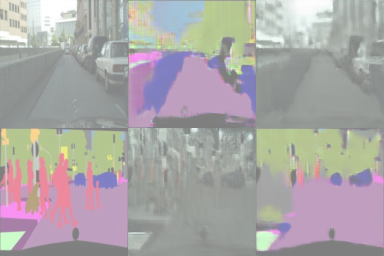

In [25]:
Testmodel_images(1, 2)

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


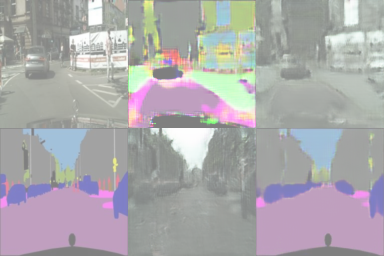

In [26]:
Testmodel_images(2, 4)